# Eurostat European Big Data Hackathon 2025 - Accessing satellite imagery via Sentinel Hub APIs

<img src="img/EU-Big-Data-Hackathon-2025_horiz_0.jpg" width="500"/>


Eurostat is organizing the fifth round of the European Big Data Hackathon from 6 to 11 March 2025 (including the presentation by the winners at the NTTS) in Brussels. 

The purpose of the 2025 hackathon is to foster expertise in integrating Earth Observation data with official statistics for producing innovative ideas for statistical products and tools relevant for the EU policies. 


The European Big Data Hackathon takes place every two years and gathers teams from all over Europe to compete for the best solution to a statistical challenge. The teams develop innovative approaches, applications and data products combining official statistics and big data that can help to answer pressing EU policy and/or statistical questions.

_Source: https://cros.ec.europa.eu/2025EuropeanBigDataHackathon_

## Purpose of this Jupyter Notebook
*This notebook provides information on how to access satellite imagery via Sentinel Hub APIs, which may be of interest to hackathon participants. In this notebook you will be shown how visualise, download and even extract statistics from satellite imagery and the EUROSTAT population dataset hosted on Copernicus Data Space Ecosystem.*

The Copernicus Data Space Ecosystem offers immediate access to large amounts of open and free Earth observation data from the Copernicus Sentinel satellites, including both new and historical Sentinel images, as well as Copernicus Contributing Missions. The services offered on this platform support users in accessing, viewing, using, downloading, and analyzing data. 

The Copernicus Data Space Ecosystem offers multiple Application Programming Interfaces (APIs) ranging from catalogue, product download, visualization over processing web services such as STAC, openEO and Sentinel Hub APIs. This Jupyter notebook focuses on the use of [Sentinel Hub APIs](https://dataspace.copernicus.eu/analyse/apis/sentinel-hub), which provide access to raw satellite data, rendered images, statistical analysis, and other features.

## Imports

In [1]:
# import sys
# !{sys.executable} -m pip install contextily

# Utilities
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from typing import Any, Optional, Tuple

import geopandas as gpd
import contextily as cx

import getpass

from sentinelhub import (
    SHConfig,
    DataCollection,
    SentinelHubCatalog,
    SentinelHubRequest,
    SentinelHubStatistical,
    SentinelHubStatisticalDownloadClient,
    BBox,
    bbox_to_dimensions,
    CRS,
    MimeType,
    Geometry,
    parse_time,
)

### Helper functions

In the below cell we have included some functions that should assist you in processing and visualising the API outputs.

In [ ]:
# define functions to extract statistics for all acquisition dates
def extract_stats(date, stat_data):
    d = {}
    for key, value in stat_data["outputs"].items():
        stats = value["bands"]["B0"]["stats"]
        if stats["sampleCount"] == stats["noDataCount"]:
            continue
        else:
            d["date"] = [date]
            for stat_name, stat_value in stats.items():
                if stat_name == "sampleCount" or stat_name == "noDataCount":
                    continue
                else:
                    d[f"{key}_{stat_name}"] = [stat_value]
    return pd.DataFrame(d)


def read_acquisitions_stats(stat_data):
    df_li = []
    for aq in stat_data:
        date = aq["interval"]["from"][:10]
        df_li.append(extract_stats(date, aq))
    return pd.concat(df_li)


def stats_to_df(stats_data):
    """Transform Statistical API response into a pandas.DataFrame"""
    df_data = []

    for single_data in stats_data["data"]:
        df_entry = {}
        is_valid_entry = True

        df_entry["interval_from"] = parse_time(single_data["interval"]["from"]).date()
        df_entry["interval_to"] = parse_time(single_data["interval"]["to"]).date()

        for output_name, output_data in single_data["outputs"].items():
            for band_name, band_values in output_data["bands"].items():
                band_stats = band_values["stats"]
                if band_stats["sampleCount"] == band_stats["noDataCount"]:
                    is_valid_entry = False
                    break

                for stat_name, value in band_stats.items():
                    col_name = f"{output_name}_{band_name}_{stat_name}"
                    if stat_name == "percentiles":
                        for perc, perc_val in value.items():
                            perc_col_name = f"{col_name}_{perc}"
                            df_entry[perc_col_name] = perc_val
                    else:
                        df_entry[col_name] = value

        if is_valid_entry:
            df_data.append(df_entry)

    return pd.DataFrame(df_data)


def plot_image(
    image: np.ndarray,
    factor: float = 1.0,
    clip_range: Optional[Tuple[float, float]] = None,
    **kwargs: Any,
) -> None:
    """Utility function for plotting RGB images."""
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
    if clip_range is not None:
        ax.imshow(np.clip(image * factor, *clip_range), **kwargs)
    else:
        ax.imshow(image * factor, **kwargs)
    ax.set_xticks([])
    ax.set_yticks([])

## Credentials

Credentials for Sentinel Hub services (`client_id` & `client_secret`) can be obtained in your [Dashboard](https://shapps.dataspace.copernicus.eu/dashboard/#/). In the User Settings you can create a new OAuth Client to generate these credentials. For more detailed instructions, visit the relevant [documentation page](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/Overview/Authentication.html).

Now that you have your `client_id` & `client_secret`, it is recommended to configure a new profile in your Sentinel Hub Python package. Instructions on how to configure your Sentinel Hub Python package can be found [here](https://sentinelhub-py.readthedocs.io/en/latest/configure.html). Using these instructions you can create a profile specific to using the package for accessing Copernicus Data Space Ecosystem data collections. This is useful as changes to the the config class are usually only temporary in your notebook and by saving the configuration to your profile you won't need to generate new credentials or overwrite/change the default profile each time you rerun or write a new Jupyter Notebook. 

If you are a first time user of the Sentinel Hub Python package for Copernicus Data Space Ecosystem, you should create a profile specific to the Copernicus Data Space Ecosystem. You can do this in the following cell:

In [3]:
# Only run this cell if you have not created a configuration.

config = SHConfig()
# config.sh_client_id = getpass.getpass("Enter your SentinelHub client id")
# config.sh_client_secret = getpass.getpass("Enter your SentinelHub client secret")
config.sh_token_url = "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token"
config.sh_base_url = "https://sh.dataspace.copernicus.eu"
# config.save("cdse")

However, if you have already configured a profile in Sentinel Hub Python for the Copernicus Data Space Ecosystem, then you can run the below cell entering the profile name as a string replacing `<profile_name>`.

In [4]:
config = SHConfig("cdse")

## Visualising and downloading data with Sentinel Hub APIs

## Creating an area of interest

For this example we have created an area of interest centred on Brussels, Belgium. The area of interest is stored in the string as a geojson.

In [ ]:
brussels_aoi = """{
  "type": "Polygon",
  "coordinates": [
    [
      [
        4.232541,
        50.776412
      ],
      [
        4.499548,
        50.776412
      ],
      [
        4.499548,
        50.919478
      ],
      [
        4.232541,
        50.919478
      ],
      [
        4.232541,
        50.776412
      ]
    ]
  ]
}
"""

/tmp/ipykernel_5207/3215912531.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  brussels_gdf["area"] = brussels_gdf.geometry.area


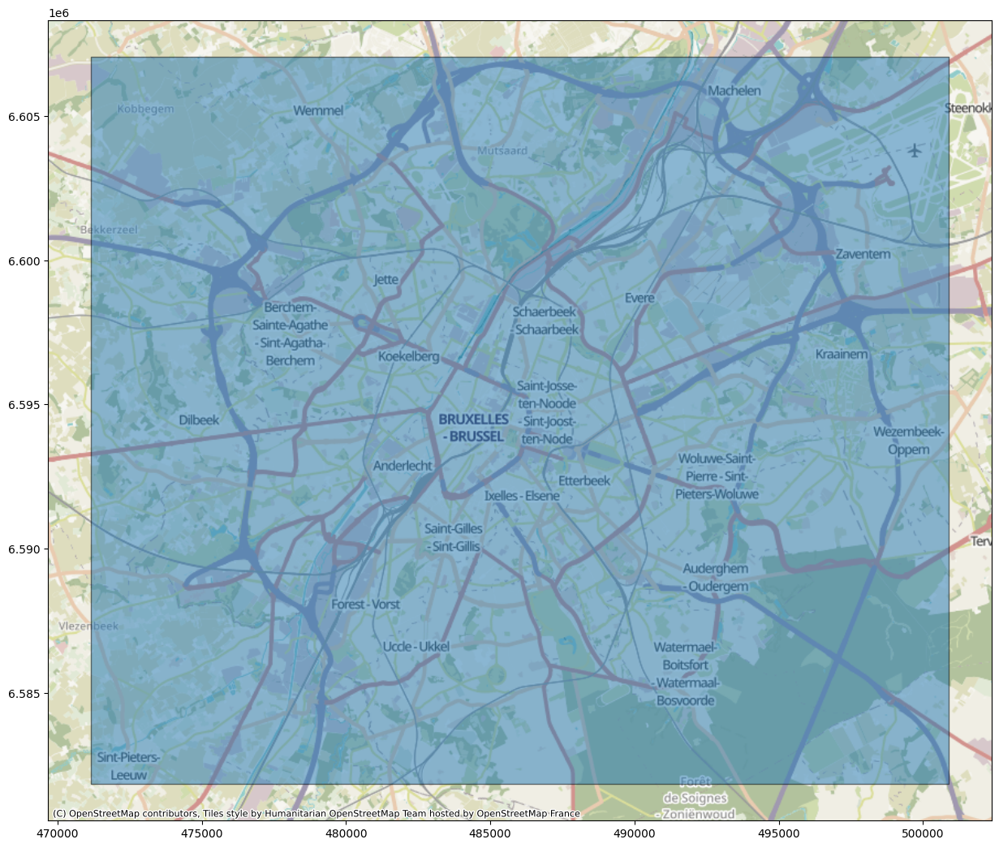

In [ ]:
# Read the land cover samples into a GeoDataFrame
brussels_gdf = gpd.read_file(brussels_aoi)

# Calculate the area for each geometry and add it as a new column
brussels_gdf["area"] = brussels_gdf.geometry.area

brussels_gdf_wm = brussels_gdf.to_crs(epsg=3857)

# Explore the GeoDataFrame, visualizing the 'area' column with a specified colormap
ax = brussels_gdf_wm.plot(alpha=0.5, edgecolor="k", figsize=(15, 15))
cx.add_basemap(ax)

### Example 1: True Color Image with Sentinel-2 L2A imagery

We build the request according to the [API Reference](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/ApiReference.html), using the `SentinelHubRequest` class. Each Process API request also needs an [evalscript](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/Evalscript.html). An evalscript (or "custom script") is a piece of Javascript code which defines how the satellite data shall be processed by Sentinel Hub and what values the service shall return. It is a required part of any [process](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/Process.html), [batch processing](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/Batch.html) or [OGC request](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/OGC.html).

The information that we specify in the `SentinelHubRequest` object is:
- an evalscript,
- a list of input data collections with time interval,
- a format of the response,
- a bounding box and its size (size or resolution).
- `mosaickingOrder` (optional): in this example we have used `leastCC` which will return pixels from the least cloudy acquisition in the specified time period.

The evalscript in the example is used to select the appropriate bands. We return the RGB (B04, B03, B02) Sentinel-2 L2A bands.

The least cloudy image from the time period is downloaded. Without any additional parameters in the evalscript, the downloaded data will correspond to reflectance values in `UINT8` format (values in 0-255 range).

In [ ]:
evalscript_true_color = """
    //VERSION=3

    function setup() {
        return {
            input: [{
                bands: ["B02", "B03", "B04"]
            }],
            output: {
                bands: 3
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B04, sample.B03, sample.B02];
    }
"""

In [ ]:
geometry = Geometry(
    geometry={
        "type": "Polygon",
        "coordinates": [
            [
                [4.232112, 50.934173],
                [4.569817, 50.937635],
                [4.56158, 50.75902],
                [4.240348, 50.762495],
                [4.232112, 50.934173],
            ]
        ],
    },
    crs=CRS.WGS84,
)

request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A.define_from(
                name="s2l2a", service_url="https://sh.dataspace.copernicus.eu"
            ),
            time_interval=("2022-05-01", "2022-05-20"),
            other_args={"dataFilter": {"mosaickingOrder": "leastRecent"}},
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    geometry=geometry,
    resolution=(0.0002, 0.0002),
    config=config,
)

The method `get_data()` will always return a list of length 1 with the available image from the requested time interval in the form of numpy arrays.

In [9]:
true_color_imgs = request_true_color.get_data()

In [10]:
print(
    f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}."
)
print(
    f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}"
)

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (893, 1689, 3)


Image type: uint8


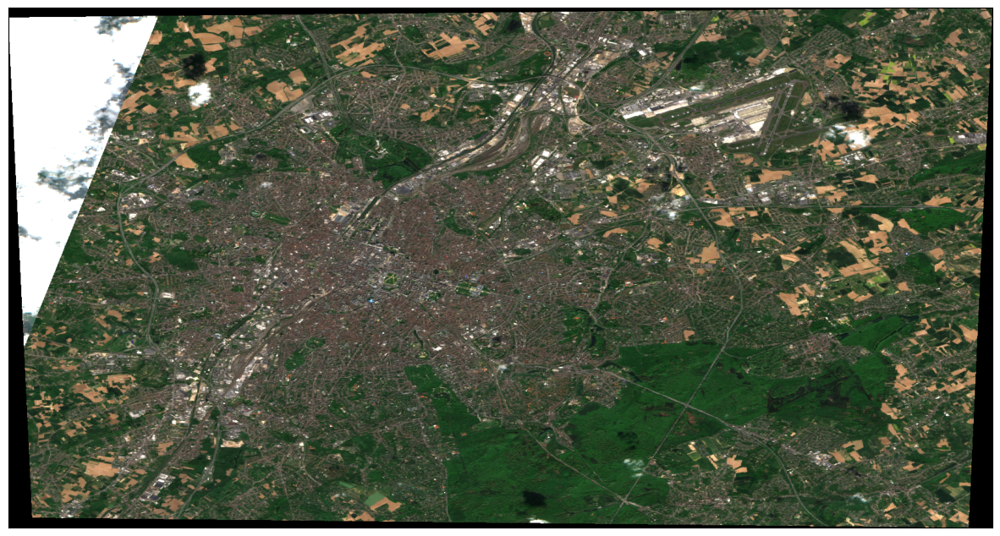

In [11]:
image = true_color_imgs[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor=3.5 / 255, clip_range=(0, 1))

### Example 2: NDVI Image

Secondly, we will also show you an example of how to calculate and visualise NDVI using the same API. NDVI is a very commonly used spectral vegetation index for vegetation monitoring, for example, monitoring crop growth and yields. As you will notice in the codeblock below, the evalscript has changed substantially:
- we are only using Band 4 and Band 8 as an input into our script.
- In the `evaluatePixel()` function, we calculate NDVI and visualise this using the `imgVals` array. 

In [ ]:
evalscript_ndvi = """
//VERSION=3
function setup() {
  return {
    input: [{
      bands: [
        "B04",
        "B08",
        "dataMask"
      ]
    }],
    output: {
      bands: 4
    }
  }
}
  

function evaluatePixel(sample) {
    let val = (sample.B08 - sample.B04) / (sample.B08 + sample.B04);
    let imgVals = null;
    
    if (val<-1.1) imgVals = [0,0,0];
    else if (val<-0.2) imgVals = [0.75,0.75,0.75];
    else if (val<-0.1) imgVals = [0.86,0.86,0.86];
    else if (val<0) imgVals = [1,1,0.88];
    else if (val<0.025) imgVals = [1,0.98,0.8];
    else if (val<0.05) imgVals = [0.93,0.91,0.71];
    else if (val<0.075) imgVals = [0.87,0.85,0.61];
    else if (val<0.1) imgVals = [0.8,0.78,0.51];
    else if (val<0.125) imgVals = [0.74,0.72,0.42];
    else if (val<0.15) imgVals = [0.69,0.76,0.38];
    else if (val<0.175) imgVals = [0.64,0.8,0.35];
    else if (val<0.2) imgVals = [0.57,0.75,0.32];
    else if (val<0.25) imgVals = [0.5,0.7,0.28];
    else if (val<0.3) imgVals = [0.44,0.64,0.25];
    else if (val<0.35) imgVals = [0.38,0.59,0.21];
    else if (val<0.4) imgVals = [0.31,0.54,0.18];
    else if (val<0.45) imgVals = [0.25,0.49,0.14];
    else if (val<0.5) imgVals = [0.19,0.43,0.11];
    else if (val<0.55) imgVals = [0.13,0.38,0.07];
    else if (val<0.6) imgVals = [0.06,0.33,0.04];
    else imgVals = [1,1,1];
    
    
    imgVals.push(sample.dataMask)
    
    return imgVals
}
"""

request_ndvi_img = SentinelHubRequest(
    evalscript=evalscript_ndvi,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A.define_from(
                name="s2l2a", service_url="https://sh.dataspace.copernicus.eu"
            ),
            time_interval=("2022-05-01", "2022-05-20"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}},
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    geometry=geometry,
    resolution=(0.0002, 0.0002),
    config=config,
)

The same method as before is used to request and then visualise the data. In the visualisation, the lighter greens indicate a higher NDVI value (vegetation, forest) and the darker greens (urban areas and water bodies) represent areas with lower NDVI values.

In [13]:
ndvi_img = request_ndvi_img.get_data()

In [14]:
print(
    f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}."
)
print(
    f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}"
)

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (893, 1689, 3)


Image type: uint8


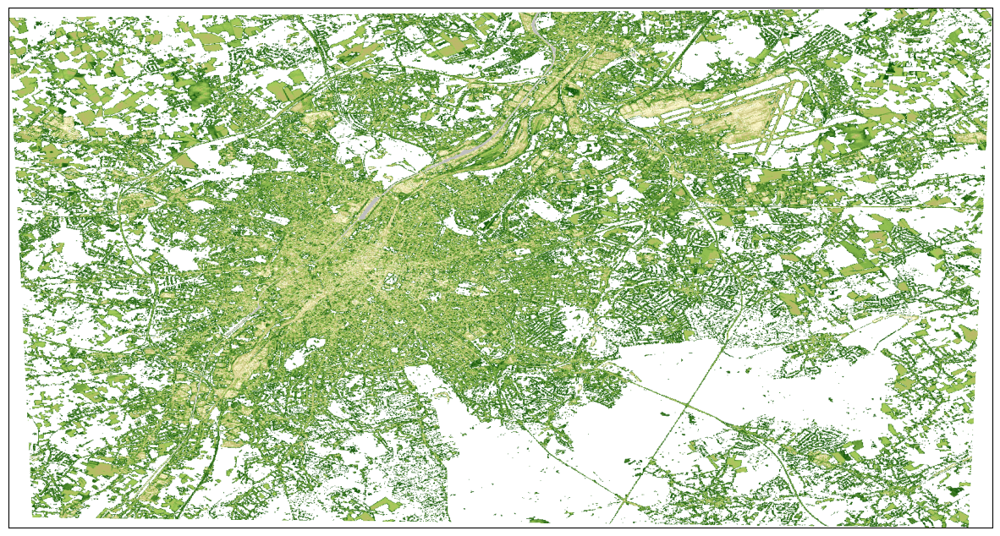

In [15]:
image = ndvi_img[0]
print(f"Image type: {image.dtype}")

# plot function
plot_image(image, factor=1 / 255)

### Example 3: All Sentinel-2's raw band values 

Now let's define an evalscript which will return all Sentinel-2 spectral bands with raw values.

In this example we are downloading already quite a big chunk of data, so optimization of the request is not out of the question. Downloading raw digital numbers in the `INT16` format instead of reflectances in the `FLOAT32` format means that much less data is downloaded, which results in a faster download and a smaller usage of SH processing units.

In order to achieve this, we have to set the input units in the evalscript to `DN` (digital numbers) and the output `sampleType` argument to `INT16`. Additionally, we can't pack all Sentinel-2's 13 bands into a `PNG` image, so we have to set the output image type to the `TIFF` format via `MimeType.TIFF` in the request.

The digital numbers are in the range from 0-10000, so we have to scale the downloaded data appropriately.

In [ ]:
evalscript_all_bands = """
    //VERSION=3
    function setup() {
        return {
            input: [{
                bands: ["B01","B02","B03","B04","B05","B06","B07","B08","B8A","B09","B10","B11","B12"],
                units: "DN"
            }],
            output: {
                bands: 13,
                sampleType: "INT16"
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B01,
                sample.B02,
                sample.B03,
                sample.B04,
                sample.B05,
                sample.B06,
                sample.B07,
                sample.B08,
                sample.B8A,
                sample.B09,
                sample.B10,
                sample.B11,
                sample.B12];
    }
"""

request_all_bands = SentinelHubRequest(
    evalscript=evalscript_all_bands,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C.define_from(
                "s2l1c", service_url=config.sh_base_url
            ),
            time_interval=("2022-05-01", "2022-05-20"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}},
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    geometry=geometry,
    resolution=(0.0002, 0.0002),
    config=config,
)

In [17]:
all_bands_response = request_all_bands.get_data()

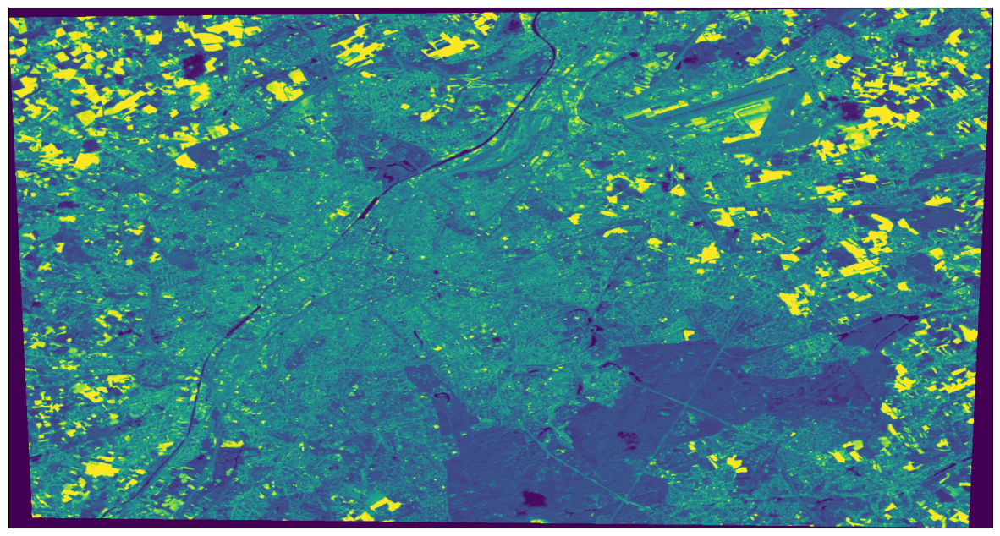

In [18]:
# Image showing the SWIR band B12
# Factor 1/1e4 due to the DN band values in the range 0-10000
# Factor 3.5 to increase the brightness
plot_image(all_bands_response[0][:, :, 12], factor=3.5 / 1e4, vmax=1)

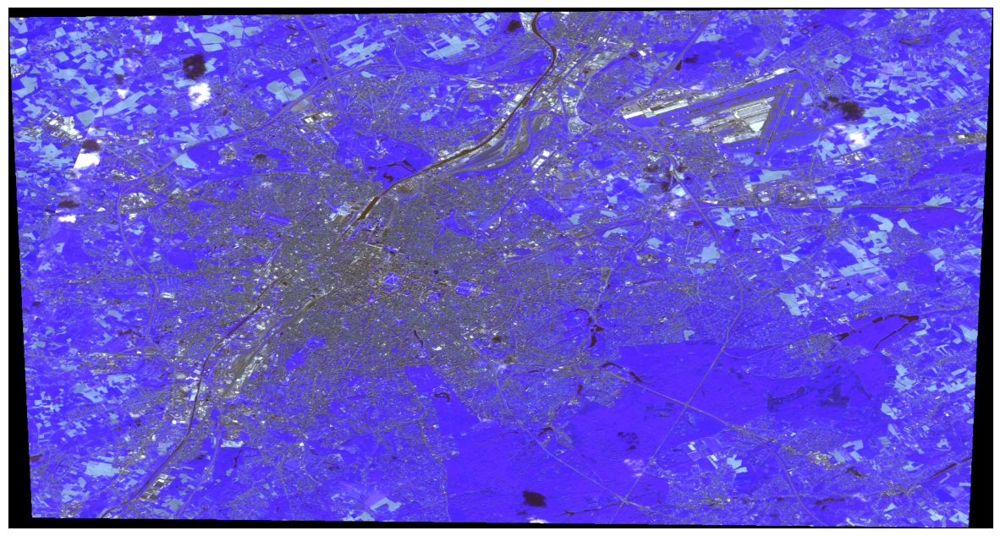

In [19]:
# From raw bands we can also construct a False-Color image
# False color image is (B03, B04, B08)
plot_image(all_bands_response[0][:, :, [2, 3, 7]], factor=3.5 / 1e4, clip_range=(0, 1))

### Example 4: Save downloaded data to disk and read it from disk

All downloaded data can be saved to disk and later read from it. Simply specify the location on disk where data should be saved (or loaded from) via the `data_folder` argument of the request's constructor. When executing the request's `get_data` method, set the argument `save_data` to `True`.

This also means that in all the future requests for data, the request will first check the provided location if the data is already there, unless you explicitly demand to redownload the data.

In [ ]:
request_all_bands = SentinelHubRequest(
    data_folder="test_dir",
    evalscript=evalscript_all_bands,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C.define_from(
                "s2l1c", service_url=config.sh_base_url
            ),
            time_interval=("2022-05-01", "2022-05-20"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}},
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    geometry=geometry,
    resolution=(0.0002, 0.0002),
    config=config,
)

In [21]:
%%time
all_bands_img = request_all_bands.get_data(save_data=True)

CPU times: user 215 ms, sys: 23.6 ms, total: 239 ms
Wall time: 133 ms


In [22]:
print(
    "The output directory has been created and a tiff file with all 13 bands was saved into the following structure:\n"
)

for folder, _, filenames in os.walk(request_all_bands.data_folder):
    for filename in filenames:
        print(os.path.join(folder, filename))

The output directory has been created and a tiff file with all 13 bands was saved into the following structure:

test_dir/c0bbac0e2e9cc38ec769014ddcd2acd3/response.tiff
test_dir/c0bbac0e2e9cc38ec769014ddcd2acd3/request.json


In [23]:
%%time
# try to re-download the data
all_bands_img_from_disk = request_all_bands.get_data()

CPU times: user 204 ms, sys: 16.4 ms, total: 220 ms
Wall time: 122 ms


In [24]:
%%time
# force the redownload
all_bands_img_redownload = request_all_bands.get_data(redownload=True)

CPU times: user 257 ms, sys: 22.7 ms, total: 280 ms
Wall time: 6.63 s


#### Save downloaded data directly to disk

The `get_data` method returns a list of numpy arrays and can save the downloaded data to disk, as we have seen in the previous example. Sometimes it is convenient to just save the data directly to disk. You can do that by using `save_data` method instead.

In [25]:
%%time
request_all_bands.save_data()

CPU times: user 1.05 ms, sys: 85 μs, total: 1.13 ms
Wall time: 993 μs


In [26]:
print(
    "The output directory has been created and a tiff file with all 13 bands was saved into the following structure:\n"
)

for folder, _, filenames in os.walk(request_all_bands.data_folder):
    for filename in filenames:
        print(os.path.join(folder, filename))

The output directory has been created and a tiff file with all 13 bands was saved into the following structure:

test_dir/c0bbac0e2e9cc38ec769014ddcd2acd3/response.tiff
test_dir/c0bbac0e2e9cc38ec769014ddcd2acd3/request.json


### Example 5: Raw Sentinel 5P data

#### Creating an area of interest

For this example we have created an area of interest centred on Brussels, Belgium. The area of interest is stored in the string as a geojson.

In [ ]:
milan_aoi = """{
  "type": "Polygon",
  "coordinates": [
    [
      [
        8.5,
        45
      ],
      [
        11.5,
        45,
      ],
      [
        11.5,
        47
      ],
      [
        8.5,
        47
      ],
      [
        8.5,
        45
      ]
    ]
  ]
}
"""

/tmp/ipykernel_5207/258193390.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  milan_gdf["area"] = milan_gdf.geometry.area


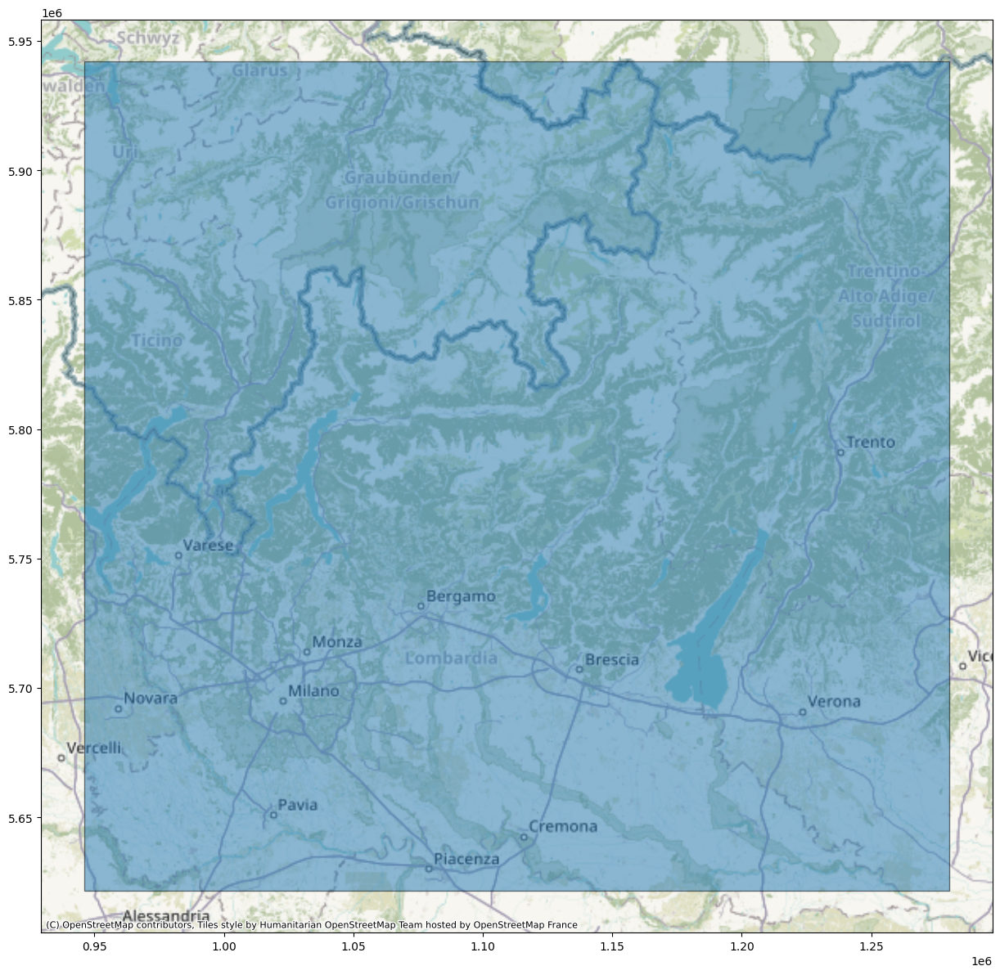

In [ ]:
# Read the land cover samples into a GeoDataFrame
milan_gdf = gpd.read_file(milan_aoi)

# Calculate the area for each geometry and add it as a new column
milan_gdf["area"] = milan_gdf.geometry.area

milan_gdf_wm = milan_gdf.to_crs(epsg=3857)

# Explore the GeoDataFrame, visualizing the 'area' column with a specified colormap
ax = milan_gdf_wm.plot(alpha=0.5, edgecolor="k", figsize=(15, 15))
cx.add_basemap(ax)

In [ ]:
geometry = Geometry(
    geometry={
        "type": "Polygon",
        "coordinates": [[[8.5, 44.5], [10.5, 45], [10, 46], [8.5, 46], [8.5, 45]]],
    },
    crs=CRS.WGS84,
)

evalscript = """//VERSION=3
function setup() {
return {
input: ["NO2", "dataMask"],
output: { bands: 4 },
}
}

const minVal = 0.0
const maxVal = 0.0001
const diff = maxVal - minVal

const rainbowColors = [
[minVal, [0, 0, 0.5]],
[minVal + 0.125 * diff, [0, 0, 1]],
[minVal + 0.375 * diff, [0, 1, 1]],
[minVal + 0.625 * diff, [1, 1, 0]],
[minVal + 0.875 * diff, [1, 0, 0]],
[maxVal, [0.5, 0, 0]],
]

const viz = new ColorRampVisualizer(rainbowColors)

function evaluatePixel(sample) {
var rgba = viz.process(sample.NO2)
rgba.push(sample.dataMask)
return rgba
}
"""

bbox = BBox(bbox=[8.485304, 44.879167, 10.313724, 46.103649], crs=CRS.WGS84)

request = SentinelHubRequest(
    evalscript=evalscript,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL5P.define_from(
                name="s5p", service_url="https://sh.dataspace.copernicus.eu"
            ),
            time_interval=("2024-12-01", "2024-12-12"),
        ),
    ],
    responses=[
        SentinelHubRequest.output_response("default", MimeType.PNG),
    ],
    bbox=bbox,
    size=[1000, 945.119],
    config=config,
)

response = request.get_data()

The method `get_data()` will always return a list of length 1 with the available image from the requested time interval in the form of numpy arrays.

In [30]:
sen5p_viz = request.get_data()

In [31]:
print(
    f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}."
)
print(
    f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}"
)

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (893, 1689, 3)


Image type: uint8


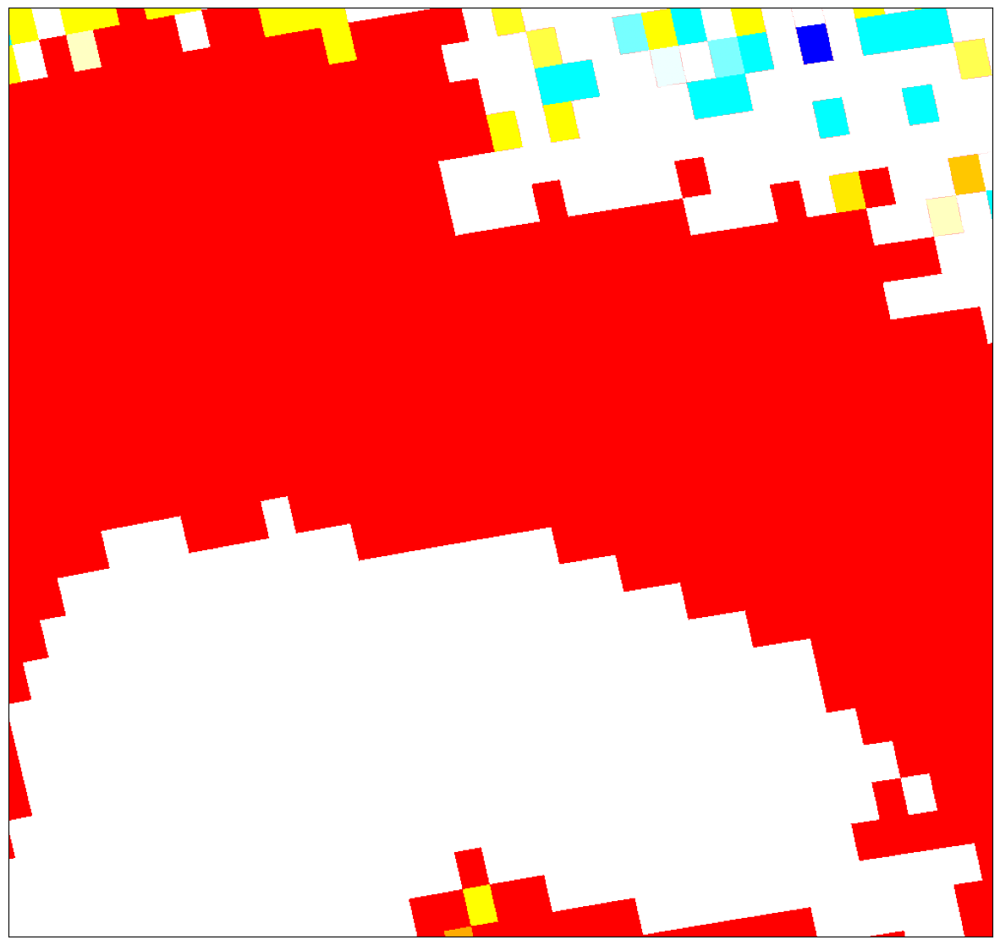

In [32]:
image = sen5p_viz[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor=3.5 / 255, clip_range=(0, 1))

## Accessing the EUROSTAT data using the APIs

These examples utilise the BYOC Collection containing the The Eurostat Census 2021 grid dataset This contains final data submitted by the National Statistical Institutes. 

### Example 1: Visualising the BYOC Population data

#### The Evalscript

In [33]:
evalscript = """
//VERSION=3
function setup() {
  return {
    input: ["OBS_VALUE_Y_LT15","OBS_VALUE_Y_1564","OBS_VALUE_Y_GE65", "dataMask"],
    output: { bands: 4 }
  };
}
let factor = 1/2000;
function evaluatePixel(sample) {
  // This comment is required for evalscript parsing to work
  return [factor * sample.OBS_VALUE_Y_LT15,factor * sample.OBS_VALUE_Y_1564,factor * sample.OBS_VALUE_Y_GE65, sample.dataMask ];
}
"""

#### The Request

In [ ]:
bbox = BBox(bbox=[8.485304, 44.879167, 10.313724, 46.103649], crs=CRS.WGS84)

request = SentinelHubRequest(
    evalscript=evalscript,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.define_byoc(
                "36caf873-32ca-44be-ba3e-e6c1b759211c"
            ),
            time_interval=("2021-01-01", "2021-01-02"),
        ),
    ],
    responses=[
        SentinelHubRequest.output_response("default", MimeType.PNG),
    ],
    bbox=bbox,
    size=[1000, 945.119],
    config=config,
)

response = request.get_data()

In [35]:
true_color_imgs = request.get_data()

In [36]:
print(
    f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}."
)
print(
    f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}"
)

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (945, 1000, 4)


Image type: uint8


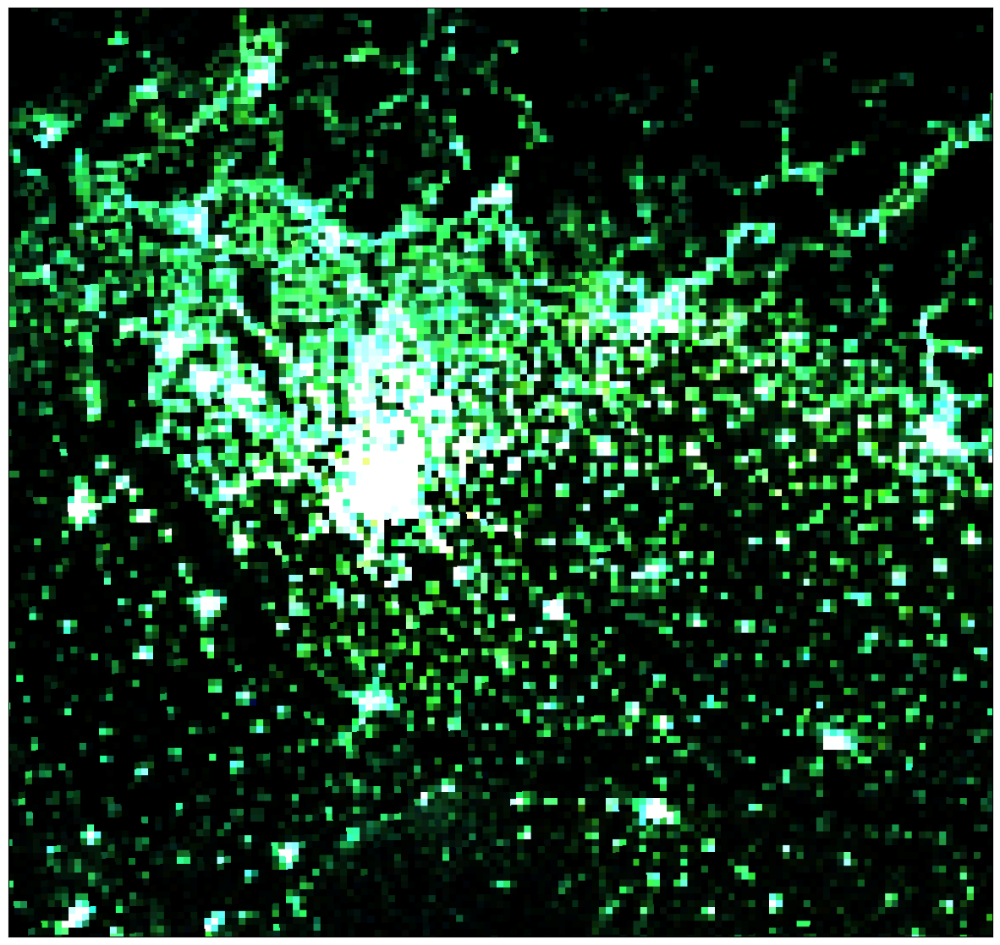

In [37]:
image = true_color_imgs[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor=3.5 / 255, clip_range=(0, 1))

### Example 2: Raw BYOC Population data

#### The Evalscript:

In [38]:
evalscript = """
//VERSION=3
function setup() {
  return {
    input: ["OBS_VALUE_Y_LT15", "dataMask"],
    output: { bands: 2 }
  };
}
let factor = 1/2000;
function evaluatePixel(sample) {
  // This comment is required for evalscript parsing to work
  return [sample.OBS_VALUE_Y_LT15, sample.dataMask ];
}
"""

#### The Request:

In [ ]:
bbox = BBox(bbox=[8.485304, 44.879167, 10.313724, 46.103649], crs=CRS.WGS84)

request = SentinelHubRequest(
    evalscript=evalscript,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.define_byoc(
                "36caf873-32ca-44be-ba3e-e6c1b759211c"
            ),
            time_interval=("2021-01-01", "2025-01-01"),
        ),
    ],
    responses=[
        SentinelHubRequest.output_response("default", MimeType.PNG),
    ],
    bbox=bbox,
    size=[1000, 945.119],
    config=config,
)

response = request.get_data()

In [40]:
raw_data = request.get_data()

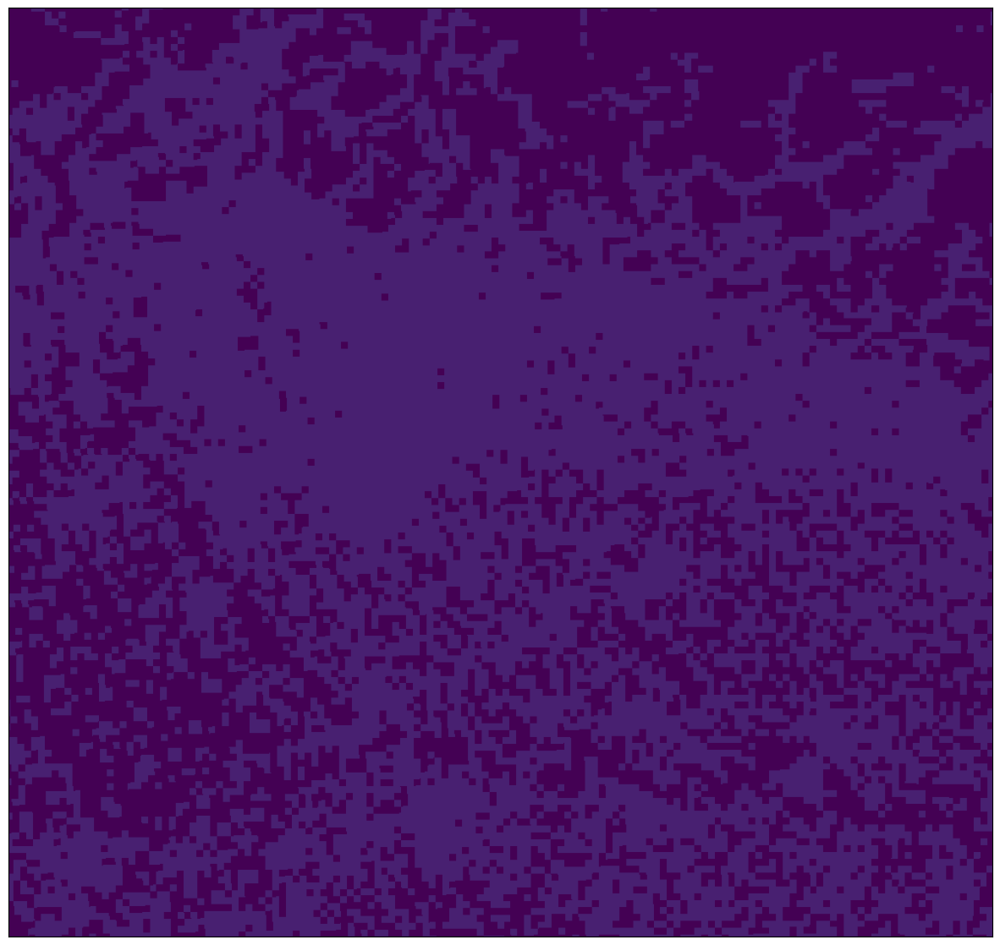

In [41]:
# Image showing the SWIR band B12
# Factor 1/1e4 due to the DN band values in the range 0-10000
# Factor 3.5 to increase the brightness
plot_image(raw_data[0][:, :, 0], factor=3.5 / 1e4, vmax=1)

## Extracting Statistics from satellite imagery

In the Process API examples, we have seen how to obtain satellite imagery. Statistical API can be used in a very similar way. The main difference is that the results of Statistical API are aggregated statistical values of satellite data instead of entire images. In many use cases, such values are all that we need. By using Statistical API we can avoid downloading and processing large amounts of satellite data.

All general rules for building evalscripts apply. However, there are some specifics when using evalscripts with the Statistical API:

- The `evaluatePixel()` function must, in addition to other output, always return a `dataMask` output. This output defines which pixels are excluded from calculations. For more details and an example, see [here](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/Statistical.html).
- The default value of sampleType is `FLOAT32`.
- The output.bands parameter in the setup() function can be an array. This makes it possible to specify custom names for the output bands and different output `dataMask` for different outputs, see this [example](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/Statistical/Examples.html#multiple-outputs-with-different-datamasks-multi-band-output-with-custom-bands-names-and-different-histogram-types).

### Example 1: Creating time series for multiple fields of interest

#### Creating the fields of interest

In [42]:
austria_fields = """
{
"type": "FeatureCollection",
"name": "austria_fields",
"crs": { "type": "name", "properties": { "name": "urn:ogc:def:crs:EPSG::3857" } },
"features": [
{ "type": "Feature", "properties": { "fid": 1285619, "RFL_ID": 108015743.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 3.405187, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203406200171/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203406200171.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203406200171/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203406200171.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2020-02-12T13:42:07", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363031342E3938383134333720323730353639362E363735353131383220343830363031332E363931383538373820323730353639312E393333323537323720343830363031372E393130333130303320323730353637312E353533353930333520343830363032372E383731333734363120323730353633362E313830303834323520343830363037302E323039333530323220323730353437382E353139393232333220343830363139372E393531353434343920323730353438382E383136393633303920343830363230352E373632393032363820323730353439322E303435353939363520343830363231332E363730313533393620323730353530302E323831333931343120343830363137382E3639353039383120323730353636352E343836383634323520343830363137312E383439323334333920323730353639322E313531333136353720343830363136322E303331323937313420323730353731302E333033363937323720343830363135372E333639393139353120323730353731332E383037313332343720343830363135312E353335313535393320323730353731342E3932383232323420343830363131392E373634303135383720323730353731312E383132393530383720343830363131352E393335373333303820323730353731312E303430383839363920343830363130332E313837323832383920323730353730392E363438353039303320343830363033352E313831363937303420323730353639352E393732323232363520343830363032322E323236323936333920323730353639352E383136373630393920343830363031342E3938383134333720323730353639362E3637353531313832203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 854.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1827245.85460563423112, 5987194.588551948778331 ], [ 1827243.370380397187546, 5987187.780263729393482 ], [ 1827247.0430196239613, 5987157.27132124453783 ], [ 1827257.285728002665564, 5987103.979268457740545 ], [ 1827299.918946804711595, 5986866.722664936445653 ], [ 1827488.418557854136452, 5986865.542153110727668 ], [ 1827500.265457244822755, 5986869.291698739863932 ], [ 1827512.869939968688414, 5986880.392147633247077 ], [ 1827481.964454774977639, 5987127.805090847425163 ], [ 1827475.216012011049315, 5987167.892069781199098 ], [ 1827463.062276459531859, 5987195.84132192377001 ], [ 1827456.661578974220902, 5987201.589120746590197 ], [ 1827448.247417634585872, 5987203.983426792547107 ], [ 1827401.294971028110012, 5987203.462158123031259 ], [ 1827395.588530506007373, 5987202.815970424562693 ], [ 1827376.73091236455366, 5987202.397379309870303 ], [ 1827275.366690668510273, 5987190.974384196102619 ], [ 1827256.358148422557861, 5987192.400952845811844 ], [ 1827245.85460563423112, 5987194.588551948778331 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1286827, "RFL_ID": 108010016.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 18.368332, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203401500014/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203401500014.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203401500014/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203401500014.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2017-01-23T22:16:00", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830353734322E363735333031373420323730353337392E313831383231353620343830353832322E393836373230383920323730343735322E393039313031363620343830353832362E373534393539343520323730343735302E3038313535333420343830363032382E393732303736343120323730343832382E313632383535343420343830363033332E303136373032313820323730343833332E353937323436353320343830363034302E323131373431363120323730343933302E313833343739383220343830363034322E393330313231303320323730343937312E393039353732363220343830363034382E393136393735393820323730353031392E343738313133313820343830363038322E323934343430353620323730353132342E363936313133363420343830363039362E333732343838313920323730353137342E383933363735313420343830363130332E383039343933323520323730353232352E37383438363820343830363130322E333637373532393420323730353237372E3335393434333520343830363039352E393231323033323820323730353332312E363339393937383620343830363039342E333032393738363520323730353332372E393533323639383620343830363037322E313033323532323820323730353431312E3935323638393520343830363036302E353238303338343820323730353435342E3430383635383220343830363035352E363139353336323920323730353435372E333138363837373420343830353930342E393831323631303920323730353432312E363636343938393420343830353836392E313033383835393720323730353431332E363438373331343120343830353734362E303833313133323720323730353338342E303730353438343220343830353734322E363735333031373420323730353337392E3138313832313536203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 920.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1826807.622585895936936, 5986762.474575977772474 ], [ 1826848.234849396627396, 5985831.320449212566018 ], [ 1826853.40924621745944, 5985826.681841840036213 ], [ 1827159.377465040888637, 5985915.669120309874415 ], [ 1827165.974231104366481, 5985923.143154987134039 ], [ 1827188.413550951750949, 5986064.243723629973829 ], [ 1827197.536311129340902, 5986125.25087030697614 ], [ 1827212.168995603919029, 5986194.431797341443598 ], [ 1827274.04630285478197, 5986344.884408954530954 ], [ 1827300.862509782193229, 5986416.89908083435148 ], [ 1827318.031330853933468, 5986490.782653839327395 ], [ 1827322.271591496188194, 5986566.806057645939291 ], [ 1827318.278081396361813, 5986632.743707299232483 ], [ 1827316.684048287570477, 5986642.234084282070398 ], [ 1827294.494411431485787, 5986768.591951441951096 ], [ 1827282.758869512239471, 5986832.503207293339074 ], [ 1827275.923005741322413, 5986837.409581060521305 ], [ 1827050.742999553913251, 5986804.223971929401159 ], [ 1826997.170666819904, 5986797.015554131940007 ], [ 1826813.219185540219769, 5986769.228487577289343 ], [ 1826807.622585895936936, 5986762.474575977772474 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1287047, "RFL_ID": 108266839.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 12.127094, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100035/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203407100035.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100035/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203407100035.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2017-01-23T22:16:00", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363638322E373433343333363720323730353035352E393830303539363720343830363638332E393631373036323820323730353035332E363336323436323120343830373234302E303835383432333420323730353036372E363334393932373220343830373231392E333733313538373220323730353239352E393339313437363620343830373231362E313830323537373820323730353239392E3230373331313420343830373136312E363136313235303720323730353330342E343634383435313320343830363934382E3732383335313820323730353333362E333037303837393320343830363832372E343930353538373220323730353333332E3235313833313520343830363736352E323530393734313220323730353137362E303433383139323120343830363735352E333631303732353420323730353135362E353130373533313720343830363734332E3133383931363920323730353133382E323231363532353220343830363638322E373433343333363720323730353035352E3938303035393637203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 616.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1828145.58664693729952, 5986167.090891021303833 ], [ 1828147.083062309538946, 5986163.48872506711632 ], [ 1828963.841035352088511, 5986112.903518505394459 ], [ 1828961.672522438922897, 5986451.255743359215558 ], [ 1828957.396506718359888, 5986456.470218824222684 ], [ 1828878.07606403157115, 5986471.18765895627439 ], [ 1828569.994501803768799, 5986545.261653937399387 ], [ 1828391.928185331635177, 5986556.283416159451008 ], [ 1828281.315968015231192, 5986333.080591690726578 ], [ 1828264.412093504332006, 5986305.623848236165941 ], [ 1828244.243652038509026, 5986280.294645157642663 ], [ 1828145.58664693729952, 5986167.090891021303833 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1288672, "RFL_ID": 108069009.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 10.395215, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100072/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203407100072.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100072/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203407100072.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2017-01-23T22:16:00", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363230322E343430333339313720323730343437302E333732363531363420343830363230322E353233373834363920323730343436362E3038363930353920343830363231362E303236383432323720323730343435322E383637333937363420343830363234352E343330383338343320323730343431382E353834373638393720343830363330322E323336383032303720323730343337362E353331343533323220343830363335382E323635383738313720323730343333342E32363933343720343830363438322E343531313033383720323730343233382E343934363031393420343830363536352E333630333539313320323730343137372E313230333636323120343830363538392E373635303236383320323730343230312E303838373536383720343830363630332E3531383933323420323730343231332E323536363635373220343830363631332E353231333732363420323730343232312E313732353239323120343830363632372E303031303639333220323730343233302E393539333937333120343830363633382E383430383438373920323730343233382E363039333138343820343830363634392E343031373533343220323730343234342E373434303933363520343830363636342E353734303235383520323730343235322E333938373435333220343830363638312E373335353532363820323730343235372E313233303732353520343830363638302E303334343433363220323730343235382E343036373731343520343830363639372E3138363930373120323730343236332E333335393436343220343830363639302E3837363234383720323730343332332E353231383334373620343830363638372E393238393733383120323730343335392E383536333331363120343830363334322E3730393534353920323730343632302E343032343635303920343830363230322E343430333339313720323730343437302E3337323635313634203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 953.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1827369.528221862623468, 5985367.441029831767082 ], [ 1827369.12263303110376, 5985361.129104856401682 ], [ 1827387.282233088510111, 5985339.967694828286767 ], [ 1827426.148930787341669, 5985285.806324467994273 ], [ 1827504.21309506543912, 5985216.719138179905713 ], [ 1827581.111862561432645, 5985147.424061576835811 ], [ 1827751.290076610166579, 5984990.742738700471818 ], [ 1827865.218491764273494, 5984889.912528466433287 ], [ 1827903.934001046000049, 5984922.031153936870396 ], [ 1827925.588119876571, 5984938.162183507345617 ], [ 1827941.220971334259957, 5984948.521400341764092 ], [ 1827962.179922969313338, 5984961.186808911152184 ], [ 1827980.472450816305354, 5984970.920086443424225 ], [ 1827996.70423334161751, 5984978.589259013533592 ], [ 1828019.880743251880631, 5984987.903348707593977 ], [ 1828045.611048866529018, 5984992.654834096319973 ], [ 1828043.276552282972261, 5984994.759650454856455 ], [ 1828069.018865678226575, 5984999.813394010998309 ], [ 1828067.191260131075978, 5985089.106781903654337 ], [ 1828067.351827000500634, 5985142.903755269013345 ], [ 1827593.568654931150377, 5985570.107640437781811 ], [ 1827369.528221862623468, 5985367.441029831767082 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1289075, "RFL_ID": 108041908.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 7.186696, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100052/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203407100052.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100052/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203407100052.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2017-01-23T22:16:00", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363332372E3035373132303320323730343731362E383135303437393420343830363332322E353831373832303820323730343639382E393130383738323220343830363333352E373336373837333220323730343633392E313230333432393420343830363336372E353632343137323520323730343637302E303639393737363820343830363339352E383731323737393720323730343639312E373536393739313120343830363432322E3237323330363920323730343730372E323930313231313520343830363439332E323539333130343120323730343734302E343039333534383420343830363531332E383333393431313420323730343735352E323839363538373220343830363532382E343739383436363120323730343736392E383833373730343620343830363534302E353930313737333720323730343738372E363931393030373620343830363535302E373432313535343920323730343830372E373038383633333220343830363635332E383535323239393920323730353034332E353634393632373820343830363431312E333636323333313120323730353033382E333336393332343420343830363430362E333936353738313820323730353033342E333637393535383820343830363332372E3035373132303320323730343731362E3831353034373934203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 719.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1827582.509621815523133, 5985713.865830066613853 ], [ 1827573.745020183501765, 5985688.112592314369977 ], [ 1827585.65654269955121, 5985598.519903073087335 ], [ 1827636.109825797611848, 5985639.958663059398532 ], [ 1827680.268393783597276, 5985668.227646538056433 ], [ 1827720.872967279981822, 5985687.692113175988197 ], [ 1827828.985650439513847, 5985727.314437142573297 ], [ 1827860.971821221755818, 5985746.563256904482841 ], [ 1827884.234315495472401, 5985766.149163485504687 ], [ 1827904.177222537109628, 5985790.784935466013849 ], [ 1827921.522560516837984, 5985818.91886340547353 ], [ 1828101.718132541747764, 5986152.530401583760977 ], [ 1827745.689628589898348, 5986175.847844732925296 ], [ 1827737.917061764979735, 5986170.647081059403718 ], [ 1827582.509621815523133, 5985713.865830066613853 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1290549, "RFL_ID": 107943454.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 20.060314, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203401500039/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203401500039.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203401500039/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203401500039.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2019-02-24T16:29:20", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830353336302E313931303530303120323730353237332E313030313239373720343830353335392E343036313233313720323730353236382E363832333734393420343830353336342E383236343236303920323730353235302E303632353934373620343830353336362E3136323633303620323730353234332E343233363336363720343830353337302E353337303337353920323730353233302E343439313530383920343830353338362E393830303239363920323730353138312E363737373630383120343830353339322E3434353030323120323730353135352E3438343036333520343830353339352E313035313232373520323730353133302E313032353538333220343830353339362E383531363035343620323730353130342E333636363237303620343830353339382E313334393737383620323730353037382E383637323335363520343830353339392E39393839393120323730353035352E393239353337313320343830353430342E383730353439373220323730353033322E393137313536333320343830353431312E313037393833373720323730353031312E313035353838383820343830353432302E313230383636343220323730343938382E3733383738393920343830353433302E393034383632383220323730343936372E383937323837343620343830353435352E3739323430303820323730343933322E373539303237343120343830353438342E353937373031393320323730343930342E3538373139393320343830353439372E383631313933393420323730343839342E343937353038363220343830353535332E333937393133333720323730343834322E333339383933313520343830353539372E3530373938323120323730343830332E323939333531383820343830353634372E3438303939363120323730343736322E313833373630373220343830353636352E353332353633393920323730343734302E313132333739353320343830353637372E363432313432313420323730343732312E333133393238343620343830353638372E313632383231323920323730343730302E363837333237383120343830353639322E353233303933353520323730343639382E343938343830353720343830353831332E353533313839383620323730343734352E323835343237373420343830353831372E3430333136383720323730343735302E373733373233383120343830353734332E323732323830323520323730353333352E303231333737303120343830353733382E3138373132303320323730353337352E313034333636393920343830353733372E383131393239323120323730353337382E303631363432393520343830353733332E343135313031353820323730353338312E303835383935323520343830353634372E383634333431323420323730353336322E3638343633303120343830353531392E303136333637363720323730353332382E353038363232363620343830353435342E373033373032393420323730353331302E343635363532333120343830353432372E353538303939383120323730353239332E373435303939343320343830353431302E303730323839383420323730353238362E343134313032353320343830353336302E313931303530303120323730353237332E3130303132393737203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 1457.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1826233.970253467094153, 5986655.291615686379373 ], [ 1826232.276412565493956, 5986648.895366312935948 ], [ 1826237.930495951790363, 5986620.823280168697238 ], [ 1826239.072313408832997, 5986610.890169130638242 ], [ 1826243.887816709466279, 5986591.253056391142309 ], [ 1826261.988486674148589, 5986517.437126790173352 ], [ 1826266.776247113011777, 5986478.22238402068615 ], [ 1826267.552987086120993, 5986440.559938319027424 ], [ 1826266.947078813798726, 5986402.493028583005071 ], [ 1826265.691534148762003, 5986364.833183279260993 ], [ 1826265.602095408830792, 5986330.866299103014171 ], [ 1826269.911367549793795, 5986296.406063445843756 ], [ 1826276.370146022411063, 5986263.537455041892827 ], [ 1826286.828280112473294, 5986229.498464353382587 ], [ 1826300.069686386734247, 5986197.47650614194572 ], [ 1826332.222341054352, 5986142.63297160435468 ], [ 1826370.973338678712025, 5986097.533414199948311 ], [ 1826389.170773883815855, 5986081.005117187276483 ], [ 1826464.146861719200388, 5985997.22594740614295 ], [ 1826523.98917208542116, 5985934.19226043112576 ], [ 1826592.167643572902307, 5985867.359269617125392 ], [ 1826615.906903908587992, 5985832.602269681170583 ], [ 1826631.34061101381667, 5985803.416096600703895 ], [ 1826642.755183259490877, 5985771.872354759834707 ], [ 1826650.341399974888191, 5985767.969844338484108 ], [ 1826833.471403333824128, 5985821.315127694047987 ], [ 1826839.78917924920097, 5985828.89346057549119 ], [ 1826803.061277317814529, 5986697.45959347859025 ], [ 1826800.542386401677504, 5986757.051591250114143 ], [ 1826800.356524505419657, 5986761.448236426338553 ], [ 1826794.284459178103134, 5986766.456814681179821 ], [ 1826666.629095647484064, 5986750.318492650054395 ], [ 1826473.573255743598565, 5986716.506531550548971 ], [ 1826377.091610695933923, 5986698.180381611920893 ], [ 1826335.247910300735384, 5986677.055968789383769 ], [ 1826308.714635806158185, 5986668.50675431266427 ], [ 1826233.970253467094153, 5986655.291615686379373 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1293441, "RFL_ID": 107991674.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 15.556506, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100053/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203407100053.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100053/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203407100053.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2020-10-07T22:25:05", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363037382E333235333738353220323730353034362E313636343131363120343830363038302E313539393833393520323730353034322E303639323536383620343830363039332E393931323231323820323730353034312E393632353338333620343830363238342E383235323933343720323730353034362E343236373133313920343830363430312E303734323031353420323730353034382E373832373635323320343830363430342E383036323139393620323730353035302E3834383031333920343830363434392E323338353632303320323730353232382E363633343436313520343830363435372E323132303536383620323730353236302E353932373937333120343830363435382E303433323936313520323730353236332E393138333032343820343830363436362E323130323634303920323730353239362E353839373434313220343830363438382E343131343437373620323730353338352E343234373636323920343830363531372E353738393833303220323730353530322E313733353334363420343830363531342E353639333531393220323730353530352E363637363330303620343830363431372E383536303431393220323730353439362E313339353334363620343830363234382E333636393130393120323730353438312E313833373732383220343830363038312E353837303431333320323730353436362E333531383337363820343830363037392E353037393136323820323730353436332E323332393235353920343830363038352E323833343038363420323730353433312E323638313238323520343830363039352E323338363138323120323730353339362E3730343434353820343830363130332E383331393230313820323730353337362E303134313139393620343830363131312E3533353632303520323730353334372E323734323835313720343830363131392E303034303436343720323730353330372E373337303730373720343830363132302E393032343831323420323730353238382E313432333635343520343830363132342E363931373438333820323730353238382E323334363834353220343830363132332E303338313830383520323730353236362E303539353230323420343830363132322E323431313538303220323730353232302E363534383432323420343830363131362E343535343238313320323730353137332E3536373334313620343830363130392E313039373933343520323730353134332E333334383333353920343830363039342E373238333431383420323730353039342E313332333237303320343830363037382E333235333738353220323730353034362E3136363431313631203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 1228.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1827258.55655868910253, 5986229.918385926634073 ], [ 1827260.740684627089649, 5986223.659456582739949 ], [ 1827280.998399592237547, 5986221.735664567910135 ], [ 1827561.231334927491844, 5986203.916718065738678 ], [ 1827731.893369086319581, 5986192.52313666138798 ], [ 1827737.617465372895822, 5986195.082853903062642 ], [ 1827824.655223964946344, 5986450.868691341020167 ], [ 1827840.277414727956057, 5986496.800070192664862 ], [ 1827841.905656249029562, 5986501.583825764246285 ], [ 1827857.903091554297134, 5986548.581914982758462 ], [ 1827901.394202403957024, 5986676.373429831117392 ], [ 1827958.538986996747553, 5986844.323241324163973 ], [ 1827954.558655936736614, 5986849.846236028708518 ], [ 1827811.632689679507166, 5986848.201228518038988 ], [ 1827561.371247225441039, 5986847.874203384853899 ], [ 1827315.096136158332229, 5986847.375481954775751 ], [ 1827311.664552205940709, 5986843.05466743092984 ], [ 1827316.191785388626158, 5986795.311757366172969 ], [ 1827326.524919845629483, 5986743.213394374586642 ], [ 1827336.570955139584839, 5986711.690164485946298 ], [ 1827344.321408900199458, 5986668.443891629576683 ], [ 1827350.396785876015201, 5986609.350436499342322 ], [ 1827350.765273798257113, 5986580.294123471714556 ], [ 1827356.330369018483907, 5986579.945738644339144 ], [ 1827351.174987286096439, 5986547.548832250759006 ], [ 1827344.41336591145955, 5986480.884275387041271 ], [ 1827330.133037932217121, 5986412.383044019341469 ], [ 1827315.642998084891587, 5986368.865991959348321 ], [ 1827288.504734876798466, 5986298.353682707063854 ], [ 1827258.55655868910253, 5986229.918385926634073 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1293538, "RFL_ID": 107750293.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 8.560677, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100084/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203407100084.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100084/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203407100084.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2020-10-07T22:25:06", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363030392E313033383434343820323730333937392E393735313830353720343830363031322E303332353137333120323730333937392E383034363636393520343830363031312E3734323438333320323730333934312E373339373731303420343830363031332E383432363735333520323730333934312E363839343539323620343830363031342E383439343838393720323730333836362E323436323038333720343830363031342E333236303431323220323730333836362E323339353836333320343830363031392E373339343036393220323730333738312E323333393430383620343830363135302E333739373736363920323730333739322E3234353432373120343830363135332E383039303739383820323730333831312E303033343433393420343830363135392E363036363535333320323730333835312E373030373931313620343830363136312E303034393230363820323730333836362E313135353734303820343830363136322E303432333936393620323730333836362E313135333538373620343830363135342E353539343934353520323730333836362E313930353931383120343830363136312E303439333833303320323730333837322E313238363034343620343830363136312E353236333431333720323730333930322E303936363034343320343830363136302E373233373533393920323730333933382E333734373733373620343830363136302E343937313937323420323730333933382E333830313237343720343830363136302E353038353932373320323730333933392E363339333236333220343830363136302E393036313231333720323730333937332E383730323239393620343830363136312E373631363033323620323730333937332E383431343139323720343830363136332E373935313339373920323730343031312E333631363033313220343830363136312E343737383337383920323730343031312E343532373536363420343830363136332E343339363731313520323730343034372E313735313939353820343830363136322E353730333134303220323730343034372E323233333833323120343830363136322E363237343436363920323730343036352E373430353333393220343830363136332E373038373638323920323730343036352E363737323937373220343830363136322E3031323930343320323730343038302E323231373639303720343830363135392E303032363432353220323730343039322E363935363937383720343830363135352E343033383830323920323730343130332E363637393639363720343830363135302E363735333333393220323730343131342E323539363132353920343830363134352E393138373231373420323730343132332E353136313731393420343830363134322E393037313637393520323730343134372E373030353136323420343830363133382E333537333733363220323730343136342E333032353038373620343830363133372E3935363537393220323730343136392E3835333939383520343830363133392E323035333630323420323730343139362E393936353932313520343830363134312E393236333230323620323730343231372E383636313234373120343830363135342E313338383337303120323730343237352E333337333733323820343830363136322E3237373837383520323730343331312E323035353234363520343830363136332E333930373433323120323730343331342E363632343236373720343830363137392E343033363631373920323730343334362E383435393737343920343830363138302E363636393333303120323730343334382E373133383532303220343830363139342E333235343836363420323730343336312E363131313933333720343830363139362E3631393238313420323730343336342E313131333634333820343830363233332E383333323539313520323730343430342E3634343935323820343830363233332E353832343732353320323730343431322E353737363532383420343830363232392E3931313633313520323730343431382E393533343635363620343830363230352E333330323739353720323730343434352E393238323133323520343830363230312E313230333035343820323730343435322E353834303434363620343830363139322E323731383933333220323730343436302E303734383539323420343830363131302E383735353034363920323730343337342E323434373334313320343830363130382E39383637383720323730343337342E343732323230313920343830363130342E343137373438363520323730343337352E303036303732353320343830363032302E363436313435353820323730343238362E393036333930343720343830363031372E3430303938383920323730343237322E313134323434343820343830363031342E323336373733323420323730343137332E313132363335343620343830363031332E333435313832363820323730343137332E313432373530343920343830363031322E303539323238343420323730343132392E343736353934393220343830363031312E303739333138353820323730343038342E323536373836313120343830363031312E363337333839303220323730343037342E333739393832343920343830363031332E363539333734383920323730343037342E323633393037323520343830363031332E373037393736343920323730343035352E3438343338393620343830363031382E303430373239303620323730343035352E323433383036393420343830363031362E333239383730333420323730343034302E393233343436303420343830363031352E353038313839353720323730343031372E313634343332353520343830363031302E353939373933303620323730343031372E333535383832393820343830363030392E313033383434343820323730333937392E3937353138303537203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 2443.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1827025.832926352974027, 5984671.134869039058685 ], [ 1827030.103389992378652, 5984670.510265190154314 ], [ 1827024.992823153035715, 5984614.585356961935759 ], [ 1827028.064070613589138, 5984614.243250464089215 ], [ 1827020.25290546240285, 5984503.201199302449822 ], [ 1827019.485085003776476, 5984503.258292929269373 ], [ 1827016.954010810703039, 5984377.597073654644191 ], [ 1827209.733279754640535, 5984377.104485410265625 ], [ 1827217.067646756069735, 5984404.243221465498209 ], [ 1827230.573520378675312, 5984463.333392134867609 ], [ 1827234.397213512100279, 5984484.346578027121723 ], [ 1827235.917389688547701, 5984484.213766444474459 ], [ 1827224.96203645854257, 5984485.279997292906046 ], [ 1827235.20272773085162, 5984493.180913691408932 ], [ 1827239.591501224320382, 5984537.177372447215021 ], [ 1827242.882377008674666, 5984590.614408757537603 ], [ 1827242.551060984609649, 5984590.651213609613478 ], [ 1827242.722804369404912, 5984592.500981612131 ], [ 1827247.520202617626637, 5984642.775250501930714 ], [ 1827248.77020637691021, 5984642.62363694794476 ], [ 1827256.369989877101034, 5984697.525061099790037 ], [ 1827252.985612968914211, 5984697.955029640346766 ], [ 1827260.259051981382072, 5984750.222933607175946 ], [ 1827258.991086411289871, 5984750.404804917052388 ], [ 1827261.35495441686362, 5984777.621194774284959 ], [ 1827262.931670163059607, 5984777.390120488591492 ], [ 1827262.237630637129769, 5984798.989874260500073 ], [ 1827259.362579314038157, 5984817.713449195958674 ], [ 1827255.440247818827629, 5984834.304489706642926 ], [ 1827249.815502159995958, 5984850.480251767672598 ], [ 1827243.985212587984279, 5984864.696777972392738 ], [ 1827242.550196920521557, 5984900.637408822774887 ], [ 1827237.927421140251681, 5984925.626953135244548 ], [ 1827238.02370518213138, 5984933.840026553720236 ], [ 1827243.19591683964245, 5984973.586096924729645 ], [ 1827249.753015187568963, 5985003.921482347883284 ], [ 1827274.726279367459938, 5985086.857835070230067 ], [ 1827291.070320683531463, 5985138.553204734809697 ], [ 1827293.126834636321291, 5985143.493565272539854 ], [ 1827320.555780299007893, 5985188.766140631400049 ], [ 1827322.637031133752316, 5985191.351029731333256 ], [ 1827344.24084422364831, 5985208.568723311647773 ], [ 1827347.910123863490298, 5985211.951611500233412 ], [ 1827407.436536102788523, 5985266.792691227048635 ], [ 1827408.046130567556247, 5985278.487930061295629 ], [ 1827403.452128053409979, 5985288.33106024004519 ], [ 1827370.752438216935843, 5985331.131631118245423 ], [ 1827365.402793273329735, 5985341.455377984791994 ], [ 1827353.358645088505, 5985353.599334151484072 ], [ 1827223.507860870566219, 5985237.80243332311511 ], [ 1827220.768113052006811, 5985238.378124419599771 ], [ 1827214.138300182996318, 5985239.746581016108394 ], [ 1827080.53118224395439, 5985120.915374341420829 ], [ 1827073.954624314792454, 5985099.581632732413709 ], [ 1827057.129788506310433, 5984954.43009942676872 ], [ 1827055.826984419720247, 5984954.588218024000525 ], [ 1827048.567071971716359, 5984890.55367102753371 ], [ 1827041.564496932551265, 5984824.196315456181765 ], [ 1827041.166423249058425, 5984809.604181917384267 ], [ 1827044.115045117447153, 5984809.175360802561045 ], [ 1827041.87449566507712, 5984781.5595708694309 ], [ 1827048.193844511872157, 5984780.652661461383104 ], [ 1827043.924011748516932, 5984759.817416895180941 ], [ 1827039.795260854065418, 5984724.992111707106233 ], [ 1827032.626394107472152, 5984725.900271350517869 ], [ 1827025.832926352974027, 5984671.134869039058685 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1294609, "RFL_ID": 107762903.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 14.592804, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100046/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203407100046.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100046/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203407100046.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2020-08-12T14:30:19", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363135322E373238343935383520323730333736392E3436303739333320343830363135322E3131353433393420323730333734322E303730383133333120343830363135352E363938333338303620323730333733302E353936313434353220343830363135392E393934383235363120323730333732372E373739343537363520343830363139372E313234353137353320323730333736342E343531373935303320343830363234372E393336333834393220323730333831322E363035363937343320343830363330362E373533323235313920323730333837342E333530303230383820343830363332382E393138373932313220323730333839382E323238383739303120343830363337342E383232383530393220323730333935332E37353738353920343830363433342E313036313531343820323730343032382E313335393633313120343830363436362E393137343235313920323730343036372E383930343930343320343830363437302E333031333733323820323730343037312E303130373438393720343830363439382E353536343432333320323730343130332E373431373532343620343830363531322E343035373438383620323730343131392E343830383437393220343830363533332E343532313737303420323730343134322E363931323835303120343830363535392E393731353232303420323730343137302E363936343437373120343830363437382E313231363937323220323730343233322E393737373037323420343830363432372E343532393238323720323730343237322E303534363334303920343830363432352E393438383334323520323730343237342E333632393535383520343830363432302E373739373733323620323730343237382E343332323537383920343830363431302E313731343435393720323730343238362E383338353039383220343830363430352E373032363136353820323730343239302E3335393031353520343830363338332E303039393132363120323730343330372E383935303636353620343830363335392E323237343030303420323730343332352E373939333538373820343830363335372E333931303338373720323730343332362E303838333834383720343830363335332E373937353638333420323730343332382E383539303634343520343830363239372E383537333435343620323730343337312E313237333538373220343830363237362E33363630383320323730343338352E333836353837393420343830363235362E303239373837383320323730343430312E343236343837393320343830363234362E3033353332383420323730343430352E353038383937393120343830363234312E393536373535333420323730343430372E363039383832303620343830363230312E393734353936343220323730343336342E303439313133323720343830363139352E303939343237323420323730343335352E313633303630303820343830363138342E343536353934383420323730343334322E343133373237323120343830363137362E333538343730313720323730343333312E303837393432303520343830363137302E363334323631373520323730343331392E303932393034393920343830363136352E313632383338303720323730343330312E3633323533303120343830363136302E323938303234303320323730343237352E383639373036313820343830363134372E383731333532353720323730343231352E303930303132343720343830363134352E363534343236383720323730343230302E333933333339363820343830363134332E333133373138313320323730343137302E383337323039313220343830363134352E323238323537383720323730343135312E313233313834383520343830363134382E343033363832393920323730343133382E323433343834313620343830363135382E333131303933333320323730343131352E3136353836393620343830363136362E303632363134323920323730343039342E393539363733333220343830363136392E333336313335313520323730343038382E333936393334313220343830363136352E373830353536393520323730333938352E383131323133323820343830363136342E353932303833373120323730333930322E303634373232323720343830363136352E313739313732313420323730333837352E363631343633343520343830363135382E3233303930313620323730333831332E333232343330353820343830363135342E373230373635383320323730333739322E3631313033333620343830363135322E373238343935383520323730333736392E34363037393333203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 1967.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1827210.369551850482821, 5984343.308352008461952 ], [ 1827206.099055818747729, 5984303.120187664404511 ], [ 1827209.936189420521259, 5984285.793606300838292 ], [ 1827215.884854242671281, 5984281.104099706746638 ], [ 1827274.804706321563572, 5984330.274816446937621 ], [ 1827355.187229499453679, 5984394.577115359716117 ], [ 1827448.974375488236547, 5984477.836233994923532 ], [ 1827484.394391706679016, 5984510.109827958978713 ], [ 1827558.497356105362996, 5984585.880864638835192 ], [ 1827654.528734768740833, 5984687.653529537841678 ], [ 1827707.505944629898295, 5984741.906491815112531 ], [ 1827712.848997351713479, 5984746.061359737999737 ], [ 1827758.285124070942402, 5984790.570737225934863 ], [ 1827780.518481459235772, 5984811.940038718283176 ], [ 1827814.218919463222846, 5984843.373704890720546 ], [ 1827856.530254603363574, 5984881.156944685615599 ], [ 1827744.266074293991551, 5984983.185051189735532 ], [ 1827674.83244901522994, 5985047.112374803982675 ], [ 1827672.912799003068358, 5985050.698350696824491 ], [ 1827665.839550682343543, 5985057.341739157214761 ], [ 1827651.330044782487676, 5985071.056547733955085 ], [ 1827645.2152555284556, 5985076.803590942174196 ], [ 1827614.12222718517296, 5985105.485599623993039 ], [ 1827581.477363225771114, 5985134.84824756719172 ], [ 1827578.821975013706833, 5985135.507839418016374 ], [ 1827573.897463920991868, 5985140.040590333752334 ], [ 1827497.129671219270676, 5985209.333287252113223 ], [ 1827467.392653508577496, 5985233.043890093453228 ], [ 1827439.567327493336052, 5985259.224952824413776 ], [ 1827425.424114331137389, 5985266.504050522111356 ], [ 1827419.706081063719466, 5985270.114120841026306 ], [ 1827355.750198699533939, 5985211.175986599177122 ], [ 1827344.580822763266042, 5985198.98943717777729 ], [ 1827327.414521581958979, 5985181.604153914377093 ], [ 1827314.152635480510071, 5985165.986795709468424 ], [ 1827304.287120275665075, 5985149.082248922437429 ], [ 1827294.119013091083616, 5985124.110037283971906 ], [ 1827283.817454701522365, 5985086.853797301650047 ], [ 1827258.122875244822353, 5984999.080661496147513 ], [ 1827253.064478729385883, 5984977.756399603560567 ], [ 1827245.994943874422461, 5984934.601356247439981 ], [ 1827246.372889443999156, 5984905.373008745722473 ], [ 1827249.440046975854784, 5984886.031590320169926 ], [ 1827261.116167725762352, 5984850.837402350269258 ], [ 1827269.986663751769811, 5984820.140239082276821 ], [ 1827273.975363556295633, 5984810.073629152961075 ], [ 1827256.133129182737321, 5984659.707979983650148 ], [ 1827244.079801746178418, 5984536.738971650600433 ], [ 1827241.689062111778185, 5984497.847310595214367 ], [ 1827223.832354254787788, 5984407.087743332609534 ], [ 1827216.139019169611856, 5984377.087614494375885 ], [ 1827210.369551850482821, 5984343.308352008461952 ] ] ] } }
]
}
"""

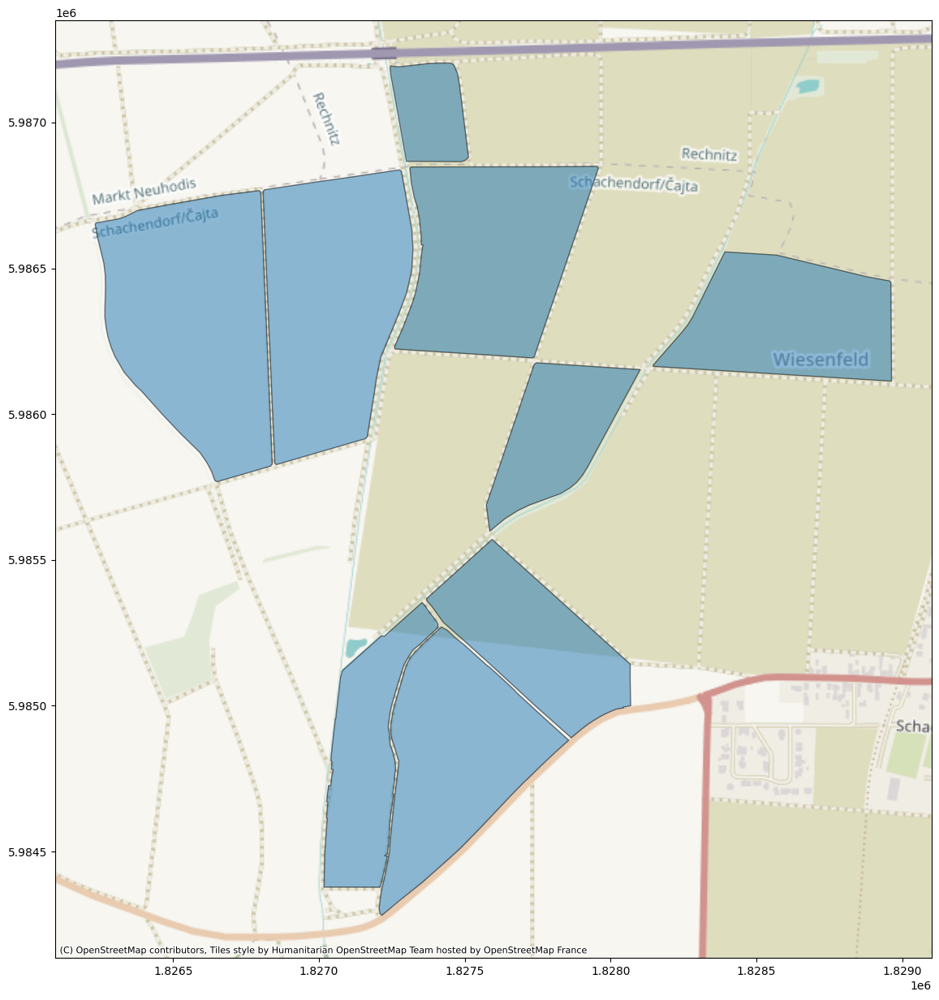

In [ ]:
# Read the land cover samples into a GeoDataFrame
polygons_gdf = gpd.read_file(austria_fields)

# Calculate the area for each geometry and add it as a new column
polygons_gdf["area"] = polygons_gdf.geometry.area

# Explore the GeoDataFrame, visualizing the 'area' column with a specified colormap
ax = polygons_gdf.plot(alpha=0.5, edgecolor="k", figsize=(15, 15))
cx.add_basemap(ax)

For each polygon, we define a Statistical API request. Requested statistical data will be calculated on `10`-meter resolution and aggregated per day with an available acquisition. We will also request histogram values.

#### The Evalscript

In [44]:
ndvi_evalscript = """
//VERSION=3

function setup() {
  return {
    input: [
      {
        bands: [
          "B04",
          "B08",
          "dataMask"
        ]
      }
    ],
    output: [
      {
        id: "ndvi",
        bands: 1
      },
      {
        id: "dataMask",
        bands: 1
      }
    ]
  }
}

function evaluatePixel(samples) {
    return {
      ndvi: [index(samples.B08, samples.B04)],
      dataMask: [samples.dataMask]
    };
}
"""

#### The Request Body

In [ ]:
yearly_time_interval = "2021-01-01", "2022-01-01"

aggregation = SentinelHubStatistical.aggregation(
    evalscript=ndvi_evalscript,
    time_interval=yearly_time_interval,
    aggregation_interval="P5D",
    resolution=(10, 10),
)

input_data = SentinelHubStatistical.input_data(
    DataCollection.SENTINEL2_L2A.define_from("s2l2a", service_url=config.sh_base_url),
    maxcc=0.1,
)

ndvi_requests = []

for geo_shape in polygons_gdf.geometry.values:
    request = SentinelHubStatistical(
        aggregation=aggregation,
        input_data=[input_data],
        geometry=Geometry(geo_shape, crs=CRS(polygons_gdf.crs)),
        config=config,
    )
    ndvi_requests.append(request)

Instead of triggering download for each request separately, we can pass request objects together to a download client object, which will execute them in parallel using multiple threads. This way the download process will be faster.

In [46]:
%%time

download_requests = [ndvi_request.download_list[0] for ndvi_request in ndvi_requests]

client = SentinelHubStatisticalDownloadClient(config=config)

ndvi_stats = client.download(download_requests)

len(ndvi_stats)

CPU times: user 41.8 ms, sys: 7.67 ms, total: 49.5 ms
Wall time: 3.76 s


9

#### Manipulation and Visualisation of the Output

Let's convert this data into a tabular form by transforming it into a `pandas` dataframe.

In [47]:
ndvi_dfs = [stats_to_df(polygon_stats) for polygon_stats in ndvi_stats]

for df, land_type in zip(ndvi_dfs, polygons_gdf["fid"].values):
    df["land_type"] = land_type

ndvi_df = pd.concat(ndvi_dfs)

ndvi_df

,interval_from,interval_to,ndvi_B0_min,ndvi_B0_max,ndvi_B0_mean,ndvi_B0_stDev,ndvi_B0_sampleCount,ndvi_B0_noDataCount,land_type
0,2021-01-21,2021-01-26,0.221835,0.591146,0.336966,0.061021,918,131,1285619
1,2021-01-31,2021-02-05,0.204225,0.545788,0.336207,0.056939,918,131,1285619
2,2021-02-10,2021-02-15,0.203320,0.511530,0.309759,0.047097,918,131,1285619
3,2021-02-20,2021-02-25,0.171245,0.359858,0.228883,0.025176,918,131,1285619
4,2021-02-25,2021-03-02,0.199802,0.499731,0.299961,0.044229,918,131,1285619
...,...,...,...,...,...,...,...,...,...
25,2021-11-02,2021-11-07,0.245798,0.606944,0.406494,0.044339,6435,3115,1294609
26,2021-11-22,2021-11-27,0.288432,0.614583,0.506816,0.053189,6435,3115,1294609
27,2021-12-07,2021-12-12,0.287169,0.655829,0.550864,0.052623,6435,3115,1294609
28,2021-12-17,2021-12-22,0.297894,0.698140,0.600836,0.056929,6435,3115,1294609


The following plot shows time series of mean values, buffered by standard deviation values.

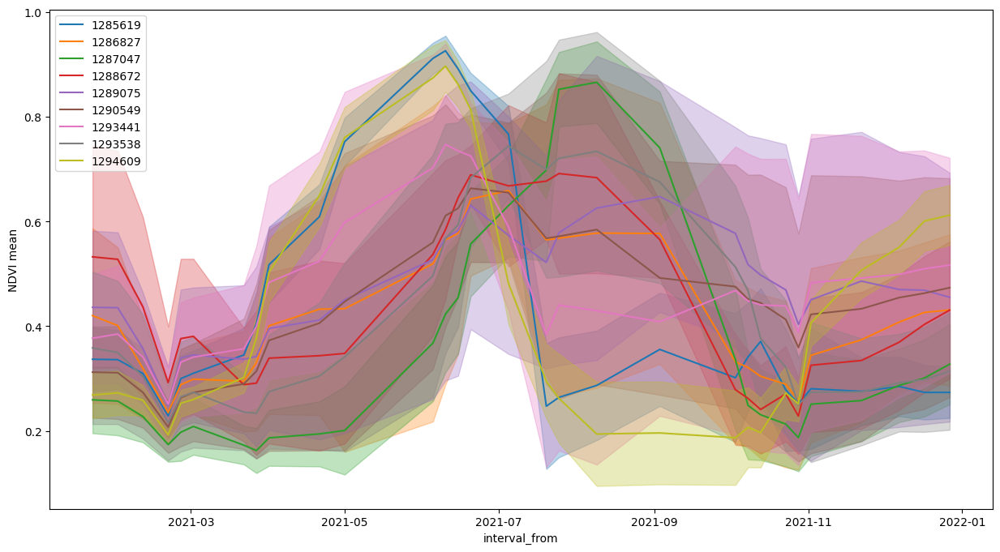

In [ ]:
fig, ax = plt.subplots(figsize=(15, 8))
ax.set_ylabel("NDVI mean")

for idx, land_type in enumerate(polygons_gdf["fid"].values):
    series = ndvi_df[ndvi_df["land_type"] == land_type]

    series.plot(
        ax=ax, x="interval_from", y="ndvi_B0_mean", color=f"C{idx}", label=land_type
    )

    ax.fill_between(
        series.interval_from.values,
        series["ndvi_B0_mean"] - series["ndvi_B0_stDev"],
        series["ndvi_B0_mean"] + series["ndvi_B0_stDev"],
        color=f"C{idx}",
        alpha=0.3,
    )

### Example 2: Generating Chloropeth maps derived from statistics and administrative boundaries

In this final example, we will run Statistical API on several administrative districts and extract the mean population for each district. We will then populate a geopandas dataframe with the geojson geometries and mean population statistics, before creating a simple Chloropeth map using GeoPandas. This will then show the population density of each district.

#### Creating the fields of interest

In [ ]:
graz_districts = """{
"type": "FeatureCollection",
"name": "3",
"crs": { "type": "name", "properties": { "name": "urn:ogc:def:crs:EPSG::3857" } },
"features": [
{ "type": "Feature", "properties": { "g_id": "60101", "g_name": "Graz" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1714802.01077179168351, 5944906.386133254505694 ], [ 1714733.24755479185842, 5944894.542524826712906 ], [ 1714727.286986366845667, 5944893.526174780912697 ], [ 1714673.245696756290272, 5944882.699322847649455 ], [ 1714671.007098466157913, 5944882.259481091052294 ], [ 1714649.958470629528165, 5944878.016341576352715 ], [ 1714614.976242370437831, 5944870.985782840289176 ], [ 1714607.809137559030205, 5944870.324925385415554 ], [ 1714578.360501911025494, 5944867.540622984059155 ], [ 1714540.795189145021141, 5944868.059371092356741 ], [ 1714515.941969131119549, 5944868.40002781432122 ], [ 1714508.174015686381608, 5944868.284217427484691 ], [ 1714496.522475755074993, 5944868.125174921937287 ], [ 1714489.311245291493833, 5944868.009172716178 ], [ 1714488.345373190939426, 5944868.049669267609715 ], [ 1714480.034731823019683, 5944868.462710857391357 ], [ 1714473.447750971885398, 5944868.682739935815334 ], [ 1714465.295423342846334, 5944868.988662522286177 ], [ 1714405.504061797633767, 5944871.129186507314444 ], [ 1714402.533241525059566, 5944871.25260232295841 ], [ 1714401.917957474244758, 5944871.254334725439548 ], [ 1714381.869093481916934, 5944871.554499719291925 ], [ 1714369.347313363337889, 5944871.727148671634495 ], [ 1714275.866858649300411, 5944869.181417819112539 ], [ 1714256.748587138019502, 5944868.662840804085135 ], [ 1714207.556011462351307, 5944867.7268061125651 ], [ 1714204.931885455269367, 5944867.664545177482069 ], [ 1714202.395990906748921, 5944867.61462617199868 ], [ 1714172.584671469870955, 5944866.616905832663178 ], [ 1714138.182367591420189, 5944865.418204488232732 ], [ 1714133.196476469747722, 5944865.242552688345313 ], [ 1714042.9562009323854, 5944862.225774309597909 ], [ 1714014.553892596624792, 5944861.322214316576719 ], [ 1713999.919488992774859, 5944860.830509521067142 ], [ 1713952.350757490145043, 5944859.247178859077394 ], [ 1713947.423823973163962, 5944859.084545354358852 ], [ 1713937.175057170912623, 5944858.784489607438445 ], [ 1713932.790983550949022, 5944858.651471574790776 ], [ 1713918.156200208235532, 5944858.144941946491599 ], [ 1713881.731653923401609, 5944856.925620700232685 ], [ 1713880.338488625595346, 5944856.874556663446128 ], [ 1713879.629785483470187, 5944856.114519354887307 ], [ 1713869.332615510560572, 5944845.131279777735472 ], [ 1713865.184836252359673, 5944840.641757612116635 ], [ 1713790.189610570902005, 5944845.122957156039774 ], [ 1713750.553183410316706, 5944847.648056874983013 ], [ 1713688.361899451352656, 5944853.213010653853416 ], [ 1713685.886638005264103, 5944853.793277627788484 ], [ 1713654.92867675749585, 5944860.951487312093377 ], [ 1713634.09053772315383, 5944867.414083439856768 ], [ 1713612.054655853193253, 5944876.230564798228443 ], [ 1713603.554223911371082, 5944879.440162318758667 ], [ 1713577.774952846113592, 5944890.193248357623816 ], [ 1713576.079498293576762, 5944890.899704417213798 ], [ 1713573.267144553828984, 5944889.81349656637758 ], [ 1713556.865412382408977, 5944883.430632181465626 ], [ 1713532.364711403148249, 5944864.962152791209519 ], [ 1713499.447315706405789, 5944877.256945963017642 ], [ 1713492.281724832952023, 5944879.975336397066712 ], [ 1713468.920883078128099, 5944909.622409314848483 ], [ 1713466.304555745562539, 5944912.072840282693505 ], [ 1713441.833076593233272, 5944935.18006301485002 ], [ 1713425.754062098218128, 5944950.436547203920782 ], [ 1713414.35609870753251, 5944959.322467636317015 ], [ 1713398.81473473040387, 5944976.078411107882857 ], [ 1713388.960875634336844, 5944986.848547485657036 ], [ 1713383.164333534892648, 5944993.145887866616249 ], [ 1713375.174428533762693, 5945001.823625154793262 ], [ 1713375.802157551283017, 5945004.511147318407893 ], [ 1713372.241181087680161, 5945003.371275664307177 ], [ 1713364.689610010711476, 5945000.911890027113259 ], [ 1713356.399030227679759, 5944998.20759957190603 ], [ 1713348.89138993457891, 5944995.747034105472267 ], [ 1713335.804842570563778, 5944999.504506783559918 ], [ 1713308.623645934509113, 5945008.236626504920423 ], [ 1713284.908053447725251, 5945019.492612798698246 ], [ 1713229.312661714851856, 5945035.769404699094594 ], [ 1713208.88171733636409, 5945039.369078388437629 ], [ 1713205.737848087912425, 5945039.599556836299598 ], [ 1713189.228290125727654, 5945040.787617390975356 ], [ 1713175.837073735427111, 5945043.553569721989334 ], [ 1713115.331340524600819, 5945125.831695721484721 ], [ 1713105.062486317474395, 5945139.772552805021405 ], [ 1713104.736984610324726, 5945140.207408310845494 ], [ 1713100.39530760073103, 5945146.128001542761922 ], [ 1713091.475440529407933, 5945158.445777396671474 ], [ 1713083.542021952569485, 5945166.504621230065823 ], [ 1713054.663166634272784, 5945195.88646140601486 ], [ 1713008.967368044657633, 5945242.043176014907658 ], [ 1712989.812166536226869, 5945266.816594451665878 ], [ 1712986.320074014365673, 5945271.068577620200813 ], [ 1712976.262634713202715, 5945284.15145275183022 ], [ 1712924.225767417578027, 5945361.576003718189895 ], [ 1712909.531030132668093, 5945383.277053508907557 ], [ 1712891.452785727102309, 5945416.135062452405691 ], [ 1712859.206122203730047, 5945474.002014331519604 ], [ 1712856.971463363384828, 5945477.854869493283331 ], [ 1712856.972423832165077, 5945477.863515580072999 ], [ 1712852.576986192492768, 5945505.155484437011182 ], [ 1712835.554860577918589, 5945500.939257444813848 ], [ 1712811.599702088395134, 5945493.686749765649438 ], [ 1712743.844366284552962, 5945449.341369103640318 ], [ 1712717.417438741307706, 5945432.044211847707629 ], [ 1712696.843433988280594, 5945418.839746789075434 ], [ 1712675.013629609020427, 5945417.487776478752494 ], [ 1712548.302030942868441, 5945411.321919469162822 ], [ 1712493.655566386179999, 5945418.765246026217937 ], [ 1712387.747969733551145, 5945441.858875985257328 ], [ 1712314.919566212454811, 5945462.28429026901722 ], [ 1712260.430660150712356, 5945494.154458596371114 ], [ 1712261.81150331068784, 5945487.268281737342477 ], [ 1712232.903576005017385, 5945505.655318785458803 ], [ 1712210.24997678748332, 5945520.070207521319389 ], [ 1712143.872623815434054, 5945562.273340549319983 ], [ 1712142.623336369171739, 5945586.795666434802115 ], [ 1712150.393507400527596, 5945605.309547082521021 ], [ 1712148.662407756550238, 5945614.042717807926238 ], [ 1712107.733654292300344, 5945605.846525360830128 ], [ 1712080.450162564404309, 5945609.846500196494162 ], [ 1712036.375622012652457, 5945628.006538518704474 ], [ 1711975.135272540384904, 5945650.17223265580833 ], [ 1711910.325510405935347, 5945672.029389936476946 ], [ 1711910.314012686023489, 5945672.026754044927657 ], [ 1711888.5818999519106, 5945681.236739450134337 ], [ 1711857.679223861545324, 5945683.060208089649677 ], [ 1711831.293132153572515, 5945685.809774423018098 ], [ 1711807.533232289599255, 5945691.423770630732179 ], [ 1711785.576587026007473, 5945700.452777275815606 ], [ 1711752.642887383699417, 5945718.703832518309355 ], [ 1711702.313534121727571, 5945750.19652021676302 ], [ 1711690.597205083118752, 5945758.792550181038678 ], [ 1711676.053075673058629, 5945779.545533796772361 ], [ 1711663.071242832578719, 5945801.874695201404393 ], [ 1711651.390353669878095, 5945825.585878852754831 ], [ 1711639.215429816162214, 5945844.164768652059138 ], [ 1711627.252155370078981, 5945857.399434086866677 ], [ 1711615.48263298207894, 5945863.130577302537858 ], [ 1711606.765425354707986, 5945864.712893378920853 ], [ 1711591.379016569582745, 5945865.655210657976568 ], [ 1711582.157824607333168, 5945866.54102071467787 ], [ 1711570.35170323587954, 5945870.03865722566843 ], [ 1711518.789623831864446, 5945887.345864281989634 ], [ 1711514.067474694456905, 5945888.866699484176934 ], [ 1711512.412119901040569, 5945889.439479897730052 ], [ 1711474.725004177074879, 5945902.250416627153754 ], [ 1711457.040074775228277, 5945908.419513031840324 ], [ 1711451.044130619382486, 5945910.447617392987013 ], [ 1711425.391334490152076, 5945924.106126803904772 ], [ 1711410.828902572393417, 5945929.50908166076988 ], [ 1711398.119293439202011, 5945931.864595119841397 ], [ 1711381.971301469486207, 5945933.753778495825827 ], [ 1711381.922041115118191, 5945933.769480850547552 ], [ 1711287.490587227744982, 5945935.566505261696875 ], [ 1711208.291926754871383, 5945944.986670602113008 ], [ 1711127.045263681327924, 5945967.423919280990958 ], [ 1711079.063000370748341, 5945960.308713562786579 ], [ 1711020.5177079543937, 5945951.560381956398487 ], [ 1710995.786965131759644, 5945963.425780920311809 ], [ 1710995.184429123764858, 5945970.643799345940351 ], [ 1710994.18286257609725, 5945984.457170546986163 ], [ 1710993.201746126869693, 5945997.931963302195072 ], [ 1710990.007457843516022, 5946043.331134282052517 ], [ 1710988.307150327134877, 5946066.849286311306059 ], [ 1710987.234933627769351, 5946081.884641804732382 ], [ 1710991.150481019169092, 5946171.692799300886691 ], [ 1710999.431460289750248, 5946250.245360826142132 ], [ 1710999.725982673931867, 5946253.103875331580639 ], [ 1711000.055934937670827, 5946256.1966393571347 ], [ 1710974.587110821623355, 5946256.116962830536067 ], [ 1710958.290843269554898, 5946256.03114181663841 ], [ 1710947.155379723059013, 5946256.059439178556204 ], [ 1710939.052902133436874, 5946256.081450405530632 ], [ 1710921.089655109681189, 5946256.127592488192022 ], [ 1710855.556453544879332, 5946278.91408639959991 ], [ 1710847.236794968135655, 5946288.010897523723543 ], [ 1710821.623708157101646, 5946316.068173734471202 ], [ 1710781.665361867984757, 5946394.06740974728018 ], [ 1710755.634478575317189, 5946444.302004156634212 ], [ 1710755.216281515546143, 5946445.121443903073668 ], [ 1710721.922024301253259, 5946505.086860556155443 ], [ 1710701.112011542543769, 5946536.428474609740078 ], [ 1710690.565692457836121, 5946552.30145609471947 ], [ 1710622.61159773147665, 5946637.960850534960628 ], [ 1710622.642584312940016, 5946642.516856582835317 ], [ 1710624.394472767831758, 5946679.322377288714051 ], [ 1710615.771407053805888, 5946679.063757921569049 ], [ 1710606.814485760172829, 5946710.932326964102685 ], [ 1710583.472416791366413, 5946751.410517201758921 ], [ 1710571.486219966551289, 5946850.271949065849185 ], [ 1710558.866363771958277, 5946918.119603567756712 ], [ 1710549.705012241378427, 5946983.172162366099656 ], [ 1710555.590682369656861, 5947018.915092423558235 ], [ 1710559.805703763850033, 5947044.54425725992769 ], [ 1710560.677814463386312, 5947049.886896436102688 ], [ 1710561.579195628874004, 5947096.227486767806113 ], [ 1710546.964008911047131, 5947170.744548751041293 ], [ 1710537.118422713363543, 5947207.90088224876672 ], [ 1710528.541049478808418, 5947229.074112385511398 ], [ 1710517.38326889462769, 5947251.88806925714016 ], [ 1710506.951102351071313, 5947292.970441446639597 ], [ 1710511.215711140306666, 5947327.243063779547811 ], [ 1710533.265429815975949, 5947378.145782672800124 ], [ 1710546.549799571977928, 5947420.546641064807773 ], [ 1710548.802913833875209, 5947468.147381730377674 ], [ 1710537.325261406600475, 5947539.939040352590382 ], [ 1710524.152261602226645, 5947575.964089566841722 ], [ 1710523.126698535867035, 5947578.784200487658381 ], [ 1710519.843742503784597, 5947587.764487891457975 ], [ 1710481.24177111312747, 5947641.128189514391124 ], [ 1710462.277252540457994, 5947675.379704725928605 ], [ 1710430.243556594243273, 5947751.916916933842003 ], [ 1710416.034148377133533, 5947785.8822609661147 ], [ 1710377.709450202062726, 5947899.971199583262205 ], [ 1710368.183602164732292, 5947942.708621117286384 ], [ 1710361.364402234554291, 5947992.579059423878789 ], [ 1710351.325409281998873, 5948039.814408541657031 ], [ 1710350.216926854103804, 5948093.431576874107122 ], [ 1710357.207121942657977, 5948131.634836670942605 ], [ 1710360.950084470678121, 5948144.783088712953031 ], [ 1710361.322179838782176, 5948146.125906364060938 ], [ 1710379.165838103741407, 5948208.802876670844853 ], [ 1710384.942192521411926, 5948251.596125480718911 ], [ 1710388.237605094909668, 5948349.323430149815977 ], [ 1710398.708234556019306, 5948486.148614331148565 ], [ 1710400.488302617799491, 5948509.449538907036185 ], [ 1710401.886760069290176, 5948520.924956560134888 ], [ 1710417.856111989589408, 5948619.043168800882995 ], [ 1710425.123547715367749, 5948653.80096185952425 ], [ 1710425.426271664444357, 5948655.292704186402261 ], [ 1710440.831403144402429, 5948728.946793598122895 ], [ 1710441.105242697754875, 5948737.761368622072041 ], [ 1710441.345277475658804, 5948745.84169180970639 ], [ 1710432.234075822168961, 5948780.338735881261528 ], [ 1710427.004210483282804, 5948788.312679486349225 ], [ 1710413.458555800141767, 5948809.017121125943959 ], [ 1710402.253398752072826, 5948819.426832576282322 ], [ 1710388.372013046173379, 5948832.31806203071028 ], [ 1710366.890240002889186, 5948849.96664079837501 ], [ 1710330.369407346937805, 5948879.963344926945865 ], [ 1710306.252313981764019, 5948891.549749166704714 ], [ 1710297.537640949245542, 5948895.733456912450492 ], [ 1710275.279989488422871, 5948911.182086517103016 ], [ 1710268.8440446855966, 5948915.629490709863603 ], [ 1710241.114516298985109, 5948941.028624525293708 ], [ 1710236.636307202279568, 5948945.233547014184296 ], [ 1710215.641702197026461, 5948964.163080726750195 ], [ 1710212.792600355111063, 5948967.325467478483915 ], [ 1710188.416707718744874, 5948994.312839862890542 ], [ 1710150.720712567213923, 5949047.894948745146394 ], [ 1710131.794083061395213, 5949074.768989963456988 ], [ 1710113.824938416248187, 5949095.074906498193741 ], [ 1710107.688181861303747, 5949102.014040094800293 ], [ 1710103.701233299449086, 5949106.514869193546474 ], [ 1710101.373238960513845, 5949109.428357169032097 ], [ 1710099.088038328103721, 5949112.296613497659564 ], [ 1710088.655215514125302, 5949125.376776739023626 ], [ 1710073.516792266862467, 5949157.018565025180578 ], [ 1710072.488328437786549, 5949159.177536679431796 ], [ 1710065.586344852577895, 5949191.33882496971637 ], [ 1710063.440504814730957, 5949204.628372422419488 ], [ 1710063.339771477971226, 5949205.263271061703563 ], [ 1710061.510773325106129, 5949216.647756810300052 ], [ 1710056.069335595704615, 5949250.30017776787281 ], [ 1710054.285362440394238, 5949260.036714392714202 ], [ 1710032.891232152003795, 5949356.010656985454261 ], [ 1710020.76694160932675, 5949393.661684491671622 ], [ 1710001.525935929268599, 5949455.24638891313225 ], [ 1709996.737156045623124, 5949470.061248546466231 ], [ 1709984.660149385221303, 5949499.403590759262443 ], [ 1709962.643828361062333, 5949545.048646561801434 ], [ 1709948.299410664476454, 5949575.141662165522575 ], [ 1709934.288105679908767, 5949604.520222927443683 ], [ 1709925.997644007904455, 5949621.662044594995677 ], [ 1709920.346125488635153, 5949633.749997991137207 ], [ 1709905.425930950092152, 5949665.387580746784806 ], [ 1709904.10936214029789, 5949667.745356108061969 ], [ 1709891.350908607942984, 5949695.709125824272633 ], [ 1709885.78871490038, 5949707.853636432439089 ], [ 1709883.433236765442416, 5949711.973753249272704 ], [ 1709883.180645539425313, 5949712.406797522678971 ], [ 1709875.86198728531599, 5949725.214895443059504 ], [ 1709859.635781915392727, 5949750.049256580881774 ], [ 1709842.662907460471615, 5949776.050161187537014 ], [ 1709840.731310775969177, 5949778.997534599155188 ], [ 1709830.128779396647587, 5949795.744263078086078 ], [ 1709824.217024130281061, 5949805.162940503098071 ], [ 1709816.484337011585012, 5949817.276127742603421 ], [ 1709809.12880617682822, 5949828.673626633360982 ], [ 1709789.225315484218299, 5949858.67752218618989 ], [ 1709770.370027234777808, 5949892.918454142287374 ], [ 1709743.660547914449126, 5949939.687677873298526 ], [ 1709741.388631664449349, 5949943.643921465612948 ], [ 1709739.338624243624508, 5949946.550309699960053 ], [ 1709738.759022059151903, 5949947.374244350008667 ], [ 1709723.262457961216569, 5949969.292989579029381 ], [ 1709723.907849865499884, 5949975.511022839695215 ], [ 1709730.996392798842862, 5950044.05701217520982 ], [ 1709737.790217362809926, 5950089.421135010197759 ], [ 1709737.918145363451913, 5950115.769524314440787 ], [ 1709735.487622525077313, 5950144.640703621320426 ], [ 1709731.797158323694021, 5950194.970627318136394 ], [ 1709731.169091728515923, 5950200.133936427533627 ], [ 1709730.913406865671277, 5950202.140556017868221 ], [ 1709730.736302363919094, 5950206.042114754207432 ], [ 1709730.217525148065761, 5950212.026073383167386 ], [ 1709723.45656454958953, 5950287.480167116969824 ], [ 1709723.388531295349821, 5950288.246633863076568 ], [ 1709722.979949524393305, 5950292.83074018266052 ], [ 1709722.944138662191108, 5950294.272818948142231 ], [ 1709721.584418883314356, 5950303.999337800778449 ], [ 1709721.617405324010178, 5950304.704341281205416 ], [ 1709721.649627740029246, 5950305.379953701980412 ], [ 1709722.057556949788705, 5950314.86907384544611 ], [ 1709724.01952404063195, 5950322.670528085902333 ], [ 1709728.50755158928223, 5950337.979293806478381 ], [ 1709730.004073665477335, 5950343.10181531496346 ], [ 1709734.492504379479215, 5950358.425309387035668 ], [ 1709738.303766263648868, 5950371.384225642308593 ], [ 1709739.928196007618681, 5950376.915178052149713 ], [ 1709740.556465366389602, 5950379.089887681417167 ], [ 1709742.93706486443989, 5950387.203969382680953 ], [ 1709744.545322414021939, 5950392.676531380973756 ], [ 1709737.961625665659085, 5950398.260462808422744 ], [ 1709722.314021326368675, 5950411.581412377767265 ], [ 1709707.750557172112167, 5950427.697499965317547 ], [ 1709674.800258808070794, 5950464.559069246985018 ], [ 1709631.541731189237908, 5950516.013740191236138 ], [ 1709624.432337747886777, 5950523.376114665530622 ], [ 1709612.376145055983216, 5950537.264907176606357 ], [ 1709590.555504908552393, 5950562.409045647829771 ], [ 1709585.484845675295219, 5950569.247534729540348 ], [ 1709578.067476234398782, 5950576.044430907815695 ], [ 1709572.383064514258876, 5950581.266599797643721 ], [ 1709561.758089048555121, 5950591.000308099202812 ], [ 1709570.528888383181766, 5950589.462201980873942 ], [ 1709575.574714496731758, 5950587.874403180554509 ], [ 1709595.626912371022627, 5950581.556020464748144 ], [ 1709607.409565893001854, 5950578.01265009958297 ], [ 1709644.415367217967287, 5950566.868506783619523 ], [ 1709686.381632597651333, 5950554.241532138548791 ], [ 1709736.256342572160065, 5950535.672169726341963 ], [ 1709808.20099011156708, 5950508.907391393557191 ], [ 1709819.649188937852159, 5950512.240161899477243 ], [ 1709948.584870123770088, 5950459.306251749396324 ], [ 1710053.152377174701542, 5950437.832370993681252 ], [ 1710056.404390916926786, 5950437.173652710393071 ], [ 1710087.420151397353038, 5950430.802289575338364 ], [ 1710100.893918395740911, 5950428.037510328926146 ], [ 1710116.934197120601311, 5950424.749579128809273 ], [ 1710160.396380575373769, 5950398.125522379763424 ], [ 1710173.527555987006053, 5950390.090264374390244 ], [ 1710187.668529864866287, 5950379.175618658773601 ], [ 1710196.77965529076755, 5950372.142761719413102 ], [ 1710204.554750017821789, 5950366.159615040756762 ], [ 1710213.895650532096624, 5950358.944258440285921 ], [ 1710217.531984745524824, 5950356.157794125378132 ], [ 1710219.601353579666466, 5950354.559449850581586 ], [ 1710223.061563665512949, 5950355.70401147287339 ], [ 1710257.453639511717483, 5950366.96389401704073 ], [ 1710296.867915839655325, 5950378.547827390022576 ], [ 1710336.289397243410349, 5950393.778429228812456 ], [ 1710375.000873703509569, 5950413.82158453669399 ], [ 1710402.557523388415575, 5950433.348476795479655 ], [ 1710442.638753615086898, 5950470.487800213508308 ], [ 1710460.931308800121769, 5950496.787163338623941 ], [ 1710476.416107550496235, 5950526.160276538692415 ], [ 1710496.057677039410919, 5950566.512692969292402 ], [ 1710494.791215782286599, 5950569.104783738031983 ], [ 1710493.761539396829903, 5950571.220066927373409 ], [ 1710487.717837645439431, 5950585.128850052133203 ], [ 1710489.620768469758332, 5950595.6966821718961 ], [ 1710490.438976060366258, 5950600.087029596790671 ], [ 1710501.01514931791462, 5950657.648634537123144 ], [ 1710503.66461528558284, 5950672.667641467414796 ], [ 1710507.138148134341463, 5950691.738668972626328 ], [ 1710517.612757590832189, 5950749.332942281849682 ], [ 1710540.773940021870658, 5950842.522417278960347 ], [ 1710556.615668356185779, 5950908.580101415514946 ], [ 1710572.733665185980499, 5950961.05672060046345 ], [ 1710594.268840949283913, 5951027.28929965570569 ], [ 1710607.388417451409623, 5951063.167713346891105 ], [ 1710607.460999453673139, 5951079.431616584770381 ], [ 1710609.341822875430807, 5951118.355579466558993 ], [ 1710611.171957460232079, 5951155.898586825467646 ], [ 1710613.607727045426145, 5951199.79402123298496 ], [ 1710614.351587758166716, 5951213.128540219739079 ], [ 1710614.784771045437083, 5951220.176584125496447 ], [ 1710617.000211679143831, 5951237.090448132716119 ], [ 1710618.527008244767785, 5951268.626680148765445 ], [ 1710625.765219018096104, 5951293.733028130605817 ], [ 1710639.450770680559799, 5951333.862760500051081 ], [ 1710642.02424005093053, 5951340.898808983154595 ], [ 1710642.277076707687229, 5951341.598120368085802 ], [ 1710648.58861964661628, 5951380.627486024051905 ], [ 1710649.303270262898877, 5951384.976814915426075 ], [ 1710650.683451123768464, 5951388.985101956874132 ], [ 1710652.571501968195662, 5951401.21621211618185 ], [ 1710656.596331654815003, 5951428.466371238231659 ], [ 1710658.805841324850917, 5951444.586581691168249 ], [ 1710658.912549948785454, 5951445.304446863010526 ], [ 1710660.90311335795559, 5951458.091828288510442 ], [ 1710662.198937345761806, 5951473.471299733966589 ], [ 1710664.89608555007726, 5951505.462991906329989 ], [ 1710668.014652078738436, 5951540.679418713785708 ], [ 1710668.585972256725654, 5951547.400528262369335 ], [ 1710709.07540923031047, 5951604.991297482512891 ], [ 1710708.408541092183441, 5951609.774141099303961 ], [ 1710707.592327798483893, 5951615.575749180279672 ], [ 1710705.435568576911464, 5951632.928804053924978 ], [ 1710703.779514867579564, 5951645.312190774828196 ], [ 1710699.724330242257565, 5951667.45111720263958 ], [ 1710699.261377239832655, 5951694.084598234854639 ], [ 1710699.413602320477366, 5951716.20135857257992 ], [ 1710716.660374772967771, 5951720.851907458156347 ], [ 1710724.17703087371774, 5951772.88260406255722 ], [ 1710727.519892711658031, 5951789.723772902972996 ], [ 1710717.918326226761565, 5951822.378042451106012 ], [ 1710717.110188961960375, 5951825.120283441618085 ], [ 1710697.413876545848325, 5951858.069297265261412 ], [ 1710688.747687000781298, 5951901.848082431592047 ], [ 1710687.383073766715825, 5951929.329629946500063 ], [ 1710695.459005075739697, 5951983.126620420254767 ], [ 1710686.435148407472298, 5952015.457514341920614 ], [ 1710673.206304479157552, 5952038.926779423840344 ], [ 1710655.06725483131595, 5952079.881169167347252 ], [ 1710635.727190689183772, 5952101.231227429583669 ], [ 1710632.55441607371904, 5952110.566281898878515 ], [ 1710630.742944131139666, 5952115.879549764096737 ], [ 1710632.453873011050746, 5952118.511587343178689 ], [ 1710638.228553356835619, 5952127.405741451308131 ], [ 1710654.200606887927279, 5952140.488788792863488 ], [ 1710676.300893732579425, 5952163.648112647235394 ], [ 1710685.526668235659599, 5952173.304732579737902 ], [ 1710740.191207267111167, 5952230.630133955739439 ], [ 1710758.356978089315817, 5952249.656726479530334 ], [ 1710846.49115736503154, 5952342.065891917794943 ], [ 1711001.038568202173337, 5952504.068198943510652 ], [ 1711101.178522683214396, 5952609.03254634514451 ], [ 1711241.939807776594535, 5952756.585827228613198 ], [ 1711330.853189718676731, 5952849.798913243226707 ], [ 1711341.241106694331393, 5952860.660646053962409 ], [ 1711369.57268892088905, 5952890.363774827681482 ], [ 1711385.826649399008602, 5952907.396239331923425 ], [ 1711388.072849031537771, 5952909.734780419617891 ], [ 1711396.094776886515319, 5952918.15816777292639 ], [ 1711363.904149945359677, 5952932.613195283338428 ], [ 1711340.529186616651714, 5952951.087082482874393 ], [ 1711320.435944137629122, 5952968.327102303504944 ], [ 1711316.383910343283787, 5953006.797891736030579 ], [ 1711312.39610345242545, 5953019.715511893853545 ], [ 1711295.041998500004411, 5953034.044373149983585 ], [ 1711290.276381036266685, 5953039.097825867123902 ], [ 1711282.22338646883145, 5953047.415277507156134 ], [ 1711274.216986312996596, 5953063.116051928140223 ], [ 1711268.049843074753881, 5953082.416557969525456 ], [ 1711267.553595107747242, 5953113.321307260543108 ], [ 1711270.880146291106939, 5953139.006263786926866 ], [ 1711269.850287426728755, 5953155.126572780311108 ], [ 1711266.139874095097184, 5953170.243647951632738 ], [ 1711258.520334002561867, 5953188.964793683961034 ], [ 1711251.60421047359705, 5953200.944747562520206 ], [ 1711238.961934361606836, 5953226.109034724533558 ], [ 1711211.237512653693557, 5953271.191476913169026 ], [ 1711204.996640684548765, 5953281.52084260713309 ], [ 1711193.419060116866603, 5953304.229994246736169 ], [ 1711180.635725629050285, 5953329.0598527751863 ], [ 1711170.742789972573519, 5953348.34127055760473 ], [ 1711165.72255510604009, 5953356.564344741404057 ], [ 1711161.656637949869037, 5953388.373116125352681 ], [ 1711156.226472199894488, 5953411.759172811172903 ], [ 1711152.443963654804975, 5953438.147068912163377 ], [ 1711158.533716649515554, 5953461.274131510406733 ], [ 1711164.483597601996735, 5953499.233604626730084 ], [ 1711169.60016645421274, 5953531.12480156775564 ], [ 1711170.770518594654277, 5953538.302407613955438 ], [ 1711187.508893139893189, 5953611.373214128427207 ], [ 1711194.889296885346994, 5953640.101135631091893 ], [ 1711205.38973951106891, 5953681.016213828697801 ], [ 1711207.252502405783162, 5953721.379209978505969 ], [ 1711207.613682507537305, 5953735.742721512913704 ], [ 1711246.758768111700192, 5953734.726631104946136 ], [ 1711283.436727624153718, 5953733.584097656421363 ], [ 1711334.898546047974378, 5953724.637394848279655 ], [ 1711365.341847052332014, 5953721.18725308123976 ], [ 1711426.180361671606079, 5953709.653836620040238 ], [ 1711473.542885751230642, 5953693.708784627728164 ], [ 1711482.643196592107415, 5953690.644306316971779 ], [ 1711529.294335960876197, 5953674.982534732669592 ], [ 1711617.696589765604585, 5953645.288109002634883 ], [ 1711652.789977744920179, 5953633.505433820188046 ], [ 1711700.402333531994373, 5953619.28858570754528 ], [ 1711754.167385292472318, 5953609.852066032588482 ], [ 1711780.739986715838313, 5953605.340465479530394 ], [ 1711790.804263177094981, 5953647.413732361979783 ], [ 1711798.743602238595486, 5953680.598797040991485 ], [ 1711799.847000064328313, 5953685.203738052397966 ], [ 1711799.996639634016901, 5953685.876509187743068 ], [ 1711810.014033478451893, 5953720.566259972751141 ], [ 1711816.486030247760937, 5953750.92159560136497 ], [ 1711824.92469705408439, 5953802.571521150879562 ], [ 1711831.672331022564322, 5953864.108476588502526 ], [ 1711801.114999860525131, 5953910.742105714045465 ], [ 1711800.593180169351399, 5953911.535602482035756 ], [ 1711775.704248356632888, 5953942.248711390420794 ], [ 1711759.372239201329648, 5953965.39480460062623 ], [ 1711758.929865423589945, 5953965.30349822062999 ], [ 1711758.490189069649205, 5953965.874151959083974 ], [ 1711757.917835058644414, 5953967.536981584504247 ], [ 1711745.702419734559953, 5954003.373775266110897 ], [ 1711728.531552431639284, 5954053.818028472363949 ], [ 1711727.783323189243674, 5954054.367405369877815 ], [ 1711724.06292107491754, 5954067.971175231039524 ], [ 1711710.00911582284607, 5954096.353702712804079 ], [ 1711746.364344887901098, 5954140.442591025494039 ], [ 1711759.418540745740756, 5954185.220172533765435 ], [ 1711763.616292731137946, 5954214.975145047530532 ], [ 1711772.333207517629489, 5954252.629125887528062 ], [ 1711777.844282747013494, 5954312.877819687128067 ], [ 1711778.654972519958392, 5954346.577291134744883 ], [ 1711773.949819631641731, 5954372.404179587028921 ], [ 1711771.349427934736013, 5954382.300771174952388 ], [ 1711761.916691234568134, 5954418.006974036805332 ], [ 1711751.174471691949293, 5954442.375017322599888 ], [ 1711737.164514334872365, 5954469.095105042681098 ], [ 1711718.928729134611785, 5954493.513887376524508 ], [ 1711694.928828903008252, 5954522.969426629133523 ], [ 1711657.133171180263162, 5954557.12924980558455 ], [ 1711638.725738220615312, 5954580.611004724167287 ], [ 1711631.831811887677759, 5954591.224276531487703 ], [ 1711605.815729017136618, 5954634.43079361692071 ], [ 1711585.096322567900643, 5954662.608201690018177 ], [ 1711561.86400775401853, 5954685.569944486021996 ], [ 1711556.635649511823431, 5954701.539038576185703 ], [ 1711547.221363807329908, 5954736.877965635620058 ], [ 1711516.317976566962898, 5954737.457422166131437 ], [ 1711506.4518031203188, 5954737.643986381590366 ], [ 1711513.842939826892689, 5954771.186311040073633 ], [ 1711507.633763606427237, 5954781.075420772656798 ], [ 1711421.647349026054144, 5954918.027456414885819 ], [ 1711396.16858832584694, 5954958.866588679142296 ], [ 1711432.479478587396443, 5955014.071108244359493 ], [ 1711447.265516799408942, 5955043.226262893527746 ], [ 1711417.968797407811508, 5955033.507629549130797 ], [ 1711386.402112256502733, 5955024.481409787200391 ], [ 1711352.814395745517686, 5955013.330728310160339 ], [ 1711319.632052808301523, 5955004.214435090310872 ], [ 1711289.25707361032255, 5954995.318350376561284 ], [ 1711255.269182134186849, 5954978.395468944683671 ], [ 1711210.766135880956426, 5954962.646891188807786 ], [ 1711167.304021699586883, 5954956.405023825354874 ], [ 1711114.532872628886253, 5954950.908216974698007 ], [ 1711096.82164966291748, 5954950.623968474566936 ], [ 1711088.751176559831947, 5954950.497951927594841 ], [ 1711080.431141550885513, 5954950.363781817257404 ], [ 1711031.540422403253615, 5954949.663927701301873 ], [ 1711003.661780033726245, 5954942.540403353050351 ], [ 1710960.767479530069977, 5954930.514924664050341 ], [ 1710912.365076146088541, 5954912.013080242089927 ], [ 1710911.540800861781463, 5954911.902335313148797 ], [ 1710881.844730785815045, 5954924.468590597622097 ], [ 1710828.546972447540611, 5954947.64560610242188 ], [ 1710805.34307183814235, 5954977.976686245761812 ], [ 1710795.377590528922155, 5954990.656790144741535 ], [ 1710783.725427824771032, 5955005.588255810551345 ], [ 1710766.375209045596421, 5955030.924817440100014 ], [ 1710735.28567373030819, 5955068.790592582896352 ], [ 1710717.960378827061504, 5955090.036181003786623 ], [ 1710700.37898070900701, 5955104.284798328764737 ], [ 1710676.635610016761348, 5955123.53608157299459 ], [ 1710635.046694935765117, 5955142.432085392996669 ], [ 1710617.82688367459923, 5955150.87389583978802 ], [ 1710598.246582859195769, 5955160.481198185123503 ], [ 1710594.988081135554239, 5955162.082283644936979 ], [ 1710569.353622656082734, 5955174.644128133542836 ], [ 1710524.897002468584105, 5955196.646041889674962 ], [ 1710490.613649961771443, 5955217.851061695255339 ], [ 1710449.798566680867225, 5955243.391437767073512 ], [ 1710416.626175163779408, 5955264.464115136303008 ], [ 1710408.156667428323999, 5955270.983907341957092 ], [ 1710382.302866875426844, 5955290.908078504726291 ], [ 1710372.267005637288094, 5955298.675493898801506 ], [ 1710362.461823465535417, 5955306.289712721481919 ], [ 1710344.069743886590004, 5955318.175523621030152 ], [ 1710339.709577153204009, 5955321.40926471631974 ], [ 1710320.916780452709645, 5955334.806388916447759 ], [ 1710325.17545052501373, 5955347.937348543666303 ], [ 1710327.218037950573489, 5955354.269685002975166 ], [ 1710324.104845910333097, 5955355.822746918536723 ], [ 1710335.272795217810199, 5955383.604348025284708 ], [ 1710341.328358559403569, 5955398.704082370735705 ], [ 1710363.442582509946078, 5955429.435784454457462 ], [ 1710368.086337718646973, 5955433.139661458320916 ], [ 1710390.240658703725785, 5955450.774677413515747 ], [ 1710412.125619416823611, 5955457.513467421755195 ], [ 1710427.433468234725296, 5955482.596940985880792 ], [ 1710431.89425360225141, 5955509.657251318916678 ], [ 1710424.398503913311288, 5955523.714869353920221 ], [ 1710431.223437291337177, 5955556.49604175798595 ], [ 1710432.468117357930169, 5955572.163690685294569 ], [ 1710432.854676643852144, 5955576.8621741887182 ], [ 1710436.137800426455215, 5955581.823084753938019 ], [ 1710447.206285218242556, 5955598.454288590699434 ], [ 1710460.227228652685881, 5955611.767646437510848 ], [ 1710478.619106261292472, 5955642.597516145557165 ], [ 1710473.59617325803265, 5955663.167916739359498 ], [ 1710479.901110538747162, 5955674.877138051204383 ], [ 1710496.484720611246303, 5955698.235457558184862 ], [ 1710494.882024531485513, 5955728.457367152906954 ], [ 1710494.130802795290947, 5955742.397222940810025 ], [ 1710493.96752018830739, 5955745.697612286545336 ], [ 1710493.883235632907599, 5955746.965293221175671 ], [ 1710503.453424115432426, 5955773.627416891045868 ], [ 1710507.888415737543255, 5955779.44106815289706 ], [ 1710521.270173563621938, 5955797.012450340203941 ], [ 1710528.292343760142103, 5955817.090465349145234 ], [ 1710538.389409156981856, 5955837.514529672451317 ], [ 1710551.753769038943574, 5955864.533437265083194 ], [ 1710557.116952256532386, 5955889.614095234312117 ], [ 1710585.598870878806338, 5955924.815063582733274 ], [ 1710586.190532544162124, 5955925.564710492268205 ], [ 1710615.428048093104735, 5955954.859845177270472 ], [ 1710621.310242355335504, 5955957.663103424943984 ], [ 1710623.849976672092453, 5955958.861903155222535 ], [ 1710629.74053509067744, 5955959.737256804481149 ], [ 1710630.432205620920286, 5955959.822096923366189 ], [ 1710631.60878224321641, 5955959.938346936367452 ], [ 1710651.619875190081075, 5955961.70831722766161 ], [ 1710671.712884519714862, 5955983.473968608304858 ], [ 1710673.571685983799398, 5955991.180033227428794 ], [ 1710684.087775288382545, 5956015.272143945097923 ], [ 1710694.789174932055175, 5956023.422835323959589 ], [ 1710701.404164630454034, 5956025.073738683946431 ], [ 1710739.123210027813911, 5956054.440283339470625 ], [ 1710746.724328175419942, 5956065.203443738631904 ], [ 1710766.064535747049376, 5956072.729776240885258 ], [ 1710770.438014829531312, 5956079.545758868567646 ], [ 1710778.157508509932086, 5956114.497872639447451 ], [ 1710776.695544263580814, 5956136.594683933071792 ], [ 1710773.168324555503204, 5956150.387449192814529 ], [ 1710773.889296779409051, 5956163.950868471525609 ], [ 1710771.653585784835741, 5956174.957938290201128 ], [ 1710771.237862213049084, 5956177.014316345565021 ], [ 1710774.71383629203774, 5956182.603148434311152 ], [ 1710776.749593266518787, 5956185.845920434221625 ], [ 1710777.02575620636344, 5956186.309558898210526 ], [ 1710780.118348298128694, 5956191.260987787507474 ], [ 1710789.000281491782516, 5956193.205454230308533 ], [ 1710791.213435604004189, 5956193.691762117668986 ], [ 1710817.461915565654635, 5956199.476684888824821 ], [ 1710836.712511941324919, 5956200.751235851086676 ], [ 1710851.082609249977395, 5956202.198196372017264 ], [ 1710862.728376725921407, 5956210.544770586304367 ], [ 1710869.148883969988674, 5956221.58922659419477 ], [ 1710872.313953669508919, 5956242.225558877922595 ], [ 1710878.544427442597225, 5956259.470324824564159 ], [ 1710881.791778350481763, 5956272.025682349689305 ], [ 1710892.180517303291708, 5956297.946433307603002 ], [ 1710898.893686437048018, 5956303.906363882124424 ], [ 1710903.963885135482997, 5956305.377055516466498 ], [ 1710913.395021704258397, 5956306.438754364848137 ], [ 1710915.931983249960467, 5956309.771371787413955 ], [ 1710920.087764313910156, 5956323.965779352933168 ], [ 1710922.301973453490064, 5956341.331010377034545 ], [ 1710922.70397504651919, 5956352.78403402864933 ], [ 1710931.237111071357504, 5956372.808584690093994 ], [ 1710936.550698573468253, 5956383.028792400844395 ], [ 1710944.653696001973003, 5956391.645198537036777 ], [ 1710957.528053069952875, 5956397.031064414419234 ], [ 1710967.065216140588745, 5956399.899982208386064 ], [ 1710967.863455569837242, 5956403.499092253856361 ], [ 1710967.543442802969366, 5956413.705620628781617 ], [ 1710968.857421279186383, 5956417.953386683017015 ], [ 1710971.909964101621881, 5956424.171505256555974 ], [ 1710983.662558175390586, 5956433.221694035455585 ], [ 1710988.753681106958538, 5956438.856419892981648 ], [ 1710990.32619634247385, 5956446.82053014729172 ], [ 1710988.32745659048669, 5956450.610960648395121 ], [ 1710986.126350202830508, 5956448.343739138916135 ], [ 1710984.866407295921817, 5956447.847107188776135 ], [ 1710982.649385247146711, 5956446.654568771831691 ], [ 1710975.465092294383794, 5956447.932525107637048 ], [ 1710964.988225144799799, 5956451.769359943456948 ], [ 1710959.059916654136032, 5956454.515296132303774 ], [ 1710948.546514424029738, 5956453.025894129648805 ], [ 1710935.303216025466099, 5956455.978914694860578 ], [ 1710934.442884762538597, 5956456.178132049739361 ], [ 1710929.031121082603931, 5956462.972073380835354 ], [ 1710926.249601912219077, 5956466.562341577373445 ], [ 1710920.359542499296367, 5956468.527301953174174 ], [ 1710913.886694588698447, 5956472.891574836336076 ], [ 1710910.491488908184692, 5956471.523972596041858 ], [ 1710908.44640477350913, 5956463.999017055146396 ], [ 1710904.546684198314324, 5956457.920853122137487 ], [ 1710891.687851184280589, 5956454.815434951335192 ], [ 1710880.273690329631791, 5956449.170302491635084 ], [ 1710873.219163369154558, 5956452.60800739377737 ], [ 1710870.626136588398367, 5956453.868174911476672 ], [ 1710869.351420892868191, 5956454.49032736569643 ], [ 1710865.048604700015858, 5956455.442262682132423 ], [ 1710860.716083230217919, 5956456.380260924808681 ], [ 1710858.87423458811827, 5956457.193913634866476 ], [ 1710851.186620291089639, 5956460.54523534886539 ], [ 1710761.164411440026015, 5956499.627799729816616 ], [ 1710631.321638642344624, 5956556.517151677981019 ], [ 1710592.712077820440754, 5956573.483385433442891 ], [ 1710577.526631554123014, 5956580.165927652269602 ], [ 1710486.803538473788649, 5956620.029745139181614 ], [ 1710484.700418740510941, 5956620.953202467411757 ], [ 1710478.640399147523567, 5956615.284632057882845 ], [ 1710447.551809723721817, 5956597.204924308694899 ], [ 1710407.134426252916455, 5956603.371992690488696 ], [ 1710387.761003574589267, 5956600.230668622069061 ], [ 1710363.931192925898358, 5956590.466198486275971 ], [ 1710346.035926402779296, 5956588.87535616569221 ], [ 1710328.973129368154332, 5956583.200983015820384 ], [ 1710303.773509946884587, 5956575.473691564053297 ], [ 1710294.03084455570206, 5956569.783874766901135 ], [ 1710291.125716405687854, 5956568.079408179037273 ], [ 1710289.512029717443511, 5956569.769932082854211 ], [ 1710284.95688994997181, 5956574.554399410262704 ], [ 1710270.959406482987106, 5956594.74411132466048 ], [ 1710263.967749658739194, 5956600.607886668294668 ], [ 1710255.615119982510805, 5956614.483524078503251 ], [ 1710248.841585347894579, 5956641.106183202937245 ], [ 1710243.483136595459655, 5956658.979774139821529 ], [ 1710238.285780834499747, 5956671.212829775176942 ], [ 1710236.50456644454971, 5956686.181869747117162 ], [ 1710238.237418293952942, 5956706.518571087159216 ], [ 1710231.494001476792619, 5956725.856087683700025 ], [ 1710217.367383798351511, 5956754.055176944471896 ], [ 1710206.022285702172667, 5956771.894599759951234 ], [ 1710205.615033861948177, 5956781.603433058597147 ], [ 1710208.844055361347273, 5956786.728422963991761 ], [ 1710209.279322199290618, 5956818.0779148042202 ], [ 1710212.5494414861314, 5956834.916232875548303 ], [ 1710211.136458229040727, 5956852.760346944443882 ], [ 1710199.506524791708216, 5956887.266671229153872 ], [ 1710200.790663355495781, 5956917.976169789209962 ], [ 1710186.323952704900876, 5956959.606428801082075 ], [ 1710180.248219524044544, 5956978.117531520314515 ], [ 1710159.860039447667077, 5957004.20033438783139 ], [ 1710142.139948385069147, 5957040.912434855476022 ], [ 1710123.607445849338546, 5957080.236127119511366 ], [ 1710108.553862232947722, 5957120.763895379379392 ], [ 1710095.465847210027277, 5957167.480381915345788 ], [ 1710091.125446010380983, 5957186.726394820958376 ], [ 1710087.126395364291966, 5957204.432915885932744 ], [ 1710081.651678013149649, 5957215.614254844374955 ], [ 1710062.591694967355579, 5957240.33816350530833 ], [ 1710069.420652143191546, 5957254.685196879319847 ], [ 1710088.780095495283604, 5957280.904600995592773 ], [ 1710087.187398359179497, 5957302.566100884228945 ], [ 1710086.831470739096403, 5957307.491024888120592 ], [ 1710106.790518061025068, 5957336.44699782691896 ], [ 1710102.97027305723168, 5957357.077915627509356 ], [ 1710105.114889294141904, 5957374.079261900857091 ], [ 1710122.297317769378424, 5957394.998825439251959 ], [ 1710128.598933216184378, 5957405.989574917592108 ], [ 1710129.534269492141902, 5957417.680228179320693 ], [ 1710145.90891462797299, 5957438.562150831334293 ], [ 1710154.429603238590062, 5957471.659526590257883 ], [ 1710193.899704899871722, 5957528.656858768314123 ], [ 1710205.832736554555595, 5957556.999543450772762 ], [ 1710214.383489911677316, 5957579.411379414610565 ], [ 1710224.922413162421435, 5957587.465387795120478 ], [ 1710220.04818903747946, 5957599.735400352627039 ], [ 1710216.43446910683997, 5957605.76143754273653 ], [ 1710219.868161940248683, 5957615.915066982619464 ], [ 1710226.796536182519048, 5957623.357301587238908 ], [ 1710233.90518271131441, 5957630.397427256219089 ], [ 1710238.803765148157254, 5957641.587081914767623 ], [ 1710240.83461840567179, 5957653.646705500781536 ], [ 1710247.578919638413936, 5957665.84768794849515 ], [ 1710245.789726963499561, 5957670.383582674898207 ], [ 1710242.309992409544066, 5957686.620459917932749 ], [ 1710242.427479916717857, 5957700.702527497895062 ], [ 1710239.721823764964938, 5957707.793970711529255 ], [ 1710235.475929610431194, 5957718.840804760344326 ], [ 1710215.645268377382308, 5957753.433083040639758 ], [ 1710209.130442989058793, 5957760.742161547765136 ], [ 1710205.000606691930443, 5957765.545508843846619 ], [ 1710183.488980156369507, 5957781.2396544739604 ], [ 1710173.107990515651181, 5957798.40822422131896 ], [ 1710164.704152601771057, 5957817.129280948080122 ], [ 1710139.128008721163496, 5957876.201702556572855 ], [ 1710120.864757267059758, 5957918.612910672090948 ], [ 1710116.593448458006606, 5957932.074432644993067 ], [ 1710109.372527287574485, 5957942.139710687100887 ], [ 1710105.008342828601599, 5957954.853054703213274 ], [ 1710101.244282761588693, 5957974.836340002715588 ], [ 1710086.351493299938738, 5957995.685275466181338 ], [ 1710084.489544196752831, 5958002.504583203233778 ], [ 1710083.59336728323251, 5958003.587797828018665 ], [ 1710082.309229178819805, 5958005.549570953473449 ], [ 1710075.607529927045107, 5958015.836796126328409 ], [ 1710071.851085537578911, 5958037.80701635312289 ], [ 1710067.787136214785278, 5958061.492707326076925 ], [ 1710067.59544914541766, 5958072.728055078536272 ], [ 1710064.205914778402075, 5958077.23245145753026 ], [ 1710058.899775344412774, 5958091.530822954140604 ], [ 1710054.293126398464665, 5958115.790180483832955 ], [ 1710051.777880707522854, 5958130.206840923987329 ], [ 1710039.880701887654141, 5958152.287554373964667 ], [ 1710022.677235298557207, 5958184.722164444625378 ], [ 1710005.009475886356086, 5958215.108372546732426 ], [ 1710005.232324910815805, 5958242.273651707917452 ], [ 1710014.010844253003597, 5958270.613233282230794 ], [ 1710012.154528403421864, 5958288.928133602254093 ], [ 1710010.91470667370595, 5958296.540903243236244 ], [ 1710007.897685745498165, 5958314.797943016514182 ], [ 1710000.954687129706144, 5958331.612339293584228 ], [ 1709990.33627969189547, 5958361.12259063590318 ], [ 1709987.719223875319585, 5958368.815645141527057 ], [ 1709975.742083652410656, 5958409.268518822267652 ], [ 1709933.872092223027721, 5958465.400216062553227 ], [ 1709926.971318964380771, 5958474.824625655077398 ], [ 1709890.708115224493667, 5958509.039727367460728 ], [ 1709881.182218348840252, 5958517.958807993680239 ], [ 1709793.513339452212676, 5958511.406878386624157 ], [ 1709744.581121493596584, 5958508.742325121536851 ], [ 1709687.056222948245704, 5958540.745622731745243 ], [ 1709638.99739008792676, 5958572.824953585863113 ], [ 1709636.423670023214072, 5958575.424002602696419 ], [ 1709601.164161289576441, 5958611.05450995452702 ], [ 1709591.145096606109291, 5958647.320514548569918 ], [ 1709586.998663740698248, 5958662.810910595580935 ], [ 1709579.393952838843688, 5958693.170281744562089 ], [ 1709582.811561617534608, 5958750.164039149880409 ], [ 1709583.933127124560997, 5958766.22344774659723 ], [ 1709578.820973583264276, 5958767.137237950228155 ], [ 1709530.121765607269481, 5958775.75535358209163 ], [ 1709486.758291304111481, 5958797.157793369144201 ], [ 1709463.964153900975361, 5958817.860729472711682 ], [ 1709443.248620678437874, 5958836.110000572167337 ], [ 1709430.123845726251602, 5958850.569293189793825 ], [ 1709411.373453980311751, 5958887.432152347639203 ], [ 1709390.115984572097659, 5958905.165669431909919 ], [ 1709366.214829083066434, 5958919.420679970644414 ], [ 1709351.648923566564918, 5958928.117914719507098 ], [ 1709305.465200248174369, 5958913.264307707548141 ], [ 1709228.836066190386191, 5958880.437194467522204 ], [ 1709211.163337893784046, 5958866.664241732098162 ], [ 1709177.848457628162578, 5958846.116147781722248 ], [ 1709127.840468906564638, 5958816.170626438222826 ], [ 1709079.257815802004188, 5958796.476904606446624 ], [ 1709033.709193602669984, 5958779.47115961369127 ], [ 1708971.37820551241748, 5958773.397962309420109 ], [ 1708945.102085121907294, 5958771.889718168415129 ], [ 1708930.447490013670176, 5958766.972600195556879 ], [ 1708918.174931271001697, 5958758.843344390392303 ], [ 1708898.034249980002642, 5958745.502280762419105 ], [ 1708831.542668654350564, 5958668.837993714958429 ], [ 1708801.007752752397209, 5958653.015101534314454 ], [ 1708764.647486513480544, 5958650.797545 ], [ 1708718.864910061238334, 5958658.71676766872406 ], [ 1708707.455817421665415, 5958660.691904430277646 ], [ 1708679.547283212188631, 5958668.101301174610853 ], [ 1708658.304286528611556, 5958676.220256866887212 ], [ 1708649.182549358112738, 5958677.561703910119832 ], [ 1708620.501577578485012, 5958681.208088346756995 ], [ 1708593.903923292178661, 5958694.485671484842896 ], [ 1708535.059783480130136, 5958723.91077330429107 ], [ 1708537.900849125580862, 5958727.663966049440205 ], [ 1708546.57813751231879, 5958738.63986452948302 ], [ 1708572.461725335102528, 5958754.481821016408503 ], [ 1708608.320427497616038, 5958776.437756797298789 ], [ 1708628.076438799267635, 5958797.046412078663707 ], [ 1708660.809459799900651, 5958831.463011974468827 ], [ 1708692.968895227182657, 5958868.087835354730487 ], [ 1708712.603600310627371, 5958890.230559610761702 ], [ 1708663.453442043624818, 5958944.428796169348061 ], [ 1708643.542770318221301, 5958966.070465851575136 ], [ 1708602.080785262398422, 5959010.044210852123797 ], [ 1708540.330310282763094, 5959086.621382054872811 ], [ 1708492.349707815330476, 5959138.463551921769977 ], [ 1708460.020728092640638, 5959174.19191443361342 ], [ 1708439.474506014725193, 5959211.027010588906705 ], [ 1708412.604548196075484, 5959258.699080923572183 ], [ 1708411.270544652827084, 5959303.042832096107304 ], [ 1708436.014103488996625, 5959382.597813295200467 ], [ 1708453.027801739983261, 5959436.740150854922831 ], [ 1708464.350596479373053, 5959469.420466941781342 ], [ 1708468.165791367646307, 5959488.708721467293799 ], [ 1708472.438195629278198, 5959510.35520579945296 ], [ 1708462.360455127665773, 5959532.654728278517723 ], [ 1708459.417200376046821, 5959539.149665069766343 ], [ 1708443.462181873619556, 5959574.232818668708205 ], [ 1708429.228976552374661, 5959605.53212264738977 ], [ 1708469.666406546253711, 5959624.530580491758883 ], [ 1708506.369803985813633, 5959623.973219255916774 ], [ 1708526.163009758573025, 5959647.659923760220408 ], [ 1708564.156906935852021, 5959682.811987722292542 ], [ 1708614.725572959054261, 5959737.157276445068419 ], [ 1708687.228909543016925, 5959762.342430629767478 ], [ 1708705.088988355593756, 5959757.799533517099917 ], [ 1708719.449452827917412, 5959754.127973654307425 ], [ 1708763.329409039346501, 5959740.516111178323627 ], [ 1708825.812003190163523, 5959697.771616614423692 ], [ 1708871.384842755505815, 5959759.179495901800692 ], [ 1708898.430414509726688, 5959793.114290976896882 ], [ 1708904.564355751732364, 5959795.928167133592069 ], [ 1708912.966555622173473, 5959799.625096834264696 ], [ 1708959.642919530626386, 5959818.046912156045437 ], [ 1709032.840495350537822, 5959811.059438453987241 ], [ 1709079.253805158892646, 5959790.445976641029119 ], [ 1709140.014151983428746, 5959839.23806194588542 ], [ 1709199.771794393192977, 5959869.712988404557109 ], [ 1709202.841165116522461, 5959869.794823210686445 ], [ 1709203.355234809452668, 5959869.810850393027067 ], [ 1709289.907499364111573, 5959871.850307904183865 ], [ 1709368.31062444485724, 5959922.359468550421298 ], [ 1709401.267404793761671, 5959945.333205114118755 ], [ 1709440.788215768290684, 5959980.884502288885415 ], [ 1709498.617129924939945, 5959991.828192153014243 ], [ 1709549.752226494951174, 5960006.096961794421077 ], [ 1709618.285397995030507, 5960035.30972202308476 ], [ 1709630.795772924553603, 5960040.635844463482499 ], [ 1709726.193395038833842, 5960083.646584440022707 ], [ 1709768.350177797721699, 5960104.788736301474273 ], [ 1709815.665876071667299, 5960117.183310107327998 ], [ 1709860.544967454858124, 5960113.196837222203612 ], [ 1709927.477157995570451, 5960120.852103103883564 ], [ 1709926.549120823387057, 5960141.590421553701162 ], [ 1709928.953307536430657, 5960211.428456692025065 ], [ 1709932.409033591859043, 5960242.7111572381109 ], [ 1709940.686143877217546, 5960317.711027220822871 ], [ 1709933.651832847157493, 5960349.136266618967056 ], [ 1709917.695153199136257, 5960414.450999837368727 ], [ 1709904.736995838815346, 5960510.973491713404655 ], [ 1709898.038797551533207, 5960550.25257533416152 ], [ 1709893.452377225505188, 5960606.393163836561143 ], [ 1709890.235701968427747, 5960622.098399399779737 ], [ 1709878.676649857545272, 5960679.334791840985417 ], [ 1709875.745503413956612, 5960714.481870830990374 ], [ 1709863.46404484543018, 5960764.832576300948858 ], [ 1709842.568979140138254, 5960826.554512125439942 ], [ 1709816.75957317976281, 5960864.686081046238542 ], [ 1709785.242202984634787, 5960900.066574222408235 ], [ 1709768.442672573961318, 5960927.405832899734378 ], [ 1709730.107599440496415, 5960973.815974625758827 ], [ 1709728.780468464829028, 5960975.838367763906717 ], [ 1709715.454278385499492, 5960996.210983972065151 ], [ 1709704.778053516987711, 5961006.163627619855106 ], [ 1709678.910954779479653, 5961030.824920780025423 ], [ 1709643.291093373205513, 5961055.800126306712627 ], [ 1709632.970878348918632, 5961063.078449710272253 ], [ 1709605.242468205280602, 5961083.341780182905495 ], [ 1709592.1493794915732, 5961092.930576847866178 ], [ 1709559.365961154922843, 5961112.413102514110506 ], [ 1709514.204959152033553, 5961118.74677100777626 ], [ 1709473.772607974009588, 5961315.10154037270695 ], [ 1709472.450383655494079, 5961325.796340070664883 ], [ 1709468.701109574874863, 5961356.07878756057471 ], [ 1709468.154888869496062, 5961360.480861409567297 ], [ 1709467.596291622612625, 5961364.971605877391994 ], [ 1709466.7707706799265, 5961371.619058338925242 ], [ 1709465.958770701428875, 5961378.221989871934056 ], [ 1709466.155738493893296, 5961380.719957939349115 ], [ 1709466.637767664855346, 5961386.847358983010054 ], [ 1709470.356942142359912, 5961431.718051886186004 ], [ 1709470.191600819816813, 5961442.309143902733922 ], [ 1709468.476650407770649, 5961545.851735609583557 ], [ 1709468.582948626717553, 5961564.07788800355047 ], [ 1709468.641305398661643, 5961575.370073077268898 ], [ 1709468.682369801681489, 5961582.039216329343617 ], [ 1709468.583324519218877, 5961590.096133913844824 ], [ 1709468.410966735798866, 5961603.809211914427578 ], [ 1709467.77292625582777, 5961668.555382813327014 ], [ 1709467.864941796753556, 5961673.794970005750656 ], [ 1709468.49689375818707, 5961708.307946419343352 ], [ 1709468.62673691730015, 5961715.004321100190282 ], [ 1709528.832184287486598, 5961709.057770628482103 ], [ 1709529.915779121452942, 5961708.955826351419091 ], [ 1709561.394489408703521, 5961705.835987414233387 ], [ 1709581.193749781697989, 5961702.344023763202131 ], [ 1709597.582245091442019, 5961699.780496562831104 ], [ 1709841.68255744734779, 5961661.560533939860761 ], [ 1710009.392802739050239, 5961634.640849972143769 ], [ 1710129.252497293287888, 5961622.503965641371906 ], [ 1710255.434034063480794, 5961606.253468236885965 ], [ 1710354.163276079809293, 5961597.789107819087803 ], [ 1710515.773780147079378, 5961590.353085619397461 ], [ 1710796.022243943298236, 5961577.455518121831119 ], [ 1710813.538293431745842, 5961576.494495706632733 ], [ 1710835.260108278365806, 5961578.073308280669153 ], [ 1710838.245546096935868, 5961578.289320902898908 ], [ 1710860.040713538648561, 5961579.866143350489438 ], [ 1710971.119040802353993, 5961578.32928114105016 ], [ 1710984.479456511791795, 5961612.124278562143445 ], [ 1710985.595562474569306, 5961614.951504921540618 ], [ 1710992.731790188932791, 5961633.007668314501643 ], [ 1710993.770556895760819, 5961637.368304245173931 ], [ 1711012.701611133059487, 5961686.595764026045799 ], [ 1711016.079197395825759, 5961705.177959879860282 ], [ 1711018.803198330570012, 5961720.096176814287901 ], [ 1711021.040313907433301, 5961727.620620604604483 ], [ 1711025.464778786059469, 5961742.449962259270251 ], [ 1711019.879457206930965, 5961759.015167939476669 ], [ 1711018.657224239083007, 5961772.903476532548666 ], [ 1711025.986281218472868, 5961786.537382455542684 ], [ 1711036.418520745355636, 5961801.517981540411711 ], [ 1711044.517156581860036, 5961813.143793831579387 ], [ 1711053.774917536880821, 5961826.432493082247674 ], [ 1711054.420264409622177, 5961827.53461448661983 ], [ 1711055.265160203445703, 5961828.970161027275026 ], [ 1711061.162845411803573, 5961838.945802500471473 ], [ 1711065.230303703574464, 5961845.170546098612249 ], [ 1711069.236397480592132, 5961851.293831650167704 ], [ 1711072.737356754951179, 5961859.992576684802771 ], [ 1711073.052290128543973, 5961860.808894080109894 ], [ 1711073.349860650021583, 5961861.522592813707888 ], [ 1711073.647816049400717, 5961862.251006570644677 ], [ 1711078.740864477586001, 5961874.574416108429432 ], [ 1711079.038820766843855, 5961875.302830763161182 ], [ 1711079.650557197863236, 5961876.803419159725308 ], [ 1711089.754381919279695, 5961869.116071266122162 ], [ 1711102.571408988209441, 5961854.038945658132434 ], [ 1711109.620196821400896, 5961845.725192896090448 ], [ 1711127.617537945974618, 5961822.177358821965754 ], [ 1711131.975074541755021, 5961816.48188026342541 ], [ 1711138.234367103781551, 5961808.291994108818471 ], [ 1711148.703936292557046, 5961785.973105781711638 ], [ 1711155.70153120951727, 5961768.973009106703103 ], [ 1711171.960292663192376, 5961729.479826286435127 ], [ 1711188.34284104546532, 5961689.674307607114315 ], [ 1711190.356793688610196, 5961677.443880219943821 ], [ 1711199.831369604216889, 5961619.915209240280092 ], [ 1711203.438039197120816, 5961590.017533672042191 ], [ 1711206.052848318358883, 5961568.215150682255626 ], [ 1711208.345516833476722, 5961549.248419521376491 ], [ 1711216.78884200938046, 5961520.195443985052407 ], [ 1711251.409784126793966, 5961395.451432980597019 ], [ 1711275.075532197952271, 5961299.709630096331239 ], [ 1711276.084790420718491, 5961295.648632033728063 ], [ 1711285.114716625539586, 5961273.884124318137765 ], [ 1711288.525537392823026, 5961265.681305996142328 ], [ 1711295.691523472080007, 5961248.41262193210423 ], [ 1711308.603284848155454, 5961221.304201739840209 ], [ 1711314.586229055887088, 5961208.74898143671453 ], [ 1711315.601144568063319, 5961206.587266247719526 ], [ 1711322.405569422990084, 5961192.331888122484088 ], [ 1711328.206649406347424, 5961180.120140792801976 ], [ 1711333.38232334703207, 5961169.250036329030991 ], [ 1711341.648739308817312, 5961149.729200377129018 ], [ 1711345.173719528131187, 5961141.405674871057272 ], [ 1711345.50533246062696, 5961140.616572176106274 ], [ 1711349.638710435479879, 5961130.863532793708146 ], [ 1711379.389509075554088, 5961065.221243682317436 ], [ 1711413.336101069580764, 5960996.71543544717133 ], [ 1711436.199506467441097, 5960950.587466519325972 ], [ 1711440.522918118629605, 5960942.493343500420451 ], [ 1711467.150321613065898, 5960892.703280343674123 ], [ 1711513.606433673994616, 5960812.649436845444143 ], [ 1711549.194544652476907, 5960755.895051764324307 ], [ 1711563.380715447943658, 5960733.229986316524446 ], [ 1711571.929187618894503, 5960711.066993774846196 ], [ 1711604.470191106200218, 5960626.566811406984925 ], [ 1711614.246298292186111, 5960601.412340509705245 ], [ 1711615.566012665629387, 5960598.005966184660792 ], [ 1711619.003286262275651, 5960589.155128562822938 ], [ 1711620.336892530322075, 5960585.718945823609829 ], [ 1711627.111725519411266, 5960573.732428023591638 ], [ 1711637.967939713736996, 5960554.512362743727863 ], [ 1711662.090919934213161, 5960521.250050901435316 ], [ 1711671.702243720181286, 5960530.124642179347575 ], [ 1711674.394359802827239, 5960532.600668857805431 ], [ 1711674.720882279099897, 5960533.298751625232399 ], [ 1711675.172455713851377, 5960534.287992529571056 ], [ 1711679.231991743901744, 5960543.014612073078752 ], [ 1711688.470380894606933, 5960562.852897090837359 ], [ 1711696.666707734111696, 5960580.451380211859941 ], [ 1711705.905176605563611, 5960600.289731616154313 ], [ 1711786.050037493463606, 5960589.38485468365252 ], [ 1711803.385652618249878, 5960582.18409959319979 ], [ 1711846.862748011015356, 5960564.973475171253085 ], [ 1711857.176292674383149, 5960560.887904183007777 ], [ 1711881.738952690269798, 5960574.049390320666134 ], [ 1711920.264930878765881, 5960629.906834738329053 ], [ 1711957.603960460750386, 5960617.053743625991046 ], [ 1711984.218175472924486, 5960620.576132199726999 ], [ 1712065.027178389485925, 5960659.547545459121466 ], [ 1712151.205354696139693, 5960667.663948218338192 ], [ 1712197.529922392452136, 5960675.037312320433557 ], [ 1712212.226909772027284, 5960677.460752819664776 ], [ 1712240.9605010766536, 5960682.310305593535304 ], [ 1712285.832783414516598, 5960703.104992959648371 ], [ 1712309.422056694282219, 5960693.1611198335886 ], [ 1712325.213601648574695, 5960680.83224936760962 ], [ 1712337.734375210246071, 5960681.42849749699235 ], [ 1712360.272600473836064, 5960696.261949704959989 ], [ 1712368.846334295114502, 5960701.924322356469929 ], [ 1712401.888791927369311, 5960701.506202534772456 ], [ 1712451.550597343826666, 5960714.649744498543441 ], [ 1712481.354167728917673, 5960721.663956871256232 ], [ 1712490.663895215140656, 5960725.171870483085513 ], [ 1712491.971265262924135, 5960706.806844202801585 ], [ 1712496.063837676309049, 5960688.30921190418303 ], [ 1712497.322431989712641, 5960682.592741458676755 ], [ 1712498.707333680009469, 5960673.309927439317107 ], [ 1712504.649450811790302, 5960673.226192235946655 ], [ 1712535.768851992441341, 5960672.799589289352298 ], [ 1712594.002981730503961, 5960670.358974294736981 ], [ 1712657.197890051174909, 5960677.945489447563887 ], [ 1712696.798379360930994, 5960677.426072118803859 ], [ 1712756.947683775797486, 5960674.698025832884014 ], [ 1712807.386124651879072, 5960648.787820870988071 ], [ 1712840.065590053331107, 5960642.400058721192181 ], [ 1712870.093267538584769, 5960638.423484343104064 ], [ 1712890.276378916809335, 5960635.709117148071527 ], [ 1712900.19323235633783, 5960635.519675293937325 ], [ 1712917.171327566960827, 5960630.932092225179076 ], [ 1712941.886812730459496, 5960630.335276043042541 ], [ 1712982.1878267750144, 5960628.559218570590019 ], [ 1713014.679634957341477, 5960636.76637273747474 ], [ 1713053.720871912548319, 5960637.864974923431873 ], [ 1713078.211010869359598, 5960637.627104259096086 ], [ 1713200.429018383147195, 5960843.364025527611375 ], [ 1713273.744848443428054, 5960966.802256180904806 ], [ 1713295.15736882481724, 5961002.836433034390211 ], [ 1713300.872997350525111, 5961019.734658001922071 ], [ 1713319.18518948322162, 5961073.976438749581575 ], [ 1713335.959818491013721, 5961128.347731997258961 ], [ 1713356.650639532832429, 5961187.047184650786221 ], [ 1713370.39713552268222, 5961232.900717403739691 ], [ 1713386.54126536869444, 5961295.608868113718927 ], [ 1713398.706019906559959, 5961321.583007073029876 ], [ 1713401.50645156763494, 5961327.57496396265924 ], [ 1713417.435994939645752, 5961361.591647673398256 ], [ 1713429.539314286550507, 5961416.898619801737368 ], [ 1713432.211277563590556, 5961453.579864672385156 ], [ 1713424.611786809749901, 5961479.844334593974054 ], [ 1713438.698286302154884, 5961529.091667748987675 ], [ 1713450.034922837279737, 5961562.038511347025633 ], [ 1713449.206792462151498, 5961595.691786631941795 ], [ 1713464.852690116968006, 5961590.622720749117434 ], [ 1713487.238768561510369, 5961595.092703951522708 ], [ 1713504.320879322011024, 5961601.043655801564455 ], [ 1713526.378043536329642, 5961622.499963724054396 ], [ 1713545.359713650774211, 5961656.436401975341141 ], [ 1713558.727925766957924, 5961676.813391325064003 ], [ 1713588.724670697934926, 5961722.060172623023391 ], [ 1713613.444213456939906, 5961759.245673262514174 ], [ 1713618.443290282506496, 5961766.769666784442961 ], [ 1713630.056339241098613, 5961782.378418357111514 ], [ 1713647.306151910452172, 5961851.819538730196655 ], [ 1713651.454303221544251, 5961871.013881919905543 ], [ 1713656.420681637944654, 5961891.173080978915095 ], [ 1713652.668624670943245, 5961936.906619713641703 ], [ 1713668.529043739195913, 5961968.232363604009151 ], [ 1713687.140722783049569, 5962004.226552913896739 ], [ 1713685.373974090907723, 5962038.436681024730206 ], [ 1713683.899192935554311, 5962052.052861105650663 ], [ 1713683.780914410017431, 5962053.130972892977297 ], [ 1713682.269126506987959, 5962067.013220442458987 ], [ 1713675.181558934040368, 5962122.614296925254166 ], [ 1713660.568748500663787, 5962140.688747702166438 ], [ 1713640.97468352667056, 5962167.466140273027122 ], [ 1713619.754752228735015, 5962201.045960140414536 ], [ 1713601.9312995292712, 5962244.828840184025466 ], [ 1713621.779858140973374, 5962273.737700382247567 ], [ 1713637.289642116287723, 5962296.783347933553159 ], [ 1713651.952905007172376, 5962314.461854353547096 ], [ 1713670.8132197575178, 5962333.192018298432231 ], [ 1713693.761230163741857, 5962359.382558045908809 ], [ 1713711.910319930640981, 5962376.747414318844676 ], [ 1713725.33041193918325, 5962396.255644981749356 ], [ 1713740.179359513800591, 5962420.938913619145751 ], [ 1713745.379872292513028, 5962451.59288770519197 ], [ 1713744.381882613291964, 5962495.989620791748166 ], [ 1713744.574667421868071, 5962496.617717894725502 ], [ 1713755.012354809558019, 5962529.901063657365739 ], [ 1713757.908520546276122, 5962548.364425605162978 ], [ 1713751.4142238618806, 5962580.891230011358857 ], [ 1713746.586120190331712, 5962604.81770888902247 ], [ 1713766.121710338164121, 5962625.179697702638805 ], [ 1713787.187926596729085, 5962639.580868354067206 ], [ 1713813.870766523992643, 5962650.975478576496243 ], [ 1713860.932685440173373, 5962640.267521542496979 ], [ 1713904.954841821687296, 5962638.402585980482399 ], [ 1713940.017605008557439, 5962649.131737980991602 ], [ 1713972.006458471762016, 5962668.513551597483456 ], [ 1713983.593248515157029, 5962687.496581505984068 ], [ 1713993.068758479086682, 5962726.534717523492873 ], [ 1714003.202719394816086, 5962782.667962384410203 ], [ 1714000.924391655018553, 5962789.768090799450874 ], [ 1713999.487810846650973, 5962794.283325825817883 ], [ 1713997.073115852894261, 5962799.560973766259849 ], [ 1713984.600653052562848, 5962826.961309605278075 ], [ 1713964.979144920129329, 5962866.584118508733809 ], [ 1713960.890053623588756, 5962875.161072329618037 ], [ 1713945.335295893484727, 5962916.457636288367212 ], [ 1713935.576631109928712, 5962953.211252923123538 ], [ 1713928.582885421579704, 5962997.357989521697164 ], [ 1713924.355135065503418, 5963040.621244117617607 ], [ 1713925.041627591941506, 5963045.477658062241971 ], [ 1713930.579305791528895, 5963084.946392533369362 ], [ 1713936.886658020550385, 5963114.115111998282373 ], [ 1713938.117063482059166, 5963137.29262640606612 ], [ 1713935.323741796426475, 5963157.661397185176611 ], [ 1713914.339577577542514, 5963199.089172610081732 ], [ 1713913.614079437451437, 5963200.522340481169522 ], [ 1713912.518037963425741, 5963202.37775072734803 ], [ 1713906.461627780226991, 5963212.627444782294333 ], [ 1713895.16307612718083, 5963231.720773638226092 ], [ 1713894.203101563733071, 5963234.279484245926142 ], [ 1713887.185040743788704, 5963253.126257848925889 ], [ 1713885.632527258014306, 5963259.367924234829843 ], [ 1713875.561820923350751, 5963304.879431118257344 ], [ 1713872.342904409393668, 5963319.162646646611392 ], [ 1713867.524962534429505, 5963340.705054710619152 ], [ 1713865.148765391204506, 5963351.328127117827535 ], [ 1713863.137782241217792, 5963360.218337032012641 ], [ 1713848.836174556054175, 5963400.09918946493417 ], [ 1713840.837619324913248, 5963422.403981496579945 ], [ 1713829.489991591079161, 5963451.307750261388719 ], [ 1713823.122750009410083, 5963467.574938956648111 ], [ 1713819.89146967837587, 5963475.849727384746075 ], [ 1713817.113189430674538, 5963482.93422170355916 ], [ 1713808.40062940097414, 5963518.763778066262603 ], [ 1713802.652764725498855, 5963542.349143006838858 ], [ 1713786.528608334250748, 5963609.364285445772111 ], [ 1713780.345231142826378, 5963647.012185945175588 ], [ 1713769.581559358630329, 5963736.287167941220105 ], [ 1713760.82159083453007, 5963762.574948282912374 ], [ 1713749.690883548464626, 5963789.161574960686266 ], [ 1713743.807706639636308, 5963803.207162892445922 ], [ 1713743.614755561808124, 5963803.683611613698304 ], [ 1713740.7694406285882, 5963810.460829282179475 ], [ 1713734.850672283675522, 5963822.607413558289409 ], [ 1713744.038780928822234, 5963829.697591040283442 ], [ 1713751.974209669977427, 5963829.397937554866076 ], [ 1713757.030987004749477, 5963830.176464795134962 ], [ 1713775.047118840971962, 5963832.966478091664612 ], [ 1713786.870204854523763, 5963838.646156416274607 ], [ 1713795.274371673818678, 5963846.626154906116426 ], [ 1713801.372514459537342, 5963857.348166357725859 ], [ 1713805.347711087670177, 5963869.408113155514002 ], [ 1713807.277473717462271, 5963885.73493511043489 ], [ 1713807.115690604085103, 5963892.381855995394289 ], [ 1713806.572170190513134, 5963914.562956228852272 ], [ 1713814.329826449044049, 5963943.047853676602244 ], [ 1713818.964967602631077, 5963960.068654140457511 ], [ 1713823.057350400835276, 5963969.341878187842667 ], [ 1713827.948302942560986, 5963980.493854055181146 ], [ 1713841.042059184517711, 5963989.792458712123334 ], [ 1713849.347078144783154, 5963995.683697208762169 ], [ 1713861.047120015602559, 5964007.243466448970139 ], [ 1713873.047890704125166, 5964031.270571308210492 ], [ 1713886.229856750695035, 5964045.559909828007221 ], [ 1713889.042230331571773, 5964046.41290489397943 ], [ 1713903.001397212035954, 5964050.680604221299291 ], [ 1713917.139702787157148, 5964050.068240744993091 ], [ 1713922.859465224435553, 5964048.70806653983891 ], [ 1713942.439996337052435, 5964044.018032539635897 ], [ 1713955.493733243783936, 5964046.807425697334111 ], [ 1713990.90068512619473, 5964065.880385915748775 ], [ 1714009.653805949725211, 5964076.515614924952388 ], [ 1714038.586570527404547, 5964097.837809038348496 ], [ 1714078.625555855920538, 5964131.560271072201431 ], [ 1714088.118684005923569, 5964147.921531401574612 ], [ 1714089.981343652587384, 5964155.044928783550858 ], [ 1714092.743104769848287, 5964162.851354014128447 ], [ 1714102.749559437390417, 5964170.877014266327024 ], [ 1714114.819400307256728, 5964169.774503875523806 ], [ 1714139.486128617776558, 5964167.511188591830432 ], [ 1714140.477257032645866, 5964167.234359576366842 ], [ 1714143.115504893474281, 5964166.501185030676425 ], [ 1714146.380397499306127, 5964165.589276010170579 ], [ 1714152.429484852822497, 5964163.910837732255459 ], [ 1714182.907702373340726, 5964155.438731492497027 ], [ 1714213.547339879209176, 5964145.857536399737 ], [ 1714234.061385019915178, 5964143.145038614049554 ], [ 1714243.360260508023202, 5964143.309338975697756 ], [ 1714273.988781326217577, 5964143.832380004227161 ], [ 1714299.991437826305628, 5964144.331483609043062 ], [ 1714321.840558529365808, 5964143.792506608180702 ], [ 1714322.28074552398175, 5964143.78075722232461 ], [ 1714330.821153948549181, 5964143.582252005115151 ], [ 1714353.255904575809836, 5964126.928689809516072 ], [ 1714358.713832879438996, 5964122.894516357220709 ], [ 1714380.628399318549782, 5964107.668792692944407 ], [ 1714384.757435604464263, 5964105.570134037174284 ], [ 1714401.852271666284651, 5964096.850723348557949 ], [ 1714424.207798852352425, 5964087.180713818408549 ], [ 1714430.586489772191271, 5964084.094037028029561 ], [ 1714443.460068343905732, 5964077.873382120393217 ], [ 1714447.672814909368753, 5964075.610445442609489 ], [ 1714486.064212220255286, 5964054.951364136300981 ], [ 1714509.116699298843741, 5964042.228400926105678 ], [ 1714559.318418665090576, 5964018.455073069781065 ], [ 1714574.320094301598147, 5964013.311526153236628 ], [ 1714591.532422920223325, 5964008.477102184668183 ], [ 1714606.17477240297012, 5964007.496646359562874 ], [ 1714625.477940408047289, 5964006.200121910311282 ], [ 1714649.493193474365398, 5964013.703298389911652 ], [ 1714673.611587832914665, 5964021.218387213535607 ], [ 1714697.967791049275547, 5964023.866520513780415 ], [ 1714727.601529911160469, 5964021.778055748902261 ], [ 1714769.693279178347439, 5964027.678153173997998 ], [ 1714776.570849809329957, 5964028.451597400940955 ], [ 1714795.39178641140461, 5964030.555236602202058 ], [ 1714830.368140117265284, 5964026.732795542106032 ], [ 1714843.065482630394399, 5964025.494658720679581 ], [ 1714855.408720708684996, 5964024.192332373000681 ], [ 1714877.614921313943341, 5964022.184230765327811 ], [ 1714898.481784557225183, 5964019.50492397416383 ], [ 1714917.606894336175174, 5964017.034196136519313 ], [ 1714940.111559356329963, 5964011.895422155968845 ], [ 1714954.875274107791483, 5964004.990113835781813 ], [ 1714965.768078207038343, 5963994.977504316717386 ], [ 1714972.189108411315829, 5963989.076108076609671 ], [ 1714977.076574316248298, 5963984.585543565452099 ], [ 1714978.595457274932414, 5963983.175103805027902 ], [ 1714980.616134458919987, 5963981.309366673231125 ], [ 1714986.314807339571416, 5963972.540454721078277 ], [ 1714990.316192601108924, 5963966.203050530515611 ], [ 1714992.205180114600807, 5963963.250907435081899 ], [ 1715014.285063060233369, 5963928.356480642221868 ], [ 1715044.072973640402779, 5963881.310786138288677 ], [ 1715051.619076964678243, 5963858.102573930285871 ], [ 1715056.021011754171923, 5963829.853057872503996 ], [ 1715073.309323237743229, 5963842.793136088177562 ], [ 1715107.526520107174292, 5963868.403032287023962 ], [ 1715110.014241392025724, 5963870.295314628630877 ], [ 1715125.432225610828027, 5963881.915678690187633 ], [ 1715143.808141822228208, 5963865.104099310003221 ], [ 1715157.557533354964107, 5963849.34435470122844 ], [ 1715163.470235276268795, 5963842.558080097660422 ], [ 1715165.046402839943767, 5963841.646867125295103 ], [ 1715165.610787610290572, 5963841.337175210006535 ], [ 1715199.869120682356879, 5963821.610919792205095 ], [ 1715227.735952947521582, 5963858.510550515726209 ], [ 1715252.454892854904756, 5963891.326393886469305 ], [ 1715283.766279861098155, 5963857.981018756516278 ], [ 1715303.683757782215253, 5963836.768146264366806 ], [ 1715380.148488329490647, 5963755.095611142925918 ], [ 1715417.302522149868309, 5963770.22695597819984 ], [ 1715475.015515383100137, 5963793.732181997969747 ], [ 1715494.846741226734594, 5963742.872880384325981 ], [ 1715505.141513073584065, 5963692.844089738093317 ], [ 1715505.726412965916097, 5963690.000549564138055 ], [ 1715494.851288812002167, 5963609.772677095606923 ], [ 1715481.037569016451016, 5963569.11049097776413 ], [ 1715471.333386312471703, 5963540.503654297441244 ], [ 1715470.632896945811808, 5963538.460508777759969 ], [ 1715466.969220286933705, 5963527.704172987490892 ], [ 1715455.067413892131299, 5963492.661339977756143 ], [ 1715451.062559057958424, 5963481.221989593468606 ], [ 1715445.83909652242437, 5963465.927148022688925 ], [ 1715432.987171459710225, 5963439.849880141206086 ], [ 1715401.69648393522948, 5963412.190533328801394 ], [ 1715398.841415048576891, 5963409.733899440616369 ], [ 1715394.783987621078268, 5963406.234372370876372 ], [ 1715410.008486286504194, 5963380.862359710037708 ], [ 1715430.091054590651765, 5963351.575052727013826 ], [ 1715439.277222895296291, 5963338.176757933571935 ], [ 1715462.677952310768887, 5963317.710793450474739 ], [ 1715484.530786443734542, 5963299.215665571391582 ], [ 1715493.183408019132912, 5963288.939246241934597 ], [ 1715501.907011677976698, 5963278.572559351101518 ], [ 1715523.208287987159565, 5963253.715140149928629 ], [ 1715525.130839437479153, 5963251.483865614980459 ], [ 1715533.508263003313914, 5963238.048406552523375 ], [ 1715533.818473721621558, 5963237.568799326196313 ], [ 1715539.534453047672287, 5963228.387403600849211 ], [ 1715540.125922959996387, 5963227.44369419850409 ], [ 1715540.633289519464597, 5963226.64951753243804 ], [ 1715542.153818813152611, 5963224.208119569346309 ], [ 1715557.762757082469761, 5963196.764182903803885 ], [ 1715585.499413007637486, 5963182.55885567329824 ], [ 1715619.947913994314149, 5963148.629934076219797 ], [ 1715630.475013107061386, 5963132.132432140409946 ], [ 1715639.901306790998206, 5963117.299240926280618 ], [ 1715664.037553823553026, 5963083.720844811759889 ], [ 1715683.514112084871158, 5963058.190909685567021 ], [ 1715727.51492151687853, 5963030.146803787909448 ], [ 1715751.82149878051132, 5963010.672588869929314 ], [ 1715768.156265377532691, 5962995.609724185429513 ], [ 1715791.635732440743595, 5962973.757154784165323 ], [ 1715797.150825951248407, 5962968.616493104025722 ], [ 1715803.141148131806403, 5962962.579434813931584 ], [ 1715809.860814932268113, 5962955.815879783593118 ], [ 1715813.149451279547065, 5962952.517014142125845 ], [ 1715817.617916338378564, 5962946.668112020008266 ], [ 1715823.263580762781203, 5962939.270691251382232 ], [ 1715828.313102068612352, 5962932.640371693298221 ], [ 1715844.158873878885061, 5962911.920702235773206 ], [ 1715844.612619596300647, 5962911.319427801296115 ], [ 1715848.459107500268146, 5962906.370871621184051 ], [ 1715861.274632321670651, 5962889.281864792108536 ], [ 1715869.562280918704346, 5962892.858744270168245 ], [ 1715902.764138865051791, 5962903.586144209839404 ], [ 1715923.511624964186922, 5962910.288969957269728 ], [ 1715933.998626261251047, 5962914.307404343038797 ], [ 1715993.129999150056392, 5962937.753891572356224 ], [ 1716000.974150261376053, 5962937.366266516968608 ], [ 1716024.418574701761827, 5962936.205715553835034 ], [ 1716050.661055273842067, 5962940.860705869272351 ], [ 1716057.463226684834808, 5962942.135762470774353 ], [ 1716107.258416142547503, 5962951.326373194344342 ], [ 1716125.097243535332382, 5962960.698978906497359 ], [ 1716128.697207553079352, 5962964.107202316634357 ], [ 1716157.374145705020055, 5962991.170108259655535 ], [ 1716159.934300184249878, 5962993.575401115231216 ], [ 1716173.473200489534065, 5963008.497999435290694 ], [ 1716182.075209413887933, 5963015.585991092026234 ], [ 1716188.171305674593896, 5963020.650137656368315 ], [ 1716201.234505496686324, 5963031.506080436520278 ], [ 1716220.493855870794505, 5963039.087806145660579 ], [ 1716219.921473328024149, 5963040.193030901253223 ], [ 1716235.500916953897104, 5963047.417217801325023 ], [ 1716254.21932166418992, 5963051.788157007656991 ], [ 1716281.083655816270038, 5963058.266700007021427 ], [ 1716310.140057921409607, 5963072.594741845503449 ], [ 1716349.482322534546256, 5963085.600104601122439 ], [ 1716351.814127315534279, 5963086.052774189971387 ], [ 1716380.716829572571442, 5963091.887052744626999 ], [ 1716384.716310884105042, 5963092.66298701800406 ], [ 1716388.715792911592871, 5963093.438919512555003 ], [ 1716408.698542735772207, 5963097.318950332701206 ], [ 1716436.252466849749908, 5963102.673920350149274 ], [ 1716486.814147043973207, 5963112.475176672451198 ], [ 1716495.300238135503605, 5963120.155171337537467 ], [ 1716512.446942137321457, 5963135.451544484123588 ], [ 1716519.225089055486023, 5963146.785796307958663 ], [ 1716523.313628820935264, 5963153.627005714923143 ], [ 1716532.04293114435859, 5963168.192933663725853 ], [ 1716536.255560780642554, 5963175.281178605742753 ], [ 1716537.346875200746581, 5963177.107440482825041 ], [ 1716550.908237266354263, 5963171.454775675199926 ], [ 1716553.100719816982746, 5963170.541489363647997 ], [ 1716558.821238899603486, 5963168.148728938773274 ], [ 1716559.343881743960083, 5963167.928457409143448 ], [ 1716593.650285887764767, 5963153.49863822478801 ], [ 1716594.623000889783725, 5963153.089502783492208 ], [ 1716629.567718563368544, 5963138.377261058427393 ], [ 1716633.114031879231334, 5963136.484899180941284 ], [ 1716645.605229922337458, 5963129.800581407733262 ], [ 1716655.01484854076989, 5963124.819359628483653 ], [ 1716664.048529703635722, 5963120.054451260715723 ], [ 1716674.051752934232354, 5963114.762658851221204 ], [ 1716685.676034982083365, 5963108.602407236583531 ], [ 1716693.508157175499946, 5963104.473702199757099 ], [ 1716700.456777268555015, 5963100.795913526788354 ], [ 1716716.540528791258112, 5963092.306252613663673 ], [ 1716754.179373899707571, 5963078.434034432284534 ], [ 1716788.185473948484287, 5963065.970412328839302 ], [ 1716790.933034098241478, 5963064.953736019320786 ], [ 1716790.276751870289445, 5963062.379423622041941 ], [ 1716788.822680494282395, 5963056.881161871366203 ], [ 1716786.180520571768284, 5963046.496020992286503 ], [ 1716780.738608572166413, 5963024.227840352803469 ], [ 1716784.430080420337617, 5962991.610421253368258 ], [ 1716787.996623304206878, 5962962.000840729102492 ], [ 1716787.116546081379056, 5962930.817697794176638 ], [ 1716786.277541865129024, 5962903.904417388141155 ], [ 1716785.34535685623996, 5962874.063049634918571 ], [ 1716785.042987792287022, 5962863.880091622471809 ], [ 1716784.175589191028848, 5962835.907440426759422 ], [ 1716783.928491614293307, 5962830.524030091241002 ], [ 1716783.727813252946362, 5962821.943618653342128 ], [ 1716785.72226470336318, 5962812.552921794354916 ], [ 1716795.381862006383017, 5962805.95973598677665 ], [ 1716797.971585847670212, 5962804.534989466890693 ], [ 1716808.216730754822493, 5962798.426712745800614 ], [ 1716808.685003392631188, 5962798.36989778559655 ], [ 1716815.43587686191313, 5962797.731219055131078 ], [ 1716825.793791313190013, 5962796.376678331755102 ], [ 1716842.014911706326529, 5962793.582670699805021 ], [ 1716858.446550990222022, 5962787.690300126560032 ], [ 1716859.088500603102148, 5962787.540434126742184 ], [ 1716862.940592453582212, 5962786.655953442677855 ], [ 1716870.060717146843672, 5962785.005837799981236 ], [ 1716870.574184186058119, 5962784.991980572231114 ], [ 1716875.53201923542656, 5962784.828725278377533 ], [ 1716887.889305336168036, 5962781.387838955968618 ], [ 1716888.342906055273488, 5962781.331415729597211 ], [ 1716901.169771818444133, 5962780.072145572863519 ], [ 1716919.81514595169574, 5962776.255313367582858 ], [ 1716927.714759956346825, 5962774.657744987867773 ], [ 1716949.692651098594069, 5962767.555156647227705 ], [ 1716958.539364481111988, 5962763.502057838253677 ], [ 1716958.916452858829871, 5962763.329881643876433 ], [ 1716961.14872970781289, 5962763.357975932769477 ], [ 1716968.792396672768518, 5962759.88224233686924 ], [ 1716974.028011142276227, 5962757.487673669122159 ], [ 1716975.181447418872267, 5962757.250355151481926 ], [ 1716982.875647888984531, 5962755.658285078592598 ], [ 1716989.556303825462237, 5962751.31019932217896 ], [ 1716990.128055474022403, 5962751.280034343712032 ], [ 1716993.925325939897448, 5962751.089140482246876 ], [ 1717005.206281771184877, 5962745.291410205885768 ], [ 1717005.653956083348021, 5962745.014238306321204 ], [ 1717013.24816483259201, 5962740.24384534638375 ], [ 1717021.567196277203038, 5962735.129883912391961 ], [ 1717030.044432515278459, 5962729.893830117769539 ], [ 1717038.949921149527654, 5962731.862346493639052 ], [ 1717041.253905944526196, 5962732.374468364752829 ], [ 1717055.756608634022996, 5962735.576122168451548 ], [ 1717058.299454901600257, 5962742.252333734184504 ], [ 1717071.078283424954861, 5962772.568518806248903 ], [ 1717075.629172261338681, 5962785.685083347372711 ], [ 1717086.335780257824808, 5962802.243486681953073 ], [ 1717097.400738979224116, 5962803.711819611489773 ], [ 1717106.899169706273824, 5962804.795377011410892 ], [ 1717113.695721556432545, 5962803.124343337491155 ], [ 1717117.181426862953231, 5962802.264372155070305 ], [ 1717151.586027768673375, 5962793.765173421241343 ], [ 1717165.645194532815367, 5962792.472210398875177 ], [ 1717187.244749853387475, 5962793.699936588294804 ], [ 1717197.626130438176915, 5962795.407516957260668 ], [ 1717208.858478871639818, 5962800.921092431992292 ], [ 1717217.899797362973914, 5962806.302425901405513 ], [ 1717237.630837635602802, 5962820.496086304076016 ], [ 1717257.812776121776551, 5962834.53026738204062 ], [ 1717279.246405640849844, 5962860.724578230641782 ], [ 1717305.034497030545026, 5962887.787898668088019 ], [ 1717315.937795835081488, 5962895.254273722879589 ], [ 1717331.259919095085934, 5962905.988393165171146 ], [ 1717354.775728974258527, 5962918.415445075370371 ], [ 1717386.863294295268133, 5962917.65070610307157 ], [ 1717411.230018964037299, 5962912.02856260817498 ], [ 1717443.239717008080333, 5962892.532809532247484 ], [ 1717447.386883639264852, 5962890.064272770658135 ], [ 1717487.830038513056934, 5962877.909953635185957 ], [ 1717491.356186900986359, 5962876.916185457259417 ], [ 1717529.109648485668004, 5962866.837351465597749 ], [ 1717538.903768240939826, 5962864.171764633618295 ], [ 1717549.64553233073093, 5962861.259612042456865 ], [ 1717550.114199348492548, 5962861.217472766526043 ], [ 1717551.155019156634808, 5962861.159847263246775 ], [ 1717553.118898210348561, 5962861.033056216314435 ], [ 1717595.059803087031469, 5962857.62977971881628 ], [ 1717615.528363055549562, 5962858.828157898969948 ], [ 1717632.761877608252689, 5962859.834266358055174 ], [ 1717655.419550195103511, 5962860.546192553825676 ], [ 1717672.226437821052969, 5962861.519593813456595 ], [ 1717686.428714922862127, 5962862.268960206769407 ], [ 1717688.060714036459103, 5962862.357305472716689 ], [ 1717718.744762131478637, 5962864.000400111079216 ], [ 1717722.589629414025694, 5962864.485340267419815 ], [ 1717747.065213659545407, 5962868.373017283156514 ], [ 1717748.556055206805468, 5962868.671354314312339 ], [ 1717762.707614269806072, 5962868.626707246527076 ], [ 1717774.157834742683917, 5962866.946881002746522 ], [ 1717803.77910549310036, 5962854.745559009723365 ], [ 1717835.954501503845677, 5962846.893050299026072 ], [ 1717844.76398697681725, 5962844.739794889464974 ], [ 1717868.728117222897708, 5962844.355404902249575 ], [ 1717878.650530601385981, 5962848.092227129265666 ], [ 1717893.66002583433874, 5962859.732131365686655 ], [ 1717925.877728061750531, 5962896.501266265287995 ], [ 1717926.750427980674431, 5962900.01212252676487 ], [ 1717927.160410896874964, 5962901.606267297640443 ], [ 1717930.429572308436036, 5962916.686619373038411 ], [ 1717928.42996917036362, 5962949.273226814344525 ], [ 1717929.585367141989991, 5962973.085326379165053 ], [ 1717940.75338995968923, 5962993.076754684560001 ], [ 1717972.505875362083316, 5963026.721979157067835 ], [ 1718001.605836529517546, 5963045.284650757908821 ], [ 1718021.474643099820241, 5963053.081520084291697 ], [ 1718049.437833576928824, 5963058.87678160239011 ], [ 1718070.905429665464908, 5963065.525627061724663 ], [ 1718071.509722446557134, 5963066.157241650857031 ], [ 1718092.117971494328231, 5963064.891260818578303 ], [ 1718169.338243512436748, 5963054.902076557278633 ], [ 1718173.511110162595287, 5963054.479555095545948 ], [ 1718191.37213759822771, 5963088.530682167969644 ], [ 1718224.760362251428887, 5963133.780476453714073 ], [ 1718228.665954836877063, 5963131.612601364962757 ], [ 1718308.428040456492454, 5963087.400007403455675 ], [ 1718379.89139397488907, 5963047.977796991355717 ], [ 1718427.734922090079635, 5963023.364626821130514 ], [ 1718452.969393064966425, 5963020.528814629651606 ], [ 1718486.466311338590458, 5963011.592179828323424 ], [ 1718541.453012224519625, 5963006.857714512385428 ], [ 1718567.344565791776404, 5962989.762369615025818 ], [ 1718572.234458839287981, 5962986.536699959076941 ], [ 1718592.678187554236501, 5962978.64670626912266 ], [ 1718643.649168155854568, 5962958.969480575062335 ], [ 1718658.938503221143037, 5962954.842424136586487 ], [ 1718679.858326627174392, 5962942.845122375525534 ], [ 1718715.890305024571717, 5962928.860906659625471 ], [ 1718752.134320041164756, 5962915.121153590269387 ], [ 1718775.139051459962502, 5962906.395293480716646 ], [ 1718789.016616927227005, 5962901.643715547397733 ], [ 1718801.251115661580116, 5962897.481734037399292 ], [ 1718821.69272315967828, 5962888.442604749463499 ], [ 1718826.320894141448662, 5962886.402120214886963 ], [ 1718829.611132135381922, 5962890.804364706389606 ], [ 1718846.518810511566699, 5962913.406994603574276 ], [ 1718858.554647443117574, 5962924.154280526563525 ], [ 1718866.784892616095021, 5962931.529519094154239 ], [ 1718868.063170504290611, 5962931.023453344590962 ], [ 1718869.47149357595481, 5962930.440211427398026 ], [ 1718874.365339586511254, 5962928.451368988491595 ], [ 1718875.018750634742901, 5962928.183219921775162 ], [ 1718875.88983261352405, 5962927.820782291702926 ], [ 1718938.158791362075135, 5962902.50311432685703 ], [ 1718952.448758072918281, 5962898.888765360228717 ], [ 1718955.635730878449976, 5962897.844718390144408 ], [ 1718958.953543432522565, 5962896.75292600877583 ], [ 1718965.224791118875146, 5962894.667623143643141 ], [ 1718985.523363507119939, 5962887.944165199995041 ], [ 1719000.03779301350005, 5962885.030533731915057 ], [ 1719087.09402734762989, 5962867.519619062542915 ], [ 1719092.76217653346248, 5962874.610949558205903 ], [ 1719098.048502252204344, 5962881.697958379052579 ], [ 1719102.384145274292678, 5962886.749067183583975 ], [ 1719109.866939207538962, 5962892.539148236624897 ], [ 1719119.794447226449847, 5962900.236057443544269 ], [ 1719140.846774711273611, 5962914.301239082589746 ], [ 1719143.672525624046102, 5962916.182955699972808 ], [ 1719151.50270162965171, 5962919.077015689574182 ], [ 1719163.574116949923337, 5962923.534387174062431 ], [ 1719214.341360508231446, 5962904.522145531140268 ], [ 1719269.576582110021263, 5962882.987286363728344 ], [ 1719270.33588138432242, 5962885.543840703554451 ], [ 1719270.903498849598691, 5962886.986355661414564 ], [ 1719271.777770675951615, 5962889.451413037255406 ], [ 1719273.525518289767206, 5962894.352096956223249 ], [ 1719280.482455105520785, 5962901.319826415739954 ], [ 1719283.576060670660809, 5962904.416550593450665 ], [ 1719286.036355896154419, 5962906.897273235954344 ], [ 1719291.152453846298158, 5962912.030114251188934 ], [ 1719312.714896360877901, 5962932.988080216571689 ], [ 1719345.612465779297054, 5962920.397423102520406 ], [ 1719369.822304954053834, 5962911.195269035175443 ], [ 1719382.240712384460494, 5962922.491038906387985 ], [ 1719423.951950934715569, 5962953.399659308604896 ], [ 1719459.565295634092763, 5962980.3214818732813 ], [ 1719491.047512693097815, 5963004.322148408740759 ], [ 1719536.666057064663619, 5963037.981022816151381 ], [ 1719579.39056593622081, 5963032.602614092640579 ], [ 1719585.385783551027998, 5963040.907218595035374 ], [ 1719612.067740266676992, 5963077.8958061914891 ], [ 1719623.521724829915911, 5963089.880533269606531 ], [ 1719640.249653254402801, 5963107.391353839077055 ], [ 1719659.768629488069564, 5963112.513679646886885 ], [ 1719666.848940795520321, 5963115.354188047349453 ], [ 1719705.159230531658977, 5963130.699594985693693 ], [ 1719748.193931177491322, 5963150.790638592094183 ], [ 1719770.707899782340974, 5963161.309608491137624 ], [ 1719840.815485632745549, 5963132.721911794506013 ], [ 1719861.831940255127847, 5963175.667715921998024 ], [ 1719870.459702590247616, 5963193.311325332149863 ], [ 1719877.407870006747544, 5963207.495669921860099 ], [ 1719881.428873786237091, 5963210.670039447024465 ], [ 1719902.283885455457494, 5963227.125212605111301 ], [ 1719961.491753449430689, 5963259.91049194149673 ], [ 1719975.995967366266996, 5963267.952905837446451 ], [ 1719993.431088589364663, 5963278.492522920481861 ], [ 1720020.408985194284469, 5963305.752387129701674 ], [ 1720040.579065803671256, 5963326.158519628457725 ], [ 1720054.090748177841306, 5963339.809925817884505 ], [ 1720108.413584594847634, 5963393.215033959597349 ], [ 1720124.6609095800668, 5963409.192265091463923 ], [ 1720209.488256496842951, 5963448.330256514251232 ], [ 1720212.923006909200922, 5963449.91524198744446 ], [ 1720294.98499807016924, 5963487.7585717625916 ], [ 1720402.928545640781522, 5963499.014635006897151 ], [ 1720410.673020559828728, 5963499.803974801674485 ], [ 1720462.297784443246201, 5963505.238034043461084 ], [ 1720474.563669099705294, 5963506.53672599606216 ], [ 1720520.884208976523951, 5963506.975629939697683 ], [ 1720529.254779033595696, 5963510.266241285018623 ], [ 1720531.779650500975549, 5963510.786160661838949 ], [ 1720579.305702812271193, 5963520.441085117869079 ], [ 1720635.321363191120327, 5963531.821811269037426 ], [ 1720721.589210447389632, 5963546.113296512514353 ], [ 1720772.743072234094143, 5963567.641864435747266 ], [ 1720841.59336697193794, 5963596.299077903851867 ], [ 1720903.454990163678303, 5963601.272845600731671 ], [ 1720956.725524747278541, 5963586.274651403538883 ], [ 1721044.16158743831329, 5963577.701838603243232 ], [ 1721118.702091176994145, 5963588.334937294945121 ], [ 1721185.431781608844176, 5963627.46084753703326 ], [ 1721246.332241310272366, 5963641.840690013952553 ], [ 1721292.570530228316784, 5963641.924252442084253 ], [ 1721299.872839177958667, 5963642.106372678652406 ], [ 1721330.464148816885427, 5963620.880707060918212 ], [ 1721311.46545371809043, 5963588.676530154421926 ], [ 1721295.712847603484988, 5963562.421815047971904 ], [ 1721286.014131323434412, 5963540.095162962563336 ], [ 1721288.029966975096613, 5963517.151846339926124 ], [ 1721290.323060032213107, 5963466.747441275976598 ], [ 1721290.486617335351184, 5963407.726997600868344 ], [ 1721265.312624839367345, 5963341.332737715914845 ], [ 1721300.675921297166497, 5963320.153398687019944 ], [ 1721310.975579447578639, 5963313.978930152021348 ], [ 1721360.893761195009574, 5963289.762783789075911 ], [ 1721392.849515476729721, 5963269.089298197068274 ], [ 1721417.443349987035617, 5963251.416608755476773 ], [ 1721441.965476899174973, 5963226.293553434312344 ], [ 1721462.565360404318199, 5963208.612898275256157 ], [ 1721480.173206676961854, 5963199.100145447999239 ], [ 1721500.033765895292163, 5963186.064327389933169 ], [ 1721524.379624823341146, 5963170.077279897406697 ], [ 1721572.678260318702087, 5963131.795692082494497 ], [ 1721642.451183350523934, 5963084.218549345619977 ], [ 1721649.541852240916342, 5963078.294212160632014 ], [ 1721651.106726377503946, 5963076.99926401488483 ], [ 1721676.152874035993591, 5963056.044213294051588 ], [ 1721717.860569188604131, 5963019.460758506320417 ], [ 1721745.741306533338502, 5963010.887008989229798 ], [ 1721787.271153409034014, 5963013.395045413635671 ], [ 1721810.147755522979423, 5963008.125409335829318 ], [ 1721852.433458598097786, 5962998.565197213552892 ], [ 1721906.37555321957916, 5963015.767288687638938 ], [ 1721939.252956062555313, 5963024.52199434582144 ], [ 1721970.460229021497071, 5963029.655484404414892 ], [ 1722034.290352159179747, 5963042.283681894652545 ], [ 1722086.932404994731769, 5963048.460181698203087 ], [ 1722133.170348559971899, 5963050.247554979287088 ], [ 1722169.755142424022779, 5963050.16563627216965 ], [ 1722200.603827967541292, 5963051.31703124102205 ], [ 1722236.046591444173828, 5963045.463683853857219 ], [ 1722277.515316702658311, 5963039.311239689588547 ], [ 1722316.88321726443246, 5963029.902918585576117 ], [ 1722359.101832260843366, 5963010.960588509216905 ], [ 1722383.631575046572834, 5962999.605467880144715 ], [ 1722419.207106356974691, 5962987.370712600648403 ], [ 1722420.893940628971905, 5962986.779184889048338 ], [ 1722463.488493695855141, 5962964.968907663598657 ], [ 1722506.99099622038193, 5962949.495625830255449 ], [ 1722546.377183867385611, 5962939.172729383222759 ], [ 1722588.071259285323322, 5962935.369004278443754 ], [ 1722602.945475473068655, 5962931.158027204684913 ], [ 1722603.499313527252525, 5962931.01016519870609 ], [ 1722634.297098159324378, 5962922.308749919757247 ], [ 1722668.315085609443486, 5962908.982123999856412 ], [ 1722710.391665996052325, 5962896.669540101662278 ], [ 1722727.666162228677422, 5962866.560206389985979 ], [ 1722737.532527436502278, 5962840.411367418244481 ], [ 1722742.284397654235363, 5962838.630434598773718 ], [ 1722778.352098440518603, 5962835.791491746902466 ], [ 1722778.923430704511702, 5962835.746226579882205 ], [ 1722789.456400764174759, 5962834.909829284064472 ], [ 1722794.144420145079494, 5962834.544453074224293 ], [ 1722820.660010416992009, 5962832.440956055186689 ], [ 1722883.414571874076501, 5962840.129251812584698 ], [ 1722930.062050819629803, 5962848.292588944546878 ], [ 1722950.892768992343917, 5962851.942478575743735 ], [ 1722965.296632604673505, 5962848.789571550674736 ], [ 1722961.806248227134347, 5962873.466131629422307 ], [ 1722931.323649441590533, 5962921.879714463837445 ], [ 1722886.061227707657963, 5963001.424270137213171 ], [ 1722847.626913814106956, 5963066.626989400014281 ], [ 1722857.92738894559443, 5963079.744033831171691 ], [ 1722890.458296507364139, 5963121.215082203969359 ], [ 1722893.433751211967319, 5963129.571709649637341 ], [ 1722895.884987468132749, 5963136.484807868488133 ], [ 1722903.922234995989129, 5963154.318554854020476 ], [ 1722919.382014364236966, 5963175.113294399343431 ], [ 1722937.713149446994066, 5963187.139099437743425 ], [ 1722952.577276188647375, 5963200.689502870664001 ], [ 1722985.806620977353305, 5963238.164899997413158 ], [ 1723006.979665620718151, 5963237.681533557362854 ], [ 1723025.331015003379434, 5963247.232385812327266 ], [ 1723066.295711212791502, 5963248.350869299843907 ], [ 1723105.035133892903104, 5963256.09950552508235 ], [ 1723129.294625354697928, 5963275.987513802945614 ], [ 1723202.817848229082301, 5963286.983894220553339 ], [ 1723206.393188296118751, 5963292.054322651587427 ], [ 1723226.057430635904893, 5963319.93434673268348 ], [ 1723228.920547956367955, 5963324.199757860042155 ], [ 1723238.382667352911085, 5963338.297331858426332 ], [ 1723239.757408260367811, 5963340.232785363681614 ], [ 1723242.984868381405249, 5963338.537930621765554 ], [ 1723268.629261886933818, 5963325.013376783579588 ], [ 1723309.561802255455405, 5963297.249823031015694 ], [ 1723313.957305879797786, 5963294.786150274798274 ], [ 1723332.924596171826124, 5963287.249507455155253 ], [ 1723366.356506495736539, 5963273.950564909726381 ], [ 1723413.38294126978144, 5963250.494919449090958 ], [ 1723493.433095317333937, 5963228.773556487634778 ], [ 1723555.433717944193631, 5963202.08856805972755 ], [ 1723598.120695259422064, 5963183.686402851715684 ], [ 1723632.885772036854178, 5963168.71474876254797 ], [ 1723676.644349970156327, 5963139.148255120962858 ], [ 1723714.358283199137077, 5963149.632466311566532 ], [ 1723748.519742060918361, 5963157.47585525456816 ], [ 1723777.298641223926097, 5963155.424294296652079 ], [ 1723803.315772315254435, 5963147.469887792132795 ], [ 1723830.305937657132745, 5963146.572451616637409 ], [ 1723840.257064965786412, 5963154.425623212940991 ], [ 1723850.808458368526772, 5963162.748124574311078 ], [ 1723862.725815319688991, 5963172.151968344114721 ], [ 1723871.254947352455929, 5963170.515713131986558 ], [ 1723902.624718337552622, 5963164.45936103630811 ], [ 1723975.610400449717417, 5963160.780257840640843 ], [ 1724006.156011024722829, 5963147.2205197121948 ], [ 1724045.161058544879779, 5963128.447347532957792 ], [ 1724109.252407263731584, 5963087.1936020469293 ], [ 1724151.768578986404464, 5963054.183752029202878 ], [ 1724207.486957406857982, 5962994.237646726891398 ], [ 1724244.008841312490404, 5962930.864389728754759 ], [ 1724253.816901674261317, 5962926.114137247204781 ], [ 1724303.698146940208972, 5962901.985862512141466 ], [ 1724327.966505805961788, 5962905.684002269990742 ], [ 1724380.191215326776728, 5962919.545795258134604 ], [ 1724380.58812731015496, 5962920.094382042065263 ], [ 1724421.558782846434042, 5962932.605264984071255 ], [ 1724445.099853542400524, 5962928.591414762660861 ], [ 1724462.041242498671636, 5962917.412410397082567 ], [ 1724472.523953088792041, 5962903.099711395800114 ], [ 1724477.89892214932479, 5962889.901389742270112 ], [ 1724473.743470812682062, 5962874.509224019013345 ], [ 1724459.954121031798422, 5962850.534415813162923 ], [ 1724442.814744615927339, 5962827.521919889375567 ], [ 1724444.295618257718161, 5962826.390830654650927 ], [ 1724428.840141316875815, 5962806.394725320860744 ], [ 1724417.371357018826529, 5962775.021210568957031 ], [ 1724418.148891787044704, 5962754.322522443719208 ], [ 1724445.589626537170261, 5962725.208054933696985 ], [ 1724489.336618618573993, 5962687.450852473266423 ], [ 1724524.89651793660596, 5962641.939757579937577 ], [ 1724528.40136101283133, 5962638.616838729940355 ], [ 1724546.557941189268604, 5962619.922833297401667 ], [ 1724564.92551184585318, 5962600.368781537748873 ], [ 1724572.893372742692009, 5962582.739386523142457 ], [ 1724579.031540385913104, 5962564.24796745646745 ], [ 1724585.425386654213071, 5962534.851581394672394 ], [ 1724587.561027484480292, 5962533.510797725990415 ], [ 1724589.592496323864907, 5962518.344426094554365 ], [ 1724587.611556120682508, 5962489.770775604993105 ], [ 1724575.099916853476316, 5962462.094635020941496 ], [ 1724579.909159583970904, 5962465.583317773416638 ], [ 1724566.699686657870188, 5962446.100012017413974 ], [ 1724565.429109235992655, 5962444.220966583117843 ], [ 1724592.209543623728678, 5962461.794292095117271 ], [ 1724598.136996624525636, 5962468.020410092547536 ], [ 1724611.825527496403083, 5962475.650048496201634 ], [ 1724616.015383136225864, 5962477.977849265560508 ], [ 1724616.925318347522989, 5962478.497364076785743 ], [ 1724631.592310961103067, 5962488.058355069719255 ], [ 1724650.844640993745998, 5962506.268614320084453 ], [ 1724661.340315292123705, 5962518.935471127741039 ], [ 1724668.266678522573784, 5962527.298567334190011 ], [ 1724687.271419103723019, 5962545.574645056389272 ], [ 1724717.978548074141145, 5962561.256309827789664 ], [ 1724727.120854086242616, 5962578.58518088888377 ], [ 1724734.011121349642053, 5962611.587496555410326 ], [ 1724740.642676541348919, 5962622.020632239989936 ], [ 1724762.289379476103932, 5962656.14297419693321 ], [ 1724833.997547708917409, 5962733.59460642375052 ], [ 1724868.521041320869699, 5962765.089715360663831 ], [ 1724923.456304790452123, 5962832.715401762165129 ], [ 1724979.939714242704213, 5962906.365772118791938 ], [ 1725019.877844522939995, 5962950.404859596863389 ], [ 1725056.168524304172024, 5962980.451554741710424 ], [ 1725079.835508471820503, 5962994.72414203453809 ], [ 1725088.908880560426041, 5962995.781384624540806 ], [ 1725140.18152050091885, 5963001.727157289162278 ], [ 1725158.059412150178105, 5963004.732682737521827 ], [ 1725162.307399199809879, 5963005.438702208921313 ], [ 1725169.918650259729475, 5963006.713459494523704 ], [ 1725195.953490619314834, 5963011.081500631757081 ], [ 1725247.673439369536936, 5963031.005461416207254 ], [ 1725301.288466309895739, 5963025.603385405614972 ], [ 1725313.710044572362676, 5963026.684581816196442 ], [ 1725369.622878381749615, 5963031.58612619433552 ], [ 1725376.073050719918683, 5963031.759152165614069 ], [ 1725383.493113454198465, 5963031.963951018638909 ], [ 1725403.137043095892295, 5963032.47477438673377 ], [ 1725404.254047636175528, 5963032.517161540687084 ], [ 1725406.839739786460996, 5963032.577368205413222 ], [ 1725414.039337135152891, 5963032.77358135022223 ], [ 1725420.004566038260236, 5963032.930687363259494 ], [ 1725422.061710899230093, 5963032.990950387902558 ], [ 1725468.277690969174728, 5963040.283968714997172 ], [ 1725520.620697080856189, 5963024.518345816992223 ], [ 1725524.9304116780404, 5963023.219492266885936 ], [ 1725551.645976186729968, 5963017.744034361094236 ], [ 1725587.382647810038179, 5963018.304645756259561 ], [ 1725618.605860388372093, 5963026.031348626129329 ], [ 1725645.510638931300491, 5963024.718242364004254 ], [ 1725684.277170006418601, 5963016.504245977848768 ], [ 1725709.337370522320271, 5963014.329490348696709 ], [ 1725768.254187908489257, 5963016.90568186994642 ], [ 1725825.700151321943849, 5963020.966012978926301 ], [ 1725866.970547940814868, 5963019.367401232942939 ], [ 1725908.024009389337152, 5963024.210690913721919 ], [ 1725925.360583276720718, 5963019.895407669246197 ], [ 1725949.771619278704748, 5963001.802769583649933 ], [ 1725966.384590870002285, 5963014.724391363561153 ], [ 1725974.046131037874147, 5963023.066343088634312 ], [ 1725984.085189843550324, 5963034.007341463118792 ], [ 1726002.074134551221505, 5963063.105651879683137 ], [ 1726015.140039581572637, 5963072.547900160774589 ], [ 1726025.239256771747023, 5963079.849452923052013 ], [ 1726042.353758802171797, 5963077.572577815502882 ], [ 1726068.459356531035155, 5963073.393911521881819 ], [ 1726072.815177229000255, 5963072.697322451509535 ], [ 1726086.209693253505975, 5963071.806047379970551 ], [ 1726113.540706218918785, 5963069.978771084919572 ], [ 1726150.381003418006003, 5963071.669589523226023 ], [ 1726168.865913477959111, 5963075.362957340665162 ], [ 1726198.128641251008958, 5963085.940947966650128 ], [ 1726223.208220365690067, 5963100.244617754593492 ], [ 1726239.954566246829927, 5963114.767471791245043 ], [ 1726244.081702488940209, 5963119.555994189344347 ], [ 1726258.376518438570201, 5963136.194857305847108 ], [ 1726288.682574456557631, 5963183.622213953174651 ], [ 1726298.226883980445564, 5963203.119223837740719 ], [ 1726314.069826874416322, 5963235.238098884932697 ], [ 1726337.611392543651164, 5963267.008290374651551 ], [ 1726347.681120979599655, 5963280.599403711035848 ], [ 1726353.12936741230078, 5963291.683988058008254 ], [ 1726363.668751306831837, 5963313.156265129335225 ], [ 1726373.94954208820127, 5963308.00715990178287 ], [ 1726376.063560805283487, 5963306.946255900897086 ], [ 1726378.138496313942596, 5963306.063188144005835 ], [ 1726396.764534591464326, 5963296.909204746596515 ], [ 1726424.341055035591125, 5963285.97198533732444 ], [ 1726424.937630477594212, 5963285.778485321439803 ], [ 1726449.882241040701047, 5963274.708948540501297 ], [ 1726480.851654805010185, 5963253.307612086646259 ], [ 1726504.13910090085119, 5963221.812450100667775 ], [ 1726522.01893417048268, 5963205.403579576872289 ], [ 1726545.055088666034862, 5963190.676033583469689 ], [ 1726577.02908683870919, 5963184.754911256954074 ], [ 1726610.152990418486297, 5963176.901424951851368 ], [ 1726654.915456240763888, 5963184.126026421785355 ], [ 1726680.766212495975196, 5963194.989957310259342 ], [ 1726686.876063087023795, 5963181.931067419238389 ], [ 1726705.24559354619123, 5963155.74344143178314 ], [ 1726766.1466153729707, 5963103.734191610477865 ], [ 1726773.626658976310864, 5963112.905412051826715 ], [ 1726823.274774071760476, 5963173.557288577780128 ], [ 1726830.505068175960332, 5963164.870465340092778 ], [ 1726846.144994438858703, 5963146.093930042348802 ], [ 1726847.719742625253275, 5963142.028869539499283 ], [ 1726866.948115880833939, 5963092.502542737871408 ], [ 1726874.124184255953878, 5963074.008524387143552 ], [ 1726891.269738822709769, 5963029.813695867545903 ], [ 1726904.714959472185001, 5963038.610612412914634 ], [ 1726941.057172319851816, 5963062.374355986714363 ], [ 1726962.066468140343204, 5963039.263936712406576 ], [ 1726994.141295140376315, 5963002.351270643994212 ], [ 1726996.170670249732211, 5962996.697575649246573 ], [ 1727004.203417306533083, 5962974.203035345301032 ], [ 1727011.570412925211713, 5962953.627163731493056 ], [ 1727012.591188883874565, 5962950.755974788218737 ], [ 1727013.490229070419446, 5962948.256406743079424 ], [ 1727036.000058157835156, 5962914.779778565280139 ], [ 1727066.839684249600396, 5962876.252654309384525 ], [ 1727074.740693991072476, 5962866.368811638094485 ], [ 1727075.974560690345243, 5962864.817116534337401 ], [ 1727078.896905024768785, 5962861.17072862572968 ], [ 1727084.372111473698169, 5962854.315461188554764 ], [ 1727072.467695015482605, 5962843.914493086747825 ], [ 1727046.0706064873375, 5962820.858518405817449 ], [ 1727039.328695172443986, 5962814.980720590800047 ], [ 1727039.528225298738107, 5962806.374282978475094 ], [ 1727055.648794282693416, 5962774.38883875310421 ], [ 1727058.718769854633138, 5962764.479210165329278 ], [ 1727064.680671779671684, 5962734.105518930591643 ], [ 1727069.381939128739759, 5962725.828887143172324 ], [ 1727073.677546061808243, 5962718.270597605034709 ], [ 1727081.058028964558616, 5962709.72704101819545 ], [ 1727086.462423423072323, 5962703.492427784949541 ], [ 1727107.565407294547185, 5962679.054480220191181 ], [ 1727111.461736775236204, 5962674.541263491846621 ], [ 1727114.447626075008884, 5962671.069876661524177 ], [ 1727118.656794629758224, 5962666.194393398240209 ], [ 1727135.399725393159315, 5962653.30760233104229 ], [ 1727145.222698746016249, 5962647.581746314652264 ], [ 1727150.625122493132949, 5962644.425164566375315 ], [ 1727174.9832872627303, 5962630.337002700194716 ], [ 1727203.725145854754373, 5962607.126973683014512 ], [ 1727215.210275379242375, 5962597.849169523455203 ], [ 1727235.041532977251336, 5962576.775346553884447 ], [ 1727243.493648502975702, 5962565.094169335439801 ], [ 1727254.276760223088786, 5962550.151522944681346 ], [ 1727269.567907700780779, 5962528.955368406139314 ], [ 1727278.03377505321987, 5962517.244377068243921 ], [ 1727294.399690990801901, 5962494.589441443793476 ], [ 1727302.427644221344963, 5962483.494620754383504 ], [ 1727317.294556277804077, 5962462.884846744127572 ], [ 1727320.103608357720077, 5962456.252183584496379 ], [ 1727325.047025298932567, 5962444.581666024401784 ], [ 1727329.714774577179924, 5962433.552187662571669 ], [ 1727332.823198105674237, 5962422.934866025112569 ], [ 1727338.913841830566525, 5962381.484010502696037 ], [ 1727341.550577606540173, 5962370.276256310753524 ], [ 1727343.778338940581307, 5962360.714711463078856 ], [ 1727344.199088825844228, 5962358.965096642263234 ], [ 1727349.769967064959928, 5962334.067191957496107 ], [ 1727358.164577000308782, 5962316.158480500802398 ], [ 1727370.07310178829357, 5962298.960645153187215 ], [ 1727395.419954042648897, 5962264.153705473989248 ], [ 1727396.974979157559574, 5962262.018673600628972 ], [ 1727401.583436138927937, 5962255.688809014856815 ], [ 1727428.377178838010877, 5962200.238841129466891 ], [ 1727431.541183497291058, 5962184.804662906564772 ], [ 1727432.664732030127198, 5962179.324201241135597 ], [ 1727435.453244064003229, 5962165.682541171088815 ], [ 1727432.801984521793202, 5962120.341373101808131 ], [ 1727424.567986976355314, 5962097.365090088918805 ], [ 1727423.942087091738358, 5962094.938192407600582 ], [ 1727417.337521569570526, 5962069.338915900327265 ], [ 1727412.548999313497916, 5962035.206219250336289 ], [ 1727401.398269045399502, 5961996.157911565154791 ], [ 1727398.392822289839387, 5961974.831014085561037 ], [ 1727397.534481722163036, 5961946.83162921667099 ], [ 1727400.173995387274772, 5961933.636325330473483 ], [ 1727413.248246021801606, 5961914.580265924334526 ], [ 1727418.946608048863709, 5961906.290795154869556 ], [ 1727421.847358362516388, 5961894.560764539055526 ], [ 1727421.955034744227305, 5961893.688898699358106 ], [ 1727426.128955924184993, 5961860.349578458815813 ], [ 1727443.634335614042357, 5961851.167444435879588 ], [ 1727494.86127434275113, 5961824.246294347569346 ], [ 1727501.329309264896438, 5961820.897716608829796 ], [ 1727487.158540579723194, 5961790.373541660606861 ], [ 1727454.232144042849541, 5961739.615503596141934 ], [ 1727439.688832183368504, 5961712.547843144275248 ], [ 1727431.345195882488042, 5961696.644012616947293 ], [ 1727429.173666232265532, 5961692.493767280131578 ], [ 1727418.767413585912436, 5961672.657536268234253 ], [ 1727407.128339631482959, 5961660.159964541904628 ], [ 1727397.578254156978801, 5961649.915368186309934 ], [ 1727353.893624030519277, 5961615.423616630956531 ], [ 1727318.787744287168607, 5961593.176990449428558 ], [ 1727306.013946182327345, 5961583.656475987285376 ], [ 1727297.138368773739785, 5961577.044731737114489 ], [ 1727281.636507469927892, 5961565.510126497596502 ], [ 1727217.287974347593263, 5961519.629011148586869 ], [ 1727212.285694724414498, 5961515.558593437075615 ], [ 1727205.585973227862269, 5961510.107672445476055 ], [ 1727195.431465136120096, 5961501.853256695903838 ], [ 1727184.269917131634429, 5961492.758432937785983 ], [ 1727130.462369672954082, 5961448.980178343132138 ], [ 1727107.199763050070032, 5961431.302875938825309 ], [ 1727070.73160979221575, 5961403.866734426468611 ], [ 1727064.75414622342214, 5961400.088812065310776 ], [ 1727060.301623017061502, 5961397.29868258908391 ], [ 1727020.927893631625921, 5961372.506445401348174 ], [ 1727008.480790701927617, 5961364.669920870102942 ], [ 1726942.68016856117174, 5961321.3467504857108 ], [ 1726893.27176468539983, 5961289.916016874834895 ], [ 1726873.567194623174146, 5961251.420466686598957 ], [ 1726859.561008838005364, 5961225.61934878770262 ], [ 1726841.73257645778358, 5961197.511013590730727 ], [ 1726836.290898981038481, 5961185.58992426097393 ], [ 1726831.233995875809342, 5961172.730365990661085 ], [ 1726828.926734805107117, 5961166.861266743391752 ], [ 1726827.851997111923993, 5961164.123280734755099 ], [ 1726803.718282982707024, 5961102.649965485557914 ], [ 1726790.934257315704599, 5961053.874069901183248 ], [ 1726776.634211302502081, 5960962.425798642449081 ], [ 1726771.211602627765387, 5960943.304291037842631 ], [ 1726766.05570589704439, 5960845.003481836989522 ], [ 1726760.568153789266944, 5960832.480438724160194 ], [ 1726743.29646031698212, 5960762.821146707050502 ], [ 1726729.552698702784255, 5960715.91456750780344 ], [ 1726719.377218428999186, 5960681.658664673566818 ], [ 1726694.322250036289915, 5960596.08227782137692 ], [ 1726689.912288045976311, 5960571.691434136591852 ], [ 1726681.499548375373706, 5960537.474821852520108 ], [ 1726667.175721310544759, 5960505.50060264673084 ], [ 1726651.821142881177366, 5960463.425728255882859 ], [ 1726642.406398603925481, 5960440.088834680616856 ], [ 1726640.533133987570181, 5960435.032492253929377 ], [ 1726621.138181167654693, 5960382.824099218472838 ], [ 1726593.062240158673376, 5960328.268773595802486 ], [ 1726582.732305352343246, 5960309.463210097514093 ], [ 1726565.614421466365457, 5960283.575271883048117 ], [ 1726559.347009264165536, 5960276.213218790479004 ], [ 1726557.829054698115215, 5960274.41550056450069 ], [ 1726547.934061261359602, 5960262.76793805975467 ], [ 1726544.105107269017026, 5960259.680658625438809 ], [ 1726536.665960914222524, 5960253.455779636278749 ], [ 1726485.745734803378582, 5960210.717811727896333 ], [ 1726461.070127871120349, 5960175.914130755700171 ], [ 1726410.158936670981348, 5960092.467194070108235 ], [ 1726384.967461439082399, 5960059.665849691256881 ], [ 1726368.885069112060592, 5960045.07097555603832 ], [ 1726319.426949938759208, 5960009.947816948406398 ], [ 1726301.728899978101254, 5959990.569254987873137 ], [ 1726291.188389068935066, 5959974.699810623191297 ], [ 1726303.102624296909198, 5959968.270081216469407 ], [ 1726291.357629121746868, 5959928.171740219928324 ], [ 1726277.796901625581086, 5959866.12922546453774 ], [ 1726272.438431994058192, 5959847.140555747784674 ], [ 1726385.012852631509304, 5959778.979744183830917 ], [ 1726390.128681760979816, 5959776.127129811793566 ], [ 1726394.840049367863685, 5959773.506709900684655 ], [ 1726396.487622471293435, 5959772.59181032050401 ], [ 1726476.889899945352226, 5959727.564580101519823 ], [ 1726538.35950309317559, 5959701.471700891852379 ], [ 1726546.169864217052236, 5959698.41077431384474 ], [ 1726572.636266283458099, 5959688.082630242221057 ], [ 1726596.030121437041089, 5959678.621077318675816 ], [ 1726639.757674100343138, 5959661.535793486982584 ], [ 1726641.449194370536134, 5959660.619621651247144 ], [ 1726649.477809027768672, 5959657.49358775652945 ], [ 1726653.106549028307199, 5959673.379742295481265 ], [ 1726660.253210897324607, 5959687.532830010168254 ], [ 1726686.267174048349261, 5959681.501209139823914 ], [ 1726699.828113917028531, 5959678.352011474780738 ], [ 1726701.505105342948809, 5959677.966231252066791 ], [ 1726703.400423379149288, 5959677.515420941635966 ], [ 1726816.161293433280662, 5959651.376363434828818 ], [ 1726796.612990864319727, 5959589.990863337181509 ], [ 1726825.655085681937635, 5959587.819157430902123 ], [ 1726867.674453389365226, 5959582.102133673615754 ], [ 1726872.966992369387299, 5959581.379001217894256 ], [ 1726891.65934400097467, 5959577.525653722696006 ], [ 1726902.312342065852135, 5959574.310808903537691 ], [ 1726911.684726272709668, 5959571.485332099720836 ], [ 1726955.283614818705246, 5959561.380445625633001 ], [ 1726964.671872957842425, 5959562.794386917725205 ], [ 1726985.979012249968946, 5959571.616419767960906 ], [ 1727011.440517334500328, 5959583.619128701277077 ], [ 1727032.275885282550007, 5959589.215519029647112 ], [ 1727039.555137500865385, 5959588.686597348190844 ], [ 1727062.258100589504465, 5959587.075422224588692 ], [ 1727091.317511702189222, 5959626.933712451718748 ], [ 1727104.896297971019521, 5959645.395392069593072 ], [ 1727098.583476527128369, 5959673.103611269965768 ], [ 1727097.620288967620581, 5959704.223959975875914 ], [ 1727097.335945299360901, 5959713.462789636105299 ], [ 1727100.089828035794199, 5959733.716590200550854 ], [ 1727140.447580882580951, 5959734.154700888320804 ], [ 1727147.075428433716297, 5959731.847925766371191 ], [ 1727210.111480084946379, 5959709.872429159469903 ], [ 1727228.880408462835476, 5959705.603917416185141 ], [ 1727277.209143654908985, 5959694.583645989187062 ], [ 1727363.410987665876746, 5959671.291408073157072 ], [ 1727417.884549833601341, 5959672.684493088163435 ], [ 1727502.834514002082869, 5959668.093885757029057 ], [ 1727503.364919437794015, 5959668.167249736376107 ], [ 1727539.318221046356484, 5959708.845738340169191 ], [ 1727547.12436766223982, 5959717.679569373838603 ], [ 1727595.289065676508471, 5959753.655568799003959 ], [ 1727693.436208577360958, 5959766.401401123031974 ], [ 1727715.501461312407628, 5959787.022507004439831 ], [ 1727732.759441106813028, 5959803.17129810154438 ], [ 1727782.828965267864987, 5959830.627423939295113 ], [ 1727834.0270336184185, 5959875.262063964270055 ], [ 1727857.594384156633168, 5959908.060356274247169 ], [ 1727881.423894277075306, 5959973.697545356117189 ], [ 1727925.709903565933928, 5960013.610380508005619 ], [ 1727951.640419223112985, 5960026.539992401376367 ], [ 1727989.761750971199945, 5960045.529242356307805 ], [ 1728014.352315787691623, 5960057.775190784595907 ], [ 1728076.332050911616534, 5960070.259109169244766 ], [ 1728115.389013104140759, 5960085.967686865478754 ], [ 1728106.197737530805171, 5960098.374115030281246 ], [ 1728153.407960017444566, 5960122.170363766141236 ], [ 1728180.221919432748109, 5960134.132198891602457 ], [ 1728196.192123685730621, 5960140.968095578253269 ], [ 1728207.972803140757605, 5960148.614528429694474 ], [ 1728233.066320268670097, 5960160.978286543861032 ], [ 1728268.709911059588194, 5960178.976705832406878 ], [ 1728278.361691153841093, 5960197.54897463042289 ], [ 1728284.53491706494242, 5960220.813371794298291 ], [ 1728285.462366115301847, 5960243.342960370704532 ], [ 1728297.972406670683995, 5960272.729588625952601 ], [ 1728315.495753666618839, 5960281.023175537586212 ], [ 1728328.318973595974967, 5960280.851466530002654 ], [ 1728358.740480259526521, 5960274.424578269012272 ], [ 1728390.910542537923902, 5960269.111192172393203 ], [ 1728421.857079185079783, 5960266.217506987974048 ], [ 1728451.104278732324019, 5960263.96078429184854 ], [ 1728451.832087805960327, 5960248.628050274215639 ], [ 1728445.959883480565622, 5960229.816267993301153 ], [ 1728453.534232331905514, 5960227.761282759718597 ], [ 1728500.148452271241695, 5960229.812084344215691 ], [ 1728525.961614304687828, 5960231.745458342134953 ], [ 1728541.934891561744735, 5960232.941748006269336 ], [ 1728566.816037787590176, 5960227.318994243629277 ], [ 1728551.595678959507495, 5960199.702860656194389 ], [ 1728546.228270385414362, 5960189.96107439789921 ], [ 1728535.833155911182985, 5960178.88948409166187 ], [ 1728508.007698051864281, 5960149.274988435208797 ], [ 1728509.607626434648409, 5960138.334629412740469 ], [ 1728510.418940132716671, 5960132.74634940829128 ], [ 1728514.887361483415589, 5960102.231539787724614 ], [ 1728515.534540315624326, 5960100.196158181875944 ], [ 1728523.197426786180586, 5960076.27511587087065 ], [ 1728529.214875066885725, 5960057.50959337875247 ], [ 1728536.909615663578734, 5960005.540833312086761 ], [ 1728537.982048282865435, 5959998.281562785618007 ], [ 1728540.127608616137877, 5959943.143098736181855 ], [ 1728540.198108614655212, 5959941.477439898997545 ], [ 1728540.269600309664384, 5959939.325905597768724 ], [ 1728541.628466441994533, 5959904.718664019368589 ], [ 1728542.341137164505199, 5959898.235247233882546 ], [ 1728547.480254872236401, 5959851.419115196913481 ], [ 1728551.228884214069694, 5959817.24504959769547 ], [ 1728559.813911071047187, 5959739.061410018242896 ], [ 1728536.902746764710173, 5959732.246567538008094 ], [ 1728514.867026739986613, 5959723.684353025630116 ], [ 1728495.693545899121091, 5959718.780444330535829 ], [ 1728485.271626984234899, 5959716.116584184579551 ], [ 1728487.411443227669224, 5959710.800099460408092 ], [ 1728497.69523419206962, 5959685.628094837069511 ], [ 1728501.062385499477386, 5959665.525196146219969 ], [ 1728503.413193238666281, 5959651.546118864789605 ], [ 1728457.773706947220489, 5959622.496980325318873 ], [ 1728403.659728927072138, 5959594.777192640118301 ], [ 1728366.614228314720094, 5959574.346998481079936 ], [ 1728311.422999894246459, 5959544.83178555034101 ], [ 1728174.520536590600386, 5959445.565572699531913 ], [ 1728166.450390160316601, 5959425.271777113899589 ], [ 1728166.994808450574055, 5959424.799995894543827 ], [ 1728167.882481858832762, 5959424.009343791753054 ], [ 1728169.199741093907505, 5959422.838490647263825 ], [ 1728194.677225483814254, 5959400.402886432595551 ], [ 1728227.645761911990121, 5959374.545895501039922 ], [ 1728219.704704610863701, 5959359.887054636143148 ], [ 1728197.336415401892737, 5959303.974428662098944 ], [ 1728191.646244089584798, 5959287.941761068999767 ], [ 1728185.246015179436654, 5959271.708392300643027 ], [ 1728171.345471477834508, 5959235.607222423888743 ], [ 1728162.606236514635384, 5959212.388568678870797 ], [ 1728140.052602837327868, 5959167.081359442323446 ], [ 1728135.174722076160833, 5959162.184685492888093 ], [ 1728129.557224995456636, 5959156.558151510544121 ], [ 1728097.99479196825996, 5959130.09896941203624 ], [ 1728074.308861666591838, 5959117.578780172392726 ], [ 1728064.98337915353477, 5959112.645974905230105 ], [ 1728035.197209250647575, 5959099.768296699970961 ], [ 1728020.355893930187449, 5959093.342684146948159 ], [ 1728002.19841955578886, 5959017.482912743464112 ], [ 1728006.702941934112459, 5959013.27778840996325 ], [ 1728007.757919301046059, 5959005.386906077153981 ], [ 1728046.58625089447014, 5959012.090907288715243 ], [ 1728070.212118442868814, 5959016.221693129278719 ], [ 1728096.448766825953498, 5959020.823237034492195 ], [ 1728126.317164849257097, 5959022.539661815389991 ], [ 1728157.50426888349466, 5959029.40049459785223 ], [ 1728189.933644655160606, 5959016.249531020410359 ], [ 1728220.667940528364852, 5959007.533319508656859 ], [ 1728239.547222940251231, 5959007.77913845423609 ], [ 1728247.71009938721545, 5959007.9013726208359 ], [ 1728277.732145538320765, 5959013.514006499201059 ], [ 1728304.271689804503694, 5959022.095760782249272 ], [ 1728325.509809287963435, 5959033.153502327390015 ], [ 1728326.788854844169691, 5959033.235052295960486 ], [ 1728339.389244211604819, 5959039.811883952468634 ], [ 1728375.57163121108897, 5959048.429514262825251 ], [ 1728401.625022360589355, 5959054.330806055106223 ], [ 1728405.993617406580597, 5959055.208099103532732 ], [ 1728421.207149914000183, 5959059.208210206590593 ], [ 1728450.320079831173643, 5959066.921724237501621 ], [ 1728470.956477692816406, 5959070.149824039079249 ], [ 1728491.643012823071331, 5959072.552068553864956 ], [ 1728493.898153052199632, 5959067.689058315008879 ], [ 1728496.893514701863751, 5959060.449686608277261 ], [ 1728500.781943319831043, 5959051.05044456385076 ], [ 1728518.561006681062281, 5959032.027417422272265 ], [ 1728531.332008301047608, 5959012.351388763636351 ], [ 1728520.651829707203433, 5958995.798434152267873 ], [ 1728527.526995034189895, 5958983.547047435306013 ], [ 1728532.850721840048209, 5958974.048310404643416 ], [ 1728563.611884570214897, 5958926.187051912769675 ], [ 1728570.56259987060912, 5958907.765516867861152 ], [ 1728583.727260154904798, 5958875.506896216422319 ], [ 1728593.629074974684045, 5958854.013462794013321 ], [ 1728626.109295738628134, 5958811.46223983168602 ], [ 1728648.349301249021664, 5958766.419246386736631 ], [ 1728669.962302524363622, 5958750.688262310810387 ], [ 1728685.404692403972149, 5958752.929507307708263 ], [ 1728698.750077628763393, 5958775.530021538026631 ], [ 1728704.059272805927321, 5958798.329052690416574 ], [ 1728705.471572493435815, 5958815.114820596762002 ], [ 1728714.133587215328589, 5958812.646315162070096 ], [ 1728739.060479378793389, 5958779.64199854247272 ], [ 1728791.739603643072769, 5958701.438302686437964 ], [ 1728797.145620732568204, 5958675.097051071934402 ], [ 1728801.059882375411689, 5958662.988765904679894 ], [ 1728828.92655761167407, 5958615.092552154324949 ], [ 1728858.617172725498676, 5958569.441117106005549 ], [ 1728864.710773292230442, 5958559.685234390199184 ], [ 1728883.60968707781285, 5958529.44326104875654 ], [ 1728893.424144718097523, 5958513.737846369855106 ], [ 1728908.393481614533812, 5958495.059842899441719 ], [ 1728931.857702603098005, 5958467.485229187645018 ], [ 1728941.459249589592218, 5958456.201962157152593 ], [ 1728948.285110379103571, 5958452.122057410888374 ], [ 1728944.535364957060665, 5958447.164773215539753 ], [ 1728939.033449832350016, 5958439.91672795638442 ], [ 1728919.757535371230915, 5958411.5241559157148 ], [ 1728917.001689675962552, 5958407.466036487370729 ], [ 1728908.139485506108031, 5958399.1799435922876 ], [ 1728891.916179227642715, 5958390.042937817052007 ], [ 1728885.061338916886598, 5958388.412207757122815 ], [ 1728865.457776666153222, 5958383.772396304644644 ], [ 1728819.732038025744259, 5958381.139709941111505 ], [ 1728788.743158267345279, 5958374.482289404608309 ], [ 1728750.95602839323692, 5958363.513285183347762 ], [ 1728699.559315911959857, 5958344.495568080805242 ], [ 1728685.4495314497035, 5958334.841980621218681 ], [ 1728645.176559135084972, 5958309.591139286756516 ], [ 1728603.360992336180061, 5958280.100440458394587 ], [ 1728563.489539574831724, 5958266.481390220113099 ], [ 1728559.786100842989981, 5958265.762051657773554 ], [ 1728551.936870517209172, 5958264.247588787227869 ], [ 1728535.932995441369712, 5958261.315617534331977 ], [ 1728493.743438770994544, 5958247.703098682686687 ], [ 1728486.398056018631905, 5958245.32055442314595 ], [ 1728445.592505433131009, 5958237.6006826069206 ], [ 1728414.542147273430601, 5958229.251017807051539 ], [ 1728394.906731244409457, 5958223.978191273286939 ], [ 1728375.046466483734548, 5958228.44145059492439 ], [ 1728358.627431600121781, 5958232.130098163150251 ], [ 1728309.692757616285235, 5958245.792132949456573 ], [ 1728298.787686880910769, 5958248.83878767862916 ], [ 1728286.120587817160413, 5958254.452403163537383 ], [ 1728271.897489738883451, 5958261.611476027406752 ], [ 1728246.490177717758343, 5958274.41571881249547 ], [ 1728204.984100002096966, 5958300.216889826580882 ], [ 1728203.5348238972947, 5958300.861423733644187 ], [ 1728183.190836546011269, 5958310.048327634111047 ], [ 1728172.022826582193375, 5958310.011104521341622 ], [ 1728170.071073497645557, 5958310.007458013482392 ], [ 1728135.407474154606462, 5958309.88434483949095 ], [ 1728103.001646608812734, 5958296.640686842612922 ], [ 1728086.953058703336865, 5958281.153107609599829 ], [ 1728080.150134711293504, 5958274.574432712048292 ], [ 1728054.423832827713341, 5958243.154113305732608 ], [ 1728018.895816327538341, 5958199.734811859205365 ], [ 1727989.608833448961377, 5958154.902659135870636 ], [ 1727971.166199444793165, 5958137.230730199255049 ], [ 1727948.04987224470824, 5958115.113159934058785 ], [ 1727818.402816766640171, 5957983.270593758672476 ], [ 1727780.985412806970999, 5957958.186384568922222 ], [ 1727707.097480436554179, 5957923.431414190679789 ], [ 1727673.407692715758458, 5957907.235057312063873 ], [ 1727635.529073648853227, 5957882.943596566095948 ], [ 1727583.596584854181856, 5957833.128508000634611 ], [ 1727543.635295890970156, 5957790.541067479178309 ], [ 1727508.396720696007833, 5957757.284641386009753 ], [ 1727444.101133029442281, 5957699.266735166311264 ], [ 1727430.888365573016927, 5957684.361392333172262 ], [ 1727424.552959346678108, 5957676.106263861060143 ], [ 1727421.17677594604902, 5957665.589275158010423 ], [ 1727413.806144574424252, 5957640.819498415105045 ], [ 1727405.401578460587189, 5957612.664220361039042 ], [ 1727393.960103865712881, 5957580.85616372153163 ], [ 1727383.662188764661551, 5957567.855743649415672 ], [ 1727372.052970344899222, 5957552.56678354088217 ], [ 1727337.177608318859711, 5957522.788654590025544 ], [ 1727304.505577830597758, 5957499.895483915694058 ], [ 1727246.988366825506091, 5957459.554902367293835 ], [ 1727209.328278592089191, 5957435.09484092425555 ], [ 1727169.466625301167369, 5957410.078566725365818 ], [ 1727142.322300560772419, 5957393.829163367860019 ], [ 1727093.603678306564689, 5957360.599259161390364 ], [ 1727063.039116449421272, 5957337.4696393776685 ], [ 1727061.555171298328787, 5957336.348705289885402 ], [ 1727044.817249169340357, 5957325.457763414829969 ], [ 1727007.235540122492239, 5957303.232176403515041 ], [ 1726973.384449455188587, 5957289.526243674568832 ], [ 1726924.024967001983896, 5957273.725336541421711 ], [ 1726870.973531866678968, 5957253.391917356289923 ], [ 1726860.183733557583764, 5957249.515700909309089 ], [ 1726824.874277435941622, 5957235.585406261496246 ], [ 1726739.350745221832767, 5957200.44629252422601 ], [ 1726638.314871053444222, 5957165.139299793168902 ], [ 1726604.487925917375833, 5957150.68087724596262 ], [ 1726569.62051514768973, 5957132.586859782226384 ], [ 1726552.855342899216339, 5957124.359935803338885 ], [ 1726535.154269371414557, 5957115.717761517502367 ], [ 1726492.934466078411788, 5957097.550544779747725 ], [ 1726457.173101530410349, 5957084.20571350120008 ], [ 1726460.185656251618639, 5957076.497271774336696 ], [ 1726462.987870153971016, 5957069.663091788999736 ], [ 1726469.992660867515951, 5957057.279984882101417 ], [ 1726486.403466145275161, 5957038.642457829788327 ], [ 1726504.198840709635988, 5957020.201505267061293 ], [ 1726534.934006229043007, 5956988.607242424041033 ], [ 1726556.086403841851279, 5956966.922362064011395 ], [ 1726591.277828219812363, 5956970.90752930007875 ], [ 1726616.669152441900223, 5956972.813318197615445 ], [ 1726617.18020503828302, 5956972.725360166281462 ], [ 1726622.74355314206332, 5956971.774174874648452 ], [ 1726628.467751321382821, 5956970.803745361976326 ], [ 1726633.43249443359673, 5956969.957691525109112 ], [ 1726650.370514774927869, 5956967.052967799827456 ], [ 1726657.393710029311478, 5956965.839942236430943 ], [ 1726669.863370546139777, 5956963.693700767122209 ], [ 1726689.414440896362066, 5956960.318035574629903 ], [ 1726683.79050808493048, 5956936.530806592665613 ], [ 1726683.168857367010787, 5956915.340392944402993 ], [ 1726688.158459671074525, 5956895.964340443722904 ], [ 1726691.118815055349842, 5956887.447986568324268 ], [ 1726697.724686397472396, 5956868.158984276466072 ], [ 1726702.03141082264483, 5956858.471544276922941 ], [ 1726718.870493849972263, 5956822.646804830059409 ], [ 1726723.772744521731511, 5956812.221502998843789 ], [ 1726733.106319922721013, 5956792.370232222601771 ], [ 1726743.397226298227906, 5956767.929721779190004 ], [ 1726745.279772894922644, 5956758.649064687080681 ], [ 1726751.939138612477109, 5956725.539377295412123 ], [ 1726748.013292780611664, 5956706.340945735573769 ], [ 1726747.094208824448287, 5956701.804497323930264 ], [ 1726746.754964925115928, 5956700.165725202299654 ], [ 1726744.952017732430249, 5956691.827700724825263 ], [ 1726740.616180922836065, 5956677.379770808853209 ], [ 1726730.358256109757349, 5956643.171607801690698 ], [ 1726720.167860495392233, 5956616.099394999444485 ], [ 1726709.189333315938711, 5956588.122259806841612 ], [ 1726698.558049905812368, 5956561.01844719145447 ], [ 1726697.720669767353684, 5956558.878621282987297 ], [ 1726688.294279763940722, 5956534.463609800674021 ], [ 1726677.696688093943521, 5956501.737185527570546 ], [ 1726668.123823604546487, 5956472.602365810424089 ], [ 1726657.372256448259577, 5956439.085783291608095 ], [ 1726657.137982303043827, 5956438.577288652770221 ], [ 1726649.180350354406983, 5956421.038086225278676 ], [ 1726639.324657801305875, 5956382.301538426429033 ], [ 1726629.158963260706514, 5956355.56782893743366 ], [ 1726615.701107902219519, 5956320.744405545294285 ], [ 1726614.383040953893214, 5956317.676294564269483 ], [ 1726591.046421561622992, 5956259.025330066680908 ], [ 1726590.825171699048951, 5956258.45761274266988 ], [ 1726589.737279609777033, 5956255.750957640819252 ], [ 1726577.380815449170768, 5956232.508078085258603 ], [ 1726576.266620067413896, 5956230.434970317408442 ], [ 1726558.073938531801105, 5956174.200518300756812 ], [ 1726550.489144188351929, 5956154.237833281978965 ], [ 1726539.862138544442132, 5956138.804982249625027 ], [ 1726538.440873337443918, 5956114.710475853644311 ], [ 1726559.472839114023373, 5956065.688654396682978 ], [ 1726559.558606890961528, 5956065.082886026240885 ], [ 1726561.618112357798964, 5956051.633411552757025 ], [ 1726566.261154293315485, 5956021.438131728209555 ], [ 1726567.079496320104226, 5956016.073235004208982 ], [ 1726573.8186625323724, 5955974.267172718420625 ], [ 1726580.589956550626084, 5955932.563410912640393 ], [ 1726590.818166639655828, 5955868.100441214628518 ], [ 1726591.712500283727422, 5955863.881322898901999 ], [ 1726591.845610268414021, 5955853.944493708200753 ], [ 1726591.995629614684731, 5955822.036749368533492 ], [ 1726591.489631381817162, 5955816.002857523038983 ], [ 1726588.658710044575855, 5955782.413196560926735 ], [ 1726586.802175442455336, 5955740.643887151032686 ], [ 1726580.229428703198209, 5955702.288911414332688 ], [ 1726555.403121523093432, 5955707.872378601692617 ], [ 1726551.437485221773386, 5955708.749060915783048 ], [ 1726530.056212649913505, 5955645.455930745229125 ], [ 1726516.540009076474234, 5955617.420605361461639 ], [ 1726502.196835944196209, 5955599.16479369904846 ], [ 1726487.112325380323455, 5955587.978421141393483 ], [ 1726486.455059099942446, 5955587.555436159484088 ], [ 1726479.704041487071663, 5955583.242305743508041 ], [ 1726466.575453368015587, 5955574.85570000950247 ], [ 1726464.171888603130355, 5955572.833685253746808 ], [ 1726439.127541311783716, 5955551.685385764576495 ], [ 1726436.543579314369708, 5955549.50657117459923 ], [ 1726435.735922438791022, 5955548.425628079101443 ], [ 1726421.095528656383976, 5955528.971545117907226 ], [ 1726412.382537695812061, 5955514.280508549883962 ], [ 1726409.719072968000546, 5955509.778945368714631 ], [ 1726409.226214689435437, 5955508.939317133277655 ], [ 1726407.577131828526035, 5955505.04200560040772 ], [ 1726404.638676604954526, 5955498.046609787270427 ], [ 1726400.725766408024356, 5955488.72418643347919 ], [ 1726400.213906338671222, 5955486.67845962010324 ], [ 1726399.999546733917668, 5955485.831009075045586 ], [ 1726398.649012154433876, 5955480.542105461470783 ], [ 1726396.439401331124827, 5955471.804593283683062 ], [ 1726392.629847064614296, 5955456.725725672207773 ], [ 1726386.857961849542335, 5955433.358624608255923 ], [ 1726379.068750420119613, 5955408.665050493553281 ], [ 1726369.979686219710857, 5955381.020934980362654 ], [ 1726369.253604453522712, 5955378.657522473484278 ], [ 1726360.977449548663571, 5955351.7558299805969 ], [ 1726360.623381533892825, 5955350.632734532468021 ], [ 1726358.541716546751559, 5955343.848819573409855 ], [ 1726339.419657651335001, 5955321.474995093420148 ], [ 1726317.918673160951585, 5955302.684819433838129 ], [ 1726292.278954967623577, 5955283.289834572002292 ], [ 1726291.695008110255003, 5955282.864791513420641 ], [ 1726268.060815474251285, 5955264.369917540811002 ], [ 1726237.089864214416593, 5955245.786709346808493 ], [ 1726234.68819537665695, 5955244.353242902085185 ], [ 1726233.834679448511451, 5955243.729761174879968 ], [ 1726215.538288435200229, 5955230.426375836133957 ], [ 1726199.359138929285109, 5955215.194789990782738 ], [ 1726189.149421530310065, 5955208.874531042762101 ], [ 1726169.168762037763372, 5955201.44534252025187 ], [ 1726166.871464033843949, 5955200.597517913207412 ], [ 1726166.033434707438573, 5955200.0030272975564 ], [ 1726148.405941107543185, 5955187.534240749664605 ], [ 1726125.193676734343171, 5955166.790748219937086 ], [ 1726088.150297780754045, 5955147.671338218264282 ], [ 1726055.171206852886826, 5955145.947984199039638 ], [ 1726020.890864861896262, 5955139.64066777471453 ], [ 1726041.629770207218826, 5955114.294547289609909 ], [ 1726048.380201772786677, 5955103.348958862014115 ], [ 1726044.492016566451639, 5955053.326268257573247 ], [ 1726043.429349993821234, 5955050.987076600082219 ], [ 1726031.496429403312504, 5955024.409408416599035 ], [ 1726022.664052672917023, 5955000.658250361680984 ], [ 1726020.634278401499614, 5954995.197357996366918 ], [ 1726016.9634209505748, 5954992.431054902262986 ], [ 1725988.316566132940352, 5954970.868980946019292 ], [ 1725979.267449784325436, 5954963.544978838413954 ], [ 1725957.488200741354376, 5954945.763085193000734 ], [ 1725935.659519237931818, 5954928.835978238843381 ], [ 1725927.350666877347976, 5954928.598102348856628 ], [ 1725917.618785047437996, 5954908.874549999833107 ], [ 1725917.005113051272929, 5954886.850135819986463 ], [ 1725925.042629795381799, 5954876.825251303613186 ], [ 1725930.29131673136726, 5954843.571653269231319 ], [ 1725918.639003922697157, 5954809.144106988795102 ], [ 1725911.902400888968259, 5954791.102502677589655 ], [ 1725931.475177193293348, 5954758.668857989832759 ], [ 1725927.646529644262046, 5954739.707148247398436 ], [ 1725901.463832977926359, 5954691.782953798770905 ], [ 1725895.527749244589359, 5954680.884691594168544 ], [ 1725894.977911078138277, 5954679.575876602903008 ], [ 1725876.62479133438319, 5954635.743520642630756 ], [ 1725868.408009673235938, 5954565.613761118613183 ], [ 1725867.619527426548302, 5954558.897097234614193 ], [ 1725873.766089320881292, 5954543.658226415514946 ], [ 1725874.767589080380276, 5954541.173008668236434 ], [ 1725882.862178467446938, 5954521.097697889432311 ], [ 1725884.654923449037597, 5954493.312733819708228 ], [ 1725883.511574362637475, 5954480.176349034532905 ], [ 1725882.933597070164979, 5954473.645124004222453 ], [ 1725881.81719658174552, 5954460.949412076734006 ], [ 1725882.142460735980421, 5954458.409607520326972 ], [ 1725885.76300377654843, 5954429.896793231368065 ], [ 1725886.148028992814943, 5954426.869785314425826 ], [ 1725886.580797200789675, 5954424.50353544857353 ], [ 1725886.691402152180672, 5954423.735346653498709 ], [ 1725888.159805272240192, 5954413.792181776836514 ], [ 1725888.400585585739464, 5954412.431815979070961 ], [ 1725894.111989220837131, 5954391.055271598510444 ], [ 1725892.838247188832611, 5954374.818222339265049 ], [ 1725889.39257333567366, 5954346.430209652520716 ], [ 1725887.337499842513353, 5954341.632500159554183 ], [ 1725867.615107730496675, 5954311.802894910797477 ], [ 1725899.675721741048619, 5954320.158622191287577 ], [ 1725942.846664235694334, 5954330.350814980454743 ], [ 1725986.601101304637268, 5954293.062122485600412 ], [ 1725986.193277013488114, 5954280.00841158349067 ], [ 1725985.578808918362483, 5954254.277942855842412 ], [ 1725985.521034722216427, 5954252.205037357285619 ], [ 1725985.344844079576433, 5954245.883413676172495 ], [ 1725985.244046758394688, 5954242.266858926042914 ], [ 1725983.61733351345174, 5954179.164811310358346 ], [ 1725993.726881432347, 5954170.36255788244307 ], [ 1726024.283605940872803, 5954169.50549182575196 ], [ 1726066.007075865985826, 5954173.043142253533006 ], [ 1726091.104875244665891, 5954177.871008740738034 ], [ 1726101.102393462555483, 5954179.782705183140934 ], [ 1726138.406440786784515, 5954185.253694759681821 ], [ 1726149.310864428989589, 5954184.447436270304024 ], [ 1726157.271365402732044, 5954182.73802715074271 ], [ 1726175.291679840767756, 5954178.86301857046783 ], [ 1726175.080244950950146, 5954178.11859861202538 ], [ 1726169.880783716216683, 5954159.976503225974739 ], [ 1726149.992419872200117, 5954090.560888030566275 ], [ 1726145.978935457766056, 5954076.549360404722393 ], [ 1726136.766141264699399, 5954044.395978218875825 ], [ 1726137.953572914935648, 5954029.650063069537282 ], [ 1726138.979391269618645, 5954016.997891002334654 ], [ 1726139.685984149575233, 5954008.150531034916639 ], [ 1726146.207627790281549, 5953979.572345610707998 ], [ 1726159.693559550214559, 5953913.57637832686305 ], [ 1726163.78362115402706, 5953893.526327369734645 ], [ 1726170.106777890585363, 5953862.570672350004315 ], [ 1726173.71877458319068, 5953811.712007557973266 ], [ 1726174.084899766137823, 5953806.43476031627506 ], [ 1726167.500559774693102, 5953793.319740632548928 ], [ 1726164.860803407849744, 5953788.068021129816771 ], [ 1726120.025546291144565, 5953722.842211377806962 ], [ 1726097.599818401504308, 5953690.192856139503419 ], [ 1726078.078323269495741, 5953661.757977942936122 ], [ 1726063.463646187447011, 5953640.982808554545045 ], [ 1726062.680304704932496, 5953638.135960787534714 ], [ 1726053.064886821666732, 5953612.556913567706943 ], [ 1726051.110528580844402, 5953608.212891081348062 ], [ 1726059.272116525564343, 5953583.223893909715116 ], [ 1726068.012877546483651, 5953555.864825618453324 ], [ 1726072.802690769312903, 5953539.871162861585617 ], [ 1726074.664768211776391, 5953527.755293010734022 ], [ 1726078.394765648758039, 5953497.947709389962256 ], [ 1726082.485261365305632, 5953465.290766471065581 ], [ 1726087.186201984761283, 5953423.495646053925157 ], [ 1726088.933971299789846, 5953412.015736592002213 ], [ 1726089.51851159054786, 5953405.629242768511176 ], [ 1726092.586616667918861, 5953372.074501233175397 ], [ 1726101.07251711236313, 5953325.06876312661916 ], [ 1726101.624152153497562, 5953306.458106870763004 ], [ 1726102.310950667364523, 5953285.857668561860919 ], [ 1726102.40544471447356, 5953241.912401268258691 ], [ 1726102.417127039982006, 5953241.279489720240235 ], [ 1726095.336626677308232, 5953229.812147127464414 ], [ 1726076.528179037617519, 5953229.545455207116902 ], [ 1726053.3928420052398, 5953227.678894512355328 ], [ 1726030.025431226473302, 5953223.273741614073515 ], [ 1726008.768228616798297, 5953216.705638297833502 ], [ 1726007.229496902553365, 5953214.115492008626461 ], [ 1726005.767723107244819, 5953211.655588476918638 ], [ 1726002.559586511692032, 5953199.68239819817245 ], [ 1725997.261816918617114, 5953186.399694388732314 ], [ 1725984.417755442671478, 5953173.343362165614963 ], [ 1725973.077116492204368, 5953167.924070358276367 ], [ 1725960.473712971899658, 5953161.922312280163169 ], [ 1725951.717869555577636, 5953158.740158044733107 ], [ 1725917.642641418380663, 5953146.35265875607729 ], [ 1725899.301402755547315, 5953139.687882411293685 ], [ 1725881.914591231150553, 5953134.643955410458148 ], [ 1725845.544502843637019, 5953124.100579435937107 ], [ 1725814.88160798791796, 5953115.22128489613533 ], [ 1725809.345759793184698, 5953112.860845356248319 ], [ 1725774.852095213485882, 5953098.071981295011938 ], [ 1725754.625251605408266, 5953086.355067992582917 ], [ 1725740.50053494470194, 5953072.054566354490817 ], [ 1725740.138615193311125, 5953071.696932661347091 ], [ 1725732.943459042813629, 5953062.40996231790632 ], [ 1725731.589764135424048, 5953060.667865389026701 ], [ 1725727.528682673582807, 5953055.441575401462615 ], [ 1725720.929296875372529, 5953042.268955620005727 ], [ 1725705.120682588312775, 5952983.280001151375473 ], [ 1725706.432891580741853, 5952932.961886536329985 ], [ 1725710.844538566889241, 5952859.652819562703371 ], [ 1725715.878707628231496, 5952807.127545840106905 ], [ 1725717.472229211125523, 5952763.231015086174011 ], [ 1725716.080619470449165, 5952744.322992566041648 ], [ 1725713.772500104969367, 5952712.51028772816062 ], [ 1725707.935286927735433, 5952685.091966142877936 ], [ 1725704.336938516702503, 5952675.410427798517048 ], [ 1725700.371708929771557, 5952664.665327236056328 ], [ 1725681.766294069355354, 5952630.029044940136373 ], [ 1725680.023238267516717, 5952623.252338544465601 ], [ 1725667.331198030617088, 5952573.990512568503618 ], [ 1725666.69486866472289, 5952570.095448416657746 ], [ 1725656.559680164325982, 5952507.846913429908454 ], [ 1725647.231239653192461, 5952453.504853106103837 ], [ 1725646.872807757230476, 5952451.690864006057382 ], [ 1725644.615895197261125, 5952440.147970268502831 ], [ 1725638.738846654770896, 5952410.23091303370893 ], [ 1725638.065316737163812, 5952404.998368764296174 ], [ 1725634.364802805241197, 5952376.359064363874495 ], [ 1725633.048466829350218, 5952370.158987921662629 ], [ 1725632.667616738239303, 5952368.066158185712993 ], [ 1725626.960876486497, 5952335.835149585269392 ], [ 1725625.031691021518782, 5952324.474453631788492 ], [ 1725609.850509659620002, 5952237.906945124268532 ], [ 1725602.256992703070864, 5952223.23353876825422 ], [ 1725562.510738896206021, 5952143.370910303667188 ], [ 1725561.843077064491808, 5952142.036340223625302 ], [ 1725560.988958154339343, 5952140.324546840973198 ], [ 1725560.478858748916537, 5952139.382718855515122 ], [ 1725555.003803932806477, 5952132.857948500663042 ], [ 1725548.997533984715119, 5952125.686130693182349 ], [ 1725540.336798339383677, 5952115.337862829677761 ], [ 1725539.638679275754839, 5952114.4895557789132 ], [ 1725537.621672022854909, 5952112.089562692679465 ], [ 1725529.233695288421586, 5952102.057269675657153 ], [ 1725526.170541247120127, 5952098.42156233265996 ], [ 1725512.246130537474528, 5952081.763270244933665 ], [ 1725508.262037819484249, 5952075.593931970186532 ], [ 1725485.563340625492856, 5952040.279894485138357 ], [ 1725466.405966114019975, 5952010.500441485084593 ], [ 1725454.344389376230538, 5951991.745531382970512 ], [ 1725425.776202593697235, 5951947.299821458756924 ], [ 1725410.069570266408846, 5951916.100208330899477 ], [ 1725401.620676629478112, 5951897.009011469781399 ], [ 1725391.199853605125099, 5951873.442671628668904 ], [ 1725378.666455605998635, 5951842.978191281668842 ], [ 1725364.485348022310063, 5951809.676968263462186 ], [ 1725349.065988273592666, 5951773.498157085850835 ], [ 1725348.799345323583111, 5951772.873139739967883 ], [ 1725347.843505216762424, 5951770.664148095063865 ], [ 1725344.432898125378415, 5951762.434407250024378 ], [ 1725335.843281374778599, 5951741.435296972282231 ], [ 1725324.316067754756659, 5951712.340386038646102 ], [ 1725316.401954276720062, 5951693.484651051461697 ], [ 1725310.234265243401751, 5951678.904429193586111 ], [ 1725314.352543163346127, 5951675.141524066217244 ], [ 1725355.262471739435568, 5951637.725999789312482 ], [ 1725356.049088768428192, 5951637.012696027755737 ], [ 1725360.481426119571552, 5951632.417324488051236 ], [ 1725347.770808061119169, 5951615.078559165820479 ], [ 1725343.945870716590434, 5951609.87579077668488 ], [ 1725335.306098398985341, 5951598.144769290462136 ], [ 1725335.031755451112986, 5951597.770023163408041 ], [ 1725321.713950715493411, 5951579.683436676859856 ], [ 1725319.184636977966875, 5951576.253576214425266 ], [ 1725307.024498587008566, 5951559.723140108399093 ], [ 1725297.515402840217575, 5951546.780961188487709 ], [ 1725297.180824914481491, 5951546.349067253991961 ], [ 1725293.327871348941699, 5951541.191227601841092 ], [ 1725291.942340709967539, 5951539.347306161187589 ], [ 1725284.465610659681261, 5951529.363514964468777 ], [ 1725283.03449685475789, 5951527.46203610766679 ], [ 1725282.500879465602338, 5951526.726833801716566 ], [ 1725277.765099663520232, 5951520.402313396334648 ], [ 1725272.404945869697258, 5951513.242173139005899 ], [ 1725270.395043643657118, 5951510.562632529996336 ], [ 1725251.909535002429038, 5951485.898954169824719 ], [ 1725231.296115540666506, 5951461.691923182457685 ], [ 1725227.4917321652174, 5951457.224033806473017 ], [ 1725196.904989574803039, 5951421.293978791683912 ], [ 1725178.874059099936858, 5951438.844750724732876 ], [ 1725161.185503688640893, 5951420.15973315667361 ], [ 1725153.572039867984131, 5951412.106557400897145 ], [ 1725130.370789965614676, 5951393.428529276512563 ], [ 1725117.121982872020453, 5951384.13556629512459 ], [ 1725048.969389071688056, 5951333.340945249423385 ], [ 1725031.477276637917385, 5951317.489048528485 ], [ 1725003.65445998031646, 5951296.042537632398307 ], [ 1724996.416050110477954, 5951287.758250214159489 ], [ 1724960.665390629786998, 5951246.912832540459931 ], [ 1724956.372092990903184, 5951242.782165974378586 ], [ 1724936.623547471361235, 5951223.801672363653779 ], [ 1724927.891781113110483, 5951216.64747560583055 ], [ 1724899.695067430147901, 5951193.858220984227955 ], [ 1724898.450530213769525, 5951192.863426022231579 ], [ 1724894.344161724438891, 5951190.183602538891137 ], [ 1724879.368353186640888, 5951180.453367631882429 ], [ 1724855.092238008510321, 5951168.438304798677564 ], [ 1724812.665745489997789, 5951153.811753613874316 ], [ 1724813.582108370494097, 5951151.432951147668064 ], [ 1724838.038097190670669, 5951088.537145718000829 ], [ 1724883.922454778337851, 5951084.594206875190139 ], [ 1724909.437960688723251, 5951074.704319543205202 ], [ 1724933.169152575312182, 5951054.936615587212145 ], [ 1724967.298238849965855, 5951021.538834121078253 ], [ 1724980.899778205435723, 5951008.701759719289839 ], [ 1724996.954445274313912, 5950990.751522184349597 ], [ 1724998.38271576166153, 5950988.858496194705367 ], [ 1725017.004024731228128, 5950966.189041880890727 ], [ 1725035.488081748597324, 5950943.332242437638342 ], [ 1725048.427088165888563, 5950921.954030227847397 ], [ 1725050.091662782477215, 5950918.539557707495987 ], [ 1725077.532755595399067, 5950862.385423581115901 ], [ 1725078.526345368474722, 5950860.151583620347083 ], [ 1725078.760704853804782, 5950859.615576709620655 ], [ 1725080.862225851975381, 5950855.04175328463316 ], [ 1725086.597141328966245, 5950842.453954771161079 ], [ 1725096.405773447128013, 5950822.398774793371558 ], [ 1725099.651435045991093, 5950815.733999107964337 ], [ 1725102.757964794524014, 5950794.027760029770434 ], [ 1725102.85092111537233, 5950791.03962597809732 ], [ 1725116.78271221043542, 5950742.072984359227121 ], [ 1725118.781467288034037, 5950735.384278153069317 ], [ 1725119.472689553396776, 5950718.040155284106731 ], [ 1725113.854695348301902, 5950694.710178767330945 ], [ 1725093.099249904742464, 5950656.861077807843685 ], [ 1725087.797895535826683, 5950643.346556585282087 ], [ 1725080.997941344045103, 5950626.020744424313307 ], [ 1725079.869645616039634, 5950622.346158184111118 ], [ 1725069.903469811426476, 5950589.725588664412498 ], [ 1725059.904806022532284, 5950556.988385840319097 ], [ 1725053.570325991837308, 5950531.605189379304647 ], [ 1725045.802571707870811, 5950498.952931066974998 ], [ 1725045.274227952584624, 5950496.820530874654651 ], [ 1725043.662940986454487, 5950458.849128952249885 ], [ 1725041.974637530278414, 5950419.159389580599964 ], [ 1725039.786117909708992, 5950366.203955635428429 ], [ 1725033.179884078213945, 5950298.28363776486367 ], [ 1725020.737982223043218, 5950245.115349400788546 ], [ 1725020.505974419182166, 5950244.151224357075989 ], [ 1725013.420751323923469, 5950213.892756561748683 ], [ 1725010.692013029009104, 5950202.204107445664704 ], [ 1725001.611303508281708, 5950146.530715154483914 ], [ 1724998.688894058344886, 5950128.391647221520543 ], [ 1724998.066469157813117, 5950124.453131805174053 ], [ 1724997.837287338683382, 5950123.062468312680721 ], [ 1724997.481907685752958, 5950120.822385305538774 ], [ 1724996.844835161697119, 5950116.884282367303967 ], [ 1724988.818887639790773, 5950040.579108403064311 ], [ 1724986.247695377329364, 5950016.0775565514341 ], [ 1724992.778948909137398, 5949966.704498281702399 ], [ 1725005.116628237999976, 5949917.904809314757586 ], [ 1725020.353886488825083, 5949877.45064147002995 ], [ 1725021.596734466962516, 5949874.166002199985087 ], [ 1725046.85456587607041, 5949812.359170217067003 ], [ 1725069.081939188065007, 5949745.431679560802877 ], [ 1725079.66123140626587, 5949676.624317584559321 ], [ 1725087.851315198233351, 5949626.309724089689553 ], [ 1725102.156598158413544, 5949605.116997414268553 ], [ 1725114.0084395527374, 5949580.566583225503564 ], [ 1725136.130347600439563, 5949551.053019741550088 ], [ 1725163.881537139648572, 5949519.441104707308114 ], [ 1725185.561491404892877, 5949501.997979988344014 ], [ 1725207.670221810229123, 5949484.689895340241492 ], [ 1725234.078613919205964, 5949470.187840501777828 ], [ 1725247.566363543039188, 5949462.855338458903134 ], [ 1725263.564797314582393, 5949454.085068311542273 ], [ 1725278.729869079310447, 5949444.86752621922642 ], [ 1725281.079855212708935, 5949443.448968693614006 ], [ 1725313.353003963595256, 5949423.724282529205084 ], [ 1725314.458347923122346, 5949422.355233523994684 ], [ 1725325.935674082254991, 5949408.094110489822924 ], [ 1725345.463352936552837, 5949393.401951882056892 ], [ 1725363.193994767498225, 5949380.509901938959956 ], [ 1725370.260023213922977, 5949375.253818415105343 ], [ 1725390.976786693790928, 5949352.720163186080754 ], [ 1725423.179345009615645, 5949325.733143460936844 ], [ 1725445.615113757783547, 5949308.621485927142203 ], [ 1725458.318518998567015, 5949298.928584296256304 ], [ 1725491.768740941071883, 5949273.597569382749498 ], [ 1725500.807290953584015, 5949266.536391926929355 ], [ 1725530.111705580959097, 5949234.983722932636738 ], [ 1725548.419047643430531, 5949215.443660147488117 ], [ 1725566.193139760056511, 5949191.492503259330988 ], [ 1725589.041049756109715, 5949160.767643700353801 ], [ 1725595.598522049142048, 5949151.996696821413934 ], [ 1725600.855472029885277, 5949144.953166785649955 ], [ 1725607.918952255044132, 5949135.403432842344046 ], [ 1725616.076226772740483, 5949124.073263029567897 ], [ 1725619.334156800294295, 5949119.467814931645989 ], [ 1725626.885224213125184, 5949108.478124310262501 ], [ 1725642.008826044620946, 5949086.218781563453376 ], [ 1725658.698256811592728, 5949057.548698971047997 ], [ 1725665.098252227297053, 5949046.811851291917264 ], [ 1725666.83267183508724, 5949043.822440418414772 ], [ 1725674.538698194548488, 5949030.5052057383582 ], [ 1725678.580641643377021, 5949023.525162553414702 ], [ 1725680.483043176587671, 5949020.251673184335232 ], [ 1725699.433745737420395, 5948987.518875406123698 ], [ 1725724.226587250363082, 5948945.608932856470346 ], [ 1725732.287799440091476, 5948933.472862686961889 ], [ 1725749.494093073764816, 5948907.067717807367444 ], [ 1725767.683403104310855, 5948879.120570656843483 ], [ 1725770.08691393933259, 5948875.421363867819309 ], [ 1725792.60042350855656, 5948849.588076272979379 ], [ 1725813.054711859440431, 5948826.135713837109506 ], [ 1725825.180859589017928, 5948813.650532086379826 ], [ 1725821.457009353209287, 5948806.255976623855531 ], [ 1725808.762855819193646, 5948820.977333154529333 ], [ 1725807.770493486663327, 5948820.608141978271306 ], [ 1725807.133329447358847, 5948820.361330353654921 ], [ 1725770.617844124790281, 5948807.10723430197686 ], [ 1725757.289980420842767, 5948802.231439218856394 ], [ 1725724.029995039105415, 5948790.07696268428117 ], [ 1725701.047599443467334, 5948781.692705421708524 ], [ 1725695.167199712479487, 5948780.019464907236397 ], [ 1725689.183050388703123, 5948778.305015800520778 ], [ 1725683.260351895820349, 5948776.691767618991435 ], [ 1725653.75138702057302, 5948768.166729087941349 ], [ 1725615.132565789390355, 5948752.000834263861179 ], [ 1725591.640188622986898, 5948740.557546517811716 ], [ 1725537.860346827190369, 5948706.818653331138194 ], [ 1725502.231007965281606, 5948676.909100454300642 ], [ 1725482.505280875600874, 5948660.16985740326345 ], [ 1725465.658301807474345, 5948645.746707577258348 ], [ 1725439.338311397004873, 5948619.046596250496805 ], [ 1725415.875430471030995, 5948582.812278457917273 ], [ 1725414.265873150201514, 5948581.85748406033963 ], [ 1725388.844204196939245, 5948566.894954672083259 ], [ 1725384.058789307717234, 5948565.058584960177541 ], [ 1725373.036313785007223, 5948560.838315079919994 ], [ 1725340.750500812195241, 5948548.346715527586639 ], [ 1725340.009622600395232, 5948548.058669076301157 ], [ 1725334.292135336901993, 5948545.910171085037291 ], [ 1725333.137084739981219, 5948545.486675573512912 ], [ 1725331.285911467391998, 5948544.803287643939257 ], [ 1725323.90928828343749, 5948542.024837596341968 ], [ 1725291.754666389664635, 5948530.029327502474189 ], [ 1725228.666611922206357, 5948506.195004696026444 ], [ 1725227.019682545680553, 5948505.476481229998171 ], [ 1725225.41750774323009, 5948504.786112739704549 ], [ 1725224.423573650419712, 5948504.358100538142025 ], [ 1725219.008402895648032, 5948502.009944556280971 ], [ 1725179.256084412802011, 5948485.594974400475621 ], [ 1725173.548018767032772, 5948483.254982623271644 ], [ 1725143.434866562485695, 5948470.863776806741953 ], [ 1725135.268302931683138, 5948468.136675913818181 ], [ 1725133.442781310994178, 5948467.320207116194069 ], [ 1725132.344702525995672, 5948466.836284255608916 ], [ 1725125.620747056091204, 5948463.804202576167881 ], [ 1725095.761524783214554, 5948450.523577403277159 ], [ 1725083.443481977563351, 5948445.03062401060015 ], [ 1725060.989346399670467, 5948435.027636414393783 ], [ 1725053.86796281626448, 5948431.933099243789911 ], [ 1725052.622210688423365, 5948431.409184788353741 ], [ 1725042.149674692656845, 5948426.923249333165586 ], [ 1724986.361972299171612, 5948403.074667275883257 ], [ 1724982.905050300061703, 5948401.568585755303502 ], [ 1724978.601085383910686, 5948399.645068932324648 ], [ 1724969.360822401242331, 5948387.273231565952301 ], [ 1724968.521053259260952, 5948386.061630911193788 ], [ 1724964.662457336205989, 5948382.228984114713967 ], [ 1724953.960983007214963, 5948371.074202759191394 ], [ 1724951.322954636765644, 5948368.442522048950195 ], [ 1724948.719175735721365, 5948367.044935524463654 ], [ 1724943.352900249883533, 5948363.283796444535255 ], [ 1724912.866099325940013, 5948341.62485062610358 ], [ 1724906.093400881160051, 5948336.829655114561319 ], [ 1724897.705141592770815, 5948330.859220421873033 ], [ 1724890.019915149314329, 5948325.398459097370505 ], [ 1724886.042641166131943, 5948322.568916380405426 ], [ 1724879.567777044605464, 5948317.94183112308383 ], [ 1724877.322747437749058, 5948314.681651828810573 ], [ 1724858.854785757604986, 5948287.20294186938554 ], [ 1724796.122656845021993, 5948193.121259333565831 ], [ 1724786.493646325077862, 5948183.098104818724096 ], [ 1724776.060338561888784, 5948172.082913187332451 ], [ 1724765.581491453107446, 5948161.010183792561293 ], [ 1724757.815430063987151, 5948152.62585230730474 ], [ 1724748.944829609943554, 5948142.993215404450893 ], [ 1724736.353708836482838, 5948127.62746412679553 ], [ 1724726.799196908948943, 5948114.999891898594797 ], [ 1724676.704891931265593, 5948063.262509508058429 ], [ 1724619.67632536101155, 5948031.53735735733062 ], [ 1724597.210351431742311, 5948061.774533562362194 ], [ 1724541.45935675711371, 5948051.816935884766281 ], [ 1724514.998922249069437, 5948038.925417806021869 ], [ 1724508.939432317158207, 5948036.050925944000483 ], [ 1724506.043327052379027, 5948034.676114549860358 ], [ 1724477.13806682266295, 5948022.411345866508782 ], [ 1724437.47966037504375, 5948005.550270369276404 ], [ 1724423.974373956676573, 5948000.016256192699075 ], [ 1724414.251619029790163, 5947996.640990818850696 ], [ 1724413.778092579683289, 5947996.477756842970848 ], [ 1724403.869839903665707, 5947993.284077884629369 ], [ 1724393.740695131709799, 5947990.581719879060984 ], [ 1724383.728715244913474, 5947988.405370293185115 ], [ 1724373.063403169857338, 5947986.453043149784207 ], [ 1724366.345354404766113, 5947986.257935915142298 ], [ 1724365.744090236257762, 5947986.245281185023487 ], [ 1724364.975222235079855, 5947986.002058426849544 ], [ 1724364.576143102487549, 5947985.880855006165802 ], [ 1724357.478151379153132, 5947983.608596836216748 ], [ 1724342.099588725483045, 5947978.700043759308755 ], [ 1724341.076483697164804, 5947976.684922628104687 ], [ 1724338.845180442323908, 5947972.321684445254505 ], [ 1724326.620444302912802, 5947948.447552238591015 ], [ 1724326.010236769914627, 5947948.111694482155144 ], [ 1724324.031943763839081, 5947947.064127339050174 ], [ 1724321.340521913021803, 5947945.668866286985576 ], [ 1724307.358650200301781, 5947938.266100324690342 ], [ 1724287.071358455345035, 5947927.039915743283927 ], [ 1724267.098169342847541, 5947916.04018781427294 ], [ 1724259.787119692889974, 5947912.421201349236071 ], [ 1724236.383014804450795, 5947900.840657746419311 ], [ 1724128.597033784491941, 5947842.944885774515569 ], [ 1724124.962325521744788, 5947840.826028638519347 ], [ 1724126.661189341917634, 5947839.190927115269005 ], [ 1724126.89918268029578, 5947838.787348230369389 ], [ 1724144.97689467179589, 5947806.704266494140029 ], [ 1724155.239007074385881, 5947788.790960161015391 ], [ 1724139.105608613230288, 5947779.889541688375175 ], [ 1724071.179725652560592, 5947742.437402392737567 ], [ 1724060.29894906678237, 5947736.388923197053373 ], [ 1724042.200150744058192, 5947726.365914946421981 ], [ 1724028.432043158216402, 5947718.721722564660013 ], [ 1724025.351448903558776, 5947717.028496370650828 ], [ 1723989.346872605616227, 5947697.065198973752558 ], [ 1723988.884360668016598, 5947696.769325290806592 ], [ 1723981.384909564862028, 5947692.155719640664756 ], [ 1723950.327928515616804, 5947673.025028808042407 ], [ 1723942.843163055833429, 5947668.410994932986796 ], [ 1723912.993672110605985, 5947650.011137399822474 ], [ 1723908.844132667407393, 5947647.289082285948098 ], [ 1723904.414725071983412, 5947644.5160007532686 ], [ 1723856.878922635689378, 5947612.964586270973086 ], [ 1723836.155035990290344, 5947599.147742796689272 ], [ 1723828.135925248032436, 5947593.754616648890078 ], [ 1723796.299940914846957, 5947572.925172008574009 ], [ 1723766.842918375972658, 5947553.323293881490827 ], [ 1723718.469416122417897, 5947520.589228757657111 ], [ 1723709.853319988586009, 5947514.800989259965718 ], [ 1723709.360321819782257, 5947514.461849779821932 ], [ 1723693.935415067477152, 5947504.114179028198123 ], [ 1723671.053478051442653, 5947487.490293577313423 ], [ 1723670.335546403890476, 5947486.966282278299332 ], [ 1723655.574641925748438, 5947476.247299909591675 ], [ 1723652.583335964474827, 5947474.066365114413202 ], [ 1723651.014462015591562, 5947472.977931239642203 ], [ 1723644.976522651035339, 5947468.735207743011415 ], [ 1723643.940474143484607, 5947468.367044967599213 ], [ 1723642.752759518800303, 5947467.282725445926189 ], [ 1723639.915606456110254, 5947465.376833916641772 ], [ 1723631.239013198763132, 5947459.516728697344661 ], [ 1723629.057971272151917, 5947458.018953870981932 ], [ 1723628.370954897021875, 5947457.55288796313107 ], [ 1723623.516287809237838, 5947454.232885325327516 ], [ 1723621.843289471464232, 5947453.088535004295409 ], [ 1723620.514002015115693, 5947452.184562699869275 ], [ 1723602.305077027995139, 5947439.7236203905195 ], [ 1723594.133735888637602, 5947434.114090302959085 ], [ 1723567.652286112541333, 5947416.090490988455713 ], [ 1723566.142010152339935, 5947415.000422513112426 ], [ 1723540.987110442016274, 5947397.777925501577556 ], [ 1723514.279330579331145, 5947379.510605495423079 ], [ 1723505.585022109560668, 5947373.533318025991321 ], [ 1723486.346938589122146, 5947360.409862159751356 ], [ 1723474.854195728665218, 5947352.863694625906646 ], [ 1723393.877938022138551, 5947296.85007200203836 ], [ 1723390.205286982003599, 5947292.277017535641789 ], [ 1723400.435910259606317, 5947283.819358902983367 ], [ 1723445.322687627049163, 5947242.292938253842294 ], [ 1723457.811153962975368, 5947226.966036234050989 ], [ 1723469.045408295001835, 5947216.113644720055163 ], [ 1723473.233965270221233, 5947212.292750380001962 ], [ 1723500.210173560073599, 5947187.184531186707318 ], [ 1723507.632543700281531, 5947179.466331149451435 ], [ 1723515.453580742469057, 5947171.325439253821969 ], [ 1723512.918343402910978, 5947169.734612901695073 ], [ 1723507.773436892544851, 5947166.510922310873866 ], [ 1723444.618585378397256, 5947126.954340312629938 ], [ 1723451.590914189117029, 5947106.106214204803109 ], [ 1723452.065362344961613, 5947104.711173259653151 ], [ 1723461.41422140551731, 5947078.107948429882526 ], [ 1723462.148259526817128, 5947076.029472880996764 ], [ 1723462.867653635330498, 5947073.951404164545238 ], [ 1723467.828100583283231, 5947059.86274731811136 ], [ 1723468.221974505577236, 5947058.734561759978533 ], [ 1723468.688719629542902, 5947057.06042764056474 ], [ 1723474.017553200013936, 5947040.388950345106423 ], [ 1723483.908141010906547, 5947009.522375088185072 ], [ 1723484.177917005494237, 5947008.676951504312456 ], [ 1723489.579155359882861, 5946991.444922910071909 ], [ 1723454.307221722090617, 5946976.106212503276765 ], [ 1723471.899734788807109, 5946931.192952269688249 ], [ 1723477.356339669320732, 5946917.03194532636553 ], [ 1723478.873982946155593, 5946913.07949844840914 ], [ 1723482.551372191403061, 5946902.951719673350453 ], [ 1723485.509494024096057, 5946893.843544088304043 ], [ 1723488.723953515524045, 5946883.934439296834171 ], [ 1723488.946148619288579, 5946882.95804450288415 ], [ 1723496.09462303086184, 5946851.506598734296858 ], [ 1723500.172637599287555, 5946833.591282380744815 ], [ 1723511.739092986797914, 5946799.209613393992186 ], [ 1723512.91742015723139, 5946795.707639926113188 ], [ 1723523.838522331090644, 5946766.621393498964608 ], [ 1723528.747712212847546, 5946753.872330970130861 ], [ 1723542.23707531625405, 5946715.365608645603061 ], [ 1723559.088562535122037, 5946668.063247094862163 ], [ 1723567.833622751291841, 5946643.50658119097352 ], [ 1723576.219951707404107, 5946622.41442977078259 ], [ 1723584.194162465399131, 5946601.789461724460125 ], [ 1723595.289583162870258, 5946573.727910050190985 ], [ 1723595.738746902439743, 5946572.480645902454853 ], [ 1723615.040820941794664, 5946523.729101000353694 ], [ 1723620.721084465505555, 5946509.194944581948221 ], [ 1723630.727201150264591, 5946483.618747734464705 ], [ 1723640.944477090146393, 5946465.695299228653312 ], [ 1723645.463627805234864, 5946457.940632645972073 ], [ 1723614.943643084028736, 5946436.312422103248537 ], [ 1723585.4674316435121, 5946415.331361805088818 ], [ 1723565.694690289907157, 5946404.003077805042267 ], [ 1723529.327830294147134, 5946382.889834688976407 ], [ 1723516.312313169706613, 5946375.34277662076056 ], [ 1723481.881619818042964, 5946355.351624836213887 ], [ 1723467.151924041798338, 5946346.74963238555938 ], [ 1723453.686305762035772, 5946338.818119443953037 ], [ 1723440.100962276570499, 5946332.389263352379203 ], [ 1723437.413423807127401, 5946331.111490423791111 ], [ 1723415.373833162011579, 5946317.27348062582314 ], [ 1723402.872958638239652, 5946310.314710823819041 ], [ 1723399.986172005301341, 5946308.719070353545249 ], [ 1723367.159929238725454, 5946290.564635724760592 ], [ 1723358.526871950365603, 5946285.703433987684548 ], [ 1723342.346275128656998, 5946276.553577273152769 ], [ 1723331.420273829484358, 5946270.374219102784991 ], [ 1723307.568940263008699, 5946257.247763433493674 ], [ 1723300.233306198380888, 5946253.203101702034473 ], [ 1723290.085763409268111, 5946247.619491565041244 ], [ 1723262.782913871807978, 5946232.60426259227097 ], [ 1723262.008565551135689, 5946232.155357146635652 ], [ 1723255.384300400968641, 5946228.399629346095026 ], [ 1723239.307224116753787, 5946219.276173369958997 ], [ 1723233.803402971243486, 5946216.29782884567976 ], [ 1723209.869368637213483, 5946203.349876551888883 ], [ 1723190.606284209759906, 5946192.932957051321864 ], [ 1723189.401250814087689, 5946192.275497926399112 ], [ 1723183.703878821106628, 5946189.184903185814619 ], [ 1723185.728997259400785, 5946186.100723701529205 ], [ 1723198.76799150952138, 5946167.394643188454211 ], [ 1723209.797759351786226, 5946151.28724111430347 ], [ 1723212.883786915801466, 5946146.821332585066557 ], [ 1723218.546928411349654, 5946138.56509003136307 ], [ 1723221.575592729263008, 5946134.144872462376952 ], [ 1723221.982811247929931, 5946133.501519175246358 ], [ 1723224.129159735515714, 5946130.031810937449336 ], [ 1723233.538351038238034, 5946114.674932946451008 ], [ 1723233.917093093972653, 5946114.061768252402544 ], [ 1723237.727319448255002, 5946107.694304740056396 ], [ 1723242.364589556120336, 5946099.966295281425118 ], [ 1723248.332536622416228, 5946090.011231132782996 ], [ 1723251.288030529161915, 5946085.063889450393617 ], [ 1723259.513199302833527, 5946072.473911798559129 ], [ 1723261.340966379968449, 5946069.674508408643305 ], [ 1723263.379457012750208, 5946066.545883467420936 ], [ 1723268.623143755132332, 5946058.492399800568819 ], [ 1723274.471732534468174, 5946049.525506244041026 ], [ 1723280.001355628250167, 5946041.214218613691628 ], [ 1723284.995625071926042, 5946033.682128474116325 ], [ 1723292.366205154219642, 5946020.924804182723165 ], [ 1723297.169772005872801, 5946012.854151777923107 ], [ 1723301.049473426071927, 5946006.35251438152045 ], [ 1723309.390619762940332, 5945992.127803056500852 ], [ 1723318.293052771361545, 5945977.534764895215631 ], [ 1723321.41971664945595, 5945972.421025482937694 ], [ 1723323.601813897956163, 5945968.656385344453156 ], [ 1723336.008087011286989, 5945947.219413169659674 ], [ 1723338.049827270209789, 5945943.679155566729605 ], [ 1723347.014909664168954, 5945928.173102416098118 ], [ 1723354.213997172890231, 5945916.111474276520312 ], [ 1723375.734691990772262, 5945879.81118487380445 ], [ 1723388.98988417792134, 5945862.069564503617585 ], [ 1723392.735956235323101, 5945859.76082727778703 ], [ 1723407.560787073103711, 5945850.589086742140353 ], [ 1723414.143203455489129, 5945848.583809007890522 ], [ 1723436.026948238490149, 5945841.935412794351578 ], [ 1723452.032175590284169, 5945830.93762172292918 ], [ 1723455.238910790299997, 5945828.732024118304253 ], [ 1723456.59056566702202, 5945827.268744714558125 ], [ 1723461.269906281959265, 5945822.141345601528883 ], [ 1723471.768701880937442, 5945807.004364847205579 ], [ 1723476.123189809732139, 5945800.724796000868082 ], [ 1723478.828219243558124, 5945796.798687901347876 ], [ 1723482.311152768554166, 5945790.264039881527424 ], [ 1723483.815460829297081, 5945787.429558144882321 ], [ 1723488.148168131243438, 5945779.298582773655653 ], [ 1723506.183030981104821, 5945745.740993658080697 ], [ 1723509.838029539678246, 5945738.54016328509897 ], [ 1723513.49504781817086, 5945731.412773460149765 ], [ 1723523.523533628787845, 5945711.982290737330914 ], [ 1723529.270165198948234, 5945700.931219695135951 ], [ 1723533.959959574276581, 5945691.937878439202905 ], [ 1723535.539086212869734, 5945692.878833467140794 ], [ 1723546.23510716878809, 5945699.240274143405259 ], [ 1723546.890671212458983, 5945699.633629832416773 ], [ 1723547.635704103624448, 5945700.083295289427042 ], [ 1723549.438100505853072, 5945701.150335979647934 ], [ 1723610.479905281215906, 5945737.230457129888237 ], [ 1723618.996237611630931, 5945742.123728624545038 ], [ 1723620.827528953319415, 5945743.175259063020349 ], [ 1723621.214690561871976, 5945743.399683115072548 ], [ 1723630.624111785553396, 5945748.797291005961597 ], [ 1723632.827521402621642, 5945750.058962854556739 ], [ 1723640.451611636672169, 5945754.477251205593348 ], [ 1723642.476489546010271, 5945755.640990287065506 ], [ 1723647.136274239514023, 5945758.304289072751999 ], [ 1723652.227554649813101, 5945761.205476547591388 ], [ 1723667.485964024439454, 5945769.880058839917183 ], [ 1723742.363192760851234, 5945812.410101173445582 ], [ 1723827.527655048994347, 5945860.783150260336697 ], [ 1723839.278910452732816, 5945845.919498359784484 ], [ 1723844.559661773266271, 5945839.231795903295279 ], [ 1723855.505911649437621, 5945825.463535546325147 ], [ 1723833.030236381106079, 5945810.140274262987077 ], [ 1723859.117801383603364, 5945776.931200792081654 ], [ 1723846.628374672029167, 5945769.31176329869777 ], [ 1723812.155475696315989, 5945748.26624306011945 ], [ 1723820.171139140846208, 5945737.681003990583122 ], [ 1723840.246612674091011, 5945711.209568817168474 ], [ 1723845.7428437625058, 5945704.368992370553315 ], [ 1723863.040881437482312, 5945682.913471691310406 ], [ 1723829.361825569998473, 5945660.890774031169713 ], [ 1723841.230413832468912, 5945644.980607973411679 ], [ 1723850.810665902914479, 5945632.161919966340065 ], [ 1723837.766712857875973, 5945624.61680996697396 ], [ 1723833.672637124778703, 5945622.27599199488759 ], [ 1723841.987209126120433, 5945609.786493371240795 ], [ 1723850.547816372942179, 5945597.187276748940349 ], [ 1723854.844507964095101, 5945592.011633094400167 ], [ 1723856.957466245396063, 5945589.468890057876706 ], [ 1723867.451468080980703, 5945576.845335060730577 ], [ 1723868.671244356548414, 5945575.385696484707296 ], [ 1723871.196613429347053, 5945572.390542634762824 ], [ 1723876.94081896962598, 5945565.513761699199677 ], [ 1723844.333520198706537, 5945541.962420207448304 ], [ 1723668.478459677658975, 5945437.45108843035996 ], [ 1723666.393467436544597, 5945436.230277655646205 ], [ 1723577.119257672457024, 5945383.166030246764421 ], [ 1723575.733755056746304, 5945382.337324619293213 ], [ 1723565.247126234462485, 5945376.117326739244163 ], [ 1723563.533855707151815, 5945375.091949986293912 ], [ 1723561.971045541809872, 5945374.209374354220927 ], [ 1723553.112344003748149, 5945368.576177633367479 ], [ 1723549.981055587995797, 5945366.605411089025438 ], [ 1723548.773273291997612, 5945365.845258089713752 ], [ 1723527.405324037419632, 5945352.372624585404992 ], [ 1723520.978482755599543, 5945348.318057392723858 ], [ 1723292.358618859900162, 5945204.039356234483421 ], [ 1723278.28179218666628, 5945195.126177324913442 ], [ 1723273.390674150781706, 5945192.028350855223835 ], [ 1723177.726289273705333, 5945131.26095468737185 ], [ 1723156.400987748522311, 5945117.698429042473435 ], [ 1723139.251496302662417, 5945106.797949994914234 ], [ 1723068.417483669705689, 5945061.788062572479248 ], [ 1723067.686766305239871, 5945061.32329681981355 ], [ 1722945.511259476421401, 5944983.696263122372329 ], [ 1722907.652567160548642, 5944959.744710493832827 ], [ 1722883.823725616559386, 5944944.619738708250225 ], [ 1722876.382972234627232, 5944939.902203604578972 ], [ 1722812.049746589967981, 5944899.42891982011497 ], [ 1722760.143289665458724, 5944866.489083769731224 ], [ 1722720.305102726444602, 5944840.842897458933294 ], [ 1722712.577890092972666, 5944835.82457181904465 ], [ 1722709.04524750332348, 5944833.629583729431033 ], [ 1722618.506125591462478, 5944784.738911618478596 ], [ 1722514.330373978475109, 5944728.464674421586096 ], [ 1722503.964717253809795, 5944722.857813462615013 ], [ 1722414.802613530075178, 5944676.543626978993416 ], [ 1722394.992405456723645, 5944666.318349334411323 ], [ 1722334.251607082318515, 5944634.870200931094587 ], [ 1722315.260872871149331, 5944625.136538168415427 ], [ 1722269.865191458724439, 5944601.891109342686832 ], [ 1722256.331927846651524, 5944595.09291592054069 ], [ 1722236.594962263014168, 5944632.90831237565726 ], [ 1722229.189895913237706, 5944647.089217667467892 ], [ 1722221.451585780130699, 5944661.940687279216945 ], [ 1722220.226556852692738, 5944664.28187832981348 ], [ 1722215.423674237914383, 5944673.452906150370836 ], [ 1721983.7328721054364, 5944573.884265108965337 ], [ 1721934.547730021178722, 5944552.916827153414488 ], [ 1721770.450243311701342, 5944471.172799370251596 ], [ 1721740.65698975417763, 5944494.919970240443945 ], [ 1721721.155378252966329, 5944510.903119746595621 ], [ 1721719.781635859748349, 5944507.281579506583512 ], [ 1721719.339567572576925, 5944506.118052148260176 ], [ 1721706.861404356081039, 5944473.086518494412303 ], [ 1721678.780072330031544, 5944398.821229331195354 ], [ 1721676.046896781772375, 5944391.563141286373138 ], [ 1721659.417668393347412, 5944347.09521213453263 ], [ 1721636.808673341525719, 5944365.691221228800714 ], [ 1721599.896917811827734, 5944396.452674698084593 ], [ 1721586.650594307575375, 5944407.604401481337845 ], [ 1721564.791102467570454, 5944426.297273670323193 ], [ 1721572.497456222539768, 5944403.82039237767458 ], [ 1721572.804598181275651, 5944402.195358917117119 ], [ 1721571.159229679731652, 5944379.006078774109483 ], [ 1721560.041959124384448, 5944352.315454166382551 ], [ 1721539.810926128411666, 5944332.533104104921222 ], [ 1721520.068426953628659, 5944311.326490147039294 ], [ 1721511.721374735236168, 5944302.885627471841872 ], [ 1721501.625775272492319, 5944292.112148884683847 ], [ 1721482.030534468358383, 5944288.066355396993458 ], [ 1721451.888202608563006, 5944284.590001679956913 ], [ 1721390.578428547130898, 5944303.36841141525656 ], [ 1721367.132955210516229, 5944299.957336069084704 ], [ 1721336.627838255139068, 5944295.535317538306117 ], [ 1721331.348333947127685, 5944294.798777966760099 ], [ 1721330.546585957286879, 5944294.409343734383583 ], [ 1721321.878569864435121, 5944290.29775582626462 ], [ 1721320.86946779792197, 5944289.825848400592804 ], [ 1721318.408480294980109, 5944288.761948147788644 ], [ 1721316.21460851165466, 5944287.822964121587574 ], [ 1721315.102231012191623, 5944287.324504756368697 ], [ 1721311.898456082446501, 5944285.884241964668036 ], [ 1721253.939514464233071, 5944260.026138848625124 ], [ 1721228.733452342217788, 5944250.07936299033463 ], [ 1721206.686869952827692, 5944241.559342785738409 ], [ 1721195.744711035164073, 5944237.319128567352891 ], [ 1721129.36785702733323, 5944211.647666770033538 ], [ 1721101.246715002227575, 5944205.454642163589597 ], [ 1721100.730744014494121, 5944205.336558333598077 ], [ 1721098.637983399443328, 5944204.879711991176009 ], [ 1721092.860232719918713, 5944203.598287067376077 ], [ 1721012.52494243835099, 5944187.670775289647281 ], [ 1720990.677782020298764, 5944183.759262113831937 ], [ 1720974.503080183872953, 5944181.029221000149846 ], [ 1720896.39898340543732, 5944156.119104436598718 ], [ 1720850.100654275389388, 5944147.881994340568781 ], [ 1720844.435318178730085, 5944145.348194366320968 ], [ 1720827.568160583497956, 5944140.85872320830822 ], [ 1720820.706238527782261, 5944139.033753765746951 ], [ 1720795.631804058793932, 5944133.344001205638051 ], [ 1720778.325709170429036, 5944129.41022640094161 ], [ 1720760.531245079357177, 5944201.58421123214066 ], [ 1720728.808701910544187, 5944330.338172388263047 ], [ 1720682.18327225628309, 5944468.673130833543837 ], [ 1720669.998375444440171, 5944504.836818238720298 ], [ 1720644.933086766628549, 5944572.084007114171982 ], [ 1720626.964548552874476, 5944620.207934254780412 ], [ 1720617.563225975260139, 5944645.097074531018734 ], [ 1720508.848776811501011, 5944933.135902738198638 ], [ 1720232.80738293309696, 5945664.437237411737442 ], [ 1720219.272973492974415, 5945700.142349324189126 ], [ 1720219.04045126051642, 5945700.751344176009297 ], [ 1720210.952420996502042, 5945696.445695788599551 ], [ 1720181.288834757404402, 5945680.560489879921079 ], [ 1720179.084746314911172, 5945679.253884308971465 ], [ 1720167.45350866089575, 5945673.428385584615171 ], [ 1720165.77305989805609, 5945672.518995696678758 ], [ 1720161.452582716243342, 5945667.742740685120225 ], [ 1720158.673072519013658, 5945664.673397607170045 ], [ 1720157.661737304413691, 5945663.584013460204005 ], [ 1720155.246406745864078, 5945660.975045920349658 ], [ 1720136.091122911078855, 5945639.79006904643029 ], [ 1720112.844851119909436, 5945614.719160763546824 ], [ 1720100.289306797785684, 5945600.761461910791695 ], [ 1720095.681930498220026, 5945595.669707515276968 ], [ 1720043.926884760614485, 5945538.411105118691921 ], [ 1720022.811974463518709, 5945513.032088525593281 ], [ 1719977.652884921524674, 5945457.988979830406606 ], [ 1719921.873048927169293, 5945391.669268612749875 ], [ 1719921.388176323613152, 5945391.079918735660613 ], [ 1719918.389101030305028, 5945387.47278746124357 ], [ 1719916.829603784484789, 5945385.619419347494841 ], [ 1719923.439079411327839, 5945333.908618391491473 ], [ 1719867.914100112626329, 5945269.375663978978992 ], [ 1719863.20762176765129, 5945263.860468063503504 ], [ 1719846.993162241065875, 5945246.240444291383028 ], [ 1719832.458536051912233, 5945230.58806717582047 ], [ 1719829.103109425399452, 5945227.343452352099121 ], [ 1719808.076301995432004, 5945204.078872005455196 ], [ 1719805.798953222343698, 5945201.686640578322113 ], [ 1719797.995213787537068, 5945193.25782716087997 ], [ 1719793.739722773665562, 5945188.700347096659243 ], [ 1719789.027867794735357, 5945183.523350867442787 ], [ 1719782.848419294692576, 5945176.637471477501094 ], [ 1719770.170135410735384, 5945162.433523198589683 ], [ 1719722.507121701957658, 5945110.017122420482337 ], [ 1719670.472382088191807, 5945051.973604418337345 ], [ 1719660.79860034561716, 5945042.11148357950151 ], [ 1719634.07942837709561, 5945014.211210994981229 ], [ 1719618.773361034225672, 5945030.031750517897308 ], [ 1719603.247631883714348, 5945045.858287905342877 ], [ 1719598.692511292174459, 5945050.230139957740903 ], [ 1719580.839821306755766, 5945073.174855098128319 ], [ 1719579.026809951057658, 5945075.473024618811905 ], [ 1719565.501604626653716, 5945093.758177580311894 ], [ 1719560.531131546245888, 5945099.023205422796309 ], [ 1719559.847512992098927, 5945099.747335340827703 ], [ 1719529.68791005667299, 5945131.890497549436986 ], [ 1719528.577021466800943, 5945133.06720913387835 ], [ 1719512.645889643579721, 5945147.464490241371095 ], [ 1719510.618919245898724, 5945146.197057590819895 ], [ 1719499.352671473752707, 5945139.199996624141932 ], [ 1719496.79630914865993, 5945151.365649138577282 ], [ 1719474.125059871468693, 5945178.175034882500768 ], [ 1719429.938947121845558, 5945223.664021390490234 ], [ 1719326.334322520531714, 5945155.957550044171512 ], [ 1719316.713217277079821, 5945149.650243425741792 ], [ 1719226.996503310743719, 5945168.351750331930816 ], [ 1719203.40442607156001, 5945119.553189626894891 ], [ 1719192.812456214101985, 5945077.940152879804373 ], [ 1719258.98371779336594, 5945023.549894733354449 ], [ 1719262.354201310081407, 5945013.302314738743007 ], [ 1719272.277751453686506, 5944983.196733051910996 ], [ 1719283.911706735845655, 5944947.547937031835318 ], [ 1719292.906348799122497, 5944919.393179380334914 ], [ 1719294.243896128376946, 5944915.226873375475407 ], [ 1719309.92059483146295, 5944881.172905932180583 ], [ 1719299.044280833331868, 5944877.192724963650107 ], [ 1719295.301724034594372, 5944875.869189152494073 ], [ 1719294.132816668367013, 5944875.445462349802256 ], [ 1719289.351125748362392, 5944873.621174394153059 ], [ 1719230.662217679899186, 5944852.632332776673138 ], [ 1719151.14402297930792, 5944824.215793322771788 ], [ 1719103.12297312146984, 5944807.065263392403722 ], [ 1718982.241405521286651, 5944763.843097248114645 ], [ 1718958.571486097527668, 5944755.390453770756721 ], [ 1718923.110811861930415, 5944742.717529186047614 ], [ 1718921.986257711192593, 5944742.307248409837484 ], [ 1718912.326141995145008, 5944737.779159475117922 ], [ 1718910.760007717180997, 5944737.29271992482245 ], [ 1718867.92902242555283, 5944722.410013422369957 ], [ 1718856.112185473553836, 5944718.307992296293378 ], [ 1718778.684941208455712, 5944691.271867297589779 ], [ 1718769.993725177366287, 5944688.43677631020546 ], [ 1718762.429158787243068, 5944703.97105820197612 ], [ 1718754.65052580437623, 5944719.716936145909131 ], [ 1718751.60132827446796, 5944726.692580674774945 ], [ 1718749.711203479208052, 5944731.020705428905785 ], [ 1718741.917304357746616, 5944757.583738455548882 ], [ 1718729.404614445520565, 5944798.192963593639433 ], [ 1718728.241253646323457, 5944801.766513084061444 ], [ 1718716.165464745135978, 5944835.779890227131546 ], [ 1718706.310946565354243, 5944856.579329676926136 ], [ 1718625.781247128034011, 5944815.061321401037276 ], [ 1718624.087676657130942, 5944814.196176342666149 ], [ 1718619.169595158658922, 5944811.655104502104223 ], [ 1718568.298592801904306, 5944786.040381505154073 ], [ 1718564.126787090208381, 5944783.464303150773048 ], [ 1718548.398336426354945, 5944776.53354206494987 ], [ 1718488.780849282164127, 5944912.615379627794027 ], [ 1718459.705052677774802, 5944979.240644291043282 ], [ 1718445.470335648860782, 5944989.799060946330428 ], [ 1718411.983808680204675, 5945004.072543093003333 ], [ 1718401.570079192519188, 5944999.253083109855652 ], [ 1718393.606443534605205, 5944992.728636355139315 ], [ 1718362.113696895539761, 5945009.330741385929286 ], [ 1718359.925290169660002, 5945027.885081741027534 ], [ 1718368.160056337248534, 5945052.992119576781988 ], [ 1718376.899119219975546, 5945062.140024318359792 ], [ 1718382.404985474888235, 5945100.581351413391531 ], [ 1718376.657501886831596, 5945133.356596067547798 ], [ 1718367.063934247009456, 5945163.150142567232251 ], [ 1718364.611552872927859, 5945176.605106014758348 ], [ 1718269.297934102127329, 5945401.848241866566241 ], [ 1718245.94577169441618, 5945456.777097154408693 ], [ 1718242.037050914019346, 5945465.677183646708727 ], [ 1718231.522026913473383, 5945486.339958576485515 ], [ 1718231.293007085565478, 5945488.45237347856164 ], [ 1718228.182348787086084, 5945496.700724712572992 ], [ 1718229.544015201274306, 5945499.272040186449885 ], [ 1718213.738197205821052, 5945538.292854139581323 ], [ 1718204.571746359812096, 5945560.102195681072772 ], [ 1718192.981780805625021, 5945587.685614994727075 ], [ 1718189.022592975292355, 5945597.158048083074391 ], [ 1718179.870907746488228, 5945618.938298110850155 ], [ 1718178.431933594169095, 5945621.166184231638908 ], [ 1718176.047345138154924, 5945620.760563562624156 ], [ 1718166.493559886235744, 5945619.109097260050476 ], [ 1718158.073505852138624, 5945617.662022982724011 ], [ 1718155.12937628175132, 5945617.153996906243265 ], [ 1718147.99025957332924, 5945615.93671690300107 ], [ 1718126.527809100691229, 5945612.241972439922392 ], [ 1718108.990432476159185, 5945606.85329759772867 ], [ 1718084.583062280435115, 5945599.901905946433544 ], [ 1718070.454279984813184, 5945592.79656152613461 ], [ 1718054.455805941019207, 5945588.470156046561897 ], [ 1718050.97090051160194, 5945587.196302367374301 ], [ 1718049.242529433919117, 5945588.527640915475786 ], [ 1718025.231307694455609, 5945581.935007113963366 ], [ 1718002.868248479207978, 5945574.626947573386133 ], [ 1717980.654438353842124, 5945565.792964890599251 ], [ 1717961.041671557584777, 5945554.108444061130285 ], [ 1717951.447658821474761, 5945548.392843422479928 ], [ 1717948.499807855812833, 5945546.635971263051033 ], [ 1717941.722861040383577, 5945543.869842435233295 ], [ 1717934.46564038679935, 5945539.570658320561051 ], [ 1717911.298555393470451, 5945527.053371927700937 ], [ 1717841.453176747774705, 5945500.396228186786175 ], [ 1717824.674323244486004, 5945496.471713057719171 ], [ 1717797.927148503018543, 5945496.103995900601149 ], [ 1717779.454666056670249, 5945501.956857413984835 ], [ 1717751.376381139736623, 5945493.818313569761813 ], [ 1717728.790041239932179, 5945486.874157396145165 ], [ 1717700.643092922400683, 5945478.352830931544304 ], [ 1717671.501924014417455, 5945469.717101311311126 ], [ 1717655.931704551912844, 5945465.1012317026034 ], [ 1717654.530913318041712, 5945464.673832735978067 ], [ 1717625.4046837084461, 5945456.023448973894119 ], [ 1717560.032565491972491, 5945436.480900005437434 ], [ 1717496.711555143585429, 5945418.136702380143106 ], [ 1717444.986527007073164, 5945406.212828956544399 ], [ 1717444.482709598261863, 5945395.293913637287915 ], [ 1717427.899902605451643, 5945391.507269840687513 ], [ 1717395.335910912835971, 5945383.584277721121907 ], [ 1717375.077756780432537, 5945378.870471285656095 ], [ 1717358.167975845513865, 5945375.535825094208121 ], [ 1717356.756118637509644, 5945375.338846509344876 ], [ 1717339.360828713048249, 5945371.929109918884933 ], [ 1717316.705980578437448, 5945366.897849095985293 ], [ 1717300.506553174462169, 5945363.279331566765904 ], [ 1717242.598806683206931, 5945350.573508523404598 ], [ 1717218.337943187914789, 5945345.203280889429152 ], [ 1717172.033897767076269, 5945333.564946805126965 ], [ 1717158.979202163638547, 5945330.287427793256938 ], [ 1717153.254278181819245, 5945329.339808420278132 ], [ 1717152.620771856978536, 5945329.209951149299741 ], [ 1717126.689374498557299, 5945323.825830748304725 ], [ 1717121.872593442210928, 5945322.868352985940874 ], [ 1717082.776506783440709, 5945315.017850858159363 ], [ 1717060.150843757437542, 5945309.970470980741084 ], [ 1717048.624742726562545, 5945307.415776596404612 ], [ 1717013.75366141833365, 5945299.759512947872281 ], [ 1716986.250459655420855, 5945293.124064167030156 ], [ 1716939.345481250900775, 5945282.000504081137478 ], [ 1716903.425703951856121, 5945273.475590844638646 ], [ 1716865.455945229157805, 5945264.447361418046057 ], [ 1716841.961539600742981, 5945259.775627276860178 ], [ 1716814.194131871685386, 5945254.205006768926978 ], [ 1716791.739748995751143, 5945248.975976621732116 ], [ 1716764.11140965600498, 5945242.578400384634733 ], [ 1716718.93925629556179, 5945232.127145482227206 ], [ 1716715.356732006417587, 5945231.297835384495556 ], [ 1716714.472376893507317, 5945231.101226521655917 ], [ 1716711.656688022660092, 5945230.456996030174196 ], [ 1716648.867273985408247, 5945215.939038167707622 ], [ 1716634.52692206366919, 5945212.783627206459641 ], [ 1716479.416928295046091, 5945179.015771745704114 ], [ 1716410.941769041819498, 5945164.428916146047413 ], [ 1716318.46757300850004, 5945145.990395934320986 ], [ 1716240.985093919094652, 5945130.954002263024449 ], [ 1716250.352684770245105, 5945080.217369578778744 ], [ 1716249.778951097046956, 5945080.129932842217386 ], [ 1716222.462107031140476, 5945076.029820571653545 ], [ 1716209.643152612494305, 5945074.963888759724796 ], [ 1716195.414383315714076, 5945073.774208417162299 ], [ 1716171.575713942293078, 5945071.535046662203968 ], [ 1716146.880329526262358, 5945069.583415415138006 ], [ 1716140.825124268420041, 5945069.422987854108214 ], [ 1716119.643939268076792, 5945069.037498526275158 ], [ 1716118.664197032572702, 5945069.107945396564901 ], [ 1716099.278196131810546, 5945069.012145672924817 ], [ 1716092.589913273928687, 5945068.73643989302218 ], [ 1716076.120766286971048, 5945067.592127891257405 ], [ 1716059.695937946205959, 5945066.461289813742042 ], [ 1716055.072767383418977, 5945066.159410051070154 ], [ 1716036.145187680376694, 5945065.125228391960263 ], [ 1716024.261973080923781, 5945064.533558537252247 ], [ 1716021.576072596944869, 5945064.355932127684355 ], [ 1715992.350913277827203, 5945062.305208185687661 ], [ 1715968.580183439189568, 5945060.960180818103254 ], [ 1715962.123021628474817, 5945060.560585075989366 ], [ 1715933.197762279538438, 5945058.766146100126207 ], [ 1715920.973514814628288, 5945058.021834490820765 ], [ 1715888.628779028309509, 5945056.010517376475036 ], [ 1715882.978817878523842, 5945055.662654981948435 ], [ 1715861.402250048937276, 5945054.18488444481045 ], [ 1715849.357623772229999, 5945053.58261529635638 ], [ 1715805.552356503205374, 5945050.894221448339522 ], [ 1715774.926502304850146, 5945049.05675866547972 ], [ 1715761.484369973186404, 5945048.242057006806135 ], [ 1715729.962324287043884, 5945055.643508902750909 ], [ 1715708.463859766488895, 5945059.836294120177627 ], [ 1715693.703470831736922, 5945062.87810168787837 ], [ 1715695.406631451565772, 5945054.778421559371054 ], [ 1715695.7255077525042, 5945051.903948951512575 ], [ 1715695.989600047469139, 5945049.721705858595669 ], [ 1715696.146224558586255, 5945048.453560929745436 ], [ 1715687.469986213138327, 5945048.348497751168907 ], [ 1715665.006771036656573, 5945048.231469210237265 ], [ 1715645.737554687075317, 5945048.116819045506418 ], [ 1715645.937545950058848, 5945042.98221093788743 ], [ 1715647.057404351653531, 5945015.762820958159864 ], [ 1715599.750709061743692, 5945012.520734819583595 ], [ 1715598.202730560675263, 5945012.709252196364105 ], [ 1715590.508717238437384, 5945013.724088069051504 ], [ 1715541.493610280100256, 5945020.036433848552406 ], [ 1715533.15657475986518, 5945021.112564437091351 ], [ 1715531.18519234820269, 5945021.356521712616086 ], [ 1715518.000806979136541, 5945023.062398138456047 ], [ 1715484.170665464363992, 5945027.423804027028382 ], [ 1715487.796398280188441, 5944993.611860341392457 ], [ 1715482.959705726476386, 5944992.992075162008405 ], [ 1715394.220166815910488, 5944981.498398032039404 ], [ 1715364.728085179580376, 5944977.65972195006907 ], [ 1715322.580500627402216, 5944972.279035880230367 ], [ 1715295.791942563373595, 5944969.278854991309345 ], [ 1715285.108811796177179, 5944968.080833553336561 ], [ 1715263.285966644994915, 5944965.594111159443855 ], [ 1715168.735740993637592, 5944954.841769042424858 ], [ 1715157.111747147282586, 5944953.521830222569406 ], [ 1715099.468711296794936, 5944946.673983766697347 ], [ 1715057.689015780109912, 5944941.340964541770518 ], [ 1715056.264595111133531, 5944941.2174426112324 ], [ 1715053.147927306126803, 5944940.815905327908695 ], [ 1715051.383650504983962, 5944940.583908880129457 ], [ 1715044.636728730518371, 5944939.750491322018206 ], [ 1715040.329888730077073, 5944939.219153240323067 ], [ 1715036.787477673497051, 5944938.78491941653192 ], [ 1715018.208907433319837, 5944936.534050919115543 ], [ 1715016.062809185124934, 5944936.268179663456976 ], [ 1715004.686187736690044, 5944934.882629634812474 ], [ 1714983.725337758194655, 5944932.298652993515134 ], [ 1714973.75967605272308, 5944931.08104732260108 ], [ 1714953.108246323652565, 5944928.562199012376368 ], [ 1714929.003833117661998, 5944925.66541869007051 ], [ 1714926.667024383787066, 5944925.389932839199901 ], [ 1714905.580895711202174, 5944922.500491915270686 ], [ 1714894.184202092466876, 5944920.909582341089845 ], [ 1714806.965271262219176, 5944907.032533862628043 ], [ 1714802.01077179168351, 5944906.386133254505694 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60608", "g_name": "Feldkirchen bei Graz" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1722423.155384450918064, 5940205.178538681007922 ], [ 1722484.438599224202335, 5940094.874178879894316 ], [ 1722547.2990279532969, 5939974.347822701558471 ], [ 1722616.240204498171806, 5939840.713864549994469 ], [ 1722625.563560634851456, 5939817.659464232623577 ], [ 1722674.041954502463341, 5939697.695209475234151 ], [ 1722930.890170328784734, 5939087.109805257990956 ], [ 1723034.353213774738833, 5938841.14382538665086 ], [ 1722994.491169670596719, 5938817.397914621978998 ], [ 1722991.950213617878035, 5938816.572399767115712 ], [ 1722988.66071787988767, 5938815.679496545344591 ], [ 1722953.760538258822635, 5938803.046114413999021 ], [ 1722869.940953406970948, 5938772.688959142193198 ], [ 1722824.600367781938985, 5938756.261249621398747 ], [ 1722708.198737825034186, 5938714.453022484667599 ], [ 1722686.759119978640229, 5938706.792251611128449 ], [ 1722684.851734565570951, 5938706.110684672370553 ], [ 1722674.915376351913437, 5938702.552340792492032 ], [ 1722666.517039145575836, 5938699.553595284931362 ], [ 1722655.013425306184217, 5938695.43643232434988 ], [ 1722611.808936086017638, 5938679.991434700787067 ], [ 1722479.472041418543085, 5938632.012287008576095 ], [ 1722468.364123129285872, 5938627.369948502629995 ], [ 1722437.306548228254542, 5938614.393605389632285 ], [ 1722432.167271309066564, 5938612.244537187740207 ], [ 1722424.228783930884674, 5938608.924468856304884 ], [ 1722410.840191993396729, 5938603.331726997159421 ], [ 1722396.856528500793502, 5938605.392352927476168 ], [ 1722325.681189016671851, 5938615.773926858790219 ], [ 1722093.020681167952716, 5938573.834805069491267 ], [ 1722077.507648047525436, 5938566.038498665206134 ], [ 1722071.546400505816564, 5938565.409918650984764 ], [ 1722045.720018960535526, 5938562.715240771882236 ], [ 1722002.906753436196595, 5938558.271428142674267 ], [ 1721955.931291577639058, 5938527.492156820371747 ], [ 1721934.546028046868742, 5938525.511800060980022 ], [ 1721938.305175681598485, 5938473.565725717693567 ], [ 1721939.756454782793298, 5938456.005095173604786 ], [ 1721947.445346384774894, 5938375.974130655638874 ], [ 1721923.969384016701952, 5938399.193957335315645 ], [ 1721922.507529311114922, 5938384.313236610963941 ], [ 1721919.750226455973461, 5938370.775317579507828 ], [ 1721916.80898936255835, 5938344.113220607861876 ], [ 1721916.036275133956224, 5938342.093177150934935 ], [ 1721904.884012210415676, 5938313.366564462892711 ], [ 1721900.203431660542265, 5938291.613622915931046 ], [ 1721893.916208172217011, 5938232.059683850035071 ], [ 1721883.514421445084736, 5938226.442783183418214 ], [ 1721862.369602374965325, 5938215.042134396731853 ], [ 1721826.498626421671361, 5938195.676499790512025 ], [ 1721798.216852270299569, 5938204.312855182215571 ], [ 1721775.496966270031407, 5938245.515758793801069 ], [ 1721760.591473917476833, 5938272.170067527331412 ], [ 1721733.223047405714169, 5938319.522488844580948 ], [ 1721721.425846890779212, 5938339.937888876534998 ], [ 1721710.914999737171456, 5938358.144353810697794 ], [ 1721682.386449398705736, 5938407.52633142657578 ], [ 1721669.540429691318423, 5938429.747769561596215 ], [ 1721661.782370723085478, 5938443.164281367324293 ], [ 1721657.835291687399149, 5938449.793642705306411 ], [ 1721656.927446946036071, 5938435.881513255648315 ], [ 1721659.105677816085517, 5938423.999201642349362 ], [ 1721666.593654145952314, 5938398.576960843987763 ], [ 1721668.55148408212699, 5938390.945032554678619 ], [ 1721683.379550733370706, 5938339.517425793223083 ], [ 1721688.233110392466187, 5938322.685810492374003 ], [ 1721684.913639986887574, 5938321.220543977804482 ], [ 1721620.849336971994489, 5938300.368781368248165 ], [ 1721592.954671416198835, 5938291.605803979560733 ], [ 1721566.292905194219202, 5938282.955659819766879 ], [ 1721539.455243981210515, 5938274.295599803328514 ], [ 1721519.24983017728664, 5938267.787945004180074 ], [ 1721498.778317210031673, 5938261.184772281907499 ], [ 1721477.982190933311358, 5938254.487690480425954 ], [ 1721447.452981360023841, 5938244.666000721976161 ], [ 1721420.719564084429294, 5938236.061490005813539 ], [ 1721394.857725787907839, 5938227.741327298805118 ], [ 1721371.373239852488041, 5938220.163410230539739 ], [ 1721320.765199429355562, 5938203.624242406338453 ], [ 1721310.610376206459478, 5938201.671313062310219 ], [ 1721269.342151807853952, 5938187.254082581959665 ], [ 1721269.609886132413521, 5938184.633404012769461 ], [ 1721246.173336928710341, 5938176.652805998921394 ], [ 1721204.363262124825269, 5938163.227833453565836 ], [ 1721163.239493240136653, 5938149.94256985373795 ], [ 1721158.933453073725104, 5938152.019546132534742 ], [ 1721158.929725769674405, 5938152.022438849322498 ], [ 1721157.520860774442554, 5938151.692259878851473 ], [ 1721156.492624850710854, 5938151.453096504323184 ], [ 1721156.48793164989911, 5938151.452784925699234 ], [ 1721099.79845699085854, 5938133.296792185865343 ], [ 1721093.506293777376413, 5938130.775475629605353 ], [ 1721084.061762390425429, 5938152.610476955771446 ], [ 1721073.11660291464068, 5938179.16883216239512 ], [ 1721062.595943133113906, 5938207.009252933785319 ], [ 1721052.255758537212387, 5938230.448611584492028 ], [ 1721038.338775981916115, 5938264.368840545415878 ], [ 1721007.551484445808455, 5938336.045488285832107 ], [ 1720919.371014191536233, 5938550.185915308073163 ], [ 1720877.807228459278122, 5938615.124478100799024 ], [ 1720856.598087414400652, 5938652.334620513953269 ], [ 1720821.696182627463713, 5938713.56599916703999 ], [ 1720812.411489876220003, 5938710.251998463645577 ], [ 1720810.341723716352135, 5938709.515731129795313 ], [ 1720808.258128768531606, 5938708.809215969406068 ], [ 1720673.184621573192999, 5939031.998185920529068 ], [ 1720395.292791451327503, 5938911.07491989992559 ], [ 1720355.747242770856246, 5939005.30162852909416 ], [ 1720264.731484231539071, 5938966.85038523003459 ], [ 1720244.852234403602779, 5939030.487391503527761 ], [ 1720227.837658124044538, 5939023.793588381260633 ], [ 1720165.856441779760644, 5939235.65447283629328 ], [ 1720171.508790018502623, 5939244.358908583410084 ], [ 1720134.441071254201233, 5939332.27923234179616 ], [ 1720109.155762469628826, 5939392.074086867272854 ], [ 1720091.233531228033826, 5939434.585964635945857 ], [ 1720087.010814265580848, 5939444.601035707630217 ], [ 1720078.647479525767267, 5939464.393807805143297 ], [ 1720052.648983463412151, 5939460.225527407601476 ], [ 1720032.559903525514528, 5939454.934941777028143 ], [ 1719967.03512713406235, 5939437.647460400126874 ], [ 1719938.461498981108889, 5939430.108678732998669 ], [ 1719926.99790639616549, 5939422.889692071825266 ], [ 1719921.574772026157007, 5939421.096407786011696 ], [ 1719926.848130536731333, 5939404.951610801741481 ], [ 1719923.403972657164559, 5939404.14939481113106 ], [ 1719909.574143910780549, 5939438.251493359915912 ], [ 1719825.471136230509728, 5939677.502948937006295 ], [ 1719787.27437566081062, 5939786.006054197438061 ], [ 1719766.696098441723734, 5939845.942051424644887 ], [ 1719746.688700360944495, 5939838.718554056249559 ], [ 1719745.978412846568972, 5939838.444192670285702 ], [ 1719745.312817227328196, 5939838.197986957617104 ], [ 1719699.133004906820133, 5939821.569138905964792 ], [ 1719676.909071813570336, 5939813.598191406577826 ], [ 1719672.472590971970931, 5939811.986143175512552 ], [ 1719628.67035082844086, 5939796.628671904094517 ], [ 1719595.837559696054086, 5939785.128287544474006 ], [ 1719592.052860496332869, 5939783.792173242196441 ], [ 1719588.238899425370619, 5939782.456856462173164 ], [ 1719535.709414953133091, 5939764.913690653629601 ], [ 1719506.696375666186213, 5939754.953827364370227 ], [ 1719479.45320727257058, 5939746.003130187280476 ], [ 1719466.470769503619522, 5939782.373007659800351 ], [ 1719430.801899847807363, 5939882.272432308644056 ], [ 1719425.745127648580819, 5939897.745156200602651 ], [ 1719403.890016843797639, 5939875.074929560534656 ], [ 1719382.664374030428007, 5939849.748034100048244 ], [ 1719369.94694024277851, 5939830.447785279713571 ], [ 1719361.512913175625727, 5939808.949388788081706 ], [ 1719355.767423022538424, 5939782.595201316289604 ], [ 1719354.395295439055189, 5939771.462202710099518 ], [ 1719351.006714300950989, 5939742.89480647444725 ], [ 1719347.833741184556857, 5939716.252527738921344 ], [ 1719345.806306358426809, 5939699.298364218324423 ], [ 1719331.441071616252884, 5939694.931214937008917 ], [ 1719248.971265117637813, 5939669.889580233953893 ], [ 1719126.628083398798481, 5939631.745250504463911 ], [ 1719125.054461386054754, 5939636.356103640981019 ], [ 1719123.075681725982577, 5939642.226481462828815 ], [ 1719077.069186119595543, 5939777.935248765163124 ], [ 1719036.813113978598267, 5939897.86067580897361 ], [ 1719033.663644881453365, 5939897.270796289667487 ], [ 1719013.695806694449857, 5939892.570903428830206 ], [ 1719004.264359582448378, 5939890.345434059388936 ], [ 1718942.776077965274453, 5939876.655797054059803 ], [ 1718900.095795368775725, 5939992.035662819631398 ], [ 1718859.487191098276526, 5940101.763992503285408 ], [ 1718825.239320242311805, 5940090.460361530072987 ], [ 1718785.007210639305413, 5940077.160200756043196 ], [ 1718633.82917557680048, 5940022.767397685907781 ], [ 1718600.873968053841963, 5940012.676376390270889 ], [ 1718515.99121751007624, 5939985.606621799990535 ], [ 1718157.583418372087181, 5939877.024658554233611 ], [ 1718135.075657479697838, 5939869.879972027614713 ], [ 1718099.538492884486914, 5939858.476599059067667 ], [ 1718074.03051921329461, 5939850.296855229884386 ], [ 1718053.763113713124767, 5939842.063023954629898 ], [ 1718033.184525251854211, 5939833.690711084753275 ], [ 1718014.7825443809852, 5939826.214065524749458 ], [ 1718013.83504133974202, 5939825.828490579500794 ], [ 1718011.584919740911573, 5939824.920088519342244 ], [ 1717999.489634239813313, 5939820.004394507035613 ], [ 1717979.000126902246848, 5939811.673625295050442 ], [ 1717867.951818006113172, 5939766.521504088304937 ], [ 1717863.50660953996703, 5939764.027489688247442 ], [ 1717840.477062162710354, 5939751.07977342326194 ], [ 1717800.617130605969578, 5939728.644212057814002 ], [ 1717796.781337817199528, 5939726.486176960170269 ], [ 1717747.521231855498627, 5939698.606168675236404 ], [ 1717696.818097342504188, 5939669.869091092608869 ], [ 1717687.876808904577047, 5939694.537443669512868 ], [ 1717682.112719951430336, 5939711.041364219039679 ], [ 1717677.300561410374939, 5939723.744689704850316 ], [ 1717673.660573720233515, 5939733.757737667299807 ], [ 1717667.419893338344991, 5939751.053099344484508 ], [ 1717663.401814650511369, 5939761.708003482781351 ], [ 1717661.392376629868522, 5939767.020782256498933 ], [ 1717655.707754764007404, 5939781.040362513624132 ], [ 1717649.029258355963975, 5939797.848258805461228 ], [ 1717633.753271547378972, 5939836.877313765697181 ], [ 1717625.348028239794075, 5939856.992857572622597 ], [ 1717620.343063831096515, 5939871.243855442851782 ], [ 1717619.162885804893449, 5939875.271039093844593 ], [ 1717614.841553291073069, 5939881.189938080497086 ], [ 1717572.987082002451643, 5939959.334433362819254 ], [ 1717540.665214629843831, 5940037.515174258500338 ], [ 1717482.879221075447276, 5940176.697766573168337 ], [ 1717471.733147494494915, 5940173.870637661777437 ], [ 1717460.114901786437258, 5940170.909382379613817 ], [ 1717370.37163977115415, 5940396.580898466520011 ], [ 1717351.437164172064513, 5940441.234185460954905 ], [ 1717349.977220497326925, 5940444.666894499212503 ], [ 1717342.476704724598676, 5940465.802004324272275 ], [ 1717333.350781093584374, 5940491.843293389305472 ], [ 1717329.094159404281527, 5940504.00369411893189 ], [ 1717322.220504044322297, 5940523.403312953189015 ], [ 1717292.080773938214406, 5940608.844451040029526 ], [ 1717273.698895181994885, 5940661.56299657933414 ], [ 1717264.095932624768466, 5940688.396235876716673 ], [ 1717260.011997540714219, 5940699.905854915268719 ], [ 1717281.391633714316413, 5940707.524735529907048 ], [ 1717274.458762798458338, 5940732.361577703617513 ], [ 1717266.309377233032137, 5940761.520799023099244 ], [ 1717258.667498650494963, 5940788.859534801915288 ], [ 1717250.919151997659355, 5940816.59785392601043 ], [ 1717243.35073783271946, 5940843.949450025334954 ], [ 1717235.006132131209597, 5940873.481536105275154 ], [ 1717234.523884303169325, 5940875.154542909935117 ], [ 1717233.545937542570755, 5940878.544991048052907 ], [ 1717233.385713837342337, 5940879.122232723049819 ], [ 1717227.567920305533335, 5940898.596885971724987 ], [ 1717227.177458174992353, 5940899.870784664526582 ], [ 1717205.291453478159383, 5940973.193092843517661 ], [ 1717202.386298231780529, 5940980.073164864443243 ], [ 1717172.152158910874277, 5940969.946051976643503 ], [ 1717156.665924476459622, 5940964.767569821327925 ], [ 1717048.693872528616339, 5940928.75559095852077 ], [ 1717025.4271344342269, 5941028.718960765749216 ], [ 1716940.699232191080227, 5941004.31453946698457 ], [ 1716917.315795497270301, 5940997.894469263032079 ], [ 1716897.623361512087286, 5941056.467213255353272 ], [ 1716862.59552961983718, 5941048.333981373347342 ], [ 1716858.036670509492978, 5941069.464149196632206 ], [ 1716849.96086648106575, 5941106.892754700034857 ], [ 1716840.939673075452447, 5941147.843349907547235 ], [ 1716831.559491135878488, 5941190.15534052811563 ], [ 1716824.567358206491917, 5941219.945470501668751 ], [ 1716812.924502374837175, 5941269.634783922694623 ], [ 1716807.943053166847676, 5941290.306754254736006 ], [ 1716807.467784753069282, 5941292.244058427400887 ], [ 1716806.149211750365794, 5941297.685812493786216 ], [ 1716802.735627148300409, 5941311.836929185315967 ], [ 1716801.007469716249034, 5941318.935108052566648 ], [ 1716794.628623239696026, 5941345.388982831500471 ], [ 1716787.920088745187968, 5941373.203382918611169 ], [ 1716785.244498934131116, 5941384.293696861714125 ], [ 1716783.629596412880346, 5941390.154842601157725 ], [ 1716782.299435444409028, 5941396.258055014535785 ], [ 1716770.871317142387852, 5941448.513426280580461 ], [ 1716763.70057182200253, 5941479.851751461625099 ], [ 1716762.114365312969312, 5941486.784626894630492 ], [ 1716761.2390739005059, 5941489.6436059596017 ], [ 1716760.205409373389557, 5941493.696831659413874 ], [ 1716759.067275140667334, 5941498.174363127909601 ], [ 1716750.846551669528708, 5941495.421766308136284 ], [ 1716740.579806649358943, 5941502.450699640437961 ], [ 1716753.423963255248964, 5941521.804962227120996 ], [ 1716770.851091265212744, 5941554.395728123374283 ], [ 1716804.794615748105571, 5941617.87734945397824 ], [ 1716814.01140033849515, 5941643.457387441769242 ], [ 1716819.586405863985419, 5941671.40409754961729 ], [ 1716824.319604816380888, 5941696.138566825538874 ], [ 1716826.46017376659438, 5941707.2036570943892 ], [ 1716829.586006827186793, 5941719.073709522373974 ], [ 1716836.309575950028375, 5941756.533241232857108 ], [ 1716841.16770983627066, 5941781.827258996665478 ], [ 1716847.031166033819318, 5941803.757765434682369 ], [ 1716849.618473115377128, 5941826.837466559372842 ], [ 1716852.343309731222689, 5941851.932148119434714 ], [ 1716857.984117946121842, 5941919.62324574124068 ], [ 1716860.841218878282234, 5941954.453821146860719 ], [ 1716863.743150694062933, 5941997.344759372994304 ], [ 1716863.576812420040369, 5942004.139840664342046 ], [ 1716867.434737092116848, 5942040.02507093641907 ], [ 1716869.480481893755496, 5942073.216355535201728 ], [ 1716869.392001688247547, 5942080.893854812718928 ], [ 1716874.096597027033567, 5942124.481652135029435 ], [ 1716873.380800560116768, 5942152.238230481743813 ], [ 1716873.851113074226305, 5942217.830627710558474 ], [ 1716872.649005916668102, 5942269.778316213749349 ], [ 1716871.79727805708535, 5942329.43920284230262 ], [ 1716871.578263823641464, 5942345.793412543833256 ], [ 1716871.906423918902874, 5942369.333682883530855 ], [ 1716872.793508862378076, 5942419.120438928715885 ], [ 1716874.991590382298455, 5942441.551101890392601 ], [ 1716876.251395724713802, 5942449.039733284153044 ], [ 1716882.232753089629114, 5942483.702882509678602 ], [ 1716889.448309435974807, 5942505.238674092106521 ], [ 1716906.916106685996056, 5942578.079877950251102 ], [ 1716908.838465804234147, 5942601.639455053955317 ], [ 1716912.727969010360539, 5942652.66592534724623 ], [ 1716910.81428690161556, 5942687.69284641277045 ], [ 1716910.525804447708651, 5942717.673036839812994 ], [ 1716910.208853687392548, 5942747.520390907302499 ], [ 1716912.644879834027961, 5942779.853092483244836 ], [ 1716922.731334519339725, 5942858.082709501497447 ], [ 1716923.399050145177171, 5942864.98216397408396 ], [ 1716929.380235848017037, 5942894.654130956158042 ], [ 1716942.161633253796026, 5942939.970415411517024 ], [ 1716945.316733325831592, 5942941.974651250988245 ], [ 1716949.676447909092531, 5942958.119269439950585 ], [ 1716964.494739933172241, 5942988.502155028283596 ], [ 1717019.921780502656475, 5943088.991593823768198 ], [ 1717033.575547638349235, 5943103.807372253388166 ], [ 1717046.495349741075188, 5943097.436939552426338 ], [ 1717057.88008707202971, 5943107.876460307277739 ], [ 1717072.645323796430603, 5943152.630225174129009 ], [ 1717070.043406795477495, 5943153.557744976133108 ], [ 1717091.044135229196399, 5943197.028899622149765 ], [ 1717126.828936923760921, 5943291.292463125661016 ], [ 1717152.587595803895965, 5943386.806472464464605 ], [ 1717190.781447482760996, 5943494.521211973391473 ], [ 1717236.219715507002547, 5943622.675506588071585 ], [ 1717245.946215502917767, 5943648.350133852101862 ], [ 1717279.682959253666922, 5943744.552863939665258 ], [ 1717282.728294178610668, 5943752.179450544528663 ], [ 1717293.50021493807435, 5943781.586574937216938 ], [ 1717295.435104189673439, 5943781.359391576610506 ], [ 1717317.852019912563264, 5943845.779948560521007 ], [ 1717328.757350671570748, 5943881.34244801197201 ], [ 1717362.327502111205831, 5943992.974645336158574 ], [ 1717395.776715874439105, 5944111.30374731682241 ], [ 1717402.283442687243223, 5944140.001447649672627 ], [ 1717405.734884593868628, 5944173.408049915917218 ], [ 1717404.27051139017567, 5944173.375652910210192 ], [ 1717403.342737027909607, 5944201.147503857500851 ], [ 1717402.079082590062171, 5944246.736754592508078 ], [ 1717404.492562406463549, 5944254.445497087202966 ], [ 1717410.651070871623233, 5944259.994070726446807 ], [ 1717414.639917123131454, 5944260.745868475176394 ], [ 1717423.797302655642852, 5944260.029352608136833 ], [ 1717451.39130475372076, 5944255.165090829133987 ], [ 1717543.708539240527898, 5944235.174628859385848 ], [ 1717581.118130465969443, 5944228.254941151477396 ], [ 1717613.077032588422298, 5944222.172190057113767 ], [ 1717638.66541253705509, 5944217.313148558139801 ], [ 1717639.437207991490141, 5944215.017363063059747 ], [ 1717718.258369609480724, 5944201.124760903418064 ], [ 1717723.404500292846933, 5944196.704532370902598 ], [ 1717759.842197628924623, 5944190.371201732195914 ], [ 1717772.843322305940092, 5944183.98642713483423 ], [ 1717788.6908683788497, 5944169.277349819429219 ], [ 1717798.659038975602016, 5944156.674736273474991 ], [ 1717819.554492452880368, 5944152.509591658599675 ], [ 1717835.526739263907075, 5944164.031602519564331 ], [ 1717849.564368166262284, 5944169.319257552735507 ], [ 1717872.667725214269012, 5944172.993018283508718 ], [ 1717874.109092668397352, 5944181.319274574518204 ], [ 1717921.026830130023882, 5944173.118932196870446 ], [ 1717933.708955692360178, 5944171.320247942581773 ], [ 1717945.485832155682147, 5944169.634262633509934 ], [ 1717958.809689170215279, 5944167.729969264008105 ], [ 1718001.3604846149683, 5944165.856046354398131 ], [ 1718050.189095730427653, 5944170.248299776576459 ], [ 1718057.708011491457, 5944170.926082665100694 ], [ 1718096.242275269003585, 5944174.392275442369282 ], [ 1718176.304531663423404, 5944186.94480612128973 ], [ 1718199.575876395916566, 5944191.255490658804774 ], [ 1718197.990772094810382, 5944200.532082685269415 ], [ 1718228.763110878877342, 5944209.566411196254194 ], [ 1718270.759257043944672, 5944226.819419763050973 ], [ 1718315.359274881891906, 5944246.748185961507261 ], [ 1718366.636153076542541, 5944262.90377455111593 ], [ 1718389.336036846507341, 5944264.691407262347639 ], [ 1718418.00416782265529, 5944264.521016559563577 ], [ 1718454.932566934032366, 5944260.143533929251134 ], [ 1718460.705636921338737, 5944246.292721218429506 ], [ 1718469.87900303513743, 5944249.100168100558221 ], [ 1718482.701151488581672, 5944253.028198805637658 ], [ 1718493.92800919432193, 5944256.470519434660673 ], [ 1718503.840095382416621, 5944259.507686325348914 ], [ 1718508.697183011798188, 5944260.345602067187428 ], [ 1718521.193228476913646, 5944262.504255545325577 ], [ 1718524.622787641827017, 5944263.101742414757609 ], [ 1718519.958792918128893, 5944274.294433929026127 ], [ 1718515.003228963818401, 5944286.08289397507906 ], [ 1718512.731345904059708, 5944291.464526841416955 ], [ 1718465.645818536169827, 5944403.198614087887108 ], [ 1718404.662375633837655, 5944548.275028916075826 ], [ 1718414.88469466404058, 5944553.567203576676548 ], [ 1718421.125321222469211, 5944556.80719372164458 ], [ 1718419.903673489578068, 5944559.853118054568768 ], [ 1718465.603386353235692, 5944576.864223226904869 ], [ 1718543.092463995562866, 5944605.723417684435844 ], [ 1718547.207129449816421, 5944607.272259560413659 ], [ 1718551.42506776493974, 5944608.847685230895877 ], [ 1718610.423758143791929, 5944631.125334179028869 ], [ 1718548.398336426354945, 5944776.53354206494987 ], [ 1718564.126787090208381, 5944783.464303150773048 ], [ 1718568.298592801904306, 5944786.040381505154073 ], [ 1718619.169595158658922, 5944811.655104502104223 ], [ 1718624.087676657130942, 5944814.196176342666149 ], [ 1718625.781247128034011, 5944815.061321401037276 ], [ 1718706.310946565354243, 5944856.579329676926136 ], [ 1718716.165464745135978, 5944835.779890227131546 ], [ 1718728.241253646323457, 5944801.766513084061444 ], [ 1718729.404614445520565, 5944798.192963593639433 ], [ 1718741.917304357746616, 5944757.583738455548882 ], [ 1718749.711203479208052, 5944731.020705428905785 ], [ 1718751.60132827446796, 5944726.692580674774945 ], [ 1718754.65052580437623, 5944719.716936145909131 ], [ 1718762.429158787243068, 5944703.97105820197612 ], [ 1718769.993725177366287, 5944688.43677631020546 ], [ 1718778.684941208455712, 5944691.271867297589779 ], [ 1718856.112185473553836, 5944718.307992296293378 ], [ 1718867.92902242555283, 5944722.410013422369957 ], [ 1718910.760007717180997, 5944737.29271992482245 ], [ 1718912.326141995145008, 5944737.779159475117922 ], [ 1718921.986257711192593, 5944742.307248409837484 ], [ 1718923.110811861930415, 5944742.717529186047614 ], [ 1718958.571486097527668, 5944755.390453770756721 ], [ 1718982.241405521286651, 5944763.843097248114645 ], [ 1719103.12297312146984, 5944807.065263392403722 ], [ 1719151.14402297930792, 5944824.215793322771788 ], [ 1719230.662217679899186, 5944852.632332776673138 ], [ 1719289.351125748362392, 5944873.621174394153059 ], [ 1719294.132816668367013, 5944875.445462349802256 ], [ 1719295.301724034594372, 5944875.869189152494073 ], [ 1719299.044280833331868, 5944877.192724963650107 ], [ 1719309.92059483146295, 5944881.172905932180583 ], [ 1719294.243896128376946, 5944915.226873375475407 ], [ 1719292.906348799122497, 5944919.393179380334914 ], [ 1719283.911706735845655, 5944947.547937031835318 ], [ 1719272.277751453686506, 5944983.196733051910996 ], [ 1719262.354201310081407, 5945013.302314738743007 ], [ 1719258.98371779336594, 5945023.549894733354449 ], [ 1719192.812456214101985, 5945077.940152879804373 ], [ 1719203.40442607156001, 5945119.553189626894891 ], [ 1719226.996503310743719, 5945168.351750331930816 ], [ 1719316.713217277079821, 5945149.650243425741792 ], [ 1719326.334322520531714, 5945155.957550044171512 ], [ 1719429.938947121845558, 5945223.664021390490234 ], [ 1719474.125059871468693, 5945178.175034882500768 ], [ 1719496.79630914865993, 5945151.365649138577282 ], [ 1719499.352671473752707, 5945139.199996624141932 ], [ 1719510.618919245898724, 5945146.197057590819895 ], [ 1719512.645889643579721, 5945147.464490241371095 ], [ 1719528.577021466800943, 5945133.06720913387835 ], [ 1719529.68791005667299, 5945131.890497549436986 ], [ 1719559.847512992098927, 5945099.747335340827703 ], [ 1719560.531131546245888, 5945099.023205422796309 ], [ 1719565.501604626653716, 5945093.758177580311894 ], [ 1719579.026809951057658, 5945075.473024618811905 ], [ 1719580.839821306755766, 5945073.174855098128319 ], [ 1719598.692511292174459, 5945050.230139957740903 ], [ 1719603.247631883714348, 5945045.858287905342877 ], [ 1719618.773361034225672, 5945030.031750517897308 ], [ 1719634.07942837709561, 5945014.211210994981229 ], [ 1719660.79860034561716, 5945042.11148357950151 ], [ 1719670.472382088191807, 5945051.973604418337345 ], [ 1719722.507121701957658, 5945110.017122420482337 ], [ 1719770.170135410735384, 5945162.433523198589683 ], [ 1719782.848419294692576, 5945176.637471477501094 ], [ 1719789.027867794735357, 5945183.523350867442787 ], [ 1719793.739722773665562, 5945188.700347096659243 ], [ 1719797.995213787537068, 5945193.25782716087997 ], [ 1719805.798953222343698, 5945201.686640578322113 ], [ 1719808.076301995432004, 5945204.078872005455196 ], [ 1719829.103109425399452, 5945227.343452352099121 ], [ 1719832.458536051912233, 5945230.58806717582047 ], [ 1719846.993162241065875, 5945246.240444291383028 ], [ 1719863.20762176765129, 5945263.860468063503504 ], [ 1719867.914100112626329, 5945269.375663978978992 ], [ 1719923.439079411327839, 5945333.908618391491473 ], [ 1719916.829603784484789, 5945385.619419347494841 ], [ 1719918.389101030305028, 5945387.47278746124357 ], [ 1719921.388176323613152, 5945391.079918735660613 ], [ 1719921.873048927169293, 5945391.669268612749875 ], [ 1719977.652884921524674, 5945457.988979830406606 ], [ 1720022.811974463518709, 5945513.032088525593281 ], [ 1720043.926884760614485, 5945538.411105118691921 ], [ 1720095.681930498220026, 5945595.669707515276968 ], [ 1720100.289306797785684, 5945600.761461910791695 ], [ 1720112.844851119909436, 5945614.719160763546824 ], [ 1720136.091122911078855, 5945639.79006904643029 ], [ 1720155.246406745864078, 5945660.975045920349658 ], [ 1720157.661737304413691, 5945663.584013460204005 ], [ 1720158.673072519013658, 5945664.673397607170045 ], [ 1720161.452582716243342, 5945667.742740685120225 ], [ 1720165.77305989805609, 5945672.518995696678758 ], [ 1720167.45350866089575, 5945673.428385584615171 ], [ 1720179.084746314911172, 5945679.253884308971465 ], [ 1720181.288834757404402, 5945680.560489879921079 ], [ 1720210.952420996502042, 5945696.445695788599551 ], [ 1720219.04045126051642, 5945700.751344176009297 ], [ 1720219.272973492974415, 5945700.142349324189126 ], [ 1720232.80738293309696, 5945664.437237411737442 ], [ 1720508.848776811501011, 5944933.135902738198638 ], [ 1720617.563225975260139, 5944645.097074531018734 ], [ 1720626.964548552874476, 5944620.207934254780412 ], [ 1720644.933086766628549, 5944572.084007114171982 ], [ 1720669.998375444440171, 5944504.836818238720298 ], [ 1720682.18327225628309, 5944468.673130833543837 ], [ 1720728.808701910544187, 5944330.338172388263047 ], [ 1720760.531245079357177, 5944201.58421123214066 ], [ 1720778.325709170429036, 5944129.41022640094161 ], [ 1720796.320930559420958, 5944069.443280906416476 ], [ 1720883.21878917561844, 5943779.882253468967974 ], [ 1720978.545347128296271, 5943469.819798204116523 ], [ 1721112.836143695982173, 5943032.901711945421994 ], [ 1721113.846100626047701, 5943029.656010947190225 ], [ 1721203.451328949304298, 5942738.126433039084077 ], [ 1721321.123564969981089, 5942375.146570549346507 ], [ 1721429.022059293929487, 5942101.277892638929188 ], [ 1721476.607951463898644, 5942007.025522303767502 ], [ 1721486.670157614862546, 5941987.222779314033687 ], [ 1721594.029477526200935, 5941761.464593396522105 ], [ 1721601.202923362143338, 5941746.369682237505913 ], [ 1721666.241640218999237, 5941628.544325955212116 ], [ 1721708.088495032396168, 5941552.744442311115563 ], [ 1721739.728095199679956, 5941491.432678113691509 ], [ 1721792.409192394232377, 5941389.361128729768097 ], [ 1721852.367116705048829, 5941277.114695232361555 ], [ 1722140.445827811956406, 5940736.125439440831542 ], [ 1722223.057885331567377, 5940580.982096383348107 ], [ 1722240.953128118533641, 5940547.377368582412601 ], [ 1722423.155384450918064, 5940205.178538681007922 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60611", "g_name": "Gössendorf" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1724853.769738705595955, 5941080.206521539017558 ], [ 1724869.758582891197875, 5941043.136311453767121 ], [ 1724872.383743728743866, 5941036.937025993131101 ], [ 1724874.680098043289036, 5941031.554908118210733 ], [ 1724879.702404594048858, 5941019.911940657533705 ], [ 1724891.444566082907841, 5940991.304733909666538 ], [ 1724898.112605475820601, 5940956.11101724486798 ], [ 1724898.944202983751893, 5940947.552618559449911 ], [ 1724899.581609671469778, 5940940.968174303881824 ], [ 1724900.016709689749405, 5940936.5929542677477 ], [ 1724916.007684938376769, 5940902.255613015033305 ], [ 1724917.719992303289473, 5940899.049362920224667 ], [ 1724931.205426310189068, 5940873.640385365113616 ], [ 1724945.444522505393252, 5940843.729863377287984 ], [ 1724962.22974483249709, 5940808.4745062161237 ], [ 1724975.528585711494088, 5940780.573589328676462 ], [ 1724979.569727852474898, 5940774.217385048978031 ], [ 1724981.52303947834298, 5940771.254170287400484 ], [ 1724994.112637758953497, 5940752.099104926921427 ], [ 1725007.276813169941306, 5940737.290984191000462 ], [ 1725016.357454238692299, 5940720.981022269465029 ], [ 1725032.315860449336469, 5940692.359634437598288 ], [ 1725038.285704726120457, 5940681.630709026940167 ], [ 1725053.951311503071338, 5940653.01758574321866 ], [ 1725069.811483735218644, 5940624.0318398559466 ], [ 1725073.54678846988827, 5940617.214168231934309 ], [ 1725082.800693143624812, 5940600.297226009890437 ], [ 1725089.266331081278622, 5940590.024598653428257 ], [ 1725095.431067952187732, 5940578.408916893415153 ], [ 1725102.12410945771262, 5940565.77957253716886 ], [ 1725116.494380155578256, 5940537.996149484999478 ], [ 1725120.107251705834642, 5940530.990976773202419 ], [ 1725122.75702970684506, 5940526.745024052448571 ], [ 1725127.424204578390345, 5940519.210940982215106 ], [ 1725131.357386766467243, 5940512.666899363510311 ], [ 1725139.71385590150021, 5940498.771881125867367 ], [ 1725145.848875618772581, 5940488.200082451105118 ], [ 1725146.239831176120788, 5940487.513428185135126 ], [ 1725151.181675209430978, 5940479.325340762734413 ], [ 1725160.539110583718866, 5940464.565064920112491 ], [ 1725174.863818275742233, 5940440.426163414493203 ], [ 1725176.248410151340067, 5940438.081186197698116 ], [ 1725189.852376705035567, 5940413.830270208418369 ], [ 1725198.238360409159213, 5940395.733301660045981 ], [ 1725202.411021786509082, 5940386.744154619984329 ], [ 1725210.075270805042237, 5940370.606424016878009 ], [ 1725218.804595795460045, 5940352.220823641866446 ], [ 1725223.868002327857539, 5940341.561584363691509 ], [ 1725229.52541064680554, 5940328.564811425283551 ], [ 1725239.617034621536732, 5940305.455259564332664 ], [ 1725243.818923841929063, 5940296.994184742681682 ], [ 1725250.396564941620454, 5940284.970611987635493 ], [ 1725260.929134233854711, 5940266.666928772814572 ], [ 1725264.876784473191947, 5940260.651421708054841 ], [ 1725282.952488206792623, 5940241.88711572624743 ], [ 1725309.171663924586028, 5940223.188847676850855 ], [ 1725312.140057753305882, 5940220.402999156154692 ], [ 1725093.804640597198159, 5940074.752861563116312 ], [ 1725074.304775029653683, 5940061.739745602011681 ], [ 1724921.963963335845619, 5939960.102389968931675 ], [ 1724809.005754570942372, 5939899.286092415452003 ], [ 1724690.13484535459429, 5939840.102585155516863 ], [ 1724520.310165832052007, 5939755.04719990119338 ], [ 1724509.331018135650083, 5939753.032468615099788 ], [ 1724506.859954258892685, 5939752.102532649412751 ], [ 1724502.538438452174887, 5939750.445687024854124 ], [ 1724497.802371119847521, 5939748.624133034609258 ], [ 1724491.291044018464163, 5939746.147012262605131 ], [ 1724467.730645963689312, 5939737.138671272434294 ], [ 1724460.819415479199961, 5939734.496415270492435 ], [ 1724436.696998437168077, 5939725.283339918591082 ], [ 1724425.153794002486393, 5939720.875328930094838 ], [ 1724417.206620360957459, 5939717.835946286097169 ], [ 1724407.513464681338519, 5939714.668944908306003 ], [ 1724392.027596384985372, 5939709.592263963073492 ], [ 1724377.908943380229175, 5939705.241264672018588 ], [ 1724347.457098296843469, 5939695.88116280734539 ], [ 1724313.756000592140481, 5939685.509838053956628 ], [ 1724292.297512334072962, 5939678.895498314872384 ], [ 1724290.879925797460601, 5939678.464950622059405 ], [ 1724232.722415356431156, 5939661.077720712870359 ], [ 1724163.211941212415695, 5939640.31939678825438 ], [ 1724167.460811282042414, 5939620.827338514849544 ], [ 1724169.447649802081287, 5939611.66533905826509 ], [ 1724162.14439836749807, 5939609.665391806513071 ], [ 1724137.888037304161116, 5939602.996416394598782 ], [ 1724093.562669820617884, 5939591.230901181697845 ], [ 1724051.973368868231773, 5939580.446603138931096 ], [ 1724048.286003532353789, 5939579.476955405436456 ], [ 1724046.043835860444233, 5939578.878367912955582 ], [ 1723988.497766666347161, 5939564.498463418334723 ], [ 1723950.164440411375836, 5939554.959769205190241 ], [ 1723943.933009053347632, 5939574.785768570378423 ], [ 1723932.490658713504672, 5939591.495939260348678 ], [ 1723915.959155046381056, 5939579.823209216818213 ], [ 1723904.660610839026049, 5939576.303761128336191 ], [ 1723892.123001633444801, 5939571.394000940956175 ], [ 1723867.394882636610419, 5939555.586726125329733 ], [ 1723860.347917914390564, 5939545.368771118111908 ], [ 1723840.64224074408412, 5939531.683809687383473 ], [ 1723807.663344835164025, 5939527.268696721643209 ], [ 1723718.827870673267171, 5939498.569268303923309 ], [ 1723711.352128071943298, 5939496.147811117582023 ], [ 1723658.278118875110522, 5939467.629315220750868 ], [ 1723655.253658158471808, 5939462.557854528538883 ], [ 1723627.342007260071114, 5939438.539868240244687 ], [ 1723591.414591741980985, 5939434.969644767232239 ], [ 1723587.362329866504297, 5939434.568091354332864 ], [ 1723560.243516587885097, 5939418.04813679587096 ], [ 1723534.659552755765617, 5939388.163671870715916 ], [ 1723520.710536400787532, 5939371.880263067781925 ], [ 1723492.464012311771512, 5939338.882514553144574 ], [ 1723473.758145694853738, 5939300.890587499365211 ], [ 1723455.673280419781804, 5939264.174063606187701 ], [ 1723423.256769525120035, 5939211.08221145067364 ], [ 1723418.748638270655647, 5939203.701994082890451 ], [ 1723416.034823098918423, 5939199.268238602206111 ], [ 1723410.790049495873973, 5939190.66003271471709 ], [ 1723395.364988013869151, 5939165.429052444174886 ], [ 1723357.433329487685114, 5939091.766788942739367 ], [ 1723353.84411957883276, 5939084.787081276997924 ], [ 1723355.420000525657088, 5939069.189542812295258 ], [ 1723358.56555383768864, 5939055.296268560923636 ], [ 1723366.885625383583829, 5939015.07220174651593 ], [ 1723374.292275815969333, 5938983.142493736930192 ], [ 1723375.390910902991891, 5938978.382764115929604 ], [ 1723380.816710534272715, 5938953.734171641990542 ], [ 1723385.134082028176636, 5938934.021865061484277 ], [ 1723389.746080616256222, 5938917.56194085907191 ], [ 1723391.199116149218753, 5938912.381175814196467 ], [ 1723393.259266589069739, 5938900.545052320696414 ], [ 1723415.400393614312634, 5938773.785169418901205 ], [ 1723427.688367182621732, 5938753.235230992548168 ], [ 1723471.419826014433056, 5938690.043821142055094 ], [ 1723484.57101040543057, 5938644.003517092205584 ], [ 1723491.105904122116044, 5938605.974973597563803 ], [ 1723292.35627962066792, 5938514.456184187904 ], [ 1723282.732906445628032, 5938510.038131462410092 ], [ 1723277.231461700983346, 5938507.503101828508079 ], [ 1723272.426893996074796, 5938505.286529460921884 ], [ 1723236.512173887342215, 5938488.746974729001522 ], [ 1723235.222048840951174, 5938488.151235877536237 ], [ 1723230.108672700356692, 5938485.884462596848607 ], [ 1723226.803508688695729, 5938484.419356683269143 ], [ 1723186.340334803331643, 5938466.44900415558368 ], [ 1723126.922405816847458, 5938612.360042180866003 ], [ 1723126.648005912080407, 5938613.028538624756038 ], [ 1723098.343852338381112, 5938682.531239124014974 ], [ 1723034.353213774738833, 5938841.14382538665086 ], [ 1722930.890170328784734, 5939087.109805257990956 ], [ 1722674.041954502463341, 5939697.695209475234151 ], [ 1722625.563560634851456, 5939817.659464232623577 ], [ 1722616.240204498171806, 5939840.713864549994469 ], [ 1722547.2990279532969, 5939974.347822701558471 ], [ 1722484.438599224202335, 5940094.874178879894316 ], [ 1722423.155384450918064, 5940205.178538681007922 ], [ 1722240.953128118533641, 5940547.377368582412601 ], [ 1722223.057885331567377, 5940580.982096383348107 ], [ 1722140.445827811956406, 5940736.125439440831542 ], [ 1721852.367116705048829, 5941277.114695232361555 ], [ 1721792.409192394232377, 5941389.361128729768097 ], [ 1721739.728095199679956, 5941491.432678113691509 ], [ 1721708.088495032396168, 5941552.744442311115563 ], [ 1721666.241640218999237, 5941628.544325955212116 ], [ 1721601.202923362143338, 5941746.369682237505913 ], [ 1721594.029477526200935, 5941761.464593396522105 ], [ 1721486.670157614862546, 5941987.222779314033687 ], [ 1721476.607951463898644, 5942007.025522303767502 ], [ 1721429.022059293929487, 5942101.277892638929188 ], [ 1721321.123564969981089, 5942375.146570549346507 ], [ 1721203.451328949304298, 5942738.126433039084077 ], [ 1721113.846100626047701, 5943029.656010947190225 ], [ 1721112.836143695982173, 5943032.901711945421994 ], [ 1720978.545347128296271, 5943469.819798204116523 ], [ 1720883.21878917561844, 5943779.882253468967974 ], [ 1720796.320930559420958, 5944069.443280906416476 ], [ 1720778.325709170429036, 5944129.41022640094161 ], [ 1720795.631804058793932, 5944133.344001205638051 ], [ 1720820.706238527782261, 5944139.033753765746951 ], [ 1720827.568160583497956, 5944140.85872320830822 ], [ 1720844.435318178730085, 5944145.348194366320968 ], [ 1720850.100654275389388, 5944147.881994340568781 ], [ 1720896.39898340543732, 5944156.119104436598718 ], [ 1720974.503080183872953, 5944181.029221000149846 ], [ 1720990.677782020298764, 5944183.759262113831937 ], [ 1721012.52494243835099, 5944187.670775289647281 ], [ 1721092.860232719918713, 5944203.598287067376077 ], [ 1721098.637983399443328, 5944204.879711991176009 ], [ 1721100.730744014494121, 5944205.336558333598077 ], [ 1721101.246715002227575, 5944205.454642163589597 ], [ 1721129.36785702733323, 5944211.647666770033538 ], [ 1721195.744711035164073, 5944237.319128567352891 ], [ 1721206.686869952827692, 5944241.559342785738409 ], [ 1721228.733452342217788, 5944250.07936299033463 ], [ 1721253.939514464233071, 5944260.026138848625124 ], [ 1721311.898456082446501, 5944285.884241964668036 ], [ 1721315.102231012191623, 5944287.324504756368697 ], [ 1721316.21460851165466, 5944287.822964121587574 ], [ 1721318.408480294980109, 5944288.761948147788644 ], [ 1721320.86946779792197, 5944289.825848400592804 ], [ 1721321.878569864435121, 5944290.29775582626462 ], [ 1721330.546585957286879, 5944294.409343734383583 ], [ 1721331.348333947127685, 5944294.798777966760099 ], [ 1721336.627838255139068, 5944295.535317538306117 ], [ 1721367.132955210516229, 5944299.957336069084704 ], [ 1721390.578428547130898, 5944303.36841141525656 ], [ 1721451.888202608563006, 5944284.590001679956913 ], [ 1721482.030534468358383, 5944288.066355396993458 ], [ 1721501.625775272492319, 5944292.112148884683847 ], [ 1721511.721374735236168, 5944302.885627471841872 ], [ 1721520.068426953628659, 5944311.326490147039294 ], [ 1721539.810926128411666, 5944332.533104104921222 ], [ 1721560.041959124384448, 5944352.315454166382551 ], [ 1721571.159229679731652, 5944379.006078774109483 ], [ 1721572.804598181275651, 5944402.195358917117119 ], [ 1721572.497456222539768, 5944403.82039237767458 ], [ 1721564.791102467570454, 5944426.297273670323193 ], [ 1721586.650594307575375, 5944407.604401481337845 ], [ 1721599.896917811827734, 5944396.452674698084593 ], [ 1721636.808673341525719, 5944365.691221228800714 ], [ 1721659.417668393347412, 5944347.09521213453263 ], [ 1721676.046896781772375, 5944391.563141286373138 ], [ 1721678.780072330031544, 5944398.821229331195354 ], [ 1721706.861404356081039, 5944473.086518494412303 ], [ 1721719.339567572576925, 5944506.118052148260176 ], [ 1721719.781635859748349, 5944507.281579506583512 ], [ 1721721.155378252966329, 5944510.903119746595621 ], [ 1721740.65698975417763, 5944494.919970240443945 ], [ 1721770.450243311701342, 5944471.172799370251596 ], [ 1721934.547730021178722, 5944552.916827153414488 ], [ 1721983.7328721054364, 5944573.884265108965337 ], [ 1722215.423674237914383, 5944673.452906150370836 ], [ 1722220.226556852692738, 5944664.28187832981348 ], [ 1722221.451585780130699, 5944661.940687279216945 ], [ 1722229.189895913237706, 5944647.089217667467892 ], [ 1722236.594962263014168, 5944632.90831237565726 ], [ 1722256.331927846651524, 5944595.09291592054069 ], [ 1722269.865191458724439, 5944601.891109342686832 ], [ 1722315.260872871149331, 5944625.136538168415427 ], [ 1722334.251607082318515, 5944634.870200931094587 ], [ 1722394.992405456723645, 5944666.318349334411323 ], [ 1722414.802613530075178, 5944676.543626978993416 ], [ 1722503.964717253809795, 5944722.857813462615013 ], [ 1722514.330373978475109, 5944728.464674421586096 ], [ 1722618.506125591462478, 5944784.738911618478596 ], [ 1722709.04524750332348, 5944833.629583729431033 ], [ 1722712.577890092972666, 5944835.82457181904465 ], [ 1722720.305102726444602, 5944840.842897458933294 ], [ 1722760.143289665458724, 5944866.489083769731224 ], [ 1722812.049746589967981, 5944899.42891982011497 ], [ 1722876.382972234627232, 5944939.902203604578972 ], [ 1722883.823725616559386, 5944944.619738708250225 ], [ 1722907.652567160548642, 5944959.744710493832827 ], [ 1722945.511259476421401, 5944983.696263122372329 ], [ 1723067.686766305239871, 5945061.32329681981355 ], [ 1723068.417483669705689, 5945061.788062572479248 ], [ 1723139.251496302662417, 5945106.797949994914234 ], [ 1723156.400987748522311, 5945117.698429042473435 ], [ 1723177.726289273705333, 5945131.26095468737185 ], [ 1723273.390674150781706, 5945192.028350855223835 ], [ 1723278.28179218666628, 5945195.126177324913442 ], [ 1723292.358618859900162, 5945204.039356234483421 ], [ 1723520.978482755599543, 5945348.318057392723858 ], [ 1723527.405324037419632, 5945352.372624585404992 ], [ 1723548.773273291997612, 5945365.845258089713752 ], [ 1723549.981055587995797, 5945366.605411089025438 ], [ 1723553.112344003748149, 5945368.576177633367479 ], [ 1723561.971045541809872, 5945374.209374354220927 ], [ 1723563.533855707151815, 5945375.091949986293912 ], [ 1723565.247126234462485, 5945376.117326739244163 ], [ 1723575.733755056746304, 5945382.337324619293213 ], [ 1723577.119257672457024, 5945383.166030246764421 ], [ 1723666.393467436544597, 5945436.230277655646205 ], [ 1723668.478459677658975, 5945437.45108843035996 ], [ 1723844.333520198706537, 5945541.962420207448304 ], [ 1723876.94081896962598, 5945565.513761699199677 ], [ 1723895.640358102042228, 5945544.41639450378716 ], [ 1723909.320061550941318, 5945528.83813610766083 ], [ 1723924.175775781273842, 5945543.093834897503257 ], [ 1723932.318643104983494, 5945535.533016410656273 ], [ 1723962.045015543000773, 5945507.852835034951568 ], [ 1723946.610937959747389, 5945494.407040184363723 ], [ 1723935.902067559305578, 5945484.401476205326617 ], [ 1723923.343082620296627, 5945462.05689591076225 ], [ 1723911.625590560026467, 5945439.938824645243585 ], [ 1723902.125757984817028, 5945419.067254939116538 ], [ 1723896.09446058771573, 5945400.700824863277376 ], [ 1723890.694901167182252, 5945380.273856800049543 ], [ 1723886.687355266883969, 5945361.439696713350713 ], [ 1723884.561084198765457, 5945350.240247542969882 ], [ 1723882.109916118206456, 5945338.417838150635362 ], [ 1723879.927155979909003, 5945326.764355911873281 ], [ 1723848.495878310408443, 5945305.97358117531985 ], [ 1723840.778953992994502, 5945283.333075558766723 ], [ 1723803.850817957194522, 5945262.44518141169101 ], [ 1723800.181960087735206, 5945236.767414554953575 ], [ 1723796.320961454184726, 5945208.376003581099212 ], [ 1723793.913254252634943, 5945182.736832494847476 ], [ 1723792.753066172590479, 5945165.132011365145445 ], [ 1723792.452144297538325, 5945109.142931105569005 ], [ 1723792.329613378504291, 5945082.955529506318271 ], [ 1723796.196251003304496, 5945049.485034511424601 ], [ 1723796.847523523960263, 5945041.236425567418337 ], [ 1723831.854150935309008, 5945071.627616398967803 ], [ 1723859.873242705361918, 5945100.464033209718764 ], [ 1723894.478679447667673, 5945141.771882844157517 ], [ 1723908.401856677373871, 5945131.316978923976421 ], [ 1723919.282340164063498, 5945119.44752799347043 ], [ 1723940.46441727806814, 5945097.56190774589777 ], [ 1723948.004494061693549, 5945054.421132994815707 ], [ 1723949.62126772524789, 5945034.990375416353345 ], [ 1723950.627960776677355, 5945024.233337471261621 ], [ 1723954.568297266494483, 5944999.814441804774106 ], [ 1723951.563763450365514, 5944971.150188548490405 ], [ 1723950.884985482087359, 5944964.614107634872198 ], [ 1723947.551931177964434, 5944935.194852966815233 ], [ 1723947.121110602281988, 5944930.738898572511971 ], [ 1723946.260688351234421, 5944921.871054087765515 ], [ 1723953.565777737181634, 5944911.585672775283456 ], [ 1723947.877497462090105, 5944908.804438567720354 ], [ 1723942.196827766951174, 5944893.57454692479223 ], [ 1723957.680513096507639, 5944849.479010661132634 ], [ 1723973.902166812447831, 5944812.476463000290096 ], [ 1723964.54556845780462, 5944815.323351287283003 ], [ 1723974.840372274396941, 5944796.0632812269032 ], [ 1723983.436786895617843, 5944787.446945504285395 ], [ 1724007.879602869506925, 5944784.44495945982635 ], [ 1724027.152749648317695, 5944759.262149942107499 ], [ 1724054.400747176259756, 5944743.263469756580889 ], [ 1724078.759628458414227, 5944720.275953462347388 ], [ 1724088.595565635478124, 5944706.157889573834836 ], [ 1724075.611973744584247, 5944653.067131242714822 ], [ 1724086.657178968656808, 5944629.700724008493125 ], [ 1724084.61713466909714, 5944605.728497005067766 ], [ 1724081.508676649071276, 5944575.437148037366569 ], [ 1724055.362890675663948, 5944571.932002978399396 ], [ 1724027.209978589089587, 5944566.836603278294206 ], [ 1724010.670006507774815, 5944548.308792971074581 ], [ 1724005.962680207332596, 5944547.616729112342 ], [ 1723954.942324412986636, 5944559.558471996337175 ], [ 1723922.505229735281318, 5944551.583794199861586 ], [ 1723894.392356317956001, 5944559.067078388296068 ], [ 1723874.921740584541112, 5944550.584739974699914 ], [ 1723846.432702178834006, 5944569.909029816277325 ], [ 1723823.205907905939966, 5944561.222349555231631 ], [ 1723810.36636891704984, 5944549.880788415670395 ], [ 1723802.499488892033696, 5944536.637444810941815 ], [ 1723801.893470874987543, 5944526.895829381421208 ], [ 1723804.208072166191414, 5944487.636116791516542 ], [ 1723797.932481865864247, 5944457.212680994533002 ], [ 1723796.355952559504658, 5944428.775020807050169 ], [ 1723792.775130762020126, 5944411.047944341786206 ], [ 1723790.573411571793258, 5944396.574534384533763 ], [ 1723777.897511406801641, 5944370.458905075676739 ], [ 1723787.390149815240875, 5944342.316455199383199 ], [ 1723787.212843099376187, 5944336.957288281060755 ], [ 1723782.061860902002081, 5944321.787067029625177 ], [ 1723788.287795424228534, 5944317.528525318019092 ], [ 1723801.866947817150503, 5944296.253292599692941 ], [ 1723820.172593287425116, 5944265.764570168219507 ], [ 1723822.53988872654736, 5944261.833717925474048 ], [ 1723823.842490277951583, 5944259.666589662432671 ], [ 1723831.293700823327526, 5944247.2617954518646 ], [ 1723834.426776426378638, 5944241.884151641279459 ], [ 1723835.5512361144647, 5944240.162857566028833 ], [ 1723838.501673033926636, 5944235.59857184253633 ], [ 1723847.016642841044813, 5944222.458822213113308 ], [ 1723850.584807276260108, 5944216.922133364714682 ], [ 1723853.091161642689258, 5944212.722901506349444 ], [ 1723855.138367851497605, 5944209.403494554571807 ], [ 1723943.195248420117423, 5944066.110500807873905 ], [ 1723965.163468282204121, 5944030.36222418397665 ], [ 1723970.181637827539816, 5944022.169455285184085 ], [ 1723972.368645236128941, 5944018.611072415485978 ], [ 1723846.348768375813961, 5943938.952938645146787 ], [ 1723809.118718043668196, 5943915.416959865018725 ], [ 1723768.146541824098676, 5943889.51605233643204 ], [ 1723729.294845893979073, 5943861.880849434994161 ], [ 1723707.687726621516049, 5943846.52202744781971 ], [ 1723688.449859221233055, 5943833.140010064467788 ], [ 1723617.035883425734937, 5943783.308095879852772 ], [ 1723597.882426995784044, 5943770.320406829938293 ], [ 1723573.507205390837044, 5943754.435787415131927 ], [ 1723544.901604913407937, 5943735.479736031964421 ], [ 1723536.992762102745473, 5943730.232719214633107 ], [ 1723492.794163004728034, 5943700.952634955756366 ], [ 1723467.17464573122561, 5943681.898872718214989 ], [ 1723433.956817283295095, 5943657.16324299108237 ], [ 1723400.321158824721351, 5943632.67427272349596 ], [ 1723352.782302733045071, 5943598.034699740819633 ], [ 1723296.207112982636318, 5943553.888273733668029 ], [ 1723260.903833135729656, 5943527.329275127500296 ], [ 1723249.071342691080645, 5943518.429075150750577 ], [ 1723217.767618112498894, 5943495.065421188250184 ], [ 1723218.193396241404116, 5943494.568691519089043 ], [ 1723219.868446741718799, 5943492.626635022461414 ], [ 1723240.983465949306265, 5943466.266737731173635 ], [ 1723246.012296830303967, 5943460.043715828098357 ], [ 1723286.330725922947749, 5943495.309687797911465 ], [ 1723289.168052953667939, 5943497.802574544213712 ], [ 1723338.702775483950973, 5943536.853926843963563 ], [ 1723442.707383605651557, 5943610.601946899667382 ], [ 1723443.857575943693519, 5943611.40763779822737 ], [ 1723545.490978315938264, 5943681.444276689551771 ], [ 1723643.677359136054292, 5943749.136668521910906 ], [ 1723675.880030723288655, 5943703.098830200731754 ], [ 1723676.217559835407883, 5943702.589821928180754 ], [ 1723708.586578050395474, 5943656.753206481225789 ], [ 1723736.46444513881579, 5943614.333150479011238 ], [ 1723758.299618898425251, 5943581.206625740975142 ], [ 1723759.81805100874044, 5943578.901422511786222 ], [ 1723761.448312918888405, 5943576.402078883722425 ], [ 1723762.347417810000479, 5943575.010472571477294 ], [ 1723763.061503272270784, 5943573.815040862187743 ], [ 1723792.505934879649431, 5943525.018208394758403 ], [ 1723758.732847426785156, 5943504.590560202486813 ], [ 1723751.612001094734296, 5943500.291837244294584 ], [ 1723724.91479003475979, 5943484.119997237809002 ], [ 1723710.106404214166105, 5943475.156195729970932 ], [ 1723691.052168890368193, 5943463.621202697977424 ], [ 1723680.966637386241928, 5943457.523883995600045 ], [ 1723672.430984124774113, 5943452.382742852903903 ], [ 1723656.594885653816164, 5943442.800868270918727 ], [ 1723631.464190601138398, 5943427.114350043237209 ], [ 1723622.125205483753234, 5943421.525262190029025 ], [ 1723606.044078946113586, 5943411.55338292568922 ], [ 1723597.332916421582922, 5943405.888066360726953 ], [ 1723588.429047505836934, 5943400.139928638003767 ], [ 1723569.995634502032772, 5943388.264257648028433 ], [ 1723548.819322278024629, 5943373.07028381805867 ], [ 1723545.367191044613719, 5943370.594585808925331 ], [ 1723525.38868886907585, 5943356.337168844416738 ], [ 1723510.076338989194483, 5943345.550348932854831 ], [ 1723504.767075409414247, 5943341.597970659844577 ], [ 1723491.950703911017627, 5943332.079048478044569 ], [ 1723467.976456069620326, 5943313.685788392089307 ], [ 1723465.25010319496505, 5943311.498515857383609 ], [ 1723456.159550844226032, 5943304.286050694063306 ], [ 1723436.281155281700194, 5943288.335913754068315 ], [ 1723418.514863525284454, 5943274.075781964696944 ], [ 1723416.838244292652234, 5943272.770425515249372 ], [ 1723434.943035244243219, 5943263.715940024703741 ], [ 1723443.599086984759197, 5943258.362109153531492 ], [ 1723449.900504624471068, 5943253.676084225066006 ], [ 1723466.537399327615276, 5943241.326683030463755 ], [ 1723470.614577961852774, 5943238.318752289749682 ], [ 1723490.164599814685062, 5943218.467875790782273 ], [ 1723538.41636574594304, 5943252.453496118076146 ], [ 1723550.043165951035917, 5943260.271356886252761 ], [ 1723560.207181208068505, 5943267.101219623349607 ], [ 1723595.730130260111764, 5943291.007109529338777 ], [ 1723611.075916346628219, 5943300.881729317829013 ], [ 1723614.178414359921589, 5943302.896869879215956 ], [ 1723619.681279675336555, 5943306.432344156317413 ], [ 1723664.98105319775641, 5943334.798157196491957 ], [ 1723671.266222972190008, 5943338.546994197182357 ], [ 1723716.976671134820208, 5943365.85793028678745 ], [ 1723767.081270044669509, 5943395.794494417496026 ], [ 1723805.077094762818888, 5943418.499702879227698 ], [ 1723843.192246358143166, 5943441.274964738637209 ], [ 1723874.455879000248387, 5943459.94975843001157 ], [ 1723905.749732781201601, 5943478.653031591325998 ], [ 1723911.75212835916318, 5943482.233286700211465 ], [ 1723937.029083877336234, 5943497.356638291850686 ], [ 1723942.063424827996641, 5943500.361315890215337 ], [ 1723945.727574837626889, 5943502.551800195127726 ], [ 1723973.342932457337156, 5943519.064837360754609 ], [ 1724043.990667531266809, 5943561.31636487878859 ], [ 1724175.300138425314799, 5943638.499016270972788 ], [ 1724181.301943416707218, 5943642.04978190921247 ], [ 1724289.7857894632034, 5943706.362012564204633 ], [ 1724310.563950827810913, 5943672.160995729267597 ], [ 1724330.837748360121623, 5943638.797026387415826 ], [ 1724104.566715343156829, 5943504.202091839164495 ], [ 1723961.081175810890272, 5943418.864773401990533 ], [ 1723894.998428431805223, 5943379.542842622846365 ], [ 1723888.523657695623115, 5943375.828808028250933 ], [ 1723855.631530137034133, 5943356.523576077073812 ], [ 1723809.745189730310813, 5943332.935978587716818 ], [ 1723770.736511433497071, 5943310.141614010557532 ], [ 1723755.150978409219533, 5943301.140893771313131 ], [ 1723734.067843066062778, 5943288.795643127523363 ], [ 1723693.020892119267955, 5943266.439738309942186 ], [ 1723665.384985722834244, 5943249.133396471850574 ], [ 1723580.791118572000414, 5943196.070651329122484 ], [ 1723579.568998573580757, 5943195.311098016798496 ], [ 1723550.934226884040982, 5943177.35634561534971 ], [ 1723538.398014372447506, 5943169.490339531563222 ], [ 1723535.803773308405653, 5943167.843142616562545 ], [ 1723551.248588230460882, 5943148.400127909146249 ], [ 1723554.44838968385011, 5943144.387957484461367 ], [ 1723566.12730076815933, 5943129.678161677904427 ], [ 1723579.40424546203576, 5943108.649632856249809 ], [ 1723593.747239397605881, 5943091.220956981182098 ], [ 1723598.322311462368816, 5943084.496292964555323 ], [ 1723598.828981021884829, 5943083.747521989047527 ], [ 1723611.172109290258959, 5943064.449484894052148 ], [ 1723611.932366552529857, 5943064.927968114614487 ], [ 1723654.296316606225446, 5943091.52309594489634 ], [ 1723675.01613248558715, 5943104.52487725391984 ], [ 1723684.571076862514019, 5943110.519131392240524 ], [ 1723711.969145483570173, 5943127.714180544018745 ], [ 1723714.20644529024139, 5943129.165516617707908 ], [ 1723719.962934501236305, 5943132.87013774830848 ], [ 1723757.218213344691321, 5943156.917886484414339 ], [ 1723767.109582775970921, 5943140.611716237850487 ], [ 1723775.991409603739157, 5943123.819325136952102 ], [ 1723776.771342155290768, 5943122.35762932524085 ], [ 1723792.199624763336033, 5943098.095073594711721 ], [ 1723794.549544324865565, 5943094.077064765617251 ], [ 1723797.389449973590672, 5943089.237266934476793 ], [ 1723802.848443906055763, 5943080.048716304823756 ], [ 1723813.865610746201128, 5943061.551324151456356 ], [ 1723828.713517677970231, 5943036.967035957612097 ], [ 1723843.703687766101211, 5943011.702914353460073 ], [ 1723853.656695314915851, 5942992.867844865657389 ], [ 1723857.267414217814803, 5942987.83032760489732 ], [ 1723858.509577341610566, 5942986.664368317462504 ], [ 1723873.638437184039503, 5942964.30585945956409 ], [ 1723878.664122888352722, 5942957.465752360410988 ], [ 1723888.799299281323329, 5942942.578322897665203 ], [ 1723903.938552123261616, 5942920.601618436165154 ], [ 1723941.704118800815195, 5942944.046033780090511 ], [ 1723948.544883246067911, 5942948.29332950618118 ], [ 1723949.722685001324862, 5942949.039347617886961 ], [ 1723953.656962253386155, 5942951.471966629847884 ], [ 1723957.11272381618619, 5942953.550546729005873 ], [ 1724042.199376443400979, 5943004.831145045347512 ], [ 1724145.234004788100719, 5943062.576679462566972 ], [ 1724149.905916224233806, 5943065.194429739378393 ], [ 1724151.393967770505697, 5943066.03465424478054 ], [ 1724360.28222060482949, 5943190.070179299451411 ], [ 1724375.882190966047347, 5943166.771383563987911 ], [ 1724391.235694544157013, 5943141.980681592598557 ], [ 1724407.627530852798373, 5943111.312831375747919 ], [ 1724417.925425929948688, 5943094.921166925691068 ], [ 1724423.046304857823998, 5943086.770205545239151 ], [ 1724402.485200523165986, 5943072.134756939485669 ], [ 1724331.647146513685584, 5943014.994223904795945 ], [ 1724267.344874438131228, 5942980.682105714455247 ], [ 1724227.811150122666731, 5942963.782899413257837 ], [ 1724210.690580208320171, 5942953.297942807897925 ], [ 1724084.979049299145117, 5942876.377828122116625 ], [ 1724032.099648053990677, 5942842.96627604495734 ], [ 1724035.024746193783358, 5942837.507030596025288 ], [ 1724039.788898698985577, 5942828.631785932928324 ], [ 1724052.410581095376983, 5942805.152916921302676 ], [ 1724053.468958863522857, 5942803.16922539845109 ], [ 1724059.083269380033016, 5942792.727527330629528 ], [ 1724068.374826931860298, 5942775.424498826265335 ], [ 1724071.481220821617171, 5942769.636980267241597 ], [ 1724074.768951657926664, 5942763.52116153948009 ], [ 1724104.497027493314818, 5942706.609005534090102 ], [ 1724130.738658312242478, 5942656.053494819439948 ], [ 1724137.103337251348421, 5942644.151088711805642 ], [ 1724139.039084312971681, 5942640.52673995308578 ], [ 1724147.64644965576008, 5942624.447809618897736 ], [ 1724167.325768150622025, 5942587.666509354487062 ], [ 1724182.559842693852261, 5942558.576035575009882 ], [ 1724198.807392027461901, 5942528.002796431072056 ], [ 1724199.448151525575668, 5942526.809509135782719 ], [ 1724203.987294760998338, 5942511.931267116218805 ], [ 1724205.109019904630259, 5942510.122175177559257 ], [ 1724216.21606389596127, 5942492.284117913804948 ], [ 1724134.185298013500869, 5942443.318264692090452 ], [ 1724129.482884528348222, 5942439.055938271805644 ], [ 1724121.586756056640297, 5942431.06232323218137 ], [ 1724125.937309643020853, 5942428.957699777558446 ], [ 1724148.368992720730603, 5942418.092415790073574 ], [ 1724189.353247227612883, 5942399.099723047576845 ], [ 1724196.209584900876507, 5942386.978229216299951 ], [ 1724310.341977252624929, 5942445.833799262531102 ], [ 1724320.46297426475212, 5942450.591604548506439 ], [ 1724377.774168065749109, 5942477.470216670073569 ], [ 1724438.484898017952219, 5942501.741290402598679 ], [ 1724452.343378743622452, 5942477.493554243817925 ], [ 1724473.741585154319182, 5942439.900191199034452 ], [ 1724479.719422302441671, 5942429.389729531481862 ], [ 1724482.015982120996341, 5942423.992176229134202 ], [ 1724500.733093504328281, 5942378.980321225710213 ], [ 1724501.862452476751059, 5942375.863337027840316 ], [ 1724514.998815887374803, 5942339.837626644410193 ], [ 1724518.186034113634378, 5942331.168180326931179 ], [ 1724530.34943478112109, 5942297.564666534774005 ], [ 1724551.112400874961168, 5942242.35836869571358 ], [ 1724561.04053569980897, 5942217.427331489510834 ], [ 1724562.861758026992902, 5942212.851230686530471 ], [ 1724564.042301123263314, 5942209.997336194850504 ], [ 1724568.697797405766323, 5942198.818706085905433 ], [ 1724575.383028882322833, 5942182.132554460316896 ], [ 1724585.275265034288168, 5942158.025439193472266 ], [ 1724586.042770233238116, 5942156.123396792449057 ], [ 1724586.635068249190226, 5942154.769862966611981 ], [ 1724595.020645543932915, 5942131.792063985951245 ], [ 1724603.731386055704206, 5942107.864933079108596 ], [ 1724614.173618864500895, 5942089.340451128780842 ], [ 1724623.07217581756413, 5942069.55142355337739 ], [ 1724634.636151229729876, 5942042.885546270757914 ], [ 1724635.215019498020411, 5942041.576477744616568 ], [ 1724643.924037458375096, 5942021.822204860858619 ], [ 1724645.894780796021223, 5942017.359554747119546 ], [ 1724657.925295009976253, 5941990.09310029540211 ], [ 1724618.898072055308148, 5941967.556468524970114 ], [ 1724553.287669249577448, 5941929.672998786903918 ], [ 1724587.703445948194712, 5941893.628695202991366 ], [ 1724602.281081719556823, 5941878.471378837712109 ], [ 1724608.345867488533258, 5941872.175677166320384 ], [ 1724614.978158536367118, 5941866.275526323355734 ], [ 1724632.68956456054002, 5941850.575359920039773 ], [ 1724658.180838729720563, 5941832.336860556155443 ], [ 1724682.507067104103044, 5941819.096697058528662 ], [ 1724695.418778380844742, 5941813.065428851172328 ], [ 1724701.708363131852821, 5941810.127886981703341 ], [ 1724726.767047616187483, 5941797.954397132620215 ], [ 1724734.315430704504251, 5941790.236229606904089 ], [ 1724750.6422014166601, 5941772.679327446036041 ], [ 1724765.239255474414676, 5941757.183477582409978 ], [ 1724767.799801093759015, 5941754.452802756801248 ], [ 1724773.917218981310725, 5941747.949913935735822 ], [ 1724816.022203345783055, 5941702.464400824159384 ], [ 1724822.815178819233552, 5941696.030809539370239 ], [ 1724826.98217690596357, 5941692.079958007670939 ], [ 1724839.059970155823976, 5941680.283289332874119 ], [ 1724854.705123423831537, 5941665.096096813678741 ], [ 1724861.204077295027673, 5941657.568832189776003 ], [ 1724908.630361293209717, 5941614.931853998452425 ], [ 1724895.773420315468684, 5941610.780496906489134 ], [ 1724906.256098387995735, 5941603.259551583789289 ], [ 1724918.383793498156592, 5941593.79745317902416 ], [ 1724942.880459893262014, 5941573.015360951423645 ], [ 1724979.602352804038674, 5941546.294348767027259 ], [ 1725011.690490189939737, 5941523.067036285996437 ], [ 1725038.377932718256488, 5941504.192286553792655 ], [ 1725045.080043545458466, 5941499.24502985086292 ], [ 1725048.317709824768826, 5941497.171236749738455 ], [ 1725088.193649485241622, 5941468.025931181386113 ], [ 1725127.67465219902806, 5941439.435147305950522 ], [ 1725141.233784812502563, 5941432.489185696467757 ], [ 1725185.389321973314509, 5941409.805715550668538 ], [ 1725193.157612428767607, 5941405.812905399128795 ], [ 1725210.442045646719635, 5941396.955695449374616 ], [ 1725239.840374853927642, 5941381.853890074416995 ], [ 1725271.855524319922552, 5941365.532918990589678 ], [ 1725279.838348832447082, 5941361.357755243778229 ], [ 1725215.852538232225925, 5941320.748095728456974 ], [ 1725204.157384816557169, 5941313.597259251400828 ], [ 1725050.295709655387327, 5941219.731588279828429 ], [ 1725029.072057848796248, 5941256.552473286166787 ], [ 1724904.458591568982229, 5941192.219156392849982 ], [ 1724823.130146441748366, 5941152.973099893890321 ], [ 1724824.831927008694038, 5941148.856240924447775 ], [ 1724837.720620167674497, 5941117.748642812483013 ], [ 1724840.575051228748634, 5941110.837759026326239 ], [ 1724853.769738705595955, 5941080.206521539017558 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60613", "g_name": "Gratkorn" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1711079.038820766843855, 5961875.302830763161182 ], [ 1711078.740864477586001, 5961874.574416108429432 ], [ 1711073.647816049400717, 5961862.251006570644677 ], [ 1711073.349860650021583, 5961861.522592813707888 ], [ 1711073.052290128543973, 5961860.808894080109894 ], [ 1711072.737356754951179, 5961859.992576684802771 ], [ 1711069.236397480592132, 5961851.293831650167704 ], [ 1711065.230303703574464, 5961845.170546098612249 ], [ 1711061.162845411803573, 5961838.945802500471473 ], [ 1711055.265160203445703, 5961828.970161027275026 ], [ 1711054.420264409622177, 5961827.53461448661983 ], [ 1711053.774917536880821, 5961826.432493082247674 ], [ 1711044.517156581860036, 5961813.143793831579387 ], [ 1711036.418520745355636, 5961801.517981540411711 ], [ 1711025.986281218472868, 5961786.537382455542684 ], [ 1711018.657224239083007, 5961772.903476532548666 ], [ 1711019.879457206930965, 5961759.015167939476669 ], [ 1711025.464778786059469, 5961742.449962259270251 ], [ 1711021.040313907433301, 5961727.620620604604483 ], [ 1711018.803198330570012, 5961720.096176814287901 ], [ 1711016.079197395825759, 5961705.177959879860282 ], [ 1711012.701611133059487, 5961686.595764026045799 ], [ 1710993.770556895760819, 5961637.368304245173931 ], [ 1710992.731790188932791, 5961633.007668314501643 ], [ 1710985.595562474569306, 5961614.951504921540618 ], [ 1710984.479456511791795, 5961612.124278562143445 ], [ 1710971.119040802353993, 5961578.32928114105016 ], [ 1710860.040713538648561, 5961579.866143350489438 ], [ 1710838.245546096935868, 5961578.289320902898908 ], [ 1710835.260108278365806, 5961578.073308280669153 ], [ 1710813.538293431745842, 5961576.494495706632733 ], [ 1710796.022243943298236, 5961577.455518121831119 ], [ 1710515.773780147079378, 5961590.353085619397461 ], [ 1710354.163276079809293, 5961597.789107819087803 ], [ 1710255.434034063480794, 5961606.253468236885965 ], [ 1710129.252497293287888, 5961622.503965641371906 ], [ 1710009.392802739050239, 5961634.640849972143769 ], [ 1709841.68255744734779, 5961661.560533939860761 ], [ 1709597.582245091442019, 5961699.780496562831104 ], [ 1709581.193749781697989, 5961702.344023763202131 ], [ 1709561.394489408703521, 5961705.835987414233387 ], [ 1709529.915779121452942, 5961708.955826351419091 ], [ 1709528.832184287486598, 5961709.057770628482103 ], [ 1709468.62673691730015, 5961715.004321100190282 ], [ 1709384.097794345580041, 5961729.419372544623911 ], [ 1709369.951252043014392, 5961731.835597679018974 ], [ 1709075.013244793750346, 5961785.327719846740365 ], [ 1708871.039018438430503, 5961835.438721540383995 ], [ 1708718.221767597831786, 5961874.288411933928728 ], [ 1708678.388262718683109, 5961887.562132335267961 ], [ 1708655.087681512115523, 5961895.325140899047256 ], [ 1708549.202423664741218, 5961919.579708832316101 ], [ 1708455.107480077305809, 5961967.248542431741953 ], [ 1708331.55452651460655, 5962079.869937532581389 ], [ 1708244.149586712010205, 5962170.700337558984756 ], [ 1708177.820874456316233, 5962241.545426026917994 ], [ 1708094.204511640360579, 5962335.958918523043394 ], [ 1708058.705252014100552, 5962384.194709685631096 ], [ 1708055.925202360842377, 5962387.963078601285815 ], [ 1708027.985084123676643, 5962425.930221400223672 ], [ 1707978.273546775337309, 5962493.472754483111203 ], [ 1707894.11213036486879, 5962613.612992089241743 ], [ 1707850.60927472054027, 5962666.386590418405831 ], [ 1707791.636562207480893, 5962734.125894382596016 ], [ 1707774.468019373016432, 5962749.238646291196346 ], [ 1707750.366217349888757, 5962770.465931888669729 ], [ 1707596.894895457429811, 5962905.598907141946256 ], [ 1707453.377358766505495, 5963045.480526457540691 ], [ 1707409.179979427717626, 5963088.567272086627781 ], [ 1707280.566282616462559, 5963152.262228162027895 ], [ 1707218.65059614693746, 5963182.920663050375879 ], [ 1707085.479187123011798, 5963218.4696787847206 ], [ 1707012.905074429698288, 5963265.189998767338693 ], [ 1706990.230254222871736, 5963279.796345207840204 ], [ 1706872.277060949243605, 5963307.173094414174557 ], [ 1706826.400891075609252, 5963319.329704127274454 ], [ 1706806.875389110762626, 5963324.517169898375869 ], [ 1706715.367875687777996, 5963340.649478064849973 ], [ 1706605.300541748292744, 5963348.68828087951988 ], [ 1706518.984320558141917, 5963340.546405472792685 ], [ 1706366.100398793583736, 5963317.433200942352414 ], [ 1706192.67668996960856, 5963306.893190419301391 ], [ 1706076.22235233313404, 5963329.831718250177801 ], [ 1705950.93301019934006, 5963359.240371791645885 ], [ 1705908.572371023474261, 5963378.032136180438101 ], [ 1705849.095275986706838, 5963431.976446045562625 ], [ 1705774.78405890497379, 5963531.721926464699209 ], [ 1705771.814880871912464, 5963537.335839487612247 ], [ 1705762.948333486914635, 5963554.058718531392515 ], [ 1705703.784216328524053, 5963665.77235188242048 ], [ 1705625.571437047794461, 5963821.041220375336707 ], [ 1705620.205321518704295, 5963831.694941441528499 ], [ 1705608.659929148852825, 5963864.864779229275882 ], [ 1705608.514258795650676, 5963866.635907358489931 ], [ 1705603.900527921970934, 5963924.03265737183392 ], [ 1705588.70958794769831, 5963994.441486030817032 ], [ 1705593.422552847536281, 5964104.327897931449115 ], [ 1705627.454813421936706, 5964197.997500203549862 ], [ 1705680.390580938896164, 5964283.258231268264353 ], [ 1705780.033497198252007, 5964429.97695873118937 ], [ 1705884.342660229420289, 5964585.061267250217497 ], [ 1705892.912169711664319, 5964600.925495284609497 ], [ 1705895.825493943179026, 5964606.329950802959502 ], [ 1705931.137469814857468, 5964671.734278341755271 ], [ 1705968.455823880620301, 5964726.570347987115383 ], [ 1705973.597472327761352, 5964734.126995114609599 ], [ 1705977.959894735598937, 5964744.517067476175725 ], [ 1706022.228877184912562, 5964850.06625500973314 ], [ 1706022.8689209735021, 5964851.552238034084439 ], [ 1706028.170647235354409, 5964864.216129382140934 ], [ 1706028.765164063777775, 5964865.644366079010069 ], [ 1706031.032231119694188, 5964871.036112123169005 ], [ 1706036.552598653361201, 5964884.209950339049101 ], [ 1706095.531249548774213, 5965040.068562226369977 ], [ 1706103.709572262363508, 5965103.758039993233979 ], [ 1706101.50354764261283, 5965132.332797491922975 ], [ 1706099.108654067385942, 5965163.284108654595912 ], [ 1706097.893573020584881, 5965297.775848054327071 ], [ 1706092.094209873117507, 5965344.901320609264076 ], [ 1706086.815883148927242, 5965387.712233453057706 ], [ 1706008.866656222147867, 5965693.81150534376502 ], [ 1705904.574627736117691, 5965986.499745655804873 ], [ 1705878.311403315979987, 5966071.957084953784943 ], [ 1705887.889106575865299, 5966078.369667651131749 ], [ 1705897.391560099786147, 5966084.710519849322736 ], [ 1705873.12467905273661, 5966138.531839495524764 ], [ 1705807.52172011253424, 5966284.019272645935416 ], [ 1705724.747475598705932, 5966480.114295892417431 ], [ 1705680.003613765351474, 5966544.24610566906631 ], [ 1705672.184310196433216, 5966557.249739372171462 ], [ 1705596.635899301618338, 5966682.769446297548711 ], [ 1705508.972305151633918, 5966809.603089759126306 ], [ 1705487.768030258594081, 5966840.291513700969517 ], [ 1705212.648536915425211, 5967179.530439123511314 ], [ 1704962.412858699681237, 5967492.542540149763227 ], [ 1704937.688839552225545, 5967535.713656885549426 ], [ 1704936.170190192060545, 5967538.375260048545897 ], [ 1704898.576766472076997, 5967603.992425583302975 ], [ 1704813.290598509367555, 5967727.470445859245956 ], [ 1704802.946800359524786, 5967756.821481429040432 ], [ 1704790.202641027513891, 5967797.491415595635772 ], [ 1704763.183179866988212, 5967886.798369872383773 ], [ 1704755.227948606479913, 5968115.279092665761709 ], [ 1704754.506509211380035, 5968136.015488828532398 ], [ 1704764.298748855944723, 5968216.102726564742625 ], [ 1704771.417323022149503, 5968272.490497192367911 ], [ 1704775.333114171866328, 5968303.438336281105876 ], [ 1704790.802688611904159, 5968396.496723858639598 ], [ 1704797.062561709899455, 5968492.47368298843503 ], [ 1704813.599630552576855, 5968573.187327925115824 ], [ 1704854.247657530242577, 5968756.85179334692657 ], [ 1704918.62927072448656, 5969003.693342331796885 ], [ 1704920.778321447316557, 5969010.785708585754037 ], [ 1704942.66260227211751, 5969083.320651664398611 ], [ 1704965.757490896852687, 5969139.909071641974151 ], [ 1705009.382079645292833, 5969250.971428013406694 ], [ 1705057.483695589005947, 5969346.254395941272378 ], [ 1705080.653591186273843, 5969397.654712982475758 ], [ 1705100.553349674213678, 5969441.784991584718227 ], [ 1705140.230655219871551, 5969530.992444560863078 ], [ 1705173.186981925740838, 5969614.138771239668131 ], [ 1705196.539844557177275, 5969715.925053548067808 ], [ 1705200.485317840939388, 5969750.841669915243983 ], [ 1705211.867476825835183, 5969851.595174251124263 ], [ 1705208.89187408122234, 5969950.492383260279894 ], [ 1705207.931073002051562, 5970024.666607027873397 ], [ 1705189.111433710437268, 5970227.777668287977576 ], [ 1705185.108705827966332, 5970339.440048974007368 ], [ 1705182.812587333610281, 5970383.701672841794789 ], [ 1705181.017698280047625, 5970418.222752133384347 ], [ 1705244.140612398739904, 5970423.974261216819286 ], [ 1705263.11998752807267, 5970425.521663875319064 ], [ 1705366.649061509640887, 5970430.074026240035892 ], [ 1705469.999567075399682, 5970451.815781397745013 ], [ 1705586.83382409857586, 5970492.341871831566095 ], [ 1705623.999690211145207, 5970505.22776332963258 ], [ 1705730.989536337554455, 5970530.174792328849435 ], [ 1705752.67975427932106, 5970531.990497839637101 ], [ 1705767.357444789493456, 5970531.362738376483321 ], [ 1705779.455777886789292, 5970523.519943595863879 ], [ 1705804.714184914249927, 5970505.684552719816566 ], [ 1705816.999954294878989, 5970497.704253963194788 ], [ 1705820.584397687343881, 5970495.371723526157439 ], [ 1705826.351506889332086, 5970491.627058822661638 ], [ 1705852.216263287933543, 5970475.677383758127689 ], [ 1705875.923845391487703, 5970464.440763264894485 ], [ 1705906.544123652623966, 5970451.744008888490498 ], [ 1705915.826653531286865, 5970447.56989633757621 ], [ 1705982.011954949935898, 5970417.892374622635543 ], [ 1705999.183025795733556, 5970410.198919153772295 ], [ 1706002.237261585192755, 5970408.395849369466305 ], [ 1706003.121303192805499, 5970407.916188492439687 ], [ 1706003.482285087928176, 5970321.461427728645504 ], [ 1706016.418661060975865, 5970324.002745072357357 ], [ 1706055.599811453139409, 5970330.658968051895499 ], [ 1706072.407448899466544, 5970332.89423895906657 ], [ 1706089.74745046813041, 5970333.538686295039952 ], [ 1706106.902921177214012, 5970331.564277535304427 ], [ 1706125.860669811954722, 5970327.096743739210069 ], [ 1706146.24044574634172, 5970321.92930150590837 ], [ 1706146.868077152175829, 5970321.765752986073494 ], [ 1706147.422666790895164, 5970321.618823880329728 ], [ 1706170.40746243740432, 5970316.620091821067035 ], [ 1706177.275260753929615, 5970315.131489714607596 ], [ 1706201.665773526299745, 5970305.925312590785325 ], [ 1706202.159364959457889, 5970305.691516131162643 ], [ 1706255.296912263613194, 5970280.681576372124255 ], [ 1706294.168131303973496, 5970256.864272465929389 ], [ 1706297.312880092998967, 5970252.287856347858906 ], [ 1706316.556835645576939, 5970237.775291998870671 ], [ 1706336.558236503507942, 5970223.007367852143943 ], [ 1706374.692591446219012, 5970200.270035467110574 ], [ 1706429.513035340700299, 5970167.581175191327929 ], [ 1706438.91703686164692, 5970164.155173517763615 ], [ 1706443.735370311653242, 5970162.39495384786278 ], [ 1706463.183753486024216, 5970155.305321922525764 ], [ 1706491.380595160648227, 5970145.012843906879425 ], [ 1706542.054720782209188, 5970135.747184972278774 ], [ 1706562.090539319906384, 5970132.091087311506271 ], [ 1706604.837852717377245, 5970124.267569017596543 ], [ 1706667.793713469058275, 5970113.800028054974973 ], [ 1706690.134333683410659, 5970110.069428509101272 ], [ 1706724.529870941536501, 5970109.461785696446896 ], [ 1706729.419797251932323, 5970109.350314109586179 ], [ 1706734.104431644082069, 5970108.109250120818615 ], [ 1706738.467920677503571, 5970106.950167048722506 ], [ 1706739.762697986094281, 5970107.019918314181268 ], [ 1706765.143954195547849, 5970108.413440423086286 ], [ 1706778.585402836557478, 5970106.017748145386577 ], [ 1706778.658387092873454, 5970105.426311636343598 ], [ 1706779.10530732665211, 5970101.656378697603941 ], [ 1706781.706616296200082, 5970090.800426229834557 ], [ 1706784.674726385623217, 5970077.060957953333855 ], [ 1706795.339450250146911, 5970047.190240603871644 ], [ 1706800.95385832991451, 5970036.94927425775677 ], [ 1706807.712272151140496, 5970032.927978984080255 ], [ 1706813.124153971439227, 5970030.827999281696975 ], [ 1706817.380104744574055, 5970027.770372243598104 ], [ 1706822.938870234414935, 5970026.241403159685433 ], [ 1706834.999549945816398, 5970027.30066775996238 ], [ 1706834.918399779126048, 5970025.283564613200724 ], [ 1706834.548877722816542, 5970016.037223889492452 ], [ 1706845.143839882453904, 5970013.228577096946537 ], [ 1706856.498658312018961, 5970011.402522811666131 ], [ 1706886.470514098647982, 5970008.47659501247108 ], [ 1706908.952874409267679, 5970006.274622181430459 ], [ 1706931.641912311781198, 5970000.677364405244589 ], [ 1706937.396372092654929, 5969998.760065238922834 ], [ 1706957.358670285902917, 5969995.119732063263655 ], [ 1706966.354887434048578, 5969994.710428349673748 ], [ 1706969.865355869755149, 5969995.238746345043182 ], [ 1707028.820884380489588, 5970004.120702701620758 ], [ 1707040.829765330767259, 5969997.443227613344789 ], [ 1707076.890050558373332, 5970037.632005873136222 ], [ 1707087.548972153570503, 5970049.324294270947576 ], [ 1707101.532842695014551, 5970064.615311551839113 ], [ 1707112.905489226803184, 5970080.637093083932996 ], [ 1707123.592380993999541, 5970097.988375218585134 ], [ 1707133.135920145083219, 5970118.302273560315371 ], [ 1707144.996286197565496, 5970151.010661818087101 ], [ 1707155.444627485470846, 5970171.080180468037724 ], [ 1707164.870512151159346, 5970186.238622450269759 ], [ 1707190.358582134125754, 5970211.210525904782116 ], [ 1707219.29965872480534, 5970233.322169085964561 ], [ 1707224.382763411616907, 5970235.578406065702438 ], [ 1707224.618751703063026, 5970235.041695849038661 ], [ 1707231.002124637365341, 5970228.435607482679188 ], [ 1707255.182193653658032, 5970238.525349890813231 ], [ 1707259.809536599554121, 5970241.913527338765562 ], [ 1707263.043646295322105, 5970239.117867021821439 ], [ 1707273.215598776238039, 5970241.566673710942268 ], [ 1707277.739815562264994, 5970242.658217346295714 ], [ 1707295.732796906493604, 5970244.698285371996462 ], [ 1707319.287545250263065, 5970244.752001757733524 ], [ 1707336.903249663300812, 5970241.834682849235833 ], [ 1707339.434786145808175, 5970241.430165197700262 ], [ 1707373.994882406666875, 5970235.774918063543737 ], [ 1707414.530086393700913, 5970232.779999195598066 ], [ 1707422.627530194120482, 5970235.120208098553121 ], [ 1707485.003128331853077, 5970246.637522744014859 ], [ 1707491.154287443961948, 5970245.859175082296133 ], [ 1707537.604811173165217, 5970239.202573098242283 ], [ 1707553.971680172719061, 5970236.862505924887955 ], [ 1707571.011608936358243, 5970229.84742852114141 ], [ 1707571.407149187056348, 5970226.948326968587935 ], [ 1707578.900065455818549, 5970225.781418086029589 ], [ 1707581.023969263071194, 5970226.09486544597894 ], [ 1707593.163855083053932, 5970227.932220880873501 ], [ 1707621.565117737976834, 5970237.027226594276726 ], [ 1707632.963755475357175, 5970239.178519075736403 ], [ 1707635.296647812006995, 5970239.619189298711717 ], [ 1707655.773609332973137, 5970242.257391371764243 ], [ 1707657.365878350799903, 5970242.466687003150582 ], [ 1707660.137381265172735, 5970242.822287308052182 ], [ 1707677.633527204394341, 5970243.253139147534966 ], [ 1707686.793498085346073, 5970243.48735286295414 ], [ 1707703.11385954846628, 5970242.194680736400187 ], [ 1707724.558469830080867, 5970243.038946028798819 ], [ 1707739.253695449559018, 5970246.534323638305068 ], [ 1707763.44849091488868, 5970253.748171300627291 ], [ 1707778.024054780136794, 5970264.571930533275008 ], [ 1707796.290829834761098, 5970271.526732262223959 ], [ 1707817.702974413055927, 5970275.098353249020875 ], [ 1707818.217278730357066, 5970275.099752935580909 ], [ 1707827.074883188586682, 5970275.002661688253284 ], [ 1707833.920459976186976, 5970274.943011899478734 ], [ 1707859.862006266135722, 5970273.533124862238765 ], [ 1707879.38443227019161, 5970276.755659787915647 ], [ 1707891.615596620831639, 5970280.41789569798857 ], [ 1707910.47349947411567, 5970285.219955714419484 ], [ 1707923.617067103041336, 5970284.377769901417196 ], [ 1707939.746306756976992, 5970280.230208094231784 ], [ 1707951.948579711606726, 5970277.643708650954068 ], [ 1707959.817827933467925, 5970277.395261440426111 ], [ 1707980.209111039061099, 5970276.703884577378631 ], [ 1708001.354730326449499, 5970286.457680556923151 ], [ 1708008.435851443326101, 5970292.110576767474413 ], [ 1708013.235146475490183, 5970309.555106990970671 ], [ 1708012.229605736909434, 5970311.585742625407875 ], [ 1708046.972331915283576, 5970348.887886700220406 ], [ 1708054.028653558343649, 5970351.298789944499731 ], [ 1708076.756162974983454, 5970343.766459011472762 ], [ 1708090.849855963140726, 5970349.561493498273194 ], [ 1708099.120222233003005, 5970360.298010067082942 ], [ 1708165.9662010143511, 5970354.803273603320122 ], [ 1708272.812226623762399, 5970346.632464732974768 ], [ 1708351.151670549064875, 5970323.636860580183566 ], [ 1708385.211925293318927, 5970330.489375961013138 ], [ 1708407.696267303312197, 5970324.362733375281096 ], [ 1708435.109506339998916, 5970330.429856742732227 ], [ 1708471.61407195776701, 5970317.585775272920728 ], [ 1708492.093778455164284, 5970329.404509711079299 ], [ 1708517.007533565862104, 5970338.248428750783205 ], [ 1708563.312203260604292, 5970339.593444380909204 ], [ 1708572.324804549105465, 5970336.396306227892637 ], [ 1708623.154408029513434, 5970318.40323918312788 ], [ 1708640.6886065332219, 5970306.09645279776305 ], [ 1708673.913918319158256, 5970294.869784023612738 ], [ 1708673.978455422911793, 5970310.992815284058452 ], [ 1708723.103850294137374, 5970306.647874435409904 ], [ 1708791.578446340514347, 5970314.710205164737999 ], [ 1708792.492260535247624, 5970314.819053621962667 ], [ 1708813.125931740971282, 5970317.244111945852637 ], [ 1708856.094259516568854, 5970298.127966365776956 ], [ 1708887.028402584604919, 5970280.710758631117642 ], [ 1708974.944105744361877, 5970262.75139172654599 ], [ 1709009.241116774501279, 5970252.645184505730867 ], [ 1709033.820460233837366, 5970259.344341802410781 ], [ 1709058.467942600836977, 5970274.339819884859025 ], [ 1709085.745639936532825, 5970284.800666939467192 ], [ 1709113.321210756199434, 5970299.380656917579472 ], [ 1709122.063769962638617, 5970320.347633379511535 ], [ 1709123.084811759879813, 5970344.994575209915638 ], [ 1709131.11332657886669, 5970367.321563115343451 ], [ 1709159.98454193584621, 5970409.754698065109551 ], [ 1709175.930168577469885, 5970425.168778324499726 ], [ 1709190.015131397871301, 5970429.458895542658865 ], [ 1709216.837961990386248, 5970437.086681726388633 ], [ 1709256.278800138505176, 5970452.491746447049081 ], [ 1709279.45630425424315, 5970444.207416866905987 ], [ 1709352.69820888270624, 5970425.845761658623815 ], [ 1709367.534880515187979, 5970456.263819434680045 ], [ 1709379.219522203318775, 5970470.536038717254996 ], [ 1709416.606051880400628, 5970497.918412335216999 ], [ 1709440.489016527775675, 5970512.844776524230838 ], [ 1709453.041250269161537, 5970520.343576023355126 ], [ 1709454.190268606413156, 5970521.021058044396341 ], [ 1709467.713044633390382, 5970529.113551563583314 ], [ 1709487.534743524389341, 5970540.416821321472526 ], [ 1709490.592382371658459, 5970542.164640959352255 ], [ 1709492.993600971996784, 5970543.53164198808372 ], [ 1709507.42158799036406, 5970545.17394296079874 ], [ 1709516.621304435189813, 5970551.448459152132273 ], [ 1709533.951122275087982, 5970556.758761464618146 ], [ 1709545.137890676502138, 5970564.293156108818948 ], [ 1709586.923763842554763, 5970592.429766835644841 ], [ 1709614.88736762595363, 5970586.244985171593726 ], [ 1709630.037221965612844, 5970602.092086230404675 ], [ 1709642.089454686501995, 5970616.914704925380647 ], [ 1709651.379269247874618, 5970628.345711989328265 ], [ 1709657.481325597967952, 5970635.850851521827281 ], [ 1709660.00080522405915, 5970638.939290093258023 ], [ 1709665.161453696433455, 5970645.275124423205853 ], [ 1709668.610056239413098, 5970652.45168577786535 ], [ 1709693.08574431319721, 5970683.929782623425126 ], [ 1709748.293914998881519, 5970712.275079384446144 ], [ 1709822.19948132452555, 5970749.888737968169153 ], [ 1709838.898472818080336, 5970799.848026039078832 ], [ 1709847.582657733699307, 5970825.828708277083933 ], [ 1709879.596005353843793, 5970850.461814825423062 ], [ 1709929.221988488454372, 5970903.657354142516851 ], [ 1709958.642326400615275, 5970907.11748961172998 ], [ 1709993.149467426585034, 5970919.141094812192023 ], [ 1710049.376787847839296, 5970928.399319196119905 ], [ 1710087.370529112638906, 5970928.715848539955914 ], [ 1710101.546510646818206, 5970932.501200756058097 ], [ 1710159.878143486799672, 5970948.071428515948355 ], [ 1710199.243861083406955, 5970990.332218580879271 ], [ 1710201.163688685977831, 5970992.389778500422835 ], [ 1710220.740645609796047, 5971013.397669572383165 ], [ 1710248.463775880867615, 5971036.860025298781693 ], [ 1710264.678664886159822, 5971046.134149451740086 ], [ 1710270.515602831030264, 5971049.636755366809666 ], [ 1710298.495639072265476, 5971057.010341397486627 ], [ 1710308.78659322950989, 5971054.367226341739297 ], [ 1710313.880657987203449, 5971042.898140616714954 ], [ 1710324.827271967893466, 5971022.563921812921762 ], [ 1710343.818085822509602, 5971026.709076575934887 ], [ 1710354.337961644399911, 5971034.540423957630992 ], [ 1710391.377971335547045, 5971064.199623874388635 ], [ 1710398.827765296446159, 5971064.181058537214994 ], [ 1710413.918639390030876, 5971064.153630152344704 ], [ 1710431.655597268138081, 5971073.181170471012592 ], [ 1710437.777045247144997, 5971079.137892733328044 ], [ 1710452.689099985407665, 5971093.66408752463758 ], [ 1710462.420135204447433, 5971118.571020209230483 ], [ 1710464.728390469448641, 5971125.939748967066407 ], [ 1710473.718164476566017, 5971151.72117920126766 ], [ 1710467.962955674156547, 5971168.82408757135272 ], [ 1710468.455670633818954, 5971171.376050213351846 ], [ 1710469.328701527789235, 5971176.114408076740801 ], [ 1710475.865489531541243, 5971188.41355793364346 ], [ 1710481.968830614350736, 5971199.869129365310073 ], [ 1710485.37895423034206, 5971219.620791520923376 ], [ 1710508.080203211866319, 5971239.2346674464643 ], [ 1710536.669654726283625, 5971249.657773331739008 ], [ 1710561.524287936976179, 5971248.165012934245169 ], [ 1710564.842359733069316, 5971245.23290144558996 ], [ 1710568.441367621766403, 5971242.367117810994387 ], [ 1710570.931916584027931, 5971240.385409363545477 ], [ 1710573.522953608538955, 5971238.312616807408631 ], [ 1710602.856341447914019, 5971240.637957574799657 ], [ 1710612.380650137318298, 5971241.272297140210867 ], [ 1710632.571877883980051, 5971246.34357035625726 ], [ 1710652.06661351560615, 5971249.502034297212958 ], [ 1710659.495986950583756, 5971253.198494183830917 ], [ 1710665.50876999902539, 5971258.922184464521706 ], [ 1710670.330673328135163, 5971263.497881605289876 ], [ 1710672.32356986682862, 5971266.659056606702507 ], [ 1710677.762138440972194, 5971275.154389278963208 ], [ 1710685.464935088995844, 5971292.700170817784965 ], [ 1710685.488394242012873, 5971293.598754676990211 ], [ 1710685.865464960224926, 5971303.539020643569529 ], [ 1710685.123158251633868, 5971306.064491676166654 ], [ 1710680.785708470270038, 5971320.609891822561622 ], [ 1710682.276105294935405, 5971324.786676436662674 ], [ 1710683.10749266971834, 5971326.799100067466497 ], [ 1710687.547087154816836, 5971338.681690329685807 ], [ 1710688.589768118457869, 5971341.46984258107841 ], [ 1710691.323377870488912, 5971348.798049177974463 ], [ 1710707.523415267234668, 5971364.779291185550392 ], [ 1710718.982241065241396, 5971370.271492279134691 ], [ 1710737.412093249382451, 5971387.226014673709869 ], [ 1710762.5482449431438, 5971413.379696213640273 ], [ 1710794.134898476535454, 5971456.37526004947722 ], [ 1710797.686016231542453, 5971463.490410066209733 ], [ 1710801.516099647386, 5971471.158401550725102 ], [ 1710806.338775891577825, 5971480.819868280552328 ], [ 1710824.451673762639984, 5971501.939818813465536 ], [ 1710844.134154082974419, 5971511.697150465101004 ], [ 1710868.392376305069774, 5971525.034237218089402 ], [ 1710885.687814588891342, 5971534.544690105132759 ], [ 1710906.00013522640802, 5971550.403051639907062 ], [ 1710928.611347925616428, 5971568.751213004812598 ], [ 1710941.613624838646501, 5971587.175172396935523 ], [ 1710945.434151628986001, 5971591.659299850463867 ], [ 1710949.388393454952165, 5971596.198877316899598 ], [ 1710952.615328515181318, 5971624.638874195516109 ], [ 1710959.756506420439109, 5971631.910284914076328 ], [ 1710971.62557308212854, 5971640.708397896960378 ], [ 1710994.810802681138739, 5971653.454415856860578 ], [ 1711021.465981646208093, 5971668.511989085935056 ], [ 1711092.489964550826699, 5971694.313245124183595 ], [ 1711109.258251910330728, 5971696.569668187759817 ], [ 1711137.26081824186258, 5971698.515615754760802 ], [ 1711158.139092335943133, 5971686.541228865273297 ], [ 1711171.943294196156785, 5971681.66687922552228 ], [ 1711175.248833315679803, 5971680.503715335391462 ], [ 1711188.630211839918047, 5971675.758406509645283 ], [ 1711202.092473793774843, 5971663.433746360242367 ], [ 1711239.59461828880012, 5971654.382578956894577 ], [ 1711255.807466097176075, 5971651.139966622926295 ], [ 1711277.191849633818492, 5971656.827212164178491 ], [ 1711306.665491027291864, 5971688.585705757141113 ], [ 1711308.894151089014485, 5971697.372011860832572 ], [ 1711315.629615257959813, 5971723.936061313375831 ], [ 1711315.859514207579195, 5971724.85873488150537 ], [ 1711327.527284625917673, 5971770.855302148498595 ], [ 1711337.199615244055167, 5971798.447831655852497 ], [ 1711357.52604359970428, 5971831.627019768580794 ], [ 1711400.2934668159578, 5971887.802144066430628 ], [ 1711429.588831053581089, 5971905.4134062519297 ], [ 1711467.861945494543761, 5971919.588923413306475 ], [ 1711508.816843802109361, 5971937.393860627897084 ], [ 1711529.538600688567385, 5971953.093323651701212 ], [ 1711573.675339437555522, 5971968.927133132703602 ], [ 1711593.053987479070202, 5971979.914941487833858 ], [ 1711605.220310306642205, 5971984.311547529883683 ], [ 1711618.717779573518783, 5971983.985007275827229 ], [ 1711633.441772777820006, 5971992.884193381294608 ], [ 1711654.266453888965771, 5971999.042528698220849 ], [ 1711666.60832155845128, 5972001.724329678341746 ], [ 1711691.028485941700637, 5972008.244730873964727 ], [ 1711729.403376803034917, 5972018.981645104475319 ], [ 1711746.73248128592968, 5972019.055020603351295 ], [ 1711769.83754033385776, 5972031.462607125751674 ], [ 1711777.635238190647215, 5972020.58337501809001 ], [ 1711787.713159108301625, 5972020.995492752641439 ], [ 1711796.452311941888183, 5972029.757581846788526 ], [ 1711810.730963126057759, 5972044.078698975034058 ], [ 1711817.673778590746224, 5972051.030682438984513 ], [ 1711836.76690374664031, 5972058.959192279726267 ], [ 1711867.728172570932657, 5972059.910739058628678 ], [ 1711896.735811511054635, 5972064.260281870141625 ], [ 1711917.081489037489519, 5972062.233948319219053 ], [ 1711930.331487372983247, 5972071.510724833235145 ], [ 1711942.108091451926157, 5972072.806565479375422 ], [ 1711956.230853085173294, 5972083.97676897700876 ], [ 1711967.570787132252008, 5972087.112168168649077 ], [ 1712011.765589639544487, 5972109.016359464265406 ], [ 1712037.323608348146081, 5972110.714518748223782 ], [ 1712042.265486734453589, 5972106.382330207154155 ], [ 1712087.539583639241755, 5972103.903158966451883 ], [ 1712102.463538076728582, 5972108.63903393689543 ], [ 1712173.457476361887529, 5972078.781003681011498 ], [ 1712199.72894079471007, 5972089.732772733084857 ], [ 1712202.531327181728557, 5972081.167044805362821 ], [ 1712208.096364434342831, 5972065.87945647444576 ], [ 1712222.22584428684786, 5972073.378195185214281 ], [ 1712327.587052250280976, 5972129.310026896186173 ], [ 1712331.959507785039023, 5972131.273018470965326 ], [ 1712336.972360306652263, 5972132.997925461269915 ], [ 1712455.383146899519488, 5972176.538620895706117 ], [ 1712466.201686655404046, 5972180.512792984955013 ], [ 1712486.243267039768398, 5972192.056311449036002 ], [ 1712491.387680063256994, 5972194.868610407225788 ], [ 1712493.102614370407537, 5972195.810953692533076 ], [ 1712528.59143172763288, 5972215.201214700937271 ], [ 1712617.17621744191274, 5972257.878816650249064 ], [ 1712688.422600042074919, 5972286.169296995736659 ], [ 1712743.703113352414221, 5972263.489277780056 ], [ 1712765.428458926500753, 5972278.67332268320024 ], [ 1712874.339172898093238, 5972372.571947501972318 ], [ 1712947.08602885552682, 5972385.23761929012835 ], [ 1712985.422261782223359, 5972389.365678775124252 ], [ 1713058.587531355442479, 5972417.322549584321678 ], [ 1713064.372188658686355, 5972419.32147070299834 ], [ 1713111.224269797326997, 5972440.38380120228976 ], [ 1713135.619758723070845, 5972449.776049442589283 ], [ 1713158.78305759979412, 5972458.699698867276311 ], [ 1713162.613913978915662, 5972460.175471413880587 ], [ 1713168.553270959528163, 5972462.465086900629103 ], [ 1713206.683554541552439, 5972485.498329900205135 ], [ 1713244.756096262019128, 5972504.110059742815793 ], [ 1713276.655267780413851, 5972514.34939999319613 ], [ 1713301.651074433932081, 5972517.518440726213157 ], [ 1713379.917087251553312, 5972521.497750704176724 ], [ 1713391.940982168307528, 5972522.106939974240959 ], [ 1713610.713639766443521, 5972409.887478263117373 ], [ 1713637.124379868619144, 5972400.987566470168531 ], [ 1713646.046012528939173, 5972397.66885388083756 ], [ 1713658.940529615385458, 5972392.858557128347456 ], [ 1713671.849719279911369, 5972388.047852832823992 ], [ 1713712.26489683217369, 5972372.966251414269209 ], [ 1713705.466568953823298, 5972303.767202884890139 ], [ 1713902.436414578929543, 5972282.65832934062928 ], [ 1713903.198562055127695, 5972282.579052251763642 ], [ 1713928.054126655450091, 5972279.91176810208708 ], [ 1713960.874489417066798, 5972210.616121393628418 ], [ 1713960.864625207846984, 5972211.353518404066563 ], [ 1714027.440312771126628, 5972242.366826700046659 ], [ 1714056.039247726090252, 5972243.97798578441143 ], [ 1714104.332223536446691, 5972246.700349465943873 ], [ 1714142.401556489057839, 5972207.48671387322247 ], [ 1714157.237482574535534, 5972192.215658677741885 ], [ 1714195.91578890173696, 5972228.099622596986592 ], [ 1714215.178503117524087, 5972244.539876618422568 ], [ 1714299.692943721543998, 5972150.039776186458766 ], [ 1714316.101903222966939, 5972148.09807647485286 ], [ 1714448.214463348034769, 5972080.086991544812918 ], [ 1714452.973191478522494, 5972076.09737238381058 ], [ 1714502.688038772204891, 5972034.419435596093535 ], [ 1714525.88598755816929, 5972006.437858185730875 ], [ 1714528.335741872666404, 5972003.497651616111398 ], [ 1714536.623772851657122, 5971993.502050098031759 ], [ 1714540.084163174731657, 5971989.325972057878971 ], [ 1714569.639559573959559, 5971968.870039029046893 ], [ 1714584.981086472515017, 5971953.865227685309947 ], [ 1714592.601993671152741, 5971946.423122284933925 ], [ 1714593.607871067710221, 5971947.221808973699808 ], [ 1714597.420299703255296, 5971950.21580439992249 ], [ 1714599.236442174762487, 5971951.641497581265867 ], [ 1714602.81255565979518, 5971945.737475529313087 ], [ 1714633.31461803172715, 5971889.005049381405115 ], [ 1714705.304183607921004, 5971826.195680163800716 ], [ 1714759.857876814436167, 5971774.805715728551149 ], [ 1714813.783160511404276, 5971721.914085146039724 ], [ 1714837.545134628890082, 5971680.944716872647405 ], [ 1714858.352451593615115, 5971665.380897808820009 ], [ 1714902.439242149703205, 5971668.093128462322056 ], [ 1714919.726055693812668, 5971658.859161352738738 ], [ 1714955.633010498713702, 5971639.692083477042615 ], [ 1714981.26676747854799, 5971629.895548277534544 ], [ 1714999.495298979105428, 5971622.921218179166317 ], [ 1715006.316251679323614, 5971623.549412282183766 ], [ 1715049.700047867139801, 5971600.953411567024887 ], [ 1715064.043958458118141, 5971590.486007262021303 ], [ 1715077.527354350313544, 5971589.653207613155246 ], [ 1715084.914782334351912, 5971571.809595854021609 ], [ 1715127.987898874329403, 5971547.496873640455306 ], [ 1715141.021328931674361, 5971532.524090729653835 ], [ 1715166.239969714311883, 5971515.986592518165708 ], [ 1715168.902807136997581, 5971513.335482383146882 ], [ 1715215.183162755332887, 5971461.03089736495167 ], [ 1715248.778904732549563, 5971452.804114484228194 ], [ 1715239.06455887737684, 5971437.335321045480669 ], [ 1715212.542890519602224, 5971394.440955827943981 ], [ 1715169.189706897828728, 5971348.032253701239824 ], [ 1715153.231088369851932, 5971330.947146217338741 ], [ 1715179.876374385785311, 5971278.049455658532679 ], [ 1715122.763745875330642, 5971234.75162202026695 ], [ 1715043.832068384392187, 5971215.859388967975974 ], [ 1714986.188916773302481, 5971212.788668161258101 ], [ 1714974.180625488981605, 5971212.15193877927959 ], [ 1714839.975265019573271, 5971180.895460477098823 ], [ 1714761.833831867901608, 5971150.776538643985987 ], [ 1714746.125138437608257, 5971144.710610911250114 ], [ 1714640.974882714217529, 5971126.766591735184193 ], [ 1714592.218897058162838, 5971114.684925342909992 ], [ 1714492.270102479029447, 5971079.530313652008772 ], [ 1714474.856835530139506, 5971071.23940047994256 ], [ 1714471.746306097367778, 5971069.759957580827177 ], [ 1714428.124409849988297, 5971049.005435277707875 ], [ 1714423.778267468092963, 5971046.92512318957597 ], [ 1714419.432518065208569, 5971044.859539706259966 ], [ 1714416.679518867749721, 5971043.562164310365915 ], [ 1714366.058679377660155, 5970962.822974406182766 ], [ 1714292.733341420302168, 5970834.356414676643908 ], [ 1714167.206994263920933, 5970717.203860650770366 ], [ 1714082.302102217916399, 5970598.511174112558365 ], [ 1714075.801681493641809, 5970589.427804387174547 ], [ 1714073.299084113910794, 5970585.927463837899268 ], [ 1714019.701311939628795, 5970507.967386808246374 ], [ 1714066.881779768969864, 5970391.430294582620263 ], [ 1714073.151557150296867, 5970355.77020544372499 ], [ 1714078.636119352187961, 5970350.922053022310138 ], [ 1714113.943958419375122, 5970319.823490427806973 ], [ 1714114.273868563817814, 5970319.519902605563402 ], [ 1714138.683163724606857, 5970298.012569427490234 ], [ 1714162.355737745994702, 5970264.792292630299926 ], [ 1714201.667479282710701, 5970209.605964996851981 ], [ 1714275.101184873143211, 5970156.796121809631586 ], [ 1714250.37893874431029, 5970122.700797967612743 ], [ 1714218.08452091854997, 5970070.118394400924444 ], [ 1714203.589281685417518, 5970046.55413790885359 ], [ 1714192.331002588383853, 5970014.841343484818935 ], [ 1714184.410043125739321, 5969973.223504313267767 ], [ 1714184.229358768323436, 5969959.756966578774154 ], [ 1714184.132069888990372, 5969951.653175028041005 ], [ 1714184.056809257250279, 5969942.163350220769644 ], [ 1714195.204796630656347, 5969905.431571534834802 ], [ 1714210.533479797886685, 5969874.542848411016166 ], [ 1714218.076575842685997, 5969863.670756798237562 ], [ 1714234.012420967686921, 5969840.724827386438847 ], [ 1714237.706312351860106, 5969835.408772280439734 ], [ 1714249.122923030983657, 5969819.348508383147418 ], [ 1714254.534402008634061, 5969811.761091918684542 ], [ 1714258.740824223961681, 5969805.827084382995963 ], [ 1714229.207114494172856, 5969783.622880390845239 ], [ 1714203.696432692464441, 5969801.208677696064115 ], [ 1714128.626576462527737, 5969691.84671963006258 ], [ 1714151.036246217554435, 5969673.68084208201617 ], [ 1714178.339391347952187, 5969651.670339015312493 ], [ 1714225.392562004039064, 5969613.716598320752382 ], [ 1714271.998600226128474, 5969649.775742387399077 ], [ 1714318.920135284774005, 5969697.160237140953541 ], [ 1714317.533323257695884, 5969519.143796657212079 ], [ 1714316.030829249648377, 5969492.964762929826975 ], [ 1714320.355241855140775, 5969440.529205493628979 ], [ 1714290.36744522745721, 5969406.149985949508846 ], [ 1714282.043550747446716, 5969395.31866554543376 ], [ 1714274.252286880509928, 5969385.180557680316269 ], [ 1714240.426835518795997, 5969304.685976151376963 ], [ 1714240.144211595878005, 5969304.000841150060296 ], [ 1714224.980204482330009, 5969267.91475121024996 ], [ 1714222.90462712594308, 5969262.222417060285807 ], [ 1714220.559627928771079, 5969254.680323532782495 ], [ 1714219.754872679244727, 5969252.034270403906703 ], [ 1714218.759491564473137, 5969248.848009184002876 ], [ 1714262.037175356643274, 5969225.955193466506898 ], [ 1714289.210258331382647, 5969196.889576067216694 ], [ 1714303.382987711578608, 5969172.886968988925219 ], [ 1714327.380396276246756, 5969145.409383835271001 ], [ 1714348.187297272728756, 5969128.922725549899042 ], [ 1714357.632105090189725, 5969121.095523599535227 ], [ 1714372.885288895573467, 5969104.04970994591713 ], [ 1714385.625796924112365, 5969090.313222251832485 ], [ 1714400.237235076259822, 5969064.58948658965528 ], [ 1714423.990728525910527, 5969041.230190260335803 ], [ 1714449.460253132740036, 5969021.642023712396622 ], [ 1714465.332770245615393, 5969005.802886312827468 ], [ 1714495.616162023274228, 5968969.432995216920972 ], [ 1714515.947344167390838, 5968905.726329768076539 ], [ 1714524.766709021292627, 5968876.016517143696547 ], [ 1714525.191925248596817, 5968874.32513065263629 ], [ 1714514.920678675407544, 5968794.562835493125021 ], [ 1714520.490383341209963, 5968776.921313748694956 ], [ 1714529.003523803083226, 5968739.556947630830109 ], [ 1714535.948284907499328, 5968708.969346279278398 ], [ 1714536.278633584966883, 5968687.105878580361605 ], [ 1714527.174225116614252, 5968667.336615714244545 ], [ 1714515.898333814693615, 5968630.516116078011692 ], [ 1714484.701642761705443, 5968593.137370524927974 ], [ 1714459.483446105383337, 5968565.133552596904337 ], [ 1714437.054324478376657, 5968580.218593826517463 ], [ 1714432.931378073524684, 5968582.627602337859571 ], [ 1714409.482793867355213, 5968596.944047362543643 ], [ 1714378.228937578620389, 5968601.683727164752781 ], [ 1714341.195968140149489, 5968607.874386761337519 ], [ 1714324.923715201904997, 5968609.178202343173325 ], [ 1714310.270669429097325, 5968609.495626601390541 ], [ 1714214.005281740566716, 5968614.068625882267952 ], [ 1714177.157913508359343, 5968620.062057350762188 ], [ 1714155.979413200868294, 5968613.627069154754281 ], [ 1714137.893227045424283, 5968614.669444440864027 ], [ 1714136.969138015527278, 5968614.723563406616449 ], [ 1714123.650588445132598, 5968615.506123944185674 ], [ 1714107.003861590987071, 5968616.539519084617496 ], [ 1714099.357469190610573, 5968614.606610399670899 ], [ 1714085.971742563182488, 5968611.190968805924058 ], [ 1714056.888123834738508, 5968592.499373025260866 ], [ 1714038.144734841072932, 5968584.260282547213137 ], [ 1714013.732976466650143, 5968578.323793978430331 ], [ 1713827.528325793333352, 5968545.05870816949755 ], [ 1713733.876274030655622, 5968529.559325550682843 ], [ 1713637.012490198248997, 5968497.0354591794312 ], [ 1713571.571814283262938, 5968437.812466187402606 ], [ 1713505.702024201164022, 5968382.329072656109929 ], [ 1713432.275876255240291, 5968320.488903297111392 ], [ 1713347.911852494580671, 5968232.709285070188344 ], [ 1713323.000985402613878, 5968166.102044952102005 ], [ 1713288.937183632981032, 5968136.710445484146476 ], [ 1713287.885106863221154, 5968135.810047295875847 ], [ 1713237.301006574416533, 5968092.165806861594319 ], [ 1713224.152503080898896, 5968096.022194377146661 ], [ 1713194.498926929431036, 5968049.478921756148338 ], [ 1713188.6228560032323, 5968047.24782277084887 ], [ 1713169.96933614066802, 5968040.110196481458843 ], [ 1713138.318171820603311, 5968010.256517890840769 ], [ 1713118.03091005445458, 5967996.870121717453003 ], [ 1713111.02346648927778, 5967987.389677866362035 ], [ 1713097.859440964180976, 5967951.681459616869688 ], [ 1713084.702275804476812, 5967930.14864709880203 ], [ 1713069.010198271367699, 5967913.310072656720877 ], [ 1712952.882570994086564, 5967817.252928146161139 ], [ 1712935.65389266051352, 5967756.603293629363179 ], [ 1712896.362902523484081, 5967659.760795202106237 ], [ 1712895.342008823063225, 5967657.253464358858764 ], [ 1712887.769163984106854, 5967638.564157594926655 ], [ 1712875.53088839398697, 5967608.387551095336676 ], [ 1712802.118219880620018, 5967583.988529216498137 ], [ 1712743.941236382117495, 5967554.676258366554976 ], [ 1712688.447462788317353, 5967488.912657289765775 ], [ 1712682.151840757811442, 5967451.211524304002523 ], [ 1712676.91104135941714, 5967419.538489653728902 ], [ 1712687.698638288071379, 5967322.727189367637038 ], [ 1712691.006812265142798, 5967312.811693768016994 ], [ 1712722.953930053161457, 5967252.011065567843616 ], [ 1712690.690268220147118, 5967236.65852503105998 ], [ 1712682.218847809825093, 5967239.034231613390148 ], [ 1712674.945456194924191, 5967228.3383933249861 ], [ 1712685.417669894173741, 5967206.563676059246063 ], [ 1712708.496963006211445, 5967084.027536959387362 ], [ 1712671.142584000946954, 5967064.419447021558881 ], [ 1712620.04976805113256, 5967044.055467528291047 ], [ 1712614.314888926688582, 5967039.345221167430282 ], [ 1712595.391765430569649, 5967024.655912095680833 ], [ 1712572.795508335344493, 5967007.131851618178189 ], [ 1712612.592591390479356, 5966929.85978608392179 ], [ 1712612.885704369284213, 5966929.277405979111791 ], [ 1712628.396762238582596, 5966899.17808423563838 ], [ 1712632.434288872638717, 5966891.306475011631846 ], [ 1712628.947513548890129, 5966882.720747443847358 ], [ 1712608.074140198063105, 5966831.323149367235601 ], [ 1712623.580936659127474, 5966822.823606314137578 ], [ 1712637.416128820506856, 5966815.547015393152833 ], [ 1712645.835915795760229, 5966810.668128956109285 ], [ 1712657.339734064182267, 5966804.101563644595444 ], [ 1712669.961953540332615, 5966795.943600470200181 ], [ 1712679.840860096272081, 5966790.142015473917127 ], [ 1712692.883584241149947, 5966781.221480340696871 ], [ 1712700.13194480817765, 5966777.59648082125932 ], [ 1712708.885421570856124, 5966773.121244654990733 ], [ 1712715.35452305409126, 5966767.793076790869236 ], [ 1712723.548836142290384, 5966761.048969576135278 ], [ 1712733.001147849718109, 5966750.764961019158363 ], [ 1712744.580897013889626, 5966737.050611898303032 ], [ 1712757.29478113912046, 5966721.228797570802271 ], [ 1712775.400574337691069, 5966694.877046711742878 ], [ 1712784.352954919217154, 5966677.887927951291203 ], [ 1712794.047502108616754, 5966659.523694007657468 ], [ 1712799.712639735545963, 5966647.100688180886209 ], [ 1712799.69776693591848, 5966645.421493537724018 ], [ 1712800.553112703608349, 5966640.536847597919405 ], [ 1712800.767320641549304, 5966639.190444258973002 ], [ 1712811.697070926660672, 5966569.050692668184638 ], [ 1712814.289048208389431, 5966552.038905471563339 ], [ 1712821.760375166777521, 5966515.64168790448457 ], [ 1712830.654426840832457, 5966471.928807877004147 ], [ 1712845.687593081267551, 5966431.559749335981905 ], [ 1712848.490577597636729, 5966406.955207459628582 ], [ 1712851.902756109135225, 5966377.045505712740123 ], [ 1712857.946807744214311, 5966345.018252839334309 ], [ 1712858.02400266379118, 5966344.603689031675458 ], [ 1712863.371319504920393, 5966316.234000730328262 ], [ 1712860.85257042106241, 5966293.111591919325292 ], [ 1712848.73375417268835, 5966212.786882013082504 ], [ 1712835.063452534610406, 5966165.534083652310073 ], [ 1712832.817022764356807, 5966157.756009111180902 ], [ 1712820.166553346207365, 5966114.085867127403617 ], [ 1712815.689979292219505, 5966098.588307231664658 ], [ 1712813.924422936281189, 5966071.159402984194458 ], [ 1712812.67269264627248, 5966051.525040382519364 ], [ 1712810.170347036560997, 5966011.740792132914066 ], [ 1712807.743015794781968, 5965969.229298013262451 ], [ 1712790.760428793961182, 5965935.589591391384602 ], [ 1712787.651835069758818, 5965929.086794114671648 ], [ 1712780.927648983662948, 5965926.937414733693004 ], [ 1712759.698765744687989, 5965919.97216818574816 ], [ 1712751.660504343220964, 5965912.539352845400572 ], [ 1712734.13790276623331, 5965896.297782734036446 ], [ 1712733.640472210943699, 5965896.369896228425205 ], [ 1712732.00180896720849, 5965896.604848420247436 ], [ 1712731.037547065177932, 5965894.00811824016273 ], [ 1712730.315590337151662, 5965892.804502249695361 ], [ 1712718.198418758343905, 5965865.444370877929032 ], [ 1712715.091008143965155, 5965858.425953795202076 ], [ 1712711.971710177138448, 5965808.582352483645082 ], [ 1712717.461766322376207, 5965806.25652823690325 ], [ 1712735.210199384251609, 5965798.744272783398628 ], [ 1712750.550443714484572, 5965786.228091447614133 ], [ 1712764.938701449427754, 5965760.434366001747549 ], [ 1712765.583918580319732, 5965759.282916637137532 ], [ 1712765.210973626002669, 5965729.520010862499475 ], [ 1712773.965626408578828, 5965690.573119726963341 ], [ 1712786.077007558662444, 5965664.766342165879905 ], [ 1712781.633341751294211, 5965620.409631352871656 ], [ 1712780.672014993382618, 5965609.563275040127337 ], [ 1712780.52700803661719, 5965607.961387692019343 ], [ 1712778.948937718989328, 5965590.42858406715095 ], [ 1712777.096950833220035, 5965575.319031720981002 ], [ 1712772.298910370329395, 5965558.755545552819967 ], [ 1712768.268884842749685, 5965530.651801850646734 ], [ 1712757.033765796106309, 5965506.657686689868569 ], [ 1712782.583546103909612, 5965507.099899934604764 ], [ 1712848.445271094562486, 5965526.492909381166101 ], [ 1712881.960557321319357, 5965543.870885778218508 ], [ 1712888.210233849007636, 5965536.943412029184401 ], [ 1712927.598788291448727, 5965494.680252546444535 ], [ 1712970.541742294095457, 5965431.846406936645508 ], [ 1713011.067296809051186, 5965489.519173499196768 ], [ 1713046.86734276637435, 5965489.953720699995756 ], [ 1713067.954634070862085, 5965568.958055066876113 ], [ 1713192.689043047372252, 5965658.881648534908891 ], [ 1713205.104915277101099, 5965658.566596789285541 ], [ 1713130.728924467461184, 5965542.542635998688638 ], [ 1713105.804868688806891, 5965477.325896792113781 ], [ 1713105.464429566403851, 5965432.699276816099882 ], [ 1713105.446307383477688, 5965430.34276582673192 ], [ 1713077.590600063325837, 5965306.309943147003651 ], [ 1713077.204992936691269, 5965224.342614497989416 ], [ 1713059.171329755801708, 5965196.493962293490767 ], [ 1713069.482912406558171, 5965158.745152285322547 ], [ 1713073.244247864931822, 5965137.668754257261753 ], [ 1713083.967339171329513, 5965104.947133982554078 ], [ 1713090.542727523250505, 5965092.015834717079997 ], [ 1713097.80141635495238, 5965077.711192034184933 ], [ 1713032.942617157939821, 5964898.601913374848664 ], [ 1713029.956635656999424, 5964851.647450938820839 ], [ 1713033.907319283578545, 5964818.267089984379709 ], [ 1713065.639721176354215, 5964773.160752940922976 ], [ 1713076.295612296322361, 5964771.861499189399183 ], [ 1713076.841531199868768, 5964726.876167912967503 ], [ 1712998.536676774499938, 5964695.370233591645956 ], [ 1712978.886406271718442, 5964687.466164318844676 ], [ 1712976.719176879618317, 5964686.580957368947566 ], [ 1712976.31159841013141, 5964671.125351258553565 ], [ 1712982.513976371614262, 5964673.567959922365844 ], [ 1713039.518376822583377, 5964695.858660856261849 ], [ 1713116.124057772802189, 5964725.847963926382363 ], [ 1713126.00639811088331, 5964696.906279994174838 ], [ 1713132.085219360888004, 5964679.083659900352359 ], [ 1713139.359883332392201, 5964564.130336832255125 ], [ 1713152.572029854636639, 5964497.790502802468836 ], [ 1713155.733883422333747, 5964446.786361385136843 ], [ 1713155.887558080255985, 5964444.26352905202657 ], [ 1713158.344097828958184, 5964404.369713065214455 ], [ 1713141.237699412275106, 5964281.406626868993044 ], [ 1713146.538890428142622, 5964196.852860189974308 ], [ 1713165.42661645449698, 5964104.132737106643617 ], [ 1713236.777548369485885, 5964043.159858309663832 ], [ 1713330.125529036857188, 5963963.397473095916212 ], [ 1713344.010737037286162, 5963951.540033877827227 ], [ 1713348.749288679333404, 5963947.496252642944455 ], [ 1713359.848613844951615, 5963938.010529046878219 ], [ 1713501.408490783534944, 5963876.981714720837772 ], [ 1713538.979491926496848, 5963855.789490946568549 ], [ 1713584.003376548178494, 5963818.830820410512388 ], [ 1713584.329407637938857, 5963813.947013245895505 ], [ 1713632.069061220157892, 5963810.850377284921706 ], [ 1713655.33821109472774, 5963813.515567319467664 ], [ 1713730.741890263278037, 5963822.142391357570887 ], [ 1713734.850672283675522, 5963822.607413558289409 ], [ 1713740.7694406285882, 5963810.460829282179475 ], [ 1713743.614755561808124, 5963803.683611613698304 ], [ 1713743.807706639636308, 5963803.207162892445922 ], [ 1713749.690883548464626, 5963789.161574960686266 ], [ 1713760.82159083453007, 5963762.574948282912374 ], [ 1713769.581559358630329, 5963736.287167941220105 ], [ 1713780.345231142826378, 5963647.012185945175588 ], [ 1713786.528608334250748, 5963609.364285445772111 ], [ 1713802.652764725498855, 5963542.349143006838858 ], [ 1713808.40062940097414, 5963518.763778066262603 ], [ 1713817.113189430674538, 5963482.93422170355916 ], [ 1713819.89146967837587, 5963475.849727384746075 ], [ 1713823.122750009410083, 5963467.574938956648111 ], [ 1713829.489991591079161, 5963451.307750261388719 ], [ 1713840.837619324913248, 5963422.403981496579945 ], [ 1713848.836174556054175, 5963400.09918946493417 ], [ 1713863.137782241217792, 5963360.218337032012641 ], [ 1713865.148765391204506, 5963351.328127117827535 ], [ 1713867.524962534429505, 5963340.705054710619152 ], [ 1713872.342904409393668, 5963319.162646646611392 ], [ 1713875.561820923350751, 5963304.879431118257344 ], [ 1713885.632527258014306, 5963259.367924234829843 ], [ 1713887.185040743788704, 5963253.126257848925889 ], [ 1713894.203101563733071, 5963234.279484245926142 ], [ 1713895.16307612718083, 5963231.720773638226092 ], [ 1713906.461627780226991, 5963212.627444782294333 ], [ 1713912.518037963425741, 5963202.37775072734803 ], [ 1713913.614079437451437, 5963200.522340481169522 ], [ 1713914.339577577542514, 5963199.089172610081732 ], [ 1713935.323741796426475, 5963157.661397185176611 ], [ 1713938.117063482059166, 5963137.29262640606612 ], [ 1713936.886658020550385, 5963114.115111998282373 ], [ 1713930.579305791528895, 5963084.946392533369362 ], [ 1713925.041627591941506, 5963045.477658062241971 ], [ 1713924.355135065503418, 5963040.621244117617607 ], [ 1713928.582885421579704, 5962997.357989521697164 ], [ 1713935.576631109928712, 5962953.211252923123538 ], [ 1713945.335295893484727, 5962916.457636288367212 ], [ 1713960.890053623588756, 5962875.161072329618037 ], [ 1713964.979144920129329, 5962866.584118508733809 ], [ 1713984.600653052562848, 5962826.961309605278075 ], [ 1713997.073115852894261, 5962799.560973766259849 ], [ 1713999.487810846650973, 5962794.283325825817883 ], [ 1714000.924391655018553, 5962789.768090799450874 ], [ 1714003.202719394816086, 5962782.667962384410203 ], [ 1713993.068758479086682, 5962726.534717523492873 ], [ 1713983.593248515157029, 5962687.496581505984068 ], [ 1713972.006458471762016, 5962668.513551597483456 ], [ 1713940.017605008557439, 5962649.131737980991602 ], [ 1713904.954841821687296, 5962638.402585980482399 ], [ 1713860.932685440173373, 5962640.267521542496979 ], [ 1713813.870766523992643, 5962650.975478576496243 ], [ 1713787.187926596729085, 5962639.580868354067206 ], [ 1713766.121710338164121, 5962625.179697702638805 ], [ 1713746.586120190331712, 5962604.81770888902247 ], [ 1713751.4142238618806, 5962580.891230011358857 ], [ 1713757.908520546276122, 5962548.364425605162978 ], [ 1713755.012354809558019, 5962529.901063657365739 ], [ 1713744.574667421868071, 5962496.617717894725502 ], [ 1713744.381882613291964, 5962495.989620791748166 ], [ 1713745.379872292513028, 5962451.59288770519197 ], [ 1713740.179359513800591, 5962420.938913619145751 ], [ 1713725.33041193918325, 5962396.255644981749356 ], [ 1713711.910319930640981, 5962376.747414318844676 ], [ 1713693.761230163741857, 5962359.382558045908809 ], [ 1713670.8132197575178, 5962333.192018298432231 ], [ 1713651.952905007172376, 5962314.461854353547096 ], [ 1713637.289642116287723, 5962296.783347933553159 ], [ 1713621.779858140973374, 5962273.737700382247567 ], [ 1713601.9312995292712, 5962244.828840184025466 ], [ 1713619.754752228735015, 5962201.045960140414536 ], [ 1713640.97468352667056, 5962167.466140273027122 ], [ 1713660.568748500663787, 5962140.688747702166438 ], [ 1713675.181558934040368, 5962122.614296925254166 ], [ 1713682.269126506987959, 5962067.013220442458987 ], [ 1713683.780914410017431, 5962053.130972892977297 ], [ 1713683.899192935554311, 5962052.052861105650663 ], [ 1713685.373974090907723, 5962038.436681024730206 ], [ 1713687.140722783049569, 5962004.226552913896739 ], [ 1713668.529043739195913, 5961968.232363604009151 ], [ 1713652.668624670943245, 5961936.906619713641703 ], [ 1713656.420681637944654, 5961891.173080978915095 ], [ 1713651.454303221544251, 5961871.013881919905543 ], [ 1713647.306151910452172, 5961851.819538730196655 ], [ 1713630.056339241098613, 5961782.378418357111514 ], [ 1713618.443290282506496, 5961766.769666784442961 ], [ 1713613.444213456939906, 5961759.245673262514174 ], [ 1713588.724670697934926, 5961722.060172623023391 ], [ 1713558.727925766957924, 5961676.813391325064003 ], [ 1713545.359713650774211, 5961656.436401975341141 ], [ 1713526.378043536329642, 5961622.499963724054396 ], [ 1713504.320879322011024, 5961601.043655801564455 ], [ 1713487.238768561510369, 5961595.092703951522708 ], [ 1713464.852690116968006, 5961590.622720749117434 ], [ 1713449.206792462151498, 5961595.691786631941795 ], [ 1713450.034922837279737, 5961562.038511347025633 ], [ 1713438.698286302154884, 5961529.091667748987675 ], [ 1713424.611786809749901, 5961479.844334593974054 ], [ 1713432.211277563590556, 5961453.579864672385156 ], [ 1713429.539314286550507, 5961416.898619801737368 ], [ 1713417.435994939645752, 5961361.591647673398256 ], [ 1713401.50645156763494, 5961327.57496396265924 ], [ 1713398.706019906559959, 5961321.583007073029876 ], [ 1713386.54126536869444, 5961295.608868113718927 ], [ 1713370.39713552268222, 5961232.900717403739691 ], [ 1713356.650639532832429, 5961187.047184650786221 ], [ 1713335.959818491013721, 5961128.347731997258961 ], [ 1713319.18518948322162, 5961073.976438749581575 ], [ 1713300.872997350525111, 5961019.734658001922071 ], [ 1713295.15736882481724, 5961002.836433034390211 ], [ 1713273.744848443428054, 5960966.802256180904806 ], [ 1713200.429018383147195, 5960843.364025527611375 ], [ 1713078.211010869359598, 5960637.627104259096086 ], [ 1713053.720871912548319, 5960637.864974923431873 ], [ 1713014.679634957341477, 5960636.76637273747474 ], [ 1712982.1878267750144, 5960628.559218570590019 ], [ 1712941.886812730459496, 5960630.335276043042541 ], [ 1712917.171327566960827, 5960630.932092225179076 ], [ 1712900.19323235633783, 5960635.519675293937325 ], [ 1712890.276378916809335, 5960635.709117148071527 ], [ 1712870.093267538584769, 5960638.423484343104064 ], [ 1712840.065590053331107, 5960642.400058721192181 ], [ 1712807.386124651879072, 5960648.787820870988071 ], [ 1712756.947683775797486, 5960674.698025832884014 ], [ 1712696.798379360930994, 5960677.426072118803859 ], [ 1712657.197890051174909, 5960677.945489447563887 ], [ 1712594.002981730503961, 5960670.358974294736981 ], [ 1712535.768851992441341, 5960672.799589289352298 ], [ 1712504.649450811790302, 5960673.226192235946655 ], [ 1712498.707333680009469, 5960673.309927439317107 ], [ 1712497.322431989712641, 5960682.592741458676755 ], [ 1712496.063837676309049, 5960688.30921190418303 ], [ 1712491.971265262924135, 5960706.806844202801585 ], [ 1712490.663895215140656, 5960725.171870483085513 ], [ 1712481.354167728917673, 5960721.663956871256232 ], [ 1712451.550597343826666, 5960714.649744498543441 ], [ 1712401.888791927369311, 5960701.506202534772456 ], [ 1712368.846334295114502, 5960701.924322356469929 ], [ 1712360.272600473836064, 5960696.261949704959989 ], [ 1712337.734375210246071, 5960681.42849749699235 ], [ 1712325.213601648574695, 5960680.83224936760962 ], [ 1712309.422056694282219, 5960693.1611198335886 ], [ 1712285.832783414516598, 5960703.104992959648371 ], [ 1712240.9605010766536, 5960682.310305593535304 ], [ 1712212.226909772027284, 5960677.460752819664776 ], [ 1712197.529922392452136, 5960675.037312320433557 ], [ 1712151.205354696139693, 5960667.663948218338192 ], [ 1712065.027178389485925, 5960659.547545459121466 ], [ 1711984.218175472924486, 5960620.576132199726999 ], [ 1711957.603960460750386, 5960617.053743625991046 ], [ 1711920.264930878765881, 5960629.906834738329053 ], [ 1711881.738952690269798, 5960574.049390320666134 ], [ 1711857.176292674383149, 5960560.887904183007777 ], [ 1711846.862748011015356, 5960564.973475171253085 ], [ 1711803.385652618249878, 5960582.18409959319979 ], [ 1711786.050037493463606, 5960589.38485468365252 ], [ 1711705.905176605563611, 5960600.289731616154313 ], [ 1711696.666707734111696, 5960580.451380211859941 ], [ 1711688.470380894606933, 5960562.852897090837359 ], [ 1711679.231991743901744, 5960543.014612073078752 ], [ 1711675.172455713851377, 5960534.287992529571056 ], [ 1711674.720882279099897, 5960533.298751625232399 ], [ 1711674.394359802827239, 5960532.600668857805431 ], [ 1711671.702243720181286, 5960530.124642179347575 ], [ 1711662.090919934213161, 5960521.250050901435316 ], [ 1711637.967939713736996, 5960554.512362743727863 ], [ 1711627.111725519411266, 5960573.732428023591638 ], [ 1711620.336892530322075, 5960585.718945823609829 ], [ 1711619.003286262275651, 5960589.155128562822938 ], [ 1711615.566012665629387, 5960598.005966184660792 ], [ 1711614.246298292186111, 5960601.412340509705245 ], [ 1711604.470191106200218, 5960626.566811406984925 ], [ 1711571.929187618894503, 5960711.066993774846196 ], [ 1711563.380715447943658, 5960733.229986316524446 ], [ 1711549.194544652476907, 5960755.895051764324307 ], [ 1711513.606433673994616, 5960812.649436845444143 ], [ 1711467.150321613065898, 5960892.703280343674123 ], [ 1711440.522918118629605, 5960942.493343500420451 ], [ 1711436.199506467441097, 5960950.587466519325972 ], [ 1711413.336101069580764, 5960996.71543544717133 ], [ 1711379.389509075554088, 5961065.221243682317436 ], [ 1711349.638710435479879, 5961130.863532793708146 ], [ 1711345.50533246062696, 5961140.616572176106274 ], [ 1711345.173719528131187, 5961141.405674871057272 ], [ 1711341.648739308817312, 5961149.729200377129018 ], [ 1711333.38232334703207, 5961169.250036329030991 ], [ 1711328.206649406347424, 5961180.120140792801976 ], [ 1711322.405569422990084, 5961192.331888122484088 ], [ 1711315.601144568063319, 5961206.587266247719526 ], [ 1711314.586229055887088, 5961208.74898143671453 ], [ 1711308.603284848155454, 5961221.304201739840209 ], [ 1711295.691523472080007, 5961248.41262193210423 ], [ 1711288.525537392823026, 5961265.681305996142328 ], [ 1711285.114716625539586, 5961273.884124318137765 ], [ 1711276.084790420718491, 5961295.648632033728063 ], [ 1711275.075532197952271, 5961299.709630096331239 ], [ 1711251.409784126793966, 5961395.451432980597019 ], [ 1711216.78884200938046, 5961520.195443985052407 ], [ 1711208.345516833476722, 5961549.248419521376491 ], [ 1711206.052848318358883, 5961568.215150682255626 ], [ 1711203.438039197120816, 5961590.017533672042191 ], [ 1711199.831369604216889, 5961619.915209240280092 ], [ 1711190.356793688610196, 5961677.443880219943821 ], [ 1711188.34284104546532, 5961689.674307607114315 ], [ 1711171.960292663192376, 5961729.479826286435127 ], [ 1711155.70153120951727, 5961768.973009106703103 ], [ 1711148.703936292557046, 5961785.973105781711638 ], [ 1711138.234367103781551, 5961808.291994108818471 ], [ 1711131.975074541755021, 5961816.48188026342541 ], [ 1711127.617537945974618, 5961822.177358821965754 ], [ 1711109.620196821400896, 5961845.725192896090448 ], [ 1711102.571408988209441, 5961854.038945658132434 ], [ 1711089.754381919279695, 5961869.116071266122162 ], [ 1711079.650557197863236, 5961876.803419159725308 ], [ 1711079.038820766843855, 5961875.302830763161182 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60617", "g_name": "Hart bei Graz" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1729121.522350076586008, 5951617.581501163542271 ], [ 1729113.716937349410728, 5951595.078399047255516 ], [ 1729115.715110629796982, 5951585.87287624552846 ], [ 1729115.279214444570243, 5951573.029948512092233 ], [ 1729090.825556628871709, 5951568.488362291827798 ], [ 1729065.631738307187334, 5951561.099562966264784 ], [ 1729036.796442288905382, 5951546.253925761207938 ], [ 1729001.594609669875354, 5951533.898241119459271 ], [ 1728955.174026840599254, 5951525.111521457321942 ], [ 1728943.04170572059229, 5951522.808425223454833 ], [ 1728910.042550356127322, 5951514.19936849270016 ], [ 1728890.626863203011453, 5951508.396404737606645 ], [ 1728895.975771291879937, 5951494.256848241202533 ], [ 1728899.084855267778039, 5951484.402202439494431 ], [ 1728903.069956669816747, 5951471.816354879178107 ], [ 1728913.232936029089615, 5951439.654829937964678 ], [ 1728931.980688982177526, 5951373.450115433894098 ], [ 1728942.248355991439894, 5951337.211774352937937 ], [ 1728945.195069925859571, 5951326.802985488437116 ], [ 1728948.51813133712858, 5951314.66267095413059 ], [ 1728952.384635599330068, 5951300.47722314670682 ], [ 1728957.534979625372216, 5951282.946027198806405 ], [ 1728957.655638731084764, 5951282.545483274385333 ], [ 1728960.370949401054531, 5951273.290552468039095 ], [ 1728974.254238076042384, 5951223.859811274334788 ], [ 1728976.17148764221929, 5951216.980871587991714 ], [ 1728985.152612475911155, 5951185.044943476095796 ], [ 1728998.607014139881358, 5951132.376400205306709 ], [ 1729036.644011139404029, 5950986.013453069142997 ], [ 1729037.978492748457938, 5950980.827898785471916 ], [ 1729041.986599065829068, 5950976.345917017199099 ], [ 1729044.97101222909987, 5950972.996076924726367 ], [ 1729050.584367254981771, 5950966.688889716751873 ], [ 1729060.301091253291816, 5950984.209079251624644 ], [ 1729089.196385981747881, 5951011.112178564071655 ], [ 1729098.17049493198283, 5951019.461226891726255 ], [ 1729103.28966648504138, 5951040.833123343996704 ], [ 1729181.787809676956385, 5950949.930636301636696 ], [ 1729222.146930124145001, 5950903.572819214314222 ], [ 1729248.517290199175477, 5950873.261351818218827 ], [ 1729090.799072938039899, 5950764.570165302604437 ], [ 1729064.183001381345093, 5950725.410879490897059 ], [ 1729033.595953246112913, 5950674.892949368804693 ], [ 1729012.531259774696082, 5950630.855318052694201 ], [ 1728976.429146972717717, 5950654.529230908490717 ], [ 1728963.951300989603624, 5950665.399035601876676 ], [ 1728955.065030096564442, 5950673.137214721180499 ], [ 1728939.553993044188246, 5950686.666857491247356 ], [ 1728895.607987306080759, 5950713.990003854967654 ], [ 1728887.633465598104522, 5950722.349388857372105 ], [ 1728879.574076782446355, 5950698.590820008888841 ], [ 1728889.323496171506122, 5950639.324136624112725 ], [ 1728883.377561418805271, 5950598.489878516644239 ], [ 1728883.050872296327725, 5950596.26369749661535 ], [ 1728870.953688848065212, 5950513.027967935428023 ], [ 1728847.132324609206989, 5950467.892482352443039 ], [ 1728798.754045896232128, 5950445.102128925733268 ], [ 1728773.791966082062572, 5950408.36722650192678 ], [ 1728774.353208963293582, 5950380.952942687086761 ], [ 1728774.860008919844404, 5950346.407633677124977 ], [ 1728773.355205337284133, 5950312.272483815439045 ], [ 1728772.968186468817294, 5950308.945101350545883 ], [ 1728771.635687440400943, 5950302.762082483619452 ], [ 1728769.427078010514379, 5950294.10383168514818 ], [ 1728766.610713666304946, 5950284.168667274527252 ], [ 1728833.579491847893223, 5950275.31248105596751 ], [ 1728841.072773573920131, 5950274.335114482790232 ], [ 1728843.620275020133704, 5950274.733427544124424 ], [ 1728847.53607997414656, 5950273.225199864245951 ], [ 1728852.481586994370446, 5950271.320089871995151 ], [ 1728864.690227668266743, 5950259.237937181256711 ], [ 1728869.066982318414375, 5950236.12771703582257 ], [ 1728879.366959053790197, 5950221.3496810561046 ], [ 1728898.243418022291735, 5950227.887647184543312 ], [ 1728914.712807811331004, 5950236.405725995078683 ], [ 1728916.089935372350737, 5950234.293044023215771 ], [ 1728919.111321867909282, 5950229.663027659058571 ], [ 1728934.947326803347096, 5950204.815753608010709 ], [ 1728961.782552354503423, 5950166.082406617701054 ], [ 1728962.373747145058587, 5950165.212662007659674 ], [ 1728969.159488523378968, 5950155.269795833155513 ], [ 1728977.689907344290987, 5950142.733231452293694 ], [ 1728985.442652865312994, 5950120.821534619666636 ], [ 1729005.830674661556259, 5950103.521760485135019 ], [ 1729036.048995995428413, 5950073.001461599953473 ], [ 1729046.248758657835424, 5950061.961666801944375 ], [ 1729061.057293498888612, 5950045.923282865434885 ], [ 1729069.599418468074873, 5950027.577582162804902 ], [ 1729076.01217201561667, 5950013.777709360234439 ], [ 1729087.803052805131301, 5949991.07505975663662 ], [ 1729115.783930203644559, 5949937.927287844009697 ], [ 1729132.364014270016924, 5949902.08880093600601 ], [ 1729164.707757102325559, 5949830.067718401551247 ], [ 1729186.613025702303275, 5949771.534602705389261 ], [ 1729189.439616495277733, 5949764.689726978540421 ], [ 1729257.358619918581098, 5949809.34664220828563 ], [ 1729274.205667278729379, 5949833.323219373822212 ], [ 1729294.948286199243739, 5949841.071648580953479 ], [ 1729334.072214398533106, 5949846.150364219211042 ], [ 1729375.354548424482346, 5949850.829292635433376 ], [ 1729390.384761102730408, 5949846.298945016227663 ], [ 1729395.326886317925528, 5949844.805461904034019 ], [ 1729425.002057404257357, 5949834.564477029256523 ], [ 1729448.638422894990072, 5949826.436338616535068 ], [ 1729468.973823162028566, 5949808.887508058920503 ], [ 1729492.867798200342804, 5949805.207742935977876 ], [ 1729519.940360179403797, 5949801.437463464215398 ], [ 1729519.374198103323579, 5949790.747890451923013 ], [ 1729519.219101046677679, 5949787.855301070958376 ], [ 1729517.565406805370003, 5949751.667845974676311 ], [ 1729515.073718335945159, 5949699.843071211129427 ], [ 1729515.397745531983674, 5949695.231047157198191 ], [ 1729518.966050853952765, 5949657.601308199577034 ], [ 1729518.866594828432426, 5949619.870224639773369 ], [ 1729591.879020453663543, 5949621.203919745050371 ], [ 1729601.217843016143888, 5949535.206506473943591 ], [ 1729612.910506065934896, 5949501.331224968656898 ], [ 1729513.72381953522563, 5949483.625855991616845 ], [ 1729479.448346045799553, 5949464.881610437296331 ], [ 1729424.907539467094466, 5949436.052612350322306 ], [ 1729399.475287538254634, 5949422.615091209299862 ], [ 1729361.048206076491624, 5949427.604766602627933 ], [ 1729305.489144173450768, 5949434.831263494677842 ], [ 1729261.86285145371221, 5949440.512403198517859 ], [ 1729216.658735098782927, 5949446.385217394679785 ], [ 1729213.065855546621606, 5949446.854954137466848 ], [ 1729209.737367039779201, 5949444.22912448272109 ], [ 1729196.349781423574314, 5949433.713188993744552 ], [ 1729173.022839874960482, 5949415.391958590596914 ], [ 1729126.541644004173577, 5949410.815944810397923 ], [ 1729066.456086434656754, 5949355.835417894646525 ], [ 1729027.318928059889004, 5949352.800188665278256 ], [ 1729022.558713876176625, 5949352.420702265575528 ], [ 1729023.121516188373789, 5949351.066579481586814 ], [ 1729025.704352972563356, 5949344.934840619564056 ], [ 1729032.650858783628792, 5949328.768140647560358 ], [ 1729036.585339938057587, 5949319.627660999074578 ], [ 1729043.628114831866696, 5949303.237692516297102 ], [ 1729052.321522844024003, 5949283.007048388011754 ], [ 1729078.148881952976808, 5949229.983631633222103 ], [ 1729081.07225769222714, 5949223.974627808667719 ], [ 1729096.662616494810209, 5949130.275537217967212 ], [ 1729088.305723407305777, 5949109.97080884873867 ], [ 1729073.386617228854448, 5949073.736511313356459 ], [ 1729072.867607672465965, 5949072.486677470616996 ], [ 1729048.729067003587261, 5949098.596167843788862 ], [ 1728980.03288505342789, 5949173.701708864420652 ], [ 1728979.15807849355042, 5949174.388251569122076 ], [ 1728970.353490322129801, 5949181.328804019838572 ], [ 1728957.777160675032064, 5949191.229120726697147 ], [ 1728937.85823532496579, 5949206.896210074424744 ], [ 1728916.728966174647212, 5949213.436666283756495 ], [ 1728884.813121197745204, 5949219.018632382154465 ], [ 1728870.106200888520107, 5949213.671831180341542 ], [ 1728858.079559986013919, 5949171.340508442372084 ], [ 1728839.537359306355938, 5949142.266540857963264 ], [ 1728825.565951788332313, 5949120.371039614081383 ], [ 1728816.114113186253235, 5949107.478771788999438 ], [ 1728793.860460722353309, 5949079.333679959177971 ], [ 1728761.731552392942831, 5949028.985897500067949 ], [ 1728750.214687963481992, 5949011.990973959676921 ], [ 1728742.163596342550591, 5948972.341512687504292 ], [ 1728735.733175859553739, 5948940.262992125935853 ], [ 1728705.265950240893289, 5948933.76037326361984 ], [ 1728695.975278819445521, 5948931.774135037325323 ], [ 1728687.510200113523751, 5948929.955627583898604 ], [ 1728666.952994679566473, 5948925.568604037165642 ], [ 1728584.81267367862165, 5948908.0322429779917 ], [ 1728588.576610733754933, 5949010.942857756279409 ], [ 1728577.131722084479406, 5949084.950557162053883 ], [ 1728545.729645397979766, 5949112.926124773919582 ], [ 1728512.131624782457948, 5949083.2343835150823 ], [ 1728454.97439335542731, 5949059.15078812930733 ], [ 1728385.757099163718522, 5949147.676342498511076 ], [ 1728344.953061412787065, 5949195.268809488974512 ], [ 1728340.660601420560852, 5949194.316937683150172 ], [ 1728292.495875948341563, 5949253.837430128827691 ], [ 1728273.059822510229424, 5949277.856343154795468 ], [ 1728236.339889987837523, 5949258.588716873899102 ], [ 1728203.334865896264091, 5949260.905162598006427 ], [ 1728161.89379841950722, 5949255.666752779856324 ], [ 1728131.487928981427103, 5949241.984263819642365 ], [ 1728075.85978002846241, 5949211.281514037400484 ], [ 1728063.306514713913202, 5949206.916455187834799 ], [ 1728047.807530296267942, 5949201.531860692426562 ], [ 1728013.898701956495643, 5949187.330543676391244 ], [ 1727996.064296329626814, 5949171.865817784331739 ], [ 1727984.968762506963685, 5949165.121432386338711 ], [ 1727960.242353903595358, 5949150.086833572946489 ], [ 1727946.179709177231416, 5949141.558848029002547 ], [ 1727939.969923342112452, 5949148.013211406767368 ], [ 1727892.176420759642497, 5949197.874413335695863 ], [ 1727821.891700023086742, 5949165.114146994426847 ], [ 1727802.966588682960719, 5949148.900558897294104 ], [ 1727759.176762764342129, 5949114.27375481557101 ], [ 1727734.093283803900704, 5949111.041594676673412 ], [ 1727697.330237579764798, 5949111.580075492151082 ], [ 1727696.488926472375169, 5949115.029956442303956 ], [ 1727690.769932850496843, 5949138.453835506923497 ], [ 1727687.127040630439296, 5949148.629252696409822 ], [ 1727682.22734264889732, 5949162.075154737569392 ], [ 1727672.263683117227629, 5949189.383376293815672 ], [ 1727669.276450461708009, 5949193.67322741355747 ], [ 1727629.40449699270539, 5949198.357656644657254 ], [ 1727610.157059385674074, 5949198.85700255818665 ], [ 1727583.337102188495919, 5949199.570090027526021 ], [ 1727569.830118457321078, 5949197.775130182504654 ], [ 1727540.1526913351845, 5949193.819193284027278 ], [ 1727512.878344733966514, 5949192.442143901251256 ], [ 1727472.026560047408566, 5949187.801437785848975 ], [ 1727450.640345230931416, 5949186.25803844910115 ], [ 1727424.245086740003899, 5949184.341250014491379 ], [ 1727420.749209971399978, 5949184.086970035918057 ], [ 1727401.348647495498881, 5949181.737501378171146 ], [ 1727353.019366915104911, 5949181.218565731309354 ], [ 1727329.525015416787937, 5949176.631684997119009 ], [ 1727325.088264865567908, 5949175.756904614157975 ], [ 1727301.660690745571628, 5949179.828994051553309 ], [ 1727287.390603454317898, 5949183.231088621541858 ], [ 1727187.11920682224445, 5949187.704742517322302 ], [ 1727172.554780229926109, 5949186.880055895075202 ], [ 1727148.018599250586703, 5949183.821897486224771 ], [ 1727100.858629934722558, 5949177.945583128370345 ], [ 1727099.586644215742126, 5949177.540287923067808 ], [ 1727075.85355954291299, 5949172.797699460759759 ], [ 1727056.562617100542411, 5949173.311738985590637 ], [ 1727047.857947333948687, 5949171.307166191749275 ], [ 1727025.506091954885051, 5949166.157925080507994 ], [ 1727019.229865431319922, 5949165.026007724925876 ], [ 1726998.810684057185426, 5949161.366230595856905 ], [ 1726993.424798275576904, 5949160.620943940244615 ], [ 1726989.421899245353416, 5949160.057272352278233 ], [ 1726986.534639682387933, 5949159.550406964495778 ], [ 1726983.646558064967394, 5949159.014154967851937 ], [ 1726965.64446921995841, 5949156.344950558617711 ], [ 1726957.419642221881077, 5949154.723798247054219 ], [ 1726940.247772806556895, 5949151.340057974681258 ], [ 1726906.23377227364108, 5949142.210495377890766 ], [ 1726879.43223793595098, 5949135.715728963725269 ], [ 1726874.204206833383068, 5949134.848292293027043 ], [ 1726858.387886188691482, 5949132.234981406480074 ], [ 1726852.755250404588878, 5949126.335325913503766 ], [ 1726838.438448181841522, 5949111.298722926527262 ], [ 1726835.114886509487405, 5949107.245643691159785 ], [ 1726833.631672909948975, 5949105.052331215701997 ], [ 1726825.187017949763685, 5949092.42372730653733 ], [ 1726819.422153490129858, 5949076.028946578502655 ], [ 1726803.594547360436991, 5949061.476021295413375 ], [ 1726787.248134224675596, 5949052.481182757765055 ], [ 1726777.401815253077075, 5949045.288497090339661 ], [ 1726768.224728539353237, 5949036.341881160624325 ], [ 1726748.379984874278307, 5949024.901604460552335 ], [ 1726712.228331403806806, 5949003.774166074581444 ], [ 1726670.369015825213864, 5948979.292883479036391 ], [ 1726668.387606210308149, 5948960.321529897861183 ], [ 1726663.370926119154319, 5948943.935269057750702 ], [ 1726656.772554494673386, 5948935.989513096399605 ], [ 1726644.334867564495653, 5948921.032422225922346 ], [ 1726639.570759007474408, 5948918.40204702783376 ], [ 1726635.893100292189047, 5948916.358685377985239 ], [ 1726626.304667637450621, 5948911.040804355405271 ], [ 1726606.931562718236819, 5948898.102017264813185 ], [ 1726598.044017919804901, 5948892.161547660827637 ], [ 1726569.725762203102931, 5948870.166632958687842 ], [ 1726566.236604678677395, 5948870.147093595936894 ], [ 1726540.792649749200791, 5948847.144993747584522 ], [ 1726537.5595169714652, 5948844.221584632061422 ], [ 1726521.06304531218484, 5948829.305054198950529 ], [ 1726509.01770163490437, 5948818.409890602342784 ], [ 1726503.137875554384664, 5948813.090627399273217 ], [ 1726493.814568819943815, 5948804.662714648060501 ], [ 1726434.504037571372464, 5948787.699729920364916 ], [ 1726389.057995316339657, 5948735.484419895336032 ], [ 1726393.698444198817015, 5948730.016624708659947 ], [ 1726411.791043954901397, 5948709.71721850708127 ], [ 1726398.715652375482023, 5948696.042608523741364 ], [ 1726390.443100780248642, 5948684.291579583659768 ], [ 1726377.899159193737432, 5948674.42497728113085 ], [ 1726360.979148164158687, 5948669.51876078825444 ], [ 1726355.245569285470992, 5948667.856569932773709 ], [ 1726332.3727249908261, 5948664.984857655130327 ], [ 1726318.657506112707779, 5948664.090843607671559 ], [ 1726307.74979922384955, 5948660.853618579916656 ], [ 1726287.710475433385, 5948643.96327387727797 ], [ 1726272.919955984223634, 5948631.321880358271301 ], [ 1726253.041983308736235, 5948620.734773255884647 ], [ 1726238.5165565230418, 5948610.761942504905164 ], [ 1726233.106452766573057, 5948607.032118600793183 ], [ 1726215.47284996858798, 5948599.131489398889244 ], [ 1726207.144178450806066, 5948593.763284508138895 ], [ 1726195.553563957801089, 5948590.73626193869859 ], [ 1726179.238103203708306, 5948586.474427029490471 ], [ 1726167.026302729966119, 5948579.568402892909944 ], [ 1726161.932817423017696, 5948574.050552162341774 ], [ 1726159.620671657146886, 5948571.557055504992604 ], [ 1726143.451839173445478, 5948569.922953584231436 ], [ 1726141.423310092883185, 5948569.715221272781491 ], [ 1726140.062553461408243, 5948568.224257623776793 ], [ 1726133.182269413024187, 5948560.653960063122213 ], [ 1726133.934903261018917, 5948546.120628238655627 ], [ 1726124.863469845848158, 5948534.612529173493385 ], [ 1726116.323827519780025, 5948527.456395798362792 ], [ 1726096.11854551685974, 5948513.5258998144418 ], [ 1726082.62894548336044, 5948499.686323037371039 ], [ 1726078.042224949458614, 5948494.992343137040734 ], [ 1726074.216888207476586, 5948491.320932541042566 ], [ 1726070.994185329414904, 5948488.23544748686254 ], [ 1726067.439853792078793, 5948484.821091892197728 ], [ 1726061.238713920814916, 5948481.628023954108357 ], [ 1726056.866875623119995, 5948479.383453069254756 ], [ 1726045.571924698306248, 5948494.315333564765751 ], [ 1726039.877970217494294, 5948490.387559913098812 ], [ 1726005.55119945993647, 5948466.751936213113368 ], [ 1725997.807461015181616, 5948463.954973788931966 ], [ 1725958.476187414256856, 5948443.238498030230403 ], [ 1725941.028531580930576, 5948441.463471920229495 ], [ 1725921.458374063018709, 5948439.262718676589429 ], [ 1725888.004620505962521, 5948436.421931633725762 ], [ 1725841.316829103277996, 5948419.425274095498025 ], [ 1725835.021245633950457, 5948417.57270123064518 ], [ 1725836.578237448818982, 5948462.947090561501682 ], [ 1725832.034973070258275, 5948471.91105052176863 ], [ 1725776.525434057926759, 5948578.154121221974492 ], [ 1725774.868876043474302, 5948581.302953831851482 ], [ 1725746.788957953685895, 5948594.602333056740463 ], [ 1725723.281764925923198, 5948585.777235354296863 ], [ 1725690.308352799620479, 5948641.280084793455899 ], [ 1725686.012500946875662, 5948652.295703358016908 ], [ 1725678.873482548398897, 5948662.273504107259214 ], [ 1725643.66180696268566, 5948711.634418816305697 ], [ 1725638.68179868417792, 5948718.611063392832875 ], [ 1725615.132565789390355, 5948752.000834263861179 ], [ 1725653.75138702057302, 5948768.166729087941349 ], [ 1725683.260351895820349, 5948776.691767618991435 ], [ 1725689.183050388703123, 5948778.305015800520778 ], [ 1725695.167199712479487, 5948780.019464907236397 ], [ 1725701.047599443467334, 5948781.692705421708524 ], [ 1725724.029995039105415, 5948790.07696268428117 ], [ 1725757.289980420842767, 5948802.231439218856394 ], [ 1725770.617844124790281, 5948807.10723430197686 ], [ 1725807.133329447358847, 5948820.361330353654921 ], [ 1725807.770493486663327, 5948820.608141978271306 ], [ 1725808.762855819193646, 5948820.977333154529333 ], [ 1725821.457009353209287, 5948806.255976623855531 ], [ 1725825.180859589017928, 5948813.650532086379826 ], [ 1725813.054711859440431, 5948826.135713837109506 ], [ 1725792.60042350855656, 5948849.588076272979379 ], [ 1725770.08691393933259, 5948875.421363867819309 ], [ 1725767.683403104310855, 5948879.120570656843483 ], [ 1725749.494093073764816, 5948907.067717807367444 ], [ 1725732.287799440091476, 5948933.472862686961889 ], [ 1725724.226587250363082, 5948945.608932856470346 ], [ 1725699.433745737420395, 5948987.518875406123698 ], [ 1725680.483043176587671, 5949020.251673184335232 ], [ 1725678.580641643377021, 5949023.525162553414702 ], [ 1725674.538698194548488, 5949030.5052057383582 ], [ 1725666.83267183508724, 5949043.822440418414772 ], [ 1725665.098252227297053, 5949046.811851291917264 ], [ 1725658.698256811592728, 5949057.548698971047997 ], [ 1725642.008826044620946, 5949086.218781563453376 ], [ 1725626.885224213125184, 5949108.478124310262501 ], [ 1725619.334156800294295, 5949119.467814931645989 ], [ 1725616.076226772740483, 5949124.073263029567897 ], [ 1725607.918952255044132, 5949135.403432842344046 ], [ 1725600.855472029885277, 5949144.953166785649955 ], [ 1725595.598522049142048, 5949151.996696821413934 ], [ 1725589.041049756109715, 5949160.767643700353801 ], [ 1725566.193139760056511, 5949191.492503259330988 ], [ 1725548.419047643430531, 5949215.443660147488117 ], [ 1725530.111705580959097, 5949234.983722932636738 ], [ 1725500.807290953584015, 5949266.536391926929355 ], [ 1725491.768740941071883, 5949273.597569382749498 ], [ 1725458.318518998567015, 5949298.928584296256304 ], [ 1725445.615113757783547, 5949308.621485927142203 ], [ 1725423.179345009615645, 5949325.733143460936844 ], [ 1725390.976786693790928, 5949352.720163186080754 ], [ 1725370.260023213922977, 5949375.253818415105343 ], [ 1725363.193994767498225, 5949380.509901938959956 ], [ 1725345.463352936552837, 5949393.401951882056892 ], [ 1725325.935674082254991, 5949408.094110489822924 ], [ 1725314.458347923122346, 5949422.355233523994684 ], [ 1725313.353003963595256, 5949423.724282529205084 ], [ 1725281.079855212708935, 5949443.448968693614006 ], [ 1725278.729869079310447, 5949444.86752621922642 ], [ 1725263.564797314582393, 5949454.085068311542273 ], [ 1725247.566363543039188, 5949462.855338458903134 ], [ 1725234.078613919205964, 5949470.187840501777828 ], [ 1725207.670221810229123, 5949484.689895340241492 ], [ 1725185.561491404892877, 5949501.997979988344014 ], [ 1725163.881537139648572, 5949519.441104707308114 ], [ 1725136.130347600439563, 5949551.053019741550088 ], [ 1725114.0084395527374, 5949580.566583225503564 ], [ 1725102.156598158413544, 5949605.116997414268553 ], [ 1725087.851315198233351, 5949626.309724089689553 ], [ 1725079.66123140626587, 5949676.624317584559321 ], [ 1725069.081939188065007, 5949745.431679560802877 ], [ 1725046.85456587607041, 5949812.359170217067003 ], [ 1725021.596734466962516, 5949874.166002199985087 ], [ 1725020.353886488825083, 5949877.45064147002995 ], [ 1725005.116628237999976, 5949917.904809314757586 ], [ 1724992.778948909137398, 5949966.704498281702399 ], [ 1724986.247695377329364, 5950016.0775565514341 ], [ 1724988.818887639790773, 5950040.579108403064311 ], [ 1724996.844835161697119, 5950116.884282367303967 ], [ 1724997.481907685752958, 5950120.822385305538774 ], [ 1724997.837287338683382, 5950123.062468312680721 ], [ 1724998.066469157813117, 5950124.453131805174053 ], [ 1724998.688894058344886, 5950128.391647221520543 ], [ 1725001.611303508281708, 5950146.530715154483914 ], [ 1725010.692013029009104, 5950202.204107445664704 ], [ 1725013.420751323923469, 5950213.892756561748683 ], [ 1725020.505974419182166, 5950244.151224357075989 ], [ 1725020.737982223043218, 5950245.115349400788546 ], [ 1725033.179884078213945, 5950298.28363776486367 ], [ 1725039.786117909708992, 5950366.203955635428429 ], [ 1725041.974637530278414, 5950419.159389580599964 ], [ 1725043.662940986454487, 5950458.849128952249885 ], [ 1725045.274227952584624, 5950496.820530874654651 ], [ 1725045.802571707870811, 5950498.952931066974998 ], [ 1725053.570325991837308, 5950531.605189379304647 ], [ 1725059.904806022532284, 5950556.988385840319097 ], [ 1725069.903469811426476, 5950589.725588664412498 ], [ 1725079.869645616039634, 5950622.346158184111118 ], [ 1725080.997941344045103, 5950626.020744424313307 ], [ 1725087.797895535826683, 5950643.346556585282087 ], [ 1725093.099249904742464, 5950656.861077807843685 ], [ 1725113.854695348301902, 5950694.710178767330945 ], [ 1725119.472689553396776, 5950718.040155284106731 ], [ 1725118.781467288034037, 5950735.384278153069317 ], [ 1725116.78271221043542, 5950742.072984359227121 ], [ 1725102.85092111537233, 5950791.03962597809732 ], [ 1725102.757964794524014, 5950794.027760029770434 ], [ 1725099.651435045991093, 5950815.733999107964337 ], [ 1725096.405773447128013, 5950822.398774793371558 ], [ 1725086.597141328966245, 5950842.453954771161079 ], [ 1725080.862225851975381, 5950855.04175328463316 ], [ 1725078.760704853804782, 5950859.615576709620655 ], [ 1725078.526345368474722, 5950860.151583620347083 ], [ 1725077.532755595399067, 5950862.385423581115901 ], [ 1725050.091662782477215, 5950918.539557707495987 ], [ 1725048.427088165888563, 5950921.954030227847397 ], [ 1725035.488081748597324, 5950943.332242437638342 ], [ 1725017.004024731228128, 5950966.189041880890727 ], [ 1724998.38271576166153, 5950988.858496194705367 ], [ 1724996.954445274313912, 5950990.751522184349597 ], [ 1724980.899778205435723, 5951008.701759719289839 ], [ 1724967.298238849965855, 5951021.538834121078253 ], [ 1724933.169152575312182, 5951054.936615587212145 ], [ 1724909.437960688723251, 5951074.704319543205202 ], [ 1724883.922454778337851, 5951084.594206875190139 ], [ 1724838.038097190670669, 5951088.537145718000829 ], [ 1724813.582108370494097, 5951151.432951147668064 ], [ 1724812.665745489997789, 5951153.811753613874316 ], [ 1724855.092238008510321, 5951168.438304798677564 ], [ 1724879.368353186640888, 5951180.453367631882429 ], [ 1724894.344161724438891, 5951190.183602538891137 ], [ 1724898.450530213769525, 5951192.863426022231579 ], [ 1724899.695067430147901, 5951193.858220984227955 ], [ 1724927.891781113110483, 5951216.64747560583055 ], [ 1724936.623547471361235, 5951223.801672363653779 ], [ 1724956.372092990903184, 5951242.782165974378586 ], [ 1724960.665390629786998, 5951246.912832540459931 ], [ 1724996.416050110477954, 5951287.758250214159489 ], [ 1725003.65445998031646, 5951296.042537632398307 ], [ 1725031.477276637917385, 5951317.489048528485 ], [ 1725048.969389071688056, 5951333.340945249423385 ], [ 1725117.121982872020453, 5951384.13556629512459 ], [ 1725130.370789965614676, 5951393.428529276512563 ], [ 1725153.572039867984131, 5951412.106557400897145 ], [ 1725161.185503688640893, 5951420.15973315667361 ], [ 1725178.874059099936858, 5951438.844750724732876 ], [ 1725196.904989574803039, 5951421.293978791683912 ], [ 1725227.4917321652174, 5951457.224033806473017 ], [ 1725231.296115540666506, 5951461.691923182457685 ], [ 1725251.909535002429038, 5951485.898954169824719 ], [ 1725270.395043643657118, 5951510.562632529996336 ], [ 1725272.404945869697258, 5951513.242173139005899 ], [ 1725277.765099663520232, 5951520.402313396334648 ], [ 1725282.500879465602338, 5951526.726833801716566 ], [ 1725283.03449685475789, 5951527.46203610766679 ], [ 1725284.465610659681261, 5951529.363514964468777 ], [ 1725291.942340709967539, 5951539.347306161187589 ], [ 1725293.327871348941699, 5951541.191227601841092 ], [ 1725297.180824914481491, 5951546.349067253991961 ], [ 1725297.515402840217575, 5951546.780961188487709 ], [ 1725307.024498587008566, 5951559.723140108399093 ], [ 1725319.184636977966875, 5951576.253576214425266 ], [ 1725321.713950715493411, 5951579.683436676859856 ], [ 1725335.031755451112986, 5951597.770023163408041 ], [ 1725335.306098398985341, 5951598.144769290462136 ], [ 1725343.945870716590434, 5951609.87579077668488 ], [ 1725347.770808061119169, 5951615.078559165820479 ], [ 1725360.481426119571552, 5951632.417324488051236 ], [ 1725356.049088768428192, 5951637.012696027755737 ], [ 1725355.262471739435568, 5951637.725999789312482 ], [ 1725314.352543163346127, 5951675.141524066217244 ], [ 1725310.234265243401751, 5951678.904429193586111 ], [ 1725316.401954276720062, 5951693.484651051461697 ], [ 1725324.316067754756659, 5951712.340386038646102 ], [ 1725335.843281374778599, 5951741.435296972282231 ], [ 1725344.432898125378415, 5951762.434407250024378 ], [ 1725347.843505216762424, 5951770.664148095063865 ], [ 1725348.799345323583111, 5951772.873139739967883 ], [ 1725349.065988273592666, 5951773.498157085850835 ], [ 1725364.485348022310063, 5951809.676968263462186 ], [ 1725378.666455605998635, 5951842.978191281668842 ], [ 1725391.199853605125099, 5951873.442671628668904 ], [ 1725401.620676629478112, 5951897.009011469781399 ], [ 1725410.069570266408846, 5951916.100208330899477 ], [ 1725425.776202593697235, 5951947.299821458756924 ], [ 1725454.344389376230538, 5951991.745531382970512 ], [ 1725466.405966114019975, 5952010.500441485084593 ], [ 1725485.563340625492856, 5952040.279894485138357 ], [ 1725508.262037819484249, 5952075.593931970186532 ], [ 1725512.246130537474528, 5952081.763270244933665 ], [ 1725526.170541247120127, 5952098.42156233265996 ], [ 1725529.233695288421586, 5952102.057269675657153 ], [ 1725537.621672022854909, 5952112.089562692679465 ], [ 1725539.638679275754839, 5952114.4895557789132 ], [ 1725540.336798339383677, 5952115.337862829677761 ], [ 1725548.997533984715119, 5952125.686130693182349 ], [ 1725555.003803932806477, 5952132.857948500663042 ], [ 1725560.478858748916537, 5952139.382718855515122 ], [ 1725560.988958154339343, 5952140.324546840973198 ], [ 1725561.843077064491808, 5952142.036340223625302 ], [ 1725562.510738896206021, 5952143.370910303667188 ], [ 1725602.256992703070864, 5952223.23353876825422 ], [ 1725609.850509659620002, 5952237.906945124268532 ], [ 1725625.031691021518782, 5952324.474453631788492 ], [ 1725626.960876486497, 5952335.835149585269392 ], [ 1725632.667616738239303, 5952368.066158185712993 ], [ 1725633.048466829350218, 5952370.158987921662629 ], [ 1725634.364802805241197, 5952376.359064363874495 ], [ 1725638.065316737163812, 5952404.998368764296174 ], [ 1725638.738846654770896, 5952410.23091303370893 ], [ 1725644.615895197261125, 5952440.147970268502831 ], [ 1725646.872807757230476, 5952451.690864006057382 ], [ 1725647.231239653192461, 5952453.504853106103837 ], [ 1725656.559680164325982, 5952507.846913429908454 ], [ 1725666.69486866472289, 5952570.095448416657746 ], [ 1725667.331198030617088, 5952573.990512568503618 ], [ 1725680.023238267516717, 5952623.252338544465601 ], [ 1725681.766294069355354, 5952630.029044940136373 ], [ 1725700.371708929771557, 5952664.665327236056328 ], [ 1725704.336938516702503, 5952675.410427798517048 ], [ 1725707.935286927735433, 5952685.091966142877936 ], [ 1725713.772500104969367, 5952712.51028772816062 ], [ 1725716.080619470449165, 5952744.322992566041648 ], [ 1725717.472229211125523, 5952763.231015086174011 ], [ 1725715.878707628231496, 5952807.127545840106905 ], [ 1725710.844538566889241, 5952859.652819562703371 ], [ 1725706.432891580741853, 5952932.961886536329985 ], [ 1725705.120682588312775, 5952983.280001151375473 ], [ 1725720.929296875372529, 5953042.268955620005727 ], [ 1725727.528682673582807, 5953055.441575401462615 ], [ 1725731.589764135424048, 5953060.667865389026701 ], [ 1725732.943459042813629, 5953062.40996231790632 ], [ 1725740.138615193311125, 5953071.696932661347091 ], [ 1725740.50053494470194, 5953072.054566354490817 ], [ 1725754.625251605408266, 5953086.355067992582917 ], [ 1725774.852095213485882, 5953098.071981295011938 ], [ 1725809.345759793184698, 5953112.860845356248319 ], [ 1725814.88160798791796, 5953115.22128489613533 ], [ 1725845.544502843637019, 5953124.100579435937107 ], [ 1725881.914591231150553, 5953134.643955410458148 ], [ 1725899.301402755547315, 5953139.687882411293685 ], [ 1725917.642641418380663, 5953146.35265875607729 ], [ 1725951.717869555577636, 5953158.740158044733107 ], [ 1725960.473712971899658, 5953161.922312280163169 ], [ 1725973.077116492204368, 5953167.924070358276367 ], [ 1725984.417755442671478, 5953173.343362165614963 ], [ 1725997.261816918617114, 5953186.399694388732314 ], [ 1726002.559586511692032, 5953199.68239819817245 ], [ 1726005.767723107244819, 5953211.655588476918638 ], [ 1726007.229496902553365, 5953214.115492008626461 ], [ 1726008.768228616798297, 5953216.705638297833502 ], [ 1726030.025431226473302, 5953223.273741614073515 ], [ 1726053.3928420052398, 5953227.678894512355328 ], [ 1726076.528179037617519, 5953229.545455207116902 ], [ 1726095.336626677308232, 5953229.812147127464414 ], [ 1726102.417127039982006, 5953241.279489720240235 ], [ 1726102.40544471447356, 5953241.912401268258691 ], [ 1726102.310950667364523, 5953285.857668561860919 ], [ 1726101.624152153497562, 5953306.458106870763004 ], [ 1726101.07251711236313, 5953325.06876312661916 ], [ 1726092.586616667918861, 5953372.074501233175397 ], [ 1726089.51851159054786, 5953405.629242768511176 ], [ 1726088.933971299789846, 5953412.015736592002213 ], [ 1726087.186201984761283, 5953423.495646053925157 ], [ 1726082.485261365305632, 5953465.290766471065581 ], [ 1726078.394765648758039, 5953497.947709389962256 ], [ 1726074.664768211776391, 5953527.755293010734022 ], [ 1726072.802690769312903, 5953539.871162861585617 ], [ 1726068.012877546483651, 5953555.864825618453324 ], [ 1726059.272116525564343, 5953583.223893909715116 ], [ 1726051.110528580844402, 5953608.212891081348062 ], [ 1726053.064886821666732, 5953612.556913567706943 ], [ 1726062.680304704932496, 5953638.135960787534714 ], [ 1726063.463646187447011, 5953640.982808554545045 ], [ 1726078.078323269495741, 5953661.757977942936122 ], [ 1726097.599818401504308, 5953690.192856139503419 ], [ 1726120.025546291144565, 5953722.842211377806962 ], [ 1726164.860803407849744, 5953788.068021129816771 ], [ 1726167.500559774693102, 5953793.319740632548928 ], [ 1726174.084899766137823, 5953806.43476031627506 ], [ 1726173.71877458319068, 5953811.712007557973266 ], [ 1726170.106777890585363, 5953862.570672350004315 ], [ 1726163.78362115402706, 5953893.526327369734645 ], [ 1726159.693559550214559, 5953913.57637832686305 ], [ 1726146.207627790281549, 5953979.572345610707998 ], [ 1726139.685984149575233, 5954008.150531034916639 ], [ 1726138.979391269618645, 5954016.997891002334654 ], [ 1726137.953572914935648, 5954029.650063069537282 ], [ 1726136.766141264699399, 5954044.395978218875825 ], [ 1726145.978935457766056, 5954076.549360404722393 ], [ 1726149.992419872200117, 5954090.560888030566275 ], [ 1726169.880783716216683, 5954159.976503225974739 ], [ 1726175.080244950950146, 5954178.11859861202538 ], [ 1726175.291679840767756, 5954178.86301857046783 ], [ 1726157.271365402732044, 5954182.73802715074271 ], [ 1726149.310864428989589, 5954184.447436270304024 ], [ 1726138.406440786784515, 5954185.253694759681821 ], [ 1726101.102393462555483, 5954179.782705183140934 ], [ 1726091.104875244665891, 5954177.871008740738034 ], [ 1726066.007075865985826, 5954173.043142253533006 ], [ 1726024.283605940872803, 5954169.50549182575196 ], [ 1725993.726881432347, 5954170.36255788244307 ], [ 1725983.61733351345174, 5954179.164811310358346 ], [ 1725985.244046758394688, 5954242.266858926042914 ], [ 1725985.344844079576433, 5954245.883413676172495 ], [ 1725985.521034722216427, 5954252.205037357285619 ], [ 1725985.578808918362483, 5954254.277942855842412 ], [ 1725986.193277013488114, 5954280.00841158349067 ], [ 1725986.601101304637268, 5954293.062122485600412 ], [ 1725994.705992516828701, 5954278.636761734262109 ], [ 1725995.408768308814615, 5954277.013335149735212 ], [ 1726006.128748735878617, 5954257.482811297290027 ], [ 1726014.070313398959115, 5954242.988505604676902 ], [ 1726015.117441330337897, 5954241.090592396445572 ], [ 1726031.473570593399927, 5954247.488030740991235 ], [ 1726060.818586371839046, 5954239.9851517630741 ], [ 1726068.420936648035422, 5954244.891970485448837 ], [ 1726078.735710513079539, 5954251.341109328903258 ], [ 1726088.857317550806329, 5954254.544096908532083 ], [ 1726113.247277478454635, 5954254.492395116016269 ], [ 1726133.1601926907897, 5954253.786477006971836 ], [ 1726137.80244468501769, 5954254.053451153449714 ], [ 1726147.549149092053995, 5954251.175727748312056 ], [ 1726168.939295906107873, 5954249.79561223089695 ], [ 1726179.178054436342791, 5954250.361586964689195 ], [ 1726197.085098405834287, 5954251.359672848135233 ], [ 1726217.594450903125107, 5954248.900688887573779 ], [ 1726222.553904441418126, 5954249.497110525146127 ], [ 1726230.488432537764311, 5954255.792200793512166 ], [ 1726234.427028623176739, 5954257.123498180881143 ], [ 1726240.137584459036589, 5954255.727285982109606 ], [ 1726258.655186041956767, 5954246.541448672302067 ], [ 1726267.497739686863497, 5954240.172583417966962 ], [ 1726283.006116068689153, 5954233.528260990977287 ], [ 1726301.912303003482521, 5954221.977373842149973 ], [ 1726317.79825510061346, 5954218.353255943395197 ], [ 1726347.160921965958551, 5954213.07056950032711 ], [ 1726382.38091524457559, 5954209.550633976235986 ], [ 1726402.183509512804449, 5954220.13199090026319 ], [ 1726403.485271750018001, 5954219.477476771920919 ], [ 1726413.961989876115695, 5954231.718546062707901 ], [ 1726425.836790326051414, 5954253.057088586501777 ], [ 1726430.206664718454704, 5954256.700829330831766 ], [ 1726435.542380306404084, 5954257.639669061638415 ], [ 1726447.518821177305654, 5954255.302183565683663 ], [ 1726448.549928471213207, 5954254.934811749495566 ], [ 1726474.000855583464727, 5954236.152105680666864 ], [ 1726491.112622691784054, 5954226.004809643141925 ], [ 1726497.81069335131906, 5954222.682709405198693 ], [ 1726527.8538887379691, 5954223.912812504917383 ], [ 1726536.533247185172513, 5954225.360830299556255 ], [ 1726565.546626845840365, 5954235.403375218622386 ], [ 1726580.222374831559137, 5954245.687102863565087 ], [ 1726598.715191567316651, 5954256.098903426900506 ], [ 1726600.380857587559149, 5954256.920136108994484 ], [ 1726601.790394893847406, 5954257.498449416831136 ], [ 1726604.769171766703948, 5954259.121400652453303 ], [ 1726609.375401878496632, 5954261.772638984024525 ], [ 1726616.088893320178613, 5954264.776586255058646 ], [ 1726666.191286318236962, 5954287.320414995774627 ], [ 1726693.024492180673406, 5954303.309153499081731 ], [ 1726708.593661406077445, 5954308.815294931642711 ], [ 1726736.185479183681309, 5954315.734047980047762 ], [ 1726753.5431226673536, 5954322.778817551210523 ], [ 1726790.778159490320832, 5954344.624755933880806 ], [ 1726807.159749296726659, 5954353.477200802415609 ], [ 1726816.236833731411025, 5954358.650914527475834 ], [ 1726820.574443117249757, 5954361.133075051009655 ], [ 1726848.537449318682775, 5954375.544797933660448 ], [ 1726858.982096236431971, 5954380.841835103929043 ], [ 1726880.770822555525228, 5954398.943737872876227 ], [ 1726907.724072048906237, 5954424.963107173331082 ], [ 1726942.570980059914291, 5954436.914988269098103 ], [ 1726953.336799813434482, 5954437.435796588659286 ], [ 1726956.533329713856801, 5954434.25599461607635 ], [ 1726960.214581447420642, 5954430.577004671096802 ], [ 1726967.323399908374995, 5954423.064322020858526 ], [ 1726970.821366143180057, 5954419.125654280185699 ], [ 1726981.912929867627099, 5954401.93719807267189 ], [ 1727000.190544361248612, 5954386.81221558060497 ], [ 1727023.640077598858625, 5954381.443535244092345 ], [ 1727044.015906897839159, 5954384.165363842621446 ], [ 1727070.911483165342361, 5954394.486776126548648 ], [ 1727074.603591543389484, 5954395.912939697504044 ], [ 1727079.875387518433854, 5954400.325526910834014 ], [ 1727093.546035075094551, 5954411.872830968350172 ], [ 1727098.383362512802705, 5954415.95925092510879 ], [ 1727115.957368361530825, 5954444.33158496581018 ], [ 1727124.255170091288164, 5954464.093206778168678 ], [ 1727134.505707255098969, 5954479.209263305179775 ], [ 1727152.39880876429379, 5954494.875060041435063 ], [ 1727158.9040880613029, 5954512.951095198281109 ], [ 1727160.158129832707345, 5954523.686000624671578 ], [ 1727178.784324295120314, 5954537.24185121897608 ], [ 1727243.944136176723987, 5954548.456003431230783 ], [ 1727257.104754723841324, 5954550.159578069113195 ], [ 1727269.247170207789168, 5954550.597051912918687 ], [ 1727281.472627682378516, 5954553.474610706791282 ], [ 1727288.650516599416733, 5954554.714144458062947 ], [ 1727329.387505959253758, 5954555.934269432909787 ], [ 1727336.452800913015381, 5954555.249467667192221 ], [ 1727340.253744574496523, 5954553.301315281540155 ], [ 1727356.582368865143508, 5954551.783178187906742 ], [ 1727360.211541434749961, 5954550.959855172783136 ], [ 1727379.615214871941134, 5954545.145112007856369 ], [ 1727398.277997619938105, 5954539.586644560098648 ], [ 1727417.626429124502465, 5954535.465431884862483 ], [ 1727444.875473867636174, 5954516.510784663259983 ], [ 1727455.953844798263162, 5954509.341730494052172 ], [ 1727464.901265175547451, 5954503.071463536471128 ], [ 1727478.271109328838065, 5954495.499322349205613 ], [ 1727497.354359053308144, 5954485.588344318792224 ], [ 1727526.566609695320949, 5954471.271703998558223 ], [ 1727559.276494418969378, 5954445.173848148435354 ], [ 1727567.250932222697884, 5954438.210029160603881 ], [ 1727574.5298333063256, 5954430.791632603853941 ], [ 1727589.419263538904488, 5954405.850540177896619 ], [ 1727621.520771307405084, 5954370.266088816337287 ], [ 1727659.64963436848484, 5954337.888412017375231 ], [ 1727684.93725435459055, 5954316.101339511573315 ], [ 1727730.467607476282865, 5954276.00126167666167 ], [ 1727756.157999440794811, 5954252.973473032005131 ], [ 1727785.263123737648129, 5954232.967162377201021 ], [ 1727804.358149319188669, 5954219.841540128923953 ], [ 1727813.005731779150665, 5954213.89737690705806 ], [ 1727825.73223016737029, 5954210.648265758529305 ], [ 1727838.394247777992859, 5954196.606655253097415 ], [ 1727850.354936246061698, 5954179.528995860368013 ], [ 1727879.430979830212891, 5954168.466426955536008 ], [ 1727902.172324298648164, 5954154.853016857989132 ], [ 1727953.647189435083419, 5954129.261623590253294 ], [ 1728015.450190627714619, 5954125.404601286165416 ], [ 1728105.079878229182214, 5954146.330261012539268 ], [ 1728121.374885519733652, 5954140.971172926016152 ], [ 1728199.278601274359971, 5954187.60657302942127 ], [ 1728223.830614182399586, 5954187.419838122092187 ], [ 1728242.786678017117083, 5954192.64455490000546 ], [ 1728261.022035710280761, 5954192.421712377108634 ], [ 1728267.272236021701247, 5954188.943034905940294 ], [ 1728294.934312720317394, 5954194.184230871498585 ], [ 1728304.226486800704151, 5954201.538032989948988 ], [ 1728351.943298290250823, 5954234.691890423186123 ], [ 1728372.028875910677016, 5954237.100955666974187 ], [ 1728381.228187825297937, 5954239.812435926869512 ], [ 1728448.890552538214251, 5954259.700476697646081 ], [ 1728460.92759714089334, 5954268.908232978545129 ], [ 1728470.847082803724334, 5954270.628160115331411 ], [ 1728479.6549909026362, 5954269.333961750380695 ], [ 1728486.636579673271626, 5954271.416664934717119 ], [ 1728493.199949634028599, 5954275.835884615778923 ], [ 1728500.916313550900668, 5954279.530912381596863 ], [ 1728509.559377678437158, 5954281.757788004353642 ], [ 1728512.07351691252552, 5954284.055352794006467 ], [ 1728519.102654237067327, 5954286.784063844010234 ], [ 1728522.586722587002441, 5954291.23168308660388 ], [ 1728529.595416624564677, 5954293.7549835043028 ], [ 1728533.612226835684851, 5954297.849101304076612 ], [ 1728540.413782487623394, 5954303.95356201659888 ], [ 1728544.803765984484926, 5954305.153323487378657 ], [ 1728548.484484006185085, 5954306.167201484553516 ], [ 1728559.027258054120466, 5954318.036172663792968 ], [ 1728576.053081871476024, 5954330.427613618783653 ], [ 1728584.480429104994982, 5954331.763038292527199 ], [ 1728593.968589492840692, 5954337.953169280663133 ], [ 1728616.442908195545897, 5954347.983118107542396 ], [ 1728635.224216271191835, 5954353.438917620107532 ], [ 1728638.260057938518003, 5954356.030652307905257 ], [ 1728643.820308808237314, 5954357.63858793862164 ], [ 1728647.96207075077109, 5954357.315165232867002 ], [ 1728652.080680469051003, 5954358.772700636647642 ], [ 1728661.800048333825544, 5954358.070416954346001 ], [ 1728670.557163165416569, 5954360.176214504987001 ], [ 1728678.841101485537365, 5954359.544042753055692 ], [ 1728684.889249103376642, 5954362.329891072586179 ], [ 1728692.601568880258128, 5954363.27352228667587 ], [ 1728701.587863131426275, 5954367.78576673194766 ], [ 1728704.991915083955973, 5954365.747072508558631 ], [ 1728710.880411301739514, 5954367.551643560640514 ], [ 1728713.426404357189313, 5954365.772694481536746 ], [ 1728719.531422895612195, 5954367.453412439674139 ], [ 1728726.328839865047485, 5954369.761871637776494 ], [ 1728732.499834483489394, 5954370.660906220786273 ], [ 1728742.047405392397195, 5954378.95322151761502 ], [ 1728749.067838273011148, 5954381.888012075796723 ], [ 1728763.434195431647822, 5954387.336373224854469 ], [ 1728774.077130557736382, 5954388.697051375173032 ], [ 1728780.86468532984145, 5954394.816503277979791 ], [ 1728788.668116755550727, 5954397.949753804132342 ], [ 1728799.11598427942954, 5954399.154090814292431 ], [ 1728856.814636906143278, 5954453.648393750190735 ], [ 1728864.793538918253034, 5954463.000402166508138 ], [ 1728872.93147124373354, 5954471.229677693918347 ], [ 1728881.34556232416071, 5954475.728609046898782 ], [ 1728888.773712939349934, 5954479.593412198126316 ], [ 1728891.557218368398026, 5954480.514924642629921 ], [ 1728896.291485651396215, 5954480.395264522172511 ], [ 1728902.353613829240203, 5954483.151179472915828 ], [ 1728912.557653476949781, 5954494.42634018138051 ], [ 1728916.789873557398096, 5954498.867390934377909 ], [ 1728924.772081817267463, 5954502.613452347926795 ], [ 1728935.623123259516433, 5954507.705279381945729 ], [ 1728942.300420067971572, 5954508.869365395046771 ], [ 1728945.204506255220622, 5954509.905149076133966 ], [ 1728951.169748226646334, 5954511.825119499117136 ], [ 1728955.562520720995963, 5954511.038299637846649 ], [ 1728959.54423391725868, 5954508.159114144742489 ], [ 1728966.294538696995005, 5954510.351055667735636 ], [ 1728975.385385595494881, 5954518.038254459388554 ], [ 1728987.280742882750928, 5954512.315352253615856 ], [ 1729001.71451400895603, 5954515.98115595523268 ], [ 1729020.269120442913845, 5954521.177832497283816 ], [ 1729029.880628166953102, 5954517.167641134001315 ], [ 1729036.848455421626568, 5954520.309733369387686 ], [ 1729038.3531877938658, 5954535.686808172613382 ], [ 1729049.590041740331799, 5954548.72760765440762 ], [ 1729061.473661132855341, 5954556.100016308017075 ], [ 1729075.312731428304687, 5954570.391131044365466 ], [ 1729084.188308520941064, 5954577.20156844612211 ], [ 1729087.486511393683031, 5954579.72691039275378 ], [ 1729094.386605025734752, 5954579.427910457365215 ], [ 1729097.833162189461291, 5954581.492911782115698 ], [ 1729122.374934339895844, 5954599.246660568751395 ], [ 1729149.714327110443264, 5954629.324559741653502 ], [ 1729171.951984899817035, 5954657.413952082395554 ], [ 1729181.269566253991798, 5954672.59866934735328 ], [ 1729184.467316137626767, 5954675.20042721927166 ], [ 1729195.404969658702612, 5954689.059019794687629 ], [ 1729205.045018789358437, 5954702.674935217946768 ], [ 1729207.559756061295047, 5954705.502098824828863 ], [ 1729209.624750348972157, 5954704.869571570307016 ], [ 1729247.134596399730071, 5954693.577336884103715 ], [ 1729307.561187070328742, 5954676.248170858249068 ], [ 1729379.633887280942872, 5954623.627500263042748 ], [ 1729442.485394425690174, 5954622.575488902628422 ], [ 1729453.477689584717155, 5954621.232824175618589 ], [ 1729521.294667734066024, 5954626.159894698299468 ], [ 1729538.581593333976343, 5954620.223875972442329 ], [ 1729552.344708156539127, 5954620.906297133304179 ], [ 1729554.444272172404453, 5954620.978967779316008 ], [ 1729595.464098705677316, 5954622.312788357026875 ], [ 1729618.248362871818244, 5954606.935767762362957 ], [ 1729652.244943130528554, 5954584.000356326811016 ], [ 1729653.683923491276801, 5954583.017711100168526 ], [ 1729662.564455156913027, 5954577.026532107964158 ], [ 1729663.312840259168297, 5954576.519672630354762 ], [ 1729668.497389510041103, 5954573.650025534443557 ], [ 1729671.097198866307735, 5954572.222343426197767 ], [ 1729672.960849783150479, 5954575.362144291400909 ], [ 1729678.817153273615986, 5954583.273200089111924 ], [ 1729683.117811443284154, 5954589.080356833525002 ], [ 1729696.357231724541634, 5954607.021923195570707 ], [ 1729709.33122307760641, 5954629.576472714543343 ], [ 1729734.291286993771791, 5954664.64957033097744 ], [ 1729759.791156369727105, 5954688.730817328207195 ], [ 1729772.438526330282912, 5954696.110060305334628 ], [ 1729807.263914, 5954716.438417477533221 ], [ 1729830.761330022243783, 5954722.625649286434054 ], [ 1729838.61274753161706, 5954723.284779318608344 ], [ 1729864.798387738643214, 5954725.466708431951702 ], [ 1729881.474126795306802, 5954725.918480404652655 ], [ 1729884.7328124595806, 5954726.002181613817811 ], [ 1729895.771389910718426, 5954726.290866465307772 ], [ 1729907.411707484163344, 5954726.591815032996237 ], [ 1729922.039832047885284, 5954729.323671853169799 ], [ 1730075.354141273302957, 5954825.184401645325124 ], [ 1730151.441205062437803, 5954872.880298161879182 ], [ 1730157.71233102097176, 5954877.292215595953166 ], [ 1730187.350805533351377, 5954898.79748301114887 ], [ 1730195.36638449691236, 5954904.204323593527079 ], [ 1730213.336223761551082, 5954923.379235556349158 ], [ 1730232.227465766016394, 5954945.559008351527154 ], [ 1730272.89464487391524, 5954972.149582784622908 ], [ 1730293.118098660139367, 5954980.783514691516757 ], [ 1730326.34999456978403, 5954989.325608658604324 ], [ 1730396.650859989458695, 5955004.637135916389525 ], [ 1730476.924486359348521, 5955018.839229327626526 ], [ 1730500.913040950195864, 5955021.61181481089443 ], [ 1730537.346604820340872, 5955022.012859518639743 ], [ 1730579.030539476079866, 5955013.081881206482649 ], [ 1730591.275113645941019, 5955013.467660371214151 ], [ 1730624.074162255739793, 5955014.501932089217007 ], [ 1730664.025508362799883, 5955017.906638607382774 ], [ 1730667.187107836827636, 5955018.6991200549528 ], [ 1730707.063575725536793, 5955027.726700489409268 ], [ 1730751.579950491664931, 5955037.945718736387789 ], [ 1730800.998834688449278, 5955049.304452926851809 ], [ 1730828.935153790283948, 5955054.199824618175626 ], [ 1730846.825892167864367, 5955056.601469864137471 ], [ 1730870.91367629962042, 5955064.40258036646992 ], [ 1730880.353311298880726, 5955067.766977217048407 ], [ 1730881.479769521392882, 5955068.176181697286665 ], [ 1730883.780142212985083, 5955047.966152591630816 ], [ 1730883.057577251456678, 5955043.189894698560238 ], [ 1730881.296392762800679, 5955031.292110569775105 ], [ 1730864.094185116235167, 5954915.879002570174634 ], [ 1730841.959709590068087, 5954780.715061852708459 ], [ 1730832.329759767046198, 5954763.421978869475424 ], [ 1730824.747805047780275, 5954756.767426520586014 ], [ 1730829.954994582105428, 5954676.280226442031562 ], [ 1730834.801592888543382, 5954594.980107902549207 ], [ 1730837.747070953715593, 5954545.354759256355464 ], [ 1730836.984219684032723, 5954503.04544457513839 ], [ 1730838.294732538051903, 5954497.549207336269319 ], [ 1730838.64780582441017, 5954496.038319847546518 ], [ 1730863.171120275743306, 5954393.342679836787283 ], [ 1730865.175998861435801, 5954384.928098210133612 ], [ 1730872.632708302699029, 5954342.310812151059508 ], [ 1730868.788581792730838, 5954311.316869975998998 ], [ 1730846.075985405826941, 5954285.262136675417423 ], [ 1730843.104035157477483, 5954281.845413353294134 ], [ 1730859.119615172501653, 5954270.970240896567702 ], [ 1730872.863491039723158, 5954261.70493704546243 ], [ 1730879.469566387590021, 5954256.233879154548049 ], [ 1730902.562128773191944, 5954250.261626189574599 ], [ 1730936.10280396672897, 5954241.371349538676441 ], [ 1730943.93816266907379, 5954236.836139463819563 ], [ 1730951.296994595089927, 5954232.56468713004142 ], [ 1730967.761589244473726, 5954223.044837777502835 ], [ 1731016.008408810477704, 5954203.669542227871716 ], [ 1731043.265066012740135, 5954193.016665471717715 ], [ 1731061.729662177851424, 5954185.749362349510193 ], [ 1731067.107747481670231, 5954185.065689448267221 ], [ 1731078.893920154077932, 5954185.875799565576017 ], [ 1731109.185779377119616, 5954174.164751189760864 ], [ 1731118.075378269189969, 5954166.995009305886924 ], [ 1731136.689862368162721, 5954153.661500925198197 ], [ 1731155.716742942342535, 5954139.359812275506556 ], [ 1731177.65786173613742, 5954123.871142308227718 ], [ 1731203.202842781087384, 5954105.14532844722271 ], [ 1731231.05252690333873, 5954055.58877447899431 ], [ 1731264.453591630328447, 5954016.083990744315088 ], [ 1731266.568940193625167, 5954013.625181515701115 ], [ 1731269.236991003155708, 5954010.488456851802766 ], [ 1731271.053793477127329, 5954008.361885404214263 ], [ 1731276.64613954955712, 5954001.816263210959733 ], [ 1731279.527726957108825, 5953998.45272787194699 ], [ 1731288.128929693019018, 5953988.378084696829319 ], [ 1731298.331259517930448, 5953972.725563270971179 ], [ 1731306.496940285665914, 5953956.63120192848146 ], [ 1731301.688452737638727, 5953952.075675585307181 ], [ 1731294.920820736326277, 5953945.678365330211818 ], [ 1731274.345408861525357, 5953923.095620549283922 ], [ 1731263.322497437009588, 5953908.904866419732571 ], [ 1731257.121439013862982, 5953902.82971297390759 ], [ 1731243.422984578646719, 5953899.750089519657195 ], [ 1731229.039116885513067, 5953896.292845472693443 ], [ 1731206.402527624508366, 5953892.483533004298806 ], [ 1731180.569610253674909, 5953883.042540687136352 ], [ 1731160.620809713145718, 5953875.757511189207435 ], [ 1731162.889917223481461, 5953866.335325100459158 ], [ 1731154.110927301459014, 5953863.982688096351922 ], [ 1731150.416693253209814, 5953863.014495107345283 ], [ 1731144.004228021251038, 5953861.359111124649644 ], [ 1731143.829601394245401, 5953862.953067304566503 ], [ 1731143.572477920213714, 5953865.255588880740106 ], [ 1731142.934690227964893, 5953871.188302242197096 ], [ 1731134.82007882418111, 5953875.172437091358006 ], [ 1731120.97707079956308, 5953881.95418839994818 ], [ 1731102.671552947955206, 5953883.96443947032094 ], [ 1731061.071418463019654, 5953862.130602303892374 ], [ 1731054.177929271943867, 5953858.517447252757847 ], [ 1731053.048967387992889, 5953847.706647703424096 ], [ 1731050.778991524130106, 5953838.546906959265471 ], [ 1731049.884734152117744, 5953834.953239948488772 ], [ 1731025.026241114595905, 5953777.786253379657865 ], [ 1731008.135236996458843, 5953742.386389708146453 ], [ 1730980.899004260310903, 5953663.484467693604529 ], [ 1730977.862924230983481, 5953654.714639116078615 ], [ 1730930.707402438158169, 5953619.534072760492563 ], [ 1730917.35648208972998, 5953609.573546997271478 ], [ 1730815.720004589995369, 5953533.757485762238503 ], [ 1730767.100765048526227, 5953485.215883892029524 ], [ 1730736.715952784055844, 5953454.881003158167005 ], [ 1730627.273191698594019, 5953340.080803669057786 ], [ 1730615.094683696748689, 5953187.046768908388913 ], [ 1730612.513623149134219, 5953170.011230746284127 ], [ 1730612.244967866223305, 5953168.29768231138587 ], [ 1730600.35324901365675, 5953122.414653237909079 ], [ 1730567.000437907874584, 5952993.703725578263402 ], [ 1730470.001142994035035, 5952874.756815317086875 ], [ 1730457.555237044580281, 5952813.444707575254142 ], [ 1730446.132527842186391, 5952792.822920920327306 ], [ 1730366.470169116510078, 5952649.05134672857821 ], [ 1730381.358632043935359, 5952616.116158694960177 ], [ 1730341.100260079838336, 5952516.735371774062514 ], [ 1730326.061919171363115, 5952508.206194426864386 ], [ 1730330.033282406395301, 5952476.583585161715746 ], [ 1730332.497457118239254, 5952456.963446777313948 ], [ 1730319.114343649009243, 5952446.298225466161966 ], [ 1730326.286774802720174, 5952405.523063445463777 ], [ 1730308.268109186319634, 5952384.457860070280731 ], [ 1730297.756740107899532, 5952372.151458248496056 ], [ 1730295.993991404073313, 5952330.6902946094051 ], [ 1730293.0483280767221, 5952258.902024475857615 ], [ 1730265.3455553825479, 5952223.139007642865181 ], [ 1730196.281039712019265, 5952271.313394608907402 ], [ 1730176.654333147685975, 5952226.096594418399036 ], [ 1730167.711750914808363, 5952205.493361867964268 ], [ 1730154.150193753419444, 5952206.615762012079358 ], [ 1730148.690327034099028, 5952201.270101252011955 ], [ 1730115.128744908142835, 5952163.129237729124725 ], [ 1730101.738295592367649, 5952153.214457768946886 ], [ 1730062.612844463204965, 5952132.427781565114856 ], [ 1730056.41977962735109, 5952129.147650055587292 ], [ 1730054.201662765350193, 5952127.975302972830832 ], [ 1730012.299708520062268, 5952104.413996992632747 ], [ 1730002.406139998463914, 5952092.148874120786786 ], [ 1729998.986147469608113, 5952082.71463280916214 ], [ 1729998.761866135522723, 5952082.044391144998372 ], [ 1729990.250964893493801, 5952078.727351015433669 ], [ 1729958.152822387171909, 5952051.312017507851124 ], [ 1729947.573614872526377, 5952042.273107157088816 ], [ 1729938.666423078393564, 5952038.423081289976835 ], [ 1729932.638724021846429, 5952035.800108847208321 ], [ 1729911.512918924447149, 5952026.635211017914116 ], [ 1729904.876607527956367, 5952023.750091188587248 ], [ 1729878.821154862875119, 5952012.416254103183746 ], [ 1729866.068047682521865, 5952006.866516193374991 ], [ 1729841.931204414227977, 5951983.019125926308334 ], [ 1729827.046949855517596, 5951870.608835089020431 ], [ 1729809.783655229723081, 5951859.568734226748347 ], [ 1729793.651616434799507, 5951842.906938678584993 ], [ 1729780.068295304663479, 5951820.450728562660515 ], [ 1729772.028585554799065, 5951803.205432224087417 ], [ 1729767.861650495091453, 5951794.30751312430948 ], [ 1729752.647447720868513, 5951765.514162392355502 ], [ 1729742.174772960366681, 5951751.412409760989249 ], [ 1729728.689573667710647, 5951736.558059112168849 ], [ 1729708.259162546135485, 5951718.253703694790602 ], [ 1729671.482233125483617, 5951682.940732622519135 ], [ 1729661.784454504027963, 5951698.80819350015372 ], [ 1729646.382253186544403, 5951723.986989402212203 ], [ 1729645.739485003985465, 5951725.108454154804349 ], [ 1729635.004627687158063, 5951743.711921335197985 ], [ 1729615.059005307266489, 5951778.301477334462106 ], [ 1729603.546880887122825, 5951797.942061268724501 ], [ 1729594.99933903827332, 5951813.012037994340062 ], [ 1729585.077863799873739, 5951828.238810695707798 ], [ 1729559.047730178805068, 5951852.499458799138665 ], [ 1729529.576248874887824, 5951834.407620314508677 ], [ 1729514.398571889149025, 5951825.028591956011951 ], [ 1729485.714602921390906, 5951807.29669076949358 ], [ 1729470.984818322351202, 5951848.503909047693014 ], [ 1729463.026499383151531, 5951887.018099660985172 ], [ 1729442.795009876601398, 5951924.498929691500962 ], [ 1729427.465988473501056, 5951964.752850671298802 ], [ 1729427.459161223610863, 5951964.770695988088846 ], [ 1729400.974331740988418, 5952072.705893910489976 ], [ 1729359.988629355328158, 5952062.47450265288353 ], [ 1729359.960627828259021, 5952062.474710563197732 ], [ 1729310.087425524136052, 5952062.907295773737133 ], [ 1729281.7699141332414, 5952048.296903477981687 ], [ 1729273.541933231055737, 5952032.144559597596526 ], [ 1729275.351256559835747, 5951997.570315757766366 ], [ 1729271.406230662483722, 5951918.134897550567985 ], [ 1729249.675564957782626, 5951859.489556084387004 ], [ 1729228.649660260649398, 5951843.436528133228421 ], [ 1729212.672798150917515, 5951800.557872797362506 ], [ 1729172.527673540869728, 5951729.507381679490209 ], [ 1729132.224368626484647, 5951704.764992577955127 ], [ 1729121.782600253820419, 5951681.851181570440531 ], [ 1729117.721204842906445, 5951660.565334239043295 ], [ 1729118.699305167654529, 5951649.506006075069308 ], [ 1729119.765151505358517, 5951637.399881740100682 ], [ 1729121.522350076586008, 5951617.581501163542271 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60618", "g_name": "Haselsdorf-Tobelbad" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1707352.316777976928279, 5943054.17851672321558 ], [ 1707366.886620003031567, 5943049.019327471032739 ], [ 1707369.720547814620659, 5943048.01574219763279 ], [ 1707369.73491815244779, 5943048.010668383911252 ], [ 1707422.3670469308272, 5943029.374319977127016 ], [ 1707419.907522488152608, 5943022.470928753726184 ], [ 1707412.795370090985671, 5943020.193077993579209 ], [ 1707437.582619810476899, 5943016.451322961598635 ], [ 1707437.960115586407483, 5943022.583299149759114 ], [ 1707440.753617146750912, 5943022.422806507907808 ], [ 1707442.49397202860564, 5943022.318969435058534 ], [ 1707448.310920326970518, 5943021.257366603240371 ], [ 1707510.583983450662345, 5943007.890068081207573 ], [ 1707512.656945686321706, 5943001.929723181761801 ], [ 1707514.434541367227212, 5943004.410903166979551 ], [ 1707515.127795205451548, 5943004.59865059889853 ], [ 1707524.70388246118091, 5943007.318621982820332 ], [ 1707525.351712333969772, 5943007.448772635310888 ], [ 1707552.147710230434313, 5943012.808208649978042 ], [ 1707559.292962469626218, 5943016.120073571801186 ], [ 1707572.578671138267964, 5943026.38434986397624 ], [ 1707577.597932854201645, 5943030.750425335019827 ], [ 1707604.252431314438581, 5943049.381369433365762 ], [ 1707634.432104363339022, 5943066.113643213175237 ], [ 1707635.036405645078048, 5943066.259608019143343 ], [ 1707704.024168492760509, 5943083.264145249500871 ], [ 1707712.887495899805799, 5943083.328232047148049 ], [ 1707713.83882956719026, 5943075.339801741763949 ], [ 1707726.534787917742506, 5943076.347734792158008 ], [ 1707731.085890272865072, 5943096.080398123711348 ], [ 1707732.552458267193288, 5943102.404586032032967 ], [ 1707739.512567296624184, 5943117.284807459451258 ], [ 1707750.347793296445161, 5943140.439804498106241 ], [ 1707764.713983024237677, 5943159.080564825795591 ], [ 1707821.251904179342091, 5943203.913410696201026 ], [ 1707790.832699112128466, 5943267.150009003467858 ], [ 1707777.330513950204477, 5943312.16887460835278 ], [ 1707773.527651198208332, 5943324.889382110908628 ], [ 1707768.512209348846227, 5943338.302568512037396 ], [ 1707806.143886828795075, 5943350.859573813155293 ], [ 1707832.12377445679158, 5943358.60524611454457 ], [ 1707861.903934271540493, 5943366.031853640452027 ], [ 1707907.271863495931029, 5943379.798368446528912 ], [ 1707932.571888465667143, 5943387.869979607872665 ], [ 1707987.946034599328414, 5943405.667041295208037 ], [ 1707994.780831610551104, 5943408.281460180878639 ], [ 1708062.713475128402933, 5943434.215775634162128 ], [ 1708104.474587993696332, 5943446.120738094672561 ], [ 1708147.582298779627308, 5943458.548909051343799 ], [ 1708176.973060553427786, 5943467.321795384399593 ], [ 1708183.438447651918977, 5943469.240372100844979 ], [ 1708192.61873917421326, 5943471.352900830097497 ], [ 1708205.615368073107675, 5943474.336066457442939 ], [ 1708346.844327917555347, 5943561.342480533756316 ], [ 1708419.290788501268253, 5943549.863390199840069 ], [ 1708461.09175458131358, 5943525.868060570210218 ], [ 1708483.117922869510949, 5943529.086160266771913 ], [ 1708516.335903536062688, 5943534.026109878905118 ], [ 1708556.48070315993391, 5943533.231310031376779 ], [ 1708594.463310373714194, 5943535.490196445956826 ], [ 1708619.125067665474489, 5943536.964227609336376 ], [ 1708641.666121762944385, 5943540.829761067405343 ], [ 1708654.128251813119277, 5943542.959242710843682 ], [ 1708677.108487946446985, 5943546.813253110274673 ], [ 1708678.668133323546499, 5943547.081220938824117 ], [ 1708685.303471457445994, 5943548.20153528265655 ], [ 1708688.302977495128289, 5943549.769175939261913 ], [ 1708722.960297401994467, 5943567.866216611117125 ], [ 1708727.414902007207274, 5943570.189438093453646 ], [ 1708739.991872698068619, 5943576.753454535268247 ], [ 1708764.965268692700192, 5943589.695126769132912 ], [ 1708776.175033004721627, 5943595.501231046393514 ], [ 1708805.089696547947824, 5943610.735312801785767 ], [ 1708810.954768930096179, 5943613.785858771763742 ], [ 1708856.428748814156279, 5943635.494683594442904 ], [ 1708906.525738316820934, 5943662.622597724199295 ], [ 1708923.031840523704886, 5943671.567359130829573 ], [ 1708955.266280089737847, 5943694.48787753097713 ], [ 1708979.666831380687654, 5943722.608696958050132 ], [ 1709054.093814386986196, 5943771.128733372315764 ], [ 1709138.114258005050942, 5943809.391104682348669 ], [ 1709146.879944129148498, 5943827.692293096333742 ], [ 1709160.268283949233592, 5943840.097897753119469 ], [ 1709173.984367437427863, 5943841.415179718285799 ], [ 1709182.0026871021837, 5943842.190480883233249 ], [ 1709260.225573881529272, 5943870.934179963544011 ], [ 1709280.290082876104861, 5943883.753171883523464 ], [ 1709305.405202809954062, 5943898.703257912769914 ], [ 1709344.640288591617718, 5943922.057356462813914 ], [ 1709361.307408434571698, 5943937.169183636084199 ], [ 1709417.122747057117522, 5943923.176634442061186 ], [ 1709421.483938862802461, 5943924.708522787317634 ], [ 1709432.483127295272425, 5943916.162707880139351 ], [ 1709384.543561090249568, 5943889.877009435556829 ], [ 1709388.2280949044507, 5943882.27176554966718 ], [ 1709439.455830342136323, 5943910.514088082127273 ], [ 1709440.940693775191903, 5943911.283507498912513 ], [ 1709445.947983442805707, 5943914.003473204560578 ], [ 1709500.921856316272169, 5943943.205696969293058 ], [ 1709494.163867390016094, 5943957.121975009329617 ], [ 1709487.456808259245008, 5943973.564457449130714 ], [ 1709482.263416791101918, 5943989.629429277032614 ], [ 1709483.006237522466108, 5943995.105915678665042 ], [ 1709497.651858731172979, 5944018.102846066467464 ], [ 1709521.369634259259328, 5944014.191343249753118 ], [ 1709556.507753206882626, 5944007.233311608433723 ], [ 1709574.065797597868368, 5944000.793502806685865 ], [ 1709585.921858052490279, 5943988.580678316764534 ], [ 1709597.627182028023526, 5943970.567315245978534 ], [ 1709601.916782557731494, 5943965.958535162732005 ], [ 1709611.973052590386942, 5943942.551221153698862 ], [ 1709652.166645832592621, 5943926.085375448688865 ], [ 1709664.242049780907109, 5943915.55670699942857 ], [ 1709699.37153045530431, 5943916.739296018145978 ], [ 1709705.634861459024251, 5943914.238999798893929 ], [ 1709711.496314825490117, 5943912.057802139781415 ], [ 1709715.951282897498459, 5943909.869307111017406 ], [ 1709720.105453865136951, 5943907.380088221281767 ], [ 1709724.061698667239398, 5943902.91225110553205 ], [ 1709727.341495635453612, 5943898.344551463611424 ], [ 1709730.123184776399285, 5943893.775188296101987 ], [ 1709732.044362656306475, 5943888.787494720891118 ], [ 1709732.531792984576896, 5943886.688089810311794 ], [ 1709733.81637500715442, 5943880.879452966153622 ], [ 1709736.417733564041555, 5943869.937304873950779 ], [ 1709736.814524263609201, 5943868.295811446383595 ], [ 1709735.53144381637685, 5943862.8923345413059 ], [ 1709727.349949466763064, 5943840.065092003904283 ], [ 1709738.899279979290441, 5943800.293182753957808 ], [ 1709743.941455059917644, 5943756.459647664800286 ], [ 1709746.38142639095895, 5943719.027716682292521 ], [ 1709754.154940687119961, 5943713.769454939290881 ], [ 1709750.435649267397821, 5943687.343309016898274 ], [ 1709756.470730720320717, 5943658.604839144274592 ], [ 1709774.001367456279695, 5943670.298423588275909 ], [ 1709796.327160940738395, 5943662.469926089048386 ], [ 1709799.897685402538627, 5943661.200945918448269 ], [ 1709803.632924638688564, 5943658.943131742998958 ], [ 1709811.775494627887383, 5943649.854662888683379 ], [ 1709812.480050734011456, 5943646.529997523874044 ], [ 1709797.360689366003498, 5943630.673712020739913 ], [ 1709804.224220151780173, 5943623.661256009712815 ], [ 1709800.313981005223468, 5943618.06218955013901 ], [ 1709801.07544305943884, 5943610.166125296615064 ], [ 1709806.937178783118725, 5943602.371712725609541 ], [ 1709816.44628725759685, 5943602.460839082486928 ], [ 1709822.334731852868572, 5943592.314642697572708 ], [ 1709823.31664714217186, 5943590.643189731985331 ], [ 1709822.393915945198387, 5943587.831347876228392 ], [ 1709820.339825985953212, 5943581.507803090848029 ], [ 1709797.704965236829594, 5943577.442051836289465 ], [ 1709786.575392855796963, 5943563.479885708540678 ], [ 1709774.284177792258561, 5943557.233181168325245 ], [ 1709775.078111910261214, 5943550.585330341011286 ], [ 1709785.281809300882742, 5943541.898587861098349 ], [ 1709793.995438720565289, 5943531.678557615727186 ], [ 1709795.089501111302525, 5943526.433507970534265 ], [ 1709789.956449583172798, 5943518.309719086624682 ], [ 1709803.323627594392747, 5943490.45257736928761 ], [ 1709821.791073280619457, 5943489.175824481993914 ], [ 1709823.633068012073636, 5943487.908010862767696 ], [ 1709852.315088192000985, 5943468.231398672796786 ], [ 1709857.522626881720498, 5943451.623088234104216 ], [ 1709828.781532776076347, 5943432.979231110773981 ], [ 1709830.040878083091229, 5943413.814725468866527 ], [ 1709824.589012305950746, 5943410.327998505905271 ], [ 1709805.924064737511799, 5943398.370681379921734 ], [ 1709802.910291688051075, 5943384.431551735848188 ], [ 1709825.269530659075826, 5943356.515816001221538 ], [ 1709827.496663852594793, 5943353.724474000744522 ], [ 1709825.361418949905783, 5943348.784446330741048 ], [ 1709820.639704222790897, 5943337.887638696469367 ], [ 1709807.939184199320152, 5943308.567912108264863 ], [ 1709810.358513297513127, 5943297.39611529558897 ], [ 1709826.001835793722421, 5943296.810411559417844 ], [ 1709828.430961690843105, 5943296.717452375218272 ], [ 1709839.027609275188297, 5943284.567577288486063 ], [ 1709839.734839968150482, 5943255.44082575943321 ], [ 1709833.477698889793828, 5943237.884017516858876 ], [ 1709837.012576030567288, 5943209.344631003215909 ], [ 1709827.160981118446216, 5943202.828707570210099 ], [ 1709787.651140168076381, 5943176.723580309189856 ], [ 1709786.881889704149216, 5943156.716420183889568 ], [ 1709784.701889235759154, 5943117.380228154361248 ], [ 1709795.292682182975113, 5943088.112973977811635 ], [ 1709774.524266417371109, 5943067.336291985586286 ], [ 1709765.978844773955643, 5943051.896758863702416 ], [ 1709765.467323117423803, 5943046.870327573269606 ], [ 1709768.669542593881488, 5943036.515912601724267 ], [ 1709772.552804438164458, 5943034.327860316261649 ], [ 1709806.190804843092337, 5943033.491761303506792 ], [ 1709825.344100205693394, 5943037.222208302468061 ], [ 1709821.522307917941362, 5943023.187263946048915 ], [ 1709816.859575171023607, 5943006.103454591706395 ], [ 1709807.044118945952505, 5943000.967886602506042 ], [ 1709806.420059475582093, 5942996.120750421658158 ], [ 1709810.128791025606915, 5942990.601891703903675 ], [ 1709796.603235616581514, 5942981.919488453306258 ], [ 1709768.972430339548737, 5942992.957110473886132 ], [ 1709766.16779740806669, 5942989.871443564072251 ], [ 1709766.790861745364964, 5942985.667570584453642 ], [ 1709774.09533993084915, 5942973.663107613101602 ], [ 1709786.182538479100913, 5942952.379659464582801 ], [ 1709775.04741865885444, 5942939.300233645364642 ], [ 1709774.683539082063362, 5942935.445456312969327 ], [ 1709792.821099938824773, 5942906.319290544837713 ], [ 1709799.052619200898334, 5942903.1882254332304 ], [ 1709830.934141863137484, 5942898.474936509504914 ], [ 1709831.751534789800644, 5942898.365385936573148 ], [ 1709834.039523222949356, 5942898.481823419220746 ], [ 1709838.654829268343747, 5942898.537350214086473 ], [ 1709839.906836232403293, 5942884.164142484776676 ], [ 1709833.284406616585329, 5942863.252944308333099 ], [ 1709831.391118925064802, 5942861.980121633969247 ], [ 1709829.468175616115332, 5942860.693381840363145 ], [ 1709820.332039601169527, 5942855.202200911939144 ], [ 1709818.006765500176698, 5942849.709095686674118 ], [ 1709819.348793207434937, 5942842.738880700431764 ], [ 1709831.729488138342276, 5942833.878249066881835 ], [ 1709843.64979055034928, 5942825.338209860026836 ], [ 1709844.730341258924454, 5942812.820919379591942 ], [ 1709843.129660146310925, 5942772.677709214389324 ], [ 1709861.670642824610695, 5942745.568978378549218 ], [ 1709865.881627348950133, 5942744.724115040153265 ], [ 1709893.912777763558552, 5942755.303836662322283 ], [ 1709905.235014256555587, 5942740.108897184953094 ], [ 1709897.903296074364334, 5942726.84222103189677 ], [ 1709885.374942382099107, 5942663.579983647912741 ], [ 1709885.53286269120872, 5942660.078989543952048 ], [ 1709887.531323292292655, 5942655.824567430652678 ], [ 1709890.37834974960424, 5942653.222898067906499 ], [ 1709910.636110864114016, 5942634.694058868102729 ], [ 1709926.477887829300016, 5942611.946509788744152 ], [ 1709928.732850913424045, 5942613.04818584676832 ], [ 1709929.882774021476507, 5942621.216558041982353 ], [ 1709945.332944918656722, 5942621.135257446207106 ], [ 1709964.083491546101868, 5942605.481492035090923 ], [ 1709966.520151206525043, 5942603.434183553792536 ], [ 1709921.244191819569096, 5942563.348293921910226 ], [ 1709919.363902750425041, 5942559.195461225695908 ], [ 1709926.945981272729114, 5942543.246583470143378 ], [ 1709952.266400421969593, 5942525.099554318934679 ], [ 1709954.043574388837442, 5942519.660886482335627 ], [ 1709956.268937273649499, 5942494.860557549633086 ], [ 1709926.839019094593823, 5942472.711014469154179 ], [ 1709887.901768674142659, 5942462.872731172479689 ], [ 1709882.849712635623291, 5942456.716654954478145 ], [ 1709881.158770389622077, 5942442.950125785544515 ], [ 1709918.416817615507171, 5942423.1539027960971 ], [ 1709943.556646876968443, 5942394.139602389186621 ], [ 1709963.676194125553593, 5942337.121278973296285 ], [ 1709965.05049398378469, 5942309.449406341649592 ], [ 1709979.077216067351401, 5942276.641985301859677 ], [ 1709979.244829431176186, 5942263.385380582883954 ], [ 1709929.934270540252328, 5942237.040944815613329 ], [ 1709928.913808005163446, 5942227.091816409491003 ], [ 1709931.63397188927047, 5942219.057556728832424 ], [ 1709933.909676942275837, 5942209.139681535772979 ], [ 1709920.965824512531981, 5942190.687622223049402 ], [ 1709925.128619273193181, 5942185.186707916669548 ], [ 1709944.251707804622129, 5942172.065682416781783 ], [ 1709942.906570926075801, 5942162.02228784840554 ], [ 1709926.629130471963435, 5942128.025541990995407 ], [ 1709896.933510279748589, 5942104.620327807031572 ], [ 1709897.341597978724167, 5942098.350960194133222 ], [ 1709903.295716578140855, 5942085.707114830613136 ], [ 1709908.080676644807681, 5942079.352558349259198 ], [ 1709915.980849555926397, 5942079.586479498073459 ], [ 1709931.42840642738156, 5942089.010794828645885 ], [ 1709933.638108974788338, 5942085.000864622183144 ], [ 1709938.412568222731352, 5942084.435102147050202 ], [ 1709940.606628645211458, 5942081.512768604792655 ], [ 1709935.476205663522705, 5942073.463819116353989 ], [ 1709922.859909783583134, 5942037.197191837243736 ], [ 1709916.221324540209025, 5942032.537450523115695 ], [ 1709913.958753733197227, 5942031.700496952980757 ], [ 1709900.35207011573948, 5942030.543480711057782 ], [ 1709897.647356417262927, 5942027.911028114147484 ], [ 1709898.905874701682478, 5942025.057290252298117 ], [ 1709899.113188376883045, 5942024.581731203943491 ], [ 1709895.387874057749286, 5942004.111014186404645 ], [ 1709911.693946113577113, 5941980.677140302956104 ], [ 1709916.851505983155221, 5941966.129718128591776 ], [ 1709917.902436221484095, 5941963.178591541945934 ], [ 1709923.512173192808405, 5941950.250111158005893 ], [ 1709923.948927661171183, 5941948.461005522869527 ], [ 1709927.090961494948715, 5941935.817524852231145 ], [ 1709917.586169347167015, 5941931.321032592095435 ], [ 1709909.769800991751254, 5941935.991875833831728 ], [ 1709895.488713883096352, 5941930.29817097261548 ], [ 1709892.455191240180284, 5941929.099426787346601 ], [ 1709880.459908630466089, 5941918.380155940540135 ], [ 1709879.697838836582378, 5941902.033857252448797 ], [ 1709878.208399110706523, 5941895.447021906264126 ], [ 1709885.452572121284902, 5941891.863678760826588 ], [ 1709913.863525673048571, 5941900.257959486916661 ], [ 1709929.421120702521876, 5941892.534318150021136 ], [ 1709933.950967995682731, 5941889.888794344849885 ], [ 1709931.903265262488276, 5941871.41658222489059 ], [ 1709942.378975255880505, 5941872.14130537956953 ], [ 1709943.112896940903738, 5941871.079001601785421 ], [ 1709952.688099797815084, 5941857.45914950966835 ], [ 1709956.622546622995287, 5941845.441456385888159 ], [ 1709956.934328961651772, 5941844.478356463834643 ], [ 1709950.194289970910177, 5941830.286749538034201 ], [ 1709946.997421074192971, 5941831.251936274580657 ], [ 1709941.013999028829858, 5941834.317484139464796 ], [ 1709933.339620303129777, 5941838.250016305595636 ], [ 1709926.375524888979271, 5941834.583232643082738 ], [ 1709925.080829978222027, 5941832.104918550699949 ], [ 1709930.854134789668024, 5941819.275181357748806 ], [ 1709938.750821755034849, 5941814.881409435532987 ], [ 1709953.490306975319982, 5941806.67971396073699 ], [ 1709962.685433244565502, 5941801.532054691575468 ], [ 1709974.840689441422001, 5941802.08052789978683 ], [ 1709980.185538694960997, 5941789.673373950645328 ], [ 1709955.011240239953622, 5941768.325181799940765 ], [ 1709948.490877338917926, 5941775.518309358507395 ], [ 1709946.070490744430572, 5941778.182029116898775 ], [ 1709939.535859700990841, 5941785.390222452580929 ], [ 1709912.469977291300893, 5941781.397675527259707 ], [ 1709897.642880387837067, 5941771.031885154545307 ], [ 1709894.877521089976653, 5941766.065201304852962 ], [ 1709891.467692230828106, 5941759.969478948041797 ], [ 1709887.935057073133066, 5941753.656606978736818 ], [ 1709903.902067750226706, 5941721.711436862125993 ], [ 1709913.651019978569821, 5941719.840186591260135 ], [ 1709934.868609644472599, 5941715.773496388457716 ], [ 1709942.51924591534771, 5941714.309740948490798 ], [ 1709942.461671811528504, 5941702.528995875269175 ], [ 1709942.450686701806262, 5941699.855507702566683 ], [ 1709935.568298485130072, 5941680.188095522113144 ], [ 1709925.189292485592887, 5941660.656345136463642 ], [ 1709909.985978947021067, 5941642.014860683120787 ], [ 1709908.336898672860116, 5941639.986606625840068 ], [ 1709907.28734450484626, 5941626.101745137013495 ], [ 1709923.517807155381888, 5941599.79140567779541 ], [ 1709943.175604642834514, 5941601.641942563466728 ], [ 1709946.162598785478622, 5941596.554132004268467 ], [ 1709946.086025212425739, 5941590.797306152060628 ], [ 1709944.50481377961114, 5941582.935013727284968 ], [ 1709944.180529809556901, 5941564.844363176263869 ], [ 1709937.569247767562047, 5941558.40659336745739 ], [ 1709917.706639337120578, 5941554.871972201392055 ], [ 1709910.053935129428282, 5941541.615536659024656 ], [ 1709909.40232112002559, 5941537.959895339794457 ], [ 1709912.865573508664966, 5941515.715528204105794 ], [ 1709915.896858624648303, 5941490.941030105575919 ], [ 1709932.312563953688368, 5941490.334947498515248 ], [ 1709949.878080278867856, 5941483.264192912727594 ], [ 1709953.130157996667549, 5941481.048884458839893 ], [ 1709955.251150856958702, 5941478.701595656573772 ], [ 1709956.991198533214629, 5941472.970731627196074 ], [ 1709947.044981813523918, 5941463.873208349570632 ], [ 1709937.333229850744829, 5941457.031906626187265 ], [ 1709926.552465836517513, 5941446.252113465219736 ], [ 1709903.823798560537398, 5941424.297056316398084 ], [ 1709912.068625832907856, 5941391.644403943791986 ], [ 1709909.935024431906641, 5941381.123070139437914 ], [ 1709892.076724757673219, 5941373.554866663180292 ], [ 1709882.010025618365034, 5941361.507739400491118 ], [ 1709899.437083512311801, 5941350.812260152772069 ], [ 1709909.138781614601612, 5941348.266558520495892 ], [ 1709913.467547389911488, 5941346.346300805918872 ], [ 1709909.824563302099705, 5941336.349323478527367 ], [ 1709918.128674773266539, 5941321.17703996412456 ], [ 1709922.322910245275125, 5941309.021080174483359 ], [ 1709911.311562874820083, 5941270.232951861806214 ], [ 1709913.201641076244414, 5941265.203441644087434 ], [ 1709947.192715954268351, 5941252.311467004939914 ], [ 1709926.770366018405184, 5941229.488614214584231 ], [ 1709926.656869751634076, 5941202.050183065235615 ], [ 1709928.407479011220858, 5941198.978160168975592 ], [ 1709932.289663036353886, 5941199.596335786394775 ], [ 1709948.864373274846002, 5941205.68481221050024 ], [ 1709954.504864925751463, 5941199.587569311261177 ], [ 1709951.729877246776596, 5941188.054957147687674 ], [ 1709952.759427230805159, 5941183.723766912706196 ], [ 1709963.875746332108974, 5941166.89152071531862 ], [ 1709961.149391121929511, 5941149.349408520385623 ], [ 1709952.996885797241703, 5941137.135031123645604 ], [ 1709948.531807036139071, 5941130.435732709243894 ], [ 1709974.775393542135134, 5941114.16231286060065 ], [ 1709975.111893892288208, 5941096.143469392322004 ], [ 1709954.491830056766048, 5941080.906329460442066 ], [ 1709953.085654729511589, 5941056.131720572710037 ], [ 1709959.00630194786936, 5941037.731735157780349 ], [ 1709951.203211807878688, 5941025.434915567748249 ], [ 1709931.29428587644361, 5941026.264697114005685 ], [ 1709923.994979724986479, 5941019.257742182351649 ], [ 1709934.284667643485591, 5940995.425720543600619 ], [ 1709932.221035677939653, 5940987.591286198236048 ], [ 1709917.547622649231926, 5940979.7050695810467 ], [ 1709925.179430121555924, 5940969.66305567137897 ], [ 1709945.536425545113161, 5940978.178993321955204 ], [ 1709953.783144993940368, 5940972.072422521188855 ], [ 1709959.609815791482106, 5940960.755568681284785 ], [ 1709959.020878232317045, 5940944.87660810071975 ], [ 1709958.933545646024868, 5940942.646045049652457 ], [ 1709963.51081370189786, 5940930.025172690860927 ], [ 1709960.494501329492778, 5940910.904638271778822 ], [ 1709957.413957972312346, 5940907.885769108310342 ], [ 1709948.366782492492348, 5940898.985656850039959 ], [ 1709952.336054026149213, 5940895.077083430252969 ], [ 1709960.803813501028344, 5940886.776007336564362 ], [ 1709959.227743012597784, 5940875.168348988518119 ], [ 1709953.752680868376046, 5940868.481015334837139 ], [ 1709942.908456036122516, 5940855.235787617973983 ], [ 1709951.91569707961753, 5940845.157875008881092 ], [ 1709957.379583365283906, 5940839.036120975390077 ], [ 1709961.432923689251766, 5940827.104839388281107 ], [ 1709949.470239979680628, 5940807.454936763271689 ], [ 1709933.739671891322359, 5940799.449703749269247 ], [ 1709918.027182995108888, 5940789.88688525930047 ], [ 1709908.467293648049235, 5940775.344813417643309 ], [ 1709898.103999439859763, 5940736.674297297373414 ], [ 1709894.536715509137139, 5940723.385604336857796 ], [ 1709908.082598923938349, 5940716.655773652717471 ], [ 1709919.396202401258051, 5940704.049852234311402 ], [ 1709936.615395991364494, 5940677.540061701089144 ], [ 1709947.375601813197136, 5940662.80400510225445 ], [ 1709966.891975237755105, 5940673.368715811520815 ], [ 1709976.722039635293186, 5940670.158733324147761 ], [ 1709979.451735154027119, 5940669.264644484035671 ], [ 1709984.56488373177126, 5940654.735195615328848 ], [ 1709983.765656369971111, 5940642.593380397185683 ], [ 1709942.155466731172055, 5940607.944016050547361 ], [ 1709927.815690300194547, 5940609.479926413856447 ], [ 1709924.518975377082825, 5940618.409167452715337 ], [ 1709920.201629742281511, 5940619.065705250948668 ], [ 1709908.145642869640142, 5940619.454786190763116 ], [ 1709900.374645642004907, 5940603.3091029394418 ], [ 1709946.912936352891847, 5940581.995805662125349 ], [ 1709978.08122590999119, 5940580.592054239474237 ], [ 1709985.013972341315821, 5940580.278292868286371 ], [ 1709993.617757005384192, 5940545.709701403044164 ], [ 1709989.042323003523052, 5940511.69204980880022 ], [ 1709976.422199406893924, 5940494.336924084462225 ], [ 1709964.927761097904295, 5940478.597507942467928 ], [ 1709956.455809995997697, 5940455.772313891910017 ], [ 1709957.36991261318326, 5940447.00843808427453 ], [ 1709960.421850777696818, 5940438.805525591596961 ], [ 1709965.375228309538215, 5940432.770857466384768 ], [ 1709971.149008179549128, 5940416.623415306210518 ], [ 1709970.664083940209821, 5940409.805770956911147 ], [ 1709974.011362235061824, 5940403.387198620475829 ], [ 1709975.545736722648144, 5940400.453305169939995 ], [ 1709980.023484491044655, 5940396.399420008994639 ], [ 1709982.884142590453848, 5940394.914370927028358 ], [ 1709997.020731552271172, 5940381.647313147783279 ], [ 1710001.51615629112348, 5940366.458819676190615 ], [ 1710001.477342825848609, 5940360.466794486157596 ], [ 1709999.848507837159559, 5940354.707371888682246 ], [ 1709998.49079822958447, 5940335.735627784393728 ], [ 1709997.915997936623171, 5940327.715922568924725 ], [ 1709990.364299526903778, 5940322.243839333765209 ], [ 1709980.26139366440475, 5940322.831577042117715 ], [ 1709972.210571276955307, 5940312.246180739253759 ], [ 1709960.626203509047627, 5940305.983673910610378 ], [ 1709946.295556214172393, 5940297.721957746893167 ], [ 1709939.396758043207228, 5940289.765052204951644 ], [ 1709937.33613118622452, 5940284.854227197356522 ], [ 1709937.809272037819028, 5940279.965194108895957 ], [ 1709939.600102111231536, 5940273.381841572932899 ], [ 1709943.491437034215778, 5940267.051955805160105 ], [ 1709951.258102122694254, 5940257.154076552949846 ], [ 1709955.807866645278409, 5940249.117762534879148 ], [ 1709960.433666355442256, 5940238.376756543293595 ], [ 1709945.880282140802592, 5940218.737280830740929 ], [ 1709940.658806551480666, 5940200.395784171298146 ], [ 1709932.994611735222861, 5940165.270565518178046 ], [ 1709946.961172168375924, 5940144.3556934511289 ], [ 1709961.767743021948263, 5940118.586360818706453 ], [ 1709933.179443929111585, 5940089.649700034409761 ], [ 1709935.795139691559598, 5940057.369689837098122 ], [ 1709929.443955451017246, 5940051.880984717048705 ], [ 1709904.314428645884618, 5940057.386043 ], [ 1709903.33951919269748, 5940044.676811433397233 ], [ 1709948.63143307948485, 5940007.093473217450082 ], [ 1709955.489245963748544, 5939996.602771835401654 ], [ 1709951.800772977760062, 5939982.025847668759525 ], [ 1709954.295970445498824, 5939971.003131934441626 ], [ 1709960.236587931402028, 5939958.46545766107738 ], [ 1709957.54167251707986, 5939948.871232721023262 ], [ 1709940.681381589500234, 5939931.716356134973466 ], [ 1709936.087913595838472, 5939916.120377938263118 ], [ 1709934.509833120973781, 5939909.49331484362483 ], [ 1709935.394446040969342, 5939905.225304240360856 ], [ 1709937.269650735426694, 5939896.26056092325598 ], [ 1709946.817581655224785, 5939888.431533169932663 ], [ 1709962.139953685924411, 5939887.002148448489606 ], [ 1709975.083512000506744, 5939885.311896393075585 ], [ 1710001.837843983666971, 5939881.497356954962015 ], [ 1710015.019548983545974, 5939878.831399394199252 ], [ 1710020.112467967905104, 5939870.296462351456285 ], [ 1710012.439355405047536, 5939857.8951471215114 ], [ 1709979.336308769648895, 5939836.054539702832699 ], [ 1709942.367641339777038, 5939813.639439155347645 ], [ 1709943.897673613624647, 5939790.847848793491721 ], [ 1709956.190004910342395, 5939779.89196949545294 ], [ 1709970.37168669863604, 5939780.210930204950273 ], [ 1710026.536620212020352, 5939789.15362885594368 ], [ 1710058.340264802565798, 5939779.081851148977876 ], [ 1710062.855323978466913, 5939775.350357081741095 ], [ 1710063.706023211125284, 5939766.970692786388099 ], [ 1710036.985196971101686, 5939738.309769527055323 ], [ 1710033.552767431596294, 5939721.758445082232356 ], [ 1710033.710756856948137, 5939715.453264258801937 ], [ 1710051.529604787006974, 5939703.6328727286309 ], [ 1710054.268608666956425, 5939687.360579277388752 ], [ 1710054.98470922652632, 5939670.436301541514695 ], [ 1710055.811428778106347, 5939651.012260822579265 ], [ 1710050.698932306841016, 5939608.170287820510566 ], [ 1710050.810290852794424, 5939600.074529128149152 ], [ 1710061.552283414639533, 5939562.765894141048193 ], [ 1710069.689954023109749, 5939518.784109563566744 ], [ 1710054.332689751172438, 5939486.227952389977872 ], [ 1710056.734427765710279, 5939459.815959557890892 ], [ 1710072.592402224428952, 5939440.747644804418087 ], [ 1710103.777964040404186, 5939394.620415825396776 ], [ 1710112.799838968319818, 5939367.741468261927366 ], [ 1710121.508172202855349, 5939323.202229904010892 ], [ 1710127.119507389608771, 5939245.199303177185357 ], [ 1710133.548544257413596, 5939245.823920237831771 ], [ 1710156.955679278820753, 5939242.30245943274349 ], [ 1710156.136874756775796, 5939233.350198374129832 ], [ 1710157.202024577884004, 5939201.730744984000921 ], [ 1710155.730153205106035, 5939189.065178768709302 ], [ 1710155.907950976397842, 5939187.459651404991746 ], [ 1710158.0050405387301, 5939188.153718604706228 ], [ 1710175.086413962999359, 5939195.284436659887433 ], [ 1710176.585652858950198, 5939195.509503576904535 ], [ 1710188.681601285235956, 5939197.292668273672462 ], [ 1710207.758996403776109, 5939200.111812772229314 ], [ 1710207.725219673011452, 5939193.195180505514145 ], [ 1710205.371593577554449, 5939163.545396046712995 ], [ 1710205.960829661460593, 5939156.377471859566867 ], [ 1710206.922031320398673, 5939151.123772775754333 ], [ 1710210.480733111733571, 5939128.119107520207763 ], [ 1710211.306989652803168, 5939123.867661471478641 ], [ 1710213.31170872063376, 5939113.710627588443458 ], [ 1710214.276623485144228, 5939109.161818652413785 ], [ 1710217.406038800254464, 5939094.407750390470028 ], [ 1710220.588231040164828, 5939079.432021852582693 ], [ 1710263.308168240590021, 5939091.162808237597346 ], [ 1710298.841728797182441, 5939099.043023173697293 ], [ 1710299.778578814119101, 5939093.980912399478257 ], [ 1710306.826774005079642, 5939064.437391947023571 ], [ 1710331.731859451625496, 5939049.317842410877347 ], [ 1710360.080269748345017, 5939039.923816940747201 ], [ 1710401.015648942440748, 5939010.72505474742502 ], [ 1710415.793355606961995, 5938995.768250113353133 ], [ 1710434.765572815900669, 5938967.05760919302702 ], [ 1710449.865506812697276, 5938941.444675042293966 ], [ 1710456.586666569346562, 5938931.384310377761722 ], [ 1710461.110046658432111, 5938924.627330962568521 ], [ 1710455.924879807280377, 5938906.008862019516528 ], [ 1710440.268070347607136, 5938881.071056388318539 ], [ 1710418.580670288298279, 5938877.513281755149364 ], [ 1710384.951738008763641, 5938896.048622747883201 ], [ 1710368.28219202067703, 5938906.384562268853188 ], [ 1710369.91971554257907, 5938889.452268548309803 ], [ 1710370.891432523494586, 5938863.828480815514922 ], [ 1710369.373302394757047, 5938849.960371541790664 ], [ 1710364.015163752017543, 5938812.3425422469154 ], [ 1710358.831350672058761, 5938768.493365608155727 ], [ 1710356.970916769234464, 5938752.725188313983381 ], [ 1710353.554545336170122, 5938723.883170316927135 ], [ 1710379.013773671817034, 5938689.628279402852058 ], [ 1710408.314671696163714, 5938655.610422451049089 ], [ 1710432.286772006889805, 5938627.783026510849595 ], [ 1710462.176789029035717, 5938590.548238121904433 ], [ 1710465.20654479181394, 5938586.591655786149204 ], [ 1710469.533936372958124, 5938581.308662489056587 ], [ 1710492.816583782434464, 5938552.882615575566888 ], [ 1710493.086512242211029, 5938552.567128627561033 ], [ 1710520.798636754741892, 5938522.218481875024736 ], [ 1710531.261029542889446, 5938510.239287552423775 ], [ 1710558.980444887652993, 5938451.003773874603212 ], [ 1710564.881160435033962, 5938437.573040503077209 ], [ 1710577.582751343026757, 5938412.67053802870214 ], [ 1710588.92326440452598, 5938382.737320149317384 ], [ 1710595.622538933996111, 5938365.12970341462642 ], [ 1710597.1951000650879, 5938357.51069706492126 ], [ 1710608.800070836441591, 5938360.715772543102503 ], [ 1710613.871719204355031, 5938333.473217597231269 ], [ 1710616.837104061152786, 5938317.520393657498062 ], [ 1710618.647381883347407, 5938308.353214268572628 ], [ 1710624.565809056162834, 5938287.75572885107249 ], [ 1710633.084703311789781, 5938264.71096530649811 ], [ 1710614.776836464647204, 5938256.527449931949377 ], [ 1710633.575417628511786, 5938222.375071558170021 ], [ 1710640.615648729959503, 5938209.986724296584725 ], [ 1710645.248029761016369, 5938201.817548722960055 ], [ 1710650.665255294414237, 5938194.552931252866983 ], [ 1710655.135639275424182, 5938188.590798883698881 ], [ 1710662.195059036836028, 5938179.183068016543984 ], [ 1710671.414582024328411, 5938166.72282469458878 ], [ 1710676.90070065902546, 5938168.267503758892417 ], [ 1710677.792673129355535, 5938165.424520941451192 ], [ 1710682.321146455826238, 5938150.473559928126633 ], [ 1710687.441650167340413, 5938126.798802554607391 ], [ 1710694.756951040355489, 5938096.355377342551947 ], [ 1710700.967610669555143, 5938054.44272914994508 ], [ 1710705.27641260670498, 5938028.278420243412256 ], [ 1710707.208896920317784, 5938016.509081518277526 ], [ 1710709.787652638508007, 5937986.88065343350172 ], [ 1710646.736811888637021, 5937964.409771108068526 ], [ 1710630.705931401345879, 5937958.751306453719735 ], [ 1710627.107766298111528, 5937957.744446985423565 ], [ 1710641.930155442329124, 5937926.076558912172914 ], [ 1710669.50831587286666, 5937894.0590077387169 ], [ 1710669.92029101611115, 5937893.578275273554027 ], [ 1710674.239479070529342, 5937888.560126194730401 ], [ 1710677.750583021435887, 5937877.821495127864182 ], [ 1710662.796433734241873, 5937867.421088065952063 ], [ 1710650.10451581212692, 5937850.030100919306278 ], [ 1710640.38749068393372, 5937836.687369095161557 ], [ 1710657.551682169083506, 5937820.156904529780149 ], [ 1710658.865338612813503, 5937818.888893985189497 ], [ 1710638.887914052000269, 5937782.599465739913285 ], [ 1710640.92981548816897, 5937773.338649166747928 ], [ 1710642.162031330401078, 5937767.828968190588057 ], [ 1710646.565376116661355, 5937754.820339082740247 ], [ 1710653.231453353306279, 5937742.134088478051126 ], [ 1710658.620693931356072, 5937728.761852782219648 ], [ 1710657.65314579079859, 5937706.276072627864778 ], [ 1710660.363307417370379, 5937705.79372133500874 ], [ 1710681.663484587799758, 5937701.915524072013795 ], [ 1710685.437204605899751, 5937698.996987402439117 ], [ 1710689.362015438498929, 5937694.576674941927195 ], [ 1710692.201124691870064, 5937685.015991621650755 ], [ 1710674.527152220020071, 5937662.939835030585527 ], [ 1710684.837984402896836, 5937646.325345621444285 ], [ 1710679.005118917208165, 5937622.513849664479494 ], [ 1710681.905224206624553, 5937617.533127414062619 ], [ 1710699.858128004707396, 5937606.562263055704534 ], [ 1710718.171077427919954, 5937566.213555623777211 ], [ 1710722.478915664367378, 5937536.100693798623979 ], [ 1710718.262633311795071, 5937535.521321067586541 ], [ 1710620.857629180653021, 5937515.789561402052641 ], [ 1710579.049524202011526, 5937507.313453107140958 ], [ 1710515.388649970293045, 5937494.418258095160127 ], [ 1710446.016145225148648, 5937585.81205731164664 ], [ 1710439.942301382310688, 5937593.710012009367347 ], [ 1710434.521276567364112, 5937589.593854252249002 ], [ 1710399.566801391541958, 5937568.32326069753617 ], [ 1710375.436562422430143, 5937556.283928201533854 ], [ 1710344.976903083035722, 5937547.391447665169835 ], [ 1710323.354259206680581, 5937545.065831273794174 ], [ 1710305.817761222831905, 5937543.3818872096017 ], [ 1710296.975082769524306, 5937543.334795137867332 ], [ 1710285.629075904842466, 5937543.279920946806669 ], [ 1710259.437390966108069, 5937543.687731698155403 ], [ 1710229.033574062166736, 5937541.9885966014117 ], [ 1710198.363150917924941, 5937537.359526637941599 ], [ 1710168.885111303767189, 5937531.862106008455157 ], [ 1710135.177495029056445, 5937525.271339288912714 ], [ 1710095.915386761538684, 5937517.298846347257495 ], [ 1710074.769287123344839, 5937511.905852230265737 ], [ 1710055.963107219198719, 5937507.552813019603491 ], [ 1710037.70827465201728, 5937504.697746875695884 ], [ 1710010.678230975754559, 5937501.573231648653746 ], [ 1709978.408523126970977, 5937497.352396002039313 ], [ 1709944.400987188331783, 5937490.475091375410557 ], [ 1709921.811306567164138, 5937484.165083120577037 ], [ 1709898.06170321512036, 5937476.5931974966079 ], [ 1709874.444557260721922, 5937469.047154790721834 ], [ 1709872.481466876808554, 5937468.423078960739076 ], [ 1709870.686584301525727, 5937474.828215304762125 ], [ 1709867.75081023410894, 5937477.327915178611875 ], [ 1709866.744661193573847, 5937478.602388796396554 ], [ 1709840.777872306760401, 5937503.407833135686815 ], [ 1709826.528963363729417, 5937517.245995355769992 ], [ 1709808.33307012822479, 5937548.176910827867687 ], [ 1709800.889084777561948, 5937560.82381761725992 ], [ 1709799.544804076198488, 5937569.361094961874187 ], [ 1709791.25620154873468, 5937622.147287338040769 ], [ 1709793.684665721841156, 5937668.25101273227483 ], [ 1709795.140099706593901, 5937683.690178728662431 ], [ 1709796.452139601809904, 5937723.450420289300382 ], [ 1709797.225763307651505, 5937744.19391197245568 ], [ 1709797.51551901944913, 5937754.773798027075827 ], [ 1709804.64123517437838, 5937808.126933337189257 ], [ 1709807.853800444398075, 5937836.530882902443409 ], [ 1709810.488870007218793, 5937863.554998122155666 ], [ 1709812.986837415955961, 5937933.153717152774334 ], [ 1709807.247214833507314, 5937997.843548983335495 ], [ 1709805.596392517210916, 5938063.836613682098687 ], [ 1709821.684894614154473, 5938138.14762672688812 ], [ 1709824.63799913902767, 5938165.575535132549703 ], [ 1709825.645531092537567, 5938178.986065333709121 ], [ 1709825.97641421854496, 5938183.265469475649297 ], [ 1709827.34549062512815, 5938199.882618903182447 ], [ 1709828.760242517106235, 5938217.13006851170212 ], [ 1709824.624232077971101, 5938228.090687302872539 ], [ 1709803.691760481800884, 5938283.32643333543092 ], [ 1709801.8161326861009, 5938290.013281653635204 ], [ 1709791.863833138952032, 5938325.577312644571066 ], [ 1709789.168343500467017, 5938364.916666586883366 ], [ 1709786.616410899208859, 5938374.308710692450404 ], [ 1709771.753266589716077, 5938428.769682938233018 ], [ 1709770.817332917125896, 5938432.186536654829979 ], [ 1709743.735689477296546, 5938489.126286614686251 ], [ 1709739.241341358982027, 5938498.701434506103396 ], [ 1709725.353809974621981, 5938528.201164336875081 ], [ 1709717.881704531377181, 5938546.56288783904165 ], [ 1709715.402676066849381, 5938554.822391252964735 ], [ 1709699.007967117941007, 5938609.53000845387578 ], [ 1709694.558024328900501, 5938629.266735536977649 ], [ 1709686.802730536321178, 5938663.7758968481794 ], [ 1709683.257325564976782, 5938687.336811207234859 ], [ 1709675.643150808988139, 5938737.982484583742917 ], [ 1709674.140902227489278, 5938748.904164250008762 ], [ 1709670.159733755048364, 5938786.120129374787211 ], [ 1709664.28211282659322, 5938827.542048061266541 ], [ 1709662.907204376067966, 5938837.168117168359458 ], [ 1709662.575080568669364, 5938849.175473392941058 ], [ 1709650.95118540036492, 5938910.603899648413062 ], [ 1709650.771149023901671, 5938911.56322162412107 ], [ 1709647.379298182437196, 5938931.463854036293924 ], [ 1709632.538835998391733, 5939018.986781658604741 ], [ 1709629.114417324541137, 5939034.820318552665412 ], [ 1709623.611440031323582, 5939060.812619430013001 ], [ 1709619.311420152196661, 5939082.955008610151708 ], [ 1709610.168994160601869, 5939103.549776728264987 ], [ 1709585.928332432406023, 5939145.423852446489036 ], [ 1709534.486767283175141, 5939221.201338014565408 ], [ 1709528.458799271378666, 5939228.687646115198731 ], [ 1709516.416700745001435, 5939243.630532634444535 ], [ 1709501.764388465555385, 5939261.799333889968693 ], [ 1709494.045768978539854, 5939276.350204716436565 ], [ 1709446.834716598968953, 5939304.226011253893375 ], [ 1709420.126271474407986, 5939309.183006145060062 ], [ 1709395.164776275400072, 5939313.756487411446869 ], [ 1709390.869147434365004, 5939314.661790397018194 ], [ 1709371.868389467941597, 5939318.741707576438785 ], [ 1709366.052547844592482, 5939321.43446150328964 ], [ 1709319.945420673117042, 5939342.78917657956481 ], [ 1709289.617686467710882, 5939357.798140719532967 ], [ 1709283.474032052559778, 5939360.837211776524782 ], [ 1709261.913033213233575, 5939368.949267627671361 ], [ 1709243.513063939288259, 5939375.877229436300695 ], [ 1709235.777337569277734, 5939381.322459146380424 ], [ 1709228.516059660818428, 5939386.432184089906514 ], [ 1709225.326863324968144, 5939387.661023108288646 ], [ 1709222.178427141159773, 5939382.558636222966015 ], [ 1709221.91865479759872, 5939382.139489256776869 ], [ 1709193.446489801397547, 5939391.929862381890416 ], [ 1709170.556315746624023, 5939389.442897129803896 ], [ 1709125.022095825755969, 5939379.277806585654616 ], [ 1709055.919481286080554, 5939356.831936813890934 ], [ 1709022.530526912771165, 5939349.213559576310217 ], [ 1709001.276526521425694, 5939355.055129890330136 ], [ 1708987.117311504902318, 5939358.963906018063426 ], [ 1708960.110220124712214, 5939371.623326446861029 ], [ 1708955.36552523705177, 5939373.847276995889843 ], [ 1708920.229055398143828, 5939390.331553025171161 ], [ 1708854.28735935385339, 5939418.692616448737681 ], [ 1708786.577886215643957, 5939443.824054849334061 ], [ 1708774.596203829394653, 5939452.111336126923561 ], [ 1708771.885804619640112, 5939448.08419846277684 ], [ 1708767.664738669060171, 5939446.784174297004938 ], [ 1708728.966605305671692, 5939436.556360603310168 ], [ 1708726.047551223542541, 5939435.780523406341672 ], [ 1708722.881450872169808, 5939436.773584321141243 ], [ 1708705.757856064708903, 5939442.125039072707295 ], [ 1708650.789940373739228, 5939464.588382444344461 ], [ 1708642.067985137458891, 5939468.14945444278419 ], [ 1708574.139474026858807, 5939464.468606485985219 ], [ 1708491.23660034686327, 5939464.892680279910564 ], [ 1708489.286123902536929, 5939405.871505520306528 ], [ 1708479.967271049739793, 5939350.097323545254767 ], [ 1708467.003987586824223, 5939309.090580573305488 ], [ 1708342.88146727415733, 5939337.594803618267179 ], [ 1708338.340397871565074, 5939338.638145899400115 ], [ 1708288.985033674165606, 5939349.967074415646493 ], [ 1708290.076235379790887, 5939384.277095564641058 ], [ 1708292.109504875959828, 5939410.27920910064131 ], [ 1708300.099510468775406, 5939432.792573756538332 ], [ 1708311.159301277715713, 5939446.046681471168995 ], [ 1708313.801025793654844, 5939460.459611021913588 ], [ 1708327.549970604944974, 5939474.657256877981126 ], [ 1708331.675776862539351, 5939502.308961804024875 ], [ 1708320.843315717298537, 5939537.531737057492137 ], [ 1708311.962410728912801, 5939542.315683279186487 ], [ 1708304.76059697335586, 5939576.959532340057194 ], [ 1708298.685669811675325, 5939582.111169328913093 ], [ 1708250.94570387317799, 5939622.596878429874778 ], [ 1708240.142294810386375, 5939631.748884873464704 ], [ 1708231.761579823447391, 5939587.302034929394722 ], [ 1708222.707886233692989, 5939567.253958581015468 ], [ 1708216.964224466122687, 5939533.636912813410163 ], [ 1708205.648153830086812, 5939533.137822880409658 ], [ 1708140.553132697707042, 5939495.73126504290849 ], [ 1708087.463195165153593, 5939468.484635896980762 ], [ 1708044.62047327356413, 5939450.239344505593181 ], [ 1708006.588812647620216, 5939434.028006823733449 ], [ 1707923.511939015705138, 5939403.843129179440439 ], [ 1707916.8537523644045, 5939401.710027065128088 ], [ 1707881.509805833920836, 5939390.348671877756715 ], [ 1707853.556937928078696, 5939378.310782036744058 ], [ 1707840.2245019802358, 5939372.282448303885758 ], [ 1707798.923470254288986, 5939371.20939031150192 ], [ 1707778.026280293473974, 5939367.066168337129056 ], [ 1707762.470924475463107, 5939363.974031209945679 ], [ 1707731.997914161067456, 5939337.07913392689079 ], [ 1707730.67972810799256, 5939335.923664125613868 ], [ 1707691.818598513724282, 5939293.722099191509187 ], [ 1707674.479264462599531, 5939245.807652396149933 ], [ 1707670.018054884625599, 5939233.468853917904198 ], [ 1707624.173551390646026, 5939225.360282143577933 ], [ 1707588.236228114692494, 5939218.771880780346692 ], [ 1707581.46661504288204, 5939217.419857883825898 ], [ 1707610.410730325151235, 5939067.291770025156438 ], [ 1707604.423733467236161, 5939061.645729386247694 ], [ 1707560.81248738639988, 5939044.138515864498913 ], [ 1707509.877954296767712, 5939023.663220178335905 ], [ 1707506.607529232278466, 5939022.30865593906492 ], [ 1707503.189286330947652, 5939020.899173489771783 ], [ 1707483.390816840343177, 5939012.761630297638476 ], [ 1707418.05280711594969, 5938985.550675692036748 ], [ 1707404.068181418348104, 5938979.744457536377013 ], [ 1707387.638075648108497, 5938974.486179320141673 ], [ 1707155.034570160321891, 5938900.008923625573516 ], [ 1707151.225932619767264, 5938898.78565479721874 ], [ 1707145.099927513394505, 5938896.82925387378782 ], [ 1707143.551269897958264, 5938896.384655393660069 ], [ 1707142.073673236649483, 5938899.844757989048958 ], [ 1707120.331992921885103, 5938931.384103199467063 ], [ 1707119.117923186859116, 5938961.339453084394336 ], [ 1707104.678867837414145, 5938993.445032792165875 ], [ 1707098.677170571638271, 5939014.415549892000854 ], [ 1707086.04602352459915, 5939034.347485475242138 ], [ 1707075.909590421244502, 5939042.158524711616337 ], [ 1707046.59982433449477, 5939099.994615104049444 ], [ 1707038.794290344696492, 5939125.888655547983944 ], [ 1707025.561143732629716, 5939147.104648205451667 ], [ 1707013.820191415725276, 5939179.86153724975884 ], [ 1707008.536125917220488, 5939214.565383044071496 ], [ 1707000.176750043407083, 5939229.899394815787673 ], [ 1706997.016267561819404, 5939251.787452914752066 ], [ 1706997.743432550923899, 5939261.35196699667722 ], [ 1706989.870914777275175, 5939306.297222290188074 ], [ 1706974.035830446286127, 5939337.652090670540929 ], [ 1706969.229820225387812, 5939355.142016832716763 ], [ 1706963.975178760010749, 5939374.273826951161027 ], [ 1706961.16421382012777, 5939398.227600682526827 ], [ 1706959.804337897337973, 5939414.353024771437049 ], [ 1706939.143266475526616, 5939436.267166212201118 ], [ 1706925.562796469312161, 5939464.040403270162642 ], [ 1706924.809077571844682, 5939486.488254422321916 ], [ 1706902.194023191696033, 5939528.55997964926064 ], [ 1706905.697915678145364, 5939552.192700691521168 ], [ 1706896.458455797517672, 5939575.721091029234231 ], [ 1706880.263751460239291, 5939619.167019574902952 ], [ 1706857.015186824137345, 5939652.40830409526825 ], [ 1706846.107080026064068, 5939672.371272690594196 ], [ 1706836.78276499803178, 5939690.721804026514292 ], [ 1706833.832208648556843, 5939706.789677101187408 ], [ 1706821.754495852859691, 5939725.643767599947751 ], [ 1706816.58081004419364, 5939760.791235459037125 ], [ 1706792.300121842883527, 5939819.839164800941944 ], [ 1706788.690905077848583, 5939828.616204211488366 ], [ 1706780.147020556498319, 5939839.970723195001483 ], [ 1706755.620216415729374, 5939907.94201675709337 ], [ 1706754.299685730598867, 5939930.060740503482521 ], [ 1706759.519020539475605, 5939945.364236886613071 ], [ 1706753.642824452836066, 5939962.206190168857574 ], [ 1706743.154205453582108, 5939992.285715904086828 ], [ 1706740.144005112117156, 5940008.505609703250229 ], [ 1706734.463524426799268, 5940037.073729421943426 ], [ 1706720.465881296666339, 5940067.91295472625643 ], [ 1706724.164391494123265, 5940104.214896040037274 ], [ 1706720.311516117537394, 5940108.706127078272402 ], [ 1706699.352455096784979, 5940115.327996723353863 ], [ 1706647.163609075592831, 5940124.327300690114498 ], [ 1706637.279911756049842, 5940126.036449998617172 ], [ 1706633.854027329478413, 5940126.624240285716951 ], [ 1706623.412845423212275, 5940124.29379181843251 ], [ 1706611.103652323130518, 5940118.207259853370488 ], [ 1706599.245036197127774, 5940111.418743947520852 ], [ 1706585.509865704225376, 5940101.682221521623433 ], [ 1706570.973907842999324, 5940089.836551788263023 ], [ 1706563.901379595045, 5940088.682341410778463 ], [ 1706553.13800775189884, 5940086.918281531892717 ], [ 1706533.127064244123176, 5940100.257172059267759 ], [ 1706487.266453998629004, 5940131.653467169031501 ], [ 1706484.379376673372462, 5940138.983919275924563 ], [ 1706477.902939435094595, 5940155.381478514522314 ], [ 1706474.568009704351425, 5940177.808426315896213 ], [ 1706475.764415615703911, 5940207.359988677315414 ], [ 1706488.7592920626048, 5940209.918565833009779 ], [ 1706502.017767525045201, 5940221.621217833831906 ], [ 1706517.061439713696018, 5940244.132607555016875 ], [ 1706510.537425157148391, 5940267.817114735022187 ], [ 1706487.843605674337596, 5940292.476768576540053 ], [ 1706416.359245252795517, 5940335.961711248382926 ], [ 1706408.259789055213332, 5940331.3085364010185 ], [ 1706404.574025036301464, 5940329.185551401227713 ], [ 1706388.637855308596045, 5940351.29137356299907 ], [ 1706390.421554320957512, 5940358.04625142365694 ], [ 1706391.507235229946673, 5940362.131097099743783 ], [ 1706400.816827796399593, 5940397.452500361017883 ], [ 1706406.107577475951985, 5940417.645361348055303 ], [ 1706399.939175517065451, 5940426.074117500334978 ], [ 1706375.338454704964533, 5940479.793507765047252 ], [ 1706366.975901312660426, 5940499.750862718559802 ], [ 1706361.857028031023219, 5940519.433713935315609 ], [ 1706362.73658670601435, 5940520.615541337989271 ], [ 1706378.869622224476188, 5940542.203848503530025 ], [ 1706382.674934006063268, 5940547.276301643811166 ], [ 1706424.255620873998851, 5940603.080536430701613 ], [ 1706444.695358262397349, 5940664.73273248411715 ], [ 1706458.751564017264172, 5940710.979265228845179 ], [ 1706464.666207504924387, 5940736.650536427274346 ], [ 1706447.057770514860749, 5940771.242471313104033 ], [ 1706433.579596582101658, 5940790.436372172087431 ], [ 1706427.760908066760749, 5940817.100745089352131 ], [ 1706425.492465992923826, 5940827.441826132126153 ], [ 1706411.159012949327007, 5940853.841017538681626 ], [ 1706369.108886304777116, 5940931.281051703728735 ], [ 1706374.725144072668627, 5940934.441488522104919 ], [ 1706380.505012257024646, 5940937.700534034520388 ], [ 1706392.570215480169281, 5940944.514073077589273 ], [ 1706624.192004791693762, 5941053.679800298064947 ], [ 1706647.29413993190974, 5941061.44228208810091 ], [ 1706755.568986715283245, 5941096.738811910152435 ], [ 1706794.924615795956925, 5941109.575393063947558 ], [ 1706824.851112504722551, 5941124.183059222996235 ], [ 1706827.446405908092856, 5941125.452829772606492 ], [ 1706844.771350312745199, 5941203.097668305970728 ], [ 1706850.356528519885615, 5941228.999020485207438 ], [ 1706855.061247594421729, 5941249.693479559384286 ], [ 1706851.277055812068284, 5941258.590630583465099 ], [ 1706864.508190594147891, 5941265.153317055664957 ], [ 1706866.114877663785592, 5941260.42564663477242 ], [ 1706870.718863745220006, 5941261.217530619353056 ], [ 1706869.004205549368635, 5941266.873474162071943 ], [ 1706866.025180779164657, 5941274.618706761859357 ], [ 1706864.76640762318857, 5941276.355282982811332 ], [ 1706856.835082141682506, 5941286.285055137239397 ], [ 1706851.090609754435718, 5941291.839420205913484 ], [ 1706841.538425888167694, 5941296.816364604979753 ], [ 1706825.710916496580467, 5941335.170103213749826 ], [ 1706869.335119194118306, 5941344.811528259888291 ], [ 1706873.618202645564452, 5941358.774264298379421 ], [ 1706870.307600931031629, 5941375.283612471073866 ], [ 1706868.593974701361731, 5941383.833612169139087 ], [ 1706849.604830872034654, 5941388.584248232655227 ], [ 1706845.822349266381934, 5941403.827759921550751 ], [ 1706846.194362118141726, 5941423.459292025305331 ], [ 1706844.936428124783561, 5941444.631392747163773 ], [ 1706844.845027184346691, 5941446.20563760958612 ], [ 1706857.722211331827566, 5941460.078815878368914 ], [ 1706856.862637165701017, 5941472.235404978506267 ], [ 1706838.089488626690581, 5941484.839934477582574 ], [ 1706840.953353470657021, 5941509.695919835008681 ], [ 1706846.249808462336659, 5941532.329628271050751 ], [ 1706844.709496724419296, 5941548.205947047099471 ], [ 1706807.436525300843641, 5941556.117118077352643 ], [ 1706795.56863413285464, 5941568.455227488651872 ], [ 1706785.405115846311674, 5941584.436709477566183 ], [ 1706757.644641492515802, 5941578.395636434666812 ], [ 1706740.522433600388467, 5941601.138174164108932 ], [ 1706715.844406183809042, 5941604.50762143637985 ], [ 1706684.233306386042386, 5941620.205195714719594 ], [ 1706664.384023500606418, 5941618.278729396872222 ], [ 1706664.273196556838229, 5941625.950185926631093 ], [ 1706668.796699529280886, 5941640.729951119050384 ], [ 1706677.137809216976166, 5941655.896024842746556 ], [ 1706669.37905093212612, 5941658.299865254200995 ], [ 1706672.49024766869843, 5941665.976360173895955 ], [ 1706668.492180733941495, 5941684.252155819907784 ], [ 1706689.694239510223269, 5941710.369060600176454 ], [ 1706714.697638440411538, 5941729.380284291692078 ], [ 1706759.584736068267375, 5941760.776932367123663 ], [ 1706797.347377352649346, 5941777.622265855781734 ], [ 1706832.63839076180011, 5941795.735965658910573 ], [ 1706830.38600202719681, 5941799.275919955223799 ], [ 1706809.860398730030283, 5941831.509384568780661 ], [ 1706745.31317010964267, 5941932.914617605507374 ], [ 1706687.542561104986817, 5941996.520797744393349 ], [ 1706678.435665966477245, 5942023.464867486618459 ], [ 1706841.004630105569959, 5942104.626092048361897 ], [ 1706856.486161248991266, 5942046.459030779078603 ], [ 1706911.79013397404924, 5941841.731680850498378 ], [ 1706920.917772078420967, 5941847.578038371168077 ], [ 1706979.641898659756407, 5941876.530376666225493 ], [ 1706987.66684142081067, 5941880.495320349931717 ], [ 1707031.024472798453644, 5941901.881822573952377 ], [ 1707035.500252689700574, 5941903.940450331196189 ], [ 1707098.569232533220202, 5941934.954202962107956 ], [ 1707150.469656315632164, 5941960.482724241912365 ], [ 1707287.839282441185787, 5942030.342432650737464 ], [ 1707358.545668828533962, 5942066.681182616390288 ], [ 1707355.329042882891372, 5942101.054649388417602 ], [ 1707433.686635509599, 5942144.996349909342825 ], [ 1707439.854947718093172, 5942147.936584289185703 ], [ 1707439.675257245311514, 5942148.352605203166604 ], [ 1707423.587558149825782, 5942186.23311869893223 ], [ 1707412.198305260622874, 5942221.729576050303876 ], [ 1707406.412522664293647, 5942239.920968404039741 ], [ 1707403.986798238940537, 5942247.535394002683461 ], [ 1707403.566316208103672, 5942248.839165838435292 ], [ 1707390.374657861888409, 5942295.122325669974089 ], [ 1707393.130823412444443, 5942304.336299463175237 ], [ 1707440.731444947421551, 5942348.766664425842464 ], [ 1707483.935994912637398, 5942389.108910162001848 ], [ 1707499.842533140443265, 5942403.932684045284986 ], [ 1707510.199448119616136, 5942419.943346336483955 ], [ 1707510.511013288982213, 5942455.94587872363627 ], [ 1707505.654938669875264, 5942453.353594521991909 ], [ 1707492.229085402330384, 5942464.353205859661102 ], [ 1707446.943124837707728, 5942496.247529606334865 ], [ 1707362.525061975000426, 5942401.875784453004599 ], [ 1707336.804883554112166, 5942434.849580286070704 ], [ 1707200.374474380398169, 5942345.951425607316196 ], [ 1707172.298130565322936, 5942379.014835777692497 ], [ 1707139.468335473444313, 5942414.052404522895813 ], [ 1707197.951730538858101, 5942454.544864535331726 ], [ 1707196.653974557993934, 5942480.980395288206637 ], [ 1707189.029171651229262, 5942500.586116194725037 ], [ 1707201.865199676016346, 5942511.067649016156793 ], [ 1707229.334855861961842, 5942535.862977696582675 ], [ 1707254.16576290060766, 5942557.141617735847831 ], [ 1707262.182162703247741, 5942564.162876263260841 ], [ 1707270.602829130366445, 5942571.526291502639651 ], [ 1707287.010298693319783, 5942585.897032431326807 ], [ 1707248.195972192799672, 5942621.178844666108489 ], [ 1707245.747049319325015, 5942623.343229652382433 ], [ 1707242.409890841459855, 5942626.27991187851876 ], [ 1707241.72242023400031, 5942626.885397714562714 ], [ 1707213.499891848070547, 5942650.873765516094863 ], [ 1707199.784151691710576, 5942660.308546414598823 ], [ 1707170.26465196441859, 5942673.164030770771205 ], [ 1707146.833921149838716, 5942676.737874316982925 ], [ 1707127.928868109593168, 5942659.786637907847762 ], [ 1707089.787616562331095, 5942626.098401389084756 ], [ 1707083.058737714774907, 5942620.160279464907944 ], [ 1707065.64484695950523, 5942604.801336847245693 ], [ 1707031.596088433172554, 5942574.753840803168714 ], [ 1707024.387598790228367, 5942568.387333964928985 ], [ 1707003.151798688340932, 5942549.630353583954275 ], [ 1706988.389197593554854, 5942567.921871294267476 ], [ 1706933.494160094996914, 5942636.381945476867259 ], [ 1706887.71388211636804, 5942691.927029660902917 ], [ 1706861.220270880497992, 5942718.837650456465781 ], [ 1706844.800186774227768, 5942730.780753705650568 ], [ 1706862.551310675917193, 5942753.007836404256523 ], [ 1706869.916516748955473, 5942757.489898378029466 ], [ 1706882.311235347995535, 5942765.045066309161484 ], [ 1706889.7116149130743, 5942782.308901923708618 ], [ 1706906.138640792807564, 5942795.739865156821907 ], [ 1706914.124070780817419, 5942801.557628356851637 ], [ 1706924.930598772130907, 5942809.432965976186097 ], [ 1706929.940718834288418, 5942830.005724751390517 ], [ 1706940.518560449592769, 5942836.388306531123817 ], [ 1706940.530480860266834, 5942848.832854584790766 ], [ 1706929.755165771348402, 5942862.143824250437319 ], [ 1706937.341195189394057, 5942886.631942010484636 ], [ 1706939.762410804862157, 5942893.651388071477413 ], [ 1706928.586192336166278, 5942913.599313579499722 ], [ 1706921.972507165977731, 5942925.274783843196929 ], [ 1706935.309604083187878, 5942939.858333639800549 ], [ 1706936.619725147960708, 5942952.093173297122121 ], [ 1706942.085118835326284, 5942961.869785550050437 ], [ 1706941.8709676717408, 5942979.771489836275578 ], [ 1706948.740043417317793, 5942995.727052673697472 ], [ 1706959.877790394471958, 5942993.103078321553767 ], [ 1706962.761111453408375, 5943000.433913816697896 ], [ 1706970.863724855007604, 5943021.074130725115538 ], [ 1706983.1770096833352, 5943031.144031927920878 ], [ 1706982.306444356450811, 5943048.577967442572117 ], [ 1706989.293644219636917, 5943059.432021925225854 ], [ 1706981.371813980629668, 5943060.665254614315927 ], [ 1706980.326596456114203, 5943070.727747226133943 ], [ 1707002.942944549722597, 5943077.03444305434823 ], [ 1707026.800344075541943, 5943075.771363475359976 ], [ 1707035.86400929838419, 5943072.23111976403743 ], [ 1707047.596046651247889, 5943076.203615946695209 ], [ 1707052.33183722756803, 5943078.667218307033181 ], [ 1707083.832767640938982, 5943094.985271970741451 ], [ 1707087.900452428730205, 5943097.098800140433013 ], [ 1707141.599478375865147, 5943121.673465747386217 ], [ 1707161.236691795522347, 5943116.919270952232182 ], [ 1707204.460517573403195, 5943101.504738179035485 ], [ 1707228.20395648246631, 5943095.806667922995985 ], [ 1707267.305061371531337, 5943078.426749166101217 ], [ 1707289.72194782923907, 5943072.410205960273743 ], [ 1707324.585449603386223, 5943059.31671473197639 ], [ 1707352.316777976928279, 5943054.17851672321558 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60619", "g_name": "Hausmannstätten" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1726727.093910099472851, 5941867.060104272328317 ], [ 1726736.71554512809962, 5941858.121072692796588 ], [ 1726743.380431401543319, 5941851.865725946612656 ], [ 1726766.346884035039693, 5941826.243022219277918 ], [ 1726782.305058713071048, 5941815.024726326577365 ], [ 1726878.989463664591312, 5941720.44947703089565 ], [ 1726860.495253621833399, 5941698.065439054742455 ], [ 1726932.020263218553737, 5941599.453521749004722 ], [ 1726934.586757307173684, 5941595.914022441953421 ], [ 1726996.538351703435183, 5941513.233393070288002 ], [ 1727058.262019430520013, 5941430.823934423737228 ], [ 1727078.664186751004308, 5941403.657763261348009 ], [ 1727084.86612043925561, 5941395.535010937601328 ], [ 1727095.10627414076589, 5941406.103418806567788 ], [ 1727118.051653020316735, 5941428.448932072147727 ], [ 1727131.084343930939212, 5941440.936686680652201 ], [ 1727142.467262535123155, 5941438.441590160131454 ], [ 1727174.623947204789147, 5941402.187850137241185 ], [ 1727208.002805412514135, 5941359.905631761997938 ], [ 1727227.017689795698971, 5941334.996795984916389 ], [ 1727229.715689319185913, 5941331.453603303991258 ], [ 1727252.841216288506985, 5941301.15476456284523 ], [ 1727259.621919996570796, 5941292.26640747487545 ], [ 1727267.532997641479596, 5941281.906448625959456 ], [ 1727276.249383574351668, 5941270.495407541282475 ], [ 1727280.035470811417326, 5941265.540577288717031 ], [ 1727282.238524812506512, 5941262.628378399647772 ], [ 1727262.473134707426652, 5941247.671842446550727 ], [ 1727233.448888117913157, 5941223.192051154561341 ], [ 1727230.868579181376845, 5941221.002367461100221 ], [ 1727225.783189296955243, 5941216.694334131665528 ], [ 1727231.066536141326651, 5941207.157815616577864 ], [ 1727261.78464352991432, 5941167.169648947194219 ], [ 1727262.632218022830784, 5941166.058620285242796 ], [ 1727270.476525934413075, 5941156.978800912387669 ], [ 1727280.421819233801216, 5941145.004392240196466 ], [ 1727341.761726245982572, 5941071.03957533556968 ], [ 1727352.533944701310247, 5941078.12524030264467 ], [ 1727375.525851398706436, 5941093.25469773914665 ], [ 1727382.016870281426236, 5941097.552313772961497 ], [ 1727407.517909419955686, 5941114.417924172244966 ], [ 1727408.272309761028737, 5941113.118534170091152 ], [ 1727425.442184309475124, 5941085.647011950612068 ], [ 1727437.213595190783963, 5941065.687949021346867 ], [ 1727444.427705239737406, 5941053.467327774502337 ], [ 1727459.944016606546938, 5941025.528397373855114 ], [ 1727466.29859070526436, 5941013.993148409761488 ], [ 1727475.860715676564723, 5940996.726166596636176 ], [ 1727486.929086286574602, 5940976.772380709648132 ], [ 1727492.083183353533968, 5940967.342434090562165 ], [ 1727508.84041458601132, 5940936.665592178702354 ], [ 1727532.98781653214246, 5940880.218717630021274 ], [ 1727562.631464301608503, 5940810.895093040540814 ], [ 1727565.614908118732274, 5940803.965154001489282 ], [ 1727573.461131433490664, 5940784.014501117169857 ], [ 1727574.333392460364848, 5940781.698183401487768 ], [ 1727584.114121824502945, 5940756.580732895061374 ], [ 1727634.736042277188972, 5940750.186133624054492 ], [ 1727643.038201478309929, 5940749.099661925807595 ], [ 1727644.9580369067844, 5940746.019249659962952 ], [ 1727646.906724586850032, 5940742.923332989215851 ], [ 1727680.2715758678969, 5940749.884460710920393 ], [ 1727691.986762299668044, 5940757.177850484848022 ], [ 1727694.182065117172897, 5940759.216560075990856 ], [ 1727701.229237867053598, 5940764.026912065222859 ], [ 1727710.448042224626988, 5940769.510437603108585 ], [ 1727746.720920797204599, 5940796.588434431701899 ], [ 1727766.273253267165273, 5940804.48302183765918 ], [ 1727768.010433265706524, 5940806.373073349706829 ], [ 1727783.609832483576611, 5940827.865115392953157 ], [ 1727801.824690478155389, 5940846.536163706332445 ], [ 1727841.518248583888635, 5940893.18797301966697 ], [ 1727848.83830473641865, 5940903.014741091988981 ], [ 1727893.315394533332437, 5940976.04807735234499 ], [ 1727906.178312850883231, 5940992.843937017023563 ], [ 1727917.757985101081431, 5941007.967555862851441 ], [ 1727954.842325802193955, 5941007.315745059400797 ], [ 1728005.749411931494251, 5941026.551993846893311 ], [ 1728047.098396693589166, 5941027.14982944726944 ], [ 1728059.813778028124943, 5941033.010240242816508 ], [ 1728077.35071024345234, 5941044.147803322412074 ], [ 1728099.587770127924159, 5941049.100344067439437 ], [ 1728139.492352813947946, 5941057.027605213224888 ], [ 1728158.430830133380368, 5941063.525675893761218 ], [ 1728209.603297933936119, 5941063.323223365470767 ], [ 1728249.244090674910694, 5941047.025506903417408 ], [ 1728283.279671088093892, 5941064.23156342189759 ], [ 1728296.15195659128949, 5941088.568337076343596 ], [ 1728360.81353009515442, 5941090.79194769077003 ], [ 1728388.041815899545327, 5941077.900772768072784 ], [ 1728422.917297280859202, 5941071.345021295361221 ], [ 1728436.93715069280006, 5941081.393058460205793 ], [ 1728435.859570766799152, 5941094.616013059392571 ], [ 1728413.365578209981322, 5941123.254163020290434 ], [ 1728402.651117849396542, 5941172.361165103502572 ], [ 1728409.992536191130057, 5941183.435930310748518 ], [ 1728418.252039932413027, 5941189.666024455800653 ], [ 1728425.484859455609694, 5941200.523509510792792 ], [ 1728430.830913251964375, 5941207.306254647672176 ], [ 1728437.527164824539796, 5941211.06845545489341 ], [ 1728438.907674737507477, 5941211.205638067796826 ], [ 1728444.856153293512762, 5941211.815740306861699 ], [ 1728461.434172277804464, 5941215.018236472271383 ], [ 1728469.412167116533965, 5941216.558649645186961 ], [ 1728493.954620924312621, 5941221.297469299286604 ], [ 1728538.241239902563393, 5941201.156982571817935 ], [ 1728581.334712390322238, 5941191.852475639432669 ], [ 1728626.459203460486606, 5941217.055385197512805 ], [ 1728602.718056973535568, 5941253.087141004391015 ], [ 1728615.225303399842232, 5941280.758237157016993 ], [ 1728623.111607797443867, 5941298.206012884154916 ], [ 1728620.681235254509374, 5941316.84175344184041 ], [ 1728655.5152154606767, 5941346.620636109262705 ], [ 1728690.209315239684656, 5941340.092276025563478 ], [ 1728702.226113164797425, 5941356.915816830471158 ], [ 1728718.764071943005547, 5941380.070067498832941 ], [ 1728753.597565222997218, 5941378.431180751882493 ], [ 1728788.852115415269509, 5941383.051968553103507 ], [ 1728802.153957810718566, 5941391.806754131801426 ], [ 1728811.84283641516231, 5941414.69144366402179 ], [ 1728842.068951163906604, 5941432.838657325133681 ], [ 1728838.36167069664225, 5941453.933039957657456 ], [ 1728835.434345139190555, 5941470.590229969471693 ], [ 1728839.167168811662123, 5941533.52308092545718 ], [ 1728847.317494905088097, 5941568.109645264223218 ], [ 1728880.959253777284175, 5941593.046158185228705 ], [ 1728925.08978702686727, 5941617.019338170997798 ], [ 1728948.350988877704367, 5941668.174223933368921 ], [ 1728951.418753887992352, 5941686.2558857165277 ], [ 1728957.615981290116906, 5941722.782663760706782 ], [ 1728959.457779212156311, 5941743.003875388763845 ], [ 1728972.90206570434384, 5941752.317440081387758 ], [ 1728997.09037793497555, 5941749.938113376498222 ], [ 1729027.01317710801959, 5941753.867858937941492 ], [ 1729036.743812076514587, 5941755.145785804837942 ], [ 1729050.934512180276215, 5941762.983532078564167 ], [ 1729058.813226258382201, 5941775.456650002859533 ], [ 1729059.702107878867537, 5941795.294389764778316 ], [ 1729060.738426418509334, 5941818.420057998970151 ], [ 1729061.424984628800303, 5941833.741093122400343 ], [ 1729063.523499136092141, 5941850.594705418683589 ], [ 1729065.902327859774232, 5941869.69946716260165 ], [ 1729086.912937810644507, 5941893.478603644296527 ], [ 1729093.929530738852918, 5941893.461472785100341 ], [ 1729101.337350890506059, 5941897.497109445743263 ], [ 1729128.562877719523385, 5941909.873267681337893 ], [ 1729159.035633879248053, 5941924.169943107292056 ], [ 1729167.470502271316946, 5941931.379288095980883 ], [ 1729196.73606760147959, 5941956.861693779937923 ], [ 1729228.000573232304305, 5941969.622390520758927 ], [ 1729234.680714925052598, 5941980.040456696413457 ], [ 1729260.865262591512874, 5941988.214487375691533 ], [ 1729271.324340775376186, 5941985.154990206472576 ], [ 1729284.107141614193097, 5941981.397645980119705 ], [ 1729306.485072795534506, 5941980.291282351128757 ], [ 1729330.741891987156123, 5941981.923000362701714 ], [ 1729347.736437865300104, 5941984.157860825769603 ], [ 1729364.298579683061689, 5941992.340738889761269 ], [ 1729370.771224408177659, 5942002.147548474371433 ], [ 1729379.281934279715642, 5942013.586040158756077 ], [ 1729404.279860691633075, 5942020.706174575723708 ], [ 1729414.994547165231779, 5942034.462160553783178 ], [ 1729428.480617395834997, 5942085.634819714352489 ], [ 1729429.535088676959276, 5942091.849192266352475 ], [ 1729432.612886482384056, 5942110.053991400636733 ], [ 1729443.251320506678894, 5942125.252140197902918 ], [ 1729447.617057078983635, 5942131.504576597362757 ], [ 1729485.502390013542026, 5942141.137728745117784 ], [ 1729507.852558896644041, 5942146.804969580844045 ], [ 1729525.820747477700934, 5942158.077249587513506 ], [ 1729543.311110680922866, 5942169.025172680616379 ], [ 1729591.227722012670711, 5942233.470554889179766 ], [ 1729630.986299196723849, 5942294.798420209437609 ], [ 1729652.633233822416514, 5942347.032957424409688 ], [ 1729663.569112908327952, 5942356.154548786580563 ], [ 1729688.942683814791963, 5942353.213398973457515 ], [ 1729700.298027959186584, 5942339.372410135343671 ], [ 1729722.444052846403793, 5942330.557695389725268 ], [ 1729733.415440498385578, 5942337.826844995841384 ], [ 1729767.001519442303106, 5942341.454455325379968 ], [ 1729785.467159281950444, 5942350.611185082234442 ], [ 1729805.408434431999922, 5942350.322265077382326 ], [ 1729818.318853660719469, 5942357.785866760648787 ], [ 1729837.661623921710998, 5942383.432593860663474 ], [ 1729841.648696780437604, 5942401.127099492587149 ], [ 1729829.29283293732442, 5942449.98145769815892 ], [ 1729824.559232663363218, 5942462.826002557761967 ], [ 1729824.403542242012918, 5942478.537566898390651 ], [ 1729834.11095063877292, 5942504.268171276897192 ], [ 1729836.571412962628528, 5942501.670810480602086 ], [ 1729840.724458459764719, 5942497.291408613324165 ], [ 1729872.128122357884422, 5942464.174127756617963 ], [ 1729900.246967293089256, 5942436.102089498192072 ], [ 1729944.821558902505785, 5942397.936947592534125 ], [ 1729963.21577535266988, 5942383.880189609713852 ], [ 1729985.394229844678193, 5942366.909137808717787 ], [ 1730011.221800519153476, 5942372.755274006165564 ], [ 1730035.543997735949233, 5942352.872523752041161 ], [ 1730065.65146951074712, 5942322.128206948749721 ], [ 1730127.409040824277326, 5942295.96156692225486 ], [ 1730139.222536236513406, 5942293.141441129148006 ], [ 1730146.628179983235896, 5942291.387404174543917 ], [ 1730155.124804951483384, 5942289.367147643119097 ], [ 1730205.277697786223143, 5942325.050750736147165 ], [ 1730249.503964144736528, 5942348.002816194668412 ], [ 1730268.907332301838323, 5942352.503436770290136 ], [ 1730283.280974229797721, 5942351.637670895084739 ], [ 1730407.668014323338866, 5942265.555354660376906 ], [ 1730469.48090497800149, 5942222.811200333759189 ], [ 1730484.259948401013389, 5942212.500685040839016 ], [ 1730593.387592498678714, 5942136.447236174717546 ], [ 1730628.086984465364367, 5942103.998277762904763 ], [ 1730695.157526500988752, 5942059.251669485121965 ], [ 1730715.915011268109083, 5942041.835077894851565 ], [ 1730712.126773939700797, 5942034.288553492166102 ], [ 1730697.975727507611737, 5942004.30893993191421 ], [ 1730691.757603496313095, 5941992.688622804358602 ], [ 1730683.083689127117395, 5941976.598547141067684 ], [ 1730662.969040975207463, 5941934.668320626951754 ], [ 1730649.461677973391488, 5941901.041560048237443 ], [ 1730640.012768471380696, 5941867.46051180921495 ], [ 1730632.781990685965866, 5941840.809696806594729 ], [ 1730635.893807678483427, 5941822.487655389122665 ], [ 1730638.287192965159193, 5941810.841761277988553 ], [ 1730642.075321842217818, 5941778.175573660992086 ], [ 1730638.853352575097233, 5941754.466401624493301 ], [ 1730631.02190102939494, 5941732.446418111212552 ], [ 1730626.360349803697318, 5941714.772875033318996 ], [ 1730623.240818378748372, 5941702.917409734800458 ], [ 1730621.692215920425951, 5941685.008023103699088 ], [ 1730607.617507968097925, 5941652.529671402648091 ], [ 1730606.801361706340685, 5941620.186687408946455 ], [ 1730601.715381956193596, 5941609.739202695898712 ], [ 1730588.110992819769308, 5941575.24957430921495 ], [ 1730577.132535383105278, 5941529.563360763713717 ], [ 1730563.368475815514103, 5941517.292436218820512 ], [ 1730560.318162760231644, 5941514.573486576788127 ], [ 1730554.217959268717095, 5941509.150266388431191 ], [ 1730607.657711744541302, 5941448.209929603151977 ], [ 1730654.928814499638975, 5941370.183510501869023 ], [ 1730666.665963142877445, 5941350.807825614698231 ], [ 1730701.269349797395989, 5941234.182853323407471 ], [ 1730711.81826017331332, 5941235.879229970276356 ], [ 1730728.690619277302176, 5941183.345790831372142 ], [ 1730729.789120117900893, 5941180.77280571591109 ], [ 1730737.460637043928728, 5941162.644912062212825 ], [ 1730748.68348280293867, 5941136.52636600472033 ], [ 1730773.347512353444472, 5941095.875985069200397 ], [ 1730800.274122968316078, 5941045.700025020167232 ], [ 1730798.721817638492212, 5941044.671989554539323 ], [ 1730798.047471078112721, 5941044.133023247122765 ], [ 1730789.022613728418946, 5941036.795958217233419 ], [ 1730799.376365987118334, 5941025.452230372466147 ], [ 1730811.198016440728679, 5941013.713932164944708 ], [ 1730819.192759559489787, 5941004.391576184891164 ], [ 1730827.18996222387068, 5940995.671477037481964 ], [ 1730835.912930816179141, 5940987.239123134873807 ], [ 1730858.109734368976206, 5940965.948766558431089 ], [ 1730866.248158884700388, 5940957.562515181489289 ], [ 1730870.006500632036477, 5940953.767590263858438 ], [ 1730872.957890554098412, 5940950.950655722059309 ], [ 1730888.754102216800675, 5940929.123595660552382 ], [ 1730892.596114891581237, 5940923.636843134649098 ], [ 1730896.058061568299308, 5940918.689834458753467 ], [ 1730904.220379598904401, 5940907.026877084746957 ], [ 1730919.189104778692126, 5940883.916076402179897 ], [ 1730901.740828328998759, 5940848.158894080668688 ], [ 1730894.01522541930899, 5940781.449792832136154 ], [ 1730891.260370704345405, 5940757.186498573981225 ], [ 1730887.624589946353808, 5940725.118489244952798 ], [ 1730884.849157240008935, 5940721.760353248566389 ], [ 1730867.147311119595543, 5940700.245984071865678 ], [ 1730859.433330679079518, 5940685.952630597166717 ], [ 1730852.868595682783052, 5940681.175122796557844 ], [ 1730834.558815250173211, 5940704.204576230607927 ], [ 1730819.727778215426952, 5940695.065436291508377 ], [ 1730814.704396904911846, 5940691.962571579031646 ], [ 1730801.05154190887697, 5940682.539974265731871 ], [ 1730766.062656690133736, 5940642.231644973158836 ], [ 1730761.717547666048631, 5940637.22901804652065 ], [ 1730735.070528337033466, 5940606.509936356917024 ], [ 1730732.4966761325486, 5940603.542670297436416 ], [ 1730723.235729421488941, 5940602.309099890291691 ], [ 1730707.376401256071404, 5940620.361462109722197 ], [ 1730702.921963986707851, 5940625.424746494740248 ], [ 1730689.25120501825586, 5940636.495432717725635 ], [ 1730674.521380301099271, 5940648.433734357357025 ], [ 1730624.833458394976333, 5940658.756482103839517 ], [ 1730603.575569434789941, 5940667.722873522900045 ], [ 1730592.296109369024634, 5940656.263645860366523 ], [ 1730590.82783693051897, 5940635.504204604774714 ], [ 1730588.893538357689977, 5940608.132851649075747 ], [ 1730572.270514658885077, 5940565.271959539502859 ], [ 1730560.038401547819376, 5940544.497154677286744 ], [ 1730555.883852764265612, 5940537.432428635656834 ], [ 1730553.545952714281157, 5940533.488847829401493 ], [ 1730548.20637604733929, 5940524.40138325933367 ], [ 1730545.021611268864945, 5940518.998311380855739 ], [ 1730541.605696324026212, 5940513.190525918267667 ], [ 1730515.471611538203433, 5940495.853849610313773 ], [ 1730483.616711150389165, 5940484.879735767841339 ], [ 1730475.923300572438166, 5940478.50371830817312 ], [ 1730471.859224374173209, 5940475.138293865136802 ], [ 1730470.194217738462612, 5940473.746240896172822 ], [ 1730452.902915254700929, 5940459.418014942668378 ], [ 1730443.889423655811697, 5940451.933881862089038 ], [ 1730434.966569592244923, 5940449.706147280521691 ], [ 1730428.211724706925452, 5940448.018769286572933 ], [ 1730398.862583757610992, 5940440.704076535068452 ], [ 1730340.7875204263255, 5940428.421690567396581 ], [ 1730299.186729028820992, 5940407.868356578052044 ], [ 1730271.725256497506052, 5940394.30027911067009 ], [ 1730264.681492356117815, 5940382.940449199639261 ], [ 1730223.30089890700765, 5940376.850011195987463 ], [ 1730155.053669917630032, 5940366.795817517675459 ], [ 1730136.17376761091873, 5940354.774695889092982 ], [ 1730115.284344764426351, 5940345.734129036776721 ], [ 1730101.308950955048203, 5940335.218306777067482 ], [ 1730084.758468428393826, 5940336.145751737989485 ], [ 1730072.550347701879218, 5940336.831802906468511 ], [ 1730038.561971474438906, 5940320.290973980911076 ], [ 1729990.208788879914209, 5940299.635197006165981 ], [ 1729984.358107775216922, 5940285.920297486707568 ], [ 1729980.123061899794266, 5940275.993341506458819 ], [ 1729945.349044413305819, 5940246.694748219102621 ], [ 1729937.2181977389846, 5940239.84615577571094 ], [ 1729932.19675836362876, 5940228.00262934807688 ], [ 1729901.660327181220055, 5940204.576548455283046 ], [ 1729880.74598981323652, 5940182.741780873388052 ], [ 1729866.919776531634852, 5940178.508615874685347 ], [ 1729860.65756836370565, 5940180.244144566357136 ], [ 1729714.315047915326431, 5940098.142384121194482 ], [ 1729662.481221281457692, 5940068.256802619434893 ], [ 1729631.452052964828908, 5940046.518828743137419 ], [ 1729612.654086203780025, 5940033.202061816118658 ], [ 1729605.426899928832427, 5940025.152479324489832 ], [ 1729591.757852487731725, 5940018.696424002759159 ], [ 1729569.56080620107241, 5940046.209417069330812 ], [ 1729564.219246134161949, 5940039.075606452301145 ], [ 1729562.331879675155506, 5940036.544026534073055 ], [ 1729556.883760047145188, 5940029.266360701061785 ], [ 1729570.361310990061611, 5939978.734088812023401 ], [ 1729575.77474361541681, 5939920.073575666174293 ], [ 1729591.245759090175852, 5939894.471016059629619 ], [ 1729596.021956515032798, 5939891.456030140630901 ], [ 1729663.282582732848823, 5939849.205456801690161 ], [ 1729693.121047706808895, 5939838.719925346784294 ], [ 1729707.815521450247616, 5939834.849588536657393 ], [ 1729740.817950302967802, 5939829.06236386206001 ], [ 1729796.174694982590154, 5939829.292254286818206 ], [ 1729823.586868794402108, 5939825.176919254474342 ], [ 1729857.970199749572203, 5939805.072372449561954 ], [ 1729871.287028003018349, 5939760.832223644480109 ], [ 1729868.354578540660441, 5939717.260980320163071 ], [ 1729863.828134188894182, 5939717.713117956183851 ], [ 1729857.172315210802481, 5939715.361642092466354 ], [ 1729829.957605458796024, 5939705.752216269262135 ], [ 1729808.488414872670546, 5939695.303354329429567 ], [ 1729795.883131746901199, 5939689.170097264461219 ], [ 1729748.536316741025075, 5939664.608122860081494 ], [ 1729690.749187995679677, 5939640.54890913143754 ], [ 1729680.490524411667138, 5939636.096636972390115 ], [ 1729662.277129751862958, 5939628.404364419169724 ], [ 1729649.485487394500524, 5939622.92254579346627 ], [ 1729571.183325567748398, 5939656.276515292935073 ], [ 1729505.034744177479297, 5939672.568462993018329 ], [ 1729468.930238246452063, 5939670.129219278693199 ], [ 1729447.827054655645043, 5939688.664336920715868 ], [ 1729396.770385055802763, 5939697.034964964725077 ], [ 1729395.455867525888607, 5939698.188686168752611 ], [ 1729371.244860116392374, 5939701.579958616755903 ], [ 1729313.781627014977857, 5939723.675216568633914 ], [ 1729313.255326918326318, 5939723.70486908312887 ], [ 1729277.323429471347481, 5939742.411562307737768 ], [ 1729261.420515827368945, 5939751.192118125036359 ], [ 1729182.193906437372789, 5939783.012241906486452 ], [ 1729151.366281596012414, 5939730.99422809202224 ], [ 1729126.592290088534355, 5939689.556472503580153 ], [ 1729120.102042888756841, 5939679.576371006667614 ], [ 1729119.091652625706047, 5939678.018711417913437 ], [ 1729105.101624240865931, 5939654.973243750631809 ], [ 1729079.273672238457948, 5939612.493409656919539 ], [ 1729076.661607557442039, 5939608.660479139536619 ], [ 1729072.064274659380317, 5939601.93156513851136 ], [ 1729052.94467584695667, 5939583.379684617742896 ], [ 1729033.126943136565387, 5939555.652719200588763 ], [ 1729011.043157987995073, 5939536.347796749323606 ], [ 1728970.347922165645286, 5939516.484373914077878 ], [ 1728917.537584431003779, 5939507.305250434204936 ], [ 1728879.967198670608923, 5939530.213123291730881 ], [ 1728836.227786591509357, 5939577.37016090285033 ], [ 1728822.550056054024026, 5939635.469098995439708 ], [ 1728812.504058553604409, 5939652.043681987561285 ], [ 1728809.658797146752477, 5939658.631421098485589 ], [ 1728800.546174044487998, 5939678.190700214356184 ], [ 1728787.295993290143088, 5939704.726968206465244 ], [ 1728772.438737899065018, 5939734.511008350178599 ], [ 1728771.004865763010457, 5939736.108681982383132 ], [ 1728759.873279734747484, 5939748.983265243470669 ], [ 1728754.790787572739646, 5939755.164485223591328 ], [ 1728744.427415730198845, 5939768.281679485924542 ], [ 1728736.273839069297537, 5939776.679878014139831 ], [ 1728712.693668884690851, 5939800.909418531693518 ], [ 1728668.032546097412705, 5939881.950945043005049 ], [ 1728663.185302252182737, 5939890.769530709832907 ], [ 1728613.646922947606072, 5939886.048867385834455 ], [ 1728556.713462646584958, 5939884.431244223378599 ], [ 1728552.334470884641632, 5939880.765632943250239 ], [ 1728517.166442192858085, 5939851.283001650124788 ], [ 1728507.134044982725754, 5939844.972033487632871 ], [ 1728485.514513964299113, 5939822.376384832896292 ], [ 1728480.520746555877849, 5939817.156487531960011 ], [ 1728454.508262143936008, 5939766.468321465887129 ], [ 1728450.010748858097941, 5939763.790209544822574 ], [ 1728437.144713322864845, 5939756.164087014272809 ], [ 1728434.940736944787204, 5939752.774692681618035 ], [ 1728417.535890308674425, 5939725.917532302439213 ], [ 1728399.67753422819078, 5939719.358192756772041 ], [ 1728392.299267411464825, 5939714.734641479328275 ], [ 1728371.441971456632018, 5939717.11741266772151 ], [ 1728353.480162597727031, 5939706.359983758069575 ], [ 1728335.539828715613112, 5939685.437452779151499 ], [ 1728333.425716123078018, 5939671.190701622515917 ], [ 1728331.4233513684012, 5939657.792741077952087 ], [ 1728341.002363063162193, 5939625.632828811183572 ], [ 1728338.948431520722806, 5939611.44322610180825 ], [ 1728337.675627357559279, 5939602.636852880939841 ], [ 1728331.529693111777306, 5939589.767612759955227 ], [ 1728326.165188869228587, 5939583.853228744119406 ], [ 1728324.094277735799551, 5939581.547045771032572 ], [ 1728317.815013430546969, 5939578.508105916902423 ], [ 1728295.822432015789673, 5939567.071704695932567 ], [ 1728271.68173523969017, 5939553.184379181824625 ], [ 1728258.049178013112396, 5939545.359563427045941 ], [ 1728228.762234269408509, 5939504.679598177783191 ], [ 1728235.382102191215381, 5939483.91403376404196 ], [ 1728237.428013454424217, 5939477.52551234792918 ], [ 1728230.58936307975091, 5939465.527913455851376 ], [ 1728208.441650857916102, 5939450.644128158688545 ], [ 1728190.517424004850909, 5939438.593091843649745 ], [ 1728170.496571921976283, 5939412.383310510776937 ], [ 1728164.299544649664313, 5939405.493724399246275 ], [ 1728147.975312399212271, 5939387.331232656724751 ], [ 1728132.474079416599125, 5939361.463646675460041 ], [ 1728119.199643458472565, 5939352.820824174210429 ], [ 1728069.529311603866518, 5939329.741232465952635 ], [ 1728055.335797563195229, 5939330.069284884259105 ], [ 1728033.551979425828904, 5939345.299933168105781 ], [ 1728024.695152683416381, 5939342.230956706218421 ], [ 1728025.812494110316038, 5939353.332821770571172 ], [ 1728001.885214089881629, 5939345.960519667714834 ], [ 1727992.598019261145964, 5939346.854738049209118 ], [ 1727989.020171582698822, 5939347.190922069363296 ], [ 1727882.135904706083238, 5939335.289842142723501 ], [ 1727837.945333744166419, 5939331.603682447224855 ], [ 1727813.544914648169652, 5939276.611521343700588 ], [ 1727802.68164132302627, 5939233.369210590608418 ], [ 1727769.571154068224132, 5939197.717643352225423 ], [ 1727740.632490310817957, 5939200.092094203457236 ], [ 1727732.227534170262516, 5939180.251480250619352 ], [ 1727721.462722217664123, 5939151.97343613486737 ], [ 1727714.223249692702666, 5939138.180651788599789 ], [ 1727686.099269905826077, 5939084.542999593541026 ], [ 1727678.993124806089327, 5939035.849175756797194 ], [ 1727661.246986186364666, 5938992.523233926855028 ], [ 1727629.209891108330339, 5938946.54606743901968 ], [ 1727627.195993938948959, 5938943.650795003399253 ], [ 1727611.657123316545039, 5938927.316719058901072 ], [ 1727585.21145786345005, 5938907.883142167702317 ], [ 1727581.758305038092658, 5938905.351623082533479 ], [ 1727560.226964947069064, 5938883.120909471996129 ], [ 1727539.721421395195648, 5938861.962780570611358 ], [ 1727488.539747248403728, 5938816.158995226025581 ], [ 1727454.445329850073904, 5938791.785995265468955 ], [ 1727447.229095523245633, 5938786.628859830088913 ], [ 1727432.17850620043464, 5938766.800187920220196 ], [ 1727414.179205148248002, 5938743.103947523981333 ], [ 1727373.436636603204533, 5938795.451969366520643 ], [ 1727321.282700322801247, 5938914.478381154127419 ], [ 1727316.723637797404081, 5938928.383543202653527 ], [ 1727254.759888402419165, 5938921.524025493301451 ], [ 1727248.400142279453576, 5938920.807406260631979 ], [ 1727231.813545441022143, 5938918.264134040102363 ], [ 1727219.940571607789025, 5938913.076450534164906 ], [ 1727215.063893032260239, 5938907.809038138017058 ], [ 1727202.622370361350477, 5938885.982138073071837 ], [ 1727183.15512035600841, 5938882.521257049404085 ], [ 1727147.988971559796482, 5938883.115789479576051 ], [ 1727112.781144219916314, 5938886.927834002301097 ], [ 1727076.342645271681249, 5938879.729687253944576 ], [ 1727059.657144940225407, 5938842.791735584847629 ], [ 1727043.455880915513262, 5938814.255922023206949 ], [ 1727031.953638925217092, 5938788.30490377638489 ], [ 1727010.95593067118898, 5938771.477609968744218 ], [ 1726979.00578589993529, 5938774.492344466038048 ], [ 1726957.515803864458576, 5938780.355427610687912 ], [ 1726915.493088523857296, 5938791.760753102600574 ], [ 1726895.350838950136676, 5938797.130450386554003 ], [ 1726891.151646215701476, 5938798.276751174591482 ], [ 1726900.844071596162394, 5938732.338688826188445 ], [ 1726894.529139432823285, 5938702.863742741756141 ], [ 1726871.238549039233476, 5938652.203806606121361 ], [ 1726866.542063490720466, 5938654.93555636703968 ], [ 1726812.638836457394063, 5938685.973044232465327 ], [ 1726762.976397428894415, 5938705.846487605944276 ], [ 1726727.884599006501958, 5938722.166809489950538 ], [ 1726704.648905755253509, 5938731.573806365020573 ], [ 1726726.500319766346365, 5938770.584324400871992 ], [ 1726706.895442120032385, 5938770.563036078587174 ], [ 1726602.632091277977452, 5938766.195906494744122 ], [ 1726598.179354801541194, 5938621.509430593810976 ], [ 1726543.320820713415742, 5938630.953144476749003 ], [ 1726531.163166972342879, 5938634.937192048877478 ], [ 1726496.939643448218703, 5938646.179805347695947 ], [ 1726342.865226696943864, 5938678.354761684313416 ], [ 1726332.83639773959294, 5938680.457596451044083 ], [ 1726283.870197174139321, 5938690.68884864449501 ], [ 1726277.554517606273293, 5938691.541785445064306 ], [ 1726233.403243368957192, 5938697.510572999715805 ], [ 1726215.363661510404199, 5938680.642577651888132 ], [ 1726194.999958336353302, 5938647.111668455414474 ], [ 1726192.369874220574275, 5938638.902209093794227 ], [ 1726166.233152332948521, 5938565.306903061456978 ], [ 1726164.523071531672031, 5938564.884930184110999 ], [ 1726158.095231520012021, 5938563.288264594040811 ], [ 1726151.057261137990281, 5938560.812839192338288 ], [ 1726146.902266074204817, 5938559.343303001485765 ], [ 1726142.511159639805555, 5938557.80695871822536 ], [ 1726105.826663203770295, 5938544.854834210127592 ], [ 1726104.274236150085926, 5938544.310934757813811 ], [ 1725953.400697428267449, 5938523.20889972243458 ], [ 1725951.730881167575717, 5938543.669934683479369 ], [ 1725947.307893602410331, 5938559.376352517865598 ], [ 1725944.456239807186648, 5938570.00124825630337 ], [ 1725943.160206089261919, 5938573.929525248706341 ], [ 1725922.688064246671274, 5938641.547917099669576 ], [ 1725914.600100231589749, 5938656.035449790768325 ], [ 1725912.442679657135159, 5938663.204297740012407 ], [ 1725897.79592320160009, 5938711.860880357213318 ], [ 1725895.208765843417495, 5938720.42237554024905 ], [ 1725891.59398916689679, 5938732.038170586340129 ], [ 1725888.40441677859053, 5938742.09994157589972 ], [ 1725886.208557715872303, 5938750.518311659805477 ], [ 1725881.868625952163711, 5938766.061177745461464 ], [ 1725869.543624859536067, 5938807.676888744346797 ], [ 1725866.355779805220664, 5938816.225932496599853 ], [ 1725860.405877919169143, 5938832.842122185043991 ], [ 1725854.949246894568205, 5938846.668667777441442 ], [ 1725843.906136436155066, 5938873.341420111246407 ], [ 1725840.454907188890502, 5938881.89789973013103 ], [ 1725837.971341473748907, 5938888.400447349995375 ], [ 1725835.187001996207982, 5938894.617687561549246 ], [ 1725830.308190939482301, 5938906.063493847846985 ], [ 1725816.509328171378002, 5938938.409430790692568 ], [ 1725802.924486236413941, 5938967.929520790465176 ], [ 1725800.425252932822332, 5938973.345705327577889 ], [ 1725780.595456296345219, 5939006.272083106450737 ], [ 1725772.54140554741025, 5939020.421313491649926 ], [ 1725770.692884418182075, 5939023.968687443993986 ], [ 1725763.280395410954952, 5939037.497779534198344 ], [ 1725748.684616540092975, 5939059.644005024805665 ], [ 1725727.552734636934474, 5939097.879839966073632 ], [ 1725721.86418769066222, 5939109.701028264127672 ], [ 1725717.89971533510834, 5939117.185191554017365 ], [ 1725713.518065134063363, 5939125.988230722956359 ], [ 1725699.406476879026741, 5939153.966653665527701 ], [ 1725690.328990518115461, 5939171.86065589170903 ], [ 1725684.44565760740079, 5939183.525809973478317 ], [ 1725662.476674589794129, 5939226.426750582642853 ], [ 1725637.171000979375094, 5939275.707626293413341 ], [ 1725617.161451444961131, 5939314.323934617452323 ], [ 1725614.89805938815698, 5939319.278348467312753 ], [ 1725614.718890591757372, 5939319.679935999214649 ], [ 1725600.561981630744413, 5939350.78857855591923 ], [ 1725593.155624518869445, 5939365.610375850461423 ], [ 1725578.077920581912622, 5939395.731457305140793 ], [ 1725563.510551108047366, 5939425.779573717154562 ], [ 1725539.720838303444907, 5939474.857245653867722 ], [ 1725534.543729261728004, 5939485.606948703527451 ], [ 1725530.470518734771758, 5939493.931603054516017 ], [ 1725518.652204247191548, 5939517.543060475029051 ], [ 1725511.123486984055489, 5939531.134683773852885 ], [ 1725503.873482983326539, 5939544.219122318550944 ], [ 1725501.098702855873853, 5939549.217323360964656 ], [ 1725496.063597604632378, 5939558.758686382323503 ], [ 1725492.612309016520157, 5939565.229958870448172 ], [ 1725489.204091539373621, 5939571.670652728527784 ], [ 1725472.208823722554371, 5939600.259577497839928 ], [ 1725460.12803957099095, 5939620.235883470624685 ], [ 1725450.985158247174695, 5939615.806179692968726 ], [ 1725441.960558363934979, 5939611.417223684489727 ], [ 1725441.5705992563162, 5939654.788019296713173 ], [ 1725431.576686425600201, 5939668.19906060397625 ], [ 1725417.832047033356503, 5939679.423668182455003 ], [ 1725408.024410106474534, 5939687.424174361862242 ], [ 1725404.716101162135601, 5939690.615988994948566 ], [ 1725397.765000819927081, 5939697.082417874597013 ], [ 1725385.304546769242734, 5939708.153572110459208 ], [ 1725383.529867075150833, 5939709.627998786978424 ], [ 1725380.599093911470845, 5939712.706430740654469 ], [ 1725377.689478310989216, 5939716.019285942427814 ], [ 1725367.967854419257492, 5939727.11663659196347 ], [ 1725350.663008709670976, 5939751.968902197666466 ], [ 1725344.357504201354459, 5939761.119959085248411 ], [ 1725330.731684100115672, 5939784.003922126255929 ], [ 1725317.667084553744644, 5939807.063176887109876 ], [ 1725294.356002561515197, 5939846.581226394511759 ], [ 1725289.629637891892344, 5939854.601215051487088 ], [ 1725240.819047605386004, 5939917.614650896750391 ], [ 1725230.25547501607798, 5939930.571731258183718 ], [ 1725197.379849490942433, 5939965.275114878080785 ], [ 1725185.486402661539614, 5939979.385738146491349 ], [ 1725171.58969948394224, 5939994.654028575867414 ], [ 1725155.947475121822208, 5940011.92473645042628 ], [ 1725148.230369856115431, 5940020.35153981950134 ], [ 1725136.46265921369195, 5940033.19541479088366 ], [ 1725109.104708173079416, 5940060.444200699217618 ], [ 1725097.750445355661213, 5940070.779390173964202 ], [ 1725093.804640597198159, 5940074.752861563116312 ], [ 1725312.140057753305882, 5940220.402999156154692 ], [ 1725309.171663924586028, 5940223.188847676850855 ], [ 1725282.952488206792623, 5940241.88711572624743 ], [ 1725264.876784473191947, 5940260.651421708054841 ], [ 1725260.929134233854711, 5940266.666928772814572 ], [ 1725250.396564941620454, 5940284.970611987635493 ], [ 1725243.818923841929063, 5940296.994184742681682 ], [ 1725239.617034621536732, 5940305.455259564332664 ], [ 1725229.52541064680554, 5940328.564811425283551 ], [ 1725223.868002327857539, 5940341.561584363691509 ], [ 1725218.804595795460045, 5940352.220823641866446 ], [ 1725210.075270805042237, 5940370.606424016878009 ], [ 1725202.411021786509082, 5940386.744154619984329 ], [ 1725198.238360409159213, 5940395.733301660045981 ], [ 1725189.852376705035567, 5940413.830270208418369 ], [ 1725176.248410151340067, 5940438.081186197698116 ], [ 1725174.863818275742233, 5940440.426163414493203 ], [ 1725160.539110583718866, 5940464.565064920112491 ], [ 1725151.181675209430978, 5940479.325340762734413 ], [ 1725146.239831176120788, 5940487.513428185135126 ], [ 1725145.848875618772581, 5940488.200082451105118 ], [ 1725139.71385590150021, 5940498.771881125867367 ], [ 1725131.357386766467243, 5940512.666899363510311 ], [ 1725127.424204578390345, 5940519.210940982215106 ], [ 1725122.75702970684506, 5940526.745024052448571 ], [ 1725120.107251705834642, 5940530.990976773202419 ], [ 1725116.494380155578256, 5940537.996149484999478 ], [ 1725102.12410945771262, 5940565.77957253716886 ], [ 1725095.431067952187732, 5940578.408916893415153 ], [ 1725089.266331081278622, 5940590.024598653428257 ], [ 1725082.800693143624812, 5940600.297226009890437 ], [ 1725073.54678846988827, 5940617.214168231934309 ], [ 1725069.811483735218644, 5940624.0318398559466 ], [ 1725053.951311503071338, 5940653.01758574321866 ], [ 1725038.285704726120457, 5940681.630709026940167 ], [ 1725032.315860449336469, 5940692.359634437598288 ], [ 1725016.357454238692299, 5940720.981022269465029 ], [ 1725007.276813169941306, 5940737.290984191000462 ], [ 1724994.112637758953497, 5940752.099104926921427 ], [ 1724981.52303947834298, 5940771.254170287400484 ], [ 1724979.569727852474898, 5940774.217385048978031 ], [ 1724975.528585711494088, 5940780.573589328676462 ], [ 1724962.22974483249709, 5940808.4745062161237 ], [ 1724945.444522505393252, 5940843.729863377287984 ], [ 1724931.205426310189068, 5940873.640385365113616 ], [ 1724917.719992303289473, 5940899.049362920224667 ], [ 1724916.007684938376769, 5940902.255613015033305 ], [ 1724900.016709689749405, 5940936.5929542677477 ], [ 1724899.581609671469778, 5940940.968174303881824 ], [ 1724898.944202983751893, 5940947.552618559449911 ], [ 1724898.112605475820601, 5940956.11101724486798 ], [ 1724891.444566082907841, 5940991.304733909666538 ], [ 1724879.702404594048858, 5941019.911940657533705 ], [ 1724874.680098043289036, 5941031.554908118210733 ], [ 1724872.383743728743866, 5941036.937025993131101 ], [ 1724869.758582891197875, 5941043.136311453767121 ], [ 1724853.769738705595955, 5941080.206521539017558 ], [ 1724840.575051228748634, 5941110.837759026326239 ], [ 1724837.720620167674497, 5941117.748642812483013 ], [ 1724824.831927008694038, 5941148.856240924447775 ], [ 1724823.130146441748366, 5941152.973099893890321 ], [ 1724904.458591568982229, 5941192.219156392849982 ], [ 1725029.072057848796248, 5941256.552473286166787 ], [ 1725050.295709655387327, 5941219.731588279828429 ], [ 1725204.157384816557169, 5941313.597259251400828 ], [ 1725215.852538232225925, 5941320.748095728456974 ], [ 1725279.838348832447082, 5941361.357755243778229 ], [ 1725271.855524319922552, 5941365.532918990589678 ], [ 1725239.840374853927642, 5941381.853890074416995 ], [ 1725210.442045646719635, 5941396.955695449374616 ], [ 1725193.157612428767607, 5941405.812905399128795 ], [ 1725185.389321973314509, 5941409.805715550668538 ], [ 1725141.233784812502563, 5941432.489185696467757 ], [ 1725127.67465219902806, 5941439.435147305950522 ], [ 1725088.193649485241622, 5941468.025931181386113 ], [ 1725048.317709824768826, 5941497.171236749738455 ], [ 1725045.080043545458466, 5941499.24502985086292 ], [ 1725038.377932718256488, 5941504.192286553792655 ], [ 1725011.690490189939737, 5941523.067036285996437 ], [ 1724979.602352804038674, 5941546.294348767027259 ], [ 1724942.880459893262014, 5941573.015360951423645 ], [ 1724918.383793498156592, 5941593.79745317902416 ], [ 1724906.256098387995735, 5941603.259551583789289 ], [ 1724895.773420315468684, 5941610.780496906489134 ], [ 1724908.630361293209717, 5941614.931853998452425 ], [ 1724861.204077295027673, 5941657.568832189776003 ], [ 1724854.705123423831537, 5941665.096096813678741 ], [ 1724839.059970155823976, 5941680.283289332874119 ], [ 1724826.98217690596357, 5941692.079958007670939 ], [ 1724822.815178819233552, 5941696.030809539370239 ], [ 1724816.022203345783055, 5941702.464400824159384 ], [ 1724773.917218981310725, 5941747.949913935735822 ], [ 1724767.799801093759015, 5941754.452802756801248 ], [ 1724765.239255474414676, 5941757.183477582409978 ], [ 1724750.6422014166601, 5941772.679327446036041 ], [ 1724734.315430704504251, 5941790.236229606904089 ], [ 1724726.767047616187483, 5941797.954397132620215 ], [ 1724701.708363131852821, 5941810.127886981703341 ], [ 1724695.418778380844742, 5941813.065428851172328 ], [ 1724682.507067104103044, 5941819.096697058528662 ], [ 1724658.180838729720563, 5941832.336860556155443 ], [ 1724632.68956456054002, 5941850.575359920039773 ], [ 1724614.978158536367118, 5941866.275526323355734 ], [ 1724608.345867488533258, 5941872.175677166320384 ], [ 1724602.281081719556823, 5941878.471378837712109 ], [ 1724587.703445948194712, 5941893.628695202991366 ], [ 1724553.287669249577448, 5941929.672998786903918 ], [ 1724618.898072055308148, 5941967.556468524970114 ], [ 1724657.925295009976253, 5941990.09310029540211 ], [ 1724645.894780796021223, 5942017.359554747119546 ], [ 1724643.924037458375096, 5942021.822204860858619 ], [ 1724635.215019498020411, 5942041.576477744616568 ], [ 1724634.636151229729876, 5942042.885546270757914 ], [ 1724623.07217581756413, 5942069.55142355337739 ], [ 1724614.173618864500895, 5942089.340451128780842 ], [ 1724603.731386055704206, 5942107.864933079108596 ], [ 1724595.020645543932915, 5942131.792063985951245 ], [ 1724586.635068249190226, 5942154.769862966611981 ], [ 1724586.042770233238116, 5942156.123396792449057 ], [ 1724585.275265034288168, 5942158.025439193472266 ], [ 1724575.383028882322833, 5942182.132554460316896 ], [ 1724568.697797405766323, 5942198.818706085905433 ], [ 1724564.042301123263314, 5942209.997336194850504 ], [ 1724562.861758026992902, 5942212.851230686530471 ], [ 1724561.04053569980897, 5942217.427331489510834 ], [ 1724551.112400874961168, 5942242.35836869571358 ], [ 1724530.34943478112109, 5942297.564666534774005 ], [ 1724518.186034113634378, 5942331.168180326931179 ], [ 1724514.998815887374803, 5942339.837626644410193 ], [ 1724501.862452476751059, 5942375.863337027840316 ], [ 1724500.733093504328281, 5942378.980321225710213 ], [ 1724482.015982120996341, 5942423.992176229134202 ], [ 1724479.719422302441671, 5942429.389729531481862 ], [ 1724473.741585154319182, 5942439.900191199034452 ], [ 1724452.343378743622452, 5942477.493554243817925 ], [ 1724438.484898017952219, 5942501.741290402598679 ], [ 1724377.774168065749109, 5942477.470216670073569 ], [ 1724320.46297426475212, 5942450.591604548506439 ], [ 1724310.341977252624929, 5942445.833799262531102 ], [ 1724196.209584900876507, 5942386.978229216299951 ], [ 1724189.353247227612883, 5942399.099723047576845 ], [ 1724148.368992720730603, 5942418.092415790073574 ], [ 1724125.937309643020853, 5942428.957699777558446 ], [ 1724121.586756056640297, 5942431.06232323218137 ], [ 1724129.482884528348222, 5942439.055938271805644 ], [ 1724134.185298013500869, 5942443.318264692090452 ], [ 1724216.21606389596127, 5942492.284117913804948 ], [ 1724261.907587989233434, 5942515.299582421779633 ], [ 1724296.62167285871692, 5942532.243778195232153 ], [ 1724322.827569339424372, 5942545.016905592754483 ], [ 1724337.30449091270566, 5942552.092487599700689 ], [ 1724351.5391408004798, 5942557.82302809227258 ], [ 1724358.012288249563426, 5942560.434412151575089 ], [ 1724381.474939594045281, 5942569.875002846121788 ], [ 1724403.530553280841559, 5942578.752322898246348 ], [ 1724459.814242027699947, 5942600.7518953345716 ], [ 1724471.956497373292223, 5942605.497364030219615 ], [ 1724511.107697587925941, 5942620.789126006886363 ], [ 1724544.934333872282878, 5942635.803078122437 ], [ 1724567.983513053040951, 5942645.10784787684679 ], [ 1724615.785113918129355, 5942664.389713482931256 ], [ 1724621.028971639461815, 5942666.506255969405174 ], [ 1724737.519868781557307, 5942713.508305168710649 ], [ 1724768.157223956659436, 5942724.937175504863262 ], [ 1724800.79580143536441, 5942737.22110050637275 ], [ 1724834.750132618006319, 5942749.938388919457793 ], [ 1724863.90497105079703, 5942760.71775774564594 ], [ 1724885.728169011883438, 5942769.100972820073366 ], [ 1724910.012407856993377, 5942778.546832564286888 ], [ 1724910.41166254831478, 5942778.682620691135526 ], [ 1724965.220344085479155, 5942798.634160638786852 ], [ 1725011.539177623810247, 5942816.148311167955399 ], [ 1725030.931311183841899, 5942823.482408115640283 ], [ 1725038.629057535668835, 5942826.397116753272712 ], [ 1725090.385557688539848, 5942848.24057692848146 ], [ 1725153.627231610706076, 5942871.70236702170223 ], [ 1725162.418764523463324, 5942874.968450392596424 ], [ 1725214.300323709379882, 5942892.855181576684117 ], [ 1725253.74685932835564, 5942908.135891105048358 ], [ 1725341.820690465625376, 5942938.028640816919506 ], [ 1725355.307200655573979, 5942942.617924114689231 ], [ 1725383.123530125711113, 5942952.096109062433243 ], [ 1725425.254727992694825, 5942966.448799968697131 ], [ 1725438.732344125397503, 5942970.714952738024294 ], [ 1725485.401558472076431, 5942985.484075750224292 ], [ 1725540.051526016090065, 5942999.63282734900713 ], [ 1725550.53492404287681, 5943001.5728316353634 ], [ 1725580.93475643498823, 5943018.075330886058509 ], [ 1725588.918027688283473, 5943019.130183161236346 ], [ 1725626.925920451758429, 5943024.252065387554467 ], [ 1725628.587223491398618, 5943024.470034083351493 ], [ 1725657.949542648624629, 5943028.423267162404954 ], [ 1725656.94934242987074, 5943054.063013480976224 ], [ 1725656.59676659386605, 5943085.077438903972507 ], [ 1725655.197661194484681, 5943093.227785770781338 ], [ 1725650.413593357196078, 5943120.281479526311159 ], [ 1726065.049313626717776, 5943180.748777845874429 ], [ 1726070.800198553130031, 5943181.586647151038051 ], [ 1726081.201441022800282, 5943181.618100805208087 ], [ 1726078.012167242122814, 5943166.52837407682091 ], [ 1726069.914822662482038, 5943128.814998055808246 ], [ 1726065.684429228771478, 5943090.567161675542593 ], [ 1726067.088424460263923, 5943045.828268486075103 ], [ 1726079.300615075277165, 5942959.511007755994797 ], [ 1726084.026772761717439, 5942926.228952152654529 ], [ 1726091.127518732566386, 5942868.841332162730396 ], [ 1726093.286301656626165, 5942819.659583344124258 ], [ 1726094.5001005763188, 5942814.335795639082789 ], [ 1726090.707869455451146, 5942807.036582075990736 ], [ 1726088.275199599796906, 5942791.235679338686168 ], [ 1726080.501830107765272, 5942740.966537630185485 ], [ 1726069.710276486584917, 5942680.158977526240051 ], [ 1726064.227114109322429, 5942646.356280039995909 ], [ 1726064.000722798984498, 5942623.000145697034895 ], [ 1726064.76608145609498, 5942581.10267626401037 ], [ 1726064.798263184493408, 5942549.158603856340051 ], [ 1726069.608467232901603, 5942520.474726606160402 ], [ 1726076.321392629761249, 5942492.26650997903198 ], [ 1726083.384374388959259, 5942477.140119268558919 ], [ 1726088.20804776600562, 5942470.481034725904465 ], [ 1726099.79424806823954, 5942457.358252338133752 ], [ 1726113.075188678689301, 5942445.657224727794528 ], [ 1726117.181684792274609, 5942447.422705989331007 ], [ 1726119.386472479440272, 5942456.103220595046878 ], [ 1726119.515741145471111, 5942458.112546608783305 ], [ 1726119.957269540755078, 5942458.188315232284367 ], [ 1726123.946480061626062, 5942458.899184363894165 ], [ 1726126.543653658824041, 5942457.489230730570853 ], [ 1726126.457445200998336, 5942444.943758338689804 ], [ 1726132.420889870030805, 5942431.361645168624818 ], [ 1726181.771056355908513, 5942346.961264542303979 ], [ 1726179.002464272547513, 5942344.849731666967273 ], [ 1726190.243576699402183, 5942323.567454653792083 ], [ 1726198.074638930149376, 5942308.6841642530635 ], [ 1726215.908815075643361, 5942274.874914300628006 ], [ 1726223.239947725785896, 5942260.975438397377729 ], [ 1726233.799865500070155, 5942241.534325220622122 ], [ 1726241.837312117684633, 5942226.704107380472124 ], [ 1726251.267396499868482, 5942209.292971801012754 ], [ 1726255.429113452322781, 5942201.491854942403734 ], [ 1726260.023922613821924, 5942192.415014397352934 ], [ 1726275.57274310500361, 5942161.755690891295671 ], [ 1726277.029965719208121, 5942158.864408380351961 ], [ 1726283.066676961956546, 5942145.824191858991981 ], [ 1726302.048320772591978, 5942104.871977913193405 ], [ 1726304.258013470796868, 5942100.078937670215964 ], [ 1726307.001188795082271, 5942093.933900939300656 ], [ 1726308.241731039481238, 5942091.151567467488348 ], [ 1726320.248096886323765, 5942064.250409043394029 ], [ 1726322.929778404301032, 5942059.576361926272511 ], [ 1726331.255213445052505, 5942045.105582796037197 ], [ 1726339.525768639752641, 5942030.76859170012176 ], [ 1726362.682426196057349, 5941995.635202526114881 ], [ 1726402.623269573552534, 5941939.505289180204272 ], [ 1726410.471085383091122, 5941935.215058910660446 ], [ 1726428.06185087421909, 5941921.071756622754037 ], [ 1726456.68420686502941, 5941888.679318396374583 ], [ 1726478.09394531021826, 5941867.067915598861873 ], [ 1726657.849367457441986, 5941930.568040683865547 ], [ 1726682.306670379126444, 5941883.335307827219367 ], [ 1726708.787064457312226, 5941884.382901974022388 ], [ 1726725.330918869469315, 5941868.960908714681864 ], [ 1726727.093910099472851, 5941867.060104272328317 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60623", "g_name": "Kainbach bei Graz" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1728867.406026055337861, 5962372.112591782584786 ], [ 1728878.509308201028034, 5962349.368624837137759 ], [ 1728894.534256334649399, 5962314.261858722195029 ], [ 1728900.32546279928647, 5962300.976023675873876 ], [ 1728915.575657839188352, 5962270.677544041536748 ], [ 1728920.468103027902544, 5962260.922199505381286 ], [ 1728929.073758869664744, 5962243.845438191667199 ], [ 1728944.969322306336835, 5962216.13537182752043 ], [ 1728951.377037580823526, 5962197.648421564139426 ], [ 1728958.434041335014626, 5962209.980319986119866 ], [ 1728960.512605054536834, 5962212.3659085649997 ], [ 1728962.297221128828824, 5962193.406423528678715 ], [ 1728964.681182789616287, 5962179.039341798052192 ], [ 1728966.151244829408824, 5962170.264821999706328 ], [ 1728969.055765885161236, 5962133.76394993904978 ], [ 1728968.864784226054326, 5962126.995241104625165 ], [ 1728968.667297655018046, 5962119.475678135640919 ], [ 1728968.566824982408434, 5962115.914753870107234 ], [ 1728969.88407673034817, 5962095.481387131847441 ], [ 1728976.638348717009649, 5962038.814389726147056 ], [ 1728983.442142159445211, 5962003.675964179448783 ], [ 1728994.169480513781309, 5961978.042414959520102 ], [ 1729011.182948170695454, 5961937.43073180038482 ], [ 1729015.028955434216186, 5961931.180757159367204 ], [ 1729055.326386503875256, 5961865.654331484809518 ], [ 1729061.64123760140501, 5961852.737056390382349 ], [ 1729073.938365326961502, 5961827.604110168293118 ], [ 1729100.677420436404645, 5961801.840089295990765 ], [ 1729131.469885200727731, 5961783.942275732755661 ], [ 1729151.633489829720929, 5961773.827081758528948 ], [ 1729156.540364726446569, 5961771.360988773405552 ], [ 1729180.669562934199348, 5961749.882589494809508 ], [ 1729181.07085644453764, 5961723.026202564127743 ], [ 1729181.969159064115956, 5961694.535953586921096 ], [ 1729194.820142336888239, 5961662.525406036525965 ], [ 1729226.245211490429938, 5961624.950935367494822 ], [ 1729259.154024196555838, 5961585.346389992162585 ], [ 1729277.11780102411285, 5961563.896154686808586 ], [ 1729302.281524000689387, 5961533.862491201609373 ], [ 1729326.510678159305826, 5961505.048177530057728 ], [ 1729347.280067235697061, 5961486.271842159330845 ], [ 1729380.056971913902089, 5961462.294676908291876 ], [ 1729403.340738338651136, 5961444.713154589757323 ], [ 1729408.285759010585025, 5961441.008999592624605 ], [ 1729422.490641781128943, 5961427.337539546191692 ], [ 1729442.080824181670323, 5961408.403246180154383 ], [ 1729474.724462946644053, 5961395.826974567957222 ], [ 1729484.471630549523979, 5961393.753188756294549 ], [ 1729513.638930741231889, 5961389.580674265511334 ], [ 1729519.612883158959448, 5961389.042554885149002 ], [ 1729540.18331733555533, 5961387.131921892054379 ], [ 1729559.195142916636541, 5961387.724697880446911 ], [ 1729578.413148869527504, 5961388.341013968922198 ], [ 1729644.209886001190171, 5961384.848258054815233 ], [ 1729672.687514767749235, 5961381.725601762533188 ], [ 1729692.343667190289125, 5961376.556932764127851 ], [ 1729715.033289297251031, 5961367.576377181336284 ], [ 1729730.664848074549809, 5961356.61747176386416 ], [ 1729752.334839664865285, 5961335.47350930608809 ], [ 1729767.683494488941506, 5961314.524327743798494 ], [ 1729771.974770053755492, 5961309.513381939381361 ], [ 1729800.321049666497856, 5961276.355070076882839 ], [ 1729833.829648333834484, 5961230.077058427035809 ], [ 1729836.838372730417177, 5961225.912537880241871 ], [ 1729849.413448282051831, 5961203.967573811300099 ], [ 1729851.833801694680005, 5961199.760925624519587 ], [ 1729863.79719495261088, 5961179.026143119670451 ], [ 1729879.830075434409082, 5961157.895651766099036 ], [ 1729899.74039622861892, 5961131.66298842523247 ], [ 1729922.417794267879799, 5961115.025612780824304 ], [ 1729939.687495705671608, 5961101.811230934225023 ], [ 1729960.161692854948342, 5961085.648899604566395 ], [ 1729982.49649478145875, 5961074.542951565235853 ], [ 1730001.000163, 5961069.656911041587591 ], [ 1730025.550468475557864, 5961066.80711305141449 ], [ 1730064.723588380496949, 5961061.464059043675661 ], [ 1730089.698792354203761, 5961052.373450752347708 ], [ 1730116.970184931065887, 5961038.328715811483562 ], [ 1730126.692464496474713, 5961033.324791625142097 ], [ 1730128.722130377078429, 5961035.019117814488709 ], [ 1730141.866132594877854, 5961019.198085799813271 ], [ 1730150.193140341667458, 5961012.614249123260379 ], [ 1730165.520512057002634, 5961001.840339464135468 ], [ 1730224.309665048727766, 5960960.465614059939981 ], [ 1730282.277579200454056, 5960935.17843668255955 ], [ 1730376.229291830211878, 5960900.308627278544009 ], [ 1730398.832127480767667, 5960852.133049259893596 ], [ 1730410.618251407053322, 5960817.974838560447097 ], [ 1730412.830595736391842, 5960811.624412539415061 ], [ 1730417.336226499406621, 5960798.155602488666773 ], [ 1730418.035830884706229, 5960795.912268666550517 ], [ 1730441.161092936526984, 5960722.205373240634799 ], [ 1730442.724012260558084, 5960718.833093227818608 ], [ 1730445.199734729481861, 5960714.006508338265121 ], [ 1730453.883990607922897, 5960695.206165584735572 ], [ 1730465.303801395697519, 5960675.046724405139685 ], [ 1730471.104632250033319, 5960664.809815926477313 ], [ 1730476.41775234695524, 5960653.938993429765105 ], [ 1730478.085911227623001, 5960649.621393575333059 ], [ 1730480.520710473880172, 5960642.837720978073776 ], [ 1730481.920231133699417, 5960638.881174297071993 ], [ 1730493.338596889516339, 5960623.845780746079981 ], [ 1730512.433218097547069, 5960603.629136522300541 ], [ 1730515.822491023223847, 5960602.030466472730041 ], [ 1730530.19126601354219, 5960595.273934629745781 ], [ 1730530.772063239477575, 5960595.051205490715802 ], [ 1730539.380519429920241, 5960591.683774122036994 ], [ 1730545.114319276064634, 5960589.429147575981915 ], [ 1730552.836904144380242, 5960586.396218813955784 ], [ 1730556.628832986112684, 5960585.02161081507802 ], [ 1730565.825585204409435, 5960581.696240507997572 ], [ 1730581.602150260470808, 5960575.930073901079595 ], [ 1730596.003800934180617, 5960570.851025719195604 ], [ 1730613.842852013651282, 5960564.31911588460207 ], [ 1730619.249329158337787, 5960573.278625992126763 ], [ 1730639.715426863869652, 5960558.985742030665278 ], [ 1730644.321221387013793, 5960555.776806830428541 ], [ 1730649.198524805018678, 5960552.825136960484087 ], [ 1730651.170995884109288, 5960551.473056480288506 ], [ 1730666.91734070610255, 5960538.964125104248524 ], [ 1730684.156265801517293, 5960525.779386387206614 ], [ 1730696.729887949302793, 5960515.775836708024144 ], [ 1730715.432494608219713, 5960500.900162229314446 ], [ 1730724.1181449086871, 5960493.540248074568808 ], [ 1730739.974564016330987, 5960479.747152921743691 ], [ 1730742.91502053826116, 5960477.33672309666872 ], [ 1730760.054453814402223, 5960463.241897968575358 ], [ 1730745.788373185088858, 5960421.952622230164707 ], [ 1730788.115547742461786, 5960393.429854 ], [ 1730804.629142449935898, 5960371.7850899733603 ], [ 1730829.27558518666774, 5960338.835653189569712 ], [ 1730830.896286217262968, 5960340.084951399825513 ], [ 1730842.152015833882615, 5960331.238072378560901 ], [ 1730883.994753684848547, 5960314.610745107755065 ], [ 1730906.972877931315452, 5960314.365472898818552 ], [ 1730931.274363938719034, 5960301.302360404282808 ], [ 1731004.308720581699163, 5960313.125449797138572 ], [ 1731009.351576482178643, 5960313.938102872110903 ], [ 1731017.373217809712514, 5960315.239685399457812 ], [ 1731055.925247638486326, 5960289.238622505217791 ], [ 1731116.334446679567918, 5960248.374029924161732 ], [ 1731148.717350047081709, 5960237.184354794211686 ], [ 1731206.636720735114068, 5960206.84416205342859 ], [ 1731229.873165040044114, 5960193.516398017294705 ], [ 1731285.127890510950238, 5960142.301125134341419 ], [ 1731328.803711201762781, 5960126.19361250847578 ], [ 1731373.043203477514908, 5960136.571329308673739 ], [ 1731417.443511815974489, 5960079.453584396280348 ], [ 1731471.761464814422652, 5960021.698162502609193 ], [ 1731493.070955955889076, 5959995.380721549503505 ], [ 1731502.418375661363825, 5959974.20610420871526 ], [ 1731511.736839125631377, 5959953.047080264426768 ], [ 1731527.298028635093942, 5959905.296361031010747 ], [ 1731557.571211875649169, 5959856.210957599803805 ], [ 1731607.007631057407707, 5959786.391154464334249 ], [ 1731620.707280615111813, 5959782.494026104919612 ], [ 1731634.362923746230081, 5959778.598140392452478 ], [ 1731658.391842124750838, 5959762.243686369620264 ], [ 1731679.831489401170984, 5959768.31227910425514 ], [ 1731680.933812169358134, 5959767.338394074700773 ], [ 1731685.427311815088615, 5959763.307933582924306 ], [ 1731698.821896197041497, 5959751.2926274407655 ], [ 1731714.634328169049695, 5959737.08786301407963 ], [ 1731722.14986545057036, 5959730.953654732555151 ], [ 1731923.359597306000069, 5959495.830852123908699 ], [ 1732009.67900282330811, 5959342.509008523076773 ], [ 1732017.081112382933497, 5959329.341043637134135 ], [ 1732011.788122724276036, 5959202.621674568392336 ], [ 1732015.021634784294292, 5959192.002801849506795 ], [ 1732017.09824371826835, 5959189.690709713846445 ], [ 1732019.132121089613065, 5959187.424010681919754 ], [ 1732037.332228453829885, 5959200.856861811131239 ], [ 1732039.685701200505719, 5959202.585237044841051 ], [ 1732061.214350913651288, 5959218.483932695351541 ], [ 1732093.676413699053228, 5959234.377382800914347 ], [ 1732120.050226103514433, 5959242.128089644014835 ], [ 1732145.45828716433607, 5959244.842247082851827 ], [ 1732199.191601537400857, 5959249.126463460735977 ], [ 1732348.371984283439815, 5959260.939265358261764 ], [ 1732355.432488971156999, 5959261.501561034470797 ], [ 1732358.183035460067913, 5959261.716820524074137 ], [ 1732377.111250514164567, 5959262.614674650132656 ], [ 1732397.462790661491454, 5959260.939377748407423 ], [ 1732423.465859145158902, 5959256.745840513147414 ], [ 1732520.834686425048858, 5959236.555472471751273 ], [ 1732542.766623757081106, 5959230.108660729601979 ], [ 1732550.465628187637776, 5959227.855287184007466 ], [ 1732629.467291680630296, 5959199.727905260398984 ], [ 1732742.693126579048112, 5959156.775008524768054 ], [ 1732779.227439422626048, 5959149.317786659114063 ], [ 1732809.473906317260116, 5959144.191084920428693 ], [ 1732808.584696325473487, 5959140.816056419163942 ], [ 1732808.301360985962674, 5959140.147037331946194 ], [ 1732813.993713788688183, 5959134.962847317568958 ], [ 1732852.479631739901379, 5959121.869603142142296 ], [ 1732869.411661303136498, 5959118.157218779437244 ], [ 1732889.173641770612448, 5959113.847916138358414 ], [ 1732899.236653567990288, 5959111.643833054229617 ], [ 1732902.080437264870852, 5959111.01710076443851 ], [ 1732925.346703745424747, 5959096.360490810126066 ], [ 1732929.858354155207053, 5959093.506856637075543 ], [ 1732955.522165410919115, 5959069.83040030580014 ], [ 1732957.293390766484663, 5959069.160993348807096 ], [ 1732961.315094525925815, 5959067.646414143033326 ], [ 1732958.393543122569099, 5959053.789559826254845 ], [ 1732966.164434638572857, 5959052.004862702451646 ], [ 1732968.795803638640791, 5959064.442109883762896 ], [ 1732979.200877158669755, 5959059.327959260903299 ], [ 1733063.882892315275967, 5959048.212960436008871 ], [ 1733099.037688712589443, 5959064.819574342109263 ], [ 1733123.154055047314614, 5959076.224275014363229 ], [ 1733119.085865412140265, 5959095.553217494860291 ], [ 1733158.588043812662363, 5959106.13084838911891 ], [ 1733167.078768421662971, 5959108.461907140910625 ], [ 1733225.544908216223121, 5959119.139314249157906 ], [ 1733248.152527874568477, 5959121.430545312352479 ], [ 1733248.501584393205121, 5959125.409990578889847 ], [ 1733288.286727171391249, 5959129.987235958687961 ], [ 1733374.264413739088923, 5959134.333432707004249 ], [ 1733414.327599116135389, 5959132.748465046286583 ], [ 1733460.348951626801863, 5959125.028825614601374 ], [ 1733519.442480116616935, 5959115.134884097613394 ], [ 1733548.54923037881963, 5959114.793600601144135 ], [ 1733593.66520763700828, 5959122.041779592633247 ], [ 1733616.545026121428236, 5959129.712255450896919 ], [ 1733635.906475611496717, 5959140.576004269532859 ], [ 1733637.096911189379171, 5959136.552019700407982 ], [ 1733637.964181719115004, 5959133.538452181965113 ], [ 1733643.942971459589899, 5959122.000435974448919 ], [ 1733676.052521052770317, 5959125.031397174112499 ], [ 1733728.044275467982516, 5959129.474197858944535 ], [ 1733797.390261450782418, 5959145.397615397349 ], [ 1733817.637176330434158, 5959150.302547295577824 ], [ 1733838.977682547876611, 5959155.470199814997613 ], [ 1733870.043888167012483, 5959157.426548055373132 ], [ 1733855.205027785617858, 5959143.090528805740178 ], [ 1733835.654210370965302, 5959124.636426638811827 ], [ 1733824.325871691806242, 5959105.811747305095196 ], [ 1733818.026126176118851, 5959077.625856881961226 ], [ 1733808.963800571393222, 5959042.17405944224447 ], [ 1733806.906743748346344, 5959036.47755291312933 ], [ 1733801.005180507432669, 5959020.086872667074203 ], [ 1733797.780549520393834, 5959004.413669068366289 ], [ 1733794.042394092306495, 5958986.193852852098644 ], [ 1733784.485219115391374, 5958939.656922128982842 ], [ 1733781.874004641314968, 5958926.939782542176545 ], [ 1733774.885421282146126, 5958903.367389862425625 ], [ 1733800.946624497650191, 5958896.150300471112132 ], [ 1733822.84253113460727, 5958884.431307456456125 ], [ 1733845.657397517003119, 5958867.930742768570781 ], [ 1733851.702287511667237, 5958863.295199347659945 ], [ 1733898.727576580597088, 5958827.294608385302126 ], [ 1733910.568122076103464, 5958818.545940170995891 ], [ 1733942.381106181070209, 5958794.998217087239027 ], [ 1733974.505872098961845, 5958777.697808527387679 ], [ 1733992.413030471419916, 5958775.780478659085929 ], [ 1734007.183194897603244, 5958556.380975184030831 ], [ 1734028.566243111388758, 5958562.562256692908704 ], [ 1734031.70953816594556, 5958474.000797592103481 ], [ 1734107.836736851371825, 5958399.973546105436981 ], [ 1734208.550867112819105, 5958304.860480275005102 ], [ 1734216.478927609045058, 5958297.35879928059876 ], [ 1734280.049113784451038, 5958237.326359991915524 ], [ 1734285.611786430235952, 5958172.720784260891378 ], [ 1734312.224382100859657, 5958024.397136710584164 ], [ 1734326.523261446272954, 5957976.275841124355793 ], [ 1734319.837762470124289, 5957963.752059862948954 ], [ 1734334.874445606721565, 5957940.206037611700594 ], [ 1734341.374692949932069, 5957931.038501334376633 ], [ 1734362.04142060270533, 5957904.282218130305409 ], [ 1734388.975285732187331, 5957868.424097188748419 ], [ 1734392.212640068260953, 5957865.180184072814882 ], [ 1734398.715446066576988, 5957857.631743016652763 ], [ 1734401.895713216625154, 5957852.917544334195554 ], [ 1734407.848451173864305, 5957844.104482066817582 ], [ 1734389.325525393011048, 5957832.233601502142847 ], [ 1734375.631549425423145, 5957823.46082856412977 ], [ 1734296.957643134053797, 5957780.393265057355165 ], [ 1734249.022834850475192, 5957765.239257573150098 ], [ 1734204.968410634202883, 5957751.326656515710056 ], [ 1734197.877478589070961, 5957749.162489611655474 ], [ 1734128.231693068053573, 5957708.216494341380894 ], [ 1734117.454876812174916, 5957701.875853705219924 ], [ 1734113.498439219314605, 5957695.440525908023119 ], [ 1734105.724535819841549, 5957689.940134340897202 ], [ 1734103.747332708677277, 5957688.540255130268633 ], [ 1734049.226828299229965, 5957650.0109693268314 ], [ 1734000.722768932115287, 5957623.200150890275836 ], [ 1733988.852465009782463, 5957619.643556155264378 ], [ 1733947.06147313839756, 5957609.388224868103862 ], [ 1733923.945495977299288, 5957603.58150115609169 ], [ 1733907.54030717886053, 5957592.855556924827397 ], [ 1733880.436245318036526, 5957566.248640581034124 ], [ 1733878.065072054974735, 5957563.903412192128599 ], [ 1733876.55623522750102, 5957562.46050052344799 ], [ 1733846.58031901018694, 5957532.418941087089479 ], [ 1733843.99931183597073, 5957525.840760925784707 ], [ 1733785.9621993501205, 5957492.505122021771967 ], [ 1733711.290915860328823, 5957467.996201169677079 ], [ 1733629.621665612561628, 5957453.71262579318136 ], [ 1733598.928152012638748, 5957448.683698952198029 ], [ 1733564.143653634935617, 5957442.72797305136919 ], [ 1733538.419929542113096, 5957425.294433194212615 ], [ 1733536.50403197016567, 5957415.812158172950149 ], [ 1733528.664980696281418, 5957415.170475381426513 ], [ 1733527.806959310080856, 5957393.485318950377405 ], [ 1733520.806185589637607, 5957362.278335833922029 ], [ 1733521.060549561167136, 5957349.686625549569726 ], [ 1733519.517879494698718, 5957336.852533583529294 ], [ 1733509.388379547279328, 5957301.438439456745982 ], [ 1733499.907991290092468, 5957279.929316719062626 ], [ 1733478.642109932145104, 5957239.406382465735078 ], [ 1733470.181906770449132, 5957223.269505554810166 ], [ 1733462.531122339423746, 5957195.982228762470186 ], [ 1733448.104795841267332, 5957170.333313059993088 ], [ 1733429.628417427418754, 5957144.153937235474586 ], [ 1733415.26724907848984, 5957123.831207765266299 ], [ 1733399.174226596020162, 5957086.632753306999803 ], [ 1733390.988796178251505, 5957060.64177374355495 ], [ 1733385.113058869028464, 5957034.863747105002403 ], [ 1733379.009904522448778, 5957015.980370569042861 ], [ 1733379.022446125978604, 5956963.804986493662 ], [ 1733378.098178484477103, 5956950.526752637699246 ], [ 1733375.612645959015936, 5956924.268395133316517 ], [ 1733375.127705689519644, 5956921.176954592578113 ], [ 1733374.785387830343097, 5956918.964460765942931 ], [ 1733374.537787191802636, 5956916.984714597463608 ], [ 1733369.666537978919223, 5956890.927871069870889 ], [ 1733368.031939776614308, 5956879.480558830313385 ], [ 1733365.059803401818499, 5956855.179212420247495 ], [ 1733364.051060961093754, 5956844.067082230001688 ], [ 1733370.043377689085901, 5956825.894196038134396 ], [ 1733372.175439678365365, 5956819.415684074163437 ], [ 1733384.604572158772498, 5956795.993939872831106 ], [ 1733388.759982416406274, 5956787.425935697741807 ], [ 1733424.027367873350158, 5956719.382873566821218 ], [ 1733437.30857551516965, 5956696.010268068872392 ], [ 1733455.218064665561542, 5956663.173069851472974 ], [ 1733469.042461961042136, 5956653.604442531242967 ], [ 1733484.426794439088553, 5956643.181242102757096 ], [ 1733488.010198847390711, 5956640.752284563146532 ], [ 1733498.18169144494459, 5956630.685850824229419 ], [ 1733528.923813317436725, 5956600.244483148679137 ], [ 1733535.081692707492039, 5956569.984341911971569 ], [ 1733537.599731655325741, 5956557.033958609215915 ], [ 1733538.814120316645131, 5956541.604661598801613 ], [ 1733530.396879337029532, 5956537.153326813131571 ], [ 1733565.161414578557014, 5956474.659731893800199 ], [ 1733593.57054799143225, 5956409.024253568612039 ], [ 1733608.202942788600922, 5956389.307046139612794 ], [ 1733656.791235007345676, 5956357.084063976071775 ], [ 1733706.938494381960481, 5956325.007115954533219 ], [ 1733761.005605584941804, 5956293.03726370446384 ], [ 1733770.909044306958094, 5956286.937453464604914 ], [ 1733783.492319061653689, 5956269.957970329560339 ], [ 1733817.988014852628112, 5956231.873160132206976 ], [ 1733827.84848896949552, 5956218.166061972267926 ], [ 1733838.400966453831643, 5956203.526504599489272 ], [ 1733851.14482607296668, 5956180.920692883431911 ], [ 1733861.947504564188421, 5956158.665466118603945 ], [ 1733878.609426954062656, 5956125.394532393664122 ], [ 1733880.703926348127425, 5956121.19854030571878 ], [ 1733896.219085787888616, 5956107.725103000178933 ], [ 1733908.140823038294911, 5956095.812669046223164 ], [ 1733911.791360364994034, 5956092.16026926971972 ], [ 1733937.425740382168442, 5956064.81044945307076 ], [ 1733945.376067590434104, 5956056.618574928492308 ], [ 1733948.025467777857557, 5956053.863443321548402 ], [ 1733965.097879832377657, 5956033.339887808077037 ], [ 1733983.911188127240166, 5956006.025840589776635 ], [ 1734000.076171344378963, 5955967.751395448110998 ], [ 1734000.112786705605686, 5955966.985090762376785 ], [ 1734000.113099156646058, 5955931.842807316221297 ], [ 1733998.077149615390226, 5955905.971954911015928 ], [ 1733995.784836922073737, 5955894.633388583548367 ], [ 1733986.19208770361729, 5955897.236480612307787 ], [ 1733972.703091403469443, 5955895.464035386219621 ], [ 1733956.175075972918421, 5955884.949957489036024 ], [ 1733942.836252993904054, 5955871.576854135841131 ], [ 1733936.052200397010893, 5955869.315797874704003 ], [ 1733926.276761480839923, 5955866.081833924166858 ], [ 1733901.235625108936802, 5955858.978234329260886 ], [ 1733888.530154796084389, 5955855.372901049442589 ], [ 1733855.969782338244841, 5955846.456145484931767 ], [ 1733839.168130322825164, 5955841.718505796045065 ], [ 1733816.604600192280486, 5955834.042595908045769 ], [ 1733811.394412538735196, 5955834.473056598566473 ], [ 1733790.037051249761134, 5955851.382027775980532 ], [ 1733779.939085312187672, 5955859.3708540732041 ], [ 1733763.902974948985502, 5955872.064120344817638 ], [ 1733747.044068444054574, 5955878.085379861295223 ], [ 1733738.491282112896442, 5955881.1437166929245 ], [ 1733709.380617854883894, 5955887.092765396460891 ], [ 1733685.498009643750265, 5955881.500182043761015 ], [ 1733628.335944907274097, 5955878.709971388801932 ], [ 1733623.899075419409201, 5955878.485155282542109 ], [ 1733591.643586523830891, 5955872.001425528898835 ], [ 1733548.846524057677016, 5955864.203722849488258 ], [ 1733514.903362201526761, 5955857.694952835328877 ], [ 1733511.285241130273789, 5955857.372821808792651 ], [ 1733492.061326526571065, 5955855.63303988520056 ], [ 1733470.30779540957883, 5955853.672038003802299 ], [ 1733444.980207698885351, 5955848.326621454209089 ], [ 1733441.51150214811787, 5955847.588093977421522 ], [ 1733437.836318123387173, 5955846.81138661224395 ], [ 1733420.307092124596238, 5955844.375391285866499 ], [ 1733393.125833132304251, 5955831.037016888149083 ], [ 1733378.905319626675919, 5955822.951206699945033 ], [ 1733367.495759370271116, 5955816.463668625801802 ], [ 1733343.450047404970974, 5955802.934197260998189 ], [ 1733316.493368053808808, 5955787.849448889493942 ], [ 1733293.512018074747175, 5955772.752794623374939 ], [ 1733271.033758284058422, 5955757.803446864709258 ], [ 1733243.644700906937942, 5955738.89022280741483 ], [ 1733184.127436524257064, 5955724.024657894857228 ], [ 1733166.011098068673164, 5955719.971253714524209 ], [ 1733153.883519027149305, 5955719.615120697766542 ], [ 1733118.264435679186136, 5955713.462349315173924 ], [ 1733088.397245207102969, 5955703.773477101698518 ], [ 1733077.246904976898804, 5955700.151563597843051 ], [ 1733074.01903513353318, 5955699.111636261455715 ], [ 1733068.318013574229553, 5955697.260158800520003 ], [ 1733042.90602732473053, 5955693.549558213911951 ], [ 1733006.34249187912792, 5955688.218257624655962 ], [ 1732991.124948277371004, 5955684.978503799065948 ], [ 1732976.94104650337249, 5955681.973779344931245 ], [ 1732935.998924668412656, 5955671.279593862593174 ], [ 1732923.110325349494815, 5955667.91366951726377 ], [ 1732895.960622280836105, 5955660.382569124922156 ], [ 1732859.817522631026804, 5955646.680064183659852 ], [ 1732744.192527926759794, 5955623.717523796483874 ], [ 1732734.594716136809438, 5955621.536721451207995 ], [ 1732733.251182938460261, 5955621.236995621584356 ], [ 1732686.385444145416841, 5955610.624191467650235 ], [ 1732682.369091359665617, 5955609.709866072051227 ], [ 1732662.184736921219155, 5955605.141169551759958 ], [ 1732621.007397761568427, 5955595.938651914708316 ], [ 1732587.962044572690502, 5955588.444103764370084 ], [ 1732580.521578165702522, 5955586.804319566115737 ], [ 1732578.477438662201166, 5955586.627764891833067 ], [ 1732550.195776801323518, 5955584.116830447688699 ], [ 1732519.565918508218601, 5955584.13093148265034 ], [ 1732494.278009467292577, 5955583.196434428915381 ], [ 1732474.444975765887648, 5955589.359516925178468 ], [ 1732458.55045880144462, 5955597.307443894445896 ], [ 1732449.773630768992007, 5955601.768826298415661 ], [ 1732430.354357386473566, 5955611.628221333026886 ], [ 1732421.982024203054607, 5955615.871917267329991 ], [ 1732407.601310090860352, 5955620.332742827013135 ], [ 1732394.953524330398068, 5955627.936935435980558 ], [ 1732384.238295508315787, 5955634.381811773404479 ], [ 1732374.049659306881949, 5955642.312510914169252 ], [ 1732365.841283900896087, 5955648.699924303218722 ], [ 1732318.830708109773695, 5955685.326432970352471 ], [ 1732314.93120831088163, 5955687.984473212622106 ], [ 1732321.750987025443465, 5955692.54135918430984 ], [ 1732318.735525028314441, 5955698.411410898901522 ], [ 1732319.395729938754812, 5955699.952273002825677 ], [ 1732322.460910006659105, 5955707.104178037494421 ], [ 1732316.303511630510911, 5955715.448612405918539 ], [ 1732308.146875581936911, 5955728.265307947061956 ], [ 1732290.375855158781633, 5955751.659734604880214 ], [ 1732277.087310594273731, 5955769.186032135970891 ], [ 1732258.985906342044473, 5955790.779957151040435 ], [ 1732244.233122986974195, 5955808.407273982651532 ], [ 1732204.883046727860346, 5955840.045420018024743 ], [ 1732204.439577228855342, 5955840.440791497938335 ], [ 1732174.150793441571295, 5955867.300427376292646 ], [ 1732160.314023380167782, 5955884.651226343587041 ], [ 1732158.645360059570521, 5955887.348100406117737 ], [ 1732151.576659452170134, 5955898.720859522931278 ], [ 1732143.125845971982926, 5955918.197769790887833 ], [ 1732128.166295383591205, 5955946.05876106210053 ], [ 1732122.738166871247813, 5955959.400498110800982 ], [ 1732119.353032821789384, 5955982.116552833467722 ], [ 1732115.508109184680507, 5956005.6847102669999 ], [ 1732110.210461888695136, 5956022.054318513721228 ], [ 1732102.257464667083696, 5956046.638401438482106 ], [ 1732095.682048085844144, 5956059.365746317431331 ], [ 1732081.059693631716073, 5956069.263490434736013 ], [ 1732067.697794277453795, 5956072.958844505250454 ], [ 1732058.711482414510101, 5956070.112069261260331 ], [ 1732043.578152707545087, 5956070.856188704259694 ], [ 1732035.319310874445364, 5956067.797164315357804 ], [ 1732029.241705022752285, 5956060.466570630669594 ], [ 1732019.507764976704493, 5956046.854224290698767 ], [ 1732018.759042424149811, 5956043.240830887109041 ], [ 1732002.127809280063957, 5956025.44132215436548 ], [ 1732001.659119566436857, 5956024.954442455433309 ], [ 1731999.00494877807796, 5956022.941029473207891 ], [ 1731970.322232855251059, 5956001.293783650733531 ], [ 1731948.769159257411957, 5955981.17811889667064 ], [ 1731899.693131837528199, 5955910.141013912856579 ], [ 1731883.026062978198752, 5955869.488679738715291 ], [ 1731878.738478380953893, 5955859.075242516584694 ], [ 1731863.649488068185747, 5955822.306914746761322 ], [ 1731863.444241551216692, 5955821.797755371779203 ], [ 1731847.030508388997987, 5955781.785990433767438 ], [ 1731840.947508453857154, 5955769.628890101797879 ], [ 1731831.501632341416553, 5955751.696810596622527 ], [ 1731813.086602417286485, 5955716.083924501203001 ], [ 1731809.367723920149729, 5955709.65697108861059 ], [ 1731803.087233619531617, 5955698.800598143599927 ], [ 1731774.739856026833877, 5955640.016469842754304 ], [ 1731761.216118180891499, 5955615.403118464164436 ], [ 1731753.006005991715938, 5955613.00479755923152 ], [ 1731743.767018007580191, 5955604.367206091061234 ], [ 1731735.245799686061218, 5955594.66420494299382 ], [ 1731727.304979179054499, 5955583.708442954346538 ], [ 1731717.616311607183889, 5955567.534741306677461 ], [ 1731713.704082345822826, 5955561.010403105057776 ], [ 1731703.289890640880913, 5955539.972047166898847 ], [ 1731700.268067988101393, 5955534.319799528457224 ], [ 1731689.381377214100212, 5955509.572075825184584 ], [ 1731687.74325031414628, 5955504.086135964840651 ], [ 1731679.034532960271463, 5955474.949668728746474 ], [ 1731672.340991779230535, 5955453.716389343142509 ], [ 1731666.649602132383734, 5955441.386527590453625 ], [ 1731663.761476641055197, 5955436.819420866668224 ], [ 1731658.462261249544099, 5955428.466140025295317 ], [ 1731641.532207675976679, 5955409.380886501632631 ], [ 1731552.62188833556138, 5955337.370891118422151 ], [ 1731548.161795046878979, 5955333.746522413566709 ], [ 1731534.220540481852368, 5955314.001639514230192 ], [ 1731501.76106457458809, 5955276.5561827654019 ], [ 1731479.653654614696279, 5955245.126530850306153 ], [ 1731465.205612248042598, 5955227.662369021214545 ], [ 1731451.310881696408615, 5955213.140030886046588 ], [ 1731440.247628726065159, 5955205.32002074457705 ], [ 1731431.369987711077556, 5955199.041239586658776 ], [ 1731430.578921074280515, 5955198.563622149638832 ], [ 1731411.430445432895795, 5955187.046601861715317 ], [ 1731398.399074311833829, 5955181.710937054827809 ], [ 1731390.129681459395215, 5955186.995217422023416 ], [ 1731381.557475024601445, 5955189.374646850861609 ], [ 1731340.295237599406391, 5955200.754967442713678 ], [ 1731311.849377158796415, 5955204.263190432451665 ], [ 1731260.401676869718358, 5955191.258364642038941 ], [ 1731216.398502825992182, 5955191.386249665170908 ], [ 1731190.415041812229902, 5955190.70337378885597 ], [ 1731185.682093154406175, 5955190.8831144310534 ], [ 1731178.912242561811581, 5955191.135921435430646 ], [ 1731166.270383254624903, 5955191.748232144862413 ], [ 1731073.206692317035049, 5955185.422990748658776 ], [ 1731036.711992983007804, 5955174.65203158929944 ], [ 1731013.778708305908367, 5955167.230232837609947 ], [ 1730974.318397250724956, 5955134.192321348004043 ], [ 1730947.219097919762135, 5955112.322133068926632 ], [ 1730931.420845793792978, 5955098.398101189173758 ], [ 1730881.479769521392882, 5955068.176181697286665 ], [ 1730880.353311298880726, 5955067.766977217048407 ], [ 1730870.91367629962042, 5955064.40258036646992 ], [ 1730846.825892167864367, 5955056.601469864137471 ], [ 1730828.935153790283948, 5955054.199824618175626 ], [ 1730800.998834688449278, 5955049.304452926851809 ], [ 1730751.579950491664931, 5955037.945718736387789 ], [ 1730707.063575725536793, 5955027.726700489409268 ], [ 1730667.187107836827636, 5955018.6991200549528 ], [ 1730664.025508362799883, 5955017.906638607382774 ], [ 1730624.074162255739793, 5955014.501932089217007 ], [ 1730591.275113645941019, 5955013.467660371214151 ], [ 1730579.030539476079866, 5955013.081881206482649 ], [ 1730537.346604820340872, 5955022.012859518639743 ], [ 1730500.913040950195864, 5955021.61181481089443 ], [ 1730476.924486359348521, 5955018.839229327626526 ], [ 1730396.650859989458695, 5955004.637135916389525 ], [ 1730326.34999456978403, 5954989.325608658604324 ], [ 1730293.118098660139367, 5954980.783514691516757 ], [ 1730272.89464487391524, 5954972.149582784622908 ], [ 1730232.227465766016394, 5954945.559008351527154 ], [ 1730213.336223761551082, 5954923.379235556349158 ], [ 1730195.36638449691236, 5954904.204323593527079 ], [ 1730187.350805533351377, 5954898.79748301114887 ], [ 1730157.71233102097176, 5954877.292215595953166 ], [ 1730151.441205062437803, 5954872.880298161879182 ], [ 1730075.354141273302957, 5954825.184401645325124 ], [ 1729922.039832047885284, 5954729.323671853169799 ], [ 1729907.411707484163344, 5954726.591815032996237 ], [ 1729895.771389910718426, 5954726.290866465307772 ], [ 1729884.7328124595806, 5954726.002181613817811 ], [ 1729881.474126795306802, 5954725.918480404652655 ], [ 1729864.798387738643214, 5954725.466708431951702 ], [ 1729838.61274753161706, 5954723.284779318608344 ], [ 1729830.761330022243783, 5954722.625649286434054 ], [ 1729807.263914, 5954716.438417477533221 ], [ 1729772.438526330282912, 5954696.110060305334628 ], [ 1729759.791156369727105, 5954688.730817328207195 ], [ 1729734.291286993771791, 5954664.64957033097744 ], [ 1729709.33122307760641, 5954629.576472714543343 ], [ 1729696.357231724541634, 5954607.021923195570707 ], [ 1729683.117811443284154, 5954589.080356833525002 ], [ 1729678.817153273615986, 5954583.273200089111924 ], [ 1729672.960849783150479, 5954575.362144291400909 ], [ 1729671.097198866307735, 5954572.222343426197767 ], [ 1729668.497389510041103, 5954573.650025534443557 ], [ 1729663.312840259168297, 5954576.519672630354762 ], [ 1729662.564455156913027, 5954577.026532107964158 ], [ 1729653.683923491276801, 5954583.017711100168526 ], [ 1729652.244943130528554, 5954584.000356326811016 ], [ 1729618.248362871818244, 5954606.935767762362957 ], [ 1729595.464098705677316, 5954622.312788357026875 ], [ 1729554.444272172404453, 5954620.978967779316008 ], [ 1729552.344708156539127, 5954620.906297133304179 ], [ 1729538.581593333976343, 5954620.223875972442329 ], [ 1729521.294667734066024, 5954626.159894698299468 ], [ 1729453.477689584717155, 5954621.232824175618589 ], [ 1729442.485394425690174, 5954622.575488902628422 ], [ 1729379.633887280942872, 5954623.627500263042748 ], [ 1729307.561187070328742, 5954676.248170858249068 ], [ 1729247.134596399730071, 5954693.577336884103715 ], [ 1729209.624750348972157, 5954704.869571570307016 ], [ 1729207.559756061295047, 5954705.502098824828863 ], [ 1729205.045018789358437, 5954702.674935217946768 ], [ 1729195.404969658702612, 5954689.059019794687629 ], [ 1729184.467316137626767, 5954675.20042721927166 ], [ 1729181.269566253991798, 5954672.59866934735328 ], [ 1729171.951984899817035, 5954657.413952082395554 ], [ 1729149.714327110443264, 5954629.324559741653502 ], [ 1729122.374934339895844, 5954599.246660568751395 ], [ 1729097.833162189461291, 5954581.492911782115698 ], [ 1729094.386605025734752, 5954579.427910457365215 ], [ 1729087.486511393683031, 5954579.72691039275378 ], [ 1729084.188308520941064, 5954577.20156844612211 ], [ 1729075.312731428304687, 5954570.391131044365466 ], [ 1729061.473661132855341, 5954556.100016308017075 ], [ 1729049.590041740331799, 5954548.72760765440762 ], [ 1729038.3531877938658, 5954535.686808172613382 ], [ 1729036.848455421626568, 5954520.309733369387686 ], [ 1729029.880628166953102, 5954517.167641134001315 ], [ 1729020.269120442913845, 5954521.177832497283816 ], [ 1729001.71451400895603, 5954515.98115595523268 ], [ 1728987.280742882750928, 5954512.315352253615856 ], [ 1728975.385385595494881, 5954518.038254459388554 ], [ 1728966.294538696995005, 5954510.351055667735636 ], [ 1728959.54423391725868, 5954508.159114144742489 ], [ 1728955.562520720995963, 5954511.038299637846649 ], [ 1728951.169748226646334, 5954511.825119499117136 ], [ 1728945.204506255220622, 5954509.905149076133966 ], [ 1728942.300420067971572, 5954508.869365395046771 ], [ 1728935.623123259516433, 5954507.705279381945729 ], [ 1728924.772081817267463, 5954502.613452347926795 ], [ 1728916.789873557398096, 5954498.867390934377909 ], [ 1728912.557653476949781, 5954494.42634018138051 ], [ 1728902.353613829240203, 5954483.151179472915828 ], [ 1728896.291485651396215, 5954480.395264522172511 ], [ 1728891.557218368398026, 5954480.514924642629921 ], [ 1728888.773712939349934, 5954479.593412198126316 ], [ 1728881.34556232416071, 5954475.728609046898782 ], [ 1728872.93147124373354, 5954471.229677693918347 ], [ 1728864.793538918253034, 5954463.000402166508138 ], [ 1728856.814636906143278, 5954453.648393750190735 ], [ 1728799.11598427942954, 5954399.154090814292431 ], [ 1728788.668116755550727, 5954397.949753804132342 ], [ 1728780.86468532984145, 5954394.816503277979791 ], [ 1728774.077130557736382, 5954388.697051375173032 ], [ 1728763.434195431647822, 5954387.336373224854469 ], [ 1728749.067838273011148, 5954381.888012075796723 ], [ 1728742.047405392397195, 5954378.95322151761502 ], [ 1728732.499834483489394, 5954370.660906220786273 ], [ 1728726.328839865047485, 5954369.761871637776494 ], [ 1728719.531422895612195, 5954367.453412439674139 ], [ 1728713.426404357189313, 5954365.772694481536746 ], [ 1728710.880411301739514, 5954367.551643560640514 ], [ 1728704.991915083955973, 5954365.747072508558631 ], [ 1728701.587863131426275, 5954367.78576673194766 ], [ 1728692.601568880258128, 5954363.27352228667587 ], [ 1728684.889249103376642, 5954362.329891072586179 ], [ 1728678.841101485537365, 5954359.544042753055692 ], [ 1728670.557163165416569, 5954360.176214504987001 ], [ 1728661.800048333825544, 5954358.070416954346001 ], [ 1728652.080680469051003, 5954358.772700636647642 ], [ 1728647.96207075077109, 5954357.315165232867002 ], [ 1728643.820308808237314, 5954357.63858793862164 ], [ 1728638.260057938518003, 5954356.030652307905257 ], [ 1728635.224216271191835, 5954353.438917620107532 ], [ 1728616.442908195545897, 5954347.983118107542396 ], [ 1728593.968589492840692, 5954337.953169280663133 ], [ 1728584.480429104994982, 5954331.763038292527199 ], [ 1728576.053081871476024, 5954330.427613618783653 ], [ 1728559.027258054120466, 5954318.036172663792968 ], [ 1728548.484484006185085, 5954306.167201484553516 ], [ 1728544.803765984484926, 5954305.153323487378657 ], [ 1728540.413782487623394, 5954303.95356201659888 ], [ 1728533.612226835684851, 5954297.849101304076612 ], [ 1728529.595416624564677, 5954293.7549835043028 ], [ 1728522.586722587002441, 5954291.23168308660388 ], [ 1728519.102654237067327, 5954286.784063844010234 ], [ 1728512.07351691252552, 5954284.055352794006467 ], [ 1728509.559377678437158, 5954281.757788004353642 ], [ 1728500.916313550900668, 5954279.530912381596863 ], [ 1728493.199949634028599, 5954275.835884615778923 ], [ 1728486.636579673271626, 5954271.416664934717119 ], [ 1728479.6549909026362, 5954269.333961750380695 ], [ 1728470.847082803724334, 5954270.628160115331411 ], [ 1728460.92759714089334, 5954268.908232978545129 ], [ 1728448.890552538214251, 5954259.700476697646081 ], [ 1728381.228187825297937, 5954239.812435926869512 ], [ 1728372.028875910677016, 5954237.100955666974187 ], [ 1728351.943298290250823, 5954234.691890423186123 ], [ 1728304.226486800704151, 5954201.538032989948988 ], [ 1728294.934312720317394, 5954194.184230871498585 ], [ 1728267.272236021701247, 5954188.943034905940294 ], [ 1728261.022035710280761, 5954192.421712377108634 ], [ 1728242.786678017117083, 5954192.64455490000546 ], [ 1728223.830614182399586, 5954187.419838122092187 ], [ 1728199.278601274359971, 5954187.60657302942127 ], [ 1728121.374885519733652, 5954140.971172926016152 ], [ 1728105.079878229182214, 5954146.330261012539268 ], [ 1728015.450190627714619, 5954125.404601286165416 ], [ 1727953.647189435083419, 5954129.261623590253294 ], [ 1727902.172324298648164, 5954154.853016857989132 ], [ 1727879.430979830212891, 5954168.466426955536008 ], [ 1727850.354936246061698, 5954179.528995860368013 ], [ 1727838.394247777992859, 5954196.606655253097415 ], [ 1727825.73223016737029, 5954210.648265758529305 ], [ 1727813.005731779150665, 5954213.89737690705806 ], [ 1727804.358149319188669, 5954219.841540128923953 ], [ 1727785.263123737648129, 5954232.967162377201021 ], [ 1727756.157999440794811, 5954252.973473032005131 ], [ 1727730.467607476282865, 5954276.00126167666167 ], [ 1727684.93725435459055, 5954316.101339511573315 ], [ 1727659.64963436848484, 5954337.888412017375231 ], [ 1727621.520771307405084, 5954370.266088816337287 ], [ 1727589.419263538904488, 5954405.850540177896619 ], [ 1727574.5298333063256, 5954430.791632603853941 ], [ 1727567.250932222697884, 5954438.210029160603881 ], [ 1727559.276494418969378, 5954445.173848148435354 ], [ 1727526.566609695320949, 5954471.271703998558223 ], [ 1727497.354359053308144, 5954485.588344318792224 ], [ 1727478.271109328838065, 5954495.499322349205613 ], [ 1727464.901265175547451, 5954503.071463536471128 ], [ 1727455.953844798263162, 5954509.341730494052172 ], [ 1727444.875473867636174, 5954516.510784663259983 ], [ 1727417.626429124502465, 5954535.465431884862483 ], [ 1727398.277997619938105, 5954539.586644560098648 ], [ 1727379.615214871941134, 5954545.145112007856369 ], [ 1727360.211541434749961, 5954550.959855172783136 ], [ 1727356.582368865143508, 5954551.783178187906742 ], [ 1727340.253744574496523, 5954553.301315281540155 ], [ 1727336.452800913015381, 5954555.249467667192221 ], [ 1727329.387505959253758, 5954555.934269432909787 ], [ 1727288.650516599416733, 5954554.714144458062947 ], [ 1727281.472627682378516, 5954553.474610706791282 ], [ 1727269.247170207789168, 5954550.597051912918687 ], [ 1727257.104754723841324, 5954550.159578069113195 ], [ 1727243.944136176723987, 5954548.456003431230783 ], [ 1727178.784324295120314, 5954537.24185121897608 ], [ 1727160.158129832707345, 5954523.686000624671578 ], [ 1727158.9040880613029, 5954512.951095198281109 ], [ 1727152.39880876429379, 5954494.875060041435063 ], [ 1727134.505707255098969, 5954479.209263305179775 ], [ 1727124.255170091288164, 5954464.093206778168678 ], [ 1727115.957368361530825, 5954444.33158496581018 ], [ 1727098.383362512802705, 5954415.95925092510879 ], [ 1727093.546035075094551, 5954411.872830968350172 ], [ 1727079.875387518433854, 5954400.325526910834014 ], [ 1727074.603591543389484, 5954395.912939697504044 ], [ 1727070.911483165342361, 5954394.486776126548648 ], [ 1727044.015906897839159, 5954384.165363842621446 ], [ 1727023.640077598858625, 5954381.443535244092345 ], [ 1727000.190544361248612, 5954386.81221558060497 ], [ 1726981.912929867627099, 5954401.93719807267189 ], [ 1726970.821366143180057, 5954419.125654280185699 ], [ 1726967.323399908374995, 5954423.064322020858526 ], [ 1726960.214581447420642, 5954430.577004671096802 ], [ 1726956.533329713856801, 5954434.25599461607635 ], [ 1726953.336799813434482, 5954437.435796588659286 ], [ 1726942.570980059914291, 5954436.914988269098103 ], [ 1726907.724072048906237, 5954424.963107173331082 ], [ 1726880.770822555525228, 5954398.943737872876227 ], [ 1726858.982096236431971, 5954380.841835103929043 ], [ 1726848.537449318682775, 5954375.544797933660448 ], [ 1726820.574443117249757, 5954361.133075051009655 ], [ 1726816.236833731411025, 5954358.650914527475834 ], [ 1726807.159749296726659, 5954353.477200802415609 ], [ 1726790.778159490320832, 5954344.624755933880806 ], [ 1726753.5431226673536, 5954322.778817551210523 ], [ 1726736.185479183681309, 5954315.734047980047762 ], [ 1726708.593661406077445, 5954308.815294931642711 ], [ 1726693.024492180673406, 5954303.309153499081731 ], [ 1726666.191286318236962, 5954287.320414995774627 ], [ 1726616.088893320178613, 5954264.776586255058646 ], [ 1726609.375401878496632, 5954261.772638984024525 ], [ 1726604.769171766703948, 5954259.121400652453303 ], [ 1726601.790394893847406, 5954257.498449416831136 ], [ 1726600.380857587559149, 5954256.920136108994484 ], [ 1726598.715191567316651, 5954256.098903426900506 ], [ 1726580.222374831559137, 5954245.687102863565087 ], [ 1726565.546626845840365, 5954235.403375218622386 ], [ 1726536.533247185172513, 5954225.360830299556255 ], [ 1726527.8538887379691, 5954223.912812504917383 ], [ 1726497.81069335131906, 5954222.682709405198693 ], [ 1726491.112622691784054, 5954226.004809643141925 ], [ 1726474.000855583464727, 5954236.152105680666864 ], [ 1726448.549928471213207, 5954254.934811749495566 ], [ 1726447.518821177305654, 5954255.302183565683663 ], [ 1726435.542380306404084, 5954257.639669061638415 ], [ 1726430.206664718454704, 5954256.700829330831766 ], [ 1726425.836790326051414, 5954253.057088586501777 ], [ 1726413.961989876115695, 5954231.718546062707901 ], [ 1726403.485271750018001, 5954219.477476771920919 ], [ 1726402.183509512804449, 5954220.13199090026319 ], [ 1726382.38091524457559, 5954209.550633976235986 ], [ 1726347.160921965958551, 5954213.07056950032711 ], [ 1726317.79825510061346, 5954218.353255943395197 ], [ 1726301.912303003482521, 5954221.977373842149973 ], [ 1726283.006116068689153, 5954233.528260990977287 ], [ 1726267.497739686863497, 5954240.172583417966962 ], [ 1726258.655186041956767, 5954246.541448672302067 ], [ 1726240.137584459036589, 5954255.727285982109606 ], [ 1726234.427028623176739, 5954257.123498180881143 ], [ 1726230.488432537764311, 5954255.792200793512166 ], [ 1726222.553904441418126, 5954249.497110525146127 ], [ 1726217.594450903125107, 5954248.900688887573779 ], [ 1726197.085098405834287, 5954251.359672848135233 ], [ 1726179.178054436342791, 5954250.361586964689195 ], [ 1726168.939295906107873, 5954249.79561223089695 ], [ 1726147.549149092053995, 5954251.175727748312056 ], [ 1726137.80244468501769, 5954254.053451153449714 ], [ 1726133.1601926907897, 5954253.786477006971836 ], [ 1726113.247277478454635, 5954254.492395116016269 ], [ 1726088.857317550806329, 5954254.544096908532083 ], [ 1726078.735710513079539, 5954251.341109328903258 ], [ 1726068.420936648035422, 5954244.891970485448837 ], [ 1726060.818586371839046, 5954239.9851517630741 ], [ 1726031.473570593399927, 5954247.488030740991235 ], [ 1726015.117441330337897, 5954241.090592396445572 ], [ 1726014.070313398959115, 5954242.988505604676902 ], [ 1726006.128748735878617, 5954257.482811297290027 ], [ 1725995.408768308814615, 5954277.013335149735212 ], [ 1725994.705992516828701, 5954278.636761734262109 ], [ 1725986.601101304637268, 5954293.062122485600412 ], [ 1725942.846664235694334, 5954330.350814980454743 ], [ 1725899.675721741048619, 5954320.158622191287577 ], [ 1725867.615107730496675, 5954311.802894910797477 ], [ 1725887.337499842513353, 5954341.632500159554183 ], [ 1725889.39257333567366, 5954346.430209652520716 ], [ 1725892.838247188832611, 5954374.818222339265049 ], [ 1725894.111989220837131, 5954391.055271598510444 ], [ 1725888.400585585739464, 5954412.431815979070961 ], [ 1725888.159805272240192, 5954413.792181776836514 ], [ 1725886.691402152180672, 5954423.735346653498709 ], [ 1725886.580797200789675, 5954424.50353544857353 ], [ 1725886.148028992814943, 5954426.869785314425826 ], [ 1725885.76300377654843, 5954429.896793231368065 ], [ 1725882.142460735980421, 5954458.409607520326972 ], [ 1725881.81719658174552, 5954460.949412076734006 ], [ 1725882.933597070164979, 5954473.645124004222453 ], [ 1725883.511574362637475, 5954480.176349034532905 ], [ 1725884.654923449037597, 5954493.312733819708228 ], [ 1725882.862178467446938, 5954521.097697889432311 ], [ 1725874.767589080380276, 5954541.173008668236434 ], [ 1725873.766089320881292, 5954543.658226415514946 ], [ 1725867.619527426548302, 5954558.897097234614193 ], [ 1725868.408009673235938, 5954565.613761118613183 ], [ 1725876.62479133438319, 5954635.743520642630756 ], [ 1725894.977911078138277, 5954679.575876602903008 ], [ 1725895.527749244589359, 5954680.884691594168544 ], [ 1725901.463832977926359, 5954691.782953798770905 ], [ 1725927.646529644262046, 5954739.707148247398436 ], [ 1725931.475177193293348, 5954758.668857989832759 ], [ 1725911.902400888968259, 5954791.102502677589655 ], [ 1725918.639003922697157, 5954809.144106988795102 ], [ 1725930.29131673136726, 5954843.571653269231319 ], [ 1725925.042629795381799, 5954876.825251303613186 ], [ 1725917.005113051272929, 5954886.850135819986463 ], [ 1725917.618785047437996, 5954908.874549999833107 ], [ 1725927.350666877347976, 5954928.598102348856628 ], [ 1725935.659519237931818, 5954928.835978238843381 ], [ 1725957.488200741354376, 5954945.763085193000734 ], [ 1725979.267449784325436, 5954963.544978838413954 ], [ 1725988.316566132940352, 5954970.868980946019292 ], [ 1726016.9634209505748, 5954992.431054902262986 ], [ 1726020.634278401499614, 5954995.197357996366918 ], [ 1726022.664052672917023, 5955000.658250361680984 ], [ 1726031.496429403312504, 5955024.409408416599035 ], [ 1726043.429349993821234, 5955050.987076600082219 ], [ 1726044.492016566451639, 5955053.326268257573247 ], [ 1726048.380201772786677, 5955103.348958862014115 ], [ 1726041.629770207218826, 5955114.294547289609909 ], [ 1726020.890864861896262, 5955139.64066777471453 ], [ 1726055.171206852886826, 5955145.947984199039638 ], [ 1726088.150297780754045, 5955147.671338218264282 ], [ 1726125.193676734343171, 5955166.790748219937086 ], [ 1726148.405941107543185, 5955187.534240749664605 ], [ 1726166.033434707438573, 5955200.0030272975564 ], [ 1726166.871464033843949, 5955200.597517913207412 ], [ 1726169.168762037763372, 5955201.44534252025187 ], [ 1726189.149421530310065, 5955208.874531042762101 ], [ 1726199.359138929285109, 5955215.194789990782738 ], [ 1726215.538288435200229, 5955230.426375836133957 ], [ 1726233.834679448511451, 5955243.729761174879968 ], [ 1726234.68819537665695, 5955244.353242902085185 ], [ 1726237.089864214416593, 5955245.786709346808493 ], [ 1726268.060815474251285, 5955264.369917540811002 ], [ 1726291.695008110255003, 5955282.864791513420641 ], [ 1726292.278954967623577, 5955283.289834572002292 ], [ 1726317.918673160951585, 5955302.684819433838129 ], [ 1726339.419657651335001, 5955321.474995093420148 ], [ 1726358.541716546751559, 5955343.848819573409855 ], [ 1726360.623381533892825, 5955350.632734532468021 ], [ 1726360.977449548663571, 5955351.7558299805969 ], [ 1726369.253604453522712, 5955378.657522473484278 ], [ 1726369.979686219710857, 5955381.020934980362654 ], [ 1726379.068750420119613, 5955408.665050493553281 ], [ 1726386.857961849542335, 5955433.358624608255923 ], [ 1726392.629847064614296, 5955456.725725672207773 ], [ 1726396.439401331124827, 5955471.804593283683062 ], [ 1726398.649012154433876, 5955480.542105461470783 ], [ 1726399.999546733917668, 5955485.831009075045586 ], [ 1726400.213906338671222, 5955486.67845962010324 ], [ 1726400.725766408024356, 5955488.72418643347919 ], [ 1726404.638676604954526, 5955498.046609787270427 ], [ 1726407.577131828526035, 5955505.04200560040772 ], [ 1726409.226214689435437, 5955508.939317133277655 ], [ 1726409.719072968000546, 5955509.778945368714631 ], [ 1726412.382537695812061, 5955514.280508549883962 ], [ 1726421.095528656383976, 5955528.971545117907226 ], [ 1726435.735922438791022, 5955548.425628079101443 ], [ 1726436.543579314369708, 5955549.50657117459923 ], [ 1726439.127541311783716, 5955551.685385764576495 ], [ 1726464.171888603130355, 5955572.833685253746808 ], [ 1726466.575453368015587, 5955574.85570000950247 ], [ 1726479.704041487071663, 5955583.242305743508041 ], [ 1726486.455059099942446, 5955587.555436159484088 ], [ 1726487.112325380323455, 5955587.978421141393483 ], [ 1726502.196835944196209, 5955599.16479369904846 ], [ 1726516.540009076474234, 5955617.420605361461639 ], [ 1726530.056212649913505, 5955645.455930745229125 ], [ 1726551.437485221773386, 5955708.749060915783048 ], [ 1726555.403121523093432, 5955707.872378601692617 ], [ 1726580.229428703198209, 5955702.288911414332688 ], [ 1726586.802175442455336, 5955740.643887151032686 ], [ 1726588.658710044575855, 5955782.413196560926735 ], [ 1726591.489631381817162, 5955816.002857523038983 ], [ 1726591.995629614684731, 5955822.036749368533492 ], [ 1726591.845610268414021, 5955853.944493708200753 ], [ 1726591.712500283727422, 5955863.881322898901999 ], [ 1726590.818166639655828, 5955868.100441214628518 ], [ 1726580.589956550626084, 5955932.563410912640393 ], [ 1726573.8186625323724, 5955974.267172718420625 ], [ 1726567.079496320104226, 5956016.073235004208982 ], [ 1726566.261154293315485, 5956021.438131728209555 ], [ 1726561.618112357798964, 5956051.633411552757025 ], [ 1726559.558606890961528, 5956065.082886026240885 ], [ 1726559.472839114023373, 5956065.688654396682978 ], [ 1726538.440873337443918, 5956114.710475853644311 ], [ 1726539.862138544442132, 5956138.804982249625027 ], [ 1726550.489144188351929, 5956154.237833281978965 ], [ 1726558.073938531801105, 5956174.200518300756812 ], [ 1726576.266620067413896, 5956230.434970317408442 ], [ 1726577.380815449170768, 5956232.508078085258603 ], [ 1726589.737279609777033, 5956255.750957640819252 ], [ 1726590.825171699048951, 5956258.45761274266988 ], [ 1726591.046421561622992, 5956259.025330066680908 ], [ 1726614.383040953893214, 5956317.676294564269483 ], [ 1726615.701107902219519, 5956320.744405545294285 ], [ 1726629.158963260706514, 5956355.56782893743366 ], [ 1726639.324657801305875, 5956382.301538426429033 ], [ 1726649.180350354406983, 5956421.038086225278676 ], [ 1726657.137982303043827, 5956438.577288652770221 ], [ 1726657.372256448259577, 5956439.085783291608095 ], [ 1726668.123823604546487, 5956472.602365810424089 ], [ 1726677.696688093943521, 5956501.737185527570546 ], [ 1726688.294279763940722, 5956534.463609800674021 ], [ 1726697.720669767353684, 5956558.878621282987297 ], [ 1726698.558049905812368, 5956561.01844719145447 ], [ 1726709.189333315938711, 5956588.122259806841612 ], [ 1726720.167860495392233, 5956616.099394999444485 ], [ 1726730.358256109757349, 5956643.171607801690698 ], [ 1726740.616180922836065, 5956677.379770808853209 ], [ 1726744.952017732430249, 5956691.827700724825263 ], [ 1726746.754964925115928, 5956700.165725202299654 ], [ 1726747.094208824448287, 5956701.804497323930264 ], [ 1726748.013292780611664, 5956706.340945735573769 ], [ 1726751.939138612477109, 5956725.539377295412123 ], [ 1726745.279772894922644, 5956758.649064687080681 ], [ 1726743.397226298227906, 5956767.929721779190004 ], [ 1726733.106319922721013, 5956792.370232222601771 ], [ 1726723.772744521731511, 5956812.221502998843789 ], [ 1726718.870493849972263, 5956822.646804830059409 ], [ 1726702.03141082264483, 5956858.471544276922941 ], [ 1726697.724686397472396, 5956868.158984276466072 ], [ 1726691.118815055349842, 5956887.447986568324268 ], [ 1726688.158459671074525, 5956895.964340443722904 ], [ 1726683.168857367010787, 5956915.340392944402993 ], [ 1726683.79050808493048, 5956936.530806592665613 ], [ 1726689.414440896362066, 5956960.318035574629903 ], [ 1726669.863370546139777, 5956963.693700767122209 ], [ 1726657.393710029311478, 5956965.839942236430943 ], [ 1726650.370514774927869, 5956967.052967799827456 ], [ 1726633.43249443359673, 5956969.957691525109112 ], [ 1726628.467751321382821, 5956970.803745361976326 ], [ 1726622.74355314206332, 5956971.774174874648452 ], [ 1726617.18020503828302, 5956972.725360166281462 ], [ 1726616.669152441900223, 5956972.813318197615445 ], [ 1726591.277828219812363, 5956970.90752930007875 ], [ 1726556.086403841851279, 5956966.922362064011395 ], [ 1726534.934006229043007, 5956988.607242424041033 ], [ 1726504.198840709635988, 5957020.201505267061293 ], [ 1726486.403466145275161, 5957038.642457829788327 ], [ 1726469.992660867515951, 5957057.279984882101417 ], [ 1726462.987870153971016, 5957069.663091788999736 ], [ 1726460.185656251618639, 5957076.497271774336696 ], [ 1726457.173101530410349, 5957084.20571350120008 ], [ 1726492.934466078411788, 5957097.550544779747725 ], [ 1726535.154269371414557, 5957115.717761517502367 ], [ 1726552.855342899216339, 5957124.359935803338885 ], [ 1726569.62051514768973, 5957132.586859782226384 ], [ 1726604.487925917375833, 5957150.68087724596262 ], [ 1726638.314871053444222, 5957165.139299793168902 ], [ 1726739.350745221832767, 5957200.44629252422601 ], [ 1726824.874277435941622, 5957235.585406261496246 ], [ 1726860.183733557583764, 5957249.515700909309089 ], [ 1726870.973531866678968, 5957253.391917356289923 ], [ 1726924.024967001983896, 5957273.725336541421711 ], [ 1726973.384449455188587, 5957289.526243674568832 ], [ 1727007.235540122492239, 5957303.232176403515041 ], [ 1727044.817249169340357, 5957325.457763414829969 ], [ 1727061.555171298328787, 5957336.348705289885402 ], [ 1727063.039116449421272, 5957337.4696393776685 ], [ 1727093.603678306564689, 5957360.599259161390364 ], [ 1727142.322300560772419, 5957393.829163367860019 ], [ 1727169.466625301167369, 5957410.078566725365818 ], [ 1727209.328278592089191, 5957435.09484092425555 ], [ 1727246.988366825506091, 5957459.554902367293835 ], [ 1727304.505577830597758, 5957499.895483915694058 ], [ 1727337.177608318859711, 5957522.788654590025544 ], [ 1727372.052970344899222, 5957552.56678354088217 ], [ 1727383.662188764661551, 5957567.855743649415672 ], [ 1727393.960103865712881, 5957580.85616372153163 ], [ 1727405.401578460587189, 5957612.664220361039042 ], [ 1727413.806144574424252, 5957640.819498415105045 ], [ 1727421.17677594604902, 5957665.589275158010423 ], [ 1727424.552959346678108, 5957676.106263861060143 ], [ 1727430.888365573016927, 5957684.361392333172262 ], [ 1727444.101133029442281, 5957699.266735166311264 ], [ 1727508.396720696007833, 5957757.284641386009753 ], [ 1727543.635295890970156, 5957790.541067479178309 ], [ 1727583.596584854181856, 5957833.128508000634611 ], [ 1727635.529073648853227, 5957882.943596566095948 ], [ 1727673.407692715758458, 5957907.235057312063873 ], [ 1727707.097480436554179, 5957923.431414190679789 ], [ 1727780.985412806970999, 5957958.186384568922222 ], [ 1727818.402816766640171, 5957983.270593758672476 ], [ 1727948.04987224470824, 5958115.113159934058785 ], [ 1727971.166199444793165, 5958137.230730199255049 ], [ 1727989.608833448961377, 5958154.902659135870636 ], [ 1728018.895816327538341, 5958199.734811859205365 ], [ 1728054.423832827713341, 5958243.154113305732608 ], [ 1728080.150134711293504, 5958274.574432712048292 ], [ 1728086.953058703336865, 5958281.153107609599829 ], [ 1728103.001646608812734, 5958296.640686842612922 ], [ 1728135.407474154606462, 5958309.88434483949095 ], [ 1728170.071073497645557, 5958310.007458013482392 ], [ 1728172.022826582193375, 5958310.011104521341622 ], [ 1728183.190836546011269, 5958310.048327634111047 ], [ 1728203.5348238972947, 5958300.861423733644187 ], [ 1728204.984100002096966, 5958300.216889826580882 ], [ 1728246.490177717758343, 5958274.41571881249547 ], [ 1728271.897489738883451, 5958261.611476027406752 ], [ 1728286.120587817160413, 5958254.452403163537383 ], [ 1728298.787686880910769, 5958248.83878767862916 ], [ 1728309.692757616285235, 5958245.792132949456573 ], [ 1728358.627431600121781, 5958232.130098163150251 ], [ 1728375.046466483734548, 5958228.44145059492439 ], [ 1728394.906731244409457, 5958223.978191273286939 ], [ 1728414.542147273430601, 5958229.251017807051539 ], [ 1728445.592505433131009, 5958237.6006826069206 ], [ 1728486.398056018631905, 5958245.32055442314595 ], [ 1728493.743438770994544, 5958247.703098682686687 ], [ 1728535.932995441369712, 5958261.315617534331977 ], [ 1728551.936870517209172, 5958264.247588787227869 ], [ 1728559.786100842989981, 5958265.762051657773554 ], [ 1728563.489539574831724, 5958266.481390220113099 ], [ 1728603.360992336180061, 5958280.100440458394587 ], [ 1728645.176559135084972, 5958309.591139286756516 ], [ 1728685.4495314497035, 5958334.841980621218681 ], [ 1728699.559315911959857, 5958344.495568080805242 ], [ 1728750.95602839323692, 5958363.513285183347762 ], [ 1728788.743158267345279, 5958374.482289404608309 ], [ 1728819.732038025744259, 5958381.139709941111505 ], [ 1728865.457776666153222, 5958383.772396304644644 ], [ 1728885.061338916886598, 5958388.412207757122815 ], [ 1728891.916179227642715, 5958390.042937817052007 ], [ 1728908.139485506108031, 5958399.1799435922876 ], [ 1728917.001689675962552, 5958407.466036487370729 ], [ 1728919.757535371230915, 5958411.5241559157148 ], [ 1728939.033449832350016, 5958439.91672795638442 ], [ 1728944.535364957060665, 5958447.164773215539753 ], [ 1728948.285110379103571, 5958452.122057410888374 ], [ 1728941.459249589592218, 5958456.201962157152593 ], [ 1728931.857702603098005, 5958467.485229187645018 ], [ 1728908.393481614533812, 5958495.059842899441719 ], [ 1728893.424144718097523, 5958513.737846369855106 ], [ 1728883.60968707781285, 5958529.44326104875654 ], [ 1728864.710773292230442, 5958559.685234390199184 ], [ 1728858.617172725498676, 5958569.441117106005549 ], [ 1728828.92655761167407, 5958615.092552154324949 ], [ 1728801.059882375411689, 5958662.988765904679894 ], [ 1728797.145620732568204, 5958675.097051071934402 ], [ 1728791.739603643072769, 5958701.438302686437964 ], [ 1728739.060479378793389, 5958779.64199854247272 ], [ 1728714.133587215328589, 5958812.646315162070096 ], [ 1728705.471572493435815, 5958815.114820596762002 ], [ 1728704.059272805927321, 5958798.329052690416574 ], [ 1728698.750077628763393, 5958775.530021538026631 ], [ 1728685.404692403972149, 5958752.929507307708263 ], [ 1728669.962302524363622, 5958750.688262310810387 ], [ 1728648.349301249021664, 5958766.419246386736631 ], [ 1728626.109295738628134, 5958811.46223983168602 ], [ 1728593.629074974684045, 5958854.013462794013321 ], [ 1728583.727260154904798, 5958875.506896216422319 ], [ 1728570.56259987060912, 5958907.765516867861152 ], [ 1728563.611884570214897, 5958926.187051912769675 ], [ 1728532.850721840048209, 5958974.048310404643416 ], [ 1728527.526995034189895, 5958983.547047435306013 ], [ 1728520.651829707203433, 5958995.798434152267873 ], [ 1728531.332008301047608, 5959012.351388763636351 ], [ 1728518.561006681062281, 5959032.027417422272265 ], [ 1728500.781943319831043, 5959051.05044456385076 ], [ 1728496.893514701863751, 5959060.449686608277261 ], [ 1728493.898153052199632, 5959067.689058315008879 ], [ 1728491.643012823071331, 5959072.552068553864956 ], [ 1728470.956477692816406, 5959070.149824039079249 ], [ 1728450.320079831173643, 5959066.921724237501621 ], [ 1728421.207149914000183, 5959059.208210206590593 ], [ 1728405.993617406580597, 5959055.208099103532732 ], [ 1728401.625022360589355, 5959054.330806055106223 ], [ 1728375.57163121108897, 5959048.429514262825251 ], [ 1728339.389244211604819, 5959039.811883952468634 ], [ 1728326.788854844169691, 5959033.235052295960486 ], [ 1728325.509809287963435, 5959033.153502327390015 ], [ 1728304.271689804503694, 5959022.095760782249272 ], [ 1728277.732145538320765, 5959013.514006499201059 ], [ 1728247.71009938721545, 5959007.9013726208359 ], [ 1728239.547222940251231, 5959007.77913845423609 ], [ 1728220.667940528364852, 5959007.533319508656859 ], [ 1728189.933644655160606, 5959016.249531020410359 ], [ 1728157.50426888349466, 5959029.40049459785223 ], [ 1728126.317164849257097, 5959022.539661815389991 ], [ 1728096.448766825953498, 5959020.823237034492195 ], [ 1728070.212118442868814, 5959016.221693129278719 ], [ 1728046.58625089447014, 5959012.090907288715243 ], [ 1728007.757919301046059, 5959005.386906077153981 ], [ 1728006.702941934112459, 5959013.27778840996325 ], [ 1728002.19841955578886, 5959017.482912743464112 ], [ 1728020.355893930187449, 5959093.342684146948159 ], [ 1728035.197209250647575, 5959099.768296699970961 ], [ 1728064.98337915353477, 5959112.645974905230105 ], [ 1728074.308861666591838, 5959117.578780172392726 ], [ 1728097.99479196825996, 5959130.09896941203624 ], [ 1728129.557224995456636, 5959156.558151510544121 ], [ 1728135.174722076160833, 5959162.184685492888093 ], [ 1728140.052602837327868, 5959167.081359442323446 ], [ 1728162.606236514635384, 5959212.388568678870797 ], [ 1728171.345471477834508, 5959235.607222423888743 ], [ 1728185.246015179436654, 5959271.708392300643027 ], [ 1728191.646244089584798, 5959287.941761068999767 ], [ 1728197.336415401892737, 5959303.974428662098944 ], [ 1728219.704704610863701, 5959359.887054636143148 ], [ 1728227.645761911990121, 5959374.545895501039922 ], [ 1728194.677225483814254, 5959400.402886432595551 ], [ 1728169.199741093907505, 5959422.838490647263825 ], [ 1728167.882481858832762, 5959424.009343791753054 ], [ 1728166.994808450574055, 5959424.799995894543827 ], [ 1728166.450390160316601, 5959425.271777113899589 ], [ 1728174.520536590600386, 5959445.565572699531913 ], [ 1728311.422999894246459, 5959544.83178555034101 ], [ 1728366.614228314720094, 5959574.346998481079936 ], [ 1728403.659728927072138, 5959594.777192640118301 ], [ 1728457.773706947220489, 5959622.496980325318873 ], [ 1728503.413193238666281, 5959651.546118864789605 ], [ 1728501.062385499477386, 5959665.525196146219969 ], [ 1728497.69523419206962, 5959685.628094837069511 ], [ 1728487.411443227669224, 5959710.800099460408092 ], [ 1728485.271626984234899, 5959716.116584184579551 ], [ 1728495.693545899121091, 5959718.780444330535829 ], [ 1728514.867026739986613, 5959723.684353025630116 ], [ 1728536.902746764710173, 5959732.246567538008094 ], [ 1728559.813911071047187, 5959739.061410018242896 ], [ 1728551.228884214069694, 5959817.24504959769547 ], [ 1728547.480254872236401, 5959851.419115196913481 ], [ 1728542.341137164505199, 5959898.235247233882546 ], [ 1728541.628466441994533, 5959904.718664019368589 ], [ 1728540.269600309664384, 5959939.325905597768724 ], [ 1728540.198108614655212, 5959941.477439898997545 ], [ 1728540.127608616137877, 5959943.143098736181855 ], [ 1728537.982048282865435, 5959998.281562785618007 ], [ 1728536.909615663578734, 5960005.540833312086761 ], [ 1728529.214875066885725, 5960057.50959337875247 ], [ 1728523.197426786180586, 5960076.27511587087065 ], [ 1728515.534540315624326, 5960100.196158181875944 ], [ 1728514.887361483415589, 5960102.231539787724614 ], [ 1728510.418940132716671, 5960132.74634940829128 ], [ 1728509.607626434648409, 5960138.334629412740469 ], [ 1728508.007698051864281, 5960149.274988435208797 ], [ 1728535.833155911182985, 5960178.88948409166187 ], [ 1728546.228270385414362, 5960189.96107439789921 ], [ 1728551.595678959507495, 5960199.702860656194389 ], [ 1728566.816037787590176, 5960227.318994243629277 ], [ 1728541.934891561744735, 5960232.941748006269336 ], [ 1728525.961614304687828, 5960231.745458342134953 ], [ 1728500.148452271241695, 5960229.812084344215691 ], [ 1728453.534232331905514, 5960227.761282759718597 ], [ 1728445.959883480565622, 5960229.816267993301153 ], [ 1728451.832087805960327, 5960248.628050274215639 ], [ 1728451.104278732324019, 5960263.96078429184854 ], [ 1728421.857079185079783, 5960266.217506987974048 ], [ 1728390.910542537923902, 5960269.111192172393203 ], [ 1728358.740480259526521, 5960274.424578269012272 ], [ 1728328.318973595974967, 5960280.851466530002654 ], [ 1728315.495753666618839, 5960281.023175537586212 ], [ 1728297.972406670683995, 5960272.729588625952601 ], [ 1728285.462366115301847, 5960243.342960370704532 ], [ 1728284.53491706494242, 5960220.813371794298291 ], [ 1728278.361691153841093, 5960197.54897463042289 ], [ 1728268.709911059588194, 5960178.976705832406878 ], [ 1728233.066320268670097, 5960160.978286543861032 ], [ 1728207.972803140757605, 5960148.614528429694474 ], [ 1728196.192123685730621, 5960140.968095578253269 ], [ 1728180.221919432748109, 5960134.132198891602457 ], [ 1728153.407960017444566, 5960122.170363766141236 ], [ 1728106.197737530805171, 5960098.374115030281246 ], [ 1728115.389013104140759, 5960085.967686865478754 ], [ 1728076.332050911616534, 5960070.259109169244766 ], [ 1728014.352315787691623, 5960057.775190784595907 ], [ 1727989.761750971199945, 5960045.529242356307805 ], [ 1727951.640419223112985, 5960026.539992401376367 ], [ 1727925.709903565933928, 5960013.610380508005619 ], [ 1727881.423894277075306, 5959973.697545356117189 ], [ 1727857.594384156633168, 5959908.060356274247169 ], [ 1727834.0270336184185, 5959875.262063964270055 ], [ 1727782.828965267864987, 5959830.627423939295113 ], [ 1727732.759441106813028, 5959803.17129810154438 ], [ 1727715.501461312407628, 5959787.022507004439831 ], [ 1727693.436208577360958, 5959766.401401123031974 ], [ 1727595.289065676508471, 5959753.655568799003959 ], [ 1727547.12436766223982, 5959717.679569373838603 ], [ 1727539.318221046356484, 5959708.845738340169191 ], [ 1727503.364919437794015, 5959668.167249736376107 ], [ 1727502.834514002082869, 5959668.093885757029057 ], [ 1727417.884549833601341, 5959672.684493088163435 ], [ 1727363.410987665876746, 5959671.291408073157072 ], [ 1727277.209143654908985, 5959694.583645989187062 ], [ 1727228.880408462835476, 5959705.603917416185141 ], [ 1727210.111480084946379, 5959709.872429159469903 ], [ 1727147.075428433716297, 5959731.847925766371191 ], [ 1727140.447580882580951, 5959734.154700888320804 ], [ 1727100.089828035794199, 5959733.716590200550854 ], [ 1727097.335945299360901, 5959713.462789636105299 ], [ 1727097.620288967620581, 5959704.223959975875914 ], [ 1727098.583476527128369, 5959673.103611269965768 ], [ 1727104.896297971019521, 5959645.395392069593072 ], [ 1727091.317511702189222, 5959626.933712451718748 ], [ 1727062.258100589504465, 5959587.075422224588692 ], [ 1727039.555137500865385, 5959588.686597348190844 ], [ 1727032.275885282550007, 5959589.215519029647112 ], [ 1727011.440517334500328, 5959583.619128701277077 ], [ 1726985.979012249968946, 5959571.616419767960906 ], [ 1726964.671872957842425, 5959562.794386917725205 ], [ 1726955.283614818705246, 5959561.380445625633001 ], [ 1726911.684726272709668, 5959571.485332099720836 ], [ 1726902.312342065852135, 5959574.310808903537691 ], [ 1726891.65934400097467, 5959577.525653722696006 ], [ 1726872.966992369387299, 5959581.379001217894256 ], [ 1726867.674453389365226, 5959582.102133673615754 ], [ 1726825.655085681937635, 5959587.819157430902123 ], [ 1726796.612990864319727, 5959589.990863337181509 ], [ 1726816.161293433280662, 5959651.376363434828818 ], [ 1726703.400423379149288, 5959677.515420941635966 ], [ 1726701.505105342948809, 5959677.966231252066791 ], [ 1726699.828113917028531, 5959678.352011474780738 ], [ 1726686.267174048349261, 5959681.501209139823914 ], [ 1726660.253210897324607, 5959687.532830010168254 ], [ 1726653.106549028307199, 5959673.379742295481265 ], [ 1726649.477809027768672, 5959657.49358775652945 ], [ 1726641.449194370536134, 5959660.619621651247144 ], [ 1726639.757674100343138, 5959661.535793486982584 ], [ 1726596.030121437041089, 5959678.621077318675816 ], [ 1726572.636266283458099, 5959688.082630242221057 ], [ 1726546.169864217052236, 5959698.41077431384474 ], [ 1726538.35950309317559, 5959701.471700891852379 ], [ 1726476.889899945352226, 5959727.564580101519823 ], [ 1726396.487622471293435, 5959772.59181032050401 ], [ 1726394.840049367863685, 5959773.506709900684655 ], [ 1726390.128681760979816, 5959776.127129811793566 ], [ 1726385.012852631509304, 5959778.979744183830917 ], [ 1726272.438431994058192, 5959847.140555747784674 ], [ 1726277.796901625581086, 5959866.12922546453774 ], [ 1726291.357629121746868, 5959928.171740219928324 ], [ 1726303.102624296909198, 5959968.270081216469407 ], [ 1726291.188389068935066, 5959974.699810623191297 ], [ 1726301.728899978101254, 5959990.569254987873137 ], [ 1726319.426949938759208, 5960009.947816948406398 ], [ 1726368.885069112060592, 5960045.07097555603832 ], [ 1726384.967461439082399, 5960059.665849691256881 ], [ 1726410.158936670981348, 5960092.467194070108235 ], [ 1726461.070127871120349, 5960175.914130755700171 ], [ 1726485.745734803378582, 5960210.717811727896333 ], [ 1726536.665960914222524, 5960253.455779636278749 ], [ 1726544.105107269017026, 5960259.680658625438809 ], [ 1726547.934061261359602, 5960262.76793805975467 ], [ 1726557.829054698115215, 5960274.41550056450069 ], [ 1726559.347009264165536, 5960276.213218790479004 ], [ 1726565.614421466365457, 5960283.575271883048117 ], [ 1726582.732305352343246, 5960309.463210097514093 ], [ 1726593.062240158673376, 5960328.268773595802486 ], [ 1726621.138181167654693, 5960382.824099218472838 ], [ 1726640.533133987570181, 5960435.032492253929377 ], [ 1726642.406398603925481, 5960440.088834680616856 ], [ 1726651.821142881177366, 5960463.425728255882859 ], [ 1726667.175721310544759, 5960505.50060264673084 ], [ 1726681.499548375373706, 5960537.474821852520108 ], [ 1726689.912288045976311, 5960571.691434136591852 ], [ 1726694.322250036289915, 5960596.08227782137692 ], [ 1726719.377218428999186, 5960681.658664673566818 ], [ 1726729.552698702784255, 5960715.91456750780344 ], [ 1726743.29646031698212, 5960762.821146707050502 ], [ 1726760.568153789266944, 5960832.480438724160194 ], [ 1726766.05570589704439, 5960845.003481836989522 ], [ 1726771.211602627765387, 5960943.304291037842631 ], [ 1726776.634211302502081, 5960962.425798642449081 ], [ 1726790.934257315704599, 5961053.874069901183248 ], [ 1726803.718282982707024, 5961102.649965485557914 ], [ 1726827.851997111923993, 5961164.123280734755099 ], [ 1726828.926734805107117, 5961166.861266743391752 ], [ 1726831.233995875809342, 5961172.730365990661085 ], [ 1726836.290898981038481, 5961185.58992426097393 ], [ 1726841.73257645778358, 5961197.511013590730727 ], [ 1726859.561008838005364, 5961225.61934878770262 ], [ 1726873.567194623174146, 5961251.420466686598957 ], [ 1726893.27176468539983, 5961289.916016874834895 ], [ 1726942.68016856117174, 5961321.3467504857108 ], [ 1727008.480790701927617, 5961364.669920870102942 ], [ 1727020.927893631625921, 5961372.506445401348174 ], [ 1727060.301623017061502, 5961397.29868258908391 ], [ 1727064.75414622342214, 5961400.088812065310776 ], [ 1727070.73160979221575, 5961403.866734426468611 ], [ 1727107.199763050070032, 5961431.302875938825309 ], [ 1727130.462369672954082, 5961448.980178343132138 ], [ 1727184.269917131634429, 5961492.758432937785983 ], [ 1727195.431465136120096, 5961501.853256695903838 ], [ 1727205.585973227862269, 5961510.107672445476055 ], [ 1727212.285694724414498, 5961515.558593437075615 ], [ 1727217.287974347593263, 5961519.629011148586869 ], [ 1727281.636507469927892, 5961565.510126497596502 ], [ 1727297.138368773739785, 5961577.044731737114489 ], [ 1727306.013946182327345, 5961583.656475987285376 ], [ 1727318.787744287168607, 5961593.176990449428558 ], [ 1727353.893624030519277, 5961615.423616630956531 ], [ 1727397.578254156978801, 5961649.915368186309934 ], [ 1727407.128339631482959, 5961660.159964541904628 ], [ 1727418.767413585912436, 5961672.657536268234253 ], [ 1727429.173666232265532, 5961692.493767280131578 ], [ 1727431.345195882488042, 5961696.644012616947293 ], [ 1727439.688832183368504, 5961712.547843144275248 ], [ 1727454.232144042849541, 5961739.615503596141934 ], [ 1727487.158540579723194, 5961790.373541660606861 ], [ 1727501.329309264896438, 5961820.897716608829796 ], [ 1727506.895944848190993, 5961829.900056230835617 ], [ 1727560.210090888896957, 5961916.117258468642831 ], [ 1727562.716668060049415, 5961919.124224483966827 ], [ 1727586.220069250324741, 5961947.397262203507125 ], [ 1727594.728939073393121, 5961961.323462530039251 ], [ 1727599.022945665288717, 5961968.388533184304833 ], [ 1727601.684469732921571, 5961972.731201678514481 ], [ 1727606.808576515177265, 5961981.127638639882207 ], [ 1727615.610667464556172, 5961995.561008103191853 ], [ 1727616.327297908253968, 5961998.603799348697066 ], [ 1727619.961069859331474, 5962014.051959317177534 ], [ 1727622.977379454066977, 5962026.85214941482991 ], [ 1727646.961946478812024, 5962149.153699978254735 ], [ 1727650.918261281913146, 5962169.290720672346652 ], [ 1727649.931112825870514, 5962282.682961840182543 ], [ 1727652.734066241653636, 5962310.893587993457913 ], [ 1727653.966394760180265, 5962327.602963531389832 ], [ 1727664.294016812928021, 5962347.207029863260686 ], [ 1727669.33326404215768, 5962356.75487607717514 ], [ 1727694.113111715996638, 5962375.008307972922921 ], [ 1727711.841108820633963, 5962387.850005966611207 ], [ 1727731.1698044675868, 5962396.522977226413786 ], [ 1727759.936603141250089, 5962423.956297000870109 ], [ 1727788.824657743796706, 5962451.51872780174017 ], [ 1727811.561838981462643, 5962462.363220353610814 ], [ 1727819.28478280082345, 5962466.047609742730856 ], [ 1727824.210205773124471, 5962468.397267886437476 ], [ 1727830.251543689286336, 5962471.27501061744988 ], [ 1727846.642556789331138, 5962488.24845006223768 ], [ 1727851.69260170427151, 5962493.46632806956768 ], [ 1727871.815462939441204, 5962500.084336441941559 ], [ 1727910.444375394843519, 5962500.185309891588986 ], [ 1727926.048620326211676, 5962502.733751748688519 ], [ 1727928.732938175555319, 5962503.173307109624147 ], [ 1727932.874910948099568, 5962503.763102111406624 ], [ 1727972.57048117578961, 5962509.429886039346457 ], [ 1728002.813249446917325, 5962510.459737628698349 ], [ 1728026.197042172076181, 5962509.297705029137433 ], [ 1728050.193136953748763, 5962504.84890438336879 ], [ 1728053.985916756326333, 5962504.505993097089231 ], [ 1728058.467334967339411, 5962504.114147394895554 ], [ 1728080.478757527656853, 5962502.180803925730288 ], [ 1728092.648827311350033, 5962501.114900237880647 ], [ 1728120.020160991000012, 5962498.705829463899136 ], [ 1728145.963971365941688, 5962490.431560814380646 ], [ 1728150.977120199939236, 5962488.065938660874963 ], [ 1728195.358971992041916, 5962471.390872283838689 ], [ 1728211.582335209706798, 5962466.719809184782207 ], [ 1728215.674639871809632, 5962465.54364341776818 ], [ 1728235.518116528168321, 5962462.74347628839314 ], [ 1728245.18396334326826, 5962461.380073308944702 ], [ 1728292.236967954784632, 5962462.949180503375828 ], [ 1728331.398675608681515, 5962464.770952710881829 ], [ 1728342.853478056145832, 5962465.418546956963837 ], [ 1728362.900655619800091, 5962466.205682072788477 ], [ 1728402.601361218374223, 5962466.833714181557298 ], [ 1728419.282550584757701, 5962466.434821410104632 ], [ 1728439.328249314799905, 5962466.647471426986158 ], [ 1728464.301221643807366, 5962464.054899904876947 ], [ 1728466.059478194918483, 5962463.93144822306931 ], [ 1728471.992713170358911, 5962463.483526438474655 ], [ 1728508.149961601477116, 5962460.794828880578279 ], [ 1728517.990881613921374, 5962458.351093831472099 ], [ 1728559.469544633524492, 5962448.089019583538175 ], [ 1728596.717274091206491, 5962443.984716807492077 ], [ 1728627.419693368952721, 5962450.389377267099917 ], [ 1728635.638115281937644, 5962450.804347393102944 ], [ 1728656.970228934660554, 5962451.863630256615579 ], [ 1728701.963032626314089, 5962458.466613463126123 ], [ 1728728.047988059232011, 5962472.409529687836766 ], [ 1728764.070118049159646, 5962507.630799351260066 ], [ 1728779.499882108764723, 5962521.684453441761434 ], [ 1728789.967818526318297, 5962520.651123421266675 ], [ 1728795.008012505015358, 5962514.042966737411916 ], [ 1728813.032465147553012, 5962490.46909810975194 ], [ 1728820.156438096659258, 5962479.663548905402422 ], [ 1728825.534834804246202, 5962471.514205805957317 ], [ 1728833.093966698972508, 5962454.275384893640876 ], [ 1728843.752859743777663, 5962426.698723964393139 ], [ 1728845.025810641935095, 5962423.422691224142909 ], [ 1728864.408872772473842, 5962378.279810424894094 ], [ 1728867.406026055337861, 5962372.112591782584786 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60624", "g_name": "Kalsdorf bei Graz" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1725267.05011769826524, 5934307.614811884239316 ], [ 1725323.387911980971694, 5934168.069217302836478 ], [ 1725380.860590078635141, 5934019.935902482829988 ], [ 1725393.380126154748723, 5933978.132632558234036 ], [ 1725481.342720080167055, 5933684.199254725128412 ], [ 1725493.22454244364053, 5933646.334357867948711 ], [ 1725518.241620337357745, 5933535.195725668221712 ], [ 1725537.716813085600734, 5933417.373674398288131 ], [ 1725544.004443126032129, 5933379.358216465450823 ], [ 1725553.518920126836747, 5933246.434946037828922 ], [ 1725559.924301319289953, 5933156.913691590540111 ], [ 1725565.01158122299239, 5933041.583611709065735 ], [ 1725568.447296146769077, 5932943.150541167706251 ], [ 1725577.279064405011013, 5932513.345539822243154 ], [ 1725583.032054138602689, 5932233.208384613506496 ], [ 1725591.99551907973364, 5932138.401284483261406 ], [ 1725598.449038977501914, 5932089.570731215178967 ], [ 1725546.493031118297949, 5932101.973431217484176 ], [ 1725529.336243539350107, 5932104.214799027889967 ], [ 1725497.988511737436056, 5932111.710985457524657 ], [ 1725487.452225597808138, 5932114.236585640348494 ], [ 1725458.39194052037783, 5932122.974748038686812 ], [ 1725415.52045250707306, 5932131.688348069787025 ], [ 1725382.870440036524087, 5932140.761520683765411 ], [ 1725340.151142092421651, 5932150.218963138759136 ], [ 1725302.538252431899309, 5932157.596196368336678 ], [ 1725283.844833349343389, 5932160.878009672276676 ], [ 1725281.107982466928661, 5932161.365464960224926 ], [ 1725233.324692920316011, 5932169.701889884658158 ], [ 1725201.753525770502165, 5932177.07120695989579 ], [ 1725191.968933362048119, 5932172.956680378876626 ], [ 1725182.220065882895142, 5932173.287897751666605 ], [ 1725142.759286723798141, 5932189.991186946630478 ], [ 1725141.212623780826107, 5932190.665471848100424 ], [ 1725138.885930596850812, 5932191.699099648743868 ], [ 1725125.698805971769616, 5932191.495285842567682 ], [ 1725122.347103841137141, 5932191.442195113748312 ], [ 1724927.530618446413428, 5932188.592508159577847 ], [ 1724878.404668947914615, 5932187.043650642037392 ], [ 1724858.602251378120854, 5932186.216942762024701 ], [ 1724848.484207617817447, 5932185.897679137997329 ], [ 1724842.08454487263225, 5932185.665396655909717 ], [ 1724838.116430250462145, 5932185.541347207501531 ], [ 1724783.039960173889995, 5932183.600363754667342 ], [ 1724684.052353708073497, 5932179.28848859295249 ], [ 1724640.974482466001064, 5932177.422811819240451 ], [ 1724599.951321271946654, 5932174.736487013287842 ], [ 1724591.919677604921162, 5932174.211986015550792 ], [ 1724583.580234450288117, 5932173.666708643548191 ], [ 1724569.026716975495219, 5932172.722331346943974 ], [ 1724531.771113873692229, 5932170.840532471425831 ], [ 1724463.063080922001973, 5932167.428375099785626 ], [ 1724294.064864536048844, 5932158.077281350269914 ], [ 1724292.896765319863334, 5932121.156519316136837 ], [ 1724295.151672901120037, 5932092.681763513945043 ], [ 1724199.311349524185061, 5932079.92636136431247 ], [ 1724070.612012288533151, 5932072.413527718745172 ], [ 1724052.535728543065488, 5932071.037993211299181 ], [ 1723937.288164880825207, 5932059.010430020280182 ], [ 1723905.79666587873362, 5932053.39953148830682 ], [ 1723863.226908149663359, 5932049.241190477274358 ], [ 1723804.504769092891365, 5932040.263087623752654 ], [ 1723797.671629930147901, 5932039.161557571031153 ], [ 1723794.527119066566229, 5932038.66193141695112 ], [ 1723792.558550379471853, 5932038.364430276677012 ], [ 1723795.98332651425153, 5932020.937549930997193 ], [ 1723794.909714694600552, 5932020.732580794021487 ], [ 1723792.365368650993332, 5932020.245626233518124 ], [ 1723787.49676104565151, 5932019.294949465431273 ], [ 1723775.073477110592648, 5932017.071996744722128 ], [ 1723726.454013674519956, 5932008.384990032762289 ], [ 1723691.604287690715864, 5932002.998733256012201 ], [ 1723674.282375623472035, 5932000.324707084335387 ], [ 1723671.712853774661198, 5931999.985171625390649 ], [ 1723669.935954009415582, 5931999.741021623834968 ], [ 1723667.675034135580063, 5931999.451614401303232 ], [ 1723662.903066109400243, 5931998.821044374257326 ], [ 1723655.194503840990365, 5931997.802425757981837 ], [ 1723622.67908125789836, 5931994.831200741231441 ], [ 1723537.233578738989308, 5931985.46346449572593 ], [ 1723532.875791995087638, 5931984.997429783456028 ], [ 1723518.333738142391667, 5931983.390602356754243 ], [ 1723492.284453826956451, 5931980.943809151649475 ], [ 1723456.167236868292093, 5931979.451420806348324 ], [ 1723451.980367960641161, 5931979.347485912032425 ], [ 1723451.04278166545555, 5931979.300129093229771 ], [ 1723430.812194427009672, 5931978.305957385338843 ], [ 1723410.412601253949106, 5931978.079545525833964 ], [ 1723390.368697464233264, 5931978.019320932216942 ], [ 1723386.550519248237833, 5931978.022527736611664 ], [ 1723383.068559462903067, 5931978.016404786147177 ], [ 1723368.393979695392773, 5931977.968589302152395 ], [ 1723342.652553021442145, 5931978.726704817265272 ], [ 1723311.125548901502043, 5931979.762615192681551 ], [ 1723279.845026067225263, 5931980.718198082409799 ], [ 1723259.252827981254086, 5931981.465342100709677 ], [ 1723237.585084567079321, 5931981.405764551833272 ], [ 1723242.348934073699638, 5931996.609415812417865 ], [ 1723267.165623540757224, 5932076.430681238882244 ], [ 1723178.65234440122731, 5932075.201204587705433 ], [ 1722964.47900061798282, 5932066.269239446148276 ], [ 1722757.360714679816738, 5932056.916623614728451 ], [ 1722692.764353291364387, 5932053.993040532805026 ], [ 1722434.278906983323395, 5932042.898345751687884 ], [ 1722361.63851825427264, 5932040.576137343421578 ], [ 1722325.685946987709031, 5932039.749521778896451 ], [ 1722315.924368878593668, 5932039.079919075593352 ], [ 1722296.489329698262736, 5932037.752922570332885 ], [ 1722264.329892207402736, 5932034.942843494005501 ], [ 1722194.044108694652095, 5932032.055244840681553 ], [ 1722152.376497182296589, 5932030.343725506216288 ], [ 1722140.996731845196337, 5932029.880018998868763 ], [ 1722127.481099364580587, 5932027.816927986219525 ], [ 1722109.9978523675818, 5932027.242792740464211 ], [ 1721855.657384340418503, 5932018.922158090397716 ], [ 1721844.045765028800815, 5932018.537829270586371 ], [ 1721701.134723327821121, 5932013.84695805516094 ], [ 1721580.716966266045347, 5932011.043882020749152 ], [ 1721493.624980042688549, 5932009.846059327945113 ], [ 1721430.855957783292979, 5932008.976005524396896 ], [ 1721385.912127142539248, 5932008.348866898566484 ], [ 1721322.40070610307157, 5932003.330667614936829 ], [ 1721179.39724816987291, 5931992.015169796533883 ], [ 1721155.485477180220187, 5931990.133611278608441 ], [ 1721071.389754366828129, 5931983.463365283794701 ], [ 1720990.284263253910467, 5931979.146265075542033 ], [ 1720930.788064413005486, 5931975.966729928739369 ], [ 1720913.163433453068137, 5931975.027178366668522 ], [ 1720909.061106217326596, 5931974.802286649122834 ], [ 1720904.313573381630704, 5931974.521731947548687 ], [ 1720907.591552990023047, 5932001.903778477571905 ], [ 1720912.800698779989034, 5932032.505480183288455 ], [ 1720918.015218040905893, 5932057.941412126645446 ], [ 1720923.62206605495885, 5932083.27859066054225 ], [ 1720929.365017634583637, 5932104.488304128870368 ], [ 1720930.92685862025246, 5932110.256891605444252 ], [ 1720934.108633393421769, 5932129.819965391419828 ], [ 1720939.379388745175675, 5932162.137449503876269 ], [ 1720942.803411427186802, 5932177.173911808058619 ], [ 1720947.297154204919934, 5932213.181809570640326 ], [ 1720948.547967563616112, 5932240.253372061997652 ], [ 1720951.446904682554305, 5932276.789623941294849 ], [ 1720958.160765005275607, 5932353.403662365861237 ], [ 1720967.134358089184389, 5932426.507455063983798 ], [ 1720971.512368417112157, 5932463.091918800957501 ], [ 1720972.55317594553344, 5932471.208540302701294 ], [ 1720973.626045584445819, 5932478.355668253265321 ], [ 1720973.698530885390937, 5932478.867339834570885 ], [ 1720982.175424881046638, 5932535.372383894398808 ], [ 1720987.701390980510041, 5932576.490076694637537 ], [ 1720996.605986424954608, 5932648.658328116871417 ], [ 1721001.424702595453709, 5932692.804642826318741 ], [ 1721026.202929240651429, 5932867.846653054468334 ], [ 1721030.259787456365302, 5932903.370366124436259 ], [ 1721034.93672114261426, 5932939.097340990789235 ], [ 1721053.664193976204842, 5933068.782101702876389 ], [ 1721053.898701481986791, 5933070.404813034459949 ], [ 1721068.13132834341377, 5933168.879051218740642 ], [ 1721068.709299530601129, 5933172.89941088296473 ], [ 1721072.572484157280996, 5933197.568481083959341 ], [ 1721079.134540066355839, 5933239.629494766704738 ], [ 1721084.341484690317884, 5933294.218437846750021 ], [ 1721092.791631452040747, 5933355.587693218141794 ], [ 1721102.469958251109347, 5933437.281550107523799 ], [ 1721113.985467802034691, 5933528.378201337531209 ], [ 1721121.315853325184435, 5933583.556413285434246 ], [ 1721126.022166572976857, 5933621.942051904276013 ], [ 1721135.100433548213914, 5933696.110314458608627 ], [ 1721139.1747481233906, 5933728.495759230107069 ], [ 1721140.821146784350276, 5933741.631521881558001 ], [ 1721146.961958486586809, 5933808.424942566081882 ], [ 1721149.881865383125842, 5933832.828146102838218 ], [ 1721156.178379829507321, 5933872.639006545767188 ], [ 1721164.341915667755529, 5933915.980279119685292 ], [ 1721162.481419620104134, 5933931.972274450585246 ], [ 1721157.824841816211119, 5933972.025927992537618 ], [ 1721171.954499379731715, 5934053.25087177567184 ], [ 1721179.785886012017727, 5934116.565349049866199 ], [ 1721181.740584819810465, 5934149.5537264123559 ], [ 1721207.249546335777268, 5934329.125739761628211 ], [ 1721210.811649344628677, 5934362.026690000668168 ], [ 1721211.010815649526194, 5934369.316801925189793 ], [ 1721211.112202248070389, 5934373.027867279015481 ], [ 1721211.753785060718656, 5934396.511760045774281 ], [ 1721223.962559782434255, 5934465.770956603810191 ], [ 1721235.148579271044582, 5934555.434031055308878 ], [ 1721248.463440232910216, 5934652.305948459543288 ], [ 1721248.585412089945748, 5934666.409830400720239 ], [ 1721248.847836109809577, 5934698.507303709164262 ], [ 1721256.692064766073599, 5934753.150241197086871 ], [ 1721258.592757928650826, 5934775.044461065903306 ], [ 1721259.260152645641938, 5934799.468244972638786 ], [ 1721259.632725305855274, 5934812.567233780398965 ], [ 1721256.729236850282177, 5934848.23147408105433 ], [ 1721257.885360534535721, 5934898.03864239808172 ], [ 1721258.94425131753087, 5934927.149667086079717 ], [ 1721260.519380447920412, 5934970.868130339309573 ], [ 1721270.620604219613597, 5935029.370363737456501 ], [ 1721271.801803289214149, 5935036.178936664015055 ], [ 1721279.88963734311983, 5935064.377788566984236 ], [ 1721290.271755089750513, 5935122.975671204738319 ], [ 1721296.914828759618104, 5935142.215335878543556 ], [ 1721308.860452604712918, 5935168.590779772028327 ], [ 1721313.826601138571277, 5935183.766077260486782 ], [ 1721316.240489320829511, 5935192.302539462223649 ], [ 1721323.094908760627732, 5935225.160206381231546 ], [ 1721322.486159692518413, 5935264.46259302739054 ], [ 1721323.227541059954092, 5935309.791207252070308 ], [ 1721324.000067289220169, 5935349.834071037359536 ], [ 1721327.675589903490618, 5935390.604724675416946 ], [ 1721328.306452832417563, 5935400.834701811894774 ], [ 1721328.953545259311795, 5935411.122968572191894 ], [ 1721329.361113192513585, 5935433.529694581404328 ], [ 1721328.410501917824149, 5935467.821482435800135 ], [ 1721329.766639538807794, 5935490.12885726429522 ], [ 1721335.431861937977374, 5935535.690239141695201 ], [ 1721353.034015365643427, 5935596.573779270984232 ], [ 1721355.783109217416495, 5935608.801115948706865 ], [ 1721359.133421982638538, 5935629.10136754065752 ], [ 1721362.202593462541699, 5935646.076718780212104 ], [ 1721365.967213409487158, 5935688.490622580051422 ], [ 1721366.819403068395332, 5935694.501269930973649 ], [ 1721372.635053627891466, 5935741.806671418249607 ], [ 1721374.628386393655092, 5935762.790550712496042 ], [ 1721377.513152230996639, 5935788.007633185945451 ], [ 1721380.468853219412267, 5935834.555361025966704 ], [ 1721383.38040906842798, 5935863.427674495615065 ], [ 1721385.054579124087468, 5935881.836627402342856 ], [ 1721386.418023635167629, 5935886.203659477643669 ], [ 1721390.01102802134119, 5935903.062319903634489 ], [ 1721394.869290549773723, 5935922.837257309816778 ], [ 1721400.402144980616868, 5935943.195635120384395 ], [ 1721403.923363596433774, 5935956.356528191827238 ], [ 1721411.121609115507454, 5935979.811098030768335 ], [ 1721423.977335431147367, 5936019.61265171226114 ], [ 1721439.534645542502403, 5936065.609290681779385 ], [ 1721434.852949290303513, 5936064.607599143870175 ], [ 1721390.655769562115893, 5936055.120441008359194 ], [ 1721301.981165287084877, 5936033.378281931392848 ], [ 1721267.78909903508611, 5936025.802989769726992 ], [ 1721201.792029046919197, 5936009.088835917413235 ], [ 1721107.866183674894273, 5935983.671868504956365 ], [ 1721044.489246142096817, 5935964.799772715196013 ], [ 1720984.002116276416928, 5935946.1562096523121 ], [ 1720908.613007169216871, 5935920.433695828542113 ], [ 1720890.711317961104214, 5935975.61526405159384 ], [ 1720890.225643820362166, 5935977.126156324520707 ], [ 1720886.357857852941379, 5935975.91096927691251 ], [ 1720680.146083257626742, 5935911.287707254290581 ], [ 1720559.833128817379475, 5935870.776631443761289 ], [ 1720540.379114935407415, 5935864.218684215098619 ], [ 1720492.99299521651119, 5935848.266573894768953 ], [ 1720458.758267830824479, 5935835.844484891742468 ], [ 1720384.33181109582074, 5935808.828779177740216 ], [ 1720346.430269957520068, 5935795.567140527069569 ], [ 1720343.888853282667696, 5935794.682448624633253 ], [ 1720326.851601789006963, 5935788.71855952963233 ], [ 1720318.428844289155677, 5935785.763341649435461 ], [ 1720274.232696117134765, 5935770.295408079400659 ], [ 1720076.715261421632022, 5935701.574874167330563 ], [ 1719975.728251710766926, 5935662.186989142559469 ], [ 1719893.646693834336475, 5935630.179832648485899 ], [ 1719892.936746097868308, 5935629.90561558958143 ], [ 1719892.590663163224235, 5935630.634461564011872 ], [ 1719886.853489694651216, 5935643.020852310582995 ], [ 1719842.774515380617231, 5935738.49515057913959 ], [ 1719827.125978754134849, 5935772.86654176749289 ], [ 1719825.030523308319971, 5935777.621910924091935 ], [ 1719816.061531548621133, 5935797.65780337434262 ], [ 1719809.06551390956156, 5935813.279369811527431 ], [ 1719782.144763445714489, 5935873.431764896959066 ], [ 1719776.986293798079714, 5935885.582378474995494 ], [ 1719769.498125360347331, 5935903.566597239114344 ], [ 1719764.703820985043421, 5935914.576796047389507 ], [ 1719759.728427313733846, 5935925.386408446356654 ], [ 1719757.630906347651035, 5935930.068489647470415 ], [ 1719749.018292867112905, 5935950.843690418638289 ], [ 1719741.722068600589409, 5935970.511188105680048 ], [ 1719736.238312388304621, 5935985.240129535086453 ], [ 1719719.331069558858871, 5936051.991083701141179 ], [ 1719713.036630722694099, 5936078.913712611421943 ], [ 1719703.878887452185154, 5936116.280209418386221 ], [ 1719699.683753338875249, 5936133.734412197954953 ], [ 1719696.88465762254782, 5936144.925270073115826 ], [ 1719687.827340990770608, 5936181.144071084447205 ], [ 1719671.103828737512231, 5936249.300894256681204 ], [ 1719662.592950422782451, 5936281.394097989425063 ], [ 1719651.797344368649647, 5936322.065634861588478 ], [ 1719651.518078329740092, 5936323.101034649647772 ], [ 1719644.812528849579394, 5936358.081687864847481 ], [ 1719645.172395697562024, 5936401.003676379099488 ], [ 1719654.690291144419461, 5936438.903896450065076 ], [ 1719659.524830747162923, 5936467.109445371665061 ], [ 1719655.792130629532039, 5936493.52285042218864 ], [ 1719648.691456898115575, 5936513.949637861922383 ], [ 1719632.958862739149481, 5936548.00294322706759 ], [ 1719630.593579724663869, 5936553.074387876316905 ], [ 1719622.14201979059726, 5936573.347302781417966 ], [ 1719596.60812699701637, 5936636.740690664388239 ], [ 1719574.064658478368074, 5936693.298586135730147 ], [ 1719572.886410349979997, 5936696.267372578382492 ], [ 1719570.227637869538739, 5936702.932672600261867 ], [ 1719528.195631430484354, 5936687.502895881421864 ], [ 1719386.905419645830989, 5936636.825700829736888 ], [ 1719321.666935820598155, 5936614.099304270930588 ], [ 1719207.922960077878088, 5936576.822647154331207 ], [ 1719209.44893335364759, 5936593.710421591065824 ], [ 1719217.853616251144558, 5936685.675749234855175 ], [ 1719218.93346594274044, 5936716.891917030327022 ], [ 1719216.945822692010552, 5936743.47852393053472 ], [ 1719214.853549185208976, 5936762.961397017352283 ], [ 1719211.217933833599091, 5936782.207402910105884 ], [ 1719200.535493280505762, 5936815.271607801318169 ], [ 1719181.053021690342575, 5936843.906484990380704 ], [ 1719157.290029062423855, 5936878.795719926245511 ], [ 1719137.468688612338156, 5936900.333158251829445 ], [ 1719102.664104853523895, 5936946.947098860517144 ], [ 1719079.396484562428668, 5936986.639222968369722 ], [ 1719045.682258824352175, 5937069.771315078251064 ], [ 1719034.800776346586645, 5937096.601206433959305 ], [ 1719021.362959885038435, 5937132.281702305190265 ], [ 1719005.640753629850224, 5937170.638265293091536 ], [ 1718990.39700201433152, 5937210.993632458150387 ], [ 1718992.290596514707431, 5937217.138683243654668 ], [ 1718982.10859478963539, 5937215.198702572844923 ], [ 1718981.567976456601173, 5937220.103178193792701 ], [ 1718992.341426508501172, 5937225.507149999029934 ], [ 1718990.680936252465472, 5937227.975225371308625 ], [ 1718990.090021758107468, 5937228.857672127895057 ], [ 1718984.771388828288764, 5937236.78502194583416 ], [ 1718979.579229349503294, 5937244.518039336428046 ], [ 1718940.646412184694782, 5937339.893966616131365 ], [ 1718938.339875186327845, 5937345.536746918223798 ], [ 1718938.12132031400688, 5937346.115379841066897 ], [ 1718893.506717218318954, 5937464.715971156954765 ], [ 1718885.635053843492642, 5937486.501599746756256 ], [ 1718850.918429357465357, 5937573.849965129047632 ], [ 1718839.940120755694807, 5937601.476728722453117 ], [ 1718821.45807848800905, 5937649.352317296899855 ], [ 1718816.43224399862811, 5937648.094048834405839 ], [ 1718815.241756853880361, 5937651.16617152094841 ], [ 1718777.536605125758797, 5937642.118516028858721 ], [ 1718698.212853736709803, 5937622.748838988132775 ], [ 1718613.702374725602567, 5937602.109796638600528 ], [ 1718501.791079603834078, 5937575.048663588240743 ], [ 1718481.819034289801493, 5937571.068597828038037 ], [ 1718470.314711556071416, 5937569.501603823155165 ], [ 1718409.45917333709076, 5937561.257709081284702 ], [ 1718392.925533320521936, 5937557.213403853587806 ], [ 1718371.268552739173174, 5937552.089420682750642 ], [ 1718371.161746697966009, 5937550.844141322188079 ], [ 1718360.669535773806274, 5937548.808980487287045 ], [ 1718241.371638283133507, 5937525.704509965144098 ], [ 1718212.131238089175895, 5937518.377771426923573 ], [ 1718206.314876849064603, 5937517.11125975381583 ], [ 1718203.89750480861403, 5937522.463263872079551 ], [ 1718193.660304827149957, 5937545.076155165210366 ], [ 1718168.353585857665166, 5937538.141754761338234 ], [ 1718126.204670714680105, 5937526.568800440989435 ], [ 1718096.399795860284939, 5937518.390607535839081 ], [ 1718085.110905038192868, 5937553.04376907646656 ], [ 1718073.335439673159271, 5937549.55994276329875 ], [ 1718028.166526321787387, 5937536.188813295215368 ], [ 1718018.487134471535683, 5937564.307753363624215 ], [ 1718015.161558809457347, 5937573.986918326467276 ], [ 1717986.473872780567035, 5937564.89693127758801 ], [ 1717983.358528825920075, 5937563.909444408491254 ], [ 1717972.446923524374142, 5937560.431420075707138 ], [ 1717824.091863242443651, 5937513.380491769872606 ], [ 1717806.220741368131712, 5937561.853466455824673 ], [ 1717778.488515939796343, 5937637.172917626798153 ], [ 1717775.99214529665187, 5937643.95141413807869 ], [ 1717760.414309340296313, 5937673.772080288268626 ], [ 1717652.423895124578848, 5937657.974100387655199 ], [ 1717649.753193562617525, 5937672.966008224524558 ], [ 1717637.669865681789815, 5937735.291998867876828 ], [ 1717629.592831990448758, 5937777.861623723991215 ], [ 1717623.800965305883437, 5937796.550709309056401 ], [ 1717604.89067164901644, 5937856.521870107389987 ], [ 1717590.075931437546387, 5937910.391022124327719 ], [ 1717574.950999168213457, 5937965.252776920795441 ], [ 1717560.575977979460731, 5938018.067984964698553 ], [ 1717556.638928137719631, 5938035.517818971537054 ], [ 1717573.560799184255302, 5938043.092602613382041 ], [ 1717600.998609162867069, 5938054.112731943838298 ], [ 1717625.861083941534162, 5938064.086436146870255 ], [ 1717663.021347625879571, 5938082.787913559935987 ], [ 1717670.39727744134143, 5938086.509155538864434 ], [ 1717673.965425534173846, 5938089.08525897283107 ], [ 1717700.285575224785134, 5938108.065507733263075 ], [ 1717722.38528933795169, 5938124.70757650397718 ], [ 1717778.996621784288436, 5938176.92272836714983 ], [ 1717806.667553639039397, 5938217.233737005852163 ], [ 1717811.285857601789758, 5938224.010815269313753 ], [ 1717816.145740888081491, 5938231.060376499779522 ], [ 1717817.821319248527288, 5938233.482151821255684 ], [ 1717823.764133379794657, 5938242.147159766405821 ], [ 1717841.800710400333628, 5938259.560152499005198 ], [ 1717877.494914778508246, 5938293.897092383354902 ], [ 1717880.902684872504324, 5938296.49220809340477 ], [ 1717907.983439537929371, 5938317.037746581248939 ], [ 1717913.142372051486745, 5938320.510587460361421 ], [ 1717915.229590035043657, 5938321.907893808558583 ], [ 1717948.089424781035632, 5938343.941509758122265 ], [ 1717980.950217328500003, 5938366.004406289197505 ], [ 1717966.79639953863807, 5938406.319060711190104 ], [ 1717964.359264460625127, 5938413.669351074844599 ], [ 1717960.930897718993947, 5938423.352213450707495 ], [ 1717957.502920047845691, 5938433.593140171840787 ], [ 1717950.338537687901407, 5938454.039329488761723 ], [ 1717947.896629675291479, 5938460.670170710422099 ], [ 1717939.786827815696597, 5938484.607948009856045 ], [ 1717938.692390630254522, 5938488.0007210271433 ], [ 1717931.058589783497155, 5938509.502456891350448 ], [ 1717928.840838389704004, 5938515.760104921646416 ], [ 1717919.600106393452734, 5938542.284056714735925 ], [ 1717918.647996678715572, 5938544.982742752879858 ], [ 1717912.065454474650323, 5938563.6657296968624 ], [ 1717910.956760676577687, 5938567.616990033537149 ], [ 1717910.021645474247634, 5938570.946727358736098 ], [ 1717903.95109443878755, 5938591.246051594614983 ], [ 1717901.539192994590849, 5938590.298085175454617 ], [ 1717883.888043997110799, 5938583.418766069225967 ], [ 1717859.988540336256847, 5938573.933080992661417 ], [ 1717812.637269817991182, 5938555.27250980399549 ], [ 1717805.886098963208497, 5938570.964022611267865 ], [ 1717801.577305288054049, 5938583.299672916531563 ], [ 1717801.053750706836581, 5938586.691682459786534 ], [ 1717800.610499228117988, 5938587.628922896459699 ], [ 1717799.54131936095655, 5938589.787391520105302 ], [ 1717778.32394958473742, 5938639.678654748015106 ], [ 1717758.915852197213098, 5938681.193965858779848 ], [ 1717733.206678853835911, 5938730.663917180150747 ], [ 1717728.935362343676388, 5938738.959963723085821 ], [ 1717727.139762791804969, 5938742.415857818908989 ], [ 1717726.246907134074718, 5938744.055552587844431 ], [ 1717724.308957253117114, 5938747.662168526090682 ], [ 1717718.152657822705805, 5938759.357800303027034 ], [ 1717695.667339393636212, 5938801.882125984877348 ], [ 1717685.969530448084697, 5938820.165187498554587 ], [ 1717683.865466361865401, 5938824.128801727667451 ], [ 1717660.260353925637901, 5938868.578246905468404 ], [ 1717642.907160152448341, 5938902.710035660304129 ], [ 1717640.220183313358575, 5938907.864397383295 ], [ 1717639.829889912623912, 5938908.594614999368787 ], [ 1717638.595824546413496, 5938908.437102732248604 ], [ 1717623.937195942504331, 5938909.406787488609552 ], [ 1717601.933111304417253, 5938970.394555835984647 ], [ 1717598.881390455644578, 5938978.863356755115092 ], [ 1717581.520049832295626, 5939026.860103741288185 ], [ 1717561.216660080244765, 5939083.058626394718885 ], [ 1717555.580068115377799, 5939099.396302478387952 ], [ 1717542.266245669452474, 5939128.058641033247113 ], [ 1717527.062823960324749, 5939169.212205667048693 ], [ 1717509.785385026130825, 5939216.003209342248738 ], [ 1717495.88832214451395, 5939276.890906437300146 ], [ 1717491.7607374235522, 5939294.90648378059268 ], [ 1717487.100420816335827, 5939306.723744225688279 ], [ 1717475.202793363947421, 5939336.890504109673202 ], [ 1717470.189054236514494, 5939353.534861393272877 ], [ 1717464.544074697652832, 5939372.296638279221952 ], [ 1717462.164736823178828, 5939380.18945508543402 ], [ 1717459.986706227529794, 5939387.401205548085272 ], [ 1717457.769119942327961, 5939394.77559442166239 ], [ 1717447.650668174726889, 5939425.775731640867889 ], [ 1717460.110137610929087, 5939429.565843721851707 ], [ 1717483.579086225712672, 5939436.58306354470551 ], [ 1717493.852274490986019, 5939439.653847741894424 ], [ 1717528.863813432632014, 5939450.118631551973522 ], [ 1717556.539442820474505, 5939458.387770647183061 ], [ 1717643.301492354366928, 5939484.327337718568742 ], [ 1717627.292777092428878, 5939526.576766611076891 ], [ 1717617.231487769866362, 5939553.155003939755261 ], [ 1717599.378390062833205, 5939600.331020151264966 ], [ 1717602.249341824091971, 5939619.421008545905352 ], [ 1717684.661962886806577, 5939663.221517749130726 ], [ 1717691.706673315959051, 5939667.09930207207799 ], [ 1717696.818097342504188, 5939669.869091092608869 ], [ 1717747.521231855498627, 5939698.606168675236404 ], [ 1717796.781337817199528, 5939726.486176960170269 ], [ 1717800.617130605969578, 5939728.644212057814002 ], [ 1717840.477062162710354, 5939751.07977342326194 ], [ 1717863.50660953996703, 5939764.027489688247442 ], [ 1717867.951818006113172, 5939766.521504088304937 ], [ 1717979.000126902246848, 5939811.673625295050442 ], [ 1717999.489634239813313, 5939820.004394507035613 ], [ 1718011.584919740911573, 5939824.920088519342244 ], [ 1718013.83504133974202, 5939825.828490579500794 ], [ 1718014.7825443809852, 5939826.214065524749458 ], [ 1718033.184525251854211, 5939833.690711084753275 ], [ 1718053.763113713124767, 5939842.063023954629898 ], [ 1718074.03051921329461, 5939850.296855229884386 ], [ 1718099.538492884486914, 5939858.476599059067667 ], [ 1718135.075657479697838, 5939869.879972027614713 ], [ 1718157.583418372087181, 5939877.024658554233611 ], [ 1718515.99121751007624, 5939985.606621799990535 ], [ 1718600.873968053841963, 5940012.676376390270889 ], [ 1718633.82917557680048, 5940022.767397685907781 ], [ 1718785.007210639305413, 5940077.160200756043196 ], [ 1718825.239320242311805, 5940090.460361530072987 ], [ 1718859.487191098276526, 5940101.763992503285408 ], [ 1718900.095795368775725, 5939992.035662819631398 ], [ 1718942.776077965274453, 5939876.655797054059803 ], [ 1719004.264359582448378, 5939890.345434059388936 ], [ 1719013.695806694449857, 5939892.570903428830206 ], [ 1719033.663644881453365, 5939897.270796289667487 ], [ 1719036.813113978598267, 5939897.86067580897361 ], [ 1719077.069186119595543, 5939777.935248765163124 ], [ 1719123.075681725982577, 5939642.226481462828815 ], [ 1719125.054461386054754, 5939636.356103640981019 ], [ 1719126.628083398798481, 5939631.745250504463911 ], [ 1719248.971265117637813, 5939669.889580233953893 ], [ 1719331.441071616252884, 5939694.931214937008917 ], [ 1719345.806306358426809, 5939699.298364218324423 ], [ 1719347.833741184556857, 5939716.252527738921344 ], [ 1719351.006714300950989, 5939742.89480647444725 ], [ 1719354.395295439055189, 5939771.462202710099518 ], [ 1719355.767423022538424, 5939782.595201316289604 ], [ 1719361.512913175625727, 5939808.949388788081706 ], [ 1719369.94694024277851, 5939830.447785279713571 ], [ 1719382.664374030428007, 5939849.748034100048244 ], [ 1719403.890016843797639, 5939875.074929560534656 ], [ 1719425.745127648580819, 5939897.745156200602651 ], [ 1719430.801899847807363, 5939882.272432308644056 ], [ 1719466.470769503619522, 5939782.373007659800351 ], [ 1719479.45320727257058, 5939746.003130187280476 ], [ 1719506.696375666186213, 5939754.953827364370227 ], [ 1719535.709414953133091, 5939764.913690653629601 ], [ 1719588.238899425370619, 5939782.456856462173164 ], [ 1719592.052860496332869, 5939783.792173242196441 ], [ 1719595.837559696054086, 5939785.128287544474006 ], [ 1719628.67035082844086, 5939796.628671904094517 ], [ 1719672.472590971970931, 5939811.986143175512552 ], [ 1719676.909071813570336, 5939813.598191406577826 ], [ 1719699.133004906820133, 5939821.569138905964792 ], [ 1719745.312817227328196, 5939838.197986957617104 ], [ 1719745.978412846568972, 5939838.444192670285702 ], [ 1719746.688700360944495, 5939838.718554056249559 ], [ 1719766.696098441723734, 5939845.942051424644887 ], [ 1719787.27437566081062, 5939786.006054197438061 ], [ 1719825.471136230509728, 5939677.502948937006295 ], [ 1719909.574143910780549, 5939438.251493359915912 ], [ 1719923.403972657164559, 5939404.14939481113106 ], [ 1719926.848130536731333, 5939404.951610801741481 ], [ 1719921.574772026157007, 5939421.096407786011696 ], [ 1719926.99790639616549, 5939422.889692071825266 ], [ 1719938.461498981108889, 5939430.108678732998669 ], [ 1719967.03512713406235, 5939437.647460400126874 ], [ 1720032.559903525514528, 5939454.934941777028143 ], [ 1720052.648983463412151, 5939460.225527407601476 ], [ 1720078.647479525767267, 5939464.393807805143297 ], [ 1720087.010814265580848, 5939444.601035707630217 ], [ 1720091.233531228033826, 5939434.585964635945857 ], [ 1720109.155762469628826, 5939392.074086867272854 ], [ 1720134.441071254201233, 5939332.27923234179616 ], [ 1720171.508790018502623, 5939244.358908583410084 ], [ 1720165.856441779760644, 5939235.65447283629328 ], [ 1720227.837658124044538, 5939023.793588381260633 ], [ 1720244.852234403602779, 5939030.487391503527761 ], [ 1720264.731484231539071, 5938966.85038523003459 ], [ 1720355.747242770856246, 5939005.30162852909416 ], [ 1720395.292791451327503, 5938911.07491989992559 ], [ 1720673.184621573192999, 5939031.998185920529068 ], [ 1720808.258128768531606, 5938708.809215969406068 ], [ 1720810.341723716352135, 5938709.515731129795313 ], [ 1720812.411489876220003, 5938710.251998463645577 ], [ 1720821.696182627463713, 5938713.56599916703999 ], [ 1720856.598087414400652, 5938652.334620513953269 ], [ 1720877.807228459278122, 5938615.124478100799024 ], [ 1720919.371014191536233, 5938550.185915308073163 ], [ 1721007.551484445808455, 5938336.045488285832107 ], [ 1721038.338775981916115, 5938264.368840545415878 ], [ 1721052.255758537212387, 5938230.448611584492028 ], [ 1721062.595943133113906, 5938207.009252933785319 ], [ 1721073.11660291464068, 5938179.16883216239512 ], [ 1721084.061762390425429, 5938152.610476955771446 ], [ 1721093.506293777376413, 5938130.775475629605353 ], [ 1721099.79845699085854, 5938133.296792185865343 ], [ 1721156.48793164989911, 5938151.452784925699234 ], [ 1721156.492624850710854, 5938151.453096504323184 ], [ 1721157.520860774442554, 5938151.692259878851473 ], [ 1721158.929725769674405, 5938152.022438849322498 ], [ 1721158.933453073725104, 5938152.019546132534742 ], [ 1721163.239493240136653, 5938149.94256985373795 ], [ 1721204.363262124825269, 5938163.227833453565836 ], [ 1721246.173336928710341, 5938176.652805998921394 ], [ 1721269.609886132413521, 5938184.633404012769461 ], [ 1721269.342151807853952, 5938187.254082581959665 ], [ 1721310.610376206459478, 5938201.671313062310219 ], [ 1721320.765199429355562, 5938203.624242406338453 ], [ 1721371.373239852488041, 5938220.163410230539739 ], [ 1721394.857725787907839, 5938227.741327298805118 ], [ 1721420.719564084429294, 5938236.061490005813539 ], [ 1721447.452981360023841, 5938244.666000721976161 ], [ 1721477.982190933311358, 5938254.487690480425954 ], [ 1721498.778317210031673, 5938261.184772281907499 ], [ 1721519.24983017728664, 5938267.787945004180074 ], [ 1721539.455243981210515, 5938274.295599803328514 ], [ 1721566.292905194219202, 5938282.955659819766879 ], [ 1721592.954671416198835, 5938291.605803979560733 ], [ 1721620.849336971994489, 5938300.368781368248165 ], [ 1721684.913639986887574, 5938321.220543977804482 ], [ 1721688.233110392466187, 5938322.685810492374003 ], [ 1721683.379550733370706, 5938339.517425793223083 ], [ 1721668.55148408212699, 5938390.945032554678619 ], [ 1721666.593654145952314, 5938398.576960843987763 ], [ 1721659.105677816085517, 5938423.999201642349362 ], [ 1721656.927446946036071, 5938435.881513255648315 ], [ 1721657.835291687399149, 5938449.793642705306411 ], [ 1721661.782370723085478, 5938443.164281367324293 ], [ 1721669.540429691318423, 5938429.747769561596215 ], [ 1721682.386449398705736, 5938407.52633142657578 ], [ 1721710.914999737171456, 5938358.144353810697794 ], [ 1721721.425846890779212, 5938339.937888876534998 ], [ 1721733.223047405714169, 5938319.522488844580948 ], [ 1721760.591473917476833, 5938272.170067527331412 ], [ 1721775.496966270031407, 5938245.515758793801069 ], [ 1721798.216852270299569, 5938204.312855182215571 ], [ 1721826.498626421671361, 5938195.676499790512025 ], [ 1721862.369602374965325, 5938215.042134396731853 ], [ 1721883.514421445084736, 5938226.442783183418214 ], [ 1721893.916208172217011, 5938232.059683850035071 ], [ 1721900.203431660542265, 5938291.613622915931046 ], [ 1721904.884012210415676, 5938313.366564462892711 ], [ 1721916.036275133956224, 5938342.093177150934935 ], [ 1721916.80898936255835, 5938344.113220607861876 ], [ 1721919.750226455973461, 5938370.775317579507828 ], [ 1721922.507529311114922, 5938384.313236610963941 ], [ 1721923.969384016701952, 5938399.193957335315645 ], [ 1721947.445346384774894, 5938375.974130655638874 ], [ 1721939.756454782793298, 5938456.005095173604786 ], [ 1721938.305175681598485, 5938473.565725717693567 ], [ 1721934.546028046868742, 5938525.511800060980022 ], [ 1721955.931291577639058, 5938527.492156820371747 ], [ 1722002.906753436196595, 5938558.271428142674267 ], [ 1722045.720018960535526, 5938562.715240771882236 ], [ 1722071.546400505816564, 5938565.409918650984764 ], [ 1722077.507648047525436, 5938566.038498665206134 ], [ 1722093.020681167952716, 5938573.834805069491267 ], [ 1722325.681189016671851, 5938615.773926858790219 ], [ 1722396.856528500793502, 5938605.392352927476168 ], [ 1722410.840191993396729, 5938603.331726997159421 ], [ 1722424.228783930884674, 5938608.924468856304884 ], [ 1722432.167271309066564, 5938612.244537187740207 ], [ 1722437.306548228254542, 5938614.393605389632285 ], [ 1722468.364123129285872, 5938627.369948502629995 ], [ 1722479.472041418543085, 5938632.012287008576095 ], [ 1722611.808936086017638, 5938679.991434700787067 ], [ 1722655.013425306184217, 5938695.43643232434988 ], [ 1722666.517039145575836, 5938699.553595284931362 ], [ 1722674.915376351913437, 5938702.552340792492032 ], [ 1722684.851734565570951, 5938706.110684672370553 ], [ 1722686.759119978640229, 5938706.792251611128449 ], [ 1722708.198737825034186, 5938714.453022484667599 ], [ 1722824.600367781938985, 5938756.261249621398747 ], [ 1722869.940953406970948, 5938772.688959142193198 ], [ 1722953.760538258822635, 5938803.046114413999021 ], [ 1722988.66071787988767, 5938815.679496545344591 ], [ 1722991.950213617878035, 5938816.572399767115712 ], [ 1722994.491169670596719, 5938817.397914621978998 ], [ 1723034.353213774738833, 5938841.14382538665086 ], [ 1723098.343852338381112, 5938682.531239124014974 ], [ 1723126.648005912080407, 5938613.028538624756038 ], [ 1723126.922405816847458, 5938612.360042180866003 ], [ 1723186.340334803331643, 5938466.44900415558368 ], [ 1723230.073259833035991, 5938356.544393565505743 ], [ 1723249.037139642983675, 5938308.90583717636764 ], [ 1723333.899238357087597, 5938102.610556988045573 ], [ 1723422.726343973306939, 5937903.816165280528367 ], [ 1723497.43995888158679, 5937740.147064938209951 ], [ 1723555.007111353334039, 5937626.297308987937868 ], [ 1723612.169612474972382, 5937513.223450682125986 ], [ 1723742.500708057545125, 5937256.193680851720273 ], [ 1723899.721431335899979, 5936975.074481967836618 ], [ 1723900.460964863654226, 5936973.76174888946116 ], [ 1723901.674288411159068, 5936971.584184616804123 ], [ 1723902.469489807263017, 5936970.167117787525058 ], [ 1723906.681982077891007, 5936962.634698159061372 ], [ 1723907.449550377437845, 5936961.277135565876961 ], [ 1723908.355681114131585, 5936959.636729365214705 ], [ 1723943.506337402388453, 5936896.796926370821893 ], [ 1723976.215824946528301, 5936843.628348276950419 ], [ 1724076.303167241159827, 5936689.942555743269622 ], [ 1724209.358956143492833, 5936499.557941402308643 ], [ 1724240.679734332021326, 5936456.090700858272612 ], [ 1724241.849823747994378, 5936454.472367573529482 ], [ 1724309.944624227937311, 5936359.942138811573386 ], [ 1724437.120236166054383, 5936168.476684918627143 ], [ 1724542.577585003571585, 5936008.451398027129471 ], [ 1724554.83950321841985, 5935989.844946194440126 ], [ 1724669.578899077605456, 5935763.024472251534462 ], [ 1724731.287908076308668, 5935637.022753776051104 ], [ 1724810.606242542620748, 5935438.900926183909178 ], [ 1724862.574936074204743, 5935309.07866545021534 ], [ 1724915.610991272609681, 5935182.443269676528871 ], [ 1725059.916108059464023, 5934837.913020075298846 ], [ 1725109.417639797320589, 5934708.577971420250833 ], [ 1725176.804717341903597, 5934532.518040678463876 ], [ 1725213.250590399140492, 5934441.146031621843576 ], [ 1725267.05011769826524, 5934307.614811884239316 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60628", "g_name": "Laßnitzhöhe" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1729427.459161223610863, 5951964.770695988088846 ], [ 1729427.465988473501056, 5951964.752850671298802 ], [ 1729442.795009876601398, 5951924.498929691500962 ], [ 1729463.026499383151531, 5951887.018099660985172 ], [ 1729470.984818322351202, 5951848.503909047693014 ], [ 1729485.714602921390906, 5951807.29669076949358 ], [ 1729514.398571889149025, 5951825.028591956011951 ], [ 1729529.576248874887824, 5951834.407620314508677 ], [ 1729559.047730178805068, 5951852.499458799138665 ], [ 1729585.077863799873739, 5951828.238810695707798 ], [ 1729594.99933903827332, 5951813.012037994340062 ], [ 1729603.546880887122825, 5951797.942061268724501 ], [ 1729615.059005307266489, 5951778.301477334462106 ], [ 1729635.004627687158063, 5951743.711921335197985 ], [ 1729645.739485003985465, 5951725.108454154804349 ], [ 1729646.382253186544403, 5951723.986989402212203 ], [ 1729661.784454504027963, 5951698.80819350015372 ], [ 1729671.482233125483617, 5951682.940732622519135 ], [ 1729708.259162546135485, 5951718.253703694790602 ], [ 1729728.689573667710647, 5951736.558059112168849 ], [ 1729742.174772960366681, 5951751.412409760989249 ], [ 1729752.647447720868513, 5951765.514162392355502 ], [ 1729767.861650495091453, 5951794.30751312430948 ], [ 1729772.028585554799065, 5951803.205432224087417 ], [ 1729780.068295304663479, 5951820.450728562660515 ], [ 1729793.651616434799507, 5951842.906938678584993 ], [ 1729809.783655229723081, 5951859.568734226748347 ], [ 1729827.046949855517596, 5951870.608835089020431 ], [ 1729841.931204414227977, 5951983.019125926308334 ], [ 1729866.068047682521865, 5952006.866516193374991 ], [ 1729878.821154862875119, 5952012.416254103183746 ], [ 1729904.876607527956367, 5952023.750091188587248 ], [ 1729911.512918924447149, 5952026.635211017914116 ], [ 1729932.638724021846429, 5952035.800108847208321 ], [ 1729938.666423078393564, 5952038.423081289976835 ], [ 1729947.573614872526377, 5952042.273107157088816 ], [ 1729958.152822387171909, 5952051.312017507851124 ], [ 1729990.250964893493801, 5952078.727351015433669 ], [ 1729998.761866135522723, 5952082.044391144998372 ], [ 1729998.986147469608113, 5952082.71463280916214 ], [ 1730002.406139998463914, 5952092.148874120786786 ], [ 1730012.299708520062268, 5952104.413996992632747 ], [ 1730054.201662765350193, 5952127.975302972830832 ], [ 1730056.41977962735109, 5952129.147650055587292 ], [ 1730062.612844463204965, 5952132.427781565114856 ], [ 1730101.738295592367649, 5952153.214457768946886 ], [ 1730115.128744908142835, 5952163.129237729124725 ], [ 1730148.690327034099028, 5952201.270101252011955 ], [ 1730154.150193753419444, 5952206.615762012079358 ], [ 1730167.711750914808363, 5952205.493361867964268 ], [ 1730176.654333147685975, 5952226.096594418399036 ], [ 1730196.281039712019265, 5952271.313394608907402 ], [ 1730265.3455553825479, 5952223.139007642865181 ], [ 1730293.0483280767221, 5952258.902024475857615 ], [ 1730295.993991404073313, 5952330.6902946094051 ], [ 1730297.756740107899532, 5952372.151458248496056 ], [ 1730308.268109186319634, 5952384.457860070280731 ], [ 1730326.286774802720174, 5952405.523063445463777 ], [ 1730319.114343649009243, 5952446.298225466161966 ], [ 1730332.497457118239254, 5952456.963446777313948 ], [ 1730330.033282406395301, 5952476.583585161715746 ], [ 1730326.061919171363115, 5952508.206194426864386 ], [ 1730341.100260079838336, 5952516.735371774062514 ], [ 1730381.358632043935359, 5952616.116158694960177 ], [ 1730366.470169116510078, 5952649.05134672857821 ], [ 1730446.132527842186391, 5952792.822920920327306 ], [ 1730457.555237044580281, 5952813.444707575254142 ], [ 1730470.001142994035035, 5952874.756815317086875 ], [ 1730567.000437907874584, 5952993.703725578263402 ], [ 1730600.35324901365675, 5953122.414653237909079 ], [ 1730612.244967866223305, 5953168.29768231138587 ], [ 1730612.513623149134219, 5953170.011230746284127 ], [ 1730615.094683696748689, 5953187.046768908388913 ], [ 1730627.273191698594019, 5953340.080803669057786 ], [ 1730736.715952784055844, 5953454.881003158167005 ], [ 1730767.100765048526227, 5953485.215883892029524 ], [ 1730815.720004589995369, 5953533.757485762238503 ], [ 1730917.35648208972998, 5953609.573546997271478 ], [ 1730930.707402438158169, 5953619.534072760492563 ], [ 1730977.862924230983481, 5953654.714639116078615 ], [ 1730980.899004260310903, 5953663.484467693604529 ], [ 1731008.135236996458843, 5953742.386389708146453 ], [ 1731025.026241114595905, 5953777.786253379657865 ], [ 1731049.884734152117744, 5953834.953239948488772 ], [ 1731050.778991524130106, 5953838.546906959265471 ], [ 1731053.048967387992889, 5953847.706647703424096 ], [ 1731054.177929271943867, 5953858.517447252757847 ], [ 1731061.071418463019654, 5953862.130602303892374 ], [ 1731102.671552947955206, 5953883.96443947032094 ], [ 1731120.97707079956308, 5953881.95418839994818 ], [ 1731134.82007882418111, 5953875.172437091358006 ], [ 1731142.934690227964893, 5953871.188302242197096 ], [ 1731143.572477920213714, 5953865.255588880740106 ], [ 1731143.829601394245401, 5953862.953067304566503 ], [ 1731144.004228021251038, 5953861.359111124649644 ], [ 1731150.416693253209814, 5953863.014495107345283 ], [ 1731154.110927301459014, 5953863.982688096351922 ], [ 1731162.889917223481461, 5953866.335325100459158 ], [ 1731160.620809713145718, 5953875.757511189207435 ], [ 1731180.569610253674909, 5953883.042540687136352 ], [ 1731206.402527624508366, 5953892.483533004298806 ], [ 1731229.039116885513067, 5953896.292845472693443 ], [ 1731243.422984578646719, 5953899.750089519657195 ], [ 1731257.121439013862982, 5953902.82971297390759 ], [ 1731263.322497437009588, 5953908.904866419732571 ], [ 1731274.345408861525357, 5953923.095620549283922 ], [ 1731294.920820736326277, 5953945.678365330211818 ], [ 1731301.688452737638727, 5953952.075675585307181 ], [ 1731306.496940285665914, 5953956.63120192848146 ], [ 1731298.331259517930448, 5953972.725563270971179 ], [ 1731288.128929693019018, 5953988.378084696829319 ], [ 1731279.527726957108825, 5953998.45272787194699 ], [ 1731276.64613954955712, 5954001.816263210959733 ], [ 1731271.053793477127329, 5954008.361885404214263 ], [ 1731269.236991003155708, 5954010.488456851802766 ], [ 1731266.568940193625167, 5954013.625181515701115 ], [ 1731264.453591630328447, 5954016.083990744315088 ], [ 1731231.05252690333873, 5954055.58877447899431 ], [ 1731203.202842781087384, 5954105.14532844722271 ], [ 1731177.65786173613742, 5954123.871142308227718 ], [ 1731155.716742942342535, 5954139.359812275506556 ], [ 1731136.689862368162721, 5954153.661500925198197 ], [ 1731118.075378269189969, 5954166.995009305886924 ], [ 1731109.185779377119616, 5954174.164751189760864 ], [ 1731078.893920154077932, 5954185.875799565576017 ], [ 1731067.107747481670231, 5954185.065689448267221 ], [ 1731061.729662177851424, 5954185.749362349510193 ], [ 1731043.265066012740135, 5954193.016665471717715 ], [ 1731016.008408810477704, 5954203.669542227871716 ], [ 1730967.761589244473726, 5954223.044837777502835 ], [ 1730951.296994595089927, 5954232.56468713004142 ], [ 1730943.93816266907379, 5954236.836139463819563 ], [ 1730936.10280396672897, 5954241.371349538676441 ], [ 1730902.562128773191944, 5954250.261626189574599 ], [ 1730879.469566387590021, 5954256.233879154548049 ], [ 1730872.863491039723158, 5954261.70493704546243 ], [ 1730859.119615172501653, 5954270.970240896567702 ], [ 1730843.104035157477483, 5954281.845413353294134 ], [ 1730846.075985405826941, 5954285.262136675417423 ], [ 1730868.788581792730838, 5954311.316869975998998 ], [ 1730872.632708302699029, 5954342.310812151059508 ], [ 1730865.175998861435801, 5954384.928098210133612 ], [ 1730863.171120275743306, 5954393.342679836787283 ], [ 1730838.64780582441017, 5954496.038319847546518 ], [ 1730838.294732538051903, 5954497.549207336269319 ], [ 1730836.984219684032723, 5954503.04544457513839 ], [ 1730837.747070953715593, 5954545.354759256355464 ], [ 1730834.801592888543382, 5954594.980107902549207 ], [ 1730829.954994582105428, 5954676.280226442031562 ], [ 1730824.747805047780275, 5954756.767426520586014 ], [ 1730832.329759767046198, 5954763.421978869475424 ], [ 1730841.959709590068087, 5954780.715061852708459 ], [ 1730864.094185116235167, 5954915.879002570174634 ], [ 1730881.296392762800679, 5955031.292110569775105 ], [ 1730883.057577251456678, 5955043.189894698560238 ], [ 1730883.780142212985083, 5955047.966152591630816 ], [ 1730881.479769521392882, 5955068.176181697286665 ], [ 1730931.420845793792978, 5955098.398101189173758 ], [ 1730947.219097919762135, 5955112.322133068926632 ], [ 1730974.318397250724956, 5955134.192321348004043 ], [ 1731013.778708305908367, 5955167.230232837609947 ], [ 1731036.711992983007804, 5955174.65203158929944 ], [ 1731073.206692317035049, 5955185.422990748658776 ], [ 1731166.270383254624903, 5955191.748232144862413 ], [ 1731178.912242561811581, 5955191.135921435430646 ], [ 1731185.682093154406175, 5955190.8831144310534 ], [ 1731190.415041812229902, 5955190.70337378885597 ], [ 1731216.398502825992182, 5955191.386249665170908 ], [ 1731260.401676869718358, 5955191.258364642038941 ], [ 1731311.849377158796415, 5955204.263190432451665 ], [ 1731340.295237599406391, 5955200.754967442713678 ], [ 1731381.557475024601445, 5955189.374646850861609 ], [ 1731390.129681459395215, 5955186.995217422023416 ], [ 1731398.399074311833829, 5955181.710937054827809 ], [ 1731411.430445432895795, 5955187.046601861715317 ], [ 1731430.578921074280515, 5955198.563622149638832 ], [ 1731431.369987711077556, 5955199.041239586658776 ], [ 1731440.247628726065159, 5955205.32002074457705 ], [ 1731451.310881696408615, 5955213.140030886046588 ], [ 1731465.205612248042598, 5955227.662369021214545 ], [ 1731479.653654614696279, 5955245.126530850306153 ], [ 1731501.76106457458809, 5955276.5561827654019 ], [ 1731534.220540481852368, 5955314.001639514230192 ], [ 1731548.161795046878979, 5955333.746522413566709 ], [ 1731552.62188833556138, 5955337.370891118422151 ], [ 1731641.532207675976679, 5955409.380886501632631 ], [ 1731658.462261249544099, 5955428.466140025295317 ], [ 1731663.761476641055197, 5955436.819420866668224 ], [ 1731666.649602132383734, 5955441.386527590453625 ], [ 1731672.340991779230535, 5955453.716389343142509 ], [ 1731679.034532960271463, 5955474.949668728746474 ], [ 1731687.74325031414628, 5955504.086135964840651 ], [ 1731689.381377214100212, 5955509.572075825184584 ], [ 1731700.268067988101393, 5955534.319799528457224 ], [ 1731703.289890640880913, 5955539.972047166898847 ], [ 1731713.704082345822826, 5955561.010403105057776 ], [ 1731717.616311607183889, 5955567.534741306677461 ], [ 1731727.304979179054499, 5955583.708442954346538 ], [ 1731735.245799686061218, 5955594.66420494299382 ], [ 1731743.767018007580191, 5955604.367206091061234 ], [ 1731753.006005991715938, 5955613.00479755923152 ], [ 1731761.216118180891499, 5955615.403118464164436 ], [ 1731774.739856026833877, 5955640.016469842754304 ], [ 1731803.087233619531617, 5955698.800598143599927 ], [ 1731809.367723920149729, 5955709.65697108861059 ], [ 1731813.086602417286485, 5955716.083924501203001 ], [ 1731831.501632341416553, 5955751.696810596622527 ], [ 1731840.947508453857154, 5955769.628890101797879 ], [ 1731847.030508388997987, 5955781.785990433767438 ], [ 1731863.444241551216692, 5955821.797755371779203 ], [ 1731863.649488068185747, 5955822.306914746761322 ], [ 1731878.738478380953893, 5955859.075242516584694 ], [ 1731883.026062978198752, 5955869.488679738715291 ], [ 1731899.693131837528199, 5955910.141013912856579 ], [ 1731948.769159257411957, 5955981.17811889667064 ], [ 1731970.322232855251059, 5956001.293783650733531 ], [ 1731999.00494877807796, 5956022.941029473207891 ], [ 1732001.659119566436857, 5956024.954442455433309 ], [ 1732002.127809280063957, 5956025.44132215436548 ], [ 1732018.759042424149811, 5956043.240830887109041 ], [ 1732019.507764976704493, 5956046.854224290698767 ], [ 1732029.241705022752285, 5956060.466570630669594 ], [ 1732035.319310874445364, 5956067.797164315357804 ], [ 1732043.578152707545087, 5956070.856188704259694 ], [ 1732058.711482414510101, 5956070.112069261260331 ], [ 1732067.697794277453795, 5956072.958844505250454 ], [ 1732081.059693631716073, 5956069.263490434736013 ], [ 1732095.682048085844144, 5956059.365746317431331 ], [ 1732102.257464667083696, 5956046.638401438482106 ], [ 1732110.210461888695136, 5956022.054318513721228 ], [ 1732115.508109184680507, 5956005.6847102669999 ], [ 1732119.353032821789384, 5955982.116552833467722 ], [ 1732122.738166871247813, 5955959.400498110800982 ], [ 1732128.166295383591205, 5955946.05876106210053 ], [ 1732143.125845971982926, 5955918.197769790887833 ], [ 1732151.576659452170134, 5955898.720859522931278 ], [ 1732158.645360059570521, 5955887.348100406117737 ], [ 1732160.314023380167782, 5955884.651226343587041 ], [ 1732174.150793441571295, 5955867.300427376292646 ], [ 1732204.439577228855342, 5955840.440791497938335 ], [ 1732204.883046727860346, 5955840.045420018024743 ], [ 1732244.233122986974195, 5955808.407273982651532 ], [ 1732258.985906342044473, 5955790.779957151040435 ], [ 1732277.087310594273731, 5955769.186032135970891 ], [ 1732290.375855158781633, 5955751.659734604880214 ], [ 1732308.146875581936911, 5955728.265307947061956 ], [ 1732316.303511630510911, 5955715.448612405918539 ], [ 1732322.460910006659105, 5955707.104178037494421 ], [ 1732319.395729938754812, 5955699.952273002825677 ], [ 1732318.735525028314441, 5955698.411410898901522 ], [ 1732321.750987025443465, 5955692.54135918430984 ], [ 1732314.93120831088163, 5955687.984473212622106 ], [ 1732318.830708109773695, 5955685.326432970352471 ], [ 1732365.841283900896087, 5955648.699924303218722 ], [ 1732374.049659306881949, 5955642.312510914169252 ], [ 1732384.238295508315787, 5955634.381811773404479 ], [ 1732394.953524330398068, 5955627.936935435980558 ], [ 1732407.601310090860352, 5955620.332742827013135 ], [ 1732421.982024203054607, 5955615.871917267329991 ], [ 1732430.354357386473566, 5955611.628221333026886 ], [ 1732449.773630768992007, 5955601.768826298415661 ], [ 1732458.55045880144462, 5955597.307443894445896 ], [ 1732474.444975765887648, 5955589.359516925178468 ], [ 1732494.278009467292577, 5955583.196434428915381 ], [ 1732519.565918508218601, 5955584.13093148265034 ], [ 1732550.195776801323518, 5955584.116830447688699 ], [ 1732578.477438662201166, 5955586.627764891833067 ], [ 1732580.521578165702522, 5955586.804319566115737 ], [ 1732587.962044572690502, 5955588.444103764370084 ], [ 1732621.007397761568427, 5955595.938651914708316 ], [ 1732662.184736921219155, 5955605.141169551759958 ], [ 1732682.369091359665617, 5955609.709866072051227 ], [ 1732686.385444145416841, 5955610.624191467650235 ], [ 1732733.251182938460261, 5955621.236995621584356 ], [ 1732734.594716136809438, 5955621.536721451207995 ], [ 1732744.192527926759794, 5955623.717523796483874 ], [ 1732859.817522631026804, 5955646.680064183659852 ], [ 1732895.960622280836105, 5955660.382569124922156 ], [ 1732923.110325349494815, 5955667.91366951726377 ], [ 1732935.998924668412656, 5955671.279593862593174 ], [ 1732976.94104650337249, 5955681.973779344931245 ], [ 1732991.124948277371004, 5955684.978503799065948 ], [ 1733006.34249187912792, 5955688.218257624655962 ], [ 1733042.90602732473053, 5955693.549558213911951 ], [ 1733068.318013574229553, 5955697.260158800520003 ], [ 1733074.01903513353318, 5955699.111636261455715 ], [ 1733077.246904976898804, 5955700.151563597843051 ], [ 1733088.397245207102969, 5955703.773477101698518 ], [ 1733118.264435679186136, 5955713.462349315173924 ], [ 1733153.883519027149305, 5955719.615120697766542 ], [ 1733166.011098068673164, 5955719.971253714524209 ], [ 1733184.127436524257064, 5955724.024657894857228 ], [ 1733243.644700906937942, 5955738.89022280741483 ], [ 1733271.033758284058422, 5955757.803446864709258 ], [ 1733293.512018074747175, 5955772.752794623374939 ], [ 1733316.493368053808808, 5955787.849448889493942 ], [ 1733343.450047404970974, 5955802.934197260998189 ], [ 1733367.495759370271116, 5955816.463668625801802 ], [ 1733378.905319626675919, 5955822.951206699945033 ], [ 1733393.125833132304251, 5955831.037016888149083 ], [ 1733420.307092124596238, 5955844.375391285866499 ], [ 1733437.836318123387173, 5955846.81138661224395 ], [ 1733441.51150214811787, 5955847.588093977421522 ], [ 1733444.980207698885351, 5955848.326621454209089 ], [ 1733470.30779540957883, 5955853.672038003802299 ], [ 1733492.061326526571065, 5955855.63303988520056 ], [ 1733511.285241130273789, 5955857.372821808792651 ], [ 1733514.903362201526761, 5955857.694952835328877 ], [ 1733548.846524057677016, 5955864.203722849488258 ], [ 1733591.643586523830891, 5955872.001425528898835 ], [ 1733623.899075419409201, 5955878.485155282542109 ], [ 1733628.335944907274097, 5955878.709971388801932 ], [ 1733685.498009643750265, 5955881.500182043761015 ], [ 1733709.380617854883894, 5955887.092765396460891 ], [ 1733738.491282112896442, 5955881.1437166929245 ], [ 1733747.044068444054574, 5955878.085379861295223 ], [ 1733763.902974948985502, 5955872.064120344817638 ], [ 1733779.939085312187672, 5955859.3708540732041 ], [ 1733790.037051249761134, 5955851.382027775980532 ], [ 1733811.394412538735196, 5955834.473056598566473 ], [ 1733816.604600192280486, 5955834.042595908045769 ], [ 1733839.168130322825164, 5955841.718505796045065 ], [ 1733855.969782338244841, 5955846.456145484931767 ], [ 1733888.530154796084389, 5955855.372901049442589 ], [ 1733901.235625108936802, 5955858.978234329260886 ], [ 1733926.276761480839923, 5955866.081833924166858 ], [ 1733936.052200397010893, 5955869.315797874704003 ], [ 1733942.836252993904054, 5955871.576854135841131 ], [ 1733956.175075972918421, 5955884.949957489036024 ], [ 1733972.703091403469443, 5955895.464035386219621 ], [ 1733986.19208770361729, 5955897.236480612307787 ], [ 1733995.784836922073737, 5955894.633388583548367 ], [ 1733998.077149615390226, 5955905.971954911015928 ], [ 1734000.113099156646058, 5955931.842807316221297 ], [ 1734000.112786705605686, 5955966.985090762376785 ], [ 1734000.076171344378963, 5955967.751395448110998 ], [ 1734009.735966056818143, 5955979.700682300142944 ], [ 1734016.18012122483924, 5955980.853126676753163 ], [ 1734019.424821870401502, 5955981.450765937566757 ], [ 1734059.959030391648412, 5955976.861899038776755 ], [ 1734062.828736927360296, 5955975.645575821399689 ], [ 1734133.345275178784505, 5955951.571313084103167 ], [ 1734171.370456912089139, 5955946.466023922897875 ], [ 1734210.753079706570134, 5955946.722046876326203 ], [ 1734253.152622281340882, 5955951.378827503882349 ], [ 1734330.428382579470053, 5955975.022937705740333 ], [ 1734354.550798882963136, 5955981.784157024696469 ], [ 1734373.45227327872999, 5955987.078033364377916 ], [ 1734407.001691167475656, 5955989.047648824751377 ], [ 1734416.744657308794558, 5955989.618417316116393 ], [ 1734442.272867744090036, 5955992.218041605316103 ], [ 1734459.765913722105324, 5955993.94712726958096 ], [ 1734464.812333121430129, 5955994.448149418458343 ], [ 1734496.645662418333814, 5956008.12255325447768 ], [ 1734517.060953659005463, 5956022.65819177031517 ], [ 1734537.565535739995539, 5956037.235364397987723 ], [ 1734544.515054817311466, 5956042.169574750587344 ], [ 1734551.940508810570464, 5956045.294562408700585 ], [ 1734584.370907444972545, 5956058.804228520020843 ], [ 1734667.733167879516259, 5956103.151555124670267 ], [ 1734796.763858519494534, 5956171.792524087242782 ], [ 1734820.172477108892053, 5956189.360659036785364 ], [ 1734835.168067367514595, 5956202.125545624643564 ], [ 1734842.32416531140916, 5956208.613579358905554 ], [ 1734870.986903272103518, 5956233.858188760466874 ], [ 1734898.114308536052704, 5956269.934821303933859 ], [ 1734912.875683009857312, 5956294.892029536888003 ], [ 1734928.895480074221268, 5956323.28586786147207 ], [ 1734954.057100064586848, 5956368.485516622662544 ], [ 1734972.137026636162773, 5956411.801515692844987 ], [ 1734982.264887350145727, 5956432.773027805611491 ], [ 1735006.881765379803255, 5956466.215252235531807 ], [ 1735019.785371608799323, 5956472.565567114390433 ], [ 1735052.637838606256992, 5956473.699522388167679 ], [ 1735074.157789296004921, 5956471.572161679156125 ], [ 1735088.509172205347568, 5956465.076346051879227 ], [ 1735098.863577621523291, 5956460.389304571785033 ], [ 1735130.704634265042841, 5956443.803573393262923 ], [ 1735161.885452447691932, 5956438.377792567014694 ], [ 1735192.417371927760541, 5956437.400632335804403 ], [ 1735213.866649109870195, 5956434.862907719798386 ], [ 1735228.175783585524186, 5956427.92660039011389 ], [ 1735234.443589193047956, 5956427.022954035550356 ], [ 1735240.875722308410332, 5956423.686203432269394 ], [ 1735250.220182540360838, 5956422.634085561148822 ], [ 1735255.133644683053717, 5956422.078922239132226 ], [ 1735279.335848580347374, 5956421.388801741413772 ], [ 1735287.530249712290242, 5956423.181095554493368 ], [ 1735304.302952632773668, 5956430.904692383483052 ], [ 1735318.953844934469089, 5956440.338384165428579 ], [ 1735329.568113046931103, 5956447.166986503638327 ], [ 1735349.018655871739611, 5956459.713314077816904 ], [ 1735364.473500224528834, 5956475.628519088961184 ], [ 1735381.365284294588491, 5956493.032446911558509 ], [ 1735384.002561695640907, 5956495.442810219712555 ], [ 1735407.032117745839059, 5956516.567957240156829 ], [ 1735436.26556575181894, 5956541.162183147855103 ], [ 1735460.95699663925916, 5956559.884104958735406 ], [ 1735473.42041511205025, 5956568.748594942502677 ], [ 1735485.839881708845496, 5956577.614357774145901 ], [ 1735507.419825095916167, 5956591.732088025659323 ], [ 1735513.173653054051101, 5956597.392431213520467 ], [ 1735517.054798021679744, 5956601.208826071582735 ], [ 1735546.801515528466552, 5956636.914340598508716 ], [ 1735569.78506785701029, 5956652.374535976909101 ], [ 1735596.87883209832944, 5956662.843356338329613 ], [ 1735647.318619727622718, 5956681.020181249827147 ], [ 1735715.745970270363614, 5956689.576551465317607 ], [ 1735751.61360945017077, 5956694.475924506783485 ], [ 1735779.144575174897909, 5956711.407203033566475 ], [ 1735801.192039296263829, 5956728.9694295944646 ], [ 1735817.02440203493461, 5956738.6330635715276 ], [ 1735836.904567620251328, 5956750.768833591602743 ], [ 1735856.287649907637388, 5956757.399966697208583 ], [ 1735881.000302703585476, 5956761.123269623145461 ], [ 1735903.978260415839031, 5956761.188301080837846 ], [ 1735916.436040015425533, 5956761.236659632064402 ], [ 1735950.564172248356044, 5956756.737309661693871 ], [ 1736009.48116247379221, 5956748.982368714176118 ], [ 1736047.918331285938621, 5956746.858771680854261 ], [ 1736061.687892908928916, 5956746.103280608542264 ], [ 1736088.11531725502573, 5956745.213419892825186 ], [ 1736117.361043605487794, 5956746.389899122528732 ], [ 1736146.583877029828727, 5956749.303631068207324 ], [ 1736177.140459640650079, 5956753.179082838818431 ], [ 1736196.21106487698853, 5956755.60934211499989 ], [ 1736226.248390093911439, 5956761.810476811602712 ], [ 1736232.205681896302849, 5956763.343568682670593 ], [ 1736262.862204555654898, 5956771.160144365392625 ], [ 1736296.139084562892094, 5956783.315308021381497 ], [ 1736317.347749633947387, 5956794.690037569962442 ], [ 1736343.798802203498781, 5956813.28500288259238 ], [ 1736381.26186232175678, 5956845.274812252260745 ], [ 1736386.422174145933241, 5956849.671668927185237 ], [ 1736390.348774081561714, 5956853.01549503672868 ], [ 1736399.956685513956472, 5956854.95682097133249 ], [ 1736404.472857990302145, 5956855.869668908417225 ], [ 1736433.13451400375925, 5956861.668877921998501 ], [ 1736470.597396874800324, 5956871.434483089484274 ], [ 1736473.689706026110798, 5956858.701351257041097 ], [ 1736474.422972842585295, 5956855.662734947167337 ], [ 1736482.362806680612266, 5956822.948164355009794 ], [ 1736506.53540868521668, 5956723.337754713371396 ], [ 1736518.538256277097389, 5956692.108942698687315 ], [ 1736518.947908388916403, 5956678.954171384684741 ], [ 1736533.604230697266757, 5956644.630744897760451 ], [ 1736541.541887962492183, 5956626.987631136551499 ], [ 1736548.380626379046589, 5956595.777813831344247 ], [ 1736553.64469477836974, 5956564.908542547374964 ], [ 1736575.074118794873357, 5956505.205951037816703 ], [ 1736597.553166318684816, 5956441.249151977710426 ], [ 1736610.444251680979505, 5956419.899809091351926 ], [ 1736615.545172463404015, 5956409.654522223398089 ], [ 1736624.371084936195984, 5956389.778227906674147 ], [ 1736659.042329987045377, 5956302.168176215142012 ], [ 1736688.112472024513409, 5956259.049929350614548 ], [ 1736710.611080012982711, 5956224.041904950514436 ], [ 1736734.80322089116089, 5956183.715758759528399 ], [ 1736743.344175934791565, 5956171.706906841136515 ], [ 1736741.080251271370798, 5956170.036655319854617 ], [ 1736807.107438119594008, 5956123.466560722328722 ], [ 1736808.084933313308284, 5956122.775670279748738 ], [ 1736821.468449138104916, 5956113.332779364660382 ], [ 1736840.573721614200622, 5956099.866452806629241 ], [ 1736844.957980686798692, 5956096.76521828956902 ], [ 1736889.994243418099359, 5956051.840137417428195 ], [ 1736911.041066871955991, 5956019.921241020783782 ], [ 1736927.226809808053076, 5955995.385386445559561 ], [ 1736930.34638867340982, 5955990.672979827038944 ], [ 1736939.633099986007437, 5955976.582028583623469 ], [ 1736931.999732948374003, 5955974.407041885890067 ], [ 1736914.898710814071819, 5955969.536882326938212 ], [ 1736926.19501134683378, 5955945.36524151545018 ], [ 1736934.287123837508261, 5955935.591835262253881 ], [ 1736949.493741378188133, 5955917.236279449425638 ], [ 1736964.643805155530572, 5955898.955972952768207 ], [ 1737007.131259211804718, 5955847.675010479055345 ], [ 1737017.465427935821936, 5955832.788241746835411 ], [ 1737020.97649722895585, 5955819.867519845254719 ], [ 1737045.391414125217125, 5955782.74386203289032 ], [ 1737052.760990029899403, 5955768.827068818733096 ], [ 1737057.199870354030281, 5955755.025682517327368 ], [ 1737064.115961773553863, 5955745.684183401986957 ], [ 1737065.343601804692298, 5955744.014698631130159 ], [ 1737079.882040197495371, 5955724.39860703330487 ], [ 1737091.824049661168829, 5955703.784435556270182 ], [ 1737133.963666715426371, 5955631.073181024752557 ], [ 1737138.174060120712966, 5955624.03321919310838 ], [ 1737138.712260090745986, 5955622.869595879688859 ], [ 1737159.52040449087508, 5955577.802738382481039 ], [ 1737168.17203685711138, 5955559.065941952168941 ], [ 1737163.19478857354261, 5955528.235509358346462 ], [ 1737163.035862200893462, 5955527.313087330199778 ], [ 1737175.598843360086903, 5955494.30521419364959 ], [ 1737191.24872469343245, 5955478.115017208270729 ], [ 1737197.689379368908703, 5955466.065273656509817 ], [ 1737204.055371796479449, 5955460.006950793787837 ], [ 1737206.873788656899706, 5955457.55503646004945 ], [ 1737207.61872218362987, 5955451.911845381371677 ], [ 1737212.583399859257042, 5955413.903200804255903 ], [ 1737213.363291717600077, 5955407.949986959807575 ], [ 1737193.734500873601064, 5955391.82403523568064 ], [ 1737192.39657998806797, 5955390.715496237389743 ], [ 1737172.360980541910976, 5955374.218868349678814 ], [ 1737161.488482710206881, 5955366.591601147316396 ], [ 1737128.391364597948268, 5955343.35594910942018 ], [ 1737125.890498781111091, 5955341.604620878584683 ], [ 1737138.751981893088669, 5955309.280359841883183 ], [ 1737141.104916682699695, 5955303.442939553409815 ], [ 1737152.200660895789042, 5955275.967762866057456 ], [ 1737135.150859722867608, 5955260.737463846802711 ], [ 1737130.397484032204375, 5955246.632633162662387 ], [ 1737112.523361169965938, 5955224.760572757571936 ], [ 1737107.080148824956268, 5955227.245249481871724 ], [ 1737097.04817675286904, 5955231.836365559138358 ], [ 1737076.583709489088506, 5955215.705574997700751 ], [ 1737053.145062690600753, 5955171.011782728135586 ], [ 1737050.626114058541134, 5955082.0748744122684 ], [ 1737051.137776837917045, 5955034.707497940398753 ], [ 1737051.378903671866283, 5955013.790713467635214 ], [ 1737048.961787505075336, 5954962.065772775560617 ], [ 1737058.343293456360698, 5954925.607282785698771 ], [ 1737063.837919984245673, 5954896.208216233178973 ], [ 1737111.521478932583705, 5954883.979539179243147 ], [ 1737157.838640259113163, 5954873.188585992902517 ], [ 1737166.079145378665999, 5954871.063325717113912 ], [ 1737213.890896772965789, 5954858.71263178344816 ], [ 1737268.187444418668747, 5954845.906465537846088 ], [ 1737321.462917557917535, 5954837.323578965850174 ], [ 1737317.012066035531461, 5954789.853030402213335 ], [ 1737316.350232912693173, 5954763.651431770063937 ], [ 1737293.808823557803407, 5954747.200449808500707 ], [ 1737267.199545856798068, 5954725.556993962265551 ], [ 1737259.700346183264628, 5954717.890271808952093 ], [ 1737231.125496844993904, 5954688.697219516150653 ], [ 1737226.151498347287998, 5954683.619658950716257 ], [ 1737200.895437958650291, 5954660.582744581624866 ], [ 1737196.805809479905292, 5954656.656364373862743 ], [ 1737181.999749142443761, 5954642.37670090328902 ], [ 1737177.514556829119101, 5954634.945248623378575 ], [ 1737174.663051187526435, 5954630.217403022572398 ], [ 1737168.548455086536705, 5954604.132148615084589 ], [ 1737166.553633446106687, 5954595.582948287948966 ], [ 1737167.601244447752833, 5954534.930448866449296 ], [ 1737167.630365656455979, 5954533.414055773988366 ], [ 1737167.759172419318929, 5954525.759017415344715 ], [ 1737152.171260270755738, 5954480.632700996473432 ], [ 1737154.730662593385205, 5954449.187676559202373 ], [ 1737144.9716639269609, 5954402.743042891845107 ], [ 1737135.450520453276113, 5954357.409908340312541 ], [ 1737125.950267688371241, 5954353.539384989067912 ], [ 1737121.609577544033527, 5954330.934158300049603 ], [ 1737099.145962574053556, 5954280.87546216417104 ], [ 1737078.400891989935189, 5954252.527813216671348 ], [ 1737054.821688181720674, 5954243.18484006728977 ], [ 1737036.881304974900559, 5954236.07473196554929 ], [ 1737013.278841183055192, 5954202.778898496180773 ], [ 1737010.942012280924246, 5954157.824537134729326 ], [ 1737008.697708702413365, 5954150.268852827139199 ], [ 1736962.428248309064656, 5954163.072546849958599 ], [ 1736925.679813293274492, 5954172.418816737830639 ], [ 1736905.62443025666289, 5954177.788563660345972 ], [ 1736862.31375965825282, 5954199.024067138321698 ], [ 1736839.671188528649509, 5954211.252376795746386 ], [ 1736826.78468520543538, 5954218.015632305294275 ], [ 1736823.631110076559708, 5954221.036014362238348 ], [ 1736818.979847829556093, 5954225.51277223508805 ], [ 1736818.756485492223874, 5954232.449345373548567 ], [ 1736796.492274093907326, 5954257.172947371378541 ], [ 1736793.074484827229753, 5954253.638860153034329 ], [ 1736786.147987682139501, 5954246.470355787314475 ], [ 1736769.406022623181343, 5954229.128167005255818 ], [ 1736758.262820925796404, 5954244.889029977843165 ], [ 1736751.782970340922475, 5954254.068789129145443 ], [ 1736737.927675961516798, 5954255.269199583679438 ], [ 1736697.255305224331096, 5954258.829414265230298 ], [ 1736691.725077136419713, 5954259.315083320252597 ], [ 1736668.924043195089325, 5954257.040160120464861 ], [ 1736625.331253258977085, 5954253.490672701969743 ], [ 1736613.966477721463889, 5954252.572787459939718 ], [ 1736611.075849393149838, 5954233.883061557076871 ], [ 1736589.430459259077907, 5954218.390879683196545 ], [ 1736547.078884557588026, 5954188.423598332330585 ], [ 1736514.152296302374452, 5954166.302124159410596 ], [ 1736493.350276557495818, 5954151.049986684694886 ], [ 1736478.425119530176744, 5954142.187969086691737 ], [ 1736451.843743428587914, 5954126.413376883603632 ], [ 1736414.714192218380049, 5954099.456324779428542 ], [ 1736413.505104048876092, 5954066.445920438505709 ], [ 1736401.380053158616647, 5954052.484767413698137 ], [ 1736393.466459708753973, 5954052.716272459365427 ], [ 1736391.663918926380575, 5954052.769003149122 ], [ 1736369.286460018483922, 5954053.438304643146694 ], [ 1736337.656551446067169, 5954049.655251578427851 ], [ 1736330.470141169847921, 5954044.627565437927842 ], [ 1736307.389775607502088, 5954026.661072387360036 ], [ 1736301.041131866397336, 5954015.635376337915659 ], [ 1736291.040300366468728, 5954008.644867312163115 ], [ 1736267.843071285169572, 5953999.774407505989075 ], [ 1736258.15821152087301, 5953996.085063345730305 ], [ 1736249.733532408485189, 5953992.859108644537628 ], [ 1736252.94472429016605, 5953990.808392586186528 ], [ 1736256.730010849190876, 5953988.829168557189405 ], [ 1736258.24483480444178, 5953987.960950247943401 ], [ 1736302.735449029598385, 5953962.398315997794271 ], [ 1736309.144410700304434, 5953958.341387946158648 ], [ 1736317.828291091136634, 5953960.897608058527112 ], [ 1736320.528132640291005, 5953939.234767705202103 ], [ 1736329.426975083304569, 5953916.890446710400283 ], [ 1736330.733408972853795, 5953913.394711098633707 ], [ 1736347.142484156414866, 5953869.379489033482969 ], [ 1736349.757223231485114, 5953854.884474343620241 ], [ 1736348.53090620576404, 5953839.942743614315987 ], [ 1736343.108464069198817, 5953820.915926820598543 ], [ 1736340.218880962347612, 5953812.834882358089089 ], [ 1736339.983383331913501, 5953811.797167710959911 ], [ 1736336.558857367606834, 5953803.981892134062946 ], [ 1736332.81608622148633, 5953796.823287996463478 ], [ 1736315.967173472279683, 5953768.170269137248397 ], [ 1736311.060166368959472, 5953759.809873349033296 ], [ 1736304.652163166785613, 5953745.726038066670299 ], [ 1736298.729648164007813, 5953732.702042169868946 ], [ 1736274.214379019569606, 5953697.12305657658726 ], [ 1736262.011444715783, 5953678.942114120349288 ], [ 1736261.13758322224021, 5953678.143765502609313 ], [ 1736249.08152459631674, 5953667.035241803154349 ], [ 1736246.632193480618298, 5953647.348040987737477 ], [ 1736244.574280884116888, 5953620.940591784194112 ], [ 1736243.719787410227582, 5953605.664710151962936 ], [ 1736243.191709702834487, 5953584.96517616789788 ], [ 1736244.679549258435145, 5953537.739390280097723 ], [ 1736244.574753165710717, 5953495.768529145047069 ], [ 1736245.161958572454751, 5953483.672677268274128 ], [ 1736246.226717976853251, 5953461.764606702141464 ], [ 1736246.269103744765744, 5953461.204307176172733 ], [ 1736248.24277504789643, 5953429.69216279219836 ], [ 1736262.887654833495617, 5953386.054767874069512 ], [ 1736263.896164183970541, 5953384.42167407181114 ], [ 1736273.087824843591079, 5953369.646913144737482 ], [ 1736294.721179712796584, 5953334.85322929918766 ], [ 1736312.24016110599041, 5953311.90529565140605 ], [ 1736318.858490237267688, 5953302.958190117962658 ], [ 1736325.787221165606752, 5953293.590078952722251 ], [ 1736324.162346181459725, 5953292.181128085590899 ], [ 1736279.402316667838022, 5953253.841749148443341 ], [ 1736265.239390552043915, 5953240.868171360343695 ], [ 1736238.901724092429504, 5953216.716555803082883 ], [ 1736236.70195128582418, 5953213.691410887055099 ], [ 1736224.986644173739478, 5953197.63038039393723 ], [ 1736210.12255208240822, 5953177.174362770281732 ], [ 1736201.460554156452417, 5953165.24634596798569 ], [ 1736198.833007949404418, 5953161.630538519471884 ], [ 1736194.72346113063395, 5953155.969004819169641 ], [ 1736174.944230566965416, 5953132.405444994568825 ], [ 1736161.689377031987533, 5953126.95236605592072 ], [ 1736138.503452858887613, 5953117.376043050549924 ], [ 1736107.548084114911035, 5953102.862961238250136 ], [ 1736081.50889174407348, 5953080.879846603609622 ], [ 1736077.374278362840414, 5953077.381629111245275 ], [ 1736054.688237573951483, 5953058.242816921323538 ], [ 1736023.796516274800524, 5953045.404783172532916 ], [ 1736044.055705755483359, 5953000.149273068644106 ], [ 1736057.389490782050416, 5952966.909412215463817 ], [ 1736080.630685617215931, 5952907.694447504356503 ], [ 1736085.883375663077459, 5952887.577938524074852 ], [ 1736091.239039806416258, 5952868.988418249413371 ], [ 1736104.870628291508183, 5952838.947280672378838 ], [ 1736116.23823291901499, 5952815.2834039228037 ], [ 1736133.975071682129055, 5952780.16484273225069 ], [ 1736151.438665640773252, 5952749.276397621259093 ], [ 1736166.351886519696563, 5952733.585338285192847 ], [ 1736133.431669131619856, 5952738.225166226737201 ], [ 1736095.744089599698782, 5952761.51049526501447 ], [ 1736058.385740249883384, 5952743.610206601209939 ], [ 1736007.522641615243629, 5952733.342013717629015 ], [ 1735958.6709261208307, 5952711.525627726688981 ], [ 1735914.374381575034931, 5952720.336354998871684 ], [ 1735902.375629427377135, 5952713.669615203514695 ], [ 1735871.982648678123951, 5952696.742130784317851 ], [ 1735828.136038156459108, 5952710.952847806736827 ], [ 1735814.237546439981088, 5952717.154574676416814 ], [ 1735779.666208958020434, 5952732.624285083264112 ], [ 1735722.03873741813004, 5952759.637943146750331 ], [ 1735707.792882043635473, 5952754.875327722169459 ], [ 1735682.526362434029579, 5952748.34523855522275 ], [ 1735663.586146788205951, 5952761.740336668677628 ], [ 1735635.017729214159772, 5952781.947884116321802 ], [ 1735575.993038640590385, 5952809.354510253295302 ], [ 1735574.959707767236978, 5952837.968124486505985 ], [ 1735556.852130392566323, 5952850.250218721106648 ], [ 1735571.329403890762478, 5952869.070172807201743 ], [ 1735542.804947276832536, 5952923.715151499025524 ], [ 1735516.262029621750116, 5952940.46531536243856 ], [ 1735483.064254871103913, 5952990.745107314549387 ], [ 1735449.651754191378132, 5953014.889250424690545 ], [ 1735418.318293560529128, 5953008.53498965408653 ], [ 1735385.284089452354237, 5953009.791785015724599 ], [ 1735351.597404915373772, 5952998.136230234988034 ], [ 1735336.280170528683811, 5952992.845048959366977 ], [ 1735313.128393734572455, 5952970.216816894710064 ], [ 1735285.448784461244941, 5952952.781113724224269 ], [ 1735278.733058660989627, 5952975.617286530323327 ], [ 1735261.949759452370927, 5953030.640833961777389 ], [ 1735256.71894662710838, 5953048.034871814772487 ], [ 1735245.327388264006004, 5953084.64491433929652 ], [ 1735197.90884467237629, 5953073.329676808789372 ], [ 1735187.174540181644261, 5953071.332507591694593 ], [ 1735178.563059660606086, 5953069.714866849593818 ], [ 1735135.514373946702108, 5953060.405241457745433 ], [ 1735130.773937478428707, 5953059.778231267817318 ], [ 1735127.785309363389388, 5953059.379745481535792 ], [ 1735072.236970219295472, 5953051.934192648157477 ], [ 1735070.542500296607614, 5953024.782230148091912 ], [ 1735070.136519168969244, 5953018.350488717667758 ], [ 1735070.604662701487541, 5952995.490233427844942 ], [ 1735070.833447701530531, 5952980.581071919761598 ], [ 1735069.178832948673517, 5952949.735661590471864 ], [ 1735072.005526164080948, 5952929.32255959417671 ], [ 1735076.892870215000585, 5952896.49220182839781 ], [ 1735077.253142131958157, 5952892.215498616918921 ], [ 1735078.426298849983141, 5952878.014584326185286 ], [ 1735075.170934181893244, 5952874.475684021599591 ], [ 1735071.16785059729591, 5952870.943831746466458 ], [ 1735061.676050702109933, 5952865.247351267375052 ], [ 1735063.446179261198267, 5952860.532440313138068 ], [ 1735061.341670739930123, 5952859.769861428998411 ], [ 1735013.725452003534883, 5952839.029939007014036 ], [ 1734984.944249313091859, 5952803.236915343441069 ], [ 1734952.472802954958752, 5952755.444240015931427 ], [ 1734945.774750652955845, 5952747.45982554461807 ], [ 1734933.009828984038904, 5952734.04704016353935 ], [ 1734924.599778684321791, 5952724.670762498863041 ], [ 1734915.189934267895296, 5952709.115612075664103 ], [ 1734908.584304416086525, 5952696.715296567417681 ], [ 1734886.539315515663475, 5952672.230426173657179 ], [ 1734880.143971788231283, 5952651.880256677046418 ], [ 1734878.898076567100361, 5952647.841626876965165 ], [ 1734877.548759219702333, 5952639.716441340744495 ], [ 1734875.309021234512329, 5952616.509332715533674 ], [ 1734865.750739365350455, 5952624.230835811235011 ], [ 1734861.40363174630329, 5952614.368717698380351 ], [ 1734853.197846542811021, 5952605.457304612733424 ], [ 1734811.692335288971663, 5952578.404952017590404 ], [ 1734774.721626735990867, 5952555.015996174886823 ], [ 1734735.033487840788439, 5952527.910621461458504 ], [ 1734721.378329876577482, 5952518.686806414276361 ], [ 1734664.090195494471118, 5952473.704675437882543 ], [ 1734620.08219291572459, 5952442.723341612145305 ], [ 1734607.188718982972205, 5952435.492629232816398 ], [ 1734606.353773080511019, 5952435.016731008887291 ], [ 1734594.677330266917124, 5952426.765067322179675 ], [ 1734578.196187749039382, 5952415.137185667641461 ], [ 1734515.793942905496806, 5952371.759480697102845 ], [ 1734494.874618893954903, 5952347.594935495406389 ], [ 1734481.922191818943247, 5952329.671570126898587 ], [ 1734479.838631508639082, 5952325.054242737591267 ], [ 1734458.969605264952406, 5952283.309770187363029 ], [ 1734442.914165804395452, 5952242.705495918169618 ], [ 1734440.304976100102067, 5952236.132328951731324 ], [ 1734429.431178262690082, 5952190.111705924384296 ], [ 1734429.070175333647057, 5952186.238776432350278 ], [ 1734426.053554597543553, 5952153.846991873346269 ], [ 1734425.05685368203558, 5952144.711708188056946 ], [ 1734424.81701834523119, 5952142.497489216737449 ], [ 1734421.236698129912838, 5952109.37203059066087 ], [ 1734419.173466772772372, 5952078.512085776776075 ], [ 1734415.157012353418395, 5952041.95747297257185 ], [ 1734410.82594360341318, 5951996.527568151243031 ], [ 1734412.383838349720463, 5951964.62151557020843 ], [ 1734411.085721174720675, 5951954.186033433303237 ], [ 1734409.71034988691099, 5951943.105589381419122 ], [ 1734411.227332195267081, 5951913.848613815382123 ], [ 1734412.545758235501125, 5951888.892634488642216 ], [ 1734412.779589224839583, 5951859.378895072266459 ], [ 1734407.4626716573257, 5951835.689429742284119 ], [ 1734396.074894725810736, 5951812.499819348566234 ], [ 1734382.973257407546043, 5951792.419509218074381 ], [ 1734371.093546482734382, 5951778.099184954538941 ], [ 1734364.03892525867559, 5951771.434713354334235 ], [ 1734361.190199340460822, 5951768.752053529955447 ], [ 1734331.704712349222973, 5951740.865939778275788 ], [ 1734304.60163670941256, 5951715.249446052126586 ], [ 1734291.457385811023414, 5951702.83388087246567 ], [ 1734276.744144509546459, 5951688.889961525797844 ], [ 1734251.914859358221292, 5951659.736185905523598 ], [ 1734237.239617929328233, 5951638.966217293404043 ], [ 1734228.858883780660108, 5951619.352232026867568 ], [ 1734200.197358841309324, 5951549.301488989964128 ], [ 1734194.932082653278485, 5951535.010155319236219 ], [ 1734192.864787062630057, 5951530.436843423172832 ], [ 1734176.578101770021021, 5951493.931373245082796 ], [ 1734174.290048520313576, 5951488.820258690044284 ], [ 1734171.874882034957409, 5951482.859729018993676 ], [ 1734149.275592007441446, 5951427.254475316032767 ], [ 1734145.733386860229075, 5951416.781710080802441 ], [ 1734123.793885712279007, 5951354.038794556632638 ], [ 1734106.568854236975312, 5951315.987352370284498 ], [ 1734081.155078585725278, 5951266.995081043802202 ], [ 1734068.843212428037077, 5951248.319404195062816 ], [ 1734063.415775093249977, 5951240.092996763065457 ], [ 1734037.165996258379892, 5951210.422417701222003 ], [ 1733996.729228395037353, 5951174.338367996737361 ], [ 1733961.705153605202213, 5951142.907021177001297 ], [ 1733908.77552741789259, 5951096.080226678401232 ], [ 1733872.593515210552141, 5951066.167861853726208 ], [ 1733834.321418987587094, 5951040.551855711266398 ], [ 1733798.531654157908633, 5951029.351156578399241 ], [ 1733779.997319830814376, 5951026.240195064805448 ], [ 1733727.25199028593488, 5951021.442640259861946 ], [ 1733697.548475134652108, 5951016.40447767265141 ], [ 1733672.882686862489209, 5951006.057980003766716 ], [ 1733654.44395708409138, 5950995.560658780857921 ], [ 1733637.323048537829891, 5950983.980927935801446 ], [ 1733627.68466530716978, 5950976.141089950688183 ], [ 1733612.911873751785606, 5950964.125706477090716 ], [ 1733593.483372365124524, 5950947.244365100748837 ], [ 1733590.29483256675303, 5950944.453887023031712 ], [ 1733547.490108891157433, 5950913.614524817094207 ], [ 1733540.009871831163764, 5950906.888849477283657 ], [ 1733531.777314046164975, 5950899.4936712840572 ], [ 1733529.842609322164208, 5950897.475845479406416 ], [ 1733518.886716830777004, 5950886.12953120842576 ], [ 1733512.421992741292343, 5950879.53626958373934 ], [ 1733496.682186528807506, 5950862.430548689328134 ], [ 1733493.299493446480483, 5950857.983720095828176 ], [ 1733486.025215107016265, 5950847.707561669871211 ], [ 1733460.424464539159089, 5950804.795831744559109 ], [ 1733449.404421755112708, 5950775.390643067657948 ], [ 1733435.926515214145184, 5950716.568312553688884 ], [ 1733435.325972378952429, 5950713.526546152308583 ], [ 1733432.170318553922698, 5950702.690226056613028 ], [ 1733427.336080495035276, 5950685.990109623409808 ], [ 1733422.444448372349143, 5950677.49834268912673 ], [ 1733413.218135749222711, 5950661.528233774006367 ], [ 1733402.45482188090682, 5950650.235353134572506 ], [ 1733393.732072273269296, 5950641.074866770766675 ], [ 1733345.021542496047914, 5950611.274065930396318 ], [ 1733333.104782060720026, 5950603.205954402685165 ], [ 1733293.003561453893781, 5950576.053500232286751 ], [ 1733270.661084887338802, 5950559.756461063399911 ], [ 1733263.998221509158611, 5950552.374815066345036 ], [ 1733235.516981274355203, 5950520.900949131697416 ], [ 1733208.140112348599359, 5950483.968344690278172 ], [ 1733177.528011332266033, 5950457.924111259169877 ], [ 1733139.204382813768461, 5950433.411444027908146 ], [ 1733097.494970409199595, 5950404.834405887871981 ], [ 1733048.988817566772923, 5950370.320745549164712 ], [ 1732998.422436057589948, 5950349.837782111018896 ], [ 1732949.528856182238087, 5950347.292591306380928 ], [ 1732902.345241890056059, 5950348.139163002371788 ], [ 1732853.926296735182405, 5950357.036263599060476 ], [ 1732800.851891788654029, 5950373.33247509226203 ], [ 1732761.638662306359038, 5950388.331635119393468 ], [ 1732734.443223611451685, 5950403.190080909058452 ], [ 1732727.73297906620428, 5950406.927864758297801 ], [ 1732722.206252156291157, 5950410.013841342180967 ], [ 1732718.035884652519599, 5950412.340082164853811 ], [ 1732715.926621987717226, 5950413.430362125858665 ], [ 1732711.390872016781941, 5950415.796546996571124 ], [ 1732694.465968669624999, 5950431.447145977988839 ], [ 1732669.247521243989468, 5950451.866487890481949 ], [ 1732628.354669605148956, 5950492.194749880582094 ], [ 1732624.947405769955367, 5950495.572581982240081 ], [ 1732601.273938691709191, 5950513.638349978253245 ], [ 1732599.067703703884035, 5950510.319317285902798 ], [ 1732576.728734743082896, 5950527.375932915136218 ], [ 1732540.601592197548598, 5950550.85960097797215 ], [ 1732528.73437680490315, 5950552.686855906620622 ], [ 1732487.119144401978701, 5950559.106485384516418 ], [ 1732469.497401190456003, 5950552.481068283319473 ], [ 1732462.813284226926044, 5950549.967464212328196 ], [ 1732439.742905890801921, 5950539.939803903922439 ], [ 1732434.353811486857012, 5950537.5947898728773 ], [ 1732429.632757748942822, 5950535.539384797215462 ], [ 1732352.857791291782632, 5950479.348387377336621 ], [ 1732243.941639232682064, 5950427.582144735381007 ], [ 1732192.511486989213154, 5950405.030857676640153 ], [ 1732152.764395799022168, 5950396.261781956069171 ], [ 1732125.20998186385259, 5950397.568980670534074 ], [ 1732091.260754244867712, 5950408.531124513596296 ], [ 1732030.039310764754191, 5950433.763320798054338 ], [ 1732019.464479639427736, 5950434.126139011234045 ], [ 1731978.588034021435305, 5950402.240242172963917 ], [ 1731970.247108114650473, 5950393.552974694408476 ], [ 1731961.196719876956195, 5950384.150761784985662 ], [ 1731928.041428473545238, 5950345.910240782424808 ], [ 1731923.278943289304152, 5950340.855644814670086 ], [ 1731892.022607960738242, 5950298.766321860253811 ], [ 1731871.403143507894129, 5950268.754399317316711 ], [ 1731852.344257128192112, 5950241.021326955407858 ], [ 1731836.13466415158473, 5950210.382826243527234 ], [ 1731826.284011195180938, 5950195.01816195435822 ], [ 1731803.128790281713009, 5950158.843795507214963 ], [ 1731792.380713362246752, 5950132.578183759003878 ], [ 1731773.658755757380277, 5950102.762129973620176 ], [ 1731747.067364291287959, 5950056.098247932270169 ], [ 1731725.784829586511478, 5950018.738127067685127 ], [ 1731717.518793404102325, 5950005.460569714196026 ], [ 1731713.140303832944483, 5949998.439133017323911 ], [ 1731698.423173933755606, 5949974.861405227333307 ], [ 1731696.702783999033272, 5949969.028390894643962 ], [ 1731697.017057433025911, 5949959.489881714805961 ], [ 1731688.912178965518251, 5949944.663636873476207 ], [ 1731670.816908282227814, 5949920.344751973636448 ], [ 1731625.465000690193847, 5949872.249430167488754 ], [ 1731569.784917897311971, 5949830.038699869066477 ], [ 1731535.451720170211047, 5949796.112364898435771 ], [ 1731489.299942651763558, 5949755.392814625054598 ], [ 1731472.097696146229282, 5949741.798247428610921 ], [ 1731436.449466215912253, 5949709.027222613804042 ], [ 1731384.503503599204123, 5949660.944505138322711 ], [ 1731356.450143589172512, 5949635.911339176818728 ], [ 1731347.255171886878088, 5949629.101637567393482 ], [ 1731327.824881630018353, 5949616.526716697961092 ], [ 1731275.107084465678781, 5949587.112362274900079 ], [ 1731212.65993591141887, 5949560.9323336686939 ], [ 1731212.229720350587741, 5949560.753491534851491 ], [ 1731198.223870438523591, 5949554.875622169114649 ], [ 1731169.057226134929806, 5949539.108968419022858 ], [ 1731144.494969120714813, 5949524.930870256386697 ], [ 1731034.316206269431859, 5949456.957267542369664 ], [ 1731029.624606421682984, 5949452.297729776240885 ], [ 1730962.771836530184373, 5949386.09777014888823 ], [ 1730921.492166239069775, 5949340.238104219548404 ], [ 1730877.70176285202615, 5949308.655212960205972 ], [ 1730820.011940236203372, 5949272.323174396529794 ], [ 1730809.297383121214807, 5949266.174276938661933 ], [ 1730795.304538958473131, 5949258.148704871535301 ], [ 1730779.356096639996395, 5949250.943699789233506 ], [ 1730730.218680439284071, 5949235.438545808196068 ], [ 1730702.651318118674681, 5949238.226672445423901 ], [ 1730659.677471364149824, 5949246.69005498290062 ], [ 1730594.175240082899109, 5949266.075761484913528 ], [ 1730556.32385133812204, 5949274.259901325218379 ], [ 1730554.152711090398952, 5949274.7189731746912 ], [ 1730544.988551112823188, 5949276.701302845962346 ], [ 1730502.645898434799165, 5949280.043331017717719 ], [ 1730486.019942644750699, 5949279.430164531804621 ], [ 1730470.552325462689623, 5949274.695947705768049 ], [ 1730457.780586190754548, 5949257.00333163049072 ], [ 1730440.703054511221126, 5949278.695401786826551 ], [ 1730428.1738519994542, 5949322.74128030333668 ], [ 1730418.438975006109104, 5949343.87082708440721 ], [ 1730409.741289042402059, 5949362.809167442843318 ], [ 1730380.121958185685799, 5949389.903348247520626 ], [ 1730338.87597233755514, 5949427.784735755063593 ], [ 1730319.446772974450141, 5949445.14730095025152 ], [ 1730297.173116020392627, 5949465.07621325366199 ], [ 1730261.207000400172547, 5949495.836574289016426 ], [ 1730224.603477032855153, 5949524.806338455528021 ], [ 1730177.360268179094419, 5949563.196866755373776 ], [ 1730114.620042599737644, 5949610.323158482089639 ], [ 1730096.575475564925, 5949625.881421052850783 ], [ 1730057.025107666151598, 5949660.052405841648579 ], [ 1730048.682463244535029, 5949667.245979640632868 ], [ 1730037.049110859166831, 5949677.298010460101068 ], [ 1730019.301077030133456, 5949689.362573544494808 ], [ 1730005.04828520398587, 5949699.06281625945121 ], [ 1729982.038015583762899, 5949710.115633191540837 ], [ 1729931.109242984559387, 5949725.596486398018897 ], [ 1729888.960170649457723, 5949741.032732305116951 ], [ 1729876.409632025286555, 5949745.625593123957515 ], [ 1729805.312804396962747, 5949774.194911788217723 ], [ 1729799.964759623166174, 5949781.023609689436853 ], [ 1729782.909152927109972, 5949791.156357879750431 ], [ 1729774.442886266624555, 5949792.441626384854317 ], [ 1729759.816816827980801, 5949794.667035534977913 ], [ 1729752.609109228476882, 5949795.357620752416551 ], [ 1729732.760552061721683, 5949796.937631133012474 ], [ 1729717.197597695980221, 5949798.174963642843068 ], [ 1729672.790786419762298, 5949808.968752203509212 ], [ 1729665.31885336060077, 5949808.093285247683525 ], [ 1729635.790683685103431, 5949804.345827406272292 ], [ 1729618.676957353716716, 5949802.068369971588254 ], [ 1729602.587614981690422, 5949806.982182060368359 ], [ 1729594.622877314453945, 5949809.414743958041072 ], [ 1729590.697536649415269, 5949810.055879256688058 ], [ 1729584.729791968129575, 5949811.049259684979916 ], [ 1729573.194670281838626, 5949811.642282972112298 ], [ 1729564.178473856067285, 5949810.590096664614975 ], [ 1729556.839213267201558, 5949809.740171086043119 ], [ 1729541.309036400169134, 5949807.991010227240622 ], [ 1729520.545801721513271, 5949806.258384845219553 ], [ 1729519.940360179403797, 5949801.437463464215398 ], [ 1729492.867798200342804, 5949805.207742935977876 ], [ 1729468.973823162028566, 5949808.887508058920503 ], [ 1729448.638422894990072, 5949826.436338616535068 ], [ 1729425.002057404257357, 5949834.564477029256523 ], [ 1729395.326886317925528, 5949844.805461904034019 ], [ 1729390.384761102730408, 5949846.298945016227663 ], [ 1729375.354548424482346, 5949850.829292635433376 ], [ 1729334.072214398533106, 5949846.150364219211042 ], [ 1729294.948286199243739, 5949841.071648580953479 ], [ 1729274.205667278729379, 5949833.323219373822212 ], [ 1729257.358619918581098, 5949809.34664220828563 ], [ 1729189.439616495277733, 5949764.689726978540421 ], [ 1729186.613025702303275, 5949771.534602705389261 ], [ 1729164.707757102325559, 5949830.067718401551247 ], [ 1729132.364014270016924, 5949902.08880093600601 ], [ 1729115.783930203644559, 5949937.927287844009697 ], [ 1729087.803052805131301, 5949991.07505975663662 ], [ 1729076.01217201561667, 5950013.777709360234439 ], [ 1729069.599418468074873, 5950027.577582162804902 ], [ 1729061.057293498888612, 5950045.923282865434885 ], [ 1729046.248758657835424, 5950061.961666801944375 ], [ 1729036.048995995428413, 5950073.001461599953473 ], [ 1729005.830674661556259, 5950103.521760485135019 ], [ 1728985.442652865312994, 5950120.821534619666636 ], [ 1728977.689907344290987, 5950142.733231452293694 ], [ 1728969.159488523378968, 5950155.269795833155513 ], [ 1728962.373747145058587, 5950165.212662007659674 ], [ 1728961.782552354503423, 5950166.082406617701054 ], [ 1728934.947326803347096, 5950204.815753608010709 ], [ 1728919.111321867909282, 5950229.663027659058571 ], [ 1728916.089935372350737, 5950234.293044023215771 ], [ 1728914.712807811331004, 5950236.405725995078683 ], [ 1728898.243418022291735, 5950227.887647184543312 ], [ 1728879.366959053790197, 5950221.3496810561046 ], [ 1728869.066982318414375, 5950236.12771703582257 ], [ 1728864.690227668266743, 5950259.237937181256711 ], [ 1728852.481586994370446, 5950271.320089871995151 ], [ 1728847.53607997414656, 5950273.225199864245951 ], [ 1728843.620275020133704, 5950274.733427544124424 ], [ 1728841.072773573920131, 5950274.335114482790232 ], [ 1728833.579491847893223, 5950275.31248105596751 ], [ 1728766.610713666304946, 5950284.168667274527252 ], [ 1728769.427078010514379, 5950294.10383168514818 ], [ 1728771.635687440400943, 5950302.762082483619452 ], [ 1728772.968186468817294, 5950308.945101350545883 ], [ 1728773.355205337284133, 5950312.272483815439045 ], [ 1728774.860008919844404, 5950346.407633677124977 ], [ 1728774.353208963293582, 5950380.952942687086761 ], [ 1728773.791966082062572, 5950408.36722650192678 ], [ 1728798.754045896232128, 5950445.102128925733268 ], [ 1728847.132324609206989, 5950467.892482352443039 ], [ 1728870.953688848065212, 5950513.027967935428023 ], [ 1728883.050872296327725, 5950596.26369749661535 ], [ 1728883.377561418805271, 5950598.489878516644239 ], [ 1728889.323496171506122, 5950639.324136624112725 ], [ 1728879.574076782446355, 5950698.590820008888841 ], [ 1728887.633465598104522, 5950722.349388857372105 ], [ 1728895.607987306080759, 5950713.990003854967654 ], [ 1728939.553993044188246, 5950686.666857491247356 ], [ 1728955.065030096564442, 5950673.137214721180499 ], [ 1728963.951300989603624, 5950665.399035601876676 ], [ 1728976.429146972717717, 5950654.529230908490717 ], [ 1729012.531259774696082, 5950630.855318052694201 ], [ 1729033.595953246112913, 5950674.892949368804693 ], [ 1729064.183001381345093, 5950725.410879490897059 ], [ 1729090.799072938039899, 5950764.570165302604437 ], [ 1729248.517290199175477, 5950873.261351818218827 ], [ 1729222.146930124145001, 5950903.572819214314222 ], [ 1729181.787809676956385, 5950949.930636301636696 ], [ 1729103.28966648504138, 5951040.833123343996704 ], [ 1729098.17049493198283, 5951019.461226891726255 ], [ 1729089.196385981747881, 5951011.112178564071655 ], [ 1729060.301091253291816, 5950984.209079251624644 ], [ 1729050.584367254981771, 5950966.688889716751873 ], [ 1729044.97101222909987, 5950972.996076924726367 ], [ 1729041.986599065829068, 5950976.345917017199099 ], [ 1729037.978492748457938, 5950980.827898785471916 ], [ 1729036.644011139404029, 5950986.013453069142997 ], [ 1728998.607014139881358, 5951132.376400205306709 ], [ 1728985.152612475911155, 5951185.044943476095796 ], [ 1728976.17148764221929, 5951216.980871587991714 ], [ 1728974.254238076042384, 5951223.859811274334788 ], [ 1728960.370949401054531, 5951273.290552468039095 ], [ 1728957.655638731084764, 5951282.545483274385333 ], [ 1728957.534979625372216, 5951282.946027198806405 ], [ 1728952.384635599330068, 5951300.47722314670682 ], [ 1728948.51813133712858, 5951314.66267095413059 ], [ 1728945.195069925859571, 5951326.802985488437116 ], [ 1728942.248355991439894, 5951337.211774352937937 ], [ 1728931.980688982177526, 5951373.450115433894098 ], [ 1728913.232936029089615, 5951439.654829937964678 ], [ 1728903.069956669816747, 5951471.816354879178107 ], [ 1728899.084855267778039, 5951484.402202439494431 ], [ 1728895.975771291879937, 5951494.256848241202533 ], [ 1728890.626863203011453, 5951508.396404737606645 ], [ 1728910.042550356127322, 5951514.19936849270016 ], [ 1728943.04170572059229, 5951522.808425223454833 ], [ 1728955.174026840599254, 5951525.111521457321942 ], [ 1729001.594609669875354, 5951533.898241119459271 ], [ 1729036.796442288905382, 5951546.253925761207938 ], [ 1729065.631738307187334, 5951561.099562966264784 ], [ 1729090.825556628871709, 5951568.488362291827798 ], [ 1729115.279214444570243, 5951573.029948512092233 ], [ 1729115.715110629796982, 5951585.87287624552846 ], [ 1729113.716937349410728, 5951595.078399047255516 ], [ 1729121.522350076586008, 5951617.581501163542271 ], [ 1729119.765151505358517, 5951637.399881740100682 ], [ 1729118.699305167654529, 5951649.506006075069308 ], [ 1729117.721204842906445, 5951660.565334239043295 ], [ 1729121.782600253820419, 5951681.851181570440531 ], [ 1729132.224368626484647, 5951704.764992577955127 ], [ 1729172.527673540869728, 5951729.507381679490209 ], [ 1729212.672798150917515, 5951800.557872797362506 ], [ 1729228.649660260649398, 5951843.436528133228421 ], [ 1729249.675564957782626, 5951859.489556084387004 ], [ 1729271.406230662483722, 5951918.134897550567985 ], [ 1729275.351256559835747, 5951997.570315757766366 ], [ 1729273.541933231055737, 5952032.144559597596526 ], [ 1729281.7699141332414, 5952048.296903477981687 ], [ 1729310.087425524136052, 5952062.907295773737133 ], [ 1729359.960627828259021, 5952062.474710563197732 ], [ 1729359.988629355328158, 5952062.47450265288353 ], [ 1729400.974331740988418, 5952072.705893910489976 ], [ 1729427.459161223610863, 5951964.770695988088846 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60629", "g_name": "Lieboch" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1706585.509865704225376, 5940101.682221521623433 ], [ 1706599.245036197127774, 5940111.418743947520852 ], [ 1706611.103652323130518, 5940118.207259853370488 ], [ 1706623.412845423212275, 5940124.29379181843251 ], [ 1706633.854027329478413, 5940126.624240285716951 ], [ 1706637.279911756049842, 5940126.036449998617172 ], [ 1706647.163609075592831, 5940124.327300690114498 ], [ 1706699.352455096784979, 5940115.327996723353863 ], [ 1706720.311516117537394, 5940108.706127078272402 ], [ 1706724.164391494123265, 5940104.214896040037274 ], [ 1706720.465881296666339, 5940067.91295472625643 ], [ 1706734.463524426799268, 5940037.073729421943426 ], [ 1706740.144005112117156, 5940008.505609703250229 ], [ 1706743.154205453582108, 5939992.285715904086828 ], [ 1706753.642824452836066, 5939962.206190168857574 ], [ 1706759.519020539475605, 5939945.364236886613071 ], [ 1706754.299685730598867, 5939930.060740503482521 ], [ 1706755.620216415729374, 5939907.94201675709337 ], [ 1706780.147020556498319, 5939839.970723195001483 ], [ 1706788.690905077848583, 5939828.616204211488366 ], [ 1706792.300121842883527, 5939819.839164800941944 ], [ 1706816.58081004419364, 5939760.791235459037125 ], [ 1706821.754495852859691, 5939725.643767599947751 ], [ 1706833.832208648556843, 5939706.789677101187408 ], [ 1706836.78276499803178, 5939690.721804026514292 ], [ 1706846.107080026064068, 5939672.371272690594196 ], [ 1706857.015186824137345, 5939652.40830409526825 ], [ 1706880.263751460239291, 5939619.167019574902952 ], [ 1706896.458455797517672, 5939575.721091029234231 ], [ 1706905.697915678145364, 5939552.192700691521168 ], [ 1706902.194023191696033, 5939528.55997964926064 ], [ 1706924.809077571844682, 5939486.488254422321916 ], [ 1706925.562796469312161, 5939464.040403270162642 ], [ 1706939.143266475526616, 5939436.267166212201118 ], [ 1706959.804337897337973, 5939414.353024771437049 ], [ 1706961.16421382012777, 5939398.227600682526827 ], [ 1706963.975178760010749, 5939374.273826951161027 ], [ 1706969.229820225387812, 5939355.142016832716763 ], [ 1706974.035830446286127, 5939337.652090670540929 ], [ 1706989.870914777275175, 5939306.297222290188074 ], [ 1706997.743432550923899, 5939261.35196699667722 ], [ 1706997.016267561819404, 5939251.787452914752066 ], [ 1707000.176750043407083, 5939229.899394815787673 ], [ 1707008.536125917220488, 5939214.565383044071496 ], [ 1707013.820191415725276, 5939179.86153724975884 ], [ 1707025.561143732629716, 5939147.104648205451667 ], [ 1707038.794290344696492, 5939125.888655547983944 ], [ 1707046.59982433449477, 5939099.994615104049444 ], [ 1707075.909590421244502, 5939042.158524711616337 ], [ 1707086.04602352459915, 5939034.347485475242138 ], [ 1707098.677170571638271, 5939014.415549892000854 ], [ 1707104.678867837414145, 5938993.445032792165875 ], [ 1707119.117923186859116, 5938961.339453084394336 ], [ 1707120.331992921885103, 5938931.384103199467063 ], [ 1707142.073673236649483, 5938899.844757989048958 ], [ 1707143.551269897958264, 5938896.384655393660069 ], [ 1707145.099927513394505, 5938896.82925387378782 ], [ 1707151.225932619767264, 5938898.78565479721874 ], [ 1707155.034570160321891, 5938900.008923625573516 ], [ 1707387.638075648108497, 5938974.486179320141673 ], [ 1707404.068181418348104, 5938979.744457536377013 ], [ 1707418.05280711594969, 5938985.550675692036748 ], [ 1707483.390816840343177, 5939012.761630297638476 ], [ 1707503.189286330947652, 5939020.899173489771783 ], [ 1707506.607529232278466, 5939022.30865593906492 ], [ 1707509.877954296767712, 5939023.663220178335905 ], [ 1707560.81248738639988, 5939044.138515864498913 ], [ 1707604.423733467236161, 5939061.645729386247694 ], [ 1707610.410730325151235, 5939067.291770025156438 ], [ 1707581.46661504288204, 5939217.419857883825898 ], [ 1707588.236228114692494, 5939218.771880780346692 ], [ 1707624.173551390646026, 5939225.360282143577933 ], [ 1707670.018054884625599, 5939233.468853917904198 ], [ 1707674.479264462599531, 5939245.807652396149933 ], [ 1707691.818598513724282, 5939293.722099191509187 ], [ 1707730.67972810799256, 5939335.923664125613868 ], [ 1707731.997914161067456, 5939337.07913392689079 ], [ 1707762.470924475463107, 5939363.974031209945679 ], [ 1707778.026280293473974, 5939367.066168337129056 ], [ 1707798.923470254288986, 5939371.20939031150192 ], [ 1707840.2245019802358, 5939372.282448303885758 ], [ 1707853.556937928078696, 5939378.310782036744058 ], [ 1707881.509805833920836, 5939390.348671877756715 ], [ 1707916.8537523644045, 5939401.710027065128088 ], [ 1707923.511939015705138, 5939403.843129179440439 ], [ 1708006.588812647620216, 5939434.028006823733449 ], [ 1708044.62047327356413, 5939450.239344505593181 ], [ 1708087.463195165153593, 5939468.484635896980762 ], [ 1708140.553132697707042, 5939495.73126504290849 ], [ 1708205.648153830086812, 5939533.137822880409658 ], [ 1708216.964224466122687, 5939533.636912813410163 ], [ 1708222.707886233692989, 5939567.253958581015468 ], [ 1708231.761579823447391, 5939587.302034929394722 ], [ 1708240.142294810386375, 5939631.748884873464704 ], [ 1708250.94570387317799, 5939622.596878429874778 ], [ 1708298.685669811675325, 5939582.111169328913093 ], [ 1708304.76059697335586, 5939576.959532340057194 ], [ 1708311.962410728912801, 5939542.315683279186487 ], [ 1708320.843315717298537, 5939537.531737057492137 ], [ 1708331.675776862539351, 5939502.308961804024875 ], [ 1708327.549970604944974, 5939474.657256877981126 ], [ 1708313.801025793654844, 5939460.459611021913588 ], [ 1708311.159301277715713, 5939446.046681471168995 ], [ 1708300.099510468775406, 5939432.792573756538332 ], [ 1708292.109504875959828, 5939410.27920910064131 ], [ 1708290.076235379790887, 5939384.277095564641058 ], [ 1708288.985033674165606, 5939349.967074415646493 ], [ 1708338.340397871565074, 5939338.638145899400115 ], [ 1708342.88146727415733, 5939337.594803618267179 ], [ 1708467.003987586824223, 5939309.090580573305488 ], [ 1708479.967271049739793, 5939350.097323545254767 ], [ 1708489.286123902536929, 5939405.871505520306528 ], [ 1708491.23660034686327, 5939464.892680279910564 ], [ 1708574.139474026858807, 5939464.468606485985219 ], [ 1708642.067985137458891, 5939468.14945444278419 ], [ 1708650.789940373739228, 5939464.588382444344461 ], [ 1708705.757856064708903, 5939442.125039072707295 ], [ 1708722.881450872169808, 5939436.773584321141243 ], [ 1708726.047551223542541, 5939435.780523406341672 ], [ 1708728.966605305671692, 5939436.556360603310168 ], [ 1708767.664738669060171, 5939446.784174297004938 ], [ 1708771.885804619640112, 5939448.08419846277684 ], [ 1708774.596203829394653, 5939452.111336126923561 ], [ 1708786.577886215643957, 5939443.824054849334061 ], [ 1708854.28735935385339, 5939418.692616448737681 ], [ 1708920.229055398143828, 5939390.331553025171161 ], [ 1708955.36552523705177, 5939373.847276995889843 ], [ 1708960.110220124712214, 5939371.623326446861029 ], [ 1708987.117311504902318, 5939358.963906018063426 ], [ 1709001.276526521425694, 5939355.055129890330136 ], [ 1709022.530526912771165, 5939349.213559576310217 ], [ 1709055.919481286080554, 5939356.831936813890934 ], [ 1709125.022095825755969, 5939379.277806585654616 ], [ 1709170.556315746624023, 5939389.442897129803896 ], [ 1709193.446489801397547, 5939391.929862381890416 ], [ 1709221.91865479759872, 5939382.139489256776869 ], [ 1709222.178427141159773, 5939382.558636222966015 ], [ 1709225.326863324968144, 5939387.661023108288646 ], [ 1709228.516059660818428, 5939386.432184089906514 ], [ 1709235.777337569277734, 5939381.322459146380424 ], [ 1709243.513063939288259, 5939375.877229436300695 ], [ 1709261.913033213233575, 5939368.949267627671361 ], [ 1709283.474032052559778, 5939360.837211776524782 ], [ 1709289.617686467710882, 5939357.798140719532967 ], [ 1709319.945420673117042, 5939342.78917657956481 ], [ 1709366.052547844592482, 5939321.43446150328964 ], [ 1709371.868389467941597, 5939318.741707576438785 ], [ 1709390.869147434365004, 5939314.661790397018194 ], [ 1709395.164776275400072, 5939313.756487411446869 ], [ 1709420.126271474407986, 5939309.183006145060062 ], [ 1709446.834716598968953, 5939304.226011253893375 ], [ 1709494.045768978539854, 5939276.350204716436565 ], [ 1709501.764388465555385, 5939261.799333889968693 ], [ 1709516.416700745001435, 5939243.630532634444535 ], [ 1709528.458799271378666, 5939228.687646115198731 ], [ 1709534.486767283175141, 5939221.201338014565408 ], [ 1709585.928332432406023, 5939145.423852446489036 ], [ 1709610.168994160601869, 5939103.549776728264987 ], [ 1709619.311420152196661, 5939082.955008610151708 ], [ 1709623.611440031323582, 5939060.812619430013001 ], [ 1709629.114417324541137, 5939034.820318552665412 ], [ 1709632.538835998391733, 5939018.986781658604741 ], [ 1709647.379298182437196, 5938931.463854036293924 ], [ 1709650.771149023901671, 5938911.56322162412107 ], [ 1709650.95118540036492, 5938910.603899648413062 ], [ 1709662.575080568669364, 5938849.175473392941058 ], [ 1709662.907204376067966, 5938837.168117168359458 ], [ 1709664.28211282659322, 5938827.542048061266541 ], [ 1709670.159733755048364, 5938786.120129374787211 ], [ 1709674.140902227489278, 5938748.904164250008762 ], [ 1709675.643150808988139, 5938737.982484583742917 ], [ 1709683.257325564976782, 5938687.336811207234859 ], [ 1709686.802730536321178, 5938663.7758968481794 ], [ 1709694.558024328900501, 5938629.266735536977649 ], [ 1709699.007967117941007, 5938609.53000845387578 ], [ 1709715.402676066849381, 5938554.822391252964735 ], [ 1709717.881704531377181, 5938546.56288783904165 ], [ 1709725.353809974621981, 5938528.201164336875081 ], [ 1709739.241341358982027, 5938498.701434506103396 ], [ 1709743.735689477296546, 5938489.126286614686251 ], [ 1709770.817332917125896, 5938432.186536654829979 ], [ 1709771.753266589716077, 5938428.769682938233018 ], [ 1709786.616410899208859, 5938374.308710692450404 ], [ 1709789.168343500467017, 5938364.916666586883366 ], [ 1709791.863833138952032, 5938325.577312644571066 ], [ 1709801.8161326861009, 5938290.013281653635204 ], [ 1709803.691760481800884, 5938283.32643333543092 ], [ 1709824.624232077971101, 5938228.090687302872539 ], [ 1709828.760242517106235, 5938217.13006851170212 ], [ 1709827.34549062512815, 5938199.882618903182447 ], [ 1709825.97641421854496, 5938183.265469475649297 ], [ 1709825.645531092537567, 5938178.986065333709121 ], [ 1709824.63799913902767, 5938165.575535132549703 ], [ 1709821.684894614154473, 5938138.14762672688812 ], [ 1709805.596392517210916, 5938063.836613682098687 ], [ 1709807.247214833507314, 5937997.843548983335495 ], [ 1709812.986837415955961, 5937933.153717152774334 ], [ 1709810.488870007218793, 5937863.554998122155666 ], [ 1709807.853800444398075, 5937836.530882902443409 ], [ 1709804.64123517437838, 5937808.126933337189257 ], [ 1709797.51551901944913, 5937754.773798027075827 ], [ 1709797.225763307651505, 5937744.19391197245568 ], [ 1709796.452139601809904, 5937723.450420289300382 ], [ 1709795.140099706593901, 5937683.690178728662431 ], [ 1709793.684665721841156, 5937668.25101273227483 ], [ 1709791.25620154873468, 5937622.147287338040769 ], [ 1709799.544804076198488, 5937569.361094961874187 ], [ 1709800.889084777561948, 5937560.82381761725992 ], [ 1709808.33307012822479, 5937548.176910827867687 ], [ 1709826.528963363729417, 5937517.245995355769992 ], [ 1709840.777872306760401, 5937503.407833135686815 ], [ 1709866.744661193573847, 5937478.602388796396554 ], [ 1709867.75081023410894, 5937477.327915178611875 ], [ 1709870.686584301525727, 5937474.828215304762125 ], [ 1709872.481466876808554, 5937468.423078960739076 ], [ 1709874.444557260721922, 5937469.047154790721834 ], [ 1709898.06170321512036, 5937476.5931974966079 ], [ 1709921.811306567164138, 5937484.165083120577037 ], [ 1709944.400987188331783, 5937490.475091375410557 ], [ 1709978.408523126970977, 5937497.352396002039313 ], [ 1710010.678230975754559, 5937501.573231648653746 ], [ 1710037.70827465201728, 5937504.697746875695884 ], [ 1710055.963107219198719, 5937507.552813019603491 ], [ 1710074.769287123344839, 5937511.905852230265737 ], [ 1710095.915386761538684, 5937517.298846347257495 ], [ 1710135.177495029056445, 5937525.271339288912714 ], [ 1710168.885111303767189, 5937531.862106008455157 ], [ 1710198.363150917924941, 5937537.359526637941599 ], [ 1710229.033574062166736, 5937541.9885966014117 ], [ 1710259.437390966108069, 5937543.687731698155403 ], [ 1710285.629075904842466, 5937543.279920946806669 ], [ 1710296.975082769524306, 5937543.334795137867332 ], [ 1710305.817761222831905, 5937543.3818872096017 ], [ 1710323.354259206680581, 5937545.065831273794174 ], [ 1710344.976903083035722, 5937547.391447665169835 ], [ 1710375.436562422430143, 5937556.283928201533854 ], [ 1710399.566801391541958, 5937568.32326069753617 ], [ 1710434.521276567364112, 5937589.593854252249002 ], [ 1710439.942301382310688, 5937593.710012009367347 ], [ 1710446.016145225148648, 5937585.81205731164664 ], [ 1710515.388649970293045, 5937494.418258095160127 ], [ 1710526.6604668952059, 5937474.798203854821622 ], [ 1710567.043596516130492, 5937404.547278586775064 ], [ 1710581.637635157909244, 5937379.304310283623636 ], [ 1710582.128551244270056, 5937378.483808821998537 ], [ 1710597.330361362081021, 5937352.975303481332958 ], [ 1710619.064446071395651, 5937305.181594466790557 ], [ 1710625.279593107523397, 5937268.500053061172366 ], [ 1710628.143704910296947, 5937201.012455925345421 ], [ 1710588.969170756172389, 5937173.922306986525655 ], [ 1710588.377946176100522, 5937170.898350306786597 ], [ 1710584.727363120997325, 5937158.895028016529977 ], [ 1710597.355650399578735, 5937121.164715620689094 ], [ 1710605.464756047353148, 5937108.823285372927785 ], [ 1710612.84605678752996, 5937089.908151805400848 ], [ 1710619.417739451630041, 5937060.163350047543645 ], [ 1710620.969716921215877, 5937040.549775122664869 ], [ 1710524.148741925600916, 5936951.527657139115036 ], [ 1710464.365080308867618, 5936903.614918979816139 ], [ 1710384.57281664875336, 5936846.139825756661594 ], [ 1710332.421863072784618, 5936819.771861135959625 ], [ 1710211.360955906566232, 5936809.144462023861706 ], [ 1710164.428267992567271, 5936805.514664076268673 ], [ 1710134.962627885164693, 5936802.645557781681418 ], [ 1710071.764548316365108, 5936797.180346029810607 ], [ 1710042.652462278259918, 5936795.520340451970696 ], [ 1710012.290071735624224, 5936792.498117302544415 ], [ 1709990.871501718414947, 5936790.063795066438615 ], [ 1709949.214622177649289, 5936786.676418291404843 ], [ 1709930.279364452930167, 5936785.175353158265352 ], [ 1709906.659147065831348, 5936780.816291704773903 ], [ 1709897.216764822835103, 5936779.066627327352762 ], [ 1709893.741914810147136, 5936778.276626587845385 ], [ 1709887.79489097953774, 5936780.355754456482828 ], [ 1709893.548835813999176, 5936751.162604853510857 ], [ 1709897.299109800253063, 5936733.28363898396492 ], [ 1709904.239371445728466, 5936700.183357846923172 ], [ 1709905.661668671295047, 5936694.654808613471687 ], [ 1709907.846928338520229, 5936685.25943645928055 ], [ 1709913.243031133431941, 5936662.007724223658442 ], [ 1709915.077232838375494, 5936641.932662378065288 ], [ 1709916.009399111615494, 5936631.630468249320984 ], [ 1709918.522258599754423, 5936611.200009383261204 ], [ 1709924.310604612343013, 5936564.211370101198554 ], [ 1709923.97771592461504, 5936551.417012545280159 ], [ 1709952.865264837862924, 5936476.984595431946218 ], [ 1709964.47513105487451, 5936423.677677913568914 ], [ 1709979.587238149950281, 5936382.348052262328565 ], [ 1709992.00485401856713, 5936343.218060007318854 ], [ 1709985.288223615381867, 5936334.834324944764376 ], [ 1709980.78033399162814, 5936329.211701110005379 ], [ 1709965.258091757306829, 5936309.782776650041342 ], [ 1709918.927439436549321, 5936240.302318369969726 ], [ 1709913.414648457895964, 5936234.867532930336893 ], [ 1709870.00138994352892, 5936191.987849803641438 ], [ 1709833.965359941124916, 5936114.794821582734585 ], [ 1709774.914586432976648, 5936087.945755627006292 ], [ 1709726.326955946162343, 5936080.173020595684648 ], [ 1709706.743437889264897, 5936074.504327957518399 ], [ 1709663.549727850360796, 5936061.965467247180641 ], [ 1709642.481472288025543, 5936056.041839625686407 ], [ 1709609.866778450319543, 5936042.271800674498081 ], [ 1709561.507565947482362, 5936021.866111595183611 ], [ 1709530.920082801720127, 5936008.938413749448955 ], [ 1709497.077340728370473, 5935994.642232944257557 ], [ 1709496.219150344841182, 5935994.282941611483693 ], [ 1709489.412132157944143, 5935991.407079660333693 ], [ 1709453.942049224162474, 5935976.433896745555103 ], [ 1709401.72794445976615, 5935941.68172774463892 ], [ 1709372.892307837959379, 5935914.466951527632773 ], [ 1709358.264280088245869, 5935900.652171975933015 ], [ 1709354.703241584822536, 5935897.089531186036766 ], [ 1709349.05253970134072, 5935891.393952183425426 ], [ 1709310.740644305478781, 5935848.658976048231125 ], [ 1709238.966641354607418, 5935769.566290597431362 ], [ 1709187.987307813949883, 5935724.783715012483299 ], [ 1709174.883278734516352, 5935713.278124189004302 ], [ 1709147.387515093199909, 5935689.140736295841634 ], [ 1709137.346989066340029, 5935680.638196522369981 ], [ 1709134.980861965566874, 5935677.998642381280661 ], [ 1709133.601121252868325, 5935676.713358556851745 ], [ 1709007.660478411708027, 5935559.54225154966116 ], [ 1708942.951822253409773, 5935499.335698204115033 ], [ 1708939.727305592503399, 5935496.322148623876274 ], [ 1708936.518556048627943, 5935493.352229699492455 ], [ 1708927.297645603073761, 5935485.400824472308159 ], [ 1708893.557173725683242, 5935456.287882709875703 ], [ 1708878.450544971507043, 5935444.276549083180726 ], [ 1708853.870572752552107, 5935424.731413225643337 ], [ 1708828.498892650706694, 5935404.560942612588406 ], [ 1708787.354690329404548, 5935370.385195168666542 ], [ 1708781.761296344455332, 5935365.745100250467658 ], [ 1708764.115079285111278, 5935351.157391287386417 ], [ 1708757.925152184674516, 5935345.519886801950634 ], [ 1708756.136608145665377, 5935343.702070068567991 ], [ 1708733.921624869573861, 5935323.346537045203149 ], [ 1708711.597738784970716, 5935302.171738417819142 ], [ 1708702.077898074639961, 5935295.094196125864983 ], [ 1708696.89542016829364, 5935289.929579962976277 ], [ 1708689.839540743734688, 5935282.494269381277263 ], [ 1708672.264555538538843, 5935264.42545866407454 ], [ 1708656.641245229169726, 5935250.519047532230616 ], [ 1708563.307912428630516, 5935167.480939972214401 ], [ 1708483.893668965902179, 5935095.780440049245954 ], [ 1708506.251908537233248, 5935048.707640114240348 ], [ 1708528.624150151619688, 5935001.619985595345497 ], [ 1708531.525411617709324, 5934995.540480407886207 ], [ 1708569.9496609789785, 5934934.838302084244788 ], [ 1708558.097741955891252, 5934921.876358734443784 ], [ 1708536.772847736021504, 5934898.532904071733356 ], [ 1708536.050042705144733, 5934897.744335729628801 ], [ 1708475.475624188315123, 5934826.7595079774037 ], [ 1708420.183465662412345, 5934761.94959375448525 ], [ 1708322.50401204219088, 5934647.466542820446193 ], [ 1708320.57575570885092, 5934645.329478156752884 ], [ 1708255.781242534751073, 5934573.985226597636938 ], [ 1708238.490303168538958, 5934554.926185091026127 ], [ 1708236.397065778495744, 5934552.631943830288947 ], [ 1708221.185574135743082, 5934535.896868699230254 ], [ 1708210.130580948432907, 5934523.721700365655124 ], [ 1708205.092889463063329, 5934546.237987197935581 ], [ 1708211.288475095294416, 5934552.697223897092044 ], [ 1708215.198083760682493, 5934556.764469015412033 ], [ 1708236.657127151964232, 5934579.135459355078638 ], [ 1708274.529126050882041, 5934621.689315270632505 ], [ 1708300.758895027451217, 5934659.921916659921408 ], [ 1708357.914659520843998, 5934762.937611969187856 ], [ 1708367.557123771868646, 5934797.447637778706849 ], [ 1708376.770390450954437, 5934829.50280359108001 ], [ 1708368.164469303796068, 5934875.321062208153307 ], [ 1708349.996365715749562, 5934894.274982402101159 ], [ 1708329.231453976361081, 5934915.806622691452503 ], [ 1708301.683449532138184, 5934934.211668358184397 ], [ 1708256.131573409307748, 5934939.417828160338104 ], [ 1708205.281429161317647, 5934926.455926998518407 ], [ 1708144.988712002988905, 5934893.495912165381014 ], [ 1708110.9429026695434, 5934881.843879497610033 ], [ 1708102.06830499949865, 5934882.720261472277343 ], [ 1708032.940276778768748, 5934889.565036336891353 ], [ 1708020.52375333243981, 5934887.582705158740282 ], [ 1708012.588683528127149, 5934886.306072100065649 ], [ 1708002.088398627471179, 5934884.861150266602635 ], [ 1707996.331277176039293, 5934884.056428089737892 ], [ 1707990.573534199036658, 5934883.794860658235848 ], [ 1707984.771809504367411, 5934884.664754348807037 ], [ 1707975.874178824247792, 5934889.754629087634385 ], [ 1707962.738831349648535, 5934899.050078614614904 ], [ 1707947.208863012259826, 5934914.793276427313685 ], [ 1707924.125023969681934, 5934937.235563716851175 ], [ 1707905.078878072788939, 5934953.392946666106582 ], [ 1707888.008273650193587, 5934967.282430172897875 ], [ 1707878.088216251460835, 5934975.290670988149941 ], [ 1707877.041848830645904, 5934976.1398801561445 ], [ 1707875.120818542083725, 5934977.687046845443547 ], [ 1707868.927829529158771, 5934981.54699607565999 ], [ 1707867.358023680979386, 5934982.527221918106079 ], [ 1707864.275772165041417, 5934984.442145898006856 ], [ 1707843.831466256408021, 5934988.378195554018021 ], [ 1707813.121356280054897, 5934993.725485123693943 ], [ 1707781.799165590433404, 5934996.901264731772244 ], [ 1707728.026685069780797, 5935003.404138288460672 ], [ 1707668.323144401190802, 5935034.737062480300665 ], [ 1707490.586094852071255, 5935126.481720824725926 ], [ 1707485.704653485445306, 5935129.000972354784608 ], [ 1707406.432894894387573, 5935181.347197490744293 ], [ 1707356.06090321415104, 5935211.438695915043354 ], [ 1707330.644183553988114, 5935233.734959511086345 ], [ 1707309.792552071390674, 5935252.022834097035229 ], [ 1707276.615281037753448, 5935282.12418516818434 ], [ 1707238.254665335873142, 5935317.248114281333983 ], [ 1707217.863581997109577, 5935338.665590571239591 ], [ 1707198.469708587508649, 5935364.153076808899641 ], [ 1707186.411001204745844, 5935384.650405853055418 ], [ 1707184.645272194640711, 5935393.386834815144539 ], [ 1707181.51796137727797, 5935396.976322393864393 ], [ 1707170.758515305584297, 5935409.380573095753789 ], [ 1707128.080340112559497, 5935466.739593772217631 ], [ 1707099.224016759544611, 5935498.182606029324234 ], [ 1707093.814323349390179, 5935504.077232121489942 ], [ 1707073.528964522527531, 5935525.653557625599205 ], [ 1707066.389947372488678, 5935533.163710411638021 ], [ 1707061.537172898417339, 5935536.812493626959622 ], [ 1707059.656732943840325, 5935538.241077087819576 ], [ 1707040.87521456182003, 5935552.849283075891435 ], [ 1707029.502612401964143, 5935577.292859051376581 ], [ 1707017.941091205459088, 5935602.930505162104964 ], [ 1707000.892412824789062, 5935659.378118253313005 ], [ 1706977.477867943234742, 5935735.795080531388521 ], [ 1706958.173452154733241, 5935799.598205457441509 ], [ 1706938.501652779057622, 5935840.552756916731596 ], [ 1706889.310401396593079, 5935891.768694645725191 ], [ 1706863.665577357402071, 5935914.996044415049255 ], [ 1706847.072998976102099, 5935936.815108021721244 ], [ 1706842.192759926430881, 5935961.077136447653174 ], [ 1706835.287662187591195, 5935995.404187412932515 ], [ 1706833.470221295021474, 5936012.980659645050764 ], [ 1706831.533246906474233, 5936031.60263292118907 ], [ 1706830.251060749171302, 5936061.483085107989609 ], [ 1706830.095169775187969, 5936099.893875330686569 ], [ 1706831.516612339764833, 5936167.832858891226351 ], [ 1706848.195915865246207, 5936284.532973864115775 ], [ 1706844.071481009945273, 5936341.105981539934874 ], [ 1706833.633200068259612, 5936423.124871549196541 ], [ 1706808.33931766054593, 5936474.357853003777564 ], [ 1706758.975601801881567, 5936528.723103255033493 ], [ 1706686.148402948863804, 5936568.7913823062554 ], [ 1706600.821323169395328, 5936592.884264188818634 ], [ 1706527.27335631637834, 5936607.731046363711357 ], [ 1706486.094011383131146, 5936630.875165794044733 ], [ 1706488.877656576456502, 5936656.115880461409688 ], [ 1706477.976972030708566, 5936657.395335162989795 ], [ 1706393.48633922310546, 5936667.34027649089694 ], [ 1706341.477775115054101, 5936670.001917780376971 ], [ 1706280.450782872270793, 5936673.145158685743809 ], [ 1706251.098792636301368, 5936674.635313224047422 ], [ 1706247.780744370538741, 5936674.808866056613624 ], [ 1706213.160741740139201, 5936686.638884769752622 ], [ 1706198.476962532382458, 5936691.656662867404521 ], [ 1706164.620535025838763, 5936723.611261804588139 ], [ 1706127.785219894954935, 5936794.75702503323555 ], [ 1706100.765334013151005, 5936846.239964047446847 ], [ 1706092.195847415132448, 5936856.841227217577398 ], [ 1706050.297735709697008, 5936908.633861655369401 ], [ 1706005.773131877882406, 5936926.987781260162592 ], [ 1705984.761588393943384, 5936937.571415072306991 ], [ 1705974.978162385523319, 5936942.492246208712459 ], [ 1705923.32755218166858, 5936932.309351245872676 ], [ 1705896.627061066217721, 5936931.630477017723024 ], [ 1705866.851204250473529, 5936919.431130088865757 ], [ 1705844.533503439510241, 5936904.676028947345912 ], [ 1705828.750115267233923, 5936891.309300894849002 ], [ 1705809.548999759368598, 5936870.777126330882311 ], [ 1705776.00338960182853, 5936823.289108851924539 ], [ 1705753.76990399020724, 5936768.829953644424677 ], [ 1705729.72694116551429, 5936734.062793641351163 ], [ 1705682.16568643390201, 5936695.377718388102949 ], [ 1705623.547182991402224, 5936679.925175895914435 ], [ 1705599.273475610418245, 5936684.263218867592514 ], [ 1705568.403679167153314, 5936681.91385939437896 ], [ 1705544.458656416274607, 5936722.083235853351653 ], [ 1705499.292949697934091, 5936797.93292376305908 ], [ 1705479.93687813077122, 5936857.938657282851636 ], [ 1705447.240722572198138, 5936868.365612105466425 ], [ 1705424.37443802296184, 5936902.091414050199091 ], [ 1705429.556921943090856, 5936903.279883658513427 ], [ 1705366.933395190630108, 5936964.44026830047369 ], [ 1705362.941331362584606, 5936957.700444108806551 ], [ 1705333.014772109920159, 5936974.589922011829913 ], [ 1705310.158690505195409, 5936987.495112264528871 ], [ 1705202.247204205952585, 5937053.854050802998245 ], [ 1705140.077062040334567, 5937115.104933615773916 ], [ 1705157.941806527785957, 5937144.703560672700405 ], [ 1705167.668638036120683, 5937184.084318066947162 ], [ 1705164.69331862218678, 5937207.49231896456331 ], [ 1705157.52107500564307, 5937237.380519038997591 ], [ 1705163.68900911253877, 5937288.173838200978935 ], [ 1705167.226693469332531, 5937317.303268565796316 ], [ 1705167.84474129951559, 5937334.672699886374176 ], [ 1705165.746412261389196, 5937356.883941491134465 ], [ 1705161.976454480318353, 5937373.807938032783568 ], [ 1705155.267506951699033, 5937389.133355903439224 ], [ 1705146.371999738039449, 5937406.541173438541591 ], [ 1705139.84702837606892, 5937419.321646592579782 ], [ 1705129.153956850990653, 5937433.970985915511847 ], [ 1705116.009713821578771, 5937448.360103120096028 ], [ 1705095.56239368673414, 5937464.522185945883393 ], [ 1705042.308007441926748, 5937490.892923381179571 ], [ 1705013.857259061420336, 5937538.257459606043994 ], [ 1704969.875253196572885, 5937559.735669386573136 ], [ 1704913.382939437869936, 5937501.448219116777182 ], [ 1704865.701477590715513, 5937510.421799703501165 ], [ 1704799.535581500036642, 5937537.371236142702401 ], [ 1704739.651529496535659, 5937578.241408888250589 ], [ 1704634.049367236671969, 5937647.225528688170016 ], [ 1704632.64793721283786, 5937677.334292845800519 ], [ 1704615.657741520320997, 5937699.413031811825931 ], [ 1704578.352400244912133, 5937730.821594825014472 ], [ 1704543.924374756868929, 5937744.697053784504533 ], [ 1704525.669256306020543, 5937708.335735956206918 ], [ 1704468.986356396693736, 5937747.390224516391754 ], [ 1704415.163371573202312, 5937719.205959406681359 ], [ 1704409.029126093257219, 5937723.209886377677321 ], [ 1704390.208826031303033, 5937735.496630633249879 ], [ 1704339.083873074734583, 5937779.591949234716594 ], [ 1704304.509289512177929, 5937819.446743787266314 ], [ 1704231.462352494010702, 5937925.012444120831788 ], [ 1704213.951987577369437, 5937950.305478530004621 ], [ 1704202.598784081405029, 5937966.718809428624809 ], [ 1704192.586933230981231, 5937981.188934366218746 ], [ 1704170.502334146061912, 5938004.484172817319632 ], [ 1704131.133083117194474, 5938036.59060744009912 ], [ 1704114.836617331253365, 5938046.845035222359002 ], [ 1704089.70662489021197, 5938062.625920406542718 ], [ 1704064.208831314463168, 5938073.717027669772506 ], [ 1704038.074718389892951, 5938085.117992104031146 ], [ 1703953.378330193227157, 5938103.18082045763731 ], [ 1703908.62763965013437, 5938104.923431950621307 ], [ 1703849.197186778998002, 5938098.111487825401127 ], [ 1703811.263655394781381, 5938088.108335324563086 ], [ 1703803.615293407579884, 5938086.100446081720293 ], [ 1703802.695390889886767, 5938089.662897159345448 ], [ 1703774.031412133248523, 5938082.096096185036004 ], [ 1703710.494820820167661, 5938058.206708960235119 ], [ 1703653.63560638576746, 5938036.702089083380997 ], [ 1703637.422253103228286, 5938030.007411670871079 ], [ 1703628.382383710239083, 5938032.014332891441882 ], [ 1703621.711522860452533, 5938030.451326740905643 ], [ 1703605.364443627651781, 5938019.046238804236054 ], [ 1703528.559499223250896, 5938016.316092038527131 ], [ 1703547.025756171904504, 5938073.909383963793516 ], [ 1703499.397462799213827, 5938072.419022876769304 ], [ 1703490.120597456116229, 5938072.581564165651798 ], [ 1703465.172724345466122, 5938073.025183432735503 ], [ 1703438.7440999483224, 5938078.014585822820663 ], [ 1703382.05630216980353, 5938096.299295151606202 ], [ 1703339.194982506334782, 5938116.625851947814226 ], [ 1703325.684543320909142, 5938123.048738276585937 ], [ 1703283.869330070214346, 5938148.869973999448121 ], [ 1703244.415955655276775, 5938180.695916078053415 ], [ 1703172.966346975881606, 5938256.21455215010792 ], [ 1703164.325591653585434, 5938265.347800270654261 ], [ 1702971.512985413661227, 5938476.025925017893314 ], [ 1702957.964304947992787, 5938490.834791221655905 ], [ 1702941.466701968805864, 5938508.875839912332594 ], [ 1702902.557241814676672, 5938562.392781279049814 ], [ 1702874.344878654228523, 5938614.00845146458596 ], [ 1702850.355310881976038, 5938672.287324175238609 ], [ 1702837.978464564541355, 5938716.188384839333594 ], [ 1702831.87732580746524, 5938737.828375260345638 ], [ 1702808.723198007093742, 5938840.908169419504702 ], [ 1702808.61086875689216, 5938843.422315940260887 ], [ 1702807.60993347200565, 5938865.285741035826504 ], [ 1702800.801054487237707, 5938866.398288402706385 ], [ 1702748.899651586310938, 5938854.100199743174016 ], [ 1702747.337751690996811, 5938860.675052728503942 ], [ 1702737.055400710785761, 5938870.936855050735176 ], [ 1702736.537734961137176, 5938891.069820123724639 ], [ 1702679.853841582778841, 5939142.319458208046854 ], [ 1702670.413766663055867, 5939169.185258193872869 ], [ 1702659.126259957440197, 5939208.155601714737713 ], [ 1702656.633083854801953, 5939216.70761364325881 ], [ 1702655.582756463205442, 5939220.347126346081495 ], [ 1702644.19026662572287, 5939247.012931851670146 ], [ 1702650.89169220905751, 5939264.878333263099194 ], [ 1702670.681698048720136, 5939317.616175247356296 ], [ 1702667.054525626357645, 5939321.835064998827875 ], [ 1702675.895021746167913, 5939326.384241359308362 ], [ 1702736.057831875514239, 5939357.331953751854599 ], [ 1702905.289821890415624, 5939444.363754238933325 ], [ 1702912.340957295382395, 5939425.547134983353317 ], [ 1702917.547518699895591, 5939414.869835314340889 ], [ 1702929.968551992671564, 5939390.115714086219668 ], [ 1702935.937048463849351, 5939393.401020710356534 ], [ 1703031.233553086174652, 5939528.585264124907553 ], [ 1703068.010424478212371, 5939580.745811362750828 ], [ 1703126.213901532348245, 5939663.308655763976276 ], [ 1703221.196828896412626, 5939798.018401814624667 ], [ 1703316.183076250134036, 5939932.743858360685408 ], [ 1703273.265814582584426, 5939963.401110344566405 ], [ 1703264.975102793658152, 5939965.007120944559574 ], [ 1703204.08651865599677, 5940009.956774881109595 ], [ 1703155.385791938286275, 5940045.872022013179958 ], [ 1703156.359528175788, 5940066.469261159189045 ], [ 1703073.152467311359942, 5940126.40899127535522 ], [ 1703077.50836941646412, 5940132.496799043379724 ], [ 1703065.178587842965499, 5940155.091742942109704 ], [ 1703057.644242606591433, 5940179.724162341095507 ], [ 1703055.254683580249548, 5940208.63252389896661 ], [ 1703055.952478826511651, 5940306.527327159419656 ], [ 1703056.022593574365601, 5940314.530744614079595 ], [ 1703056.52803641394712, 5940387.387579631991684 ], [ 1703059.455449039349332, 5940421.00889952853322 ], [ 1703064.190729799447581, 5940438.647253243252635 ], [ 1703075.454324024030939, 5940461.995382320135832 ], [ 1703100.998628361849114, 5940503.488804521039128 ], [ 1703120.029448928311467, 5940531.149302679114044 ], [ 1703146.233801532303914, 5940555.263930764049292 ], [ 1703178.519179897382855, 5940570.836745489388704 ], [ 1703218.419147229054943, 5940585.834123054519296 ], [ 1703233.956574691459537, 5940591.68218785058707 ], [ 1703291.260280251735821, 5940611.040386223234236 ], [ 1703302.270038249203935, 5940625.464249873533845 ], [ 1703310.091353970579803, 5940619.742426622658968 ], [ 1703337.2957362618763, 5940595.298975454643369 ], [ 1703347.688198301009834, 5940595.137641225941479 ], [ 1703355.518856902606785, 5940603.120328470133245 ], [ 1703350.023474108660594, 5940611.647406332194805 ], [ 1703361.143520640442148, 5940640.287338522262871 ], [ 1703381.113684073090553, 5940653.499208291061223 ], [ 1703377.310554081108421, 5940659.456816362217069 ], [ 1703393.727421996183693, 5940667.647228193469346 ], [ 1703404.933153362479061, 5940667.215435306541622 ], [ 1703422.555142336292192, 5940684.849611911922693 ], [ 1703439.350287877488881, 5940685.406707193702459 ], [ 1703447.318215267732739, 5940694.17911840416491 ], [ 1703448.613447099691257, 5940695.600401002913713 ], [ 1703455.730121585307643, 5940696.18325128685683 ], [ 1703458.67930230521597, 5940696.416720573790371 ], [ 1703469.147910984931514, 5940708.533402585424483 ], [ 1703477.914179412880912, 5940710.073142258450389 ], [ 1703484.274393004132435, 5940721.280766109935939 ], [ 1703533.387691248906776, 5940702.742344693280756 ], [ 1703542.93814478139393, 5940705.760357717983425 ], [ 1703537.646908681839705, 5940711.932203304953873 ], [ 1703545.718458394985646, 5940711.477137995883822 ], [ 1703556.772645658580586, 5940705.628714830614626 ], [ 1703564.388006187742576, 5940710.297054682858288 ], [ 1703562.460619139717892, 5940698.932648199610412 ], [ 1703581.120444681961089, 5940700.264615058898926 ], [ 1703583.352278462378308, 5940705.716243354603648 ], [ 1703592.821906229481101, 5940710.7486702054739 ], [ 1703606.835671350359917, 5940709.598835274577141 ], [ 1703614.339406166225672, 5940715.063188180327415 ], [ 1703617.422936858842149, 5940726.39818209875375 ], [ 1703623.097392687341198, 5940723.80067602545023 ], [ 1703628.589235246647149, 5940731.930901451036334 ], [ 1703641.396481896750629, 5940735.761966612190008 ], [ 1703641.087555454578251, 5940743.231934243813157 ], [ 1703647.520184535300359, 5940746.87270437553525 ], [ 1703659.952907206257805, 5940753.842082822695374 ], [ 1703688.067184139508754, 5940780.43366854917258 ], [ 1703697.200453026220202, 5940780.847474227659404 ], [ 1703706.689839745173231, 5940785.497399220243096 ], [ 1703720.362554059363902, 5940802.11539071239531 ], [ 1703721.109276900300756, 5940813.68623598664999 ], [ 1703723.042208052240312, 5940843.779536657966673 ], [ 1703734.094839794328436, 5940847.126377526670694 ], [ 1703737.500951779074967, 5940853.840824903920293 ], [ 1703755.308777102036402, 5940851.580555667169392 ], [ 1703751.551598155405372, 5940890.015590126626194 ], [ 1703759.509328899206594, 5940886.214026166126132 ], [ 1703764.532821412431076, 5940895.502026367932558 ], [ 1703781.049568428192288, 5940926.120240421965718 ], [ 1703797.419581807684153, 5940922.589123169891536 ], [ 1703799.205617100698873, 5940936.454595855437219 ], [ 1703788.599814669694752, 5940940.35304309707135 ], [ 1703786.453872828977183, 5940949.294867775402963 ], [ 1703794.665830212878063, 5940958.428261822089553 ], [ 1703794.824092349037528, 5940961.788140051998198 ], [ 1703800.952254160074517, 5940960.912261409685016 ], [ 1703811.42328795301728, 5940972.51471808180213 ], [ 1703818.020122603978962, 5940971.641577678732574 ], [ 1703866.679372442653403, 5940962.322663912549615 ], [ 1703906.185048688203096, 5940954.691018825396895 ], [ 1703968.614302275469527, 5940960.606242092326283 ], [ 1704053.170687890611589, 5940967.117270423099399 ], [ 1704106.315877887653187, 5940986.312624629586935 ], [ 1704110.084698686841875, 5940988.258350563235581 ], [ 1704150.727649169508368, 5941009.314785819500685 ], [ 1704180.022096481407061, 5941037.887986283749342 ], [ 1704195.023746974067762, 5941063.550092088989913 ], [ 1704196.141194205032662, 5941065.460625477135181 ], [ 1704210.997358163353056, 5941100.395767110399902 ], [ 1704240.227314461721107, 5941135.067015197128057 ], [ 1704236.776145231677219, 5941146.804173773154616 ], [ 1704245.300761844031513, 5941147.453309098258615 ], [ 1704242.033108467934653, 5941157.187974511645734 ], [ 1704235.768130919663236, 5941175.769037791527808 ], [ 1704236.933260346995667, 5941179.558687296696007 ], [ 1704241.577664298471063, 5941194.658951836638153 ], [ 1704248.231743421405554, 5941216.244999547488987 ], [ 1704256.243374380515888, 5941242.276911647990346 ], [ 1704267.880483822664246, 5941284.801491187885404 ], [ 1704271.671040629968047, 5941297.411703472025692 ], [ 1704285.449607104994357, 5941372.391386547125876 ], [ 1704285.814363300334662, 5941387.924399893730879 ], [ 1704284.238301698118448, 5941405.460798836313188 ], [ 1704273.255145563045517, 5941455.115503362379968 ], [ 1704287.4830579564441, 5941477.948502285405993 ], [ 1704297.743837182875723, 5941496.798861281014979 ], [ 1704324.517182566225529, 5941537.322231438942254 ], [ 1704324.399269949877635, 5941551.721996857784688 ], [ 1704336.103356772568077, 5941569.154705775901675 ], [ 1704353.548032728722319, 5941599.853411160409451 ], [ 1704358.499503436032683, 5941608.57075400557369 ], [ 1704380.266369235003367, 5941646.842429526150227 ], [ 1704395.515501192770898, 5941666.035755222663283 ], [ 1704403.404936290346086, 5941675.104136320762336 ], [ 1704421.183157565072179, 5941710.848220781423151 ], [ 1704423.571938690263778, 5941735.144666847772896 ], [ 1704410.938656486570835, 5941793.628788366913795 ], [ 1704410.086331168655306, 5941800.437798070721328 ], [ 1704408.831149473320693, 5941810.415670797228813 ], [ 1704408.252768884645775, 5941813.016063087619841 ], [ 1704403.765835795784369, 5941832.992949852719903 ], [ 1704389.189676146255806, 5941894.568380323238671 ], [ 1704380.644772024592385, 5941916.808682642877102 ], [ 1704377.760537134250626, 5941924.345471608452499 ], [ 1704369.562841068487614, 5941945.842408014461398 ], [ 1704362.871789819328114, 5941961.497860863804817 ], [ 1704353.621514707570896, 5941984.226437962614 ], [ 1704347.114605179056525, 5942000.215144450776279 ], [ 1704353.113447760697454, 5942022.495659653097391 ], [ 1704364.10691726161167, 5942063.262719369493425 ], [ 1704362.348467160249129, 5942142.289166697300971 ], [ 1704359.908474133117124, 5942196.769233360886574 ], [ 1704354.006770747480914, 5942257.391041429713368 ], [ 1704370.147464982932433, 5942245.886589298024774 ], [ 1704388.894087858498096, 5942236.651552597992122 ], [ 1704410.154519136529416, 5942237.019432974979281 ], [ 1704417.311959008220583, 5942224.730633534491062 ], [ 1704465.543018931290135, 5942210.981210024096072 ], [ 1704494.711128446506336, 5942204.388669942505658 ], [ 1704507.103592515224591, 5942201.589117207564414 ], [ 1704538.298992722528055, 5942196.972081771120429 ], [ 1704535.281613125000149, 5942176.774710397236049 ], [ 1704546.500874049495906, 5942107.026184532791376 ], [ 1704569.684886280912906, 5942087.422811895608902 ], [ 1704554.558241435559466, 5942067.329529644921422 ], [ 1704559.043929759645835, 5942051.348122091032565 ], [ 1704556.497501669684425, 5942022.015706337057054 ], [ 1704549.112847656942904, 5941993.62976059038192 ], [ 1704558.993951255921274, 5941988.837592367082834 ], [ 1704560.429975522682071, 5941952.542776350863278 ], [ 1704575.274317681090906, 5941939.044062869623303 ], [ 1704584.110857932129875, 5941927.726306479424238 ], [ 1704589.72048753243871, 5941894.307355489581823 ], [ 1704570.885920052882284, 5941884.475606952793896 ], [ 1704573.959925420349464, 5941867.120258922688663 ], [ 1704608.69406518433243, 5941850.233735115267336 ], [ 1704609.294191060820594, 5941808.716154128313065 ], [ 1704613.764532617293298, 5941803.092736372724175 ], [ 1704619.824444016441703, 5941795.474777098745108 ], [ 1704625.198801064863801, 5941777.590661481022835 ], [ 1704615.365031165769324, 5941757.14252114854753 ], [ 1704596.11021482385695, 5941684.062864227220416 ], [ 1704571.67346651875414, 5941560.903609374538064 ], [ 1704553.272787707159296, 5941513.350470647215843 ], [ 1704535.258090609451756, 5941419.865488899871707 ], [ 1704526.648070347728208, 5941377.806756878271699 ], [ 1704517.344340581214055, 5941362.634408137761056 ], [ 1704504.858631331473589, 5941328.842727433890104 ], [ 1704500.105422627180815, 5941323.896063410677016 ], [ 1704481.770216743228957, 5941304.841295560821891 ], [ 1704469.907608845736831, 5941247.133093060925603 ], [ 1704470.736429123440757, 5941197.29802505671978 ], [ 1704495.65290563669987, 5941075.308247114531696 ], [ 1704496.47974431142211, 5941067.501537628471851 ], [ 1704496.870604236610234, 5941063.863177658990026 ], [ 1704504.87717097136192, 5941025.083352106623352 ], [ 1704467.998218120541424, 5940991.97498238272965 ], [ 1704477.101005365839228, 5940990.023725068196654 ], [ 1704481.859497747616842, 5940984.804841830395162 ], [ 1704494.503851866582409, 5940982.19018308725208 ], [ 1704498.269200269132853, 5940969.578417276032269 ], [ 1704491.026046824175864, 5940965.180336914025247 ], [ 1704513.397002913989127, 5940954.619777607731521 ], [ 1704517.753424224909395, 5940952.598807166330516 ], [ 1704501.534146782709286, 5940944.757727893069386 ], [ 1704490.925354941282421, 5940923.728960678912699 ], [ 1704520.18708989652805, 5940914.652274559251964 ], [ 1704509.282157715642825, 5940894.071854406036437 ], [ 1704498.289579574717209, 5940888.491645795293152 ], [ 1704505.041152288205922, 5940876.993551420979202 ], [ 1704489.329484415706247, 5940866.06945822481066 ], [ 1704555.744057508418337, 5940854.207150061614811 ], [ 1704563.955696554388851, 5940816.025211089290679 ], [ 1704572.846279110992327, 5940830.516706548631191 ], [ 1704597.62504870723933, 5940819.644814901053905 ], [ 1704590.623702626908198, 5940805.163825349882245 ], [ 1704609.644029555143788, 5940787.814249901100993 ], [ 1704601.612620204221457, 5940771.405981753952801 ], [ 1704611.156417308840901, 5940759.733746347017586 ], [ 1704601.793310580542311, 5940750.851087562739849 ], [ 1704628.01172140496783, 5940741.323184907436371 ], [ 1704642.870133367367089, 5940722.1264020614326 ], [ 1704652.624862714903429, 5940726.827238345518708 ], [ 1704655.127580475294963, 5940716.980238307267427 ], [ 1704663.811360919149593, 5940709.501729952171445 ], [ 1704666.247371995588765, 5940696.454215360805392 ], [ 1704682.082148218527436, 5940693.787148860283196 ], [ 1704670.777065547183156, 5940673.59960107691586 ], [ 1704701.610870174365118, 5940681.477638876065612 ], [ 1704693.873678174102679, 5940661.66894767805934 ], [ 1704694.828810797771439, 5940652.581352128647268 ], [ 1704687.684405303094536, 5940646.300874126143754 ], [ 1704699.846454642014578, 5940646.048587 ], [ 1704717.321261178934947, 5940645.689774648286402 ], [ 1704706.127050345297903, 5940624.104089719243348 ], [ 1704718.757062845863402, 5940628.437475893646479 ], [ 1704744.590076574357226, 5940629.113387980498374 ], [ 1704768.443765125470236, 5940627.38679086510092 ], [ 1704769.708839383907616, 5940636.828863116912544 ], [ 1704774.60671313945204, 5940646.897768281400204 ], [ 1704797.837087999563664, 5940671.333624629303813 ], [ 1704821.403262129053473, 5940719.909909092821181 ], [ 1704822.214156083529815, 5940748.342185917310417 ], [ 1704832.434240380534902, 5940762.123582314699888 ], [ 1704838.908338367240503, 5940791.556834124028683 ], [ 1704851.094159463653341, 5940809.503814817406237 ], [ 1704854.064308749744669, 5940828.406462642364204 ], [ 1704870.713431234937161, 5940847.3850351953879 ], [ 1704881.663560667308047, 5940863.953532262705266 ], [ 1704900.695888238726184, 5940870.693556197918952 ], [ 1704909.37449487997219, 5940890.067147054709494 ], [ 1704915.845554157625884, 5940894.616813637316227 ], [ 1704927.371991716558114, 5940896.995210355147719 ], [ 1704923.332648118492216, 5940906.294258406385779 ], [ 1704944.998073468683288, 5940926.158017002977431 ], [ 1704956.703598080668598, 5940928.0911123175174 ], [ 1704993.599150399910286, 5940934.167917845770717 ], [ 1705176.341508551267907, 5940964.226900212466717 ], [ 1705185.317306187236682, 5940923.953006891533732 ], [ 1705188.002766691148281, 5940912.103154171258211 ], [ 1705201.184846411226317, 5940849.555278955958784 ], [ 1705204.538952416274697, 5940815.668975473381579 ], [ 1705204.712464418262243, 5940813.857734324410558 ], [ 1705208.258278679801151, 5940780.025410210713744 ], [ 1705217.519811836304143, 5940755.580026414245367 ], [ 1705229.74546433519572, 5940723.332173674367368 ], [ 1705259.314059459837154, 5940692.446523390710354 ], [ 1705268.682403019629419, 5940680.822207090444863 ], [ 1705285.500797644956037, 5940658.724464304745197 ], [ 1705309.402452309383079, 5940627.279103722423315 ], [ 1705337.889977085869759, 5940604.558951658196747 ], [ 1705342.729058987926692, 5940600.806640128605068 ], [ 1705354.919844906078652, 5940590.769807524047792 ], [ 1705375.630778962280601, 5940629.472936943173409 ], [ 1705376.416012594476342, 5940630.98045613989234 ], [ 1705374.312287795590237, 5940634.618560114875436 ], [ 1705357.916965540265664, 5940657.792564232833683 ], [ 1705358.107745951740071, 5940704.337612896226346 ], [ 1705356.413753489032388, 5940724.049924566410482 ], [ 1705338.722561908653006, 5940731.4370371196419 ], [ 1705332.490259615704417, 5940755.217225306667387 ], [ 1705316.333603059872985, 5940778.576301344670355 ], [ 1705308.119818169856444, 5940779.771142229437828 ], [ 1705293.855314975138754, 5940813.026415122672915 ], [ 1705303.952763488749042, 5940821.963019812479615 ], [ 1705295.38704298902303, 5940861.638488324359059 ], [ 1705293.476069127907977, 5940870.545242993161082 ], [ 1705282.447649711975828, 5940895.183236592449248 ], [ 1705279.247122247936204, 5940902.330967532470822 ], [ 1705273.749015181558207, 5940948.038984931074083 ], [ 1705258.640493422048166, 5941005.657271516509354 ], [ 1705263.383610206423327, 5941027.438024750910699 ], [ 1705258.510509825544432, 5941040.210847231559455 ], [ 1705264.986288441577926, 5941059.875999011099339 ], [ 1705280.252425395185128, 5941065.331082444638014 ], [ 1705295.178250685334206, 5941070.647971840575337 ], [ 1705316.266853391425684, 5941078.171845078468323 ], [ 1705327.986011667875573, 5941082.351671759970486 ], [ 1705506.72239840705879, 5941222.138360355049372 ], [ 1705513.083097891416401, 5941201.673423515632749 ], [ 1705515.020421152701601, 5941195.527327397838235 ], [ 1705542.571787275373936, 5941222.731136810965836 ], [ 1705548.145419272594154, 5941228.243722598068416 ], [ 1705574.809949959395453, 5941254.544826488010585 ], [ 1705599.904598646098748, 5941226.20957500860095 ], [ 1705631.747744560008869, 5941180.572445007972419 ], [ 1705634.686430760193616, 5941176.369076018221676 ], [ 1705638.350510539719835, 5941170.751527040265501 ], [ 1705654.153220479143783, 5941146.151240352541208 ], [ 1705656.192378848092631, 5941143.42529040761292 ], [ 1705701.046042520552874, 5941083.16088059451431 ], [ 1705752.582630292279646, 5941013.955127169378102 ], [ 1705758.91154264472425, 5941006.03630893304944 ], [ 1705787.166279583936557, 5940974.770278198644519 ], [ 1705802.085399895673618, 5940964.911984382197261 ], [ 1705825.500859786290675, 5940932.815528810024261 ], [ 1705832.999653987353668, 5940922.545698432251811 ], [ 1705907.573116367682815, 5940820.284326996654272 ], [ 1705922.622604632284492, 5940761.110458073206246 ], [ 1705943.376453645760193, 5940663.877453864552081 ], [ 1705953.677039390662685, 5940598.246023058891296 ], [ 1705968.632797223748639, 5940554.910669583827257 ], [ 1705977.792484963545576, 5940517.982074847444892 ], [ 1705977.470147559884936, 5940506.518334763124585 ], [ 1705976.966553606791422, 5940482.808761480264366 ], [ 1705976.848349141189829, 5940477.611950212158263 ], [ 1705985.493874815991148, 5940438.904866294004023 ], [ 1705991.600356227252632, 5940418.873881720006466 ], [ 1706009.907834224402905, 5940392.682938476093113 ], [ 1706036.946548750158399, 5940353.488251546397805 ], [ 1706039.756438951939344, 5940349.420642107725143 ], [ 1706110.807715078582987, 5940209.358517258428037 ], [ 1706109.354781797621399, 5940200.641634213738143 ], [ 1706102.570402332115918, 5940156.369323008693755 ], [ 1706098.370726556051522, 5940128.995634019374847 ], [ 1706186.929953351616859, 5940177.155484491959214 ], [ 1706206.07800405123271, 5940193.583426995202899 ], [ 1706267.608297831146047, 5940246.316556108184159 ], [ 1706286.880612006410956, 5940266.442757958546281 ], [ 1706327.922988291829824, 5940309.304145760834217 ], [ 1706342.395136885577813, 5940319.800817335024476 ], [ 1706377.407577812438831, 5940352.462107510305941 ], [ 1706383.127136041875929, 5940357.955154212191701 ], [ 1706387.119911255082116, 5940361.774128520861268 ], [ 1706400.816827796399593, 5940397.452500361017883 ], [ 1706391.507235229946673, 5940362.131097099743783 ], [ 1706390.421554320957512, 5940358.04625142365694 ], [ 1706388.637855308596045, 5940351.29137356299907 ], [ 1706404.574025036301464, 5940329.185551401227713 ], [ 1706408.259789055213332, 5940331.3085364010185 ], [ 1706416.359245252795517, 5940335.961711248382926 ], [ 1706487.843605674337596, 5940292.476768576540053 ], [ 1706510.537425157148391, 5940267.817114735022187 ], [ 1706517.061439713696018, 5940244.132607555016875 ], [ 1706502.017767525045201, 5940221.621217833831906 ], [ 1706488.7592920626048, 5940209.918565833009779 ], [ 1706475.764415615703911, 5940207.359988677315414 ], [ 1706474.568009704351425, 5940177.808426315896213 ], [ 1706477.902939435094595, 5940155.381478514522314 ], [ 1706484.379376673372462, 5940138.983919275924563 ], [ 1706487.266453998629004, 5940131.653467169031501 ], [ 1706533.127064244123176, 5940100.257172059267759 ], [ 1706553.13800775189884, 5940086.918281531892717 ], [ 1706563.901379595045, 5940088.682341410778463 ], [ 1706570.973907842999324, 5940089.836551788263023 ], [ 1706585.509865704225376, 5940101.682221521623433 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60641", "g_name": "Sankt Oswald bei Plankenwarth" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1701606.960627933498472, 5955139.562579302117229 ], [ 1701586.704154679551721, 5955143.633980670943856 ], [ 1701527.146837098756805, 5955155.640793818049133 ], [ 1701514.827684292104095, 5955190.8367740213871 ], [ 1701513.09662270359695, 5955206.049959630705416 ], [ 1701505.881041488610208, 5955229.508537068031728 ], [ 1701495.211915201274678, 5955265.001605218276381 ], [ 1701482.468176930677146, 5955306.682663217186928 ], [ 1701431.591947014210746, 5955300.490180007182062 ], [ 1701403.711342505877838, 5955297.087521794252098 ], [ 1701341.523427913431078, 5955279.055496753193438 ], [ 1701333.763319389428943, 5955276.676062904298306 ], [ 1701329.756757098715752, 5955266.036073416471481 ], [ 1701305.963898478308693, 5955202.66099717374891 ], [ 1701304.539244873449206, 5955186.173700335435569 ], [ 1701303.321525724604726, 5955172.094218184240162 ], [ 1701295.899089511716738, 5955148.622032695449889 ], [ 1701260.526876259362325, 5955036.882727703079581 ], [ 1701255.382501827320084, 5955020.621804505586624 ], [ 1701243.182559497654438, 5954982.056945114396513 ], [ 1701231.668191198958084, 5954945.681933202780783 ], [ 1701191.092442186549306, 5954757.775675776414573 ], [ 1701174.807680703466758, 5954756.419996664859354 ], [ 1701173.415464897174388, 5954759.397569383494556 ], [ 1701170.014335097977892, 5954753.009584208019078 ], [ 1701169.332894056336954, 5954750.393165382556617 ], [ 1701155.226208325475454, 5954666.636246724054217 ], [ 1701153.503498368430883, 5954656.984048206359148 ], [ 1701157.123665997292846, 5954645.740875714458525 ], [ 1701207.485252081183717, 5954489.625834076665342 ], [ 1701215.897174332058057, 5954463.564753041602671 ], [ 1701255.992104944074526, 5954470.48529952019453 ], [ 1701263.095900467596948, 5954461.31730461679399 ], [ 1701289.280913530383259, 5954425.201726157218218 ], [ 1701298.181983864633366, 5954419.872490871697664 ], [ 1701304.69681853428483, 5954385.414567327126861 ], [ 1701346.8517491358798, 5954363.903209432959557 ], [ 1701348.431501357583329, 5954361.391801703721285 ], [ 1701360.019673489034176, 5954307.563056177459657 ], [ 1701372.188969747396186, 5954268.16702271066606 ], [ 1701310.100728895515203, 5954249.13416832126677 ], [ 1701301.267861097818241, 5954249.562558618374169 ], [ 1701241.666324628749862, 5954252.534359925426543 ], [ 1701219.342013229848817, 5954246.564273888245225 ], [ 1701203.366834386251867, 5954242.302732002921402 ], [ 1701129.775188029743731, 5954157.929185777902603 ], [ 1700972.808547638822347, 5954123.950610315427184 ], [ 1700949.013262390857562, 5954112.500064478255808 ], [ 1700907.761630721390247, 5954092.661325009539723 ], [ 1700889.577539782971144, 5954083.908944765105844 ], [ 1700884.136918594129384, 5954081.574146257713437 ], [ 1700871.106261967914179, 5954075.987598138861358 ], [ 1700870.646403545513749, 5954075.778482093475759 ], [ 1700866.797534094192088, 5954074.345209505409002 ], [ 1700863.277618577238172, 5954092.5435596620664 ], [ 1700856.632137390784919, 5954117.131758303381503 ], [ 1700846.976966354763135, 5954143.355081557296216 ], [ 1700834.049044353887439, 5954172.426500671543181 ], [ 1700806.829991943202913, 5954225.322287597693503 ], [ 1700799.167402381310239, 5954240.903317381627858 ], [ 1700786.298410324845463, 5954267.060557521879673 ], [ 1700766.890472110593691, 5954300.355542558245361 ], [ 1700749.145892642904073, 5954322.736707122996449 ], [ 1700737.521642293315381, 5954336.490089130587876 ], [ 1700728.675787107786164, 5954345.804243513382971 ], [ 1700722.160997956991196, 5954352.146884892135859 ], [ 1700678.286047859117389, 5954385.894575666636229 ], [ 1700636.219586091814563, 5954411.019623026251793 ], [ 1700622.36556983506307, 5954419.473755777813494 ], [ 1700592.372157997917384, 5954441.779836116358638 ], [ 1700578.641629505204037, 5954455.18881790805608 ], [ 1700571.104735423577949, 5954464.661336784251034 ], [ 1700558.77390204789117, 5954478.329436799511313 ], [ 1700555.082976652076468, 5954485.586894790641963 ], [ 1700549.804787222994491, 5954500.357991750352085 ], [ 1700540.507795363198966, 5954531.001493036746979 ], [ 1700525.397263332735747, 5954560.246165649965405 ], [ 1700522.430327794048935, 5954565.955428281798959 ], [ 1700498.273445057682693, 5954626.49973654281348 ], [ 1700471.251792472554371, 5954689.220142809674144 ], [ 1700462.835125325713307, 5954698.7148816594854 ], [ 1700453.19535030471161, 5954727.39608190767467 ], [ 1700435.689468461787328, 5954747.653047597035766 ], [ 1700377.074262675829232, 5954850.979085753671825 ], [ 1700366.683933171909302, 5954877.222451576963067 ], [ 1700353.259209868032485, 5954924.140028304420412 ], [ 1700349.537638251669705, 5954962.560584119521081 ], [ 1700349.707981311017647, 5954969.986376342363656 ], [ 1700349.90359768550843, 5954979.015259997919202 ], [ 1700352.943740117829293, 5955020.385709105990827 ], [ 1700299.64195883157663, 5955118.681649900972843 ], [ 1700281.647240209858865, 5955134.669869924895465 ], [ 1700212.689272936666384, 5955193.91224957909435 ], [ 1700197.117739650886506, 5955205.911233866587281 ], [ 1700151.146424869541079, 5955278.261221426539123 ], [ 1700139.999936802778393, 5955305.995864104479551 ], [ 1700116.977882740087807, 5955381.685491162352264 ], [ 1700092.512280293740332, 5955447.126901590265334 ], [ 1700084.560774726094678, 5955481.256086361594498 ], [ 1700086.261958822840825, 5955528.989497918635607 ], [ 1700102.756966780172661, 5955599.453749750740826 ], [ 1700104.286712375702336, 5955617.896311070770025 ], [ 1700105.266622515395284, 5955629.569476163946092 ], [ 1700106.459396645659581, 5955632.703139183111489 ], [ 1700131.124554619891569, 5955697.254461121745408 ], [ 1700131.470481964526698, 5955698.187507327646017 ], [ 1700134.564913371577859, 5955702.28884556889534 ], [ 1700160.01968941395171, 5955736.082637798041105 ], [ 1700177.05656024068594, 5955768.763076598756015 ], [ 1700177.229161718860269, 5955769.214897423051298 ], [ 1700180.816758526489139, 5955779.572214260697365 ], [ 1700196.52163996710442, 5955825.911707749590278 ], [ 1700194.82845743955113, 5955840.977580405771732 ], [ 1700188.853694196557626, 5955894.408495008945465 ], [ 1700187.019035342615098, 5955894.954751225188375 ], [ 1700184.849036496831104, 5955895.582980591803789 ], [ 1700180.873330782866105, 5955896.742024620063603 ], [ 1700203.494731035083532, 5955932.770486798137426 ], [ 1700217.254070833558217, 5955941.019096811302006 ], [ 1700238.775297181680799, 5955952.295710586942732 ], [ 1700249.545146070886403, 5955964.783450002782047 ], [ 1700262.240419688634574, 5955986.257770771160722 ], [ 1700268.974439798621461, 5956003.378813534975052 ], [ 1700272.142341256607324, 5956029.859567832201719 ], [ 1700273.231995560694486, 5956070.665882606990635 ], [ 1700280.86942958785221, 5956069.87116364389658 ], [ 1700283.342828001827002, 5956099.680375509895384 ], [ 1700284.84259153297171, 5956120.434969671070576 ], [ 1700289.159549615345895, 5956147.696600249968469 ], [ 1700288.995562926167622, 5956158.781100379303098 ], [ 1700288.285522089805454, 5956192.702328629791737 ], [ 1700286.404593539657071, 5956195.515902556478977 ], [ 1700272.814361984841526, 5956216.457620734348893 ], [ 1700244.340314464643598, 5956239.391006668098271 ], [ 1700227.150982597377151, 5956253.653964115306735 ], [ 1700198.903361471835524, 5956284.513113257475197 ], [ 1700188.391408136114478, 5956292.413660665974021 ], [ 1700184.813162719365209, 5956294.224982709623873 ], [ 1700169.33611456817016, 5956302.441194178536534 ], [ 1700168.654403918189928, 5956302.752575512975454 ], [ 1700151.175840004580095, 5956310.709878059104085 ], [ 1700140.689508900744841, 5956317.285373538732529 ], [ 1700136.068860393250361, 5956320.241148561239243 ], [ 1700128.083967502694577, 5956325.356033246032894 ], [ 1700100.577818067977205, 5956349.486342250369489 ], [ 1700086.871068051550537, 5956361.057363707572222 ], [ 1700057.689771532081068, 5956393.3377495566383 ], [ 1700051.134046076796949, 5956401.06559310015291 ], [ 1700021.564590531168506, 5956436.033928861841559 ], [ 1700019.127887062728405, 5956438.920293640345335 ], [ 1700023.226787623949349, 5956442.702571618370712 ], [ 1700052.925597910303622, 5956470.124536441639066 ], [ 1700055.533980916021392, 5956472.369568948633969 ], [ 1700057.842933636391535, 5956474.371934090740979 ], [ 1700064.544766781851649, 5956480.178645256906748 ], [ 1700069.101843738462776, 5956484.096604138612747 ], [ 1699988.781252968125045, 5956554.122790657915175 ], [ 1699962.7692379897926, 5956567.002515188418329 ], [ 1699928.958031934453174, 5956585.993043098598719 ], [ 1699900.526960650226101, 5956602.479641957208514 ], [ 1699855.613762038759887, 5956624.558410724624991 ], [ 1699818.728962060296908, 5956641.491709144786 ], [ 1699711.331402583280578, 5956664.573050626553595 ], [ 1699688.365854481933638, 5956673.741125903092325 ], [ 1699659.271963401231915, 5956700.191577671095729 ], [ 1699638.928825215902179, 5956749.39494732581079 ], [ 1699627.09659732808359, 5956766.201937744393945 ], [ 1699597.388508158968762, 5956805.750366070307791 ], [ 1699578.738240884849802, 5956812.073284547775984 ], [ 1699505.766909368569031, 5956836.838263778947294 ], [ 1699475.778587469132617, 5956843.841446874663234 ], [ 1699404.938873578794301, 5956852.246932405978441 ], [ 1699368.433157469378784, 5956856.145445002242923 ], [ 1699349.774660078575835, 5956858.597756966948509 ], [ 1699313.769272896228358, 5956861.968489085324109 ], [ 1699272.941686311503872, 5956866.106875865720212 ], [ 1699258.135669444454834, 5956863.591842048801482 ], [ 1699222.528912715613842, 5956851.676898858509958 ], [ 1699184.479593383846804, 5956827.623092161491513 ], [ 1699165.158005460631102, 5956815.154716127552092 ], [ 1699138.278121299576014, 5956811.43948623072356 ], [ 1699121.985103382496163, 5956812.257703991606832 ], [ 1699072.034761724527925, 5956833.060381360352039 ], [ 1699024.369055287446827, 5956854.30623581353575 ], [ 1698997.738166401628405, 5956871.908020724542439 ], [ 1698974.552691398886964, 5956895.354550385847688 ], [ 1698947.107415548525751, 5956928.664044563658535 ], [ 1698922.885766024235636, 5956958.861732694320381 ], [ 1698897.842383107636124, 5956987.873175825923681 ], [ 1698859.922362512210384, 5957021.208104376681149 ], [ 1698813.690094971796498, 5957058.35543180629611 ], [ 1698778.222102059982717, 5957087.052383893169463 ], [ 1698752.396705014398322, 5957101.087119396775961 ], [ 1698750.949087337125093, 5957101.873686285689473 ], [ 1698736.921589360106736, 5957109.492716147564352 ], [ 1698738.293899891199544, 5957113.373168718069792 ], [ 1698748.089142654556781, 5957141.061472186818719 ], [ 1698755.218090678099543, 5957154.070145299658179 ], [ 1698764.604918469209224, 5957171.172734666615725 ], [ 1698765.265566436108202, 5957172.377774968743324 ], [ 1698766.985893375240266, 5957175.499041248112917 ], [ 1698779.196266610175371, 5957196.431309670209885 ], [ 1698783.425549189327285, 5957203.713829568587244 ], [ 1698785.591454337351024, 5957207.648149313405156 ], [ 1698799.976347798947245, 5957234.045125997625291 ], [ 1698815.106981010874733, 5957263.896762254647911 ], [ 1698821.843571468023583, 5957278.828522524796426 ], [ 1698828.48711911146529, 5957293.556583896279335 ], [ 1698833.789382690330967, 5957306.84636861924082 ], [ 1698841.235361941857263, 5957325.542773382738233 ], [ 1698851.369219895917922, 5957356.814154305495322 ], [ 1698853.082686128094792, 5957363.806204861961305 ], [ 1698855.267936851363629, 5957372.67028896510601 ], [ 1698858.888298298930749, 5957387.356020259670913 ], [ 1698863.393202286213636, 5957418.22322537843138 ], [ 1698873.007390981772915, 5957470.582795002497733 ], [ 1698874.512903151335195, 5957497.036225914023817 ], [ 1698876.965222641360015, 5957550.487062004394829 ], [ 1698885.357905944343656, 5957561.183601292781532 ], [ 1698917.823053643107414, 5957599.008156295865774 ], [ 1698961.743486365536228, 5957630.763472163118422 ], [ 1698971.730524815386161, 5957637.108105071820319 ], [ 1698988.136855786433443, 5957654.43392985407263 ], [ 1698995.226088980678469, 5957664.02972112596035 ], [ 1699001.283318904461339, 5957672.238348876126111 ], [ 1699002.771240239962935, 5957674.261728790588677 ], [ 1699005.914200806524605, 5957678.539805785752833 ], [ 1699024.670581626007333, 5957735.662285011261702 ], [ 1699039.296233565080911, 5957809.63679884839803 ], [ 1699040.892433684319258, 5957822.548637980595231 ], [ 1699048.367506741778925, 5957883.264645521529019 ], [ 1699046.346078698290512, 5957893.47034530993551 ], [ 1699041.951744466321543, 5957915.686122268438339 ], [ 1699040.055628104135394, 5957923.842943702824414 ], [ 1699036.915584068046883, 5957937.461689706891775 ], [ 1699036.655468276236206, 5957938.807504649274051 ], [ 1699029.80954956728965, 5957974.006880427710712 ], [ 1699030.939366807928309, 5958006.005174679681659 ], [ 1699000.517510827863589, 5958106.493320184759796 ], [ 1698991.901254287455231, 5958158.50158937741071 ], [ 1698977.105282703880221, 5958208.632963722571731 ], [ 1698982.284858747385442, 5958219.307246727868915 ], [ 1698984.056114028673619, 5958222.103777025826275 ], [ 1698978.020548240281641, 5958231.379561361856759 ], [ 1698979.560098451329395, 5958285.269742233678699 ], [ 1698980.110882686916739, 5958341.893114631064236 ], [ 1698982.829185040667653, 5958372.867036784999073 ], [ 1699010.860609268536791, 5958480.381078094244003 ], [ 1699022.996767053380609, 5958524.294268842786551 ], [ 1699023.884880824480206, 5958527.569182473234832 ], [ 1699028.082186234649271, 5958543.007815333083272 ], [ 1699044.196647552074865, 5958602.394927929155529 ], [ 1699051.605918031418696, 5958629.028478155843914 ], [ 1699067.150068241171539, 5958684.927180532366037 ], [ 1699085.927227847743779, 5958730.942588549107313 ], [ 1699101.387182581471279, 5958764.470557795837522 ], [ 1699157.629451127722859, 5958831.33708902541548 ], [ 1699187.770974065409973, 5958856.874538643285632 ], [ 1699196.681471521966159, 5958886.03252468816936 ], [ 1699224.843242194736376, 5958919.303013960830867 ], [ 1699229.816214104648679, 5958928.717300019226968 ], [ 1699235.390291730407625, 5958939.294172893278301 ], [ 1699241.688267179531977, 5958951.25136808399111 ], [ 1699260.252248470671475, 5958985.055775862187147 ], [ 1699265.046114277560264, 5958993.753314822912216 ], [ 1699273.476862773066387, 5959013.606035180389881 ], [ 1699283.824857359752059, 5959037.988825290463865 ], [ 1699286.836083287838846, 5959045.214734924957156 ], [ 1699295.450935198692605, 5959065.386797362938523 ], [ 1699308.193353529786691, 5959119.458941179327667 ], [ 1699305.943832333665341, 5959138.812943679280579 ], [ 1699319.541296176146716, 5959167.589862917549908 ], [ 1699346.969842468621209, 5959155.261913395486772 ], [ 1699348.681596618378535, 5959176.357163387350738 ], [ 1699400.546742387115955, 5959181.34821276832372 ], [ 1699408.371352788759395, 5959215.789274570532143 ], [ 1699438.13501093769446, 5959219.506483091972768 ], [ 1699459.487113616196439, 5959206.534910821355879 ], [ 1699461.932353343814611, 5959218.14691090490669 ], [ 1699437.6589560424909, 5959247.045046640560031 ], [ 1699496.999067365890369, 5959248.698836612515152 ], [ 1699503.497756271855906, 5959233.242300897836685 ], [ 1699529.979688389459625, 5959256.08906093519181 ], [ 1699545.549470719648525, 5959255.508823966607451 ], [ 1699567.349803372519091, 5959254.68460292275995 ], [ 1699604.15376962791197, 5959249.982085400260985 ], [ 1699622.589351746719331, 5959274.987428480759263 ], [ 1699649.17177154449746, 5959294.180806475691497 ], [ 1699718.670742059126496, 5959352.694041057489812 ], [ 1699736.531408043811098, 5959366.349674129858613 ], [ 1699748.067373887402937, 5959374.098609982058406 ], [ 1699765.677486883010715, 5959385.935150073841214 ], [ 1699770.192046242533252, 5959388.678034870885313 ], [ 1699792.619850993389264, 5959374.706941641867161 ], [ 1699812.344996706582606, 5959362.407920983619988 ], [ 1699840.562164153438061, 5959343.434241319075227 ], [ 1699858.764000806026161, 5959339.519687253050506 ], [ 1699912.927358175860718, 5959325.932103922590613 ], [ 1699953.497105683200061, 5959308.018045491538942 ], [ 1699993.125938303302974, 5959289.450246691703796 ], [ 1700017.651716794585809, 5959283.743143269792199 ], [ 1700039.081280682934448, 5959277.451074215583503 ], [ 1700050.074377919314429, 5959268.682281906716526 ], [ 1700051.498255152720958, 5959262.802702768705785 ], [ 1700063.328171829460189, 5959258.178777593187988 ], [ 1700064.795430251164362, 5959258.171481831930578 ], [ 1700069.76951681310311, 5959258.149983782321215 ], [ 1700078.802655093139037, 5959256.127941235899925 ], [ 1700085.938435397576541, 5959255.110213163308799 ], [ 1700109.349047878291458, 5959251.771303824149072 ], [ 1700126.800387991592288, 5959249.55311484541744 ], [ 1700162.785339388530701, 5959244.971760871820152 ], [ 1700182.840471280040219, 5959242.423273827880621 ], [ 1700198.896042720880359, 5959238.959249068051577 ], [ 1700216.148654888151214, 5959235.244400961324573 ], [ 1700234.773188304156065, 5959231.230180035345256 ], [ 1700251.208181846654043, 5959227.682953170500696 ], [ 1700257.749282544245943, 5959224.589722909964621 ], [ 1700269.323143994901329, 5959219.118178630247712 ], [ 1700276.444610407575965, 5959215.76014961861074 ], [ 1700283.913638665573671, 5959212.216763218864799 ], [ 1700311.438199548982084, 5959192.596784344874322 ], [ 1700318.25573063804768, 5959185.875443411991 ], [ 1700330.129098486155272, 5959174.169732650741935 ], [ 1700335.687223779968917, 5959168.73116890527308 ], [ 1700350.014731030445546, 5959158.936417990364134 ], [ 1700358.714829117292538, 5959152.977475360967219 ], [ 1700368.1415641522035, 5959147.912951815873384 ], [ 1700399.084876654902473, 5959131.239433306269348 ], [ 1700448.479905454441905, 5959103.637140515260398 ], [ 1700450.462607263820246, 5959102.527572297491133 ], [ 1700464.318036392331123, 5959093.819097303785384 ], [ 1700513.555325218942016, 5959062.849636708386242 ], [ 1700579.687947907019407, 5959027.996822142973542 ], [ 1700645.611577343195677, 5958984.788032960146666 ], [ 1700649.24984650244005, 5958982.4004085669294 ], [ 1700683.377102021127939, 5958973.992326173000038 ], [ 1700763.673733995296061, 5958984.605337317101657 ], [ 1700776.382263718638569, 5958985.228175194934011 ], [ 1700778.674007721943781, 5958985.332524021156132 ], [ 1700784.635567129356787, 5958984.314298734068871 ], [ 1700813.961350731784478, 5958981.663985925726593 ], [ 1700827.064247356494889, 5958979.86279624607414 ], [ 1700862.69560463889502, 5958972.343555502593517 ], [ 1700897.342027626698837, 5958962.405448242090642 ], [ 1700910.360261719673872, 5958955.454350993037224 ], [ 1700935.779838703339919, 5958938.594237130135298 ], [ 1700953.26864109095186, 5958921.462435635738075 ], [ 1700959.617700413335115, 5958915.400221921503544 ], [ 1700978.536939775338396, 5958903.840637654997408 ], [ 1701000.670568345347419, 5958897.013521303422749 ], [ 1701021.064794755540788, 5958893.3948186757043 ], [ 1701083.96354153403081, 5958883.098763926886022 ], [ 1701098.212598782498389, 5958880.782597249373794 ], [ 1701164.981119334464893, 5958912.575114456936717 ], [ 1701208.210798826999962, 5958925.500276883132756 ], [ 1701211.164811445400119, 5958927.442523549310863 ], [ 1701254.819239356555045, 5958956.165794001892209 ], [ 1701261.590857509756461, 5958961.721300801262259 ], [ 1701272.367096333298832, 5958971.326959091238678 ], [ 1701285.113778938539326, 5958979.337422402575612 ], [ 1701302.691011839546263, 5958990.390998388640583 ], [ 1701313.897030216641724, 5958996.644413986243308 ], [ 1701326.746070710476488, 5959001.119501388631761 ], [ 1701347.86839736206457, 5959006.652109770104289 ], [ 1701374.26920948876068, 5959010.844682276248932 ], [ 1701381.972471662331372, 5959012.57894010655582 ], [ 1701394.456592944916338, 5959015.370344009250402 ], [ 1701412.282693462213501, 5959017.600271807983518 ], [ 1701447.520517393248156, 5959027.192979962565005 ], [ 1701502.80590629321523, 5959056.225789861753583 ], [ 1701514.608324903063476, 5959059.91741478163749 ], [ 1701538.496082262601703, 5959063.363261537626386 ], [ 1701552.273107274435461, 5959063.869710963219404 ], [ 1701572.219621968921274, 5959064.043954066000879 ], [ 1701623.447820017347112, 5959066.417489657178521 ], [ 1701674.268496484495699, 5959074.777310371398926 ], [ 1701721.137863037874922, 5959083.560372771695256 ], [ 1701728.412568212952465, 5959084.583871402777731 ], [ 1701738.57192393951118, 5959085.94674008525908 ], [ 1701787.972911780700088, 5959094.444776083342731 ], [ 1701801.513994854176417, 5959100.167672723531723 ], [ 1701802.092199414968491, 5959100.403319882228971 ], [ 1701812.500655849464238, 5959111.695842619985342 ], [ 1701826.078055362449959, 5959121.789654060266912 ], [ 1701828.560411196667701, 5959123.64060303196311 ], [ 1701824.09493994875811, 5959101.23164732195437 ], [ 1701817.512345400871709, 5959068.130599217489362 ], [ 1701812.95942822820507, 5959030.533029985614121 ], [ 1701817.511184771312401, 5959020.114211363717914 ], [ 1701821.880501955980435, 5959010.612639727070928 ], [ 1701822.922056585550308, 5959008.260609476827085 ], [ 1701825.827702948125079, 5959007.097995953634381 ], [ 1701837.868836520705372, 5959003.92367416061461 ], [ 1701844.408755668671802, 5959002.566274573095143 ], [ 1701862.347049113130197, 5958999.90544418245554 ], [ 1701896.848439625930041, 5958994.750875517725945 ], [ 1701931.287233494687825, 5958952.606860428117216 ], [ 1701942.758046913426369, 5958923.790277567692101 ], [ 1701944.675166346831247, 5958920.076646845787764 ], [ 1701965.548534212168306, 5958852.545508563518524 ], [ 1701969.638718097005039, 5958794.520704788155854 ], [ 1701987.484970140270889, 5958739.696189832873642 ], [ 1702017.127953419927508, 5958688.356822161003947 ], [ 1702028.301908325403929, 5958669.366254953667521 ], [ 1702041.320729649392888, 5958647.296929120086133 ], [ 1702047.214794359868392, 5958638.345882788300514 ], [ 1702047.004886971088126, 5958588.497204031795263 ], [ 1702046.236788494279608, 5958549.142911843024194 ], [ 1702036.857709538424388, 5958496.435423710383475 ], [ 1702028.456062912475318, 5958453.432768548838794 ], [ 1702013.960268578724936, 5958406.727937703020871 ], [ 1702000.259651731001213, 5958365.390325929969549 ], [ 1701984.466374938609079, 5958318.424326617270708 ], [ 1701969.737533234059811, 5958308.596303282305598 ], [ 1701964.746731070103124, 5958248.891058622859418 ], [ 1702051.003334727836773, 5958234.098138765431941 ], [ 1702145.155723862117156, 5958205.372380265966058 ], [ 1702181.156705751549453, 5958181.781014773994684 ], [ 1702296.577691466780379, 5958175.005808698013425 ], [ 1702309.641004655743018, 5958175.190491151064634 ], [ 1702328.457894031191245, 5958175.450367080979049 ], [ 1702387.521248426288366, 5958190.852698248811066 ], [ 1702420.666534845717251, 5958192.589569501578808 ], [ 1702483.437568214023486, 5958213.048930105753243 ], [ 1702544.322164362529293, 5958227.918443112634122 ], [ 1702555.619709985563532, 5958232.563051755540073 ], [ 1702603.864752360619605, 5958252.418094707652926 ], [ 1702652.72469231323339, 5958283.281626388430595 ], [ 1702658.852510472061113, 5958287.144561159424484 ], [ 1702698.116304096532986, 5958326.729115959256887 ], [ 1702711.620381418149918, 5958340.325548633001745 ], [ 1702725.922792096855119, 5958354.740719753317535 ], [ 1702744.235406280029565, 5958374.573805363848805 ], [ 1702747.199155254289508, 5958378.060639405623078 ], [ 1702754.63786546420306, 5958386.776982702314854 ], [ 1702768.064683757489547, 5958367.596483296714723 ], [ 1702779.253900716314092, 5958351.622556280344725 ], [ 1702794.301196315092966, 5958337.361235504038632 ], [ 1702828.861700913636014, 5958293.918299930170178 ], [ 1702863.063815264031291, 5958239.180615620687604 ], [ 1702870.145323844393715, 5958233.143001963384449 ], [ 1702995.66570349689573, 5958139.26291851978749 ], [ 1703002.173795208102092, 5958105.260090157389641 ], [ 1703014.559537933440879, 5958082.073389161378145 ], [ 1703035.897092851577327, 5958047.900431076064706 ], [ 1703053.18628619494848, 5957988.191164901480079 ], [ 1703054.758645024383441, 5957947.573255804367363 ], [ 1703055.080576984677464, 5957939.396521968767047 ], [ 1703055.973963461816311, 5957916.649092316627502 ], [ 1703056.249665580922738, 5957909.5479800645262 ], [ 1703057.392197156790644, 5957880.391961039975286 ], [ 1703058.381927757291123, 5957855.066591929644346 ], [ 1703059.015196222811937, 5957838.875470984727144 ], [ 1703059.856206952594221, 5957817.542551793158054 ], [ 1703060.246080654207617, 5957807.406733646988869 ], [ 1703065.971776940394193, 5957730.198799521662295 ], [ 1703071.61683901399374, 5957691.671633360907435 ], [ 1703085.107765121152624, 5957599.505855226889253 ], [ 1703079.301921120146289, 5957568.84947201423347 ], [ 1703147.730025626253337, 5957569.407930064946413 ], [ 1703233.210803466150537, 5957635.217116747051477 ], [ 1703284.41284463996999, 5957674.625196573324502 ], [ 1703311.848046031082049, 5957718.728747247718275 ], [ 1703284.977881661849096, 5957859.098981790244579 ], [ 1703251.730976835126057, 5957914.312208192422986 ], [ 1703251.198331672465429, 5957950.164360646158457 ], [ 1703251.105606828583404, 5957956.951785879209638 ], [ 1703288.674702192423865, 5958042.672857293859124 ], [ 1703328.952367522055283, 5958144.398349594324827 ], [ 1703390.708228779258206, 5958137.956713830120862 ], [ 1703458.008967603789642, 5958111.724500645883381 ], [ 1703544.507369839120656, 5958112.438560495153069 ], [ 1703603.233443084638566, 5958119.068878118880093 ], [ 1703607.765700542135164, 5958119.586433257907629 ], [ 1703613.535618478199467, 5958120.307983878068626 ], [ 1703649.273269703611732, 5958124.755932437255979 ], [ 1703652.305422049481422, 5958125.13502570707351 ], [ 1703655.985359834739938, 5958125.600658369250596 ], [ 1703660.504076910205185, 5958126.162686392664909 ], [ 1703662.550075130071491, 5958126.419693677686155 ], [ 1703666.612373439129442, 5958126.919744336046278 ], [ 1703673.759570920374244, 5958035.925350216217339 ], [ 1703685.438257555244491, 5958012.122934767045081 ], [ 1703697.870349449571222, 5957986.785408019088209 ], [ 1703701.24664379726164, 5957956.11502171587199 ], [ 1703702.561100345803425, 5957944.277585143223405 ], [ 1703702.049538395367563, 5957940.875997131690383 ], [ 1703693.215576789807528, 5957881.095197772607207 ], [ 1703716.435579516692087, 5957913.325337745249271 ], [ 1703720.464891146402806, 5957918.903937011025846 ], [ 1703739.244968346087262, 5957944.977267899550498 ], [ 1703745.768357597757131, 5957954.024728965945542 ], [ 1703747.714815211482346, 5957956.727462566457689 ], [ 1703751.3950086212717, 5957961.843984240666032 ], [ 1703758.654065081384033, 5957977.348732721991837 ], [ 1703765.993515255860984, 5957990.231608998961747 ], [ 1703773.11877095582895, 5958002.766715382225811 ], [ 1703790.218468175036833, 5958023.304753844626248 ], [ 1703798.226373336976394, 5958033.609660395421088 ], [ 1703863.191924406215549, 5958117.468519886024296 ], [ 1703899.049862048821524, 5958163.742352257482708 ], [ 1703915.361467712093145, 5958177.47120435256511 ], [ 1704061.28333952720277, 5958300.272927106358111 ], [ 1704067.181529414141551, 5958304.891398480162024 ], [ 1704141.108214100589976, 5958287.698293253779411 ], [ 1704162.361348554957658, 5958282.755183170549572 ], [ 1704206.632557708537206, 5958301.966917269863188 ], [ 1704324.44708580779843, 5958353.066131382249296 ], [ 1704328.274696102831513, 5958354.719951348379254 ], [ 1704377.780090746935457, 5958362.107737373560667 ], [ 1704405.833255091216415, 5958363.137375109829009 ], [ 1704411.542129712179303, 5958362.785644616931677 ], [ 1704417.265748903155327, 5958362.419403586536646 ], [ 1704428.132268583634868, 5958370.254897225648165 ], [ 1704433.73943260544911, 5958374.329518758691847 ], [ 1704473.401703143725172, 5958362.067207839339972 ], [ 1704553.887150349328294, 5958344.879497122950852 ], [ 1704649.539861483499408, 5958382.955387282185256 ], [ 1704699.957589337136596, 5958398.578164299018681 ], [ 1704751.678472202271223, 5958404.850223214365542 ], [ 1704799.683640924282372, 5958404.637665049172938 ], [ 1704893.682158108334988, 5958397.227572852745652 ], [ 1704909.724498703610152, 5958403.175508784130216 ], [ 1704914.864788733888417, 5958405.089856814593077 ], [ 1704988.124973891768605, 5958477.044823952019215 ], [ 1705023.183527362532914, 5958481.239762094803154 ], [ 1705055.298346385126933, 5958464.903212128207088 ], [ 1705065.843955714954063, 5958459.540258476510644 ], [ 1705112.121416230220348, 5958443.326435725204647 ], [ 1705186.671234276844189, 5958406.266867521218956 ], [ 1705281.233349685324356, 5958385.281912794336677 ], [ 1705376.124757125042379, 5958347.301872831769288 ], [ 1705463.531977146398276, 5958271.921145408414304 ], [ 1705596.158562484197319, 5958208.007684029638767 ], [ 1705597.941121560055763, 5958207.137662650085986 ], [ 1705637.172254350734875, 5958211.576052268967032 ], [ 1705669.962298988830298, 5958199.356266244314611 ], [ 1705714.096160982735455, 5958165.37043025624007 ], [ 1705738.464563752524555, 5958161.22654977440834 ], [ 1705790.750555126694962, 5958151.728752725757658 ], [ 1705822.311309849843383, 5958149.41622737236321 ], [ 1705854.286844078218564, 5958139.218478814698756 ], [ 1705894.913645182037726, 5958113.299532590433955 ], [ 1705970.385956762125716, 5958085.586386432871222 ], [ 1705976.744810836855322, 5958080.065286391414702 ], [ 1706025.005742624169216, 5958038.274377449415624 ], [ 1706061.983898148406297, 5958013.729292726144195 ], [ 1706100.501792391529307, 5957987.437156569212675 ], [ 1706128.174752986989915, 5957968.53302654530853 ], [ 1706151.508613211568445, 5957953.22878300677985 ], [ 1706196.888760405126959, 5957922.19706932362169 ], [ 1706221.153225281508639, 5957905.426366038620472 ], [ 1706266.862201340962201, 5957884.394322452135384 ], [ 1706306.333025560481474, 5957865.568610350601375 ], [ 1706328.233926687389612, 5957851.625599595718086 ], [ 1706368.709429187932983, 5957825.061506560072303 ], [ 1706384.793382048141211, 5957814.300225360319018 ], [ 1706390.351823777426034, 5957810.771825728937984 ], [ 1706459.544362512882799, 5957789.516395919024944 ], [ 1706557.149305069353431, 5957738.78354449942708 ], [ 1706451.250049698166549, 5957555.098731233738363 ], [ 1706418.25243561854586, 5957521.274649490602314 ], [ 1706394.373219956643879, 5957469.966686151921749 ], [ 1706385.95667352154851, 5957466.151005233637989 ], [ 1706279.865973239764571, 5957416.284334730356932 ], [ 1706242.550601470284164, 5957379.377709410153329 ], [ 1706186.360904453555122, 5957340.469864452257752 ], [ 1706090.434816716937348, 5957258.271295145153999 ], [ 1706088.598255756078288, 5957251.85775478836149 ], [ 1706073.465996734332293, 5957198.839017564430833 ], [ 1706061.476337711326778, 5957175.188308191485703 ], [ 1706050.977454617386684, 5957128.938271479681134 ], [ 1706059.644378219498321, 5957109.862938102334738 ], [ 1706049.596015229122713, 5957034.756821327842772 ], [ 1706028.423736902652308, 5956998.524574640206993 ], [ 1705991.004902810556814, 5956976.396842990070581 ], [ 1705958.102261957945302, 5956966.220458849333227 ], [ 1705883.943552320590243, 5956971.468270231038332 ], [ 1705859.702954162377864, 5956911.577022607438266 ], [ 1705842.388264338951558, 5956854.024584938772023 ], [ 1705862.665367052424699, 5956830.001198338344693 ], [ 1705848.113257855176926, 5956817.410208374261856 ], [ 1705843.242226987145841, 5956806.483460605144501 ], [ 1705818.247287340462208, 5956785.375280049629509 ], [ 1705783.58571789553389, 5956765.457370070740581 ], [ 1705721.289653311017901, 5956740.539556830190122 ], [ 1705703.073537562508136, 5956738.41752574685961 ], [ 1705681.214640015736222, 5956741.289536604657769 ], [ 1705678.345259058522061, 5956741.525126590393484 ], [ 1705658.202940334100276, 5956739.805671538226306 ], [ 1705647.69320481037721, 5956756.822690363973379 ], [ 1705639.997934124432504, 5956753.061674228869379 ], [ 1705621.804045224329457, 5956759.283003984950483 ], [ 1705606.875652971211821, 5956739.402141372673213 ], [ 1705587.985903492430225, 5956720.079223532229662 ], [ 1705491.525496599730104, 5956713.06370107922703 ], [ 1705489.13132281252183, 5956705.47275213804096 ], [ 1705482.698646542616189, 5956685.064705980010331 ], [ 1705472.491159999743104, 5956656.424288207665086 ], [ 1705463.452396762557328, 5956628.739933201111853 ], [ 1705464.992063661105931, 5956603.403621688485146 ], [ 1705471.321599983377382, 5956563.979044769890606 ], [ 1705484.419780548196286, 5956508.67912608012557 ], [ 1705484.963839974021539, 5956506.428358278237283 ], [ 1705473.50472209090367, 5956465.518287993036211 ], [ 1705467.225744025083259, 5956443.07608449831605 ], [ 1705445.496434976812452, 5956407.859921059571207 ], [ 1705429.863600031239912, 5956379.874642251990736 ], [ 1705508.994198091095313, 5956255.734618399292231 ], [ 1705530.186146510764956, 5956231.366426386870444 ], [ 1705588.430500187678263, 5956164.358503882773221 ], [ 1705603.414078190224245, 5956151.377499410882592 ], [ 1705645.846759716281667, 5956104.023190071806312 ], [ 1705656.235427815234289, 5956086.892814415507019 ], [ 1705677.575749527197331, 5956051.705327418632805 ], [ 1705701.612979942467064, 5956012.990614204667509 ], [ 1705724.559042664943263, 5955909.14658816345036 ], [ 1705786.644411645596847, 5955870.337437620386481 ], [ 1705809.189105481142178, 5955857.64774330612272 ], [ 1705865.801723758224398, 5955817.669297174550593 ], [ 1705880.476415245560929, 5955808.139470357447863 ], [ 1705910.671410563401878, 5955791.176930725574493 ], [ 1705963.022241825470701, 5955779.618582141585648 ], [ 1705983.317581637296826, 5955766.177106821909547 ], [ 1705994.202514851465821, 5955761.615149396471679 ], [ 1706006.578528510639444, 5955756.852959183044732 ], [ 1706037.997740395599976, 5955744.758511596359313 ], [ 1706063.303359897108749, 5955738.530531585216522 ], [ 1706086.230801173485816, 5955732.805122480727732 ], [ 1706129.846727632684633, 5955712.965635285712779 ], [ 1706151.82940831920132, 5955703.57104760222137 ], [ 1706176.787408735603094, 5955692.937365230172873 ], [ 1706245.223690818762407, 5955666.278233323246241 ], [ 1706264.706666967598721, 5955658.948941168375313 ], [ 1706241.44684235798195, 5955651.675801266916096 ], [ 1706217.558813143521547, 5955651.378692822530866 ], [ 1706156.826154116541147, 5955650.617557712830603 ], [ 1706137.209222672972828, 5955654.433302093297243 ], [ 1706106.991141476435587, 5955652.680249626748264 ], [ 1706061.030885663582012, 5955649.66947762016207 ], [ 1706038.62199005833827, 5955657.309014807455242 ], [ 1706007.996046129846945, 5955646.487328922376037 ], [ 1705994.185830221045762, 5955641.61900975741446 ], [ 1705981.349451058078557, 5955617.464533928781748 ], [ 1705983.332134638680145, 5955610.674367915838957 ], [ 1705986.905467487405986, 5955598.39899371098727 ], [ 1705989.251976913074031, 5955590.348766846582294 ], [ 1705987.686458359239623, 5955581.325041451491416 ], [ 1705985.413548983633518, 5955568.155387969687581 ], [ 1705971.240627985913306, 5955485.973399934358895 ], [ 1705967.316199952038005, 5955447.788306774571538 ], [ 1705971.766698452876881, 5955408.431547141633928 ], [ 1705984.413913985481486, 5955387.330095045268536 ], [ 1705993.669286887859926, 5955355.766062004491687 ], [ 1705994.780116185313091, 5955309.712542383000255 ], [ 1705992.737265228759497, 5955290.622439935803413 ], [ 1705990.222711509326473, 5955267.424663677811623 ], [ 1705972.541360798291862, 5955214.954315065406263 ], [ 1705952.973838089965284, 5955168.447621275670826 ], [ 1706002.359936211956665, 5955159.261330547742546 ], [ 1705996.779968075687066, 5955132.626235517673194 ], [ 1705988.60147701879032, 5955117.372735113836825 ], [ 1705961.832529335981235, 5955066.858515537343919 ], [ 1705953.553813881473616, 5955044.236277202144265 ], [ 1705945.364214716944844, 5955022.803578396327794 ], [ 1705947.938437216449529, 5954943.329877596348524 ], [ 1705950.449425245868042, 5954931.965565270744264 ], [ 1705965.603521450189874, 5954849.447201699949801 ], [ 1705968.044913098216057, 5954825.608161824755371 ], [ 1705977.691723827272654, 5954787.577112166211009 ], [ 1705983.128078131005168, 5954768.442886620759964 ], [ 1705984.796374480472878, 5954762.558949425816536 ], [ 1705985.150403879117221, 5954761.490513813681901 ], [ 1705995.694951431592926, 5954729.321759531274438 ], [ 1705999.963056548498571, 5954690.885095225647092 ], [ 1705990.294391932664439, 5954662.076145637780428 ], [ 1705981.340241999831051, 5954635.396952846087515 ], [ 1705963.339297552360222, 5954605.375370187684894 ], [ 1705947.570487061981112, 5954578.901028221473098 ], [ 1705940.17693153466098, 5954571.381797721609473 ], [ 1705937.253033905290067, 5954569.456088341772556 ], [ 1705931.658170760376379, 5954565.745288635604084 ], [ 1705928.844390166690573, 5954564.684786680154502 ], [ 1705922.624159927247092, 5954562.328908866271377 ], [ 1705864.327190178912133, 5954540.067205327562988 ], [ 1705842.839701092103496, 5954531.998102773912251 ], [ 1705843.16069705132395, 5954499.784246486611664 ], [ 1705843.44486425165087, 5954467.27720794826746 ], [ 1705843.502454656176269, 5954460.346193802542984 ], [ 1705843.84570421371609, 5954421.540910295210779 ], [ 1705833.931346075609326, 5954391.120662415400147 ], [ 1705824.725603078259155, 5954351.693139065988362 ], [ 1705824.604261360364035, 5954348.66554644331336 ], [ 1705824.339785275748, 5954342.33139312453568 ], [ 1705823.937818021280691, 5954332.337449315004051 ], [ 1705823.035876085748896, 5954307.364704918116331 ], [ 1705822.965632813517004, 5954305.189116919413209 ], [ 1705822.313648549607024, 5954302.057484039105475 ], [ 1705818.219497861107811, 5954282.448517763055861 ], [ 1705811.568186757620424, 5954250.576639062725008 ], [ 1705787.343068770132959, 5954178.360364983789623 ], [ 1705780.088200789410621, 5954156.729099718853831 ], [ 1705774.591850430704653, 5954112.64660276658833 ], [ 1705772.886412789579481, 5954079.177037212066352 ], [ 1705741.50169250019826, 5954004.527404064312577 ], [ 1705694.171714934986085, 5953994.047756713815033 ], [ 1705635.059972826158628, 5953970.144592724740505 ], [ 1705622.760709522524849, 5953965.179033941589296 ], [ 1705556.084092577919364, 5953960.329853249713778 ], [ 1705508.000567414332181, 5953953.0609932821244 ], [ 1705466.924902760190889, 5953946.847789524123073 ], [ 1705468.151874506380409, 5953953.554168698377907 ], [ 1705469.683529511792585, 5953961.856289208866656 ], [ 1705471.950091432314366, 5953966.196864920668304 ], [ 1705501.001509460387751, 5954021.914250673726201 ], [ 1705523.568655825452879, 5954096.511692979373038 ], [ 1705533.544044643640518, 5954140.876469596289098 ], [ 1705539.962390253553167, 5954180.330737266689539 ], [ 1705534.489743810147047, 5954237.730115842074156 ], [ 1705522.894124191952869, 5954291.403060377575457 ], [ 1705517.97941593430005, 5954303.416593420319259 ], [ 1705507.349751874804497, 5954329.420956291258335 ], [ 1705505.099476989591494, 5954334.922213605605066 ], [ 1705501.882485486799851, 5954342.772809909656644 ], [ 1705499.821616096887738, 5954348.225075809285045 ], [ 1705486.258458304684609, 5954384.000198131427169 ], [ 1705473.234596659895033, 5954411.022502777166665 ], [ 1705429.887646522372961, 5954478.590521566569805 ], [ 1705391.176677140407264, 5954532.430834492668509 ], [ 1705354.840440357802436, 5954575.308370548300445 ], [ 1705327.312320581870154, 5954614.487868989817798 ], [ 1705265.622902688104659, 5954591.426269832998514 ], [ 1705218.348209752934054, 5954571.702341082505882 ], [ 1705178.202710594749078, 5954556.047393736429513 ], [ 1705106.386355654103681, 5954518.855602405965328 ], [ 1705104.98912626132369, 5954518.126355668529868 ], [ 1705089.143076320411637, 5954506.365170895121992 ], [ 1705057.968050464522094, 5954535.41173576656729 ], [ 1705043.505373200401664, 5954549.185285042971373 ], [ 1705033.863214407814667, 5954560.466643719002604 ], [ 1705019.137877663131803, 5954576.600923432037234 ], [ 1705016.084328418364748, 5954579.945316066965461 ], [ 1705008.189735247055069, 5954587.283096515573561 ], [ 1704973.159659552853554, 5954619.900516335852444 ], [ 1704965.136071835877374, 5954627.3592932485044 ], [ 1704936.058271922403947, 5954667.386605893261731 ], [ 1704925.600302662700415, 5954681.778545421548188 ], [ 1704896.995732995914295, 5954721.396606023423374 ], [ 1704873.992995145265013, 5954752.337919296696782 ], [ 1704846.713036172557622, 5954789.847699061967432 ], [ 1704826.887855154229328, 5954778.4964674199 ], [ 1704822.259080478223041, 5954775.848897498100996 ], [ 1704818.091420818120241, 5954773.454358009621501 ], [ 1704812.8423280720599, 5954769.483788064680994 ], [ 1704806.651125402888283, 5954764.801680949516594 ], [ 1704794.702031214954332, 5954755.750056884251535 ], [ 1704751.743572927778587, 5954730.410181259736419 ], [ 1704688.822656542062759, 5954698.680442344397306 ], [ 1704585.104917384916916, 5954646.395137610845268 ], [ 1704513.89259760058485, 5954612.698937927372754 ], [ 1704508.860325424233451, 5954610.326391968876123 ], [ 1704499.552255669143051, 5954608.224938763305545 ], [ 1704451.346378948073834, 5954597.39226614497602 ], [ 1704383.631523730466142, 5954572.595190866850317 ], [ 1704287.606799459084868, 5954547.652356033213437 ], [ 1704264.572698880219832, 5954545.621511176228523 ], [ 1704260.589806029805914, 5954539.514519221149385 ], [ 1704255.325375568121672, 5954531.454061246477067 ], [ 1704243.909227828029543, 5954524.874734405428171 ], [ 1704220.034583038650453, 5954511.095306658186018 ], [ 1704200.367997035151348, 5954482.805060025304556 ], [ 1704190.845085206674412, 5954477.427940173074603 ], [ 1704172.096537534613162, 5954466.827930527739227 ], [ 1704161.814971271436661, 5954461.028776461258531 ], [ 1704132.108478294219822, 5954439.350383896380663 ], [ 1704130.584397211903706, 5954438.241705279797316 ], [ 1704116.063668414251879, 5954428.946151778101921 ], [ 1704113.093908860115334, 5954430.978632434271276 ], [ 1704101.842732564546168, 5954434.369898178614676 ], [ 1704076.421634129714221, 5954433.046807467006147 ], [ 1704071.090116660576314, 5954425.223448142409325 ], [ 1704070.147854565177113, 5954420.451287933625281 ], [ 1704069.674488191492856, 5954417.97699239756912 ], [ 1704066.071875378256664, 5954412.978435729630291 ], [ 1704002.806942651979625, 5954343.164024455472827 ], [ 1703970.268501797225326, 5954283.188605919480324 ], [ 1703945.438787303166464, 5954237.449396247975528 ], [ 1703937.378719472093508, 5954140.998035114258528 ], [ 1703897.025377974612638, 5954113.485655747354031 ], [ 1703907.563776957802474, 5954097.019529218785465 ], [ 1703861.079778277082369, 5953990.706365657970309 ], [ 1703868.397971150930971, 5953973.910639089532197 ], [ 1703861.173854937776923, 5953963.723115160129964 ], [ 1703843.4968993649818, 5953973.956595476716757 ], [ 1703819.127873457735404, 5953988.067817477509379 ], [ 1703820.623021738603711, 5954010.052868613041937 ], [ 1703775.169675811659545, 5953997.131670968607068 ], [ 1703775.572506139753386, 5953974.804080333560705 ], [ 1703776.697104630526155, 5953912.619691522791982 ], [ 1703772.80901868105866, 5953895.168069994077086 ], [ 1703766.869562407257035, 5953868.515316859818995 ], [ 1703765.248722913209349, 5953861.259796809405088 ], [ 1703765.132364071672782, 5953860.718442766927183 ], [ 1703763.842598805902526, 5953854.955046914517879 ], [ 1703763.40604112460278, 5953854.51011526491493 ], [ 1703744.625772394472733, 5953835.628358102403581 ], [ 1703744.374535341514274, 5953834.972750140354037 ], [ 1703742.696969603188336, 5953830.690366333350539 ], [ 1703737.651937165763229, 5953819.093992503359914 ], [ 1703734.692020049784333, 5953813.976307628676295 ], [ 1703732.334417227422819, 5953810.638053473085165 ], [ 1703736.058092697523534, 5953798.994957219809294 ], [ 1703741.882034863578156, 5953793.271124036051333 ], [ 1703749.187487965682521, 5953789.8780601574108 ], [ 1703780.858226695097983, 5953755.441860132850707 ], [ 1703784.291929030790925, 5953747.410415709018707 ], [ 1703784.569044294999912, 5953746.770781020633876 ], [ 1703785.704583838349208, 5953744.123286433517933 ], [ 1703797.998851820360869, 5953715.344251074828207 ], [ 1703783.678778958739713, 5953698.850151043385267 ], [ 1703739.937493816716596, 5953698.463566401042044 ], [ 1703706.815650604665279, 5953656.998169513419271 ], [ 1703673.433961790287867, 5953617.42245564982295 ], [ 1703665.255004947539419, 5953607.730250688269734 ], [ 1703642.9192537907511, 5953547.396084425039589 ], [ 1703638.763753027655184, 5953543.706480576656759 ], [ 1703608.431434134719893, 5953516.822305941954255 ], [ 1703606.381907226983458, 5953516.962727684527636 ], [ 1703587.277040239423513, 5953518.257984476163983 ], [ 1703577.781531990505755, 5953542.904680687002838 ], [ 1703553.133802412776276, 5953606.861757268197834 ], [ 1703529.439509946852922, 5953638.357385410927236 ], [ 1703524.976907946635038, 5953645.723384752869606 ], [ 1703522.738833771087229, 5953649.428624490275979 ], [ 1703500.003486283589154, 5953686.960844680666924 ], [ 1703498.038378062425181, 5953688.934142286889255 ], [ 1703498.032798209460452, 5953688.945464555174112 ], [ 1703484.592535828473046, 5953715.937768088653684 ], [ 1703479.505353643326089, 5953729.695458175614476 ], [ 1703473.012674289057031, 5953747.260831565596163 ], [ 1703459.594710768898949, 5953777.405298667028546 ], [ 1703453.652499208459631, 5953790.758189713582397 ], [ 1703445.985011206706986, 5953822.192354622296989 ], [ 1703417.421844081953168, 5953866.671355590224266 ], [ 1703397.401093138149008, 5953905.406249387189746 ], [ 1703395.582876503001899, 5953908.924205423332751 ], [ 1703391.270001230062917, 5953917.269416542723775 ], [ 1703381.235612214310095, 5953974.495912187732756 ], [ 1703340.784806320443749, 5954056.820046473294497 ], [ 1703322.520030804676935, 5954047.295109973289073 ], [ 1703279.129834392340854, 5954144.509030262939632 ], [ 1703239.459516128292307, 5954233.420048514381051 ], [ 1703238.787785585736856, 5954257.932436424307525 ], [ 1703238.360487439436838, 5954273.537947503849864 ], [ 1703238.123283866094425, 5954282.150470013730228 ], [ 1703226.05014908965677, 5954294.815248992294073 ], [ 1703193.359403947833925, 5954316.316040107049048 ], [ 1703181.067772470181808, 5954324.396196505986154 ], [ 1703143.788461685180664, 5954361.093295964412391 ], [ 1703126.767861527623609, 5954394.495381811633706 ], [ 1703095.876447877148166, 5954426.881503706797957 ], [ 1702962.31603382434696, 5954563.226665473543108 ], [ 1702846.528302189894021, 5954688.542688697576523 ], [ 1702720.942811232525855, 5954824.465053552761674 ], [ 1702711.177737643476576, 5954804.791363523341715 ], [ 1702687.877615541219711, 5954757.844856939278543 ], [ 1702672.244135729270056, 5954721.209125150926411 ], [ 1702648.654937827028334, 5954726.838583103381097 ], [ 1702595.279946933500469, 5954739.563713974319398 ], [ 1702569.926710304338485, 5954745.620181435719132 ], [ 1702566.533490284811705, 5954766.392231934703887 ], [ 1702564.291363237891346, 5954795.02123402711004 ], [ 1702565.164182659238577, 5954827.367351501248777 ], [ 1702564.475147822638974, 5954859.429462934844196 ], [ 1702564.410729969851673, 5954862.69736117683351 ], [ 1702558.154877702705562, 5954886.867315860465169 ], [ 1702549.188872581347823, 5954907.089321972802281 ], [ 1702544.340054184664041, 5954902.665807956829667 ], [ 1702533.351093370933086, 5954929.927749892696738 ], [ 1702518.166072114603594, 5954971.714839251711965 ], [ 1702510.539052357431501, 5954995.610800852067769 ], [ 1702510.420051349559799, 5954999.041975815780461 ], [ 1702510.128141353372484, 5955007.259305136278272 ], [ 1702511.583832646487281, 5955018.478017536923289 ], [ 1702460.723910419037566, 5955024.562208800576627 ], [ 1702447.867044750368223, 5955017.236824829131365 ], [ 1702398.391696105478331, 5955035.217993983067572 ], [ 1702389.542282489594072, 5955033.852927381172776 ], [ 1702384.802562756929547, 5955033.766890555620193 ], [ 1702351.288764516822994, 5955034.394250806421041 ], [ 1702338.944485242012888, 5955034.618307657539845 ], [ 1702303.742477579973638, 5955042.188688238151371 ], [ 1702289.883498636307195, 5955045.172936098650098 ], [ 1702238.552846130216494, 5955044.793920854106545 ], [ 1702183.072718132054433, 5955025.789622594602406 ], [ 1702120.432386953849345, 5954993.827175248414278 ], [ 1702094.16404597228393, 5954980.425364945083857 ], [ 1702031.976238780887797, 5954956.528482316061854 ], [ 1702002.617147530429065, 5954949.119185267016292 ], [ 1701970.627755877794698, 5954972.482368226163089 ], [ 1701970.306547361658886, 5954991.823483900167048 ], [ 1701969.820144712459296, 5955019.776006364263594 ], [ 1701984.415203039068729, 5955015.729056226089597 ], [ 1701995.461380976019427, 5955085.323043430224061 ], [ 1701981.118935555918142, 5955133.327030386775732 ], [ 1701971.172765850787982, 5955187.605840069241822 ], [ 1701957.868384300963953, 5955201.59596205689013 ], [ 1701972.038614317774773, 5955215.671967913396657 ], [ 1701990.47925668139942, 5955221.65066878311336 ], [ 1701992.013220388209447, 5955243.608623642474413 ], [ 1701979.877081697108224, 5955255.641881176270545 ], [ 1701962.860488667385653, 5955272.506752434186637 ], [ 1701916.905411767074838, 5955306.949533217586577 ], [ 1701927.552145727211609, 5955335.504732982255518 ], [ 1701926.926996349589899, 5955377.807754046283662 ], [ 1701908.98272554227151, 5955438.381507991813123 ], [ 1701929.032321747392416, 5955440.656122507527471 ], [ 1701939.903038777410984, 5955470.530345152132213 ], [ 1701931.910089256009087, 5955509.150316027924418 ], [ 1701777.929596636677161, 5955511.713325304910541 ], [ 1701757.756960273720324, 5955520.329787979833782 ], [ 1701775.831373407971114, 5955646.208908221684396 ], [ 1701776.477396736619994, 5955685.420756759122014 ], [ 1701777.119369223946705, 5955724.471026056446135 ], [ 1701777.136057147756219, 5955725.721323420293629 ], [ 1701771.329712483100593, 5955726.506453541107476 ], [ 1701739.840982470428571, 5955715.818409503437579 ], [ 1701703.551011524628848, 5955728.567258277907968 ], [ 1701700.641251875087619, 5955731.277473893016577 ], [ 1701690.653445655480027, 5955700.908940281718969 ], [ 1701686.307113964809105, 5955675.043481213971972 ], [ 1701687.532059432473034, 5955653.457707120105624 ], [ 1701682.958131556631997, 5955620.501489187590778 ], [ 1701682.242990570608526, 5955604.963737887330353 ], [ 1701684.811769467080012, 5955576.131393745541573 ], [ 1701691.345936286263168, 5955506.540953168645501 ], [ 1701700.096386913908646, 5955480.541382246650755 ], [ 1701734.725386566249654, 5955417.854760200716555 ], [ 1701737.181641452014446, 5955407.00756517983973 ], [ 1701741.993104611523449, 5955381.284192975610495 ], [ 1701743.894353430951014, 5955314.377176057547331 ], [ 1701749.529684260021895, 5955248.980224352329969 ], [ 1701748.861398299457505, 5955239.117250418290496 ], [ 1701750.937143194722012, 5955235.267462816089392 ], [ 1701754.157646869542077, 5955224.069120087660849 ], [ 1701762.247689614770934, 5955181.761984535492957 ], [ 1701763.725685640703887, 5955117.112418525852263 ], [ 1701755.827897520503029, 5955116.904153886251152 ], [ 1701699.674313152907416, 5955120.956087830476463 ], [ 1701699.647366996156052, 5955120.951912212185562 ], [ 1701616.198758540675044, 5955137.711154327727854 ], [ 1701606.960627933498472, 5955139.562579302117229 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60648", "g_name": "Thal" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1710912.365076146088541, 5954912.013080242089927 ], [ 1710960.767479530069977, 5954930.514924664050341 ], [ 1711003.661780033726245, 5954942.540403353050351 ], [ 1711031.540422403253615, 5954949.663927701301873 ], [ 1711080.431141550885513, 5954950.363781817257404 ], [ 1711088.751176559831947, 5954950.497951927594841 ], [ 1711096.82164966291748, 5954950.623968474566936 ], [ 1711114.532872628886253, 5954950.908216974698007 ], [ 1711167.304021699586883, 5954956.405023825354874 ], [ 1711210.766135880956426, 5954962.646891188807786 ], [ 1711255.269182134186849, 5954978.395468944683671 ], [ 1711289.25707361032255, 5954995.318350376561284 ], [ 1711319.632052808301523, 5955004.214435090310872 ], [ 1711352.814395745517686, 5955013.330728310160339 ], [ 1711386.402112256502733, 5955024.481409787200391 ], [ 1711417.968797407811508, 5955033.507629549130797 ], [ 1711447.265516799408942, 5955043.226262893527746 ], [ 1711432.479478587396443, 5955014.071108244359493 ], [ 1711396.16858832584694, 5954958.866588679142296 ], [ 1711421.647349026054144, 5954918.027456414885819 ], [ 1711507.633763606427237, 5954781.075420772656798 ], [ 1711513.842939826892689, 5954771.186311040073633 ], [ 1711506.4518031203188, 5954737.643986381590366 ], [ 1711516.317976566962898, 5954737.457422166131437 ], [ 1711547.221363807329908, 5954736.877965635620058 ], [ 1711556.635649511823431, 5954701.539038576185703 ], [ 1711561.86400775401853, 5954685.569944486021996 ], [ 1711585.096322567900643, 5954662.608201690018177 ], [ 1711605.815729017136618, 5954634.43079361692071 ], [ 1711631.831811887677759, 5954591.224276531487703 ], [ 1711638.725738220615312, 5954580.611004724167287 ], [ 1711657.133171180263162, 5954557.12924980558455 ], [ 1711694.928828903008252, 5954522.969426629133523 ], [ 1711718.928729134611785, 5954493.513887376524508 ], [ 1711737.164514334872365, 5954469.095105042681098 ], [ 1711751.174471691949293, 5954442.375017322599888 ], [ 1711761.916691234568134, 5954418.006974036805332 ], [ 1711771.349427934736013, 5954382.300771174952388 ], [ 1711773.949819631641731, 5954372.404179587028921 ], [ 1711778.654972519958392, 5954346.577291134744883 ], [ 1711777.844282747013494, 5954312.877819687128067 ], [ 1711772.333207517629489, 5954252.629125887528062 ], [ 1711763.616292731137946, 5954214.975145047530532 ], [ 1711759.418540745740756, 5954185.220172533765435 ], [ 1711746.364344887901098, 5954140.442591025494039 ], [ 1711710.00911582284607, 5954096.353702712804079 ], [ 1711724.06292107491754, 5954067.971175231039524 ], [ 1711727.783323189243674, 5954054.367405369877815 ], [ 1711728.531552431639284, 5954053.818028472363949 ], [ 1711745.702419734559953, 5954003.373775266110897 ], [ 1711757.917835058644414, 5953967.536981584504247 ], [ 1711758.490189069649205, 5953965.874151959083974 ], [ 1711758.929865423589945, 5953965.30349822062999 ], [ 1711759.372239201329648, 5953965.39480460062623 ], [ 1711775.704248356632888, 5953942.248711390420794 ], [ 1711800.593180169351399, 5953911.535602482035756 ], [ 1711801.114999860525131, 5953910.742105714045465 ], [ 1711831.672331022564322, 5953864.108476588502526 ], [ 1711824.92469705408439, 5953802.571521150879562 ], [ 1711816.486030247760937, 5953750.92159560136497 ], [ 1711810.014033478451893, 5953720.566259972751141 ], [ 1711799.996639634016901, 5953685.876509187743068 ], [ 1711799.847000064328313, 5953685.203738052397966 ], [ 1711798.743602238595486, 5953680.598797040991485 ], [ 1711790.804263177094981, 5953647.413732361979783 ], [ 1711780.739986715838313, 5953605.340465479530394 ], [ 1711754.167385292472318, 5953609.852066032588482 ], [ 1711700.402333531994373, 5953619.28858570754528 ], [ 1711652.789977744920179, 5953633.505433820188046 ], [ 1711617.696589765604585, 5953645.288109002634883 ], [ 1711529.294335960876197, 5953674.982534732669592 ], [ 1711482.643196592107415, 5953690.644306316971779 ], [ 1711473.542885751230642, 5953693.708784627728164 ], [ 1711426.180361671606079, 5953709.653836620040238 ], [ 1711365.341847052332014, 5953721.18725308123976 ], [ 1711334.898546047974378, 5953724.637394848279655 ], [ 1711283.436727624153718, 5953733.584097656421363 ], [ 1711246.758768111700192, 5953734.726631104946136 ], [ 1711207.613682507537305, 5953735.742721512913704 ], [ 1711207.252502405783162, 5953721.379209978505969 ], [ 1711205.38973951106891, 5953681.016213828697801 ], [ 1711194.889296885346994, 5953640.101135631091893 ], [ 1711187.508893139893189, 5953611.373214128427207 ], [ 1711170.770518594654277, 5953538.302407613955438 ], [ 1711169.60016645421274, 5953531.12480156775564 ], [ 1711164.483597601996735, 5953499.233604626730084 ], [ 1711158.533716649515554, 5953461.274131510406733 ], [ 1711152.443963654804975, 5953438.147068912163377 ], [ 1711156.226472199894488, 5953411.759172811172903 ], [ 1711161.656637949869037, 5953388.373116125352681 ], [ 1711165.72255510604009, 5953356.564344741404057 ], [ 1711170.742789972573519, 5953348.34127055760473 ], [ 1711180.635725629050285, 5953329.0598527751863 ], [ 1711193.419060116866603, 5953304.229994246736169 ], [ 1711204.996640684548765, 5953281.52084260713309 ], [ 1711211.237512653693557, 5953271.191476913169026 ], [ 1711238.961934361606836, 5953226.109034724533558 ], [ 1711251.60421047359705, 5953200.944747562520206 ], [ 1711258.520334002561867, 5953188.964793683961034 ], [ 1711266.139874095097184, 5953170.243647951632738 ], [ 1711269.850287426728755, 5953155.126572780311108 ], [ 1711270.880146291106939, 5953139.006263786926866 ], [ 1711267.553595107747242, 5953113.321307260543108 ], [ 1711268.049843074753881, 5953082.416557969525456 ], [ 1711274.216986312996596, 5953063.116051928140223 ], [ 1711282.22338646883145, 5953047.415277507156134 ], [ 1711290.276381036266685, 5953039.097825867123902 ], [ 1711295.041998500004411, 5953034.044373149983585 ], [ 1711312.39610345242545, 5953019.715511893853545 ], [ 1711316.383910343283787, 5953006.797891736030579 ], [ 1711320.435944137629122, 5952968.327102303504944 ], [ 1711340.529186616651714, 5952951.087082482874393 ], [ 1711363.904149945359677, 5952932.613195283338428 ], [ 1711396.094776886515319, 5952918.15816777292639 ], [ 1711388.072849031537771, 5952909.734780419617891 ], [ 1711385.826649399008602, 5952907.396239331923425 ], [ 1711369.57268892088905, 5952890.363774827681482 ], [ 1711341.241106694331393, 5952860.660646053962409 ], [ 1711330.853189718676731, 5952849.798913243226707 ], [ 1711241.939807776594535, 5952756.585827228613198 ], [ 1711101.178522683214396, 5952609.03254634514451 ], [ 1711001.038568202173337, 5952504.068198943510652 ], [ 1710846.49115736503154, 5952342.065891917794943 ], [ 1710758.356978089315817, 5952249.656726479530334 ], [ 1710740.191207267111167, 5952230.630133955739439 ], [ 1710685.526668235659599, 5952173.304732579737902 ], [ 1710676.300893732579425, 5952163.648112647235394 ], [ 1710654.200606887927279, 5952140.488788792863488 ], [ 1710638.228553356835619, 5952127.405741451308131 ], [ 1710632.453873011050746, 5952118.511587343178689 ], [ 1710630.742944131139666, 5952115.879549764096737 ], [ 1710632.55441607371904, 5952110.566281898878515 ], [ 1710635.727190689183772, 5952101.231227429583669 ], [ 1710655.06725483131595, 5952079.881169167347252 ], [ 1710673.206304479157552, 5952038.926779423840344 ], [ 1710686.435148407472298, 5952015.457514341920614 ], [ 1710695.459005075739697, 5951983.126620420254767 ], [ 1710687.383073766715825, 5951929.329629946500063 ], [ 1710688.747687000781298, 5951901.848082431592047 ], [ 1710697.413876545848325, 5951858.069297265261412 ], [ 1710717.110188961960375, 5951825.120283441618085 ], [ 1710717.918326226761565, 5951822.378042451106012 ], [ 1710727.519892711658031, 5951789.723772902972996 ], [ 1710724.17703087371774, 5951772.88260406255722 ], [ 1710716.660374772967771, 5951720.851907458156347 ], [ 1710699.413602320477366, 5951716.20135857257992 ], [ 1710699.261377239832655, 5951694.084598234854639 ], [ 1710699.724330242257565, 5951667.45111720263958 ], [ 1710703.779514867579564, 5951645.312190774828196 ], [ 1710705.435568576911464, 5951632.928804053924978 ], [ 1710707.592327798483893, 5951615.575749180279672 ], [ 1710708.408541092183441, 5951609.774141099303961 ], [ 1710709.07540923031047, 5951604.991297482512891 ], [ 1710668.585972256725654, 5951547.400528262369335 ], [ 1710668.014652078738436, 5951540.679418713785708 ], [ 1710664.89608555007726, 5951505.462991906329989 ], [ 1710662.198937345761806, 5951473.471299733966589 ], [ 1710660.90311335795559, 5951458.091828288510442 ], [ 1710658.912549948785454, 5951445.304446863010526 ], [ 1710658.805841324850917, 5951444.586581691168249 ], [ 1710656.596331654815003, 5951428.466371238231659 ], [ 1710652.571501968195662, 5951401.21621211618185 ], [ 1710650.683451123768464, 5951388.985101956874132 ], [ 1710649.303270262898877, 5951384.976814915426075 ], [ 1710648.58861964661628, 5951380.627486024051905 ], [ 1710642.277076707687229, 5951341.598120368085802 ], [ 1710642.02424005093053, 5951340.898808983154595 ], [ 1710639.450770680559799, 5951333.862760500051081 ], [ 1710625.765219018096104, 5951293.733028130605817 ], [ 1710618.527008244767785, 5951268.626680148765445 ], [ 1710617.000211679143831, 5951237.090448132716119 ], [ 1710614.784771045437083, 5951220.176584125496447 ], [ 1710614.351587758166716, 5951213.128540219739079 ], [ 1710613.607727045426145, 5951199.79402123298496 ], [ 1710611.171957460232079, 5951155.898586825467646 ], [ 1710609.341822875430807, 5951118.355579466558993 ], [ 1710607.460999453673139, 5951079.431616584770381 ], [ 1710607.388417451409623, 5951063.167713346891105 ], [ 1710594.268840949283913, 5951027.28929965570569 ], [ 1710572.733665185980499, 5950961.05672060046345 ], [ 1710556.615668356185779, 5950908.580101415514946 ], [ 1710540.773940021870658, 5950842.522417278960347 ], [ 1710517.612757590832189, 5950749.332942281849682 ], [ 1710507.138148134341463, 5950691.738668972626328 ], [ 1710503.66461528558284, 5950672.667641467414796 ], [ 1710501.01514931791462, 5950657.648634537123144 ], [ 1710490.438976060366258, 5950600.087029596790671 ], [ 1710489.620768469758332, 5950595.6966821718961 ], [ 1710487.717837645439431, 5950585.128850052133203 ], [ 1710493.761539396829903, 5950571.220066927373409 ], [ 1710494.791215782286599, 5950569.104783738031983 ], [ 1710496.057677039410919, 5950566.512692969292402 ], [ 1710476.416107550496235, 5950526.160276538692415 ], [ 1710460.931308800121769, 5950496.787163338623941 ], [ 1710442.638753615086898, 5950470.487800213508308 ], [ 1710402.557523388415575, 5950433.348476795479655 ], [ 1710375.000873703509569, 5950413.82158453669399 ], [ 1710336.289397243410349, 5950393.778429228812456 ], [ 1710296.867915839655325, 5950378.547827390022576 ], [ 1710257.453639511717483, 5950366.96389401704073 ], [ 1710223.061563665512949, 5950355.70401147287339 ], [ 1710219.601353579666466, 5950354.559449850581586 ], [ 1710217.531984745524824, 5950356.157794125378132 ], [ 1710213.895650532096624, 5950358.944258440285921 ], [ 1710204.554750017821789, 5950366.159615040756762 ], [ 1710196.77965529076755, 5950372.142761719413102 ], [ 1710187.668529864866287, 5950379.175618658773601 ], [ 1710173.527555987006053, 5950390.090264374390244 ], [ 1710160.396380575373769, 5950398.125522379763424 ], [ 1710116.934197120601311, 5950424.749579128809273 ], [ 1710100.893918395740911, 5950428.037510328926146 ], [ 1710087.420151397353038, 5950430.802289575338364 ], [ 1710056.404390916926786, 5950437.173652710393071 ], [ 1710053.152377174701542, 5950437.832370993681252 ], [ 1709948.584870123770088, 5950459.306251749396324 ], [ 1709819.649188937852159, 5950512.240161899477243 ], [ 1709808.20099011156708, 5950508.907391393557191 ], [ 1709736.256342572160065, 5950535.672169726341963 ], [ 1709686.381632597651333, 5950554.241532138548791 ], [ 1709644.415367217967287, 5950566.868506783619523 ], [ 1709607.409565893001854, 5950578.01265009958297 ], [ 1709595.626912371022627, 5950581.556020464748144 ], [ 1709575.574714496731758, 5950587.874403180554509 ], [ 1709570.528888383181766, 5950589.462201980873942 ], [ 1709561.758089048555121, 5950591.000308099202812 ], [ 1709543.066129544284195, 5950593.812441169284284 ], [ 1709445.393043050076813, 5950576.599935510195792 ], [ 1709398.983006744412705, 5950567.150485638529062 ], [ 1709316.094574290327728, 5950600.47721653804183 ], [ 1709230.648035522084683, 5950605.854989818297327 ], [ 1709094.023489982821047, 5950588.640371166169643 ], [ 1709083.071627270197496, 5950590.308411620557308 ], [ 1709045.996948463143781, 5950595.996019174344838 ], [ 1708998.283333505736664, 5950604.681492412462831 ], [ 1708970.751902708550915, 5950606.958148434758186 ], [ 1708939.981802910799161, 5950609.84855836443603 ], [ 1708907.459349603392184, 5950611.872757972218096 ], [ 1708880.29964498267509, 5950613.786492493934929 ], [ 1708875.210288735339418, 5950613.698531976900995 ], [ 1708839.354379915632308, 5950595.69151206407696 ], [ 1708820.013408503262326, 5950581.37179908528924 ], [ 1708794.020761108025908, 5950562.107680956833065 ], [ 1708752.702502668602392, 5950536.948584199883044 ], [ 1708696.817123550223187, 5950488.742304437793791 ], [ 1708667.088946863077581, 5950456.531274513341486 ], [ 1708648.801331583177671, 5950430.77235441096127 ], [ 1708640.847556965891272, 5950412.891407035291195 ], [ 1708615.239273659419268, 5950375.014511396177113 ], [ 1708594.991833798587322, 5950346.586208869703114 ], [ 1708564.477649456821382, 5950313.425265984609723 ], [ 1708555.502978463191539, 5950303.673779805190861 ], [ 1708492.188993106130511, 5950241.337779900059104 ], [ 1708487.215216545155272, 5950234.937983901239932 ], [ 1708472.323989930329844, 5950215.767235585488379 ], [ 1708440.994680859148502, 5950175.421992976218462 ], [ 1708375.068093591369689, 5950161.681233732961118 ], [ 1708352.179746554931626, 5950135.953988635912538 ], [ 1708322.056178833823651, 5950114.444065276533365 ], [ 1708308.319777347845957, 5950104.77222466468811 ], [ 1708273.036890249233693, 5950090.66065198648721 ], [ 1708241.23255964461714, 5950017.108986008912325 ], [ 1708238.264580359216779, 5949982.217693513259292 ], [ 1708172.150912751210853, 5949962.863319328986108 ], [ 1708160.157119436189532, 5949959.351615926250815 ], [ 1708148.161403382429853, 5949927.371322290971875 ], [ 1708130.213838817551732, 5949879.47340327501297 ], [ 1708115.274168533505872, 5949839.62928755953908 ], [ 1708066.996831112541258, 5949818.384846818633378 ], [ 1707989.676666979212314, 5949787.321498688310385 ], [ 1707950.768182335887104, 5949717.249612442217767 ], [ 1707916.040675929281861, 5949654.67179799079895 ], [ 1707904.449924199143425, 5949633.798280676826835 ], [ 1707898.34719812264666, 5949622.810745951719582 ], [ 1707832.143315698951483, 5949574.798388785682619 ], [ 1707810.408632094040513, 5949477.123683368787169 ], [ 1707800.380475523183122, 5949468.517221576534212 ], [ 1707791.975687566678971, 5949456.354391190223396 ], [ 1707784.575962906237692, 5949445.650611091405153 ], [ 1707757.163412365596741, 5949459.80095081590116 ], [ 1707756.355392424156889, 5949466.556355732493103 ], [ 1707752.866042709676549, 5949495.540342576801777 ], [ 1707732.268462012056261, 5949510.79322421643883 ], [ 1707721.186244235141203, 5949527.26980577968061 ], [ 1707720.429910445120186, 5949529.774416510015726 ], [ 1707716.058889264939353, 5949534.784223724156618 ], [ 1707709.053223209455609, 5949542.78846494294703 ], [ 1707693.760201866971329, 5949560.256484370678663 ], [ 1707691.67121706623584, 5949562.810352032072842 ], [ 1707669.466945387190208, 5949578.295998816378415 ], [ 1707666.557893558172509, 5949580.312360435724258 ], [ 1707664.930233547464013, 5949581.427958277985454 ], [ 1707647.79058965598233, 5949593.223873950541019 ], [ 1707645.961250441847369, 5949594.47703511081636 ], [ 1707637.276490272022784, 5949600.466189065016806 ], [ 1707587.193569391267374, 5949645.626960594207048 ], [ 1707329.760582803050056, 5949781.236691436730325 ], [ 1707233.209052012069151, 5949855.567048015072942 ], [ 1707223.967503924388438, 5949849.04196498170495 ], [ 1707189.386567019391805, 5949819.924264051020145 ], [ 1707149.748689424945042, 5949862.681195696815848 ], [ 1707134.680722212651744, 5949876.422706497833133 ], [ 1707106.694444849621505, 5949901.99733226839453 ], [ 1707101.075890643522143, 5949907.539243836887181 ], [ 1707094.571355766383931, 5949913.971642393618822 ], [ 1707090.01077551394701, 5949918.471571642905474 ], [ 1707068.666916010668501, 5949939.565949923358858 ], [ 1707057.320641141850501, 5949955.534597008489072 ], [ 1706998.9536028127186, 5950032.788109451532364 ], [ 1706995.497413586592302, 5950044.906099383719265 ], [ 1706986.888616067124531, 5950075.009156572632492 ], [ 1706972.001770094968379, 5950094.686868835240602 ], [ 1706912.734723599161953, 5950115.819959381595254 ], [ 1706896.04806644632481, 5950091.090594185516238 ], [ 1706722.796049609780312, 5950223.307839231565595 ], [ 1706680.958612359827384, 5950250.19537493865937 ], [ 1706643.726618654327467, 5950225.157105075195432 ], [ 1706517.890814137877896, 5950340.16372025385499 ], [ 1706448.370055114850402, 5950406.351612905040383 ], [ 1706393.199710428947583, 5950456.493347281590104 ], [ 1706391.19385885912925, 5950458.309720937162638 ], [ 1706305.397857398493215, 5950573.710613647475839 ], [ 1706298.467681885696948, 5950578.447959651239216 ], [ 1706293.85707674222067, 5950581.596139612607658 ], [ 1706124.829913830151781, 5950483.699410670436919 ], [ 1706074.399301364086568, 5950472.203443920239806 ], [ 1705986.485070487251505, 5950452.156988630071282 ], [ 1705931.881417773198336, 5950441.414635642431676 ], [ 1705917.354149206308648, 5950438.567712905816734 ], [ 1705860.776665466837585, 5950427.449228975921869 ], [ 1705844.428927568020299, 5950465.236491369083524 ], [ 1705820.775168688967824, 5950522.32913763448596 ], [ 1705801.38230492034927, 5950567.753784225322306 ], [ 1705771.171246711863205, 5950629.868445144966245 ], [ 1705770.2512345793657, 5950631.730329807847738 ], [ 1705743.415963047416881, 5950684.832024451345205 ], [ 1705715.659386308863759, 5950746.648932768031955 ], [ 1705706.880121423862875, 5950765.110101669095457 ], [ 1705675.557973498478532, 5950827.974949311465025 ], [ 1705655.471068575978279, 5950869.815600006841123 ], [ 1705634.905259733786806, 5950914.727629684843123 ], [ 1705615.248951157554984, 5950953.925075614824891 ], [ 1705602.868229560554028, 5950988.112072858959436 ], [ 1705595.419168749591336, 5951013.90745114069432 ], [ 1705581.645934980362654, 5951076.837776095606387 ], [ 1705570.462903537787497, 5951145.334716741926968 ], [ 1705568.996882449835539, 5951182.109979904256761 ], [ 1705573.24872369132936, 5951200.50203778129071 ], [ 1705590.738086116034538, 5951233.77588143479079 ], [ 1705606.007019793149084, 5951265.062570722773671 ], [ 1705616.776763428235427, 5951309.627706776373088 ], [ 1705619.46044634282589, 5951333.781348707154393 ], [ 1705615.423276722198352, 5951364.593514899723232 ], [ 1705609.683323446661234, 5951408.53893965203315 ], [ 1705603.381549279903993, 5951455.175737343728542 ], [ 1705601.884131442755461, 5951499.336221621371806 ], [ 1705603.85040711867623, 5951547.658436068333685 ], [ 1705609.641318924492225, 5951594.750217705965042 ], [ 1705615.936641405569389, 5951618.517748392187059 ], [ 1705632.899992504855618, 5951649.5269506117329 ], [ 1705657.411669740919024, 5951678.709792498499155 ], [ 1705677.31789569510147, 5951705.525369485840201 ], [ 1705692.508915833197534, 5951754.391447223722935 ], [ 1705692.410424948204309, 5951780.971038206480443 ], [ 1705696.459042586153373, 5951841.919561896473169 ], [ 1705696.820538342930377, 5951877.327118551358581 ], [ 1705692.69559783488512, 5951928.823070066049695 ], [ 1705684.989500372670591, 5951975.013415992259979 ], [ 1705676.235143061727285, 5952007.714042574167252 ], [ 1705672.562193489866331, 5952018.913123545236886 ], [ 1705663.797115188790485, 5952043.730522429570556 ], [ 1705664.352372522931546, 5952056.291865227743983 ], [ 1705664.414187188260257, 5952061.585274725221097 ], [ 1705664.4572216514498, 5952066.717378126457334 ], [ 1705668.570304351393133, 5952073.907062239944935 ], [ 1705673.306658094516024, 5952082.536867816932499 ], [ 1705640.869510794989765, 5952076.648343334905803 ], [ 1705631.574966500047594, 5952099.685044699348509 ], [ 1705630.498817008687183, 5952102.330778323113918 ], [ 1705639.907854987541214, 5952113.07629705965519 ], [ 1705643.607758192112669, 5952117.290833127684891 ], [ 1705647.307664981344715, 5952121.505369647406042 ], [ 1705652.760223941877484, 5952127.748778282664716 ], [ 1705654.7987840983551, 5952130.064475014805794 ], [ 1705670.619849008740857, 5952164.531870873644948 ], [ 1705674.314780386397615, 5952172.570761078037322 ], [ 1705687.965301395161077, 5952200.122192073613405 ], [ 1705705.098205907270312, 5952249.779545273631811 ], [ 1705727.075527957640588, 5952313.433073619380593 ], [ 1705731.491845968645066, 5952326.175060441717505 ], [ 1705742.265045439358801, 5952355.874778419733047 ], [ 1705745.4330204941798, 5952362.221133307553828 ], [ 1705758.406643118942156, 5952389.084432198666036 ], [ 1705764.174763259943575, 5952408.82263663597405 ], [ 1705763.142593865981326, 5952427.544219235889614 ], [ 1705753.550999724306166, 5952457.899981345050037 ], [ 1705752.470109171234071, 5952470.121528808027506 ], [ 1705761.974509501596913, 5952508.694480543956161 ], [ 1705801.408610608894378, 5952586.374962346628308 ], [ 1705798.92983310460113, 5952588.645057912915945 ], [ 1705785.635906386887655, 5952625.612785711884499 ], [ 1705778.776783506385982, 5952644.690524840727448 ], [ 1705759.126655895030126, 5952681.395228444598615 ], [ 1705752.716608822578564, 5952693.371592574752867 ], [ 1705728.434622597647831, 5952738.771070634946227 ], [ 1705711.226224672514945, 5952782.106150674633682 ], [ 1705699.195705313002691, 5952816.894484095275402 ], [ 1705693.719091763487086, 5952832.700926730409265 ], [ 1705692.749577812384814, 5952835.505954851396382 ], [ 1705691.465910428436473, 5952839.216342598199844 ], [ 1705690.690939825028181, 5952845.046562313102186 ], [ 1705682.779567919205874, 5952904.485772142186761 ], [ 1705683.108677126932889, 5952917.951460054144263 ], [ 1705683.242637052200735, 5952923.77309112995863 ], [ 1705687.685132345417514, 5952936.382936734706163 ], [ 1705669.936335820937529, 5952952.254774824716151 ], [ 1705669.010668931994587, 5952957.927130267955363 ], [ 1705665.349123669089749, 5952997.737846942618489 ], [ 1705662.881761443335563, 5953024.588009627535939 ], [ 1705663.386950348271057, 5953030.591405494138598 ], [ 1705663.046086026588455, 5953032.174127509817481 ], [ 1705661.186922675697133, 5953040.915477886795998 ], [ 1705658.59340971452184, 5953053.058998986147344 ], [ 1705651.205560117261484, 5953087.640813804231584 ], [ 1705649.371929796179757, 5953096.234459985978901 ], [ 1705642.381097694858909, 5953112.477434989064932 ], [ 1705638.241377258906141, 5953122.071781311184168 ], [ 1705635.846077421912923, 5953127.620177481323481 ], [ 1705630.308765317779034, 5953140.486663542687893 ], [ 1705633.165593731449917, 5953142.678652992472053 ], [ 1705645.534930055495352, 5953152.157919632270932 ], [ 1705624.927084199618548, 5953180.710122955963016 ], [ 1705621.21057949331589, 5953186.204222396947443 ], [ 1705620.462016389239579, 5953187.326713996939361 ], [ 1705604.862034389050677, 5953210.425248703919351 ], [ 1705592.483289480907843, 5953236.206633862107992 ], [ 1705584.563415492186323, 5953268.346137571148574 ], [ 1705584.761782587738708, 5953269.223665539175272 ], [ 1705584.815931739285588, 5953277.092322041280568 ], [ 1705582.524273501709104, 5953299.922856931574643 ], [ 1705582.407384229591116, 5953300.514274929650128 ], [ 1705598.212876293575391, 5953329.132105590775609 ], [ 1705598.95352581446059, 5953338.04234157782048 ], [ 1705596.599421656224877, 5953363.022379385307431 ], [ 1705594.573112102458254, 5953384.75774712394923 ], [ 1705597.935314763570204, 5953398.705290051177144 ], [ 1705601.860848746960983, 5953411.741041071712971 ], [ 1705625.672749155433849, 5953413.321397436782718 ], [ 1705662.99717975454405, 5953411.700743030756712 ], [ 1705685.192968267248943, 5953410.865777161903679 ], [ 1705694.998777420725673, 5953410.098991955630481 ], [ 1705701.9795208980795, 5953409.537172162905335 ], [ 1705708.710391796194017, 5953408.378631893545389 ], [ 1705718.289643859490752, 5953406.205423567444086 ], [ 1705720.797564186854288, 5953405.640825475566089 ], [ 1705739.406248657498509, 5953418.240407396107912 ], [ 1705747.877236690139398, 5953436.411026142537594 ], [ 1705745.036381581332535, 5953452.077330340631306 ], [ 1705735.763106113066897, 5953478.294711045920849 ], [ 1705729.165327531285584, 5953517.977326528169215 ], [ 1705744.911726098274812, 5953571.23782685212791 ], [ 1705752.006630066549405, 5953595.240224526263773 ], [ 1705760.798153342679143, 5953605.856253507547081 ], [ 1705775.710458400426432, 5953741.285437615588307 ], [ 1705714.929021561518312, 5953760.486024216748774 ], [ 1705696.512352472171187, 5953800.238165707327425 ], [ 1705700.342051732586697, 5953862.927663955837488 ], [ 1705727.870661708759144, 5953950.283055761829019 ], [ 1705733.441006168024614, 5953967.985012089833617 ], [ 1705741.50169250019826, 5954004.527404064312577 ], [ 1705772.886412789579481, 5954079.177037212066352 ], [ 1705774.591850430704653, 5954112.64660276658833 ], [ 1705780.088200789410621, 5954156.729099718853831 ], [ 1705787.343068770132959, 5954178.360364983789623 ], [ 1705811.568186757620424, 5954250.576639062725008 ], [ 1705818.219497861107811, 5954282.448517763055861 ], [ 1705822.313648549607024, 5954302.057484039105475 ], [ 1705822.965632813517004, 5954305.189116919413209 ], [ 1705823.035876085748896, 5954307.364704918116331 ], [ 1705823.937818021280691, 5954332.337449315004051 ], [ 1705824.339785275748, 5954342.33139312453568 ], [ 1705824.604261360364035, 5954348.66554644331336 ], [ 1705824.725603078259155, 5954351.693139065988362 ], [ 1705833.931346075609326, 5954391.120662415400147 ], [ 1705843.84570421371609, 5954421.540910295210779 ], [ 1705843.502454656176269, 5954460.346193802542984 ], [ 1705843.44486425165087, 5954467.27720794826746 ], [ 1705843.16069705132395, 5954499.784246486611664 ], [ 1705842.839701092103496, 5954531.998102773912251 ], [ 1705864.327190178912133, 5954540.067205327562988 ], [ 1705922.624159927247092, 5954562.328908866271377 ], [ 1705928.844390166690573, 5954564.684786680154502 ], [ 1705931.658170760376379, 5954565.745288635604084 ], [ 1705937.253033905290067, 5954569.456088341772556 ], [ 1705940.17693153466098, 5954571.381797721609473 ], [ 1705947.570487061981112, 5954578.901028221473098 ], [ 1705963.339297552360222, 5954605.375370187684894 ], [ 1705981.340241999831051, 5954635.396952846087515 ], [ 1705990.294391932664439, 5954662.076145637780428 ], [ 1705999.963056548498571, 5954690.885095225647092 ], [ 1705995.694951431592926, 5954729.321759531274438 ], [ 1705985.150403879117221, 5954761.490513813681901 ], [ 1705984.796374480472878, 5954762.558949425816536 ], [ 1705983.128078131005168, 5954768.442886620759964 ], [ 1705977.691723827272654, 5954787.577112166211009 ], [ 1705968.044913098216057, 5954825.608161824755371 ], [ 1705965.603521450189874, 5954849.447201699949801 ], [ 1705950.449425245868042, 5954931.965565270744264 ], [ 1705947.938437216449529, 5954943.329877596348524 ], [ 1705945.364214716944844, 5955022.803578396327794 ], [ 1705953.553813881473616, 5955044.236277202144265 ], [ 1705961.832529335981235, 5955066.858515537343919 ], [ 1705988.60147701879032, 5955117.372735113836825 ], [ 1705996.779968075687066, 5955132.626235517673194 ], [ 1706002.359936211956665, 5955159.261330547742546 ], [ 1705952.973838089965284, 5955168.447621275670826 ], [ 1705972.541360798291862, 5955214.954315065406263 ], [ 1705990.222711509326473, 5955267.424663677811623 ], [ 1705992.737265228759497, 5955290.622439935803413 ], [ 1705994.780116185313091, 5955309.712542383000255 ], [ 1705993.669286887859926, 5955355.766062004491687 ], [ 1705984.413913985481486, 5955387.330095045268536 ], [ 1705971.766698452876881, 5955408.431547141633928 ], [ 1705967.316199952038005, 5955447.788306774571538 ], [ 1705971.240627985913306, 5955485.973399934358895 ], [ 1705985.413548983633518, 5955568.155387969687581 ], [ 1705987.686458359239623, 5955581.325041451491416 ], [ 1705989.251976913074031, 5955590.348766846582294 ], [ 1705986.905467487405986, 5955598.39899371098727 ], [ 1705983.332134638680145, 5955610.674367915838957 ], [ 1705981.349451058078557, 5955617.464533928781748 ], [ 1705994.185830221045762, 5955641.61900975741446 ], [ 1706007.996046129846945, 5955646.487328922376037 ], [ 1706038.62199005833827, 5955657.309014807455242 ], [ 1706061.030885663582012, 5955649.66947762016207 ], [ 1706106.991141476435587, 5955652.680249626748264 ], [ 1706137.209222672972828, 5955654.433302093297243 ], [ 1706156.826154116541147, 5955650.617557712830603 ], [ 1706217.558813143521547, 5955651.378692822530866 ], [ 1706241.44684235798195, 5955651.675801266916096 ], [ 1706264.706666967598721, 5955658.948941168375313 ], [ 1706245.223690818762407, 5955666.278233323246241 ], [ 1706176.787408735603094, 5955692.937365230172873 ], [ 1706151.82940831920132, 5955703.57104760222137 ], [ 1706129.846727632684633, 5955712.965635285712779 ], [ 1706086.230801173485816, 5955732.805122480727732 ], [ 1706063.303359897108749, 5955738.530531585216522 ], [ 1706037.997740395599976, 5955744.758511596359313 ], [ 1706006.578528510639444, 5955756.852959183044732 ], [ 1705994.202514851465821, 5955761.615149396471679 ], [ 1705983.317581637296826, 5955766.177106821909547 ], [ 1705963.022241825470701, 5955779.618582141585648 ], [ 1705910.671410563401878, 5955791.176930725574493 ], [ 1705880.476415245560929, 5955808.139470357447863 ], [ 1705865.801723758224398, 5955817.669297174550593 ], [ 1705809.189105481142178, 5955857.64774330612272 ], [ 1705786.644411645596847, 5955870.337437620386481 ], [ 1705724.559042664943263, 5955909.14658816345036 ], [ 1705701.612979942467064, 5956012.990614204667509 ], [ 1705677.575749527197331, 5956051.705327418632805 ], [ 1705656.235427815234289, 5956086.892814415507019 ], [ 1705645.846759716281667, 5956104.023190071806312 ], [ 1705603.414078190224245, 5956151.377499410882592 ], [ 1705588.430500187678263, 5956164.358503882773221 ], [ 1705530.186146510764956, 5956231.366426386870444 ], [ 1705508.994198091095313, 5956255.734618399292231 ], [ 1705429.863600031239912, 5956379.874642251990736 ], [ 1705445.496434976812452, 5956407.859921059571207 ], [ 1705467.225744025083259, 5956443.07608449831605 ], [ 1705473.50472209090367, 5956465.518287993036211 ], [ 1705484.963839974021539, 5956506.428358278237283 ], [ 1705484.419780548196286, 5956508.67912608012557 ], [ 1705471.321599983377382, 5956563.979044769890606 ], [ 1705464.992063661105931, 5956603.403621688485146 ], [ 1705463.452396762557328, 5956628.739933201111853 ], [ 1705472.491159999743104, 5956656.424288207665086 ], [ 1705482.698646542616189, 5956685.064705980010331 ], [ 1705489.13132281252183, 5956705.47275213804096 ], [ 1705491.525496599730104, 5956713.06370107922703 ], [ 1705587.985903492430225, 5956720.079223532229662 ], [ 1705606.875652971211821, 5956739.402141372673213 ], [ 1705621.804045224329457, 5956759.283003984950483 ], [ 1705639.997934124432504, 5956753.061674228869379 ], [ 1705647.69320481037721, 5956756.822690363973379 ], [ 1705658.202940334100276, 5956739.805671538226306 ], [ 1705678.345259058522061, 5956741.525126590393484 ], [ 1705681.214640015736222, 5956741.289536604657769 ], [ 1705703.073537562508136, 5956738.41752574685961 ], [ 1705721.289653311017901, 5956740.539556830190122 ], [ 1705783.58571789553389, 5956765.457370070740581 ], [ 1705818.247287340462208, 5956785.375280049629509 ], [ 1705843.242226987145841, 5956806.483460605144501 ], [ 1705848.113257855176926, 5956817.410208374261856 ], [ 1705862.665367052424699, 5956830.001198338344693 ], [ 1705842.388264338951558, 5956854.024584938772023 ], [ 1705859.702954162377864, 5956911.577022607438266 ], [ 1705883.943552320590243, 5956971.468270231038332 ], [ 1705958.102261957945302, 5956966.220458849333227 ], [ 1705991.004902810556814, 5956976.396842990070581 ], [ 1706028.423736902652308, 5956998.524574640206993 ], [ 1706049.596015229122713, 5957034.756821327842772 ], [ 1706059.644378219498321, 5957109.862938102334738 ], [ 1706050.977454617386684, 5957128.938271479681134 ], [ 1706061.476337711326778, 5957175.188308191485703 ], [ 1706073.465996734332293, 5957198.839017564430833 ], [ 1706088.598255756078288, 5957251.85775478836149 ], [ 1706090.434816716937348, 5957258.271295145153999 ], [ 1706186.360904453555122, 5957340.469864452257752 ], [ 1706242.550601470284164, 5957379.377709410153329 ], [ 1706279.865973239764571, 5957416.284334730356932 ], [ 1706385.95667352154851, 5957466.151005233637989 ], [ 1706394.373219956643879, 5957469.966686151921749 ], [ 1706418.25243561854586, 5957521.274649490602314 ], [ 1706451.250049698166549, 5957555.098731233738363 ], [ 1706557.149305069353431, 5957738.78354449942708 ], [ 1706563.346405747113749, 5957735.562383727170527 ], [ 1706624.655020550591871, 5957717.011163797229528 ], [ 1706666.882051958004013, 5957703.882423634640872 ], [ 1706675.21847437787801, 5957707.420371058396995 ], [ 1706724.656916979700327, 5957727.191099928691983 ], [ 1706789.282260824460536, 5957756.150914529338479 ], [ 1706825.977234144927934, 5957775.587874674238265 ], [ 1706896.510235168039799, 5957820.319471948780119 ], [ 1706912.678176496177912, 5957830.572456394322217 ], [ 1706962.334799109725282, 5957863.362062996253371 ], [ 1707015.306517140939832, 5957851.543335147202015 ], [ 1707114.959704564884305, 5957766.413629591464996 ], [ 1707210.467619749717414, 5957715.874810463748872 ], [ 1707269.558094985550269, 5957722.382127437740564 ], [ 1707348.723903248319402, 5957814.02837613131851 ], [ 1707390.579039251431823, 5957842.925768299028277 ], [ 1707445.489505540346727, 5957904.762927900068462 ], [ 1707448.738115333719179, 5957908.417245682328939 ], [ 1707459.707218955969438, 5957920.732042463496327 ], [ 1707483.18511116085574, 5958005.181407150812447 ], [ 1707496.33070142311044, 5958052.455187027342618 ], [ 1707514.79067135322839, 5958079.883390210568905 ], [ 1707564.952004408696666, 5958154.355409601703286 ], [ 1707702.823183363070711, 5958216.059967304579914 ], [ 1707721.823597088223323, 5958224.56057015620172 ], [ 1707740.77341678715311, 5958211.734905845485628 ], [ 1707807.48444239445962, 5958252.454033724963665 ], [ 1707843.292869257042184, 5958274.324774719774723 ], [ 1707858.422318297205493, 5958280.644121522083879 ], [ 1707915.011315364157781, 5958304.345281257294118 ], [ 1707921.997392304241657, 5958307.254980911500752 ], [ 1707992.155970573192462, 5958335.372541484422982 ], [ 1708032.916409001452848, 5958345.545020674355328 ], [ 1708069.098846832290292, 5958363.107406576164067 ], [ 1708130.408750915667042, 5958392.866843055933714 ], [ 1708140.42405067756772, 5958397.728957147337496 ], [ 1708190.13353619701229, 5958399.29314168356359 ], [ 1708193.98105985741131, 5958399.413967777974904 ], [ 1708197.753349191276357, 5958402.303942278027534 ], [ 1708275.474495570873842, 5958461.825190224684775 ], [ 1708276.576170095475391, 5958464.710965570993721 ], [ 1708279.882717779139057, 5958473.427133986726403 ], [ 1708292.12977599655278, 5958507.875754241831601 ], [ 1708306.465671099722385, 5958548.202106177806854 ], [ 1708315.773719680029899, 5958560.324435555376112 ], [ 1708346.191935786511749, 5958611.434417356736958 ], [ 1708349.983940662816167, 5958659.380365152843297 ], [ 1708350.547978260321543, 5958663.604937147349119 ], [ 1708371.908063033828512, 5958703.734569443389773 ], [ 1708432.625884795561433, 5958729.754981051199138 ], [ 1708437.522307235281914, 5958730.142820466309786 ], [ 1708546.57813751231879, 5958738.63986452948302 ], [ 1708537.900849125580862, 5958727.663966049440205 ], [ 1708535.059783480130136, 5958723.91077330429107 ], [ 1708593.903923292178661, 5958694.485671484842896 ], [ 1708620.501577578485012, 5958681.208088346756995 ], [ 1708649.182549358112738, 5958677.561703910119832 ], [ 1708658.304286528611556, 5958676.220256866887212 ], [ 1708679.547283212188631, 5958668.101301174610853 ], [ 1708707.455817421665415, 5958660.691904430277646 ], [ 1708718.864910061238334, 5958658.71676766872406 ], [ 1708764.647486513480544, 5958650.797545 ], [ 1708801.007752752397209, 5958653.015101534314454 ], [ 1708831.542668654350564, 5958668.837993714958429 ], [ 1708898.034249980002642, 5958745.502280762419105 ], [ 1708918.174931271001697, 5958758.843344390392303 ], [ 1708930.447490013670176, 5958766.972600195556879 ], [ 1708945.102085121907294, 5958771.889718168415129 ], [ 1708971.37820551241748, 5958773.397962309420109 ], [ 1709033.709193602669984, 5958779.47115961369127 ], [ 1709079.257815802004188, 5958796.476904606446624 ], [ 1709127.840468906564638, 5958816.170626438222826 ], [ 1709177.848457628162578, 5958846.116147781722248 ], [ 1709211.163337893784046, 5958866.664241732098162 ], [ 1709228.836066190386191, 5958880.437194467522204 ], [ 1709305.465200248174369, 5958913.264307707548141 ], [ 1709351.648923566564918, 5958928.117914719507098 ], [ 1709366.214829083066434, 5958919.420679970644414 ], [ 1709390.115984572097659, 5958905.165669431909919 ], [ 1709411.373453980311751, 5958887.432152347639203 ], [ 1709430.123845726251602, 5958850.569293189793825 ], [ 1709443.248620678437874, 5958836.110000572167337 ], [ 1709463.964153900975361, 5958817.860729472711682 ], [ 1709486.758291304111481, 5958797.157793369144201 ], [ 1709530.121765607269481, 5958775.75535358209163 ], [ 1709578.820973583264276, 5958767.137237950228155 ], [ 1709583.933127124560997, 5958766.22344774659723 ], [ 1709582.811561617534608, 5958750.164039149880409 ], [ 1709579.393952838843688, 5958693.170281744562089 ], [ 1709586.998663740698248, 5958662.810910595580935 ], [ 1709591.145096606109291, 5958647.320514548569918 ], [ 1709601.164161289576441, 5958611.05450995452702 ], [ 1709636.423670023214072, 5958575.424002602696419 ], [ 1709638.99739008792676, 5958572.824953585863113 ], [ 1709687.056222948245704, 5958540.745622731745243 ], [ 1709744.581121493596584, 5958508.742325121536851 ], [ 1709793.513339452212676, 5958511.406878386624157 ], [ 1709881.182218348840252, 5958517.958807993680239 ], [ 1709890.708115224493667, 5958509.039727367460728 ], [ 1709926.971318964380771, 5958474.824625655077398 ], [ 1709933.872092223027721, 5958465.400216062553227 ], [ 1709975.742083652410656, 5958409.268518822267652 ], [ 1709987.719223875319585, 5958368.815645141527057 ], [ 1709990.33627969189547, 5958361.12259063590318 ], [ 1710000.954687129706144, 5958331.612339293584228 ], [ 1710007.897685745498165, 5958314.797943016514182 ], [ 1710010.91470667370595, 5958296.540903243236244 ], [ 1710012.154528403421864, 5958288.928133602254093 ], [ 1710014.010844253003597, 5958270.613233282230794 ], [ 1710005.232324910815805, 5958242.273651707917452 ], [ 1710005.009475886356086, 5958215.108372546732426 ], [ 1710022.677235298557207, 5958184.722164444625378 ], [ 1710039.880701887654141, 5958152.287554373964667 ], [ 1710051.777880707522854, 5958130.206840923987329 ], [ 1710054.293126398464665, 5958115.790180483832955 ], [ 1710058.899775344412774, 5958091.530822954140604 ], [ 1710064.205914778402075, 5958077.23245145753026 ], [ 1710067.59544914541766, 5958072.728055078536272 ], [ 1710067.787136214785278, 5958061.492707326076925 ], [ 1710071.851085537578911, 5958037.80701635312289 ], [ 1710075.607529927045107, 5958015.836796126328409 ], [ 1710082.309229178819805, 5958005.549570953473449 ], [ 1710083.59336728323251, 5958003.587797828018665 ], [ 1710084.489544196752831, 5958002.504583203233778 ], [ 1710086.351493299938738, 5957995.685275466181338 ], [ 1710101.244282761588693, 5957974.836340002715588 ], [ 1710105.008342828601599, 5957954.853054703213274 ], [ 1710109.372527287574485, 5957942.139710687100887 ], [ 1710116.593448458006606, 5957932.074432644993067 ], [ 1710120.864757267059758, 5957918.612910672090948 ], [ 1710139.128008721163496, 5957876.201702556572855 ], [ 1710164.704152601771057, 5957817.129280948080122 ], [ 1710173.107990515651181, 5957798.40822422131896 ], [ 1710183.488980156369507, 5957781.2396544739604 ], [ 1710205.000606691930443, 5957765.545508843846619 ], [ 1710209.130442989058793, 5957760.742161547765136 ], [ 1710215.645268377382308, 5957753.433083040639758 ], [ 1710235.475929610431194, 5957718.840804760344326 ], [ 1710239.721823764964938, 5957707.793970711529255 ], [ 1710242.427479916717857, 5957700.702527497895062 ], [ 1710242.309992409544066, 5957686.620459917932749 ], [ 1710245.789726963499561, 5957670.383582674898207 ], [ 1710247.578919638413936, 5957665.84768794849515 ], [ 1710240.83461840567179, 5957653.646705500781536 ], [ 1710238.803765148157254, 5957641.587081914767623 ], [ 1710233.90518271131441, 5957630.397427256219089 ], [ 1710226.796536182519048, 5957623.357301587238908 ], [ 1710219.868161940248683, 5957615.915066982619464 ], [ 1710216.43446910683997, 5957605.76143754273653 ], [ 1710220.04818903747946, 5957599.735400352627039 ], [ 1710224.922413162421435, 5957587.465387795120478 ], [ 1710214.383489911677316, 5957579.411379414610565 ], [ 1710205.832736554555595, 5957556.999543450772762 ], [ 1710193.899704899871722, 5957528.656858768314123 ], [ 1710154.429603238590062, 5957471.659526590257883 ], [ 1710145.90891462797299, 5957438.562150831334293 ], [ 1710129.534269492141902, 5957417.680228179320693 ], [ 1710128.598933216184378, 5957405.989574917592108 ], [ 1710122.297317769378424, 5957394.998825439251959 ], [ 1710105.114889294141904, 5957374.079261900857091 ], [ 1710102.97027305723168, 5957357.077915627509356 ], [ 1710106.790518061025068, 5957336.44699782691896 ], [ 1710086.831470739096403, 5957307.491024888120592 ], [ 1710087.187398359179497, 5957302.566100884228945 ], [ 1710088.780095495283604, 5957280.904600995592773 ], [ 1710069.420652143191546, 5957254.685196879319847 ], [ 1710062.591694967355579, 5957240.33816350530833 ], [ 1710081.651678013149649, 5957215.614254844374955 ], [ 1710087.126395364291966, 5957204.432915885932744 ], [ 1710091.125446010380983, 5957186.726394820958376 ], [ 1710095.465847210027277, 5957167.480381915345788 ], [ 1710108.553862232947722, 5957120.763895379379392 ], [ 1710123.607445849338546, 5957080.236127119511366 ], [ 1710142.139948385069147, 5957040.912434855476022 ], [ 1710159.860039447667077, 5957004.20033438783139 ], [ 1710180.248219524044544, 5956978.117531520314515 ], [ 1710186.323952704900876, 5956959.606428801082075 ], [ 1710200.790663355495781, 5956917.976169789209962 ], [ 1710199.506524791708216, 5956887.266671229153872 ], [ 1710211.136458229040727, 5956852.760346944443882 ], [ 1710212.5494414861314, 5956834.916232875548303 ], [ 1710209.279322199290618, 5956818.0779148042202 ], [ 1710208.844055361347273, 5956786.728422963991761 ], [ 1710205.615033861948177, 5956781.603433058597147 ], [ 1710206.022285702172667, 5956771.894599759951234 ], [ 1710217.367383798351511, 5956754.055176944471896 ], [ 1710231.494001476792619, 5956725.856087683700025 ], [ 1710238.237418293952942, 5956706.518571087159216 ], [ 1710236.50456644454971, 5956686.181869747117162 ], [ 1710238.285780834499747, 5956671.212829775176942 ], [ 1710243.483136595459655, 5956658.979774139821529 ], [ 1710248.841585347894579, 5956641.106183202937245 ], [ 1710255.615119982510805, 5956614.483524078503251 ], [ 1710263.967749658739194, 5956600.607886668294668 ], [ 1710270.959406482987106, 5956594.74411132466048 ], [ 1710284.95688994997181, 5956574.554399410262704 ], [ 1710289.512029717443511, 5956569.769932082854211 ], [ 1710291.125716405687854, 5956568.079408179037273 ], [ 1710294.03084455570206, 5956569.783874766901135 ], [ 1710303.773509946884587, 5956575.473691564053297 ], [ 1710328.973129368154332, 5956583.200983015820384 ], [ 1710346.035926402779296, 5956588.87535616569221 ], [ 1710363.931192925898358, 5956590.466198486275971 ], [ 1710387.761003574589267, 5956600.230668622069061 ], [ 1710407.134426252916455, 5956603.371992690488696 ], [ 1710447.551809723721817, 5956597.204924308694899 ], [ 1710478.640399147523567, 5956615.284632057882845 ], [ 1710484.700418740510941, 5956620.953202467411757 ], [ 1710486.803538473788649, 5956620.029745139181614 ], [ 1710577.526631554123014, 5956580.165927652269602 ], [ 1710592.712077820440754, 5956573.483385433442891 ], [ 1710631.321638642344624, 5956556.517151677981019 ], [ 1710761.164411440026015, 5956499.627799729816616 ], [ 1710851.186620291089639, 5956460.54523534886539 ], [ 1710858.87423458811827, 5956457.193913634866476 ], [ 1710860.716083230217919, 5956456.380260924808681 ], [ 1710865.048604700015858, 5956455.442262682132423 ], [ 1710869.351420892868191, 5956454.49032736569643 ], [ 1710870.626136588398367, 5956453.868174911476672 ], [ 1710873.219163369154558, 5956452.60800739377737 ], [ 1710880.273690329631791, 5956449.170302491635084 ], [ 1710891.687851184280589, 5956454.815434951335192 ], [ 1710904.546684198314324, 5956457.920853122137487 ], [ 1710908.44640477350913, 5956463.999017055146396 ], [ 1710910.491488908184692, 5956471.523972596041858 ], [ 1710913.886694588698447, 5956472.891574836336076 ], [ 1710920.359542499296367, 5956468.527301953174174 ], [ 1710926.249601912219077, 5956466.562341577373445 ], [ 1710929.031121082603931, 5956462.972073380835354 ], [ 1710934.442884762538597, 5956456.178132049739361 ], [ 1710935.303216025466099, 5956455.978914694860578 ], [ 1710948.546514424029738, 5956453.025894129648805 ], [ 1710959.059916654136032, 5956454.515296132303774 ], [ 1710964.988225144799799, 5956451.769359943456948 ], [ 1710975.465092294383794, 5956447.932525107637048 ], [ 1710982.649385247146711, 5956446.654568771831691 ], [ 1710984.866407295921817, 5956447.847107188776135 ], [ 1710986.126350202830508, 5956448.343739138916135 ], [ 1710988.32745659048669, 5956450.610960648395121 ], [ 1710990.32619634247385, 5956446.82053014729172 ], [ 1710988.753681106958538, 5956438.856419892981648 ], [ 1710983.662558175390586, 5956433.221694035455585 ], [ 1710971.909964101621881, 5956424.171505256555974 ], [ 1710968.857421279186383, 5956417.953386683017015 ], [ 1710967.543442802969366, 5956413.705620628781617 ], [ 1710967.863455569837242, 5956403.499092253856361 ], [ 1710967.065216140588745, 5956399.899982208386064 ], [ 1710957.528053069952875, 5956397.031064414419234 ], [ 1710944.653696001973003, 5956391.645198537036777 ], [ 1710936.550698573468253, 5956383.028792400844395 ], [ 1710931.237111071357504, 5956372.808584690093994 ], [ 1710922.70397504651919, 5956352.78403402864933 ], [ 1710922.301973453490064, 5956341.331010377034545 ], [ 1710920.087764313910156, 5956323.965779352933168 ], [ 1710915.931983249960467, 5956309.771371787413955 ], [ 1710913.395021704258397, 5956306.438754364848137 ], [ 1710903.963885135482997, 5956305.377055516466498 ], [ 1710898.893686437048018, 5956303.906363882124424 ], [ 1710892.180517303291708, 5956297.946433307603002 ], [ 1710881.791778350481763, 5956272.025682349689305 ], [ 1710878.544427442597225, 5956259.470324824564159 ], [ 1710872.313953669508919, 5956242.225558877922595 ], [ 1710869.148883969988674, 5956221.58922659419477 ], [ 1710862.728376725921407, 5956210.544770586304367 ], [ 1710851.082609249977395, 5956202.198196372017264 ], [ 1710836.712511941324919, 5956200.751235851086676 ], [ 1710817.461915565654635, 5956199.476684888824821 ], [ 1710791.213435604004189, 5956193.691762117668986 ], [ 1710789.000281491782516, 5956193.205454230308533 ], [ 1710780.118348298128694, 5956191.260987787507474 ], [ 1710777.02575620636344, 5956186.309558898210526 ], [ 1710776.749593266518787, 5956185.845920434221625 ], [ 1710774.71383629203774, 5956182.603148434311152 ], [ 1710771.237862213049084, 5956177.014316345565021 ], [ 1710771.653585784835741, 5956174.957938290201128 ], [ 1710773.889296779409051, 5956163.950868471525609 ], [ 1710773.168324555503204, 5956150.387449192814529 ], [ 1710776.695544263580814, 5956136.594683933071792 ], [ 1710778.157508509932086, 5956114.497872639447451 ], [ 1710770.438014829531312, 5956079.545758868567646 ], [ 1710766.064535747049376, 5956072.729776240885258 ], [ 1710746.724328175419942, 5956065.203443738631904 ], [ 1710739.123210027813911, 5956054.440283339470625 ], [ 1710701.404164630454034, 5956025.073738683946431 ], [ 1710694.789174932055175, 5956023.422835323959589 ], [ 1710684.087775288382545, 5956015.272143945097923 ], [ 1710673.571685983799398, 5955991.180033227428794 ], [ 1710671.712884519714862, 5955983.473968608304858 ], [ 1710651.619875190081075, 5955961.70831722766161 ], [ 1710631.60878224321641, 5955959.938346936367452 ], [ 1710630.432205620920286, 5955959.822096923366189 ], [ 1710629.74053509067744, 5955959.737256804481149 ], [ 1710623.849976672092453, 5955958.861903155222535 ], [ 1710621.310242355335504, 5955957.663103424943984 ], [ 1710615.428048093104735, 5955954.859845177270472 ], [ 1710586.190532544162124, 5955925.564710492268205 ], [ 1710585.598870878806338, 5955924.815063582733274 ], [ 1710557.116952256532386, 5955889.614095234312117 ], [ 1710551.753769038943574, 5955864.533437265083194 ], [ 1710538.389409156981856, 5955837.514529672451317 ], [ 1710528.292343760142103, 5955817.090465349145234 ], [ 1710521.270173563621938, 5955797.012450340203941 ], [ 1710507.888415737543255, 5955779.44106815289706 ], [ 1710503.453424115432426, 5955773.627416891045868 ], [ 1710493.883235632907599, 5955746.965293221175671 ], [ 1710493.96752018830739, 5955745.697612286545336 ], [ 1710494.130802795290947, 5955742.397222940810025 ], [ 1710494.882024531485513, 5955728.457367152906954 ], [ 1710496.484720611246303, 5955698.235457558184862 ], [ 1710479.901110538747162, 5955674.877138051204383 ], [ 1710473.59617325803265, 5955663.167916739359498 ], [ 1710478.619106261292472, 5955642.597516145557165 ], [ 1710460.227228652685881, 5955611.767646437510848 ], [ 1710447.206285218242556, 5955598.454288590699434 ], [ 1710436.137800426455215, 5955581.823084753938019 ], [ 1710432.854676643852144, 5955576.8621741887182 ], [ 1710432.468117357930169, 5955572.163690685294569 ], [ 1710431.223437291337177, 5955556.49604175798595 ], [ 1710424.398503913311288, 5955523.714869353920221 ], [ 1710431.89425360225141, 5955509.657251318916678 ], [ 1710427.433468234725296, 5955482.596940985880792 ], [ 1710412.125619416823611, 5955457.513467421755195 ], [ 1710390.240658703725785, 5955450.774677413515747 ], [ 1710368.086337718646973, 5955433.139661458320916 ], [ 1710363.442582509946078, 5955429.435784454457462 ], [ 1710341.328358559403569, 5955398.704082370735705 ], [ 1710335.272795217810199, 5955383.604348025284708 ], [ 1710324.104845910333097, 5955355.822746918536723 ], [ 1710327.218037950573489, 5955354.269685002975166 ], [ 1710325.17545052501373, 5955347.937348543666303 ], [ 1710320.916780452709645, 5955334.806388916447759 ], [ 1710339.709577153204009, 5955321.40926471631974 ], [ 1710344.069743886590004, 5955318.175523621030152 ], [ 1710362.461823465535417, 5955306.289712721481919 ], [ 1710372.267005637288094, 5955298.675493898801506 ], [ 1710382.302866875426844, 5955290.908078504726291 ], [ 1710408.156667428323999, 5955270.983907341957092 ], [ 1710416.626175163779408, 5955264.464115136303008 ], [ 1710449.798566680867225, 5955243.391437767073512 ], [ 1710490.613649961771443, 5955217.851061695255339 ], [ 1710524.897002468584105, 5955196.646041889674962 ], [ 1710569.353622656082734, 5955174.644128133542836 ], [ 1710594.988081135554239, 5955162.082283644936979 ], [ 1710598.246582859195769, 5955160.481198185123503 ], [ 1710617.82688367459923, 5955150.87389583978802 ], [ 1710635.046694935765117, 5955142.432085392996669 ], [ 1710676.635610016761348, 5955123.53608157299459 ], [ 1710700.37898070900701, 5955104.284798328764737 ], [ 1710717.960378827061504, 5955090.036181003786623 ], [ 1710735.28567373030819, 5955068.790592582896352 ], [ 1710766.375209045596421, 5955030.924817440100014 ], [ 1710783.725427824771032, 5955005.588255810551345 ], [ 1710795.377590528922155, 5954990.656790144741535 ], [ 1710805.34307183814235, 5954977.976686245761812 ], [ 1710828.546972447540611, 5954947.64560610242188 ], [ 1710881.844730785815045, 5954924.468590597622097 ], [ 1710911.540800861781463, 5954911.902335313148797 ], [ 1710912.365076146088541, 5954912.013080242089927 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60653", "g_name": "Vasoldsberg" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1734611.33306919480674, 5944841.700889681465924 ], [ 1734622.947093265131116, 5944797.888387179933488 ], [ 1734630.203594498103485, 5944770.619645669125021 ], [ 1734630.307792060775682, 5944769.661288088187575 ], [ 1734630.886290198192, 5944764.324027781374753 ], [ 1734632.053260277491063, 5944753.487556005828083 ], [ 1734633.081998349167407, 5944738.877894956618547 ], [ 1734633.274461503140628, 5944721.691126526333392 ], [ 1734632.781383589375764, 5944690.400226614437997 ], [ 1734631.522307685343549, 5944663.026451936922967 ], [ 1734629.742683600168675, 5944640.459163180552423 ], [ 1734628.399672156898305, 5944626.418291697278619 ], [ 1734622.206648807041347, 5944561.607618227601051 ], [ 1734618.751603882759809, 5944533.783640865236521 ], [ 1734616.086332505103201, 5944517.077105986885726 ], [ 1734614.155209712451324, 5944504.993512082844973 ], [ 1734610.409232127014548, 5944488.406604134477675 ], [ 1734604.399657265748829, 5944461.92098824493587 ], [ 1734595.451712525915354, 5944423.983790896832943 ], [ 1734592.473201036453247, 5944399.467874048277736 ], [ 1734591.310019546654075, 5944377.441834425553679 ], [ 1734591.226084058871493, 5944354.737849523313344 ], [ 1734591.623305912595242, 5944345.658456432633102 ], [ 1734592.532603069674224, 5944324.880359451286495 ], [ 1734594.131370043149218, 5944304.640757239423692 ], [ 1734595.501284350175411, 5944302.866768093779683 ], [ 1734599.484013363718987, 5944302.280796707607806 ], [ 1734600.464745749719441, 5944296.667601878754795 ], [ 1734601.720897608203813, 5944289.429786179214716 ], [ 1734596.808120067929849, 5944282.665088436566293 ], [ 1734595.838586624246091, 5944275.97691722586751 ], [ 1734598.40021212073043, 5944237.324123030528426 ], [ 1734600.754151556175202, 5944204.673677436076105 ], [ 1734605.173317424487323, 5944165.408779395744205 ], [ 1734606.373330161673948, 5944154.704360443167388 ], [ 1734606.570468443445861, 5944152.905678698793054 ], [ 1734607.97674339893274, 5944140.211278200149536 ], [ 1734606.400299036875367, 5944118.080327994190156 ], [ 1734602.787883869139478, 5944089.365864044055343 ], [ 1734596.333400287898257, 5944060.146194828674197 ], [ 1734590.885298171779141, 5944033.307558768428862 ], [ 1734589.98741974378936, 5944022.502578782849014 ], [ 1734586.950670120306313, 5943986.320792426355183 ], [ 1734585.64258143492043, 5943966.886507914401591 ], [ 1734582.743772969581187, 5943923.808533130213618 ], [ 1734579.027570772450417, 5943869.159456112422049 ], [ 1734578.852375445654616, 5943868.165224797092378 ], [ 1734577.056282701902092, 5943858.723858844488859 ], [ 1734575.192743572406471, 5943848.975848966278136 ], [ 1734569.207874465268105, 5943823.329107125289738 ], [ 1734560.706330271204934, 5943794.742895585484803 ], [ 1734553.852236876962706, 5943774.00052407477051 ], [ 1734546.56949610915035, 5943757.694045888260007 ], [ 1734538.550796056631953, 5943760.557429658249021 ], [ 1734536.230826068203896, 5943761.388973971828818 ], [ 1734529.268957770429552, 5943748.585453148931265 ], [ 1734528.978557700756937, 5943748.167711169458926 ], [ 1734524.284010858740658, 5943741.338282501325011 ], [ 1734519.191949327243492, 5943733.932573333382607 ], [ 1734481.431370932608843, 5943684.902213694527745 ], [ 1734458.002086309483275, 5943651.73856620118022 ], [ 1734445.234031977597624, 5943631.138743210583925 ], [ 1734433.984739764360711, 5943609.862963902764022 ], [ 1734422.424970124615356, 5943587.979028364643455 ], [ 1734417.313946240348741, 5943577.37035171315074 ], [ 1734415.659012719755992, 5943574.846694462932646 ], [ 1734413.972688213456422, 5943572.250471905805171 ], [ 1734402.460102861747146, 5943554.53871245123446 ], [ 1734378.784714746987447, 5943526.0262166634202 ], [ 1734348.024223545566201, 5943491.591428013518453 ], [ 1734331.628248270368204, 5943473.183815594762564 ], [ 1734311.069158910308033, 5943450.106371923349798 ], [ 1734304.229118976276368, 5943442.01674831006676 ], [ 1734282.930573709309101, 5943420.724189492873847 ], [ 1734280.46069555496797, 5943418.385840324684978 ], [ 1734276.681849528802559, 5943414.851073732599616 ], [ 1734261.970581330824643, 5943401.008880572393537 ], [ 1734250.975864480249584, 5943387.014801965095103 ], [ 1734236.130898685893044, 5943363.448388141579926 ], [ 1734228.790477979928255, 5943348.15806229878217 ], [ 1734226.499213979346678, 5943343.375171740539372 ], [ 1734222.929023162228987, 5943335.896111423149705 ], [ 1734207.346569463610649, 5943293.850292989052832 ], [ 1734187.493243368109688, 5943223.053229467943311 ], [ 1734178.427418153034523, 5943186.00617257039994 ], [ 1734163.743754559662193, 5943136.499466625973582 ], [ 1734152.941217635991052, 5943105.263381246477365 ], [ 1734145.861316989408806, 5943088.83441423624754 ], [ 1734143.207556165987626, 5943082.651481633074582 ], [ 1734106.288547459524125, 5942997.068561553955078 ], [ 1734097.669556061737239, 5942965.343483348377049 ], [ 1734093.852458805777133, 5942951.31819442845881 ], [ 1734093.583599489182234, 5942950.121054660528898 ], [ 1734092.286172998137772, 5942944.236859639175236 ], [ 1734079.031051009194925, 5942884.286501468159258 ], [ 1734077.836685055168346, 5942878.928352637216449 ], [ 1734076.397663333918899, 5942872.196045839227736 ], [ 1734074.314089331310242, 5942862.411346770823002 ], [ 1734069.241163702914491, 5942838.856738604605198 ], [ 1734058.536807562690228, 5942815.582961309701204 ], [ 1734034.027972186217085, 5942778.367930179461837 ], [ 1734031.511151000391692, 5942774.899610686115921 ], [ 1734005.557465940481052, 5942739.386965840123594 ], [ 1733963.25134326890111, 5942688.420010869391263 ], [ 1733915.396624519489706, 5942640.082438088953495 ], [ 1733864.901812813710421, 5942590.587071324698627 ], [ 1733837.639831299195066, 5942558.433355880901217 ], [ 1733825.712791536236182, 5942540.485166207887232 ], [ 1733813.175009061815217, 5942520.144936475902796 ], [ 1733800.846554419258609, 5942491.805398168973625 ], [ 1733795.170610768720508, 5942469.150724353268743 ], [ 1733789.216168538667262, 5942434.77880930621177 ], [ 1733787.347191632026806, 5942404.946545996703207 ], [ 1733790.882471995661035, 5942378.146374933421612 ], [ 1733801.150062726577744, 5942351.665630968287587 ], [ 1733823.659155554603785, 5942308.770804483443499 ], [ 1733834.90183423506096, 5942285.641420751810074 ], [ 1733846.366857206681743, 5942252.426157186739147 ], [ 1733851.816031901165843, 5942228.010049719363451 ], [ 1733866.008539071539417, 5942137.39869265537709 ], [ 1733866.070844532456249, 5942136.001060280948877 ], [ 1733867.194109295494854, 5942108.36056767962873 ], [ 1733866.40340885031037, 5942049.332988256588578 ], [ 1733865.214974555885419, 5942016.690726522356272 ], [ 1733858.047120032133535, 5941968.1479856017977 ], [ 1733857.554816055810079, 5941964.782935519702733 ], [ 1733859.464028866961598, 5941926.791340769268572 ], [ 1733860.061553508974612, 5941922.616039543412626 ], [ 1733864.09133092337288, 5941896.728614979423583 ], [ 1733870.772899395553395, 5941872.395331505686045 ], [ 1733874.538661580998451, 5941858.710427707061172 ], [ 1733889.86564138205722, 5941817.215888122096658 ], [ 1733894.427556054200977, 5941805.24170074891299 ], [ 1733897.37735375855118, 5941795.268303560093045 ], [ 1733900.972275532316417, 5941783.792304964736104 ], [ 1733906.5946114375256, 5941758.285215186886489 ], [ 1733909.640306399669498, 5941732.309216508641839 ], [ 1733909.104678145376965, 5941710.139465481974185 ], [ 1733905.407829117495567, 5941688.560870436020195 ], [ 1733899.504261277848855, 5941668.67707172781229 ], [ 1733890.846726866671816, 5941649.284458808600903 ], [ 1733876.014123504282907, 5941624.487737878225744 ], [ 1733863.048048040363938, 5941608.05554220918566 ], [ 1733850.683802289189771, 5941596.248606937937438 ], [ 1733830.367868659319356, 5941582.952963661402464 ], [ 1733801.52139949821867, 5941567.391957653686404 ], [ 1733782.351780298631638, 5941560.336521210148931 ], [ 1733764.678259094245732, 5941556.411198101937771 ], [ 1733729.969821249367669, 5941550.393148997798562 ], [ 1733707.935877041658387, 5941545.080657475627959 ], [ 1733691.323215889278799, 5941536.790375122800469 ], [ 1733678.912735970458016, 5941527.43818320799619 ], [ 1733678.72152736899443, 5941534.539903103373945 ], [ 1733671.877267563715577, 5941535.39910087082535 ], [ 1733670.167908475734293, 5941521.285581553354859 ], [ 1733658.449767442885786, 5941479.473766730166972 ], [ 1733648.722623276058584, 5941434.063821161165833 ], [ 1733642.609768191818148, 5941399.744575527496636 ], [ 1733639.343989109154791, 5941381.415728035382926 ], [ 1733636.635547803714871, 5941369.22658022493124 ], [ 1733633.864076405530795, 5941357.391870966181159 ], [ 1733632.423814469249919, 5941353.143595725297928 ], [ 1733624.372669498901814, 5941329.341121283359826 ], [ 1733594.0868383301422, 5941261.123200679197907 ], [ 1733582.079730530967936, 5941232.161173641681671 ], [ 1733575.013019505888224, 5941227.311757097952068 ], [ 1733564.577402834082022, 5941224.484355954453349 ], [ 1733486.0533357122913, 5941211.402877466753125 ], [ 1733443.64907977101393, 5941206.105997120030224 ], [ 1733410.920537754660472, 5941201.146251144818962 ], [ 1733395.762352311518043, 5941195.531601109541953 ], [ 1733383.690584199037403, 5941188.255747617222369 ], [ 1733375.832958047976717, 5941179.829690241254866 ], [ 1733346.045208469964564, 5941168.643763062544167 ], [ 1733337.085112435277551, 5941170.783190066926181 ], [ 1733335.063321246765554, 5941171.267664903774858 ], [ 1733330.699493686202914, 5941172.304632917046547 ], [ 1733318.305762475822121, 5941175.233757271431386 ], [ 1733303.614218936767429, 5941194.536603106185794 ], [ 1733296.266566638834774, 5941199.788034353405237 ], [ 1733289.779620778979734, 5941204.412248796783388 ], [ 1733235.721863853279501, 5941241.600552440620959 ], [ 1733226.788481407798827, 5941247.735167628154159 ], [ 1733186.428552861092612, 5941249.371049736626446 ], [ 1733138.166907658101991, 5941250.735409462824464 ], [ 1733121.773335237288848, 5941251.061862059868872 ], [ 1733112.800655621569604, 5941249.704882397316396 ], [ 1733066.820954167051241, 5941242.805159886367619 ], [ 1733064.267277294769883, 5941243.128632059320807 ], [ 1733028.019931146409363, 5941247.730241788551211 ], [ 1733039.877634330885485, 5941268.484841438010335 ], [ 1733043.908633296610788, 5941281.370407480746508 ], [ 1733020.653293952811509, 5941282.453005318529904 ], [ 1733000.249781450955197, 5941283.394471147097647 ], [ 1732975.224629151169211, 5941284.557406046427786 ], [ 1732973.501173723721877, 5941282.168359816074371 ], [ 1732971.260698179714382, 5941280.646337011829019 ], [ 1732970.076055289944634, 5941277.639393919147551 ], [ 1732968.393655997002497, 5941275.66052402369678 ], [ 1732965.837141332682222, 5941274.353300790302455 ], [ 1732963.413269394775853, 5941273.585832372307777 ], [ 1732962.432211613049731, 5941272.571050095371902 ], [ 1732961.348843184299767, 5941270.031311895698309 ], [ 1732959.973847897956148, 5941268.557771574705839 ], [ 1732957.758113926276565, 5941267.387627924792469 ], [ 1732955.128956230357289, 5941266.61138999927789 ], [ 1732952.852486423449591, 5941264.855341312475502 ], [ 1732951.678572542499751, 5941263.243775773793459 ], [ 1732951.168856781674549, 5941260.790326541289687 ], [ 1732949.939678908791393, 5941258.783688241615891 ], [ 1732946.032620975747705, 5941254.812213202938437 ], [ 1732944.958940415875986, 5941252.610100822523236 ], [ 1732943.718428480904549, 5941248.165020244196057 ], [ 1732942.486139419488609, 5941242.98513565864414 ], [ 1732941.432201969437301, 5941236.87455184198916 ], [ 1732940.725298187462613, 5941235.205441284924746 ], [ 1732938.170708157354966, 5941232.943222397938371 ], [ 1732936.005650049075484, 5941229.964579310268164 ], [ 1732934.029917205451056, 5941224.39479710906744 ], [ 1732931.380176498787478, 5941214.216695091687143 ], [ 1732930.135565688600764, 5941210.139033746905625 ], [ 1732927.959994137752801, 5941206.793417107313871 ], [ 1732922.512913602869958, 5941201.720466159284115 ], [ 1732917.789603711338714, 5941196.861694542691112 ], [ 1732916.174637286458164, 5941193.147315482608974 ], [ 1732915.478718519676477, 5941189.81777903996408 ], [ 1732915.148114326177165, 5941185.948818362317979 ], [ 1732913.145400648703799, 5941183.523770915344357 ], [ 1732908.250198324676603, 5941178.287990793585777 ], [ 1732903.713449681177735, 5941173.805815640836954 ], [ 1732902.843334188684821, 5941168.997494688257575 ], [ 1732903.247993311611935, 5941164.211165650747716 ], [ 1732903.015715624205768, 5941160.706660334020853 ], [ 1732855.839164052857086, 5941206.552695385180414 ], [ 1732819.179975790670142, 5941239.196366608142853 ], [ 1732795.29327626619488, 5941254.018307594582438 ], [ 1732792.023570268880576, 5941255.420126819051802 ], [ 1732778.737743954872712, 5941248.692595333792269 ], [ 1732743.906392484204844, 5941218.889098442159593 ], [ 1732731.073014654219151, 5941206.991830153390765 ], [ 1732719.252061665058136, 5941196.181912173517048 ], [ 1732713.702256376622245, 5941191.097109210677445 ], [ 1732705.380041536642238, 5941183.300882555544376 ], [ 1732702.987335009267554, 5941181.063325745053589 ], [ 1732637.749113239347935, 5941119.933016839437187 ], [ 1732613.854188757482916, 5941094.574208785779774 ], [ 1732596.281624263618141, 5941071.104687876999378 ], [ 1732595.288023114437237, 5941069.649518612772226 ], [ 1732544.843826022464782, 5941081.195593298412859 ], [ 1732499.180697964970022, 5941080.189709023572505 ], [ 1732436.247763628372923, 5941087.261477411724627 ], [ 1732434.569155734963715, 5941087.456723020412028 ], [ 1732416.032844287343323, 5941088.63685348816216 ], [ 1732386.922183721559122, 5941096.453237624838948 ], [ 1732313.121694742934778, 5941129.105721840634942 ], [ 1732285.726402855245396, 5941065.811542503535748 ], [ 1732303.761314294766635, 5941056.830491464585066 ], [ 1732288.344613926485181, 5941038.043618191033602 ], [ 1732278.223795466357842, 5941025.715303583070636 ], [ 1732265.885919146472588, 5941032.137709317728877 ], [ 1732260.892986895982176, 5941034.734774268232286 ], [ 1732244.015539603540674, 5941041.68443333171308 ], [ 1732240.339037093799561, 5941043.200550522655249 ], [ 1732223.548096213489771, 5941050.103613319806755 ], [ 1732180.60036927415058, 5941054.424223613925278 ], [ 1732163.168908743886277, 5941066.07611420750618 ], [ 1732168.197445357916877, 5941075.994846385903656 ], [ 1732156.67661171220243, 5941084.876418305560946 ], [ 1732107.111844779690728, 5941123.117771392688155 ], [ 1732087.400847832206637, 5941127.269204017706215 ], [ 1732073.22957554156892, 5941145.394208376295865 ], [ 1732027.918371985433623, 5941165.942353144288063 ], [ 1731975.752779353875667, 5941187.510017060674727 ], [ 1731957.188752945512533, 5941233.880326878279448 ], [ 1731932.250819670502096, 5941288.866863310337067 ], [ 1731922.542822242015973, 5941315.60508824698627 ], [ 1731902.594079392962158, 5941370.433983222581446 ], [ 1731895.515592902665958, 5941382.581594892777503 ], [ 1731892.36053532641381, 5941388.005283148959279 ], [ 1731872.363285450031981, 5941392.414311159402132 ], [ 1731861.753601301461458, 5941394.761241298168898 ], [ 1731843.56125720217824, 5941398.780447161756456 ], [ 1731812.389961962820962, 5941415.013840522617102 ], [ 1731802.356906054774299, 5941419.092442668043077 ], [ 1731778.236475173849612, 5941428.879288772121072 ], [ 1731768.608236945001408, 5941427.642551354132593 ], [ 1731740.637776957359165, 5941381.035974372178316 ], [ 1731700.059150274610147, 5941313.43017075303942 ], [ 1731696.999241537181661, 5941308.331942651420832 ], [ 1731639.241309792036191, 5941211.939882914535701 ], [ 1731607.067141845589504, 5941190.42976233176887 ], [ 1731598.160562789300457, 5941170.32335015013814 ], [ 1731589.085830401163548, 5941158.698602128773928 ], [ 1731564.469906852114946, 5941125.923842315562069 ], [ 1731537.10882894997485, 5941073.394996498711407 ], [ 1731524.806709468830377, 5941064.654200132004917 ], [ 1731494.940390074858442, 5941043.415730383247137 ], [ 1731436.316483198432252, 5941021.841403594240546 ], [ 1731425.279329303419217, 5941017.912248052656651 ], [ 1731384.107385795097798, 5940984.334191294386983 ], [ 1731381.288626960478723, 5940982.035091761499643 ], [ 1731380.928652027854696, 5940981.736904925666749 ], [ 1731379.159716699505225, 5940980.303847032599151 ], [ 1731378.395031714811921, 5940979.679374222643673 ], [ 1731370.478102684719488, 5940973.207334954291582 ], [ 1731355.422344127204269, 5940961.357445271685719 ], [ 1731309.873962037730962, 5940904.193868583999574 ], [ 1731301.1147022373043, 5940888.711183723993599 ], [ 1731299.400146798463538, 5940885.587136818096042 ], [ 1731296.913813683902845, 5940881.074905596673489 ], [ 1731269.694312362233177, 5940848.345643730834126 ], [ 1731214.60549338744022, 5940822.790716376155615 ], [ 1731210.553917083190754, 5940820.908885112963617 ], [ 1731191.869696907931939, 5940812.247912134975195 ], [ 1731152.578819093992934, 5940810.215042471885681 ], [ 1731120.971589610911906, 5940775.084520318545401 ], [ 1731114.531632172875106, 5940771.096869667060673 ], [ 1731099.576165822334588, 5940774.580822729505599 ], [ 1731082.901958637405187, 5940778.907258859835565 ], [ 1731065.776563335675746, 5940785.905567531473935 ], [ 1731044.928462669719011, 5940797.432290434837341 ], [ 1731018.122915671905503, 5940815.754982515238225 ], [ 1730970.053227331722155, 5940849.523839492350817 ], [ 1730949.588878260925412, 5940865.799190945923328 ], [ 1730937.253379903268069, 5940877.478744498454034 ], [ 1730928.311333458172157, 5940891.073800359852612 ], [ 1730921.363050557207316, 5940885.690195447765291 ], [ 1730920.373487109085545, 5940884.881146931089461 ], [ 1730919.189104778692126, 5940883.916076402179897 ], [ 1730904.220379598904401, 5940907.026877084746957 ], [ 1730896.058061568299308, 5940918.689834458753467 ], [ 1730892.596114891581237, 5940923.636843134649098 ], [ 1730888.754102216800675, 5940929.123595660552382 ], [ 1730872.957890554098412, 5940950.950655722059309 ], [ 1730870.006500632036477, 5940953.767590263858438 ], [ 1730866.248158884700388, 5940957.562515181489289 ], [ 1730858.109734368976206, 5940965.948766558431089 ], [ 1730835.912930816179141, 5940987.239123134873807 ], [ 1730827.18996222387068, 5940995.671477037481964 ], [ 1730819.192759559489787, 5941004.391576184891164 ], [ 1730811.198016440728679, 5941013.713932164944708 ], [ 1730799.376365987118334, 5941025.452230372466147 ], [ 1730789.022613728418946, 5941036.795958217233419 ], [ 1730798.047471078112721, 5941044.133023247122765 ], [ 1730798.721817638492212, 5941044.671989554539323 ], [ 1730800.274122968316078, 5941045.700025020167232 ], [ 1730773.347512353444472, 5941095.875985069200397 ], [ 1730748.68348280293867, 5941136.52636600472033 ], [ 1730737.460637043928728, 5941162.644912062212825 ], [ 1730729.789120117900893, 5941180.77280571591109 ], [ 1730728.690619277302176, 5941183.345790831372142 ], [ 1730711.81826017331332, 5941235.879229970276356 ], [ 1730701.269349797395989, 5941234.182853323407471 ], [ 1730666.665963142877445, 5941350.807825614698231 ], [ 1730654.928814499638975, 5941370.183510501869023 ], [ 1730607.657711744541302, 5941448.209929603151977 ], [ 1730554.217959268717095, 5941509.150266388431191 ], [ 1730560.318162760231644, 5941514.573486576788127 ], [ 1730563.368475815514103, 5941517.292436218820512 ], [ 1730577.132535383105278, 5941529.563360763713717 ], [ 1730588.110992819769308, 5941575.24957430921495 ], [ 1730601.715381956193596, 5941609.739202695898712 ], [ 1730606.801361706340685, 5941620.186687408946455 ], [ 1730607.617507968097925, 5941652.529671402648091 ], [ 1730621.692215920425951, 5941685.008023103699088 ], [ 1730623.240818378748372, 5941702.917409734800458 ], [ 1730626.360349803697318, 5941714.772875033318996 ], [ 1730631.02190102939494, 5941732.446418111212552 ], [ 1730638.853352575097233, 5941754.466401624493301 ], [ 1730642.075321842217818, 5941778.175573660992086 ], [ 1730638.287192965159193, 5941810.841761277988553 ], [ 1730635.893807678483427, 5941822.487655389122665 ], [ 1730632.781990685965866, 5941840.809696806594729 ], [ 1730640.012768471380696, 5941867.46051180921495 ], [ 1730649.461677973391488, 5941901.041560048237443 ], [ 1730662.969040975207463, 5941934.668320626951754 ], [ 1730683.083689127117395, 5941976.598547141067684 ], [ 1730691.757603496313095, 5941992.688622804358602 ], [ 1730697.975727507611737, 5942004.30893993191421 ], [ 1730712.126773939700797, 5942034.288553492166102 ], [ 1730715.915011268109083, 5942041.835077894851565 ], [ 1730695.157526500988752, 5942059.251669485121965 ], [ 1730628.086984465364367, 5942103.998277762904763 ], [ 1730593.387592498678714, 5942136.447236174717546 ], [ 1730484.259948401013389, 5942212.500685040839016 ], [ 1730469.48090497800149, 5942222.811200333759189 ], [ 1730407.668014323338866, 5942265.555354660376906 ], [ 1730283.280974229797721, 5942351.637670895084739 ], [ 1730268.907332301838323, 5942352.503436770290136 ], [ 1730249.503964144736528, 5942348.002816194668412 ], [ 1730205.277697786223143, 5942325.050750736147165 ], [ 1730155.124804951483384, 5942289.367147643119097 ], [ 1730146.628179983235896, 5942291.387404174543917 ], [ 1730139.222536236513406, 5942293.141441129148006 ], [ 1730127.409040824277326, 5942295.96156692225486 ], [ 1730065.65146951074712, 5942322.128206948749721 ], [ 1730035.543997735949233, 5942352.872523752041161 ], [ 1730011.221800519153476, 5942372.755274006165564 ], [ 1729985.394229844678193, 5942366.909137808717787 ], [ 1729963.21577535266988, 5942383.880189609713852 ], [ 1729944.821558902505785, 5942397.936947592534125 ], [ 1729900.246967293089256, 5942436.102089498192072 ], [ 1729872.128122357884422, 5942464.174127756617963 ], [ 1729840.724458459764719, 5942497.291408613324165 ], [ 1729836.571412962628528, 5942501.670810480602086 ], [ 1729834.11095063877292, 5942504.268171276897192 ], [ 1729824.403542242012918, 5942478.537566898390651 ], [ 1729824.559232663363218, 5942462.826002557761967 ], [ 1729829.29283293732442, 5942449.98145769815892 ], [ 1729841.648696780437604, 5942401.127099492587149 ], [ 1729837.661623921710998, 5942383.432593860663474 ], [ 1729818.318853660719469, 5942357.785866760648787 ], [ 1729805.408434431999922, 5942350.322265077382326 ], [ 1729785.467159281950444, 5942350.611185082234442 ], [ 1729767.001519442303106, 5942341.454455325379968 ], [ 1729733.415440498385578, 5942337.826844995841384 ], [ 1729722.444052846403793, 5942330.557695389725268 ], [ 1729700.298027959186584, 5942339.372410135343671 ], [ 1729688.942683814791963, 5942353.213398973457515 ], [ 1729663.569112908327952, 5942356.154548786580563 ], [ 1729652.633233822416514, 5942347.032957424409688 ], [ 1729630.986299196723849, 5942294.798420209437609 ], [ 1729591.227722012670711, 5942233.470554889179766 ], [ 1729543.311110680922866, 5942169.025172680616379 ], [ 1729525.820747477700934, 5942158.077249587513506 ], [ 1729507.852558896644041, 5942146.804969580844045 ], [ 1729485.502390013542026, 5942141.137728745117784 ], [ 1729447.617057078983635, 5942131.504576597362757 ], [ 1729443.251320506678894, 5942125.252140197902918 ], [ 1729432.612886482384056, 5942110.053991400636733 ], [ 1729429.535088676959276, 5942091.849192266352475 ], [ 1729428.480617395834997, 5942085.634819714352489 ], [ 1729414.994547165231779, 5942034.462160553783178 ], [ 1729404.279860691633075, 5942020.706174575723708 ], [ 1729379.281934279715642, 5942013.586040158756077 ], [ 1729370.771224408177659, 5942002.147548474371433 ], [ 1729364.298579683061689, 5941992.340738889761269 ], [ 1729347.736437865300104, 5941984.157860825769603 ], [ 1729330.741891987156123, 5941981.923000362701714 ], [ 1729306.485072795534506, 5941980.291282351128757 ], [ 1729284.107141614193097, 5941981.397645980119705 ], [ 1729271.324340775376186, 5941985.154990206472576 ], [ 1729260.865262591512874, 5941988.214487375691533 ], [ 1729234.680714925052598, 5941980.040456696413457 ], [ 1729228.000573232304305, 5941969.622390520758927 ], [ 1729196.73606760147959, 5941956.861693779937923 ], [ 1729167.470502271316946, 5941931.379288095980883 ], [ 1729159.035633879248053, 5941924.169943107292056 ], [ 1729128.562877719523385, 5941909.873267681337893 ], [ 1729101.337350890506059, 5941897.497109445743263 ], [ 1729093.929530738852918, 5941893.461472785100341 ], [ 1729086.912937810644507, 5941893.478603644296527 ], [ 1729065.902327859774232, 5941869.69946716260165 ], [ 1729063.523499136092141, 5941850.594705418683589 ], [ 1729061.424984628800303, 5941833.741093122400343 ], [ 1729060.738426418509334, 5941818.420057998970151 ], [ 1729059.702107878867537, 5941795.294389764778316 ], [ 1729058.813226258382201, 5941775.456650002859533 ], [ 1729050.934512180276215, 5941762.983532078564167 ], [ 1729036.743812076514587, 5941755.145785804837942 ], [ 1729027.01317710801959, 5941753.867858937941492 ], [ 1728997.09037793497555, 5941749.938113376498222 ], [ 1728972.90206570434384, 5941752.317440081387758 ], [ 1728959.457779212156311, 5941743.003875388763845 ], [ 1728957.615981290116906, 5941722.782663760706782 ], [ 1728951.418753887992352, 5941686.2558857165277 ], [ 1728948.350988877704367, 5941668.174223933368921 ], [ 1728925.08978702686727, 5941617.019338170997798 ], [ 1728880.959253777284175, 5941593.046158185228705 ], [ 1728847.317494905088097, 5941568.109645264223218 ], [ 1728839.167168811662123, 5941533.52308092545718 ], [ 1728835.434345139190555, 5941470.590229969471693 ], [ 1728838.36167069664225, 5941453.933039957657456 ], [ 1728842.068951163906604, 5941432.838657325133681 ], [ 1728811.84283641516231, 5941414.69144366402179 ], [ 1728802.153957810718566, 5941391.806754131801426 ], [ 1728788.852115415269509, 5941383.051968553103507 ], [ 1728753.597565222997218, 5941378.431180751882493 ], [ 1728718.764071943005547, 5941380.070067498832941 ], [ 1728702.226113164797425, 5941356.915816830471158 ], [ 1728690.209315239684656, 5941340.092276025563478 ], [ 1728655.5152154606767, 5941346.620636109262705 ], [ 1728620.681235254509374, 5941316.84175344184041 ], [ 1728623.111607797443867, 5941298.206012884154916 ], [ 1728615.225303399842232, 5941280.758237157016993 ], [ 1728602.718056973535568, 5941253.087141004391015 ], [ 1728626.459203460486606, 5941217.055385197512805 ], [ 1728581.334712390322238, 5941191.852475639432669 ], [ 1728538.241239902563393, 5941201.156982571817935 ], [ 1728493.954620924312621, 5941221.297469299286604 ], [ 1728469.412167116533965, 5941216.558649645186961 ], [ 1728461.434172277804464, 5941215.018236472271383 ], [ 1728444.856153293512762, 5941211.815740306861699 ], [ 1728438.907674737507477, 5941211.205638067796826 ], [ 1728437.527164824539796, 5941211.06845545489341 ], [ 1728430.830913251964375, 5941207.306254647672176 ], [ 1728425.484859455609694, 5941200.523509510792792 ], [ 1728418.252039932413027, 5941189.666024455800653 ], [ 1728409.992536191130057, 5941183.435930310748518 ], [ 1728402.651117849396542, 5941172.361165103502572 ], [ 1728413.365578209981322, 5941123.254163020290434 ], [ 1728435.859570766799152, 5941094.616013059392571 ], [ 1728436.93715069280006, 5941081.393058460205793 ], [ 1728422.917297280859202, 5941071.345021295361221 ], [ 1728388.041815899545327, 5941077.900772768072784 ], [ 1728360.81353009515442, 5941090.79194769077003 ], [ 1728296.15195659128949, 5941088.568337076343596 ], [ 1728283.279671088093892, 5941064.23156342189759 ], [ 1728249.244090674910694, 5941047.025506903417408 ], [ 1728209.603297933936119, 5941063.323223365470767 ], [ 1728158.430830133380368, 5941063.525675893761218 ], [ 1728139.492352813947946, 5941057.027605213224888 ], [ 1728099.587770127924159, 5941049.100344067439437 ], [ 1728077.35071024345234, 5941044.147803322412074 ], [ 1728059.813778028124943, 5941033.010240242816508 ], [ 1728047.098396693589166, 5941027.14982944726944 ], [ 1728005.749411931494251, 5941026.551993846893311 ], [ 1727954.842325802193955, 5941007.315745059400797 ], [ 1727917.757985101081431, 5941007.967555862851441 ], [ 1727906.178312850883231, 5940992.843937017023563 ], [ 1727893.315394533332437, 5940976.04807735234499 ], [ 1727848.83830473641865, 5940903.014741091988981 ], [ 1727841.518248583888635, 5940893.18797301966697 ], [ 1727801.824690478155389, 5940846.536163706332445 ], [ 1727783.609832483576611, 5940827.865115392953157 ], [ 1727768.010433265706524, 5940806.373073349706829 ], [ 1727766.273253267165273, 5940804.48302183765918 ], [ 1727746.720920797204599, 5940796.588434431701899 ], [ 1727710.448042224626988, 5940769.510437603108585 ], [ 1727701.229237867053598, 5940764.026912065222859 ], [ 1727694.182065117172897, 5940759.216560075990856 ], [ 1727691.986762299668044, 5940757.177850484848022 ], [ 1727680.2715758678969, 5940749.884460710920393 ], [ 1727646.906724586850032, 5940742.923332989215851 ], [ 1727644.9580369067844, 5940746.019249659962952 ], [ 1727643.038201478309929, 5940749.099661925807595 ], [ 1727634.736042277188972, 5940750.186133624054492 ], [ 1727584.114121824502945, 5940756.580732895061374 ], [ 1727574.333392460364848, 5940781.698183401487768 ], [ 1727573.461131433490664, 5940784.014501117169857 ], [ 1727565.614908118732274, 5940803.965154001489282 ], [ 1727562.631464301608503, 5940810.895093040540814 ], [ 1727532.98781653214246, 5940880.218717630021274 ], [ 1727508.84041458601132, 5940936.665592178702354 ], [ 1727492.083183353533968, 5940967.342434090562165 ], [ 1727486.929086286574602, 5940976.772380709648132 ], [ 1727475.860715676564723, 5940996.726166596636176 ], [ 1727466.29859070526436, 5941013.993148409761488 ], [ 1727459.944016606546938, 5941025.528397373855114 ], [ 1727444.427705239737406, 5941053.467327774502337 ], [ 1727437.213595190783963, 5941065.687949021346867 ], [ 1727425.442184309475124, 5941085.647011950612068 ], [ 1727408.272309761028737, 5941113.118534170091152 ], [ 1727407.517909419955686, 5941114.417924172244966 ], [ 1727382.016870281426236, 5941097.552313772961497 ], [ 1727375.525851398706436, 5941093.25469773914665 ], [ 1727352.533944701310247, 5941078.12524030264467 ], [ 1727341.761726245982572, 5941071.03957533556968 ], [ 1727280.421819233801216, 5941145.004392240196466 ], [ 1727270.476525934413075, 5941156.978800912387669 ], [ 1727262.632218022830784, 5941166.058620285242796 ], [ 1727261.78464352991432, 5941167.169648947194219 ], [ 1727231.066536141326651, 5941207.157815616577864 ], [ 1727225.783189296955243, 5941216.694334131665528 ], [ 1727230.868579181376845, 5941221.002367461100221 ], [ 1727233.448888117913157, 5941223.192051154561341 ], [ 1727262.473134707426652, 5941247.671842446550727 ], [ 1727282.238524812506512, 5941262.628378399647772 ], [ 1727280.035470811417326, 5941265.540577288717031 ], [ 1727276.249383574351668, 5941270.495407541282475 ], [ 1727267.532997641479596, 5941281.906448625959456 ], [ 1727259.621919996570796, 5941292.26640747487545 ], [ 1727252.841216288506985, 5941301.15476456284523 ], [ 1727229.715689319185913, 5941331.453603303991258 ], [ 1727227.017689795698971, 5941334.996795984916389 ], [ 1727208.002805412514135, 5941359.905631761997938 ], [ 1727174.623947204789147, 5941402.187850137241185 ], [ 1727142.467262535123155, 5941438.441590160131454 ], [ 1727131.084343930939212, 5941440.936686680652201 ], [ 1727118.051653020316735, 5941428.448932072147727 ], [ 1727095.10627414076589, 5941406.103418806567788 ], [ 1727084.86612043925561, 5941395.535010937601328 ], [ 1727078.664186751004308, 5941403.657763261348009 ], [ 1727058.262019430520013, 5941430.823934423737228 ], [ 1726996.538351703435183, 5941513.233393070288002 ], [ 1726934.586757307173684, 5941595.914022441953421 ], [ 1726932.020263218553737, 5941599.453521749004722 ], [ 1726860.495253621833399, 5941698.065439054742455 ], [ 1726878.989463664591312, 5941720.44947703089565 ], [ 1726782.305058713071048, 5941815.024726326577365 ], [ 1726766.346884035039693, 5941826.243022219277918 ], [ 1726743.380431401543319, 5941851.865725946612656 ], [ 1726736.71554512809962, 5941858.121072692796588 ], [ 1726727.093910099472851, 5941867.060104272328317 ], [ 1726725.330918869469315, 5941868.960908714681864 ], [ 1726708.787064457312226, 5941884.382901974022388 ], [ 1726682.306670379126444, 5941883.335307827219367 ], [ 1726819.080465085338801, 5941956.386281442828476 ], [ 1726893.045925287995487, 5941996.22156108636409 ], [ 1726880.189525888068601, 5942065.446801854297519 ], [ 1726864.5710410005413, 5942149.560451253317297 ], [ 1726869.096018493408337, 5942172.045035922899842 ], [ 1727041.808430793695152, 5942203.369784298352897 ], [ 1727055.090976040344685, 5942320.494001485407352 ], [ 1727018.013172361534089, 5942323.933348375372589 ], [ 1727010.126014882931486, 5942327.343854255974293 ], [ 1727007.737872139783576, 5942328.366155042313039 ], [ 1726983.279622552916408, 5942338.913928128778934 ], [ 1726976.0479703664314, 5942348.476984187029302 ], [ 1726934.933949891244993, 5942402.926180769689381 ], [ 1726929.33667627023533, 5942442.637526074424386 ], [ 1726929.379825418349355, 5942494.958615898154676 ], [ 1726929.396445353981107, 5942501.834565145894885 ], [ 1726929.435004844330251, 5942542.474978854879737 ], [ 1726904.393140237312764, 5942580.354067694395781 ], [ 1726932.510150557616726, 5942595.842688139528036 ], [ 1726936.080695639131591, 5942597.813920333981514 ], [ 1726952.861170016229153, 5942607.039056919515133 ], [ 1726970.832278061890975, 5942616.935926339589059 ], [ 1727023.302256210474297, 5942644.242618576623499 ], [ 1727025.926497660577297, 5942647.989000516943634 ], [ 1727029.818134111585096, 5942653.580447917804122 ], [ 1727001.207144408021122, 5942674.883696440607309 ], [ 1726990.095186039572582, 5942685.02660058811307 ], [ 1726979.981600178638473, 5942698.917624765075743 ], [ 1726974.106649005785584, 5942710.911375917494297 ], [ 1726972.072758701862767, 5942718.315433821640909 ], [ 1726970.027104864595458, 5942725.822683779522777 ], [ 1726960.563747170381248, 5942797.500277330167592 ], [ 1726960.821964357048273, 5942800.446441172622144 ], [ 1726964.718918635742739, 5942844.961613730527461 ], [ 1726970.234673004131764, 5942849.963810650631785 ], [ 1727008.431867240928113, 5942884.344280477613211 ], [ 1727017.298589741345495, 5942882.419449218548834 ], [ 1727108.078345739049837, 5942855.969935361295938 ], [ 1727111.407124950317666, 5942859.241025489754975 ], [ 1727115.338628344237804, 5942863.112273175269365 ], [ 1727117.70355104515329, 5942865.440729684196413 ], [ 1727118.155387027421966, 5942865.883506769314408 ], [ 1727121.830677651101723, 5942869.497485008090734 ], [ 1727140.43371259002015, 5942887.810787067748606 ], [ 1727162.828640349907801, 5942903.960080128163099 ], [ 1727213.145300752483308, 5942924.906016475521028 ], [ 1727222.74900854867883, 5942928.896539233624935 ], [ 1727223.866029967321083, 5942982.365841642022133 ], [ 1727248.794715871335939, 5942969.731533578597009 ], [ 1727279.666704563656822, 5942954.872435892932117 ], [ 1727297.111972935730591, 5942972.101492830552161 ], [ 1727297.860607563285157, 5942973.726112424395978 ], [ 1727309.600324047030881, 5942999.050856431946158 ], [ 1727310.458002774044871, 5943000.907510093413293 ], [ 1727310.126763080945238, 5943007.382241032086313 ], [ 1727308.082353634294122, 5943047.334394024685025 ], [ 1727311.727711276384071, 5943119.394821124151349 ], [ 1727329.109725616872311, 5943146.897249199450016 ], [ 1727366.185183825902641, 5943179.310581333935261 ], [ 1727368.425113043515012, 5943181.877693234942853 ], [ 1727384.784718877635896, 5943200.592406859621406 ], [ 1727345.432822289178148, 5943287.136040611192584 ], [ 1727336.506652510492131, 5943303.155049513094127 ], [ 1727277.041450307704508, 5943369.326640186831355 ], [ 1727207.326233759988099, 5943484.838573449291289 ], [ 1727201.586479629389942, 5943494.346305751241744 ], [ 1727200.790580966044217, 5943525.551348218694329 ], [ 1727185.43693027459085, 5943537.005319005809724 ], [ 1727104.433848709100857, 5943597.392082631587982 ], [ 1727120.210447499761358, 5943667.998440877534449 ], [ 1727143.194290684070438, 5943697.784545517526567 ], [ 1727165.017484114971012, 5943714.89199820253998 ], [ 1727190.990437036845833, 5943744.167737435549498 ], [ 1727204.330962962005287, 5943772.227181782945991 ], [ 1727204.673151076305658, 5943772.937608885578811 ], [ 1727217.934817031025887, 5943800.793614321388304 ], [ 1727217.206692350329831, 5943830.234389254823327 ], [ 1727229.494794694008306, 5943863.59943076223135 ], [ 1727257.249938355293125, 5943863.390086981467903 ], [ 1727259.351332693127915, 5943874.602306140586734 ], [ 1727259.957180093042552, 5943911.911953530274332 ], [ 1727271.525178792886436, 5943955.643301685340703 ], [ 1727264.417691927636042, 5943997.388447311706841 ], [ 1727248.787480990868062, 5944049.719920431263745 ], [ 1727249.833692386979237, 5944070.852439047768712 ], [ 1727245.688883524388075, 5944088.148769184947014 ], [ 1727231.215271017979831, 5944109.086980818770826 ], [ 1727230.020559679949656, 5944126.579435700550675 ], [ 1727229.730391719611362, 5944130.864139183424413 ], [ 1727228.337348633212969, 5944151.213250888511539 ], [ 1727235.822435758542269, 5944172.091020724736154 ], [ 1727241.981130364816636, 5944181.704960841685534 ], [ 1727225.365138673223555, 5944206.186751390807331 ], [ 1727205.059213649947196, 5944231.786619193851948 ], [ 1727221.616790583124384, 5944246.530395755544305 ], [ 1727262.025897378800437, 5944259.734655313193798 ], [ 1727257.008377263788134, 5944272.029866598546505 ], [ 1727251.648736290400848, 5944285.187118047848344 ], [ 1727278.850661667296663, 5944297.602697554044425 ], [ 1727305.461126714712009, 5944303.02477362100035 ], [ 1727304.07149507664144, 5944306.238351294770837 ], [ 1727274.27550298627466, 5944375.357602579519153 ], [ 1727268.482659274712205, 5944388.778247910551727 ], [ 1727253.006841455353424, 5944399.443562940694392 ], [ 1727253.89501020940952, 5944405.192304898053408 ], [ 1727256.559156712144613, 5944422.43591791857034 ], [ 1727253.779101157560945, 5944432.440433516167104 ], [ 1727248.411011153133586, 5944451.758196554146707 ], [ 1727248.378718361724168, 5944451.891963340342045 ], [ 1727247.569442490814254, 5944467.978070352226496 ], [ 1727242.236651406856254, 5944487.851176869124174 ], [ 1727239.662443094654009, 5944522.519524140283465 ], [ 1727241.696823893813416, 5944554.868280413560569 ], [ 1727242.390530756907538, 5944566.032900598831475 ], [ 1727216.112505027791485, 5944602.839444659650326 ], [ 1727217.454341388540342, 5944621.451821568422019 ], [ 1727221.08324897615239, 5944621.2907390370965 ], [ 1727256.132819924270734, 5944624.594109443947673 ], [ 1727278.065717349294573, 5944622.520738134160638 ], [ 1727308.536101686535403, 5944611.41788852866739 ], [ 1727315.613413019105792, 5944608.837432752363384 ], [ 1727352.850083263823763, 5944606.538044881075621 ], [ 1727375.611318472074345, 5944634.540091457776725 ], [ 1727373.429123286856338, 5944645.021693260408938 ], [ 1727383.039776059100404, 5944652.848559788428247 ], [ 1727400.942492366069928, 5944652.299450132995844 ], [ 1727411.370569160440937, 5944654.268581248819828 ], [ 1727427.272817087359726, 5944663.887291500344872 ], [ 1727481.317342732101679, 5944666.918384586460888 ], [ 1727508.358375020092353, 5944653.692317938432097 ], [ 1727513.993707777000964, 5944653.503878736868501 ], [ 1727523.053828255273402, 5944653.189380618743598 ], [ 1727540.096456989413127, 5944654.88348235655576 ], [ 1727553.759678734233603, 5944656.23203915450722 ], [ 1727591.056089730933309, 5944653.444931421428919 ], [ 1727597.284386178012937, 5944654.547717494890094 ], [ 1727600.744414217071608, 5944655.155479457229376 ], [ 1727628.391905026277527, 5944648.407931438647211 ], [ 1727665.818053838098422, 5944639.2824985999614 ], [ 1727671.408186724409461, 5944641.138093594461679 ], [ 1727693.575957519700751, 5944648.477705202996731 ], [ 1727700.718485576566309, 5944650.833221125416458 ], [ 1727718.876419307431206, 5944672.424436153843999 ], [ 1727728.47433844790794, 5944689.701429489068687 ], [ 1727731.638257901417091, 5944695.41734154894948 ], [ 1727743.967171849217266, 5944717.599490096792579 ], [ 1727787.467675041407347, 5944779.744072170928121 ], [ 1727806.230646179523319, 5944819.733847407624125 ], [ 1727822.033260737080127, 5944853.428837549872696 ], [ 1727814.408487917622551, 5944891.298624095506966 ], [ 1727815.846698125824332, 5944900.252716052345932 ], [ 1727816.75498876767233, 5944905.98838650342077 ], [ 1727823.514110527699813, 5944948.419637780636549 ], [ 1727828.546791720669717, 5944979.979691775515676 ], [ 1727839.171976510202512, 5945012.425330753438175 ], [ 1727839.63736764038913, 5945013.867228373885155 ], [ 1727845.043148452881724, 5945043.579776831902564 ], [ 1727847.160024455515668, 5945055.307374487631023 ], [ 1727851.569078008411452, 5945081.873550354503095 ], [ 1727854.969814906595275, 5945102.795017690397799 ], [ 1727857.182229581521824, 5945121.574866252951324 ], [ 1727858.744046180741861, 5945132.318812415003777 ], [ 1727856.371231186902151, 5945191.294362376444042 ], [ 1727846.590751396026462, 5945245.276620254851878 ], [ 1727928.685667196521536, 5945265.091091447509825 ], [ 1727931.591690544737503, 5945265.787922660820186 ], [ 1727932.832837054273114, 5945266.678801314905286 ], [ 1727973.220446868566796, 5945295.594145101495087 ], [ 1728044.29104288155213, 5945293.275565505959094 ], [ 1728055.554252292495221, 5945313.975083946250379 ], [ 1728082.505556068848819, 5945341.815034192986786 ], [ 1728091.07735212543048, 5945350.685330209322274 ], [ 1728092.193964878097177, 5945401.34748119302094 ], [ 1728095.65855848044157, 5945405.23266305308789 ], [ 1728102.414096591295674, 5945412.037862272001803 ], [ 1728104.238877525087446, 5945413.882299003191292 ], [ 1728128.444799653254449, 5945438.314281661063433 ], [ 1728128.219651997322217, 5945439.238702017813921 ], [ 1728163.738346035592258, 5945499.313724364154041 ], [ 1728208.022733368910849, 5945554.265321100130677 ], [ 1728232.683008861029521, 5945586.584540753625333 ], [ 1728262.144594385754317, 5945634.905258163809776 ], [ 1728299.623717573704198, 5945668.253495616838336 ], [ 1728346.247047651326284, 5945702.299631033092737 ], [ 1728368.619774805847555, 5945752.308919155038893 ], [ 1728375.071557162795216, 5945792.800060221925378 ], [ 1728382.953589305980131, 5945842.278639447875321 ], [ 1728444.262967897811905, 5945843.778588086366653 ], [ 1728475.057308078976348, 5945828.526609513908625 ], [ 1728475.070682958001271, 5945828.522849796339869 ], [ 1728540.695787153905258, 5945823.120699441060424 ], [ 1728558.553948667366058, 5945812.060754273086786 ], [ 1728633.744871304137632, 5945772.770555690862238 ], [ 1728655.4321304759942, 5945758.765036465600133 ], [ 1728658.367664242163301, 5945755.301080544479191 ], [ 1728663.855002030264586, 5945748.79561601113528 ], [ 1728701.437725318130106, 5945696.739987496286631 ], [ 1728703.477279710350558, 5945695.80022338591516 ], [ 1728706.398762192344293, 5945694.438582105562091 ], [ 1728709.398545127362013, 5945698.454431019723415 ], [ 1728710.772888877429068, 5945697.827505029737949 ], [ 1728776.095804831245914, 5945663.034904792904854 ], [ 1728795.541032683802769, 5945690.616420305334032 ], [ 1728803.087702839169651, 5945704.145562500692904 ], [ 1728807.736794678727165, 5945720.40270206797868 ], [ 1728812.443306107772514, 5945756.883730067871511 ], [ 1728814.264794433256611, 5945771.075170590542257 ], [ 1728797.602817649953067, 5945803.238589159213006 ], [ 1728795.306335131870583, 5945811.696793154813349 ], [ 1728794.229715961730108, 5945815.607840149663389 ], [ 1728781.620311480481178, 5945862.105463027022779 ], [ 1728826.254843139089644, 5945917.753568730317056 ], [ 1728829.02112360810861, 5945916.602043407037854 ], [ 1728842.383166110375896, 5945931.612786039710045 ], [ 1728858.621561124222353, 5945951.451406002044678 ], [ 1728869.315669322153553, 5945963.304075519554317 ], [ 1728876.033138015074655, 5945972.359181639738381 ], [ 1728877.417684502666816, 5945977.288196922279894 ], [ 1728873.110296365106478, 5945993.417832653969526 ], [ 1728881.464371052570641, 5946014.259374355897307 ], [ 1728880.17674614302814, 5946029.39202172216028 ], [ 1728885.681766373105347, 5946040.65709147695452 ], [ 1728888.971471215365455, 5946054.425129659473896 ], [ 1728891.937446511583403, 5946063.469203175976872 ], [ 1728901.082657275022939, 5946069.236341094598174 ], [ 1728904.7456609911751, 5946076.496723279356956 ], [ 1728902.525027185678482, 5946087.643046415410936 ], [ 1728907.561735941329971, 5946095.290732202120125 ], [ 1728916.451458875322714, 5946099.271806569769979 ], [ 1728925.231503165327013, 5946106.636841272935271 ], [ 1728932.802334952866659, 5946128.794391638599336 ], [ 1728922.857577447080985, 5946150.787745750509202 ], [ 1728903.821791787166148, 5946179.330570790916681 ], [ 1728933.510608149692416, 5946205.843609748408198 ], [ 1728948.336646310752258, 5946216.109284876845777 ], [ 1728961.638160053174943, 5946225.315763045102358 ], [ 1728990.542135347612202, 5946243.736853227950633 ], [ 1729008.848328976426274, 5946264.119896284304559 ], [ 1729031.723249146947637, 5946289.576888419687748 ], [ 1729058.070673486683518, 5946290.092770922929049 ], [ 1729060.461851083673537, 5946287.070219525136054 ], [ 1729062.28724499233067, 5946284.769322726875544 ], [ 1729096.137595866108313, 5946242.207827990874648 ], [ 1729101.160931642632931, 5946235.876598143018782 ], [ 1729103.920745416078717, 5946232.417292524129152 ], [ 1729109.945554986363277, 5946227.821564208716154 ], [ 1729124.276363174663857, 5946216.904242347925901 ], [ 1729143.786037601530552, 5946209.838044346310198 ], [ 1729147.629649850772694, 5946208.435276861302555 ], [ 1729149.790973441442475, 5946207.653589385561645 ], [ 1729176.813769443891943, 5946197.845528707839549 ], [ 1729224.4041190398857, 5946180.558780424296856 ], [ 1729246.828844564268366, 5946172.424656602554023 ], [ 1729257.301511066500098, 5946168.628492815420032 ], [ 1729305.057978527387604, 5946144.266187944449484 ], [ 1729329.268514781259, 5946131.921166287735105 ], [ 1729401.321514424867928, 5946095.166832091286778 ], [ 1729414.932576616061851, 5946088.356068926863372 ], [ 1729418.966018071398139, 5946086.933098407462239 ], [ 1729429.47025133157149, 5946102.921211011707783 ], [ 1729448.935783972032368, 5946130.075868545100093 ], [ 1729468.057848577853292, 5946153.888861053623259 ], [ 1729501.872077371226624, 5946189.425649541430175 ], [ 1729514.905604131054133, 5946196.38985585141927 ], [ 1729569.143227686872706, 5946214.161556702107191 ], [ 1729590.939745308132842, 5946216.980864893645048 ], [ 1729642.339157576207072, 5946215.223673484288156 ], [ 1729660.603611913509667, 5946220.61289628688246 ], [ 1729720.049792874371633, 5946278.982872324064374 ], [ 1729757.447697255993262, 5946308.022757462225854 ], [ 1729799.010043344227597, 5946344.396747544407845 ], [ 1729812.450394674437121, 5946367.783468740992248 ], [ 1729819.348323362180963, 5946393.517519007436931 ], [ 1729826.381486617727205, 5946418.850889415480196 ], [ 1729838.585151296108961, 5946446.168504590168595 ], [ 1729870.568312039598823, 5946497.677448416128755 ], [ 1729873.436214525252581, 5946502.182145826518536 ], [ 1729920.906956240301952, 5946576.887783079408109 ], [ 1729937.625364553416148, 5946603.195069247856736 ], [ 1729993.592370179947466, 5946703.605227233842015 ], [ 1730002.307305266847834, 5946717.41036872100085 ], [ 1730063.08737480500713, 5946800.410988571122289 ], [ 1730088.013033356284723, 5946834.981586137786508 ], [ 1730124.580298612592742, 5946895.593284705653787 ], [ 1730144.039202362531796, 5946933.230817506089807 ], [ 1730152.344250867143273, 5946962.54257870092988 ], [ 1730155.376113520935178, 5946985.742287380620837 ], [ 1730156.272900975076482, 5947032.362806347198784 ], [ 1730147.545614456059411, 5947223.359167802147567 ], [ 1730147.299162869341671, 5947239.478846356272697 ], [ 1730146.09769829781726, 5947318.06270541343838 ], [ 1730142.627767182188109, 5947386.420873547904193 ], [ 1730141.33658559131436, 5947446.852014500647783 ], [ 1730141.083916049916297, 5947478.262074553407729 ], [ 1730144.206995215499774, 5947524.83641364518553 ], [ 1730155.301953098038211, 5947587.399772421456873 ], [ 1730169.604292116360739, 5947635.919847372919321 ], [ 1730166.274362070253119, 5947637.882008852437139 ], [ 1730180.215201839338988, 5947671.063697900623083 ], [ 1730228.503087694756687, 5947758.25145713891834 ], [ 1730246.573547863867134, 5947799.563632067292929 ], [ 1730265.31609188276343, 5947880.582633908838034 ], [ 1730269.124697534600273, 5947897.043568534776568 ], [ 1730270.951346650719643, 5947905.63647380284965 ], [ 1730274.809145687147975, 5947923.830943623557687 ], [ 1730284.411776093067601, 5947975.589121933095157 ], [ 1730294.405488178366795, 5948000.312973724678159 ], [ 1730321.21984211425297, 5948037.245098640210927 ], [ 1730345.723600769415498, 5948065.054061286151409 ], [ 1730368.689406933961436, 5948084.629300544038415 ], [ 1730413.787752486532554, 5948116.099251155741513 ], [ 1730425.527024995302781, 5948126.394120519980788 ], [ 1730428.337793867802247, 5948128.857433354482055 ], [ 1730456.204992872197181, 5948153.27687822189182 ], [ 1730461.796442710794508, 5948158.174953552894294 ], [ 1730465.561154546448961, 5948161.713731721974909 ], [ 1730522.826445931335911, 5948223.668002081103623 ], [ 1730596.342005668906495, 5948308.653535389341414 ], [ 1730621.942426808411255, 5948342.503706517629325 ], [ 1730631.110183867393062, 5948357.194833731278777 ], [ 1730638.363734741928056, 5948375.704732759855688 ], [ 1730640.395654700230807, 5948393.055339192040265 ], [ 1730641.243911342695355, 5948408.984186721965671 ], [ 1730639.418933089124039, 5948427.812525088898838 ], [ 1730638.194239701842889, 5948432.170322651043534 ], [ 1730627.307510721264407, 5948471.519046511501074 ], [ 1730608.053973484551534, 5948540.896415200084448 ], [ 1730601.31728675425984, 5948594.77178153488785 ], [ 1730589.174119027564302, 5948705.499754767864943 ], [ 1730588.33617007615976, 5948713.154991563409567 ], [ 1730577.857719391351566, 5948808.706436312757432 ], [ 1730569.363925973884761, 5948882.792962674051523 ], [ 1730559.094801993109286, 5948972.31149348244071 ], [ 1730551.716867916285992, 5949025.310823458246887 ], [ 1730543.821227618027478, 5949053.37184348795563 ], [ 1730533.467840579571202, 5949076.444840993732214 ], [ 1730505.13387792580761, 5949134.822495050728321 ], [ 1730479.243991176364943, 5949192.042471815831959 ], [ 1730476.153708891477436, 5949198.850774643011391 ], [ 1730451.752499494003132, 5949259.469461458735168 ], [ 1730457.780586190754548, 5949257.00333163049072 ], [ 1730470.552325462689623, 5949274.695947705768049 ], [ 1730486.019942644750699, 5949279.430164531804621 ], [ 1730502.645898434799165, 5949280.043331017717719 ], [ 1730544.988551112823188, 5949276.701302845962346 ], [ 1730554.152711090398952, 5949274.7189731746912 ], [ 1730556.32385133812204, 5949274.259901325218379 ], [ 1730594.175240082899109, 5949266.075761484913528 ], [ 1730659.677471364149824, 5949246.69005498290062 ], [ 1730702.651318118674681, 5949238.226672445423901 ], [ 1730730.218680439284071, 5949235.438545808196068 ], [ 1730779.356096639996395, 5949250.943699789233506 ], [ 1730795.304538958473131, 5949258.148704871535301 ], [ 1730809.297383121214807, 5949266.174276938661933 ], [ 1730820.011940236203372, 5949272.323174396529794 ], [ 1730877.70176285202615, 5949308.655212960205972 ], [ 1730921.492166239069775, 5949340.238104219548404 ], [ 1730962.771836530184373, 5949386.09777014888823 ], [ 1731029.624606421682984, 5949452.297729776240885 ], [ 1731034.316206269431859, 5949456.957267542369664 ], [ 1731144.494969120714813, 5949524.930870256386697 ], [ 1731169.057226134929806, 5949539.108968419022858 ], [ 1731198.223870438523591, 5949554.875622169114649 ], [ 1731212.229720350587741, 5949560.753491534851491 ], [ 1731212.65993591141887, 5949560.9323336686939 ], [ 1731275.107084465678781, 5949587.112362274900079 ], [ 1731327.824881630018353, 5949616.526716697961092 ], [ 1731347.255171886878088, 5949629.101637567393482 ], [ 1731356.450143589172512, 5949635.911339176818728 ], [ 1731384.503503599204123, 5949660.944505138322711 ], [ 1731436.449466215912253, 5949709.027222613804042 ], [ 1731472.097696146229282, 5949741.798247428610921 ], [ 1731489.299942651763558, 5949755.392814625054598 ], [ 1731535.451720170211047, 5949796.112364898435771 ], [ 1731569.784917897311971, 5949830.038699869066477 ], [ 1731625.465000690193847, 5949872.249430167488754 ], [ 1731670.816908282227814, 5949920.344751973636448 ], [ 1731688.912178965518251, 5949944.663636873476207 ], [ 1731697.017057433025911, 5949959.489881714805961 ], [ 1731696.702783999033272, 5949969.028390894643962 ], [ 1731698.423173933755606, 5949974.861405227333307 ], [ 1731713.140303832944483, 5949998.439133017323911 ], [ 1731717.518793404102325, 5950005.460569714196026 ], [ 1731725.784829586511478, 5950018.738127067685127 ], [ 1731747.067364291287959, 5950056.098247932270169 ], [ 1731773.658755757380277, 5950102.762129973620176 ], [ 1731792.380713362246752, 5950132.578183759003878 ], [ 1731803.128790281713009, 5950158.843795507214963 ], [ 1731826.284011195180938, 5950195.01816195435822 ], [ 1731836.13466415158473, 5950210.382826243527234 ], [ 1731852.344257128192112, 5950241.021326955407858 ], [ 1731871.403143507894129, 5950268.754399317316711 ], [ 1731892.022607960738242, 5950298.766321860253811 ], [ 1731923.278943289304152, 5950340.855644814670086 ], [ 1731928.041428473545238, 5950345.910240782424808 ], [ 1731961.196719876956195, 5950384.150761784985662 ], [ 1731970.247108114650473, 5950393.552974694408476 ], [ 1731978.588034021435305, 5950402.240242172963917 ], [ 1732019.464479639427736, 5950434.126139011234045 ], [ 1732030.039310764754191, 5950433.763320798054338 ], [ 1732091.260754244867712, 5950408.531124513596296 ], [ 1732125.20998186385259, 5950397.568980670534074 ], [ 1732152.764395799022168, 5950396.261781956069171 ], [ 1732192.511486989213154, 5950405.030857676640153 ], [ 1732243.941639232682064, 5950427.582144735381007 ], [ 1732352.857791291782632, 5950479.348387377336621 ], [ 1732429.632757748942822, 5950535.539384797215462 ], [ 1732434.353811486857012, 5950537.5947898728773 ], [ 1732439.742905890801921, 5950539.939803903922439 ], [ 1732462.813284226926044, 5950549.967464212328196 ], [ 1732469.497401190456003, 5950552.481068283319473 ], [ 1732487.119144401978701, 5950559.106485384516418 ], [ 1732528.73437680490315, 5950552.686855906620622 ], [ 1732540.601592197548598, 5950550.85960097797215 ], [ 1732576.728734743082896, 5950527.375932915136218 ], [ 1732599.067703703884035, 5950510.319317285902798 ], [ 1732601.273938691709191, 5950513.638349978253245 ], [ 1732624.947405769955367, 5950495.572581982240081 ], [ 1732628.354669605148956, 5950492.194749880582094 ], [ 1732669.247521243989468, 5950451.866487890481949 ], [ 1732694.465968669624999, 5950431.447145977988839 ], [ 1732711.390872016781941, 5950415.796546996571124 ], [ 1732715.926621987717226, 5950413.430362125858665 ], [ 1732718.035884652519599, 5950412.340082164853811 ], [ 1732722.206252156291157, 5950410.013841342180967 ], [ 1732727.73297906620428, 5950406.927864758297801 ], [ 1732734.443223611451685, 5950403.190080909058452 ], [ 1732761.638662306359038, 5950388.331635119393468 ], [ 1732800.851891788654029, 5950373.33247509226203 ], [ 1732853.926296735182405, 5950357.036263599060476 ], [ 1732902.345241890056059, 5950348.139163002371788 ], [ 1732949.528856182238087, 5950347.292591306380928 ], [ 1732998.422436057589948, 5950349.837782111018896 ], [ 1733048.988817566772923, 5950370.320745549164712 ], [ 1733097.494970409199595, 5950404.834405887871981 ], [ 1733139.204382813768461, 5950433.411444027908146 ], [ 1733177.528011332266033, 5950457.924111259169877 ], [ 1733208.140112348599359, 5950483.968344690278172 ], [ 1733235.516981274355203, 5950520.900949131697416 ], [ 1733263.998221509158611, 5950552.374815066345036 ], [ 1733270.661084887338802, 5950559.756461063399911 ], [ 1733293.003561453893781, 5950576.053500232286751 ], [ 1733333.104782060720026, 5950603.205954402685165 ], [ 1733345.021542496047914, 5950611.274065930396318 ], [ 1733393.732072273269296, 5950641.074866770766675 ], [ 1733402.45482188090682, 5950650.235353134572506 ], [ 1733413.218135749222711, 5950661.528233774006367 ], [ 1733422.444448372349143, 5950677.49834268912673 ], [ 1733427.336080495035276, 5950685.990109623409808 ], [ 1733432.170318553922698, 5950702.690226056613028 ], [ 1733435.325972378952429, 5950713.526546152308583 ], [ 1733435.926515214145184, 5950716.568312553688884 ], [ 1733449.404421755112708, 5950775.390643067657948 ], [ 1733460.424464539159089, 5950804.795831744559109 ], [ 1733486.025215107016265, 5950847.707561669871211 ], [ 1733493.299493446480483, 5950857.983720095828176 ], [ 1733496.682186528807506, 5950862.430548689328134 ], [ 1733512.421992741292343, 5950879.53626958373934 ], [ 1733518.886716830777004, 5950886.12953120842576 ], [ 1733529.842609322164208, 5950897.475845479406416 ], [ 1733531.777314046164975, 5950899.4936712840572 ], [ 1733540.009871831163764, 5950906.888849477283657 ], [ 1733547.490108891157433, 5950913.614524817094207 ], [ 1733590.29483256675303, 5950944.453887023031712 ], [ 1733593.483372365124524, 5950947.244365100748837 ], [ 1733612.911873751785606, 5950964.125706477090716 ], [ 1733627.68466530716978, 5950976.141089950688183 ], [ 1733637.323048537829891, 5950983.980927935801446 ], [ 1733654.44395708409138, 5950995.560658780857921 ], [ 1733672.882686862489209, 5951006.057980003766716 ], [ 1733697.548475134652108, 5951016.40447767265141 ], [ 1733727.25199028593488, 5951021.442640259861946 ], [ 1733779.997319830814376, 5951026.240195064805448 ], [ 1733798.531654157908633, 5951029.351156578399241 ], [ 1733834.321418987587094, 5951040.551855711266398 ], [ 1733872.593515210552141, 5951066.167861853726208 ], [ 1733908.77552741789259, 5951096.080226678401232 ], [ 1733961.705153605202213, 5951142.907021177001297 ], [ 1733996.729228395037353, 5951174.338367996737361 ], [ 1734037.165996258379892, 5951210.422417701222003 ], [ 1734063.415775093249977, 5951240.092996763065457 ], [ 1734068.843212428037077, 5951248.319404195062816 ], [ 1734081.155078585725278, 5951266.995081043802202 ], [ 1734106.568854236975312, 5951315.987352370284498 ], [ 1734123.793885712279007, 5951354.038794556632638 ], [ 1734145.733386860229075, 5951416.781710080802441 ], [ 1734149.275592007441446, 5951427.254475316032767 ], [ 1734171.874882034957409, 5951482.859729018993676 ], [ 1734174.290048520313576, 5951488.820258690044284 ], [ 1734176.578101770021021, 5951493.931373245082796 ], [ 1734192.864787062630057, 5951530.436843423172832 ], [ 1734194.932082653278485, 5951535.010155319236219 ], [ 1734200.197358841309324, 5951549.301488989964128 ], [ 1734228.858883780660108, 5951619.352232026867568 ], [ 1734237.239617929328233, 5951638.966217293404043 ], [ 1734251.914859358221292, 5951659.736185905523598 ], [ 1734276.744144509546459, 5951688.889961525797844 ], [ 1734291.457385811023414, 5951702.83388087246567 ], [ 1734304.60163670941256, 5951715.249446052126586 ], [ 1734331.704712349222973, 5951740.865939778275788 ], [ 1734361.190199340460822, 5951768.752053529955447 ], [ 1734364.03892525867559, 5951771.434713354334235 ], [ 1734371.093546482734382, 5951778.099184954538941 ], [ 1734382.973257407546043, 5951792.419509218074381 ], [ 1734396.074894725810736, 5951812.499819348566234 ], [ 1734407.4626716573257, 5951835.689429742284119 ], [ 1734412.779589224839583, 5951859.378895072266459 ], [ 1734412.545758235501125, 5951888.892634488642216 ], [ 1734411.227332195267081, 5951913.848613815382123 ], [ 1734409.71034988691099, 5951943.105589381419122 ], [ 1734411.085721174720675, 5951954.186033433303237 ], [ 1734412.383838349720463, 5951964.62151557020843 ], [ 1734410.82594360341318, 5951996.527568151243031 ], [ 1734415.157012353418395, 5952041.95747297257185 ], [ 1734419.173466772772372, 5952078.512085776776075 ], [ 1734421.236698129912838, 5952109.37203059066087 ], [ 1734424.81701834523119, 5952142.497489216737449 ], [ 1734425.05685368203558, 5952144.711708188056946 ], [ 1734426.053554597543553, 5952153.846991873346269 ], [ 1734429.070175333647057, 5952186.238776432350278 ], [ 1734429.431178262690082, 5952190.111705924384296 ], [ 1734440.304976100102067, 5952236.132328951731324 ], [ 1734442.914165804395452, 5952242.705495918169618 ], [ 1734458.969605264952406, 5952283.309770187363029 ], [ 1734479.838631508639082, 5952325.054242737591267 ], [ 1734481.922191818943247, 5952329.671570126898587 ], [ 1734494.874618893954903, 5952347.594935495406389 ], [ 1734515.793942905496806, 5952371.759480697102845 ], [ 1734578.196187749039382, 5952415.137185667641461 ], [ 1734594.677330266917124, 5952426.765067322179675 ], [ 1734606.353773080511019, 5952435.016731008887291 ], [ 1734607.188718982972205, 5952435.492629232816398 ], [ 1734620.08219291572459, 5952442.723341612145305 ], [ 1734664.090195494471118, 5952473.704675437882543 ], [ 1734721.378329876577482, 5952518.686806414276361 ], [ 1734735.033487840788439, 5952527.910621461458504 ], [ 1734774.721626735990867, 5952555.015996174886823 ], [ 1734811.692335288971663, 5952578.404952017590404 ], [ 1734853.197846542811021, 5952605.457304612733424 ], [ 1734861.40363174630329, 5952614.368717698380351 ], [ 1734865.750739365350455, 5952624.230835811235011 ], [ 1734875.309021234512329, 5952616.509332715533674 ], [ 1734902.59633831330575, 5952614.34775588940829 ], [ 1734909.354294314282015, 5952612.739008269272745 ], [ 1734939.546442563412711, 5952617.215591354295611 ], [ 1734963.063210249645635, 5952617.5318986736238 ], [ 1735029.67951880581677, 5952600.08894144743681 ], [ 1735083.745035595260561, 5952574.110860795713961 ], [ 1735118.158208481967449, 5952553.661972183734179 ], [ 1735153.097121951170266, 5952524.018341077491641 ], [ 1735186.160036636050791, 5952498.474648877978325 ], [ 1735188.483944575535133, 5952496.685870258137584 ], [ 1735215.665566299809143, 5952475.682351817376912 ], [ 1735254.812271196395159, 5952438.428468754515052 ], [ 1735261.669662042753771, 5952433.168412744998932 ], [ 1735284.16304989089258, 5952415.875954301096499 ], [ 1735311.293200387619436, 5952406.789140591397882 ], [ 1735357.285416676662862, 5952397.829426445998251 ], [ 1735523.667342389700934, 5952365.413531302474439 ], [ 1735554.651465522358194, 5952362.318379990756512 ], [ 1735629.916576570831239, 5952357.519888011738658 ], [ 1735671.057834784965962, 5952351.715604300610721 ], [ 1735704.872372118057683, 5952339.019850378856063 ], [ 1735728.471113863633946, 5952327.519367327913642 ], [ 1735733.329808451933786, 5952325.156369824893773 ], [ 1735758.233305441215634, 5952307.071735763922334 ], [ 1735787.629270665813237, 5952284.619447995908558 ], [ 1735838.536219108384103, 5952245.946588535793126 ], [ 1735896.028887186432257, 5952206.331103717908263 ], [ 1735906.869018499506637, 5952198.865561088547111 ], [ 1735964.706391886342317, 5952163.064325544983149 ], [ 1736016.030614508315921, 5952124.67292367015034 ], [ 1736051.296309795929119, 5952095.841173491440713 ], [ 1736092.257478332379833, 5952057.11981160659343 ], [ 1736097.03168972209096, 5952043.270847409963608 ], [ 1736104.239290245808661, 5952026.364731293171644 ], [ 1736118.157555264187977, 5951995.641411702148616 ], [ 1736125.016934886109084, 5951966.24238486494869 ], [ 1736127.029538332484663, 5951934.558014173060656 ], [ 1736124.281368469586596, 5951907.587530249729753 ], [ 1736124.385487314546481, 5951851.085522319190204 ], [ 1736131.618294866755605, 5951803.24527086969465 ], [ 1736137.057076287921518, 5951713.83067006804049 ], [ 1736138.575454507255927, 5951706.534682392142713 ], [ 1736145.070100764045492, 5951675.190952998585999 ], [ 1736152.29821729590185, 5951659.005642638541758 ], [ 1736154.983097973512486, 5951652.999420771375299 ], [ 1736160.380015360424295, 5951640.912647698074579 ], [ 1736183.184254301246256, 5951616.785236170515418 ], [ 1736202.815706114051864, 5951602.061351793818176 ], [ 1736209.13007886451669, 5951597.331697335466743 ], [ 1736210.847037794068456, 5951596.369550367817283 ], [ 1736233.757897952804342, 5951583.491342324763536 ], [ 1736281.017177237896249, 5951558.266407014802098 ], [ 1736321.157677988056093, 5951536.838435920886695 ], [ 1736390.015127160586417, 5951502.538484174758196 ], [ 1736414.902977266581729, 5951492.617388909682631 ], [ 1736436.902436648262665, 5951488.25241382047534 ], [ 1736482.268644382478669, 5951486.204205298796296 ], [ 1736533.550945685943589, 5951495.484882144257426 ], [ 1736570.03185651730746, 5951498.491353042423725 ], [ 1736607.742025259882212, 5951492.342211318202317 ], [ 1736637.748642482096329, 5951474.416109911166131 ], [ 1736668.340530010871589, 5951449.397888397797942 ], [ 1736699.212194472784176, 5951414.854904339648783 ], [ 1736722.567335537867621, 5951367.412026733160019 ], [ 1736741.637802684679627, 5951330.949754945002496 ], [ 1736755.36426390055567, 5951313.39748889952898 ], [ 1736771.517196669010445, 5951290.552632640115917 ], [ 1736786.660966006340459, 5951273.841377748176455 ], [ 1736822.312770290533081, 5951244.880127737298608 ], [ 1736862.00600314559415, 5951220.271716533228755 ], [ 1736908.14585201907903, 5951200.033798299729824 ], [ 1736966.740216295933351, 5951181.019010367803276 ], [ 1736998.558210653951392, 5951169.966730906628072 ], [ 1737052.261603562394157, 5951149.168054766021669 ], [ 1737083.460372683126479, 5951129.4558000350371 ], [ 1737078.718180355150253, 5951121.696591439656913 ], [ 1737075.530593643663451, 5951116.46572173666209 ], [ 1737073.033438367769122, 5951112.788378976285458 ], [ 1737068.452241659164429, 5951106.024614246562123 ], [ 1737054.958342622965574, 5951082.225475368089974 ], [ 1737048.946047442499548, 5951071.635461308062077 ], [ 1737038.760416883276775, 5951053.181356066837907 ], [ 1737019.130081544630229, 5951015.530808172188699 ], [ 1736991.51691040629521, 5950979.658804944716394 ], [ 1736972.132861479651183, 5950954.473568162880838 ], [ 1736934.596790991956368, 5950902.596289306879044 ], [ 1736914.4433889973443, 5950864.579108105972409 ], [ 1736897.158721309155226, 5950824.874822311103344 ], [ 1736887.249678782653064, 5950791.734725859947503 ], [ 1736871.488479, 5950731.336655926890671 ], [ 1736864.530151193030179, 5950711.405990521423519 ], [ 1736846.792340701678768, 5950660.655606597661972 ], [ 1736842.166483928216621, 5950644.289457564242184 ], [ 1736831.189902432262897, 5950599.650732087902725 ], [ 1736827.21623259363696, 5950582.015459311194718 ], [ 1736826.812450614292175, 5950580.233002429828048 ], [ 1736817.065376889426261, 5950537.029282907024026 ], [ 1736815.111931451130658, 5950528.350443066097796 ], [ 1736806.407688278472051, 5950499.808845909312367 ], [ 1736801.512224768754095, 5950483.745023705996573 ], [ 1736800.198872621171176, 5950458.781430818140507 ], [ 1736799.325414536520839, 5950442.379228617064655 ], [ 1736797.913788712117821, 5950415.550843149423599 ], [ 1736792.628424227470532, 5950361.422304012812674 ], [ 1736780.391138217644766, 5950322.307570403441787 ], [ 1736761.446365787182003, 5950295.52261181268841 ], [ 1736754.32479166588746, 5950284.568787579424679 ], [ 1736736.101260202238336, 5950256.365624409168959 ], [ 1736730.460290480637923, 5950242.382995780557394 ], [ 1736716.208949184976518, 5950207.092617280781269 ], [ 1736716.374435710255057, 5950157.879444320686162 ], [ 1736723.094498177990317, 5950114.754227379336953 ], [ 1736727.017108522355556, 5950090.358929639682174 ], [ 1736730.705013797152787, 5950067.470627489499748 ], [ 1736727.327429633354768, 5950019.935602960176766 ], [ 1736723.529316054424271, 5949987.163545494899154 ], [ 1736709.964415420079604, 5949953.280597884207964 ], [ 1736704.430924381362274, 5949939.457064740359783 ], [ 1736689.430260092951357, 5949911.645848964340985 ], [ 1736684.933606610167772, 5949904.733300734311342 ], [ 1736669.155976867768914, 5949880.444970722310245 ], [ 1736625.447092129383236, 5949813.709452141076326 ], [ 1736619.011085651116446, 5949804.633133416995406 ], [ 1736600.758718250319362, 5949778.917422509752214 ], [ 1736586.950057041132823, 5949757.792247893288732 ], [ 1736566.670403325464576, 5949726.885973784141243 ], [ 1736555.564669817918912, 5949709.975849246606231 ], [ 1736554.505695417290553, 5949708.34509184025228 ], [ 1736543.892443158663809, 5949698.788170769810677 ], [ 1736523.522707432275638, 5949680.39923988468945 ], [ 1736521.237750608241186, 5949678.451429083943367 ], [ 1736503.823728518793359, 5949662.387726022861898 ], [ 1736480.068039951846004, 5949640.480268637649715 ], [ 1736475.232498686062172, 5949636.018894431181252 ], [ 1736472.852416484151036, 5949633.823868543840945 ], [ 1736454.830267478944734, 5949612.469211990945041 ], [ 1736448.240916993003339, 5949604.662155316211283 ], [ 1736441.285517828306183, 5949596.365820460952818 ], [ 1736417.8226457699202, 5949558.803083238191903 ], [ 1736414.562368304235861, 5949553.560355122201145 ], [ 1736399.974602469010279, 5949519.223301922902465 ], [ 1736394.399897464783862, 5949504.460336145944893 ], [ 1736375.042034453013912, 5949453.278265106491745 ], [ 1736367.383067190414295, 5949423.797507126815617 ], [ 1736364.767820963636041, 5949402.918952429667115 ], [ 1736366.282441187184304, 5949377.361021880991757 ], [ 1736368.869363295147195, 5949346.330879021435976 ], [ 1736373.171684947097674, 5949328.926453596912324 ], [ 1736380.924608495086432, 5949297.598312785848975 ], [ 1736385.39219727483578, 5949258.146260838024318 ], [ 1736386.637910413555801, 5949206.701154151000082 ], [ 1736386.99474865430966, 5949192.250463961623609 ], [ 1736378.222073694458231, 5949136.555013319477439 ], [ 1736376.745580913266167, 5949127.113590659573674 ], [ 1736357.221826975466684, 5949074.732784003019333 ], [ 1736343.025384575827047, 5949043.738767160102725 ], [ 1736334.589536180952564, 5949025.339984493330121 ], [ 1736327.02899984549731, 5949008.812529335729778 ], [ 1736318.190212902612984, 5948989.66095216665417 ], [ 1736305.332056189421564, 5948961.833633436821401 ], [ 1736300.732319525908679, 5948951.851429621689022 ], [ 1736276.482636802596971, 5948902.771168579347432 ], [ 1736263.345119004137814, 5948878.437181026674807 ], [ 1736262.355952684301883, 5948875.672268499620259 ], [ 1736258.943363207625225, 5948866.184790563769639 ], [ 1736217.235338487429544, 5948783.780786637216806 ], [ 1736209.257626229664311, 5948768.015808017924428 ], [ 1736196.49033237551339, 5948742.789033356122673 ], [ 1736178.425068738870323, 5948708.762365981936455 ], [ 1736156.125694113550708, 5948666.728212148882449 ], [ 1736154.29637106647715, 5948663.296821274794638 ], [ 1736126.035368194105104, 5948631.494558228179812 ], [ 1736094.195512544829398, 5948608.692769546061754 ], [ 1736043.769655438838527, 5948567.215939325280488 ], [ 1735995.975042938720435, 5948528.000075683929026 ], [ 1735994.188307550968602, 5948526.5377715267241 ], [ 1735969.861947190715, 5948509.059680852107704 ], [ 1735951.689662542194128, 5948497.562710854224861 ], [ 1735949.464856642531231, 5948496.157306868582964 ], [ 1735947.404135692166165, 5948494.850037073716521 ], [ 1735938.474778429837897, 5948489.199889137409627 ], [ 1735934.697009724797681, 5948486.810570348054171 ], [ 1735930.725015766452998, 5948484.294588586315513 ], [ 1735894.365848141023889, 5948457.757374916225672 ], [ 1735870.08264132286422, 5948430.132388837635517 ], [ 1735848.748838602332398, 5948397.054530132561922 ], [ 1735816.099789631087333, 5948347.309775315225124 ], [ 1735799.30874344566837, 5948298.513918837532401 ], [ 1735779.338792677503079, 5948245.223644940182567 ], [ 1735753.484089747536927, 5948222.511670014820993 ], [ 1735721.572398900985718, 5948195.124337402172387 ], [ 1735692.200991874560714, 5948171.42688468284905 ], [ 1735681.290100965416059, 5948162.629210751503706 ], [ 1735665.991138350218534, 5948154.650578567758203 ], [ 1735645.514033547835425, 5948143.999958835542202 ], [ 1735633.755124799208716, 5948140.328969834372401 ], [ 1735592.801197966327891, 5948127.62888109497726 ], [ 1735543.829214355908334, 5948109.339976369403303 ], [ 1735535.405485366471112, 5948106.953719508834183 ], [ 1735523.479447891470045, 5948103.581532062962651 ], [ 1735462.578950247261673, 5948093.461975284852087 ], [ 1735457.827834649011493, 5948092.880000134930015 ], [ 1735398.128122030058876, 5948085.753828594461083 ], [ 1735324.044259600806981, 5948076.91433469671756 ], [ 1735314.172544646309689, 5948075.643371006473899 ], [ 1735296.783340924186632, 5948073.4151182603091 ], [ 1735293.97343494836241, 5948073.055870779789984 ], [ 1735274.223359998315573, 5948064.206480719149113 ], [ 1735209.37581025599502, 5948035.17454912699759 ], [ 1735206.121085930848494, 5948030.07918441016227 ], [ 1735199.182009293697774, 5948023.782534461468458 ], [ 1735178.364414780400693, 5948004.877887859009206 ], [ 1735129.480634160572663, 5947939.417795201763511 ], [ 1735132.081015011994168, 5947919.361082378774881 ], [ 1735157.984733326593414, 5947841.006428906694055 ], [ 1735164.256787060527131, 5947804.493815503083169 ], [ 1735157.237651623785496, 5947702.70728674530983 ], [ 1735173.396863180678338, 5947670.55334585532546 ], [ 1735194.048852957552299, 5947625.507139730267227 ], [ 1735210.848656338406727, 5947581.058444578200579 ], [ 1735239.666996003128588, 5947544.228500771336257 ], [ 1735266.902378561906517, 5947509.429484562948346 ], [ 1735276.422819071449339, 5947487.951900701969862 ], [ 1735280.19244549702853, 5947479.447272905148566 ], [ 1735285.07677937624976, 5947468.440254128538072 ], [ 1735283.234775164630264, 5947462.524904404766858 ], [ 1735274.546108231181279, 5947434.756064319983125 ], [ 1735273.273225626209751, 5947409.006017032079399 ], [ 1735283.319851579144597, 5947382.926373212598264 ], [ 1735290.643490713788196, 5947364.041769468225539 ], [ 1735288.977978482143953, 5947356.121909175999463 ], [ 1735284.964710065862164, 5947336.964782147668302 ], [ 1735261.131992888636887, 5947289.790114828385413 ], [ 1735243.1132469214499, 5947254.104708939790726 ], [ 1735228.810884858015925, 5947208.578781765885651 ], [ 1735231.293370306724682, 5947181.426317539997399 ], [ 1735234.438870322657749, 5947160.473341188393533 ], [ 1735239.757073602639139, 5947124.96156204584986 ], [ 1735238.614285581046715, 5947071.290826106444001 ], [ 1735237.426728113787249, 5947032.278842163272202 ], [ 1735237.149818563601002, 5947023.216248899698257 ], [ 1735228.133404647232965, 5946923.834505396895111 ], [ 1735224.892456889618188, 5946908.566291561350226 ], [ 1735221.583173668012023, 5946892.961970335803926 ], [ 1735220.608658187557012, 5946887.139350444078445 ], [ 1735211.794959113234654, 5946833.752236404456198 ], [ 1735255.43620348139666, 5946774.457185160368681 ], [ 1735253.737110854359344, 5946766.891653910279274 ], [ 1735241.530483609531075, 5946712.736768550239503 ], [ 1735223.059104265412316, 5946630.980526886880398 ], [ 1735234.812177998246625, 5946555.018951641395688 ], [ 1735235.46495280158706, 5946550.736819469369948 ], [ 1735237.333959105424583, 5946523.663058742880821 ], [ 1735250.72807955276221, 5946474.541400299407542 ], [ 1735258.121160219190642, 5946458.082290261983871 ], [ 1735251.124179749051109, 5946372.775011164136231 ], [ 1735239.278668957995251, 5946353.363013863563538 ], [ 1735268.476326445816085, 5946231.561220753006637 ], [ 1735264.874308109050617, 5946182.039443152025342 ], [ 1735244.470069611445069, 5946157.526418856345117 ], [ 1735235.466228861594573, 5946134.518918291665614 ], [ 1735224.130236710421741, 5946112.446659826673567 ], [ 1735208.435551991453394, 5946083.563123239204288 ], [ 1735204.577856531133875, 5946072.797720656730235 ], [ 1735183.081751051591709, 5946038.894238406792283 ], [ 1735164.180664346320555, 5946009.589738064445555 ], [ 1735144.017258290899917, 5945983.247235763818026 ], [ 1735123.788673449773341, 5945958.699995652772486 ], [ 1735100.625714620575309, 5945930.475142125040293 ], [ 1735093.366008767858148, 5945921.646314495243132 ], [ 1735073.551908981287852, 5945897.234068495221436 ], [ 1735065.559862204827368, 5945882.84083207603544 ], [ 1735063.210401310119778, 5945878.617008591070771 ], [ 1735062.468131470959634, 5945877.271574950776994 ], [ 1735042.974281527334824, 5945825.921105178073049 ], [ 1735040.127841462614015, 5945818.698431675322354 ], [ 1735027.284754531690851, 5945786.028417312540114 ], [ 1735020.467610215302557, 5945774.761450741440058 ], [ 1735003.867624565260485, 5945737.835257128812373 ], [ 1734991.940939142601565, 5945700.361669982783496 ], [ 1734976.488947443896905, 5945632.681667788885534 ], [ 1734973.020140792708844, 5945630.283765778876841 ], [ 1734961.876491300296038, 5945612.792914741672575 ], [ 1734949.192208034684882, 5945593.200872319750488 ], [ 1734945.874707608483732, 5945590.460497758351266 ], [ 1734933.863824148662388, 5945580.476590750738978 ], [ 1734926.026613437570632, 5945573.957792785950005 ], [ 1734922.858928973320872, 5945571.330648739822209 ], [ 1734907.052772427210584, 5945555.254238666035235 ], [ 1734895.436394297517836, 5945536.101554520428181 ], [ 1734886.734785741427913, 5945513.865613068453968 ], [ 1734884.41007166588679, 5945487.16699334513396 ], [ 1734884.808954429114237, 5945480.688005985692143 ], [ 1734886.570821865228936, 5945452.415497938171029 ], [ 1734886.686658240389079, 5945447.297033210285008 ], [ 1734887.5361263374798, 5945411.790107860229909 ], [ 1734887.747530683642253, 5945361.809242068789899 ], [ 1734887.301728637190536, 5945355.002148533239961 ], [ 1734885.543573971837759, 5945331.682860122993588 ], [ 1734876.554460756946355, 5945292.391067975200713 ], [ 1734876.454737821128219, 5945291.98241566028446 ], [ 1734877.109298079507425, 5945291.816399632953107 ], [ 1734875.81353476899676, 5945285.00467886030674 ], [ 1734865.200746980728582, 5945253.917809437029064 ], [ 1734855.423141750274226, 5945231.449284288100898 ], [ 1734844.200264209881425, 5945208.655373713001609 ], [ 1734835.765574207762256, 5945195.642883568070829 ], [ 1734833.511032357113436, 5945193.680089013651013 ], [ 1734812.908353792270645, 5945168.263409871608019 ], [ 1734797.622973571531475, 5945149.894232434220612 ], [ 1734774.845752408728004, 5945124.261544557288289 ], [ 1734761.090654372936115, 5945110.16912374086678 ], [ 1734748.458799784537405, 5945098.439826611429453 ], [ 1734728.725727383047342, 5945081.302287447266281 ], [ 1734727.238223270513117, 5945080.022701998241246 ], [ 1734713.143741022562608, 5945069.39414971973747 ], [ 1734694.887396540725604, 5945057.725386427715421 ], [ 1734681.631225851830095, 5945049.233039745129645 ], [ 1734674.130749922245741, 5945043.189674327149987 ], [ 1734666.173440450336784, 5945039.08499760646373 ], [ 1734665.751233545597643, 5945038.671026480384171 ], [ 1734656.509378865128383, 5945029.150765601545572 ], [ 1734643.309709527995437, 5945012.969793141819537 ], [ 1734599.624648200813681, 5944950.773871762678027 ], [ 1734599.403587156906724, 5944950.221780090592802 ], [ 1734598.053256529616192, 5944946.586577572859824 ], [ 1734594.528610450215638, 5944937.164853039197624 ], [ 1734592.225312361726537, 5944930.970544721931219 ], [ 1734592.849256526911631, 5944918.576997480355203 ], [ 1734594.320206363219768, 5944911.67047686688602 ], [ 1734599.824794821674004, 5944885.628102124668658 ], [ 1734611.33306919480674, 5944841.700889681465924 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60654", "g_name": "Weinitzen" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1728945.306711339624599, 5963670.858992341905832 ], [ 1728953.432591310935095, 5963656.710911182686687 ], [ 1728959.502915937220678, 5963641.317693677730858 ], [ 1728963.876765780383721, 5963622.626259183511138 ], [ 1728966.737139154458418, 5963602.594792234711349 ], [ 1728967.716959752608091, 5963586.765135549008846 ], [ 1728968.816794014303014, 5963564.156853667460382 ], [ 1728970.53738679876551, 5963549.368914699181914 ], [ 1728974.572282392298803, 5963533.602110191248357 ], [ 1728980.282872111769393, 5963517.588916396722198 ], [ 1728988.066400436218828, 5963500.994020656682551 ], [ 1728995.06408477621153, 5963488.187580939382315 ], [ 1729011.687375413952395, 5963463.8669314077124 ], [ 1729018.128142893314362, 5963468.008357630111277 ], [ 1729022.136414041509852, 5963454.476318038068712 ], [ 1729022.920002755243331, 5963445.823105661198497 ], [ 1729035.456704636802897, 5963403.078290396369994 ], [ 1729036.434645859524608, 5963399.751329057849944 ], [ 1729049.634893956361338, 5963359.712633269838989 ], [ 1729059.740628511412069, 5963323.44408552814275 ], [ 1729062.632663476746529, 5963296.379578039050102 ], [ 1729060.636531313182786, 5963255.830324875190854 ], [ 1729056.867816732730716, 5963220.103545180521905 ], [ 1729053.087845562957227, 5963202.183586911298335 ], [ 1729037.841747114202008, 5963173.366460609249771 ], [ 1728994.830746264429763, 5963100.814938073977828 ], [ 1728965.019081651465967, 5963050.098768687807024 ], [ 1728931.811291245743632, 5963009.096490926109254 ], [ 1728928.996818757383153, 5963005.612246451899409 ], [ 1728916.576974401948974, 5962987.437189375981688 ], [ 1728908.736611049622297, 5962975.980589851737022 ], [ 1728899.59937568125315, 5962958.625517273321748 ], [ 1728896.155380127718672, 5962952.081049956381321 ], [ 1728877.71883081831038, 5962918.907282269559801 ], [ 1728873.146111679263413, 5962910.863191560842097 ], [ 1728865.128062113653868, 5962896.745992481708527 ], [ 1728839.248861601343378, 5962867.244563553482294 ], [ 1728828.721331475302577, 5962855.245748652145267 ], [ 1728812.427566835889593, 5962833.484174006618559 ], [ 1728786.398723172489554, 5962789.289024489931762 ], [ 1728773.158053111052141, 5962760.725219365209341 ], [ 1728768.438868205063045, 5962743.834208913147449 ], [ 1728762.009773733559996, 5962723.574986644089222 ], [ 1728760.964213403407484, 5962698.465074894949794 ], [ 1728768.682355309370905, 5962664.461719205603004 ], [ 1728770.432782982476056, 5962656.768615791574121 ], [ 1728777.623561575543135, 5962630.099791139364243 ], [ 1728784.316748259356245, 5962597.760475214570761 ], [ 1728785.324319783598185, 5962565.803484013304114 ], [ 1728788.987092503346503, 5962539.500101503916085 ], [ 1728792.089234768180177, 5962534.449074988253415 ], [ 1728790.33405081462115, 5962532.599082864820957 ], [ 1728779.499882108764723, 5962521.684453441761434 ], [ 1728764.070118049159646, 5962507.630799351260066 ], [ 1728728.047988059232011, 5962472.409529687836766 ], [ 1728701.963032626314089, 5962458.466613463126123 ], [ 1728656.970228934660554, 5962451.863630256615579 ], [ 1728635.638115281937644, 5962450.804347393102944 ], [ 1728627.419693368952721, 5962450.389377267099917 ], [ 1728596.717274091206491, 5962443.984716807492077 ], [ 1728559.469544633524492, 5962448.089019583538175 ], [ 1728517.990881613921374, 5962458.351093831472099 ], [ 1728508.149961601477116, 5962460.794828880578279 ], [ 1728471.992713170358911, 5962463.483526438474655 ], [ 1728466.059478194918483, 5962463.93144822306931 ], [ 1728464.301221643807366, 5962464.054899904876947 ], [ 1728439.328249314799905, 5962466.647471426986158 ], [ 1728419.282550584757701, 5962466.434821410104632 ], [ 1728402.601361218374223, 5962466.833714181557298 ], [ 1728362.900655619800091, 5962466.205682072788477 ], [ 1728342.853478056145832, 5962465.418546956963837 ], [ 1728331.398675608681515, 5962464.770952710881829 ], [ 1728292.236967954784632, 5962462.949180503375828 ], [ 1728245.18396334326826, 5962461.380073308944702 ], [ 1728235.518116528168321, 5962462.74347628839314 ], [ 1728215.674639871809632, 5962465.54364341776818 ], [ 1728211.582335209706798, 5962466.719809184782207 ], [ 1728195.358971992041916, 5962471.390872283838689 ], [ 1728150.977120199939236, 5962488.065938660874963 ], [ 1728145.963971365941688, 5962490.431560814380646 ], [ 1728120.020160991000012, 5962498.705829463899136 ], [ 1728092.648827311350033, 5962501.114900237880647 ], [ 1728080.478757527656853, 5962502.180803925730288 ], [ 1728058.467334967339411, 5962504.114147394895554 ], [ 1728053.985916756326333, 5962504.505993097089231 ], [ 1728050.193136953748763, 5962504.84890438336879 ], [ 1728026.197042172076181, 5962509.297705029137433 ], [ 1728002.813249446917325, 5962510.459737628698349 ], [ 1727972.57048117578961, 5962509.429886039346457 ], [ 1727932.874910948099568, 5962503.763102111406624 ], [ 1727928.732938175555319, 5962503.173307109624147 ], [ 1727926.048620326211676, 5962502.733751748688519 ], [ 1727910.444375394843519, 5962500.185309891588986 ], [ 1727871.815462939441204, 5962500.084336441941559 ], [ 1727851.69260170427151, 5962493.46632806956768 ], [ 1727846.642556789331138, 5962488.24845006223768 ], [ 1727830.251543689286336, 5962471.27501061744988 ], [ 1727824.210205773124471, 5962468.397267886437476 ], [ 1727819.28478280082345, 5962466.047609742730856 ], [ 1727811.561838981462643, 5962462.363220353610814 ], [ 1727788.824657743796706, 5962451.51872780174017 ], [ 1727759.936603141250089, 5962423.956297000870109 ], [ 1727731.1698044675868, 5962396.522977226413786 ], [ 1727711.841108820633963, 5962387.850005966611207 ], [ 1727694.113111715996638, 5962375.008307972922921 ], [ 1727669.33326404215768, 5962356.75487607717514 ], [ 1727664.294016812928021, 5962347.207029863260686 ], [ 1727653.966394760180265, 5962327.602963531389832 ], [ 1727652.734066241653636, 5962310.893587993457913 ], [ 1727649.931112825870514, 5962282.682961840182543 ], [ 1727650.918261281913146, 5962169.290720672346652 ], [ 1727646.961946478812024, 5962149.153699978254735 ], [ 1727622.977379454066977, 5962026.85214941482991 ], [ 1727619.961069859331474, 5962014.051959317177534 ], [ 1727616.327297908253968, 5961998.603799348697066 ], [ 1727615.610667464556172, 5961995.561008103191853 ], [ 1727606.808576515177265, 5961981.127638639882207 ], [ 1727601.684469732921571, 5961972.731201678514481 ], [ 1727599.022945665288717, 5961968.388533184304833 ], [ 1727594.728939073393121, 5961961.323462530039251 ], [ 1727586.220069250324741, 5961947.397262203507125 ], [ 1727562.716668060049415, 5961919.124224483966827 ], [ 1727560.210090888896957, 5961916.117258468642831 ], [ 1727506.895944848190993, 5961829.900056230835617 ], [ 1727501.329309264896438, 5961820.897716608829796 ], [ 1727494.86127434275113, 5961824.246294347569346 ], [ 1727443.634335614042357, 5961851.167444435879588 ], [ 1727426.128955924184993, 5961860.349578458815813 ], [ 1727421.955034744227305, 5961893.688898699358106 ], [ 1727421.847358362516388, 5961894.560764539055526 ], [ 1727418.946608048863709, 5961906.290795154869556 ], [ 1727413.248246021801606, 5961914.580265924334526 ], [ 1727400.173995387274772, 5961933.636325330473483 ], [ 1727397.534481722163036, 5961946.83162921667099 ], [ 1727398.392822289839387, 5961974.831014085561037 ], [ 1727401.398269045399502, 5961996.157911565154791 ], [ 1727412.548999313497916, 5962035.206219250336289 ], [ 1727417.337521569570526, 5962069.338915900327265 ], [ 1727423.942087091738358, 5962094.938192407600582 ], [ 1727424.567986976355314, 5962097.365090088918805 ], [ 1727432.801984521793202, 5962120.341373101808131 ], [ 1727435.453244064003229, 5962165.682541171088815 ], [ 1727432.664732030127198, 5962179.324201241135597 ], [ 1727431.541183497291058, 5962184.804662906564772 ], [ 1727428.377178838010877, 5962200.238841129466891 ], [ 1727401.583436138927937, 5962255.688809014856815 ], [ 1727396.974979157559574, 5962262.018673600628972 ], [ 1727395.419954042648897, 5962264.153705473989248 ], [ 1727370.07310178829357, 5962298.960645153187215 ], [ 1727358.164577000308782, 5962316.158480500802398 ], [ 1727349.769967064959928, 5962334.067191957496107 ], [ 1727344.199088825844228, 5962358.965096642263234 ], [ 1727343.778338940581307, 5962360.714711463078856 ], [ 1727341.550577606540173, 5962370.276256310753524 ], [ 1727338.913841830566525, 5962381.484010502696037 ], [ 1727332.823198105674237, 5962422.934866025112569 ], [ 1727329.714774577179924, 5962433.552187662571669 ], [ 1727325.047025298932567, 5962444.581666024401784 ], [ 1727320.103608357720077, 5962456.252183584496379 ], [ 1727317.294556277804077, 5962462.884846744127572 ], [ 1727302.427644221344963, 5962483.494620754383504 ], [ 1727294.399690990801901, 5962494.589441443793476 ], [ 1727278.03377505321987, 5962517.244377068243921 ], [ 1727269.567907700780779, 5962528.955368406139314 ], [ 1727254.276760223088786, 5962550.151522944681346 ], [ 1727243.493648502975702, 5962565.094169335439801 ], [ 1727235.041532977251336, 5962576.775346553884447 ], [ 1727215.210275379242375, 5962597.849169523455203 ], [ 1727203.725145854754373, 5962607.126973683014512 ], [ 1727174.9832872627303, 5962630.337002700194716 ], [ 1727150.625122493132949, 5962644.425164566375315 ], [ 1727145.222698746016249, 5962647.581746314652264 ], [ 1727135.399725393159315, 5962653.30760233104229 ], [ 1727118.656794629758224, 5962666.194393398240209 ], [ 1727114.447626075008884, 5962671.069876661524177 ], [ 1727111.461736775236204, 5962674.541263491846621 ], [ 1727107.565407294547185, 5962679.054480220191181 ], [ 1727086.462423423072323, 5962703.492427784949541 ], [ 1727081.058028964558616, 5962709.72704101819545 ], [ 1727073.677546061808243, 5962718.270597605034709 ], [ 1727069.381939128739759, 5962725.828887143172324 ], [ 1727064.680671779671684, 5962734.105518930591643 ], [ 1727058.718769854633138, 5962764.479210165329278 ], [ 1727055.648794282693416, 5962774.38883875310421 ], [ 1727039.528225298738107, 5962806.374282978475094 ], [ 1727039.328695172443986, 5962814.980720590800047 ], [ 1727046.0706064873375, 5962820.858518405817449 ], [ 1727072.467695015482605, 5962843.914493086747825 ], [ 1727084.372111473698169, 5962854.315461188554764 ], [ 1727078.896905024768785, 5962861.17072862572968 ], [ 1727075.974560690345243, 5962864.817116534337401 ], [ 1727074.740693991072476, 5962866.368811638094485 ], [ 1727066.839684249600396, 5962876.252654309384525 ], [ 1727036.000058157835156, 5962914.779778565280139 ], [ 1727013.490229070419446, 5962948.256406743079424 ], [ 1727012.591188883874565, 5962950.755974788218737 ], [ 1727011.570412925211713, 5962953.627163731493056 ], [ 1727004.203417306533083, 5962974.203035345301032 ], [ 1726996.170670249732211, 5962996.697575649246573 ], [ 1726994.141295140376315, 5963002.351270643994212 ], [ 1726962.066468140343204, 5963039.263936712406576 ], [ 1726941.057172319851816, 5963062.374355986714363 ], [ 1726904.714959472185001, 5963038.610612412914634 ], [ 1726891.269738822709769, 5963029.813695867545903 ], [ 1726874.124184255953878, 5963074.008524387143552 ], [ 1726866.948115880833939, 5963092.502542737871408 ], [ 1726847.719742625253275, 5963142.028869539499283 ], [ 1726846.144994438858703, 5963146.093930042348802 ], [ 1726830.505068175960332, 5963164.870465340092778 ], [ 1726823.274774071760476, 5963173.557288577780128 ], [ 1726773.626658976310864, 5963112.905412051826715 ], [ 1726766.1466153729707, 5963103.734191610477865 ], [ 1726705.24559354619123, 5963155.74344143178314 ], [ 1726686.876063087023795, 5963181.931067419238389 ], [ 1726680.766212495975196, 5963194.989957310259342 ], [ 1726654.915456240763888, 5963184.126026421785355 ], [ 1726610.152990418486297, 5963176.901424951851368 ], [ 1726577.02908683870919, 5963184.754911256954074 ], [ 1726545.055088666034862, 5963190.676033583469689 ], [ 1726522.01893417048268, 5963205.403579576872289 ], [ 1726504.13910090085119, 5963221.812450100667775 ], [ 1726480.851654805010185, 5963253.307612086646259 ], [ 1726449.882241040701047, 5963274.708948540501297 ], [ 1726424.937630477594212, 5963285.778485321439803 ], [ 1726424.341055035591125, 5963285.97198533732444 ], [ 1726396.764534591464326, 5963296.909204746596515 ], [ 1726378.138496313942596, 5963306.063188144005835 ], [ 1726376.063560805283487, 5963306.946255900897086 ], [ 1726373.94954208820127, 5963308.00715990178287 ], [ 1726363.668751306831837, 5963313.156265129335225 ], [ 1726353.12936741230078, 5963291.683988058008254 ], [ 1726347.681120979599655, 5963280.599403711035848 ], [ 1726337.611392543651164, 5963267.008290374651551 ], [ 1726314.069826874416322, 5963235.238098884932697 ], [ 1726298.226883980445564, 5963203.119223837740719 ], [ 1726288.682574456557631, 5963183.622213953174651 ], [ 1726258.376518438570201, 5963136.194857305847108 ], [ 1726244.081702488940209, 5963119.555994189344347 ], [ 1726239.954566246829927, 5963114.767471791245043 ], [ 1726223.208220365690067, 5963100.244617754593492 ], [ 1726198.128641251008958, 5963085.940947966650128 ], [ 1726168.865913477959111, 5963075.362957340665162 ], [ 1726150.381003418006003, 5963071.669589523226023 ], [ 1726113.540706218918785, 5963069.978771084919572 ], [ 1726086.209693253505975, 5963071.806047379970551 ], [ 1726072.815177229000255, 5963072.697322451509535 ], [ 1726068.459356531035155, 5963073.393911521881819 ], [ 1726042.353758802171797, 5963077.572577815502882 ], [ 1726025.239256771747023, 5963079.849452923052013 ], [ 1726015.140039581572637, 5963072.547900160774589 ], [ 1726002.074134551221505, 5963063.105651879683137 ], [ 1725984.085189843550324, 5963034.007341463118792 ], [ 1725974.046131037874147, 5963023.066343088634312 ], [ 1725966.384590870002285, 5963014.724391363561153 ], [ 1725949.771619278704748, 5963001.802769583649933 ], [ 1725925.360583276720718, 5963019.895407669246197 ], [ 1725908.024009389337152, 5963024.210690913721919 ], [ 1725866.970547940814868, 5963019.367401232942939 ], [ 1725825.700151321943849, 5963020.966012978926301 ], [ 1725768.254187908489257, 5963016.90568186994642 ], [ 1725709.337370522320271, 5963014.329490348696709 ], [ 1725684.277170006418601, 5963016.504245977848768 ], [ 1725645.510638931300491, 5963024.718242364004254 ], [ 1725618.605860388372093, 5963026.031348626129329 ], [ 1725587.382647810038179, 5963018.304645756259561 ], [ 1725551.645976186729968, 5963017.744034361094236 ], [ 1725524.9304116780404, 5963023.219492266885936 ], [ 1725520.620697080856189, 5963024.518345816992223 ], [ 1725468.277690969174728, 5963040.283968714997172 ], [ 1725422.061710899230093, 5963032.990950387902558 ], [ 1725420.004566038260236, 5963032.930687363259494 ], [ 1725414.039337135152891, 5963032.77358135022223 ], [ 1725406.839739786460996, 5963032.577368205413222 ], [ 1725404.254047636175528, 5963032.517161540687084 ], [ 1725403.137043095892295, 5963032.47477438673377 ], [ 1725383.493113454198465, 5963031.963951018638909 ], [ 1725376.073050719918683, 5963031.759152165614069 ], [ 1725369.622878381749615, 5963031.58612619433552 ], [ 1725313.710044572362676, 5963026.684581816196442 ], [ 1725301.288466309895739, 5963025.603385405614972 ], [ 1725247.673439369536936, 5963031.005461416207254 ], [ 1725195.953490619314834, 5963011.081500631757081 ], [ 1725169.918650259729475, 5963006.713459494523704 ], [ 1725162.307399199809879, 5963005.438702208921313 ], [ 1725158.059412150178105, 5963004.732682737521827 ], [ 1725140.18152050091885, 5963001.727157289162278 ], [ 1725088.908880560426041, 5962995.781384624540806 ], [ 1725079.835508471820503, 5962994.72414203453809 ], [ 1725056.168524304172024, 5962980.451554741710424 ], [ 1725019.877844522939995, 5962950.404859596863389 ], [ 1724979.939714242704213, 5962906.365772118791938 ], [ 1724923.456304790452123, 5962832.715401762165129 ], [ 1724868.521041320869699, 5962765.089715360663831 ], [ 1724833.997547708917409, 5962733.59460642375052 ], [ 1724762.289379476103932, 5962656.14297419693321 ], [ 1724740.642676541348919, 5962622.020632239989936 ], [ 1724734.011121349642053, 5962611.587496555410326 ], [ 1724727.120854086242616, 5962578.58518088888377 ], [ 1724717.978548074141145, 5962561.256309827789664 ], [ 1724687.271419103723019, 5962545.574645056389272 ], [ 1724668.266678522573784, 5962527.298567334190011 ], [ 1724661.340315292123705, 5962518.935471127741039 ], [ 1724650.844640993745998, 5962506.268614320084453 ], [ 1724631.592310961103067, 5962488.058355069719255 ], [ 1724616.925318347522989, 5962478.497364076785743 ], [ 1724616.015383136225864, 5962477.977849265560508 ], [ 1724611.825527496403083, 5962475.650048496201634 ], [ 1724598.136996624525636, 5962468.020410092547536 ], [ 1724592.209543623728678, 5962461.794292095117271 ], [ 1724565.429109235992655, 5962444.220966583117843 ], [ 1724566.699686657870188, 5962446.100012017413974 ], [ 1724579.909159583970904, 5962465.583317773416638 ], [ 1724575.099916853476316, 5962462.094635020941496 ], [ 1724587.611556120682508, 5962489.770775604993105 ], [ 1724589.592496323864907, 5962518.344426094554365 ], [ 1724587.561027484480292, 5962533.510797725990415 ], [ 1724585.425386654213071, 5962534.851581394672394 ], [ 1724579.031540385913104, 5962564.24796745646745 ], [ 1724572.893372742692009, 5962582.739386523142457 ], [ 1724564.92551184585318, 5962600.368781537748873 ], [ 1724546.557941189268604, 5962619.922833297401667 ], [ 1724528.40136101283133, 5962638.616838729940355 ], [ 1724524.89651793660596, 5962641.939757579937577 ], [ 1724489.336618618573993, 5962687.450852473266423 ], [ 1724445.589626537170261, 5962725.208054933696985 ], [ 1724418.148891787044704, 5962754.322522443719208 ], [ 1724417.371357018826529, 5962775.021210568957031 ], [ 1724428.840141316875815, 5962806.394725320860744 ], [ 1724444.295618257718161, 5962826.390830654650927 ], [ 1724442.814744615927339, 5962827.521919889375567 ], [ 1724459.954121031798422, 5962850.534415813162923 ], [ 1724473.743470812682062, 5962874.509224019013345 ], [ 1724477.89892214932479, 5962889.901389742270112 ], [ 1724472.523953088792041, 5962903.099711395800114 ], [ 1724462.041242498671636, 5962917.412410397082567 ], [ 1724445.099853542400524, 5962928.591414762660861 ], [ 1724421.558782846434042, 5962932.605264984071255 ], [ 1724380.58812731015496, 5962920.094382042065263 ], [ 1724380.191215326776728, 5962919.545795258134604 ], [ 1724327.966505805961788, 5962905.684002269990742 ], [ 1724303.698146940208972, 5962901.985862512141466 ], [ 1724253.816901674261317, 5962926.114137247204781 ], [ 1724244.008841312490404, 5962930.864389728754759 ], [ 1724207.486957406857982, 5962994.237646726891398 ], [ 1724151.768578986404464, 5963054.183752029202878 ], [ 1724109.252407263731584, 5963087.1936020469293 ], [ 1724045.161058544879779, 5963128.447347532957792 ], [ 1724006.156011024722829, 5963147.2205197121948 ], [ 1723975.610400449717417, 5963160.780257840640843 ], [ 1723902.624718337552622, 5963164.45936103630811 ], [ 1723871.254947352455929, 5963170.515713131986558 ], [ 1723862.725815319688991, 5963172.151968344114721 ], [ 1723850.808458368526772, 5963162.748124574311078 ], [ 1723840.257064965786412, 5963154.425623212940991 ], [ 1723830.305937657132745, 5963146.572451616637409 ], [ 1723803.315772315254435, 5963147.469887792132795 ], [ 1723777.298641223926097, 5963155.424294296652079 ], [ 1723748.519742060918361, 5963157.47585525456816 ], [ 1723714.358283199137077, 5963149.632466311566532 ], [ 1723676.644349970156327, 5963139.148255120962858 ], [ 1723632.885772036854178, 5963168.71474876254797 ], [ 1723598.120695259422064, 5963183.686402851715684 ], [ 1723555.433717944193631, 5963202.08856805972755 ], [ 1723493.433095317333937, 5963228.773556487634778 ], [ 1723413.38294126978144, 5963250.494919449090958 ], [ 1723366.356506495736539, 5963273.950564909726381 ], [ 1723332.924596171826124, 5963287.249507455155253 ], [ 1723313.957305879797786, 5963294.786150274798274 ], [ 1723309.561802255455405, 5963297.249823031015694 ], [ 1723268.629261886933818, 5963325.013376783579588 ], [ 1723242.984868381405249, 5963338.537930621765554 ], [ 1723239.757408260367811, 5963340.232785363681614 ], [ 1723238.382667352911085, 5963338.297331858426332 ], [ 1723228.920547956367955, 5963324.199757860042155 ], [ 1723226.057430635904893, 5963319.93434673268348 ], [ 1723206.393188296118751, 5963292.054322651587427 ], [ 1723202.817848229082301, 5963286.983894220553339 ], [ 1723129.294625354697928, 5963275.987513802945614 ], [ 1723105.035133892903104, 5963256.09950552508235 ], [ 1723066.295711212791502, 5963248.350869299843907 ], [ 1723025.331015003379434, 5963247.232385812327266 ], [ 1723006.979665620718151, 5963237.681533557362854 ], [ 1722985.806620977353305, 5963238.164899997413158 ], [ 1722952.577276188647375, 5963200.689502870664001 ], [ 1722937.713149446994066, 5963187.139099437743425 ], [ 1722919.382014364236966, 5963175.113294399343431 ], [ 1722903.922234995989129, 5963154.318554854020476 ], [ 1722895.884987468132749, 5963136.484807868488133 ], [ 1722893.433751211967319, 5963129.571709649637341 ], [ 1722890.458296507364139, 5963121.215082203969359 ], [ 1722857.92738894559443, 5963079.744033831171691 ], [ 1722847.626913814106956, 5963066.626989400014281 ], [ 1722886.061227707657963, 5963001.424270137213171 ], [ 1722931.323649441590533, 5962921.879714463837445 ], [ 1722961.806248227134347, 5962873.466131629422307 ], [ 1722965.296632604673505, 5962848.789571550674736 ], [ 1722950.892768992343917, 5962851.942478575743735 ], [ 1722930.062050819629803, 5962848.292588944546878 ], [ 1722883.414571874076501, 5962840.129251812584698 ], [ 1722820.660010416992009, 5962832.440956055186689 ], [ 1722794.144420145079494, 5962834.544453074224293 ], [ 1722789.456400764174759, 5962834.909829284064472 ], [ 1722778.923430704511702, 5962835.746226579882205 ], [ 1722778.352098440518603, 5962835.791491746902466 ], [ 1722742.284397654235363, 5962838.630434598773718 ], [ 1722737.532527436502278, 5962840.411367418244481 ], [ 1722727.666162228677422, 5962866.560206389985979 ], [ 1722710.391665996052325, 5962896.669540101662278 ], [ 1722668.315085609443486, 5962908.982123999856412 ], [ 1722634.297098159324378, 5962922.308749919757247 ], [ 1722603.499313527252525, 5962931.01016519870609 ], [ 1722602.945475473068655, 5962931.158027204684913 ], [ 1722588.071259285323322, 5962935.369004278443754 ], [ 1722546.377183867385611, 5962939.172729383222759 ], [ 1722506.99099622038193, 5962949.495625830255449 ], [ 1722463.488493695855141, 5962964.968907663598657 ], [ 1722420.893940628971905, 5962986.779184889048338 ], [ 1722419.207106356974691, 5962987.370712600648403 ], [ 1722383.631575046572834, 5962999.605467880144715 ], [ 1722359.101832260843366, 5963010.960588509216905 ], [ 1722316.88321726443246, 5963029.902918585576117 ], [ 1722277.515316702658311, 5963039.311239689588547 ], [ 1722236.046591444173828, 5963045.463683853857219 ], [ 1722200.603827967541292, 5963051.31703124102205 ], [ 1722169.755142424022779, 5963050.16563627216965 ], [ 1722133.170348559971899, 5963050.247554979287088 ], [ 1722086.932404994731769, 5963048.460181698203087 ], [ 1722034.290352159179747, 5963042.283681894652545 ], [ 1721970.460229021497071, 5963029.655484404414892 ], [ 1721939.252956062555313, 5963024.52199434582144 ], [ 1721906.37555321957916, 5963015.767288687638938 ], [ 1721852.433458598097786, 5962998.565197213552892 ], [ 1721810.147755522979423, 5963008.125409335829318 ], [ 1721787.271153409034014, 5963013.395045413635671 ], [ 1721745.741306533338502, 5963010.887008989229798 ], [ 1721717.860569188604131, 5963019.460758506320417 ], [ 1721676.152874035993591, 5963056.044213294051588 ], [ 1721651.106726377503946, 5963076.99926401488483 ], [ 1721649.541852240916342, 5963078.294212160632014 ], [ 1721642.451183350523934, 5963084.218549345619977 ], [ 1721572.678260318702087, 5963131.795692082494497 ], [ 1721524.379624823341146, 5963170.077279897406697 ], [ 1721500.033765895292163, 5963186.064327389933169 ], [ 1721480.173206676961854, 5963199.100145447999239 ], [ 1721462.565360404318199, 5963208.612898275256157 ], [ 1721441.965476899174973, 5963226.293553434312344 ], [ 1721417.443349987035617, 5963251.416608755476773 ], [ 1721392.849515476729721, 5963269.089298197068274 ], [ 1721360.893761195009574, 5963289.762783789075911 ], [ 1721310.975579447578639, 5963313.978930152021348 ], [ 1721300.675921297166497, 5963320.153398687019944 ], [ 1721265.312624839367345, 5963341.332737715914845 ], [ 1721290.486617335351184, 5963407.726997600868344 ], [ 1721290.323060032213107, 5963466.747441275976598 ], [ 1721288.029966975096613, 5963517.151846339926124 ], [ 1721286.014131323434412, 5963540.095162962563336 ], [ 1721295.712847603484988, 5963562.421815047971904 ], [ 1721311.46545371809043, 5963588.676530154421926 ], [ 1721330.464148816885427, 5963620.880707060918212 ], [ 1721299.872839177958667, 5963642.106372678652406 ], [ 1721292.570530228316784, 5963641.924252442084253 ], [ 1721246.332241310272366, 5963641.840690013952553 ], [ 1721185.431781608844176, 5963627.46084753703326 ], [ 1721118.702091176994145, 5963588.334937294945121 ], [ 1721044.16158743831329, 5963577.701838603243232 ], [ 1720956.725524747278541, 5963586.274651403538883 ], [ 1720903.454990163678303, 5963601.272845600731671 ], [ 1720841.59336697193794, 5963596.299077903851867 ], [ 1720772.743072234094143, 5963567.641864435747266 ], [ 1720721.589210447389632, 5963546.113296512514353 ], [ 1720635.321363191120327, 5963531.821811269037426 ], [ 1720579.305702812271193, 5963520.441085117869079 ], [ 1720531.779650500975549, 5963510.786160661838949 ], [ 1720529.254779033595696, 5963510.266241285018623 ], [ 1720520.884208976523951, 5963506.975629939697683 ], [ 1720474.563669099705294, 5963506.53672599606216 ], [ 1720462.297784443246201, 5963505.238034043461084 ], [ 1720410.673020559828728, 5963499.803974801674485 ], [ 1720402.928545640781522, 5963499.014635006897151 ], [ 1720294.98499807016924, 5963487.7585717625916 ], [ 1720212.923006909200922, 5963449.91524198744446 ], [ 1720209.488256496842951, 5963448.330256514251232 ], [ 1720124.6609095800668, 5963409.192265091463923 ], [ 1720108.413584594847634, 5963393.215033959597349 ], [ 1720054.090748177841306, 5963339.809925817884505 ], [ 1720040.579065803671256, 5963326.158519628457725 ], [ 1720020.408985194284469, 5963305.752387129701674 ], [ 1719993.431088589364663, 5963278.492522920481861 ], [ 1719975.995967366266996, 5963267.952905837446451 ], [ 1719961.491753449430689, 5963259.91049194149673 ], [ 1719902.283885455457494, 5963227.125212605111301 ], [ 1719881.428873786237091, 5963210.670039447024465 ], [ 1719877.407870006747544, 5963207.495669921860099 ], [ 1719870.459702590247616, 5963193.311325332149863 ], [ 1719861.831940255127847, 5963175.667715921998024 ], [ 1719840.815485632745549, 5963132.721911794506013 ], [ 1719770.707899782340974, 5963161.309608491137624 ], [ 1719748.193931177491322, 5963150.790638592094183 ], [ 1719705.159230531658977, 5963130.699594985693693 ], [ 1719666.848940795520321, 5963115.354188047349453 ], [ 1719659.768629488069564, 5963112.513679646886885 ], [ 1719640.249653254402801, 5963107.391353839077055 ], [ 1719623.521724829915911, 5963089.880533269606531 ], [ 1719612.067740266676992, 5963077.8958061914891 ], [ 1719585.385783551027998, 5963040.907218595035374 ], [ 1719579.39056593622081, 5963032.602614092640579 ], [ 1719536.666057064663619, 5963037.981022816151381 ], [ 1719491.047512693097815, 5963004.322148408740759 ], [ 1719459.565295634092763, 5962980.3214818732813 ], [ 1719423.951950934715569, 5962953.399659308604896 ], [ 1719382.240712384460494, 5962922.491038906387985 ], [ 1719369.822304954053834, 5962911.195269035175443 ], [ 1719345.612465779297054, 5962920.397423102520406 ], [ 1719312.714896360877901, 5962932.988080216571689 ], [ 1719291.152453846298158, 5962912.030114251188934 ], [ 1719286.036355896154419, 5962906.897273235954344 ], [ 1719283.576060670660809, 5962904.416550593450665 ], [ 1719280.482455105520785, 5962901.319826415739954 ], [ 1719273.525518289767206, 5962894.352096956223249 ], [ 1719271.777770675951615, 5962889.451413037255406 ], [ 1719270.903498849598691, 5962886.986355661414564 ], [ 1719270.33588138432242, 5962885.543840703554451 ], [ 1719269.576582110021263, 5962882.987286363728344 ], [ 1719214.341360508231446, 5962904.522145531140268 ], [ 1719163.574116949923337, 5962923.534387174062431 ], [ 1719151.50270162965171, 5962919.077015689574182 ], [ 1719143.672525624046102, 5962916.182955699972808 ], [ 1719140.846774711273611, 5962914.301239082589746 ], [ 1719119.794447226449847, 5962900.236057443544269 ], [ 1719109.866939207538962, 5962892.539148236624897 ], [ 1719102.384145274292678, 5962886.749067183583975 ], [ 1719098.048502252204344, 5962881.697958379052579 ], [ 1719092.76217653346248, 5962874.610949558205903 ], [ 1719087.09402734762989, 5962867.519619062542915 ], [ 1719000.03779301350005, 5962885.030533731915057 ], [ 1718985.523363507119939, 5962887.944165199995041 ], [ 1718965.224791118875146, 5962894.667623143643141 ], [ 1718958.953543432522565, 5962896.75292600877583 ], [ 1718955.635730878449976, 5962897.844718390144408 ], [ 1718952.448758072918281, 5962898.888765360228717 ], [ 1718938.158791362075135, 5962902.50311432685703 ], [ 1718875.88983261352405, 5962927.820782291702926 ], [ 1718875.018750634742901, 5962928.183219921775162 ], [ 1718874.365339586511254, 5962928.451368988491595 ], [ 1718869.47149357595481, 5962930.440211427398026 ], [ 1718868.063170504290611, 5962931.023453344590962 ], [ 1718866.784892616095021, 5962931.529519094154239 ], [ 1718858.554647443117574, 5962924.154280526563525 ], [ 1718846.518810511566699, 5962913.406994603574276 ], [ 1718829.611132135381922, 5962890.804364706389606 ], [ 1718826.320894141448662, 5962886.402120214886963 ], [ 1718821.69272315967828, 5962888.442604749463499 ], [ 1718801.251115661580116, 5962897.481734037399292 ], [ 1718789.016616927227005, 5962901.643715547397733 ], [ 1718775.139051459962502, 5962906.395293480716646 ], [ 1718752.134320041164756, 5962915.121153590269387 ], [ 1718715.890305024571717, 5962928.860906659625471 ], [ 1718679.858326627174392, 5962942.845122375525534 ], [ 1718658.938503221143037, 5962954.842424136586487 ], [ 1718643.649168155854568, 5962958.969480575062335 ], [ 1718592.678187554236501, 5962978.64670626912266 ], [ 1718572.234458839287981, 5962986.536699959076941 ], [ 1718567.344565791776404, 5962989.762369615025818 ], [ 1718541.453012224519625, 5963006.857714512385428 ], [ 1718486.466311338590458, 5963011.592179828323424 ], [ 1718452.969393064966425, 5963020.528814629651606 ], [ 1718427.734922090079635, 5963023.364626821130514 ], [ 1718379.89139397488907, 5963047.977796991355717 ], [ 1718308.428040456492454, 5963087.400007403455675 ], [ 1718228.665954836877063, 5963131.612601364962757 ], [ 1718224.760362251428887, 5963133.780476453714073 ], [ 1718229.406133100623265, 5963140.001946699805558 ], [ 1718293.565721152815968, 5963225.977916998788714 ], [ 1718310.188904415117577, 5963252.213199471123517 ], [ 1718319.713623340241611, 5963286.343944907188416 ], [ 1718323.533923379145563, 5963300.054906670935452 ], [ 1718324.127300119958818, 5963304.088950549252331 ], [ 1718324.260752293281257, 5963309.033885416574776 ], [ 1718308.410059968708083, 5963380.526521668769419 ], [ 1718310.016724964603782, 5963406.875469929538667 ], [ 1718309.944913945626467, 5963442.843325067311525 ], [ 1718309.863847306231037, 5963448.000357052311301 ], [ 1718309.534884043037891, 5963470.086727610789239 ], [ 1718303.524849392008036, 5963530.296714526601136 ], [ 1718303.174351505702361, 5963549.953713422641158 ], [ 1718303.92384124151431, 5963560.31679386086762 ], [ 1718306.907456790097058, 5963571.856397993862629 ], [ 1718316.367527106078342, 5963588.890553622506559 ], [ 1718322.030896423384547, 5963599.076054565608501 ], [ 1718340.771775343921036, 5963629.216850939206779 ], [ 1718352.403093260945752, 5963647.812242246232927 ], [ 1718367.256194911431521, 5963671.534029075875878 ], [ 1718373.997510326094925, 5963682.485655373893678 ], [ 1718378.174207447562367, 5963689.265142916701734 ], [ 1718393.878458917839453, 5963721.123497426509857 ], [ 1718414.429911233484745, 5963762.836265351623297 ], [ 1718422.849874011008069, 5963779.943130406551063 ], [ 1718426.500477895373479, 5963787.355569374747574 ], [ 1718441.635507984086871, 5963823.677744993939996 ], [ 1718447.627934054704383, 5963847.670082724653184 ], [ 1718452.762087044771761, 5963868.695854891091585 ], [ 1718457.764873524662107, 5963894.09971250873059 ], [ 1718458.882344096899033, 5963907.207493999041617 ], [ 1718460.15555630531162, 5963977.739216111600399 ], [ 1718453.279692515730858, 5964023.806976802647114 ], [ 1718452.594318004325032, 5964028.33269580733031 ], [ 1718452.496014501899481, 5964029.04236257635057 ], [ 1718443.08110614772886, 5964092.01481365878135 ], [ 1718415.800829757004976, 5964209.54446214158088 ], [ 1718393.120648902375251, 5964278.843958466313779 ], [ 1718390.333960186457261, 5964316.49468497838825 ], [ 1718387.521874483209103, 5964354.293558408506215 ], [ 1718372.726166673703119, 5964447.522036897949874 ], [ 1718372.412178584607318, 5964449.489626497961581 ], [ 1718371.016819260083139, 5964469.059242746792734 ], [ 1718369.974957223515958, 5964483.773181570693851 ], [ 1718367.6086453886237, 5964516.876552156172693 ], [ 1718366.640817747684196, 5964521.277620286680758 ], [ 1718350.008389540482312, 5964597.073150553740561 ], [ 1718350.520052978768945, 5964598.620637701824307 ], [ 1718416.568127510836348, 5964624.66637453250587 ], [ 1718455.475376657443121, 5964607.037967902608216 ], [ 1718477.559838264016435, 5964601.031943670473993 ], [ 1718502.769095065072179, 5964603.616939562372863 ], [ 1718541.455843301257119, 5964601.21029909234494 ], [ 1718586.483725018100813, 5964633.497180977836251 ], [ 1718589.412516105454415, 5964633.540847297757864 ], [ 1718589.611877570394427, 5964634.163960847072303 ], [ 1718596.389067360199988, 5964643.368238944560289 ], [ 1718613.541475974721834, 5964655.12052933499217 ], [ 1718625.011088297469541, 5964664.628814320079982 ], [ 1718635.858878523577005, 5964679.767970253713429 ], [ 1718641.338376597734168, 5964699.835580710321665 ], [ 1718646.165083240019158, 5964728.256840533576906 ], [ 1718650.936230842489749, 5964762.06525420024991 ], [ 1718653.754759584087878, 5964782.043671405874193 ], [ 1718666.556497236248106, 5964843.353782055899501 ], [ 1718673.646414783550426, 5964884.358185053803027 ], [ 1718676.658492401940748, 5964943.245582656934857 ], [ 1718677.009453440085053, 5964943.576757022179663 ], [ 1718672.267857361119241, 5964976.268278379924595 ], [ 1718672.735672833630815, 5964986.975524700246751 ], [ 1718673.775817574933171, 5964995.294246779754758 ], [ 1718683.778686517383903, 5965012.514499211683869 ], [ 1718695.579461524961516, 5965030.358922672457993 ], [ 1718702.262433973373845, 5965049.160428771749139 ], [ 1718707.010130179813132, 5965069.087901307269931 ], [ 1718709.776722474722192, 5965089.022314037196338 ], [ 1718709.331839313497767, 5965104.871597511693835 ], [ 1718706.921935223275796, 5965116.298809077590704 ], [ 1718705.934351982316002, 5965120.981381947174668 ], [ 1718700.476142267696559, 5965133.784905271604657 ], [ 1718693.841199758229777, 5965149.386632655747235 ], [ 1718693.17804621043615, 5965149.751731740310788 ], [ 1718689.225973113672808, 5965167.941520886495709 ], [ 1718683.386170886689797, 5965258.313531153835356 ], [ 1718683.00711765117012, 5965305.684658950194716 ], [ 1718682.882770664989948, 5965321.730379475280643 ], [ 1718682.617459925357252, 5965354.962123526260257 ], [ 1718689.32745071221143, 5965374.141763852909207 ], [ 1718689.331964555662125, 5965374.145765861496329 ], [ 1718696.220326694427058, 5965374.002603249624372 ], [ 1718707.240387931466103, 5965374.763514868915081 ], [ 1718719.042950543342158, 5965366.44334358535707 ], [ 1718724.261200632201508, 5965361.73467833083123 ], [ 1718736.819401172688231, 5965350.403480103239417 ], [ 1718751.469316311180592, 5965330.618532392196357 ], [ 1718763.6414643318858, 5965318.590735235251486 ], [ 1718779.647538285935298, 5965313.662203422747552 ], [ 1718832.540122546255589, 5965311.324274520389736 ], [ 1718856.833363829413429, 5965317.424744664691389 ], [ 1718859.349502813303843, 5965317.606691488996148 ], [ 1718883.044256507186219, 5965337.95381382945925 ], [ 1718903.366980039747432, 5965371.533087689429522 ], [ 1718908.630012022331357, 5965374.453932497650385 ], [ 1718921.258288617245853, 5965381.461086710914969 ], [ 1718946.13586525269784, 5965386.352209664881229 ], [ 1718955.518412186298519, 5965391.179064139723778 ], [ 1718956.610450589563698, 5965392.460423099808395 ], [ 1718965.02943585626781, 5965402.381115114316344 ], [ 1718974.015181579161435, 5965412.080136784352362 ], [ 1718980.920123902382329, 5965410.55154041480273 ], [ 1718981.562230898765847, 5965410.401471335440874 ], [ 1718980.09374416153878, 5965415.28810484148562 ], [ 1718980.562239740276709, 5965439.110852003097534 ], [ 1718968.822650216287002, 5965468.746239876374602 ], [ 1718946.182177334325388, 5965501.492263372987509 ], [ 1718937.505129988770932, 5965514.058867279440165 ], [ 1718905.497863381402567, 5965594.142490556463599 ], [ 1718865.661030051764101, 5965675.264815600588918 ], [ 1718865.208692187909037, 5965710.663163740187883 ], [ 1718864.747822674224153, 5965725.65809880476445 ], [ 1718869.705252224579453, 5965743.334119289182127 ], [ 1718865.931018069852144, 5965770.484827372245491 ], [ 1718851.391026083612815, 5965787.837170431390405 ], [ 1718820.294265437638387, 5965809.882954359985888 ], [ 1718813.202798828482628, 5965829.507599102333188 ], [ 1718818.333921868121251, 5965839.488945666700602 ], [ 1718848.318384210346267, 5965860.476518324576318 ], [ 1718895.816065537976101, 5965869.230997454375029 ], [ 1718917.877943682251498, 5965862.280810591764748 ], [ 1718937.405710863182321, 5965862.633074059151113 ], [ 1718960.891738635720685, 5965854.583287828601897 ], [ 1718970.910851990105584, 5965851.437685249373317 ], [ 1718973.503184648463503, 5965850.630483471788466 ], [ 1718982.036934782983735, 5965847.952550788410008 ], [ 1718988.455604384187609, 5965846.89382120128721 ], [ 1719029.340479533188045, 5965848.446816435083747 ], [ 1719046.911955821793526, 5965854.65659545827657 ], [ 1719061.495615537976846, 5965861.168720755726099 ], [ 1719079.664918656460941, 5965873.726474220864475 ], [ 1719097.463509291410446, 5965889.947906105779111 ], [ 1719102.657504945993423, 5965901.695321431383491 ], [ 1719115.801464834017679, 5965916.865008028224111 ], [ 1719131.837537102401257, 5965941.752891454845667 ], [ 1719153.491541452473029, 5965970.715911852195859 ], [ 1719180.480432081734762, 5965998.723289987072349 ], [ 1719190.005094150314108, 5966009.8518644021824 ], [ 1719211.66249132133089, 5966035.131756687536836 ], [ 1719225.149915638379753, 5966060.796452958136797 ], [ 1719231.953590760938823, 5966071.233146230690181 ], [ 1719239.585374349029735, 5966086.214371256530285 ], [ 1719251.492944458499551, 5966105.601955555379391 ], [ 1719261.174332034774125, 5966120.880925348028541 ], [ 1719280.637318287277594, 5966152.423273663036525 ], [ 1719283.257923946017399, 5966203.061915714293718 ], [ 1719288.338369903853163, 5966213.855116403661668 ], [ 1719312.443668296560645, 5966219.960136002860963 ], [ 1719327.102145642973483, 5966225.409302939660847 ], [ 1719342.859220905695111, 5966242.128576829098165 ], [ 1719354.926141040399671, 5966253.291083347052336 ], [ 1719394.429756150580943, 5966306.209645541384816 ], [ 1719405.14240527455695, 5966332.422036261297762 ], [ 1719408.06887231208384, 5966341.226205829530954 ], [ 1719408.372072220081463, 5966342.116648433730006 ], [ 1719430.908157261321321, 5966410.040092376060784 ], [ 1719436.625820366665721, 5966417.781053245998919 ], [ 1719442.73052481142804, 5966420.295916782692075 ], [ 1719455.014733151299879, 5966424.292270564474165 ], [ 1719460.265942028723657, 5966422.955590431578457 ], [ 1719473.413528008386493, 5966419.252380507066846 ], [ 1719493.213561304379255, 5966413.349154764786363 ], [ 1719512.831958034541458, 5966407.789706676267087 ], [ 1719539.273494016844779, 5966400.909515504725277 ], [ 1719584.608778801979497, 5966376.923943813890219 ], [ 1719604.78810502612032, 5966368.225577811710536 ], [ 1719630.133882416877896, 5966367.518745026551187 ], [ 1719635.871962421108037, 5966367.347315791063011 ], [ 1719646.4658138374798, 5966372.376650655642152 ], [ 1719685.550688646966591, 5966390.84526276960969 ], [ 1719694.266335124149919, 5966422.990656559355557 ], [ 1719677.259034824557602, 5966445.201391793787479 ], [ 1719674.221327526029199, 5966482.633133167400956 ], [ 1719658.831836078781635, 5966514.671116415411234 ], [ 1719636.062399090500548, 5966551.875875856727362 ], [ 1719627.754768849583343, 5966577.517875370569527 ], [ 1719625.383304948685691, 5966584.846219273284078 ], [ 1719619.883950828341767, 5966607.892193517647684 ], [ 1719606.322839012835175, 5966648.868066466413438 ], [ 1719606.235292329452932, 5966672.164234303869307 ], [ 1719626.072151592001319, 5966726.593769618310034 ], [ 1719633.340024231700227, 5966746.5215367032215 ], [ 1719635.319858622737229, 5966756.692677442915738 ], [ 1719639.321146991802379, 5966774.7795903487131 ], [ 1719646.336287636775523, 5966802.169666370376945 ], [ 1719650.70779171353206, 5966816.577832636423409 ], [ 1719656.356161781586707, 5966826.619394362904131 ], [ 1719674.348158214474097, 5966858.513072069734335 ], [ 1719689.084381620399654, 5966883.010912669822574 ], [ 1719697.4008007501252, 5966892.316620599478483 ], [ 1719710.778010822366923, 5966910.574958687648177 ], [ 1719730.144502656068653, 5966927.078419235534966 ], [ 1719750.494335332652554, 5966950.583150685764849 ], [ 1719751.843055663397536, 5966954.274021253921092 ], [ 1719749.466670727357268, 5966979.814200262539089 ], [ 1719748.302238424541429, 5966982.910711337812245 ], [ 1719738.835291365394369, 5967008.055325841531157 ], [ 1719730.82071063388139, 5967022.315953768789768 ], [ 1719707.034431244712323, 5967056.191407073289156 ], [ 1719703.924716018605977, 5967067.7101348079741 ], [ 1719699.213552214205265, 5967085.166336568072438 ], [ 1719699.73643316840753, 5967099.017034334130585 ], [ 1719701.998875696444884, 5967113.100188671611249 ], [ 1719703.166649568360299, 5967120.405994077213109 ], [ 1719708.114456885494292, 5967131.144796157255769 ], [ 1719721.963027884718031, 5967157.553613672964275 ], [ 1719725.998684399528429, 5967169.319312467239797 ], [ 1719733.303934192517772, 5967190.602572487667203 ], [ 1719734.483346516732126, 5967194.548659647814929 ], [ 1719741.539168708724901, 5967218.0047637084499 ], [ 1719741.203720114426687, 5967235.945856561884284 ], [ 1719740.81394973071292, 5967257.837338570505381 ], [ 1719740.606161144096404, 5967265.873368699103594 ], [ 1719755.730086226249114, 5967271.619225859642029 ], [ 1719797.00324196042493, 5967279.641645574942231 ], [ 1719851.5066430834122, 5967293.446606560610235 ], [ 1719885.562944363802671, 5967302.373150320723653 ], [ 1719894.927315570646897, 5967304.813592291437089 ], [ 1719936.799983530538157, 5967315.42703163344413 ], [ 1719951.506379093276337, 5967317.691876677796245 ], [ 1719954.294527653139085, 5967318.131348547525704 ], [ 1719974.920590015593916, 5967318.775541588664055 ], [ 1719993.539523847168311, 5967316.910742715932429 ], [ 1720031.47018324281089, 5967308.947952843271196 ], [ 1720050.956953786080703, 5967306.587782173417509 ], [ 1720070.443451111903414, 5967307.999654151499271 ], [ 1720081.282620246289298, 5967311.1952213216573 ], [ 1720115.482739272294566, 5967330.79961908236146 ], [ 1720126.255633349530399, 5967333.716992946341634 ], [ 1720137.781890894984826, 5967333.548912595957518 ], [ 1720149.525220536626875, 5967330.560542490333319 ], [ 1720154.937928665662184, 5967329.204157957807183 ], [ 1720162.495507389074191, 5967328.938374869525433 ], [ 1720169.938885877141729, 5967330.414408675394952 ], [ 1720182.156556997681037, 5967336.224381376057863 ], [ 1720196.259634987451136, 5967346.005318706855178 ], [ 1720240.195001629646868, 5967382.199434984475374 ], [ 1720268.169540443224832, 5967406.733208448626101 ], [ 1720299.073745407396927, 5967436.358687981031835 ], [ 1720306.336578699061647, 5967443.070466534234583 ], [ 1720312.890209140721709, 5967450.170040839351714 ], [ 1720313.207668838789687, 5967450.500250135548413 ], [ 1720332.943620431469753, 5967471.855863735079765 ], [ 1720360.527390375500545, 5967505.757048760540783 ], [ 1720375.778837005374953, 5967520.472152149304748 ], [ 1720392.219589796382934, 5967529.231170395389199 ], [ 1720416.917633760953322, 5967538.058630658313632 ], [ 1720442.210623966064304, 5967550.391419 ], [ 1720475.326066298410296, 5967565.16209979262203 ], [ 1720502.467414325568825, 5967575.779025051742792 ], [ 1720505.986308003542945, 5967577.156090941280127 ], [ 1720533.84415317280218, 5967584.953611544333398 ], [ 1720548.853646683041006, 5967589.154259727336466 ], [ 1720558.322817222680897, 5967595.422351599670947 ], [ 1720570.231318973004818, 5967606.57458979729563 ], [ 1720578.398109377129003, 5967616.797950734384358 ], [ 1720593.49748099851422, 5967638.309997163712978 ], [ 1720605.614401132799685, 5967656.028470059856772 ], [ 1720613.852329885354266, 5967665.085817165672779 ], [ 1720622.06455298489891, 5967670.504245474934578 ], [ 1720634.537481881678104, 5967674.332290486432612 ], [ 1720636.817076512379572, 5967674.431862484663725 ], [ 1720640.680924099870026, 5967674.988987118005753 ], [ 1720648.246584616834298, 5967675.547732595354319 ], [ 1720658.954147361218929, 5967678.201128443703055 ], [ 1720665.965922230156139, 5967681.073763474822044 ], [ 1720673.215368861798197, 5967684.043022278696299 ], [ 1720686.122168926754966, 5967693.546948447823524 ], [ 1720697.788831710116938, 5967705.516223946586251 ], [ 1720710.675946265924722, 5967723.994543397799134 ], [ 1720714.910539994714782, 5967730.067251884378493 ], [ 1720716.760524722747505, 5967732.727819133549929 ], [ 1720727.356415909714997, 5967743.135057413950562 ], [ 1720743.135426023276523, 5967755.610409157350659 ], [ 1720775.578859115485102, 5967777.471800037659705 ], [ 1720797.461336694192141, 5967790.206950006075203 ], [ 1720825.005798338912427, 5967804.790701328776777 ], [ 1720840.295696058077738, 5967809.557953333482146 ], [ 1720844.712993088643998, 5967809.937714702449739 ], [ 1720853.102404095465317, 5967810.532624014653265 ], [ 1720867.737236715154722, 5967807.979496953077614 ], [ 1720886.455237644724548, 5967803.251270390115678 ], [ 1720901.804027393460274, 5967802.638315577991307 ], [ 1720904.105971093056723, 5967803.017181430011988 ], [ 1720920.633428121451288, 5967804.68531522154808 ], [ 1720932.648210888262838, 5967808.938172317110002 ], [ 1720941.754782045492902, 5967813.742413523606956 ], [ 1720945.381982720922679, 5967816.928844968788326 ], [ 1720947.622569698374718, 5967818.827150419354439 ], [ 1720954.432910388568416, 5967829.38238247204572 ], [ 1720971.048182014608756, 5967868.712317633442581 ], [ 1720985.939824602100998, 5967891.173126850277185 ], [ 1721000.227028649765998, 5967904.941747318021953 ], [ 1721016.720442314865068, 5967911.812375302426517 ], [ 1721022.471144906245172, 5967914.218429982662201 ], [ 1721045.021695650648326, 5967929.336750907823443 ], [ 1721059.142466890392825, 5967931.085502534173429 ], [ 1721081.556292456341907, 5967929.894989451393485 ], [ 1721095.062768218573183, 5967931.203751699998975 ], [ 1721110.133250809740275, 5967937.067082355730236 ], [ 1721126.971864063059911, 5967949.041370019316673 ], [ 1721157.599607122130692, 5967974.282056006602943 ], [ 1721181.723432724131271, 5967991.051519840024412 ], [ 1721223.127348990179598, 5968013.358150769025087 ], [ 1721249.538721962599084, 5968028.355244243517518 ], [ 1721260.703791536623612, 5968032.67533743288368 ], [ 1721274.11655300646089, 5968034.310607921332121 ], [ 1721288.016300925752148, 5968033.338935201056302 ], [ 1721302.426023716805503, 5968033.826811610721052 ], [ 1721314.80568503588438, 5968038.511306163854897 ], [ 1721327.278548472095281, 5968047.142467378638685 ], [ 1721338.818885998567566, 5968059.276968373917043 ], [ 1721342.392361836740747, 5968067.475054872222245 ], [ 1721346.389555397909135, 5968076.663543474860489 ], [ 1721349.997389631345868, 5968099.55255966540426 ], [ 1721352.339250881690532, 5968140.616642205044627 ], [ 1721356.765334669034928, 5968162.805451529100537 ], [ 1721360.71151833771728, 5968172.275426528416574 ], [ 1721362.173718080390245, 5968175.786629498004913 ], [ 1721372.328645871253684, 5968190.435068628750741 ], [ 1721380.59702486009337, 5968198.946194553747773 ], [ 1721389.247548949439079, 5968202.628050190396607 ], [ 1721397.99349229154177, 5968202.814779707230628 ], [ 1721407.081827809335664, 5968201.017421316355467 ], [ 1721430.452810726128519, 5968191.827336938120425 ], [ 1721444.5956418691203, 5968188.991945812478662 ], [ 1721449.431976844090968, 5968188.033627376891673 ], [ 1721510.778443898772821, 5968186.389431294053793 ], [ 1721528.464584153844044, 5968187.420416777953506 ], [ 1721549.956599913537502, 5968190.100202082656324 ], [ 1721573.011779165593907, 5968194.608400098979473 ], [ 1721622.41584927495569, 5968218.225989016704261 ], [ 1721645.497546803206205, 5968230.676151791587472 ], [ 1721676.799221605528146, 5968252.537425828166306 ], [ 1721697.68950094236061, 5968263.279500309377909 ], [ 1721725.49791481741704, 5968264.856481553986669 ], [ 1721729.146172368200496, 5968266.111714837141335 ], [ 1721743.10396083118394, 5968271.002773543819785 ], [ 1721750.890664188191295, 5968286.585647189989686 ], [ 1721760.744541735155508, 5968306.841981077566743 ], [ 1721767.338395494502038, 5968319.097858252935112 ], [ 1721794.335379702504724, 5968362.917097846977413 ], [ 1721800.72936753067188, 5968371.627026577480137 ], [ 1721810.396786357974634, 5968380.777258734218776 ], [ 1721823.798685049172491, 5968389.500354989431798 ], [ 1721836.361429536249489, 5968395.476088183932006 ], [ 1721842.814642254495993, 5968397.22870612423867 ], [ 1721855.692119413753971, 5968400.749463411048055 ], [ 1721878.129597902530804, 5968411.640224993228912 ], [ 1721921.222258765716106, 5968449.327436639927328 ], [ 1721926.573349371319637, 5968462.325031298212707 ], [ 1721932.619306531501934, 5968473.874017549678683 ], [ 1721933.359291107626632, 5968479.969362087547779 ], [ 1721933.88856571004726, 5968484.272636469453573 ], [ 1721947.640490135410801, 5968502.004909741692245 ], [ 1721969.067306895041838, 5968517.816063863225281 ], [ 1721976.389813230605796, 5968530.376204633153975 ], [ 1721988.038279823027551, 5968550.686529654078186 ], [ 1722006.074556022649631, 5968590.185010575689375 ], [ 1722014.083889392437413, 5968620.292758109979331 ], [ 1722017.900378051912412, 5968634.644482657313347 ], [ 1722024.944350610021502, 5968661.153687122277915 ], [ 1722020.519894090015441, 5968721.62421225849539 ], [ 1722027.068993548396975, 5968730.079533755779266 ], [ 1722105.157974907197058, 5968746.302304102107882 ], [ 1722107.599471987690777, 5968747.472856333479285 ], [ 1722122.979113517794758, 5968754.888637135736644 ], [ 1722150.758577244589105, 5968792.306192551739514 ], [ 1722169.792043659370393, 5968815.625808305107057 ], [ 1722186.581018607830629, 5968829.958665397949517 ], [ 1722206.557180014438927, 5968852.824898481369019 ], [ 1722219.871704442659393, 5968898.482318380847573 ], [ 1722221.315248768776655, 5968903.438468595035374 ], [ 1722225.597001113230363, 5968918.131434429436922 ], [ 1722231.195745540084317, 5968965.829665404744446 ], [ 1722231.880352642619982, 5968967.756125126034021 ], [ 1722232.658741176361218, 5969006.833544030785561 ], [ 1722257.221529936417937, 5969037.811875527724624 ], [ 1722267.148915678495541, 5969075.664282555691898 ], [ 1722276.867614172166213, 5969090.384234547615051 ], [ 1722289.983771093655378, 5969096.668772525154054 ], [ 1722299.731130436295643, 5969101.189369059167802 ], [ 1722351.742883689468727, 5969133.369800189509988 ], [ 1722375.238224154571071, 5969147.915503668598831 ], [ 1722419.576825634809211, 5969169.77005854062736 ], [ 1722425.572497135028243, 5969176.236462100408971 ], [ 1722434.306571565335616, 5969189.863537950441241 ], [ 1722437.346072185318917, 5969199.963491656817496 ], [ 1722439.418083723401651, 5969209.073269136250019 ], [ 1722441.622998007340357, 5969221.952317330986261 ], [ 1722443.950504495296627, 5969235.550160838291049 ], [ 1722442.075282600475475, 5969248.586213236674666 ], [ 1722435.77635848405771, 5969274.949869878590107 ], [ 1722431.561144697247073, 5969282.494363226927817 ], [ 1722429.809211772168055, 5969293.065804539248347 ], [ 1722429.573205791646615, 5969303.197438850998878 ], [ 1722428.196340195601806, 5969317.796803375706077 ], [ 1722427.347601378569379, 5969327.016890629194677 ], [ 1722420.493087669834495, 5969346.528101311996579 ], [ 1722408.929548255400732, 5969376.471518374048173 ], [ 1722388.36735878419131, 5969417.407892423681915 ], [ 1722369.364675509976223, 5969455.751575000584126 ], [ 1722354.154354332247749, 5969482.922027212567627 ], [ 1722350.279268019832671, 5969494.834588745608926 ], [ 1722349.772101968759671, 5969500.97980981785804 ], [ 1722349.726313047576696, 5969501.452706486918032 ], [ 1722365.882376490626484, 5969491.60325210634619 ], [ 1722434.961117647122592, 5969442.148455622605979 ], [ 1722442.553711992222816, 5969435.60113510210067 ], [ 1722464.238798295846209, 5969410.948843186721206 ], [ 1722488.167003071168438, 5969397.892573361285031 ], [ 1722519.727928573032841, 5969367.455156847834587 ], [ 1722548.521340861450881, 5969349.665953654795885 ], [ 1722569.55897724092938, 5969331.413171081803739 ], [ 1722599.735304928384721, 5969310.490608766674995 ], [ 1722612.548733842559159, 5969308.411910255439579 ], [ 1722616.22615563031286, 5969295.738554855808616 ], [ 1722626.609646308002993, 5969288.642373293638229 ], [ 1722638.820555855985731, 5969269.454594133421779 ], [ 1722650.606428821804002, 5969260.462616908363998 ], [ 1722679.032650602050126, 5969256.596087115816772 ], [ 1722693.133458389434963, 5969244.165008085779846 ], [ 1722701.505100733134896, 5969224.818152884952724 ], [ 1722707.294109568465501, 5969211.467462884262204 ], [ 1722712.845669438596815, 5969198.565498074516654 ], [ 1722713.408911402802914, 5969183.782451421953738 ], [ 1722713.467544808983803, 5969182.174390082247555 ], [ 1722710.469508421607316, 5969177.334850294515491 ], [ 1722701.777364638866857, 5969159.904514040797949 ], [ 1722713.754804741358384, 5969148.269170509651303 ], [ 1722716.668131119571626, 5969129.721982003189623 ], [ 1722718.471740898210555, 5969099.135239514522254 ], [ 1722716.98940172768198, 5969078.35171655844897 ], [ 1722705.992311689304188, 5969039.070319027639925 ], [ 1722708.288549734978005, 5968987.925967060960829 ], [ 1722733.698946110671386, 5968959.368847192265093 ], [ 1722746.262009899131954, 5968935.382169079966843 ], [ 1722755.077877579024062, 5968932.205461440607905 ], [ 1722766.972520356997848, 5968914.368128153495491 ], [ 1722779.140160078881308, 5968884.556421907618642 ], [ 1722804.021904168650508, 5968875.791696750558913 ], [ 1722818.059031364275143, 5968861.608940795063972 ], [ 1722849.835319160716608, 5968829.500814308412373 ], [ 1722860.161291255615652, 5968825.14745366666466 ], [ 1722882.131006892770529, 5968801.32790837623179 ], [ 1722909.052657171851024, 5968785.019921195693314 ], [ 1722926.817695821868256, 5968766.975898792035878 ], [ 1722938.267189746722579, 5968732.984225747175515 ], [ 1722949.555021403124556, 5968699.527682352811098 ], [ 1722965.37934507871978, 5968670.764651339501143 ], [ 1722977.104140845127404, 5968649.454291244968772 ], [ 1722985.554656218271703, 5968634.085265653207898 ], [ 1723008.736251534428447, 5968600.417479545809329 ], [ 1723026.077182899462059, 5968581.39798834361136 ], [ 1723037.738680123351514, 5968561.53373001050204 ], [ 1723042.727913036942482, 5968550.652287590317428 ], [ 1723042.206513797398657, 5968547.188819265924394 ], [ 1723037.176236012717709, 5968513.890175209380686 ], [ 1723036.077917574672028, 5968492.139549659565091 ], [ 1723035.689323166850954, 5968484.428222773596644 ], [ 1723033.919465962797403, 5968442.020605073310435 ], [ 1723040.511989248218015, 5968428.545443066395819 ], [ 1723050.053203789982945, 5968409.04971866030246 ], [ 1723050.623448169557378, 5968407.88445895165205 ], [ 1723060.776059802854434, 5968387.119213831610978 ], [ 1723067.678780206013471, 5968334.760388974100351 ], [ 1723069.904601955087855, 5968299.286838134750724 ], [ 1723068.483704367419705, 5968272.22582601569593 ], [ 1723066.135889424011111, 5968227.506907635368407 ], [ 1723045.644363502738997, 5968196.62725742533803 ], [ 1723045.349743200466037, 5968167.25123661570251 ], [ 1723050.906372425379232, 5968140.704663671553135 ], [ 1723045.734300140058622, 5968092.645874345675111 ], [ 1723054.99280511168763, 5968076.769065639935434 ], [ 1723052.815921407425776, 5968029.718117197975516 ], [ 1723063.810466470196843, 5968009.13673384860158 ], [ 1723067.789281151723117, 5967990.91595786716789 ], [ 1723085.085255675250664, 5967958.577597355470061 ], [ 1723097.489218917442486, 5967921.968853684142232 ], [ 1723087.283765489468351, 5967906.115886148065329 ], [ 1723097.261664388002828, 5967887.566984451375902 ], [ 1723107.29876886610873, 5967830.629858864471316 ], [ 1723099.765659492230043, 5967823.264455982483923 ], [ 1723099.590974477352574, 5967813.72056976146996 ], [ 1723083.293013294460252, 5967801.735271175391972 ], [ 1723081.558052216889337, 5967780.873467022553086 ], [ 1723091.733858299907297, 5967763.115072594024241 ], [ 1723094.313000844791532, 5967756.486267851665616 ], [ 1723106.179535986855626, 5967725.979015255346894 ], [ 1723124.845847950782627, 5967689.551307859830558 ], [ 1723128.141729258233681, 5967674.812919379211962 ], [ 1723150.122943110531196, 5967661.678587924689054 ], [ 1723168.003909036982805, 5967654.345740050077438 ], [ 1723173.649243848165497, 5967632.646107643842697 ], [ 1723165.758039062609896, 5967624.008881885558367 ], [ 1723148.852730721700937, 5967590.497763980180025 ], [ 1723152.905193252023309, 5967581.897911719977856 ], [ 1723151.635070464573801, 5967554.451837428845465 ], [ 1723164.751443630782887, 5967533.606319714337587 ], [ 1723157.123257991624996, 5967514.249414884485304 ], [ 1723286.89483390795067, 5967522.439698184840381 ], [ 1723318.129436181858182, 5967519.952567163854837 ], [ 1723380.276478838874027, 5967515.016374462284148 ], [ 1723455.921343301190063, 5967530.791232264600694 ], [ 1723470.931519901379943, 5967533.365910586901009 ], [ 1723492.923963194480166, 5967510.019091214984655 ], [ 1723533.739155389834195, 5967476.233011194504797 ], [ 1723544.748194921994582, 5967467.425217195414007 ], [ 1723542.480155452853069, 5967458.160857673734426 ], [ 1723564.534080105135217, 5967448.235992813482881 ], [ 1723588.437135332729667, 5967436.653613965958357 ], [ 1723607.24853433878161, 5967428.999484454281628 ], [ 1723621.922682472271845, 5967422.064353248104453 ], [ 1723648.822148498380557, 5967412.608877923339605 ], [ 1723682.95666763256304, 5967411.424992308951914 ], [ 1723698.178104298654944, 5967406.758468368090689 ], [ 1723718.768178837606683, 5967399.68831118196249 ], [ 1723760.965193559182808, 5967384.07557903137058 ], [ 1723786.342014553956687, 5967396.08669503685087 ], [ 1723795.106715863803402, 5967335.282441532239318 ], [ 1723794.045448832912371, 5967295.793004701845348 ], [ 1723787.344115161104128, 5967214.304402326233685 ], [ 1723781.517666164552793, 5967168.214210893958807 ], [ 1723797.336622206028551, 5967153.820916523225605 ], [ 1723811.031176344258711, 5967130.58697909489274 ], [ 1723836.070921944687143, 5967119.25266597699374 ], [ 1723861.192335974890739, 5967130.017840025015175 ], [ 1723882.816193648381159, 5967119.456136106513441 ], [ 1723910.369196457322687, 5967110.306129129603505 ], [ 1723915.719150442862883, 5967102.981660166755319 ], [ 1723927.219760663574561, 5967095.515636916272342 ], [ 1723999.969510469585657, 5967131.522264738567173 ], [ 1724012.648765397723764, 5967132.687244094908237 ], [ 1724039.466163139324635, 5967151.125677140429616 ], [ 1724085.886527888244018, 5967175.693435274995863 ], [ 1724095.997874926310033, 5967182.794145620428026 ], [ 1724116.10647417511791, 5967196.586153247393668 ], [ 1724146.958161097718403, 5967228.630165160633624 ], [ 1724163.717401176225394, 5967234.971160234883428 ], [ 1724201.543686609249562, 5967254.163800172507763 ], [ 1724207.11892362893559, 5967264.013520726002753 ], [ 1724225.588847618550062, 5967296.60848936252296 ], [ 1724253.912039704155177, 5967317.40649335552007 ], [ 1724261.745257169939578, 5967330.287713088095188 ], [ 1724274.967408512718976, 5967337.257521695457399 ], [ 1724281.413266974966973, 5967346.714673948474228 ], [ 1724293.94445750140585, 5967348.354919889941812 ], [ 1724315.808193137403578, 5967360.255991883575916 ], [ 1724337.440842961892486, 5967369.113319652155042 ], [ 1724382.557628630893305, 5967325.832425994798541 ], [ 1724394.604486000491306, 5967314.755051300860941 ], [ 1724456.925693570869043, 5967227.600712135434151 ], [ 1724460.998310625785962, 5967221.902744815684855 ], [ 1724466.919883202994242, 5967213.486263521015644 ], [ 1724456.347068840870634, 5967204.586443395353854 ], [ 1724450.526974581647664, 5967199.694628499448299 ], [ 1724432.961134070064873, 5967184.918976387009025 ], [ 1724426.307704861043021, 5967145.158738007768989 ], [ 1724436.959483463549986, 5967131.983881342224777 ], [ 1724459.619827521033585, 5967114.849676955491304 ], [ 1724486.592828483320773, 5967101.750386268831789 ], [ 1724528.399244271917269, 5967082.741565496660769 ], [ 1724542.575966004515067, 5967081.226536945439875 ], [ 1724617.064481975743547, 5967075.996446799486876 ], [ 1724647.713412946322933, 5967095.372202767059207 ], [ 1724651.119825121946633, 5967096.382287669926882 ], [ 1724679.361885348102078, 5967104.700509495101869 ], [ 1724701.288192521315068, 5967112.502311805263162 ], [ 1724763.895444081164896, 5967137.528334381058812 ], [ 1724787.999723861925304, 5967092.50461480487138 ], [ 1724818.629446354461834, 5967056.09541339520365 ], [ 1724831.907177742803469, 5967039.119074841961265 ], [ 1724865.512010483071208, 5966996.12901264987886 ], [ 1724867.180059909587726, 5967014.957215953618288 ], [ 1724869.37475533830002, 5967039.531929363496602 ], [ 1724872.730065351352096, 5967077.350106521509588 ], [ 1724879.32052001170814, 5967122.180205726064742 ], [ 1724885.050606650067493, 5967156.116164539940655 ], [ 1724890.961063151014969, 5967154.197732640430331 ], [ 1724895.182407684857026, 5967152.812698673456907 ], [ 1725014.655217808438465, 5967113.951159994117916 ], [ 1725074.236574968090281, 5967095.56294216029346 ], [ 1725126.756197448587045, 5967056.684430228546262 ], [ 1725128.891598181100562, 5967054.768207947723567 ], [ 1725134.714108864543959, 5967060.793981179594994 ], [ 1725143.909043663414195, 5967070.305992553010583 ], [ 1725154.415474622510374, 5967127.035147785209119 ], [ 1725182.953802673844621, 5967164.503376851789653 ], [ 1725230.752959514036775, 5967108.516379009000957 ], [ 1725236.036284337518737, 5967085.088043017312884 ], [ 1725243.961882152827457, 5967074.287050038576126 ], [ 1725266.348417623667046, 5967064.275215483270586 ], [ 1725273.31548444298096, 5967053.869384516961873 ], [ 1725287.65713727590628, 5967044.023530611768365 ], [ 1725309.983476265799254, 5967028.679420691914856 ], [ 1725323.903832110576332, 5967030.102438331581652 ], [ 1725361.949568856973201, 5967042.32876612432301 ], [ 1725368.087011351948604, 5967044.882961773313582 ], [ 1725397.926209065364674, 5967057.265045910142362 ], [ 1725423.420625879894942, 5967052.322942339815199 ], [ 1725439.769481914117932, 5967048.108185485936701 ], [ 1725444.167509141145274, 5967045.686536964029074 ], [ 1725450.142839180538431, 5967042.410351887345314 ], [ 1725482.983861320884898, 5967029.630034421570599 ], [ 1725510.019511807942763, 5966994.026390021666884 ], [ 1725562.43848645221442, 5966962.707146286033094 ], [ 1725565.075748230563477, 5966942.933492957614362 ], [ 1725574.956266186665744, 5966930.088493522256613 ], [ 1725592.959531385451555, 5966906.687340898439288 ], [ 1725618.230888962047175, 5966890.582413592375815 ], [ 1725621.319327119039372, 5966888.609945451840758 ], [ 1725653.780844368273392, 5966864.862819933332503 ], [ 1725639.634334382601082, 5966845.27945401519537 ], [ 1725638.851398666622117, 5966832.453195857815444 ], [ 1725642.299842927604914, 5966830.750599310733378 ], [ 1725668.306964963907376, 5966827.370071469806135 ], [ 1725710.807180527830496, 5966779.074683769606054 ], [ 1725720.277855335967615, 5966759.96453093085438 ], [ 1725737.21795405051671, 5966747.466986608691514 ], [ 1725749.451776872389019, 5966730.533752465620637 ], [ 1725760.057088793255389, 5966717.889541078358889 ], [ 1725787.882061887299642, 5966698.57456311583519 ], [ 1725855.267326314235106, 5966672.596063677221537 ], [ 1725882.384056678041816, 5966662.141040536575019 ], [ 1725892.504326289054006, 5966658.984224898740649 ], [ 1725934.515872690360993, 5966637.503104402683675 ], [ 1725950.268170421244577, 5966624.567124765366316 ], [ 1725994.094635608140379, 5966622.365631788037717 ], [ 1726045.83838828234002, 5966622.81491366121918 ], [ 1726048.723809682531282, 5966624.104214820079505 ], [ 1726088.449911443050951, 5966641.834266420453787 ], [ 1726115.176495701773092, 5966658.485037424601614 ], [ 1726128.170368775026873, 5966675.683210420422256 ], [ 1726150.484485148917884, 5966711.597163686528802 ], [ 1726156.721143437782302, 5966743.51276957243681 ], [ 1726159.767815828090534, 5966786.391771949827671 ], [ 1726153.557843977818266, 5966817.050947171635926 ], [ 1726184.753626570804045, 5966842.77055579982698 ], [ 1726193.544707797002047, 5966894.638780994340777 ], [ 1726195.71338443714194, 5966911.301327388733625 ], [ 1726197.794309440767393, 5966927.45066680945456 ], [ 1726199.438592927297577, 5966959.540150004439056 ], [ 1726200.079185400158167, 5966971.972734114155173 ], [ 1726203.608508681179956, 5966993.179643993265927 ], [ 1726204.070205217693001, 5966996.039900849573314 ], [ 1726207.141135012730956, 5967014.50438753888011 ], [ 1726209.75530610140413, 5967030.285319284535944 ], [ 1726216.348665443947539, 5967053.911227229982615 ], [ 1726221.587884820299223, 5967072.698062688112259 ], [ 1726257.265600249404088, 5967087.388757445849478 ], [ 1726278.457205562153831, 5967092.496030930429697 ], [ 1726293.653496502432972, 5967106.995493097230792 ], [ 1726299.769671324174851, 5967117.196934671141207 ], [ 1726317.155323330545798, 5967131.192876630462706 ], [ 1726332.938327625626698, 5967137.763326148502529 ], [ 1726338.069195635616779, 5967138.9748126398772 ], [ 1726338.502120744902641, 5967138.697428850457072 ], [ 1726362.27291876450181, 5967123.059323615394533 ], [ 1726382.714166176505387, 5967108.64927879255265 ], [ 1726430.512887158896774, 5967075.022858194075525 ], [ 1726454.994510219432414, 5967056.447185898199677 ], [ 1726496.260990974493325, 5967025.096438847482204 ], [ 1726525.313310301862657, 5967002.413897154852748 ], [ 1726552.832626538118348, 5966978.492510940879583 ], [ 1726577.963391298428178, 5966955.831736749969423 ], [ 1726588.090802958467975, 5966946.617966539226472 ], [ 1726588.491888127755374, 5966946.253064702264965 ], [ 1726624.031000032322481, 5966913.928555152378976 ], [ 1726673.803338819649071, 5966875.310001199133694 ], [ 1726715.318086258135736, 5966843.966561427339911 ], [ 1726790.086889213649556, 5966787.405491777695715 ], [ 1726795.725590988993645, 5966782.620310085825622 ], [ 1726843.464046459179372, 5966738.032321010716259 ], [ 1726928.577345015713945, 5966660.154212133958936 ], [ 1726966.060841609025374, 5966625.490790940821171 ], [ 1726980.836182821309194, 5966611.814253281801939 ], [ 1727018.828815937507898, 5966576.989107305184007 ], [ 1727033.692633162485436, 5966570.676940510049462 ], [ 1727038.9197753299959, 5966567.465082189999521 ], [ 1727044.202986450167373, 5966563.6328245094046 ], [ 1727050.814899082295597, 5966560.043078349903226 ], [ 1727053.469196339137852, 5966558.318128807470202 ], [ 1727052.847981399390846, 5966561.31184608489275 ], [ 1727052.315397135447711, 5966564.84821683447808 ], [ 1727050.521169610088691, 5966574.21050076559186 ], [ 1727048.483941407175735, 5966584.861479351297021 ], [ 1727056.618779592216015, 5966577.957920778542757 ], [ 1727058.846789486473426, 5966567.301574061624706 ], [ 1727077.822651146678254, 5966533.689762475900352 ], [ 1727099.768697643419728, 5966518.55877495277673 ], [ 1727120.155267836293206, 5966508.584279130212963 ], [ 1727141.185979007743299, 5966497.48656967561692 ], [ 1727159.005398770561442, 5966481.33728448767215 ], [ 1727206.576946797315031, 5966423.051234987564385 ], [ 1727256.436256065964699, 5966365.18699917010963 ], [ 1727258.484849183820188, 5966362.816094315610826 ], [ 1727271.102383080869913, 5966348.168941707350314 ], [ 1727273.608116123825312, 5966343.766672879457474 ], [ 1727286.443261561915278, 5966329.024992501363158 ], [ 1727315.186471091350541, 5966295.992659609764814 ], [ 1727334.782517832471058, 5966273.561081433668733 ], [ 1727339.886176822241396, 5966266.477772945538163 ], [ 1727382.793929724255577, 5966218.47481178957969 ], [ 1727391.551758005050942, 5966207.619878149591386 ], [ 1727428.440384260844439, 5966166.01888782531023 ], [ 1727482.970569371245801, 5966103.559080976061523 ], [ 1727493.425156923709437, 5966092.464769791811705 ], [ 1727532.896092401817441, 5966038.238543279469013 ], [ 1727549.506731085479259, 5966015.184192394837737 ], [ 1727587.643272869288921, 5965964.723232253454626 ], [ 1727595.636012454517186, 5965954.361440001055598 ], [ 1727633.179288008715957, 5965900.573047751560807 ], [ 1727641.710590169066563, 5965888.472358501516283 ], [ 1727646.668259251862764, 5965881.437487691640854 ], [ 1727676.922458283836022, 5965832.746370819397271 ], [ 1727702.27647765353322, 5965786.344756568782032 ], [ 1727714.050721762003377, 5965757.932129698805511 ], [ 1727714.284081223187968, 5965757.350973413325846 ], [ 1727726.649185406509787, 5965727.49269095249474 ], [ 1727739.973899606615305, 5965692.583659065887332 ], [ 1727750.657442434690893, 5965658.810080394148827 ], [ 1727762.850407822988927, 5965611.322493470273912 ], [ 1727765.969374066917226, 5965597.916490498930216 ], [ 1727767.751459030900151, 5965590.249617340043187 ], [ 1727773.196747442707419, 5965554.561897804029286 ], [ 1727775.610479513416067, 5965538.00850813742727 ], [ 1727779.013962971046567, 5965474.063819189555943 ], [ 1727781.948173069395125, 5965428.974908405914903 ], [ 1727788.063375388970599, 5965387.86233030166477 ], [ 1727789.760863759322092, 5965380.846224645152688 ], [ 1727798.668231279356405, 5965353.399685829877853 ], [ 1727806.799252013443038, 5965337.009215169586241 ], [ 1727823.471255077049136, 5965305.233240956440568 ], [ 1727828.652690869988874, 5965298.339715120382607 ], [ 1727834.46924364939332, 5965291.575559502467513 ], [ 1727846.317069718847051, 5965279.941563392058015 ], [ 1727840.048035348998383, 5965265.887988331727684 ], [ 1727845.656156111974269, 5965243.337483055889606 ], [ 1727852.220511916326359, 5965214.572765309363604 ], [ 1727854.498239651089534, 5965203.120933208614588 ], [ 1727861.885763680562377, 5965180.137268980033696 ], [ 1727868.920094954548404, 5965164.971299326978624 ], [ 1727885.761223007459193, 5965133.485662592574954 ], [ 1727893.916651641950011, 5965114.840924629941583 ], [ 1727895.735124352620915, 5965109.000101261772215 ], [ 1727899.22181434626691, 5965097.720458026975393 ], [ 1727900.245230982312933, 5965094.421174682676792 ], [ 1727908.042259664507583, 5965061.453102752566338 ], [ 1727918.075177231570706, 5965008.755795270204544 ], [ 1727917.791188637027517, 5964958.398073985241354 ], [ 1727919.691448231227696, 5964936.129895272664726 ], [ 1727922.07035009143874, 5964914.172323762439191 ], [ 1727930.322315943893045, 5964887.997751560993493 ], [ 1727942.724378477083519, 5964863.709322399459779 ], [ 1727948.611567060695961, 5964852.155870190821588 ], [ 1727962.131669412134215, 5964820.102193783968687 ], [ 1727970.746280527208, 5964791.162942841649055 ], [ 1727975.637535647023469, 5964762.461638314649463 ], [ 1727980.103210167260841, 5964711.823718990199268 ], [ 1727979.029851525789127, 5964683.556481326930225 ], [ 1727974.515643022255972, 5964660.350838409736753 ], [ 1727963.003621559822932, 5964625.367189801298082 ], [ 1727941.396491896128282, 5964580.210458122193813 ], [ 1727936.398034104844555, 5964571.646080426871777 ], [ 1727929.78521179058589, 5964553.184316653758287 ], [ 1727927.295183876762167, 5964540.866446762345731 ], [ 1727926.806068202713504, 5964514.571840712800622 ], [ 1727926.159889801871032, 5964503.070987345650792 ], [ 1727929.020813093520701, 5964497.230551776476204 ], [ 1727948.025664159096777, 5964457.098248950205743 ], [ 1727961.464567863149568, 5964437.333293132483959 ], [ 1727976.711546428268775, 5964421.818447860889137 ], [ 1727989.777156371856108, 5964404.450365595519543 ], [ 1727994.835772537626326, 5964396.868588224984705 ], [ 1728001.594248817767948, 5964384.981735089793801 ], [ 1728010.232703138608485, 5964365.794515337795019 ], [ 1728019.96660065674223, 5964346.399586483836174 ], [ 1728031.216086919419467, 5964327.639404976740479 ], [ 1728043.828879853477702, 5964303.051798650994897 ], [ 1728050.855474482290447, 5964284.514231894165277 ], [ 1728058.952261719387025, 5964271.661641434766352 ], [ 1728090.330476144561544, 5964238.692266893573105 ], [ 1728100.950897717382759, 5964222.115302594378591 ], [ 1728109.694348301040009, 5964202.498194897547364 ], [ 1728116.957057025982067, 5964187.666010523214936 ], [ 1728130.823106922907755, 5964172.676468974910676 ], [ 1728147.177520434604958, 5964155.318677318282425 ], [ 1728153.737307923380286, 5964145.779671893455088 ], [ 1728161.075281944358721, 5964129.973252785392106 ], [ 1728162.709337668260559, 5964126.465531970374286 ], [ 1728170.545676117762923, 5964109.584499592892826 ], [ 1728183.833739574300125, 5964076.140398507937789 ], [ 1728195.955298985820264, 5964050.300414076074958 ], [ 1728210.315363530535251, 5964027.82911077234894 ], [ 1728213.134735900675878, 5964024.700298343785107 ], [ 1728243.437698206631467, 5963991.143053174950182 ], [ 1728267.399293350055814, 5963962.360932473093271 ], [ 1728289.179644544841722, 5963934.863131677731872 ], [ 1728308.821206082357094, 5963913.288197253830731 ], [ 1728325.570636288030073, 5963901.649081153795123 ], [ 1728341.242259143153206, 5963895.01897731795907 ], [ 1728359.587161176837981, 5963890.507807096466422 ], [ 1728379.591477354755625, 5963890.176911309361458 ], [ 1728410.648615434300154, 5963892.316724605858326 ], [ 1728525.81793844117783, 5963905.579875558614731 ], [ 1728574.956193081568927, 5963908.95945374853909 ], [ 1728597.629540607333183, 5963912.676615732721984 ], [ 1728615.978468474466354, 5963912.480475843884051 ], [ 1728643.072542180772871, 5963911.020016719587147 ], [ 1728659.972275067819282, 5963906.814300067722797 ], [ 1728715.610598030732945, 5963886.058852120302618 ], [ 1728742.864004891831428, 5963874.106292275711894 ], [ 1728755.907354313414544, 5963867.491079870611429 ], [ 1728773.174852096708491, 5963856.543444995768368 ], [ 1728790.792827183380723, 5963842.404325763694942 ], [ 1728818.576203166740015, 5963815.928261786699295 ], [ 1728829.64141484675929, 5963805.819369855336845 ], [ 1728834.780293986666948, 5963801.122230939567089 ], [ 1728843.195278616854921, 5963792.841311533935368 ], [ 1728856.064805716276169, 5963779.028379984200001 ], [ 1728874.648266535485163, 5963755.921233410947025 ], [ 1728889.369790389901027, 5963738.53549528028816 ], [ 1728907.677603928372264, 5963721.799152078106999 ], [ 1728914.85200772434473, 5963713.789111737161875 ], [ 1728934.450657133478671, 5963684.935828968882561 ], [ 1728945.306711339624599, 5963670.858992341905832 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60661", "g_name": "Eggersdorf bei Graz" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1739925.731171124847606, 5957569.618170099332929 ], [ 1739909.424654296133667, 5957542.091230778023601 ], [ 1739890.847708229441196, 5957504.239993249066174 ], [ 1739890.254632995696738, 5957503.035897557623684 ], [ 1739886.806812291266397, 5957494.586360182613134 ], [ 1739873.377058710437268, 5957453.138382716104388 ], [ 1739870.949764173012227, 5957440.97887088637799 ], [ 1739891.64457351481542, 5957415.283953222446144 ], [ 1739902.869225742761046, 5957401.336000430397689 ], [ 1739897.364459523232654, 5957374.872759649530053 ], [ 1739893.483048729598522, 5957356.191878208890557 ], [ 1739892.308184311259538, 5957340.227338414639235 ], [ 1739890.590603828197345, 5957316.801774280145764 ], [ 1739880.077573327114806, 5957280.714078976772726 ], [ 1739876.63168031652458, 5957250.422148977406323 ], [ 1739876.113555507734418, 5957245.786413579247892 ], [ 1739884.889235012000427, 5957233.883679308928549 ], [ 1739893.32292940793559, 5957227.304523169063032 ], [ 1739917.07534029148519, 5957208.790459383279085 ], [ 1739932.674129190621898, 5957190.429930814541876 ], [ 1739978.869750173995271, 5957123.944677474908531 ], [ 1739983.756603244692087, 5957110.538350724615157 ], [ 1739986.738437030697241, 5957099.204989554360509 ], [ 1739996.227447246434167, 5957048.807324524968863 ], [ 1739998.144025088520721, 5957038.668394350446761 ], [ 1740004.139323531184345, 5957020.063170447014272 ], [ 1740009.082682780455798, 5956997.132589626125991 ], [ 1740016.028494151541963, 5956969.962670753709972 ], [ 1740022.29518843954429, 5956958.075737278908491 ], [ 1740022.790772067382932, 5956951.496718351729214 ], [ 1740023.04719434119761, 5956948.25110915210098 ], [ 1740024.255223255837336, 5956932.49626031704247 ], [ 1740025.037039321148768, 5956930.648009210824966 ], [ 1740030.973714583553374, 5956922.99501923378557 ], [ 1740005.400326848495752, 5956888.180228190496564 ], [ 1739982.868363223038614, 5956857.484620833769441 ], [ 1739971.292269414756447, 5956845.052842924371362 ], [ 1739944.708267432404682, 5956791.370363080874085 ], [ 1740000.988137243315578, 5956779.353908631019294 ], [ 1739989.676731070969254, 5956711.707854377105832 ], [ 1739979.81312789209187, 5956713.56059627328068 ], [ 1739970.228887592209503, 5956699.509847119450569 ], [ 1739960.840539534576237, 5956710.017229325138032 ], [ 1739945.358204659307376, 5956714.877155372872949 ], [ 1739905.908921349328011, 5956716.989299632608891 ], [ 1739897.890377652365714, 5956717.227136099711061 ], [ 1739880.665899300482124, 5956717.738002769649029 ], [ 1739842.096344900084659, 5956718.337267477065325 ], [ 1739808.639284959295765, 5956718.166628924198449 ], [ 1739773.804930881364271, 5956713.577206273563206 ], [ 1739769.830866078846157, 5956712.650058589875698 ], [ 1739755.854596892837435, 5956709.370221237652004 ], [ 1739742.794567635748535, 5956706.313405185937881 ], [ 1739720.199355377117172, 5956701.31681598443538 ], [ 1739710.875360873527825, 5956702.064139407128096 ], [ 1739674.605093954596668, 5956708.496326099149883 ], [ 1739628.708471664926037, 5956704.911158844828606 ], [ 1739564.003641518997028, 5956707.843586202710867 ], [ 1739520.819864456076175, 5956715.672051270492375 ], [ 1739470.218299676198512, 5956730.195776080712676 ], [ 1739450.667704951250926, 5956734.925076551735401 ], [ 1739393.39299710537307, 5956754.532269449904561 ], [ 1739354.421256495174021, 5956767.401207170449197 ], [ 1739337.171083793975413, 5956776.021281410939991 ], [ 1739315.126351222861558, 5956788.742321180179715 ], [ 1739294.06657997216098, 5956804.524934408254921 ], [ 1739272.069301122799516, 5956824.353255729191005 ], [ 1739248.705302593531087, 5956846.105897118337452 ], [ 1739214.333673808025196, 5956879.22265887260437 ], [ 1739211.539455738151446, 5956880.99788682628423 ], [ 1739191.48968827095814, 5956893.718609659932554 ], [ 1739161.475741060217842, 5956900.890927651897073 ], [ 1739119.489697164623067, 5956902.088402529247105 ], [ 1739063.935618127230555, 5956892.427497515454888 ], [ 1739052.266307808691636, 5956893.758584201335907 ], [ 1739011.157260142499581, 5956894.841296986676753 ], [ 1738979.991929259849712, 5956892.789364019408822 ], [ 1738948.767975250491872, 5956890.739051653072238 ], [ 1738946.106838055653498, 5956890.5527637982741 ], [ 1738937.255927531281486, 5956889.931220839731395 ], [ 1738886.898287160089239, 5956886.341365817002952 ], [ 1738880.804679002379999, 5956886.182872671633959 ], [ 1738832.11316468170844, 5956884.868924841284752 ], [ 1738825.30818279646337, 5956885.967717169784009 ], [ 1738810.398700060322881, 5956888.380282397381961 ], [ 1738801.855708972318098, 5956889.751157146878541 ], [ 1738763.746556116035208, 5956903.563496298156679 ], [ 1738757.634455425199121, 5956905.775066250003874 ], [ 1738753.932096987264231, 5956907.10598633531481 ], [ 1738748.24578789062798, 5956882.326835691928864 ], [ 1738747.320423545315862, 5956878.291990765370429 ], [ 1738747.219090330181643, 5956877.838724921457469 ], [ 1738746.96726759430021, 5956876.757028806954622 ], [ 1738746.395923064555973, 5956874.28655809070915 ], [ 1738744.459819677518681, 5956865.807294648140669 ], [ 1738742.407727923244238, 5956856.875207019969821 ], [ 1738742.189108644379303, 5956855.924994653090835 ], [ 1738737.566223881440237, 5956856.385284697636962 ], [ 1738732.712228989228606, 5956856.469728884287179 ], [ 1738721.756893497891724, 5956856.631281673908234 ], [ 1738704.812297011958435, 5956855.689174402505159 ], [ 1738646.645510611124337, 5956865.471613309346139 ], [ 1738579.201291341800243, 5956870.596900585107505 ], [ 1738537.260152007220313, 5956873.821294108405709 ], [ 1738537.231262988643721, 5956874.837686979211867 ], [ 1738536.900121099082753, 5956883.060093329288065 ], [ 1738511.44350563059561, 5956883.546162183396518 ], [ 1738509.74472593027167, 5956884.655970623716712 ], [ 1738467.68299140012823, 5956910.299126581288874 ], [ 1738391.580996503820643, 5956987.502649866975844 ], [ 1738356.832614763639867, 5957038.436586149968207 ], [ 1738329.724521758733317, 5957058.693273957818747 ], [ 1738284.226222780067474, 5957071.750125559978187 ], [ 1738194.126691706012934, 5957029.293689230456948 ], [ 1738185.369069601409137, 5957022.840199547819793 ], [ 1738158.412235799012706, 5956998.657577375881374 ], [ 1738141.359326367266476, 5956995.024107637815177 ], [ 1738133.044366261921823, 5956993.164335773326457 ], [ 1738116.721854699775577, 5956989.921414262615144 ], [ 1738108.294361987849697, 5956988.226834057830274 ], [ 1738102.089772409992293, 5956990.293496602214873 ], [ 1738090.591549542732537, 5956987.95342990104109 ], [ 1738079.093332878081128, 5956985.613348498009145 ], [ 1738062.814694790169597, 5956984.871120508760214 ], [ 1738029.934053590521216, 5956983.366657502949238 ], [ 1737983.96598066855222, 5956985.882729645818472 ], [ 1737936.207855337066576, 5956985.890286542475224 ], [ 1737930.324161533499137, 5956985.886839526705444 ], [ 1737927.683268217835575, 5956985.890975093469024 ], [ 1737877.267203006194904, 5956983.312450707890093 ], [ 1737839.301698770839721, 5956989.051026428118348 ], [ 1737825.092683877795935, 5956993.354652984067798 ], [ 1737812.686841326998547, 5956997.104794628918171 ], [ 1737776.469890504376963, 5957009.458988200873137 ], [ 1737762.518668598961085, 5957013.548882595263422 ], [ 1737761.369575912598521, 5957013.891761875711381 ], [ 1737719.822393656475469, 5957026.108146100305021 ], [ 1737710.017350650159642, 5957028.986885162070394 ], [ 1737644.706348972395062, 5957043.402957761660218 ], [ 1737619.484468537615612, 5957045.410180957056582 ], [ 1737595.240792417665944, 5957032.685084629803896 ], [ 1737582.649681538110599, 5957026.078743047080934 ], [ 1737568.822852966142818, 5957023.379587566480041 ], [ 1737556.113667780766264, 5957020.264892593026161 ], [ 1737543.544217811198905, 5957016.910583129152656 ], [ 1737539.650968405650929, 5957015.229376839473844 ], [ 1737534.965176781173795, 5957014.042440162971616 ], [ 1737522.698504593456164, 5957010.002170482650399 ], [ 1737511.899964528391138, 5957005.992337740957737 ], [ 1737494.377276514889672, 5956999.324741571210325 ], [ 1737492.115936066489667, 5956998.257885961793363 ], [ 1737477.224299034802243, 5956991.248031966388226 ], [ 1737468.405722439521924, 5956987.209420611150563 ], [ 1737463.295011913171038, 5956984.533685413189232 ], [ 1737457.850995336659253, 5956982.000202646479011 ], [ 1737451.840405557304621, 5956979.659978406503797 ], [ 1737417.638990183128044, 5956953.509768255986273 ], [ 1737389.105298025999218, 5956931.520148907788098 ], [ 1737375.794068340677768, 5956921.343547088094056 ], [ 1737373.514308390207589, 5956919.644337949343026 ], [ 1737361.755108939949423, 5956910.864512397907674 ], [ 1737334.187302359845489, 5956890.288821413181722 ], [ 1737314.194383207941428, 5956877.894626654684544 ], [ 1737302.337616842007264, 5956870.795471876859665 ], [ 1737295.257791711017489, 5956865.999237458221614 ], [ 1737285.714457698864862, 5956863.262238065712154 ], [ 1737250.41214735689573, 5956853.157098702155054 ], [ 1737219.74036813667044, 5956844.358276945538819 ], [ 1737193.407422104850411, 5956840.951222914271057 ], [ 1737171.514521105913445, 5956837.855338854715228 ], [ 1737147.854110738029703, 5956836.032842783257365 ], [ 1737142.766070175683126, 5956835.637569914571941 ], [ 1737128.01760508841835, 5956834.524911796674132 ], [ 1737073.958196932682768, 5956833.75592793431133 ], [ 1737053.761479747015983, 5956833.479973313398659 ], [ 1737046.486781472107396, 5956834.57640896178782 ], [ 1737011.983676329720765, 5956839.797597011551261 ], [ 1737005.470403492217883, 5956840.842233733274043 ], [ 1736982.979642970021814, 5956844.415871312841773 ], [ 1736965.489922485779971, 5956845.399658432230353 ], [ 1736933.973222131608054, 5956851.401330047287047 ], [ 1736929.523494188673794, 5956852.267671586945653 ], [ 1736909.928496607812122, 5956855.02033612318337 ], [ 1736893.831970796221867, 5956857.493796923197806 ], [ 1736888.603139541810378, 5956858.309365159831941 ], [ 1736881.976416826248169, 5956859.489696147851646 ], [ 1736872.430209069745615, 5956861.182408673688769 ], [ 1736865.651649963576347, 5956862.690970852971077 ], [ 1736862.841206726618111, 5956863.420926531776786 ], [ 1736814.603757954668254, 5956872.635015945881605 ], [ 1736817.342568775406107, 5956883.048623956739902 ], [ 1736778.355854817666113, 5956875.890058320015669 ], [ 1736761.958442095667124, 5956875.590409857220948 ], [ 1736749.378079866059124, 5956875.370243633165956 ], [ 1736699.112824660958722, 5956888.013499149121344 ], [ 1736694.197800152003765, 5956889.025810941122472 ], [ 1736692.901978731621057, 5956883.824188283644617 ], [ 1736692.371666134800762, 5956881.735060301609337 ], [ 1736691.505789065267891, 5956878.198689241893589 ], [ 1736620.055892577394843, 5956884.353169331327081 ], [ 1736560.549326725536957, 5956887.493509408086538 ], [ 1736557.847685477230698, 5956887.425415011122823 ], [ 1736532.755530420225114, 5956886.820563447661698 ], [ 1736470.597396874800324, 5956871.434483089484274 ], [ 1736433.13451400375925, 5956861.668877921998501 ], [ 1736404.472857990302145, 5956855.869668908417225 ], [ 1736399.956685513956472, 5956854.95682097133249 ], [ 1736390.348774081561714, 5956853.01549503672868 ], [ 1736386.422174145933241, 5956849.671668927185237 ], [ 1736381.26186232175678, 5956845.274812252260745 ], [ 1736343.798802203498781, 5956813.28500288259238 ], [ 1736317.347749633947387, 5956794.690037569962442 ], [ 1736296.139084562892094, 5956783.315308021381497 ], [ 1736262.862204555654898, 5956771.160144365392625 ], [ 1736232.205681896302849, 5956763.343568682670593 ], [ 1736226.248390093911439, 5956761.810476811602712 ], [ 1736196.21106487698853, 5956755.60934211499989 ], [ 1736177.140459640650079, 5956753.179082838818431 ], [ 1736146.583877029828727, 5956749.303631068207324 ], [ 1736117.361043605487794, 5956746.389899122528732 ], [ 1736088.11531725502573, 5956745.213419892825186 ], [ 1736061.687892908928916, 5956746.103280608542264 ], [ 1736047.918331285938621, 5956746.858771680854261 ], [ 1736009.48116247379221, 5956748.982368714176118 ], [ 1735950.564172248356044, 5956756.737309661693871 ], [ 1735916.436040015425533, 5956761.236659632064402 ], [ 1735903.978260415839031, 5956761.188301080837846 ], [ 1735881.000302703585476, 5956761.123269623145461 ], [ 1735856.287649907637388, 5956757.399966697208583 ], [ 1735836.904567620251328, 5956750.768833591602743 ], [ 1735817.02440203493461, 5956738.6330635715276 ], [ 1735801.192039296263829, 5956728.9694295944646 ], [ 1735779.144575174897909, 5956711.407203033566475 ], [ 1735751.61360945017077, 5956694.475924506783485 ], [ 1735715.745970270363614, 5956689.576551465317607 ], [ 1735647.318619727622718, 5956681.020181249827147 ], [ 1735596.87883209832944, 5956662.843356338329613 ], [ 1735569.78506785701029, 5956652.374535976909101 ], [ 1735546.801515528466552, 5956636.914340598508716 ], [ 1735517.054798021679744, 5956601.208826071582735 ], [ 1735513.173653054051101, 5956597.392431213520467 ], [ 1735507.419825095916167, 5956591.732088025659323 ], [ 1735485.839881708845496, 5956577.614357774145901 ], [ 1735473.42041511205025, 5956568.748594942502677 ], [ 1735460.95699663925916, 5956559.884104958735406 ], [ 1735436.26556575181894, 5956541.162183147855103 ], [ 1735407.032117745839059, 5956516.567957240156829 ], [ 1735384.002561695640907, 5956495.442810219712555 ], [ 1735381.365284294588491, 5956493.032446911558509 ], [ 1735364.473500224528834, 5956475.628519088961184 ], [ 1735349.018655871739611, 5956459.713314077816904 ], [ 1735329.568113046931103, 5956447.166986503638327 ], [ 1735318.953844934469089, 5956440.338384165428579 ], [ 1735304.302952632773668, 5956430.904692383483052 ], [ 1735287.530249712290242, 5956423.181095554493368 ], [ 1735279.335848580347374, 5956421.388801741413772 ], [ 1735255.133644683053717, 5956422.078922239132226 ], [ 1735250.220182540360838, 5956422.634085561148822 ], [ 1735240.875722308410332, 5956423.686203432269394 ], [ 1735234.443589193047956, 5956427.022954035550356 ], [ 1735228.175783585524186, 5956427.92660039011389 ], [ 1735213.866649109870195, 5956434.862907719798386 ], [ 1735192.417371927760541, 5956437.400632335804403 ], [ 1735161.885452447691932, 5956438.377792567014694 ], [ 1735130.704634265042841, 5956443.803573393262923 ], [ 1735098.863577621523291, 5956460.389304571785033 ], [ 1735088.509172205347568, 5956465.076346051879227 ], [ 1735074.157789296004921, 5956471.572161679156125 ], [ 1735052.637838606256992, 5956473.699522388167679 ], [ 1735019.785371608799323, 5956472.565567114390433 ], [ 1735006.881765379803255, 5956466.215252235531807 ], [ 1734982.264887350145727, 5956432.773027805611491 ], [ 1734972.137026636162773, 5956411.801515692844987 ], [ 1734954.057100064586848, 5956368.485516622662544 ], [ 1734928.895480074221268, 5956323.28586786147207 ], [ 1734912.875683009857312, 5956294.892029536888003 ], [ 1734898.114308536052704, 5956269.934821303933859 ], [ 1734870.986903272103518, 5956233.858188760466874 ], [ 1734842.32416531140916, 5956208.613579358905554 ], [ 1734835.168067367514595, 5956202.125545624643564 ], [ 1734820.172477108892053, 5956189.360659036785364 ], [ 1734796.763858519494534, 5956171.792524087242782 ], [ 1734667.733167879516259, 5956103.151555124670267 ], [ 1734584.370907444972545, 5956058.804228520020843 ], [ 1734551.940508810570464, 5956045.294562408700585 ], [ 1734544.515054817311466, 5956042.169574750587344 ], [ 1734537.565535739995539, 5956037.235364397987723 ], [ 1734517.060953659005463, 5956022.65819177031517 ], [ 1734496.645662418333814, 5956008.12255325447768 ], [ 1734464.812333121430129, 5955994.448149418458343 ], [ 1734459.765913722105324, 5955993.94712726958096 ], [ 1734442.272867744090036, 5955992.218041605316103 ], [ 1734416.744657308794558, 5955989.618417316116393 ], [ 1734407.001691167475656, 5955989.047648824751377 ], [ 1734373.45227327872999, 5955987.078033364377916 ], [ 1734354.550798882963136, 5955981.784157024696469 ], [ 1734330.428382579470053, 5955975.022937705740333 ], [ 1734253.152622281340882, 5955951.378827503882349 ], [ 1734210.753079706570134, 5955946.722046876326203 ], [ 1734171.370456912089139, 5955946.466023922897875 ], [ 1734133.345275178784505, 5955951.571313084103167 ], [ 1734062.828736927360296, 5955975.645575821399689 ], [ 1734059.959030391648412, 5955976.861899038776755 ], [ 1734019.424821870401502, 5955981.450765937566757 ], [ 1734016.18012122483924, 5955980.853126676753163 ], [ 1734009.735966056818143, 5955979.700682300142944 ], [ 1734000.076171344378963, 5955967.751395448110998 ], [ 1733983.911188127240166, 5956006.025840589776635 ], [ 1733965.097879832377657, 5956033.339887808077037 ], [ 1733948.025467777857557, 5956053.863443321548402 ], [ 1733945.376067590434104, 5956056.618574928492308 ], [ 1733937.425740382168442, 5956064.81044945307076 ], [ 1733911.791360364994034, 5956092.16026926971972 ], [ 1733908.140823038294911, 5956095.812669046223164 ], [ 1733896.219085787888616, 5956107.725103000178933 ], [ 1733880.703926348127425, 5956121.19854030571878 ], [ 1733878.609426954062656, 5956125.394532393664122 ], [ 1733861.947504564188421, 5956158.665466118603945 ], [ 1733851.14482607296668, 5956180.920692883431911 ], [ 1733838.400966453831643, 5956203.526504599489272 ], [ 1733827.84848896949552, 5956218.166061972267926 ], [ 1733817.988014852628112, 5956231.873160132206976 ], [ 1733783.492319061653689, 5956269.957970329560339 ], [ 1733770.909044306958094, 5956286.937453464604914 ], [ 1733761.005605584941804, 5956293.03726370446384 ], [ 1733706.938494381960481, 5956325.007115954533219 ], [ 1733656.791235007345676, 5956357.084063976071775 ], [ 1733608.202942788600922, 5956389.307046139612794 ], [ 1733593.57054799143225, 5956409.024253568612039 ], [ 1733565.161414578557014, 5956474.659731893800199 ], [ 1733530.396879337029532, 5956537.153326813131571 ], [ 1733538.814120316645131, 5956541.604661598801613 ], [ 1733537.599731655325741, 5956557.033958609215915 ], [ 1733535.081692707492039, 5956569.984341911971569 ], [ 1733528.923813317436725, 5956600.244483148679137 ], [ 1733498.18169144494459, 5956630.685850824229419 ], [ 1733488.010198847390711, 5956640.752284563146532 ], [ 1733484.426794439088553, 5956643.181242102757096 ], [ 1733469.042461961042136, 5956653.604442531242967 ], [ 1733455.218064665561542, 5956663.173069851472974 ], [ 1733437.30857551516965, 5956696.010268068872392 ], [ 1733424.027367873350158, 5956719.382873566821218 ], [ 1733388.759982416406274, 5956787.425935697741807 ], [ 1733384.604572158772498, 5956795.993939872831106 ], [ 1733372.175439678365365, 5956819.415684074163437 ], [ 1733370.043377689085901, 5956825.894196038134396 ], [ 1733364.051060961093754, 5956844.067082230001688 ], [ 1733365.059803401818499, 5956855.179212420247495 ], [ 1733368.031939776614308, 5956879.480558830313385 ], [ 1733369.666537978919223, 5956890.927871069870889 ], [ 1733374.537787191802636, 5956916.984714597463608 ], [ 1733374.785387830343097, 5956918.964460765942931 ], [ 1733375.127705689519644, 5956921.176954592578113 ], [ 1733375.612645959015936, 5956924.268395133316517 ], [ 1733378.098178484477103, 5956950.526752637699246 ], [ 1733379.022446125978604, 5956963.804986493662 ], [ 1733379.009904522448778, 5957015.980370569042861 ], [ 1733385.113058869028464, 5957034.863747105002403 ], [ 1733390.988796178251505, 5957060.64177374355495 ], [ 1733399.174226596020162, 5957086.632753306999803 ], [ 1733415.26724907848984, 5957123.831207765266299 ], [ 1733429.628417427418754, 5957144.153937235474586 ], [ 1733448.104795841267332, 5957170.333313059993088 ], [ 1733462.531122339423746, 5957195.982228762470186 ], [ 1733470.181906770449132, 5957223.269505554810166 ], [ 1733478.642109932145104, 5957239.406382465735078 ], [ 1733499.907991290092468, 5957279.929316719062626 ], [ 1733509.388379547279328, 5957301.438439456745982 ], [ 1733519.517879494698718, 5957336.852533583529294 ], [ 1733521.060549561167136, 5957349.686625549569726 ], [ 1733520.806185589637607, 5957362.278335833922029 ], [ 1733527.806959310080856, 5957393.485318950377405 ], [ 1733528.664980696281418, 5957415.170475381426513 ], [ 1733536.50403197016567, 5957415.812158172950149 ], [ 1733538.419929542113096, 5957425.294433194212615 ], [ 1733564.143653634935617, 5957442.72797305136919 ], [ 1733598.928152012638748, 5957448.683698952198029 ], [ 1733629.621665612561628, 5957453.71262579318136 ], [ 1733711.290915860328823, 5957467.996201169677079 ], [ 1733785.9621993501205, 5957492.505122021771967 ], [ 1733843.99931183597073, 5957525.840760925784707 ], [ 1733846.58031901018694, 5957532.418941087089479 ], [ 1733876.55623522750102, 5957562.46050052344799 ], [ 1733878.065072054974735, 5957563.903412192128599 ], [ 1733880.436245318036526, 5957566.248640581034124 ], [ 1733907.54030717886053, 5957592.855556924827397 ], [ 1733923.945495977299288, 5957603.58150115609169 ], [ 1733947.06147313839756, 5957609.388224868103862 ], [ 1733988.852465009782463, 5957619.643556155264378 ], [ 1734000.722768932115287, 5957623.200150890275836 ], [ 1734049.226828299229965, 5957650.0109693268314 ], [ 1734103.747332708677277, 5957688.540255130268633 ], [ 1734105.724535819841549, 5957689.940134340897202 ], [ 1734113.498439219314605, 5957695.440525908023119 ], [ 1734117.454876812174916, 5957701.875853705219924 ], [ 1734128.231693068053573, 5957708.216494341380894 ], [ 1734197.877478589070961, 5957749.162489611655474 ], [ 1734204.968410634202883, 5957751.326656515710056 ], [ 1734249.022834850475192, 5957765.239257573150098 ], [ 1734296.957643134053797, 5957780.393265057355165 ], [ 1734375.631549425423145, 5957823.46082856412977 ], [ 1734389.325525393011048, 5957832.233601502142847 ], [ 1734407.848451173864305, 5957844.104482066817582 ], [ 1734401.895713216625154, 5957852.917544334195554 ], [ 1734398.715446066576988, 5957857.631743016652763 ], [ 1734392.212640068260953, 5957865.180184072814882 ], [ 1734388.975285732187331, 5957868.424097188748419 ], [ 1734362.04142060270533, 5957904.282218130305409 ], [ 1734341.374692949932069, 5957931.038501334376633 ], [ 1734334.874445606721565, 5957940.206037611700594 ], [ 1734319.837762470124289, 5957963.752059862948954 ], [ 1734326.523261446272954, 5957976.275841124355793 ], [ 1734312.224382100859657, 5958024.397136710584164 ], [ 1734285.611786430235952, 5958172.720784260891378 ], [ 1734280.049113784451038, 5958237.326359991915524 ], [ 1734216.478927609045058, 5958297.35879928059876 ], [ 1734208.550867112819105, 5958304.860480275005102 ], [ 1734107.836736851371825, 5958399.973546105436981 ], [ 1734031.70953816594556, 5958474.000797592103481 ], [ 1734028.566243111388758, 5958562.562256692908704 ], [ 1734007.183194897603244, 5958556.380975184030831 ], [ 1733992.413030471419916, 5958775.780478659085929 ], [ 1733974.505872098961845, 5958777.697808527387679 ], [ 1733942.381106181070209, 5958794.998217087239027 ], [ 1733910.568122076103464, 5958818.545940170995891 ], [ 1733898.727576580597088, 5958827.294608385302126 ], [ 1733851.702287511667237, 5958863.295199347659945 ], [ 1733845.657397517003119, 5958867.930742768570781 ], [ 1733822.84253113460727, 5958884.431307456456125 ], [ 1733800.946624497650191, 5958896.150300471112132 ], [ 1733774.885421282146126, 5958903.367389862425625 ], [ 1733781.874004641314968, 5958926.939782542176545 ], [ 1733784.485219115391374, 5958939.656922128982842 ], [ 1733794.042394092306495, 5958986.193852852098644 ], [ 1733797.780549520393834, 5959004.413669068366289 ], [ 1733801.005180507432669, 5959020.086872667074203 ], [ 1733806.906743748346344, 5959036.47755291312933 ], [ 1733808.963800571393222, 5959042.17405944224447 ], [ 1733818.026126176118851, 5959077.625856881961226 ], [ 1733824.325871691806242, 5959105.811747305095196 ], [ 1733835.654210370965302, 5959124.636426638811827 ], [ 1733855.205027785617858, 5959143.090528805740178 ], [ 1733870.043888167012483, 5959157.426548055373132 ], [ 1733838.977682547876611, 5959155.470199814997613 ], [ 1733817.637176330434158, 5959150.302547295577824 ], [ 1733797.390261450782418, 5959145.397615397349 ], [ 1733728.044275467982516, 5959129.474197858944535 ], [ 1733676.052521052770317, 5959125.031397174112499 ], [ 1733643.942971459589899, 5959122.000435974448919 ], [ 1733637.964181719115004, 5959133.538452181965113 ], [ 1733637.096911189379171, 5959136.552019700407982 ], [ 1733635.906475611496717, 5959140.576004269532859 ], [ 1733616.545026121428236, 5959129.712255450896919 ], [ 1733593.66520763700828, 5959122.041779592633247 ], [ 1733548.54923037881963, 5959114.793600601144135 ], [ 1733519.442480116616935, 5959115.134884097613394 ], [ 1733460.348951626801863, 5959125.028825614601374 ], [ 1733414.327599116135389, 5959132.748465046286583 ], [ 1733374.264413739088923, 5959134.333432707004249 ], [ 1733288.286727171391249, 5959129.987235958687961 ], [ 1733248.501584393205121, 5959125.409990578889847 ], [ 1733248.152527874568477, 5959121.430545312352479 ], [ 1733225.544908216223121, 5959119.139314249157906 ], [ 1733167.078768421662971, 5959108.461907140910625 ], [ 1733158.588043812662363, 5959106.13084838911891 ], [ 1733119.085865412140265, 5959095.553217494860291 ], [ 1733123.154055047314614, 5959076.224275014363229 ], [ 1733099.037688712589443, 5959064.819574342109263 ], [ 1733063.882892315275967, 5959048.212960436008871 ], [ 1732979.200877158669755, 5959059.327959260903299 ], [ 1732968.795803638640791, 5959064.442109883762896 ], [ 1732966.164434638572857, 5959052.004862702451646 ], [ 1732958.393543122569099, 5959053.789559826254845 ], [ 1732961.315094525925815, 5959067.646414143033326 ], [ 1732957.293390766484663, 5959069.160993348807096 ], [ 1732955.522165410919115, 5959069.83040030580014 ], [ 1732929.858354155207053, 5959093.506856637075543 ], [ 1732925.346703745424747, 5959096.360490810126066 ], [ 1732902.080437264870852, 5959111.01710076443851 ], [ 1732899.236653567990288, 5959111.643833054229617 ], [ 1732889.173641770612448, 5959113.847916138358414 ], [ 1732869.411661303136498, 5959118.157218779437244 ], [ 1732852.479631739901379, 5959121.869603142142296 ], [ 1732813.993713788688183, 5959134.962847317568958 ], [ 1732808.301360985962674, 5959140.147037331946194 ], [ 1732808.584696325473487, 5959140.816056419163942 ], [ 1732809.473906317260116, 5959144.191084920428693 ], [ 1732779.227439422626048, 5959149.317786659114063 ], [ 1732742.693126579048112, 5959156.775008524768054 ], [ 1732629.467291680630296, 5959199.727905260398984 ], [ 1732550.465628187637776, 5959227.855287184007466 ], [ 1732542.766623757081106, 5959230.108660729601979 ], [ 1732520.834686425048858, 5959236.555472471751273 ], [ 1732423.465859145158902, 5959256.745840513147414 ], [ 1732397.462790661491454, 5959260.939377748407423 ], [ 1732377.111250514164567, 5959262.614674650132656 ], [ 1732358.183035460067913, 5959261.716820524074137 ], [ 1732355.432488971156999, 5959261.501561034470797 ], [ 1732348.371984283439815, 5959260.939265358261764 ], [ 1732199.191601537400857, 5959249.126463460735977 ], [ 1732145.45828716433607, 5959244.842247082851827 ], [ 1732120.050226103514433, 5959242.128089644014835 ], [ 1732093.676413699053228, 5959234.377382800914347 ], [ 1732061.214350913651288, 5959218.483932695351541 ], [ 1732039.685701200505719, 5959202.585237044841051 ], [ 1732037.332228453829885, 5959200.856861811131239 ], [ 1732019.132121089613065, 5959187.424010681919754 ], [ 1732017.09824371826835, 5959189.690709713846445 ], [ 1732015.021634784294292, 5959192.002801849506795 ], [ 1732011.788122724276036, 5959202.621674568392336 ], [ 1732017.081112382933497, 5959329.341043637134135 ], [ 1732009.67900282330811, 5959342.509008523076773 ], [ 1731923.359597306000069, 5959495.830852123908699 ], [ 1731722.14986545057036, 5959730.953654732555151 ], [ 1731714.634328169049695, 5959737.08786301407963 ], [ 1731698.821896197041497, 5959751.2926274407655 ], [ 1731685.427311815088615, 5959763.307933582924306 ], [ 1731680.933812169358134, 5959767.338394074700773 ], [ 1731679.831489401170984, 5959768.31227910425514 ], [ 1731658.391842124750838, 5959762.243686369620264 ], [ 1731634.362923746230081, 5959778.598140392452478 ], [ 1731620.707280615111813, 5959782.494026104919612 ], [ 1731607.007631057407707, 5959786.391154464334249 ], [ 1731557.571211875649169, 5959856.210957599803805 ], [ 1731527.298028635093942, 5959905.296361031010747 ], [ 1731511.736839125631377, 5959953.047080264426768 ], [ 1731502.418375661363825, 5959974.20610420871526 ], [ 1731493.070955955889076, 5959995.380721549503505 ], [ 1731471.761464814422652, 5960021.698162502609193 ], [ 1731417.443511815974489, 5960079.453584396280348 ], [ 1731373.043203477514908, 5960136.571329308673739 ], [ 1731328.803711201762781, 5960126.19361250847578 ], [ 1731285.127890510950238, 5960142.301125134341419 ], [ 1731229.873165040044114, 5960193.516398017294705 ], [ 1731206.636720735114068, 5960206.84416205342859 ], [ 1731148.717350047081709, 5960237.184354794211686 ], [ 1731116.334446679567918, 5960248.374029924161732 ], [ 1731055.925247638486326, 5960289.238622505217791 ], [ 1731017.373217809712514, 5960315.239685399457812 ], [ 1731009.351576482178643, 5960313.938102872110903 ], [ 1731004.308720581699163, 5960313.125449797138572 ], [ 1730931.274363938719034, 5960301.302360404282808 ], [ 1730906.972877931315452, 5960314.365472898818552 ], [ 1730883.994753684848547, 5960314.610745107755065 ], [ 1730842.152015833882615, 5960331.238072378560901 ], [ 1730830.896286217262968, 5960340.084951399825513 ], [ 1730829.27558518666774, 5960338.835653189569712 ], [ 1730804.629142449935898, 5960371.7850899733603 ], [ 1730788.115547742461786, 5960393.429854 ], [ 1730745.788373185088858, 5960421.952622230164707 ], [ 1730760.054453814402223, 5960463.241897968575358 ], [ 1730742.91502053826116, 5960477.33672309666872 ], [ 1730739.974564016330987, 5960479.747152921743691 ], [ 1730724.1181449086871, 5960493.540248074568808 ], [ 1730715.432494608219713, 5960500.900162229314446 ], [ 1730696.729887949302793, 5960515.775836708024144 ], [ 1730684.156265801517293, 5960525.779386387206614 ], [ 1730666.91734070610255, 5960538.964125104248524 ], [ 1730651.170995884109288, 5960551.473056480288506 ], [ 1730649.198524805018678, 5960552.825136960484087 ], [ 1730644.321221387013793, 5960555.776806830428541 ], [ 1730639.715426863869652, 5960558.985742030665278 ], [ 1730619.249329158337787, 5960573.278625992126763 ], [ 1730613.842852013651282, 5960564.31911588460207 ], [ 1730596.003800934180617, 5960570.851025719195604 ], [ 1730581.602150260470808, 5960575.930073901079595 ], [ 1730565.825585204409435, 5960581.696240507997572 ], [ 1730556.628832986112684, 5960585.02161081507802 ], [ 1730552.836904144380242, 5960586.396218813955784 ], [ 1730545.114319276064634, 5960589.429147575981915 ], [ 1730539.380519429920241, 5960591.683774122036994 ], [ 1730530.772063239477575, 5960595.051205490715802 ], [ 1730530.19126601354219, 5960595.273934629745781 ], [ 1730515.822491023223847, 5960602.030466472730041 ], [ 1730512.433218097547069, 5960603.629136522300541 ], [ 1730493.338596889516339, 5960623.845780746079981 ], [ 1730481.920231133699417, 5960638.881174297071993 ], [ 1730480.520710473880172, 5960642.837720978073776 ], [ 1730478.085911227623001, 5960649.621393575333059 ], [ 1730476.41775234695524, 5960653.938993429765105 ], [ 1730471.104632250033319, 5960664.809815926477313 ], [ 1730465.303801395697519, 5960675.046724405139685 ], [ 1730453.883990607922897, 5960695.206165584735572 ], [ 1730445.199734729481861, 5960714.006508338265121 ], [ 1730442.724012260558084, 5960718.833093227818608 ], [ 1730441.161092936526984, 5960722.205373240634799 ], [ 1730418.035830884706229, 5960795.912268666550517 ], [ 1730417.336226499406621, 5960798.155602488666773 ], [ 1730412.830595736391842, 5960811.624412539415061 ], [ 1730410.618251407053322, 5960817.974838560447097 ], [ 1730398.832127480767667, 5960852.133049259893596 ], [ 1730376.229291830211878, 5960900.308627278544009 ], [ 1730282.277579200454056, 5960935.17843668255955 ], [ 1730224.309665048727766, 5960960.465614059939981 ], [ 1730165.520512057002634, 5961001.840339464135468 ], [ 1730150.193140341667458, 5961012.614249123260379 ], [ 1730141.866132594877854, 5961019.198085799813271 ], [ 1730128.722130377078429, 5961035.019117814488709 ], [ 1730126.692464496474713, 5961033.324791625142097 ], [ 1730116.970184931065887, 5961038.328715811483562 ], [ 1730089.698792354203761, 5961052.373450752347708 ], [ 1730064.723588380496949, 5961061.464059043675661 ], [ 1730025.550468475557864, 5961066.80711305141449 ], [ 1730001.000163, 5961069.656911041587591 ], [ 1729982.49649478145875, 5961074.542951565235853 ], [ 1729960.161692854948342, 5961085.648899604566395 ], [ 1729939.687495705671608, 5961101.811230934225023 ], [ 1729922.417794267879799, 5961115.025612780824304 ], [ 1729899.74039622861892, 5961131.66298842523247 ], [ 1729879.830075434409082, 5961157.895651766099036 ], [ 1729863.79719495261088, 5961179.026143119670451 ], [ 1729851.833801694680005, 5961199.760925624519587 ], [ 1729849.413448282051831, 5961203.967573811300099 ], [ 1729836.838372730417177, 5961225.912537880241871 ], [ 1729833.829648333834484, 5961230.077058427035809 ], [ 1729800.321049666497856, 5961276.355070076882839 ], [ 1729771.974770053755492, 5961309.513381939381361 ], [ 1729767.683494488941506, 5961314.524327743798494 ], [ 1729752.334839664865285, 5961335.47350930608809 ], [ 1729730.664848074549809, 5961356.61747176386416 ], [ 1729715.033289297251031, 5961367.576377181336284 ], [ 1729692.343667190289125, 5961376.556932764127851 ], [ 1729672.687514767749235, 5961381.725601762533188 ], [ 1729644.209886001190171, 5961384.848258054815233 ], [ 1729578.413148869527504, 5961388.341013968922198 ], [ 1729559.195142916636541, 5961387.724697880446911 ], [ 1729540.18331733555533, 5961387.131921892054379 ], [ 1729519.612883158959448, 5961389.042554885149002 ], [ 1729513.638930741231889, 5961389.580674265511334 ], [ 1729484.471630549523979, 5961393.753188756294549 ], [ 1729474.724462946644053, 5961395.826974567957222 ], [ 1729442.080824181670323, 5961408.403246180154383 ], [ 1729422.490641781128943, 5961427.337539546191692 ], [ 1729408.285759010585025, 5961441.008999592624605 ], [ 1729403.340738338651136, 5961444.713154589757323 ], [ 1729380.056971913902089, 5961462.294676908291876 ], [ 1729347.280067235697061, 5961486.271842159330845 ], [ 1729326.510678159305826, 5961505.048177530057728 ], [ 1729302.281524000689387, 5961533.862491201609373 ], [ 1729277.11780102411285, 5961563.896154686808586 ], [ 1729259.154024196555838, 5961585.346389992162585 ], [ 1729226.245211490429938, 5961624.950935367494822 ], [ 1729194.820142336888239, 5961662.525406036525965 ], [ 1729181.969159064115956, 5961694.535953586921096 ], [ 1729181.07085644453764, 5961723.026202564127743 ], [ 1729180.669562934199348, 5961749.882589494809508 ], [ 1729156.540364726446569, 5961771.360988773405552 ], [ 1729151.633489829720929, 5961773.827081758528948 ], [ 1729131.469885200727731, 5961783.942275732755661 ], [ 1729100.677420436404645, 5961801.840089295990765 ], [ 1729073.938365326961502, 5961827.604110168293118 ], [ 1729061.64123760140501, 5961852.737056390382349 ], [ 1729055.326386503875256, 5961865.654331484809518 ], [ 1729015.028955434216186, 5961931.180757159367204 ], [ 1729011.182948170695454, 5961937.43073180038482 ], [ 1728994.169480513781309, 5961978.042414959520102 ], [ 1728983.442142159445211, 5962003.675964179448783 ], [ 1728976.638348717009649, 5962038.814389726147056 ], [ 1728969.88407673034817, 5962095.481387131847441 ], [ 1728968.566824982408434, 5962115.914753870107234 ], [ 1728968.667297655018046, 5962119.475678135640919 ], [ 1728968.864784226054326, 5962126.995241104625165 ], [ 1728969.055765885161236, 5962133.76394993904978 ], [ 1728966.151244829408824, 5962170.264821999706328 ], [ 1728964.681182789616287, 5962179.039341798052192 ], [ 1728962.297221128828824, 5962193.406423528678715 ], [ 1728960.512605054536834, 5962212.3659085649997 ], [ 1728958.434041335014626, 5962209.980319986119866 ], [ 1728951.377037580823526, 5962197.648421564139426 ], [ 1728944.969322306336835, 5962216.13537182752043 ], [ 1728929.073758869664744, 5962243.845438191667199 ], [ 1728920.468103027902544, 5962260.922199505381286 ], [ 1728915.575657839188352, 5962270.677544041536748 ], [ 1728900.32546279928647, 5962300.976023675873876 ], [ 1728894.534256334649399, 5962314.261858722195029 ], [ 1728878.509308201028034, 5962349.368624837137759 ], [ 1728867.406026055337861, 5962372.112591782584786 ], [ 1728864.408872772473842, 5962378.279810424894094 ], [ 1728845.025810641935095, 5962423.422691224142909 ], [ 1728843.752859743777663, 5962426.698723964393139 ], [ 1728833.093966698972508, 5962454.275384893640876 ], [ 1728825.534834804246202, 5962471.514205805957317 ], [ 1728820.156438096659258, 5962479.663548905402422 ], [ 1728813.032465147553012, 5962490.46909810975194 ], [ 1728795.008012505015358, 5962514.042966737411916 ], [ 1728789.967818526318297, 5962520.651123421266675 ], [ 1728779.499882108764723, 5962521.684453441761434 ], [ 1728790.33405081462115, 5962532.599082864820957 ], [ 1728792.089234768180177, 5962534.449074988253415 ], [ 1728788.987092503346503, 5962539.500101503916085 ], [ 1728785.324319783598185, 5962565.803484013304114 ], [ 1728784.316748259356245, 5962597.760475214570761 ], [ 1728777.623561575543135, 5962630.099791139364243 ], [ 1728770.432782982476056, 5962656.768615791574121 ], [ 1728768.682355309370905, 5962664.461719205603004 ], [ 1728760.964213403407484, 5962698.465074894949794 ], [ 1728762.009773733559996, 5962723.574986644089222 ], [ 1728768.438868205063045, 5962743.834208913147449 ], [ 1728773.158053111052141, 5962760.725219365209341 ], [ 1728786.398723172489554, 5962789.289024489931762 ], [ 1728812.427566835889593, 5962833.484174006618559 ], [ 1728828.721331475302577, 5962855.245748652145267 ], [ 1728839.248861601343378, 5962867.244563553482294 ], [ 1728865.128062113653868, 5962896.745992481708527 ], [ 1728873.146111679263413, 5962910.863191560842097 ], [ 1728877.71883081831038, 5962918.907282269559801 ], [ 1728896.155380127718672, 5962952.081049956381321 ], [ 1728899.59937568125315, 5962958.625517273321748 ], [ 1728908.736611049622297, 5962975.980589851737022 ], [ 1728916.576974401948974, 5962987.437189375981688 ], [ 1728928.996818757383153, 5963005.612246451899409 ], [ 1728931.811291245743632, 5963009.096490926109254 ], [ 1728965.019081651465967, 5963050.098768687807024 ], [ 1728994.830746264429763, 5963100.814938073977828 ], [ 1729037.841747114202008, 5963173.366460609249771 ], [ 1729053.087845562957227, 5963202.183586911298335 ], [ 1729056.867816732730716, 5963220.103545180521905 ], [ 1729060.636531313182786, 5963255.830324875190854 ], [ 1729062.632663476746529, 5963296.379578039050102 ], [ 1729059.740628511412069, 5963323.44408552814275 ], [ 1729049.634893956361338, 5963359.712633269838989 ], [ 1729036.434645859524608, 5963399.751329057849944 ], [ 1729035.456704636802897, 5963403.078290396369994 ], [ 1729022.920002755243331, 5963445.823105661198497 ], [ 1729022.136414041509852, 5963454.476318038068712 ], [ 1729018.128142893314362, 5963468.008357630111277 ], [ 1729011.687375413952395, 5963463.8669314077124 ], [ 1728995.06408477621153, 5963488.187580939382315 ], [ 1728988.066400436218828, 5963500.994020656682551 ], [ 1728980.282872111769393, 5963517.588916396722198 ], [ 1728974.572282392298803, 5963533.602110191248357 ], [ 1728970.53738679876551, 5963549.368914699181914 ], [ 1728968.816794014303014, 5963564.156853667460382 ], [ 1728967.716959752608091, 5963586.765135549008846 ], [ 1728966.737139154458418, 5963602.594792234711349 ], [ 1728963.876765780383721, 5963622.626259183511138 ], [ 1728959.502915937220678, 5963641.317693677730858 ], [ 1728953.432591310935095, 5963656.710911182686687 ], [ 1728945.306711339624599, 5963670.858992341905832 ], [ 1728934.450657133478671, 5963684.935828968882561 ], [ 1728914.85200772434473, 5963713.789111737161875 ], [ 1728907.677603928372264, 5963721.799152078106999 ], [ 1728926.54905918170698, 5963714.635401452891529 ], [ 1728954.865457857260481, 5963696.672226222231984 ], [ 1728990.31602760613896, 5963668.240329536609352 ], [ 1729036.626411663368344, 5963615.683333419263363 ], [ 1729082.515509370714426, 5963556.024350866675377 ], [ 1729164.779365255031735, 5963444.577125452458858 ], [ 1729206.280780280241743, 5963404.823672782629728 ], [ 1729211.398728009313345, 5963399.920908111147583 ], [ 1729214.058110219892114, 5963397.38566511683166 ], [ 1729293.067255310015753, 5963339.230564184486866 ], [ 1729331.269990121712908, 5963312.678988948464394 ], [ 1729362.680944794788957, 5963293.110229594632983 ], [ 1729385.351077010855079, 5963282.730084677226841 ], [ 1729421.055634387535974, 5963271.18381811119616 ], [ 1729444.388887714128941, 5963266.086868704296649 ], [ 1729470.937278121011332, 5963262.017739531584084 ], [ 1729506.135520649608225, 5963259.572905058041215 ], [ 1729556.691578008234501, 5963262.317071061581373 ], [ 1729597.39366544992663, 5963269.141344374977052 ], [ 1729641.29973938385956, 5963274.519209782592952 ], [ 1729653.526246173772961, 5963272.300617386586964 ], [ 1729669.860255220672116, 5963264.76595760602504 ], [ 1729685.034215421881527, 5963251.52026682253927 ], [ 1729687.527375793317333, 5963256.088689203374088 ], [ 1729697.037361182272434, 5963280.841313168406487 ], [ 1729700.691805867478251, 5963295.833817206323147 ], [ 1729705.227101950440556, 5963314.45390534773469 ], [ 1729717.239774383371696, 5963363.820318227633834 ], [ 1729719.581179898465052, 5963373.400803531520069 ], [ 1729722.207022519316524, 5963395.625007305294275 ], [ 1729724.04162194672972, 5963410.124571573920548 ], [ 1729726.517908174777403, 5963429.65779316239059 ], [ 1729726.57015671976842, 5963453.811242976225913 ], [ 1729726.610279319342226, 5963484.799215967766941 ], [ 1729726.626014337642118, 5963490.54296011198312 ], [ 1729728.775029667885974, 5963512.00041823182255 ], [ 1729731.945441375020891, 5963543.606429141014814 ], [ 1729744.828191702021286, 5963582.197259257547557 ], [ 1729748.839252919889987, 5963594.21960411220789 ], [ 1729749.946547726169229, 5963597.546250873245299 ], [ 1729757.329074318986386, 5963628.56126728374511 ], [ 1729761.496813639765605, 5963646.117298376746476 ], [ 1729762.313609196804464, 5963649.555340955033898 ], [ 1729768.584901791764423, 5963690.588472155854106 ], [ 1729769.883407223504037, 5963703.262657686136663 ], [ 1729772.775492753600702, 5963731.253918113186955 ], [ 1729781.461481423815712, 5963762.143890221603215 ], [ 1729805.818677914561704, 5963833.107692840509117 ], [ 1729815.67811850248836, 5963864.465364243835211 ], [ 1729817.894516356056556, 5963890.885608904995024 ], [ 1729842.189184482442215, 5963943.54340157750994 ], [ 1729851.637810848886147, 5963953.643731300719082 ], [ 1729854.527162524405867, 5963954.563006627373397 ], [ 1729893.589406732469797, 5963967.133568841964006 ], [ 1729906.48191203805618, 5963971.288097922690213 ], [ 1729920.505751461489126, 5963975.984816397540271 ], [ 1729934.052520845783874, 5963980.945515481755137 ], [ 1729962.599797624861822, 5963991.385141212493181 ], [ 1730005.952178560663015, 5964005.585777040570974 ], [ 1730009.301815302111208, 5964006.683367887511849 ], [ 1730026.079772685887292, 5964012.185185682959855 ], [ 1730061.774478878593072, 5964041.142081622034311 ], [ 1730097.829895964358002, 5964070.383238178677857 ], [ 1730147.713146973634139, 5964104.120151071809232 ], [ 1730168.006169471191242, 5964124.310181909240782 ], [ 1730172.461595624685287, 5964129.706737969070673 ], [ 1730189.887272108579054, 5964150.788729783147573 ], [ 1730191.712204263545573, 5964153.00505362637341 ], [ 1730192.016498835524544, 5964153.379346933215857 ], [ 1730200.808016477618366, 5964163.586683774366975 ], [ 1730207.4146477652248, 5964173.900560757145286 ], [ 1730207.706775787752122, 5964174.363580901175737 ], [ 1730209.434791342820972, 5964177.304437136277556 ], [ 1730233.767551136668772, 5964215.143515474162996 ], [ 1730264.864439339609817, 5964238.810862487182021 ], [ 1730267.621279987739399, 5964241.265734937041998 ], [ 1730280.532383188838139, 5964252.784325847402215 ], [ 1730291.670261370716617, 5964271.674361693672836 ], [ 1730298.440032082842663, 5964283.073670141398907 ], [ 1730302.760655346792191, 5964291.99459885340184 ], [ 1730309.233435568632558, 5964305.346777996048331 ], [ 1730321.981874617747962, 5964306.986130457371473 ], [ 1730353.250672048190609, 5964335.656768798828125 ], [ 1730363.457079992862418, 5964344.998875197954476 ], [ 1730384.659611336886883, 5964365.11882324423641 ], [ 1730387.890170503174886, 5964368.223027030937374 ], [ 1730408.551392022054642, 5964386.340386806055903 ], [ 1730432.52547637373209, 5964407.353364402428269 ], [ 1730448.057981852907687, 5964423.260348434560001 ], [ 1730474.887791187269613, 5964450.717279838398099 ], [ 1730496.679930282058194, 5964469.862892239354551 ], [ 1730520.197679006494582, 5964479.443340956233442 ], [ 1730514.22776251914911, 5964496.229827670380473 ], [ 1730532.586015948560089, 5964498.901799540966749 ], [ 1730552.757806071080267, 5964501.83125037420541 ], [ 1730558.994891182053834, 5964502.728343140333891 ], [ 1730638.030910682398826, 5964514.212951284833252 ], [ 1730656.601162690203637, 5964519.69212878216058 ], [ 1730681.13977064541541, 5964526.945060273632407 ], [ 1730694.16940597537905, 5964535.882207461632788 ], [ 1730703.87394949560985, 5964542.528074602596462 ], [ 1730727.120391899487004, 5964566.316062761470675 ], [ 1730729.176968069979921, 5964568.407916159369051 ], [ 1730733.633840655675158, 5964573.318322789855301 ], [ 1730736.318712902488187, 5964577.366107400506735 ], [ 1730752.383815320907161, 5964597.514795233495533 ], [ 1730780.847614601952955, 5964646.239937899634242 ], [ 1730797.557317921426147, 5964673.558873638510704 ], [ 1730811.50292818644084, 5964697.14165851380676 ], [ 1730812.721098663052544, 5964699.183853827416897 ], [ 1730839.485762803815305, 5964744.422584223560989 ], [ 1730848.035477347206324, 5964763.12190549261868 ], [ 1730853.108482654439285, 5964774.201722789555788 ], [ 1730854.079321914352477, 5964776.324661737307906 ], [ 1730868.688917169114575, 5964808.270568311214447 ], [ 1730897.58799736853689, 5964893.944406393915415 ], [ 1730901.164895809954032, 5964904.566318216733634 ], [ 1730907.604594059521332, 5964919.805560843087733 ], [ 1730912.24930657655932, 5964930.794684957712889 ], [ 1730920.028386450139806, 5964949.236503915861249 ], [ 1730923.821734518976882, 5964958.172919475473464 ], [ 1730926.122308901511133, 5964963.675489439629018 ], [ 1730936.982704994501546, 5964986.669533837586641 ], [ 1730941.999792700400576, 5964997.323982060886919 ], [ 1730943.952470697695389, 5965001.437054928392172 ], [ 1730947.94828554824926, 5965012.326986491680145 ], [ 1730957.883368620183319, 5965039.442941283807158 ], [ 1730963.456264401087537, 5965054.662999150343239 ], [ 1730971.555734148481861, 5965065.258750002831221 ], [ 1730981.72998702689074, 5965078.579357972368598 ], [ 1730989.021644573658705, 5965088.137581378221512 ], [ 1731001.103871532017365, 5965103.996326126158237 ], [ 1731007.744350240798667, 5965117.506516641937196 ], [ 1731011.642286357935518, 5965125.467795702628791 ], [ 1731019.7190605874639, 5965141.971590851433575 ], [ 1731031.159908633911982, 5965173.994583188556135 ], [ 1731035.391383557347581, 5965190.063481221906841 ], [ 1731033.961076619802043, 5965212.570203294977546 ], [ 1731035.614781214855611, 5965250.560114425607026 ], [ 1731036.239287798525766, 5965257.024200002662838 ], [ 1731057.720237856730819, 5965324.470074691809714 ], [ 1731059.261277441168204, 5965330.628064229153097 ], [ 1731060.454368870938197, 5965335.396492468193173 ], [ 1731062.625496519263834, 5965344.085064461454749 ], [ 1731063.504596381215379, 5965347.625010997056961 ], [ 1731064.904466014821082, 5965349.338022341020405 ], [ 1731095.710535515099764, 5965387.333418908528984 ], [ 1731110.246825092704967, 5965427.98993684258312 ], [ 1731117.762165075633675, 5965449.003586631268263 ], [ 1731119.673459882615134, 5965456.300153275020421 ], [ 1731153.842398008331656, 5965457.634381495416164 ], [ 1731179.991565719479695, 5965463.058040868490934 ], [ 1731201.327085061464459, 5965476.33917126711458 ], [ 1731200.62977016181685, 5965483.828340332023799 ], [ 1731197.178294881479815, 5965490.011601614765823 ], [ 1731180.521251921541989, 5965519.835301893763244 ], [ 1731189.280211444944143, 5965557.696645252406597 ], [ 1731206.363945499062538, 5965592.373169528320432 ], [ 1731216.676061631646007, 5965633.195711900480092 ], [ 1731218.514945305651054, 5965640.523953683674335 ], [ 1731239.084819316165522, 5965676.927687424235046 ], [ 1731259.360533761093393, 5965712.794855214655399 ], [ 1731266.133532049134374, 5965727.318562011234462 ], [ 1731276.957211113302037, 5965750.506818580441177 ], [ 1731302.413046326721087, 5965774.866867633536458 ], [ 1731325.716759560396895, 5965780.902244745753706 ], [ 1731338.720014788210392, 5965790.370906525291502 ], [ 1731339.682863587280735, 5965818.497466172091663 ], [ 1731351.918068058090284, 5965828.842666521668434 ], [ 1731359.800773732364178, 5965847.253599293529987 ], [ 1731361.703948819078505, 5965851.677796406671405 ], [ 1731369.427592608844861, 5965893.371180924586952 ], [ 1731387.045348054496571, 5965904.475540451705456 ], [ 1731412.818784263217822, 5965947.684739296324551 ], [ 1731439.993498499970883, 5965976.666023986414075 ], [ 1731468.677883917931467, 5966066.849449028261006 ], [ 1731502.393799271434546, 5966147.003365322947502 ], [ 1731533.975205519702286, 5966196.573706365190446 ], [ 1731548.776419423054904, 5966219.10365595202893 ], [ 1731556.744819297920913, 5966231.221624250523746 ], [ 1731574.693194484338164, 5966258.523364663124084 ], [ 1731580.954913118155673, 5966265.386286308057606 ], [ 1731603.573160115163773, 5966290.07884406298399 ], [ 1731604.134215229656547, 5966290.696284485980868 ], [ 1731653.207120382459834, 5966344.288274079561234 ], [ 1731661.819261262193322, 5966352.704441778361797 ], [ 1731683.163496581604704, 5966373.396595889702439 ], [ 1731684.531734973657876, 5966373.9908657213673 ], [ 1731705.785791726084426, 5966383.281730435788631 ], [ 1731723.561711895512417, 5966384.43628416210413 ], [ 1731750.136467898031697, 5966385.618092477321625 ], [ 1731779.814848384354264, 5966399.308003714308143 ], [ 1731796.460898655699566, 5966416.967164914123714 ], [ 1731805.120695357210934, 5966440.42507451120764 ], [ 1731851.673405518755317, 5966454.0279839951545 ], [ 1731979.037288081366569, 5966495.822271491400898 ], [ 1731992.713011386338621, 5966502.545675169676542 ], [ 1732007.668183243367821, 5966510.352063181810081 ], [ 1732041.27729894593358, 5966529.468267603777349 ], [ 1732015.896316249156371, 5966568.55042586941272 ], [ 1731994.71835129451938, 5966591.775897193700075 ], [ 1731974.772338506765664, 5966626.767977413721383 ], [ 1731935.010450729634613, 5966677.152176035568118 ], [ 1731893.847266793251038, 5966765.414417132735252 ], [ 1731875.140706027159467, 5966804.747444245964289 ], [ 1731873.706920112250373, 5966803.403601829893887 ], [ 1731870.921168290544301, 5966813.871388664469123 ], [ 1731859.568394082598388, 5966848.911878362298012 ], [ 1731853.666919480310753, 5966858.806166402064264 ], [ 1731846.237121143843979, 5966871.249229709617794 ], [ 1731823.610320761566982, 5966913.229566679336131 ], [ 1731791.511160773225129, 5966967.638178252615035 ], [ 1731768.679038561414927, 5967029.207207705825567 ], [ 1731756.267647576518357, 5967065.781758400611579 ], [ 1731756.009371092310175, 5967066.511181739158928 ], [ 1731751.944892569677904, 5967078.504178012721241 ], [ 1731743.861209299182519, 5967110.76992845069617 ], [ 1731741.632431229110807, 5967119.660139794461429 ], [ 1731725.279614846920595, 5967178.214934481307864 ], [ 1731720.165415274444968, 5967198.725594052113593 ], [ 1731720.484896044712514, 5967205.80398659966886 ], [ 1731722.445035398937762, 5967249.275210191495717 ], [ 1731734.103735361248255, 5967262.496808338910341 ], [ 1731732.164826543303207, 5967306.772821282036602 ], [ 1731732.722393475472927, 5967319.620685897767544 ], [ 1731732.353972423123196, 5967339.656507263891399 ], [ 1731732.134452045196667, 5967360.277512446977198 ], [ 1731732.092365428805351, 5967365.495029202662408 ], [ 1731735.281626275042072, 5967430.931754809804261 ], [ 1731737.925319811562076, 5967439.667650012299418 ], [ 1731728.018716216553003, 5967464.177229288034141 ], [ 1731719.731443025870249, 5967484.691246693022549 ], [ 1731710.404807303566486, 5967510.996754314750433 ], [ 1731707.881101083010435, 5967520.367367006838322 ], [ 1731705.885350374504924, 5967537.945308499969542 ], [ 1731703.123209896264598, 5967577.575123579241335 ], [ 1731702.510940506123006, 5967586.493065643124282 ], [ 1731705.297085498459637, 5967609.489230894483626 ], [ 1731709.019426726503298, 5967635.435208160430193 ], [ 1731713.389418254839256, 5967672.237722070887685 ], [ 1731715.155025354586542, 5967681.603247822262347 ], [ 1731716.462049811612815, 5967686.738015002571046 ], [ 1731730.578710441477597, 5967754.162226974032819 ], [ 1731731.628189953742549, 5967757.99292556848377 ], [ 1731734.717947883298621, 5967770.002476433292031 ], [ 1731744.608103682054207, 5967785.058710497803986 ], [ 1731753.607847508043051, 5967805.976015227846801 ], [ 1731756.10155737795867, 5967815.114465341903269 ], [ 1731758.330025824485347, 5967820.620721491985023 ], [ 1731765.559892526362091, 5967838.715375820174813 ], [ 1731768.9770709478762, 5967847.267364714294672 ], [ 1731772.488629408180714, 5967856.037693033926189 ], [ 1731776.490943001816049, 5967866.046511414460838 ], [ 1731779.927405705908313, 5967881.450305396690965 ], [ 1731783.912445517024025, 5967897.029942436143756 ], [ 1731790.268325090641156, 5967934.940669226460159 ], [ 1731787.682473734952509, 5967950.885944442823529 ], [ 1731784.160730735165998, 5967962.864573416300118 ], [ 1731774.819909096928313, 5967988.685688720084727 ], [ 1731770.398869618074968, 5967999.010237381793559 ], [ 1731754.680065087974072, 5968036.081671223044395 ], [ 1731753.456353925867006, 5968045.194481151178479 ], [ 1731751.563025561161339, 5968049.375064772553742 ], [ 1731737.042342988075688, 5968080.046082001179457 ], [ 1731734.347209979081526, 5968085.988613467663527 ], [ 1731728.978704859269783, 5968113.567527041770518 ], [ 1731726.080674072960392, 5968154.6185820158571 ], [ 1731727.511719709727913, 5968164.097388505004346 ], [ 1731729.924077394185588, 5968180.164811631664634 ], [ 1731737.089801138965413, 5968202.182058501057327 ], [ 1731755.731023625703529, 5968244.339267670176923 ], [ 1731767.140019995858893, 5968275.01798143144697 ], [ 1731777.654109509196132, 5968313.459380391053855 ], [ 1731786.612028898671269, 5968347.303473894484341 ], [ 1731791.434249876765534, 5968359.77986484952271 ], [ 1731818.588210890768096, 5968405.745934529229999 ], [ 1731830.501781556988135, 5968423.206174168735743 ], [ 1731836.821728149894625, 5968440.797634899616241 ], [ 1731843.535676007857546, 5968473.733973619528115 ], [ 1731843.638918550452217, 5968474.777350258082151 ], [ 1731848.812148068798706, 5968503.661111158318818 ], [ 1731851.445453975116834, 5968513.562601255252957 ], [ 1731852.754080451792106, 5968520.805229865945876 ], [ 1731861.455925985006616, 5968568.820026912726462 ], [ 1731863.946211790200323, 5968584.517493987455964 ], [ 1731864.753092790488154, 5968589.622931845486164 ], [ 1731872.258314520120621, 5968629.1689472803846 ], [ 1731885.354145816760138, 5968681.847796683199704 ], [ 1731896.955880952998996, 5968736.736312180757523 ], [ 1731903.897926795529202, 5968774.044282976537943 ], [ 1731915.7906090952456, 5968846.831467060372233 ], [ 1731916.059167118510231, 5968848.518603106960654 ], [ 1731920.938606784678996, 5968879.96166920941323 ], [ 1731928.074120800942183, 5968915.805621000938118 ], [ 1731937.244709404651076, 5968961.686789466068149 ], [ 1731946.921989357331768, 5969011.930854165926576 ], [ 1731950.705727672670037, 5969028.151980576105416 ], [ 1731960.963585770688951, 5969071.968599408864975 ], [ 1731972.659066719003022, 5969111.587910522706807 ], [ 1731978.800890252692625, 5969136.805514972656965 ], [ 1731986.373777845641598, 5969176.116178843192756 ], [ 1731996.050365356495604, 5969237.12056359089911 ], [ 1732003.006460883421823, 5969287.238043045625091 ], [ 1732004.206646236823872, 5969304.049776300787926 ], [ 1732001.552594193490222, 5969322.239851427264512 ], [ 1732001.195839672116563, 5969324.667245512828231 ], [ 1731995.906803114805371, 5969379.205089649185538 ], [ 1731995.919843634590507, 5969379.661616102792323 ], [ 1731996.112339791608974, 5969389.486835908144712 ], [ 1732001.103884985437617, 5969415.062550879083574 ], [ 1732001.226002844050527, 5969415.737026136368513 ], [ 1732010.879372158320621, 5969440.427133155055344 ], [ 1732024.31253783009015, 5969469.872484184801579 ], [ 1732029.345999035518616, 5969478.910132577642798 ], [ 1732039.75318806595169, 5969497.579964572563767 ], [ 1732048.019600925268605, 5969512.803492900915444 ], [ 1732050.624885473866016, 5969517.592457668855786 ], [ 1732052.989246604498476, 5969520.634410545229912 ], [ 1732053.906723187537864, 5969521.890325903892517 ], [ 1732063.31560727301985, 5969534.92914092540741 ], [ 1732072.306759533239529, 5969543.631961016915739 ], [ 1732086.875624706968665, 5969553.161920472048223 ], [ 1732113.025341290049255, 5969560.722813780419528 ], [ 1732164.780447396216914, 5969567.591416250914335 ], [ 1732188.77000936307013, 5969566.916122474707663 ], [ 1732207.606454588007182, 5969566.389005505479872 ], [ 1732238.489419028162956, 5969561.167238252237439 ], [ 1732293.026611003559083, 5969547.143468840047717 ], [ 1732336.730482262559235, 5969532.458412459120154 ], [ 1732367.799182459246367, 5969521.408940304070711 ], [ 1732375.654116027057171, 5969518.632976045832038 ], [ 1732422.656590466154739, 5969505.75389541964978 ], [ 1732441.924902657745406, 5969501.838604610413313 ], [ 1732462.215817350195721, 5969497.71695647854358 ], [ 1732485.646288707619533, 5969492.915285515598953 ], [ 1732501.129063154105097, 5969487.133867644704878 ], [ 1732530.28260361077264, 5969476.433794842101634 ], [ 1732569.501712029566988, 5969464.736188459210098 ], [ 1732733.323435988510028, 5969436.285381210967898 ], [ 1732766.630741621367633, 5969427.498774543404579 ], [ 1732802.476883084978908, 5969413.480237036012113 ], [ 1732806.804868110455573, 5969411.203560463152826 ], [ 1732835.276229782029986, 5969396.203727877698839 ], [ 1732838.993178888224065, 5969394.652124832384288 ], [ 1732849.504390097688884, 5969390.236838046461344 ], [ 1732864.704753034748137, 5969383.843938726000488 ], [ 1732876.680416372371837, 5969380.285449622198939 ], [ 1732884.20983211742714, 5969378.97758864890784 ], [ 1732919.726880243280903, 5969379.117355755530298 ], [ 1732992.689583921339363, 5969389.775870905257761 ], [ 1733005.274375308537856, 5969391.063430170528591 ], [ 1733006.983695190399885, 5969391.235181256197393 ], [ 1733007.514319433830678, 5969391.293561400845647 ], [ 1733010.755943868309259, 5969391.612693514674902 ], [ 1733033.255625067045912, 5969393.822639849036932 ], [ 1733045.721291343215853, 5969395.054624050855637 ], [ 1733110.138145320815966, 5969397.189231203868985 ], [ 1733126.320224393624812, 5969400.436190905049443 ], [ 1733144.62851226516068, 5969403.533292104490101 ], [ 1733160.065428182482719, 5969411.532882485538721 ], [ 1733184.268614652566612, 5969429.065900215879083 ], [ 1733215.472716427175328, 5969458.099386687390506 ], [ 1733224.387696208199486, 5969470.2520771343261 ], [ 1733228.432512948522344, 5969477.563680983148515 ], [ 1733253.533351228805259, 5969523.281223110854626 ], [ 1733267.537334342254326, 5969540.725667042657733 ], [ 1733280.108028940390795, 5969550.724067769944668 ], [ 1733285.295233508571982, 5969554.833799634128809 ], [ 1733304.01623383210972, 5969565.126134785823524 ], [ 1733358.769206746481359, 5969585.269391905516386 ], [ 1733407.695131548447534, 5969599.994642403908074 ], [ 1733460.589428718434647, 5969631.628724159672856 ], [ 1733462.972839767578989, 5969633.269565534777939 ], [ 1733516.830773495603353, 5969670.299639516510069 ], [ 1733556.347524033626541, 5969698.104813428595662 ], [ 1733550.029195005539805, 5969706.792180419899523 ], [ 1733580.195568175986409, 5969732.36210501473397 ], [ 1733613.885538166156039, 5969757.314183403737843 ], [ 1733651.828554593259469, 5969772.267678468488157 ], [ 1733682.323749533621594, 5969772.977109335362911 ], [ 1733721.376488790148869, 5969761.116540630348027 ], [ 1733757.525415804702789, 5969747.408996949903667 ], [ 1733832.22171855927445, 5969716.548734849318862 ], [ 1733936.109621468931437, 5969670.235649177804589 ], [ 1733985.738631655927747, 5969648.089105377905071 ], [ 1734015.001546208746731, 5969637.144780718721449 ], [ 1734061.989739238517359, 5969625.863531604409218 ], [ 1734154.014781201956794, 5969609.532616190612316 ], [ 1734184.211895941756666, 5969606.033461963757873 ], [ 1734210.412597039015964, 5969607.130828299559653 ], [ 1734251.171991953626275, 5969616.295668417587876 ], [ 1734276.100956543115899, 5969621.188237050548196 ], [ 1734375.649231511168182, 5969640.541599979624152 ], [ 1734378.709815097972751, 5969631.520767660811543 ], [ 1734384.142532821046188, 5969615.592081697657704 ], [ 1734396.95906368480064, 5969586.68496142886579 ], [ 1734409.664883873192593, 5969553.43307426944375 ], [ 1734425.285067963879555, 5969516.795144218951464 ], [ 1734439.116316894534975, 5969494.550361121073365 ], [ 1734448.242294292431325, 5969486.960149118676782 ], [ 1734476.37780521158129, 5969478.228531270287931 ], [ 1734511.9371083015576, 5969470.136146296747029 ], [ 1734544.466783514712006, 5969467.039690836332738 ], [ 1734573.823685300536454, 5969462.959309227764606 ], [ 1734587.470029363641515, 5969459.777305924333632 ], [ 1734604.51805801782757, 5969457.36607997585088 ], [ 1734627.261907291132957, 5969452.740646911785007 ], [ 1734630.480937864398584, 5969449.728816657327116 ], [ 1734650.418623881880194, 5969443.07716479152441 ], [ 1734677.237672850955278, 5969421.840310763567686 ], [ 1734691.838716828031465, 5969412.543232250958681 ], [ 1734728.694584624841809, 5969389.835540837608278 ], [ 1734756.355160490376875, 5969370.784935521893203 ], [ 1734788.75581142026931, 5969349.503585654310882 ], [ 1734795.576006662799045, 5969345.016339335590601 ], [ 1734830.442630952224135, 5969318.062468455173075 ], [ 1734842.274860555538908, 5969308.550954659469426 ], [ 1734875.89843323896639, 5969271.64029211550951 ], [ 1734886.483336758799851, 5969261.678656633011997 ], [ 1734894.963594606146216, 5969257.187317308969796 ], [ 1734925.659088482614607, 5969241.497027617879212 ], [ 1734943.078007987001911, 5969231.601893964223564 ], [ 1734980.360738342860714, 5969208.969572394154966 ], [ 1735041.373282708460465, 5969165.543332751840353 ], [ 1735092.031623307382688, 5969125.837522026151419 ], [ 1735158.890135701512918, 5969066.647479926235974 ], [ 1735199.323495757067576, 5969036.155783941969275 ], [ 1735206.225967249134555, 5969030.973263978026807 ], [ 1735226.563409947557375, 5969011.781364288181067 ], [ 1735269.823614575667307, 5968977.448952479287982 ], [ 1735271.912068658741191, 5968973.968860941007733 ], [ 1735345.713004511082545, 5968920.707206731662154 ], [ 1735378.677993257762864, 5968896.696394911035895 ], [ 1735410.45958026801236, 5968874.444354871287942 ], [ 1735450.617251261835918, 5968845.655005425214767 ], [ 1735490.671250301878899, 5968813.803080125711858 ], [ 1735523.141536916606128, 5968788.465254876762629 ], [ 1735544.116097591351718, 5968771.02307646535337 ], [ 1735567.322590671246871, 5968746.441627540625632 ], [ 1735575.99190105847083, 5968735.828140287660062 ], [ 1735600.300366004230455, 5968700.102270120754838 ], [ 1735609.165021600667387, 5968683.558527664281428 ], [ 1735618.092048346297815, 5968672.716489559039474 ], [ 1735652.016424250556156, 5968624.080104210413992 ], [ 1735653.892817537300289, 5968621.402072425931692 ], [ 1735690.768241118174046, 5968568.656377686187625 ], [ 1735735.940993119264022, 5968508.712657312862575 ], [ 1735770.38952660607174, 5968464.011008521541953 ], [ 1735794.121976090129465, 5968431.780478440225124 ], [ 1735799.26002983446233, 5968425.057678823359311 ], [ 1735809.65977828274481, 5968408.277846424840391 ], [ 1735814.796571223530918, 5968399.992939277552068 ], [ 1735818.558016525115818, 5968393.929294968023896 ], [ 1735835.681846246356145, 5968366.357158477418125 ], [ 1735845.140634409151971, 5968352.596509763970971 ], [ 1735886.202898202929646, 5968295.367135932669044 ], [ 1735900.098215706879273, 5968276.540087382309139 ], [ 1735918.22612356999889, 5968249.159883706830442 ], [ 1735922.346710667246953, 5968242.820542107336223 ], [ 1735943.874222157755867, 5968217.168507406488061 ], [ 1735944.618914399761707, 5968212.961459227837622 ], [ 1735961.817670318763703, 5968195.084339427761734 ], [ 1735977.580816470319405, 5968178.870208147913218 ], [ 1736003.110457928152755, 5968150.404472382739186 ], [ 1736017.027639783220366, 5968134.877948552370071 ], [ 1736038.204005399253219, 5968113.848857804201543 ], [ 1736073.499619816662744, 5968079.203119387850165 ], [ 1736123.206626455532387, 5968041.012068768031895 ], [ 1736126.310327616287395, 5968039.123495379462838 ], [ 1736192.460926457541063, 5967999.081165165640414 ], [ 1736235.225736925844103, 5967964.688430952839553 ], [ 1736259.501240929123014, 5967942.153867828659713 ], [ 1736268.526971855666488, 5967929.201823423616588 ], [ 1736274.007026680512354, 5967919.610227758064866 ], [ 1736280.522499785292894, 5967902.679071162827313 ], [ 1736284.710081940982491, 5967891.076922269538045 ], [ 1736289.211290029576048, 5967878.640375553630292 ], [ 1736310.20011188974604, 5967819.862118797376752 ], [ 1736316.687877771444619, 5967806.026558428071439 ], [ 1736332.933409986784682, 5967768.548660998232663 ], [ 1736350.953611242817715, 5967723.90141015406698 ], [ 1736363.132874535629526, 5967689.062605377286673 ], [ 1736374.336434843484312, 5967657.553336876444519 ], [ 1736384.874706936534494, 5967625.901530333794653 ], [ 1736413.138093889690936, 5967570.30114624556154 ], [ 1736415.861111544538289, 5967565.432311210781336 ], [ 1736416.373855262529105, 5967562.352242317050695 ], [ 1736425.716970822773874, 5967551.74903413746506 ], [ 1736440.305649633519351, 5967537.146290496923029 ], [ 1736462.543660188093781, 5967517.854761430993676 ], [ 1736485.029116291552782, 5967495.962473564781249 ], [ 1736490.748567472910509, 5967494.11521758697927 ], [ 1736515.765668558422476, 5967463.307369044050574 ], [ 1736535.73379487497732, 5967431.645308895036578 ], [ 1736545.101614431478083, 5967419.376268125139177 ], [ 1736555.191794784273952, 5967408.205997843295336 ], [ 1736580.254942892352119, 5967383.541649871505797 ], [ 1736604.669781699078158, 5967359.824616493657231 ], [ 1736625.088278430281207, 5967340.630513934418559 ], [ 1736660.731070620240644, 5967310.027372292242944 ], [ 1736674.89823104115203, 5967298.63455272000283 ], [ 1736685.542728741886094, 5967287.845898806117475 ], [ 1736708.135864828713238, 5967261.618207112886012 ], [ 1736718.149477693019435, 5967249.345024912618101 ], [ 1736719.681460486724973, 5967247.472963454201818 ], [ 1736732.531877377536148, 5967231.727556283585727 ], [ 1736756.13562143733725, 5967205.912354953587055 ], [ 1736802.31076479377225, 5967159.705320336855948 ], [ 1736830.651675837812945, 5967129.610722149722278 ], [ 1736843.141592357773334, 5967116.631392276845872 ], [ 1736864.350737676490098, 5967094.864876427687705 ], [ 1736904.249409221345559, 5967054.102215779945254 ], [ 1736932.292769009480253, 5967016.339407665655017 ], [ 1736945.663719001924619, 5966992.268293761648238 ], [ 1736974.805605017580092, 5966940.799417889676988 ], [ 1736989.827293815789744, 5966917.431512601673603 ], [ 1737034.215226879809052, 5966843.76732194237411 ], [ 1737055.255101666552946, 5966808.170090240426362 ], [ 1737059.468411477282643, 5966801.032816493883729 ], [ 1737068.646932332077995, 5966784.334481635130942 ], [ 1737078.647637681337073, 5966770.647377651184797 ], [ 1737082.793452498270199, 5966764.219362090341747 ], [ 1737097.371714388020337, 5966748.335151345469058 ], [ 1737113.346586417872459, 5966736.019933141767979 ], [ 1737129.202306303894147, 5966726.168862638063729 ], [ 1737150.087704258039594, 5966715.521879413165152 ], [ 1737171.782497185282409, 5966706.943404588848352 ], [ 1737204.792584374547005, 5966695.012245548889041 ], [ 1737256.442114856326953, 5966679.542766031809151 ], [ 1737283.410152139607817, 5966670.971328902058303 ], [ 1737323.006135918898508, 5966658.227569830603898 ], [ 1737326.708151812432334, 5966656.733837767504156 ], [ 1737347.967635715380311, 5966647.342622741125524 ], [ 1737362.624443365028128, 5966639.206135842949152 ], [ 1737374.595512924250215, 5966631.148503933101892 ], [ 1737402.288986027240753, 5966608.69040447846055 ], [ 1737432.235727091319859, 5966584.427434807643294 ], [ 1737449.217429460026324, 5966570.903485662303865 ], [ 1737464.026555515825748, 5966557.929578381590545 ], [ 1737495.313478438416496, 5966527.762931752018631 ], [ 1737512.08526006876491, 5966510.075334127061069 ], [ 1737525.354757289169356, 5966495.187002238817513 ], [ 1737543.545580778736621, 5966474.289870775304735 ], [ 1737573.8817270307336, 5966441.764231995679438 ], [ 1737584.828374816803262, 5966430.833976375870407 ], [ 1737591.949425096390769, 5966423.699673203751445 ], [ 1737607.134655389236286, 5966409.034992769360542 ], [ 1737619.907392680412158, 5966398.773020314984024 ], [ 1737631.844292525434867, 5966390.067945528775454 ], [ 1737676.16765427403152, 5966366.752309099771082 ], [ 1737693.498549011535943, 5966358.168525384739041 ], [ 1737732.518053873442113, 5966344.865611106157303 ], [ 1737794.527510296320543, 5966335.188593128696084 ], [ 1737821.448680972680449, 5966331.096245474182069 ], [ 1737849.620846592122689, 5966325.081070296466351 ], [ 1737874.421410924755037, 5966314.774322963319719 ], [ 1737888.421149616828188, 5966305.801992053166032 ], [ 1737926.417936484329402, 5966281.65479714423418 ], [ 1737964.414942513452843, 5966257.522222688421607 ], [ 1737977.762718777870759, 5966248.86366630345583 ], [ 1738039.99055012408644, 5966208.532387707382441 ], [ 1738114.708923212951049, 5966160.392471096478403 ], [ 1738162.89449455938302, 5966128.607180634513497 ], [ 1738241.610430530970916, 5966068.562015254981816 ], [ 1738261.260346135357395, 5966052.940089751966298 ], [ 1738284.133123742882162, 5966035.528815850615501 ], [ 1738294.276745320763439, 5966028.319878389127553 ], [ 1738311.760541717521846, 5966015.973625908605754 ], [ 1738387.307368013309315, 5965973.156088863499463 ], [ 1738434.375649377703667, 5965938.898190919309855 ], [ 1738482.472194511210546, 5965890.127099494449794 ], [ 1738505.258674797601998, 5965865.793503566645086 ], [ 1738569.205135710537434, 5965823.641355858184397 ], [ 1738605.736910866573453, 5965795.749219986610115 ], [ 1738658.068845044821501, 5965755.736882049590349 ], [ 1738718.683970255544409, 5965714.227556363679469 ], [ 1738731.816510443110019, 5965705.294754398986697 ], [ 1738750.694381607929245, 5965692.450152518227696 ], [ 1738766.853483797516674, 5965659.531304809264839 ], [ 1738814.006549425655976, 5965623.266313114203513 ], [ 1738846.025775871006772, 5965573.290136216208339 ], [ 1738850.114783552242443, 5965575.998026303946972 ], [ 1738858.955918921157718, 5965562.47747382055968 ], [ 1738877.116714913630858, 5965534.729833267629147 ], [ 1738901.887731783324853, 5965499.022891853936017 ], [ 1738907.199849385302514, 5965491.367084630765021 ], [ 1738934.745425605913624, 5965458.627865857444704 ], [ 1738955.484863996040076, 5965429.684516974724829 ], [ 1738972.583775874460116, 5965401.305502227507532 ], [ 1738992.637421965133399, 5965360.522991960868239 ], [ 1739021.687120949383825, 5965295.019219951704144 ], [ 1739034.82211148715578, 5965269.704103893600404 ], [ 1739050.858619523933157, 5965246.174244895577431 ], [ 1739086.689799448708072, 5965196.57271955255419 ], [ 1739133.710113869048655, 5965130.435301501303911 ], [ 1739162.965575383044779, 5965089.484626513905823 ], [ 1739180.932870290474966, 5965068.711667609401047 ], [ 1739208.703703512204811, 5965044.216225364245474 ], [ 1739267.432501632254571, 5965001.244630373083055 ], [ 1739292.754495790461078, 5964980.386614337563515 ], [ 1739299.172624351689592, 5964974.407148503698409 ], [ 1739308.106984285404906, 5964966.099277519620955 ], [ 1739316.94982565776445, 5964957.676259750500321 ], [ 1739334.58148109423928, 5964940.492991451174021 ], [ 1739380.981676322640851, 5964895.322657889686525 ], [ 1739398.340108830016106, 5964875.84934489056468 ], [ 1739411.280951438006014, 5964855.475612208247185 ], [ 1739421.348528218921274, 5964831.784004688262939 ], [ 1739427.18136065849103, 5964805.418854537419975 ], [ 1739426.659673641901463, 5964776.20725111104548 ], [ 1739430.072011052630842, 5964772.393927077762783 ], [ 1739437.956755956169218, 5964762.364150428213179 ], [ 1739456.388633623253554, 5964735.964980480261147 ], [ 1739465.300138419261202, 5964723.400502373464406 ], [ 1739492.585675300331786, 5964694.455868228338659 ], [ 1739499.664350430015475, 5964674.506436778232455 ], [ 1739507.719743418274447, 5964663.794016593135893 ], [ 1739513.633690020302311, 5964656.16490754019469 ], [ 1739523.96634065033868, 5964642.968998054973781 ], [ 1739529.111333780456334, 5964637.784613056108356 ], [ 1739538.310301493853331, 5964627.379951850511134 ], [ 1739556.152503413613886, 5964608.008202858269215 ], [ 1739582.478816871531308, 5964576.96681488212198 ], [ 1739604.184665146516636, 5964547.326108892448246 ], [ 1739614.30789247341454, 5964544.448271540924907 ], [ 1739614.316396882059053, 5964544.437855203635991 ], [ 1739652.928710066946223, 5964514.686297396197915 ], [ 1739667.359715457772836, 5964503.564027824439108 ], [ 1739704.636190183460712, 5964474.838919612579048 ], [ 1739809.137825190555304, 5964444.032397968694568 ], [ 1739828.739466116530821, 5964428.985546966083348 ], [ 1739851.614285268355161, 5964411.396304613910615 ], [ 1739866.921644924674183, 5964399.629140862263739 ], [ 1739878.58163454849273, 5964390.665860603563488 ], [ 1739906.967868501320481, 5964365.267856772057712 ], [ 1739983.328001647954807, 5964296.994650097563863 ], [ 1740025.033739304868504, 5964259.682045016437769 ], [ 1740034.485144651727751, 5964245.054065988399088 ], [ 1740100.055665493942797, 5964143.618815761990845 ], [ 1740160.035091924481094, 5964050.820044552907348 ], [ 1740235.638576817233115, 5963966.027553528547287 ], [ 1740296.557375377742574, 5963912.103417183272541 ], [ 1740329.573142860317603, 5963884.947514879517257 ], [ 1740414.24054646701552, 5963815.307745187543333 ], [ 1740482.118372324854136, 5963773.843881939537823 ], [ 1740623.026480990462005, 5963682.483810678124428 ], [ 1740636.28135879477486, 5963673.885178630240262 ], [ 1740639.230418528197333, 5963669.334402711130679 ], [ 1740675.600595541996881, 5963613.164129006676376 ], [ 1740682.436002002563328, 5963576.667477558366954 ], [ 1740693.485420680372044, 5963544.140349390916526 ], [ 1740715.276158950291574, 5963549.118600215762854 ], [ 1740715.790376408956945, 5963548.631960595026612 ], [ 1740742.179836570285261, 5963515.471659726463258 ], [ 1740744.076929858420044, 5963513.08797799423337 ], [ 1740740.633786851773039, 5963491.49422871414572 ], [ 1740750.041637418791652, 5963468.015728015452623 ], [ 1740754.481947334017605, 5963457.293291633017361 ], [ 1740759.743281429866329, 5963444.543264493346214 ], [ 1740775.508393830852583, 5963425.515341069549322 ], [ 1740767.446493981173262, 5963408.610574282705784 ], [ 1740776.939078104216605, 5963383.038212601095438 ], [ 1740801.028753743739799, 5963341.153568393550813 ], [ 1740850.581219408428296, 5963314.24155215267092 ], [ 1740824.308550768066198, 5963300.191623899154365 ], [ 1740833.862418535398319, 5963247.914251106791198 ], [ 1740823.046314985258505, 5963232.880538047291338 ], [ 1740827.303588600829244, 5963227.6420265045017 ], [ 1740830.583603647071868, 5963223.606198237277567 ], [ 1740849.064494269434363, 5963200.865940823219717 ], [ 1740854.609751987969503, 5963197.633294173516333 ], [ 1740859.078477186849341, 5963201.646989372558892 ], [ 1740865.933126033982262, 5963214.57126003690064 ], [ 1740868.394683341262862, 5963214.912146368063986 ], [ 1740874.564357178518549, 5963215.766687840223312 ], [ 1740883.819467889377847, 5963214.436249359510839 ], [ 1740893.073916764929891, 5963209.85326328035444 ], [ 1740893.515208744909614, 5963209.136087749153376 ], [ 1740897.748092968715355, 5963202.256464214064181 ], [ 1740908.048036189284176, 5963195.607411372475326 ], [ 1740913.789435186889023, 5963193.406822580844164 ], [ 1740918.680926701519638, 5963182.80949616804719 ], [ 1740921.394905846565962, 5963167.92468826752156 ], [ 1740929.149637185502797, 5963163.710966433398426 ], [ 1740931.882093093590811, 5963169.946148791350424 ], [ 1740944.247293122578412, 5963165.33190830051899 ], [ 1740969.154292366467416, 5963136.380544099025428 ], [ 1740995.155801710439846, 5963133.838622657582164 ], [ 1741012.162807772867382, 5963122.079320696182549 ], [ 1741018.465335136977956, 5963096.411059481091797 ], [ 1741028.933225157437846, 5963094.891467067413032 ], [ 1741050.847812694730237, 5963088.214578060433269 ], [ 1741073.660270073451102, 5963075.663641891442239 ], [ 1741056.088470885995775, 5963048.011506574228406 ], [ 1741073.56958653125912, 5963026.487805432640016 ], [ 1741085.463989676907659, 5963030.00697522982955 ], [ 1741109.528593524591997, 5963027.021676672622561 ], [ 1741136.96734326146543, 5963004.111236796714365 ], [ 1741158.07049766369164, 5962990.373944060876966 ], [ 1741177.456177508225664, 5962984.582242683507502 ], [ 1741178.642901578685269, 5962979.539207820780575 ], [ 1741202.657089303946123, 5962940.662117833271623 ], [ 1741242.603986996924505, 5962912.768696743994951 ], [ 1741256.760751814814284, 5962896.513676661066711 ], [ 1741289.60547269275412, 5962867.285473278723657 ], [ 1741315.084850194863975, 5962851.11988753080368 ], [ 1741357.784849764080718, 5962856.194122749380767 ], [ 1741373.492716055596247, 5962842.249247621744871 ], [ 1741427.511510436655954, 5962828.958174099214375 ], [ 1741455.426065490581095, 5962832.042914512567222 ], [ 1741474.723428708035499, 5962850.024558107368648 ], [ 1741479.482107971096411, 5962855.523446483537555 ], [ 1741488.13321167929098, 5962865.530831518583 ], [ 1741498.285668193362653, 5962857.348227590322495 ], [ 1741504.072064382955432, 5962856.409657794050872 ], [ 1741563.54304356337525, 5962846.754851670004427 ], [ 1741587.589361825026572, 5962859.99929825682193 ], [ 1741610.755805289372802, 5962883.66812324617058 ], [ 1741617.410362313734367, 5962890.214971433393657 ], [ 1741676.145365356234834, 5962926.003420985303819 ], [ 1741686.193729133112356, 5962932.124864347279072 ], [ 1741701.985001308843493, 5962963.540143192745745 ], [ 1741698.885162880877033, 5962974.855787110514939 ], [ 1741704.34844926558435, 5962979.847551827318966 ], [ 1741727.752855766797438, 5962963.536306246183813 ], [ 1741751.732618164271116, 5962981.937430357560515 ], [ 1741776.015870491974056, 5962964.568802539259195 ], [ 1741790.192699021659791, 5962935.17447301466018 ], [ 1741809.353675980120897, 5962932.215930090285838 ], [ 1741825.05824543745257, 5962945.370374256744981 ], [ 1741840.92232702462934, 5962942.142072020098567 ], [ 1741853.653684062417597, 5962923.410036752931774 ], [ 1741903.942715893499553, 5962935.810461999848485 ], [ 1741905.737938426202163, 5962934.460700611583889 ], [ 1741955.182211657054722, 5962897.177917952649295 ], [ 1741989.648593381978571, 5962871.212348728440702 ], [ 1742040.16009305184707, 5962817.004178373143077 ], [ 1742081.632682726951316, 5962801.521544880233705 ], [ 1742094.388899329351261, 5962791.551927654072642 ], [ 1742097.933029673993587, 5962788.780111312866211 ], [ 1742132.655855951132253, 5962788.256772952154279 ], [ 1742132.382087953854352, 5962791.888085547834635 ], [ 1742131.019576743245125, 5962810.751433783210814 ], [ 1742186.118613504106179, 5962833.330602469854057 ], [ 1742202.491511344676837, 5962850.676497966051102 ], [ 1742227.770038702059537, 5962823.865710941143334 ], [ 1742214.179224684368819, 5962809.721034140326083 ], [ 1742228.664616795023903, 5962792.733036170713603 ], [ 1742236.098323320969939, 5962783.997672469355166 ], [ 1742244.377096641575918, 5962778.992686344310641 ], [ 1742313.918993017403409, 5962775.261288617737591 ], [ 1742326.410400863504037, 5962776.139169201254845 ], [ 1742355.952206653309986, 5962723.382280690595508 ], [ 1742383.517489058198407, 5962716.208999015390873 ], [ 1742385.359039949020371, 5962721.352840974926949 ], [ 1742397.844448756659403, 5962719.565016185864806 ], [ 1742396.477552820229903, 5962713.596920536831021 ], [ 1742396.854076302610338, 5962704.542643439024687 ], [ 1742402.132256952580065, 5962693.441657580435276 ], [ 1742404.749431971926242, 5962685.67526456899941 ], [ 1742415.0020748951938, 5962664.616488691419363 ], [ 1742422.077815049793571, 5962664.581285851076245 ], [ 1742423.63571713748388, 5962655.75677403062582 ], [ 1742424.480043141171336, 5962642.196531272493303 ], [ 1742437.667236984707415, 5962619.105851638130844 ], [ 1742537.421841002535075, 5962592.640941392630339 ], [ 1742560.966905133333057, 5962596.913349999114871 ], [ 1742514.643823476042598, 5962636.314114793203771 ], [ 1742504.330587790347636, 5962692.309488128870726 ], [ 1742561.363385575590655, 5962682.691513074561954 ], [ 1742595.428698824020103, 5962659.122026145458221 ], [ 1742602.678998877760023, 5962654.103400726802647 ], [ 1742623.15706938225776, 5962609.629895054735243 ], [ 1742649.132169665535912, 5962581.133429413661361 ], [ 1742664.507564378203824, 5962544.780868335627019 ], [ 1742710.108955706702545, 5962526.034829537384212 ], [ 1742727.591451002750546, 5962513.595852954313159 ], [ 1742759.999999227933586, 5962516.246918104588985 ], [ 1742760.858058976940811, 5962508.091492582112551 ], [ 1742744.074700945755467, 5962473.543013046495616 ], [ 1742734.012824567500502, 5962454.168672258965671 ], [ 1742705.867440994363278, 5962399.961092774756253 ], [ 1742693.979619178920984, 5962380.891993606463075 ], [ 1742678.575557268923149, 5962356.155193947255611 ], [ 1742678.103027974255383, 5962348.673101953230798 ], [ 1742663.258333794306964, 5962338.764806563965976 ], [ 1742621.082973923766986, 5962273.873931211419404 ], [ 1742628.1795079538133, 5962270.11192412674427 ], [ 1742627.850366307655349, 5962267.441425465047359 ], [ 1742620.60582646378316, 5962209.559666080400348 ], [ 1742599.760886043542996, 5962158.389148333109915 ], [ 1742559.578265488147736, 5962059.803258431144059 ], [ 1742552.261326730949804, 5962041.864256584085524 ], [ 1742548.745178250828758, 5962033.236584130674601 ], [ 1742499.535815801238641, 5961912.493615618906915 ], [ 1742498.918647028738633, 5961910.995259964838624 ], [ 1742493.437914559384808, 5961897.522584771737456 ], [ 1742519.057544369949028, 5961880.32001914922148 ], [ 1742521.544575722422451, 5961863.265718072652817 ], [ 1742526.629586453782395, 5961828.447014554403722 ], [ 1742519.431653940817341, 5961804.143054698593915 ], [ 1742518.014303884236142, 5961800.916243930347264 ], [ 1742513.132182371802628, 5961789.796776425093412 ], [ 1742508.226362403715029, 5961740.904769356362522 ], [ 1742507.202229321934283, 5961739.050478429533541 ], [ 1742503.074175910791382, 5961731.560630180872977 ], [ 1742501.678310984978452, 5961729.05479222536087 ], [ 1742499.33710390329361, 5961723.396385909058154 ], [ 1742493.494025600841269, 5961713.528086385689676 ], [ 1742477.038322204723954, 5961676.586835043504834 ], [ 1742449.416582681238651, 5961607.288083337247372 ], [ 1742434.598003250779584, 5961562.699508306570351 ], [ 1742414.620560321491212, 5961502.611931850202382 ], [ 1742409.720576298655942, 5961492.362161417491734 ], [ 1742402.64349852479063, 5961477.524209814146161 ], [ 1742372.760366552043706, 5961416.055069418624043 ], [ 1742354.090382941765711, 5961377.679158019833267 ], [ 1742334.241285947151482, 5961365.285407561808825 ], [ 1742338.792393184499815, 5961359.376642896793783 ], [ 1742350.932808078592643, 5961343.595277527347207 ], [ 1742354.055960361147299, 5961339.525814087130129 ], [ 1742363.709102804074064, 5961326.984967492520809 ], [ 1742366.595602737739682, 5961322.363018210045993 ], [ 1742367.211604920448735, 5961321.357950883917511 ], [ 1742374.846824856707826, 5961309.083706047385931 ], [ 1742383.544140107464045, 5961293.037353373132646 ], [ 1742363.300433479715139, 5961251.101378941908479 ], [ 1742356.145702205132693, 5961236.604820032604039 ], [ 1742354.80162058211863, 5961233.861944964155555 ], [ 1742357.850727947661653, 5961222.37309037707746 ], [ 1742347.579924143152311, 5961206.261730304919183 ], [ 1742341.519776034867391, 5961194.014903918839991 ], [ 1742327.602977213449776, 5961177.718240210786462 ], [ 1742347.266637026099488, 5961150.844596060924232 ], [ 1742364.19473592704162, 5961109.990220492705703 ], [ 1742391.782632745103911, 5961055.416782854124904 ], [ 1742393.903535051038489, 5961051.215475267730653 ], [ 1742440.98344731493853, 5960984.749539591372013 ], [ 1742443.753699854714796, 5960955.024964789859951 ], [ 1742444.775822731666267, 5960943.994735542684793 ], [ 1742444.793236131314188, 5960935.704021141864359 ], [ 1742486.49409068049863, 5960896.169754839502275 ], [ 1742473.906472265254706, 5960883.588924459181726 ], [ 1742486.695805546129122, 5960863.503811093978584 ], [ 1742495.639370571589097, 5960859.201227637939155 ], [ 1742491.652421297971159, 5960834.744862397201359 ], [ 1742495.660888615064323, 5960825.907651722431183 ], [ 1742499.2560913793277, 5960817.981044709682465 ], [ 1742498.999967380193993, 5960804.942530180327594 ], [ 1742498.391090121353045, 5960785.479875782504678 ], [ 1742499.416159094544128, 5960784.904345884919167 ], [ 1742506.868099270854145, 5960780.79372682236135 ], [ 1742508.283450556686148, 5960780.015080135315657 ], [ 1742515.063725641462952, 5960749.405331178568304 ], [ 1742520.194676643703133, 5960743.759269095025957 ], [ 1742512.666296910494566, 5960732.484864111989737 ], [ 1742509.517000779975206, 5960727.778982182964683 ], [ 1742475.745515767484903, 5960677.151533927768469 ], [ 1742474.078188401414081, 5960674.889725677669048 ], [ 1742469.122398511739448, 5960668.176541657187045 ], [ 1742473.98272234830074, 5960615.479082624427974 ], [ 1742492.459794975584373, 5960587.758868864737451 ], [ 1742497.547071126522496, 5960580.155881829559803 ], [ 1742491.052334753563628, 5960536.545412403531373 ], [ 1742495.010590886930004, 5960505.814939419738948 ], [ 1742506.489570568082854, 5960477.730460785329342 ], [ 1742522.135075950762257, 5960434.296388249844313 ], [ 1742529.99460196075961, 5960435.503845119848847 ], [ 1742528.191945604979992, 5960388.278631847351789 ], [ 1742525.935315019451082, 5960329.258616950362921 ], [ 1742524.867454966763034, 5960301.285601237788796 ], [ 1742522.801728661172092, 5960294.515586679801345 ], [ 1742520.119157600449398, 5960285.761605494655669 ], [ 1742513.193370171124116, 5960266.121293190866709 ], [ 1742507.720950177870691, 5960245.009258209727705 ], [ 1742505.321293802233413, 5960229.488602301105857 ], [ 1742504.106017674086615, 5960214.801191203296185 ], [ 1742492.856847157236189, 5960197.351893631741405 ], [ 1742489.255655637243763, 5960185.842733732424676 ], [ 1742474.798669095616788, 5960139.52804817724973 ], [ 1742469.245644272305071, 5960132.465085972100496 ], [ 1742464.696317731868476, 5960119.674003066495061 ], [ 1742456.928320102859288, 5960082.582343368791044 ], [ 1742451.670617082621902, 5960058.814053152687848 ], [ 1742445.334958230145276, 5960032.854867473244667 ], [ 1742437.335094142472371, 5959993.885909541510046 ], [ 1742395.793924225494266, 5959920.291272481903434 ], [ 1742392.025554573396221, 5959873.5694126971066 ], [ 1742381.084542155731469, 5959851.164447983726859 ], [ 1742359.091719665331766, 5959806.07823321968317 ], [ 1742368.572591413278133, 5959774.493027503602207 ], [ 1742341.398349932162091, 5959717.5483902329579 ], [ 1742349.117548052454367, 5959699.266907465644181 ], [ 1742332.68204887304455, 5959651.026271996088326 ], [ 1742320.341164312791079, 5959632.859733385033906 ], [ 1742323.721186634385958, 5959587.132626469247043 ], [ 1742313.624890947481617, 5959557.091399258933961 ], [ 1742292.478072312660515, 5959494.034385685808957 ], [ 1742292.252211491111666, 5959493.349186054430902 ], [ 1742287.792122494196519, 5959480.085170358419418 ], [ 1742283.553119197720662, 5959463.398925783112645 ], [ 1742278.797418849077076, 5959444.637584214098752 ], [ 1742274.027075471356511, 5959425.87671930808574 ], [ 1742270.470724125858396, 5959411.908512067981064 ], [ 1742267.82019551564008, 5959403.228006032295525 ], [ 1742227.652199628064409, 5959465.955612831749022 ], [ 1742237.044729257468134, 5959509.356353285722435 ], [ 1742247.685141744092107, 5959568.060997677966952 ], [ 1742235.238484988454729, 5959685.965725105255842 ], [ 1742235.20667456346564, 5959686.001570529304445 ], [ 1742166.402850871905684, 5959751.397255855612457 ], [ 1742134.343484474346042, 5959791.065181570127606 ], [ 1742046.701426402432844, 5959833.311726611107588 ], [ 1741988.463397403480485, 5959840.240229407325387 ], [ 1741914.750984245212749, 5959819.888288304209709 ], [ 1741861.292416121810675, 5959775.285217326134443 ], [ 1741796.222961890976876, 5959714.804320563562214 ], [ 1741765.753831415902823, 5959695.544308608397841 ], [ 1741709.545026201289147, 5959695.692298907786608 ], [ 1741704.435489129042253, 5959697.111091260798275 ], [ 1741672.934699948877096, 5959705.884546429850161 ], [ 1741638.506220986833796, 5959720.855337359011173 ], [ 1741619.385044167749584, 5959763.990427193231881 ], [ 1741580.71875210152939, 5959821.151416333392262 ], [ 1741559.51109526399523, 5959843.942852812819183 ], [ 1741488.662173107266426, 5959920.100601311773062 ], [ 1741491.16393972444348, 5959957.437828143127263 ], [ 1741486.999551724176854, 5959967.470918424427509 ], [ 1741485.958344148471951, 5959969.975514895282686 ], [ 1741480.657934710383415, 5959982.781066312454641 ], [ 1741452.818833807948977, 5960007.669868370518088 ], [ 1741440.223126153694466, 5960015.510496158152819 ], [ 1741403.382700126850978, 5960065.521053444594145 ], [ 1741379.094872341956943, 5960089.906350113451481 ], [ 1741378.069102209992707, 5960090.952875619754195 ], [ 1741377.227868046145886, 5960091.787766396068037 ], [ 1741373.880920367082581, 5960094.74398042447865 ], [ 1741373.495002332376316, 5960095.094134664162993 ], [ 1741372.751187352696434, 5960095.749436559155583 ], [ 1741370.949218227295205, 5960097.349165002815425 ], [ 1741354.987582988105714, 5960111.474052966572344 ], [ 1741331.081119470531121, 5960142.296906536445022 ], [ 1741302.005754343932495, 5960188.895791811868548 ], [ 1741280.479931030422449, 5960217.350861783139408 ], [ 1741236.541049008490518, 5960270.091264009475708 ], [ 1741211.726810864172876, 5960343.626052722334862 ], [ 1741204.110687604406849, 5960446.244149497710168 ], [ 1741153.921497326111421, 5960509.537655129097402 ], [ 1741107.17234707204625, 5960547.756338337436318 ], [ 1741082.7426575247664, 5960575.356216853484511 ], [ 1741059.775892308214679, 5960601.307562205009162 ], [ 1741016.534896659431979, 5960632.118276696652174 ], [ 1740957.672063319943845, 5960643.471945263445377 ], [ 1740906.240766153438017, 5960657.946390252560377 ], [ 1740904.844174241414294, 5960658.370813306421041 ], [ 1740898.616865929216146, 5960660.23483317438513 ], [ 1740897.001593124121428, 5960660.709940015338361 ], [ 1740828.166315751848742, 5960681.312186789698899 ], [ 1740802.058876190567389, 5960678.040079207159579 ], [ 1740779.167967269895598, 5960672.84632505569607 ], [ 1740757.429717104882002, 5960667.912700715474784 ], [ 1740695.081211444921792, 5960652.245845444500446 ], [ 1740659.026313404785469, 5960649.622665425762534 ], [ 1740645.924734752159566, 5960646.861376990564167 ], [ 1740581.058662246912718, 5960632.417139992117882 ], [ 1740577.408839824376628, 5960631.598044966347516 ], [ 1740562.012391777941957, 5960628.168662860058248 ], [ 1740497.008890105644241, 5960618.999250277876854 ], [ 1740421.080993737326935, 5960620.637811905704439 ], [ 1740385.230962300673127, 5960620.967015878297389 ], [ 1740344.056408621370792, 5960621.424826019443572 ], [ 1740278.104793598409742, 5960656.204853384755552 ], [ 1740257.439619824523106, 5960668.716033279895782 ], [ 1740231.709574101492763, 5960686.177785880863667 ], [ 1740211.530062979552895, 5960703.710255345329642 ], [ 1740204.880485812202096, 5960711.166914469562471 ], [ 1740182.15928009734489, 5960749.021134410053492 ], [ 1740145.487031216267496, 5960794.136624936014414 ], [ 1740090.610271585872397, 5960868.535304943099618 ], [ 1740043.548915000399575, 5960935.707974634133279 ], [ 1740015.458248930750415, 5960961.765375112183392 ], [ 1739969.650355250807479, 5960982.3700768109411 ], [ 1739963.987660412676632, 5960983.981126989237964 ], [ 1739945.978991389274597, 5960989.050682997331023 ], [ 1739915.129472623113543, 5960991.747527949512005 ], [ 1739885.35909716412425, 5960993.705457095988095 ], [ 1739859.53663674602285, 5960996.135205660015345 ], [ 1739855.584089749725536, 5960996.502745595760643 ], [ 1739830.607408614829183, 5960995.255526950582862 ], [ 1739776.2036670637317, 5960989.682765064761043 ], [ 1739716.360282123321667, 5960985.8170156320557 ], [ 1739685.091156816342846, 5960983.23920751735568 ], [ 1739662.692237965995446, 5960984.285831648856401 ], [ 1739634.44953787070699, 5960981.294209457933903 ], [ 1739613.539845092687756, 5960976.583297659642994 ], [ 1739573.700974173145369, 5960967.618036446161568 ], [ 1739570.212298995349556, 5960958.312152188271284 ], [ 1739553.846604025689885, 5960919.466759138740599 ], [ 1739544.296760750003159, 5960878.785183846019208 ], [ 1739562.433954916195944, 5960884.564889214001596 ], [ 1739565.959213397931308, 5960886.139092233963311 ], [ 1739599.796435264172032, 5960897.181600064970553 ], [ 1739624.380893589695916, 5960889.606197902001441 ], [ 1739650.930449837818742, 5960880.971216378733516 ], [ 1739666.720576116116717, 5960875.835558007471263 ], [ 1739681.665090426336974, 5960866.410575003363192 ], [ 1739698.772633206332102, 5960845.701215189881623 ], [ 1739722.826858153799549, 5960813.654105823487043 ], [ 1739724.924036922166124, 5960813.091306194663048 ], [ 1739727.056274367263541, 5960810.23041726090014 ], [ 1739730.0644367528148, 5960806.209766075946391 ], [ 1739734.865844606654719, 5960799.780015986412764 ], [ 1739735.28892432898283, 5960799.193213682621717 ], [ 1739742.123790159355849, 5960790.03802911285311 ], [ 1739761.320989158237353, 5960766.527998738922179 ], [ 1739776.057021527085453, 5960749.040071140043437 ], [ 1739801.862289506942034, 5960704.204465721733868 ], [ 1739839.653031112626195, 5960649.678321434184909 ], [ 1739861.082913809688762, 5960618.769488674588501 ], [ 1739862.944290171610191, 5960616.6823261808604 ], [ 1739881.380177067359909, 5960592.267419879324734 ], [ 1739897.889524547383189, 5960564.743962579406798 ], [ 1739915.71165093081072, 5960525.490590941160917 ], [ 1739911.52061338420026, 5960519.254051689058542 ], [ 1739925.390114556765184, 5960509.242476407438517 ], [ 1739929.975178348366171, 5960505.940768728964031 ], [ 1739944.994457665830851, 5960495.099964437074959 ], [ 1739955.067007806850597, 5960491.723801219835877 ], [ 1740005.356747382087633, 5960474.859715296886861 ], [ 1740021.665852280100808, 5960457.987829682417214 ], [ 1740026.075556769501418, 5960456.207873607985675 ], [ 1740026.554310197941959, 5960456.016977407969534 ], [ 1740029.556649974547327, 5960454.794126777909696 ], [ 1740038.88326666993089, 5960451.013016329146922 ], [ 1740040.377319139195606, 5960450.409162543714046 ], [ 1740058.015227697324008, 5960443.259872413240373 ], [ 1740056.233340682927519, 5960453.01592624373734 ], [ 1740174.514115059981123, 5960505.85397531837225 ], [ 1740177.621772475540638, 5960502.728519544936717 ], [ 1740199.024082147050649, 5960473.425069510005414 ], [ 1740217.498952937778085, 5960447.389000573195517 ], [ 1740235.790781219257042, 5960421.122817953117192 ], [ 1740264.074798192828894, 5960366.392912985756993 ], [ 1740312.265273396158591, 5960305.314853964373469 ], [ 1740322.79288948723115, 5960280.575250661000609 ], [ 1740333.989885961636901, 5960260.11515717022121 ], [ 1740361.748046777909622, 5960222.908012649044394 ], [ 1740372.021454548463225, 5960212.929264741018414 ], [ 1740435.710690298350528, 5960153.363939824514091 ], [ 1740444.852455076761544, 5960144.832279531285167 ], [ 1740446.449646347202361, 5960156.666749683208764 ], [ 1740474.375401800265536, 5960126.153894693590701 ], [ 1740504.106290800031275, 5960087.194986145943403 ], [ 1740512.653863442828879, 5960070.480004970915616 ], [ 1740534.906592311570421, 5960050.162559472955763 ], [ 1740538.322350612143055, 5960047.042690408416092 ], [ 1740548.219254327239469, 5960035.264136924408376 ], [ 1740553.053856292041019, 5960029.496034263633192 ], [ 1740555.506947153247893, 5960026.581472213380039 ], [ 1740579.484138135332614, 5960000.058364318683743 ], [ 1740603.327461925335228, 5959978.942703400738537 ], [ 1740630.075919172726572, 5959959.286555620841682 ], [ 1740653.776237701997161, 5959945.256987416185439 ], [ 1740677.92567151831463, 5959932.023791091516614 ], [ 1740703.137089455733076, 5959919.465661727823317 ], [ 1740728.046376627637073, 5959904.634368830360472 ], [ 1740748.608268129872158, 5959892.685636094771326 ], [ 1740754.681632949737832, 5959889.604430708102882 ], [ 1740761.376428116112947, 5959886.19554138649255 ], [ 1740776.444451854098588, 5959878.562192672863603 ], [ 1740786.233728808350861, 5959874.575324582867324 ], [ 1740791.701299225678667, 5959872.35134856775403 ], [ 1740802.015825082780793, 5959869.747529977932572 ], [ 1740812.477511385222897, 5959869.141666437499225 ], [ 1740830.133883729809895, 5959863.669106526300311 ], [ 1740832.388152814470232, 5959862.968905296176672 ], [ 1740860.838556782342494, 5959861.179645183496177 ], [ 1740897.283624065341428, 5959860.727618779055774 ], [ 1740912.146649883361533, 5959859.563606970943511 ], [ 1740927.066611459013075, 5959856.851945451460779 ], [ 1740949.226748810615391, 5959850.31746790278703 ], [ 1740965.823713241145015, 5959841.784337229095399 ], [ 1740971.619213467929512, 5959838.740715825930238 ], [ 1740984.582412922987714, 5959831.905883087776601 ], [ 1740985.709249118342996, 5959831.298118160106242 ], [ 1741008.94446880929172, 5959816.957698130048811 ], [ 1741032.609677703818306, 5959799.792325946502388 ], [ 1741069.42498829215765, 5959768.233535153791308 ], [ 1741110.821903305361047, 5959731.311517582274973 ], [ 1741160.090842000441626, 5959688.133160861209035 ], [ 1741189.495890436694026, 5959662.110039880499244 ], [ 1741224.089065168751404, 5959628.408880027942359 ], [ 1741244.629103709710762, 5959607.346583576872945 ], [ 1741269.606748698279262, 5959582.500733869150281 ], [ 1741297.368717955425382, 5959549.592174110002816 ], [ 1741323.012848433107138, 5959523.475028253160417 ], [ 1741350.023252795916051, 5959504.339781400747597 ], [ 1741373.142354275099933, 5959491.577647726051509 ], [ 1741401.259321939898655, 5959480.565564492717385 ], [ 1741415.537682055961341, 5959475.54613665305078 ], [ 1741436.132798786973581, 5959468.24761020950973 ], [ 1741452.944750516908243, 5959460.075526469387114 ], [ 1741464.355541047872975, 5959452.889058857224882 ], [ 1741474.420675673056394, 5959444.373551459982991 ], [ 1741479.102701272349805, 5959440.420706821605563 ], [ 1741486.690766721963882, 5959433.996095757931471 ], [ 1741502.65539970016107, 5959419.032748986966908 ], [ 1741541.262567423982546, 5959379.21938487328589 ], [ 1741560.710817278595641, 5959361.472564851865172 ], [ 1741581.978568754624575, 5959343.715579150244594 ], [ 1741602.59206813457422, 5959331.116182063706219 ], [ 1741617.584197696764022, 5959323.454619559459388 ], [ 1741632.684814130654559, 5959318.955081987194717 ], [ 1741662.36204590043053, 5959310.104082603938878 ], [ 1741680.342395840212703, 5959304.723462341353297 ], [ 1741672.418829960050061, 5959297.363443106412888 ], [ 1741672.291845115832984, 5959297.30790510866791 ], [ 1741557.265503638423979, 5959248.636482698842883 ], [ 1741445.01942566037178, 5959203.364846540614963 ], [ 1741428.123247985262424, 5959185.19970035739243 ], [ 1741392.827305610058829, 5959147.252913436852396 ], [ 1741387.761818644125015, 5959141.807043557986617 ], [ 1741356.882510972209275, 5959106.581940338015556 ], [ 1741331.493494849419221, 5959078.700959633104503 ], [ 1741392.766459753038362, 5959012.851820084266365 ], [ 1741393.365305226529017, 5959012.250237706117332 ], [ 1741516.370722426101565, 5958888.686263168230653 ], [ 1741573.795630962122232, 5958833.214351176284254 ], [ 1741536.070834714220837, 5958778.317117131315172 ], [ 1741534.429862605873495, 5958775.929130363278091 ], [ 1741520.066649728221819, 5958752.889141108840704 ], [ 1741498.089821070199832, 5958717.635357832536101 ], [ 1741472.624132074182853, 5958707.618695721030235 ], [ 1741472.617895336588845, 5958707.616232027299702 ], [ 1741455.3587903494481, 5958677.079575242474675 ], [ 1741452.762997695012018, 5958672.486600331030786 ], [ 1741432.100710213417187, 5958672.778258257545531 ], [ 1741422.638787361094728, 5958672.911750574596226 ], [ 1741460.489812907762825, 5958590.558395743370056 ], [ 1741460.514813797781244, 5958590.485958306118846 ], [ 1741468.809921324253082, 5958579.227098467759788 ], [ 1741469.078470531385392, 5958578.880501222796738 ], [ 1741476.597234547371045, 5958568.660564159043133 ], [ 1741457.568675369257107, 5958551.018584663979709 ], [ 1741427.758301442256197, 5958523.128698377870023 ], [ 1741399.837386143160984, 5958488.675816753879189 ], [ 1741359.666501093888655, 5958419.685499244369566 ], [ 1741346.911944080609828, 5958402.783841741271317 ], [ 1741317.829890591325238, 5958370.721127943135798 ], [ 1741308.424376083537936, 5958360.358625617809594 ], [ 1741268.090586523059756, 5958320.491002391092479 ], [ 1741220.941834681900218, 5958282.887434964999557 ], [ 1741180.213253059890121, 5958255.426149777136743 ], [ 1741145.378125863149762, 5958238.166996098123491 ], [ 1741102.47838724614121, 5958222.605387790128589 ], [ 1741067.625257062027231, 5958209.188542272895575 ], [ 1741029.999485719250515, 5958188.361535735428333 ], [ 1740988.612017145147547, 5958163.392309463582933 ], [ 1740955.83740898873657, 5958142.346996436826885 ], [ 1740941.596742562483996, 5958133.20296598225832 ], [ 1740904.778226715745404, 5958114.839283581823111 ], [ 1740872.119560100836679, 5958106.62631107494235 ], [ 1740824.163351461058483, 5958096.690029313787818 ], [ 1740802.065563696902245, 5958087.323384121991694 ], [ 1740797.532932121772319, 5958085.397478775121272 ], [ 1740787.338618815178052, 5958081.078782654367387 ], [ 1740764.196448276285082, 5958068.151437888853252 ], [ 1740756.374395069666207, 5958064.159556567668915 ], [ 1740704.420908985193819, 5958037.63435376714915 ], [ 1740678.099215154070407, 5958024.860332193784416 ], [ 1740661.067111827433109, 5958016.579183770343661 ], [ 1740623.673397080274299, 5958001.057926749810576 ], [ 1740595.120177731616423, 5957994.694393145851791 ], [ 1740554.318514286773279, 5957992.949074807576835 ], [ 1740551.996821073815227, 5957992.841473939828575 ], [ 1740542.079180362634361, 5957992.415103202685714 ], [ 1740528.875887976260856, 5957991.041298458352685 ], [ 1740506.649187661008909, 5957988.713996718637645 ], [ 1740494.581227887189016, 5957987.026706638745964 ], [ 1740460.071977911051363, 5957975.746710157953203 ], [ 1740421.710843377979472, 5957950.803249103948474 ], [ 1740401.900924133136868, 5957932.918558184057474 ], [ 1740373.931705966126174, 5957894.63915041461587 ], [ 1740359.240825057262555, 5957872.201159305870533 ], [ 1740329.544234149390832, 5957828.085338998585939 ], [ 1740295.702279647812247, 5957783.710083873942494 ], [ 1740258.997861507115886, 5957741.274614041671157 ], [ 1740235.677755535813048, 5957709.33411034848541 ], [ 1740214.357515907147899, 5957678.526548529043794 ], [ 1740212.64086144673638, 5957676.045788164250553 ], [ 1740183.049932643538341, 5957658.834352347068489 ], [ 1740134.093011435121298, 5957625.409221868962049 ], [ 1740117.344842619029805, 5957617.59559903293848 ], [ 1740106.920620815828443, 5957614.221978593617678 ], [ 1740094.18169338745065, 5957608.988827050663531 ], [ 1740070.365805978886783, 5957601.24390786793083 ], [ 1740044.593254623236135, 5957602.712977870367467 ], [ 1740004.479333816794679, 5957594.365269099362195 ], [ 1739972.445891899522394, 5957587.352608237415552 ], [ 1739941.698874925728887, 5957575.69455239828676 ], [ 1739925.731171124847606, 5957569.618170099332929 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60662", "g_name": "Fernitz-Mellach" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1728774.335288850124925, 5935369.938454012386501 ], [ 1728820.390539318090305, 5935333.528847396373749 ], [ 1728827.138647843617946, 5935323.192637630738318 ], [ 1728832.414144370239228, 5935315.129765178076923 ], [ 1728853.627194250002503, 5935273.84625803027302 ], [ 1728915.197885118424892, 5935206.415561061352491 ], [ 1728939.133629459654912, 5935180.220496405847371 ], [ 1728941.708313445327803, 5935171.882012913934886 ], [ 1728945.490246626315638, 5935159.648172292858362 ], [ 1728950.090108159696683, 5935144.763239624910057 ], [ 1728969.409184911986813, 5935114.192304599098861 ], [ 1729041.576562491711229, 5935061.391359942033887 ], [ 1729023.912866944214329, 5935053.113895677961409 ], [ 1729006.113007487962022, 5935038.454142001457512 ], [ 1728993.606327882735059, 5935020.517084962688386 ], [ 1728964.917090307222679, 5934979.359597433358431 ], [ 1728921.372153260512277, 5934916.867344903759658 ], [ 1728905.856724129756913, 5934844.654066120274365 ], [ 1728860.350931653520092, 5934747.880976561456919 ], [ 1728848.270363825373352, 5934722.19575865380466 ], [ 1728805.26234265556559, 5934669.848221662454307 ], [ 1728755.962949809618294, 5934635.177886198274791 ], [ 1728699.109182650456205, 5934595.187312662601471 ], [ 1728688.706565348431468, 5934583.841110686771572 ], [ 1728656.818967615719885, 5934549.04376223217696 ], [ 1728640.849277160130441, 5934514.103393124416471 ], [ 1728624.054321481380612, 5934477.395601741969585 ], [ 1728611.625613621436059, 5934450.223415249027312 ], [ 1728600.670379110379145, 5934426.004183851182461 ], [ 1728570.147078569279984, 5934358.565071490593255 ], [ 1728538.628470970084891, 5934371.114040702581406 ], [ 1728510.544383272295818, 5934252.565586664713919 ], [ 1728534.310124435229227, 5934246.886377880349755 ], [ 1728541.185123735805973, 5934223.410032754763961 ], [ 1728544.295361979864538, 5934212.782107408158481 ], [ 1728541.512501584133133, 5934208.016800929792225 ], [ 1728520.422382186399773, 5934180.356858929619193 ], [ 1728511.564606873085722, 5934168.761711946688592 ], [ 1728503.117988979676738, 5934150.461187655106187 ], [ 1728500.734249820234254, 5934145.317612210288644 ], [ 1728495.311369414208457, 5934133.581120518967509 ], [ 1728487.28917861613445, 5934111.642874252982438 ], [ 1728464.355884885881096, 5934069.958076548762619 ], [ 1728460.229188336059451, 5934062.676739291287959 ], [ 1728456.410207674838603, 5934055.929813503287733 ], [ 1728447.140214562881738, 5934039.561081293970346 ], [ 1728445.105831030290574, 5934029.152566750533879 ], [ 1728443.632005301536992, 5934021.502516005188227 ], [ 1728443.049397959606722, 5934018.48046681471169 ], [ 1728441.437957670772448, 5934010.100374213419855 ], [ 1728437.345104124164209, 5933988.946491857990623 ], [ 1728436.87072458374314, 5933984.570923897437751 ], [ 1728436.225095705827698, 5933944.486413130536675 ], [ 1728435.266384609043598, 5933906.275166089646518 ], [ 1728434.130519446451217, 5933864.370059781707823 ], [ 1728433.88886578171514, 5933857.345788097940385 ], [ 1728432.856769654899836, 5933826.402947675436735 ], [ 1728428.812349787447602, 5933815.802092290483415 ], [ 1728430.088457482634112, 5933800.837749144993722 ], [ 1728431.92111611017026, 5933779.134860442019999 ], [ 1728432.999276598682627, 5933766.495403224602342 ], [ 1728429.047250596806407, 5933743.062946599908173 ], [ 1728421.492056608432904, 5933730.418583968654275 ], [ 1728418.711895703803748, 5933725.741502022370696 ], [ 1728412.738652273314074, 5933715.753186445683241 ], [ 1728407.486458720173687, 5933706.948088780976832 ], [ 1728404.952632640721276, 5933702.704391674138606 ], [ 1728404.357046102639288, 5933696.101272814907134 ], [ 1728401.280525180278346, 5933660.622573520988226 ], [ 1728380.880453070160002, 5933580.997976815328002 ], [ 1728371.264398289844394, 5933543.473874639719725 ], [ 1728371.148844466311857, 5933543.007444880902767 ], [ 1728351.839376229094341, 5933510.95409119874239 ], [ 1728328.846137259621173, 5933472.781623591668904 ], [ 1728313.954676973167807, 5933424.046538464725018 ], [ 1728285.703131001442671, 5933331.582941117696464 ], [ 1728280.964045576984063, 5933334.241707636043429 ], [ 1728226.340082019101828, 5933364.82091127615422 ], [ 1728211.862842568662018, 5933372.921916587278247 ], [ 1728169.167526285164058, 5933396.881072484888136 ], [ 1728144.809624777175486, 5933419.411172103136778 ], [ 1728103.124218711862341, 5933415.291878859512508 ], [ 1728064.396710029570386, 5933446.125098777003586 ], [ 1728010.557657765923068, 5933475.007782071828842 ], [ 1727945.812257058452815, 5933498.503474575467408 ], [ 1727869.186152647482231, 5933493.903023222461343 ], [ 1727835.59934708266519, 5933515.049366214312613 ], [ 1727808.740121205570176, 5933527.227982455864549 ], [ 1727747.955124862957746, 5933554.749640708789229 ], [ 1727741.991945570567623, 5933557.075797203928232 ], [ 1727724.174256664467975, 5933564.00818092096597 ], [ 1727711.057577217463404, 5933535.638801795430481 ], [ 1727709.892103403573856, 5933530.607757867313921 ], [ 1727706.883908577496186, 5933517.790640561841428 ], [ 1727649.449308690149337, 5933485.344862993806601 ], [ 1727640.836545158410445, 5933476.678489898331463 ], [ 1727633.354508489836007, 5933458.248650908470154 ], [ 1727600.471968420548365, 5933374.133025494404137 ], [ 1727569.669833663385361, 5933267.66391240991652 ], [ 1727563.788775894092396, 5933247.354558980092406 ], [ 1727563.629247158067301, 5933245.318866492249072 ], [ 1727557.137751637492329, 5933165.171615635976195 ], [ 1727556.914207017514855, 5933162.418550511822104 ], [ 1727554.700793821830302, 5933135.151519586332142 ], [ 1727554.290774584049359, 5933087.153186183422804 ], [ 1727557.98290138412267, 5933054.993580609560013 ], [ 1727559.359768287045881, 5933043.051393870264292 ], [ 1727606.793400342576206, 5933031.012506795115769 ], [ 1727642.670386348618194, 5933003.932611567899585 ], [ 1727636.411004820372909, 5932987.347944555804133 ], [ 1727691.946851213928312, 5932956.953516834415495 ], [ 1727724.719594272784889, 5932929.286021301522851 ], [ 1727760.272199398372322, 5932922.469513180665672 ], [ 1727770.556553378235549, 5932922.942163659259677 ], [ 1727772.589518788503483, 5932917.703698616474867 ], [ 1727782.318593859905377, 5932895.794756292365491 ], [ 1727790.481659028213471, 5932888.460399692878127 ], [ 1727804.123941952828318, 5932863.666972782462835 ], [ 1727809.134507585316896, 5932854.528368321247399 ], [ 1727833.407232065219432, 5932818.573630954138935 ], [ 1727834.45319284661673, 5932803.72035251557827 ], [ 1727836.868677149759606, 5932801.685379596427083 ], [ 1727836.337391720619053, 5932787.977472017519176 ], [ 1727840.239481713157147, 5932777.402563543990254 ], [ 1727845.771492575295269, 5932762.349185919389129 ], [ 1727863.869870012393221, 5932744.636398203670979 ], [ 1727902.876447235001251, 5932752.472023584879935 ], [ 1727906.495861797360703, 5932753.191610807552934 ], [ 1727906.953167415922508, 5932752.28339506406337 ], [ 1727919.749857946764678, 5932726.574744545854628 ], [ 1727929.180650932947174, 5932707.609887639991939 ], [ 1727936.691901594866067, 5932656.777461330406368 ], [ 1727945.950101104332134, 5932629.070327110588551 ], [ 1727969.893023950047791, 5932593.917960626073182 ], [ 1727969.798288086662069, 5932548.892974961549044 ], [ 1727971.246601905208081, 5932538.475731722079217 ], [ 1727972.230463518295437, 5932531.315136480145156 ], [ 1727970.103364057838917, 5932512.369255273602903 ], [ 1727968.128936479566619, 5932498.335700607858598 ], [ 1727945.036967502441257, 5932334.129840741865337 ], [ 1727920.274264320963994, 5932329.663929927162826 ], [ 1727944.066110331797972, 5932291.244324520230293 ], [ 1727944.315646718256176, 5932290.752958619967103 ], [ 1727962.836634940234944, 5932253.759303871542215 ], [ 1727963.479434268083423, 5932253.726452290080488 ], [ 1727967.37967341998592, 5932253.513437393121421 ], [ 1727989.471431328216568, 5932253.006147866137326 ], [ 1727986.844065052922815, 5932195.433234782889485 ], [ 1727986.271610994590446, 5932171.938627762719989 ], [ 1727977.530581712955609, 5932135.246687389910221 ], [ 1727956.305629426380619, 5932094.739970158785582 ], [ 1727944.54904104094021, 5932077.241358482278883 ], [ 1727939.093668112996966, 5932055.426072251982987 ], [ 1727933.509642988443375, 5932047.776486238464713 ], [ 1727936.70247416314669, 5932041.654518556781113 ], [ 1727919.515482347691432, 5932023.531703634187579 ], [ 1727920.096388193778694, 5932015.047446869313717 ], [ 1727914.63038638047874, 5932007.95222151838243 ], [ 1727917.603135300334543, 5932002.849126503802836 ], [ 1727910.389960524858907, 5931993.968854040838778 ], [ 1727916.80850224243477, 5931977.688306673429906 ], [ 1727912.993545615812764, 5931971.559048085473478 ], [ 1727913.739635038422421, 5931967.913098120130599 ], [ 1727922.671560969669372, 5931978.608545412309468 ], [ 1727929.025084527442232, 5931982.405999079346657 ], [ 1727940.766215278301388, 5931969.159565459005535 ], [ 1727958.156787380576134, 5931964.852224117144942 ], [ 1727970.551791625795886, 5931964.986038271337748 ], [ 1727977.082752736983821, 5931955.834616585634649 ], [ 1727972.107607845915481, 5931939.656137158162892 ], [ 1727974.148281675297767, 5931925.333867646753788 ], [ 1727980.274574672803283, 5931912.715845442377031 ], [ 1727976.407181603601202, 5931889.623355517163873 ], [ 1727999.763438412453979, 5931863.867964285425842 ], [ 1728011.94126203446649, 5931862.525643343105912 ], [ 1728022.424268217757344, 5931845.646018885076046 ], [ 1728016.947574261110276, 5931838.169740705750883 ], [ 1728026.048426816007122, 5931820.522106445394456 ], [ 1728026.788860418368131, 5931807.308085840195417 ], [ 1728026.277408002177253, 5931805.766972630284727 ], [ 1728021.800352526362985, 5931792.216256149113178 ], [ 1728028.985579271567985, 5931773.037965167313814 ], [ 1728017.104559589410201, 5931757.348672433756292 ], [ 1728020.733975832816213, 5931745.946138228289783 ], [ 1728039.275799902854487, 5931743.059010565280914 ], [ 1728052.466578965308145, 5931719.469827556982636 ], [ 1728066.04497457575053, 5931710.192616975866258 ], [ 1728067.520880370866507, 5931680.991472123190761 ], [ 1728079.424532766686752, 5931670.426224683411419 ], [ 1728082.541477510007098, 5931648.604335569776595 ], [ 1728079.647314072586596, 5931638.281635570339859 ], [ 1728074.336908220313489, 5931612.780016424134374 ], [ 1728086.528560978127643, 5931604.657405275851488 ], [ 1728086.829885062761605, 5931589.357613382861018 ], [ 1728093.47906257561408, 5931581.303758447989821 ], [ 1728102.950508553767577, 5931582.576662760227919 ], [ 1728111.772433730540797, 5931572.715016984380782 ], [ 1728121.075811282964423, 5931572.172969688661397 ], [ 1728129.200199413346127, 5931562.477801672182977 ], [ 1728147.030591318150982, 5931546.271182463504374 ], [ 1728148.721761079737917, 5931533.060007165186107 ], [ 1728149.107458136742935, 5931530.128805066458881 ], [ 1728168.458454396110028, 5931526.382095362991095 ], [ 1728183.424873209558427, 5931517.57923028524965 ], [ 1728229.959017496556044, 5931474.409725408069789 ], [ 1728238.309280687244609, 5931465.471248074434698 ], [ 1728245.9018696739804, 5931463.920918608084321 ], [ 1728289.844752464676276, 5931455.016658236272633 ], [ 1728303.114174058893695, 5931458.177544765174389 ], [ 1728316.004241152666509, 5931448.376725853420794 ], [ 1728327.253955645253882, 5931446.825491561554372 ], [ 1728334.861050585051998, 5931440.593454467132688 ], [ 1728342.333941453834996, 5931448.306153227575123 ], [ 1728364.585936959600076, 5931423.418738011270761 ], [ 1728376.416039707837626, 5931388.4369129948318 ], [ 1728365.855193760246038, 5931369.761811291798949 ], [ 1728372.640349405584857, 5931357.198998015373945 ], [ 1728334.987503261072561, 5931322.929164058528841 ], [ 1728331.467414763988927, 5931317.922133297659457 ], [ 1728319.436088357586414, 5931290.131931782700121 ], [ 1728302.664131332421675, 5931285.177314832806587 ], [ 1728286.289115363266319, 5931302.648613168857992 ], [ 1728280.249593264423311, 5931304.800658052787185 ], [ 1728272.503031507600099, 5931303.992768129333854 ], [ 1728268.785376373445615, 5931295.601524941623211 ], [ 1728267.400049668038264, 5931287.437746436335146 ], [ 1728274.970014570048079, 5931266.371119586750865 ], [ 1728274.287874769419432, 5931260.84352055657655 ], [ 1728284.438283728901297, 5931249.34493104647845 ], [ 1728290.428758053574711, 5931213.736847474239767 ], [ 1728286.583939603762701, 5931202.385097298771143 ], [ 1728300.511427708435804, 5931196.194420730695128 ], [ 1728305.487381797283888, 5931183.800529768690467 ], [ 1728315.472123458515853, 5931182.534628296270967 ], [ 1728316.550444642780349, 5931178.74749050475657 ], [ 1728313.99019709113054, 5931156.383120789192617 ], [ 1728306.440843167947605, 5931145.943431615829468 ], [ 1728295.912031514802948, 5931136.189750930294394 ], [ 1728277.483540762681514, 5931126.938538082875311 ], [ 1728286.355206657433882, 5931108.990362882614136 ], [ 1728282.936507280450314, 5931092.505427724681795 ], [ 1728279.536781914066523, 5931083.973326610401273 ], [ 1728270.23883223393932, 5931083.649606009013951 ], [ 1728266.953166784252971, 5931075.011561491526663 ], [ 1728260.257499272702262, 5931057.47488247230649 ], [ 1728250.090145107125863, 5931055.884441093541682 ], [ 1728246.828390875598416, 5931055.37514259852469 ], [ 1728233.127674207556993, 5931018.138878206722438 ], [ 1728221.48616476287134, 5931011.982520868070424 ], [ 1728221.326469895895571, 5930995.904413322918117 ], [ 1728196.225062008248642, 5930967.824710263870656 ], [ 1728181.110701977508143, 5930965.611178503371775 ], [ 1728142.216235932894051, 5930983.337345365434885 ], [ 1728135.092229845467955, 5930969.804174316115677 ], [ 1728142.983471235260367, 5930966.92491324711591 ], [ 1728140.421528085833415, 5930962.169706895016134 ], [ 1728133.73730525537394, 5930949.709987616166472 ], [ 1728133.397195611381903, 5930949.059288610704243 ], [ 1728128.478224261663854, 5930941.113192778080702 ], [ 1728126.883104908512905, 5930938.487691387534142 ], [ 1728117.986440180102363, 5930923.816156903281808 ], [ 1728095.899649088503793, 5930909.811286984011531 ], [ 1728104.400988394161686, 5930857.875245211645961 ], [ 1728084.208627368323505, 5930834.763218620792031 ], [ 1728088.715104887494817, 5930809.309065260924399 ], [ 1728073.685887119732797, 5930794.503051910549402 ], [ 1728073.520823924802244, 5930768.858356117270887 ], [ 1728030.6615612343885, 5930738.654705235734582 ], [ 1728010.227140119532123, 5930696.5035819131881 ], [ 1727960.038926533190534, 5930688.120987147092819 ], [ 1727835.164461516775191, 5930667.278484174050391 ], [ 1727649.537652244325727, 5930614.959102330729365 ], [ 1727605.595752661582083, 5930585.70891850721091 ], [ 1727592.761992451036349, 5930577.164632803760469 ], [ 1727541.35374541929923, 5930548.711976080201566 ], [ 1727471.593073079595342, 5930498.503303738310933 ], [ 1727440.69632014632225, 5930484.26188863068819 ], [ 1727342.773650534218177, 5930443.225369602441788 ], [ 1727260.140990101499483, 5930408.594444625079632 ], [ 1727269.628409537021071, 5930388.56259789224714 ], [ 1727271.926727251848206, 5930375.05747508443892 ], [ 1727264.254276482155547, 5930365.897867660969496 ], [ 1727248.275434455135837, 5930356.796373564749956 ], [ 1727225.539740590611473, 5930331.011657917872071 ], [ 1727190.205277953762561, 5930290.938730075955391 ], [ 1727198.503104458097368, 5930274.388835579156876 ], [ 1727171.875414995476604, 5930237.577429812401533 ], [ 1727184.096033012494445, 5930217.997249688021839 ], [ 1727174.586834913818166, 5930194.950596755370498 ], [ 1727137.254901648266241, 5930183.281618543900549 ], [ 1727160.962057036813349, 5930163.348551805131137 ], [ 1727182.203816816443577, 5930124.850977613590658 ], [ 1727161.874925832031295, 5930036.656334340572357 ], [ 1727111.082760703517124, 5929986.16269054543227 ], [ 1727102.643557728501037, 5929975.719144980423152 ], [ 1727103.531604066025466, 5929975.048548970371485 ], [ 1727131.738006168976426, 5929953.888843922875822 ], [ 1727100.816914984956384, 5929902.64492698200047 ], [ 1727062.236787139903754, 5929904.33341196924448 ], [ 1727060.065463489387184, 5929915.589344271458685 ], [ 1727022.026756443316117, 5929895.342386932112277 ], [ 1727030.088306423742324, 5929818.102275930345058 ], [ 1727006.895028229104355, 5929770.147733142599463 ], [ 1726980.953795541310683, 5929732.174200936220586 ], [ 1726972.789768735412508, 5929732.594842417165637 ], [ 1726959.853286630474031, 5929724.493547047488391 ], [ 1726922.326941076200455, 5929748.658168628811836 ], [ 1726922.883562493370846, 5929764.370636787265539 ], [ 1726904.304057908244431, 5929776.748532454483211 ], [ 1726900.457972849253565, 5929769.447551100514829 ], [ 1726900.102826866554096, 5929768.254462353885174 ], [ 1726869.771868467330933, 5929728.100736356340349 ], [ 1726883.400124417385086, 5929722.244556121528149 ], [ 1726997.656336486106738, 5929673.119775314815342 ], [ 1727022.740278145531192, 5929650.684618551284075 ], [ 1727051.347582164919004, 5929625.069163276813924 ], [ 1727075.582107811234891, 5929596.334473086521029 ], [ 1727075.851154983742163, 5929596.018791594542563 ], [ 1727139.008908557472751, 5929490.688332781195641 ], [ 1727174.375577090773731, 5929473.025004389695823 ], [ 1727193.382498644758016, 5929447.225333995185792 ], [ 1727228.83110709185712, 5929406.393699359148741 ], [ 1727268.989629288669676, 5929349.936603995971382 ], [ 1727285.34008171944879, 5929326.95546739641577 ], [ 1727312.201723519712687, 5929302.78301437664777 ], [ 1727340.003874222747982, 5929277.733097583986819 ], [ 1727335.531915184808895, 5929274.719629978761077 ], [ 1727304.719158418942243, 5929253.919568652287126 ], [ 1727264.398549475474283, 5929247.148850203491747 ], [ 1727247.146504092728719, 5929241.077343057841063 ], [ 1727220.4709400634747, 5929231.691754315979779 ], [ 1727212.35113765578717, 5929230.541578767821193 ], [ 1727184.756886403542012, 5929220.726991827599704 ], [ 1727179.614438272314146, 5929217.791046843864024 ], [ 1727153.354166486067697, 5929202.862661365419626 ], [ 1727145.154029915574938, 5929203.020397092215717 ], [ 1727118.654704815708101, 5929203.576406420208514 ], [ 1727109.968173825182021, 5929181.140059986151755 ], [ 1727109.583959877258167, 5929180.476028415374458 ], [ 1727101.36261769477278, 5929165.772799198515713 ], [ 1727082.976123990723863, 5929155.214393558911979 ], [ 1727087.843365841545165, 5929145.18917169701308 ], [ 1727081.861399050569162, 5929123.234238935634494 ], [ 1727091.14832760556601, 5929103.915350540541112 ], [ 1727118.352089055581018, 5929061.674931095913053 ], [ 1727130.54883384052664, 5929032.943654878996313 ], [ 1727143.732976020313799, 5929018.062949911691248 ], [ 1727155.484676042338833, 5929004.777693025767803 ], [ 1727150.897415200946853, 5929002.339629172347486 ], [ 1727147.215917992405593, 5929000.389506278559566 ], [ 1727131.554139323299751, 5928992.072565199807286 ], [ 1727090.214651068905368, 5928950.4289719928056 ], [ 1727057.599571125581861, 5928911.679079211317003 ], [ 1727052.392534536542371, 5928903.815750636160374 ], [ 1727043.930587373441085, 5928890.953510742634535 ], [ 1727031.475033532362431, 5928869.166872245259583 ], [ 1727029.029738103738055, 5928864.87867596745491 ], [ 1727028.020412581972778, 5928862.779915671795607 ], [ 1727014.002863152418286, 5928833.775556407868862 ], [ 1726982.379225943936035, 5928848.192154364660382 ], [ 1726926.911736963782459, 5928828.936986167915165 ], [ 1726903.996056605596095, 5928822.159031708724797 ], [ 1726885.72523949877359, 5928816.746627294458449 ], [ 1726855.480396899627522, 5928806.742051606066525 ], [ 1726839.803876442601904, 5928801.535271877422929 ], [ 1726787.359050499740988, 5928739.210880691185594 ], [ 1726772.163777619367465, 5928719.305776259861887 ], [ 1726766.428214473184198, 5928700.894930223934352 ], [ 1726741.463321185903624, 5928649.049576848745346 ], [ 1726726.182743750745431, 5928617.191069565713406 ], [ 1726705.772137700114399, 5928588.572289833799005 ], [ 1726705.690141013124958, 5928574.652967802248895 ], [ 1726705.632604060228914, 5928564.224381749518216 ], [ 1726710.41490412177518, 5928561.097225228324533 ], [ 1726721.746069623390213, 5928553.692980421707034 ], [ 1726730.553264514310285, 5928547.547981011681259 ], [ 1726733.656776730669662, 5928544.526724563911557 ], [ 1726719.889066372066736, 5928527.54510154388845 ], [ 1726714.573323054006323, 5928521.005259765312076 ], [ 1726711.649744412861764, 5928512.153667462989688 ], [ 1726706.233601257205009, 5928495.743981137871742 ], [ 1726708.910549639025703, 5928477.463669984601438 ], [ 1726714.328646411886439, 5928450.52458431571722 ], [ 1726736.303296485217288, 5928428.914265896193683 ], [ 1726760.896389918401837, 5928419.890054719522595 ], [ 1726773.571119382977486, 5928415.044555369764566 ], [ 1726800.637206864077598, 5928402.943411988206208 ], [ 1726814.004764439305291, 5928387.839070303365588 ], [ 1726796.628644830314443, 5928368.891034925356507 ], [ 1726788.593127762898803, 5928356.604134446941316 ], [ 1726782.980997400823981, 5928342.077983843162656 ], [ 1726779.292119303252548, 5928332.529330835677683 ], [ 1726764.076469544088468, 5928293.042188096791506 ], [ 1726744.34752024919726, 5928296.105721745640039 ], [ 1726700.429858388379216, 5928349.329389875754714 ], [ 1726695.337552550015971, 5928355.487085615284741 ], [ 1726654.258423099294305, 5928390.998304515145719 ], [ 1726599.584052862366661, 5928438.201946387067437 ], [ 1726592.235100311925635, 5928442.105302414856851 ], [ 1726536.959878175519407, 5928471.487453434616327 ], [ 1726519.607000095071271, 5928476.390777747146785 ], [ 1726449.601922589121386, 5928496.225801852531731 ], [ 1726446.831051802495494, 5928497.022475011646748 ], [ 1726386.139934990555048, 5928515.773795577697456 ], [ 1726370.755732889287174, 5928519.96139960270375 ], [ 1726339.120604628929868, 5928526.101743445731699 ], [ 1726327.535846814280376, 5928526.001698727719486 ], [ 1726291.586688917595893, 5928527.95014679338783 ], [ 1726272.72396152256988, 5928488.710417506285012 ], [ 1726260.633917250204831, 5928457.921032420359552 ], [ 1726253.219109809957445, 5928439.029478412121534 ], [ 1726212.754710955545306, 5928405.442812073975801 ], [ 1726194.431270379107445, 5928372.408168848603964 ], [ 1726172.027470607776195, 5928367.139922494068742 ], [ 1726139.006379849277437, 5928353.455977517180145 ], [ 1726107.418282793369144, 5928340.2891557039693 ], [ 1726066.674821437103674, 5928332.322670594789088 ], [ 1726038.909075542353094, 5928349.252567419782281 ], [ 1726011.004617848200724, 5928322.91169379837811 ], [ 1725927.781216451665387, 5928247.791970720514655 ], [ 1725889.732488664565608, 5928200.582582930102944 ], [ 1725889.801447774749249, 5928176.288639201782644 ], [ 1725869.600274914409965, 5928141.927975960075855 ], [ 1725835.897897775052115, 5928133.660546972416341 ], [ 1725823.145915345521644, 5928138.359983906149864 ], [ 1725819.048339639324695, 5928131.947124036960304 ], [ 1725801.181784939952195, 5928154.099305490963161 ], [ 1725798.798770083347335, 5928150.968241462484002 ], [ 1725801.958210811018944, 5928146.273627641610801 ], [ 1725812.462337045231834, 5928130.694145647808909 ], [ 1725820.577609889674932, 5928123.850991347804666 ], [ 1725814.157534375553951, 5928117.0044877352193 ], [ 1725804.105049738194793, 5928106.269830213859677 ], [ 1725779.44887195341289, 5928086.248260067775846 ], [ 1725773.624909657053649, 5928080.851943084970117 ], [ 1725755.228774432558566, 5928074.531706859357655 ], [ 1725750.890153857413679, 5928065.235848843120039 ], [ 1725747.244980635587126, 5928017.297548995353281 ], [ 1725682.381323215318844, 5927977.48475129250437 ], [ 1725657.863554261391982, 5927952.955983459018171 ], [ 1725588.466014404315501, 5927928.319790916517377 ], [ 1725554.491945574991405, 5927919.707055539824069 ], [ 1725542.431475359247997, 5927909.835339781828225 ], [ 1725540.321544896578416, 5927908.104837045073509 ], [ 1725520.695705585880205, 5927891.726681719534099 ], [ 1725485.746815165039152, 5927855.417477287352085 ], [ 1725499.938213620334864, 5927834.660406085662544 ], [ 1725413.210919763660058, 5927803.584718759171665 ], [ 1725365.241460675839335, 5927796.463086095638573 ], [ 1725325.595378377009183, 5927787.876252287067473 ], [ 1725305.181831231806427, 5927781.538378615863621 ], [ 1725248.421552633401006, 5927761.152418551966548 ], [ 1725223.732864825287834, 5927764.615011702291667 ], [ 1725186.072960149031132, 5927742.242501582019031 ], [ 1725192.590296774636954, 5927719.456487753428519 ], [ 1725154.294048876035959, 5927713.647527765482664 ], [ 1725127.234741271007806, 5927705.984210666269064 ], [ 1725076.047574839787558, 5927666.152898472733796 ], [ 1725048.524802300613374, 5927689.716228367760777 ], [ 1725032.740823382744566, 5927670.516465918160975 ], [ 1724983.179184773936868, 5927653.404305914416909 ], [ 1724907.53584297769703, 5927673.851885012350976 ], [ 1724862.211702108616009, 5927667.167116580531001 ], [ 1724856.702134432736784, 5927649.880489270202816 ], [ 1724848.472189857857302, 5927642.057423509657383 ], [ 1724822.498170147882774, 5927650.835231508128345 ], [ 1724787.607770443195477, 5927619.656502224504948 ], [ 1724769.274631437612697, 5927623.9818105828017 ], [ 1724733.652068366995081, 5927550.036850399337709 ], [ 1724741.342588729923591, 5927528.392409335821867 ], [ 1724697.908948904136196, 5927520.774090176448226 ], [ 1724633.96558825741522, 5927456.875009890645742 ], [ 1724616.385488942731172, 5927439.294578388333321 ], [ 1724602.58826558245346, 5927417.340350008569658 ], [ 1724617.276759159052745, 5927403.920469808392227 ], [ 1724616.434680312639102, 5927387.780151357874274 ], [ 1724613.472298060311005, 5927382.186372176744044 ], [ 1724613.240551143186167, 5927381.738137021660805 ], [ 1724609.414908324601129, 5927374.540323609486222 ], [ 1724572.466811665566638, 5927371.933018198236823 ], [ 1724571.0317281272728, 5927370.799619095399976 ], [ 1724559.719096573069692, 5927361.991755824536085 ], [ 1724541.123408742714673, 5927366.851818723604083 ], [ 1724516.278652321314439, 5927346.173687336966395 ], [ 1724495.854538654675707, 5927287.134041663259268 ], [ 1724487.03619046532549, 5927251.18049805611372 ], [ 1724455.322264365153387, 5927224.782969653606415 ], [ 1724444.045601660851389, 5927191.391603055410087 ], [ 1724437.000694672344252, 5927186.205008742399514 ], [ 1724429.194855041569099, 5927180.467590128071606 ], [ 1724430.878256713971496, 5927176.841854158788919 ], [ 1724431.977661591721699, 5927174.303106945939362 ], [ 1724452.215685022296384, 5927126.862516690045595 ], [ 1724457.370528814848512, 5927115.542431120760739 ], [ 1724465.244379422627389, 5927093.11685199663043 ], [ 1724501.403063114034012, 5927041.404744337312877 ], [ 1724523.957298419205472, 5926997.37620997428894 ], [ 1724500.628160512307659, 5926927.390418110415339 ], [ 1724481.785978069296107, 5926894.284455355256796 ], [ 1724427.399363368749619, 5926832.087576208636165 ], [ 1724417.743726002750918, 5926821.840582 ], [ 1724406.446582108037546, 5926809.864655826240778 ], [ 1724405.117935875430703, 5926809.403007854707539 ], [ 1724405.876082277391106, 5926774.475203633308411 ], [ 1724404.948849226115271, 5926750.491777394898236 ], [ 1724403.890082447556779, 5926748.687952367588878 ], [ 1724403.551715728128329, 5926715.873591976240277 ], [ 1724405.766296209068969, 5926690.776132198981941 ], [ 1724414.091573671903461, 5926659.847226465120912 ], [ 1724419.872768602566794, 5926636.307846890762448 ], [ 1724427.585173045983538, 5926604.897539363242686 ], [ 1724409.661044664913788, 5926598.049140996299684 ], [ 1724402.567936527309939, 5926595.328173133544624 ], [ 1724394.277296360349283, 5926592.127243801020086 ], [ 1724278.165960387792438, 5926547.344049791805446 ], [ 1724270.57257904484868, 5926544.504926829598844 ], [ 1724244.572427347302437, 5926534.801220874302089 ], [ 1724209.368369485018775, 5926521.643139662221074 ], [ 1724201.650441607926041, 5926534.910939758643508 ], [ 1724161.32172416173853, 5926609.218363262712955 ], [ 1724148.217805555555969, 5926633.386619178578258 ], [ 1724129.673176510026678, 5926667.532857458107173 ], [ 1724107.10855417791754, 5926709.109645456075668 ], [ 1724102.241301719797775, 5926718.14767265226692 ], [ 1724098.52947038016282, 5926725.085570932365954 ], [ 1724098.153660975862294, 5926725.770689775235951 ], [ 1723759.946698167128488, 5927362.046098300255835 ], [ 1723720.944043473573402, 5927435.412042031995952 ], [ 1723631.682870961492881, 5927595.042933259159327 ], [ 1723572.036499371519312, 5927722.639513432048261 ], [ 1723555.359918378759176, 5927756.824789638631046 ], [ 1723552.433022053679451, 5927763.096056976355612 ], [ 1723525.331038056639954, 5927819.030650645494461 ], [ 1723482.491696621757001, 5927918.850377315655351 ], [ 1723460.192129364702851, 5928005.265894778072834 ], [ 1723457.457452842732891, 5928091.681985602714121 ], [ 1723454.357339588692412, 5928189.770899053663015 ], [ 1723472.575565007980913, 5928280.360094856470823 ], [ 1723493.549793577287346, 5928340.434997917152941 ], [ 1723535.065739951329306, 5928412.01289030443877 ], [ 1723563.276232829783112, 5928455.545898363925517 ], [ 1723617.414346220204607, 5928526.627209283411503 ], [ 1723625.576879974221811, 5928536.258463700301945 ], [ 1723626.862219339469448, 5928537.792410491965711 ], [ 1723663.42786135035567, 5928580.946998853236437 ], [ 1723708.217732710530981, 5928615.819504053331912 ], [ 1723794.460762391798198, 5928674.845344252884388 ], [ 1723993.133856428554282, 5928771.438676882535219 ], [ 1724118.128301274497062, 5928831.834377116523683 ], [ 1724176.468459490220994, 5928860.0202705739066 ], [ 1724357.706655693007633, 5928939.825857411138713 ], [ 1724541.399406608659774, 5929009.393432180397213 ], [ 1724617.149983742972836, 5929032.470401795580983 ], [ 1724707.281733392970636, 5929059.942837961018085 ], [ 1724851.833111274056137, 5929121.192912272177637 ], [ 1724996.60906192031689, 5929208.372642118483782 ], [ 1725102.81324591464363, 5929295.763233984820545 ], [ 1725216.620429439004511, 5929473.021693716756999 ], [ 1725264.034004552522674, 5929577.182697804644704 ], [ 1725382.791383124887943, 5929838.082234559580684 ], [ 1725426.433457509614527, 5929927.973762501962483 ], [ 1725462.980858620023355, 5930054.612954436801374 ], [ 1725518.019725436810404, 5930218.679223163053393 ], [ 1725535.755516771227121, 5930271.561399687081575 ], [ 1725543.103032140759751, 5930313.275348889641464 ], [ 1725557.70928965206258, 5930396.134079134091735 ], [ 1725571.521482163574547, 5930437.300793174654245 ], [ 1725572.032825911184773, 5930438.856471814215183 ], [ 1725627.360901366453618, 5930603.698967701755464 ], [ 1725701.736678516259417, 5930790.637147237546742 ], [ 1725733.606471309438348, 5930950.229332634247839 ], [ 1725743.629186266567558, 5931048.571161908097565 ], [ 1725758.404872365528718, 5931193.620621095411479 ], [ 1725756.259808056754991, 5931323.04883027728647 ], [ 1725722.049380332464352, 5931561.793716100975871 ], [ 1725665.421870224876329, 5931780.979868951253593 ], [ 1725615.432330964133143, 5931974.376514886505902 ], [ 1725598.449038977501914, 5932089.570731215178967 ], [ 1725591.99551907973364, 5932138.401284483261406 ], [ 1725583.032054138602689, 5932233.208384613506496 ], [ 1725577.279064405011013, 5932513.345539822243154 ], [ 1725568.447296146769077, 5932943.150541167706251 ], [ 1725565.01158122299239, 5933041.583611709065735 ], [ 1725559.924301319289953, 5933156.913691590540111 ], [ 1725553.518920126836747, 5933246.434946037828922 ], [ 1725544.004443126032129, 5933379.358216465450823 ], [ 1725537.716813085600734, 5933417.373674398288131 ], [ 1725518.241620337357745, 5933535.195725668221712 ], [ 1725493.22454244364053, 5933646.334357867948711 ], [ 1725481.342720080167055, 5933684.199254725128412 ], [ 1725393.380126154748723, 5933978.132632558234036 ], [ 1725380.860590078635141, 5934019.935902482829988 ], [ 1725323.387911980971694, 5934168.069217302836478 ], [ 1725267.05011769826524, 5934307.614811884239316 ], [ 1725213.250590399140492, 5934441.146031621843576 ], [ 1725176.804717341903597, 5934532.518040678463876 ], [ 1725109.417639797320589, 5934708.577971420250833 ], [ 1725059.916108059464023, 5934837.913020075298846 ], [ 1724915.610991272609681, 5935182.443269676528871 ], [ 1724862.574936074204743, 5935309.07866545021534 ], [ 1724810.606242542620748, 5935438.900926183909178 ], [ 1724731.287908076308668, 5935637.022753776051104 ], [ 1724669.578899077605456, 5935763.024472251534462 ], [ 1724554.83950321841985, 5935989.844946194440126 ], [ 1724542.577585003571585, 5936008.451398027129471 ], [ 1724437.120236166054383, 5936168.476684918627143 ], [ 1724309.944624227937311, 5936359.942138811573386 ], [ 1724241.849823747994378, 5936454.472367573529482 ], [ 1724240.679734332021326, 5936456.090700858272612 ], [ 1724209.358956143492833, 5936499.557941402308643 ], [ 1724076.303167241159827, 5936689.942555743269622 ], [ 1723976.215824946528301, 5936843.628348276950419 ], [ 1723943.506337402388453, 5936896.796926370821893 ], [ 1723908.355681114131585, 5936959.636729365214705 ], [ 1723907.449550377437845, 5936961.277135565876961 ], [ 1723906.681982077891007, 5936962.634698159061372 ], [ 1723902.469489807263017, 5936970.167117787525058 ], [ 1723901.674288411159068, 5936971.584184616804123 ], [ 1723900.460964863654226, 5936973.76174888946116 ], [ 1723899.721431335899979, 5936975.074481967836618 ], [ 1723742.500708057545125, 5937256.193680851720273 ], [ 1723612.169612474972382, 5937513.223450682125986 ], [ 1723555.007111353334039, 5937626.297308987937868 ], [ 1723497.43995888158679, 5937740.147064938209951 ], [ 1723422.726343973306939, 5937903.816165280528367 ], [ 1723333.899238357087597, 5938102.610556988045573 ], [ 1723249.037139642983675, 5938308.90583717636764 ], [ 1723230.073259833035991, 5938356.544393565505743 ], [ 1723186.340334803331643, 5938466.44900415558368 ], [ 1723226.803508688695729, 5938484.419356683269143 ], [ 1723230.108672700356692, 5938485.884462596848607 ], [ 1723235.222048840951174, 5938488.151235877536237 ], [ 1723236.512173887342215, 5938488.746974729001522 ], [ 1723272.426893996074796, 5938505.286529460921884 ], [ 1723277.231461700983346, 5938507.503101828508079 ], [ 1723282.732906445628032, 5938510.038131462410092 ], [ 1723292.35627962066792, 5938514.456184187904 ], [ 1723491.105904122116044, 5938605.974973597563803 ], [ 1723484.57101040543057, 5938644.003517092205584 ], [ 1723471.419826014433056, 5938690.043821142055094 ], [ 1723427.688367182621732, 5938753.235230992548168 ], [ 1723415.400393614312634, 5938773.785169418901205 ], [ 1723393.259266589069739, 5938900.545052320696414 ], [ 1723391.199116149218753, 5938912.381175814196467 ], [ 1723389.746080616256222, 5938917.56194085907191 ], [ 1723385.134082028176636, 5938934.021865061484277 ], [ 1723380.816710534272715, 5938953.734171641990542 ], [ 1723375.390910902991891, 5938978.382764115929604 ], [ 1723374.292275815969333, 5938983.142493736930192 ], [ 1723366.885625383583829, 5939015.07220174651593 ], [ 1723358.56555383768864, 5939055.296268560923636 ], [ 1723355.420000525657088, 5939069.189542812295258 ], [ 1723353.84411957883276, 5939084.787081276997924 ], [ 1723357.433329487685114, 5939091.766788942739367 ], [ 1723395.364988013869151, 5939165.429052444174886 ], [ 1723410.790049495873973, 5939190.66003271471709 ], [ 1723416.034823098918423, 5939199.268238602206111 ], [ 1723418.748638270655647, 5939203.701994082890451 ], [ 1723423.256769525120035, 5939211.08221145067364 ], [ 1723455.673280419781804, 5939264.174063606187701 ], [ 1723473.758145694853738, 5939300.890587499365211 ], [ 1723492.464012311771512, 5939338.882514553144574 ], [ 1723520.710536400787532, 5939371.880263067781925 ], [ 1723534.659552755765617, 5939388.163671870715916 ], [ 1723560.243516587885097, 5939418.04813679587096 ], [ 1723587.362329866504297, 5939434.568091354332864 ], [ 1723591.414591741980985, 5939434.969644767232239 ], [ 1723627.342007260071114, 5939438.539868240244687 ], [ 1723655.253658158471808, 5939462.557854528538883 ], [ 1723658.278118875110522, 5939467.629315220750868 ], [ 1723711.352128071943298, 5939496.147811117582023 ], [ 1723718.827870673267171, 5939498.569268303923309 ], [ 1723807.663344835164025, 5939527.268696721643209 ], [ 1723840.64224074408412, 5939531.683809687383473 ], [ 1723860.347917914390564, 5939545.368771118111908 ], [ 1723867.394882636610419, 5939555.586726125329733 ], [ 1723892.123001633444801, 5939571.394000940956175 ], [ 1723904.660610839026049, 5939576.303761128336191 ], [ 1723915.959155046381056, 5939579.823209216818213 ], [ 1723932.490658713504672, 5939591.495939260348678 ], [ 1723943.933009053347632, 5939574.785768570378423 ], [ 1723950.164440411375836, 5939554.959769205190241 ], [ 1723988.497766666347161, 5939564.498463418334723 ], [ 1724046.043835860444233, 5939578.878367912955582 ], [ 1724048.286003532353789, 5939579.476955405436456 ], [ 1724051.973368868231773, 5939580.446603138931096 ], [ 1724093.562669820617884, 5939591.230901181697845 ], [ 1724137.888037304161116, 5939602.996416394598782 ], [ 1724162.14439836749807, 5939609.665391806513071 ], [ 1724169.447649802081287, 5939611.66533905826509 ], [ 1724167.460811282042414, 5939620.827338514849544 ], [ 1724163.211941212415695, 5939640.31939678825438 ], [ 1724232.722415356431156, 5939661.077720712870359 ], [ 1724290.879925797460601, 5939678.464950622059405 ], [ 1724292.297512334072962, 5939678.895498314872384 ], [ 1724313.756000592140481, 5939685.509838053956628 ], [ 1724347.457098296843469, 5939695.88116280734539 ], [ 1724377.908943380229175, 5939705.241264672018588 ], [ 1724392.027596384985372, 5939709.592263963073492 ], [ 1724407.513464681338519, 5939714.668944908306003 ], [ 1724417.206620360957459, 5939717.835946286097169 ], [ 1724425.153794002486393, 5939720.875328930094838 ], [ 1724436.696998437168077, 5939725.283339918591082 ], [ 1724460.819415479199961, 5939734.496415270492435 ], [ 1724467.730645963689312, 5939737.138671272434294 ], [ 1724491.291044018464163, 5939746.147012262605131 ], [ 1724497.802371119847521, 5939748.624133034609258 ], [ 1724502.538438452174887, 5939750.445687024854124 ], [ 1724506.859954258892685, 5939752.102532649412751 ], [ 1724509.331018135650083, 5939753.032468615099788 ], [ 1724520.310165832052007, 5939755.04719990119338 ], [ 1724690.13484535459429, 5939840.102585155516863 ], [ 1724809.005754570942372, 5939899.286092415452003 ], [ 1724921.963963335845619, 5939960.102389968931675 ], [ 1725074.304775029653683, 5940061.739745602011681 ], [ 1725093.804640597198159, 5940074.752861563116312 ], [ 1725097.750445355661213, 5940070.779390173964202 ], [ 1725109.104708173079416, 5940060.444200699217618 ], [ 1725136.46265921369195, 5940033.19541479088366 ], [ 1725148.230369856115431, 5940020.35153981950134 ], [ 1725155.947475121822208, 5940011.92473645042628 ], [ 1725171.58969948394224, 5939994.654028575867414 ], [ 1725185.486402661539614, 5939979.385738146491349 ], [ 1725197.379849490942433, 5939965.275114878080785 ], [ 1725230.25547501607798, 5939930.571731258183718 ], [ 1725240.819047605386004, 5939917.614650896750391 ], [ 1725289.629637891892344, 5939854.601215051487088 ], [ 1725294.356002561515197, 5939846.581226394511759 ], [ 1725317.667084553744644, 5939807.063176887109876 ], [ 1725330.731684100115672, 5939784.003922126255929 ], [ 1725344.357504201354459, 5939761.119959085248411 ], [ 1725350.663008709670976, 5939751.968902197666466 ], [ 1725367.967854419257492, 5939727.11663659196347 ], [ 1725377.689478310989216, 5939716.019285942427814 ], [ 1725380.599093911470845, 5939712.706430740654469 ], [ 1725383.529867075150833, 5939709.627998786978424 ], [ 1725385.304546769242734, 5939708.153572110459208 ], [ 1725397.765000819927081, 5939697.082417874597013 ], [ 1725404.716101162135601, 5939690.615988994948566 ], [ 1725408.024410106474534, 5939687.424174361862242 ], [ 1725417.832047033356503, 5939679.423668182455003 ], [ 1725431.576686425600201, 5939668.19906060397625 ], [ 1725441.5705992563162, 5939654.788019296713173 ], [ 1725441.960558363934979, 5939611.417223684489727 ], [ 1725450.985158247174695, 5939615.806179692968726 ], [ 1725460.12803957099095, 5939620.235883470624685 ], [ 1725472.208823722554371, 5939600.259577497839928 ], [ 1725489.204091539373621, 5939571.670652728527784 ], [ 1725492.612309016520157, 5939565.229958870448172 ], [ 1725496.063597604632378, 5939558.758686382323503 ], [ 1725501.098702855873853, 5939549.217323360964656 ], [ 1725503.873482983326539, 5939544.219122318550944 ], [ 1725511.123486984055489, 5939531.134683773852885 ], [ 1725518.652204247191548, 5939517.543060475029051 ], [ 1725530.470518734771758, 5939493.931603054516017 ], [ 1725534.543729261728004, 5939485.606948703527451 ], [ 1725539.720838303444907, 5939474.857245653867722 ], [ 1725563.510551108047366, 5939425.779573717154562 ], [ 1725578.077920581912622, 5939395.731457305140793 ], [ 1725593.155624518869445, 5939365.610375850461423 ], [ 1725600.561981630744413, 5939350.78857855591923 ], [ 1725614.718890591757372, 5939319.679935999214649 ], [ 1725614.89805938815698, 5939319.278348467312753 ], [ 1725617.161451444961131, 5939314.323934617452323 ], [ 1725637.171000979375094, 5939275.707626293413341 ], [ 1725662.476674589794129, 5939226.426750582642853 ], [ 1725684.44565760740079, 5939183.525809973478317 ], [ 1725690.328990518115461, 5939171.86065589170903 ], [ 1725699.406476879026741, 5939153.966653665527701 ], [ 1725713.518065134063363, 5939125.988230722956359 ], [ 1725717.89971533510834, 5939117.185191554017365 ], [ 1725721.86418769066222, 5939109.701028264127672 ], [ 1725727.552734636934474, 5939097.879839966073632 ], [ 1725748.684616540092975, 5939059.644005024805665 ], [ 1725763.280395410954952, 5939037.497779534198344 ], [ 1725770.692884418182075, 5939023.968687443993986 ], [ 1725772.54140554741025, 5939020.421313491649926 ], [ 1725780.595456296345219, 5939006.272083106450737 ], [ 1725800.425252932822332, 5938973.345705327577889 ], [ 1725802.924486236413941, 5938967.929520790465176 ], [ 1725816.509328171378002, 5938938.409430790692568 ], [ 1725830.308190939482301, 5938906.063493847846985 ], [ 1725835.187001996207982, 5938894.617687561549246 ], [ 1725837.971341473748907, 5938888.400447349995375 ], [ 1725840.454907188890502, 5938881.89789973013103 ], [ 1725843.906136436155066, 5938873.341420111246407 ], [ 1725854.949246894568205, 5938846.668667777441442 ], [ 1725860.405877919169143, 5938832.842122185043991 ], [ 1725866.355779805220664, 5938816.225932496599853 ], [ 1725869.543624859536067, 5938807.676888744346797 ], [ 1725881.868625952163711, 5938766.061177745461464 ], [ 1725886.208557715872303, 5938750.518311659805477 ], [ 1725888.40441677859053, 5938742.09994157589972 ], [ 1725891.59398916689679, 5938732.038170586340129 ], [ 1725895.208765843417495, 5938720.42237554024905 ], [ 1725897.79592320160009, 5938711.860880357213318 ], [ 1725912.442679657135159, 5938663.204297740012407 ], [ 1725914.600100231589749, 5938656.035449790768325 ], [ 1725922.688064246671274, 5938641.547917099669576 ], [ 1725943.160206089261919, 5938573.929525248706341 ], [ 1725944.456239807186648, 5938570.00124825630337 ], [ 1725947.307893602410331, 5938559.376352517865598 ], [ 1725951.730881167575717, 5938543.669934683479369 ], [ 1725953.400697428267449, 5938523.20889972243458 ], [ 1726104.274236150085926, 5938544.310934757813811 ], [ 1726105.826663203770295, 5938544.854834210127592 ], [ 1726142.511159639805555, 5938557.80695871822536 ], [ 1726146.902266074204817, 5938559.343303001485765 ], [ 1726151.057261137990281, 5938560.812839192338288 ], [ 1726158.095231520012021, 5938563.288264594040811 ], [ 1726164.523071531672031, 5938564.884930184110999 ], [ 1726166.233152332948521, 5938565.306903061456978 ], [ 1726192.369874220574275, 5938638.902209093794227 ], [ 1726194.999958336353302, 5938647.111668455414474 ], [ 1726215.363661510404199, 5938680.642577651888132 ], [ 1726233.403243368957192, 5938697.510572999715805 ], [ 1726277.554517606273293, 5938691.541785445064306 ], [ 1726283.870197174139321, 5938690.68884864449501 ], [ 1726332.83639773959294, 5938680.457596451044083 ], [ 1726342.865226696943864, 5938678.354761684313416 ], [ 1726496.939643448218703, 5938646.179805347695947 ], [ 1726531.163166972342879, 5938634.937192048877478 ], [ 1726543.320820713415742, 5938630.953144476749003 ], [ 1726598.179354801541194, 5938621.509430593810976 ], [ 1726602.632091277977452, 5938766.195906494744122 ], [ 1726706.895442120032385, 5938770.563036078587174 ], [ 1726726.500319766346365, 5938770.584324400871992 ], [ 1726704.648905755253509, 5938731.573806365020573 ], [ 1726727.884599006501958, 5938722.166809489950538 ], [ 1726762.976397428894415, 5938705.846487605944276 ], [ 1726812.638836457394063, 5938685.973044232465327 ], [ 1726866.542063490720466, 5938654.93555636703968 ], [ 1726871.238549039233476, 5938652.203806606121361 ], [ 1726894.529139432823285, 5938702.863742741756141 ], [ 1726900.844071596162394, 5938732.338688826188445 ], [ 1726891.151646215701476, 5938798.276751174591482 ], [ 1726895.350838950136676, 5938797.130450386554003 ], [ 1726915.493088523857296, 5938791.760753102600574 ], [ 1726957.515803864458576, 5938780.355427610687912 ], [ 1726979.00578589993529, 5938774.492344466038048 ], [ 1727010.95593067118898, 5938771.477609968744218 ], [ 1727031.953638925217092, 5938788.30490377638489 ], [ 1727043.455880915513262, 5938814.255922023206949 ], [ 1727059.657144940225407, 5938842.791735584847629 ], [ 1727076.342645271681249, 5938879.729687253944576 ], [ 1727112.781144219916314, 5938886.927834002301097 ], [ 1727147.988971559796482, 5938883.115789479576051 ], [ 1727183.15512035600841, 5938882.521257049404085 ], [ 1727202.622370361350477, 5938885.982138073071837 ], [ 1727215.063893032260239, 5938907.809038138017058 ], [ 1727219.940571607789025, 5938913.076450534164906 ], [ 1727231.813545441022143, 5938918.264134040102363 ], [ 1727248.400142279453576, 5938920.807406260631979 ], [ 1727254.759888402419165, 5938921.524025493301451 ], [ 1727316.723637797404081, 5938928.383543202653527 ], [ 1727321.282700322801247, 5938914.478381154127419 ], [ 1727373.436636603204533, 5938795.451969366520643 ], [ 1727414.179205148248002, 5938743.103947523981333 ], [ 1727432.17850620043464, 5938766.800187920220196 ], [ 1727447.229095523245633, 5938786.628859830088913 ], [ 1727454.445329850073904, 5938791.785995265468955 ], [ 1727488.539747248403728, 5938816.158995226025581 ], [ 1727539.721421395195648, 5938861.962780570611358 ], [ 1727560.226964947069064, 5938883.120909471996129 ], [ 1727581.758305038092658, 5938905.351623082533479 ], [ 1727585.21145786345005, 5938907.883142167702317 ], [ 1727611.657123316545039, 5938927.316719058901072 ], [ 1727627.195993938948959, 5938943.650795003399253 ], [ 1727629.209891108330339, 5938946.54606743901968 ], [ 1727661.246986186364666, 5938992.523233926855028 ], [ 1727678.993124806089327, 5939035.849175756797194 ], [ 1727686.099269905826077, 5939084.542999593541026 ], [ 1727714.223249692702666, 5939138.180651788599789 ], [ 1727721.462722217664123, 5939151.97343613486737 ], [ 1727732.227534170262516, 5939180.251480250619352 ], [ 1727740.632490310817957, 5939200.092094203457236 ], [ 1727769.571154068224132, 5939197.717643352225423 ], [ 1727802.68164132302627, 5939233.369210590608418 ], [ 1727813.544914648169652, 5939276.611521343700588 ], [ 1727837.945333744166419, 5939331.603682447224855 ], [ 1727882.135904706083238, 5939335.289842142723501 ], [ 1727989.020171582698822, 5939347.190922069363296 ], [ 1727992.598019261145964, 5939346.854738049209118 ], [ 1728001.885214089881629, 5939345.960519667714834 ], [ 1728025.812494110316038, 5939353.332821770571172 ], [ 1728024.695152683416381, 5939342.230956706218421 ], [ 1728033.551979425828904, 5939345.299933168105781 ], [ 1728055.335797563195229, 5939330.069284884259105 ], [ 1728069.529311603866518, 5939329.741232465952635 ], [ 1728119.199643458472565, 5939352.820824174210429 ], [ 1728132.474079416599125, 5939361.463646675460041 ], [ 1728147.975312399212271, 5939387.331232656724751 ], [ 1728164.299544649664313, 5939405.493724399246275 ], [ 1728170.496571921976283, 5939412.383310510776937 ], [ 1728190.517424004850909, 5939438.593091843649745 ], [ 1728208.441650857916102, 5939450.644128158688545 ], [ 1728230.58936307975091, 5939465.527913455851376 ], [ 1728237.428013454424217, 5939477.52551234792918 ], [ 1728235.382102191215381, 5939483.91403376404196 ], [ 1728228.762234269408509, 5939504.679598177783191 ], [ 1728258.049178013112396, 5939545.359563427045941 ], [ 1728271.68173523969017, 5939553.184379181824625 ], [ 1728295.822432015789673, 5939567.071704695932567 ], [ 1728317.815013430546969, 5939578.508105916902423 ], [ 1728324.094277735799551, 5939581.547045771032572 ], [ 1728326.165188869228587, 5939583.853228744119406 ], [ 1728331.529693111777306, 5939589.767612759955227 ], [ 1728337.675627357559279, 5939602.636852880939841 ], [ 1728338.948431520722806, 5939611.44322610180825 ], [ 1728341.002363063162193, 5939625.632828811183572 ], [ 1728331.4233513684012, 5939657.792741077952087 ], [ 1728333.425716123078018, 5939671.190701622515917 ], [ 1728335.539828715613112, 5939685.437452779151499 ], [ 1728353.480162597727031, 5939706.359983758069575 ], [ 1728371.441971456632018, 5939717.11741266772151 ], [ 1728392.299267411464825, 5939714.734641479328275 ], [ 1728399.67753422819078, 5939719.358192756772041 ], [ 1728417.535890308674425, 5939725.917532302439213 ], [ 1728434.940736944787204, 5939752.774692681618035 ], [ 1728437.144713322864845, 5939756.164087014272809 ], [ 1728450.010748858097941, 5939763.790209544822574 ], [ 1728454.508262143936008, 5939766.468321465887129 ], [ 1728480.520746555877849, 5939817.156487531960011 ], [ 1728485.514513964299113, 5939822.376384832896292 ], [ 1728507.134044982725754, 5939844.972033487632871 ], [ 1728517.166442192858085, 5939851.283001650124788 ], [ 1728552.334470884641632, 5939880.765632943250239 ], [ 1728556.713462646584958, 5939884.431244223378599 ], [ 1728613.646922947606072, 5939886.048867385834455 ], [ 1728663.185302252182737, 5939890.769530709832907 ], [ 1728668.032546097412705, 5939881.950945043005049 ], [ 1728712.693668884690851, 5939800.909418531693518 ], [ 1728736.273839069297537, 5939776.679878014139831 ], [ 1728744.427415730198845, 5939768.281679485924542 ], [ 1728754.790787572739646, 5939755.164485223591328 ], [ 1728759.873279734747484, 5939748.983265243470669 ], [ 1728771.004865763010457, 5939736.108681982383132 ], [ 1728772.438737899065018, 5939734.511008350178599 ], [ 1728787.295993290143088, 5939704.726968206465244 ], [ 1728800.546174044487998, 5939678.190700214356184 ], [ 1728809.658797146752477, 5939658.631421098485589 ], [ 1728812.504058553604409, 5939652.043681987561285 ], [ 1728822.550056054024026, 5939635.469098995439708 ], [ 1728836.227786591509357, 5939577.37016090285033 ], [ 1728879.967198670608923, 5939530.213123291730881 ], [ 1728917.537584431003779, 5939507.305250434204936 ], [ 1728970.347922165645286, 5939516.484373914077878 ], [ 1729011.043157987995073, 5939536.347796749323606 ], [ 1729033.126943136565387, 5939555.652719200588763 ], [ 1729052.94467584695667, 5939583.379684617742896 ], [ 1729072.064274659380317, 5939601.93156513851136 ], [ 1729076.661607557442039, 5939608.660479139536619 ], [ 1729079.273672238457948, 5939612.493409656919539 ], [ 1729105.101624240865931, 5939654.973243750631809 ], [ 1729119.091652625706047, 5939678.018711417913437 ], [ 1729120.102042888756841, 5939679.576371006667614 ], [ 1729126.592290088534355, 5939689.556472503580153 ], [ 1729151.366281596012414, 5939730.99422809202224 ], [ 1729182.193906437372789, 5939783.012241906486452 ], [ 1729261.420515827368945, 5939751.192118125036359 ], [ 1729277.323429471347481, 5939742.411562307737768 ], [ 1729313.255326918326318, 5939723.70486908312887 ], [ 1729313.781627014977857, 5939723.675216568633914 ], [ 1729371.244860116392374, 5939701.579958616755903 ], [ 1729395.455867525888607, 5939698.188686168752611 ], [ 1729396.770385055802763, 5939697.034964964725077 ], [ 1729447.827054655645043, 5939688.664336920715868 ], [ 1729468.930238246452063, 5939670.129219278693199 ], [ 1729505.034744177479297, 5939672.568462993018329 ], [ 1729571.183325567748398, 5939656.276515292935073 ], [ 1729649.485487394500524, 5939622.92254579346627 ], [ 1729662.277129751862958, 5939628.404364419169724 ], [ 1729680.490524411667138, 5939636.096636972390115 ], [ 1729690.749187995679677, 5939640.54890913143754 ], [ 1729748.536316741025075, 5939664.608122860081494 ], [ 1729795.883131746901199, 5939689.170097264461219 ], [ 1729808.488414872670546, 5939695.303354329429567 ], [ 1729829.957605458796024, 5939705.752216269262135 ], [ 1729857.172315210802481, 5939715.361642092466354 ], [ 1729863.828134188894182, 5939717.713117956183851 ], [ 1729868.354578540660441, 5939717.260980320163071 ], [ 1729865.252000365871936, 5939712.149608368054032 ], [ 1729823.178840062581003, 5939656.650420306250453 ], [ 1729805.050751099828631, 5939628.186421213671565 ], [ 1729791.703564933268353, 5939605.153212305158377 ], [ 1729776.862778543494642, 5939541.76950603723526 ], [ 1729760.734072068240494, 5939465.467895751819015 ], [ 1729761.340058288769796, 5939371.005814456380904 ], [ 1729781.081184609793127, 5939323.544590659439564 ], [ 1729849.386100423056632, 5939225.803980861790478 ], [ 1729875.192400821018964, 5939160.398317634128034 ], [ 1729902.89636108558625, 5939090.150810419581831 ], [ 1729954.66044682613574, 5938994.219853823073208 ], [ 1729971.866946486756206, 5938966.924784829840064 ], [ 1729997.932645288994536, 5938939.156867467798293 ], [ 1730033.450283295242116, 5938901.352373238652945 ], [ 1730088.375711725326255, 5938846.280300815589726 ], [ 1730121.459100783104077, 5938802.171035551466048 ], [ 1730145.03562753717415, 5938764.619144932366908 ], [ 1730145.273924514185637, 5938764.245169839821756 ], [ 1730150.820822952315211, 5938755.39218027330935 ], [ 1730165.240252826362848, 5938732.597745377570391 ], [ 1730216.60320870927535, 5938666.068901536054909 ], [ 1730267.019466585014015, 5938574.966902814805508 ], [ 1730290.468482205411419, 5938523.158425137400627 ], [ 1730291.460568528855219, 5938520.971164795570076 ], [ 1730294.092749599134549, 5938515.182914583012462 ], [ 1730298.187150101875886, 5938504.168540412560105 ], [ 1730300.548317803069949, 5938492.439951984211802 ], [ 1730301.639261906268075, 5938503.027242524549365 ], [ 1730308.283980987966061, 5938485.404530580155551 ], [ 1730315.452811954775825, 5938467.678766229189932 ], [ 1730323.374986531911418, 5938448.125078004784882 ], [ 1730317.035734313540161, 5938448.129819211550057 ], [ 1730319.668047807179391, 5938440.799518250860274 ], [ 1730314.192574004875496, 5938430.998370666056871 ], [ 1730304.168093287618831, 5938413.087970047257841 ], [ 1730302.068269537761807, 5938409.255995497107506 ], [ 1730289.587227918207645, 5938386.290181181393564 ], [ 1730287.256028571398929, 5938373.785140790045261 ], [ 1730282.992493074387312, 5938376.770695980638266 ], [ 1730281.9157413195353, 5938377.521066424436867 ], [ 1730278.420444500865415, 5938380.235022065229714 ], [ 1730260.449301432119682, 5938338.686137587763369 ], [ 1730248.128628320759162, 5938311.559649702161551 ], [ 1730227.218482873635367, 5938285.618285002186894 ], [ 1730174.974751114845276, 5938224.442985071800649 ], [ 1730094.709077822044492, 5938129.643076902255416 ], [ 1730076.551737522240728, 5938102.65412141289562 ], [ 1730074.217136223334819, 5938069.3542804364115 ], [ 1730075.342426841147244, 5938062.052669703029096 ], [ 1730075.762841747608036, 5938059.323790625669062 ], [ 1730089.428885919507593, 5937970.731053896248341 ], [ 1730082.019716081209481, 5937970.164033433422446 ], [ 1730079.341864801943302, 5937943.864874114282429 ], [ 1730073.026431899750605, 5937925.585105063393712 ], [ 1730059.691667860839516, 5937884.331669971346855 ], [ 1730049.579589068889618, 5937841.077392931096256 ], [ 1730039.852404455188662, 5937801.586504300124943 ], [ 1730027.592656954890117, 5937747.629488785751164 ], [ 1730023.871278918581083, 5937728.409697473980486 ], [ 1730020.547055957606062, 5937711.322675374336541 ], [ 1730017.573490557726473, 5937694.211001909337938 ], [ 1730014.527706295019016, 5937676.616807736456394 ], [ 1730012.726707261987031, 5937666.271020237356424 ], [ 1730011.62979656108655, 5937659.59115494042635 ], [ 1730010.862553786952049, 5937656.279490293934941 ], [ 1730008.994776111328974, 5937648.226519329473376 ], [ 1729946.854666702914983, 5937581.168893649242818 ], [ 1729930.04678770317696, 5937551.117788666859269 ], [ 1729913.31055216724053, 5937512.738342453725636 ], [ 1729899.330483557656407, 5937456.922963798977435 ], [ 1729887.096870155306533, 5937415.21427811961621 ], [ 1729875.670687090139836, 5937368.930506388656795 ], [ 1729806.931951735634357, 5937085.76073784660548 ], [ 1729788.08861320791766, 5936964.110920623876154 ], [ 1729787.173205842031166, 5936958.145917590707541 ], [ 1729776.139048335608095, 5936886.890643413178623 ], [ 1729772.728855773573741, 5936845.021312986500561 ], [ 1729773.792604267830029, 5936795.726917939260602 ], [ 1729777.607218369375914, 5936715.371973726898432 ], [ 1729777.429822317091748, 5936692.558731459081173 ], [ 1729773.666787071852013, 5936675.970723235979676 ], [ 1729757.001981274690479, 5936632.277436922304332 ], [ 1729735.29970364831388, 5936589.53540329542011 ], [ 1729703.892212379956618, 5936507.454408031888306 ], [ 1729705.849219913827255, 5936506.781980326399207 ], [ 1729701.656678512925282, 5936475.009406792931259 ], [ 1729693.118983088294044, 5936432.965021989308298 ], [ 1729690.358861416578293, 5936417.670398126356304 ], [ 1729690.237801185110584, 5936417.01310586091131 ], [ 1729684.356070443056524, 5936384.510753151029348 ], [ 1729670.715576550224796, 5936329.206543231382966 ], [ 1729666.098698702408001, 5936331.055907369591296 ], [ 1729640.090592419030145, 5936222.99638050980866 ], [ 1729632.261151315644383, 5936190.447396008297801 ], [ 1729627.943232684163377, 5936169.750254604965448 ], [ 1729614.309499028138816, 5936130.700783903710544 ], [ 1729581.267592891817912, 5936072.499954028055072 ], [ 1729567.077919489005581, 5936048.971358994953334 ], [ 1729538.011126980418339, 5935991.05421076156199 ], [ 1729530.353722868487239, 5935972.331877968274057 ], [ 1729509.496861276216805, 5935883.304808121174574 ], [ 1729503.552875839406624, 5935857.88291413616389 ], [ 1729496.697005311027169, 5935837.478955912403762 ], [ 1729428.057144329883158, 5935731.9886573869735 ], [ 1729390.499679789412767, 5935654.259321707300842 ], [ 1729383.843813457526267, 5935638.328014191240072 ], [ 1729381.783291963860393, 5935643.099467778578401 ], [ 1729379.362668654182926, 5935647.558165270835161 ], [ 1729359.829595774877816, 5935707.839397544972599 ], [ 1729352.198314029024914, 5935713.237798294052482 ], [ 1729345.983429729705676, 5935717.634400465525687 ], [ 1729339.790895007550716, 5935718.202056035399437 ], [ 1729116.067314928863198, 5935737.536248029209673 ], [ 1729086.65296352817677, 5935740.077734844759107 ], [ 1729086.56464954954572, 5935740.080830756574869 ], [ 1729041.398579517379403, 5935741.657336166128516 ], [ 1729022.303426436148584, 5935742.346450200304389 ], [ 1729017.660372532438487, 5935725.109593496657908 ], [ 1728981.855765324784443, 5935709.888124542310834 ], [ 1728970.535334206186235, 5935683.708797696046531 ], [ 1728952.753722521709278, 5935674.406184294261038 ], [ 1728952.74724088748917, 5935665.87623687274754 ], [ 1728952.739653793629259, 5935663.013501250185072 ], [ 1728946.352786641567945, 5935645.694139384664595 ], [ 1728931.549801515880972, 5935623.166804988868535 ], [ 1728926.664130200864747, 5935620.148926538415253 ], [ 1728913.665665405802429, 5935566.122289890423417 ], [ 1728876.286118631716818, 5935533.430251562967896 ], [ 1728846.627394269686192, 5935481.286313524469733 ], [ 1728837.973189051495865, 5935466.07230697479099 ], [ 1728826.957429746398702, 5935449.633364290930331 ], [ 1728815.284278433071449, 5935428.045239923521876 ], [ 1728805.731582395965233, 5935416.776717682369053 ], [ 1728789.94070310308598, 5935388.772282045334578 ], [ 1728770.273982544895262, 5935373.312919565476477 ], [ 1728774.335288850124925, 5935369.938454012386501 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60664", "g_name": "Gratwein-Straßengel" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1708464.350596479373053, 5959469.420466941781342 ], [ 1708453.027801739983261, 5959436.740150854922831 ], [ 1708436.014103488996625, 5959382.597813295200467 ], [ 1708411.270544652827084, 5959303.042832096107304 ], [ 1708412.604548196075484, 5959258.699080923572183 ], [ 1708439.474506014725193, 5959211.027010588906705 ], [ 1708460.020728092640638, 5959174.19191443361342 ], [ 1708492.349707815330476, 5959138.463551921769977 ], [ 1708540.330310282763094, 5959086.621382054872811 ], [ 1708602.080785262398422, 5959010.044210852123797 ], [ 1708643.542770318221301, 5958966.070465851575136 ], [ 1708663.453442043624818, 5958944.428796169348061 ], [ 1708712.603600310627371, 5958890.230559610761702 ], [ 1708692.968895227182657, 5958868.087835354730487 ], [ 1708660.809459799900651, 5958831.463011974468827 ], [ 1708628.076438799267635, 5958797.046412078663707 ], [ 1708608.320427497616038, 5958776.437756797298789 ], [ 1708572.461725335102528, 5958754.481821016408503 ], [ 1708546.57813751231879, 5958738.63986452948302 ], [ 1708437.522307235281914, 5958730.142820466309786 ], [ 1708432.625884795561433, 5958729.754981051199138 ], [ 1708371.908063033828512, 5958703.734569443389773 ], [ 1708350.547978260321543, 5958663.604937147349119 ], [ 1708349.983940662816167, 5958659.380365152843297 ], [ 1708346.191935786511749, 5958611.434417356736958 ], [ 1708315.773719680029899, 5958560.324435555376112 ], [ 1708306.465671099722385, 5958548.202106177806854 ], [ 1708292.12977599655278, 5958507.875754241831601 ], [ 1708279.882717779139057, 5958473.427133986726403 ], [ 1708276.576170095475391, 5958464.710965570993721 ], [ 1708275.474495570873842, 5958461.825190224684775 ], [ 1708197.753349191276357, 5958402.303942278027534 ], [ 1708193.98105985741131, 5958399.413967777974904 ], [ 1708190.13353619701229, 5958399.29314168356359 ], [ 1708140.42405067756772, 5958397.728957147337496 ], [ 1708130.408750915667042, 5958392.866843055933714 ], [ 1708069.098846832290292, 5958363.107406576164067 ], [ 1708032.916409001452848, 5958345.545020674355328 ], [ 1707992.155970573192462, 5958335.372541484422982 ], [ 1707921.997392304241657, 5958307.254980911500752 ], [ 1707915.011315364157781, 5958304.345281257294118 ], [ 1707858.422318297205493, 5958280.644121522083879 ], [ 1707843.292869257042184, 5958274.324774719774723 ], [ 1707807.48444239445962, 5958252.454033724963665 ], [ 1707740.77341678715311, 5958211.734905845485628 ], [ 1707721.823597088223323, 5958224.56057015620172 ], [ 1707702.823183363070711, 5958216.059967304579914 ], [ 1707564.952004408696666, 5958154.355409601703286 ], [ 1707514.79067135322839, 5958079.883390210568905 ], [ 1707496.33070142311044, 5958052.455187027342618 ], [ 1707483.18511116085574, 5958005.181407150812447 ], [ 1707459.707218955969438, 5957920.732042463496327 ], [ 1707448.738115333719179, 5957908.417245682328939 ], [ 1707445.489505540346727, 5957904.762927900068462 ], [ 1707390.579039251431823, 5957842.925768299028277 ], [ 1707348.723903248319402, 5957814.02837613131851 ], [ 1707269.558094985550269, 5957722.382127437740564 ], [ 1707210.467619749717414, 5957715.874810463748872 ], [ 1707114.959704564884305, 5957766.413629591464996 ], [ 1707015.306517140939832, 5957851.543335147202015 ], [ 1706962.334799109725282, 5957863.362062996253371 ], [ 1706912.678176496177912, 5957830.572456394322217 ], [ 1706896.510235168039799, 5957820.319471948780119 ], [ 1706825.977234144927934, 5957775.587874674238265 ], [ 1706789.282260824460536, 5957756.150914529338479 ], [ 1706724.656916979700327, 5957727.191099928691983 ], [ 1706675.21847437787801, 5957707.420371058396995 ], [ 1706666.882051958004013, 5957703.882423634640872 ], [ 1706624.655020550591871, 5957717.011163797229528 ], [ 1706563.346405747113749, 5957735.562383727170527 ], [ 1706557.149305069353431, 5957738.78354449942708 ], [ 1706459.544362512882799, 5957789.516395919024944 ], [ 1706390.351823777426034, 5957810.771825728937984 ], [ 1706384.793382048141211, 5957814.300225360319018 ], [ 1706368.709429187932983, 5957825.061506560072303 ], [ 1706328.233926687389612, 5957851.625599595718086 ], [ 1706306.333025560481474, 5957865.568610350601375 ], [ 1706266.862201340962201, 5957884.394322452135384 ], [ 1706221.153225281508639, 5957905.426366038620472 ], [ 1706196.888760405126959, 5957922.19706932362169 ], [ 1706151.508613211568445, 5957953.22878300677985 ], [ 1706128.174752986989915, 5957968.53302654530853 ], [ 1706100.501792391529307, 5957987.437156569212675 ], [ 1706061.983898148406297, 5958013.729292726144195 ], [ 1706025.005742624169216, 5958038.274377449415624 ], [ 1705976.744810836855322, 5958080.065286391414702 ], [ 1705970.385956762125716, 5958085.586386432871222 ], [ 1705894.913645182037726, 5958113.299532590433955 ], [ 1705854.286844078218564, 5958139.218478814698756 ], [ 1705822.311309849843383, 5958149.41622737236321 ], [ 1705790.750555126694962, 5958151.728752725757658 ], [ 1705738.464563752524555, 5958161.22654977440834 ], [ 1705714.096160982735455, 5958165.37043025624007 ], [ 1705669.962298988830298, 5958199.356266244314611 ], [ 1705637.172254350734875, 5958211.576052268967032 ], [ 1705597.941121560055763, 5958207.137662650085986 ], [ 1705596.158562484197319, 5958208.007684029638767 ], [ 1705463.531977146398276, 5958271.921145408414304 ], [ 1705376.124757125042379, 5958347.301872831769288 ], [ 1705281.233349685324356, 5958385.281912794336677 ], [ 1705186.671234276844189, 5958406.266867521218956 ], [ 1705112.121416230220348, 5958443.326435725204647 ], [ 1705065.843955714954063, 5958459.540258476510644 ], [ 1705055.298346385126933, 5958464.903212128207088 ], [ 1705023.183527362532914, 5958481.239762094803154 ], [ 1704988.124973891768605, 5958477.044823952019215 ], [ 1704914.864788733888417, 5958405.089856814593077 ], [ 1704909.724498703610152, 5958403.175508784130216 ], [ 1704893.682158108334988, 5958397.227572852745652 ], [ 1704799.683640924282372, 5958404.637665049172938 ], [ 1704751.678472202271223, 5958404.850223214365542 ], [ 1704699.957589337136596, 5958398.578164299018681 ], [ 1704649.539861483499408, 5958382.955387282185256 ], [ 1704553.887150349328294, 5958344.879497122950852 ], [ 1704473.401703143725172, 5958362.067207839339972 ], [ 1704433.73943260544911, 5958374.329518758691847 ], [ 1704428.132268583634868, 5958370.254897225648165 ], [ 1704417.265748903155327, 5958362.419403586536646 ], [ 1704411.542129712179303, 5958362.785644616931677 ], [ 1704405.833255091216415, 5958363.137375109829009 ], [ 1704377.780090746935457, 5958362.107737373560667 ], [ 1704328.274696102831513, 5958354.719951348379254 ], [ 1704324.44708580779843, 5958353.066131382249296 ], [ 1704206.632557708537206, 5958301.966917269863188 ], [ 1704162.361348554957658, 5958282.755183170549572 ], [ 1704141.108214100589976, 5958287.698293253779411 ], [ 1704067.181529414141551, 5958304.891398480162024 ], [ 1704061.28333952720277, 5958300.272927106358111 ], [ 1703915.361467712093145, 5958177.47120435256511 ], [ 1703899.049862048821524, 5958163.742352257482708 ], [ 1703863.191924406215549, 5958117.468519886024296 ], [ 1703798.226373336976394, 5958033.609660395421088 ], [ 1703790.218468175036833, 5958023.304753844626248 ], [ 1703773.11877095582895, 5958002.766715382225811 ], [ 1703765.993515255860984, 5957990.231608998961747 ], [ 1703758.654065081384033, 5957977.348732721991837 ], [ 1703751.3950086212717, 5957961.843984240666032 ], [ 1703747.714815211482346, 5957956.727462566457689 ], [ 1703745.768357597757131, 5957954.024728965945542 ], [ 1703739.244968346087262, 5957944.977267899550498 ], [ 1703720.464891146402806, 5957918.903937011025846 ], [ 1703716.435579516692087, 5957913.325337745249271 ], [ 1703693.215576789807528, 5957881.095197772607207 ], [ 1703702.049538395367563, 5957940.875997131690383 ], [ 1703702.561100345803425, 5957944.277585143223405 ], [ 1703701.24664379726164, 5957956.11502171587199 ], [ 1703697.870349449571222, 5957986.785408019088209 ], [ 1703685.438257555244491, 5958012.122934767045081 ], [ 1703673.759570920374244, 5958035.925350216217339 ], [ 1703666.612373439129442, 5958126.919744336046278 ], [ 1703662.550075130071491, 5958126.419693677686155 ], [ 1703660.504076910205185, 5958126.162686392664909 ], [ 1703655.985359834739938, 5958125.600658369250596 ], [ 1703652.305422049481422, 5958125.13502570707351 ], [ 1703649.273269703611732, 5958124.755932437255979 ], [ 1703613.535618478199467, 5958120.307983878068626 ], [ 1703607.765700542135164, 5958119.586433257907629 ], [ 1703603.233443084638566, 5958119.068878118880093 ], [ 1703544.507369839120656, 5958112.438560495153069 ], [ 1703458.008967603789642, 5958111.724500645883381 ], [ 1703390.708228779258206, 5958137.956713830120862 ], [ 1703328.952367522055283, 5958144.398349594324827 ], [ 1703288.674702192423865, 5958042.672857293859124 ], [ 1703251.105606828583404, 5957956.951785879209638 ], [ 1703251.198331672465429, 5957950.164360646158457 ], [ 1703251.730976835126057, 5957914.312208192422986 ], [ 1703284.977881661849096, 5957859.098981790244579 ], [ 1703311.848046031082049, 5957718.728747247718275 ], [ 1703284.41284463996999, 5957674.625196573324502 ], [ 1703233.210803466150537, 5957635.217116747051477 ], [ 1703147.730025626253337, 5957569.407930064946413 ], [ 1703079.301921120146289, 5957568.84947201423347 ], [ 1703085.107765121152624, 5957599.505855226889253 ], [ 1703071.61683901399374, 5957691.671633360907435 ], [ 1703065.971776940394193, 5957730.198799521662295 ], [ 1703060.246080654207617, 5957807.406733646988869 ], [ 1703059.856206952594221, 5957817.542551793158054 ], [ 1703059.015196222811937, 5957838.875470984727144 ], [ 1703058.381927757291123, 5957855.066591929644346 ], [ 1703057.392197156790644, 5957880.391961039975286 ], [ 1703056.249665580922738, 5957909.5479800645262 ], [ 1703055.973963461816311, 5957916.649092316627502 ], [ 1703055.080576984677464, 5957939.396521968767047 ], [ 1703054.758645024383441, 5957947.573255804367363 ], [ 1703053.18628619494848, 5957988.191164901480079 ], [ 1703035.897092851577327, 5958047.900431076064706 ], [ 1703014.559537933440879, 5958082.073389161378145 ], [ 1703002.173795208102092, 5958105.260090157389641 ], [ 1702995.66570349689573, 5958139.26291851978749 ], [ 1702870.145323844393715, 5958233.143001963384449 ], [ 1702863.063815264031291, 5958239.180615620687604 ], [ 1702828.861700913636014, 5958293.918299930170178 ], [ 1702794.301196315092966, 5958337.361235504038632 ], [ 1702779.253900716314092, 5958351.622556280344725 ], [ 1702768.064683757489547, 5958367.596483296714723 ], [ 1702754.63786546420306, 5958386.776982702314854 ], [ 1702747.199155254289508, 5958378.060639405623078 ], [ 1702744.235406280029565, 5958374.573805363848805 ], [ 1702725.922792096855119, 5958354.740719753317535 ], [ 1702711.620381418149918, 5958340.325548633001745 ], [ 1702698.116304096532986, 5958326.729115959256887 ], [ 1702658.852510472061113, 5958287.144561159424484 ], [ 1702652.72469231323339, 5958283.281626388430595 ], [ 1702603.864752360619605, 5958252.418094707652926 ], [ 1702555.619709985563532, 5958232.563051755540073 ], [ 1702544.322164362529293, 5958227.918443112634122 ], [ 1702483.437568214023486, 5958213.048930105753243 ], [ 1702420.666534845717251, 5958192.589569501578808 ], [ 1702387.521248426288366, 5958190.852698248811066 ], [ 1702328.457894031191245, 5958175.450367080979049 ], [ 1702309.641004655743018, 5958175.190491151064634 ], [ 1702296.577691466780379, 5958175.005808698013425 ], [ 1702181.156705751549453, 5958181.781014773994684 ], [ 1702145.155723862117156, 5958205.372380265966058 ], [ 1702051.003334727836773, 5958234.098138765431941 ], [ 1701964.746731070103124, 5958248.891058622859418 ], [ 1701969.737533234059811, 5958308.596303282305598 ], [ 1701984.466374938609079, 5958318.424326617270708 ], [ 1702000.259651731001213, 5958365.390325929969549 ], [ 1702013.960268578724936, 5958406.727937703020871 ], [ 1702028.456062912475318, 5958453.432768548838794 ], [ 1702036.857709538424388, 5958496.435423710383475 ], [ 1702046.236788494279608, 5958549.142911843024194 ], [ 1702047.004886971088126, 5958588.497204031795263 ], [ 1702047.214794359868392, 5958638.345882788300514 ], [ 1702041.320729649392888, 5958647.296929120086133 ], [ 1702028.301908325403929, 5958669.366254953667521 ], [ 1702017.127953419927508, 5958688.356822161003947 ], [ 1701987.484970140270889, 5958739.696189832873642 ], [ 1701969.638718097005039, 5958794.520704788155854 ], [ 1701965.548534212168306, 5958852.545508563518524 ], [ 1701944.675166346831247, 5958920.076646845787764 ], [ 1701942.758046913426369, 5958923.790277567692101 ], [ 1701931.287233494687825, 5958952.606860428117216 ], [ 1701896.848439625930041, 5958994.750875517725945 ], [ 1701862.347049113130197, 5958999.90544418245554 ], [ 1701844.408755668671802, 5959002.566274573095143 ], [ 1701837.868836520705372, 5959003.92367416061461 ], [ 1701825.827702948125079, 5959007.097995953634381 ], [ 1701822.922056585550308, 5959008.260609476827085 ], [ 1701821.880501955980435, 5959010.612639727070928 ], [ 1701817.511184771312401, 5959020.114211363717914 ], [ 1701812.95942822820507, 5959030.533029985614121 ], [ 1701817.512345400871709, 5959068.130599217489362 ], [ 1701824.09493994875811, 5959101.23164732195437 ], [ 1701828.560411196667701, 5959123.64060303196311 ], [ 1701826.078055362449959, 5959121.789654060266912 ], [ 1701812.500655849464238, 5959111.695842619985342 ], [ 1701802.092199414968491, 5959100.403319882228971 ], [ 1701801.513994854176417, 5959100.167672723531723 ], [ 1701787.972911780700088, 5959094.444776083342731 ], [ 1701738.57192393951118, 5959085.94674008525908 ], [ 1701728.412568212952465, 5959084.583871402777731 ], [ 1701721.137863037874922, 5959083.560372771695256 ], [ 1701674.268496484495699, 5959074.777310371398926 ], [ 1701623.447820017347112, 5959066.417489657178521 ], [ 1701572.219621968921274, 5959064.043954066000879 ], [ 1701552.273107274435461, 5959063.869710963219404 ], [ 1701538.496082262601703, 5959063.363261537626386 ], [ 1701514.608324903063476, 5959059.91741478163749 ], [ 1701502.80590629321523, 5959056.225789861753583 ], [ 1701447.520517393248156, 5959027.192979962565005 ], [ 1701412.282693462213501, 5959017.600271807983518 ], [ 1701394.456592944916338, 5959015.370344009250402 ], [ 1701381.972471662331372, 5959012.57894010655582 ], [ 1701374.26920948876068, 5959010.844682276248932 ], [ 1701347.86839736206457, 5959006.652109770104289 ], [ 1701326.746070710476488, 5959001.119501388631761 ], [ 1701313.897030216641724, 5958996.644413986243308 ], [ 1701302.691011839546263, 5958990.390998388640583 ], [ 1701285.113778938539326, 5958979.337422402575612 ], [ 1701272.367096333298832, 5958971.326959091238678 ], [ 1701261.590857509756461, 5958961.721300801262259 ], [ 1701254.819239356555045, 5958956.165794001892209 ], [ 1701211.164811445400119, 5958927.442523549310863 ], [ 1701208.210798826999962, 5958925.500276883132756 ], [ 1701164.981119334464893, 5958912.575114456936717 ], [ 1701098.212598782498389, 5958880.782597249373794 ], [ 1701083.96354153403081, 5958883.098763926886022 ], [ 1701021.064794755540788, 5958893.3948186757043 ], [ 1701000.670568345347419, 5958897.013521303422749 ], [ 1700978.536939775338396, 5958903.840637654997408 ], [ 1700959.617700413335115, 5958915.400221921503544 ], [ 1700953.26864109095186, 5958921.462435635738075 ], [ 1700935.779838703339919, 5958938.594237130135298 ], [ 1700910.360261719673872, 5958955.454350993037224 ], [ 1700897.342027626698837, 5958962.405448242090642 ], [ 1700862.69560463889502, 5958972.343555502593517 ], [ 1700827.064247356494889, 5958979.86279624607414 ], [ 1700813.961350731784478, 5958981.663985925726593 ], [ 1700784.635567129356787, 5958984.314298734068871 ], [ 1700778.674007721943781, 5958985.332524021156132 ], [ 1700776.382263718638569, 5958985.228175194934011 ], [ 1700763.673733995296061, 5958984.605337317101657 ], [ 1700683.377102021127939, 5958973.992326173000038 ], [ 1700649.24984650244005, 5958982.4004085669294 ], [ 1700645.611577343195677, 5958984.788032960146666 ], [ 1700579.687947907019407, 5959027.996822142973542 ], [ 1700513.555325218942016, 5959062.849636708386242 ], [ 1700464.318036392331123, 5959093.819097303785384 ], [ 1700450.462607263820246, 5959102.527572297491133 ], [ 1700448.479905454441905, 5959103.637140515260398 ], [ 1700399.084876654902473, 5959131.239433306269348 ], [ 1700368.1415641522035, 5959147.912951815873384 ], [ 1700358.714829117292538, 5959152.977475360967219 ], [ 1700350.014731030445546, 5959158.936417990364134 ], [ 1700335.687223779968917, 5959168.73116890527308 ], [ 1700330.129098486155272, 5959174.169732650741935 ], [ 1700318.25573063804768, 5959185.875443411991 ], [ 1700311.438199548982084, 5959192.596784344874322 ], [ 1700283.913638665573671, 5959212.216763218864799 ], [ 1700276.444610407575965, 5959215.76014961861074 ], [ 1700269.323143994901329, 5959219.118178630247712 ], [ 1700257.749282544245943, 5959224.589722909964621 ], [ 1700251.208181846654043, 5959227.682953170500696 ], [ 1700234.773188304156065, 5959231.230180035345256 ], [ 1700216.148654888151214, 5959235.244400961324573 ], [ 1700198.896042720880359, 5959238.959249068051577 ], [ 1700182.840471280040219, 5959242.423273827880621 ], [ 1700162.785339388530701, 5959244.971760871820152 ], [ 1700126.800387991592288, 5959249.55311484541744 ], [ 1700109.349047878291458, 5959251.771303824149072 ], [ 1700085.938435397576541, 5959255.110213163308799 ], [ 1700078.802655093139037, 5959256.127941235899925 ], [ 1700069.76951681310311, 5959258.149983782321215 ], [ 1700064.795430251164362, 5959258.171481831930578 ], [ 1700063.328171829460189, 5959258.178777593187988 ], [ 1700051.498255152720958, 5959262.802702768705785 ], [ 1700050.074377919314429, 5959268.682281906716526 ], [ 1700039.081280682934448, 5959277.451074215583503 ], [ 1700017.651716794585809, 5959283.743143269792199 ], [ 1699993.125938303302974, 5959289.450246691703796 ], [ 1699953.497105683200061, 5959308.018045491538942 ], [ 1699912.927358175860718, 5959325.932103922590613 ], [ 1699858.764000806026161, 5959339.519687253050506 ], [ 1699840.562164153438061, 5959343.434241319075227 ], [ 1699812.344996706582606, 5959362.407920983619988 ], [ 1699792.619850993389264, 5959374.706941641867161 ], [ 1699770.192046242533252, 5959388.678034870885313 ], [ 1699765.677486883010715, 5959385.935150073841214 ], [ 1699748.067373887402937, 5959374.098609982058406 ], [ 1699736.531408043811098, 5959366.349674129858613 ], [ 1699718.670742059126496, 5959352.694041057489812 ], [ 1699649.17177154449746, 5959294.180806475691497 ], [ 1699622.589351746719331, 5959274.987428480759263 ], [ 1699604.15376962791197, 5959249.982085400260985 ], [ 1699567.349803372519091, 5959254.68460292275995 ], [ 1699545.549470719648525, 5959255.508823966607451 ], [ 1699529.979688389459625, 5959256.08906093519181 ], [ 1699503.497756271855906, 5959233.242300897836685 ], [ 1699496.999067365890369, 5959248.698836612515152 ], [ 1699437.6589560424909, 5959247.045046640560031 ], [ 1699461.932353343814611, 5959218.14691090490669 ], [ 1699459.487113616196439, 5959206.534910821355879 ], [ 1699438.13501093769446, 5959219.506483091972768 ], [ 1699408.371352788759395, 5959215.789274570532143 ], [ 1699400.546742387115955, 5959181.34821276832372 ], [ 1699348.681596618378535, 5959176.357163387350738 ], [ 1699346.969842468621209, 5959155.261913395486772 ], [ 1699319.541296176146716, 5959167.589862917549908 ], [ 1699305.943832333665341, 5959138.812943679280579 ], [ 1699308.193353529786691, 5959119.458941179327667 ], [ 1699295.450935198692605, 5959065.386797362938523 ], [ 1699286.836083287838846, 5959045.214734924957156 ], [ 1699283.824857359752059, 5959037.988825290463865 ], [ 1699273.476862773066387, 5959013.606035180389881 ], [ 1699265.046114277560264, 5958993.753314822912216 ], [ 1699260.252248470671475, 5958985.055775862187147 ], [ 1699241.688267179531977, 5958951.25136808399111 ], [ 1699235.390291730407625, 5958939.294172893278301 ], [ 1699229.816214104648679, 5958928.717300019226968 ], [ 1699224.843242194736376, 5958919.303013960830867 ], [ 1699196.681471521966159, 5958886.03252468816936 ], [ 1699187.770974065409973, 5958856.874538643285632 ], [ 1699157.629451127722859, 5958831.33708902541548 ], [ 1699101.387182581471279, 5958764.470557795837522 ], [ 1699085.927227847743779, 5958730.942588549107313 ], [ 1699067.150068241171539, 5958684.927180532366037 ], [ 1699051.605918031418696, 5958629.028478155843914 ], [ 1699044.196647552074865, 5958602.394927929155529 ], [ 1699028.082186234649271, 5958543.007815333083272 ], [ 1699023.884880824480206, 5958527.569182473234832 ], [ 1699022.996767053380609, 5958524.294268842786551 ], [ 1699010.860609268536791, 5958480.381078094244003 ], [ 1698982.829185040667653, 5958372.867036784999073 ], [ 1698980.110882686916739, 5958341.893114631064236 ], [ 1698979.560098451329395, 5958285.269742233678699 ], [ 1698978.020548240281641, 5958231.379561361856759 ], [ 1698984.056114028673619, 5958222.103777025826275 ], [ 1698982.284858747385442, 5958219.307246727868915 ], [ 1698977.105282703880221, 5958208.632963722571731 ], [ 1698991.901254287455231, 5958158.50158937741071 ], [ 1699000.517510827863589, 5958106.493320184759796 ], [ 1699030.939366807928309, 5958006.005174679681659 ], [ 1699029.80954956728965, 5957974.006880427710712 ], [ 1699036.655468276236206, 5957938.807504649274051 ], [ 1699036.915584068046883, 5957937.461689706891775 ], [ 1699040.055628104135394, 5957923.842943702824414 ], [ 1699041.951744466321543, 5957915.686122268438339 ], [ 1699046.346078698290512, 5957893.47034530993551 ], [ 1699048.367506741778925, 5957883.264645521529019 ], [ 1699040.892433684319258, 5957822.548637980595231 ], [ 1699039.296233565080911, 5957809.63679884839803 ], [ 1699024.670581626007333, 5957735.662285011261702 ], [ 1699005.914200806524605, 5957678.539805785752833 ], [ 1699002.771240239962935, 5957674.261728790588677 ], [ 1699001.283318904461339, 5957672.238348876126111 ], [ 1698995.226088980678469, 5957664.02972112596035 ], [ 1698988.136855786433443, 5957654.43392985407263 ], [ 1698971.730524815386161, 5957637.108105071820319 ], [ 1698961.743486365536228, 5957630.763472163118422 ], [ 1698917.823053643107414, 5957599.008156295865774 ], [ 1698885.357905944343656, 5957561.183601292781532 ], [ 1698876.965222641360015, 5957550.487062004394829 ], [ 1698874.512903151335195, 5957497.036225914023817 ], [ 1698873.007390981772915, 5957470.582795002497733 ], [ 1698863.393202286213636, 5957418.22322537843138 ], [ 1698858.888298298930749, 5957387.356020259670913 ], [ 1698855.267936851363629, 5957372.67028896510601 ], [ 1698853.082686128094792, 5957363.806204861961305 ], [ 1698851.369219895917922, 5957356.814154305495322 ], [ 1698841.235361941857263, 5957325.542773382738233 ], [ 1698833.789382690330967, 5957306.84636861924082 ], [ 1698828.48711911146529, 5957293.556583896279335 ], [ 1698821.843571468023583, 5957278.828522524796426 ], [ 1698815.106981010874733, 5957263.896762254647911 ], [ 1698799.976347798947245, 5957234.045125997625291 ], [ 1698785.591454337351024, 5957207.648149313405156 ], [ 1698783.425549189327285, 5957203.713829568587244 ], [ 1698779.196266610175371, 5957196.431309670209885 ], [ 1698766.985893375240266, 5957175.499041248112917 ], [ 1698765.265566436108202, 5957172.377774968743324 ], [ 1698764.604918469209224, 5957171.172734666615725 ], [ 1698755.218090678099543, 5957154.070145299658179 ], [ 1698748.089142654556781, 5957141.061472186818719 ], [ 1698738.293899891199544, 5957113.373168718069792 ], [ 1698736.921589360106736, 5957109.492716147564352 ], [ 1698683.206742302514613, 5957132.418343511410058 ], [ 1698663.465306747239083, 5957142.725392247550189 ], [ 1698657.844898467184976, 5957145.631916824728251 ], [ 1698654.179828943219036, 5957147.518506595864892 ], [ 1698634.847033125348389, 5957152.399628323502839 ], [ 1698611.155061988858506, 5957158.389847070910037 ], [ 1698574.541365859564394, 5957153.825726367533207 ], [ 1698566.971669611521065, 5957151.467967049218714 ], [ 1698536.264464781386778, 5957141.915071991272271 ], [ 1698507.062141219619662, 5957133.295967066660523 ], [ 1698466.57916373363696, 5957126.502365351654589 ], [ 1698432.973887184401974, 5957126.719361774623394 ], [ 1698399.2914379152935, 5957130.941048239357769 ], [ 1698370.48272198298946, 5957138.853129889816046 ], [ 1698352.117265382781625, 5957146.078949674963951 ], [ 1698346.160033310530707, 5957148.419688845053315 ], [ 1698343.849867584183812, 5957149.330630600452423 ], [ 1698288.510926899267361, 5957177.238998395390809 ], [ 1698240.014836649643257, 5957197.089079146273434 ], [ 1698198.569097918458283, 5957206.579985097050667 ], [ 1698151.119244676083326, 5957214.733310238458216 ], [ 1698126.663159414660186, 5957222.477760687470436 ], [ 1698106.24853590154089, 5957231.696567995473742 ], [ 1698069.339383245911449, 5957251.449631047435105 ], [ 1698019.441012368537486, 5957278.13255781121552 ], [ 1697999.014028198318556, 5957294.003470250405371 ], [ 1697990.480505019193515, 5957318.615598318167031 ], [ 1697933.620050601661205, 5957352.741005355492234 ], [ 1697917.212947534397244, 5957362.669573324732482 ], [ 1697855.994793872348964, 5957403.952084318734705 ], [ 1697835.575260397279635, 5957410.021106094121933 ], [ 1697806.820357679855078, 5957424.346811387687922 ], [ 1697787.618807663442567, 5957432.813867597840726 ], [ 1697745.108158258255571, 5957451.55679177865386 ], [ 1697737.182722299126908, 5957456.801045156084001 ], [ 1697728.651233097771183, 5957462.457665366120636 ], [ 1697710.950114092091098, 5957479.438065907917917 ], [ 1697698.735922253923491, 5957495.22295658942312 ], [ 1697683.592072999803349, 5957514.774410386569798 ], [ 1697669.229092160938308, 5957531.480841893702745 ], [ 1697650.103820833144709, 5957549.026326902210712 ], [ 1697624.385943783214316, 5957567.559167036786675 ], [ 1697567.064162218477577, 5957606.315713240765035 ], [ 1697532.641773036913946, 5957625.28456430695951 ], [ 1697527.75163417449221, 5957628.084122070111334 ], [ 1697510.962612008675933, 5957633.856638408266008 ], [ 1697510.293194158934057, 5957634.079243697226048 ], [ 1697509.71139038936235, 5957634.284963918849826 ], [ 1697492.572972204303369, 5957640.16911399923265 ], [ 1697485.276802005246282, 5957651.328783887438476 ], [ 1697484.17433660919778, 5957653.03384046535939 ], [ 1697475.8453737096861, 5957665.749679354019463 ], [ 1697446.976578322006389, 5957691.615871872752905 ], [ 1697429.011825857916847, 5957712.237856523133814 ], [ 1697399.242078054463491, 5957744.440129690803587 ], [ 1697354.018898161593825, 5957796.790247911587358 ], [ 1697313.624293775530532, 5957843.251730472780764 ], [ 1697294.690690456423908, 5957869.25498874951154 ], [ 1697255.985471806488931, 5957922.400869388133287 ], [ 1697242.570347151486203, 5957941.321027424186468 ], [ 1697232.381207024678588, 5957957.777193647809327 ], [ 1697219.631092772586271, 5957982.273776399902999 ], [ 1697216.407568583497778, 5957978.865267552435398 ], [ 1697187.229272017488256, 5957998.174901947379112 ], [ 1697134.972884992370382, 5958014.551593421958387 ], [ 1697084.918010512599722, 5958027.974185371771455 ], [ 1697081.299507816787809, 5958031.787190693430603 ], [ 1697074.131353325443342, 5958033.848085399717093 ], [ 1697066.409598138183355, 5958036.069822973571718 ], [ 1697008.829957348760217, 5958052.577236482873559 ], [ 1696980.841902894666418, 5958060.023604885675013 ], [ 1696976.293627572478727, 5958061.224990139715374 ], [ 1696974.369606611086056, 5958061.743451106362045 ], [ 1696936.191660040756688, 5958071.884351059794426 ], [ 1696925.984272015513852, 5958074.461663705296814 ], [ 1696888.230970042059198, 5958083.973725563846529 ], [ 1696860.049803627422079, 5958090.732736053876579 ], [ 1696834.991427381290123, 5958096.796481750905514 ], [ 1696811.797668736893684, 5958104.109372629784048 ], [ 1696810.793100157752633, 5958104.428507863543928 ], [ 1696794.83585868193768, 5958109.472927717491984 ], [ 1696776.228588880738243, 5958115.348003377206624 ], [ 1696673.534967412706465, 5958160.797622977755964 ], [ 1696652.426876238547266, 5958181.393464155495167 ], [ 1696633.286541149020195, 5958200.262930861674249 ], [ 1696624.003132221056148, 5958209.425668124109507 ], [ 1696581.873939937446266, 5958252.396100603044033 ], [ 1696560.694341482361779, 5958260.497763427905738 ], [ 1696544.516283702803776, 5958267.328164525330067 ], [ 1696521.486292942659929, 5958276.564478620886803 ], [ 1696497.798997288569808, 5958286.523409520275891 ], [ 1696491.580853318795562, 5958289.046187125146389 ], [ 1696485.810804194305092, 5958291.29299599584192 ], [ 1696382.866740223718807, 5958291.251353792846203 ], [ 1696374.120118794962764, 5958289.980043469928205 ], [ 1696375.077512236777693, 5958299.729525815695524 ], [ 1696304.004984530154616, 5958590.877165587618947 ], [ 1696297.297022064216435, 5958618.390008428134024 ], [ 1696277.670489886542782, 5958802.920874662697315 ], [ 1696269.033502527745441, 5958884.192832808941603 ], [ 1696268.386876127682626, 5958890.155388504266739 ], [ 1696297.139032040722668, 5958974.453292891383171 ], [ 1696320.204420454567298, 5959010.390485644340515 ], [ 1696331.973284629872069, 5959041.615740850567818 ], [ 1696357.439326692605391, 5959046.096866633743048 ], [ 1696396.466675403062254, 5959114.878661371767521 ], [ 1696391.599978212965652, 5959152.283825576305389 ], [ 1696415.017989573301747, 5959199.002566601149738 ], [ 1696402.436041605193168, 5959244.944256164133549 ], [ 1696407.153363850433379, 5959292.02072976436466 ], [ 1696394.701390840578824, 5959327.685002159327269 ], [ 1696390.600646137492731, 5959339.414876895956695 ], [ 1696391.962494159815833, 5959352.497068314813077 ], [ 1696406.807805765653029, 5959360.684147994033992 ], [ 1696411.534585212823004, 5959403.344918922521174 ], [ 1696432.960971168940887, 5959502.989789606072009 ], [ 1696446.551449611550197, 5959525.854739842936397 ], [ 1696470.107060173992068, 5959567.949708967469633 ], [ 1696452.438335113693029, 5959593.130043756216764 ], [ 1696484.201218647649512, 5959603.594608996994793 ], [ 1696492.443941694451496, 5959629.196989963762462 ], [ 1696477.171177023090422, 5959645.545001560822129 ], [ 1696482.15658494620584, 5959650.177047806791961 ], [ 1696496.618779252748936, 5959663.673168394714594 ], [ 1696505.998525525443256, 5959676.36703175585717 ], [ 1696490.780931645072997, 5959675.181340863928199 ], [ 1696486.062361482763663, 5959684.453847151249647 ], [ 1696483.696459522238001, 5959689.119707437232137 ], [ 1696483.416816024109721, 5959689.685982933267951 ], [ 1696479.828058492159471, 5959697.753018032759428 ], [ 1696477.798031443729997, 5959702.35173065867275 ], [ 1696475.092463551089168, 5959708.130022684112191 ], [ 1696451.594105724710971, 5959711.579101015813649 ], [ 1696447.048329891636968, 5959730.916433279402554 ], [ 1696430.242128931218758, 5959706.186948020011187 ], [ 1696415.383672404335812, 5959707.686188576743007 ], [ 1696413.980397728737444, 5959707.912099207751453 ], [ 1696406.096120697678998, 5959705.956917332485318 ], [ 1696369.168830835726112, 5959732.156125909648836 ], [ 1696312.315895721781999, 5959758.49218029435724 ], [ 1696310.318272328935564, 5959792.031444584019482 ], [ 1696250.557311472482979, 5959785.272446295246482 ], [ 1696217.270289828069508, 5959781.512855707667768 ], [ 1696194.007314197719097, 5959793.405290723778307 ], [ 1696153.17126893484965, 5959825.441111983731389 ], [ 1696133.066809456096962, 5959841.083257775753736 ], [ 1696115.445528879296035, 5959843.636220148764551 ], [ 1696080.354959074640647, 5959845.352463284507394 ], [ 1696053.57271283888258, 5959860.378342743031681 ], [ 1696029.697333020158112, 5959876.657641941681504 ], [ 1696020.942719474202022, 5959885.940927389077842 ], [ 1696006.855885313590989, 5959905.836653583683074 ], [ 1695992.243081046268344, 5959928.836767511442304 ], [ 1695983.783575317356735, 5959957.427044946700335 ], [ 1695978.829194156220183, 5959976.907174279913306 ], [ 1695974.687332480913028, 5959994.203356605954468 ], [ 1695953.686884506372735, 5960041.709633079357445 ], [ 1695948.492020310135558, 5960053.746812085621059 ], [ 1695947.573319796472788, 5960056.993359158746898 ], [ 1695935.47748785186559, 5960100.159216321073472 ], [ 1695914.161693655187264, 5960134.762922289781272 ], [ 1695925.826981191523373, 5960226.692559695802629 ], [ 1695938.582115844590589, 5960274.872658635489643 ], [ 1695889.380395474145189, 5960361.158297332935035 ], [ 1695892.961235749302432, 5960413.480504346080124 ], [ 1695875.318796223727986, 5960527.70066893287003 ], [ 1695860.717049448285252, 5960575.876925227232277 ], [ 1695845.774290502071381, 5960625.121798516251147 ], [ 1695781.185214607277885, 5960731.736916232854128 ], [ 1695766.170121212955564, 5960790.082862455397844 ], [ 1695763.421515885042027, 5960800.750601544044912 ], [ 1695742.976120513631031, 5960880.180688738822937 ], [ 1695711.018619754351676, 5960971.451352396048605 ], [ 1695707.994574827840552, 5961023.203152302652597 ], [ 1695699.168054068693891, 5961173.49261456169188 ], [ 1695718.612327435519546, 5961276.299915135838091 ], [ 1695687.618707963265479, 5961486.665602881461382 ], [ 1695696.533591977553442, 5961524.817205756902695 ], [ 1695712.65859946096316, 5961593.800722067244351 ], [ 1695719.379189408849925, 5961650.912290588952601 ], [ 1695721.67994864913635, 5961653.167524760589004 ], [ 1695731.273733308073133, 5961662.561700975522399 ], [ 1695731.168033414054662, 5961697.357387612573802 ], [ 1695731.106233796803281, 5961714.689243694767356 ], [ 1695742.345376576064155, 5961741.594364318065345 ], [ 1695759.508222868666053, 5961782.68092836253345 ], [ 1695754.847111571813002, 5961817.26493935007602 ], [ 1695753.723815426928923, 5961906.640324512496591 ], [ 1695727.299757191678509, 5961924.000979255884886 ], [ 1695711.243430983042344, 5961959.012330114841461 ], [ 1695715.958279434591532, 5961997.666591960005462 ], [ 1695695.757487480062991, 5962052.952758393250406 ], [ 1695644.758319072192535, 5962167.202071567066014 ], [ 1695612.368947972543538, 5962239.795430392026901 ], [ 1695603.669652823125944, 5962259.298586159013212 ], [ 1695593.74492994393222, 5962281.526519495993853 ], [ 1695559.203696917742491, 5962321.262499023228884 ], [ 1695546.70926571614109, 5962335.63135573733598 ], [ 1695471.203227470396087, 5962467.845228670164943 ], [ 1695422.003113697981462, 5962512.107985711656511 ], [ 1695378.577023716410622, 5962551.163651000708342 ], [ 1695341.87406430603005, 5962584.19381889142096 ], [ 1695340.886926856823266, 5962589.475043845362961 ], [ 1695335.712928498163819, 5962616.94729938544333 ], [ 1695332.476345701143146, 5962634.152543964795768 ], [ 1695293.168589336564764, 5962691.072913698852062 ], [ 1695256.694748876383528, 5962775.196500900201499 ], [ 1695258.919449744047597, 5962803.283370348624885 ], [ 1695261.115887983469293, 5962830.811432244256139 ], [ 1695266.628340139053762, 5962899.90387683082372 ], [ 1695262.947534170467407, 5962924.807594317942858 ], [ 1695262.05300275539048, 5962930.881962417624891 ], [ 1695253.292609117459506, 5962990.178163948468864 ], [ 1695251.643425918417051, 5963001.439988739788532 ], [ 1695214.9377414167393, 5963080.933186981827021 ], [ 1695264.838942348025739, 5963119.016745113767684 ], [ 1695264.440001037204638, 5963123.739001145586371 ], [ 1695259.627265836577863, 5963180.568886071443558 ], [ 1695259.760843368479982, 5963187.87002782151103 ], [ 1695259.88044097321108, 5963193.389592837542295 ], [ 1695260.340970580233261, 5963217.750962184742093 ], [ 1695271.944011329207569, 5963257.184895782731473 ], [ 1695278.078871169593185, 5963285.4721251828596 ], [ 1695284.380092165665701, 5963308.527337581850588 ], [ 1695291.84054442262277, 5963336.384645219892263 ], [ 1695293.218411612790078, 5963362.844633528031409 ], [ 1695290.130638266680762, 5963440.487365961074829 ], [ 1695290.138031297596171, 5963475.788043115288019 ], [ 1695281.923833954380825, 5963495.399527803063393 ], [ 1695263.986896644113585, 5963534.173534198664129 ], [ 1695241.162830783519894, 5963585.09950350318104 ], [ 1695224.882819088408723, 5963621.388516084291041 ], [ 1695165.722424965584651, 5963686.856426464393735 ], [ 1695131.838578253285959, 5963724.356960575096309 ], [ 1695131.28100257483311, 5963724.974430830217898 ], [ 1695115.348229438532144, 5963730.887038938701153 ], [ 1694954.562359230592847, 5963790.47443690802902 ], [ 1694897.75274148164317, 5963850.096229573711753 ], [ 1694865.840248805936426, 5963883.601148790679872 ], [ 1694823.965749823022634, 5963907.128316174261272 ], [ 1694798.921754544368014, 5963921.186609599739313 ], [ 1694794.316720889415592, 5963923.81755655258894 ], [ 1694783.190812970977277, 5963930.599026211537421 ], [ 1694689.666778481099755, 5963990.542612631805241 ], [ 1694630.256769019411877, 5964050.831268079578876 ], [ 1694597.535535951843485, 5964100.100042324513197 ], [ 1694585.567998564103618, 5964159.982390379533172 ], [ 1694574.318840300198644, 5964216.194968692958355 ], [ 1694560.110964262625203, 5964237.588467457331717 ], [ 1694517.048792496556416, 5964302.47206430323422 ], [ 1694501.929589738836512, 5964345.641964305192232 ], [ 1694501.092273532878608, 5964348.048415607772768 ], [ 1694429.672287135850638, 5964450.327958108857274 ], [ 1694381.92092986474745, 5964518.714383604004979 ], [ 1694366.971258153673261, 5964583.473586121574044 ], [ 1694328.13992225471884, 5964699.498176644556224 ], [ 1694324.476293568266556, 5964774.971599490381777 ], [ 1694321.993601512396708, 5964799.173430321738124 ], [ 1694322.516774014569819, 5964811.68061263486743 ], [ 1694324.235246408265084, 5964848.683107713237405 ], [ 1694325.083941409131512, 5964859.473814276978374 ], [ 1694325.675248173763976, 5964866.912494928576052 ], [ 1694336.139117447659373, 5964913.968547716736794 ], [ 1694343.011691571446136, 5964944.90983631182462 ], [ 1694344.77368674450554, 5964949.757108572870493 ], [ 1694322.384986534249038, 5964971.145147133618593 ], [ 1694267.655893291346729, 5964994.087139672599733 ], [ 1694254.698039697948843, 5964952.570741387084126 ], [ 1694251.932142893318087, 5964943.859302740544081 ], [ 1694241.883917454164475, 5964920.625207494013011 ], [ 1694228.257710132515058, 5964889.097251844592392 ], [ 1694215.890832119621336, 5964860.455140391364694 ], [ 1694205.812737232772633, 5964837.192498578689992 ], [ 1694110.000583103625104, 5964675.692332501523197 ], [ 1694108.393496768781915, 5964672.991845900192857 ], [ 1694106.699003550224006, 5964670.926838979125023 ], [ 1694011.992797572398558, 5964562.293176964856684 ], [ 1693971.217072878964245, 5964515.504903292283416 ], [ 1693968.227544247638434, 5964512.1016356786713 ], [ 1693953.638527211965993, 5964495.341696405783296 ], [ 1693947.552152996882796, 5964488.346302311867476 ], [ 1693940.968012058408931, 5964480.803325549699366 ], [ 1693930.517650537891313, 5964468.8179433895275 ], [ 1693907.910073340404779, 5964442.870875629596412 ], [ 1693903.602216836996377, 5964438.380299566313624 ], [ 1693881.164306545164436, 5964410.941535695455968 ], [ 1693871.69328227173537, 5964399.3742237649858 ], [ 1693785.968562113586813, 5964294.573501983657479 ], [ 1693716.124904201366007, 5964214.999827408231795 ], [ 1693678.785564101999626, 5964183.917281206697226 ], [ 1693620.684787967940792, 5964145.503600161522627 ], [ 1693541.014222088037059, 5964136.215518161654472 ], [ 1693452.885572448838502, 5964118.354022044688463 ], [ 1693423.022599731339142, 5964112.303805604577065 ], [ 1693403.900714890332893, 5964108.423011164180934 ], [ 1693401.063480101758614, 5964107.667079798877239 ], [ 1693298.014780554454774, 5964079.915340888313949 ], [ 1693277.029854028718546, 5964074.267913983203471 ], [ 1693230.341812434373423, 5964057.269738148897886 ], [ 1693139.53990934533067, 5963987.480391670949757 ], [ 1693135.665373800555244, 5963984.496153771877289 ], [ 1693062.061240256298333, 5963958.767835292033851 ], [ 1693057.149741493165493, 5963956.618724563159049 ], [ 1693051.113846767693758, 5963954.113924485631287 ], [ 1693011.800002861302346, 5963936.008342014625669 ], [ 1693005.670688670128584, 5963935.11111035104841 ], [ 1692999.246843747794628, 5963934.176823794841766 ], [ 1692996.23235216550529, 5963932.762317978776991 ], [ 1692938.650119541445747, 5963905.938168534077704 ], [ 1692853.187443182338029, 5963825.399225801229477 ], [ 1692825.410121756838635, 5963808.943201672285795 ], [ 1692785.291468587471172, 5963690.75375465862453 ], [ 1692756.281843943055719, 5963605.300725513137877 ], [ 1692693.651431683450937, 5963535.683183989487588 ], [ 1692575.664870432112366, 5963336.717358219437301 ], [ 1692573.15536296647042, 5963332.47778879199177 ], [ 1692427.804280798882246, 5963251.27109491918236 ], [ 1692401.201573811005801, 5963177.090342662297189 ], [ 1692397.193313821684569, 5963133.497232385911047 ], [ 1692353.470564346062019, 5963040.907594223506749 ], [ 1692349.152370499912649, 5962954.756945460103452 ], [ 1692349.148547167191282, 5962954.750558268278837 ], [ 1692346.238409129204229, 5962948.488581019453704 ], [ 1692327.960522159701213, 5962909.287198882550001 ], [ 1692321.310504629742354, 5962876.859032995067537 ], [ 1692319.340889621526003, 5962873.696310142986476 ], [ 1692308.411487570265308, 5962797.503110656514764 ], [ 1692249.54685441753827, 5962751.0795455602929 ], [ 1692245.43208060762845, 5962747.83608409576118 ], [ 1692188.362914540106431, 5962702.797449498437345 ], [ 1692183.260821569943801, 5962698.782607453875244 ], [ 1692163.377222162205726, 5962684.404022331349552 ], [ 1692066.69406844349578, 5962614.491703867912292 ], [ 1692058.597321979701519, 5962608.634709957055748 ], [ 1691950.189321860438213, 5962530.242775001563132 ], [ 1691847.968030102085322, 5962456.339688902720809 ], [ 1691812.33752278983593, 5962429.205045219510794 ], [ 1691773.492896747775376, 5962398.407531875185668 ], [ 1691761.50195516156964, 5962389.905287470668554 ], [ 1691756.484864648198709, 5962386.359504320658743 ], [ 1691751.432455362053588, 5962380.723600349389017 ], [ 1691749.416317991679534, 5962382.966179523617029 ], [ 1691736.311166243627667, 5962397.226361302658916 ], [ 1691718.465530819026753, 5962406.005075178109109 ], [ 1691700.736777309561148, 5962412.307115193456411 ], [ 1691674.25786447012797, 5962421.013743043877184 ], [ 1691643.185476105427369, 5962437.75298694241792 ], [ 1691623.780510541982949, 5962455.610362399369478 ], [ 1691600.460017727222294, 5962475.476205724291503 ], [ 1691572.016478495439515, 5962491.666116304695606 ], [ 1691543.889512090943754, 5962502.6797536900267 ], [ 1691500.478411494987085, 5962519.111606531776488 ], [ 1691454.310145476367325, 5962538.731327795423567 ], [ 1691452.21373811387457, 5962569.572568270377815 ], [ 1691444.986558533506468, 5962589.036643235944211 ], [ 1691437.25745462323539, 5962599.780597236007452 ], [ 1691420.531852574786171, 5962611.845199248753488 ], [ 1691386.366525570396334, 5962633.738504010252655 ], [ 1691361.331360348733142, 5962654.381564306095243 ], [ 1691350.272751742275432, 5962655.412996912375093 ], [ 1691290.351944656576961, 5962661.034518443048 ], [ 1691251.173069206997752, 5962608.197781157679856 ], [ 1691247.59482066356577, 5962604.042767675593495 ], [ 1691238.263155922526494, 5962593.163840468041599 ], [ 1691215.255456356331706, 5962571.436682200990617 ], [ 1691210.059114167932421, 5962566.525349243544042 ], [ 1691090.590986266499385, 5962453.651834221556783 ], [ 1691057.068234489532188, 5962417.540099578909576 ], [ 1691040.193948790431023, 5962399.361786939203739 ], [ 1691016.193401805590838, 5962373.505944904871285 ], [ 1691032.850992788095027, 5962308.095307348296046 ], [ 1691032.848241616273299, 5962308.041479898616672 ], [ 1691044.556998381856829, 5962147.225419991649687 ], [ 1691051.6483316605445, 5962066.534889320842922 ], [ 1691045.093645303044468, 5962038.126508243381977 ], [ 1691046.339479441521689, 5962035.216502119787037 ], [ 1691043.946990828961134, 5962013.181249933317304 ], [ 1691041.699844332179055, 5962005.245656452141702 ], [ 1691042.274603711906821, 5961996.968496615998447 ], [ 1691030.626965782605112, 5961963.776340362615883 ], [ 1691027.982703297864646, 5961925.697760190814734 ], [ 1691035.012585494434461, 5961868.14413873013109 ], [ 1691040.814456111285836, 5961831.366695683449507 ], [ 1691047.647214862052351, 5961799.696469342336059 ], [ 1691061.297111568972468, 5961742.971632779575884 ], [ 1691068.403861279599369, 5961713.724884893745184 ], [ 1691063.686496880603954, 5961697.83252443280071 ], [ 1691062.697347774170339, 5961697.223568482324481 ], [ 1691062.411221523070708, 5961693.552537274546921 ], [ 1691119.059977521421388, 5961516.552964723668993 ], [ 1691120.972262088442221, 5961510.57344071008265 ], [ 1691123.540594072779641, 5961502.561037753708661 ], [ 1691129.605971378274262, 5961483.628135964274406 ], [ 1691060.270695177838206, 5961468.963483920320868 ], [ 1691044.530063016340137, 5961465.630787095054984 ], [ 1691033.628357637207955, 5961463.330419244244695 ], [ 1691014.040261220419779, 5961457.45445104315877 ], [ 1690825.730997598730028, 5961401.014105380512774 ], [ 1690813.934157481649891, 5961397.483439711853862 ], [ 1690767.747220958815888, 5961388.386796255595982 ], [ 1690653.38497415650636, 5961373.207600890658796 ], [ 1690622.744170704623684, 5961369.141423567198217 ], [ 1690610.814771231496707, 5961360.033511040732265 ], [ 1690605.560504008550197, 5961355.727565360255539 ], [ 1690601.409966300241649, 5961352.160810806788504 ], [ 1690594.657734572421759, 5961348.435486452654004 ], [ 1690588.991061309119686, 5961345.302553132176399 ], [ 1690577.559625613968819, 5961339.848810196854174 ], [ 1690564.05177021259442, 5961333.487738995812833 ], [ 1690547.712437818292528, 5961327.179694621823728 ], [ 1690535.595013730460778, 5961320.034423521719873 ], [ 1690534.388294418342412, 5961319.901345866732299 ], [ 1690531.267442335141823, 5961316.427717704325914 ], [ 1690435.50068706437014, 5961397.474232600070536 ], [ 1690393.572195918066427, 5961448.345441408455372 ], [ 1690364.88265594560653, 5961483.160667520016432 ], [ 1690346.591754985973239, 5961515.798515365459025 ], [ 1690318.754368419758976, 5961565.493847602047026 ], [ 1690271.022344480035827, 5961687.87063340190798 ], [ 1690163.825098178582266, 5961859.007724229246378 ], [ 1690126.114303267328069, 5961939.316423232667148 ], [ 1690120.451592774130404, 5961965.425419735722244 ], [ 1690090.510501193581149, 5962096.687702222727239 ], [ 1690081.738177586114034, 5962113.005896580405533 ], [ 1690074.954744646092877, 5962125.919402709230781 ], [ 1690051.668763469904661, 5962170.23713266197592 ], [ 1690042.172264247899875, 5962178.930574133992195 ], [ 1690024.286503954557702, 5962195.348633833229542 ], [ 1690012.694140288745984, 5962204.180447869934142 ], [ 1690000.182082860497758, 5962210.133425641804934 ], [ 1689933.813906434224918, 5962218.60854035243392 ], [ 1689899.24648657720536, 5962265.10972583014518 ], [ 1689887.744576738215983, 5962343.396817954257131 ], [ 1689891.462631946895272, 5962407.347368446178734 ], [ 1689951.761289994232357, 5962504.979697526432574 ], [ 1689953.274474650155753, 5962578.069598988629878 ], [ 1689941.931787677574903, 5962646.357143948785961 ], [ 1689894.908153701107949, 5962793.527965489774942 ], [ 1689882.733717436203733, 5962897.974308139644563 ], [ 1689877.246045601787046, 5962912.330482116900384 ], [ 1689851.730645904317498, 5962979.161998329684138 ], [ 1689828.309525327989832, 5963034.030522182583809 ], [ 1689804.407795347739011, 5963069.25125698838383 ], [ 1689790.764283844502643, 5963083.271993256174028 ], [ 1689781.592896771384403, 5963089.631526300683618 ], [ 1689764.069863367127255, 5963096.676144844852388 ], [ 1689750.683446205453947, 5963100.485418952070177 ], [ 1689676.402817096095532, 5963099.973413165658712 ], [ 1689592.086570642888546, 5963097.225831240415573 ], [ 1689559.484072536695749, 5963101.065490815788507 ], [ 1689494.211292179767042, 5963126.977201943285763 ], [ 1689455.597459612414241, 5963150.383633005432785 ], [ 1689404.985582645749673, 5963195.973668737336993 ], [ 1689388.80041481857188, 5963210.569869733415544 ], [ 1689352.80615379428491, 5963236.137405230663717 ], [ 1689305.965414639795199, 5963263.685896046459675 ], [ 1689239.699976997217163, 5963299.236184130422771 ], [ 1689216.000124144833535, 5963298.400736733339727 ], [ 1689191.585494528058916, 5963297.758937611244619 ], [ 1689154.968110378133133, 5963295.124534920789301 ], [ 1689142.407094317022711, 5963297.853003049269319 ], [ 1689100.674347061663866, 5963335.970665903761983 ], [ 1689069.846459430875257, 5963394.490764302201569 ], [ 1689062.861580912955105, 5963420.119298966601491 ], [ 1689058.024692606879398, 5963509.361156236380339 ], [ 1689044.235692782793194, 5963551.498630150221288 ], [ 1688986.689381536794826, 5963635.013252276927233 ], [ 1688975.290754353860393, 5963651.557487701997161 ], [ 1688879.357807068619877, 5963699.268838482908905 ], [ 1688817.167072111740708, 5963735.368801899254322 ], [ 1688787.703547395532951, 5963753.519855025224388 ], [ 1688776.053528250893578, 5963765.651797467842698 ], [ 1688756.287729371339083, 5963802.202851904556155 ], [ 1688750.679654697189108, 5963848.918832753784955 ], [ 1688742.252037932164967, 5963871.946410357952118 ], [ 1688689.942927261348814, 5964032.113424429669976 ], [ 1688683.466645047301427, 5964063.195452695712447 ], [ 1688683.243293446488678, 5964118.50400182325393 ], [ 1688685.298946687718853, 5964125.362656617537141 ], [ 1688686.780890923459083, 5964130.30555965937674 ], [ 1688694.922242488246411, 5964180.452791196294129 ], [ 1688696.990791254909709, 5964215.265089078806341 ], [ 1688696.453886226285249, 5964252.90821819100529 ], [ 1688693.288389715598896, 5964293.647870893590152 ], [ 1688692.722604748094454, 5964300.789760693907738 ], [ 1688683.081932936096564, 5964366.441546713933349 ], [ 1688682.207831464940682, 5964372.338895598426461 ], [ 1688681.337827616371214, 5964380.901988604106009 ], [ 1688679.365837485529482, 5964400.022037371993065 ], [ 1688680.149693498620763, 5964422.066645405255258 ], [ 1688683.928641988197342, 5964443.480593314394355 ], [ 1688701.152230988023803, 5964498.952165611088276 ], [ 1688703.171205959282815, 5964519.200292814522982 ], [ 1688700.520338903879747, 5964536.304198102094233 ], [ 1688687.281919202534482, 5964573.292597189545631 ], [ 1688675.072157209040597, 5964617.797869560308754 ], [ 1688663.196527316933498, 5964692.062501315027475 ], [ 1688657.11550085991621, 5964721.252165170386434 ], [ 1688647.88106944761239, 5964807.915830028243363 ], [ 1688612.409582255640998, 5964882.844585948623717 ], [ 1688601.092768885660917, 5964913.558252869173884 ], [ 1688580.723135207081214, 5964968.878418937325478 ], [ 1688561.31266132183373, 5965053.708776618354023 ], [ 1688568.80573312821798, 5965083.815106847323477 ], [ 1688567.016128695337102, 5965100.722896869294345 ], [ 1688562.84078312641941, 5965140.400377550162375 ], [ 1688599.719090309459716, 5965206.767354182898998 ], [ 1688657.68146023969166, 5965246.842739422805607 ], [ 1688717.548434135504067, 5965277.990618974901736 ], [ 1688742.435912040295079, 5965337.071269910782576 ], [ 1688753.817819538759068, 5965365.78993521630764 ], [ 1688803.585373078705743, 5965451.826131549663842 ], [ 1688860.159292200114578, 5965491.448191554285586 ], [ 1688873.265331558417529, 5965524.13294171448797 ], [ 1688914.54986382718198, 5965575.430875157937407 ], [ 1688919.236593695590273, 5965579.886023366823792 ], [ 1688938.810240249382332, 5965603.490781831555068 ], [ 1688953.889401911990717, 5965622.69476664531976 ], [ 1689005.483915218617767, 5965697.022366371005774 ], [ 1689057.886252152966335, 5965824.803891845047474 ], [ 1689064.5418962163385, 5965844.223055234178901 ], [ 1689101.830524115357548, 5965953.171024384908378 ], [ 1689133.22981327585876, 5966011.702726805582643 ], [ 1689181.852258121129125, 5966072.580009222961962 ], [ 1689210.958412151318043, 5966093.69027026090771 ], [ 1689281.258481201250106, 5966119.182956446893513 ], [ 1689305.246037842705846, 5966182.178331358358264 ], [ 1689326.572365704458207, 5966268.631160838529468 ], [ 1689354.12264385423623, 5966309.607253922149539 ], [ 1689358.843058969825506, 5966323.534223052673042 ], [ 1689363.278748664306477, 5966336.598816252313554 ], [ 1689428.206219220533967, 5966429.764287997037172 ], [ 1689472.55320539418608, 5966512.106112280860543 ], [ 1689493.984218070516363, 5966586.744176897220314 ], [ 1689504.276919890427962, 5966622.637109814211726 ], [ 1689529.618193422909826, 5966686.236819604411721 ], [ 1689546.655421724077314, 5966707.369728354737163 ], [ 1689567.037230237387121, 5966723.988546400330961 ], [ 1689574.219726000912488, 5966730.844808394089341 ], [ 1689577.615802786312997, 5966734.093433402478695 ], [ 1689598.081781516317278, 5966753.641979169100523 ], [ 1689626.136508741881698, 5966780.449611861258745 ], [ 1689639.645502408966422, 5966793.357506803236902 ], [ 1689640.261613534530625, 5966793.946858678944409 ], [ 1689654.00974237266928, 5966799.585925650782883 ], [ 1689655.938164391089231, 5966800.394458073191345 ], [ 1689662.165180944139138, 5966802.868456336669624 ], [ 1689672.844526091590524, 5966807.917665264569223 ], [ 1689685.172754340339452, 5966813.133822231553495 ], [ 1689690.809078213293105, 5966824.152023266069591 ], [ 1689696.142534376587719, 5966839.744550599716604 ], [ 1689700.48743161233142, 5966902.888167781755328 ], [ 1689708.393575674621388, 5966925.402817040681839 ], [ 1689727.383484663441777, 5966949.568572528660297 ], [ 1689733.580811023944989, 5966954.503644604235888 ], [ 1689736.73976143845357, 5966957.03604038991034 ], [ 1689761.400751472450793, 5966980.03532138466835 ], [ 1689786.007755297236145, 5966974.719382408075035 ], [ 1689795.510410838760436, 5967059.634096186608076 ], [ 1689786.864504791330546, 5967150.94929928984493 ], [ 1689772.530046948697418, 5967229.68628582265228 ], [ 1689738.228060474619269, 5967267.838178575970232 ], [ 1689749.811863094801083, 5967304.837352082133293 ], [ 1689742.676075251074508, 5967326.636071113869548 ], [ 1689727.855936588719487, 5967371.882144230417907 ], [ 1689723.294894641730934, 5967385.810878082178533 ], [ 1689691.232231795089319, 5967491.257233200594783 ], [ 1689689.923436747863889, 5967495.531725560314953 ], [ 1689689.283718351507559, 5967497.668622589670122 ], [ 1689683.130010884488001, 5967507.613189582712948 ], [ 1689659.498430577339604, 5967543.640450469218194 ], [ 1689622.702703186077997, 5967580.762336210347712 ], [ 1689592.116130495909601, 5967630.761066157370806 ], [ 1689578.039846385130659, 5967654.125505196861923 ], [ 1689560.322541095083579, 5967682.527325603179634 ], [ 1689554.902285324409604, 5967691.202144757844508 ], [ 1689501.164369098609313, 5967743.609041510149837 ], [ 1689463.970301185967401, 5967768.304931844584644 ], [ 1689398.459587031742558, 5967791.877126821316779 ], [ 1689392.126128453761339, 5967804.802392509765923 ], [ 1689394.730778533965349, 5967834.194103196263313 ], [ 1689388.092529027489945, 5967859.076176757924259 ], [ 1689385.969498417340219, 5967969.914477669633925 ], [ 1689369.837453868240118, 5968006.397900088690221 ], [ 1689350.888840278843418, 5968049.254867009818554 ], [ 1689345.211319082649425, 5968057.007748839445412 ], [ 1689333.003265148494393, 5968073.712587410584092 ], [ 1689283.187198654050007, 5968141.807933513075113 ], [ 1689278.149999806424603, 5968148.691003129817545 ], [ 1689234.04844683711417, 5968230.516238184645772 ], [ 1689228.259543066145852, 5968278.940311547368765 ], [ 1689227.714322621701285, 5968308.703262348659337 ], [ 1689216.025009902659804, 5968386.546793174929917 ], [ 1689209.523111321032047, 5968432.159501199610531 ], [ 1689150.940864275209606, 5968529.759177672676742 ], [ 1689146.418158413376659, 5968537.293332198634744 ], [ 1689145.612628884147853, 5968538.638667513616383 ], [ 1689106.326431713532656, 5968567.613966946490109 ], [ 1689069.486660352209583, 5968624.307536682114005 ], [ 1689035.199595713755116, 5968725.678226076066494 ], [ 1689035.202912622597069, 5968725.681831209920347 ], [ 1689071.359383435221389, 5968747.780778051353991 ], [ 1689091.195748415542766, 5968772.494353346526623 ], [ 1689113.464984354563057, 5968854.680576616898179 ], [ 1689113.460645141778514, 5968854.689668674021959 ], [ 1689121.502434890717268, 5968867.449388797394931 ], [ 1689155.908318202244118, 5968934.667840143665671 ], [ 1689184.460801766021177, 5968972.36192134115845 ], [ 1689236.163412400288507, 5968990.068531734868884 ], [ 1689316.308424006216228, 5968996.031383759342134 ], [ 1689319.362955429824069, 5968996.607108796946704 ], [ 1689479.39890828798525, 5969026.33797166030854 ], [ 1689469.669490713626146, 5969179.518560553900898 ], [ 1689447.260667020687833, 5969232.072087628766894 ], [ 1689463.284045961918309, 5969271.007978000678122 ], [ 1689491.26397000416182, 5969283.781666501425207 ], [ 1689542.278602816630155, 5969307.073996326886117 ], [ 1689598.995644437149167, 5969295.702053492888808 ], [ 1689630.43932151957415, 5969312.666471623815596 ], [ 1689704.776382179930806, 5969333.162217267788947 ], [ 1689790.712096141418442, 5969335.976647765375674 ], [ 1689835.757599473698065, 5969368.32552764005959 ], [ 1689870.589350209338591, 5969367.671553960070014 ], [ 1689918.899317679693922, 5969375.965344283729792 ], [ 1689947.274178775725886, 5969391.719896201044321 ], [ 1689968.082604441791773, 5969484.257813059724867 ], [ 1690000.684302753536031, 5969539.451185703277588 ], [ 1690032.046410745475441, 5969592.537487445399165 ], [ 1690032.705043049762025, 5969593.671268275938928 ], [ 1690043.789549160283059, 5969618.121020709164441 ], [ 1690052.51785067957826, 5969637.380600071512163 ], [ 1690074.359589837957174, 5969683.001736052334309 ], [ 1690077.675184590276331, 5969689.61334316432476 ], [ 1690061.360350902192295, 5969727.082276513800025 ], [ 1690059.173836922040209, 5969738.953935694880784 ], [ 1690049.511577943572775, 5969806.653085679747164 ], [ 1690068.074927951907739, 5969877.554863138124347 ], [ 1690055.901624402962625, 5969905.685111127793789 ], [ 1690046.625541310291737, 5969927.128986148163676 ], [ 1690044.968343782471493, 5969930.970904335379601 ], [ 1690040.705773811787367, 5969940.799627743661404 ], [ 1690037.933629768667743, 5969947.18833782337606 ], [ 1690029.952460831031203, 5969965.624331139959395 ], [ 1690029.121273711789399, 5970011.714859578758478 ], [ 1690028.680136013310403, 5970036.470430710352957 ], [ 1690028.618920149747282, 5970039.463703351095319 ], [ 1689997.618860959075391, 5970103.282520504668355 ], [ 1689958.439303205348551, 5970184.643765917979181 ], [ 1689967.181925852550194, 5970206.35090091265738 ], [ 1689975.902221798431128, 5970227.734372201375663 ], [ 1689970.811213764827698, 5970254.679630889557302 ], [ 1689963.701898334082216, 5970275.202983129769564 ], [ 1689935.33595074666664, 5970326.241096096113324 ], [ 1689930.118339948356152, 5970346.616276307031512 ], [ 1689928.424823994515464, 5970373.716619793325663 ], [ 1689930.306633912958205, 5970384.91723805014044 ], [ 1689920.093119431985542, 5970404.041064834222198 ], [ 1689911.750528360484168, 5970419.656704302877188 ], [ 1689787.501751297153533, 5970572.557594610378146 ], [ 1689777.202238500118256, 5970604.197045395150781 ], [ 1689763.440923121059313, 5970634.224149987101555 ], [ 1689634.339357828721404, 5970903.859762352891266 ], [ 1689628.758727852487937, 5970913.293315999209881 ], [ 1689621.080671035218984, 5970932.195370352827013 ], [ 1689608.522084389580414, 5970951.626438662409782 ], [ 1689582.962547056144103, 5970982.982002886943519 ], [ 1689571.165819103131071, 5971006.050398441962898 ], [ 1689569.213447346817702, 5971009.855502118356526 ], [ 1689542.649495757883415, 5971070.802881776355207 ], [ 1689530.177653179038316, 5971094.536075503565371 ], [ 1689519.316683296579868, 5971112.452958170324564 ], [ 1689501.559770930558443, 5971153.159704786725342 ], [ 1689494.544269414618611, 5971170.89666719827801 ], [ 1689494.059197920374572, 5971172.131626941263676 ], [ 1689491.609211461385712, 5971180.370599062182009 ], [ 1689487.431455129059032, 5971194.458241475746036 ], [ 1689486.003073892556131, 5971199.297465034760535 ], [ 1689471.269254078855738, 5971241.716106360778213 ], [ 1689451.984573942609131, 5971272.524917222559452 ], [ 1689442.154703658539802, 5971304.22897585760802 ], [ 1689427.317090712487698, 5971345.382858642376959 ], [ 1689425.685135823907331, 5971350.315441156737506 ], [ 1689419.428719189483672, 5971369.095962243154645 ], [ 1689413.59723181440495, 5971386.584003889001906 ], [ 1689406.9898816421628, 5971407.303920896723866 ], [ 1689384.935778808780015, 5971455.867471946403384 ], [ 1689371.779444876592606, 5971482.388943725265563 ], [ 1689356.682516099652275, 5971510.740243716165423 ], [ 1689346.884307049680501, 5971529.516882906667888 ], [ 1689321.033166786655784, 5971573.513263679109514 ], [ 1689314.642322993138805, 5971586.003151645883918 ], [ 1689287.972410730319098, 5971650.08122815657407 ], [ 1689279.932013347512111, 5971666.148203070275486 ], [ 1689257.001563652418554, 5971711.888707364909351 ], [ 1689252.879753657151014, 5971719.666685899719596 ], [ 1689243.32943005207926, 5971737.759672480635345 ], [ 1689239.756705424748361, 5971744.522232267074287 ], [ 1689234.467386436648667, 5971754.50964067876339 ], [ 1689231.106246631592512, 5971760.898656367324293 ], [ 1689215.154986871406436, 5971787.339847474358976 ], [ 1689185.515070793451741, 5971836.483334022574127 ], [ 1689163.355743493884802, 5971876.339183993637562 ], [ 1689148.346196988131851, 5971914.669020682573318 ], [ 1689138.693449581041932, 5971947.107869901694357 ], [ 1689128.172306654741988, 5971995.045770258642733 ], [ 1689121.292320624226704, 5972044.09142676461488 ], [ 1689113.33568261587061, 5972094.84346155449748 ], [ 1689105.249625391326845, 5972130.164513018913567 ], [ 1689097.712929913541302, 5972153.281397394835949 ], [ 1689096.348985525313765, 5972157.131865310482681 ], [ 1689095.716157543705776, 5972158.960111998021603 ], [ 1689089.822026737034321, 5972175.713899473659694 ], [ 1689085.334026127122343, 5972186.670342564582825 ], [ 1689079.292160198325291, 5972201.526019047945738 ], [ 1689025.777275631902739, 5972353.723307470791042 ], [ 1689020.646326360991225, 5972359.240718553774059 ], [ 1688998.113804059335962, 5972383.377719817683101 ], [ 1688957.442124175839126, 5972421.670279487036169 ], [ 1688915.908107127994299, 5972469.521380569785833 ], [ 1688901.300246721832082, 5972486.349832751788199 ], [ 1688889.968658225145191, 5972499.400244911201298 ], [ 1688836.293937800917774, 5972550.959773127920926 ], [ 1688749.205429482739419, 5972634.595177381299436 ], [ 1688746.208218172658235, 5972639.619703442789614 ], [ 1688699.118944471469149, 5972718.119526041671634 ], [ 1688651.775187359889969, 5972797.082831824198365 ], [ 1688642.158431415213272, 5972813.085451090708375 ], [ 1688619.758829085621983, 5972850.443685640580952 ], [ 1688615.984725412679836, 5972857.432741277851164 ], [ 1688415.365992655744776, 5973198.739403921179473 ], [ 1688337.245291224680841, 5973331.643167654052377 ], [ 1688217.359843418933451, 5973535.569401590153575 ], [ 1688212.706148264929652, 5973542.682834425009787 ], [ 1688184.553206904791296, 5973565.553175371140242 ], [ 1688143.13089471263811, 5973588.560434609651566 ], [ 1688136.221463600639254, 5973589.755939257331192 ], [ 1688104.062026525381953, 5973596.016023934818804 ], [ 1688092.295328433392569, 5973596.294289171695709 ], [ 1688056.641976806800812, 5973597.107852978631854 ], [ 1687981.045791698619723, 5973615.73246484156698 ], [ 1687878.385085881920531, 5973641.04086563270539 ], [ 1687835.084531510947272, 5973651.706217656843364 ], [ 1687817.854805366834626, 5973655.946572978980839 ], [ 1687793.364399536745623, 5973666.462369468994439 ], [ 1687773.136124776443467, 5973673.206211269833148 ], [ 1687756.155205665621907, 5973679.283582632429898 ], [ 1687727.12224933761172, 5973678.494564371183515 ], [ 1687690.046511044260114, 5973683.851864746771753 ], [ 1687687.478273560293019, 5973712.221095464192331 ], [ 1687688.75473269331269, 5973734.056490969844162 ], [ 1687687.50429545645602, 5973755.317579136230052 ], [ 1687683.465453952318057, 5973776.762480346485972 ], [ 1687675.927154909819365, 5973804.423624369315803 ], [ 1687666.913348414702341, 5973837.486594030633569 ], [ 1687656.25955581991002, 5973924.095830095000565 ], [ 1687648.926340468693525, 5973983.703959682956338 ], [ 1687622.890299867838621, 5973984.141342681832612 ], [ 1687617.527508367085829, 5973984.238378315232694 ], [ 1687611.42983688833192, 5973984.338003410026431 ], [ 1687604.935516730649397, 5973984.446981661953032 ], [ 1687600.410094021353871, 5973984.524251975119114 ], [ 1687595.544532059459016, 5973985.140347763895988 ], [ 1687592.335217139218003, 5973985.555180304683745 ], [ 1687503.147284883074462, 5973997.036188721656799 ], [ 1687497.915477101458237, 5973997.705099568702281 ], [ 1687491.247776767006144, 5973998.570053307339549 ], [ 1687480.871955727925524, 5973999.891043073497713 ], [ 1687468.620898241642863, 5974001.477398915216327 ], [ 1687473.470885359216481, 5974087.39807761926204 ], [ 1687475.74530068738386, 5974116.715988462790847 ], [ 1687477.453813311411068, 5974148.229573150165379 ], [ 1687480.924477902473882, 5974176.531577692367136 ], [ 1687488.027373241493478, 5974202.38884733337909 ], [ 1687508.521913916105404, 5974264.026157755404711 ], [ 1687521.853005079552531, 5974306.000619541853666 ], [ 1687532.673342644702643, 5974333.038658753037453 ], [ 1687557.185312396613881, 5974394.213415971025825 ], [ 1687558.924014849122614, 5974398.153623471967876 ], [ 1687578.605339976493269, 5974442.618287041783333 ], [ 1687616.005481419153512, 5974511.142521945759654 ], [ 1687620.523077027639374, 5974527.020012771710753 ], [ 1687622.502694007474929, 5974539.978820556774735 ], [ 1687624.929762140382081, 5974615.905403008684516 ], [ 1687622.519535661442205, 5974644.141192500479519 ], [ 1687619.695443774573505, 5974660.369087589904666 ], [ 1687617.467345664976165, 5974673.176689579151571 ], [ 1687609.100585466250777, 5974706.301325553096831 ], [ 1687605.565583115676418, 5974717.915922565385699 ], [ 1687598.577212146716192, 5974734.596086196601391 ], [ 1687590.444105353206396, 5974746.968001532368362 ], [ 1687579.159813784062862, 5974758.48526871111244 ], [ 1687558.44142622500658, 5974773.911522429436445 ], [ 1687539.372875147499144, 5974785.096259863115847 ], [ 1687519.798925960669294, 5974793.535399770364165 ], [ 1687496.380006116814911, 5974799.115977522917092 ], [ 1687480.536958106793463, 5974805.550097949802876 ], [ 1687480.207327849464491, 5974805.911772013641894 ], [ 1687470.562648108461872, 5974816.52030139323324 ], [ 1687464.146085246000439, 5974832.523486603051424 ], [ 1687459.289728813339025, 5974857.396506876684725 ], [ 1687457.557185967685655, 5974866.270221076905727 ], [ 1687450.592170681804419, 5974892.122044269926846 ], [ 1687449.752723265206441, 5974895.194271679967642 ], [ 1687440.757286817068234, 5974917.83514139149338 ], [ 1687428.939725018804893, 5974944.258612750098109 ], [ 1687420.824313823133707, 5974962.425490986555815 ], [ 1687409.633922584354877, 5974998.684779795818031 ], [ 1687421.04791387822479, 5975049.791871204972267 ], [ 1687424.480795643059537, 5975065.179886150173843 ], [ 1687441.134327123407274, 5975139.758207770064473 ], [ 1687487.535616756882519, 5975347.668897987343371 ], [ 1687593.218612789642066, 5975366.338247891515493 ], [ 1687622.595622673863545, 5975371.52920590993017 ], [ 1687624.175380308181047, 5975371.816365734674037 ], [ 1687648.097894809674472, 5975397.678394053131342 ], [ 1687781.363503035856411, 5975541.737993032671511 ], [ 1687849.219212885480374, 5975585.940424358472228 ], [ 1687878.214035775745288, 5975581.701438433490694 ], [ 1687938.395730671705678, 5975568.909426665864885 ], [ 1687974.571767141809687, 5975561.211794908158481 ], [ 1687991.892169608967379, 5975557.543287088163197 ], [ 1688050.673290752107278, 5975513.313144012354314 ], [ 1688157.842876038746908, 5975496.26748224068433 ], [ 1688246.518542781006545, 5975474.8801434552297 ], [ 1688272.308370967162773, 5975450.659702788107097 ], [ 1688286.179671919671819, 5975462.247004518285394 ], [ 1688305.303020996041596, 5975475.863048668950796 ], [ 1688319.761004964821041, 5975486.138697132468224 ], [ 1688349.444025146309286, 5975506.170394903980196 ], [ 1688374.94991014432162, 5975525.489862610585988 ], [ 1688418.824988701380789, 5975553.222568592987955 ], [ 1688453.090556376148015, 5975579.295145708136261 ], [ 1688464.452759173000231, 5975587.948080006055534 ], [ 1688524.759735376108438, 5975619.833338723517954 ], [ 1688565.447474491549656, 5975625.180893126875162 ], [ 1688615.589260982582346, 5975629.316049642860889 ], [ 1688662.225516499020159, 5975615.704484435729682 ], [ 1688678.417688125744462, 5975617.193402445875108 ], [ 1688685.931823045480996, 5975617.885289078578353 ], [ 1688770.900508832419291, 5975625.706184013746679 ], [ 1688790.84996754094027, 5975627.548166401684284 ], [ 1688841.187500881729648, 5975631.249696101993322 ], [ 1688973.595835200278088, 5975617.768095058389008 ], [ 1689049.679049593396485, 5975581.127568293362856 ], [ 1689092.634062926284969, 5975558.590602669864893 ], [ 1689167.551018679747358, 5975514.942557565867901 ], [ 1689169.218800951261073, 5975513.973836361430585 ], [ 1689177.477208548225462, 5975509.456579046323895 ], [ 1689223.470839607995003, 5975484.266138800419867 ], [ 1689243.310811121249571, 5975473.397604949772358 ], [ 1689268.738605676451698, 5975459.476208653301001 ], [ 1689345.074892312288284, 5975423.078357929363847 ], [ 1689402.889678839361295, 5975395.497093958780169 ], [ 1689545.317664251197129, 5975329.121902910992503 ], [ 1689613.601118197198957, 5975297.308509794063866 ], [ 1689675.652617049636319, 5975346.264323583804071 ], [ 1689693.047431028215215, 5975363.782052680850029 ], [ 1689728.093284679809585, 5975338.879698669537902 ], [ 1689733.498021139064804, 5975334.31203749589622 ], [ 1689739.206386425532401, 5975330.150050510652363 ], [ 1689751.2304234392941, 5975321.398679276928306 ], [ 1689804.182442276738584, 5975272.946182006970048 ], [ 1689809.079599569318816, 5975265.57396983820945 ], [ 1689829.5749441687949, 5975234.647840595804155 ], [ 1689867.499203052604571, 5975177.410870265215635 ], [ 1689951.670041599776596, 5975192.626777458935976 ], [ 1690060.194654382299632, 5975153.685800082981586 ], [ 1690146.860459538409486, 5975137.134942001663148 ], [ 1690201.915753201814368, 5975126.632574932649732 ], [ 1690399.816557965241373, 5975145.717703217640519 ], [ 1690461.598621648969129, 5975151.657483956776559 ], [ 1690587.513813086319715, 5975097.975022789090872 ], [ 1690650.063295054947957, 5975071.305196256376803 ], [ 1690664.95122502790764, 5975064.961616297252476 ], [ 1690711.575801408616826, 5975048.641373031772673 ], [ 1690878.918300027726218, 5975021.037273361347616 ], [ 1691065.564475121209398, 5975000.944663126952946 ], [ 1691067.104703427525237, 5975000.804483688436449 ], [ 1691099.507552562979981, 5974997.829766207374632 ], [ 1691158.953464163234457, 5974955.157454092986882 ], [ 1691172.565572972409427, 5974941.573757445439696 ], [ 1691195.007600198267028, 5974919.151500872336328 ], [ 1691219.171494165668264, 5974890.037346483208239 ], [ 1691223.344119096174836, 5974885.011919329874218 ], [ 1691201.28574990411289, 5974784.265090386383235 ], [ 1691206.543892842950299, 5974752.036759994924068 ], [ 1691204.422080352436751, 5974713.630234778858721 ], [ 1691201.828020052053034, 5974666.520415088161826 ], [ 1691204.332725638989359, 5974616.855383339338005 ], [ 1691204.82902793190442, 5974574.198817331343889 ], [ 1691201.061765591846779, 5974543.83946034219116 ], [ 1691203.917954909848049, 5974530.47032767534256 ], [ 1691199.482641428010538, 5974432.681192506104708 ], [ 1691210.006409532390535, 5974403.674938561394811 ], [ 1691198.431634948356077, 5974380.0063302135095 ], [ 1691207.736807991284877, 5974282.065934089012444 ], [ 1691190.155566332861781, 5974260.473473751917481 ], [ 1691195.350802164757624, 5974242.256452026776969 ], [ 1691193.272680158959702, 5974233.400287535972893 ], [ 1691189.249094884144142, 5974216.318838332779706 ], [ 1691172.760178427444771, 5974198.607725203037262 ], [ 1691162.907219470012933, 5974176.240097943693399 ], [ 1691175.583191415527835, 5974148.731293484568596 ], [ 1691186.802655561594293, 5974113.162559805437922 ], [ 1691191.361426667775959, 5974105.238315460272133 ], [ 1691209.942544506629929, 5974086.198909710161388 ], [ 1691222.639443905325606, 5974041.099253510124981 ], [ 1691230.454021957004443, 5973995.910617967136204 ], [ 1691234.330304482486099, 5973977.253959523513913 ], [ 1691235.607587224571034, 5973971.030522529035807 ], [ 1691234.212642663391307, 5973943.373560504987836 ], [ 1691246.106464942451566, 5973908.983691358007491 ], [ 1691241.198857904644683, 5973865.944284930825233 ], [ 1691220.420142496470362, 5973808.880889578722417 ], [ 1691218.689584982115775, 5973804.115767851471901 ], [ 1691200.055671628564596, 5973756.231170820072293 ], [ 1691198.329650870757177, 5973725.781425626948476 ], [ 1691193.975761632900685, 5973668.9732935000211 ], [ 1691174.557623971719295, 5973634.407393089495599 ], [ 1691168.274405624018982, 5973624.871350823901594 ], [ 1691158.259149779099971, 5973608.613139053806663 ], [ 1691155.659983830759302, 5973601.937494724988937 ], [ 1691145.591179117560387, 5973576.038012542761862 ], [ 1691143.445805825525895, 5973570.516273519955575 ], [ 1691123.279140044236556, 5973504.549350460059941 ], [ 1691119.478503545746207, 5973445.03124404605478 ], [ 1691122.096739971544594, 5973423.545717497356236 ], [ 1691120.230936019681394, 5973412.488461025990546 ], [ 1691118.793175164144486, 5973403.971607780084014 ], [ 1691124.858271165983751, 5973361.850796638987958 ], [ 1691146.036764737218618, 5973305.729647875763476 ], [ 1691175.847896274644881, 5973253.529741832986474 ], [ 1691181.103250534739345, 5973239.706916362047195 ], [ 1691189.788130292203277, 5973216.85252739675343 ], [ 1691205.740646734368056, 5973165.958791058510542 ], [ 1691228.887103860732168, 5973114.745148471556604 ], [ 1691231.560498292557895, 5973103.594053095206618 ], [ 1691229.514850659063086, 5973037.579093543812633 ], [ 1691232.877219472080469, 5973018.34709055442363 ], [ 1691228.863334056688473, 5972996.726960972882807 ], [ 1691223.583607955370098, 5972968.252302512526512 ], [ 1691221.120337297907099, 5972959.259261772967875 ], [ 1691213.648045304929838, 5972938.061399028636515 ], [ 1691212.249436991289258, 5972901.621044472791255 ], [ 1691207.978404808091, 5972884.00267940107733 ], [ 1691255.850661028642207, 5972768.3905068943277 ], [ 1691263.677801667246968, 5972741.031880212947726 ], [ 1691279.217324177036062, 5972726.461558577604592 ], [ 1691304.09918725467287, 5972659.360409622080624 ], [ 1691334.731834043515846, 5972627.54748301114887 ], [ 1691340.18859578948468, 5972608.030137693509459 ], [ 1691356.687408725265414, 5972581.333377831615508 ], [ 1691367.338411596370861, 5972561.470180398784578 ], [ 1691377.01292897365056, 5972509.949400848709047 ], [ 1691378.973903812468052, 5972505.907141037285328 ], [ 1691393.153892815345898, 5972477.51201811991632 ], [ 1691413.037786205997691, 5972445.500742777250707 ], [ 1691428.635498243849725, 5972425.400948279537261 ], [ 1691434.295550221344456, 5972418.100261934101582 ], [ 1691487.662828630767763, 5972374.02127736248076 ], [ 1691503.744882182916626, 5972340.376754274591804 ], [ 1691527.773594263242558, 5972321.946517613716424 ], [ 1691557.969676806824282, 5972286.709626270458102 ], [ 1691587.68448876705952, 5972250.408191359601915 ], [ 1691597.837146029574797, 5972238.016756249591708 ], [ 1691623.596591459587216, 5972214.547378093004227 ], [ 1691628.891099868807942, 5972210.410254532471299 ], [ 1691664.915806267410517, 5972182.34505806863308 ], [ 1691676.738977944944054, 5972161.156887870281935 ], [ 1691690.823497238336131, 5972150.95579893514514 ], [ 1691693.094554188195616, 5972147.599022078327835 ], [ 1691693.218109596520662, 5972140.475851065479219 ], [ 1691693.846113819163293, 5972130.480677574872971 ], [ 1691699.987134652212262, 5972124.259355148300529 ], [ 1691712.65157545148395, 5972116.745929000899196 ], [ 1691721.695008688140661, 5972113.904269059188664 ], [ 1691762.470977616962045, 5972113.084892105311155 ], [ 1691783.267197960754856, 5972105.169222206808627 ], [ 1691818.694844140671194, 5972088.424813299439847 ], [ 1691842.592180756852031, 5972077.456559495069087 ], [ 1691875.978275728179142, 5972058.314044654369354 ], [ 1691906.891907348530367, 5972051.304251288063824 ], [ 1691930.837942758109421, 5972048.516126752831042 ], [ 1691948.734940831316635, 5972045.962140860967338 ], [ 1691966.324202288873494, 5972043.445016880519688 ], [ 1692028.301755516557023, 5972032.030304595828056 ], [ 1692036.539238828700036, 5972030.519751857034862 ], [ 1692114.840746091678739, 5972000.593735632486641 ], [ 1692151.006722784368321, 5971988.945584423840046 ], [ 1692194.290176791604608, 5971954.821964741684496 ], [ 1692204.933374491054565, 5971950.069104474969208 ], [ 1692216.506994012743235, 5971944.895770681090653 ], [ 1692232.863144438480958, 5971925.897644927725196 ], [ 1692255.124758668942377, 5971912.329213069751859 ], [ 1692267.30429287510924, 5971904.237187726423144 ], [ 1692280.151106875855476, 5971890.881177056580782 ], [ 1692308.830111627932638, 5971880.194462954998016 ], [ 1692360.188801567768678, 5971863.579610077664256 ], [ 1692382.031758278142661, 5971856.462927734479308 ], [ 1692452.70413176715374, 5971806.965521885082126 ], [ 1692481.613287373678759, 5971803.436920639127493 ], [ 1692514.735152867855504, 5971789.915193667635322 ], [ 1692531.497744496446103, 5971786.046030542813241 ], [ 1692543.525161557365209, 5971783.264168386347592 ], [ 1692548.611034360947087, 5971782.094656414352357 ], [ 1692554.690651879413053, 5971780.694752646610141 ], [ 1692600.187219742219895, 5971756.835053553804755 ], [ 1692616.124070208752528, 5971754.076530169695616 ], [ 1692636.090390136698261, 5971755.112186933867633 ], [ 1692652.869878974976018, 5971756.843968344852328 ], [ 1692670.851216459646821, 5971759.666974002495408 ], [ 1692702.453899374697357, 5971748.377721250988543 ], [ 1692720.330885746050626, 5971728.516792313195765 ], [ 1692744.286047677975148, 5971715.76138913538307 ], [ 1692756.633421149803326, 5971704.28910821210593 ], [ 1692806.080699374899268, 5971676.706689431332052 ], [ 1692818.289217968704179, 5971665.576767296530306 ], [ 1692831.037597205955535, 5971648.788041890598834 ], [ 1692849.321192386792973, 5971633.634274251759052 ], [ 1692864.021384025923908, 5971617.962845800444484 ], [ 1692880.159454258158803, 5971604.644618446938694 ], [ 1692908.623517402913421, 5971577.76137316506356 ], [ 1692917.057076891185716, 5971573.42982386611402 ], [ 1692951.781963109504431, 5971547.810067093931139 ], [ 1692953.208970794454217, 5971546.655226902104914 ], [ 1692973.316379342461005, 5971530.366398588754237 ], [ 1693002.064603125443682, 5971499.43726138304919 ], [ 1693004.560091017978266, 5971496.885669438168406 ], [ 1693025.072945739142597, 5971475.472021703608334 ], [ 1693058.623230945784599, 5971435.272736757993698 ], [ 1693062.610124133527279, 5971422.646766826510429 ], [ 1693088.607276237104088, 5971384.900586890988052 ], [ 1693118.308854839298874, 5971363.087470314465463 ], [ 1693128.198093772865832, 5971366.739290793426335 ], [ 1693150.350830260664225, 5971371.951192771084607 ], [ 1693154.008730355184525, 5971360.925198687240481 ], [ 1693157.029186629457399, 5971353.938776385039091 ], [ 1693237.224587939679623, 5971059.669371398165822 ], [ 1693307.619558644248173, 5970801.610788241028786 ], [ 1693399.724557067500427, 5970862.151838728226721 ], [ 1693460.132769615156576, 5970901.838721691630781 ], [ 1693469.419420686317608, 5970907.936606891453266 ], [ 1693596.927296051522717, 5970991.731162670068443 ], [ 1693499.287602953612804, 5970656.81893511954695 ], [ 1693846.827158249914646, 5970662.126955170184374 ], [ 1693883.712905795080587, 5970661.12680125888437 ], [ 1694027.291272723115981, 5970657.235832354985178 ], [ 1694182.067624600371346, 5970658.877001630142331 ], [ 1694298.585476544685662, 5970676.422819227911532 ], [ 1694322.747547205770388, 5970681.523350746370852 ], [ 1694434.851224876008928, 5970707.885883864015341 ], [ 1694439.313897260464728, 5970708.92673079483211 ], [ 1694443.451718753902242, 5970709.901800511404872 ], [ 1694441.863304986618459, 5970664.971039602532983 ], [ 1694492.705047490540892, 5970652.337715430185199 ], [ 1694525.046612238278612, 5970596.630713579244912 ], [ 1694530.803259767126292, 5970592.864460751414299 ], [ 1694536.907334260875359, 5970588.883382434025407 ], [ 1694572.083561795996502, 5970565.872320026159286 ], [ 1694567.995547544211149, 5970533.015580884180963 ], [ 1694566.902862865012139, 5970526.733948277309537 ], [ 1694561.323115844512358, 5970483.861798433586955 ], [ 1694577.464732143329456, 5970371.511793886311352 ], [ 1694580.766573258908466, 5970343.471889270469546 ], [ 1694581.04958144039847, 5970342.418536785058677 ], [ 1694587.272210789611563, 5970318.493227115832269 ], [ 1694587.039731704164296, 5970268.918232157826424 ], [ 1694603.299209736054763, 5970195.993291604332626 ], [ 1694605.048875373089686, 5970142.12597334291786 ], [ 1694596.300812989240512, 5970114.616661013104022 ], [ 1694601.238340280950069, 5970083.14785629697144 ], [ 1694615.423328352859244, 5970057.982507371343672 ], [ 1694611.745117598446086, 5970019.001369607634842 ], [ 1694612.887233447283506, 5969983.705193165689707 ], [ 1694613.126224789069965, 5969975.991346711292863 ], [ 1694613.205506577854976, 5969973.808177795261145 ], [ 1694618.459635645383969, 5969874.832300622947514 ], [ 1694607.62333470932208, 5969844.810425139032304 ], [ 1694610.094506286550313, 5969843.718469145707786 ], [ 1694617.482259554322809, 5969839.986353309825063 ], [ 1694795.467035307083279, 5969746.374138379469514 ], [ 1694796.984420986380428, 5969773.17444952763617 ], [ 1694797.214178513269871, 5969777.192240126430988 ], [ 1694797.2750085121952, 5969778.487675689160824 ], [ 1694797.67977237678133, 5969785.478220224380493 ], [ 1694798.11566709773615, 5969793.145947300828993 ], [ 1694800.680208036676049, 5969838.873673548921943 ], [ 1694776.924696069676429, 5969855.282362219877541 ], [ 1694761.276020337827504, 5969866.113702912814915 ], [ 1694706.121059820521623, 5969904.231622406281531 ], [ 1694719.36579483631067, 5969957.805096388794482 ], [ 1694718.746076885610819, 5969960.723623040132225 ], [ 1694689.395484233507887, 5970095.955426596105099 ], [ 1694686.979815670987591, 5970109.632578269578516 ], [ 1694683.918214472476393, 5970126.96588571742177 ], [ 1694670.05819949740544, 5970236.383280928246677 ], [ 1694647.014248010702431, 5970343.358484011143446 ], [ 1694641.309862773865461, 5970369.865276463329792 ], [ 1694647.309116388903931, 5970403.971735197119415 ], [ 1694677.520812226226553, 5970404.69339981302619 ], [ 1694723.212994791567326, 5970405.77392032649368 ], [ 1694772.026362223783508, 5970410.138418883085251 ], [ 1694804.983920724829659, 5970414.418324016965926 ], [ 1694888.88059382326901, 5970425.279800160788 ], [ 1694963.829873802373186, 5970409.549256550148129 ], [ 1695009.337475139182061, 5970400.006092340685427 ], [ 1695139.015749577432871, 5970350.348354361951351 ], [ 1695165.859569374239072, 5970340.06718139629811 ], [ 1695211.474082336062565, 5970337.359152359887958 ], [ 1695345.544290384277701, 5970329.389968618750572 ], [ 1695462.478200428886339, 5970292.891874181106687 ], [ 1695459.485012313351035, 5970269.530809703283012 ], [ 1695557.406292003346607, 5970266.850876608863473 ], [ 1695694.534784549847245, 5970219.847312322817743 ], [ 1695725.524212740361691, 5970215.726700868457556 ], [ 1695799.438434397103265, 5970205.88050807453692 ], [ 1695912.125898448284715, 5970170.114714399911463 ], [ 1696022.241523063043132, 5970143.386445102281868 ], [ 1696099.992826021974906, 5970131.866455209441483 ], [ 1696206.779108175542206, 5970139.690824300050735 ], [ 1696332.254593567689881, 5970095.233905712142587 ], [ 1696364.811819571070373, 5970123.408434437587857 ], [ 1696401.838827103609219, 5970193.153336313553154 ], [ 1696458.602070692228153, 5970278.640039891004562 ], [ 1696530.746797491796315, 5970369.997702320106328 ], [ 1696536.46300067123957, 5970377.226337587460876 ], [ 1696577.113115047803149, 5970408.208434985019267 ], [ 1696582.877621680730954, 5970412.606015701778233 ], [ 1696639.916518631624058, 5970455.815511416643858 ], [ 1696652.372327222488821, 5970465.2510552899912 ], [ 1696730.115917419316247, 5970527.700376230292022 ], [ 1696799.856149279745296, 5970598.084905976429582 ], [ 1696844.43110235943459, 5970659.627520401962101 ], [ 1696905.157747894525528, 5970743.455899368040264 ], [ 1696991.71607133327052, 5970749.353035530075431 ], [ 1697020.778826171299443, 5970772.056757906451821 ], [ 1697035.958819625899196, 5970800.262007337063551 ], [ 1697102.033468207111582, 5970876.765425394289196 ], [ 1697137.880214336328208, 5970914.218203320167959 ], [ 1697187.017536945873871, 5970956.737467870116234 ], [ 1697236.409154656343162, 5970980.869743566960096 ], [ 1697289.000638630706817, 5970997.670688615180552 ], [ 1697339.314638038864359, 5971007.290346009656787 ], [ 1697364.827906729420647, 5971037.362914517521858 ], [ 1697382.379488680278882, 5971047.202723533846438 ], [ 1697391.482485688989982, 5971053.477978715673089 ], [ 1697397.252744943136349, 5971057.477238222025335 ], [ 1697425.50439654989168, 5971076.987175495363772 ], [ 1697449.374133660225198, 5971096.369607593864202 ], [ 1697469.371979563264176, 5971119.636005186475813 ], [ 1697470.203941323095933, 5971120.603013835847378 ], [ 1697547.906810668064281, 5971162.989516601897776 ], [ 1697641.979662243742496, 5971214.315640701912344 ], [ 1697716.027964235283434, 5971123.068058779463172 ], [ 1697723.158580160466954, 5971114.268493599258363 ], [ 1697740.909653269452974, 5971068.31148580648005 ], [ 1697751.457526272628456, 5971056.862548230215907 ], [ 1697759.642681496916339, 5971053.299083289690316 ], [ 1697773.303990404354408, 5971047.153120360337198 ], [ 1697797.403091106563807, 5971043.593380083329976 ], [ 1697798.375221867579967, 5971043.687216454185545 ], [ 1697817.832163952989504, 5971045.548826158978045 ], [ 1697956.823926729848608, 5971081.283019506372511 ], [ 1697957.301284097135067, 5971080.976383081637323 ], [ 1698016.755854881368577, 5971042.873134294524789 ], [ 1698067.527068447554484, 5971017.941454389132559 ], [ 1698077.852240500273183, 5970989.134046507999301 ], [ 1698079.45474178250879, 5970989.167993377894163 ], [ 1698153.275880492525175, 5970990.859255029819906 ], [ 1698153.966084311949089, 5970990.84212735388428 ], [ 1698232.779584840172902, 5970987.618342052213848 ], [ 1698239.337317892117426, 5970987.190227897837758 ], [ 1698284.833415697794408, 5970956.345006209798157 ], [ 1698292.152706431923434, 5970952.242453791201115 ], [ 1698337.547989247133955, 5970945.307595204561949 ], [ 1698393.702188946073875, 5970936.704935741610825 ], [ 1698431.259481837740168, 5970930.126447971910238 ], [ 1698466.651930665364489, 5970911.455988294444978 ], [ 1698469.201802584575489, 5970910.581929692067206 ], [ 1698536.030719085363671, 5970887.40074285492301 ], [ 1698537.66148156253621, 5970887.389681869186461 ], [ 1698614.030482896603644, 5970886.964790865778923 ], [ 1698641.882565161213279, 5970881.894385325722396 ], [ 1698788.651217865524814, 5970842.882066536694765 ], [ 1699005.862335049081594, 5970732.703925745561719 ], [ 1699085.032329067587852, 5970709.565156420692801 ], [ 1699182.613163920817897, 5970644.327784771099687 ], [ 1699391.950224187690765, 5970548.827168492600322 ], [ 1699405.593071141513065, 5970542.605690841563046 ], [ 1699573.555115577299148, 5970428.413445567712188 ], [ 1699620.234354989137501, 5970418.300669969990849 ], [ 1699631.606223734794185, 5970412.946305928751826 ], [ 1699659.244694937951863, 5970399.948590191081166 ], [ 1699690.995707865105942, 5970382.750581542029977 ], [ 1699789.229227570118383, 5970351.200114963576198 ], [ 1699801.169846637872979, 5970341.542319554835558 ], [ 1699881.804803336272016, 5970293.628708344884217 ], [ 1700012.478707859525457, 5970216.001719038933516 ], [ 1700024.837552633369341, 5970202.501226373016834 ], [ 1700034.649318705080077, 5970192.336481596343219 ], [ 1700051.723212558310479, 5970174.650085095316172 ], [ 1700229.72875024122186, 5969949.306649520993233 ], [ 1700245.083122470648959, 5969929.865361152216792 ], [ 1700320.364764490164816, 5969761.084509494714439 ], [ 1700353.704907783539966, 5969686.338221148587763 ], [ 1700368.537737365113571, 5969653.071581332944334 ], [ 1700431.362659025704488, 5969473.362608458846807 ], [ 1700446.516087998170406, 5969463.005292363464832 ], [ 1700507.797342003555968, 5969372.940640340559185 ], [ 1700519.160104084294289, 5969349.621187737211585 ], [ 1700527.505587071878836, 5969325.493254381231964 ], [ 1700529.672484986949712, 5969309.876393622718751 ], [ 1700542.102900958154351, 5969288.726123399101198 ], [ 1700583.191764291375875, 5969229.70447089150548 ], [ 1700600.483750143786892, 5969218.527159377932549 ], [ 1700623.197570292046294, 5969213.860130052082241 ], [ 1700654.775276155443862, 5969208.218925153836608 ], [ 1700696.731315521290526, 5969202.243322934024036 ], [ 1700775.236630594590679, 5969192.048402141779661 ], [ 1700841.461147012421861, 5969155.428503572009504 ], [ 1700842.729680663207546, 5969155.632419776171446 ], [ 1700920.007572299102321, 5969168.0735476706177 ], [ 1700920.871234127786011, 5969167.948679445311427 ], [ 1700990.068306292872876, 5969157.425796079449356 ], [ 1701046.562029674183577, 5969127.105976317077875 ], [ 1701074.38096612249501, 5969112.17041240632534 ], [ 1701100.954883262282237, 5969093.861889515072107 ], [ 1701136.505174521822482, 5969066.750637803226709 ], [ 1701189.520853396039456, 5969004.317917305976152 ], [ 1701245.683600324206054, 5968962.009980615228415 ], [ 1701248.783775596646592, 5968959.677230225875974 ], [ 1701275.675255288835615, 5968939.415241591632366 ], [ 1701344.024466981412843, 5968785.348442368209362 ], [ 1701395.340533699141815, 5968700.33909332472831 ], [ 1701434.251463170396164, 5968623.909745818935335 ], [ 1701507.973989295773208, 5968457.6135941632092 ], [ 1701530.884755867766216, 5968436.862821448594332 ], [ 1701557.496014812961221, 5968410.198132965713739 ], [ 1701581.692661472596228, 5968387.42559676617384 ], [ 1701596.776236516190693, 5968373.237954362295568 ], [ 1701617.327587079722434, 5968353.902311464771628 ], [ 1701650.726100711151958, 5968326.108603210188448 ], [ 1701653.560583074577153, 5968323.73836310300976 ], [ 1701656.66882612160407, 5968321.154919856227934 ], [ 1701669.015173319960013, 5968310.882270042784512 ], [ 1701675.504662098595873, 5968305.472724127583206 ], [ 1701679.935164764290676, 5968284.731224549934268 ], [ 1701684.168650034582242, 5968287.188415037468076 ], [ 1701711.408498640172184, 5968270.984757021069527 ], [ 1701718.211196991614997, 5968266.937700493261218 ], [ 1701739.333424224518239, 5968254.572193893603981 ], [ 1701749.438545160694048, 5968248.658803594298661 ], [ 1701751.378391466801986, 5968247.519432170316577 ], [ 1701786.797079074662179, 5968232.951151935383677 ], [ 1701792.598404506454244, 5968230.564956545829773 ], [ 1701835.258180995704606, 5968207.768223809078336 ], [ 1701851.646620769053698, 5968189.996248153969646 ], [ 1701884.25111958803609, 5968162.811579475179315 ], [ 1701892.050029319478199, 5968156.322688572108746 ], [ 1701903.934965237509459, 5968146.41518060490489 ], [ 1701907.56540652923286, 5968140.061013140715659 ], [ 1701908.719664791366085, 5968138.057339680381119 ], [ 1701932.142289410112426, 5968114.360977254807949 ], [ 1701935.09839875320904, 5968111.575040333904326 ], [ 1701965.104121405398473, 5968083.291846098378301 ], [ 1701971.102528227958828, 5968077.644115382805467 ], [ 1702000.303861653897911, 5968057.117166774347425 ], [ 1702012.818887811619788, 5968048.328302326612175 ], [ 1702010.208027022657916, 5968030.343747043982148 ], [ 1702008.16934470878914, 5968016.42638819757849 ], [ 1701991.238184401066974, 5967970.424002770334482 ], [ 1701982.483973243273795, 5967920.708377439528704 ], [ 1701990.941421599127352, 5967862.056275438517332 ], [ 1701990.642739425646141, 5967832.019587920047343 ], [ 1701981.558702256297693, 5967786.129367483779788 ], [ 1701978.872399757616222, 5967745.824279485270381 ], [ 1701981.310588220367208, 5967714.805317647755146 ], [ 1702003.547459044959396, 5967698.345013565383852 ], [ 1702037.096975920489058, 5967683.735366342589259 ], [ 1702057.919609720585868, 5967680.571756825782359 ], [ 1702073.143743637017906, 5967674.985771713778377 ], [ 1702080.752290012780577, 5967672.052881486713886 ], [ 1702083.525618058862165, 5967670.185187433846295 ], [ 1702083.433080234564841, 5967664.161120289005339 ], [ 1702072.899224302498624, 5967649.457097835838795 ], [ 1702068.165058754850179, 5967643.432463302277029 ], [ 1702051.483383276965469, 5967620.219966259784997 ], [ 1702040.818137397989631, 5967577.465082231909037 ], [ 1702049.977171409176663, 5967563.162381685338914 ], [ 1702055.015601819613948, 5967538.6056171907112 ], [ 1702054.069574619177729, 5967515.555685047060251 ], [ 1702051.678385446080938, 5967502.222699603997171 ], [ 1702052.024804449407384, 5967500.224828430451453 ], [ 1702053.774792690528557, 5967489.778267164714634 ], [ 1702060.438889947952703, 5967469.129379130899906 ], [ 1702066.511583749437705, 5967397.441907070577145 ], [ 1702078.97360368561931, 5967356.755833494476974 ], [ 1702082.028144821291789, 5967329.244043442420661 ], [ 1702082.557955570984632, 5967321.097535494714975 ], [ 1702113.308210076531395, 5967275.220014903694391 ], [ 1702129.981948083499447, 5967270.069013335742056 ], [ 1702152.075676812557504, 5967266.092278773896396 ], [ 1702162.47243022499606, 5967277.690176941454411 ], [ 1702177.20743041113019, 5967294.173176704905927 ], [ 1702177.881532763596624, 5967295.865262037143111 ], [ 1702179.057172858621925, 5967298.811780292540789 ], [ 1702179.715857221512124, 5967300.47478845063597 ], [ 1702188.33336297236383, 5967309.067771567963064 ], [ 1702193.847134903771803, 5967314.556708699092269 ], [ 1702204.857160909101367, 5967333.01985923666507 ], [ 1702230.050586955854669, 5967348.929010828956962 ], [ 1702265.935000271070749, 5967360.663218003697693 ], [ 1702273.206727687967941, 5967363.043006306514144 ], [ 1702282.881394987227395, 5967372.198580990545452 ], [ 1702290.509410339174792, 5967379.402100478298962 ], [ 1702291.778701417613775, 5967379.060578780248761 ], [ 1702299.497568262275308, 5967377.023570324294269 ], [ 1702312.162960755871609, 5967373.682699132710695 ], [ 1702333.831839884398505, 5967362.732292277738452 ], [ 1702334.388656646246091, 5967363.263361964374781 ], [ 1702346.322240505134687, 5967374.630751700140536 ], [ 1702362.084088592091575, 5967393.960787380114198 ], [ 1702362.599834562744945, 5967394.610768812708557 ], [ 1702363.433465338777751, 5967395.635791609063745 ], [ 1702365.009691642364487, 5967397.570268534123898 ], [ 1702362.29575601988472, 5967401.79394375346601 ], [ 1702355.623523557558656, 5967412.158744493499398 ], [ 1702384.756355304969475, 5967504.673969950526953 ], [ 1702428.048182429512963, 5967642.095865881070495 ], [ 1702429.361778140766546, 5967641.17854914534837 ], [ 1702568.089948196429759, 5967544.633117468096316 ], [ 1702573.229001719038934, 5967541.055129368789494 ], [ 1702620.967402177629992, 5967507.828296260908246 ], [ 1702653.536931700306013, 5967485.284876524470747 ], [ 1702659.192495775176212, 5967481.222278175875545 ], [ 1702660.143820704892278, 5967481.669667561538517 ], [ 1702700.753224218497053, 5967500.752800682559609 ], [ 1702718.531575988512486, 5967509.128034153021872 ], [ 1702739.698714989935979, 5967519.082314773462713 ], [ 1702775.705742482095957, 5967542.039091124199331 ], [ 1702790.07784507307224, 5967552.799129087477922 ], [ 1702802.175890349550173, 5967566.578419747762382 ], [ 1702817.099850023631006, 5967579.416733025573194 ], [ 1702827.293481534579769, 5967585.818189584650099 ], [ 1702827.622197927907109, 5967585.45622886903584 ], [ 1702828.423083162866533, 5967584.596060358919203 ], [ 1702828.895252001704648, 5967584.097852569073439 ], [ 1702840.020294404355809, 5967572.087178030982614 ], [ 1702856.236005802871659, 5967554.584102809429169 ], [ 1702869.291811155853793, 5967540.505862113088369 ], [ 1702870.308625958394259, 5967538.888767755590379 ], [ 1702879.97398783499375, 5967521.419235495850444 ], [ 1702891.267163844080642, 5967511.422906113788486 ], [ 1702910.09262761566788, 5967491.407766323536634 ], [ 1703035.640892885159701, 5967436.328223614022136 ], [ 1703050.518592754146084, 5967426.948030622676015 ], [ 1703072.858963298844174, 5967412.36877915635705 ], [ 1703084.263217621715739, 5967407.953712559305131 ], [ 1703104.5617760210298, 5967400.940623566508293 ], [ 1703136.305753974011168, 5967389.982809021137655 ], [ 1703174.815502177225426, 5967382.3008221546188 ], [ 1703175.860675106523558, 5967382.392149090766907 ], [ 1703234.109828265151009, 5967388.029077003709972 ], [ 1703252.848485598573461, 5967391.958487930707633 ], [ 1703284.98011309816502, 5967398.685903104953468 ], [ 1703313.185939377173781, 5967401.181152703240514 ], [ 1703317.959971925709397, 5967403.520416997373104 ], [ 1703330.781662838067859, 5967409.869095796719193 ], [ 1703337.797911291942, 5967423.054612351581454 ], [ 1703366.519427658990026, 5967432.004877519793808 ], [ 1703389.197672763373703, 5967438.957510401494801 ], [ 1703394.245980084175244, 5967440.523594276979566 ], [ 1703394.662369022378698, 5967440.144654116593301 ], [ 1703397.003325811820105, 5967438.037089930847287 ], [ 1703405.218498039059341, 5967430.652692124247551 ], [ 1703446.162610141327605, 5967426.885779749602079 ], [ 1703447.525518094422296, 5967426.762716570869088 ], [ 1703463.703891231445596, 5967425.275696757249534 ], [ 1703467.151333778863773, 5967428.591608800925314 ], [ 1703472.344707042444497, 5967433.572278997860849 ], [ 1703501.464901575120166, 5967464.09755649510771 ], [ 1703578.110909362090752, 5967502.504730622284114 ], [ 1703581.116292359074578, 5967504.019560166634619 ], [ 1703586.236537845339626, 5967508.427431233227253 ], [ 1703600.621566520771012, 5967520.82127991784364 ], [ 1703663.609013955807313, 5967573.779482377693057 ], [ 1703684.574279136722907, 5967580.347772360779345 ], [ 1703715.152213819557801, 5967589.485551156103611 ], [ 1703739.307268263073638, 5967596.723963019438088 ], [ 1703780.852813067846, 5967609.147986183874309 ], [ 1703818.85278942482546, 5967643.395540714263916 ], [ 1703829.780727401375771, 5967653.23979109339416 ], [ 1703861.573110236786306, 5967681.898979059420526 ], [ 1703862.887167421868071, 5967681.585542450658977 ], [ 1703873.517801939509809, 5967679.104500791989267 ], [ 1703879.24227404827252, 5967677.779877134598792 ], [ 1703879.675059320405126, 5967678.048806912265718 ], [ 1703888.994559817947447, 5967684.117746024392545 ], [ 1703905.855430561350659, 5967695.063212244771421 ], [ 1703906.318322071572766, 5967695.360843274742365 ], [ 1703935.858724841615185, 5967714.543970413506031 ], [ 1703955.499727878021076, 5967733.758350270800292 ], [ 1703972.535618339898065, 5967750.445827016606927 ], [ 1703975.556319202994928, 5967753.138952701352537 ], [ 1703984.528490961762145, 5967761.146947569213808 ], [ 1703987.092400605790317, 5967763.203389001078904 ], [ 1704004.213775449665263, 5967776.882792469114065 ], [ 1704009.417752705980092, 5967780.522217211313546 ], [ 1704016.969324679812416, 5967785.796285438351333 ], [ 1704019.885557723697275, 5967787.8437405154109 ], [ 1704042.541473114164546, 5967800.232683319598436 ], [ 1704048.141954536782578, 5967803.287327469326556 ], [ 1704060.328077563783154, 5967808.855767506174743 ], [ 1704103.017133190762252, 5967826.347671875730157 ], [ 1704108.012302054557949, 5967828.121059574186802 ], [ 1704112.652176753617823, 5967829.785628465935588 ], [ 1704126.438202054938301, 5967834.723790816962719 ], [ 1704150.589994445210323, 5967849.90346310287714 ], [ 1704229.989792235661298, 5967883.698082095943391 ], [ 1704270.362522399052978, 5967906.553033280186355 ], [ 1704301.994590777438134, 5967912.007930333726108 ], [ 1704325.468085387488827, 5967916.06490573938936 ], [ 1704368.947838800493628, 5967923.574668653309345 ], [ 1704383.340365872718394, 5967931.561879271641374 ], [ 1704427.549023965140805, 5967957.943100607022643 ], [ 1704431.351806471822783, 5967960.188841491006315 ], [ 1704440.380743258167058, 5967965.778562399558723 ], [ 1704549.931803395971656, 5968033.369214329868555 ], [ 1704558.300118299666792, 5968044.751955641433597 ], [ 1704563.095228348392993, 5968049.049968544393778 ], [ 1704577.79746088385582, 5968059.961379457265139 ], [ 1704582.011274781310931, 5968062.771251202560961 ], [ 1704610.88250985997729, 5968082.1026656832546 ], [ 1704626.524621514836326, 5968088.952534090727568 ], [ 1704636.90829547890462, 5968093.505500513128936 ], [ 1704645.598626753780991, 5968097.320781718939543 ], [ 1704654.702798097627237, 5968100.079265724867582 ], [ 1704688.286691893357784, 5968123.916913166642189 ], [ 1704708.852955877780914, 5968126.839009898714721 ], [ 1704733.306800038088113, 5968132.446607382036746 ], [ 1704754.506509211380035, 5968136.015488828532398 ], [ 1704755.227948606479913, 5968115.279092665761709 ], [ 1704763.183179866988212, 5967886.798369872383773 ], [ 1704790.202641027513891, 5967797.491415595635772 ], [ 1704802.946800359524786, 5967756.821481429040432 ], [ 1704813.290598509367555, 5967727.470445859245956 ], [ 1704898.576766472076997, 5967603.992425583302975 ], [ 1704936.170190192060545, 5967538.375260048545897 ], [ 1704937.688839552225545, 5967535.713656885549426 ], [ 1704962.412858699681237, 5967492.542540149763227 ], [ 1705212.648536915425211, 5967179.530439123511314 ], [ 1705487.768030258594081, 5966840.291513700969517 ], [ 1705508.972305151633918, 5966809.603089759126306 ], [ 1705596.635899301618338, 5966682.769446297548711 ], [ 1705672.184310196433216, 5966557.249739372171462 ], [ 1705680.003613765351474, 5966544.24610566906631 ], [ 1705724.747475598705932, 5966480.114295892417431 ], [ 1705807.52172011253424, 5966284.019272645935416 ], [ 1705873.12467905273661, 5966138.531839495524764 ], [ 1705897.391560099786147, 5966084.710519849322736 ], [ 1705887.889106575865299, 5966078.369667651131749 ], [ 1705878.311403315979987, 5966071.957084953784943 ], [ 1705904.574627736117691, 5965986.499745655804873 ], [ 1706008.866656222147867, 5965693.81150534376502 ], [ 1706086.815883148927242, 5965387.712233453057706 ], [ 1706092.094209873117507, 5965344.901320609264076 ], [ 1706097.893573020584881, 5965297.775848054327071 ], [ 1706099.108654067385942, 5965163.284108654595912 ], [ 1706101.50354764261283, 5965132.332797491922975 ], [ 1706103.709572262363508, 5965103.758039993233979 ], [ 1706095.531249548774213, 5965040.068562226369977 ], [ 1706036.552598653361201, 5964884.209950339049101 ], [ 1706031.032231119694188, 5964871.036112123169005 ], [ 1706028.765164063777775, 5964865.644366079010069 ], [ 1706028.170647235354409, 5964864.216129382140934 ], [ 1706022.8689209735021, 5964851.552238034084439 ], [ 1706022.228877184912562, 5964850.06625500973314 ], [ 1705977.959894735598937, 5964744.517067476175725 ], [ 1705973.597472327761352, 5964734.126995114609599 ], [ 1705968.455823880620301, 5964726.570347987115383 ], [ 1705931.137469814857468, 5964671.734278341755271 ], [ 1705895.825493943179026, 5964606.329950802959502 ], [ 1705892.912169711664319, 5964600.925495284609497 ], [ 1705884.342660229420289, 5964585.061267250217497 ], [ 1705780.033497198252007, 5964429.97695873118937 ], [ 1705680.390580938896164, 5964283.258231268264353 ], [ 1705627.454813421936706, 5964197.997500203549862 ], [ 1705593.422552847536281, 5964104.327897931449115 ], [ 1705588.70958794769831, 5963994.441486030817032 ], [ 1705603.900527921970934, 5963924.03265737183392 ], [ 1705608.514258795650676, 5963866.635907358489931 ], [ 1705608.659929148852825, 5963864.864779229275882 ], [ 1705620.205321518704295, 5963831.694941441528499 ], [ 1705625.571437047794461, 5963821.041220375336707 ], [ 1705703.784216328524053, 5963665.77235188242048 ], [ 1705762.948333486914635, 5963554.058718531392515 ], [ 1705771.814880871912464, 5963537.335839487612247 ], [ 1705774.78405890497379, 5963531.721926464699209 ], [ 1705849.095275986706838, 5963431.976446045562625 ], [ 1705908.572371023474261, 5963378.032136180438101 ], [ 1705950.93301019934006, 5963359.240371791645885 ], [ 1706076.22235233313404, 5963329.831718250177801 ], [ 1706192.67668996960856, 5963306.893190419301391 ], [ 1706366.100398793583736, 5963317.433200942352414 ], [ 1706518.984320558141917, 5963340.546405472792685 ], [ 1706605.300541748292744, 5963348.68828087951988 ], [ 1706715.367875687777996, 5963340.649478064849973 ], [ 1706806.875389110762626, 5963324.517169898375869 ], [ 1706826.400891075609252, 5963319.329704127274454 ], [ 1706872.277060949243605, 5963307.173094414174557 ], [ 1706990.230254222871736, 5963279.796345207840204 ], [ 1707012.905074429698288, 5963265.189998767338693 ], [ 1707085.479187123011798, 5963218.4696787847206 ], [ 1707218.65059614693746, 5963182.920663050375879 ], [ 1707280.566282616462559, 5963152.262228162027895 ], [ 1707409.179979427717626, 5963088.567272086627781 ], [ 1707453.377358766505495, 5963045.480526457540691 ], [ 1707596.894895457429811, 5962905.598907141946256 ], [ 1707750.366217349888757, 5962770.465931888669729 ], [ 1707774.468019373016432, 5962749.238646291196346 ], [ 1707791.636562207480893, 5962734.125894382596016 ], [ 1707850.60927472054027, 5962666.386590418405831 ], [ 1707894.11213036486879, 5962613.612992089241743 ], [ 1707978.273546775337309, 5962493.472754483111203 ], [ 1708027.985084123676643, 5962425.930221400223672 ], [ 1708055.925202360842377, 5962387.963078601285815 ], [ 1708058.705252014100552, 5962384.194709685631096 ], [ 1708094.204511640360579, 5962335.958918523043394 ], [ 1708177.820874456316233, 5962241.545426026917994 ], [ 1708244.149586712010205, 5962170.700337558984756 ], [ 1708331.55452651460655, 5962079.869937532581389 ], [ 1708455.107480077305809, 5961967.248542431741953 ], [ 1708549.202423664741218, 5961919.579708832316101 ], [ 1708655.087681512115523, 5961895.325140899047256 ], [ 1708678.388262718683109, 5961887.562132335267961 ], [ 1708718.221767597831786, 5961874.288411933928728 ], [ 1708871.039018438430503, 5961835.438721540383995 ], [ 1709075.013244793750346, 5961785.327719846740365 ], [ 1709369.951252043014392, 5961731.835597679018974 ], [ 1709384.097794345580041, 5961729.419372544623911 ], [ 1709468.62673691730015, 5961715.004321100190282 ], [ 1709468.49689375818707, 5961708.307946419343352 ], [ 1709467.864941796753556, 5961673.794970005750656 ], [ 1709467.77292625582777, 5961668.555382813327014 ], [ 1709468.410966735798866, 5961603.809211914427578 ], [ 1709468.583324519218877, 5961590.096133913844824 ], [ 1709468.682369801681489, 5961582.039216329343617 ], [ 1709468.641305398661643, 5961575.370073077268898 ], [ 1709468.582948626717553, 5961564.07788800355047 ], [ 1709468.476650407770649, 5961545.851735609583557 ], [ 1709470.191600819816813, 5961442.309143902733922 ], [ 1709470.356942142359912, 5961431.718051886186004 ], [ 1709466.637767664855346, 5961386.847358983010054 ], [ 1709466.155738493893296, 5961380.719957939349115 ], [ 1709465.958770701428875, 5961378.221989871934056 ], [ 1709466.7707706799265, 5961371.619058338925242 ], [ 1709467.596291622612625, 5961364.971605877391994 ], [ 1709468.154888869496062, 5961360.480861409567297 ], [ 1709468.701109574874863, 5961356.07878756057471 ], [ 1709472.450383655494079, 5961325.796340070664883 ], [ 1709473.772607974009588, 5961315.10154037270695 ], [ 1709514.204959152033553, 5961118.74677100777626 ], [ 1709559.365961154922843, 5961112.413102514110506 ], [ 1709592.1493794915732, 5961092.930576847866178 ], [ 1709605.242468205280602, 5961083.341780182905495 ], [ 1709632.970878348918632, 5961063.078449710272253 ], [ 1709643.291093373205513, 5961055.800126306712627 ], [ 1709678.910954779479653, 5961030.824920780025423 ], [ 1709704.778053516987711, 5961006.163627619855106 ], [ 1709715.454278385499492, 5960996.210983972065151 ], [ 1709728.780468464829028, 5960975.838367763906717 ], [ 1709730.107599440496415, 5960973.815974625758827 ], [ 1709768.442672573961318, 5960927.405832899734378 ], [ 1709785.242202984634787, 5960900.066574222408235 ], [ 1709816.75957317976281, 5960864.686081046238542 ], [ 1709842.568979140138254, 5960826.554512125439942 ], [ 1709863.46404484543018, 5960764.832576300948858 ], [ 1709875.745503413956612, 5960714.481870830990374 ], [ 1709878.676649857545272, 5960679.334791840985417 ], [ 1709890.235701968427747, 5960622.098399399779737 ], [ 1709893.452377225505188, 5960606.393163836561143 ], [ 1709898.038797551533207, 5960550.25257533416152 ], [ 1709904.736995838815346, 5960510.973491713404655 ], [ 1709917.695153199136257, 5960414.450999837368727 ], [ 1709933.651832847157493, 5960349.136266618967056 ], [ 1709940.686143877217546, 5960317.711027220822871 ], [ 1709932.409033591859043, 5960242.7111572381109 ], [ 1709928.953307536430657, 5960211.428456692025065 ], [ 1709926.549120823387057, 5960141.590421553701162 ], [ 1709927.477157995570451, 5960120.852103103883564 ], [ 1709860.544967454858124, 5960113.196837222203612 ], [ 1709815.665876071667299, 5960117.183310107327998 ], [ 1709768.350177797721699, 5960104.788736301474273 ], [ 1709726.193395038833842, 5960083.646584440022707 ], [ 1709630.795772924553603, 5960040.635844463482499 ], [ 1709618.285397995030507, 5960035.30972202308476 ], [ 1709549.752226494951174, 5960006.096961794421077 ], [ 1709498.617129924939945, 5959991.828192153014243 ], [ 1709440.788215768290684, 5959980.884502288885415 ], [ 1709401.267404793761671, 5959945.333205114118755 ], [ 1709368.31062444485724, 5959922.359468550421298 ], [ 1709289.907499364111573, 5959871.850307904183865 ], [ 1709203.355234809452668, 5959869.810850393027067 ], [ 1709202.841165116522461, 5959869.794823210686445 ], [ 1709199.771794393192977, 5959869.712988404557109 ], [ 1709140.014151983428746, 5959839.23806194588542 ], [ 1709079.253805158892646, 5959790.445976641029119 ], [ 1709032.840495350537822, 5959811.059438453987241 ], [ 1708959.642919530626386, 5959818.046912156045437 ], [ 1708912.966555622173473, 5959799.625096834264696 ], [ 1708904.564355751732364, 5959795.928167133592069 ], [ 1708898.430414509726688, 5959793.114290976896882 ], [ 1708871.384842755505815, 5959759.179495901800692 ], [ 1708825.812003190163523, 5959697.771616614423692 ], [ 1708763.329409039346501, 5959740.516111178323627 ], [ 1708719.449452827917412, 5959754.127973654307425 ], [ 1708705.088988355593756, 5959757.799533517099917 ], [ 1708687.228909543016925, 5959762.342430629767478 ], [ 1708614.725572959054261, 5959737.157276445068419 ], [ 1708564.156906935852021, 5959682.811987722292542 ], [ 1708526.163009758573025, 5959647.659923760220408 ], [ 1708506.369803985813633, 5959623.973219255916774 ], [ 1708469.666406546253711, 5959624.530580491758883 ], [ 1708429.228976552374661, 5959605.53212264738977 ], [ 1708443.462181873619556, 5959574.232818668708205 ], [ 1708459.417200376046821, 5959539.149665069766343 ], [ 1708462.360455127665773, 5959532.654728278517723 ], [ 1708472.438195629278198, 5959510.35520579945296 ], [ 1708468.165791367646307, 5959488.708721467293799 ], [ 1708464.350596479373053, 5959469.420466941781342 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60665", "g_name": "Hitzendorf" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1707784.575962906237692, 5949445.650611091405153 ], [ 1707791.975687566678971, 5949456.354391190223396 ], [ 1707800.380475523183122, 5949468.517221576534212 ], [ 1707810.408632094040513, 5949477.123683368787169 ], [ 1707832.143315698951483, 5949574.798388785682619 ], [ 1707898.34719812264666, 5949622.810745951719582 ], [ 1707904.449924199143425, 5949633.798280676826835 ], [ 1707916.040675929281861, 5949654.67179799079895 ], [ 1707950.768182335887104, 5949717.249612442217767 ], [ 1707989.676666979212314, 5949787.321498688310385 ], [ 1708066.996831112541258, 5949818.384846818633378 ], [ 1708115.274168533505872, 5949839.62928755953908 ], [ 1708130.213838817551732, 5949879.47340327501297 ], [ 1708148.161403382429853, 5949927.371322290971875 ], [ 1708160.157119436189532, 5949959.351615926250815 ], [ 1708172.150912751210853, 5949962.863319328986108 ], [ 1708238.264580359216779, 5949982.217693513259292 ], [ 1708241.23255964461714, 5950017.108986008912325 ], [ 1708273.036890249233693, 5950090.66065198648721 ], [ 1708308.319777347845957, 5950104.77222466468811 ], [ 1708322.056178833823651, 5950114.444065276533365 ], [ 1708352.179746554931626, 5950135.953988635912538 ], [ 1708375.068093591369689, 5950161.681233732961118 ], [ 1708440.994680859148502, 5950175.421992976218462 ], [ 1708472.323989930329844, 5950215.767235585488379 ], [ 1708487.215216545155272, 5950234.937983901239932 ], [ 1708492.188993106130511, 5950241.337779900059104 ], [ 1708555.502978463191539, 5950303.673779805190861 ], [ 1708564.477649456821382, 5950313.425265984609723 ], [ 1708594.991833798587322, 5950346.586208869703114 ], [ 1708615.239273659419268, 5950375.014511396177113 ], [ 1708640.847556965891272, 5950412.891407035291195 ], [ 1708648.801331583177671, 5950430.77235441096127 ], [ 1708667.088946863077581, 5950456.531274513341486 ], [ 1708696.817123550223187, 5950488.742304437793791 ], [ 1708752.702502668602392, 5950536.948584199883044 ], [ 1708794.020761108025908, 5950562.107680956833065 ], [ 1708820.013408503262326, 5950581.37179908528924 ], [ 1708839.354379915632308, 5950595.69151206407696 ], [ 1708875.210288735339418, 5950613.698531976900995 ], [ 1708880.29964498267509, 5950613.786492493934929 ], [ 1708907.459349603392184, 5950611.872757972218096 ], [ 1708939.981802910799161, 5950609.84855836443603 ], [ 1708970.751902708550915, 5950606.958148434758186 ], [ 1708998.283333505736664, 5950604.681492412462831 ], [ 1709045.996948463143781, 5950595.996019174344838 ], [ 1709083.071627270197496, 5950590.308411620557308 ], [ 1709094.023489982821047, 5950588.640371166169643 ], [ 1709230.648035522084683, 5950605.854989818297327 ], [ 1709316.094574290327728, 5950600.47721653804183 ], [ 1709398.983006744412705, 5950567.150485638529062 ], [ 1709445.393043050076813, 5950576.599935510195792 ], [ 1709543.066129544284195, 5950593.812441169284284 ], [ 1709561.758089048555121, 5950591.000308099202812 ], [ 1709572.383064514258876, 5950581.266599797643721 ], [ 1709578.067476234398782, 5950576.044430907815695 ], [ 1709585.484845675295219, 5950569.247534729540348 ], [ 1709590.555504908552393, 5950562.409045647829771 ], [ 1709612.376145055983216, 5950537.264907176606357 ], [ 1709624.432337747886777, 5950523.376114665530622 ], [ 1709631.541731189237908, 5950516.013740191236138 ], [ 1709674.800258808070794, 5950464.559069246985018 ], [ 1709707.750557172112167, 5950427.697499965317547 ], [ 1709722.314021326368675, 5950411.581412377767265 ], [ 1709737.961625665659085, 5950398.260462808422744 ], [ 1709744.545322414021939, 5950392.676531380973756 ], [ 1709742.93706486443989, 5950387.203969382680953 ], [ 1709740.556465366389602, 5950379.089887681417167 ], [ 1709739.928196007618681, 5950376.915178052149713 ], [ 1709738.303766263648868, 5950371.384225642308593 ], [ 1709734.492504379479215, 5950358.425309387035668 ], [ 1709730.004073665477335, 5950343.10181531496346 ], [ 1709728.50755158928223, 5950337.979293806478381 ], [ 1709724.01952404063195, 5950322.670528085902333 ], [ 1709722.057556949788705, 5950314.86907384544611 ], [ 1709721.649627740029246, 5950305.379953701980412 ], [ 1709721.617405324010178, 5950304.704341281205416 ], [ 1709721.584418883314356, 5950303.999337800778449 ], [ 1709722.944138662191108, 5950294.272818948142231 ], [ 1709722.979949524393305, 5950292.83074018266052 ], [ 1709723.388531295349821, 5950288.246633863076568 ], [ 1709723.45656454958953, 5950287.480167116969824 ], [ 1709730.217525148065761, 5950212.026073383167386 ], [ 1709730.736302363919094, 5950206.042114754207432 ], [ 1709730.913406865671277, 5950202.140556017868221 ], [ 1709731.169091728515923, 5950200.133936427533627 ], [ 1709731.797158323694021, 5950194.970627318136394 ], [ 1709735.487622525077313, 5950144.640703621320426 ], [ 1709737.918145363451913, 5950115.769524314440787 ], [ 1709737.790217362809926, 5950089.421135010197759 ], [ 1709730.996392798842862, 5950044.05701217520982 ], [ 1709723.907849865499884, 5949975.511022839695215 ], [ 1709723.262457961216569, 5949969.292989579029381 ], [ 1709738.759022059151903, 5949947.374244350008667 ], [ 1709739.338624243624508, 5949946.550309699960053 ], [ 1709741.388631664449349, 5949943.643921465612948 ], [ 1709743.660547914449126, 5949939.687677873298526 ], [ 1709770.370027234777808, 5949892.918454142287374 ], [ 1709789.225315484218299, 5949858.67752218618989 ], [ 1709809.12880617682822, 5949828.673626633360982 ], [ 1709816.484337011585012, 5949817.276127742603421 ], [ 1709824.217024130281061, 5949805.162940503098071 ], [ 1709830.128779396647587, 5949795.744263078086078 ], [ 1709840.731310775969177, 5949778.997534599155188 ], [ 1709842.662907460471615, 5949776.050161187537014 ], [ 1709859.635781915392727, 5949750.049256580881774 ], [ 1709875.86198728531599, 5949725.214895443059504 ], [ 1709883.180645539425313, 5949712.406797522678971 ], [ 1709883.433236765442416, 5949711.973753249272704 ], [ 1709885.78871490038, 5949707.853636432439089 ], [ 1709891.350908607942984, 5949695.709125824272633 ], [ 1709904.10936214029789, 5949667.745356108061969 ], [ 1709905.425930950092152, 5949665.387580746784806 ], [ 1709920.346125488635153, 5949633.749997991137207 ], [ 1709925.997644007904455, 5949621.662044594995677 ], [ 1709934.288105679908767, 5949604.520222927443683 ], [ 1709948.299410664476454, 5949575.141662165522575 ], [ 1709962.643828361062333, 5949545.048646561801434 ], [ 1709984.660149385221303, 5949499.403590759262443 ], [ 1709996.737156045623124, 5949470.061248546466231 ], [ 1710001.525935929268599, 5949455.24638891313225 ], [ 1710020.76694160932675, 5949393.661684491671622 ], [ 1710032.891232152003795, 5949356.010656985454261 ], [ 1710054.285362440394238, 5949260.036714392714202 ], [ 1710056.069335595704615, 5949250.30017776787281 ], [ 1710061.510773325106129, 5949216.647756810300052 ], [ 1710063.339771477971226, 5949205.263271061703563 ], [ 1710063.440504814730957, 5949204.628372422419488 ], [ 1710065.586344852577895, 5949191.33882496971637 ], [ 1710072.488328437786549, 5949159.177536679431796 ], [ 1710073.516792266862467, 5949157.018565025180578 ], [ 1710088.655215514125302, 5949125.376776739023626 ], [ 1710099.088038328103721, 5949112.296613497659564 ], [ 1710101.373238960513845, 5949109.428357169032097 ], [ 1710103.701233299449086, 5949106.514869193546474 ], [ 1710107.688181861303747, 5949102.014040094800293 ], [ 1710113.824938416248187, 5949095.074906498193741 ], [ 1710131.794083061395213, 5949074.768989963456988 ], [ 1710150.720712567213923, 5949047.894948745146394 ], [ 1710188.416707718744874, 5948994.312839862890542 ], [ 1710212.792600355111063, 5948967.325467478483915 ], [ 1710215.641702197026461, 5948964.163080726750195 ], [ 1710236.636307202279568, 5948945.233547014184296 ], [ 1710241.114516298985109, 5948941.028624525293708 ], [ 1710268.8440446855966, 5948915.629490709863603 ], [ 1710275.279989488422871, 5948911.182086517103016 ], [ 1710297.537640949245542, 5948895.733456912450492 ], [ 1710306.252313981764019, 5948891.549749166704714 ], [ 1710330.369407346937805, 5948879.963344926945865 ], [ 1710366.890240002889186, 5948849.96664079837501 ], [ 1710388.372013046173379, 5948832.31806203071028 ], [ 1710402.253398752072826, 5948819.426832576282322 ], [ 1710413.458555800141767, 5948809.017121125943959 ], [ 1710427.004210483282804, 5948788.312679486349225 ], [ 1710432.234075822168961, 5948780.338735881261528 ], [ 1710441.345277475658804, 5948745.84169180970639 ], [ 1710441.105242697754875, 5948737.761368622072041 ], [ 1710440.831403144402429, 5948728.946793598122895 ], [ 1710425.426271664444357, 5948655.292704186402261 ], [ 1710425.123547715367749, 5948653.80096185952425 ], [ 1710417.856111989589408, 5948619.043168800882995 ], [ 1710401.886760069290176, 5948520.924956560134888 ], [ 1710400.488302617799491, 5948509.449538907036185 ], [ 1710398.708234556019306, 5948486.148614331148565 ], [ 1710388.237605094909668, 5948349.323430149815977 ], [ 1710384.942192521411926, 5948251.596125480718911 ], [ 1710379.165838103741407, 5948208.802876670844853 ], [ 1710361.322179838782176, 5948146.125906364060938 ], [ 1710360.950084470678121, 5948144.783088712953031 ], [ 1710357.207121942657977, 5948131.634836670942605 ], [ 1710350.216926854103804, 5948093.431576874107122 ], [ 1710351.325409281998873, 5948039.814408541657031 ], [ 1710361.364402234554291, 5947992.579059423878789 ], [ 1710368.183602164732292, 5947942.708621117286384 ], [ 1710377.709450202062726, 5947899.971199583262205 ], [ 1710416.034148377133533, 5947785.8822609661147 ], [ 1710430.243556594243273, 5947751.916916933842003 ], [ 1710462.277252540457994, 5947675.379704725928605 ], [ 1710481.24177111312747, 5947641.128189514391124 ], [ 1710519.843742503784597, 5947587.764487891457975 ], [ 1710523.126698535867035, 5947578.784200487658381 ], [ 1710524.152261602226645, 5947575.964089566841722 ], [ 1710537.325261406600475, 5947539.939040352590382 ], [ 1710548.802913833875209, 5947468.147381730377674 ], [ 1710546.549799571977928, 5947420.546641064807773 ], [ 1710533.265429815975949, 5947378.145782672800124 ], [ 1710511.215711140306666, 5947327.243063779547811 ], [ 1710506.951102351071313, 5947292.970441446639597 ], [ 1710517.38326889462769, 5947251.88806925714016 ], [ 1710528.541049478808418, 5947229.074112385511398 ], [ 1710537.118422713363543, 5947207.90088224876672 ], [ 1710546.964008911047131, 5947170.744548751041293 ], [ 1710561.579195628874004, 5947096.227486767806113 ], [ 1710560.677814463386312, 5947049.886896436102688 ], [ 1710559.805703763850033, 5947044.54425725992769 ], [ 1710555.590682369656861, 5947018.915092423558235 ], [ 1710549.705012241378427, 5946983.172162366099656 ], [ 1710558.866363771958277, 5946918.119603567756712 ], [ 1710571.486219966551289, 5946850.271949065849185 ], [ 1710583.472416791366413, 5946751.410517201758921 ], [ 1710606.814485760172829, 5946710.932326964102685 ], [ 1710615.771407053805888, 5946679.063757921569049 ], [ 1710624.394472767831758, 5946679.322377288714051 ], [ 1710622.642584312940016, 5946642.516856582835317 ], [ 1710622.61159773147665, 5946637.960850534960628 ], [ 1710690.565692457836121, 5946552.30145609471947 ], [ 1710701.112011542543769, 5946536.428474609740078 ], [ 1710721.922024301253259, 5946505.086860556155443 ], [ 1710755.216281515546143, 5946445.121443903073668 ], [ 1710755.634478575317189, 5946444.302004156634212 ], [ 1710781.665361867984757, 5946394.06740974728018 ], [ 1710821.623708157101646, 5946316.068173734471202 ], [ 1710847.236794968135655, 5946288.010897523723543 ], [ 1710855.556453544879332, 5946278.91408639959991 ], [ 1710921.089655109681189, 5946256.127592488192022 ], [ 1710939.052902133436874, 5946256.081450405530632 ], [ 1710947.155379723059013, 5946256.059439178556204 ], [ 1710958.290843269554898, 5946256.03114181663841 ], [ 1710974.587110821623355, 5946256.116962830536067 ], [ 1711000.055934937670827, 5946256.1966393571347 ], [ 1710999.725982673931867, 5946253.103875331580639 ], [ 1710999.431460289750248, 5946250.245360826142132 ], [ 1710991.150481019169092, 5946171.692799300886691 ], [ 1710987.234933627769351, 5946081.884641804732382 ], [ 1710988.307150327134877, 5946066.849286311306059 ], [ 1710990.007457843516022, 5946043.331134282052517 ], [ 1710993.201746126869693, 5945997.931963302195072 ], [ 1710994.18286257609725, 5945984.457170546986163 ], [ 1710995.184429123764858, 5945970.643799345940351 ], [ 1710995.786965131759644, 5945963.425780920311809 ], [ 1711020.5177079543937, 5945951.560381956398487 ], [ 1711006.793532588286325, 5945952.876828784123063 ], [ 1710996.216351280221716, 5945953.507839481346309 ], [ 1710981.148199048824608, 5945954.418652015738189 ], [ 1710976.276528982212767, 5945954.708478357642889 ], [ 1710968.010910857934505, 5945955.205159652978182 ], [ 1710957.551246413961053, 5945955.847730183042586 ], [ 1710944.19355120556429, 5945956.610602057538927 ], [ 1710739.395805806387216, 5945949.265680378302932 ], [ 1710708.176661431323737, 5945960.683403061702847 ], [ 1710694.954826690955088, 5945965.528441664762795 ], [ 1710659.061745647806674, 5945978.641512244008482 ], [ 1710622.305547787342221, 5945982.26730567868799 ], [ 1710586.849945840425789, 5945998.675731904804707 ], [ 1710554.14408232527785, 5946013.777183561585844 ], [ 1710523.650487553095445, 5946029.996330392546952 ], [ 1710446.570583697408438, 5946071.837459538131952 ], [ 1710434.042883455753326, 5946078.589434369467199 ], [ 1710431.136312877060845, 5946073.888705293647945 ], [ 1710421.239736990304664, 5946057.921310639940202 ], [ 1710415.626465966226533, 5946049.440624217502773 ], [ 1710395.570779090980068, 5946019.232506818138063 ], [ 1710385.561786937760189, 5946003.444503963924944 ], [ 1710381.221438610460609, 5945996.576666443608701 ], [ 1710343.749948735581711, 5945937.355513690970838 ], [ 1710324.722781274467707, 5945902.740600060671568 ], [ 1710308.309737832052633, 5945872.848810573108494 ], [ 1710302.356768152676523, 5945862.569279347546399 ], [ 1710277.394815570442006, 5945819.482465122826397 ], [ 1710276.817460451740772, 5945818.130689039826393 ], [ 1710273.761676656082273, 5945812.757855946198106 ], [ 1710255.990687425713986, 5945787.531750842928886 ], [ 1710248.690683835418895, 5945775.597341686487198 ], [ 1710234.059280470944941, 5945735.899748302064836 ], [ 1710218.819367873016745, 5945706.021712674759328 ], [ 1710198.54588733217679, 5945678.083531503565609 ], [ 1710172.786473299609497, 5945654.404553143307567 ], [ 1710168.088038513902575, 5945650.088984780013561 ], [ 1710171.854084308259189, 5945641.671363279223442 ], [ 1710184.023343194508925, 5945614.426214355975389 ], [ 1710190.445945713669062, 5945589.874458452686667 ], [ 1710195.935801712563261, 5945568.889336291700602 ], [ 1710206.157594157382846, 5945545.634372520260513 ], [ 1710211.510541190393269, 5945533.456754493527114 ], [ 1710237.535686207469553, 5945474.557710721157491 ], [ 1710248.7396644288674, 5945421.529702403582633 ], [ 1710255.048461097525433, 5945341.455157203599811 ], [ 1710253.750867021968588, 5945319.208229116164148 ], [ 1710252.603888801066205, 5945299.367740027606487 ], [ 1710233.214599712286144, 5945295.775601329281926 ], [ 1710226.044900777982548, 5945294.449766055680811 ], [ 1710221.789857915835455, 5945293.650096416473389 ], [ 1710097.047729894984514, 5945270.523463336750865 ], [ 1710084.810961452079937, 5945265.905860132537782 ], [ 1710018.168527679052204, 5945240.800137866288424 ], [ 1709928.236742799868807, 5945232.235335337929428 ], [ 1709878.797280846629292, 5945235.925245578400791 ], [ 1709801.984907710226253, 5945235.495880326256156 ], [ 1709778.100336268777028, 5945235.371301956474781 ], [ 1709772.166464710608125, 5945235.364891630597413 ], [ 1709759.798630916513503, 5945235.276960401795805 ], [ 1709709.516268120147288, 5945238.106130439788103 ], [ 1709706.577592337969691, 5945238.344663782976568 ], [ 1709703.831160424277186, 5945238.651652839966118 ], [ 1709698.997632282087579, 5945211.64742423593998 ], [ 1709692.276471971068531, 5945174.022685601375997 ], [ 1709633.930335375946015, 5945180.001689979806542 ], [ 1709589.393236401025206, 5945184.590518881566823 ], [ 1709575.665915966965258, 5945193.076782647520304 ], [ 1709559.457685481524095, 5945203.068183374591172 ], [ 1709546.37962014391087, 5945211.170021588914096 ], [ 1709511.948516614967957, 5945215.641275127418339 ], [ 1709499.317875169683248, 5945217.279385223053396 ], [ 1709494.74778340687044, 5945217.883812099695206 ], [ 1709431.357848559040576, 5945207.929481061175466 ], [ 1709368.860749414889142, 5945191.161399247124791 ], [ 1709362.412651148391888, 5945189.404507370665669 ], [ 1709355.181392146740109, 5945210.536497286520898 ], [ 1709353.131432705093175, 5945216.792150884866714 ], [ 1709338.933158657513559, 5945260.21045505721122 ], [ 1709337.577280925353989, 5945264.419822189025581 ], [ 1709335.339088829932734, 5945271.327095453627408 ], [ 1709307.414215681143105, 5945264.560769655741751 ], [ 1709264.11617982131429, 5945275.141387498006225 ], [ 1709249.193476312793791, 5945278.793682904914021 ], [ 1709205.407574953977019, 5945267.179491915740073 ], [ 1709197.32001811848022, 5945256.441269063390791 ], [ 1709199.781529265921563, 5945249.102004637941718 ], [ 1709170.758561280556023, 5945232.752082346007228 ], [ 1709141.372770654270425, 5945212.575657499954104 ], [ 1709136.214030206669122, 5945204.039056398905814 ], [ 1709126.495380187872797, 5945188.023121959529817 ], [ 1709094.382194986799732, 5945134.967476104386151 ], [ 1709078.962324262829497, 5945121.12849342264235 ], [ 1709076.066944069229066, 5945118.514502505771816 ], [ 1709087.967318284790963, 5945108.489520360715687 ], [ 1709106.943148595513776, 5945083.171706283465028 ], [ 1709124.011970822699368, 5945064.546578834764659 ], [ 1709131.666662097210065, 5945052.383767067454755 ], [ 1709144.385229145875201, 5945052.448742640204728 ], [ 1709151.602476813131943, 5945038.107540358789265 ], [ 1709152.158038819441572, 5945021.676894570700824 ], [ 1709165.214220157358795, 5945005.948862968944013 ], [ 1709165.569694979581982, 5944993.667932377196848 ], [ 1709171.321384219452739, 5944977.616159491240978 ], [ 1709189.07783594285138, 5944955.578279430978 ], [ 1709179.82939213863574, 5944939.609380780719221 ], [ 1709165.104784867726266, 5944928.28051692713052 ], [ 1709159.884411629987881, 5944920.186713708564639 ], [ 1709148.668068413855508, 5944913.072363877668977 ], [ 1709150.215880856616423, 5944904.963633379898965 ], [ 1709161.043007591040805, 5944897.068376553244889 ], [ 1709179.112387526081875, 5944906.31120743881911 ], [ 1709201.027081484673545, 5944904.519503844901919 ], [ 1709218.588041123235598, 5944921.270722949877381 ], [ 1709234.333636384923011, 5944905.31090572476387 ], [ 1709235.379030263284221, 5944889.132250038906932 ], [ 1709227.816728924866766, 5944877.734177599661052 ], [ 1709232.579897463088855, 5944865.940926941111684 ], [ 1709236.534544663270935, 5944861.384704501368105 ], [ 1709250.062904634978622, 5944871.216161830350757 ], [ 1709257.448114142520353, 5944861.103327340446413 ], [ 1709257.376320325303823, 5944850.994109373539686 ], [ 1709246.051142003154382, 5944834.03624579962343 ], [ 1709248.321295840200037, 5944824.409690111875534 ], [ 1709267.376654541119933, 5944806.717604267410934 ], [ 1709268.758395670680329, 5944799.553843860514462 ], [ 1709270.129304168513045, 5944792.537334340624511 ], [ 1709276.157598177203909, 5944782.077893995679915 ], [ 1709299.262226844439283, 5944787.764668557792902 ], [ 1709307.927084602415562, 5944780.675288672558963 ], [ 1709328.717909868108109, 5944788.656226517632604 ], [ 1709325.967438741587102, 5944772.429928380064666 ], [ 1709318.012782484060153, 5944762.849964740686119 ], [ 1709323.79382607084699, 5944749.075643895193934 ], [ 1709338.889773170696571, 5944742.538443008437753 ], [ 1709343.302425668342039, 5944729.666946383193135 ], [ 1709336.942282361676916, 5944720.559772291220725 ], [ 1709326.365011006826535, 5944701.936774108558893 ], [ 1709337.626793114934117, 5944688.225166509859264 ], [ 1709340.948251722380519, 5944685.243303658440709 ], [ 1709349.902997474186122, 5944682.555210039950907 ], [ 1709389.489134126342833, 5944688.25212143547833 ], [ 1709398.376224265666679, 5944689.166282282210886 ], [ 1709411.501112269703299, 5944634.359936507418752 ], [ 1709466.637081857537851, 5944614.343770688399673 ], [ 1709447.689452704740688, 5944584.241897894069552 ], [ 1709449.345437912270427, 5944578.055746152065694 ], [ 1709473.090991327771917, 5944561.049412069842219 ], [ 1709484.820245785405859, 5944539.404550831764936 ], [ 1709490.167215942172334, 5944541.087111720815301 ], [ 1709520.764792386209592, 5944563.977216308005154 ], [ 1709539.918806305620819, 5944555.202831113710999 ], [ 1709543.581327937077731, 5944523.05548828933388 ], [ 1709580.281299703987315, 5944522.566424766555429 ], [ 1709599.210922335507348, 5944547.451244354248047 ], [ 1709622.020855766255409, 5944545.194237796589732 ], [ 1709632.171301524620503, 5944590.221550756134093 ], [ 1709652.851717590587214, 5944598.468942730687559 ], [ 1709659.429338648216799, 5944582.675164298154414 ], [ 1709679.705949290888384, 5944565.803045422770083 ], [ 1709667.820679755182937, 5944526.185249888338149 ], [ 1709660.594425193499774, 5944524.346205779351294 ], [ 1709650.223709304817021, 5944525.528547101654112 ], [ 1709646.646435221191496, 5944533.881144619546831 ], [ 1709634.970490252831951, 5944527.117766919545829 ], [ 1709633.723662841599435, 5944515.217373236082494 ], [ 1709621.522926348261535, 5944488.819471370428801 ], [ 1709610.80544534069486, 5944485.675581745803356 ], [ 1709598.276116576744244, 5944485.532893774099648 ], [ 1709592.105622008210048, 5944489.368150332942605 ], [ 1709583.492145115975291, 5944484.317557090893388 ], [ 1709591.652027749223635, 5944474.728355876170099 ], [ 1709592.05743791279383, 5944466.649806306697428 ], [ 1709591.900187894934788, 5944457.777710473164916 ], [ 1709585.153384437318891, 5944447.887543104588985 ], [ 1709601.362427420215681, 5944428.961938825435936 ], [ 1709616.970326367998496, 5944396.488014124333858 ], [ 1709617.993018214590847, 5944381.721603019163013 ], [ 1709601.91135581722483, 5944349.723691344261169 ], [ 1709604.727756371721625, 5944329.002879558131099 ], [ 1709600.523478011600673, 5944309.273918738588691 ], [ 1709585.088321690214798, 5944286.928919283673167 ], [ 1709578.196784442523494, 5944239.319731294177473 ], [ 1709552.97285772417672, 5944199.934405113570392 ], [ 1709574.763308205874637, 5944176.513697446323931 ], [ 1709568.556726967915893, 5944153.575079891830683 ], [ 1709571.412206377834082, 5944147.328459551557899 ], [ 1709590.852017171215266, 5944084.748061506077647 ], [ 1709613.657403986435384, 5944083.490548498928547 ], [ 1709662.498845684574917, 5944080.714514655061066 ], [ 1709682.760312383063138, 5944078.524081303738058 ], [ 1709670.767878322163597, 5944070.270502202212811 ], [ 1709605.16791483364068, 5944025.123460203409195 ], [ 1709602.259106589946896, 5944023.112824232317507 ], [ 1709607.572230998193845, 5943978.962595082819462 ], [ 1709606.284114169888198, 5943973.926535935141146 ], [ 1709601.916782557731494, 5943965.958535162732005 ], [ 1709597.627182028023526, 5943970.567315245978534 ], [ 1709585.921858052490279, 5943988.580678316764534 ], [ 1709574.065797597868368, 5944000.793502806685865 ], [ 1709556.507753206882626, 5944007.233311608433723 ], [ 1709521.369634259259328, 5944014.191343249753118 ], [ 1709497.651858731172979, 5944018.102846066467464 ], [ 1709483.006237522466108, 5943995.105915678665042 ], [ 1709482.263416791101918, 5943989.629429277032614 ], [ 1709487.456808259245008, 5943973.564457449130714 ], [ 1709494.163867390016094, 5943957.121975009329617 ], [ 1709500.921856316272169, 5943943.205696969293058 ], [ 1709445.947983442805707, 5943914.003473204560578 ], [ 1709440.940693775191903, 5943911.283507498912513 ], [ 1709439.455830342136323, 5943910.514088082127273 ], [ 1709388.2280949044507, 5943882.27176554966718 ], [ 1709384.543561090249568, 5943889.877009435556829 ], [ 1709432.483127295272425, 5943916.162707880139351 ], [ 1709421.483938862802461, 5943924.708522787317634 ], [ 1709417.122747057117522, 5943923.176634442061186 ], [ 1709361.307408434571698, 5943937.169183636084199 ], [ 1709344.640288591617718, 5943922.057356462813914 ], [ 1709305.405202809954062, 5943898.703257912769914 ], [ 1709280.290082876104861, 5943883.753171883523464 ], [ 1709260.225573881529272, 5943870.934179963544011 ], [ 1709182.0026871021837, 5943842.190480883233249 ], [ 1709173.984367437427863, 5943841.415179718285799 ], [ 1709160.268283949233592, 5943840.097897753119469 ], [ 1709146.879944129148498, 5943827.692293096333742 ], [ 1709138.114258005050942, 5943809.391104682348669 ], [ 1709054.093814386986196, 5943771.128733372315764 ], [ 1708979.666831380687654, 5943722.608696958050132 ], [ 1708955.266280089737847, 5943694.48787753097713 ], [ 1708923.031840523704886, 5943671.567359130829573 ], [ 1708906.525738316820934, 5943662.622597724199295 ], [ 1708856.428748814156279, 5943635.494683594442904 ], [ 1708810.954768930096179, 5943613.785858771763742 ], [ 1708805.089696547947824, 5943610.735312801785767 ], [ 1708776.175033004721627, 5943595.501231046393514 ], [ 1708764.965268692700192, 5943589.695126769132912 ], [ 1708739.991872698068619, 5943576.753454535268247 ], [ 1708727.414902007207274, 5943570.189438093453646 ], [ 1708722.960297401994467, 5943567.866216611117125 ], [ 1708688.302977495128289, 5943549.769175939261913 ], [ 1708685.303471457445994, 5943548.20153528265655 ], [ 1708678.668133323546499, 5943547.081220938824117 ], [ 1708677.108487946446985, 5943546.813253110274673 ], [ 1708654.128251813119277, 5943542.959242710843682 ], [ 1708641.666121762944385, 5943540.829761067405343 ], [ 1708619.125067665474489, 5943536.964227609336376 ], [ 1708594.463310373714194, 5943535.490196445956826 ], [ 1708556.48070315993391, 5943533.231310031376779 ], [ 1708516.335903536062688, 5943534.026109878905118 ], [ 1708483.117922869510949, 5943529.086160266771913 ], [ 1708461.09175458131358, 5943525.868060570210218 ], [ 1708419.290788501268253, 5943549.863390199840069 ], [ 1708346.844327917555347, 5943561.342480533756316 ], [ 1708205.615368073107675, 5943474.336066457442939 ], [ 1708192.61873917421326, 5943471.352900830097497 ], [ 1708183.438447651918977, 5943469.240372100844979 ], [ 1708176.973060553427786, 5943467.321795384399593 ], [ 1708147.582298779627308, 5943458.548909051343799 ], [ 1708104.474587993696332, 5943446.120738094672561 ], [ 1708062.713475128402933, 5943434.215775634162128 ], [ 1707994.780831610551104, 5943408.281460180878639 ], [ 1707987.946034599328414, 5943405.667041295208037 ], [ 1707932.571888465667143, 5943387.869979607872665 ], [ 1707907.271863495931029, 5943379.798368446528912 ], [ 1707861.903934271540493, 5943366.031853640452027 ], [ 1707832.12377445679158, 5943358.60524611454457 ], [ 1707806.143886828795075, 5943350.859573813155293 ], [ 1707768.512209348846227, 5943338.302568512037396 ], [ 1707773.527651198208332, 5943324.889382110908628 ], [ 1707777.330513950204477, 5943312.16887460835278 ], [ 1707790.832699112128466, 5943267.150009003467858 ], [ 1707821.251904179342091, 5943203.913410696201026 ], [ 1707764.713983024237677, 5943159.080564825795591 ], [ 1707750.347793296445161, 5943140.439804498106241 ], [ 1707739.512567296624184, 5943117.284807459451258 ], [ 1707732.552458267193288, 5943102.404586032032967 ], [ 1707731.085890272865072, 5943096.080398123711348 ], [ 1707726.534787917742506, 5943076.347734792158008 ], [ 1707713.83882956719026, 5943075.339801741763949 ], [ 1707712.887495899805799, 5943083.328232047148049 ], [ 1707704.024168492760509, 5943083.264145249500871 ], [ 1707635.036405645078048, 5943066.259608019143343 ], [ 1707634.432104363339022, 5943066.113643213175237 ], [ 1707604.252431314438581, 5943049.381369433365762 ], [ 1707577.597932854201645, 5943030.750425335019827 ], [ 1707572.578671138267964, 5943026.38434986397624 ], [ 1707559.292962469626218, 5943016.120073571801186 ], [ 1707552.147710230434313, 5943012.808208649978042 ], [ 1707525.351712333969772, 5943007.448772635310888 ], [ 1707524.70388246118091, 5943007.318621982820332 ], [ 1707515.127795205451548, 5943004.59865059889853 ], [ 1707514.434541367227212, 5943004.410903166979551 ], [ 1707512.656945686321706, 5943001.929723181761801 ], [ 1707510.583983450662345, 5943007.890068081207573 ], [ 1707448.310920326970518, 5943021.257366603240371 ], [ 1707442.49397202860564, 5943022.318969435058534 ], [ 1707440.753617146750912, 5943022.422806507907808 ], [ 1707437.960115586407483, 5943022.583299149759114 ], [ 1707437.582619810476899, 5943016.451322961598635 ], [ 1707412.795370090985671, 5943020.193077993579209 ], [ 1707419.907522488152608, 5943022.470928753726184 ], [ 1707422.3670469308272, 5943029.374319977127016 ], [ 1707369.73491815244779, 5943048.010668383911252 ], [ 1707369.720547814620659, 5943048.01574219763279 ], [ 1707366.886620003031567, 5943049.019327471032739 ], [ 1707352.316777976928279, 5943054.17851672321558 ], [ 1707324.585449603386223, 5943059.31671473197639 ], [ 1707289.72194782923907, 5943072.410205960273743 ], [ 1707267.305061371531337, 5943078.426749166101217 ], [ 1707228.20395648246631, 5943095.806667922995985 ], [ 1707204.460517573403195, 5943101.504738179035485 ], [ 1707161.236691795522347, 5943116.919270952232182 ], [ 1707141.599478375865147, 5943121.673465747386217 ], [ 1707087.900452428730205, 5943097.098800140433013 ], [ 1707083.832767640938982, 5943094.985271970741451 ], [ 1707052.33183722756803, 5943078.667218307033181 ], [ 1707047.596046651247889, 5943076.203615946695209 ], [ 1707035.86400929838419, 5943072.23111976403743 ], [ 1707026.800344075541943, 5943075.771363475359976 ], [ 1707002.942944549722597, 5943077.03444305434823 ], [ 1706980.326596456114203, 5943070.727747226133943 ], [ 1706981.371813980629668, 5943060.665254614315927 ], [ 1706989.293644219636917, 5943059.432021925225854 ], [ 1706982.306444356450811, 5943048.577967442572117 ], [ 1706983.1770096833352, 5943031.144031927920878 ], [ 1706970.863724855007604, 5943021.074130725115538 ], [ 1706962.761111453408375, 5943000.433913816697896 ], [ 1706959.877790394471958, 5942993.103078321553767 ], [ 1706948.740043417317793, 5942995.727052673697472 ], [ 1706941.8709676717408, 5942979.771489836275578 ], [ 1706942.085118835326284, 5942961.869785550050437 ], [ 1706936.619725147960708, 5942952.093173297122121 ], [ 1706935.309604083187878, 5942939.858333639800549 ], [ 1706921.972507165977731, 5942925.274783843196929 ], [ 1706928.586192336166278, 5942913.599313579499722 ], [ 1706939.762410804862157, 5942893.651388071477413 ], [ 1706937.341195189394057, 5942886.631942010484636 ], [ 1706929.755165771348402, 5942862.143824250437319 ], [ 1706940.530480860266834, 5942848.832854584790766 ], [ 1706940.518560449592769, 5942836.388306531123817 ], [ 1706929.940718834288418, 5942830.005724751390517 ], [ 1706924.930598772130907, 5942809.432965976186097 ], [ 1706914.124070780817419, 5942801.557628356851637 ], [ 1706906.138640792807564, 5942795.739865156821907 ], [ 1706889.7116149130743, 5942782.308901923708618 ], [ 1706882.311235347995535, 5942765.045066309161484 ], [ 1706869.916516748955473, 5942757.489898378029466 ], [ 1706862.551310675917193, 5942753.007836404256523 ], [ 1706844.800186774227768, 5942730.780753705650568 ], [ 1706861.220270880497992, 5942718.837650456465781 ], [ 1706887.71388211636804, 5942691.927029660902917 ], [ 1706933.494160094996914, 5942636.381945476867259 ], [ 1706988.389197593554854, 5942567.921871294267476 ], [ 1707003.151798688340932, 5942549.630353583954275 ], [ 1707024.387598790228367, 5942568.387333964928985 ], [ 1707031.596088433172554, 5942574.753840803168714 ], [ 1707065.64484695950523, 5942604.801336847245693 ], [ 1707083.058737714774907, 5942620.160279464907944 ], [ 1707089.787616562331095, 5942626.098401389084756 ], [ 1707127.928868109593168, 5942659.786637907847762 ], [ 1707146.833921149838716, 5942676.737874316982925 ], [ 1707170.26465196441859, 5942673.164030770771205 ], [ 1707199.784151691710576, 5942660.308546414598823 ], [ 1707213.499891848070547, 5942650.873765516094863 ], [ 1707241.72242023400031, 5942626.885397714562714 ], [ 1707242.409890841459855, 5942626.27991187851876 ], [ 1707245.747049319325015, 5942623.343229652382433 ], [ 1707248.195972192799672, 5942621.178844666108489 ], [ 1707287.010298693319783, 5942585.897032431326807 ], [ 1707270.602829130366445, 5942571.526291502639651 ], [ 1707262.182162703247741, 5942564.162876263260841 ], [ 1707254.16576290060766, 5942557.141617735847831 ], [ 1707229.334855861961842, 5942535.862977696582675 ], [ 1707201.865199676016346, 5942511.067649016156793 ], [ 1707189.029171651229262, 5942500.586116194725037 ], [ 1707196.653974557993934, 5942480.980395288206637 ], [ 1707197.951730538858101, 5942454.544864535331726 ], [ 1707139.468335473444313, 5942414.052404522895813 ], [ 1707172.298130565322936, 5942379.014835777692497 ], [ 1707200.374474380398169, 5942345.951425607316196 ], [ 1707336.804883554112166, 5942434.849580286070704 ], [ 1707362.525061975000426, 5942401.875784453004599 ], [ 1707446.943124837707728, 5942496.247529606334865 ], [ 1707492.229085402330384, 5942464.353205859661102 ], [ 1707505.654938669875264, 5942453.353594521991909 ], [ 1707510.511013288982213, 5942455.94587872363627 ], [ 1707510.199448119616136, 5942419.943346336483955 ], [ 1707499.842533140443265, 5942403.932684045284986 ], [ 1707483.935994912637398, 5942389.108910162001848 ], [ 1707440.731444947421551, 5942348.766664425842464 ], [ 1707393.130823412444443, 5942304.336299463175237 ], [ 1707390.374657861888409, 5942295.122325669974089 ], [ 1707403.566316208103672, 5942248.839165838435292 ], [ 1707403.986798238940537, 5942247.535394002683461 ], [ 1707406.412522664293647, 5942239.920968404039741 ], [ 1707412.198305260622874, 5942221.729576050303876 ], [ 1707423.587558149825782, 5942186.23311869893223 ], [ 1707439.675257245311514, 5942148.352605203166604 ], [ 1707439.854947718093172, 5942147.936584289185703 ], [ 1707433.686635509599, 5942144.996349909342825 ], [ 1707355.329042882891372, 5942101.054649388417602 ], [ 1707358.545668828533962, 5942066.681182616390288 ], [ 1707287.839282441185787, 5942030.342432650737464 ], [ 1707150.469656315632164, 5941960.482724241912365 ], [ 1707098.569232533220202, 5941934.954202962107956 ], [ 1707035.500252689700574, 5941903.940450331196189 ], [ 1707031.024472798453644, 5941901.881822573952377 ], [ 1706987.66684142081067, 5941880.495320349931717 ], [ 1706979.641898659756407, 5941876.530376666225493 ], [ 1706920.917772078420967, 5941847.578038371168077 ], [ 1706911.79013397404924, 5941841.731680850498378 ], [ 1706856.486161248991266, 5942046.459030779078603 ], [ 1706841.004630105569959, 5942104.626092048361897 ], [ 1706678.435665966477245, 5942023.464867486618459 ], [ 1706687.542561104986817, 5941996.520797744393349 ], [ 1706745.31317010964267, 5941932.914617605507374 ], [ 1706809.860398730030283, 5941831.509384568780661 ], [ 1706830.38600202719681, 5941799.275919955223799 ], [ 1706832.63839076180011, 5941795.735965658910573 ], [ 1706797.347377352649346, 5941777.622265855781734 ], [ 1706759.584736068267375, 5941760.776932367123663 ], [ 1706714.697638440411538, 5941729.380284291692078 ], [ 1706689.694239510223269, 5941710.369060600176454 ], [ 1706668.492180733941495, 5941684.252155819907784 ], [ 1706672.49024766869843, 5941665.976360173895955 ], [ 1706669.37905093212612, 5941658.299865254200995 ], [ 1706677.137809216976166, 5941655.896024842746556 ], [ 1706668.796699529280886, 5941640.729951119050384 ], [ 1706664.273196556838229, 5941625.950185926631093 ], [ 1706664.384023500606418, 5941618.278729396872222 ], [ 1706684.233306386042386, 5941620.205195714719594 ], [ 1706715.844406183809042, 5941604.50762143637985 ], [ 1706740.522433600388467, 5941601.138174164108932 ], [ 1706757.644641492515802, 5941578.395636434666812 ], [ 1706785.405115846311674, 5941584.436709477566183 ], [ 1706795.56863413285464, 5941568.455227488651872 ], [ 1706807.436525300843641, 5941556.117118077352643 ], [ 1706844.709496724419296, 5941548.205947047099471 ], [ 1706846.249808462336659, 5941532.329628271050751 ], [ 1706840.953353470657021, 5941509.695919835008681 ], [ 1706838.089488626690581, 5941484.839934477582574 ], [ 1706856.862637165701017, 5941472.235404978506267 ], [ 1706857.722211331827566, 5941460.078815878368914 ], [ 1706844.845027184346691, 5941446.20563760958612 ], [ 1706844.936428124783561, 5941444.631392747163773 ], [ 1706846.194362118141726, 5941423.459292025305331 ], [ 1706845.822349266381934, 5941403.827759921550751 ], [ 1706849.604830872034654, 5941388.584248232655227 ], [ 1706868.593974701361731, 5941383.833612169139087 ], [ 1706870.307600931031629, 5941375.283612471073866 ], [ 1706873.618202645564452, 5941358.774264298379421 ], [ 1706869.335119194118306, 5941344.811528259888291 ], [ 1706825.710916496580467, 5941335.170103213749826 ], [ 1706841.538425888167694, 5941296.816364604979753 ], [ 1706851.090609754435718, 5941291.839420205913484 ], [ 1706856.835082141682506, 5941286.285055137239397 ], [ 1706864.76640762318857, 5941276.355282982811332 ], [ 1706866.025180779164657, 5941274.618706761859357 ], [ 1706869.004205549368635, 5941266.873474162071943 ], [ 1706870.718863745220006, 5941261.217530619353056 ], [ 1706866.114877663785592, 5941260.42564663477242 ], [ 1706864.508190594147891, 5941265.153317055664957 ], [ 1706851.277055812068284, 5941258.590630583465099 ], [ 1706855.061247594421729, 5941249.693479559384286 ], [ 1706850.356528519885615, 5941228.999020485207438 ], [ 1706844.771350312745199, 5941203.097668305970728 ], [ 1706827.446405908092856, 5941125.452829772606492 ], [ 1706824.851112504722551, 5941124.183059222996235 ], [ 1706794.924615795956925, 5941109.575393063947558 ], [ 1706755.568986715283245, 5941096.738811910152435 ], [ 1706647.29413993190974, 5941061.44228208810091 ], [ 1706624.192004791693762, 5941053.679800298064947 ], [ 1706392.570215480169281, 5940944.514073077589273 ], [ 1706380.505012257024646, 5940937.700534034520388 ], [ 1706374.725144072668627, 5940934.441488522104919 ], [ 1706369.108886304777116, 5940931.281051703728735 ], [ 1706411.159012949327007, 5940853.841017538681626 ], [ 1706425.492465992923826, 5940827.441826132126153 ], [ 1706427.760908066760749, 5940817.100745089352131 ], [ 1706433.579596582101658, 5940790.436372172087431 ], [ 1706447.057770514860749, 5940771.242471313104033 ], [ 1706464.666207504924387, 5940736.650536427274346 ], [ 1706458.751564017264172, 5940710.979265228845179 ], [ 1706444.695358262397349, 5940664.73273248411715 ], [ 1706424.255620873998851, 5940603.080536430701613 ], [ 1706382.674934006063268, 5940547.276301643811166 ], [ 1706378.869622224476188, 5940542.203848503530025 ], [ 1706362.73658670601435, 5940520.615541337989271 ], [ 1706361.857028031023219, 5940519.433713935315609 ], [ 1706366.975901312660426, 5940499.750862718559802 ], [ 1706375.338454704964533, 5940479.793507765047252 ], [ 1706399.939175517065451, 5940426.074117500334978 ], [ 1706406.107577475951985, 5940417.645361348055303 ], [ 1706400.816827796399593, 5940397.452500361017883 ], [ 1706387.119911255082116, 5940361.774128520861268 ], [ 1706383.127136041875929, 5940357.955154212191701 ], [ 1706377.407577812438831, 5940352.462107510305941 ], [ 1706342.395136885577813, 5940319.800817335024476 ], [ 1706327.922988291829824, 5940309.304145760834217 ], [ 1706286.880612006410956, 5940266.442757958546281 ], [ 1706267.608297831146047, 5940246.316556108184159 ], [ 1706206.07800405123271, 5940193.583426995202899 ], [ 1706186.929953351616859, 5940177.155484491959214 ], [ 1706098.370726556051522, 5940128.995634019374847 ], [ 1706102.570402332115918, 5940156.369323008693755 ], [ 1706109.354781797621399, 5940200.641634213738143 ], [ 1706110.807715078582987, 5940209.358517258428037 ], [ 1706039.756438951939344, 5940349.420642107725143 ], [ 1706036.946548750158399, 5940353.488251546397805 ], [ 1706009.907834224402905, 5940392.682938476093113 ], [ 1705991.600356227252632, 5940418.873881720006466 ], [ 1705985.493874815991148, 5940438.904866294004023 ], [ 1705976.848349141189829, 5940477.611950212158263 ], [ 1705976.966553606791422, 5940482.808761480264366 ], [ 1705977.470147559884936, 5940506.518334763124585 ], [ 1705977.792484963545576, 5940517.982074847444892 ], [ 1705968.632797223748639, 5940554.910669583827257 ], [ 1705953.677039390662685, 5940598.246023058891296 ], [ 1705943.376453645760193, 5940663.877453864552081 ], [ 1705922.622604632284492, 5940761.110458073206246 ], [ 1705907.573116367682815, 5940820.284326996654272 ], [ 1705832.999653987353668, 5940922.545698432251811 ], [ 1705825.500859786290675, 5940932.815528810024261 ], [ 1705802.085399895673618, 5940964.911984382197261 ], [ 1705787.166279583936557, 5940974.770278198644519 ], [ 1705758.91154264472425, 5941006.03630893304944 ], [ 1705752.582630292279646, 5941013.955127169378102 ], [ 1705701.046042520552874, 5941083.16088059451431 ], [ 1705656.192378848092631, 5941143.42529040761292 ], [ 1705654.153220479143783, 5941146.151240352541208 ], [ 1705638.350510539719835, 5941170.751527040265501 ], [ 1705634.686430760193616, 5941176.369076018221676 ], [ 1705631.747744560008869, 5941180.572445007972419 ], [ 1705599.904598646098748, 5941226.20957500860095 ], [ 1705574.809949959395453, 5941254.544826488010585 ], [ 1705548.145419272594154, 5941228.243722598068416 ], [ 1705542.571787275373936, 5941222.731136810965836 ], [ 1705515.020421152701601, 5941195.527327397838235 ], [ 1705513.083097891416401, 5941201.673423515632749 ], [ 1705506.72239840705879, 5941222.138360355049372 ], [ 1705327.986011667875573, 5941082.351671759970486 ], [ 1705316.266853391425684, 5941078.171845078468323 ], [ 1705295.178250685334206, 5941070.647971840575337 ], [ 1705280.252425395185128, 5941065.331082444638014 ], [ 1705264.986288441577926, 5941059.875999011099339 ], [ 1705258.510509825544432, 5941040.210847231559455 ], [ 1705263.383610206423327, 5941027.438024750910699 ], [ 1705258.640493422048166, 5941005.657271516509354 ], [ 1705273.749015181558207, 5940948.038984931074083 ], [ 1705279.247122247936204, 5940902.330967532470822 ], [ 1705282.447649711975828, 5940895.183236592449248 ], [ 1705293.476069127907977, 5940870.545242993161082 ], [ 1705295.38704298902303, 5940861.638488324359059 ], [ 1705303.952763488749042, 5940821.963019812479615 ], [ 1705293.855314975138754, 5940813.026415122672915 ], [ 1705308.119818169856444, 5940779.771142229437828 ], [ 1705316.333603059872985, 5940778.576301344670355 ], [ 1705332.490259615704417, 5940755.217225306667387 ], [ 1705338.722561908653006, 5940731.4370371196419 ], [ 1705356.413753489032388, 5940724.049924566410482 ], [ 1705358.107745951740071, 5940704.337612896226346 ], [ 1705357.916965540265664, 5940657.792564232833683 ], [ 1705374.312287795590237, 5940634.618560114875436 ], [ 1705376.416012594476342, 5940630.98045613989234 ], [ 1705375.630778962280601, 5940629.472936943173409 ], [ 1705354.919844906078652, 5940590.769807524047792 ], [ 1705342.729058987926692, 5940600.806640128605068 ], [ 1705337.889977085869759, 5940604.558951658196747 ], [ 1705309.402452309383079, 5940627.279103722423315 ], [ 1705285.500797644956037, 5940658.724464304745197 ], [ 1705268.682403019629419, 5940680.822207090444863 ], [ 1705259.314059459837154, 5940692.446523390710354 ], [ 1705229.74546433519572, 5940723.332173674367368 ], [ 1705217.519811836304143, 5940755.580026414245367 ], [ 1705208.258278679801151, 5940780.025410210713744 ], [ 1705204.712464418262243, 5940813.857734324410558 ], [ 1705204.538952416274697, 5940815.668975473381579 ], [ 1705201.184846411226317, 5940849.555278955958784 ], [ 1705188.002766691148281, 5940912.103154171258211 ], [ 1705185.317306187236682, 5940923.953006891533732 ], [ 1705176.341508551267907, 5940964.226900212466717 ], [ 1704993.599150399910286, 5940934.167917845770717 ], [ 1704956.703598080668598, 5940928.0911123175174 ], [ 1704944.998073468683288, 5940926.158017002977431 ], [ 1704923.332648118492216, 5940906.294258406385779 ], [ 1704927.371991716558114, 5940896.995210355147719 ], [ 1704915.845554157625884, 5940894.616813637316227 ], [ 1704909.37449487997219, 5940890.067147054709494 ], [ 1704900.695888238726184, 5940870.693556197918952 ], [ 1704881.663560667308047, 5940863.953532262705266 ], [ 1704870.713431234937161, 5940847.3850351953879 ], [ 1704854.064308749744669, 5940828.406462642364204 ], [ 1704851.094159463653341, 5940809.503814817406237 ], [ 1704838.908338367240503, 5940791.556834124028683 ], [ 1704832.434240380534902, 5940762.123582314699888 ], [ 1704822.214156083529815, 5940748.342185917310417 ], [ 1704821.403262129053473, 5940719.909909092821181 ], [ 1704797.837087999563664, 5940671.333624629303813 ], [ 1704774.60671313945204, 5940646.897768281400204 ], [ 1704769.708839383907616, 5940636.828863116912544 ], [ 1704768.443765125470236, 5940627.38679086510092 ], [ 1704744.590076574357226, 5940629.113387980498374 ], [ 1704718.757062845863402, 5940628.437475893646479 ], [ 1704706.127050345297903, 5940624.104089719243348 ], [ 1704717.321261178934947, 5940645.689774648286402 ], [ 1704699.846454642014578, 5940646.048587 ], [ 1704687.684405303094536, 5940646.300874126143754 ], [ 1704694.828810797771439, 5940652.581352128647268 ], [ 1704693.873678174102679, 5940661.66894767805934 ], [ 1704701.610870174365118, 5940681.477638876065612 ], [ 1704670.777065547183156, 5940673.59960107691586 ], [ 1704682.082148218527436, 5940693.787148860283196 ], [ 1704666.247371995588765, 5940696.454215360805392 ], [ 1704663.811360919149593, 5940709.501729952171445 ], [ 1704655.127580475294963, 5940716.980238307267427 ], [ 1704652.624862714903429, 5940726.827238345518708 ], [ 1704642.870133367367089, 5940722.1264020614326 ], [ 1704628.01172140496783, 5940741.323184907436371 ], [ 1704601.793310580542311, 5940750.851087562739849 ], [ 1704611.156417308840901, 5940759.733746347017586 ], [ 1704601.612620204221457, 5940771.405981753952801 ], [ 1704609.644029555143788, 5940787.814249901100993 ], [ 1704590.623702626908198, 5940805.163825349882245 ], [ 1704597.62504870723933, 5940819.644814901053905 ], [ 1704572.846279110992327, 5940830.516706548631191 ], [ 1704563.955696554388851, 5940816.025211089290679 ], [ 1704555.744057508418337, 5940854.207150061614811 ], [ 1704489.329484415706247, 5940866.06945822481066 ], [ 1704505.041152288205922, 5940876.993551420979202 ], [ 1704498.289579574717209, 5940888.491645795293152 ], [ 1704509.282157715642825, 5940894.071854406036437 ], [ 1704520.18708989652805, 5940914.652274559251964 ], [ 1704490.925354941282421, 5940923.728960678912699 ], [ 1704501.534146782709286, 5940944.757727893069386 ], [ 1704517.753424224909395, 5940952.598807166330516 ], [ 1704513.397002913989127, 5940954.619777607731521 ], [ 1704491.026046824175864, 5940965.180336914025247 ], [ 1704498.269200269132853, 5940969.578417276032269 ], [ 1704494.503851866582409, 5940982.19018308725208 ], [ 1704481.859497747616842, 5940984.804841830395162 ], [ 1704477.101005365839228, 5940990.023725068196654 ], [ 1704467.998218120541424, 5940991.97498238272965 ], [ 1704504.87717097136192, 5941025.083352106623352 ], [ 1704496.870604236610234, 5941063.863177658990026 ], [ 1704496.47974431142211, 5941067.501537628471851 ], [ 1704495.65290563669987, 5941075.308247114531696 ], [ 1704470.736429123440757, 5941197.29802505671978 ], [ 1704469.907608845736831, 5941247.133093060925603 ], [ 1704481.770216743228957, 5941304.841295560821891 ], [ 1704500.105422627180815, 5941323.896063410677016 ], [ 1704504.858631331473589, 5941328.842727433890104 ], [ 1704517.344340581214055, 5941362.634408137761056 ], [ 1704526.648070347728208, 5941377.806756878271699 ], [ 1704535.258090609451756, 5941419.865488899871707 ], [ 1704553.272787707159296, 5941513.350470647215843 ], [ 1704571.67346651875414, 5941560.903609374538064 ], [ 1704596.11021482385695, 5941684.062864227220416 ], [ 1704615.365031165769324, 5941757.14252114854753 ], [ 1704625.198801064863801, 5941777.590661481022835 ], [ 1704619.824444016441703, 5941795.474777098745108 ], [ 1704613.764532617293298, 5941803.092736372724175 ], [ 1704609.294191060820594, 5941808.716154128313065 ], [ 1704608.69406518433243, 5941850.233735115267336 ], [ 1704573.959925420349464, 5941867.120258922688663 ], [ 1704570.885920052882284, 5941884.475606952793896 ], [ 1704589.72048753243871, 5941894.307355489581823 ], [ 1704584.110857932129875, 5941927.726306479424238 ], [ 1704575.274317681090906, 5941939.044062869623303 ], [ 1704560.429975522682071, 5941952.542776350863278 ], [ 1704558.993951255921274, 5941988.837592367082834 ], [ 1704549.112847656942904, 5941993.62976059038192 ], [ 1704556.497501669684425, 5942022.015706337057054 ], [ 1704559.043929759645835, 5942051.348122091032565 ], [ 1704554.558241435559466, 5942067.329529644921422 ], [ 1704569.684886280912906, 5942087.422811895608902 ], [ 1704546.500874049495906, 5942107.026184532791376 ], [ 1704535.281613125000149, 5942176.774710397236049 ], [ 1704538.298992722528055, 5942196.972081771120429 ], [ 1704507.103592515224591, 5942201.589117207564414 ], [ 1704494.711128446506336, 5942204.388669942505658 ], [ 1704465.543018931290135, 5942210.981210024096072 ], [ 1704417.311959008220583, 5942224.730633534491062 ], [ 1704410.154519136529416, 5942237.019432974979281 ], [ 1704388.894087858498096, 5942236.651552597992122 ], [ 1704370.147464982932433, 5942245.886589298024774 ], [ 1704354.006770747480914, 5942257.391041429713368 ], [ 1704359.908474133117124, 5942196.769233360886574 ], [ 1704362.348467160249129, 5942142.289166697300971 ], [ 1704364.10691726161167, 5942063.262719369493425 ], [ 1704353.113447760697454, 5942022.495659653097391 ], [ 1704347.114605179056525, 5942000.215144450776279 ], [ 1704353.621514707570896, 5941984.226437962614 ], [ 1704362.871789819328114, 5941961.497860863804817 ], [ 1704369.562841068487614, 5941945.842408014461398 ], [ 1704377.760537134250626, 5941924.345471608452499 ], [ 1704380.644772024592385, 5941916.808682642877102 ], [ 1704389.189676146255806, 5941894.568380323238671 ], [ 1704403.765835795784369, 5941832.992949852719903 ], [ 1704408.252768884645775, 5941813.016063087619841 ], [ 1704408.831149473320693, 5941810.415670797228813 ], [ 1704410.086331168655306, 5941800.437798070721328 ], [ 1704410.938656486570835, 5941793.628788366913795 ], [ 1704423.571938690263778, 5941735.144666847772896 ], [ 1704421.183157565072179, 5941710.848220781423151 ], [ 1704403.404936290346086, 5941675.104136320762336 ], [ 1704395.515501192770898, 5941666.035755222663283 ], [ 1704380.266369235003367, 5941646.842429526150227 ], [ 1704358.499503436032683, 5941608.57075400557369 ], [ 1704353.548032728722319, 5941599.853411160409451 ], [ 1704336.103356772568077, 5941569.154705775901675 ], [ 1704324.399269949877635, 5941551.721996857784688 ], [ 1704324.517182566225529, 5941537.322231438942254 ], [ 1704297.743837182875723, 5941496.798861281014979 ], [ 1704287.4830579564441, 5941477.948502285405993 ], [ 1704273.255145563045517, 5941455.115503362379968 ], [ 1704284.238301698118448, 5941405.460798836313188 ], [ 1704285.814363300334662, 5941387.924399893730879 ], [ 1704285.449607104994357, 5941372.391386547125876 ], [ 1704271.671040629968047, 5941297.411703472025692 ], [ 1704267.880483822664246, 5941284.801491187885404 ], [ 1704256.243374380515888, 5941242.276911647990346 ], [ 1704248.231743421405554, 5941216.244999547488987 ], [ 1704241.577664298471063, 5941194.658951836638153 ], [ 1704236.933260346995667, 5941179.558687296696007 ], [ 1704235.768130919663236, 5941175.769037791527808 ], [ 1704242.033108467934653, 5941157.187974511645734 ], [ 1704245.300761844031513, 5941147.453309098258615 ], [ 1704236.776145231677219, 5941146.804173773154616 ], [ 1704240.227314461721107, 5941135.067015197128057 ], [ 1704237.618280144175515, 5941134.972014686092734 ], [ 1704224.558474936289713, 5941134.497373787686229 ], [ 1704180.019674365408719, 5941137.705181455239654 ], [ 1704136.779613355640322, 5941144.19954158551991 ], [ 1704104.577529632253572, 5941156.33218371681869 ], [ 1704096.270832552574575, 5941161.391724284738302 ], [ 1704039.494252613047138, 5941195.994849918410182 ], [ 1704033.30751959932968, 5941199.766335827298462 ], [ 1703954.192094210302457, 5941235.864083644002676 ], [ 1703940.055503765586764, 5941243.76038983091712 ], [ 1703910.208253946620971, 5941260.430399776436388 ], [ 1703909.255003573605791, 5941260.954154736362398 ], [ 1703867.007187257055193, 5941282.37646107096225 ], [ 1703862.848272969946265, 5941284.113026732578874 ], [ 1703830.939222412416711, 5941304.963292189873755 ], [ 1703823.818193967686966, 5941312.328178160823882 ], [ 1703805.978166139451787, 5941346.907909855246544 ], [ 1703798.392610983457416, 5941373.52885499689728 ], [ 1703793.745090926066041, 5941402.249205562286079 ], [ 1703791.209726304514334, 5941422.42483127862215 ], [ 1703789.380119809648022, 5941436.926735755056143 ], [ 1703788.248106634244323, 5941508.497924298979342 ], [ 1703794.345918643055484, 5941575.258015847764909 ], [ 1703798.638635104056448, 5941594.422758974134922 ], [ 1703821.495354514103383, 5941664.855326544493437 ], [ 1703827.735521389404312, 5941685.160598777234554 ], [ 1703829.23538851714693, 5941690.02911279629916 ], [ 1703831.008127483073622, 5941694.685006791725755 ], [ 1703840.664584340061992, 5941715.725996888242662 ], [ 1703859.074104429222643, 5941737.161038207821548 ], [ 1703863.638303722720593, 5941741.011286036111414 ], [ 1703894.714683962985873, 5941765.869757262058556 ], [ 1703918.859155543381348, 5941778.38816237077117 ], [ 1703939.886340331053361, 5941789.252438117749989 ], [ 1703966.851637388346717, 5941792.869573094882071 ], [ 1703966.573538590688258, 5941794.610196443274617 ], [ 1703961.857634128071368, 5941823.510066580027342 ], [ 1703963.792541002854705, 5941859.424436550587416 ], [ 1703977.501134091522545, 5941858.296363879926503 ], [ 1703977.844874158035964, 5941886.318225338123739 ], [ 1703981.062036258168519, 5941950.877408498898149 ], [ 1703980.298917402513325, 5942001.111647921614349 ], [ 1703980.252627916168422, 5942003.331217473372817 ], [ 1703988.911223405040801, 5942045.656663381494582 ], [ 1703989.611728074261919, 5942049.605482844635844 ], [ 1703955.411052355309948, 5942056.985592097043991 ], [ 1703935.599976490484551, 5942076.236800398677588 ], [ 1703834.998141693649814, 5942066.914872596971691 ], [ 1703814.218224431155249, 5942076.832045749761164 ], [ 1703798.937175951665267, 5942084.126263041980565 ], [ 1703798.408046334516257, 5942084.051591810770333 ], [ 1703786.129669135902077, 5942082.101842223666608 ], [ 1703750.980919937137514, 5942076.914736624807119 ], [ 1703736.339464957593009, 5942074.760649056173861 ], [ 1703712.613535749027506, 5942071.280550907365978 ], [ 1703671.78360279253684, 5942071.35039225127548 ], [ 1703672.670916973613203, 5942087.899746968410909 ], [ 1703670.919874882791191, 5942102.048127637244761 ], [ 1703670.285285145509988, 5942110.541267648339272 ], [ 1703674.360516823362559, 5942133.268132921308279 ], [ 1703685.320827593328431, 5942151.42700185533613 ], [ 1703686.279864662559703, 5942170.810158792883158 ], [ 1703687.758186284685507, 5942177.72164957690984 ], [ 1703688.240212634671479, 5942179.986576994881034 ], [ 1703689.215930774342269, 5942184.398603648878634 ], [ 1703686.167536978377029, 5942199.946494799107313 ], [ 1703693.514339910820127, 5942219.41689545288682 ], [ 1703683.933815111173317, 5942234.381869168020785 ], [ 1703696.401952170068398, 5942269.295216060243547 ], [ 1703693.416916225571185, 5942285.032640693709254 ], [ 1703686.043103583389893, 5942291.126465479843318 ], [ 1703680.760271575767547, 5942303.455152138136327 ], [ 1703681.329583807848394, 5942312.064758840948343 ], [ 1703678.826157517265528, 5942332.946836967021227 ], [ 1703686.004168883198872, 5942356.741259075701237 ], [ 1703675.531490741530433, 5942364.236285864375532 ], [ 1703674.044642090564594, 5942366.830530034378171 ], [ 1703653.170492474688217, 5942403.166175202466547 ], [ 1703644.8052316615358, 5942404.231236542575061 ], [ 1703635.194396575214341, 5942429.011504002846777 ], [ 1703638.831416393630207, 5942440.202415914274752 ], [ 1703632.269162595737725, 5942443.645765281282365 ], [ 1703619.753547630971298, 5942469.39627402741462 ], [ 1703603.37073381524533, 5942473.118926415219903 ], [ 1703601.316403195261955, 5942483.969903851859272 ], [ 1703590.477539721177891, 5942494.368599170818925 ], [ 1703584.833760760258883, 5942515.022455094382167 ], [ 1703579.425654163118452, 5942513.720236854627728 ], [ 1703511.448992772493511, 5942497.36363716609776 ], [ 1703482.64594922750257, 5942492.9687181673944 ], [ 1703432.338774956995621, 5942480.319976753555238 ], [ 1703415.402752903057262, 5942476.063838327303529 ], [ 1703347.145992323290557, 5942434.677910194732249 ], [ 1703334.443745326716453, 5942426.978934094309807 ], [ 1703323.529816326452419, 5942420.498006810434163 ], [ 1703320.600403758464381, 5942418.750652456656098 ], [ 1703312.556244437582791, 5942413.974510787054896 ], [ 1703310.623068317072466, 5942412.818898734636605 ], [ 1703305.686561110662296, 5942409.888423539698124 ], [ 1703292.331745717208833, 5942407.083727017976344 ], [ 1703229.136004126630723, 5942393.821177329868078 ], [ 1703107.253293645801023, 5942343.967115767300129 ], [ 1703089.222614161670208, 5942382.800129462964833 ], [ 1703082.791092964354903, 5942396.656298262998462 ], [ 1703066.145802096230909, 5942423.068963709287345 ], [ 1703055.856566703179851, 5942440.181889123283327 ], [ 1703049.883777055423707, 5942446.680459494702518 ], [ 1703041.116987055866048, 5942456.21774372830987 ], [ 1703040.437029231572524, 5942455.970546335913241 ], [ 1703043.473825474269688, 5942475.33105918392539 ], [ 1703045.009272922296077, 5942485.106397266499698 ], [ 1703051.356285143876448, 5942516.665573086589575 ], [ 1703056.582660245476291, 5942542.699656807817519 ], [ 1703063.380262301070616, 5942564.829872283153236 ], [ 1703068.415779753820971, 5942580.393355040811002 ], [ 1703070.031752133276314, 5942582.908784132450819 ], [ 1703132.70429588877596, 5942682.768162879161537 ], [ 1703144.355638340348378, 5942695.827713183127344 ], [ 1703170.644056596793234, 5942725.33842643070966 ], [ 1703204.977457818575203, 5942763.122415890917182 ], [ 1703228.15240207593888, 5942789.964760568924248 ], [ 1703238.753038425697014, 5942796.204277710989118 ], [ 1703245.413995367009193, 5942800.134290169924498 ], [ 1703252.120491176145151, 5942800.066745398566127 ], [ 1703260.335003352956846, 5942799.975571692921221 ], [ 1703331.637048726435751, 5942783.808906075544655 ], [ 1703357.647230715490878, 5942777.917203982360661 ], [ 1703391.80626405030489, 5942798.323730180040002 ], [ 1703417.185970514314249, 5942775.595441081561148 ], [ 1703428.719521654071286, 5942755.570035350508988 ], [ 1703446.778431582497433, 5942724.256480548530817 ], [ 1703440.954641789896414, 5942723.317332606762648 ], [ 1703449.689801389584318, 5942714.852702416479588 ], [ 1703460.268608685582876, 5942704.578086308203638 ], [ 1703469.297307354863733, 5942703.672612021677196 ], [ 1703479.942684178939089, 5942700.669063105247915 ], [ 1703504.897196317557245, 5942686.634806452319026 ], [ 1703536.226050409255549, 5942661.139862289652228 ], [ 1703557.022416673135012, 5942641.378421355038881 ], [ 1703579.332809167681262, 5942674.544516592286527 ], [ 1703604.349141458515078, 5942709.875081975013018 ], [ 1703635.934616695623845, 5942761.12689102999866 ], [ 1703670.847668271977454, 5942813.631221211515367 ], [ 1703674.462839427171275, 5942821.634858871810138 ], [ 1703700.339415247319266, 5942878.777312947437167 ], [ 1703711.789039121475071, 5942904.080670445226133 ], [ 1703731.625855382764712, 5942943.055300584062934 ], [ 1703722.380518618272617, 5942957.983617876656353 ], [ 1703718.581071194959804, 5942964.119150744751096 ], [ 1703708.645569508662447, 5942988.821187475696206 ], [ 1703674.890417892253026, 5943035.390495043247938 ], [ 1703651.60322250565514, 5943047.620177979581058 ], [ 1703644.155696355039254, 5943053.143328294157982 ], [ 1703628.762341422727332, 5943080.394105649553239 ], [ 1703617.824823623523116, 5943099.082971967756748 ], [ 1703608.213456007419154, 5943115.769228027202189 ], [ 1703594.335260171908885, 5943140.968602921813726 ], [ 1703578.425823336001486, 5943169.834255603142083 ], [ 1703576.613745260750875, 5943171.158679017797112 ], [ 1703570.778265925589949, 5943180.196595625020564 ], [ 1703563.344557594042271, 5943175.845515585504472 ], [ 1703556.522205058019608, 5943173.080443507060409 ], [ 1703548.11577608413063, 5943169.650392252020538 ], [ 1703544.428021456347778, 5943167.466758894734085 ], [ 1703532.324892991222441, 5943160.339883899316192 ], [ 1703522.127017526421696, 5943163.684895942918956 ], [ 1703504.317497019888833, 5943169.545052122324705 ], [ 1703494.19241856271401, 5943172.873489105142653 ], [ 1703476.585936187533662, 5943178.654962409287691 ], [ 1703426.015039627207443, 5943172.535605256445706 ], [ 1703423.25308526889421, 5943172.209116902202368 ], [ 1703415.289629495004192, 5943171.236142219975591 ], [ 1703378.094692721962929, 5943155.37272113095969 ], [ 1703370.426642136648297, 5943155.655815771780908 ], [ 1703339.022167125949636, 5943156.792045542038977 ], [ 1703298.956321247387677, 5943171.078334962949157 ], [ 1703264.084842690499499, 5943189.214356482028961 ], [ 1703235.013695659581572, 5943199.812176772393286 ], [ 1703193.741789108607918, 5943214.496012075804174 ], [ 1703158.934768604114652, 5943232.879838291555643 ], [ 1703133.621798787266016, 5943251.948157390579581 ], [ 1703113.641648801509291, 5943267.001972646452487 ], [ 1703061.794852058636025, 5943305.536777364090085 ], [ 1703032.585401628399268, 5943329.258848928846419 ], [ 1703014.490648201433942, 5943331.966220486909151 ], [ 1702999.927230026340112, 5943334.143130431883037 ], [ 1702990.135330434190109, 5943335.596495406702161 ], [ 1702959.759486110880971, 5943352.574265012517571 ], [ 1702934.321163524873555, 5943366.120636507868767 ], [ 1702924.970126583008096, 5943371.1185921151191 ], [ 1702924.10293388273567, 5943371.581399800255895 ], [ 1702918.812686215853319, 5943374.389841130003333 ], [ 1702847.502965359948575, 5943396.284747728146613 ], [ 1702825.319382705492899, 5943401.240701427683234 ], [ 1702760.065751171438023, 5943415.854946003295481 ], [ 1702742.32147163618356, 5943419.111240616999567 ], [ 1702732.704982066061348, 5943422.881475212983787 ], [ 1702703.303066921886057, 5943441.920307676307857 ], [ 1702651.398844304028898, 5943468.978986824862659 ], [ 1702663.051910430192947, 5943500.128359273076057 ], [ 1702695.530147632118315, 5943588.688079165294766 ], [ 1702700.877880542306229, 5943603.27588611934334 ], [ 1702716.605109744239599, 5943646.121720297262073 ], [ 1702719.786410108441487, 5943663.673946133814752 ], [ 1702720.021311604417861, 5943691.028380561619997 ], [ 1702719.664686796721071, 5943756.544003403745592 ], [ 1702717.827917359070852, 5943787.139892908744514 ], [ 1702713.026972432387993, 5943836.722629494033754 ], [ 1702711.789358466863632, 5943857.957975226454437 ], [ 1702711.454711530357599, 5943890.617451628670096 ], [ 1702712.928362282458693, 5943910.740903348661959 ], [ 1702721.179000762291253, 5943969.61848515830934 ], [ 1702721.741239243652672, 5943976.81927543785423 ], [ 1702722.045320727862418, 5943980.749719215556979 ], [ 1702722.79236584668979, 5943990.634948362596333 ], [ 1702723.276170897996053, 5944013.913679077289999 ], [ 1702722.106387719279155, 5944042.495085224509239 ], [ 1702716.365756573854014, 5944126.312612062320113 ], [ 1702708.007869034772739, 5944155.076565500348806 ], [ 1702692.833411948522553, 5944201.103585937991738 ], [ 1702688.573311507003382, 5944214.010872169397771 ], [ 1702687.879202078795061, 5944216.115150894969702 ], [ 1702670.765249119605869, 5944268.319445069879293 ], [ 1702669.26179577363655, 5944315.07332216296345 ], [ 1702668.121209062868729, 5944351.222995427437127 ], [ 1702668.003308487124741, 5944355.267168870195746 ], [ 1702667.392564012203366, 5944400.823265199549496 ], [ 1702690.06659970106557, 5944433.269086987711489 ], [ 1702711.626516832271591, 5944465.096613097935915 ], [ 1702674.424886362161487, 5944500.323863766156137 ], [ 1702672.04551226971671, 5944521.604441227391362 ], [ 1702620.699784446740523, 5944518.158753957599401 ], [ 1702607.731838287552819, 5944518.619537124410272 ], [ 1702586.845641931286082, 5944526.349413457326591 ], [ 1702544.3002123166807, 5944533.217031231150031 ], [ 1702490.332674116129056, 5944535.612298327498138 ], [ 1702473.211653260979801, 5944536.369072327390313 ], [ 1702468.129802672890946, 5944583.597001269459724 ], [ 1702467.307314913719893, 5944591.083192019723356 ], [ 1702451.441035484429449, 5944609.692739095538855 ], [ 1702416.454305433435366, 5944654.415559161454439 ], [ 1702414.554167806869373, 5944656.9178376654163 ], [ 1702388.386038179276511, 5944691.145214893855155 ], [ 1702389.428161432268098, 5944701.126672095619142 ], [ 1702389.543337458511814, 5944702.211246174760163 ], [ 1702389.412941617891192, 5944709.841667997650802 ], [ 1702389.403605788713321, 5944710.635478015989065 ], [ 1702388.985517238266766, 5944735.95228180103004 ], [ 1702383.735518376342952, 5944768.945134157314897 ], [ 1702378.004772181622684, 5944793.309050213545561 ], [ 1702375.885335090337321, 5944802.23904269747436 ], [ 1702375.959630767814815, 5944808.688693383708596 ], [ 1702376.117012219503522, 5944824.850298579782248 ], [ 1702376.289404426235706, 5944841.026249875314534 ], [ 1702381.164511664770544, 5944867.105939987115562 ], [ 1702385.847318526124582, 5944905.344270601868629 ], [ 1702386.41679752827622, 5944909.929751330986619 ], [ 1702401.501534577459097, 5944929.534769295714796 ], [ 1702413.036791407736018, 5944941.984415021724999 ], [ 1702447.200652023311704, 5944957.68228900898248 ], [ 1702458.021605300484225, 5944962.699003333225846 ], [ 1702484.450034446083009, 5944980.135701133869588 ], [ 1702487.965925918426365, 5944982.456871873699129 ], [ 1702492.465128032723442, 5944985.429173843935132 ], [ 1702484.098904287209734, 5945005.77492124773562 ], [ 1702483.753940258640796, 5945006.621344988234341 ], [ 1702475.435778443235904, 5945039.942799557931721 ], [ 1702469.552277984330431, 5945063.473706688731909 ], [ 1702462.792222011368722, 5945123.209592216648161 ], [ 1702462.299453493207693, 5945127.498752113431692 ], [ 1702427.830610875971615, 5945138.144480543211102 ], [ 1702399.138193304650486, 5945139.634911409579217 ], [ 1702395.23910302342847, 5945136.059458257630467 ], [ 1702369.747414395213127, 5945141.319277386181056 ], [ 1702352.349487171275541, 5945161.408806120045483 ], [ 1702338.016376803163439, 5945165.298643603920937 ], [ 1702315.79663690389134, 5945160.849276385270059 ], [ 1702304.936108927708119, 5945151.350818071514368 ], [ 1702299.130779097089544, 5945154.701525401324034 ], [ 1702292.897357970010489, 5945152.096257831901312 ], [ 1702271.073461978696287, 5945142.992664330638945 ], [ 1702265.167314673773944, 5945135.33819470461458 ], [ 1702281.994695780798793, 5945126.932356360368431 ], [ 1702283.25934394611977, 5945120.125279955565929 ], [ 1702270.186388747766614, 5945119.941574421711266 ], [ 1702248.254399025347084, 5945085.548090601339936 ], [ 1702250.044298409251496, 5945075.156537258066237 ], [ 1702240.07557580829598, 5945055.083529805764556 ], [ 1702254.364629158517346, 5945052.943884201347828 ], [ 1702259.916816737735644, 5945047.101263802498579 ], [ 1702243.154877730645239, 5945038.869038413278759 ], [ 1702238.293997442349792, 5945019.754460616968572 ], [ 1702232.751901187002659, 5945023.083720861002803 ], [ 1702227.957978319376707, 5945017.708528466522694 ], [ 1702233.513235763181001, 5945007.324711907655001 ], [ 1702233.820575752295554, 5945006.729087355546653 ], [ 1702209.781279016286135, 5944989.319343971088529 ], [ 1702217.056925375713035, 5944979.185994052328169 ], [ 1702215.762253469321877, 5944970.224629111588001 ], [ 1702213.64868260268122, 5944955.493669972755015 ], [ 1702201.250123079167679, 5944942.492422646842897 ], [ 1702185.249265148770064, 5944960.458967277780175 ], [ 1702152.731791728176177, 5944933.299505861476064 ], [ 1702156.510613641003147, 5944922.181851875968277 ], [ 1702143.55956097249873, 5944929.754458280280232 ], [ 1702126.777678049635142, 5944889.220541913993657 ], [ 1702116.786190247396007, 5944888.63541273958981 ], [ 1702113.294544489122927, 5944850.528588825836778 ], [ 1702112.335185701958835, 5944811.167553206905723 ], [ 1702084.785549696767703, 5944723.952994268387556 ], [ 1702093.141685491427779, 5944706.67998265568167 ], [ 1702102.263919182587415, 5944687.829883145168424 ], [ 1702105.926261718152091, 5944680.242485446855426 ], [ 1702098.394401624100283, 5944678.419529187493026 ], [ 1702091.63741335645318, 5944659.618115169927478 ], [ 1702081.389505359577015, 5944654.645431146025658 ], [ 1702075.495322710601613, 5944645.697749336250126 ], [ 1702055.211437256075442, 5944641.272569695487618 ], [ 1702049.240326440893114, 5944629.843261471018195 ], [ 1702037.285326067125425, 5944630.39515779633075 ], [ 1702034.603695850586519, 5944623.364911703392863 ], [ 1702050.356646675849333, 5944602.539951267652214 ], [ 1702019.008658410282806, 5944588.048572182655334 ], [ 1702011.001988693838939, 5944577.229167959652841 ], [ 1702006.054603460012004, 5944555.222654279321432 ], [ 1701997.200624224264175, 5944542.161575667560101 ], [ 1701992.528045268030837, 5944523.513465904630721 ], [ 1701970.1291229929775, 5944503.681963385082781 ], [ 1701965.168818236561492, 5944490.493190500885248 ], [ 1701951.75896469806321, 5944475.68092167750001 ], [ 1701951.274428168311715, 5944469.800307339057326 ], [ 1701946.032145349076018, 5944405.684713276103139 ], [ 1701937.380450164666399, 5944398.922961411066353 ], [ 1701930.447023090207949, 5944393.499167270027101 ], [ 1701924.49486042256467, 5944377.558190051466227 ], [ 1701914.622787420172244, 5944367.697175954468548 ], [ 1701902.268025408731773, 5944346.465997479856014 ], [ 1701882.705586697906256, 5944333.396306587383151 ], [ 1701875.364940725965425, 5944315.242111469618976 ], [ 1701893.220795328728855, 5944307.590664749033749 ], [ 1701899.393990372074768, 5944289.727199111133814 ], [ 1701845.3493571896106, 5944260.379021192900836 ], [ 1701838.485203258926049, 5944236.687603468075395 ], [ 1701823.550623276969418, 5944215.962612057104707 ], [ 1701803.885804870864376, 5944191.786171398125589 ], [ 1701786.892892480362207, 5944170.172706052660942 ], [ 1701746.501554844900966, 5944142.551723206415772 ], [ 1701734.682409689063206, 5944134.473898070864379 ], [ 1701713.234870451036841, 5944119.805905750021338 ], [ 1701706.012258624192327, 5944111.59740212932229 ], [ 1701704.514325441559777, 5944099.761823209933937 ], [ 1701693.867548767942935, 5944091.698491853661835 ], [ 1701693.169375835452229, 5944080.210131061263382 ], [ 1701677.640635385643691, 5944066.73005036637187 ], [ 1701677.026793520897627, 5944066.201830642297864 ], [ 1701632.982304017525166, 5944005.007442452944815 ], [ 1701589.255318078910932, 5943983.936001736670732 ], [ 1701587.434814074309543, 5943969.742893991991878 ], [ 1701582.855025900062174, 5943968.197887586429715 ], [ 1701574.582279739202932, 5943965.423482910729945 ], [ 1701567.668502852320671, 5943963.09972804505378 ], [ 1701549.179844641592354, 5943947.81333713978529 ], [ 1701505.974716947879642, 5943954.574502744711936 ], [ 1701493.405253091128543, 5943945.178246448747814 ], [ 1701487.34912786190398, 5943943.758569980971515 ], [ 1701482.102949617430568, 5943942.509505401365459 ], [ 1701476.463830793974921, 5943927.325293051078916 ], [ 1701462.224415626842529, 5943926.699607563205063 ], [ 1701438.682252933038399, 5943918.432084335014224 ], [ 1701441.497124084737152, 5943906.826031890697777 ], [ 1701431.147635095054284, 5943901.840900845825672 ], [ 1701413.746587796369568, 5943904.82145731896162 ], [ 1701389.006297927349806, 5943886.724072135984898 ], [ 1701370.104107602732256, 5943880.646531452424824 ], [ 1701346.217201674124226, 5943877.324793362058699 ], [ 1701334.352050926769152, 5943866.793886065483093 ], [ 1701260.669448609696701, 5943863.829524015076458 ], [ 1701254.150994072901085, 5943883.155070159584284 ], [ 1701244.789450507611036, 5943878.424052969552577 ], [ 1701237.102356190094724, 5943874.459065926261246 ], [ 1701218.845989440800622, 5943865.499551284126937 ], [ 1701191.308349337428808, 5943852.086120372638106 ], [ 1701201.009555321186781, 5943837.603171659633517 ], [ 1701206.88598547456786, 5943828.330112863332033 ], [ 1701224.754147043218836, 5943800.108212514780462 ], [ 1701229.565306508215144, 5943784.558176822960377 ], [ 1701232.656885497039184, 5943774.635242166928947 ], [ 1701232.805424952413887, 5943774.131900637410581 ], [ 1701238.417071291012689, 5943756.034359632991254 ], [ 1701238.552440542727709, 5943755.590127219446003 ], [ 1701240.816043960629031, 5943748.288928142748773 ], [ 1701232.652294475352392, 5943737.56200488563627 ], [ 1701211.903347394661978, 5943710.34183599986136 ], [ 1701196.545175072038546, 5943693.6685930788517 ], [ 1701125.867449445882812, 5943616.90785747859627 ], [ 1701123.871575431665406, 5943618.515630315057933 ], [ 1701098.815499320393428, 5943638.703647227026522 ], [ 1701090.113966308068484, 5943645.711161516606808 ], [ 1701083.027256339788437, 5943635.868159572593868 ], [ 1701059.93059218628332, 5943603.769869630225003 ], [ 1701042.275276229251176, 5943576.045794709585607 ], [ 1701031.510553373023868, 5943559.110058709979057 ], [ 1701006.875581353902817, 5943502.952874028123915 ], [ 1700997.413631735369563, 5943493.595815209671855 ], [ 1700976.376010195119306, 5943509.288714565336704 ], [ 1700954.781017333269119, 5943520.264214208349586 ], [ 1700937.148589621065184, 5943523.925423475913703 ], [ 1700888.50880374154076, 5943520.049307672306895 ], [ 1700866.387169573456049, 5943519.326912903226912 ], [ 1700845.063959882827476, 5943523.594964898191392 ], [ 1700806.590631482889876, 5943540.871720406226814 ], [ 1700799.01488489145413, 5943544.279985611326993 ], [ 1700732.728950347052887, 5943574.039577493444085 ], [ 1700706.572441462660208, 5943585.966636479832232 ], [ 1700672.920623843325302, 5943592.204283931292593 ], [ 1700638.729320486774668, 5943598.543509905226529 ], [ 1700593.570166898425668, 5943603.262383756227791 ], [ 1700557.892550931777805, 5943609.330028106458485 ], [ 1700533.784295905614272, 5943613.534990003332496 ], [ 1700513.972944931592792, 5943623.230452869087458 ], [ 1700495.046148418216035, 5943637.855539708398283 ], [ 1700468.493906617630273, 5943655.669457988813519 ], [ 1700435.664734567515552, 5943667.895415210165083 ], [ 1700415.598431858699769, 5943669.721126892603934 ], [ 1700391.414190310286358, 5943671.473725051619112 ], [ 1700367.382904696278274, 5943675.250189743004739 ], [ 1700339.456479945452884, 5943686.133273652754724 ], [ 1700296.677457652753219, 5943711.156870185397565 ], [ 1700265.206509689800441, 5943734.412834503687918 ], [ 1700249.278366259299219, 5943741.835765825584531 ], [ 1700226.697298384970054, 5943757.389581055380404 ], [ 1700218.248274396872148, 5943761.039703079499304 ], [ 1700204.115718445274979, 5943760.570918971672654 ], [ 1700185.704256607219577, 5943756.506389977410436 ], [ 1700158.001820556353778, 5943750.514521062374115 ], [ 1700148.576175435911864, 5943747.885265207849443 ], [ 1700132.559686514083296, 5943744.701063431799412 ], [ 1700116.386159411398694, 5943742.857927813194692 ], [ 1700085.58909164252691, 5943747.30266653187573 ], [ 1700063.514405139489099, 5943758.493919188156724 ], [ 1700046.055530829355121, 5943774.462715970352292 ], [ 1700033.62468286906369, 5943792.348123200237751 ], [ 1700008.341109056491405, 5943861.80877657327801 ], [ 1699985.307734025875106, 5943905.733533061109483 ], [ 1699961.435968945734203, 5943943.640017226338387 ], [ 1699959.998262053588405, 5943945.909548302181065 ], [ 1699906.67280599870719, 5944002.274657811038196 ], [ 1699835.662766491994262, 5944069.721013765782118 ], [ 1699794.707861575065181, 5944104.028628559783101 ], [ 1699782.210681547177956, 5944124.590419816784561 ], [ 1699774.171625894028693, 5944154.78339334949851 ], [ 1699788.992950229905546, 5944270.781399716623127 ], [ 1699798.412273971596733, 5944296.717620611190796 ], [ 1699804.152670067036524, 5944316.676858322694898 ], [ 1699795.641148737166077, 5944375.611273258924484 ], [ 1699796.514050113735721, 5944442.570134002715349 ], [ 1699806.09452457469888, 5944485.593475001864135 ], [ 1699827.852136805420741, 5944529.928969563916326 ], [ 1699836.886341797420755, 5944573.950971967540681 ], [ 1699838.917214369401336, 5944614.400992000475526 ], [ 1699821.699099571909755, 5944643.09119448531419 ], [ 1699794.315253280336037, 5944665.349155648611486 ], [ 1699780.55728751886636, 5944672.93812589533627 ], [ 1699762.683116076979786, 5944675.236695731058717 ], [ 1699743.275680143386126, 5944677.735213260166347 ], [ 1699740.077768845017999, 5944678.153161384165287 ], [ 1699705.225977908819914, 5944679.920819510705769 ], [ 1699682.384144814684987, 5944691.601656930521131 ], [ 1699656.909733962267637, 5944700.511971140280366 ], [ 1699597.026786288712174, 5944708.988707578741014 ], [ 1699554.561232032254338, 5944722.731925235129893 ], [ 1699513.116145006613806, 5944735.097460074350238 ], [ 1699466.807068355614319, 5944732.697476414963603 ], [ 1699426.0020245781634, 5944747.838813087902963 ], [ 1699376.189885505009443, 5944777.856477039866149 ], [ 1699338.116850237827748, 5944792.7088443627581 ], [ 1699306.702775389188901, 5944798.430469809100032 ], [ 1699241.876455924706534, 5944806.690139343962073 ], [ 1699212.730874032946303, 5944817.645353800617158 ], [ 1699133.575945540331304, 5944878.50551098305732 ], [ 1699098.15829477715306, 5944903.004817584529519 ], [ 1699068.680196249624714, 5944904.694762987084687 ], [ 1699025.201501559931785, 5944888.833765244111419 ], [ 1699004.484809640562162, 5944886.998584181070328 ], [ 1698988.647453595418483, 5944899.399761994369328 ], [ 1698981.449595314916223, 5944925.84084046445787 ], [ 1698980.116583950119093, 5944963.128559068776667 ], [ 1698991.520384081173688, 5944966.327436641789973 ], [ 1698995.488979820627719, 5944994.665559080429375 ], [ 1699009.576406234176829, 5945028.145169745199382 ], [ 1699048.795708791352808, 5945105.660688511095941 ], [ 1699064.676402862882242, 5945155.335483111441135 ], [ 1699075.910793161485344, 5945164.696352272294462 ], [ 1699089.972480821423233, 5945176.411663471721113 ], [ 1699093.607496545184404, 5945179.436710522510111 ], [ 1699098.454309393651783, 5945183.475001647137105 ], [ 1699119.862044896464795, 5945232.101195688359439 ], [ 1699139.528549863025546, 5945254.787415814585984 ], [ 1699146.918384837452322, 5945263.303566673770547 ], [ 1699153.142130126710981, 5945306.356519483961165 ], [ 1699148.510448797838762, 5945339.980479971505702 ], [ 1699207.538056425517425, 5945402.028149228543043 ], [ 1699218.910197661956772, 5945413.972320061177015 ], [ 1699189.332029059529305, 5945445.984907515347004 ], [ 1699175.326350061455742, 5945458.429709917865694 ], [ 1699171.369594010990113, 5945461.938057563267648 ], [ 1699102.859494762960821, 5945522.786695312708616 ], [ 1699114.230933765182272, 5945537.068019889295101 ], [ 1699137.443478868110105, 5945566.250963954254985 ], [ 1699165.842600872274488, 5945601.933052802458405 ], [ 1699190.041155974846333, 5945637.190846263431013 ], [ 1699204.192206735955551, 5945657.796243348158896 ], [ 1699206.016628345707431, 5945660.469741421751678 ], [ 1699210.439535836922005, 5945666.899731303565204 ], [ 1699131.592457114951685, 5945705.021095374599099 ], [ 1699121.345301036024466, 5945703.013153295964003 ], [ 1699080.836305012926459, 5945716.118794137611985 ], [ 1699070.380605483893305, 5945718.113669024780393 ], [ 1699025.049620148260146, 5945734.117046603932977 ], [ 1699006.240731227444485, 5945740.773290611803532 ], [ 1698952.441975048510358, 5945762.14608886744827 ], [ 1698865.337709751212969, 5945794.680243684910238 ], [ 1698812.677852747496217, 5945815.921045375056565 ], [ 1698800.042580692796037, 5945821.026950267143548 ], [ 1698793.877866951283067, 5945837.759219750761986 ], [ 1698811.167516243644059, 5945875.101658790372312 ], [ 1698811.849220940610394, 5945876.598544523119926 ], [ 1698819.990235808538273, 5945894.150637144222856 ], [ 1698816.1044259974733, 5945898.171640247106552 ], [ 1698811.496648463653401, 5945902.622149374336004 ], [ 1698800.57819231110625, 5945913.167600917629898 ], [ 1698776.67781481333077, 5945929.621284391731024 ], [ 1698778.458115054527298, 5945946.508753122761846 ], [ 1698778.999265565304086, 5945951.801169645041227 ], [ 1698777.934092902578413, 5945959.088369878008962 ], [ 1698777.784899356542155, 5945960.165019508451223 ], [ 1698777.620225373422727, 5945961.800569538027048 ], [ 1698774.748039637459442, 5945983.110346646979451 ], [ 1698775.1425601830706, 5945983.659044213593006 ], [ 1698775.415578033076599, 5945984.03439215850085 ], [ 1698776.659528145100921, 5945985.752471061423421 ], [ 1698777.190921218367293, 5945986.503531473688781 ], [ 1698809.678272065706551, 5946035.829274182207882 ], [ 1698815.584673382807523, 5946044.78024826105684 ], [ 1698818.629915421595797, 5946049.422472146339715 ], [ 1698813.695481484057382, 5946056.071179376915097 ], [ 1698809.328593446640298, 5946061.970864648930728 ], [ 1698789.718909742543474, 5946088.41555443406105 ], [ 1698771.735723349964246, 5946116.054431118071079 ], [ 1698763.210376256844029, 5946130.362017437815666 ], [ 1698762.830632323632017, 5946131.003483988344669 ], [ 1698758.764778203330934, 5946137.821678443811834 ], [ 1698702.367972548119724, 5946232.61695483699441 ], [ 1698669.125357123091817, 5946292.031237321905792 ], [ 1698657.321760434657335, 5946320.736740181222558 ], [ 1698652.663230107165873, 5946332.038077663630247 ], [ 1698640.949679633136839, 5946356.68468165025115 ], [ 1698641.855052858358249, 5946367.230334834195673 ], [ 1698641.529506785096601, 5946367.694083627313375 ], [ 1698640.525033562676981, 5946369.144816193729639 ], [ 1698639.265326821943745, 5946370.939961346797645 ], [ 1698638.841269437456504, 5946371.567843340337276 ], [ 1698637.185339184710756, 5946373.931384738534689 ], [ 1698621.293905557366088, 5946396.727089705877006 ], [ 1698620.841284501366317, 5946397.38507997430861 ], [ 1698614.99748766166158, 5946416.462089279666543 ], [ 1698613.166175177553669, 5946422.401741968467832 ], [ 1698603.85894082323648, 5946438.889791533350945 ], [ 1698587.307334180688486, 5946468.184099174104631 ], [ 1698584.078303189016879, 5946473.893960823304951 ], [ 1698564.294246697565541, 5946491.568585087545216 ], [ 1698490.32483627460897, 5946424.441631570458412 ], [ 1698452.977022530278191, 5946458.926636410877109 ], [ 1698407.458047642372549, 5946507.872322558425367 ], [ 1698397.0957551242318, 5946519.036188426427543 ], [ 1698385.69013464031741, 5946533.048126259818673 ], [ 1698367.942242256598547, 5946554.875662047415972 ], [ 1698398.117888025939465, 5946588.330069690942764 ], [ 1698437.468783081276342, 5946631.96331555582583 ], [ 1698466.409685851307586, 5946664.052076004445553 ], [ 1698507.011566288303584, 5946709.065415075980127 ], [ 1698504.986892177723348, 5946711.335292649455369 ], [ 1698472.881218256196007, 5946747.499169922433794 ], [ 1698422.726051442325115, 5946803.984816841781139 ], [ 1698439.287637281930074, 5946821.3299046959728 ], [ 1698468.289602928096429, 5946851.712740340270102 ], [ 1698477.074490339960903, 5946860.916633962653577 ], [ 1698525.060634529683739, 5946911.186158307828009 ], [ 1698548.375268270960078, 5946946.811125875450671 ], [ 1698551.814508458133787, 5946951.973311608657241 ], [ 1698566.372108187759295, 5946957.579334343783557 ], [ 1698644.500314384698868, 5947038.615101697854698 ], [ 1698628.154664879431948, 5947056.719949206337333 ], [ 1698623.399486740119755, 5947060.571912775747478 ], [ 1698614.204766790149733, 5947068.003394047729671 ], [ 1698573.412887959275395, 5947086.554425334557891 ], [ 1698571.232507429551333, 5947087.270123450085521 ], [ 1698538.134613455273211, 5947098.147581924684346 ], [ 1698522.828329947777092, 5947103.173185404390097 ], [ 1698511.840948457363993, 5947105.665961347520351 ], [ 1698522.409603501902893, 5947119.441449029371142 ], [ 1698556.896329551702365, 5947164.770671060308814 ], [ 1698564.821346278535202, 5947171.776525363326073 ], [ 1698566.453940875828266, 5947173.205912351608276 ], [ 1698573.480312240542844, 5947179.42562020663172 ], [ 1698579.262848988175392, 5947184.52966982498765 ], [ 1698597.554915148997679, 5947200.700318691320717 ], [ 1698601.704510388430208, 5947204.360288443043828 ], [ 1698602.154024850577116, 5947204.760705720633268 ], [ 1698620.713894870597869, 5947227.613131670281291 ], [ 1698662.647781051229686, 5947267.685814773663878 ], [ 1698657.609107255935669, 5947291.492812574841082 ], [ 1698654.566234201425686, 5947305.93041012994945 ], [ 1698641.648531340295449, 5947329.345478500239551 ], [ 1698612.465077442349866, 5947379.463634486310184 ], [ 1698564.943818280473351, 5947402.695555962622166 ], [ 1698531.380358105525374, 5947419.097502611577511 ], [ 1698644.311882434645668, 5947597.765255117788911 ], [ 1698678.581148478435352, 5947651.981106468476355 ], [ 1698741.329465207876638, 5947689.185484266839921 ], [ 1698786.738542045233771, 5947716.192531291395426 ], [ 1698803.293005179148167, 5947726.0415930878371 ], [ 1698813.511335253249854, 5947732.123259216547012 ], [ 1698885.040189367486164, 5947730.283634032122791 ], [ 1698929.281558434478939, 5947849.228989501483738 ], [ 1698941.063744901679456, 5947882.365554385818541 ], [ 1698949.032507045194507, 5947894.060191116295755 ], [ 1698959.860597208375111, 5947909.961617800407112 ], [ 1698980.789625552482903, 5947955.601684865541756 ], [ 1698982.808912528445944, 5947953.699038521386683 ], [ 1698988.80963829648681, 5947948.051326869055629 ], [ 1699000.321885584155098, 5947930.020288257859647 ], [ 1699006.092455568723381, 5947920.997066245414317 ], [ 1699022.288159195333719, 5947895.616454526782036 ], [ 1699022.640851718373597, 5947895.063728542067111 ], [ 1699025.984651091974229, 5947889.83505311049521 ], [ 1699027.056645624339581, 5947888.14712701831013 ], [ 1699041.997116069076583, 5947864.753077392466366 ], [ 1699046.030147918965667, 5947865.461131499148905 ], [ 1699068.309898992767558, 5947870.948009662330151 ], [ 1699078.631287617143244, 5947873.483962630853057 ], [ 1699093.864213658263907, 5947876.10329975001514 ], [ 1699121.533142297528684, 5947880.838279526680708 ], [ 1699200.311168115586042, 5947886.43045090418309 ], [ 1699216.227383329533041, 5947886.459858573973179 ], [ 1699244.644725751597434, 5947886.500859905034304 ], [ 1699246.270441815257072, 5947886.460310433991253 ], [ 1699261.88463047798723, 5947886.129641568288207 ], [ 1699442.263548150658607, 5947872.087344590574503 ], [ 1699454.518261971650645, 5947908.239967123605311 ], [ 1699455.927714085672051, 5947913.65887576341629 ], [ 1699455.055079085053876, 5947931.057354301214218 ], [ 1699461.412035916699097, 5947952.773913853801787 ], [ 1699495.167567024705932, 5948016.733937487006187 ], [ 1699513.606508846394718, 5948051.674159313552082 ], [ 1699518.078263954492286, 5948123.790331050753593 ], [ 1699514.84337767935358, 5948171.783225480467081 ], [ 1699513.130389538826421, 5948186.61574188247323 ], [ 1699508.008650526637211, 5948230.62785592675209 ], [ 1699509.704663353739306, 5948252.31451372615993 ], [ 1699512.132406759774312, 5948283.406737983226776 ], [ 1699507.254567363066599, 5948319.533098054118454 ], [ 1699510.770144633715972, 5948344.261915453709662 ], [ 1699511.123247208772227, 5948346.678895531222224 ], [ 1699533.04447209648788, 5948410.878430417738855 ], [ 1699538.474303622497246, 5948437.735577975399792 ], [ 1699539.889731293544173, 5948468.780232584103942 ], [ 1699541.342330783605576, 5948487.150895175524056 ], [ 1699543.868347794050351, 5948518.65315549261868 ], [ 1699549.064311100635678, 5948534.313443779014051 ], [ 1699552.920643822988495, 5948547.963620034977794 ], [ 1699548.870551211759448, 5948567.839197495952249 ], [ 1699551.535252540605143, 5948567.728532364591956 ], [ 1699561.108113440219313, 5948595.570631315931678 ], [ 1699561.257012764690444, 5948619.281642288900912 ], [ 1699558.866831315215677, 5948620.414612502790987 ], [ 1699559.244544974528253, 5948629.726423340849578 ], [ 1699560.213692629477009, 5948653.417038019746542 ], [ 1699560.66109732654877, 5948657.860668807290494 ], [ 1699560.716346294851974, 5948658.315061160363257 ], [ 1699559.885341776534915, 5948659.673731570132077 ], [ 1699557.632081720978022, 5948661.009119010530412 ], [ 1699556.722426757682115, 5948661.561125279404223 ], [ 1699555.403257751604542, 5948663.328952709212899 ], [ 1699550.581433814484626, 5948669.830213071778417 ], [ 1699549.973114029504359, 5948670.712846616283059 ], [ 1699540.961834769230336, 5948683.80249594617635 ], [ 1699540.210940797580406, 5948689.56988270021975 ], [ 1699564.932004123460501, 5948727.766787159256637 ], [ 1699562.909436450339854, 5948740.167379481717944 ], [ 1699582.738797786645591, 5948759.608610001392663 ], [ 1699591.704170879209414, 5948771.234864892438054 ], [ 1699607.61752298893407, 5948784.069576906971633 ], [ 1699607.955202182056382, 5948795.308598218485713 ], [ 1699608.099307155469432, 5948801.112514513544738 ], [ 1699618.008340861415491, 5948817.684702014550567 ], [ 1699610.819038183195516, 5948848.078239032067358 ], [ 1699605.890241270884871, 5948854.405907046981156 ], [ 1699608.280300379963592, 5948882.781199799850583 ], [ 1699600.267870757263154, 5948942.601101865060627 ], [ 1699600.243295824853703, 5948946.924345032311976 ], [ 1699599.828525159042329, 5949023.492647849954665 ], [ 1699577.409873010357842, 5949079.850602659396827 ], [ 1699575.906250013737008, 5949083.637442341074347 ], [ 1699574.236036256188527, 5949098.426340371370316 ], [ 1699574.061648883391172, 5949125.646136554889381 ], [ 1699566.082276318920776, 5949146.076984560117126 ], [ 1699558.334926199167967, 5949152.8281185394153 ], [ 1699547.129923544591293, 5949162.591548047028482 ], [ 1699553.65382569632493, 5949214.610354073345661 ], [ 1699563.798176123062149, 5949236.514820085838437 ], [ 1699556.631300480570644, 5949264.291998421773314 ], [ 1699560.236948644276708, 5949279.640471684746444 ], [ 1699555.031681037275121, 5949301.41389868222177 ], [ 1699552.381867711199448, 5949311.581341180019081 ], [ 1699545.735431612469256, 5949319.584289019927382 ], [ 1699542.976073162164539, 5949330.063258315436542 ], [ 1699546.095558857079595, 5949336.454870070330799 ], [ 1699532.019762942334637, 5949362.258192158304155 ], [ 1699534.971791388234124, 5949366.03678575810045 ], [ 1699537.700692166108638, 5949370.864903914742172 ], [ 1699535.951443824451417, 5949376.56945660803467 ], [ 1699529.942731933202595, 5949382.512727936729789 ], [ 1699516.729810227174312, 5949392.29710800293833 ], [ 1699508.8688975116238, 5949403.932808018289506 ], [ 1699510.782693254994228, 5949414.898010131902993 ], [ 1699508.008437647484243, 5949420.05474192276597 ], [ 1699502.274787853471935, 5949421.727102549746633 ], [ 1699498.675868929829448, 5949433.226991220377386 ], [ 1699496.351156221469864, 5949436.416918953880668 ], [ 1699492.083457282278687, 5949438.096779265441 ], [ 1699486.116808841004968, 5949440.421911048702896 ], [ 1699478.037776733981445, 5949453.31290350202471 ], [ 1699447.934891958953813, 5949468.253559154458344 ], [ 1699403.208987970370799, 5949522.421164208091795 ], [ 1699385.54894676245749, 5949533.169314165599644 ], [ 1699367.184754881309345, 5949539.759129588492215 ], [ 1699366.768266878789291, 5949546.606799197383225 ], [ 1699368.288429158739746, 5949555.891090426594019 ], [ 1699367.742197806481272, 5949557.507441242225468 ], [ 1699364.490823263535276, 5949567.072567670606077 ], [ 1699366.230062969960272, 5949575.733850992284715 ], [ 1699364.480170400347561, 5949588.511085364967585 ], [ 1699369.348240765044466, 5949595.668025732971728 ], [ 1699370.940841581439599, 5949620.874923632480204 ], [ 1699365.168506863527, 5949632.223398705944419 ], [ 1699355.826068107038736, 5949632.603586836718023 ], [ 1699328.842309900792316, 5949646.86340977344662 ], [ 1699322.30619277479127, 5949653.42273614462465 ], [ 1699323.342399636516348, 5949660.925333528779447 ], [ 1699336.745283208554611, 5949677.691686470061541 ], [ 1699335.399819919606671, 5949686.091864583082497 ], [ 1699342.675991014577448, 5949692.233046770095825 ], [ 1699349.435377881629393, 5949704.724583830684423 ], [ 1699345.334130984498188, 5949715.487399104982615 ], [ 1699356.069357864791527, 5949718.660266513004899 ], [ 1699365.967633162159473, 5949750.144780306145549 ], [ 1699363.935812277952209, 5949768.105180624872446 ], [ 1699366.914084493648261, 5949776.485770952887833 ], [ 1699358.231533338315785, 5949788.112928727641702 ], [ 1699372.791836047312245, 5949806.026933130808175 ], [ 1699370.001924267504364, 5949811.742999371141195 ], [ 1699368.495239173760638, 5949814.824386044405401 ], [ 1699380.805128275649622, 5949829.471423484385014 ], [ 1699380.657232119934633, 5949841.238563409075141 ], [ 1699388.805812350241467, 5949845.314144222997129 ], [ 1699389.511290243593976, 5949853.663302724249661 ], [ 1699396.273609893396497, 5949861.537796760909259 ], [ 1699383.951900660293177, 5949887.195683615282178 ], [ 1699382.700811889721081, 5949905.901514749974012 ], [ 1699378.916557204676792, 5949917.62717461399734 ], [ 1699381.496820690110326, 5949928.870504956692457 ], [ 1699384.691542733693495, 5949934.746081347577274 ], [ 1699388.17700354102999, 5949941.114356680773199 ], [ 1699421.561548797413707, 5949936.663741839118302 ], [ 1699452.413497575558722, 5949942.39291575178504 ], [ 1699459.517712367931381, 5949946.318100255914032 ], [ 1699464.740461678244174, 5949951.2166413879022 ], [ 1699434.65410811919719, 5950011.800637380219996 ], [ 1699431.986907619982958, 5950010.646739567629993 ], [ 1699411.868876868393272, 5950008.031568888574839 ], [ 1699395.238633811241016, 5950026.650991116650403 ], [ 1699391.864969351328909, 5950037.793088193051517 ], [ 1699390.915671193273738, 5950040.89005499985069 ], [ 1699390.086066845571622, 5950072.452308584004641 ], [ 1699407.542015069629997, 5950097.161694508977234 ], [ 1699412.568434177432209, 5950105.962016707286239 ], [ 1699436.825168686686084, 5950148.353336362168193 ], [ 1699472.392147044884041, 5950238.915225705131888 ], [ 1699557.458749716170132, 5950351.696376083418727 ], [ 1699558.8039930020459, 5950359.235948654823005 ], [ 1699566.13718639453873, 5950400.124493090435863 ], [ 1699601.885658193379641, 5950404.613563547842205 ], [ 1699603.694581142161041, 5950404.847769822925329 ], [ 1699627.68267533229664, 5950436.350100735202432 ], [ 1699632.564005411230028, 5950442.242613851092756 ], [ 1699657.461097443476319, 5950468.428346930071712 ], [ 1699664.312883685342968, 5950504.667734715156257 ], [ 1699666.136032212525606, 5950514.327774555422366 ], [ 1699682.036152401939034, 5950549.517696732655168 ], [ 1699682.625360997160897, 5950550.811762486584485 ], [ 1699692.539379867957905, 5950572.813466831110418 ], [ 1699721.078714390052482, 5950590.98206455912441 ], [ 1699782.555953909410164, 5950596.0625791689381 ], [ 1699840.805733621818945, 5950584.532521616667509 ], [ 1699880.558744288049638, 5950583.185210809111595 ], [ 1699887.724285565316677, 5950584.241223168559372 ], [ 1699914.338933082530275, 5950590.428172567859292 ], [ 1699944.672081381315365, 5950607.610037680715322 ], [ 1699970.058291326044127, 5950622.753906603902578 ], [ 1700064.784173408756033, 5950644.911801640875638 ], [ 1700069.804131248733029, 5950647.521373972296715 ], [ 1700092.513379091164097, 5950659.349667436443269 ], [ 1700126.372951749013737, 5950672.707476753741503 ], [ 1700163.975494076497853, 5950687.42729111853987 ], [ 1700186.104482520138845, 5950655.917342041619122 ], [ 1700221.701970427995548, 5950610.717250268906355 ], [ 1700225.482306541176513, 5950605.931428384035826 ], [ 1700236.632287164451554, 5950618.048912131227553 ], [ 1700249.254038637969643, 5950606.850447801873088 ], [ 1700262.385925816837698, 5950597.889155809767544 ], [ 1700269.052969031501561, 5950603.060220141895115 ], [ 1700278.934358112048358, 5950608.974240412004292 ], [ 1700283.473084461409599, 5950611.683973439969122 ], [ 1700316.140515727223828, 5950629.556079596281052 ], [ 1700332.570795565843582, 5950638.247036403976381 ], [ 1700354.31452900217846, 5950650.142957428470254 ], [ 1700392.910297384951264, 5950671.175022181123495 ], [ 1700453.933726404327899, 5950706.232616593129933 ], [ 1700503.956614770228043, 5950734.580634044483304 ], [ 1700552.980112002464011, 5950752.8211655234918 ], [ 1700560.460566534893587, 5950757.677573392167687 ], [ 1700576.433523246785626, 5950767.997334246523678 ], [ 1700594.835307313594967, 5950779.888478387147188 ], [ 1700619.03351049637422, 5950795.531185709871352 ], [ 1700635.568827827461064, 5950805.469118984416127 ], [ 1700649.155088751809672, 5950753.024846146814525 ], [ 1700673.174288299167529, 5950709.789472142234445 ], [ 1700682.856820087647066, 5950691.8552504805848 ], [ 1700716.243773794034496, 5950703.266810826025903 ], [ 1700722.764189483830705, 5950705.485404868610203 ], [ 1700731.27461270452477, 5950709.315775799565017 ], [ 1700792.476255474146456, 5950736.763744832016528 ], [ 1700809.36390692833811, 5950744.368895867839456 ], [ 1700813.27796629909426, 5950746.123502248898149 ], [ 1700841.419245622586459, 5950758.798807696439326 ], [ 1700876.199023349909112, 5950773.130745596252382 ], [ 1700877.42862869752571, 5950773.643963729031384 ], [ 1700882.852523423964158, 5950775.978250244632363 ], [ 1700884.245491889072582, 5950776.575597632676363 ], [ 1700889.282960630487651, 5950778.699003417976201 ], [ 1700925.907285975525156, 5950796.44032603316009 ], [ 1700952.877293361350894, 5950810.92422008048743 ], [ 1700959.340789195382968, 5950814.37940329965204 ], [ 1700964.318630022928119, 5950817.048397733829916 ], [ 1700979.415902244392782, 5950825.154194196686149 ], [ 1700988.287032519700006, 5950829.916487677954137 ], [ 1700965.787933371262625, 5950837.129330790601671 ], [ 1700941.477297913748771, 5950858.093735290691257 ], [ 1700924.713851426262408, 5950863.103444312699139 ], [ 1700899.283345435280353, 5950858.021988097578287 ], [ 1700854.653365123085678, 5950888.37939100433141 ], [ 1700830.412158778402954, 5950899.224003505893052 ], [ 1700794.900658317841589, 5950913.734124970622361 ], [ 1700771.858979337848723, 5950945.034232527948916 ], [ 1700775.893119293963537, 5950978.610247641801834 ], [ 1700794.30172548792325, 5950996.030676387250423 ], [ 1700823.61228385893628, 5951002.07389959320426 ], [ 1700836.149072559317574, 5951010.376813944429159 ], [ 1700854.759305989136919, 5951034.689411234110594 ], [ 1700856.242377955466509, 5951048.8732367195189 ], [ 1700841.082008256576955, 5951081.696611242368817 ], [ 1700831.770679434062913, 5951089.842663363553584 ], [ 1700816.758465761085972, 5951090.440452675335109 ], [ 1700794.099686899688095, 5951100.098333207890391 ], [ 1700789.020442006876692, 5951109.814577332697809 ], [ 1700786.012191979214549, 5951128.493912874720991 ], [ 1700785.569509322987869, 5951166.550957507453859 ], [ 1700749.121692210901529, 5951209.380439272150397 ], [ 1700729.541741778375581, 5951233.741185188293457 ], [ 1700721.950220577185974, 5951240.902830152772367 ], [ 1700704.267820377601311, 5951263.171706492081285 ], [ 1700699.267081188503653, 5951282.504347559064627 ], [ 1700695.029585282085463, 5951298.935322945937514 ], [ 1700694.76330462959595, 5951299.427334891632199 ], [ 1700677.130527160828933, 5951333.681160756386817 ], [ 1700685.528732256963849, 5951361.192820233292878 ], [ 1700710.779750016983598, 5951369.603511432185769 ], [ 1700727.328371758572757, 5951380.026948189362884 ], [ 1700739.198015369707718, 5951392.715104676783085 ], [ 1700750.847797631286085, 5951411.865167730487883 ], [ 1700757.462861536536366, 5951422.552804343402386 ], [ 1700726.455900073051453, 5951463.143633993342519 ], [ 1700711.86040713544935, 5951500.439807976596057 ], [ 1700625.39500944619067, 5951568.896222430281341 ], [ 1700634.141993878642097, 5951625.079260456375778 ], [ 1700597.662956261308864, 5951669.117078814655542 ], [ 1700587.605619641020894, 5951692.063132365234196 ], [ 1700563.881961792940274, 5951700.835888787172735 ], [ 1700554.046908472431824, 5951704.480132137425244 ], [ 1700525.542265131603926, 5951728.492114384658635 ], [ 1700502.776295037474483, 5951803.910338270477951 ], [ 1700495.081250186776742, 5951821.649663773365319 ], [ 1700465.530914590228349, 5951839.025384805165231 ], [ 1700432.445567974820733, 5951897.524441770277917 ], [ 1700448.331220934633166, 5951942.499781859107316 ], [ 1700505.861629000632092, 5951999.991385604254901 ], [ 1700510.204390437109396, 5952031.857690772973001 ], [ 1700510.546566951088607, 5952034.408308384940028 ], [ 1700464.727794298669323, 5952069.136317242868245 ], [ 1700413.241545700700954, 5952098.858482123352587 ], [ 1700367.69608187302947, 5952129.284559116698802 ], [ 1700366.209785483311862, 5952146.133332090452313 ], [ 1700369.758619709638879, 5952180.285214346833527 ], [ 1700377.44526158622466, 5952205.14075955748558 ], [ 1700385.384606575127691, 5952262.495628936216235 ], [ 1700380.989569408586249, 5952289.713532268069685 ], [ 1700366.92623024364002, 5952295.522998483851552 ], [ 1700348.018835756694898, 5952295.820533 ], [ 1700330.437612425768748, 5952292.848912704735994 ], [ 1700309.784303629770875, 5952289.571842569857836 ], [ 1700273.185196276754141, 5952280.693311401642859 ], [ 1700226.19263982353732, 5952264.250170492567122 ], [ 1700211.826031829463318, 5952264.948425940237939 ], [ 1700204.158378271153197, 5952274.995191719383001 ], [ 1700196.7490942068398, 5952294.83133652061224 ], [ 1700193.770912397652864, 5952332.45679886918515 ], [ 1700257.700264086714014, 5952375.436705572530627 ], [ 1700269.908260027412325, 5952393.443024920299649 ], [ 1700263.84084195503965, 5952397.684088007546961 ], [ 1700248.570572915952653, 5952419.806189693510532 ], [ 1700197.770654466468841, 5952447.172301600687206 ], [ 1700138.338390251854435, 5952435.24668525159359 ], [ 1700117.796537148533389, 5952432.334021519869566 ], [ 1700090.279260235605761, 5952436.656164900399745 ], [ 1700073.653531722258776, 5952436.145815556868911 ], [ 1700058.045396956149489, 5952429.388170982711017 ], [ 1700046.203141309786588, 5952426.066312631592155 ], [ 1700030.523058209102601, 5952431.739280842244625 ], [ 1700028.793891652487218, 5952432.37091632001102 ], [ 1700020.234514865791425, 5952435.468090042471886 ], [ 1700009.68269842164591, 5952436.276442890055478 ], [ 1699970.583221329608932, 5952487.23542645201087 ], [ 1699967.756685973377898, 5952526.284578590653837 ], [ 1699956.056732804747298, 5952545.787179853767157 ], [ 1699949.354535399237648, 5952556.942454786971211 ], [ 1699891.838469810318202, 5952613.849062255583704 ], [ 1699824.287190941395238, 5952644.603815226815641 ], [ 1699787.094308238010854, 5952646.092858674004674 ], [ 1699763.974449248984456, 5952657.467404988594353 ], [ 1699748.820728616323322, 5952675.497188847512007 ], [ 1699742.648362577427179, 5952685.56544706877321 ], [ 1699737.393986407667398, 5952706.024842903017998 ], [ 1699725.335953172994778, 5952727.080930872820318 ], [ 1699718.753650897182524, 5952740.719107779674232 ], [ 1699715.629598018480465, 5952756.035964482463896 ], [ 1699711.278110818006098, 5952777.429040499962866 ], [ 1699685.804042507894337, 5952813.882936721667647 ], [ 1699684.276123092044145, 5952824.982556037604809 ], [ 1699700.765448324149475, 5952880.186682184226811 ], [ 1699681.686198808718473, 5952900.18301824759692 ], [ 1699655.706210351083428, 5952905.657011094503105 ], [ 1699631.624339101370424, 5952914.937390240840614 ], [ 1699619.496186748612672, 5952919.609156023710966 ], [ 1699587.897078215843067, 5952918.47168183978647 ], [ 1699571.374160854378715, 5952902.645157152786851 ], [ 1699557.958598007913679, 5952910.982234671711922 ], [ 1699544.622753568459302, 5952927.848828935064375 ], [ 1699526.781633084639907, 5952952.256282962858677 ], [ 1699522.559885053429753, 5952957.039364053867757 ], [ 1699517.97839359822683, 5952972.142853630706668 ], [ 1699488.559147306950763, 5953017.491853246465325 ], [ 1699475.023820802569389, 5953175.254195283167064 ], [ 1699482.604774734703824, 5953220.150987480767071 ], [ 1699497.511713954154402, 5953252.979320021346211 ], [ 1699502.636287071974948, 5953276.887641161680222 ], [ 1699505.196436893893406, 5953281.369134183041751 ], [ 1699507.158100104657933, 5953284.188620227389038 ], [ 1699509.271059537073597, 5953287.195560140535235 ], [ 1699523.196913895430043, 5953307.07423129491508 ], [ 1699527.10123114939779, 5953312.53716554492712 ], [ 1699527.983344260137528, 5953313.809630056843162 ], [ 1699528.591811519348994, 5953314.691754251718521 ], [ 1699530.426031193463132, 5953317.102543971501291 ], [ 1699550.108802846865728, 5953345.590041408315301 ], [ 1699555.071445622481406, 5953352.924174464307725 ], [ 1699600.112158403033391, 5953419.922417430207133 ], [ 1699602.21381274680607, 5953423.062058665789664 ], [ 1699605.419261134462431, 5953427.542187647894025 ], [ 1699607.420265822205693, 5953429.581066905520856 ], [ 1699607.968302444089204, 5953430.391155538149178 ], [ 1699615.261530140647665, 5953434.725021562539041 ], [ 1699613.295603701844811, 5953437.642665999010205 ], [ 1699602.150443765101954, 5953454.176116445101798 ], [ 1699604.844276526011527, 5953456.359507760964334 ], [ 1699624.07300716987811, 5953471.854603882879019 ], [ 1699637.122028059558943, 5953482.384862999431789 ], [ 1699644.426005117595196, 5953490.101872401311994 ], [ 1699674.920265078544617, 5953522.247208190150559 ], [ 1699710.966488773468882, 5953570.082391054369509 ], [ 1699723.537864907644689, 5953586.758920245803893 ], [ 1699740.717114352155477, 5953654.322322169318795 ], [ 1699817.682312455028296, 5953744.752491724677384 ], [ 1699827.254254441708326, 5953726.286299030296504 ], [ 1699836.503321324242279, 5953708.40193248167634 ], [ 1699858.557691817637533, 5953659.363460979424417 ], [ 1699865.800377370789647, 5953651.03252830915153 ], [ 1699915.066289515001699, 5953559.285199398174882 ], [ 1699952.109503836138174, 5953517.418772220611572 ], [ 1699983.631421095924452, 5953494.725933951325715 ], [ 1700013.078987858025357, 5953473.541295684874058 ], [ 1700020.729029528796673, 5953468.039323623292148 ], [ 1700073.44902899232693, 5953452.156114475801587 ], [ 1700212.13332495954819, 5953410.391378807835281 ], [ 1700220.327929632738233, 5953407.920665971934795 ], [ 1700212.357080398825929, 5953430.568421199917793 ], [ 1700225.298889209516346, 5953498.01524531468749 ], [ 1700244.408088921103626, 5953597.583216837607324 ], [ 1700252.872174791060388, 5953653.036526084877551 ], [ 1700251.571038210298866, 5953695.598096528090537 ], [ 1700262.544186052633449, 5953761.110282455570996 ], [ 1700291.778675875859335, 5953872.667093023657799 ], [ 1700293.499597002053633, 5953878.170065456070006 ], [ 1700296.89719126955606, 5953883.277948337607086 ], [ 1700312.789240116719157, 5953914.273298751562834 ], [ 1700315.532429697690532, 5953921.957353936508298 ], [ 1700334.31536443089135, 5953974.800186079926789 ], [ 1700352.236508869333193, 5954007.760388013906777 ], [ 1700365.286775242770091, 5954031.809988703578711 ], [ 1700375.66233276668936, 5954050.924806677736342 ], [ 1700405.137116699945182, 5954111.415006282739341 ], [ 1700452.30196838080883, 5954212.610454445704818 ], [ 1700455.207292210077867, 5954211.493048535659909 ], [ 1700465.110981954261661, 5954236.372298797592521 ], [ 1700485.279464317951351, 5954287.07819409109652 ], [ 1700527.920281006488949, 5954372.632232732139528 ], [ 1700536.34975415864028, 5954389.545511006377637 ], [ 1700542.771891728276387, 5954400.653786660172045 ], [ 1700548.351975866127759, 5954410.341419545002282 ], [ 1700570.806247831787914, 5954452.693137798458338 ], [ 1700565.073234809329733, 5954459.810569715686142 ], [ 1700550.699214845662937, 5954475.05999135505408 ], [ 1700550.037964766379446, 5954485.007309428416193 ], [ 1700555.082976652076468, 5954485.586894790641963 ], [ 1700558.77390204789117, 5954478.329436799511313 ], [ 1700571.104735423577949, 5954464.661336784251034 ], [ 1700578.641629505204037, 5954455.18881790805608 ], [ 1700592.372157997917384, 5954441.779836116358638 ], [ 1700622.36556983506307, 5954419.473755777813494 ], [ 1700636.219586091814563, 5954411.019623026251793 ], [ 1700678.286047859117389, 5954385.894575666636229 ], [ 1700722.160997956991196, 5954352.146884892135859 ], [ 1700728.675787107786164, 5954345.804243513382971 ], [ 1700737.521642293315381, 5954336.490089130587876 ], [ 1700749.145892642904073, 5954322.736707122996449 ], [ 1700766.890472110593691, 5954300.355542558245361 ], [ 1700786.298410324845463, 5954267.060557521879673 ], [ 1700799.167402381310239, 5954240.903317381627858 ], [ 1700806.829991943202913, 5954225.322287597693503 ], [ 1700834.049044353887439, 5954172.426500671543181 ], [ 1700846.976966354763135, 5954143.355081557296216 ], [ 1700856.632137390784919, 5954117.131758303381503 ], [ 1700863.277618577238172, 5954092.5435596620664 ], [ 1700866.797534094192088, 5954074.345209505409002 ], [ 1700870.646403545513749, 5954075.778482093475759 ], [ 1700871.106261967914179, 5954075.987598138861358 ], [ 1700884.136918594129384, 5954081.574146257713437 ], [ 1700889.577539782971144, 5954083.908944765105844 ], [ 1700907.761630721390247, 5954092.661325009539723 ], [ 1700949.013262390857562, 5954112.500064478255808 ], [ 1700972.808547638822347, 5954123.950610315427184 ], [ 1701129.775188029743731, 5954157.929185777902603 ], [ 1701203.366834386251867, 5954242.302732002921402 ], [ 1701219.342013229848817, 5954246.564273888245225 ], [ 1701241.666324628749862, 5954252.534359925426543 ], [ 1701301.267861097818241, 5954249.562558618374169 ], [ 1701310.100728895515203, 5954249.13416832126677 ], [ 1701372.188969747396186, 5954268.16702271066606 ], [ 1701360.019673489034176, 5954307.563056177459657 ], [ 1701348.431501357583329, 5954361.391801703721285 ], [ 1701346.8517491358798, 5954363.903209432959557 ], [ 1701304.69681853428483, 5954385.414567327126861 ], [ 1701298.181983864633366, 5954419.872490871697664 ], [ 1701289.280913530383259, 5954425.201726157218218 ], [ 1701263.095900467596948, 5954461.31730461679399 ], [ 1701255.992104944074526, 5954470.48529952019453 ], [ 1701215.897174332058057, 5954463.564753041602671 ], [ 1701207.485252081183717, 5954489.625834076665342 ], [ 1701157.123665997292846, 5954645.740875714458525 ], [ 1701153.503498368430883, 5954656.984048206359148 ], [ 1701155.226208325475454, 5954666.636246724054217 ], [ 1701169.332894056336954, 5954750.393165382556617 ], [ 1701170.014335097977892, 5954753.009584208019078 ], [ 1701173.415464897174388, 5954759.397569383494556 ], [ 1701174.807680703466758, 5954756.419996664859354 ], [ 1701191.092442186549306, 5954757.775675776414573 ], [ 1701231.668191198958084, 5954945.681933202780783 ], [ 1701243.182559497654438, 5954982.056945114396513 ], [ 1701255.382501827320084, 5955020.621804505586624 ], [ 1701260.526876259362325, 5955036.882727703079581 ], [ 1701295.899089511716738, 5955148.622032695449889 ], [ 1701303.321525724604726, 5955172.094218184240162 ], [ 1701304.539244873449206, 5955186.173700335435569 ], [ 1701305.963898478308693, 5955202.66099717374891 ], [ 1701329.756757098715752, 5955266.036073416471481 ], [ 1701333.763319389428943, 5955276.676062904298306 ], [ 1701341.523427913431078, 5955279.055496753193438 ], [ 1701403.711342505877838, 5955297.087521794252098 ], [ 1701431.591947014210746, 5955300.490180007182062 ], [ 1701482.468176930677146, 5955306.682663217186928 ], [ 1701495.211915201274678, 5955265.001605218276381 ], [ 1701505.881041488610208, 5955229.508537068031728 ], [ 1701513.09662270359695, 5955206.049959630705416 ], [ 1701514.827684292104095, 5955190.8367740213871 ], [ 1701527.146837098756805, 5955155.640793818049133 ], [ 1701586.704154679551721, 5955143.633980670943856 ], [ 1701606.960627933498472, 5955139.562579302117229 ], [ 1701616.198758540675044, 5955137.711154327727854 ], [ 1701699.647366996156052, 5955120.951912212185562 ], [ 1701699.674313152907416, 5955120.956087830476463 ], [ 1701755.827897520503029, 5955116.904153886251152 ], [ 1701763.725685640703887, 5955117.112418525852263 ], [ 1701762.247689614770934, 5955181.761984535492957 ], [ 1701754.157646869542077, 5955224.069120087660849 ], [ 1701750.937143194722012, 5955235.267462816089392 ], [ 1701748.861398299457505, 5955239.117250418290496 ], [ 1701749.529684260021895, 5955248.980224352329969 ], [ 1701743.894353430951014, 5955314.377176057547331 ], [ 1701741.993104611523449, 5955381.284192975610495 ], [ 1701737.181641452014446, 5955407.00756517983973 ], [ 1701734.725386566249654, 5955417.854760200716555 ], [ 1701700.096386913908646, 5955480.541382246650755 ], [ 1701691.345936286263168, 5955506.540953168645501 ], [ 1701684.811769467080012, 5955576.131393745541573 ], [ 1701682.242990570608526, 5955604.963737887330353 ], [ 1701682.958131556631997, 5955620.501489187590778 ], [ 1701687.532059432473034, 5955653.457707120105624 ], [ 1701686.307113964809105, 5955675.043481213971972 ], [ 1701690.653445655480027, 5955700.908940281718969 ], [ 1701700.641251875087619, 5955731.277473893016577 ], [ 1701703.551011524628848, 5955728.567258277907968 ], [ 1701739.840982470428571, 5955715.818409503437579 ], [ 1701771.329712483100593, 5955726.506453541107476 ], [ 1701777.136057147756219, 5955725.721323420293629 ], [ 1701777.119369223946705, 5955724.471026056446135 ], [ 1701776.477396736619994, 5955685.420756759122014 ], [ 1701775.831373407971114, 5955646.208908221684396 ], [ 1701757.756960273720324, 5955520.329787979833782 ], [ 1701777.929596636677161, 5955511.713325304910541 ], [ 1701931.910089256009087, 5955509.150316027924418 ], [ 1701939.903038777410984, 5955470.530345152132213 ], [ 1701929.032321747392416, 5955440.656122507527471 ], [ 1701908.98272554227151, 5955438.381507991813123 ], [ 1701926.926996349589899, 5955377.807754046283662 ], [ 1701927.552145727211609, 5955335.504732982255518 ], [ 1701916.905411767074838, 5955306.949533217586577 ], [ 1701962.860488667385653, 5955272.506752434186637 ], [ 1701979.877081697108224, 5955255.641881176270545 ], [ 1701992.013220388209447, 5955243.608623642474413 ], [ 1701990.47925668139942, 5955221.65066878311336 ], [ 1701972.038614317774773, 5955215.671967913396657 ], [ 1701957.868384300963953, 5955201.59596205689013 ], [ 1701971.172765850787982, 5955187.605840069241822 ], [ 1701981.118935555918142, 5955133.327030386775732 ], [ 1701995.461380976019427, 5955085.323043430224061 ], [ 1701984.415203039068729, 5955015.729056226089597 ], [ 1701969.820144712459296, 5955019.776006364263594 ], [ 1701970.306547361658886, 5954991.823483900167048 ], [ 1701970.627755877794698, 5954972.482368226163089 ], [ 1702002.617147530429065, 5954949.119185267016292 ], [ 1702031.976238780887797, 5954956.528482316061854 ], [ 1702094.16404597228393, 5954980.425364945083857 ], [ 1702120.432386953849345, 5954993.827175248414278 ], [ 1702183.072718132054433, 5955025.789622594602406 ], [ 1702238.552846130216494, 5955044.793920854106545 ], [ 1702289.883498636307195, 5955045.172936098650098 ], [ 1702303.742477579973638, 5955042.188688238151371 ], [ 1702338.944485242012888, 5955034.618307657539845 ], [ 1702351.288764516822994, 5955034.394250806421041 ], [ 1702384.802562756929547, 5955033.766890555620193 ], [ 1702389.542282489594072, 5955033.852927381172776 ], [ 1702398.391696105478331, 5955035.217993983067572 ], [ 1702447.867044750368223, 5955017.236824829131365 ], [ 1702460.723910419037566, 5955024.562208800576627 ], [ 1702511.583832646487281, 5955018.478017536923289 ], [ 1702510.128141353372484, 5955007.259305136278272 ], [ 1702510.420051349559799, 5954999.041975815780461 ], [ 1702510.539052357431501, 5954995.610800852067769 ], [ 1702518.166072114603594, 5954971.714839251711965 ], [ 1702533.351093370933086, 5954929.927749892696738 ], [ 1702544.340054184664041, 5954902.665807956829667 ], [ 1702549.188872581347823, 5954907.089321972802281 ], [ 1702558.154877702705562, 5954886.867315860465169 ], [ 1702564.410729969851673, 5954862.69736117683351 ], [ 1702564.475147822638974, 5954859.429462934844196 ], [ 1702565.164182659238577, 5954827.367351501248777 ], [ 1702564.291363237891346, 5954795.02123402711004 ], [ 1702566.533490284811705, 5954766.392231934703887 ], [ 1702569.926710304338485, 5954745.620181435719132 ], [ 1702595.279946933500469, 5954739.563713974319398 ], [ 1702648.654937827028334, 5954726.838583103381097 ], [ 1702672.244135729270056, 5954721.209125150926411 ], [ 1702687.877615541219711, 5954757.844856939278543 ], [ 1702711.177737643476576, 5954804.791363523341715 ], [ 1702720.942811232525855, 5954824.465053552761674 ], [ 1702846.528302189894021, 5954688.542688697576523 ], [ 1702962.31603382434696, 5954563.226665473543108 ], [ 1703095.876447877148166, 5954426.881503706797957 ], [ 1703126.767861527623609, 5954394.495381811633706 ], [ 1703143.788461685180664, 5954361.093295964412391 ], [ 1703181.067772470181808, 5954324.396196505986154 ], [ 1703193.359403947833925, 5954316.316040107049048 ], [ 1703226.05014908965677, 5954294.815248992294073 ], [ 1703238.123283866094425, 5954282.150470013730228 ], [ 1703238.360487439436838, 5954273.537947503849864 ], [ 1703238.787785585736856, 5954257.932436424307525 ], [ 1703239.459516128292307, 5954233.420048514381051 ], [ 1703279.129834392340854, 5954144.509030262939632 ], [ 1703322.520030804676935, 5954047.295109973289073 ], [ 1703340.784806320443749, 5954056.820046473294497 ], [ 1703381.235612214310095, 5953974.495912187732756 ], [ 1703391.270001230062917, 5953917.269416542723775 ], [ 1703395.582876503001899, 5953908.924205423332751 ], [ 1703397.401093138149008, 5953905.406249387189746 ], [ 1703417.421844081953168, 5953866.671355590224266 ], [ 1703445.985011206706986, 5953822.192354622296989 ], [ 1703453.652499208459631, 5953790.758189713582397 ], [ 1703459.594710768898949, 5953777.405298667028546 ], [ 1703473.012674289057031, 5953747.260831565596163 ], [ 1703479.505353643326089, 5953729.695458175614476 ], [ 1703484.592535828473046, 5953715.937768088653684 ], [ 1703498.032798209460452, 5953688.945464555174112 ], [ 1703498.038378062425181, 5953688.934142286889255 ], [ 1703500.003486283589154, 5953686.960844680666924 ], [ 1703522.738833771087229, 5953649.428624490275979 ], [ 1703524.976907946635038, 5953645.723384752869606 ], [ 1703529.439509946852922, 5953638.357385410927236 ], [ 1703553.133802412776276, 5953606.861757268197834 ], [ 1703577.781531990505755, 5953542.904680687002838 ], [ 1703587.277040239423513, 5953518.257984476163983 ], [ 1703606.381907226983458, 5953516.962727684527636 ], [ 1703608.431434134719893, 5953516.822305941954255 ], [ 1703638.763753027655184, 5953543.706480576656759 ], [ 1703642.9192537907511, 5953547.396084425039589 ], [ 1703665.255004947539419, 5953607.730250688269734 ], [ 1703673.433961790287867, 5953617.42245564982295 ], [ 1703706.815650604665279, 5953656.998169513419271 ], [ 1703739.937493816716596, 5953698.463566401042044 ], [ 1703783.678778958739713, 5953698.850151043385267 ], [ 1703797.998851820360869, 5953715.344251074828207 ], [ 1703785.704583838349208, 5953744.123286433517933 ], [ 1703784.569044294999912, 5953746.770781020633876 ], [ 1703784.291929030790925, 5953747.410415709018707 ], [ 1703780.858226695097983, 5953755.441860132850707 ], [ 1703749.187487965682521, 5953789.8780601574108 ], [ 1703741.882034863578156, 5953793.271124036051333 ], [ 1703736.058092697523534, 5953798.994957219809294 ], [ 1703732.334417227422819, 5953810.638053473085165 ], [ 1703734.692020049784333, 5953813.976307628676295 ], [ 1703737.651937165763229, 5953819.093992503359914 ], [ 1703742.696969603188336, 5953830.690366333350539 ], [ 1703744.374535341514274, 5953834.972750140354037 ], [ 1703744.625772394472733, 5953835.628358102403581 ], [ 1703763.40604112460278, 5953854.51011526491493 ], [ 1703763.842598805902526, 5953854.955046914517879 ], [ 1703765.132364071672782, 5953860.718442766927183 ], [ 1703765.248722913209349, 5953861.259796809405088 ], [ 1703766.869562407257035, 5953868.515316859818995 ], [ 1703772.80901868105866, 5953895.168069994077086 ], [ 1703776.697104630526155, 5953912.619691522791982 ], [ 1703775.572506139753386, 5953974.804080333560705 ], [ 1703775.169675811659545, 5953997.131670968607068 ], [ 1703820.623021738603711, 5954010.052868613041937 ], [ 1703819.127873457735404, 5953988.067817477509379 ], [ 1703843.4968993649818, 5953973.956595476716757 ], [ 1703861.173854937776923, 5953963.723115160129964 ], [ 1703868.397971150930971, 5953973.910639089532197 ], [ 1703861.079778277082369, 5953990.706365657970309 ], [ 1703907.563776957802474, 5954097.019529218785465 ], [ 1703897.025377974612638, 5954113.485655747354031 ], [ 1703937.378719472093508, 5954140.998035114258528 ], [ 1703945.438787303166464, 5954237.449396247975528 ], [ 1703970.268501797225326, 5954283.188605919480324 ], [ 1704002.806942651979625, 5954343.164024455472827 ], [ 1704066.071875378256664, 5954412.978435729630291 ], [ 1704069.674488191492856, 5954417.97699239756912 ], [ 1704070.147854565177113, 5954420.451287933625281 ], [ 1704071.090116660576314, 5954425.223448142409325 ], [ 1704076.421634129714221, 5954433.046807467006147 ], [ 1704101.842732564546168, 5954434.369898178614676 ], [ 1704113.093908860115334, 5954430.978632434271276 ], [ 1704116.063668414251879, 5954428.946151778101921 ], [ 1704130.584397211903706, 5954438.241705279797316 ], [ 1704132.108478294219822, 5954439.350383896380663 ], [ 1704161.814971271436661, 5954461.028776461258531 ], [ 1704172.096537534613162, 5954466.827930527739227 ], [ 1704190.845085206674412, 5954477.427940173074603 ], [ 1704200.367997035151348, 5954482.805060025304556 ], [ 1704220.034583038650453, 5954511.095306658186018 ], [ 1704243.909227828029543, 5954524.874734405428171 ], [ 1704255.325375568121672, 5954531.454061246477067 ], [ 1704260.589806029805914, 5954539.514519221149385 ], [ 1704264.572698880219832, 5954545.621511176228523 ], [ 1704287.606799459084868, 5954547.652356033213437 ], [ 1704383.631523730466142, 5954572.595190866850317 ], [ 1704451.346378948073834, 5954597.39226614497602 ], [ 1704499.552255669143051, 5954608.224938763305545 ], [ 1704508.860325424233451, 5954610.326391968876123 ], [ 1704513.89259760058485, 5954612.698937927372754 ], [ 1704585.104917384916916, 5954646.395137610845268 ], [ 1704688.822656542062759, 5954698.680442344397306 ], [ 1704751.743572927778587, 5954730.410181259736419 ], [ 1704794.702031214954332, 5954755.750056884251535 ], [ 1704806.651125402888283, 5954764.801680949516594 ], [ 1704812.8423280720599, 5954769.483788064680994 ], [ 1704818.091420818120241, 5954773.454358009621501 ], [ 1704822.259080478223041, 5954775.848897498100996 ], [ 1704826.887855154229328, 5954778.4964674199 ], [ 1704846.713036172557622, 5954789.847699061967432 ], [ 1704873.992995145265013, 5954752.337919296696782 ], [ 1704896.995732995914295, 5954721.396606023423374 ], [ 1704925.600302662700415, 5954681.778545421548188 ], [ 1704936.058271922403947, 5954667.386605893261731 ], [ 1704965.136071835877374, 5954627.3592932485044 ], [ 1704973.159659552853554, 5954619.900516335852444 ], [ 1705008.189735247055069, 5954587.283096515573561 ], [ 1705016.084328418364748, 5954579.945316066965461 ], [ 1705019.137877663131803, 5954576.600923432037234 ], [ 1705033.863214407814667, 5954560.466643719002604 ], [ 1705043.505373200401664, 5954549.185285042971373 ], [ 1705057.968050464522094, 5954535.41173576656729 ], [ 1705089.143076320411637, 5954506.365170895121992 ], [ 1705104.98912626132369, 5954518.126355668529868 ], [ 1705106.386355654103681, 5954518.855602405965328 ], [ 1705178.202710594749078, 5954556.047393736429513 ], [ 1705218.348209752934054, 5954571.702341082505882 ], [ 1705265.622902688104659, 5954591.426269832998514 ], [ 1705327.312320581870154, 5954614.487868989817798 ], [ 1705354.840440357802436, 5954575.308370548300445 ], [ 1705391.176677140407264, 5954532.430834492668509 ], [ 1705429.887646522372961, 5954478.590521566569805 ], [ 1705473.234596659895033, 5954411.022502777166665 ], [ 1705486.258458304684609, 5954384.000198131427169 ], [ 1705499.821616096887738, 5954348.225075809285045 ], [ 1705501.882485486799851, 5954342.772809909656644 ], [ 1705505.099476989591494, 5954334.922213605605066 ], [ 1705507.349751874804497, 5954329.420956291258335 ], [ 1705517.97941593430005, 5954303.416593420319259 ], [ 1705522.894124191952869, 5954291.403060377575457 ], [ 1705534.489743810147047, 5954237.730115842074156 ], [ 1705539.962390253553167, 5954180.330737266689539 ], [ 1705533.544044643640518, 5954140.876469596289098 ], [ 1705523.568655825452879, 5954096.511692979373038 ], [ 1705501.001509460387751, 5954021.914250673726201 ], [ 1705471.950091432314366, 5953966.196864920668304 ], [ 1705469.683529511792585, 5953961.856289208866656 ], [ 1705468.151874506380409, 5953953.554168698377907 ], [ 1705466.924902760190889, 5953946.847789524123073 ], [ 1705508.000567414332181, 5953953.0609932821244 ], [ 1705556.084092577919364, 5953960.329853249713778 ], [ 1705622.760709522524849, 5953965.179033941589296 ], [ 1705635.059972826158628, 5953970.144592724740505 ], [ 1705694.171714934986085, 5953994.047756713815033 ], [ 1705741.50169250019826, 5954004.527404064312577 ], [ 1705733.441006168024614, 5953967.985012089833617 ], [ 1705727.870661708759144, 5953950.283055761829019 ], [ 1705700.342051732586697, 5953862.927663955837488 ], [ 1705696.512352472171187, 5953800.238165707327425 ], [ 1705714.929021561518312, 5953760.486024216748774 ], [ 1705775.710458400426432, 5953741.285437615588307 ], [ 1705760.798153342679143, 5953605.856253507547081 ], [ 1705752.006630066549405, 5953595.240224526263773 ], [ 1705744.911726098274812, 5953571.23782685212791 ], [ 1705729.165327531285584, 5953517.977326528169215 ], [ 1705735.763106113066897, 5953478.294711045920849 ], [ 1705745.036381581332535, 5953452.077330340631306 ], [ 1705747.877236690139398, 5953436.411026142537594 ], [ 1705739.406248657498509, 5953418.240407396107912 ], [ 1705720.797564186854288, 5953405.640825475566089 ], [ 1705718.289643859490752, 5953406.205423567444086 ], [ 1705708.710391796194017, 5953408.378631893545389 ], [ 1705701.9795208980795, 5953409.537172162905335 ], [ 1705694.998777420725673, 5953410.098991955630481 ], [ 1705685.192968267248943, 5953410.865777161903679 ], [ 1705662.99717975454405, 5953411.700743030756712 ], [ 1705625.672749155433849, 5953413.321397436782718 ], [ 1705601.860848746960983, 5953411.741041071712971 ], [ 1705597.935314763570204, 5953398.705290051177144 ], [ 1705594.573112102458254, 5953384.75774712394923 ], [ 1705596.599421656224877, 5953363.022379385307431 ], [ 1705598.95352581446059, 5953338.04234157782048 ], [ 1705598.212876293575391, 5953329.132105590775609 ], [ 1705582.407384229591116, 5953300.514274929650128 ], [ 1705582.524273501709104, 5953299.922856931574643 ], [ 1705584.815931739285588, 5953277.092322041280568 ], [ 1705584.761782587738708, 5953269.223665539175272 ], [ 1705584.563415492186323, 5953268.346137571148574 ], [ 1705592.483289480907843, 5953236.206633862107992 ], [ 1705604.862034389050677, 5953210.425248703919351 ], [ 1705620.462016389239579, 5953187.326713996939361 ], [ 1705621.21057949331589, 5953186.204222396947443 ], [ 1705624.927084199618548, 5953180.710122955963016 ], [ 1705645.534930055495352, 5953152.157919632270932 ], [ 1705633.165593731449917, 5953142.678652992472053 ], [ 1705630.308765317779034, 5953140.486663542687893 ], [ 1705635.846077421912923, 5953127.620177481323481 ], [ 1705638.241377258906141, 5953122.071781311184168 ], [ 1705642.381097694858909, 5953112.477434989064932 ], [ 1705649.371929796179757, 5953096.234459985978901 ], [ 1705651.205560117261484, 5953087.640813804231584 ], [ 1705658.59340971452184, 5953053.058998986147344 ], [ 1705661.186922675697133, 5953040.915477886795998 ], [ 1705663.046086026588455, 5953032.174127509817481 ], [ 1705663.386950348271057, 5953030.591405494138598 ], [ 1705662.881761443335563, 5953024.588009627535939 ], [ 1705665.349123669089749, 5952997.737846942618489 ], [ 1705669.010668931994587, 5952957.927130267955363 ], [ 1705669.936335820937529, 5952952.254774824716151 ], [ 1705687.685132345417514, 5952936.382936734706163 ], [ 1705683.242637052200735, 5952923.77309112995863 ], [ 1705683.108677126932889, 5952917.951460054144263 ], [ 1705682.779567919205874, 5952904.485772142186761 ], [ 1705690.690939825028181, 5952845.046562313102186 ], [ 1705691.465910428436473, 5952839.216342598199844 ], [ 1705692.749577812384814, 5952835.505954851396382 ], [ 1705693.719091763487086, 5952832.700926730409265 ], [ 1705699.195705313002691, 5952816.894484095275402 ], [ 1705711.226224672514945, 5952782.106150674633682 ], [ 1705728.434622597647831, 5952738.771070634946227 ], [ 1705752.716608822578564, 5952693.371592574752867 ], [ 1705759.126655895030126, 5952681.395228444598615 ], [ 1705778.776783506385982, 5952644.690524840727448 ], [ 1705785.635906386887655, 5952625.612785711884499 ], [ 1705798.92983310460113, 5952588.645057912915945 ], [ 1705801.408610608894378, 5952586.374962346628308 ], [ 1705761.974509501596913, 5952508.694480543956161 ], [ 1705752.470109171234071, 5952470.121528808027506 ], [ 1705753.550999724306166, 5952457.899981345050037 ], [ 1705763.142593865981326, 5952427.544219235889614 ], [ 1705764.174763259943575, 5952408.82263663597405 ], [ 1705758.406643118942156, 5952389.084432198666036 ], [ 1705745.4330204941798, 5952362.221133307553828 ], [ 1705742.265045439358801, 5952355.874778419733047 ], [ 1705731.491845968645066, 5952326.175060441717505 ], [ 1705727.075527957640588, 5952313.433073619380593 ], [ 1705705.098205907270312, 5952249.779545273631811 ], [ 1705687.965301395161077, 5952200.122192073613405 ], [ 1705674.314780386397615, 5952172.570761078037322 ], [ 1705670.619849008740857, 5952164.531870873644948 ], [ 1705654.7987840983551, 5952130.064475014805794 ], [ 1705652.760223941877484, 5952127.748778282664716 ], [ 1705647.307664981344715, 5952121.505369647406042 ], [ 1705643.607758192112669, 5952117.290833127684891 ], [ 1705639.907854987541214, 5952113.07629705965519 ], [ 1705630.498817008687183, 5952102.330778323113918 ], [ 1705631.574966500047594, 5952099.685044699348509 ], [ 1705640.869510794989765, 5952076.648343334905803 ], [ 1705673.306658094516024, 5952082.536867816932499 ], [ 1705668.570304351393133, 5952073.907062239944935 ], [ 1705664.4572216514498, 5952066.717378126457334 ], [ 1705664.414187188260257, 5952061.585274725221097 ], [ 1705664.352372522931546, 5952056.291865227743983 ], [ 1705663.797115188790485, 5952043.730522429570556 ], [ 1705672.562193489866331, 5952018.913123545236886 ], [ 1705676.235143061727285, 5952007.714042574167252 ], [ 1705684.989500372670591, 5951975.013415992259979 ], [ 1705692.69559783488512, 5951928.823070066049695 ], [ 1705696.820538342930377, 5951877.327118551358581 ], [ 1705696.459042586153373, 5951841.919561896473169 ], [ 1705692.410424948204309, 5951780.971038206480443 ], [ 1705692.508915833197534, 5951754.391447223722935 ], [ 1705677.31789569510147, 5951705.525369485840201 ], [ 1705657.411669740919024, 5951678.709792498499155 ], [ 1705632.899992504855618, 5951649.5269506117329 ], [ 1705615.936641405569389, 5951618.517748392187059 ], [ 1705609.641318924492225, 5951594.750217705965042 ], [ 1705603.85040711867623, 5951547.658436068333685 ], [ 1705601.884131442755461, 5951499.336221621371806 ], [ 1705603.381549279903993, 5951455.175737343728542 ], [ 1705609.683323446661234, 5951408.53893965203315 ], [ 1705615.423276722198352, 5951364.593514899723232 ], [ 1705619.46044634282589, 5951333.781348707154393 ], [ 1705616.776763428235427, 5951309.627706776373088 ], [ 1705606.007019793149084, 5951265.062570722773671 ], [ 1705590.738086116034538, 5951233.77588143479079 ], [ 1705573.24872369132936, 5951200.50203778129071 ], [ 1705568.996882449835539, 5951182.109979904256761 ], [ 1705570.462903537787497, 5951145.334716741926968 ], [ 1705581.645934980362654, 5951076.837776095606387 ], [ 1705595.419168749591336, 5951013.90745114069432 ], [ 1705602.868229560554028, 5950988.112072858959436 ], [ 1705615.248951157554984, 5950953.925075614824891 ], [ 1705634.905259733786806, 5950914.727629684843123 ], [ 1705655.471068575978279, 5950869.815600006841123 ], [ 1705675.557973498478532, 5950827.974949311465025 ], [ 1705706.880121423862875, 5950765.110101669095457 ], [ 1705715.659386308863759, 5950746.648932768031955 ], [ 1705743.415963047416881, 5950684.832024451345205 ], [ 1705770.2512345793657, 5950631.730329807847738 ], [ 1705771.171246711863205, 5950629.868445144966245 ], [ 1705801.38230492034927, 5950567.753784225322306 ], [ 1705820.775168688967824, 5950522.32913763448596 ], [ 1705844.428927568020299, 5950465.236491369083524 ], [ 1705860.776665466837585, 5950427.449228975921869 ], [ 1705917.354149206308648, 5950438.567712905816734 ], [ 1705931.881417773198336, 5950441.414635642431676 ], [ 1705986.485070487251505, 5950452.156988630071282 ], [ 1706074.399301364086568, 5950472.203443920239806 ], [ 1706124.829913830151781, 5950483.699410670436919 ], [ 1706293.85707674222067, 5950581.596139612607658 ], [ 1706298.467681885696948, 5950578.447959651239216 ], [ 1706305.397857398493215, 5950573.710613647475839 ], [ 1706391.19385885912925, 5950458.309720937162638 ], [ 1706393.199710428947583, 5950456.493347281590104 ], [ 1706448.370055114850402, 5950406.351612905040383 ], [ 1706517.890814137877896, 5950340.16372025385499 ], [ 1706643.726618654327467, 5950225.157105075195432 ], [ 1706680.958612359827384, 5950250.19537493865937 ], [ 1706722.796049609780312, 5950223.307839231565595 ], [ 1706896.04806644632481, 5950091.090594185516238 ], [ 1706912.734723599161953, 5950115.819959381595254 ], [ 1706972.001770094968379, 5950094.686868835240602 ], [ 1706986.888616067124531, 5950075.009156572632492 ], [ 1706995.497413586592302, 5950044.906099383719265 ], [ 1706998.9536028127186, 5950032.788109451532364 ], [ 1707057.320641141850501, 5949955.534597008489072 ], [ 1707068.666916010668501, 5949939.565949923358858 ], [ 1707090.01077551394701, 5949918.471571642905474 ], [ 1707094.571355766383931, 5949913.971642393618822 ], [ 1707101.075890643522143, 5949907.539243836887181 ], [ 1707106.694444849621505, 5949901.99733226839453 ], [ 1707134.680722212651744, 5949876.422706497833133 ], [ 1707149.748689424945042, 5949862.681195696815848 ], [ 1707189.386567019391805, 5949819.924264051020145 ], [ 1707223.967503924388438, 5949849.04196498170495 ], [ 1707233.209052012069151, 5949855.567048015072942 ], [ 1707329.760582803050056, 5949781.236691436730325 ], [ 1707587.193569391267374, 5949645.626960594207048 ], [ 1707637.276490272022784, 5949600.466189065016806 ], [ 1707645.961250441847369, 5949594.47703511081636 ], [ 1707647.79058965598233, 5949593.223873950541019 ], [ 1707664.930233547464013, 5949581.427958277985454 ], [ 1707666.557893558172509, 5949580.312360435724258 ], [ 1707669.466945387190208, 5949578.295998816378415 ], [ 1707691.67121706623584, 5949562.810352032072842 ], [ 1707693.760201866971329, 5949560.256484370678663 ], [ 1707709.053223209455609, 5949542.78846494294703 ], [ 1707716.058889264939353, 5949534.784223724156618 ], [ 1707720.429910445120186, 5949529.774416510015726 ], [ 1707721.186244235141203, 5949527.26980577968061 ], [ 1707732.268462012056261, 5949510.79322421643883 ], [ 1707752.866042709676549, 5949495.540342576801777 ], [ 1707756.355392424156889, 5949466.556355732493103 ], [ 1707757.163412365596741, 5949459.80095081590116 ], [ 1707784.575962906237692, 5949445.650611091405153 ] ] ], [ [ [ 1698578.040695526171476, 5950367.09101954754442 ], [ 1698585.781575613887981, 5950352.88452067412436 ], [ 1698594.127601131331176, 5950331.133968348614872 ], [ 1698601.080350809730589, 5950312.917917659506202 ], [ 1698604.137304168427363, 5950304.930567032657564 ], [ 1698616.387479007709771, 5950260.246134989894927 ], [ 1698616.607716009020805, 5950259.66716305539012 ], [ 1698620.55320981098339, 5950249.672584826126695 ], [ 1698625.297912279609591, 5950237.614150131121278 ], [ 1698629.020971361314878, 5950228.110387863591313 ], [ 1698630.634778734762222, 5950224.011688131839037 ], [ 1698631.225866003893316, 5950222.423559327609837 ], [ 1698641.416946217650548, 5950198.230493811890483 ], [ 1698654.848618929507211, 5950166.369176600128412 ], [ 1698659.11123929056339, 5950156.160929691977799 ], [ 1698667.654961702646688, 5950132.935391063801944 ], [ 1698673.734200062695891, 5950111.418143220245838 ], [ 1698675.425067788921297, 5950080.790262791328132 ], [ 1698673.913691664114594, 5950052.85957614518702 ], [ 1698672.993272088468075, 5950047.647619714960456 ], [ 1698674.735221278853714, 5950039.840241032652557 ], [ 1698675.935382069787011, 5950034.428494186140597 ], [ 1698686.158662888919935, 5949988.428227997384965 ], [ 1698688.69198386464268, 5949973.498928104527295 ], [ 1698690.553426580270752, 5949952.145803936757147 ], [ 1698699.295519769890234, 5949926.283740164712071 ], [ 1698708.627769534941763, 5949899.392456656321883 ], [ 1698708.863962091272697, 5949897.680871022865176 ], [ 1698713.473868285072967, 5949863.584401004016399 ], [ 1698720.182048321003094, 5949811.79074296541512 ], [ 1698722.673434182070196, 5949802.87680312525481 ], [ 1698727.722169663757086, 5949784.753222892992198 ], [ 1698746.851458680583164, 5949708.889120717532933 ], [ 1698750.928782954346389, 5949700.685717601329088 ], [ 1698751.291490990901366, 5949699.94148872513324 ], [ 1698751.911430223844945, 5949696.558833192102611 ], [ 1698752.750241544097662, 5949691.950296573340893 ], [ 1698752.096099313814193, 5949631.121457826346159 ], [ 1698751.828317203558981, 5949606.660799156874418 ], [ 1698751.808191934833303, 5949604.661569917574525 ], [ 1698749.5792910924647, 5949582.10247384943068 ], [ 1698746.443902905797586, 5949571.490799253806472 ], [ 1698745.80416220263578, 5949569.330550906248391 ], [ 1698741.058102948125452, 5949547.525260967202485 ], [ 1698731.044140114216134, 5949534.379291523247957 ], [ 1698719.877651635324582, 5949519.674002360552549 ], [ 1698715.923856727546081, 5949514.493732700124383 ], [ 1698715.322774853324518, 5949515.082134203054011 ], [ 1698709.454080397496, 5949520.786167838610709 ], [ 1698652.995067384326831, 5949452.127599230967462 ], [ 1698652.647612208267674, 5949451.709836341440678 ], [ 1698626.440263228258118, 5949429.203477531671524 ], [ 1698596.144991416949779, 5949403.196385950781405 ], [ 1698572.397138318745419, 5949373.438820339739323 ], [ 1698561.51733900536783, 5949356.07985579688102 ], [ 1698560.907432189909741, 5949355.124591069296002 ], [ 1698553.579544015461579, 5949322.532814119942486 ], [ 1698531.052339476766065, 5949284.025981726124883 ], [ 1698520.942870018538088, 5949261.648872194811702 ], [ 1698515.778571448056027, 5949238.310798292048275 ], [ 1698514.142578030703589, 5949208.871461010538042 ], [ 1698513.859482500934973, 5949203.93821782246232 ], [ 1698518.802377961110324, 5949147.708075207658112 ], [ 1698519.453290295321494, 5949140.237417825497687 ], [ 1698511.163016407052055, 5949094.187653272412717 ], [ 1698507.26037206989713, 5949072.671240106225014 ], [ 1698505.168825166998431, 5949065.136489765718579 ], [ 1698501.1642932202667, 5949050.768310679122806 ], [ 1698496.92041102820076, 5949022.555955627933145 ], [ 1698495.30874402821064, 5948984.603791223838925 ], [ 1698484.679791578557342, 5948968.474320056848228 ], [ 1698475.926692101638764, 5948902.485350353643298 ], [ 1698462.89914373960346, 5948867.566812076605856 ], [ 1698454.61915132519789, 5948849.80596952047199 ], [ 1698446.431796275544912, 5948832.233987531624734 ], [ 1698425.170257497113198, 5948794.462163563817739 ], [ 1698399.481301747728139, 5948748.919941239058971 ], [ 1698371.940282923169434, 5948690.088861948810518 ], [ 1698363.186693848576397, 5948649.566218559630215 ], [ 1698350.96669286955148, 5948583.798000232316554 ], [ 1698342.59925026120618, 5948538.723297964781523 ], [ 1698337.936511624138802, 5948530.326606399379671 ], [ 1698333.111052799038589, 5948508.805036902427673 ], [ 1698324.181454130681232, 5948489.046773891896009 ], [ 1698313.415088619338349, 5948475.626605970785022 ], [ 1698302.108425497543067, 5948467.630183700472116 ], [ 1698298.376970184035599, 5948469.648803547024727 ], [ 1698276.551101449877024, 5948481.40837609488517 ], [ 1698237.166320784250274, 5948500.26384458784014 ], [ 1698209.345223832176998, 5948504.865209340117872 ], [ 1698151.352352069690824, 5948514.434751045890152 ], [ 1698139.762333297403529, 5948516.339579937979579 ], [ 1697991.38581304368563, 5948540.823556020855904 ], [ 1697954.914184134919196, 5948482.243483594618738 ], [ 1697929.006293666083366, 5948449.68878279440105 ], [ 1697924.091984405182302, 5948426.302273511886597 ], [ 1697917.256607125280425, 5948394.539296561852098 ], [ 1697916.73856249707751, 5948386.598455491475761 ], [ 1697912.486813979223371, 5948322.280756751075387 ], [ 1697911.991025435039774, 5948314.64816509373486 ], [ 1697899.014466938795522, 5948275.128331511281431 ], [ 1697864.205702827312052, 5948235.796901492401958 ], [ 1697841.396465287776664, 5948210.002289909869432 ], [ 1697840.061028219060972, 5948187.909638446755707 ], [ 1697787.473289877874777, 5948172.291195030324161 ], [ 1697778.694547602673993, 5948177.051416406407952 ], [ 1697726.715169408358634, 5948205.198501192033291 ], [ 1697700.274569370318204, 5948217.629202299751341 ], [ 1697691.263016644166782, 5948221.865867361426353 ], [ 1697656.619303425773978, 5948245.187606683000922 ], [ 1697641.027310061501339, 5948250.616258157417178 ], [ 1697637.849321842426434, 5948250.709634497761726 ], [ 1697636.033121992833912, 5948250.754596095532179 ], [ 1697629.350940329022706, 5948250.787701868452132 ], [ 1697626.859543055063114, 5948250.790569734759629 ], [ 1697626.411621068138629, 5948252.242411740124226 ], [ 1697625.923734473530203, 5948253.856960575096309 ], [ 1697624.067123543936759, 5948260.00407525524497 ], [ 1697623.537825777893886, 5948261.722561583854258 ], [ 1697622.670911575201899, 5948264.610831314697862 ], [ 1697623.726909776916727, 5948265.834326234646142 ], [ 1697628.419053099583834, 5948271.290079927071929 ], [ 1697635.374010672559962, 5948279.365511304698884 ], [ 1697669.645038764225319, 5948318.917177737690508 ], [ 1697702.84462682553567, 5948357.201673365198076 ], [ 1697782.200543438550085, 5948495.683133921585977 ], [ 1697792.357128896052018, 5948518.895925314165652 ], [ 1697797.218081323895603, 5948530.007855081930757 ], [ 1697807.653953962493688, 5948553.845992211252451 ], [ 1697844.901642848039046, 5948619.567887843586504 ], [ 1697858.553547282004729, 5948647.222614262253046 ], [ 1697883.913420903962106, 5948699.169508963823318 ], [ 1697887.136581414379179, 5948709.234240534715354 ], [ 1697899.391701166750863, 5948750.979316599667072 ], [ 1697919.199144018813968, 5948818.472605883143842 ], [ 1697952.481485049705952, 5948902.231622679159045 ], [ 1697953.803976670838892, 5948918.430607716552913 ], [ 1697958.559174983995035, 5948928.207639708183706 ], [ 1697960.909101444296539, 5948969.449424515478313 ], [ 1697959.769356540637091, 5948980.298944838345051 ], [ 1697954.290310516254976, 5949034.541298964060843 ], [ 1697953.640012106858194, 5949057.523384897969663 ], [ 1697952.426485526608303, 5949099.883340453729033 ], [ 1697951.258841045433655, 5949140.536806031130254 ], [ 1697947.263736068736762, 5949230.031040039844811 ], [ 1697943.389109067618847, 5949316.685448482632637 ], [ 1697971.906097448896617, 5949450.26539805252105 ], [ 1697975.121995044872165, 5949465.37449524924159 ], [ 1697985.383132292656228, 5949508.231208628974855 ], [ 1698009.830343660432845, 5949610.448561656288803 ], [ 1698003.612417907686904, 5949707.281267163343728 ], [ 1698001.398915777448565, 5949792.928777701221406 ], [ 1698000.859128588810563, 5949813.851534174755216 ], [ 1698002.552606132347137, 5949836.174680932424963 ], [ 1698006.909265876514837, 5949871.989208990707994 ], [ 1698017.249034167733043, 5949916.228158757090569 ], [ 1698082.459415579214692, 5950132.444241559132934 ], [ 1698135.316842946689576, 5950388.558078958652914 ], [ 1698138.086962386034429, 5950395.077269339933991 ], [ 1698151.30386297730729, 5950423.968578843399882 ], [ 1698159.438753464957699, 5950429.869384556077421 ], [ 1698157.56051822938025, 5950435.739280640147626 ], [ 1698148.124634546693414, 5950429.988395594991744 ], [ 1698158.176417263923213, 5950451.796871689148247 ], [ 1698242.658571761799976, 5950496.948171133175492 ], [ 1698308.156256434507668, 5950531.953040656633675 ], [ 1698382.865224372828379, 5950571.89037308562547 ], [ 1698464.587507431628183, 5950661.902077119797468 ], [ 1698466.970936264377087, 5950664.622215138748288 ], [ 1698469.590264272876084, 5950665.615927063859999 ], [ 1698477.202251781709492, 5950631.927293552085757 ], [ 1698486.986984676681459, 5950604.302293924614787 ], [ 1698497.902454390656203, 5950574.384613725356758 ], [ 1698498.458587408764288, 5950565.444545585662127 ], [ 1698502.889771620742977, 5950546.614318292587996 ], [ 1698506.612162787467241, 5950534.698601339012384 ], [ 1698512.92913732631132, 5950514.468660994432867 ], [ 1698524.937106014229357, 5950487.244586039334536 ], [ 1698533.605684550479054, 5950469.044438406825066 ], [ 1698536.825833958340809, 5950462.317573081701994 ], [ 1698550.88367345649749, 5950429.660527450032532 ], [ 1698554.904261682648212, 5950420.325658210553229 ], [ 1698555.574563948437572, 5950418.382603894919157 ], [ 1698561.636934748152271, 5950400.909099839627743 ], [ 1698564.072942896513268, 5950393.892962270416319 ], [ 1698566.247908190591261, 5950386.398048276081681 ], [ 1698578.040695526171476, 5950367.09101954754442 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60667", "g_name": "Raaba-Grambach" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1728961.638160053174943, 5946225.315763045102358 ], [ 1728948.336646310752258, 5946216.109284876845777 ], [ 1728933.510608149692416, 5946205.843609748408198 ], [ 1728903.821791787166148, 5946179.330570790916681 ], [ 1728922.857577447080985, 5946150.787745750509202 ], [ 1728932.802334952866659, 5946128.794391638599336 ], [ 1728925.231503165327013, 5946106.636841272935271 ], [ 1728916.451458875322714, 5946099.271806569769979 ], [ 1728907.561735941329971, 5946095.290732202120125 ], [ 1728902.525027185678482, 5946087.643046415410936 ], [ 1728904.7456609911751, 5946076.496723279356956 ], [ 1728901.082657275022939, 5946069.236341094598174 ], [ 1728891.937446511583403, 5946063.469203175976872 ], [ 1728888.971471215365455, 5946054.425129659473896 ], [ 1728885.681766373105347, 5946040.65709147695452 ], [ 1728880.17674614302814, 5946029.39202172216028 ], [ 1728881.464371052570641, 5946014.259374355897307 ], [ 1728873.110296365106478, 5945993.417832653969526 ], [ 1728877.417684502666816, 5945977.288196922279894 ], [ 1728876.033138015074655, 5945972.359181639738381 ], [ 1728869.315669322153553, 5945963.304075519554317 ], [ 1728858.621561124222353, 5945951.451406002044678 ], [ 1728842.383166110375896, 5945931.612786039710045 ], [ 1728829.02112360810861, 5945916.602043407037854 ], [ 1728826.254843139089644, 5945917.753568730317056 ], [ 1728781.620311480481178, 5945862.105463027022779 ], [ 1728794.229715961730108, 5945815.607840149663389 ], [ 1728795.306335131870583, 5945811.696793154813349 ], [ 1728797.602817649953067, 5945803.238589159213006 ], [ 1728814.264794433256611, 5945771.075170590542257 ], [ 1728812.443306107772514, 5945756.883730067871511 ], [ 1728807.736794678727165, 5945720.40270206797868 ], [ 1728803.087702839169651, 5945704.145562500692904 ], [ 1728795.541032683802769, 5945690.616420305334032 ], [ 1728776.095804831245914, 5945663.034904792904854 ], [ 1728710.772888877429068, 5945697.827505029737949 ], [ 1728709.398545127362013, 5945698.454431019723415 ], [ 1728706.398762192344293, 5945694.438582105562091 ], [ 1728703.477279710350558, 5945695.80022338591516 ], [ 1728701.437725318130106, 5945696.739987496286631 ], [ 1728663.855002030264586, 5945748.79561601113528 ], [ 1728658.367664242163301, 5945755.301080544479191 ], [ 1728655.4321304759942, 5945758.765036465600133 ], [ 1728633.744871304137632, 5945772.770555690862238 ], [ 1728558.553948667366058, 5945812.060754273086786 ], [ 1728540.695787153905258, 5945823.120699441060424 ], [ 1728475.070682958001271, 5945828.522849796339869 ], [ 1728475.057308078976348, 5945828.526609513908625 ], [ 1728444.262967897811905, 5945843.778588086366653 ], [ 1728382.953589305980131, 5945842.278639447875321 ], [ 1728375.071557162795216, 5945792.800060221925378 ], [ 1728368.619774805847555, 5945752.308919155038893 ], [ 1728346.247047651326284, 5945702.299631033092737 ], [ 1728299.623717573704198, 5945668.253495616838336 ], [ 1728262.144594385754317, 5945634.905258163809776 ], [ 1728232.683008861029521, 5945586.584540753625333 ], [ 1728208.022733368910849, 5945554.265321100130677 ], [ 1728163.738346035592258, 5945499.313724364154041 ], [ 1728128.219651997322217, 5945439.238702017813921 ], [ 1728128.444799653254449, 5945438.314281661063433 ], [ 1728104.238877525087446, 5945413.882299003191292 ], [ 1728102.414096591295674, 5945412.037862272001803 ], [ 1728095.65855848044157, 5945405.23266305308789 ], [ 1728092.193964878097177, 5945401.34748119302094 ], [ 1728091.07735212543048, 5945350.685330209322274 ], [ 1728082.505556068848819, 5945341.815034192986786 ], [ 1728055.554252292495221, 5945313.975083946250379 ], [ 1728044.29104288155213, 5945293.275565505959094 ], [ 1727973.220446868566796, 5945295.594145101495087 ], [ 1727932.832837054273114, 5945266.678801314905286 ], [ 1727931.591690544737503, 5945265.787922660820186 ], [ 1727928.685667196521536, 5945265.091091447509825 ], [ 1727846.590751396026462, 5945245.276620254851878 ], [ 1727856.371231186902151, 5945191.294362376444042 ], [ 1727858.744046180741861, 5945132.318812415003777 ], [ 1727857.182229581521824, 5945121.574866252951324 ], [ 1727854.969814906595275, 5945102.795017690397799 ], [ 1727851.569078008411452, 5945081.873550354503095 ], [ 1727847.160024455515668, 5945055.307374487631023 ], [ 1727845.043148452881724, 5945043.579776831902564 ], [ 1727839.63736764038913, 5945013.867228373885155 ], [ 1727839.171976510202512, 5945012.425330753438175 ], [ 1727828.546791720669717, 5944979.979691775515676 ], [ 1727823.514110527699813, 5944948.419637780636549 ], [ 1727816.75498876767233, 5944905.98838650342077 ], [ 1727815.846698125824332, 5944900.252716052345932 ], [ 1727814.408487917622551, 5944891.298624095506966 ], [ 1727822.033260737080127, 5944853.428837549872696 ], [ 1727806.230646179523319, 5944819.733847407624125 ], [ 1727787.467675041407347, 5944779.744072170928121 ], [ 1727743.967171849217266, 5944717.599490096792579 ], [ 1727731.638257901417091, 5944695.41734154894948 ], [ 1727728.47433844790794, 5944689.701429489068687 ], [ 1727718.876419307431206, 5944672.424436153843999 ], [ 1727700.718485576566309, 5944650.833221125416458 ], [ 1727693.575957519700751, 5944648.477705202996731 ], [ 1727671.408186724409461, 5944641.138093594461679 ], [ 1727665.818053838098422, 5944639.2824985999614 ], [ 1727628.391905026277527, 5944648.407931438647211 ], [ 1727600.744414217071608, 5944655.155479457229376 ], [ 1727597.284386178012937, 5944654.547717494890094 ], [ 1727591.056089730933309, 5944653.444931421428919 ], [ 1727553.759678734233603, 5944656.23203915450722 ], [ 1727540.096456989413127, 5944654.88348235655576 ], [ 1727523.053828255273402, 5944653.189380618743598 ], [ 1727513.993707777000964, 5944653.503878736868501 ], [ 1727508.358375020092353, 5944653.692317938432097 ], [ 1727481.317342732101679, 5944666.918384586460888 ], [ 1727427.272817087359726, 5944663.887291500344872 ], [ 1727411.370569160440937, 5944654.268581248819828 ], [ 1727400.942492366069928, 5944652.299450132995844 ], [ 1727383.039776059100404, 5944652.848559788428247 ], [ 1727373.429123286856338, 5944645.021693260408938 ], [ 1727375.611318472074345, 5944634.540091457776725 ], [ 1727352.850083263823763, 5944606.538044881075621 ], [ 1727315.613413019105792, 5944608.837432752363384 ], [ 1727308.536101686535403, 5944611.41788852866739 ], [ 1727278.065717349294573, 5944622.520738134160638 ], [ 1727256.132819924270734, 5944624.594109443947673 ], [ 1727221.08324897615239, 5944621.2907390370965 ], [ 1727217.454341388540342, 5944621.451821568422019 ], [ 1727216.112505027791485, 5944602.839444659650326 ], [ 1727242.390530756907538, 5944566.032900598831475 ], [ 1727241.696823893813416, 5944554.868280413560569 ], [ 1727239.662443094654009, 5944522.519524140283465 ], [ 1727242.236651406856254, 5944487.851176869124174 ], [ 1727247.569442490814254, 5944467.978070352226496 ], [ 1727248.378718361724168, 5944451.891963340342045 ], [ 1727248.411011153133586, 5944451.758196554146707 ], [ 1727253.779101157560945, 5944432.440433516167104 ], [ 1727256.559156712144613, 5944422.43591791857034 ], [ 1727253.89501020940952, 5944405.192304898053408 ], [ 1727253.006841455353424, 5944399.443562940694392 ], [ 1727268.482659274712205, 5944388.778247910551727 ], [ 1727274.27550298627466, 5944375.357602579519153 ], [ 1727304.07149507664144, 5944306.238351294770837 ], [ 1727305.461126714712009, 5944303.02477362100035 ], [ 1727278.850661667296663, 5944297.602697554044425 ], [ 1727251.648736290400848, 5944285.187118047848344 ], [ 1727257.008377263788134, 5944272.029866598546505 ], [ 1727262.025897378800437, 5944259.734655313193798 ], [ 1727221.616790583124384, 5944246.530395755544305 ], [ 1727205.059213649947196, 5944231.786619193851948 ], [ 1727225.365138673223555, 5944206.186751390807331 ], [ 1727241.981130364816636, 5944181.704960841685534 ], [ 1727235.822435758542269, 5944172.091020724736154 ], [ 1727228.337348633212969, 5944151.213250888511539 ], [ 1727229.730391719611362, 5944130.864139183424413 ], [ 1727230.020559679949656, 5944126.579435700550675 ], [ 1727231.215271017979831, 5944109.086980818770826 ], [ 1727245.688883524388075, 5944088.148769184947014 ], [ 1727249.833692386979237, 5944070.852439047768712 ], [ 1727248.787480990868062, 5944049.719920431263745 ], [ 1727264.417691927636042, 5943997.388447311706841 ], [ 1727271.525178792886436, 5943955.643301685340703 ], [ 1727259.957180093042552, 5943911.911953530274332 ], [ 1727259.351332693127915, 5943874.602306140586734 ], [ 1727257.249938355293125, 5943863.390086981467903 ], [ 1727229.494794694008306, 5943863.59943076223135 ], [ 1727217.206692350329831, 5943830.234389254823327 ], [ 1727217.934817031025887, 5943800.793614321388304 ], [ 1727204.673151076305658, 5943772.937608885578811 ], [ 1727204.330962962005287, 5943772.227181782945991 ], [ 1727190.990437036845833, 5943744.167737435549498 ], [ 1727165.017484114971012, 5943714.89199820253998 ], [ 1727143.194290684070438, 5943697.784545517526567 ], [ 1727120.210447499761358, 5943667.998440877534449 ], [ 1727104.433848709100857, 5943597.392082631587982 ], [ 1727185.43693027459085, 5943537.005319005809724 ], [ 1727200.790580966044217, 5943525.551348218694329 ], [ 1727201.586479629389942, 5943494.346305751241744 ], [ 1727207.326233759988099, 5943484.838573449291289 ], [ 1727277.041450307704508, 5943369.326640186831355 ], [ 1727336.506652510492131, 5943303.155049513094127 ], [ 1727345.432822289178148, 5943287.136040611192584 ], [ 1727384.784718877635896, 5943200.592406859621406 ], [ 1727368.425113043515012, 5943181.877693234942853 ], [ 1727366.185183825902641, 5943179.310581333935261 ], [ 1727329.109725616872311, 5943146.897249199450016 ], [ 1727311.727711276384071, 5943119.394821124151349 ], [ 1727308.082353634294122, 5943047.334394024685025 ], [ 1727310.126763080945238, 5943007.382241032086313 ], [ 1727310.458002774044871, 5943000.907510093413293 ], [ 1727309.600324047030881, 5942999.050856431946158 ], [ 1727297.860607563285157, 5942973.726112424395978 ], [ 1727297.111972935730591, 5942972.101492830552161 ], [ 1727279.666704563656822, 5942954.872435892932117 ], [ 1727248.794715871335939, 5942969.731533578597009 ], [ 1727223.866029967321083, 5942982.365841642022133 ], [ 1727222.74900854867883, 5942928.896539233624935 ], [ 1727213.145300752483308, 5942924.906016475521028 ], [ 1727162.828640349907801, 5942903.960080128163099 ], [ 1727140.43371259002015, 5942887.810787067748606 ], [ 1727121.830677651101723, 5942869.497485008090734 ], [ 1727118.155387027421966, 5942865.883506769314408 ], [ 1727117.70355104515329, 5942865.440729684196413 ], [ 1727115.338628344237804, 5942863.112273175269365 ], [ 1727111.407124950317666, 5942859.241025489754975 ], [ 1727108.078345739049837, 5942855.969935361295938 ], [ 1727017.298589741345495, 5942882.419449218548834 ], [ 1727008.431867240928113, 5942884.344280477613211 ], [ 1726970.234673004131764, 5942849.963810650631785 ], [ 1726964.718918635742739, 5942844.961613730527461 ], [ 1726960.821964357048273, 5942800.446441172622144 ], [ 1726960.563747170381248, 5942797.500277330167592 ], [ 1726970.027104864595458, 5942725.822683779522777 ], [ 1726972.072758701862767, 5942718.315433821640909 ], [ 1726974.106649005785584, 5942710.911375917494297 ], [ 1726979.981600178638473, 5942698.917624765075743 ], [ 1726990.095186039572582, 5942685.02660058811307 ], [ 1727001.207144408021122, 5942674.883696440607309 ], [ 1727029.818134111585096, 5942653.580447917804122 ], [ 1727025.926497660577297, 5942647.989000516943634 ], [ 1727023.302256210474297, 5942644.242618576623499 ], [ 1726970.832278061890975, 5942616.935926339589059 ], [ 1726952.861170016229153, 5942607.039056919515133 ], [ 1726936.080695639131591, 5942597.813920333981514 ], [ 1726932.510150557616726, 5942595.842688139528036 ], [ 1726904.393140237312764, 5942580.354067694395781 ], [ 1726929.435004844330251, 5942542.474978854879737 ], [ 1726929.396445353981107, 5942501.834565145894885 ], [ 1726929.379825418349355, 5942494.958615898154676 ], [ 1726929.33667627023533, 5942442.637526074424386 ], [ 1726934.933949891244993, 5942402.926180769689381 ], [ 1726976.0479703664314, 5942348.476984187029302 ], [ 1726983.279622552916408, 5942338.913928128778934 ], [ 1727007.737872139783576, 5942328.366155042313039 ], [ 1727010.126014882931486, 5942327.343854255974293 ], [ 1727018.013172361534089, 5942323.933348375372589 ], [ 1727055.090976040344685, 5942320.494001485407352 ], [ 1727041.808430793695152, 5942203.369784298352897 ], [ 1726869.096018493408337, 5942172.045035922899842 ], [ 1726864.5710410005413, 5942149.560451253317297 ], [ 1726880.189525888068601, 5942065.446801854297519 ], [ 1726893.045925287995487, 5941996.22156108636409 ], [ 1726819.080465085338801, 5941956.386281442828476 ], [ 1726682.306670379126444, 5941883.335307827219367 ], [ 1726657.849367457441986, 5941930.568040683865547 ], [ 1726478.09394531021826, 5941867.067915598861873 ], [ 1726456.68420686502941, 5941888.679318396374583 ], [ 1726428.06185087421909, 5941921.071756622754037 ], [ 1726410.471085383091122, 5941935.215058910660446 ], [ 1726402.623269573552534, 5941939.505289180204272 ], [ 1726362.682426196057349, 5941995.635202526114881 ], [ 1726339.525768639752641, 5942030.76859170012176 ], [ 1726331.255213445052505, 5942045.105582796037197 ], [ 1726322.929778404301032, 5942059.576361926272511 ], [ 1726320.248096886323765, 5942064.250409043394029 ], [ 1726308.241731039481238, 5942091.151567467488348 ], [ 1726307.001188795082271, 5942093.933900939300656 ], [ 1726304.258013470796868, 5942100.078937670215964 ], [ 1726302.048320772591978, 5942104.871977913193405 ], [ 1726283.066676961956546, 5942145.824191858991981 ], [ 1726277.029965719208121, 5942158.864408380351961 ], [ 1726275.57274310500361, 5942161.755690891295671 ], [ 1726260.023922613821924, 5942192.415014397352934 ], [ 1726255.429113452322781, 5942201.491854942403734 ], [ 1726251.267396499868482, 5942209.292971801012754 ], [ 1726241.837312117684633, 5942226.704107380472124 ], [ 1726233.799865500070155, 5942241.534325220622122 ], [ 1726223.239947725785896, 5942260.975438397377729 ], [ 1726215.908815075643361, 5942274.874914300628006 ], [ 1726198.074638930149376, 5942308.6841642530635 ], [ 1726190.243576699402183, 5942323.567454653792083 ], [ 1726179.002464272547513, 5942344.849731666967273 ], [ 1726181.771056355908513, 5942346.961264542303979 ], [ 1726132.420889870030805, 5942431.361645168624818 ], [ 1726126.457445200998336, 5942444.943758338689804 ], [ 1726126.543653658824041, 5942457.489230730570853 ], [ 1726123.946480061626062, 5942458.899184363894165 ], [ 1726119.957269540755078, 5942458.188315232284367 ], [ 1726119.515741145471111, 5942458.112546608783305 ], [ 1726119.386472479440272, 5942456.103220595046878 ], [ 1726117.181684792274609, 5942447.422705989331007 ], [ 1726113.075188678689301, 5942445.657224727794528 ], [ 1726099.79424806823954, 5942457.358252338133752 ], [ 1726088.20804776600562, 5942470.481034725904465 ], [ 1726083.384374388959259, 5942477.140119268558919 ], [ 1726076.321392629761249, 5942492.26650997903198 ], [ 1726069.608467232901603, 5942520.474726606160402 ], [ 1726064.798263184493408, 5942549.158603856340051 ], [ 1726064.76608145609498, 5942581.10267626401037 ], [ 1726064.000722798984498, 5942623.000145697034895 ], [ 1726064.227114109322429, 5942646.356280039995909 ], [ 1726069.710276486584917, 5942680.158977526240051 ], [ 1726080.501830107765272, 5942740.966537630185485 ], [ 1726088.275199599796906, 5942791.235679338686168 ], [ 1726090.707869455451146, 5942807.036582075990736 ], [ 1726094.5001005763188, 5942814.335795639082789 ], [ 1726093.286301656626165, 5942819.659583344124258 ], [ 1726091.127518732566386, 5942868.841332162730396 ], [ 1726084.026772761717439, 5942926.228952152654529 ], [ 1726079.300615075277165, 5942959.511007755994797 ], [ 1726067.088424460263923, 5943045.828268486075103 ], [ 1726065.684429228771478, 5943090.567161675542593 ], [ 1726069.914822662482038, 5943128.814998055808246 ], [ 1726078.012167242122814, 5943166.52837407682091 ], [ 1726081.201441022800282, 5943181.618100805208087 ], [ 1726070.800198553130031, 5943181.586647151038051 ], [ 1726065.049313626717776, 5943180.748777845874429 ], [ 1725650.413593357196078, 5943120.281479526311159 ], [ 1725655.197661194484681, 5943093.227785770781338 ], [ 1725656.59676659386605, 5943085.077438903972507 ], [ 1725656.94934242987074, 5943054.063013480976224 ], [ 1725657.949542648624629, 5943028.423267162404954 ], [ 1725628.587223491398618, 5943024.470034083351493 ], [ 1725626.925920451758429, 5943024.252065387554467 ], [ 1725588.918027688283473, 5943019.130183161236346 ], [ 1725580.93475643498823, 5943018.075330886058509 ], [ 1725550.53492404287681, 5943001.5728316353634 ], [ 1725540.051526016090065, 5942999.63282734900713 ], [ 1725485.401558472076431, 5942985.484075750224292 ], [ 1725438.732344125397503, 5942970.714952738024294 ], [ 1725425.254727992694825, 5942966.448799968697131 ], [ 1725383.123530125711113, 5942952.096109062433243 ], [ 1725355.307200655573979, 5942942.617924114689231 ], [ 1725341.820690465625376, 5942938.028640816919506 ], [ 1725253.74685932835564, 5942908.135891105048358 ], [ 1725214.300323709379882, 5942892.855181576684117 ], [ 1725162.418764523463324, 5942874.968450392596424 ], [ 1725153.627231610706076, 5942871.70236702170223 ], [ 1725090.385557688539848, 5942848.24057692848146 ], [ 1725038.629057535668835, 5942826.397116753272712 ], [ 1725030.931311183841899, 5942823.482408115640283 ], [ 1725011.539177623810247, 5942816.148311167955399 ], [ 1724965.220344085479155, 5942798.634160638786852 ], [ 1724910.41166254831478, 5942778.682620691135526 ], [ 1724910.012407856993377, 5942778.546832564286888 ], [ 1724885.728169011883438, 5942769.100972820073366 ], [ 1724863.90497105079703, 5942760.71775774564594 ], [ 1724834.750132618006319, 5942749.938388919457793 ], [ 1724800.79580143536441, 5942737.22110050637275 ], [ 1724768.157223956659436, 5942724.937175504863262 ], [ 1724737.519868781557307, 5942713.508305168710649 ], [ 1724621.028971639461815, 5942666.506255969405174 ], [ 1724615.785113918129355, 5942664.389713482931256 ], [ 1724567.983513053040951, 5942645.10784787684679 ], [ 1724544.934333872282878, 5942635.803078122437 ], [ 1724511.107697587925941, 5942620.789126006886363 ], [ 1724471.956497373292223, 5942605.497364030219615 ], [ 1724459.814242027699947, 5942600.7518953345716 ], [ 1724403.530553280841559, 5942578.752322898246348 ], [ 1724381.474939594045281, 5942569.875002846121788 ], [ 1724358.012288249563426, 5942560.434412151575089 ], [ 1724351.5391408004798, 5942557.82302809227258 ], [ 1724337.30449091270566, 5942552.092487599700689 ], [ 1724322.827569339424372, 5942545.016905592754483 ], [ 1724296.62167285871692, 5942532.243778195232153 ], [ 1724261.907587989233434, 5942515.299582421779633 ], [ 1724216.21606389596127, 5942492.284117913804948 ], [ 1724205.109019904630259, 5942510.122175177559257 ], [ 1724203.987294760998338, 5942511.931267116218805 ], [ 1724199.448151525575668, 5942526.809509135782719 ], [ 1724198.807392027461901, 5942528.002796431072056 ], [ 1724182.559842693852261, 5942558.576035575009882 ], [ 1724167.325768150622025, 5942587.666509354487062 ], [ 1724147.64644965576008, 5942624.447809618897736 ], [ 1724139.039084312971681, 5942640.52673995308578 ], [ 1724137.103337251348421, 5942644.151088711805642 ], [ 1724130.738658312242478, 5942656.053494819439948 ], [ 1724104.497027493314818, 5942706.609005534090102 ], [ 1724074.768951657926664, 5942763.52116153948009 ], [ 1724071.481220821617171, 5942769.636980267241597 ], [ 1724068.374826931860298, 5942775.424498826265335 ], [ 1724059.083269380033016, 5942792.727527330629528 ], [ 1724053.468958863522857, 5942803.16922539845109 ], [ 1724052.410581095376983, 5942805.152916921302676 ], [ 1724039.788898698985577, 5942828.631785932928324 ], [ 1724035.024746193783358, 5942837.507030596025288 ], [ 1724032.099648053990677, 5942842.96627604495734 ], [ 1724084.979049299145117, 5942876.377828122116625 ], [ 1724210.690580208320171, 5942953.297942807897925 ], [ 1724227.811150122666731, 5942963.782899413257837 ], [ 1724267.344874438131228, 5942980.682105714455247 ], [ 1724331.647146513685584, 5943014.994223904795945 ], [ 1724402.485200523165986, 5943072.134756939485669 ], [ 1724423.046304857823998, 5943086.770205545239151 ], [ 1724417.925425929948688, 5943094.921166925691068 ], [ 1724407.627530852798373, 5943111.312831375747919 ], [ 1724391.235694544157013, 5943141.980681592598557 ], [ 1724375.882190966047347, 5943166.771383563987911 ], [ 1724360.28222060482949, 5943190.070179299451411 ], [ 1724151.393967770505697, 5943066.03465424478054 ], [ 1724149.905916224233806, 5943065.194429739378393 ], [ 1724145.234004788100719, 5943062.576679462566972 ], [ 1724042.199376443400979, 5943004.831145045347512 ], [ 1723957.11272381618619, 5942953.550546729005873 ], [ 1723953.656962253386155, 5942951.471966629847884 ], [ 1723949.722685001324862, 5942949.039347617886961 ], [ 1723948.544883246067911, 5942948.29332950618118 ], [ 1723941.704118800815195, 5942944.046033780090511 ], [ 1723903.938552123261616, 5942920.601618436165154 ], [ 1723888.799299281323329, 5942942.578322897665203 ], [ 1723878.664122888352722, 5942957.465752360410988 ], [ 1723873.638437184039503, 5942964.30585945956409 ], [ 1723858.509577341610566, 5942986.664368317462504 ], [ 1723857.267414217814803, 5942987.83032760489732 ], [ 1723853.656695314915851, 5942992.867844865657389 ], [ 1723843.703687766101211, 5943011.702914353460073 ], [ 1723828.713517677970231, 5943036.967035957612097 ], [ 1723813.865610746201128, 5943061.551324151456356 ], [ 1723802.848443906055763, 5943080.048716304823756 ], [ 1723797.389449973590672, 5943089.237266934476793 ], [ 1723794.549544324865565, 5943094.077064765617251 ], [ 1723792.199624763336033, 5943098.095073594711721 ], [ 1723776.771342155290768, 5943122.35762932524085 ], [ 1723775.991409603739157, 5943123.819325136952102 ], [ 1723767.109582775970921, 5943140.611716237850487 ], [ 1723757.218213344691321, 5943156.917886484414339 ], [ 1723719.962934501236305, 5943132.87013774830848 ], [ 1723714.20644529024139, 5943129.165516617707908 ], [ 1723711.969145483570173, 5943127.714180544018745 ], [ 1723684.571076862514019, 5943110.519131392240524 ], [ 1723675.01613248558715, 5943104.52487725391984 ], [ 1723654.296316606225446, 5943091.52309594489634 ], [ 1723611.932366552529857, 5943064.927968114614487 ], [ 1723611.172109290258959, 5943064.449484894052148 ], [ 1723598.828981021884829, 5943083.747521989047527 ], [ 1723598.322311462368816, 5943084.496292964555323 ], [ 1723593.747239397605881, 5943091.220956981182098 ], [ 1723579.40424546203576, 5943108.649632856249809 ], [ 1723566.12730076815933, 5943129.678161677904427 ], [ 1723554.44838968385011, 5943144.387957484461367 ], [ 1723551.248588230460882, 5943148.400127909146249 ], [ 1723535.803773308405653, 5943167.843142616562545 ], [ 1723538.398014372447506, 5943169.490339531563222 ], [ 1723550.934226884040982, 5943177.35634561534971 ], [ 1723579.568998573580757, 5943195.311098016798496 ], [ 1723580.791118572000414, 5943196.070651329122484 ], [ 1723665.384985722834244, 5943249.133396471850574 ], [ 1723693.020892119267955, 5943266.439738309942186 ], [ 1723734.067843066062778, 5943288.795643127523363 ], [ 1723755.150978409219533, 5943301.140893771313131 ], [ 1723770.736511433497071, 5943310.141614010557532 ], [ 1723809.745189730310813, 5943332.935978587716818 ], [ 1723855.631530137034133, 5943356.523576077073812 ], [ 1723888.523657695623115, 5943375.828808028250933 ], [ 1723894.998428431805223, 5943379.542842622846365 ], [ 1723961.081175810890272, 5943418.864773401990533 ], [ 1724104.566715343156829, 5943504.202091839164495 ], [ 1724330.837748360121623, 5943638.797026387415826 ], [ 1724310.563950827810913, 5943672.160995729267597 ], [ 1724289.7857894632034, 5943706.362012564204633 ], [ 1724181.301943416707218, 5943642.04978190921247 ], [ 1724175.300138425314799, 5943638.499016270972788 ], [ 1724043.990667531266809, 5943561.31636487878859 ], [ 1723973.342932457337156, 5943519.064837360754609 ], [ 1723945.727574837626889, 5943502.551800195127726 ], [ 1723942.063424827996641, 5943500.361315890215337 ], [ 1723937.029083877336234, 5943497.356638291850686 ], [ 1723911.75212835916318, 5943482.233286700211465 ], [ 1723905.749732781201601, 5943478.653031591325998 ], [ 1723874.455879000248387, 5943459.94975843001157 ], [ 1723843.192246358143166, 5943441.274964738637209 ], [ 1723805.077094762818888, 5943418.499702879227698 ], [ 1723767.081270044669509, 5943395.794494417496026 ], [ 1723716.976671134820208, 5943365.85793028678745 ], [ 1723671.266222972190008, 5943338.546994197182357 ], [ 1723664.98105319775641, 5943334.798157196491957 ], [ 1723619.681279675336555, 5943306.432344156317413 ], [ 1723614.178414359921589, 5943302.896869879215956 ], [ 1723611.075916346628219, 5943300.881729317829013 ], [ 1723595.730130260111764, 5943291.007109529338777 ], [ 1723560.207181208068505, 5943267.101219623349607 ], [ 1723550.043165951035917, 5943260.271356886252761 ], [ 1723538.41636574594304, 5943252.453496118076146 ], [ 1723490.164599814685062, 5943218.467875790782273 ], [ 1723470.614577961852774, 5943238.318752289749682 ], [ 1723466.537399327615276, 5943241.326683030463755 ], [ 1723449.900504624471068, 5943253.676084225066006 ], [ 1723443.599086984759197, 5943258.362109153531492 ], [ 1723434.943035244243219, 5943263.715940024703741 ], [ 1723416.838244292652234, 5943272.770425515249372 ], [ 1723418.514863525284454, 5943274.075781964696944 ], [ 1723436.281155281700194, 5943288.335913754068315 ], [ 1723456.159550844226032, 5943304.286050694063306 ], [ 1723465.25010319496505, 5943311.498515857383609 ], [ 1723467.976456069620326, 5943313.685788392089307 ], [ 1723491.950703911017627, 5943332.079048478044569 ], [ 1723504.767075409414247, 5943341.597970659844577 ], [ 1723510.076338989194483, 5943345.550348932854831 ], [ 1723525.38868886907585, 5943356.337168844416738 ], [ 1723545.367191044613719, 5943370.594585808925331 ], [ 1723548.819322278024629, 5943373.07028381805867 ], [ 1723569.995634502032772, 5943388.264257648028433 ], [ 1723588.429047505836934, 5943400.139928638003767 ], [ 1723597.332916421582922, 5943405.888066360726953 ], [ 1723606.044078946113586, 5943411.55338292568922 ], [ 1723622.125205483753234, 5943421.525262190029025 ], [ 1723631.464190601138398, 5943427.114350043237209 ], [ 1723656.594885653816164, 5943442.800868270918727 ], [ 1723672.430984124774113, 5943452.382742852903903 ], [ 1723680.966637386241928, 5943457.523883995600045 ], [ 1723691.052168890368193, 5943463.621202697977424 ], [ 1723710.106404214166105, 5943475.156195729970932 ], [ 1723724.91479003475979, 5943484.119997237809002 ], [ 1723751.612001094734296, 5943500.291837244294584 ], [ 1723758.732847426785156, 5943504.590560202486813 ], [ 1723792.505934879649431, 5943525.018208394758403 ], [ 1723763.061503272270784, 5943573.815040862187743 ], [ 1723762.347417810000479, 5943575.010472571477294 ], [ 1723761.448312918888405, 5943576.402078883722425 ], [ 1723759.81805100874044, 5943578.901422511786222 ], [ 1723758.299618898425251, 5943581.206625740975142 ], [ 1723736.46444513881579, 5943614.333150479011238 ], [ 1723708.586578050395474, 5943656.753206481225789 ], [ 1723676.217559835407883, 5943702.589821928180754 ], [ 1723675.880030723288655, 5943703.098830200731754 ], [ 1723643.677359136054292, 5943749.136668521910906 ], [ 1723545.490978315938264, 5943681.444276689551771 ], [ 1723443.857575943693519, 5943611.40763779822737 ], [ 1723442.707383605651557, 5943610.601946899667382 ], [ 1723338.702775483950973, 5943536.853926843963563 ], [ 1723289.168052953667939, 5943497.802574544213712 ], [ 1723286.330725922947749, 5943495.309687797911465 ], [ 1723246.012296830303967, 5943460.043715828098357 ], [ 1723240.983465949306265, 5943466.266737731173635 ], [ 1723219.868446741718799, 5943492.626635022461414 ], [ 1723218.193396241404116, 5943494.568691519089043 ], [ 1723217.767618112498894, 5943495.065421188250184 ], [ 1723249.071342691080645, 5943518.429075150750577 ], [ 1723260.903833135729656, 5943527.329275127500296 ], [ 1723296.207112982636318, 5943553.888273733668029 ], [ 1723352.782302733045071, 5943598.034699740819633 ], [ 1723400.321158824721351, 5943632.67427272349596 ], [ 1723433.956817283295095, 5943657.16324299108237 ], [ 1723467.17464573122561, 5943681.898872718214989 ], [ 1723492.794163004728034, 5943700.952634955756366 ], [ 1723536.992762102745473, 5943730.232719214633107 ], [ 1723544.901604913407937, 5943735.479736031964421 ], [ 1723573.507205390837044, 5943754.435787415131927 ], [ 1723597.882426995784044, 5943770.320406829938293 ], [ 1723617.035883425734937, 5943783.308095879852772 ], [ 1723688.449859221233055, 5943833.140010064467788 ], [ 1723707.687726621516049, 5943846.52202744781971 ], [ 1723729.294845893979073, 5943861.880849434994161 ], [ 1723768.146541824098676, 5943889.51605233643204 ], [ 1723809.118718043668196, 5943915.416959865018725 ], [ 1723846.348768375813961, 5943938.952938645146787 ], [ 1723972.368645236128941, 5944018.611072415485978 ], [ 1723970.181637827539816, 5944022.169455285184085 ], [ 1723965.163468282204121, 5944030.36222418397665 ], [ 1723943.195248420117423, 5944066.110500807873905 ], [ 1723855.138367851497605, 5944209.403494554571807 ], [ 1723853.091161642689258, 5944212.722901506349444 ], [ 1723850.584807276260108, 5944216.922133364714682 ], [ 1723847.016642841044813, 5944222.458822213113308 ], [ 1723838.501673033926636, 5944235.59857184253633 ], [ 1723835.5512361144647, 5944240.162857566028833 ], [ 1723834.426776426378638, 5944241.884151641279459 ], [ 1723831.293700823327526, 5944247.2617954518646 ], [ 1723823.842490277951583, 5944259.666589662432671 ], [ 1723822.53988872654736, 5944261.833717925474048 ], [ 1723820.172593287425116, 5944265.764570168219507 ], [ 1723801.866947817150503, 5944296.253292599692941 ], [ 1723788.287795424228534, 5944317.528525318019092 ], [ 1723782.061860902002081, 5944321.787067029625177 ], [ 1723787.212843099376187, 5944336.957288281060755 ], [ 1723787.390149815240875, 5944342.316455199383199 ], [ 1723777.897511406801641, 5944370.458905075676739 ], [ 1723790.573411571793258, 5944396.574534384533763 ], [ 1723792.775130762020126, 5944411.047944341786206 ], [ 1723796.355952559504658, 5944428.775020807050169 ], [ 1723797.932481865864247, 5944457.212680994533002 ], [ 1723804.208072166191414, 5944487.636116791516542 ], [ 1723801.893470874987543, 5944526.895829381421208 ], [ 1723802.499488892033696, 5944536.637444810941815 ], [ 1723810.36636891704984, 5944549.880788415670395 ], [ 1723823.205907905939966, 5944561.222349555231631 ], [ 1723846.432702178834006, 5944569.909029816277325 ], [ 1723874.921740584541112, 5944550.584739974699914 ], [ 1723894.392356317956001, 5944559.067078388296068 ], [ 1723922.505229735281318, 5944551.583794199861586 ], [ 1723954.942324412986636, 5944559.558471996337175 ], [ 1724005.962680207332596, 5944547.616729112342 ], [ 1724010.670006507774815, 5944548.308792971074581 ], [ 1724027.209978589089587, 5944566.836603278294206 ], [ 1724055.362890675663948, 5944571.932002978399396 ], [ 1724081.508676649071276, 5944575.437148037366569 ], [ 1724084.61713466909714, 5944605.728497005067766 ], [ 1724086.657178968656808, 5944629.700724008493125 ], [ 1724075.611973744584247, 5944653.067131242714822 ], [ 1724088.595565635478124, 5944706.157889573834836 ], [ 1724078.759628458414227, 5944720.275953462347388 ], [ 1724054.400747176259756, 5944743.263469756580889 ], [ 1724027.152749648317695, 5944759.262149942107499 ], [ 1724007.879602869506925, 5944784.44495945982635 ], [ 1723983.436786895617843, 5944787.446945504285395 ], [ 1723974.840372274396941, 5944796.0632812269032 ], [ 1723964.54556845780462, 5944815.323351287283003 ], [ 1723973.902166812447831, 5944812.476463000290096 ], [ 1723957.680513096507639, 5944849.479010661132634 ], [ 1723942.196827766951174, 5944893.57454692479223 ], [ 1723947.877497462090105, 5944908.804438567720354 ], [ 1723953.565777737181634, 5944911.585672775283456 ], [ 1723946.260688351234421, 5944921.871054087765515 ], [ 1723947.121110602281988, 5944930.738898572511971 ], [ 1723947.551931177964434, 5944935.194852966815233 ], [ 1723950.884985482087359, 5944964.614107634872198 ], [ 1723951.563763450365514, 5944971.150188548490405 ], [ 1723954.568297266494483, 5944999.814441804774106 ], [ 1723950.627960776677355, 5945024.233337471261621 ], [ 1723949.62126772524789, 5945034.990375416353345 ], [ 1723948.004494061693549, 5945054.421132994815707 ], [ 1723940.46441727806814, 5945097.56190774589777 ], [ 1723919.282340164063498, 5945119.44752799347043 ], [ 1723908.401856677373871, 5945131.316978923976421 ], [ 1723894.478679447667673, 5945141.771882844157517 ], [ 1723859.873242705361918, 5945100.464033209718764 ], [ 1723831.854150935309008, 5945071.627616398967803 ], [ 1723796.847523523960263, 5945041.236425567418337 ], [ 1723796.196251003304496, 5945049.485034511424601 ], [ 1723792.329613378504291, 5945082.955529506318271 ], [ 1723792.452144297538325, 5945109.142931105569005 ], [ 1723792.753066172590479, 5945165.132011365145445 ], [ 1723793.913254252634943, 5945182.736832494847476 ], [ 1723796.320961454184726, 5945208.376003581099212 ], [ 1723800.181960087735206, 5945236.767414554953575 ], [ 1723803.850817957194522, 5945262.44518141169101 ], [ 1723840.778953992994502, 5945283.333075558766723 ], [ 1723848.495878310408443, 5945305.97358117531985 ], [ 1723879.927155979909003, 5945326.764355911873281 ], [ 1723882.109916118206456, 5945338.417838150635362 ], [ 1723884.561084198765457, 5945350.240247542969882 ], [ 1723886.687355266883969, 5945361.439696713350713 ], [ 1723890.694901167182252, 5945380.273856800049543 ], [ 1723896.09446058771573, 5945400.700824863277376 ], [ 1723902.125757984817028, 5945419.067254939116538 ], [ 1723911.625590560026467, 5945439.938824645243585 ], [ 1723923.343082620296627, 5945462.05689591076225 ], [ 1723935.902067559305578, 5945484.401476205326617 ], [ 1723946.610937959747389, 5945494.407040184363723 ], [ 1723962.045015543000773, 5945507.852835034951568 ], [ 1723932.318643104983494, 5945535.533016410656273 ], [ 1723924.175775781273842, 5945543.093834897503257 ], [ 1723909.320061550941318, 5945528.83813610766083 ], [ 1723895.640358102042228, 5945544.41639450378716 ], [ 1723876.94081896962598, 5945565.513761699199677 ], [ 1723871.196613429347053, 5945572.390542634762824 ], [ 1723868.671244356548414, 5945575.385696484707296 ], [ 1723867.451468080980703, 5945576.845335060730577 ], [ 1723856.957466245396063, 5945589.468890057876706 ], [ 1723854.844507964095101, 5945592.011633094400167 ], [ 1723850.547816372942179, 5945597.187276748940349 ], [ 1723841.987209126120433, 5945609.786493371240795 ], [ 1723833.672637124778703, 5945622.27599199488759 ], [ 1723837.766712857875973, 5945624.61680996697396 ], [ 1723850.810665902914479, 5945632.161919966340065 ], [ 1723841.230413832468912, 5945644.980607973411679 ], [ 1723829.361825569998473, 5945660.890774031169713 ], [ 1723863.040881437482312, 5945682.913471691310406 ], [ 1723845.7428437625058, 5945704.368992370553315 ], [ 1723840.246612674091011, 5945711.209568817168474 ], [ 1723820.171139140846208, 5945737.681003990583122 ], [ 1723812.155475696315989, 5945748.26624306011945 ], [ 1723846.628374672029167, 5945769.31176329869777 ], [ 1723859.117801383603364, 5945776.931200792081654 ], [ 1723833.030236381106079, 5945810.140274262987077 ], [ 1723855.505911649437621, 5945825.463535546325147 ], [ 1723844.559661773266271, 5945839.231795903295279 ], [ 1723839.278910452732816, 5945845.919498359784484 ], [ 1723827.527655048994347, 5945860.783150260336697 ], [ 1723742.363192760851234, 5945812.410101173445582 ], [ 1723667.485964024439454, 5945769.880058839917183 ], [ 1723652.227554649813101, 5945761.205476547591388 ], [ 1723647.136274239514023, 5945758.304289072751999 ], [ 1723642.476489546010271, 5945755.640990287065506 ], [ 1723640.451611636672169, 5945754.477251205593348 ], [ 1723632.827521402621642, 5945750.058962854556739 ], [ 1723630.624111785553396, 5945748.797291005961597 ], [ 1723621.214690561871976, 5945743.399683115072548 ], [ 1723620.827528953319415, 5945743.175259063020349 ], [ 1723618.996237611630931, 5945742.123728624545038 ], [ 1723610.479905281215906, 5945737.230457129888237 ], [ 1723549.438100505853072, 5945701.150335979647934 ], [ 1723547.635704103624448, 5945700.083295289427042 ], [ 1723546.890671212458983, 5945699.633629832416773 ], [ 1723546.23510716878809, 5945699.240274143405259 ], [ 1723535.539086212869734, 5945692.878833467140794 ], [ 1723533.959959574276581, 5945691.937878439202905 ], [ 1723529.270165198948234, 5945700.931219695135951 ], [ 1723523.523533628787845, 5945711.982290737330914 ], [ 1723513.49504781817086, 5945731.412773460149765 ], [ 1723509.838029539678246, 5945738.54016328509897 ], [ 1723506.183030981104821, 5945745.740993658080697 ], [ 1723488.148168131243438, 5945779.298582773655653 ], [ 1723483.815460829297081, 5945787.429558144882321 ], [ 1723482.311152768554166, 5945790.264039881527424 ], [ 1723478.828219243558124, 5945796.798687901347876 ], [ 1723476.123189809732139, 5945800.724796000868082 ], [ 1723471.768701880937442, 5945807.004364847205579 ], [ 1723461.269906281959265, 5945822.141345601528883 ], [ 1723456.59056566702202, 5945827.268744714558125 ], [ 1723455.238910790299997, 5945828.732024118304253 ], [ 1723452.032175590284169, 5945830.93762172292918 ], [ 1723436.026948238490149, 5945841.935412794351578 ], [ 1723414.143203455489129, 5945848.583809007890522 ], [ 1723407.560787073103711, 5945850.589086742140353 ], [ 1723392.735956235323101, 5945859.76082727778703 ], [ 1723388.98988417792134, 5945862.069564503617585 ], [ 1723375.734691990772262, 5945879.81118487380445 ], [ 1723354.213997172890231, 5945916.111474276520312 ], [ 1723347.014909664168954, 5945928.173102416098118 ], [ 1723338.049827270209789, 5945943.679155566729605 ], [ 1723336.008087011286989, 5945947.219413169659674 ], [ 1723323.601813897956163, 5945968.656385344453156 ], [ 1723321.41971664945595, 5945972.421025482937694 ], [ 1723318.293052771361545, 5945977.534764895215631 ], [ 1723309.390619762940332, 5945992.127803056500852 ], [ 1723301.049473426071927, 5946006.35251438152045 ], [ 1723297.169772005872801, 5946012.854151777923107 ], [ 1723292.366205154219642, 5946020.924804182723165 ], [ 1723284.995625071926042, 5946033.682128474116325 ], [ 1723280.001355628250167, 5946041.214218613691628 ], [ 1723274.471732534468174, 5946049.525506244041026 ], [ 1723268.623143755132332, 5946058.492399800568819 ], [ 1723263.379457012750208, 5946066.545883467420936 ], [ 1723261.340966379968449, 5946069.674508408643305 ], [ 1723259.513199302833527, 5946072.473911798559129 ], [ 1723251.288030529161915, 5946085.063889450393617 ], [ 1723248.332536622416228, 5946090.011231132782996 ], [ 1723242.364589556120336, 5946099.966295281425118 ], [ 1723237.727319448255002, 5946107.694304740056396 ], [ 1723233.917093093972653, 5946114.061768252402544 ], [ 1723233.538351038238034, 5946114.674932946451008 ], [ 1723224.129159735515714, 5946130.031810937449336 ], [ 1723221.982811247929931, 5946133.501519175246358 ], [ 1723221.575592729263008, 5946134.144872462376952 ], [ 1723218.546928411349654, 5946138.56509003136307 ], [ 1723212.883786915801466, 5946146.821332585066557 ], [ 1723209.797759351786226, 5946151.28724111430347 ], [ 1723198.76799150952138, 5946167.394643188454211 ], [ 1723185.728997259400785, 5946186.100723701529205 ], [ 1723183.703878821106628, 5946189.184903185814619 ], [ 1723189.401250814087689, 5946192.275497926399112 ], [ 1723190.606284209759906, 5946192.932957051321864 ], [ 1723209.869368637213483, 5946203.349876551888883 ], [ 1723233.803402971243486, 5946216.29782884567976 ], [ 1723239.307224116753787, 5946219.276173369958997 ], [ 1723255.384300400968641, 5946228.399629346095026 ], [ 1723262.008565551135689, 5946232.155357146635652 ], [ 1723262.782913871807978, 5946232.60426259227097 ], [ 1723290.085763409268111, 5946247.619491565041244 ], [ 1723300.233306198380888, 5946253.203101702034473 ], [ 1723307.568940263008699, 5946257.247763433493674 ], [ 1723331.420273829484358, 5946270.374219102784991 ], [ 1723342.346275128656998, 5946276.553577273152769 ], [ 1723358.526871950365603, 5946285.703433987684548 ], [ 1723367.159929238725454, 5946290.564635724760592 ], [ 1723399.986172005301341, 5946308.719070353545249 ], [ 1723402.872958638239652, 5946310.314710823819041 ], [ 1723415.373833162011579, 5946317.27348062582314 ], [ 1723437.413423807127401, 5946331.111490423791111 ], [ 1723440.100962276570499, 5946332.389263352379203 ], [ 1723453.686305762035772, 5946338.818119443953037 ], [ 1723467.151924041798338, 5946346.74963238555938 ], [ 1723481.881619818042964, 5946355.351624836213887 ], [ 1723516.312313169706613, 5946375.34277662076056 ], [ 1723529.327830294147134, 5946382.889834688976407 ], [ 1723565.694690289907157, 5946404.003077805042267 ], [ 1723585.4674316435121, 5946415.331361805088818 ], [ 1723614.943643084028736, 5946436.312422103248537 ], [ 1723645.463627805234864, 5946457.940632645972073 ], [ 1723640.944477090146393, 5946465.695299228653312 ], [ 1723630.727201150264591, 5946483.618747734464705 ], [ 1723620.721084465505555, 5946509.194944581948221 ], [ 1723615.040820941794664, 5946523.729101000353694 ], [ 1723595.738746902439743, 5946572.480645902454853 ], [ 1723595.289583162870258, 5946573.727910050190985 ], [ 1723584.194162465399131, 5946601.789461724460125 ], [ 1723576.219951707404107, 5946622.41442977078259 ], [ 1723567.833622751291841, 5946643.50658119097352 ], [ 1723559.088562535122037, 5946668.063247094862163 ], [ 1723542.23707531625405, 5946715.365608645603061 ], [ 1723528.747712212847546, 5946753.872330970130861 ], [ 1723523.838522331090644, 5946766.621393498964608 ], [ 1723512.91742015723139, 5946795.707639926113188 ], [ 1723511.739092986797914, 5946799.209613393992186 ], [ 1723500.172637599287555, 5946833.591282380744815 ], [ 1723496.09462303086184, 5946851.506598734296858 ], [ 1723488.946148619288579, 5946882.95804450288415 ], [ 1723488.723953515524045, 5946883.934439296834171 ], [ 1723485.509494024096057, 5946893.843544088304043 ], [ 1723482.551372191403061, 5946902.951719673350453 ], [ 1723478.873982946155593, 5946913.07949844840914 ], [ 1723477.356339669320732, 5946917.03194532636553 ], [ 1723471.899734788807109, 5946931.192952269688249 ], [ 1723454.307221722090617, 5946976.106212503276765 ], [ 1723489.579155359882861, 5946991.444922910071909 ], [ 1723484.177917005494237, 5947008.676951504312456 ], [ 1723483.908141010906547, 5947009.522375088185072 ], [ 1723474.017553200013936, 5947040.388950345106423 ], [ 1723468.688719629542902, 5947057.06042764056474 ], [ 1723468.221974505577236, 5947058.734561759978533 ], [ 1723467.828100583283231, 5947059.86274731811136 ], [ 1723462.867653635330498, 5947073.951404164545238 ], [ 1723462.148259526817128, 5947076.029472880996764 ], [ 1723461.41422140551731, 5947078.107948429882526 ], [ 1723452.065362344961613, 5947104.711173259653151 ], [ 1723451.590914189117029, 5947106.106214204803109 ], [ 1723444.618585378397256, 5947126.954340312629938 ], [ 1723507.773436892544851, 5947166.510922310873866 ], [ 1723512.918343402910978, 5947169.734612901695073 ], [ 1723515.453580742469057, 5947171.325439253821969 ], [ 1723507.632543700281531, 5947179.466331149451435 ], [ 1723500.210173560073599, 5947187.184531186707318 ], [ 1723473.233965270221233, 5947212.292750380001962 ], [ 1723469.045408295001835, 5947216.113644720055163 ], [ 1723457.811153962975368, 5947226.966036234050989 ], [ 1723445.322687627049163, 5947242.292938253842294 ], [ 1723400.435910259606317, 5947283.819358902983367 ], [ 1723390.205286982003599, 5947292.277017535641789 ], [ 1723393.877938022138551, 5947296.85007200203836 ], [ 1723474.854195728665218, 5947352.863694625906646 ], [ 1723486.346938589122146, 5947360.409862159751356 ], [ 1723505.585022109560668, 5947373.533318025991321 ], [ 1723514.279330579331145, 5947379.510605495423079 ], [ 1723540.987110442016274, 5947397.777925501577556 ], [ 1723566.142010152339935, 5947415.000422513112426 ], [ 1723567.652286112541333, 5947416.090490988455713 ], [ 1723594.133735888637602, 5947434.114090302959085 ], [ 1723602.305077027995139, 5947439.7236203905195 ], [ 1723620.514002015115693, 5947452.184562699869275 ], [ 1723621.843289471464232, 5947453.088535004295409 ], [ 1723623.516287809237838, 5947454.232885325327516 ], [ 1723628.370954897021875, 5947457.55288796313107 ], [ 1723629.057971272151917, 5947458.018953870981932 ], [ 1723631.239013198763132, 5947459.516728697344661 ], [ 1723639.915606456110254, 5947465.376833916641772 ], [ 1723642.752759518800303, 5947467.282725445926189 ], [ 1723643.940474143484607, 5947468.367044967599213 ], [ 1723644.976522651035339, 5947468.735207743011415 ], [ 1723651.014462015591562, 5947472.977931239642203 ], [ 1723652.583335964474827, 5947474.066365114413202 ], [ 1723655.574641925748438, 5947476.247299909591675 ], [ 1723670.335546403890476, 5947486.966282278299332 ], [ 1723671.053478051442653, 5947487.490293577313423 ], [ 1723693.935415067477152, 5947504.114179028198123 ], [ 1723709.360321819782257, 5947514.461849779821932 ], [ 1723709.853319988586009, 5947514.800989259965718 ], [ 1723718.469416122417897, 5947520.589228757657111 ], [ 1723766.842918375972658, 5947553.323293881490827 ], [ 1723796.299940914846957, 5947572.925172008574009 ], [ 1723828.135925248032436, 5947593.754616648890078 ], [ 1723836.155035990290344, 5947599.147742796689272 ], [ 1723856.878922635689378, 5947612.964586270973086 ], [ 1723904.414725071983412, 5947644.5160007532686 ], [ 1723908.844132667407393, 5947647.289082285948098 ], [ 1723912.993672110605985, 5947650.011137399822474 ], [ 1723942.843163055833429, 5947668.410994932986796 ], [ 1723950.327928515616804, 5947673.025028808042407 ], [ 1723981.384909564862028, 5947692.155719640664756 ], [ 1723988.884360668016598, 5947696.769325290806592 ], [ 1723989.346872605616227, 5947697.065198973752558 ], [ 1724025.351448903558776, 5947717.028496370650828 ], [ 1724028.432043158216402, 5947718.721722564660013 ], [ 1724042.200150744058192, 5947726.365914946421981 ], [ 1724060.29894906678237, 5947736.388923197053373 ], [ 1724071.179725652560592, 5947742.437402392737567 ], [ 1724139.105608613230288, 5947779.889541688375175 ], [ 1724155.239007074385881, 5947788.790960161015391 ], [ 1724144.97689467179589, 5947806.704266494140029 ], [ 1724126.89918268029578, 5947838.787348230369389 ], [ 1724126.661189341917634, 5947839.190927115269005 ], [ 1724124.962325521744788, 5947840.826028638519347 ], [ 1724128.597033784491941, 5947842.944885774515569 ], [ 1724236.383014804450795, 5947900.840657746419311 ], [ 1724259.787119692889974, 5947912.421201349236071 ], [ 1724267.098169342847541, 5947916.04018781427294 ], [ 1724287.071358455345035, 5947927.039915743283927 ], [ 1724307.358650200301781, 5947938.266100324690342 ], [ 1724321.340521913021803, 5947945.668866286985576 ], [ 1724324.031943763839081, 5947947.064127339050174 ], [ 1724326.010236769914627, 5947948.111694482155144 ], [ 1724326.620444302912802, 5947948.447552238591015 ], [ 1724338.845180442323908, 5947972.321684445254505 ], [ 1724341.076483697164804, 5947976.684922628104687 ], [ 1724342.099588725483045, 5947978.700043759308755 ], [ 1724357.478151379153132, 5947983.608596836216748 ], [ 1724364.576143102487549, 5947985.880855006165802 ], [ 1724364.975222235079855, 5947986.002058426849544 ], [ 1724365.744090236257762, 5947986.245281185023487 ], [ 1724366.345354404766113, 5947986.257935915142298 ], [ 1724373.063403169857338, 5947986.453043149784207 ], [ 1724383.728715244913474, 5947988.405370293185115 ], [ 1724393.740695131709799, 5947990.581719879060984 ], [ 1724403.869839903665707, 5947993.284077884629369 ], [ 1724413.778092579683289, 5947996.477756842970848 ], [ 1724414.251619029790163, 5947996.640990818850696 ], [ 1724423.974373956676573, 5948000.016256192699075 ], [ 1724437.47966037504375, 5948005.550270369276404 ], [ 1724477.13806682266295, 5948022.411345866508782 ], [ 1724506.043327052379027, 5948034.676114549860358 ], [ 1724508.939432317158207, 5948036.050925944000483 ], [ 1724514.998922249069437, 5948038.925417806021869 ], [ 1724541.45935675711371, 5948051.816935884766281 ], [ 1724597.210351431742311, 5948061.774533562362194 ], [ 1724619.67632536101155, 5948031.53735735733062 ], [ 1724676.704891931265593, 5948063.262509508058429 ], [ 1724726.799196908948943, 5948114.999891898594797 ], [ 1724736.353708836482838, 5948127.62746412679553 ], [ 1724748.944829609943554, 5948142.993215404450893 ], [ 1724757.815430063987151, 5948152.62585230730474 ], [ 1724765.581491453107446, 5948161.010183792561293 ], [ 1724776.060338561888784, 5948172.082913187332451 ], [ 1724786.493646325077862, 5948183.098104818724096 ], [ 1724796.122656845021993, 5948193.121259333565831 ], [ 1724858.854785757604986, 5948287.20294186938554 ], [ 1724877.322747437749058, 5948314.681651828810573 ], [ 1724879.567777044605464, 5948317.94183112308383 ], [ 1724886.042641166131943, 5948322.568916380405426 ], [ 1724890.019915149314329, 5948325.398459097370505 ], [ 1724897.705141592770815, 5948330.859220421873033 ], [ 1724906.093400881160051, 5948336.829655114561319 ], [ 1724912.866099325940013, 5948341.62485062610358 ], [ 1724943.352900249883533, 5948363.283796444535255 ], [ 1724948.719175735721365, 5948367.044935524463654 ], [ 1724951.322954636765644, 5948368.442522048950195 ], [ 1724953.960983007214963, 5948371.074202759191394 ], [ 1724964.662457336205989, 5948382.228984114713967 ], [ 1724968.521053259260952, 5948386.061630911193788 ], [ 1724969.360822401242331, 5948387.273231565952301 ], [ 1724978.601085383910686, 5948399.645068932324648 ], [ 1724982.905050300061703, 5948401.568585755303502 ], [ 1724986.361972299171612, 5948403.074667275883257 ], [ 1725042.149674692656845, 5948426.923249333165586 ], [ 1725052.622210688423365, 5948431.409184788353741 ], [ 1725053.86796281626448, 5948431.933099243789911 ], [ 1725060.989346399670467, 5948435.027636414393783 ], [ 1725083.443481977563351, 5948445.03062401060015 ], [ 1725095.761524783214554, 5948450.523577403277159 ], [ 1725125.620747056091204, 5948463.804202576167881 ], [ 1725132.344702525995672, 5948466.836284255608916 ], [ 1725133.442781310994178, 5948467.320207116194069 ], [ 1725135.268302931683138, 5948468.136675913818181 ], [ 1725143.434866562485695, 5948470.863776806741953 ], [ 1725173.548018767032772, 5948483.254982623271644 ], [ 1725179.256084412802011, 5948485.594974400475621 ], [ 1725219.008402895648032, 5948502.009944556280971 ], [ 1725224.423573650419712, 5948504.358100538142025 ], [ 1725225.41750774323009, 5948504.786112739704549 ], [ 1725227.019682545680553, 5948505.476481229998171 ], [ 1725228.666611922206357, 5948506.195004696026444 ], [ 1725291.754666389664635, 5948530.029327502474189 ], [ 1725323.90928828343749, 5948542.024837596341968 ], [ 1725331.285911467391998, 5948544.803287643939257 ], [ 1725333.137084739981219, 5948545.486675573512912 ], [ 1725334.292135336901993, 5948545.910171085037291 ], [ 1725340.009622600395232, 5948548.058669076301157 ], [ 1725340.750500812195241, 5948548.346715527586639 ], [ 1725373.036313785007223, 5948560.838315079919994 ], [ 1725384.058789307717234, 5948565.058584960177541 ], [ 1725388.844204196939245, 5948566.894954672083259 ], [ 1725414.265873150201514, 5948581.85748406033963 ], [ 1725415.875430471030995, 5948582.812278457917273 ], [ 1725439.338311397004873, 5948619.046596250496805 ], [ 1725465.658301807474345, 5948645.746707577258348 ], [ 1725482.505280875600874, 5948660.16985740326345 ], [ 1725502.231007965281606, 5948676.909100454300642 ], [ 1725537.860346827190369, 5948706.818653331138194 ], [ 1725591.640188622986898, 5948740.557546517811716 ], [ 1725615.132565789390355, 5948752.000834263861179 ], [ 1725638.68179868417792, 5948718.611063392832875 ], [ 1725643.66180696268566, 5948711.634418816305697 ], [ 1725678.873482548398897, 5948662.273504107259214 ], [ 1725686.012500946875662, 5948652.295703358016908 ], [ 1725690.308352799620479, 5948641.280084793455899 ], [ 1725723.281764925923198, 5948585.777235354296863 ], [ 1725746.788957953685895, 5948594.602333056740463 ], [ 1725774.868876043474302, 5948581.302953831851482 ], [ 1725776.525434057926759, 5948578.154121221974492 ], [ 1725832.034973070258275, 5948471.91105052176863 ], [ 1725836.578237448818982, 5948462.947090561501682 ], [ 1725835.021245633950457, 5948417.57270123064518 ], [ 1725841.316829103277996, 5948419.425274095498025 ], [ 1725888.004620505962521, 5948436.421931633725762 ], [ 1725921.458374063018709, 5948439.262718676589429 ], [ 1725941.028531580930576, 5948441.463471920229495 ], [ 1725958.476187414256856, 5948443.238498030230403 ], [ 1725997.807461015181616, 5948463.954973788931966 ], [ 1726005.55119945993647, 5948466.751936213113368 ], [ 1726039.877970217494294, 5948490.387559913098812 ], [ 1726045.571924698306248, 5948494.315333564765751 ], [ 1726056.866875623119995, 5948479.383453069254756 ], [ 1726061.238713920814916, 5948481.628023954108357 ], [ 1726067.439853792078793, 5948484.821091892197728 ], [ 1726070.994185329414904, 5948488.23544748686254 ], [ 1726074.216888207476586, 5948491.320932541042566 ], [ 1726078.042224949458614, 5948494.992343137040734 ], [ 1726082.62894548336044, 5948499.686323037371039 ], [ 1726096.11854551685974, 5948513.5258998144418 ], [ 1726116.323827519780025, 5948527.456395798362792 ], [ 1726124.863469845848158, 5948534.612529173493385 ], [ 1726133.934903261018917, 5948546.120628238655627 ], [ 1726133.182269413024187, 5948560.653960063122213 ], [ 1726140.062553461408243, 5948568.224257623776793 ], [ 1726141.423310092883185, 5948569.715221272781491 ], [ 1726143.451839173445478, 5948569.922953584231436 ], [ 1726159.620671657146886, 5948571.557055504992604 ], [ 1726161.932817423017696, 5948574.050552162341774 ], [ 1726167.026302729966119, 5948579.568402892909944 ], [ 1726179.238103203708306, 5948586.474427029490471 ], [ 1726195.553563957801089, 5948590.73626193869859 ], [ 1726207.144178450806066, 5948593.763284508138895 ], [ 1726215.47284996858798, 5948599.131489398889244 ], [ 1726233.106452766573057, 5948607.032118600793183 ], [ 1726238.5165565230418, 5948610.761942504905164 ], [ 1726253.041983308736235, 5948620.734773255884647 ], [ 1726272.919955984223634, 5948631.321880358271301 ], [ 1726287.710475433385, 5948643.96327387727797 ], [ 1726307.74979922384955, 5948660.853618579916656 ], [ 1726318.657506112707779, 5948664.090843607671559 ], [ 1726332.3727249908261, 5948664.984857655130327 ], [ 1726355.245569285470992, 5948667.856569932773709 ], [ 1726360.979148164158687, 5948669.51876078825444 ], [ 1726377.899159193737432, 5948674.42497728113085 ], [ 1726390.443100780248642, 5948684.291579583659768 ], [ 1726398.715652375482023, 5948696.042608523741364 ], [ 1726411.791043954901397, 5948709.71721850708127 ], [ 1726393.698444198817015, 5948730.016624708659947 ], [ 1726389.057995316339657, 5948735.484419895336032 ], [ 1726434.504037571372464, 5948787.699729920364916 ], [ 1726493.814568819943815, 5948804.662714648060501 ], [ 1726503.137875554384664, 5948813.090627399273217 ], [ 1726509.01770163490437, 5948818.409890602342784 ], [ 1726521.06304531218484, 5948829.305054198950529 ], [ 1726537.5595169714652, 5948844.221584632061422 ], [ 1726540.792649749200791, 5948847.144993747584522 ], [ 1726566.236604678677395, 5948870.147093595936894 ], [ 1726569.725762203102931, 5948870.166632958687842 ], [ 1726598.044017919804901, 5948892.161547660827637 ], [ 1726606.931562718236819, 5948898.102017264813185 ], [ 1726626.304667637450621, 5948911.040804355405271 ], [ 1726635.893100292189047, 5948916.358685377985239 ], [ 1726639.570759007474408, 5948918.40204702783376 ], [ 1726644.334867564495653, 5948921.032422225922346 ], [ 1726656.772554494673386, 5948935.989513096399605 ], [ 1726663.370926119154319, 5948943.935269057750702 ], [ 1726668.387606210308149, 5948960.321529897861183 ], [ 1726670.369015825213864, 5948979.292883479036391 ], [ 1726712.228331403806806, 5949003.774166074581444 ], [ 1726748.379984874278307, 5949024.901604460552335 ], [ 1726768.224728539353237, 5949036.341881160624325 ], [ 1726777.401815253077075, 5949045.288497090339661 ], [ 1726787.248134224675596, 5949052.481182757765055 ], [ 1726803.594547360436991, 5949061.476021295413375 ], [ 1726819.422153490129858, 5949076.028946578502655 ], [ 1726825.187017949763685, 5949092.42372730653733 ], [ 1726833.631672909948975, 5949105.052331215701997 ], [ 1726835.114886509487405, 5949107.245643691159785 ], [ 1726838.438448181841522, 5949111.298722926527262 ], [ 1726852.755250404588878, 5949126.335325913503766 ], [ 1726858.387886188691482, 5949132.234981406480074 ], [ 1726874.204206833383068, 5949134.848292293027043 ], [ 1726879.43223793595098, 5949135.715728963725269 ], [ 1726906.23377227364108, 5949142.210495377890766 ], [ 1726940.247772806556895, 5949151.340057974681258 ], [ 1726957.419642221881077, 5949154.723798247054219 ], [ 1726965.64446921995841, 5949156.344950558617711 ], [ 1726983.646558064967394, 5949159.014154967851937 ], [ 1726986.534639682387933, 5949159.550406964495778 ], [ 1726989.421899245353416, 5949160.057272352278233 ], [ 1726993.424798275576904, 5949160.620943940244615 ], [ 1726998.810684057185426, 5949161.366230595856905 ], [ 1727019.229865431319922, 5949165.026007724925876 ], [ 1727025.506091954885051, 5949166.157925080507994 ], [ 1727047.857947333948687, 5949171.307166191749275 ], [ 1727056.562617100542411, 5949173.311738985590637 ], [ 1727075.85355954291299, 5949172.797699460759759 ], [ 1727099.586644215742126, 5949177.540287923067808 ], [ 1727100.858629934722558, 5949177.945583128370345 ], [ 1727148.018599250586703, 5949183.821897486224771 ], [ 1727172.554780229926109, 5949186.880055895075202 ], [ 1727187.11920682224445, 5949187.704742517322302 ], [ 1727287.390603454317898, 5949183.231088621541858 ], [ 1727301.660690745571628, 5949179.828994051553309 ], [ 1727325.088264865567908, 5949175.756904614157975 ], [ 1727329.525015416787937, 5949176.631684997119009 ], [ 1727353.019366915104911, 5949181.218565731309354 ], [ 1727401.348647495498881, 5949181.737501378171146 ], [ 1727420.749209971399978, 5949184.086970035918057 ], [ 1727424.245086740003899, 5949184.341250014491379 ], [ 1727450.640345230931416, 5949186.25803844910115 ], [ 1727472.026560047408566, 5949187.801437785848975 ], [ 1727512.878344733966514, 5949192.442143901251256 ], [ 1727540.1526913351845, 5949193.819193284027278 ], [ 1727569.830118457321078, 5949197.775130182504654 ], [ 1727583.337102188495919, 5949199.570090027526021 ], [ 1727610.157059385674074, 5949198.85700255818665 ], [ 1727629.40449699270539, 5949198.357656644657254 ], [ 1727669.276450461708009, 5949193.67322741355747 ], [ 1727672.263683117227629, 5949189.383376293815672 ], [ 1727682.22734264889732, 5949162.075154737569392 ], [ 1727687.127040630439296, 5949148.629252696409822 ], [ 1727690.769932850496843, 5949138.453835506923497 ], [ 1727696.488926472375169, 5949115.029956442303956 ], [ 1727697.330237579764798, 5949111.580075492151082 ], [ 1727734.093283803900704, 5949111.041594676673412 ], [ 1727759.176762764342129, 5949114.27375481557101 ], [ 1727802.966588682960719, 5949148.900558897294104 ], [ 1727821.891700023086742, 5949165.114146994426847 ], [ 1727892.176420759642497, 5949197.874413335695863 ], [ 1727939.969923342112452, 5949148.013211406767368 ], [ 1727946.179709177231416, 5949141.558848029002547 ], [ 1727960.242353903595358, 5949150.086833572946489 ], [ 1727984.968762506963685, 5949165.121432386338711 ], [ 1727996.064296329626814, 5949171.865817784331739 ], [ 1728013.898701956495643, 5949187.330543676391244 ], [ 1728047.807530296267942, 5949201.531860692426562 ], [ 1728063.306514713913202, 5949206.916455187834799 ], [ 1728075.85978002846241, 5949211.281514037400484 ], [ 1728131.487928981427103, 5949241.984263819642365 ], [ 1728161.89379841950722, 5949255.666752779856324 ], [ 1728203.334865896264091, 5949260.905162598006427 ], [ 1728236.339889987837523, 5949258.588716873899102 ], [ 1728273.059822510229424, 5949277.856343154795468 ], [ 1728292.495875948341563, 5949253.837430128827691 ], [ 1728340.660601420560852, 5949194.316937683150172 ], [ 1728344.953061412787065, 5949195.268809488974512 ], [ 1728385.757099163718522, 5949147.676342498511076 ], [ 1728454.97439335542731, 5949059.15078812930733 ], [ 1728512.131624782457948, 5949083.2343835150823 ], [ 1728545.729645397979766, 5949112.926124773919582 ], [ 1728577.131722084479406, 5949084.950557162053883 ], [ 1728588.576610733754933, 5949010.942857756279409 ], [ 1728584.81267367862165, 5948908.0322429779917 ], [ 1728666.952994679566473, 5948925.568604037165642 ], [ 1728687.510200113523751, 5948929.955627583898604 ], [ 1728695.975278819445521, 5948931.774135037325323 ], [ 1728705.265950240893289, 5948933.76037326361984 ], [ 1728735.733175859553739, 5948940.262992125935853 ], [ 1728742.163596342550591, 5948972.341512687504292 ], [ 1728750.214687963481992, 5949011.990973959676921 ], [ 1728761.731552392942831, 5949028.985897500067949 ], [ 1728793.860460722353309, 5949079.333679959177971 ], [ 1728816.114113186253235, 5949107.478771788999438 ], [ 1728825.565951788332313, 5949120.371039614081383 ], [ 1728839.537359306355938, 5949142.266540857963264 ], [ 1728858.079559986013919, 5949171.340508442372084 ], [ 1728870.106200888520107, 5949213.671831180341542 ], [ 1728884.813121197745204, 5949219.018632382154465 ], [ 1728916.728966174647212, 5949213.436666283756495 ], [ 1728937.85823532496579, 5949206.896210074424744 ], [ 1728957.777160675032064, 5949191.229120726697147 ], [ 1728970.353490322129801, 5949181.328804019838572 ], [ 1728979.15807849355042, 5949174.388251569122076 ], [ 1728980.03288505342789, 5949173.701708864420652 ], [ 1729048.729067003587261, 5949098.596167843788862 ], [ 1729072.867607672465965, 5949072.486677470616996 ], [ 1729073.386617228854448, 5949073.736511313356459 ], [ 1729088.305723407305777, 5949109.97080884873867 ], [ 1729096.662616494810209, 5949130.275537217967212 ], [ 1729081.07225769222714, 5949223.974627808667719 ], [ 1729078.148881952976808, 5949229.983631633222103 ], [ 1729052.321522844024003, 5949283.007048388011754 ], [ 1729043.628114831866696, 5949303.237692516297102 ], [ 1729036.585339938057587, 5949319.627660999074578 ], [ 1729032.650858783628792, 5949328.768140647560358 ], [ 1729025.704352972563356, 5949344.934840619564056 ], [ 1729023.121516188373789, 5949351.066579481586814 ], [ 1729022.558713876176625, 5949352.420702265575528 ], [ 1729027.318928059889004, 5949352.800188665278256 ], [ 1729066.456086434656754, 5949355.835417894646525 ], [ 1729126.541644004173577, 5949410.815944810397923 ], [ 1729173.022839874960482, 5949415.391958590596914 ], [ 1729196.349781423574314, 5949433.713188993744552 ], [ 1729209.737367039779201, 5949444.22912448272109 ], [ 1729213.065855546621606, 5949446.854954137466848 ], [ 1729216.658735098782927, 5949446.385217394679785 ], [ 1729261.86285145371221, 5949440.512403198517859 ], [ 1729305.489144173450768, 5949434.831263494677842 ], [ 1729361.048206076491624, 5949427.604766602627933 ], [ 1729399.475287538254634, 5949422.615091209299862 ], [ 1729424.907539467094466, 5949436.052612350322306 ], [ 1729479.448346045799553, 5949464.881610437296331 ], [ 1729513.72381953522563, 5949483.625855991616845 ], [ 1729612.910506065934896, 5949501.331224968656898 ], [ 1729601.217843016143888, 5949535.206506473943591 ], [ 1729591.879020453663543, 5949621.203919745050371 ], [ 1729518.866594828432426, 5949619.870224639773369 ], [ 1729518.966050853952765, 5949657.601308199577034 ], [ 1729515.397745531983674, 5949695.231047157198191 ], [ 1729515.073718335945159, 5949699.843071211129427 ], [ 1729517.565406805370003, 5949751.667845974676311 ], [ 1729519.219101046677679, 5949787.855301070958376 ], [ 1729519.374198103323579, 5949790.747890451923013 ], [ 1729519.940360179403797, 5949801.437463464215398 ], [ 1729520.545801721513271, 5949806.258384845219553 ], [ 1729541.309036400169134, 5949807.991010227240622 ], [ 1729556.839213267201558, 5949809.740171086043119 ], [ 1729564.178473856067285, 5949810.590096664614975 ], [ 1729573.194670281838626, 5949811.642282972112298 ], [ 1729584.729791968129575, 5949811.049259684979916 ], [ 1729590.697536649415269, 5949810.055879256688058 ], [ 1729594.622877314453945, 5949809.414743958041072 ], [ 1729602.587614981690422, 5949806.982182060368359 ], [ 1729618.676957353716716, 5949802.068369971588254 ], [ 1729635.790683685103431, 5949804.345827406272292 ], [ 1729665.31885336060077, 5949808.093285247683525 ], [ 1729672.790786419762298, 5949808.968752203509212 ], [ 1729717.197597695980221, 5949798.174963642843068 ], [ 1729732.760552061721683, 5949796.937631133012474 ], [ 1729752.609109228476882, 5949795.357620752416551 ], [ 1729759.816816827980801, 5949794.667035534977913 ], [ 1729774.442886266624555, 5949792.441626384854317 ], [ 1729782.909152927109972, 5949791.156357879750431 ], [ 1729799.964759623166174, 5949781.023609689436853 ], [ 1729805.312804396962747, 5949774.194911788217723 ], [ 1729876.409632025286555, 5949745.625593123957515 ], [ 1729888.960170649457723, 5949741.032732305116951 ], [ 1729931.109242984559387, 5949725.596486398018897 ], [ 1729982.038015583762899, 5949710.115633191540837 ], [ 1730005.04828520398587, 5949699.06281625945121 ], [ 1730019.301077030133456, 5949689.362573544494808 ], [ 1730037.049110859166831, 5949677.298010460101068 ], [ 1730048.682463244535029, 5949667.245979640632868 ], [ 1730057.025107666151598, 5949660.052405841648579 ], [ 1730096.575475564925, 5949625.881421052850783 ], [ 1730114.620042599737644, 5949610.323158482089639 ], [ 1730177.360268179094419, 5949563.196866755373776 ], [ 1730224.603477032855153, 5949524.806338455528021 ], [ 1730261.207000400172547, 5949495.836574289016426 ], [ 1730297.173116020392627, 5949465.07621325366199 ], [ 1730319.446772974450141, 5949445.14730095025152 ], [ 1730338.87597233755514, 5949427.784735755063593 ], [ 1730380.121958185685799, 5949389.903348247520626 ], [ 1730409.741289042402059, 5949362.809167442843318 ], [ 1730418.438975006109104, 5949343.87082708440721 ], [ 1730428.1738519994542, 5949322.74128030333668 ], [ 1730440.703054511221126, 5949278.695401786826551 ], [ 1730457.780586190754548, 5949257.00333163049072 ], [ 1730451.752499494003132, 5949259.469461458735168 ], [ 1730476.153708891477436, 5949198.850774643011391 ], [ 1730479.243991176364943, 5949192.042471815831959 ], [ 1730505.13387792580761, 5949134.822495050728321 ], [ 1730533.467840579571202, 5949076.444840993732214 ], [ 1730543.821227618027478, 5949053.37184348795563 ], [ 1730551.716867916285992, 5949025.310823458246887 ], [ 1730559.094801993109286, 5948972.31149348244071 ], [ 1730569.363925973884761, 5948882.792962674051523 ], [ 1730577.857719391351566, 5948808.706436312757432 ], [ 1730588.33617007615976, 5948713.154991563409567 ], [ 1730589.174119027564302, 5948705.499754767864943 ], [ 1730601.31728675425984, 5948594.77178153488785 ], [ 1730608.053973484551534, 5948540.896415200084448 ], [ 1730627.307510721264407, 5948471.519046511501074 ], [ 1730638.194239701842889, 5948432.170322651043534 ], [ 1730639.418933089124039, 5948427.812525088898838 ], [ 1730641.243911342695355, 5948408.984186721965671 ], [ 1730640.395654700230807, 5948393.055339192040265 ], [ 1730638.363734741928056, 5948375.704732759855688 ], [ 1730631.110183867393062, 5948357.194833731278777 ], [ 1730621.942426808411255, 5948342.503706517629325 ], [ 1730596.342005668906495, 5948308.653535389341414 ], [ 1730522.826445931335911, 5948223.668002081103623 ], [ 1730465.561154546448961, 5948161.713731721974909 ], [ 1730461.796442710794508, 5948158.174953552894294 ], [ 1730456.204992872197181, 5948153.27687822189182 ], [ 1730428.337793867802247, 5948128.857433354482055 ], [ 1730425.527024995302781, 5948126.394120519980788 ], [ 1730413.787752486532554, 5948116.099251155741513 ], [ 1730368.689406933961436, 5948084.629300544038415 ], [ 1730345.723600769415498, 5948065.054061286151409 ], [ 1730321.21984211425297, 5948037.245098640210927 ], [ 1730294.405488178366795, 5948000.312973724678159 ], [ 1730284.411776093067601, 5947975.589121933095157 ], [ 1730274.809145687147975, 5947923.830943623557687 ], [ 1730270.951346650719643, 5947905.63647380284965 ], [ 1730269.124697534600273, 5947897.043568534776568 ], [ 1730265.31609188276343, 5947880.582633908838034 ], [ 1730246.573547863867134, 5947799.563632067292929 ], [ 1730228.503087694756687, 5947758.25145713891834 ], [ 1730180.215201839338988, 5947671.063697900623083 ], [ 1730166.274362070253119, 5947637.882008852437139 ], [ 1730169.604292116360739, 5947635.919847372919321 ], [ 1730155.301953098038211, 5947587.399772421456873 ], [ 1730144.206995215499774, 5947524.83641364518553 ], [ 1730141.083916049916297, 5947478.262074553407729 ], [ 1730141.33658559131436, 5947446.852014500647783 ], [ 1730142.627767182188109, 5947386.420873547904193 ], [ 1730146.09769829781726, 5947318.06270541343838 ], [ 1730147.299162869341671, 5947239.478846356272697 ], [ 1730147.545614456059411, 5947223.359167802147567 ], [ 1730156.272900975076482, 5947032.362806347198784 ], [ 1730155.376113520935178, 5946985.742287380620837 ], [ 1730152.344250867143273, 5946962.54257870092988 ], [ 1730144.039202362531796, 5946933.230817506089807 ], [ 1730124.580298612592742, 5946895.593284705653787 ], [ 1730088.013033356284723, 5946834.981586137786508 ], [ 1730063.08737480500713, 5946800.410988571122289 ], [ 1730002.307305266847834, 5946717.41036872100085 ], [ 1729993.592370179947466, 5946703.605227233842015 ], [ 1729937.625364553416148, 5946603.195069247856736 ], [ 1729920.906956240301952, 5946576.887783079408109 ], [ 1729873.436214525252581, 5946502.182145826518536 ], [ 1729870.568312039598823, 5946497.677448416128755 ], [ 1729838.585151296108961, 5946446.168504590168595 ], [ 1729826.381486617727205, 5946418.850889415480196 ], [ 1729819.348323362180963, 5946393.517519007436931 ], [ 1729812.450394674437121, 5946367.783468740992248 ], [ 1729799.010043344227597, 5946344.396747544407845 ], [ 1729757.447697255993262, 5946308.022757462225854 ], [ 1729720.049792874371633, 5946278.982872324064374 ], [ 1729660.603611913509667, 5946220.61289628688246 ], [ 1729642.339157576207072, 5946215.223673484288156 ], [ 1729590.939745308132842, 5946216.980864893645048 ], [ 1729569.143227686872706, 5946214.161556702107191 ], [ 1729514.905604131054133, 5946196.38985585141927 ], [ 1729501.872077371226624, 5946189.425649541430175 ], [ 1729468.057848577853292, 5946153.888861053623259 ], [ 1729448.935783972032368, 5946130.075868545100093 ], [ 1729429.47025133157149, 5946102.921211011707783 ], [ 1729418.966018071398139, 5946086.933098407462239 ], [ 1729414.932576616061851, 5946088.356068926863372 ], [ 1729401.321514424867928, 5946095.166832091286778 ], [ 1729329.268514781259, 5946131.921166287735105 ], [ 1729305.057978527387604, 5946144.266187944449484 ], [ 1729257.301511066500098, 5946168.628492815420032 ], [ 1729246.828844564268366, 5946172.424656602554023 ], [ 1729224.4041190398857, 5946180.558780424296856 ], [ 1729176.813769443891943, 5946197.845528707839549 ], [ 1729149.790973441442475, 5946207.653589385561645 ], [ 1729147.629649850772694, 5946208.435276861302555 ], [ 1729143.786037601530552, 5946209.838044346310198 ], [ 1729124.276363174663857, 5946216.904242347925901 ], [ 1729109.945554986363277, 5946227.821564208716154 ], [ 1729103.920745416078717, 5946232.417292524129152 ], [ 1729101.160931642632931, 5946235.876598143018782 ], [ 1729096.137595866108313, 5946242.207827990874648 ], [ 1729062.28724499233067, 5946284.769322726875544 ], [ 1729060.461851083673537, 5946287.070219525136054 ], [ 1729058.070673486683518, 5946290.092770922929049 ], [ 1729031.723249146947637, 5946289.576888419687748 ], [ 1729008.848328976426274, 5946264.119896284304559 ], [ 1728990.542135347612202, 5946243.736853227950633 ], [ 1728961.638160053174943, 5946225.315763045102358 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60669", "g_name": "Seiersberg-Pirka" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1716770.871317142387852, 5941448.513426280580461 ], [ 1716782.299435444409028, 5941396.258055014535785 ], [ 1716783.629596412880346, 5941390.154842601157725 ], [ 1716785.244498934131116, 5941384.293696861714125 ], [ 1716787.920088745187968, 5941373.203382918611169 ], [ 1716794.628623239696026, 5941345.388982831500471 ], [ 1716801.007469716249034, 5941318.935108052566648 ], [ 1716802.735627148300409, 5941311.836929185315967 ], [ 1716806.149211750365794, 5941297.685812493786216 ], [ 1716807.467784753069282, 5941292.244058427400887 ], [ 1716807.943053166847676, 5941290.306754254736006 ], [ 1716812.924502374837175, 5941269.634783922694623 ], [ 1716824.567358206491917, 5941219.945470501668751 ], [ 1716831.559491135878488, 5941190.15534052811563 ], [ 1716840.939673075452447, 5941147.843349907547235 ], [ 1716849.96086648106575, 5941106.892754700034857 ], [ 1716858.036670509492978, 5941069.464149196632206 ], [ 1716862.59552961983718, 5941048.333981373347342 ], [ 1716829.905415825545788, 5941041.635945508256555 ], [ 1716691.046872722916305, 5941013.738894204609096 ], [ 1716597.803195079555735, 5940995.025565197691321 ], [ 1716456.80049772397615, 5940967.388391097076237 ], [ 1716452.516557078110054, 5940966.548940825276077 ], [ 1716409.362721405690536, 5940958.441907952539623 ], [ 1716397.793878745287657, 5940956.256181864067912 ], [ 1716381.729860324878246, 5940953.545138367451727 ], [ 1716320.249182681320235, 5940940.246157746762037 ], [ 1716271.403254985809326, 5940929.559366728179157 ], [ 1716257.99871485773474, 5940926.62961323466152 ], [ 1716025.481189908459783, 5940875.741006521508098 ], [ 1715842.33729031891562, 5940838.23929173592478 ], [ 1715712.844533698167652, 5940812.044097600504756 ], [ 1715709.134187772171572, 5940811.291722652502358 ], [ 1715612.783661320572719, 5940791.770331965759397 ], [ 1715505.567992351716384, 5940770.05686498247087 ], [ 1715426.138122356263921, 5940754.060429516248405 ], [ 1715418.86229900456965, 5940752.492799822241068 ], [ 1715412.180810210527852, 5940751.247088639065623 ], [ 1715389.073612029198557, 5940746.328741062432528 ], [ 1715345.564341448945925, 5940736.889413936063647 ], [ 1715292.526022943668067, 5940725.399031409062445 ], [ 1714988.76635311730206, 5940662.482263640500605 ], [ 1714883.389818341005594, 5940640.418443360365927 ], [ 1714877.458688131067902, 5940639.299155620858073 ], [ 1714849.339940527686849, 5940635.87965583242476 ], [ 1714804.3481960457284, 5940630.120402197353542 ], [ 1714710.773320892127231, 5940619.005710755474865 ], [ 1714674.116391471819952, 5940613.889616281725466 ], [ 1714648.043327069841325, 5940610.29727097786963 ], [ 1714615.020531195215881, 5940606.376461680047214 ], [ 1714580.597723349696025, 5940600.465798298828304 ], [ 1714549.503129145130515, 5940594.157600100152194 ], [ 1714510.77683912939392, 5940584.99777721427381 ], [ 1714478.162500781472772, 5940577.701677078381181 ], [ 1714459.929891993058845, 5940572.680139076896012 ], [ 1714450.916611485881731, 5940570.188639491796494 ], [ 1714436.982165415072814, 5940567.108776426874101 ], [ 1714432.946211593225598, 5940566.217681097798049 ], [ 1714413.634480418171734, 5940561.915271079167724 ], [ 1714387.355369518510997, 5940556.065508083440363 ], [ 1714371.166532575618476, 5940552.45816280413419 ], [ 1714367.33701290609315, 5940551.620284609496593 ], [ 1714366.585664219455793, 5940551.449382330290973 ], [ 1714336.337392282439396, 5940545.015039715915918 ], [ 1714290.199284352594987, 5940535.200157104991376 ], [ 1714273.676302824402228, 5940531.689693182706833 ], [ 1714248.479211720870808, 5940526.324781789444387 ], [ 1714233.929153663106263, 5940523.21696881391108 ], [ 1714211.014238284900784, 5940518.319874963723123 ], [ 1714181.456047689542174, 5940512.498247032053769 ], [ 1714177.484125208808109, 5940511.810980691574514 ], [ 1714144.774419133085757, 5940508.629230681806803 ], [ 1714128.174704598728567, 5940507.19173276796937 ], [ 1714089.715715075144544, 5940500.902094424702227 ], [ 1714074.140817075036466, 5940498.350163671188056 ], [ 1714046.606315916404128, 5940493.737405676394701 ], [ 1714044.189785670489073, 5940493.170194027945399 ], [ 1714000.873590759700164, 5940488.698924578726292 ], [ 1713918.462440890492871, 5940476.029725427739322 ], [ 1713913.344521848950535, 5940475.196606517769396 ], [ 1713879.386437693610787, 5940469.652795495465398 ], [ 1713877.518727502087131, 5940469.350012489594519 ], [ 1713863.886765293544158, 5940467.171939043328166 ], [ 1713861.810697785345837, 5940466.742500634863973 ], [ 1713789.992121375631541, 5940453.158302399329841 ], [ 1713784.195675675058737, 5940452.137531165033579 ], [ 1713771.496774425264448, 5940449.802267679944634 ], [ 1713737.315377630759031, 5940443.558786540292203 ], [ 1713709.865002347156405, 5940439.897544702515006 ], [ 1713656.561043717432767, 5940437.027174796909094 ], [ 1713655.446614223532379, 5940436.968700636178255 ], [ 1713547.751022862503305, 5940427.74520478118211 ], [ 1713520.065372609999031, 5940419.609457286074758 ], [ 1713515.726448192261159, 5940418.329405738040805 ], [ 1713478.417992087779567, 5940407.335403095930815 ], [ 1713376.128942543175071, 5940374.375463546253741 ], [ 1713340.664583293255419, 5940363.331909048371017 ], [ 1713264.376775658689439, 5940339.580062796361744 ], [ 1713214.538361582905054, 5940324.290934737771749 ], [ 1713213.120445534819737, 5940323.829177033156157 ], [ 1713203.910130350850523, 5940321.897817148827016 ], [ 1713159.581055284710601, 5940312.001827545464039 ], [ 1713148.079222545260563, 5940308.958213919773698 ], [ 1713128.50075083062984, 5940305.042078889906406 ], [ 1713056.723892016801983, 5940288.49852638412267 ], [ 1713038.912575626512989, 5940284.403089856728911 ], [ 1712959.35738469986245, 5940266.0675582094118 ], [ 1712675.805740527110174, 5940200.745258614420891 ], [ 1712608.268890594132245, 5940186.671051476150751 ], [ 1712038.993932975688949, 5940068.083306231535971 ], [ 1712030.227954671252519, 5940066.596418095752597 ], [ 1712021.62409148318693, 5940065.14930269215256 ], [ 1712013.873146717436612, 5940063.841213726438582 ], [ 1711939.069660744862631, 5940051.202569065615535 ], [ 1711925.847391427261755, 5940048.966678961180151 ], [ 1711892.240339662879705, 5940043.288611769676208 ], [ 1711844.099582114256918, 5940034.498359640128911 ], [ 1711834.271287684561685, 5940032.701497773639858 ], [ 1711804.786813907790929, 5940027.325525341555476 ], [ 1711730.878814331488684, 5940016.424101137556136 ], [ 1711695.819182131439447, 5940011.18021641485393 ], [ 1711641.988000443903729, 5940003.141252510249615 ], [ 1711592.081809398019686, 5939995.68878910318017 ], [ 1711565.177472313400358, 5939991.536542526446283 ], [ 1711514.57369985547848, 5939983.720146091654897 ], [ 1711429.972426272463053, 5939986.596652032807469 ], [ 1711352.208899946184829, 5939975.485219608061016 ], [ 1711334.023944156477228, 5939972.16007898747921 ], [ 1711307.452210603514686, 5939966.162254633381963 ], [ 1711267.12334201252088, 5939957.618432317860425 ], [ 1711213.040066062472761, 5939947.189324796199799 ], [ 1711175.789735972881317, 5939941.01695953682065 ], [ 1711153.698515909723938, 5939937.808983579277992 ], [ 1711138.81009114603512, 5939935.674538921564817 ], [ 1711086.057299156673253, 5939927.398179511539638 ], [ 1711056.397677377797663, 5939922.009655770845711 ], [ 1711025.739122300874442, 5939918.174880832433701 ], [ 1711022.61897376505658, 5939918.682926217094064 ], [ 1710996.636282923165709, 5939917.838910957798362 ], [ 1710982.347692986251786, 5939917.362869072705507 ], [ 1710961.855108546093106, 5939908.648385071195662 ], [ 1710943.81753088789992, 5939905.347954423166811 ], [ 1710934.338438407052308, 5939903.452789484523237 ], [ 1710933.440508748637512, 5939903.270770884118974 ], [ 1710863.593538688728586, 5939888.553928796201944 ], [ 1710853.036752548767254, 5939886.319810993038118 ], [ 1710800.320378483971581, 5939877.732358964160085 ], [ 1710782.937984474934638, 5939873.724048325791955 ], [ 1710720.81792863830924, 5939859.390554024837911 ], [ 1710713.786331129958853, 5939869.915668343193829 ], [ 1710498.334577631903812, 5939912.837266930378973 ], [ 1710293.188196771545336, 5939951.796661644242704 ], [ 1710260.014322851551697, 5939958.747469447553158 ], [ 1710253.388015072327107, 5939960.125643658451736 ], [ 1710232.068134736269712, 5939964.591678658500314 ], [ 1710226.150826886529103, 5939958.900925988331437 ], [ 1710223.393668466480449, 5939936.250660257413983 ], [ 1710176.795820870203897, 5939931.50879898108542 ], [ 1710166.840399896493182, 5939930.433119270019233 ], [ 1710164.435367312515154, 5939930.290521533228457 ], [ 1710137.726297381334007, 5939928.537606047466397 ], [ 1710134.703655562363565, 5939928.293680735863745 ], [ 1710133.764519320102409, 5939928.215475304983556 ], [ 1710120.632774850353599, 5939927.178917489945889 ], [ 1710090.980086777592078, 5939924.842030229046941 ], [ 1710025.253366325981915, 5939919.293299871496856 ], [ 1710017.486464716959745, 5939919.041409319266677 ], [ 1709980.096431112615392, 5939915.33517924696207 ], [ 1709955.256543671712279, 5939913.385871951468289 ], [ 1709942.232419764157385, 5939908.042624901980162 ], [ 1709935.394446040969342, 5939905.225304240360856 ], [ 1709934.509833120973781, 5939909.49331484362483 ], [ 1709936.087913595838472, 5939916.120377938263118 ], [ 1709940.681381589500234, 5939931.716356134973466 ], [ 1709957.54167251707986, 5939948.871232721023262 ], [ 1709960.236587931402028, 5939958.46545766107738 ], [ 1709954.295970445498824, 5939971.003131934441626 ], [ 1709951.800772977760062, 5939982.025847668759525 ], [ 1709955.489245963748544, 5939996.602771835401654 ], [ 1709948.63143307948485, 5940007.093473217450082 ], [ 1709903.33951919269748, 5940044.676811433397233 ], [ 1709904.314428645884618, 5940057.386043 ], [ 1709929.443955451017246, 5940051.880984717048705 ], [ 1709935.795139691559598, 5940057.369689837098122 ], [ 1709933.179443929111585, 5940089.649700034409761 ], [ 1709961.767743021948263, 5940118.586360818706453 ], [ 1709946.961172168375924, 5940144.3556934511289 ], [ 1709932.994611735222861, 5940165.270565518178046 ], [ 1709940.658806551480666, 5940200.395784171298146 ], [ 1709945.880282140802592, 5940218.737280830740929 ], [ 1709960.433666355442256, 5940238.376756543293595 ], [ 1709955.807866645278409, 5940249.117762534879148 ], [ 1709951.258102122694254, 5940257.154076552949846 ], [ 1709943.491437034215778, 5940267.051955805160105 ], [ 1709939.600102111231536, 5940273.381841572932899 ], [ 1709937.809272037819028, 5940279.965194108895957 ], [ 1709937.33613118622452, 5940284.854227197356522 ], [ 1709939.396758043207228, 5940289.765052204951644 ], [ 1709946.295556214172393, 5940297.721957746893167 ], [ 1709960.626203509047627, 5940305.983673910610378 ], [ 1709972.210571276955307, 5940312.246180739253759 ], [ 1709980.26139366440475, 5940322.831577042117715 ], [ 1709990.364299526903778, 5940322.243839333765209 ], [ 1709997.915997936623171, 5940327.715922568924725 ], [ 1709998.49079822958447, 5940335.735627784393728 ], [ 1709999.848507837159559, 5940354.707371888682246 ], [ 1710001.477342825848609, 5940360.466794486157596 ], [ 1710001.51615629112348, 5940366.458819676190615 ], [ 1709997.020731552271172, 5940381.647313147783279 ], [ 1709982.884142590453848, 5940394.914370927028358 ], [ 1709980.023484491044655, 5940396.399420008994639 ], [ 1709975.545736722648144, 5940400.453305169939995 ], [ 1709974.011362235061824, 5940403.387198620475829 ], [ 1709970.664083940209821, 5940409.805770956911147 ], [ 1709971.149008179549128, 5940416.623415306210518 ], [ 1709965.375228309538215, 5940432.770857466384768 ], [ 1709960.421850777696818, 5940438.805525591596961 ], [ 1709957.36991261318326, 5940447.00843808427453 ], [ 1709956.455809995997697, 5940455.772313891910017 ], [ 1709964.927761097904295, 5940478.597507942467928 ], [ 1709976.422199406893924, 5940494.336924084462225 ], [ 1709989.042323003523052, 5940511.69204980880022 ], [ 1709993.617757005384192, 5940545.709701403044164 ], [ 1709985.013972341315821, 5940580.278292868286371 ], [ 1709978.08122590999119, 5940580.592054239474237 ], [ 1709946.912936352891847, 5940581.995805662125349 ], [ 1709900.374645642004907, 5940603.3091029394418 ], [ 1709908.145642869640142, 5940619.454786190763116 ], [ 1709920.201629742281511, 5940619.065705250948668 ], [ 1709924.518975377082825, 5940618.409167452715337 ], [ 1709927.815690300194547, 5940609.479926413856447 ], [ 1709942.155466731172055, 5940607.944016050547361 ], [ 1709983.765656369971111, 5940642.593380397185683 ], [ 1709984.56488373177126, 5940654.735195615328848 ], [ 1709979.451735154027119, 5940669.264644484035671 ], [ 1709976.722039635293186, 5940670.158733324147761 ], [ 1709966.891975237755105, 5940673.368715811520815 ], [ 1709947.375601813197136, 5940662.80400510225445 ], [ 1709936.615395991364494, 5940677.540061701089144 ], [ 1709919.396202401258051, 5940704.049852234311402 ], [ 1709908.082598923938349, 5940716.655773652717471 ], [ 1709894.536715509137139, 5940723.385604336857796 ], [ 1709898.103999439859763, 5940736.674297297373414 ], [ 1709908.467293648049235, 5940775.344813417643309 ], [ 1709918.027182995108888, 5940789.88688525930047 ], [ 1709933.739671891322359, 5940799.449703749269247 ], [ 1709949.470239979680628, 5940807.454936763271689 ], [ 1709961.432923689251766, 5940827.104839388281107 ], [ 1709957.379583365283906, 5940839.036120975390077 ], [ 1709951.91569707961753, 5940845.157875008881092 ], [ 1709942.908456036122516, 5940855.235787617973983 ], [ 1709953.752680868376046, 5940868.481015334837139 ], [ 1709959.227743012597784, 5940875.168348988518119 ], [ 1709960.803813501028344, 5940886.776007336564362 ], [ 1709952.336054026149213, 5940895.077083430252969 ], [ 1709948.366782492492348, 5940898.985656850039959 ], [ 1709957.413957972312346, 5940907.885769108310342 ], [ 1709960.494501329492778, 5940910.904638271778822 ], [ 1709963.51081370189786, 5940930.025172690860927 ], [ 1709958.933545646024868, 5940942.646045049652457 ], [ 1709959.020878232317045, 5940944.87660810071975 ], [ 1709959.609815791482106, 5940960.755568681284785 ], [ 1709953.783144993940368, 5940972.072422521188855 ], [ 1709945.536425545113161, 5940978.178993321955204 ], [ 1709925.179430121555924, 5940969.66305567137897 ], [ 1709917.547622649231926, 5940979.7050695810467 ], [ 1709932.221035677939653, 5940987.591286198236048 ], [ 1709934.284667643485591, 5940995.425720543600619 ], [ 1709923.994979724986479, 5941019.257742182351649 ], [ 1709931.29428587644361, 5941026.264697114005685 ], [ 1709951.203211807878688, 5941025.434915567748249 ], [ 1709959.00630194786936, 5941037.731735157780349 ], [ 1709953.085654729511589, 5941056.131720572710037 ], [ 1709954.491830056766048, 5941080.906329460442066 ], [ 1709975.111893892288208, 5941096.143469392322004 ], [ 1709974.775393542135134, 5941114.16231286060065 ], [ 1709948.531807036139071, 5941130.435732709243894 ], [ 1709952.996885797241703, 5941137.135031123645604 ], [ 1709961.149391121929511, 5941149.349408520385623 ], [ 1709963.875746332108974, 5941166.89152071531862 ], [ 1709952.759427230805159, 5941183.723766912706196 ], [ 1709951.729877246776596, 5941188.054957147687674 ], [ 1709954.504864925751463, 5941199.587569311261177 ], [ 1709948.864373274846002, 5941205.68481221050024 ], [ 1709932.289663036353886, 5941199.596335786394775 ], [ 1709928.407479011220858, 5941198.978160168975592 ], [ 1709926.656869751634076, 5941202.050183065235615 ], [ 1709926.770366018405184, 5941229.488614214584231 ], [ 1709947.192715954268351, 5941252.311467004939914 ], [ 1709913.201641076244414, 5941265.203441644087434 ], [ 1709911.311562874820083, 5941270.232951861806214 ], [ 1709922.322910245275125, 5941309.021080174483359 ], [ 1709918.128674773266539, 5941321.17703996412456 ], [ 1709909.824563302099705, 5941336.349323478527367 ], [ 1709913.467547389911488, 5941346.346300805918872 ], [ 1709909.138781614601612, 5941348.266558520495892 ], [ 1709899.437083512311801, 5941350.812260152772069 ], [ 1709882.010025618365034, 5941361.507739400491118 ], [ 1709892.076724757673219, 5941373.554866663180292 ], [ 1709909.935024431906641, 5941381.123070139437914 ], [ 1709912.068625832907856, 5941391.644403943791986 ], [ 1709903.823798560537398, 5941424.297056316398084 ], [ 1709926.552465836517513, 5941446.252113465219736 ], [ 1709937.333229850744829, 5941457.031906626187265 ], [ 1709947.044981813523918, 5941463.873208349570632 ], [ 1709956.991198533214629, 5941472.970731627196074 ], [ 1709955.251150856958702, 5941478.701595656573772 ], [ 1709953.130157996667549, 5941481.048884458839893 ], [ 1709949.878080278867856, 5941483.264192912727594 ], [ 1709932.312563953688368, 5941490.334947498515248 ], [ 1709915.896858624648303, 5941490.941030105575919 ], [ 1709912.865573508664966, 5941515.715528204105794 ], [ 1709909.40232112002559, 5941537.959895339794457 ], [ 1709910.053935129428282, 5941541.615536659024656 ], [ 1709917.706639337120578, 5941554.871972201392055 ], [ 1709937.569247767562047, 5941558.40659336745739 ], [ 1709944.180529809556901, 5941564.844363176263869 ], [ 1709944.50481377961114, 5941582.935013727284968 ], [ 1709946.086025212425739, 5941590.797306152060628 ], [ 1709946.162598785478622, 5941596.554132004268467 ], [ 1709943.175604642834514, 5941601.641942563466728 ], [ 1709923.517807155381888, 5941599.79140567779541 ], [ 1709907.28734450484626, 5941626.101745137013495 ], [ 1709908.336898672860116, 5941639.986606625840068 ], [ 1709909.985978947021067, 5941642.014860683120787 ], [ 1709925.189292485592887, 5941660.656345136463642 ], [ 1709935.568298485130072, 5941680.188095522113144 ], [ 1709942.450686701806262, 5941699.855507702566683 ], [ 1709942.461671811528504, 5941702.528995875269175 ], [ 1709942.51924591534771, 5941714.309740948490798 ], [ 1709934.868609644472599, 5941715.773496388457716 ], [ 1709913.651019978569821, 5941719.840186591260135 ], [ 1709903.902067750226706, 5941721.711436862125993 ], [ 1709887.935057073133066, 5941753.656606978736818 ], [ 1709891.467692230828106, 5941759.969478948041797 ], [ 1709894.877521089976653, 5941766.065201304852962 ], [ 1709897.642880387837067, 5941771.031885154545307 ], [ 1709912.469977291300893, 5941781.397675527259707 ], [ 1709939.535859700990841, 5941785.390222452580929 ], [ 1709946.070490744430572, 5941778.182029116898775 ], [ 1709948.490877338917926, 5941775.518309358507395 ], [ 1709955.011240239953622, 5941768.325181799940765 ], [ 1709980.185538694960997, 5941789.673373950645328 ], [ 1709974.840689441422001, 5941802.08052789978683 ], [ 1709962.685433244565502, 5941801.532054691575468 ], [ 1709953.490306975319982, 5941806.67971396073699 ], [ 1709938.750821755034849, 5941814.881409435532987 ], [ 1709930.854134789668024, 5941819.275181357748806 ], [ 1709925.080829978222027, 5941832.104918550699949 ], [ 1709926.375524888979271, 5941834.583232643082738 ], [ 1709933.339620303129777, 5941838.250016305595636 ], [ 1709941.013999028829858, 5941834.317484139464796 ], [ 1709946.997421074192971, 5941831.251936274580657 ], [ 1709950.194289970910177, 5941830.286749538034201 ], [ 1709956.934328961651772, 5941844.478356463834643 ], [ 1709956.622546622995287, 5941845.441456385888159 ], [ 1709952.688099797815084, 5941857.45914950966835 ], [ 1709943.112896940903738, 5941871.079001601785421 ], [ 1709942.378975255880505, 5941872.14130537956953 ], [ 1709931.903265262488276, 5941871.41658222489059 ], [ 1709933.950967995682731, 5941889.888794344849885 ], [ 1709929.421120702521876, 5941892.534318150021136 ], [ 1709913.863525673048571, 5941900.257959486916661 ], [ 1709885.452572121284902, 5941891.863678760826588 ], [ 1709878.208399110706523, 5941895.447021906264126 ], [ 1709879.697838836582378, 5941902.033857252448797 ], [ 1709880.459908630466089, 5941918.380155940540135 ], [ 1709892.455191240180284, 5941929.099426787346601 ], [ 1709895.488713883096352, 5941930.29817097261548 ], [ 1709909.769800991751254, 5941935.991875833831728 ], [ 1709917.586169347167015, 5941931.321032592095435 ], [ 1709927.090961494948715, 5941935.817524852231145 ], [ 1709923.948927661171183, 5941948.461005522869527 ], [ 1709923.512173192808405, 5941950.250111158005893 ], [ 1709917.902436221484095, 5941963.178591541945934 ], [ 1709916.851505983155221, 5941966.129718128591776 ], [ 1709911.693946113577113, 5941980.677140302956104 ], [ 1709895.387874057749286, 5942004.111014186404645 ], [ 1709899.113188376883045, 5942024.581731203943491 ], [ 1709898.905874701682478, 5942025.057290252298117 ], [ 1709897.647356417262927, 5942027.911028114147484 ], [ 1709900.35207011573948, 5942030.543480711057782 ], [ 1709913.958753733197227, 5942031.700496952980757 ], [ 1709916.221324540209025, 5942032.537450523115695 ], [ 1709922.859909783583134, 5942037.197191837243736 ], [ 1709935.476205663522705, 5942073.463819116353989 ], [ 1709940.606628645211458, 5942081.512768604792655 ], [ 1709938.412568222731352, 5942084.435102147050202 ], [ 1709933.638108974788338, 5942085.000864622183144 ], [ 1709931.42840642738156, 5942089.010794828645885 ], [ 1709915.980849555926397, 5942079.586479498073459 ], [ 1709908.080676644807681, 5942079.352558349259198 ], [ 1709903.295716578140855, 5942085.707114830613136 ], [ 1709897.341597978724167, 5942098.350960194133222 ], [ 1709896.933510279748589, 5942104.620327807031572 ], [ 1709926.629130471963435, 5942128.025541990995407 ], [ 1709942.906570926075801, 5942162.02228784840554 ], [ 1709944.251707804622129, 5942172.065682416781783 ], [ 1709925.128619273193181, 5942185.186707916669548 ], [ 1709920.965824512531981, 5942190.687622223049402 ], [ 1709933.909676942275837, 5942209.139681535772979 ], [ 1709931.63397188927047, 5942219.057556728832424 ], [ 1709928.913808005163446, 5942227.091816409491003 ], [ 1709929.934270540252328, 5942237.040944815613329 ], [ 1709979.244829431176186, 5942263.385380582883954 ], [ 1709979.077216067351401, 5942276.641985301859677 ], [ 1709965.05049398378469, 5942309.449406341649592 ], [ 1709963.676194125553593, 5942337.121278973296285 ], [ 1709943.556646876968443, 5942394.139602389186621 ], [ 1709918.416817615507171, 5942423.1539027960971 ], [ 1709881.158770389622077, 5942442.950125785544515 ], [ 1709882.849712635623291, 5942456.716654954478145 ], [ 1709887.901768674142659, 5942462.872731172479689 ], [ 1709926.839019094593823, 5942472.711014469154179 ], [ 1709956.268937273649499, 5942494.860557549633086 ], [ 1709954.043574388837442, 5942519.660886482335627 ], [ 1709952.266400421969593, 5942525.099554318934679 ], [ 1709926.945981272729114, 5942543.246583470143378 ], [ 1709919.363902750425041, 5942559.195461225695908 ], [ 1709921.244191819569096, 5942563.348293921910226 ], [ 1709966.520151206525043, 5942603.434183553792536 ], [ 1709964.083491546101868, 5942605.481492035090923 ], [ 1709945.332944918656722, 5942621.135257446207106 ], [ 1709929.882774021476507, 5942621.216558041982353 ], [ 1709928.732850913424045, 5942613.04818584676832 ], [ 1709926.477887829300016, 5942611.946509788744152 ], [ 1709910.636110864114016, 5942634.694058868102729 ], [ 1709890.37834974960424, 5942653.222898067906499 ], [ 1709887.531323292292655, 5942655.824567430652678 ], [ 1709885.53286269120872, 5942660.078989543952048 ], [ 1709885.374942382099107, 5942663.579983647912741 ], [ 1709897.903296074364334, 5942726.84222103189677 ], [ 1709905.235014256555587, 5942740.108897184953094 ], [ 1709893.912777763558552, 5942755.303836662322283 ], [ 1709865.881627348950133, 5942744.724115040153265 ], [ 1709861.670642824610695, 5942745.568978378549218 ], [ 1709843.129660146310925, 5942772.677709214389324 ], [ 1709844.730341258924454, 5942812.820919379591942 ], [ 1709843.64979055034928, 5942825.338209860026836 ], [ 1709831.729488138342276, 5942833.878249066881835 ], [ 1709819.348793207434937, 5942842.738880700431764 ], [ 1709818.006765500176698, 5942849.709095686674118 ], [ 1709820.332039601169527, 5942855.202200911939144 ], [ 1709829.468175616115332, 5942860.693381840363145 ], [ 1709831.391118925064802, 5942861.980121633969247 ], [ 1709833.284406616585329, 5942863.252944308333099 ], [ 1709839.906836232403293, 5942884.164142484776676 ], [ 1709838.654829268343747, 5942898.537350214086473 ], [ 1709834.039523222949356, 5942898.481823419220746 ], [ 1709831.751534789800644, 5942898.365385936573148 ], [ 1709830.934141863137484, 5942898.474936509504914 ], [ 1709799.052619200898334, 5942903.1882254332304 ], [ 1709792.821099938824773, 5942906.319290544837713 ], [ 1709774.683539082063362, 5942935.445456312969327 ], [ 1709775.04741865885444, 5942939.300233645364642 ], [ 1709786.182538479100913, 5942952.379659464582801 ], [ 1709774.09533993084915, 5942973.663107613101602 ], [ 1709766.790861745364964, 5942985.667570584453642 ], [ 1709766.16779740806669, 5942989.871443564072251 ], [ 1709768.972430339548737, 5942992.957110473886132 ], [ 1709796.603235616581514, 5942981.919488453306258 ], [ 1709810.128791025606915, 5942990.601891703903675 ], [ 1709806.420059475582093, 5942996.120750421658158 ], [ 1709807.044118945952505, 5943000.967886602506042 ], [ 1709816.859575171023607, 5943006.103454591706395 ], [ 1709821.522307917941362, 5943023.187263946048915 ], [ 1709825.344100205693394, 5943037.222208302468061 ], [ 1709806.190804843092337, 5943033.491761303506792 ], [ 1709772.552804438164458, 5943034.327860316261649 ], [ 1709768.669542593881488, 5943036.515912601724267 ], [ 1709765.467323117423803, 5943046.870327573269606 ], [ 1709765.978844773955643, 5943051.896758863702416 ], [ 1709774.524266417371109, 5943067.336291985586286 ], [ 1709795.292682182975113, 5943088.112973977811635 ], [ 1709784.701889235759154, 5943117.380228154361248 ], [ 1709786.881889704149216, 5943156.716420183889568 ], [ 1709787.651140168076381, 5943176.723580309189856 ], [ 1709827.160981118446216, 5943202.828707570210099 ], [ 1709837.012576030567288, 5943209.344631003215909 ], [ 1709833.477698889793828, 5943237.884017516858876 ], [ 1709839.734839968150482, 5943255.44082575943321 ], [ 1709839.027609275188297, 5943284.567577288486063 ], [ 1709828.430961690843105, 5943296.717452375218272 ], [ 1709826.001835793722421, 5943296.810411559417844 ], [ 1709810.358513297513127, 5943297.39611529558897 ], [ 1709807.939184199320152, 5943308.567912108264863 ], [ 1709820.639704222790897, 5943337.887638696469367 ], [ 1709825.361418949905783, 5943348.784446330741048 ], [ 1709827.496663852594793, 5943353.724474000744522 ], [ 1709825.269530659075826, 5943356.515816001221538 ], [ 1709802.910291688051075, 5943384.431551735848188 ], [ 1709805.924064737511799, 5943398.370681379921734 ], [ 1709824.589012305950746, 5943410.327998505905271 ], [ 1709830.040878083091229, 5943413.814725468866527 ], [ 1709828.781532776076347, 5943432.979231110773981 ], [ 1709857.522626881720498, 5943451.623088234104216 ], [ 1709852.315088192000985, 5943468.231398672796786 ], [ 1709823.633068012073636, 5943487.908010862767696 ], [ 1709821.791073280619457, 5943489.175824481993914 ], [ 1709803.323627594392747, 5943490.45257736928761 ], [ 1709789.956449583172798, 5943518.309719086624682 ], [ 1709795.089501111302525, 5943526.433507970534265 ], [ 1709793.995438720565289, 5943531.678557615727186 ], [ 1709785.281809300882742, 5943541.898587861098349 ], [ 1709775.078111910261214, 5943550.585330341011286 ], [ 1709774.284177792258561, 5943557.233181168325245 ], [ 1709786.575392855796963, 5943563.479885708540678 ], [ 1709797.704965236829594, 5943577.442051836289465 ], [ 1709820.339825985953212, 5943581.507803090848029 ], [ 1709822.393915945198387, 5943587.831347876228392 ], [ 1709823.31664714217186, 5943590.643189731985331 ], [ 1709822.334731852868572, 5943592.314642697572708 ], [ 1709816.44628725759685, 5943602.460839082486928 ], [ 1709806.937178783118725, 5943602.371712725609541 ], [ 1709801.07544305943884, 5943610.166125296615064 ], [ 1709800.313981005223468, 5943618.06218955013901 ], [ 1709804.224220151780173, 5943623.661256009712815 ], [ 1709797.360689366003498, 5943630.673712020739913 ], [ 1709812.480050734011456, 5943646.529997523874044 ], [ 1709811.775494627887383, 5943649.854662888683379 ], [ 1709803.632924638688564, 5943658.943131742998958 ], [ 1709799.897685402538627, 5943661.200945918448269 ], [ 1709796.327160940738395, 5943662.469926089048386 ], [ 1709774.001367456279695, 5943670.298423588275909 ], [ 1709756.470730720320717, 5943658.604839144274592 ], [ 1709750.435649267397821, 5943687.343309016898274 ], [ 1709754.154940687119961, 5943713.769454939290881 ], [ 1709746.38142639095895, 5943719.027716682292521 ], [ 1709743.941455059917644, 5943756.459647664800286 ], [ 1709738.899279979290441, 5943800.293182753957808 ], [ 1709727.349949466763064, 5943840.065092003904283 ], [ 1709735.53144381637685, 5943862.8923345413059 ], [ 1709736.814524263609201, 5943868.295811446383595 ], [ 1709736.417733564041555, 5943869.937304873950779 ], [ 1709733.81637500715442, 5943880.879452966153622 ], [ 1709732.531792984576896, 5943886.688089810311794 ], [ 1709732.044362656306475, 5943888.787494720891118 ], [ 1709730.123184776399285, 5943893.775188296101987 ], [ 1709727.341495635453612, 5943898.344551463611424 ], [ 1709724.061698667239398, 5943902.91225110553205 ], [ 1709720.105453865136951, 5943907.380088221281767 ], [ 1709715.951282897498459, 5943909.869307111017406 ], [ 1709711.496314825490117, 5943912.057802139781415 ], [ 1709705.634861459024251, 5943914.238999798893929 ], [ 1709699.37153045530431, 5943916.739296018145978 ], [ 1709664.242049780907109, 5943915.55670699942857 ], [ 1709652.166645832592621, 5943926.085375448688865 ], [ 1709611.973052590386942, 5943942.551221153698862 ], [ 1709601.916782557731494, 5943965.958535162732005 ], [ 1709606.284114169888198, 5943973.926535935141146 ], [ 1709607.572230998193845, 5943978.962595082819462 ], [ 1709602.259106589946896, 5944023.112824232317507 ], [ 1709605.16791483364068, 5944025.123460203409195 ], [ 1709670.767878322163597, 5944070.270502202212811 ], [ 1709682.760312383063138, 5944078.524081303738058 ], [ 1709662.498845684574917, 5944080.714514655061066 ], [ 1709613.657403986435384, 5944083.490548498928547 ], [ 1709590.852017171215266, 5944084.748061506077647 ], [ 1709571.412206377834082, 5944147.328459551557899 ], [ 1709568.556726967915893, 5944153.575079891830683 ], [ 1709574.763308205874637, 5944176.513697446323931 ], [ 1709552.97285772417672, 5944199.934405113570392 ], [ 1709578.196784442523494, 5944239.319731294177473 ], [ 1709585.088321690214798, 5944286.928919283673167 ], [ 1709600.523478011600673, 5944309.273918738588691 ], [ 1709604.727756371721625, 5944329.002879558131099 ], [ 1709601.91135581722483, 5944349.723691344261169 ], [ 1709617.993018214590847, 5944381.721603019163013 ], [ 1709616.970326367998496, 5944396.488014124333858 ], [ 1709601.362427420215681, 5944428.961938825435936 ], [ 1709585.153384437318891, 5944447.887543104588985 ], [ 1709591.900187894934788, 5944457.777710473164916 ], [ 1709592.05743791279383, 5944466.649806306697428 ], [ 1709591.652027749223635, 5944474.728355876170099 ], [ 1709583.492145115975291, 5944484.317557090893388 ], [ 1709592.105622008210048, 5944489.368150332942605 ], [ 1709598.276116576744244, 5944485.532893774099648 ], [ 1709610.80544534069486, 5944485.675581745803356 ], [ 1709621.522926348261535, 5944488.819471370428801 ], [ 1709633.723662841599435, 5944515.217373236082494 ], [ 1709634.970490252831951, 5944527.117766919545829 ], [ 1709646.646435221191496, 5944533.881144619546831 ], [ 1709650.223709304817021, 5944525.528547101654112 ], [ 1709660.594425193499774, 5944524.346205779351294 ], [ 1709667.820679755182937, 5944526.185249888338149 ], [ 1709679.705949290888384, 5944565.803045422770083 ], [ 1709659.429338648216799, 5944582.675164298154414 ], [ 1709652.851717590587214, 5944598.468942730687559 ], [ 1709632.171301524620503, 5944590.221550756134093 ], [ 1709622.020855766255409, 5944545.194237796589732 ], [ 1709599.210922335507348, 5944547.451244354248047 ], [ 1709580.281299703987315, 5944522.566424766555429 ], [ 1709543.581327937077731, 5944523.05548828933388 ], [ 1709539.918806305620819, 5944555.202831113710999 ], [ 1709520.764792386209592, 5944563.977216308005154 ], [ 1709490.167215942172334, 5944541.087111720815301 ], [ 1709484.820245785405859, 5944539.404550831764936 ], [ 1709473.090991327771917, 5944561.049412069842219 ], [ 1709449.345437912270427, 5944578.055746152065694 ], [ 1709447.689452704740688, 5944584.241897894069552 ], [ 1709466.637081857537851, 5944614.343770688399673 ], [ 1709411.501112269703299, 5944634.359936507418752 ], [ 1709398.376224265666679, 5944689.166282282210886 ], [ 1709389.489134126342833, 5944688.25212143547833 ], [ 1709349.902997474186122, 5944682.555210039950907 ], [ 1709340.948251722380519, 5944685.243303658440709 ], [ 1709337.626793114934117, 5944688.225166509859264 ], [ 1709326.365011006826535, 5944701.936774108558893 ], [ 1709336.942282361676916, 5944720.559772291220725 ], [ 1709343.302425668342039, 5944729.666946383193135 ], [ 1709338.889773170696571, 5944742.538443008437753 ], [ 1709323.79382607084699, 5944749.075643895193934 ], [ 1709318.012782484060153, 5944762.849964740686119 ], [ 1709325.967438741587102, 5944772.429928380064666 ], [ 1709328.717909868108109, 5944788.656226517632604 ], [ 1709307.927084602415562, 5944780.675288672558963 ], [ 1709299.262226844439283, 5944787.764668557792902 ], [ 1709276.157598177203909, 5944782.077893995679915 ], [ 1709270.129304168513045, 5944792.537334340624511 ], [ 1709268.758395670680329, 5944799.553843860514462 ], [ 1709267.376654541119933, 5944806.717604267410934 ], [ 1709248.321295840200037, 5944824.409690111875534 ], [ 1709246.051142003154382, 5944834.03624579962343 ], [ 1709257.376320325303823, 5944850.994109373539686 ], [ 1709257.448114142520353, 5944861.103327340446413 ], [ 1709250.062904634978622, 5944871.216161830350757 ], [ 1709236.534544663270935, 5944861.384704501368105 ], [ 1709232.579897463088855, 5944865.940926941111684 ], [ 1709227.816728924866766, 5944877.734177599661052 ], [ 1709235.379030263284221, 5944889.132250038906932 ], [ 1709234.333636384923011, 5944905.31090572476387 ], [ 1709218.588041123235598, 5944921.270722949877381 ], [ 1709201.027081484673545, 5944904.519503844901919 ], [ 1709179.112387526081875, 5944906.31120743881911 ], [ 1709161.043007591040805, 5944897.068376553244889 ], [ 1709150.215880856616423, 5944904.963633379898965 ], [ 1709148.668068413855508, 5944913.072363877668977 ], [ 1709159.884411629987881, 5944920.186713708564639 ], [ 1709165.104784867726266, 5944928.28051692713052 ], [ 1709179.82939213863574, 5944939.609380780719221 ], [ 1709189.07783594285138, 5944955.578279430978 ], [ 1709171.321384219452739, 5944977.616159491240978 ], [ 1709165.569694979581982, 5944993.667932377196848 ], [ 1709165.214220157358795, 5945005.948862968944013 ], [ 1709152.158038819441572, 5945021.676894570700824 ], [ 1709151.602476813131943, 5945038.107540358789265 ], [ 1709144.385229145875201, 5945052.448742640204728 ], [ 1709131.666662097210065, 5945052.383767067454755 ], [ 1709124.011970822699368, 5945064.546578834764659 ], [ 1709106.943148595513776, 5945083.171706283465028 ], [ 1709087.967318284790963, 5945108.489520360715687 ], [ 1709076.066944069229066, 5945118.514502505771816 ], [ 1709078.962324262829497, 5945121.12849342264235 ], [ 1709094.382194986799732, 5945134.967476104386151 ], [ 1709126.495380187872797, 5945188.023121959529817 ], [ 1709136.214030206669122, 5945204.039056398905814 ], [ 1709141.372770654270425, 5945212.575657499954104 ], [ 1709170.758561280556023, 5945232.752082346007228 ], [ 1709199.781529265921563, 5945249.102004637941718 ], [ 1709197.32001811848022, 5945256.441269063390791 ], [ 1709205.407574953977019, 5945267.179491915740073 ], [ 1709249.193476312793791, 5945278.793682904914021 ], [ 1709264.11617982131429, 5945275.141387498006225 ], [ 1709307.414215681143105, 5945264.560769655741751 ], [ 1709335.339088829932734, 5945271.327095453627408 ], [ 1709337.577280925353989, 5945264.419822189025581 ], [ 1709338.933158657513559, 5945260.21045505721122 ], [ 1709353.131432705093175, 5945216.792150884866714 ], [ 1709355.181392146740109, 5945210.536497286520898 ], [ 1709362.412651148391888, 5945189.404507370665669 ], [ 1709368.860749414889142, 5945191.161399247124791 ], [ 1709431.357848559040576, 5945207.929481061175466 ], [ 1709494.74778340687044, 5945217.883812099695206 ], [ 1709499.317875169683248, 5945217.279385223053396 ], [ 1709511.948516614967957, 5945215.641275127418339 ], [ 1709546.37962014391087, 5945211.170021588914096 ], [ 1709559.457685481524095, 5945203.068183374591172 ], [ 1709575.665915966965258, 5945193.076782647520304 ], [ 1709589.393236401025206, 5945184.590518881566823 ], [ 1709633.930335375946015, 5945180.001689979806542 ], [ 1709692.276471971068531, 5945174.022685601375997 ], [ 1709698.997632282087579, 5945211.64742423593998 ], [ 1709703.831160424277186, 5945238.651652839966118 ], [ 1709706.577592337969691, 5945238.344663782976568 ], [ 1709709.516268120147288, 5945238.106130439788103 ], [ 1709759.798630916513503, 5945235.276960401795805 ], [ 1709772.166464710608125, 5945235.364891630597413 ], [ 1709778.100336268777028, 5945235.371301956474781 ], [ 1709801.984907710226253, 5945235.495880326256156 ], [ 1709878.797280846629292, 5945235.925245578400791 ], [ 1709928.236742799868807, 5945232.235335337929428 ], [ 1710018.168527679052204, 5945240.800137866288424 ], [ 1710084.810961452079937, 5945265.905860132537782 ], [ 1710097.047729894984514, 5945270.523463336750865 ], [ 1710221.789857915835455, 5945293.650096416473389 ], [ 1710226.044900777982548, 5945294.449766055680811 ], [ 1710233.214599712286144, 5945295.775601329281926 ], [ 1710252.603888801066205, 5945299.367740027606487 ], [ 1710253.750867021968588, 5945319.208229116164148 ], [ 1710255.048461097525433, 5945341.455157203599811 ], [ 1710248.7396644288674, 5945421.529702403582633 ], [ 1710237.535686207469553, 5945474.557710721157491 ], [ 1710211.510541190393269, 5945533.456754493527114 ], [ 1710206.157594157382846, 5945545.634372520260513 ], [ 1710195.935801712563261, 5945568.889336291700602 ], [ 1710190.445945713669062, 5945589.874458452686667 ], [ 1710184.023343194508925, 5945614.426214355975389 ], [ 1710171.854084308259189, 5945641.671363279223442 ], [ 1710168.088038513902575, 5945650.088984780013561 ], [ 1710172.786473299609497, 5945654.404553143307567 ], [ 1710198.54588733217679, 5945678.083531503565609 ], [ 1710218.819367873016745, 5945706.021712674759328 ], [ 1710234.059280470944941, 5945735.899748302064836 ], [ 1710248.690683835418895, 5945775.597341686487198 ], [ 1710255.990687425713986, 5945787.531750842928886 ], [ 1710273.761676656082273, 5945812.757855946198106 ], [ 1710276.817460451740772, 5945818.130689039826393 ], [ 1710277.394815570442006, 5945819.482465122826397 ], [ 1710302.356768152676523, 5945862.569279347546399 ], [ 1710308.309737832052633, 5945872.848810573108494 ], [ 1710324.722781274467707, 5945902.740600060671568 ], [ 1710343.749948735581711, 5945937.355513690970838 ], [ 1710381.221438610460609, 5945996.576666443608701 ], [ 1710385.561786937760189, 5946003.444503963924944 ], [ 1710395.570779090980068, 5946019.232506818138063 ], [ 1710415.626465966226533, 5946049.440624217502773 ], [ 1710421.239736990304664, 5946057.921310639940202 ], [ 1710431.136312877060845, 5946073.888705293647945 ], [ 1710434.042883455753326, 5946078.589434369467199 ], [ 1710446.570583697408438, 5946071.837459538131952 ], [ 1710523.650487553095445, 5946029.996330392546952 ], [ 1710554.14408232527785, 5946013.777183561585844 ], [ 1710586.849945840425789, 5945998.675731904804707 ], [ 1710622.305547787342221, 5945982.26730567868799 ], [ 1710659.061745647806674, 5945978.641512244008482 ], [ 1710694.954826690955088, 5945965.528441664762795 ], [ 1710708.176661431323737, 5945960.683403061702847 ], [ 1710739.395805806387216, 5945949.265680378302932 ], [ 1710944.19355120556429, 5945956.610602057538927 ], [ 1710957.551246413961053, 5945955.847730183042586 ], [ 1710968.010910857934505, 5945955.205159652978182 ], [ 1710976.276528982212767, 5945954.708478357642889 ], [ 1710981.148199048824608, 5945954.418652015738189 ], [ 1710996.216351280221716, 5945953.507839481346309 ], [ 1711006.793532588286325, 5945952.876828784123063 ], [ 1711020.5177079543937, 5945951.560381956398487 ], [ 1711079.063000370748341, 5945960.308713562786579 ], [ 1711127.045263681327924, 5945967.423919280990958 ], [ 1711208.291926754871383, 5945944.986670602113008 ], [ 1711287.490587227744982, 5945935.566505261696875 ], [ 1711381.922041115118191, 5945933.769480850547552 ], [ 1711381.971301469486207, 5945933.753778495825827 ], [ 1711398.119293439202011, 5945931.864595119841397 ], [ 1711410.828902572393417, 5945929.50908166076988 ], [ 1711425.391334490152076, 5945924.106126803904772 ], [ 1711451.044130619382486, 5945910.447617392987013 ], [ 1711457.040074775228277, 5945908.419513031840324 ], [ 1711474.725004177074879, 5945902.250416627153754 ], [ 1711512.412119901040569, 5945889.439479897730052 ], [ 1711514.067474694456905, 5945888.866699484176934 ], [ 1711518.789623831864446, 5945887.345864281989634 ], [ 1711570.35170323587954, 5945870.03865722566843 ], [ 1711582.157824607333168, 5945866.54102071467787 ], [ 1711591.379016569582745, 5945865.655210657976568 ], [ 1711606.765425354707986, 5945864.712893378920853 ], [ 1711615.48263298207894, 5945863.130577302537858 ], [ 1711627.252155370078981, 5945857.399434086866677 ], [ 1711639.215429816162214, 5945844.164768652059138 ], [ 1711651.390353669878095, 5945825.585878852754831 ], [ 1711663.071242832578719, 5945801.874695201404393 ], [ 1711676.053075673058629, 5945779.545533796772361 ], [ 1711690.597205083118752, 5945758.792550181038678 ], [ 1711702.313534121727571, 5945750.19652021676302 ], [ 1711752.642887383699417, 5945718.703832518309355 ], [ 1711785.576587026007473, 5945700.452777275815606 ], [ 1711807.533232289599255, 5945691.423770630732179 ], [ 1711831.293132153572515, 5945685.809774423018098 ], [ 1711857.679223861545324, 5945683.060208089649677 ], [ 1711888.5818999519106, 5945681.236739450134337 ], [ 1711910.314012686023489, 5945672.026754044927657 ], [ 1711910.325510405935347, 5945672.029389936476946 ], [ 1711975.135272540384904, 5945650.17223265580833 ], [ 1712036.375622012652457, 5945628.006538518704474 ], [ 1712080.450162564404309, 5945609.846500196494162 ], [ 1712107.733654292300344, 5945605.846525360830128 ], [ 1712148.662407756550238, 5945614.042717807926238 ], [ 1712150.393507400527596, 5945605.309547082521021 ], [ 1712142.623336369171739, 5945586.795666434802115 ], [ 1712143.872623815434054, 5945562.273340549319983 ], [ 1712210.24997678748332, 5945520.070207521319389 ], [ 1712232.903576005017385, 5945505.655318785458803 ], [ 1712261.81150331068784, 5945487.268281737342477 ], [ 1712260.430660150712356, 5945494.154458596371114 ], [ 1712314.919566212454811, 5945462.28429026901722 ], [ 1712387.747969733551145, 5945441.858875985257328 ], [ 1712493.655566386179999, 5945418.765246026217937 ], [ 1712548.302030942868441, 5945411.321919469162822 ], [ 1712675.013629609020427, 5945417.487776478752494 ], [ 1712696.843433988280594, 5945418.839746789075434 ], [ 1712717.417438741307706, 5945432.044211847707629 ], [ 1712743.844366284552962, 5945449.341369103640318 ], [ 1712811.599702088395134, 5945493.686749765649438 ], [ 1712835.554860577918589, 5945500.939257444813848 ], [ 1712852.576986192492768, 5945505.155484437011182 ], [ 1712856.972423832165077, 5945477.863515580072999 ], [ 1712856.971463363384828, 5945477.854869493283331 ], [ 1712859.206122203730047, 5945474.002014331519604 ], [ 1712891.452785727102309, 5945416.135062452405691 ], [ 1712909.531030132668093, 5945383.277053508907557 ], [ 1712924.225767417578027, 5945361.576003718189895 ], [ 1712976.262634713202715, 5945284.15145275183022 ], [ 1712986.320074014365673, 5945271.068577620200813 ], [ 1712989.812166536226869, 5945266.816594451665878 ], [ 1713008.967368044657633, 5945242.043176014907658 ], [ 1713054.663166634272784, 5945195.88646140601486 ], [ 1713083.542021952569485, 5945166.504621230065823 ], [ 1713091.475440529407933, 5945158.445777396671474 ], [ 1713100.39530760073103, 5945146.128001542761922 ], [ 1713104.736984610324726, 5945140.207408310845494 ], [ 1713105.062486317474395, 5945139.772552805021405 ], [ 1713115.331340524600819, 5945125.831695721484721 ], [ 1713175.837073735427111, 5945043.553569721989334 ], [ 1713189.228290125727654, 5945040.787617390975356 ], [ 1713205.737848087912425, 5945039.599556836299598 ], [ 1713208.88171733636409, 5945039.369078388437629 ], [ 1713229.312661714851856, 5945035.769404699094594 ], [ 1713284.908053447725251, 5945019.492612798698246 ], [ 1713308.623645934509113, 5945008.236626504920423 ], [ 1713335.804842570563778, 5944999.504506783559918 ], [ 1713348.89138993457891, 5944995.747034105472267 ], [ 1713356.399030227679759, 5944998.20759957190603 ], [ 1713364.689610010711476, 5945000.911890027113259 ], [ 1713372.241181087680161, 5945003.371275664307177 ], [ 1713375.802157551283017, 5945004.511147318407893 ], [ 1713375.174428533762693, 5945001.823625154793262 ], [ 1713383.164333534892648, 5944993.145887866616249 ], [ 1713388.960875634336844, 5944986.848547485657036 ], [ 1713398.81473473040387, 5944976.078411107882857 ], [ 1713414.35609870753251, 5944959.322467636317015 ], [ 1713425.754062098218128, 5944950.436547203920782 ], [ 1713441.833076593233272, 5944935.18006301485002 ], [ 1713466.304555745562539, 5944912.072840282693505 ], [ 1713468.920883078128099, 5944909.622409314848483 ], [ 1713492.281724832952023, 5944879.975336397066712 ], [ 1713499.447315706405789, 5944877.256945963017642 ], [ 1713532.364711403148249, 5944864.962152791209519 ], [ 1713556.865412382408977, 5944883.430632181465626 ], [ 1713573.267144553828984, 5944889.81349656637758 ], [ 1713576.079498293576762, 5944890.899704417213798 ], [ 1713577.774952846113592, 5944890.193248357623816 ], [ 1713603.554223911371082, 5944879.440162318758667 ], [ 1713612.054655853193253, 5944876.230564798228443 ], [ 1713634.09053772315383, 5944867.414083439856768 ], [ 1713654.92867675749585, 5944860.951487312093377 ], [ 1713685.886638005264103, 5944853.793277627788484 ], [ 1713688.361899451352656, 5944853.213010653853416 ], [ 1713750.553183410316706, 5944847.648056874983013 ], [ 1713790.189610570902005, 5944845.122957156039774 ], [ 1713865.184836252359673, 5944840.641757612116635 ], [ 1713869.332615510560572, 5944845.131279777735472 ], [ 1713879.629785483470187, 5944856.114519354887307 ], [ 1713880.338488625595346, 5944856.874556663446128 ], [ 1713881.731653923401609, 5944856.925620700232685 ], [ 1713918.156200208235532, 5944858.144941946491599 ], [ 1713932.790983550949022, 5944858.651471574790776 ], [ 1713937.175057170912623, 5944858.784489607438445 ], [ 1713947.423823973163962, 5944859.084545354358852 ], [ 1713952.350757490145043, 5944859.247178859077394 ], [ 1713999.919488992774859, 5944860.830509521067142 ], [ 1714014.553892596624792, 5944861.322214316576719 ], [ 1714042.9562009323854, 5944862.225774309597909 ], [ 1714133.196476469747722, 5944865.242552688345313 ], [ 1714138.182367591420189, 5944865.418204488232732 ], [ 1714172.584671469870955, 5944866.616905832663178 ], [ 1714202.395990906748921, 5944867.61462617199868 ], [ 1714204.931885455269367, 5944867.664545177482069 ], [ 1714207.556011462351307, 5944867.7268061125651 ], [ 1714256.748587138019502, 5944868.662840804085135 ], [ 1714275.866858649300411, 5944869.181417819112539 ], [ 1714369.347313363337889, 5944871.727148671634495 ], [ 1714381.869093481916934, 5944871.554499719291925 ], [ 1714401.917957474244758, 5944871.254334725439548 ], [ 1714402.533241525059566, 5944871.25260232295841 ], [ 1714405.504061797633767, 5944871.129186507314444 ], [ 1714465.295423342846334, 5944868.988662522286177 ], [ 1714473.447750971885398, 5944868.682739935815334 ], [ 1714480.034731823019683, 5944868.462710857391357 ], [ 1714488.345373190939426, 5944868.049669267609715 ], [ 1714489.311245291493833, 5944868.009172716178 ], [ 1714496.522475755074993, 5944868.125174921937287 ], [ 1714508.174015686381608, 5944868.284217427484691 ], [ 1714515.941969131119549, 5944868.40002781432122 ], [ 1714540.795189145021141, 5944868.059371092356741 ], [ 1714578.360501911025494, 5944867.540622984059155 ], [ 1714607.809137559030205, 5944870.324925385415554 ], [ 1714614.976242370437831, 5944870.985782840289176 ], [ 1714649.958470629528165, 5944878.016341576352715 ], [ 1714671.007098466157913, 5944882.259481091052294 ], [ 1714673.245696756290272, 5944882.699322847649455 ], [ 1714727.286986366845667, 5944893.526174780912697 ], [ 1714733.24755479185842, 5944894.542524826712906 ], [ 1714802.01077179168351, 5944906.386133254505694 ], [ 1714806.965271262219176, 5944907.032533862628043 ], [ 1714894.184202092466876, 5944920.909582341089845 ], [ 1714905.580895711202174, 5944922.500491915270686 ], [ 1714926.667024383787066, 5944925.389932839199901 ], [ 1714929.003833117661998, 5944925.66541869007051 ], [ 1714953.108246323652565, 5944928.562199012376368 ], [ 1714973.75967605272308, 5944931.08104732260108 ], [ 1714983.725337758194655, 5944932.298652993515134 ], [ 1715004.686187736690044, 5944934.882629634812474 ], [ 1715016.062809185124934, 5944936.268179663456976 ], [ 1715018.208907433319837, 5944936.534050919115543 ], [ 1715036.787477673497051, 5944938.78491941653192 ], [ 1715040.329888730077073, 5944939.219153240323067 ], [ 1715044.636728730518371, 5944939.750491322018206 ], [ 1715051.383650504983962, 5944940.583908880129457 ], [ 1715053.147927306126803, 5944940.815905327908695 ], [ 1715056.264595111133531, 5944941.2174426112324 ], [ 1715057.689015780109912, 5944941.340964541770518 ], [ 1715099.468711296794936, 5944946.673983766697347 ], [ 1715157.111747147282586, 5944953.521830222569406 ], [ 1715168.735740993637592, 5944954.841769042424858 ], [ 1715263.285966644994915, 5944965.594111159443855 ], [ 1715285.108811796177179, 5944968.080833553336561 ], [ 1715295.791942563373595, 5944969.278854991309345 ], [ 1715322.580500627402216, 5944972.279035880230367 ], [ 1715364.728085179580376, 5944977.65972195006907 ], [ 1715394.220166815910488, 5944981.498398032039404 ], [ 1715482.959705726476386, 5944992.992075162008405 ], [ 1715487.796398280188441, 5944993.611860341392457 ], [ 1715484.170665464363992, 5945027.423804027028382 ], [ 1715518.000806979136541, 5945023.062398138456047 ], [ 1715531.18519234820269, 5945021.356521712616086 ], [ 1715533.15657475986518, 5945021.112564437091351 ], [ 1715541.493610280100256, 5945020.036433848552406 ], [ 1715590.508717238437384, 5945013.724088069051504 ], [ 1715598.202730560675263, 5945012.709252196364105 ], [ 1715599.750709061743692, 5945012.520734819583595 ], [ 1715647.057404351653531, 5945015.762820958159864 ], [ 1715645.937545950058848, 5945042.98221093788743 ], [ 1715645.737554687075317, 5945048.116819045506418 ], [ 1715665.006771036656573, 5945048.231469210237265 ], [ 1715687.469986213138327, 5945048.348497751168907 ], [ 1715696.146224558586255, 5945048.453560929745436 ], [ 1715695.989600047469139, 5945049.721705858595669 ], [ 1715695.7255077525042, 5945051.903948951512575 ], [ 1715695.406631451565772, 5945054.778421559371054 ], [ 1715693.703470831736922, 5945062.87810168787837 ], [ 1715708.463859766488895, 5945059.836294120177627 ], [ 1715729.962324287043884, 5945055.643508902750909 ], [ 1715761.484369973186404, 5945048.242057006806135 ], [ 1715774.926502304850146, 5945049.05675866547972 ], [ 1715805.552356503205374, 5945050.894221448339522 ], [ 1715849.357623772229999, 5945053.58261529635638 ], [ 1715861.402250048937276, 5945054.18488444481045 ], [ 1715882.978817878523842, 5945055.662654981948435 ], [ 1715888.628779028309509, 5945056.010517376475036 ], [ 1715920.973514814628288, 5945058.021834490820765 ], [ 1715933.197762279538438, 5945058.766146100126207 ], [ 1715962.123021628474817, 5945060.560585075989366 ], [ 1715968.580183439189568, 5945060.960180818103254 ], [ 1715992.350913277827203, 5945062.305208185687661 ], [ 1716021.576072596944869, 5945064.355932127684355 ], [ 1716024.261973080923781, 5945064.533558537252247 ], [ 1716036.145187680376694, 5945065.125228391960263 ], [ 1716055.072767383418977, 5945066.159410051070154 ], [ 1716059.695937946205959, 5945066.461289813742042 ], [ 1716076.120766286971048, 5945067.592127891257405 ], [ 1716092.589913273928687, 5945068.73643989302218 ], [ 1716099.278196131810546, 5945069.012145672924817 ], [ 1716118.664197032572702, 5945069.107945396564901 ], [ 1716119.643939268076792, 5945069.037498526275158 ], [ 1716140.825124268420041, 5945069.422987854108214 ], [ 1716146.880329526262358, 5945069.583415415138006 ], [ 1716171.575713942293078, 5945071.535046662203968 ], [ 1716195.414383315714076, 5945073.774208417162299 ], [ 1716209.643152612494305, 5945074.963888759724796 ], [ 1716222.462107031140476, 5945076.029820571653545 ], [ 1716249.778951097046956, 5945080.129932842217386 ], [ 1716250.352684770245105, 5945080.217369578778744 ], [ 1716240.985093919094652, 5945130.954002263024449 ], [ 1716318.46757300850004, 5945145.990395934320986 ], [ 1716410.941769041819498, 5945164.428916146047413 ], [ 1716479.416928295046091, 5945179.015771745704114 ], [ 1716634.52692206366919, 5945212.783627206459641 ], [ 1716648.867273985408247, 5945215.939038167707622 ], [ 1716711.656688022660092, 5945230.456996030174196 ], [ 1716714.472376893507317, 5945231.101226521655917 ], [ 1716715.356732006417587, 5945231.297835384495556 ], [ 1716718.93925629556179, 5945232.127145482227206 ], [ 1716764.11140965600498, 5945242.578400384634733 ], [ 1716791.739748995751143, 5945248.975976621732116 ], [ 1716814.194131871685386, 5945254.205006768926978 ], [ 1716841.961539600742981, 5945259.775627276860178 ], [ 1716865.455945229157805, 5945264.447361418046057 ], [ 1716903.425703951856121, 5945273.475590844638646 ], [ 1716939.345481250900775, 5945282.000504081137478 ], [ 1716986.250459655420855, 5945293.124064167030156 ], [ 1717013.75366141833365, 5945299.759512947872281 ], [ 1717048.624742726562545, 5945307.415776596404612 ], [ 1717060.150843757437542, 5945309.970470980741084 ], [ 1717082.776506783440709, 5945315.017850858159363 ], [ 1717121.872593442210928, 5945322.868352985940874 ], [ 1717126.689374498557299, 5945323.825830748304725 ], [ 1717152.620771856978536, 5945329.209951149299741 ], [ 1717153.254278181819245, 5945329.339808420278132 ], [ 1717158.979202163638547, 5945330.287427793256938 ], [ 1717172.033897767076269, 5945333.564946805126965 ], [ 1717218.337943187914789, 5945345.203280889429152 ], [ 1717242.598806683206931, 5945350.573508523404598 ], [ 1717300.506553174462169, 5945363.279331566765904 ], [ 1717316.705980578437448, 5945366.897849095985293 ], [ 1717339.360828713048249, 5945371.929109918884933 ], [ 1717356.756118637509644, 5945375.338846509344876 ], [ 1717358.167975845513865, 5945375.535825094208121 ], [ 1717375.077756780432537, 5945378.870471285656095 ], [ 1717395.335910912835971, 5945383.584277721121907 ], [ 1717427.899902605451643, 5945391.507269840687513 ], [ 1717444.482709598261863, 5945395.293913637287915 ], [ 1717444.986527007073164, 5945406.212828956544399 ], [ 1717496.711555143585429, 5945418.136702380143106 ], [ 1717560.032565491972491, 5945436.480900005437434 ], [ 1717625.4046837084461, 5945456.023448973894119 ], [ 1717654.530913318041712, 5945464.673832735978067 ], [ 1717655.931704551912844, 5945465.1012317026034 ], [ 1717671.501924014417455, 5945469.717101311311126 ], [ 1717700.643092922400683, 5945478.352830931544304 ], [ 1717728.790041239932179, 5945486.874157396145165 ], [ 1717751.376381139736623, 5945493.818313569761813 ], [ 1717779.454666056670249, 5945501.956857413984835 ], [ 1717797.927148503018543, 5945496.103995900601149 ], [ 1717824.674323244486004, 5945496.471713057719171 ], [ 1717841.453176747774705, 5945500.396228186786175 ], [ 1717911.298555393470451, 5945527.053371927700937 ], [ 1717934.46564038679935, 5945539.570658320561051 ], [ 1717941.722861040383577, 5945543.869842435233295 ], [ 1717948.499807855812833, 5945546.635971263051033 ], [ 1717951.447658821474761, 5945548.392843422479928 ], [ 1717961.041671557584777, 5945554.108444061130285 ], [ 1717980.654438353842124, 5945565.792964890599251 ], [ 1718002.868248479207978, 5945574.626947573386133 ], [ 1718025.231307694455609, 5945581.935007113963366 ], [ 1718049.242529433919117, 5945588.527640915475786 ], [ 1718050.97090051160194, 5945587.196302367374301 ], [ 1718054.455805941019207, 5945588.470156046561897 ], [ 1718070.454279984813184, 5945592.79656152613461 ], [ 1718084.583062280435115, 5945599.901905946433544 ], [ 1718108.990432476159185, 5945606.85329759772867 ], [ 1718126.527809100691229, 5945612.241972439922392 ], [ 1718147.99025957332924, 5945615.93671690300107 ], [ 1718155.12937628175132, 5945617.153996906243265 ], [ 1718158.073505852138624, 5945617.662022982724011 ], [ 1718166.493559886235744, 5945619.109097260050476 ], [ 1718176.047345138154924, 5945620.760563562624156 ], [ 1718178.431933594169095, 5945621.166184231638908 ], [ 1718179.870907746488228, 5945618.938298110850155 ], [ 1718189.022592975292355, 5945597.158048083074391 ], [ 1718192.981780805625021, 5945587.685614994727075 ], [ 1718204.571746359812096, 5945560.102195681072772 ], [ 1718213.738197205821052, 5945538.292854139581323 ], [ 1718229.544015201274306, 5945499.272040186449885 ], [ 1718228.182348787086084, 5945496.700724712572992 ], [ 1718231.293007085565478, 5945488.45237347856164 ], [ 1718231.522026913473383, 5945486.339958576485515 ], [ 1718242.037050914019346, 5945465.677183646708727 ], [ 1718245.94577169441618, 5945456.777097154408693 ], [ 1718269.297934102127329, 5945401.848241866566241 ], [ 1718364.611552872927859, 5945176.605106014758348 ], [ 1718367.063934247009456, 5945163.150142567232251 ], [ 1718376.657501886831596, 5945133.356596067547798 ], [ 1718382.404985474888235, 5945100.581351413391531 ], [ 1718376.899119219975546, 5945062.140024318359792 ], [ 1718368.160056337248534, 5945052.992119576781988 ], [ 1718359.925290169660002, 5945027.885081741027534 ], [ 1718362.113696895539761, 5945009.330741385929286 ], [ 1718393.606443534605205, 5944992.728636355139315 ], [ 1718401.570079192519188, 5944999.253083109855652 ], [ 1718411.983808680204675, 5945004.072543093003333 ], [ 1718445.470335648860782, 5944989.799060946330428 ], [ 1718459.705052677774802, 5944979.240644291043282 ], [ 1718488.780849282164127, 5944912.615379627794027 ], [ 1718548.398336426354945, 5944776.53354206494987 ], [ 1718610.423758143791929, 5944631.125334179028869 ], [ 1718551.42506776493974, 5944608.847685230895877 ], [ 1718547.207129449816421, 5944607.272259560413659 ], [ 1718543.092463995562866, 5944605.723417684435844 ], [ 1718465.603386353235692, 5944576.864223226904869 ], [ 1718419.903673489578068, 5944559.853118054568768 ], [ 1718421.125321222469211, 5944556.80719372164458 ], [ 1718414.88469466404058, 5944553.567203576676548 ], [ 1718404.662375633837655, 5944548.275028916075826 ], [ 1718465.645818536169827, 5944403.198614087887108 ], [ 1718512.731345904059708, 5944291.464526841416955 ], [ 1718515.003228963818401, 5944286.08289397507906 ], [ 1718519.958792918128893, 5944274.294433929026127 ], [ 1718524.622787641827017, 5944263.101742414757609 ], [ 1718521.193228476913646, 5944262.504255545325577 ], [ 1718508.697183011798188, 5944260.345602067187428 ], [ 1718503.840095382416621, 5944259.507686325348914 ], [ 1718493.92800919432193, 5944256.470519434660673 ], [ 1718482.701151488581672, 5944253.028198805637658 ], [ 1718469.87900303513743, 5944249.100168100558221 ], [ 1718460.705636921338737, 5944246.292721218429506 ], [ 1718454.932566934032366, 5944260.143533929251134 ], [ 1718418.00416782265529, 5944264.521016559563577 ], [ 1718389.336036846507341, 5944264.691407262347639 ], [ 1718366.636153076542541, 5944262.90377455111593 ], [ 1718315.359274881891906, 5944246.748185961507261 ], [ 1718270.759257043944672, 5944226.819419763050973 ], [ 1718228.763110878877342, 5944209.566411196254194 ], [ 1718197.990772094810382, 5944200.532082685269415 ], [ 1718199.575876395916566, 5944191.255490658804774 ], [ 1718176.304531663423404, 5944186.94480612128973 ], [ 1718096.242275269003585, 5944174.392275442369282 ], [ 1718057.708011491457, 5944170.926082665100694 ], [ 1718050.189095730427653, 5944170.248299776576459 ], [ 1718001.3604846149683, 5944165.856046354398131 ], [ 1717958.809689170215279, 5944167.729969264008105 ], [ 1717945.485832155682147, 5944169.634262633509934 ], [ 1717933.708955692360178, 5944171.320247942581773 ], [ 1717921.026830130023882, 5944173.118932196870446 ], [ 1717874.109092668397352, 5944181.319274574518204 ], [ 1717872.667725214269012, 5944172.993018283508718 ], [ 1717849.564368166262284, 5944169.319257552735507 ], [ 1717835.526739263907075, 5944164.031602519564331 ], [ 1717819.554492452880368, 5944152.509591658599675 ], [ 1717798.659038975602016, 5944156.674736273474991 ], [ 1717788.6908683788497, 5944169.277349819429219 ], [ 1717772.843322305940092, 5944183.98642713483423 ], [ 1717759.842197628924623, 5944190.371201732195914 ], [ 1717723.404500292846933, 5944196.704532370902598 ], [ 1717718.258369609480724, 5944201.124760903418064 ], [ 1717639.437207991490141, 5944215.017363063059747 ], [ 1717638.66541253705509, 5944217.313148558139801 ], [ 1717613.077032588422298, 5944222.172190057113767 ], [ 1717581.118130465969443, 5944228.254941151477396 ], [ 1717543.708539240527898, 5944235.174628859385848 ], [ 1717451.39130475372076, 5944255.165090829133987 ], [ 1717423.797302655642852, 5944260.029352608136833 ], [ 1717414.639917123131454, 5944260.745868475176394 ], [ 1717410.651070871623233, 5944259.994070726446807 ], [ 1717404.492562406463549, 5944254.445497087202966 ], [ 1717402.079082590062171, 5944246.736754592508078 ], [ 1717403.342737027909607, 5944201.147503857500851 ], [ 1717404.27051139017567, 5944173.375652910210192 ], [ 1717405.734884593868628, 5944173.408049915917218 ], [ 1717402.283442687243223, 5944140.001447649672627 ], [ 1717395.776715874439105, 5944111.30374731682241 ], [ 1717362.327502111205831, 5943992.974645336158574 ], [ 1717328.757350671570748, 5943881.34244801197201 ], [ 1717317.852019912563264, 5943845.779948560521007 ], [ 1717295.435104189673439, 5943781.359391576610506 ], [ 1717293.50021493807435, 5943781.586574937216938 ], [ 1717282.728294178610668, 5943752.179450544528663 ], [ 1717279.682959253666922, 5943744.552863939665258 ], [ 1717245.946215502917767, 5943648.350133852101862 ], [ 1717236.219715507002547, 5943622.675506588071585 ], [ 1717190.781447482760996, 5943494.521211973391473 ], [ 1717152.587595803895965, 5943386.806472464464605 ], [ 1717126.828936923760921, 5943291.292463125661016 ], [ 1717091.044135229196399, 5943197.028899622149765 ], [ 1717070.043406795477495, 5943153.557744976133108 ], [ 1717072.645323796430603, 5943152.630225174129009 ], [ 1717057.88008707202971, 5943107.876460307277739 ], [ 1717046.495349741075188, 5943097.436939552426338 ], [ 1717033.575547638349235, 5943103.807372253388166 ], [ 1717019.921780502656475, 5943088.991593823768198 ], [ 1716964.494739933172241, 5942988.502155028283596 ], [ 1716949.676447909092531, 5942958.119269439950585 ], [ 1716945.316733325831592, 5942941.974651250988245 ], [ 1716942.161633253796026, 5942939.970415411517024 ], [ 1716929.380235848017037, 5942894.654130956158042 ], [ 1716923.399050145177171, 5942864.98216397408396 ], [ 1716922.731334519339725, 5942858.082709501497447 ], [ 1716912.644879834027961, 5942779.853092483244836 ], [ 1716910.208853687392548, 5942747.520390907302499 ], [ 1716910.525804447708651, 5942717.673036839812994 ], [ 1716910.81428690161556, 5942687.69284641277045 ], [ 1716912.727969010360539, 5942652.66592534724623 ], [ 1716908.838465804234147, 5942601.639455053955317 ], [ 1716906.916106685996056, 5942578.079877950251102 ], [ 1716889.448309435974807, 5942505.238674092106521 ], [ 1716882.232753089629114, 5942483.702882509678602 ], [ 1716876.251395724713802, 5942449.039733284153044 ], [ 1716874.991590382298455, 5942441.551101890392601 ], [ 1716872.793508862378076, 5942419.120438928715885 ], [ 1716871.906423918902874, 5942369.333682883530855 ], [ 1716871.578263823641464, 5942345.793412543833256 ], [ 1716871.79727805708535, 5942329.43920284230262 ], [ 1716872.649005916668102, 5942269.778316213749349 ], [ 1716873.851113074226305, 5942217.830627710558474 ], [ 1716873.380800560116768, 5942152.238230481743813 ], [ 1716874.096597027033567, 5942124.481652135029435 ], [ 1716869.392001688247547, 5942080.893854812718928 ], [ 1716869.480481893755496, 5942073.216355535201728 ], [ 1716867.434737092116848, 5942040.02507093641907 ], [ 1716863.576812420040369, 5942004.139840664342046 ], [ 1716863.743150694062933, 5941997.344759372994304 ], [ 1716860.841218878282234, 5941954.453821146860719 ], [ 1716857.984117946121842, 5941919.62324574124068 ], [ 1716852.343309731222689, 5941851.932148119434714 ], [ 1716849.618473115377128, 5941826.837466559372842 ], [ 1716847.031166033819318, 5941803.757765434682369 ], [ 1716841.16770983627066, 5941781.827258996665478 ], [ 1716836.309575950028375, 5941756.533241232857108 ], [ 1716829.586006827186793, 5941719.073709522373974 ], [ 1716826.46017376659438, 5941707.2036570943892 ], [ 1716824.319604816380888, 5941696.138566825538874 ], [ 1716819.586405863985419, 5941671.40409754961729 ], [ 1716814.01140033849515, 5941643.457387441769242 ], [ 1716804.794615748105571, 5941617.87734945397824 ], [ 1716770.851091265212744, 5941554.395728123374283 ], [ 1716753.423963255248964, 5941521.804962227120996 ], [ 1716740.579806649358943, 5941502.450699640437961 ], [ 1716750.846551669528708, 5941495.421766308136284 ], [ 1716759.067275140667334, 5941498.174363127909601 ], [ 1716760.205409373389557, 5941493.696831659413874 ], [ 1716761.2390739005059, 5941489.6436059596017 ], [ 1716762.114365312969312, 5941486.784626894630492 ], [ 1716763.70057182200253, 5941479.851751461625099 ], [ 1716770.871317142387852, 5941448.513426280580461 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "60670", "g_name": "Premstätten" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1718540.156654003541917, 5933606.254080611281097 ], [ 1718386.405211541801691, 5933519.004126200452447 ], [ 1718286.491936148609966, 5933465.032524387352169 ], [ 1718173.306340258102864, 5933403.905465530231595 ], [ 1718157.642061648890376, 5933395.45069154817611 ], [ 1718155.505812150426209, 5933394.363820700906217 ], [ 1718152.13665468711406, 5933392.591210692189634 ], [ 1718126.758163914084435, 5933379.292247230187058 ], [ 1718085.290027152281255, 5933357.491197490133345 ], [ 1718020.844908952713013, 5933323.529231862165034 ], [ 1717842.140982966404408, 5933225.339737998321652 ], [ 1717722.265203041722998, 5933159.487774355337024 ], [ 1717677.029927855823189, 5933134.631846605800092 ], [ 1717642.620882397284731, 5933115.720331619493663 ], [ 1717569.366717464290559, 5933074.509324817918241 ], [ 1717362.75760688399896, 5932965.429656519554555 ], [ 1717275.098449033219367, 5932915.63907896913588 ], [ 1717268.809754380490631, 5932911.91978616733104 ], [ 1717265.12330644368194, 5932909.759246504865587 ], [ 1717260.559700204990804, 5932907.079383726231754 ], [ 1717255.907982585486025, 5932904.38722472731024 ], [ 1717244.540067119989544, 5932897.85522714164108 ], [ 1717154.253979680594057, 5932850.982096770778298 ], [ 1717049.565640528686345, 5932799.492638787254691 ], [ 1716982.692552874796093, 5932774.514118178747594 ], [ 1716908.825451732613146, 5932731.495961007662117 ], [ 1716900.672207541996613, 5932726.432566724717617 ], [ 1716897.398823354393244, 5932724.392857680097222 ], [ 1716846.841524448711425, 5932692.941190040670335 ], [ 1716775.795819643419236, 5932643.784942376427352 ], [ 1716712.404589549871162, 5932601.804035115987062 ], [ 1716565.672892292961478, 5932492.872458567842841 ], [ 1716433.104904009494931, 5932411.207380251958966 ], [ 1716429.475391014944762, 5932408.971706211566925 ], [ 1716370.466337990015745, 5932372.624325192533433 ], [ 1716357.63286588806659, 5932365.397277306765318 ], [ 1716293.436587834963575, 5932329.262628234922886 ], [ 1716274.519443541066721, 5932340.162211982533336 ], [ 1716304.361806615721434, 5932377.266036232002079 ], [ 1716287.018511428264901, 5932401.610310849733651 ], [ 1716298.908227482344955, 5932405.825024846941233 ], [ 1716298.249251724453643, 5932409.629104750230908 ], [ 1716295.080940043786541, 5932427.91233239043504 ], [ 1716290.413903686217964, 5932433.922958801500499 ], [ 1716274.022905931109563, 5932455.042396976612508 ], [ 1716271.34262900496833, 5932493.213035890832543 ], [ 1716269.143397929146886, 5932505.614655796438456 ], [ 1716251.980802462669089, 5932513.209117027930915 ], [ 1716247.569777143653482, 5932533.169695068150759 ], [ 1716027.17732843128033, 5932406.458791768178344 ], [ 1715909.977783132344484, 5932339.063637788407505 ], [ 1715767.581813576631248, 5932257.184519467875361 ], [ 1715702.883112075971439, 5932214.705062031745911 ], [ 1715714.643514208029956, 5932198.745312934741378 ], [ 1715543.384828291833401, 5932021.28204947989434 ], [ 1715448.970330264884979, 5931929.689813722856343 ], [ 1715236.811303359922022, 5931723.856684360653162 ], [ 1715169.056831776164472, 5931663.056128138676286 ], [ 1714790.888389135710895, 5931323.729374866932631 ], [ 1714781.559840965084732, 5931378.917918456718326 ], [ 1714775.997972422977909, 5931411.818957184441388 ], [ 1714769.61646709498018, 5931449.657842327840626 ], [ 1714748.651515029370785, 5931456.70444608759135 ], [ 1714735.870283073512837, 5931466.202852821908891 ], [ 1714733.102055075811222, 5931468.27255120780319 ], [ 1714716.070504575036466, 5931480.217775402590632 ], [ 1714710.495846228441224, 5931482.920124057680368 ], [ 1714638.921149485511705, 5931517.644922437146306 ], [ 1714639.557276234729216, 5931519.564908755011857 ], [ 1714657.805118886521086, 5931574.325542099773884 ], [ 1714674.350768685108051, 5931635.485987985506654 ], [ 1714668.166773858945817, 5931657.105247034691274 ], [ 1714664.698570670792833, 5931669.172276869416237 ], [ 1714655.080664354609326, 5931730.034933460876346 ], [ 1714643.266848794184625, 5931758.349749304354191 ], [ 1714636.592454135650769, 5931772.527698981575668 ], [ 1714635.714739659335464, 5931774.18003895599395 ], [ 1714616.461670313030481, 5931809.913723177276552 ], [ 1714588.306548160733655, 5931863.539098832756281 ], [ 1714560.886240129591897, 5931912.346400365233421 ], [ 1714534.879129211418331, 5931961.497670258395374 ], [ 1714533.611912627704442, 5931963.908861159346998 ], [ 1714507.812403196468949, 5932014.830458669923246 ], [ 1714504.446271969703957, 5932018.633154463022947 ], [ 1714460.038355820346624, 5932069.01006642729044 ], [ 1714449.613868129439652, 5932086.326266854070127 ], [ 1714354.847660444676876, 5932255.670245583169162 ], [ 1714321.672424795106053, 5932294.990764979273081 ], [ 1714290.489679632941261, 5932316.779624133370817 ], [ 1714248.770202867686749, 5932303.687103926204145 ], [ 1714243.870377914281562, 5932304.830456360243261 ], [ 1714180.108581103617325, 5932283.065561169758439 ], [ 1714157.82508991076611, 5932279.095909706316888 ], [ 1714131.324314490659162, 5932257.863010029308498 ], [ 1714116.485940086422488, 5932258.258741456083953 ], [ 1714108.409042049199343, 5932238.882523395121098 ], [ 1714100.756383112398908, 5932230.545549168251455 ], [ 1714078.575191641459242, 5932203.928992110304534 ], [ 1714081.251755756791681, 5932195.624789667315781 ], [ 1714077.598311336478218, 5932191.90663533564657 ], [ 1714064.74394098110497, 5932178.83618990983814 ], [ 1714061.310227654175833, 5932167.950663224793971 ], [ 1714045.855537252034992, 5932163.299753058701754 ], [ 1714018.096235607750714, 5932116.624275991693139 ], [ 1714017.466231767321005, 5932102.23009436763823 ], [ 1713998.387437663972378, 5932088.885360330343246 ], [ 1713989.851564100012183, 5932069.286851299926639 ], [ 1713993.086257361574098, 5932054.4375362964347 ], [ 1713979.177203407743946, 5932034.674136808142066 ], [ 1713959.028123853728175, 5932001.898952063173056 ], [ 1713948.792006508680061, 5931997.637185175903141 ], [ 1713934.374433175427839, 5931958.663296677172184 ], [ 1713948.857846447033808, 5931936.044937095604837 ], [ 1713953.074575562262908, 5931912.981154352426529 ], [ 1713952.008853654144332, 5931890.968041209504008 ], [ 1713946.088262304430827, 5931861.292088241316378 ], [ 1713944.705703895306215, 5931836.70480680372566 ], [ 1713937.049647124949843, 5931851.422084244899452 ], [ 1713923.221083224518225, 5931837.996375306509435 ], [ 1713945.148864046204835, 5931818.085540032945573 ], [ 1713934.704466595547274, 5931807.607362666167319 ], [ 1713940.265021675964817, 5931792.755232049152255 ], [ 1713945.2755239342805, 5931795.24846235383302 ], [ 1713944.224066208815202, 5931773.220591296441853 ], [ 1713939.329128501005471, 5931748.022780010476708 ], [ 1713931.315150468610227, 5931760.269445463083684 ], [ 1713920.837034243857488, 5931756.249012334272265 ], [ 1713908.841933700954542, 5931726.427191540598869 ], [ 1713903.494894251460209, 5931725.586469065397978 ], [ 1713890.22097623674199, 5931693.318824558518827 ], [ 1713882.004916698904708, 5931678.041538927704096 ], [ 1713889.24088679952547, 5931677.848759526386857 ], [ 1713877.200591578381136, 5931662.335871652700007 ], [ 1713854.075015382608399, 5931683.408021523617208 ], [ 1713851.702267524320632, 5931691.586176369339228 ], [ 1713834.392860349966213, 5931700.279597444459796 ], [ 1713797.544087546179071, 5931713.558200621977448 ], [ 1713771.641767455497757, 5931730.874152608215809 ], [ 1713756.738472930854186, 5931748.13198802433908 ], [ 1713741.175150165334344, 5931776.383964388631284 ], [ 1713740.016784874489531, 5931798.397318135015666 ], [ 1713733.691369950771332, 5931824.71589291933924 ], [ 1713719.164116686210036, 5931833.525902457535267 ], [ 1713717.122445243177935, 5931834.871625976637006 ], [ 1713713.092654389794916, 5931837.928512931801379 ], [ 1713678.2199982998427, 5931866.768059049732983 ], [ 1713637.671310520730913, 5931899.485999280586839 ], [ 1713621.777567335637286, 5931909.183417421765625 ], [ 1713565.489366512745619, 5931944.726670918054879 ], [ 1713546.037888969760388, 5931957.086745418608189 ], [ 1713472.274556720629334, 5932003.968545107170939 ], [ 1713425.256389426998794, 5932024.428310003131628 ], [ 1713406.140320566715673, 5932032.332736382260919 ], [ 1713403.157142777228728, 5932033.483320059254766 ], [ 1713330.313879894092679, 5932061.526425382122397 ], [ 1713313.122775858035311, 5932069.761064712889493 ], [ 1713288.029243108117953, 5932081.771703333593905 ], [ 1713233.22466313932091, 5932128.720590780489147 ], [ 1713189.226246586302295, 5932164.977639251388609 ], [ 1713136.849379689898342, 5932202.513714635744691 ], [ 1713126.249113952741027, 5932208.283740497194231 ], [ 1713111.899479758692905, 5932186.725286892615259 ], [ 1713084.364078643266112, 5932181.615628771483898 ], [ 1713053.343094616895542, 5932183.569134446792305 ], [ 1713041.121378044597805, 5932171.68378837313503 ], [ 1713024.815072075463831, 5932166.89223865699023 ], [ 1713024.37510151299648, 5932143.555736255832016 ], [ 1713016.08609159453772, 5932118.813359368592501 ], [ 1713000.9156982912682, 5932126.025230304338038 ], [ 1712999.678648970322683, 5932113.510850259102881 ], [ 1712985.429253589361906, 5932106.830288076773286 ], [ 1712982.245916675776243, 5932088.189386337064207 ], [ 1712964.941016876604408, 5932102.663268473930657 ], [ 1712954.726449382957071, 5932101.422773565165699 ], [ 1712944.868152709212154, 5932085.952688377350569 ], [ 1712919.247042392380536, 5932039.129469561390579 ], [ 1712915.00433756574057, 5932031.904548887163401 ], [ 1712883.75648248498328, 5932006.362629853188992 ], [ 1712846.903129768325016, 5931976.273390129208565 ], [ 1712796.669995412230492, 5931938.614496444351971 ], [ 1712782.870036876993254, 5931928.986873748712242 ], [ 1712739.26646241825074, 5931904.183233244344592 ], [ 1712708.119610527297482, 5931904.099008877761662 ], [ 1712686.204019946744666, 5931904.034169398248196 ], [ 1712684.760753105860204, 5931916.443219835869968 ], [ 1712684.155787425115705, 5931921.800861234776676 ], [ 1712683.177976726554334, 5931930.22073807939887 ], [ 1712682.272813576506451, 5931938.066381126642227 ], [ 1712681.132049086503685, 5931948.075469844974577 ], [ 1712678.450358221307397, 5931971.230025451630354 ], [ 1712672.576049773488194, 5932017.582207152619958 ], [ 1712671.725367514649406, 5932024.164439720101655 ], [ 1712671.266017616726458, 5932027.830669802613556 ], [ 1712667.49350709002465, 5932057.339253746904433 ], [ 1712663.72676370292902, 5932087.067907694727182 ], [ 1712659.5944711973425, 5932120.137591076083481 ], [ 1712652.58718784339726, 5932176.250205774791539 ], [ 1712647.628364249132574, 5932216.268834273330867 ], [ 1712637.878950608195737, 5932294.922686039470136 ], [ 1712628.65837640594691, 5932365.887930449098349 ], [ 1712623.028321542078629, 5932409.315248914994299 ], [ 1712617.455942869884893, 5932412.70619024336338 ], [ 1712608.498032862553373, 5932440.871185584925115 ], [ 1712595.814278929727152, 5932471.996723090298474 ], [ 1712586.7017320941668, 5932489.291278156451881 ], [ 1712578.601943314308301, 5932504.489751067943871 ], [ 1712569.237320394720882, 5932521.658945936709642 ], [ 1712573.971956831403077, 5932523.676189317367971 ], [ 1712552.353730718139559, 5932571.651651342399418 ], [ 1712531.872726382222027, 5932603.923330427147448 ], [ 1712498.801997877890244, 5932645.906406266614795 ], [ 1712470.59014553623274, 5932682.961838095448911 ], [ 1712466.129202726995572, 5932688.568786030635238 ], [ 1712461.469749538227916, 5932694.415807632729411 ], [ 1712439.16569058643654, 5932722.479905164800584 ], [ 1712429.103607563534752, 5932737.070155303925276 ], [ 1712421.156171429436654, 5932748.625183831900358 ], [ 1712411.531590967904776, 5932764.832927371375263 ], [ 1712401.366001388989389, 5932786.059589847922325 ], [ 1712392.336718533653766, 5932810.440956403501332 ], [ 1712385.989892340730876, 5932830.568645015358925 ], [ 1712380.264646386727691, 5932848.742651743814349 ], [ 1712370.145493189571425, 5932882.311051934026182 ], [ 1712373.214261077344418, 5932888.848871367052197 ], [ 1712362.626597641501576, 5932925.188982090912759 ], [ 1712357.353698882041499, 5932943.321843303740025 ], [ 1712349.980364180635661, 5932966.148094238713384 ], [ 1712339.646239648805931, 5932993.220883389934897 ], [ 1712323.31726372661069, 5933032.677973449230194 ], [ 1712313.435591221088544, 5933055.820296724326909 ], [ 1712308.287208946887404, 5933055.325422354973853 ], [ 1712299.792749167885631, 5933076.141522571444511 ], [ 1712293.182278621243313, 5933095.161290146410465 ], [ 1712291.848947293125093, 5933098.983157287351787 ], [ 1712281.612686677835882, 5933120.887473037466407 ], [ 1712252.236212960444391, 5933168.835798550397158 ], [ 1712248.141195965697989, 5933182.256014306098223 ], [ 1712233.73062550695613, 5933191.751516794785857 ], [ 1712249.165356206241995, 5933202.849924501031637 ], [ 1712258.061696645338088, 5933209.556765111163259 ], [ 1712253.712004053173587, 5933216.628678482025862 ], [ 1712254.981583333574235, 5933221.511861136183143 ], [ 1712246.721593248657882, 5933250.702639254741371 ], [ 1712244.619271163828671, 5933258.11141219176352 ], [ 1712243.77603399544023, 5933261.098467192612588 ], [ 1712242.967458494007587, 5933272.083568992093205 ], [ 1712239.671675084624439, 5933325.3750419029966 ], [ 1712240.320685355691239, 5933331.140651206485927 ], [ 1712235.873213380342349, 5933346.184914609417319 ], [ 1712230.719075236469507, 5933364.403480606153607 ], [ 1712230.823520512552932, 5933367.82049635052681 ], [ 1712230.999285642523319, 5933373.950903659686446 ], [ 1712231.483762013493106, 5933390.156380848027766 ], [ 1712232.678219369146973, 5933430.589923126623034 ], [ 1712232.361849580192938, 5933451.396005341783166 ], [ 1712233.339813245693222, 5933479.139640571549535 ], [ 1712233.54015610832721, 5933491.771549126133323 ], [ 1712237.941662051947787, 5933508.930411177687347 ], [ 1712239.201638223836198, 5933535.71273579262197 ], [ 1712244.891423801891506, 5933560.6900579566136 ], [ 1712251.57238374534063, 5933584.966063701547682 ], [ 1712258.904912400525063, 5933611.206369005143642 ], [ 1712268.999190020374954, 5933647.32511929795146 ], [ 1712278.584212566260248, 5933678.540455244481564 ], [ 1712288.265229397919029, 5933691.699752422049642 ], [ 1712293.560978928813711, 5933698.898502388969064 ], [ 1712320.381985697662458, 5933729.540528011508286 ], [ 1712351.00581089197658, 5933781.262078104540706 ], [ 1712378.585348921827972, 5933829.600412888452411 ], [ 1712403.23505833465606, 5933872.791110997088253 ], [ 1712404.18720185989514, 5933886.18162808381021 ], [ 1712407.620677143568173, 5933934.939404459670186 ], [ 1712415.112973250215873, 5934015.61791711114347 ], [ 1712418.881023610476404, 5934065.409720572642982 ], [ 1712422.070882875472307, 5934090.439962202683091 ], [ 1712424.135103102307767, 5934103.272950718179345 ], [ 1712427.245090254815295, 5934119.70384659525007 ], [ 1712428.579047208186239, 5934138.706485106609762 ], [ 1712432.404187301406637, 5934167.859457657672465 ], [ 1712438.77572295954451, 5934214.265839099884033 ], [ 1712443.880870028398931, 5934229.220293528400362 ], [ 1712387.657482848269865, 5934237.387368057854474 ], [ 1712336.696903546573594, 5934244.812993635423481 ], [ 1712324.648700791411102, 5934232.361395696178079 ], [ 1712308.694069209275767, 5934214.361900966614485 ], [ 1712318.17978329397738, 5934264.032941102981567 ], [ 1712295.028378314571455, 5934237.225774015299976 ], [ 1712288.462552605196834, 5934225.142839486710727 ], [ 1712279.11395129840821, 5934207.951997494325042 ], [ 1712239.395793135045096, 5934140.395261647179723 ], [ 1712231.199187092948705, 5934125.273084496147931 ], [ 1712200.32184717268683, 5934061.137888828292489 ], [ 1712190.432036020793021, 5934040.600266272202134 ], [ 1712187.267091255169362, 5934048.786383758299053 ], [ 1712132.332024324918166, 5934053.600280987098813 ], [ 1712119.061636045807973, 5934054.758424358442426 ], [ 1712088.769105611834675, 5934057.408674883656204 ], [ 1712071.093970041023567, 5934059.108846442773938 ], [ 1712051.32651183870621, 5934067.498883071355522 ], [ 1712040.381605638423935, 5934075.303446617908776 ], [ 1712030.735395266441628, 5934084.086489479057491 ], [ 1712010.567247545579448, 5934106.754431465640664 ], [ 1712018.77514111623168, 5934112.849253088235855 ], [ 1712039.153436522465199, 5934118.798588008619845 ], [ 1712072.142899590078741, 5934129.126335697248578 ], [ 1712058.980547947110608, 5934168.386843314394355 ], [ 1712050.818505828268826, 5934192.455157162621617 ], [ 1712045.960801653331146, 5934206.396057357080281 ], [ 1712041.584435781463981, 5934219.16464763507247 ], [ 1712034.456565906992182, 5934240.270027860999107 ], [ 1712028.017801477340981, 5934259.75726854801178 ], [ 1712024.773007726063952, 5934269.369466612115502 ], [ 1711988.037382861832157, 5934259.052267487160861 ], [ 1711981.270556315779686, 5934257.132008098065853 ], [ 1711912.147510641021654, 5934237.688680983148515 ], [ 1711920.390048169298097, 5934215.555830388329923 ], [ 1711932.586204496677965, 5934182.940872848033905 ], [ 1711926.438955432269722, 5934179.536371326074004 ], [ 1711921.186348373768851, 5934174.53763584420085 ], [ 1711917.277771253371611, 5934163.881537601351738 ], [ 1711916.99454721971415, 5934163.12573719304055 ], [ 1711879.293133322848007, 5934176.759658957831562 ], [ 1711851.94080395065248, 5934186.641354387626052 ], [ 1711834.95340702845715, 5934192.814528259448707 ], [ 1711803.876866931561381, 5934204.086131419055164 ], [ 1711778.13437910983339, 5934213.426047679968178 ], [ 1711774.018146374262869, 5934214.929167360067368 ], [ 1711766.294004020281136, 5934216.674305445514619 ], [ 1711759.253268380183727, 5934218.25461267773062 ], [ 1711755.042369676986709, 5934219.496008368209004 ], [ 1711747.419032694771886, 5934222.295327072031796 ], [ 1711746.955344613874331, 5934222.469029827043414 ], [ 1711742.621688207378611, 5934224.051267308183014 ], [ 1711729.896613794844598, 5934228.717293930239975 ], [ 1711706.851838402217254, 5934237.149142066016793 ], [ 1711704.526850555092096, 5934237.768282501026988 ], [ 1711687.802473933435977, 5934242.260894912295043 ], [ 1711671.338277014205232, 5934241.609098062850535 ], [ 1711653.166042123921216, 5934234.411641541868448 ], [ 1711644.50695222383365, 5934226.170542639680207 ], [ 1711638.045522791799158, 5934215.801789737306535 ], [ 1711637.145504210144281, 5934213.843927386216819 ], [ 1711634.69402323034592, 5934208.521569781005383 ], [ 1711626.829734034370631, 5934213.294060479849577 ], [ 1711630.764873865991831, 5934226.092713378369808 ], [ 1711637.171613096259534, 5934261.167039760388434 ], [ 1711643.069041150156409, 5934289.091738663613796 ], [ 1711644.956309440778568, 5934301.357375173829496 ], [ 1711645.413026310969144, 5934304.266389172524214 ], [ 1711646.524613067973405, 5934311.503028421662748 ], [ 1711647.880905162543058, 5934320.817598418332636 ], [ 1711662.004112657392398, 5934398.492191066034138 ], [ 1711667.548301903763786, 5934437.494547422043979 ], [ 1711668.594886585371569, 5934445.041268139146268 ], [ 1711670.250596600584686, 5934455.170100308954716 ], [ 1711676.207422608975321, 5934490.932432564906776 ], [ 1711682.180074653588235, 5934526.738528159447014 ], [ 1711682.578578580636531, 5934540.262141571380198 ], [ 1711681.197293804259971, 5934554.552015007473528 ], [ 1711680.85514514404349, 5934558.245506162755191 ], [ 1711673.749167093308643, 5934582.462785273790359 ], [ 1711659.646167076891288, 5934619.430154551751912 ], [ 1711643.457710869377479, 5934655.557234480977058 ], [ 1711619.14734350820072, 5934695.583199940621853 ], [ 1711586.214916169876233, 5934744.438837230205536 ], [ 1711570.789326159050688, 5934768.934679806232452 ], [ 1711555.724762090016156, 5934816.702805041335523 ], [ 1711528.295875639887527, 5934836.039811140857637 ], [ 1711508.386330801527947, 5934847.471716007217765 ], [ 1711506.671877847518772, 5934848.50045333430171 ], [ 1711477.067767763277516, 5934866.368028743192554 ], [ 1711467.213943291688338, 5934872.308817726559937 ], [ 1711466.680939676705748, 5934872.631141090765595 ], [ 1711461.422482288442552, 5934875.793768002651632 ], [ 1711395.683639344293624, 5934909.161152899265289 ], [ 1711359.090369982412085, 5934898.763316435739398 ], [ 1711355.840426759561524, 5934907.098941071890295 ], [ 1711338.61635547876358, 5934953.485684715211391 ], [ 1711323.293083700118586, 5934994.787367782555521 ], [ 1711317.230876521905884, 5935013.649229268543422 ], [ 1711309.977363978046924, 5935036.197809941135347 ], [ 1711302.998596317367628, 5935058.621764700859785 ], [ 1711299.912764568114653, 5935068.758832301944494 ], [ 1711283.072932283161208, 5935121.463293333537877 ], [ 1711258.745726958382875, 5935199.541736407205462 ], [ 1711257.064475654857233, 5935203.520309361629188 ], [ 1711238.700939757050946, 5935243.317603463307023 ], [ 1711218.694358233129606, 5935282.409603456035256 ], [ 1711201.5836014051456, 5935315.846929296851158 ], [ 1711198.117321534780785, 5935320.401036899536848 ], [ 1711180.193903808481991, 5935344.038640150800347 ], [ 1711171.720107700442895, 5935410.588204486295581 ], [ 1711170.955740722827613, 5935416.612674729898572 ], [ 1711175.291672769933939, 5935474.384162662550807 ], [ 1711163.608052341733128, 5935566.490384282544255 ], [ 1711156.745311361271888, 5935601.772940133698285 ], [ 1711154.292403165949509, 5935619.895002268254757 ], [ 1711152.220320998225361, 5935635.23238040599972 ], [ 1711149.163508491124958, 5935653.766793350689113 ], [ 1711145.049350248882547, 5935678.876800950616598 ], [ 1711143.182662207633257, 5935690.318402105942369 ], [ 1711138.236531287431717, 5935733.977929621934891 ], [ 1711127.259498332627118, 5935766.403839671984315 ], [ 1711123.986195293487981, 5935776.106153700500727 ], [ 1711104.644728440325707, 5935821.671826736070216 ], [ 1711088.216697396943346, 5935856.091312575154006 ], [ 1711076.927551834844053, 5935879.394022491760552 ], [ 1711074.277130672009662, 5935886.055691377259791 ], [ 1711069.333899543853477, 5935898.503430519253016 ], [ 1711069.94798435876146, 5935933.179406960494816 ], [ 1711070.091243333881721, 5935941.455964174121618 ], [ 1711086.219549952307716, 5935942.015189409255981 ], [ 1711088.587975206784904, 5935981.651562518440187 ], [ 1711088.841281676199287, 5935985.741037446074188 ], [ 1711089.049605755833909, 5935989.229755803011358 ], [ 1711086.589720502495766, 5936014.370563347823918 ], [ 1711085.622468965128064, 5936024.394167309626937 ], [ 1711083.636774859158322, 5936091.732355820015073 ], [ 1711049.44805644149892, 5936088.389009356498718 ], [ 1711052.279432981740683, 5936168.124507531523705 ], [ 1711053.3141661984846, 5936202.658349288627505 ], [ 1711051.312171412166208, 5936227.405978631228209 ], [ 1711045.916470027295873, 5936271.256132003851235 ], [ 1711042.353049385827035, 5936298.981444176286459 ], [ 1711037.497091651428491, 5936327.09322062600404 ], [ 1711035.500789122423157, 5936338.627143467776477 ], [ 1711026.081300105899572, 5936407.719632319174707 ], [ 1711012.612099522026256, 5936472.514496028423309 ], [ 1711005.756730200024322, 5936513.732050633057952 ], [ 1711003.029758899239823, 5936521.394592747092247 ], [ 1710992.014967880211771, 5936537.879067262634635 ], [ 1710998.861854270799085, 5936578.075747104361653 ], [ 1710999.845542233902961, 5936583.790730911307037 ], [ 1711000.071435330202803, 5936618.185988608747721 ], [ 1711003.599851426435634, 5936627.181683680042624 ], [ 1711002.191335999174044, 5936637.129490294493735 ], [ 1711001.094398428220302, 5936644.99886189494282 ], [ 1710995.580445938976482, 5936654.672939670272171 ], [ 1710963.402457230724394, 5936713.780249778181314 ], [ 1710950.40009002876468, 5936737.673369523137808 ], [ 1710948.181377620901912, 5936746.30646651238203 ], [ 1710947.145564319798723, 5936750.356793456710875 ], [ 1710953.253013525623828, 5936790.265594278462231 ], [ 1710961.79996380279772, 5936803.666498014703393 ], [ 1710962.643626520875841, 5936808.50434323400259 ], [ 1710959.721272020367905, 5936813.17695408500731 ], [ 1710962.056435256963596, 5936834.758153710514307 ], [ 1710962.16414380655624, 5936855.67852854449302 ], [ 1710940.850119138369337, 5936862.303181873634458 ], [ 1710934.46179453865625, 5936864.291882000863552 ], [ 1710942.228138378355652, 5936885.90657075215131 ], [ 1710939.216450661653653, 5936890.522832462564111 ], [ 1710940.157743160845712, 5936924.298472573049366 ], [ 1710940.15079161641188, 5936940.273866351693869 ], [ 1710937.00179717130959, 5936955.318787628784776 ], [ 1710932.183703044662252, 5936974.827262032777071 ], [ 1710927.50589856528677, 5936984.582446623593569 ], [ 1710915.18944216077216, 5936996.094935728237033 ], [ 1710923.636217936407775, 5937015.739205163903534 ], [ 1710942.611067349789664, 5937048.409681844525039 ], [ 1710942.368875557556748, 5937060.984959969297051 ], [ 1710920.106569014489651, 5937095.195288582704961 ], [ 1710889.86049179523252, 5937134.211532566696405 ], [ 1710903.107536032563075, 5937134.2156065357849 ], [ 1710899.468444874743, 5937167.481243225745857 ], [ 1710924.770282325334847, 5937181.235091423615813 ], [ 1710924.778818858787417, 5937188.282957575283945 ], [ 1710924.769376736134291, 5937201.924214174039662 ], [ 1710921.365825550397858, 5937224.597051137126982 ], [ 1710911.407440101262182, 5937225.534373088739812 ], [ 1710902.961131822550669, 5937237.283103511668742 ], [ 1710907.666989607503638, 5937275.087204936891794 ], [ 1710896.753369577694684, 5937333.58045884501189 ], [ 1710896.770088394870982, 5937333.609680444002151 ], [ 1710903.587237354367971, 5937334.18164368532598 ], [ 1710899.372425218345597, 5937353.143815006129444 ], [ 1710878.70659960154444, 5937388.25573453027755 ], [ 1710878.38816406391561, 5937388.796837608329952 ], [ 1710875.741572985658422, 5937394.458774358034134 ], [ 1710881.416272880276665, 5937444.672022256068885 ], [ 1710870.647115157917142, 5937496.905843738466501 ], [ 1710863.06507516070269, 5937541.186799477785826 ], [ 1710860.912266887491569, 5937560.75861431658268 ], [ 1710811.43472277186811, 5937552.338367164134979 ], [ 1710792.731504449388012, 5937549.144242470152676 ], [ 1710768.988683108706027, 5937544.672845319844782 ], [ 1710732.932395959505811, 5937537.8524329662323 ], [ 1710726.489638360682875, 5937536.65609741397202 ], [ 1710722.478915664367378, 5937536.100693798623979 ], [ 1710718.171077427919954, 5937566.213555623777211 ], [ 1710699.858128004707396, 5937606.562263055704534 ], [ 1710681.905224206624553, 5937617.533127414062619 ], [ 1710679.005118917208165, 5937622.513849664479494 ], [ 1710684.837984402896836, 5937646.325345621444285 ], [ 1710674.527152220020071, 5937662.939835030585527 ], [ 1710692.201124691870064, 5937685.015991621650755 ], [ 1710689.362015438498929, 5937694.576674941927195 ], [ 1710685.437204605899751, 5937698.996987402439117 ], [ 1710681.663484587799758, 5937701.915524072013795 ], [ 1710660.363307417370379, 5937705.79372133500874 ], [ 1710657.65314579079859, 5937706.276072627864778 ], [ 1710658.620693931356072, 5937728.761852782219648 ], [ 1710653.231453353306279, 5937742.134088478051126 ], [ 1710646.565376116661355, 5937754.820339082740247 ], [ 1710642.162031330401078, 5937767.828968190588057 ], [ 1710640.92981548816897, 5937773.338649166747928 ], [ 1710638.887914052000269, 5937782.599465739913285 ], [ 1710658.865338612813503, 5937818.888893985189497 ], [ 1710657.551682169083506, 5937820.156904529780149 ], [ 1710640.38749068393372, 5937836.687369095161557 ], [ 1710650.10451581212692, 5937850.030100919306278 ], [ 1710662.796433734241873, 5937867.421088065952063 ], [ 1710677.750583021435887, 5937877.821495127864182 ], [ 1710674.239479070529342, 5937888.560126194730401 ], [ 1710669.92029101611115, 5937893.578275273554027 ], [ 1710669.50831587286666, 5937894.0590077387169 ], [ 1710641.930155442329124, 5937926.076558912172914 ], [ 1710627.107766298111528, 5937957.744446985423565 ], [ 1710630.705931401345879, 5937958.751306453719735 ], [ 1710646.736811888637021, 5937964.409771108068526 ], [ 1710709.787652638508007, 5937986.88065343350172 ], [ 1710707.208896920317784, 5938016.509081518277526 ], [ 1710705.27641260670498, 5938028.278420243412256 ], [ 1710700.967610669555143, 5938054.44272914994508 ], [ 1710694.756951040355489, 5938096.355377342551947 ], [ 1710687.441650167340413, 5938126.798802554607391 ], [ 1710682.321146455826238, 5938150.473559928126633 ], [ 1710677.792673129355535, 5938165.424520941451192 ], [ 1710676.90070065902546, 5938168.267503758892417 ], [ 1710671.414582024328411, 5938166.72282469458878 ], [ 1710662.195059036836028, 5938179.183068016543984 ], [ 1710655.135639275424182, 5938188.590798883698881 ], [ 1710650.665255294414237, 5938194.552931252866983 ], [ 1710645.248029761016369, 5938201.817548722960055 ], [ 1710640.615648729959503, 5938209.986724296584725 ], [ 1710633.575417628511786, 5938222.375071558170021 ], [ 1710614.776836464647204, 5938256.527449931949377 ], [ 1710633.084703311789781, 5938264.71096530649811 ], [ 1710624.565809056162834, 5938287.75572885107249 ], [ 1710618.647381883347407, 5938308.353214268572628 ], [ 1710616.837104061152786, 5938317.520393657498062 ], [ 1710613.871719204355031, 5938333.473217597231269 ], [ 1710608.800070836441591, 5938360.715772543102503 ], [ 1710597.1951000650879, 5938357.51069706492126 ], [ 1710595.622538933996111, 5938365.12970341462642 ], [ 1710588.92326440452598, 5938382.737320149317384 ], [ 1710577.582751343026757, 5938412.67053802870214 ], [ 1710564.881160435033962, 5938437.573040503077209 ], [ 1710558.980444887652993, 5938451.003773874603212 ], [ 1710531.261029542889446, 5938510.239287552423775 ], [ 1710520.798636754741892, 5938522.218481875024736 ], [ 1710493.086512242211029, 5938552.567128627561033 ], [ 1710492.816583782434464, 5938552.882615575566888 ], [ 1710469.533936372958124, 5938581.308662489056587 ], [ 1710465.20654479181394, 5938586.591655786149204 ], [ 1710462.176789029035717, 5938590.548238121904433 ], [ 1710432.286772006889805, 5938627.783026510849595 ], [ 1710408.314671696163714, 5938655.610422451049089 ], [ 1710379.013773671817034, 5938689.628279402852058 ], [ 1710353.554545336170122, 5938723.883170316927135 ], [ 1710356.970916769234464, 5938752.725188313983381 ], [ 1710358.831350672058761, 5938768.493365608155727 ], [ 1710364.015163752017543, 5938812.3425422469154 ], [ 1710369.373302394757047, 5938849.960371541790664 ], [ 1710370.891432523494586, 5938863.828480815514922 ], [ 1710369.91971554257907, 5938889.452268548309803 ], [ 1710368.28219202067703, 5938906.384562268853188 ], [ 1710384.951738008763641, 5938896.048622747883201 ], [ 1710418.580670288298279, 5938877.513281755149364 ], [ 1710440.268070347607136, 5938881.071056388318539 ], [ 1710455.924879807280377, 5938906.008862019516528 ], [ 1710461.110046658432111, 5938924.627330962568521 ], [ 1710456.586666569346562, 5938931.384310377761722 ], [ 1710449.865506812697276, 5938941.444675042293966 ], [ 1710434.765572815900669, 5938967.05760919302702 ], [ 1710415.793355606961995, 5938995.768250113353133 ], [ 1710401.015648942440748, 5939010.72505474742502 ], [ 1710360.080269748345017, 5939039.923816940747201 ], [ 1710331.731859451625496, 5939049.317842410877347 ], [ 1710306.826774005079642, 5939064.437391947023571 ], [ 1710299.778578814119101, 5939093.980912399478257 ], [ 1710298.841728797182441, 5939099.043023173697293 ], [ 1710263.308168240590021, 5939091.162808237597346 ], [ 1710220.588231040164828, 5939079.432021852582693 ], [ 1710217.406038800254464, 5939094.407750390470028 ], [ 1710214.276623485144228, 5939109.161818652413785 ], [ 1710213.31170872063376, 5939113.710627588443458 ], [ 1710211.306989652803168, 5939123.867661471478641 ], [ 1710210.480733111733571, 5939128.119107520207763 ], [ 1710206.922031320398673, 5939151.123772775754333 ], [ 1710205.960829661460593, 5939156.377471859566867 ], [ 1710205.371593577554449, 5939163.545396046712995 ], [ 1710207.725219673011452, 5939193.195180505514145 ], [ 1710207.758996403776109, 5939200.111812772229314 ], [ 1710188.681601285235956, 5939197.292668273672462 ], [ 1710176.585652858950198, 5939195.509503576904535 ], [ 1710175.086413962999359, 5939195.284436659887433 ], [ 1710158.0050405387301, 5939188.153718604706228 ], [ 1710155.907950976397842, 5939187.459651404991746 ], [ 1710155.730153205106035, 5939189.065178768709302 ], [ 1710157.202024577884004, 5939201.730744984000921 ], [ 1710156.136874756775796, 5939233.350198374129832 ], [ 1710156.955679278820753, 5939242.30245943274349 ], [ 1710133.548544257413596, 5939245.823920237831771 ], [ 1710127.119507389608771, 5939245.199303177185357 ], [ 1710121.508172202855349, 5939323.202229904010892 ], [ 1710112.799838968319818, 5939367.741468261927366 ], [ 1710103.777964040404186, 5939394.620415825396776 ], [ 1710072.592402224428952, 5939440.747644804418087 ], [ 1710056.734427765710279, 5939459.815959557890892 ], [ 1710054.332689751172438, 5939486.227952389977872 ], [ 1710069.689954023109749, 5939518.784109563566744 ], [ 1710061.552283414639533, 5939562.765894141048193 ], [ 1710050.810290852794424, 5939600.074529128149152 ], [ 1710050.698932306841016, 5939608.170287820510566 ], [ 1710055.811428778106347, 5939651.012260822579265 ], [ 1710054.98470922652632, 5939670.436301541514695 ], [ 1710054.268608666956425, 5939687.360579277388752 ], [ 1710051.529604787006974, 5939703.6328727286309 ], [ 1710033.710756856948137, 5939715.453264258801937 ], [ 1710033.552767431596294, 5939721.758445082232356 ], [ 1710036.985196971101686, 5939738.309769527055323 ], [ 1710063.706023211125284, 5939766.970692786388099 ], [ 1710062.855323978466913, 5939775.350357081741095 ], [ 1710058.340264802565798, 5939779.081851148977876 ], [ 1710026.536620212020352, 5939789.15362885594368 ], [ 1709970.37168669863604, 5939780.210930204950273 ], [ 1709956.190004910342395, 5939779.89196949545294 ], [ 1709943.897673613624647, 5939790.847848793491721 ], [ 1709942.367641339777038, 5939813.639439155347645 ], [ 1709979.336308769648895, 5939836.054539702832699 ], [ 1710012.439355405047536, 5939857.8951471215114 ], [ 1710020.112467967905104, 5939870.296462351456285 ], [ 1710015.019548983545974, 5939878.831399394199252 ], [ 1710001.837843983666971, 5939881.497356954962015 ], [ 1709975.083512000506744, 5939885.311896393075585 ], [ 1709962.139953685924411, 5939887.002148448489606 ], [ 1709946.817581655224785, 5939888.431533169932663 ], [ 1709937.269650735426694, 5939896.26056092325598 ], [ 1709935.394446040969342, 5939905.225304240360856 ], [ 1709942.232419764157385, 5939908.042624901980162 ], [ 1709955.256543671712279, 5939913.385871951468289 ], [ 1709980.096431112615392, 5939915.33517924696207 ], [ 1710017.486464716959745, 5939919.041409319266677 ], [ 1710025.253366325981915, 5939919.293299871496856 ], [ 1710090.980086777592078, 5939924.842030229046941 ], [ 1710120.632774850353599, 5939927.178917489945889 ], [ 1710133.764519320102409, 5939928.215475304983556 ], [ 1710134.703655562363565, 5939928.293680735863745 ], [ 1710137.726297381334007, 5939928.537606047466397 ], [ 1710164.435367312515154, 5939930.290521533228457 ], [ 1710166.840399896493182, 5939930.433119270019233 ], [ 1710176.795820870203897, 5939931.50879898108542 ], [ 1710223.393668466480449, 5939936.250660257413983 ], [ 1710226.150826886529103, 5939958.900925988331437 ], [ 1710232.068134736269712, 5939964.591678658500314 ], [ 1710253.388015072327107, 5939960.125643658451736 ], [ 1710260.014322851551697, 5939958.747469447553158 ], [ 1710293.188196771545336, 5939951.796661644242704 ], [ 1710498.334577631903812, 5939912.837266930378973 ], [ 1710713.786331129958853, 5939869.915668343193829 ], [ 1710720.81792863830924, 5939859.390554024837911 ], [ 1710782.937984474934638, 5939873.724048325791955 ], [ 1710800.320378483971581, 5939877.732358964160085 ], [ 1710853.036752548767254, 5939886.319810993038118 ], [ 1710863.593538688728586, 5939888.553928796201944 ], [ 1710933.440508748637512, 5939903.270770884118974 ], [ 1710934.338438407052308, 5939903.452789484523237 ], [ 1710943.81753088789992, 5939905.347954423166811 ], [ 1710961.855108546093106, 5939908.648385071195662 ], [ 1710982.347692986251786, 5939917.362869072705507 ], [ 1710996.636282923165709, 5939917.838910957798362 ], [ 1711022.61897376505658, 5939918.682926217094064 ], [ 1711025.739122300874442, 5939918.174880832433701 ], [ 1711056.397677377797663, 5939922.009655770845711 ], [ 1711086.057299156673253, 5939927.398179511539638 ], [ 1711138.81009114603512, 5939935.674538921564817 ], [ 1711153.698515909723938, 5939937.808983579277992 ], [ 1711175.789735972881317, 5939941.01695953682065 ], [ 1711213.040066062472761, 5939947.189324796199799 ], [ 1711267.12334201252088, 5939957.618432317860425 ], [ 1711307.452210603514686, 5939966.162254633381963 ], [ 1711334.023944156477228, 5939972.16007898747921 ], [ 1711352.208899946184829, 5939975.485219608061016 ], [ 1711429.972426272463053, 5939986.596652032807469 ], [ 1711514.57369985547848, 5939983.720146091654897 ], [ 1711565.177472313400358, 5939991.536542526446283 ], [ 1711592.081809398019686, 5939995.68878910318017 ], [ 1711641.988000443903729, 5940003.141252510249615 ], [ 1711695.819182131439447, 5940011.18021641485393 ], [ 1711730.878814331488684, 5940016.424101137556136 ], [ 1711804.786813907790929, 5940027.325525341555476 ], [ 1711834.271287684561685, 5940032.701497773639858 ], [ 1711844.099582114256918, 5940034.498359640128911 ], [ 1711892.240339662879705, 5940043.288611769676208 ], [ 1711925.847391427261755, 5940048.966678961180151 ], [ 1711939.069660744862631, 5940051.202569065615535 ], [ 1712013.873146717436612, 5940063.841213726438582 ], [ 1712021.62409148318693, 5940065.14930269215256 ], [ 1712030.227954671252519, 5940066.596418095752597 ], [ 1712038.993932975688949, 5940068.083306231535971 ], [ 1712608.268890594132245, 5940186.671051476150751 ], [ 1712675.805740527110174, 5940200.745258614420891 ], [ 1712959.35738469986245, 5940266.0675582094118 ], [ 1713038.912575626512989, 5940284.403089856728911 ], [ 1713056.723892016801983, 5940288.49852638412267 ], [ 1713128.50075083062984, 5940305.042078889906406 ], [ 1713148.079222545260563, 5940308.958213919773698 ], [ 1713159.581055284710601, 5940312.001827545464039 ], [ 1713203.910130350850523, 5940321.897817148827016 ], [ 1713213.120445534819737, 5940323.829177033156157 ], [ 1713214.538361582905054, 5940324.290934737771749 ], [ 1713264.376775658689439, 5940339.580062796361744 ], [ 1713340.664583293255419, 5940363.331909048371017 ], [ 1713376.128942543175071, 5940374.375463546253741 ], [ 1713478.417992087779567, 5940407.335403095930815 ], [ 1713515.726448192261159, 5940418.329405738040805 ], [ 1713520.065372609999031, 5940419.609457286074758 ], [ 1713547.751022862503305, 5940427.74520478118211 ], [ 1713655.446614223532379, 5940436.968700636178255 ], [ 1713656.561043717432767, 5940437.027174796909094 ], [ 1713709.865002347156405, 5940439.897544702515006 ], [ 1713737.315377630759031, 5940443.558786540292203 ], [ 1713771.496774425264448, 5940449.802267679944634 ], [ 1713784.195675675058737, 5940452.137531165033579 ], [ 1713789.992121375631541, 5940453.158302399329841 ], [ 1713861.810697785345837, 5940466.742500634863973 ], [ 1713863.886765293544158, 5940467.171939043328166 ], [ 1713877.518727502087131, 5940469.350012489594519 ], [ 1713879.386437693610787, 5940469.652795495465398 ], [ 1713913.344521848950535, 5940475.196606517769396 ], [ 1713918.462440890492871, 5940476.029725427739322 ], [ 1714000.873590759700164, 5940488.698924578726292 ], [ 1714044.189785670489073, 5940493.170194027945399 ], [ 1714046.606315916404128, 5940493.737405676394701 ], [ 1714074.140817075036466, 5940498.350163671188056 ], [ 1714089.715715075144544, 5940500.902094424702227 ], [ 1714128.174704598728567, 5940507.19173276796937 ], [ 1714144.774419133085757, 5940508.629230681806803 ], [ 1714177.484125208808109, 5940511.810980691574514 ], [ 1714181.456047689542174, 5940512.498247032053769 ], [ 1714211.014238284900784, 5940518.319874963723123 ], [ 1714233.929153663106263, 5940523.21696881391108 ], [ 1714248.479211720870808, 5940526.324781789444387 ], [ 1714273.676302824402228, 5940531.689693182706833 ], [ 1714290.199284352594987, 5940535.200157104991376 ], [ 1714336.337392282439396, 5940545.015039715915918 ], [ 1714366.585664219455793, 5940551.449382330290973 ], [ 1714367.33701290609315, 5940551.620284609496593 ], [ 1714371.166532575618476, 5940552.45816280413419 ], [ 1714387.355369518510997, 5940556.065508083440363 ], [ 1714413.634480418171734, 5940561.915271079167724 ], [ 1714432.946211593225598, 5940566.217681097798049 ], [ 1714436.982165415072814, 5940567.108776426874101 ], [ 1714450.916611485881731, 5940570.188639491796494 ], [ 1714459.929891993058845, 5940572.680139076896012 ], [ 1714478.162500781472772, 5940577.701677078381181 ], [ 1714510.77683912939392, 5940584.99777721427381 ], [ 1714549.503129145130515, 5940594.157600100152194 ], [ 1714580.597723349696025, 5940600.465798298828304 ], [ 1714615.020531195215881, 5940606.376461680047214 ], [ 1714648.043327069841325, 5940610.29727097786963 ], [ 1714674.116391471819952, 5940613.889616281725466 ], [ 1714710.773320892127231, 5940619.005710755474865 ], [ 1714804.3481960457284, 5940630.120402197353542 ], [ 1714849.339940527686849, 5940635.87965583242476 ], [ 1714877.458688131067902, 5940639.299155620858073 ], [ 1714883.389818341005594, 5940640.418443360365927 ], [ 1714988.76635311730206, 5940662.482263640500605 ], [ 1715292.526022943668067, 5940725.399031409062445 ], [ 1715345.564341448945925, 5940736.889413936063647 ], [ 1715389.073612029198557, 5940746.328741062432528 ], [ 1715412.180810210527852, 5940751.247088639065623 ], [ 1715418.86229900456965, 5940752.492799822241068 ], [ 1715426.138122356263921, 5940754.060429516248405 ], [ 1715505.567992351716384, 5940770.05686498247087 ], [ 1715612.783661320572719, 5940791.770331965759397 ], [ 1715709.134187772171572, 5940811.291722652502358 ], [ 1715712.844533698167652, 5940812.044097600504756 ], [ 1715842.33729031891562, 5940838.23929173592478 ], [ 1716025.481189908459783, 5940875.741006521508098 ], [ 1716257.99871485773474, 5940926.62961323466152 ], [ 1716271.403254985809326, 5940929.559366728179157 ], [ 1716320.249182681320235, 5940940.246157746762037 ], [ 1716381.729860324878246, 5940953.545138367451727 ], [ 1716397.793878745287657, 5940956.256181864067912 ], [ 1716409.362721405690536, 5940958.441907952539623 ], [ 1716452.516557078110054, 5940966.548940825276077 ], [ 1716456.80049772397615, 5940967.388391097076237 ], [ 1716597.803195079555735, 5940995.025565197691321 ], [ 1716691.046872722916305, 5941013.738894204609096 ], [ 1716829.905415825545788, 5941041.635945508256555 ], [ 1716862.59552961983718, 5941048.333981373347342 ], [ 1716897.623361512087286, 5941056.467213255353272 ], [ 1716917.315795497270301, 5940997.894469263032079 ], [ 1716940.699232191080227, 5941004.31453946698457 ], [ 1717025.4271344342269, 5941028.718960765749216 ], [ 1717048.693872528616339, 5940928.75559095852077 ], [ 1717156.665924476459622, 5940964.767569821327925 ], [ 1717172.152158910874277, 5940969.946051976643503 ], [ 1717202.386298231780529, 5940980.073164864443243 ], [ 1717205.291453478159383, 5940973.193092843517661 ], [ 1717227.177458174992353, 5940899.870784664526582 ], [ 1717227.567920305533335, 5940898.596885971724987 ], [ 1717233.385713837342337, 5940879.122232723049819 ], [ 1717233.545937542570755, 5940878.544991048052907 ], [ 1717234.523884303169325, 5940875.154542909935117 ], [ 1717235.006132131209597, 5940873.481536105275154 ], [ 1717243.35073783271946, 5940843.949450025334954 ], [ 1717250.919151997659355, 5940816.59785392601043 ], [ 1717258.667498650494963, 5940788.859534801915288 ], [ 1717266.309377233032137, 5940761.520799023099244 ], [ 1717274.458762798458338, 5940732.361577703617513 ], [ 1717281.391633714316413, 5940707.524735529907048 ], [ 1717260.011997540714219, 5940699.905854915268719 ], [ 1717264.095932624768466, 5940688.396235876716673 ], [ 1717273.698895181994885, 5940661.56299657933414 ], [ 1717292.080773938214406, 5940608.844451040029526 ], [ 1717322.220504044322297, 5940523.403312953189015 ], [ 1717329.094159404281527, 5940504.00369411893189 ], [ 1717333.350781093584374, 5940491.843293389305472 ], [ 1717342.476704724598676, 5940465.802004324272275 ], [ 1717349.977220497326925, 5940444.666894499212503 ], [ 1717351.437164172064513, 5940441.234185460954905 ], [ 1717370.37163977115415, 5940396.580898466520011 ], [ 1717460.114901786437258, 5940170.909382379613817 ], [ 1717471.733147494494915, 5940173.870637661777437 ], [ 1717482.879221075447276, 5940176.697766573168337 ], [ 1717540.665214629843831, 5940037.515174258500338 ], [ 1717572.987082002451643, 5939959.334433362819254 ], [ 1717614.841553291073069, 5939881.189938080497086 ], [ 1717619.162885804893449, 5939875.271039093844593 ], [ 1717620.343063831096515, 5939871.243855442851782 ], [ 1717625.348028239794075, 5939856.992857572622597 ], [ 1717633.753271547378972, 5939836.877313765697181 ], [ 1717649.029258355963975, 5939797.848258805461228 ], [ 1717655.707754764007404, 5939781.040362513624132 ], [ 1717661.392376629868522, 5939767.020782256498933 ], [ 1717663.401814650511369, 5939761.708003482781351 ], [ 1717667.419893338344991, 5939751.053099344484508 ], [ 1717673.660573720233515, 5939733.757737667299807 ], [ 1717677.300561410374939, 5939723.744689704850316 ], [ 1717682.112719951430336, 5939711.041364219039679 ], [ 1717687.876808904577047, 5939694.537443669512868 ], [ 1717696.818097342504188, 5939669.869091092608869 ], [ 1717691.706673315959051, 5939667.09930207207799 ], [ 1717684.661962886806577, 5939663.221517749130726 ], [ 1717602.249341824091971, 5939619.421008545905352 ], [ 1717599.378390062833205, 5939600.331020151264966 ], [ 1717617.231487769866362, 5939553.155003939755261 ], [ 1717627.292777092428878, 5939526.576766611076891 ], [ 1717643.301492354366928, 5939484.327337718568742 ], [ 1717556.539442820474505, 5939458.387770647183061 ], [ 1717528.863813432632014, 5939450.118631551973522 ], [ 1717493.852274490986019, 5939439.653847741894424 ], [ 1717483.579086225712672, 5939436.58306354470551 ], [ 1717460.110137610929087, 5939429.565843721851707 ], [ 1717447.650668174726889, 5939425.775731640867889 ], [ 1717457.769119942327961, 5939394.77559442166239 ], [ 1717459.986706227529794, 5939387.401205548085272 ], [ 1717462.164736823178828, 5939380.18945508543402 ], [ 1717464.544074697652832, 5939372.296638279221952 ], [ 1717470.189054236514494, 5939353.534861393272877 ], [ 1717475.202793363947421, 5939336.890504109673202 ], [ 1717487.100420816335827, 5939306.723744225688279 ], [ 1717491.7607374235522, 5939294.90648378059268 ], [ 1717495.88832214451395, 5939276.890906437300146 ], [ 1717509.785385026130825, 5939216.003209342248738 ], [ 1717527.062823960324749, 5939169.212205667048693 ], [ 1717542.266245669452474, 5939128.058641033247113 ], [ 1717555.580068115377799, 5939099.396302478387952 ], [ 1717561.216660080244765, 5939083.058626394718885 ], [ 1717581.520049832295626, 5939026.860103741288185 ], [ 1717598.881390455644578, 5938978.863356755115092 ], [ 1717601.933111304417253, 5938970.394555835984647 ], [ 1717623.937195942504331, 5938909.406787488609552 ], [ 1717638.595824546413496, 5938908.437102732248604 ], [ 1717639.829889912623912, 5938908.594614999368787 ], [ 1717640.220183313358575, 5938907.864397383295 ], [ 1717642.907160152448341, 5938902.710035660304129 ], [ 1717660.260353925637901, 5938868.578246905468404 ], [ 1717683.865466361865401, 5938824.128801727667451 ], [ 1717685.969530448084697, 5938820.165187498554587 ], [ 1717695.667339393636212, 5938801.882125984877348 ], [ 1717718.152657822705805, 5938759.357800303027034 ], [ 1717724.308957253117114, 5938747.662168526090682 ], [ 1717726.246907134074718, 5938744.055552587844431 ], [ 1717727.139762791804969, 5938742.415857818908989 ], [ 1717728.935362343676388, 5938738.959963723085821 ], [ 1717733.206678853835911, 5938730.663917180150747 ], [ 1717758.915852197213098, 5938681.193965858779848 ], [ 1717778.32394958473742, 5938639.678654748015106 ], [ 1717799.54131936095655, 5938589.787391520105302 ], [ 1717800.610499228117988, 5938587.628922896459699 ], [ 1717801.053750706836581, 5938586.691682459786534 ], [ 1717801.577305288054049, 5938583.299672916531563 ], [ 1717805.886098963208497, 5938570.964022611267865 ], [ 1717812.637269817991182, 5938555.27250980399549 ], [ 1717859.988540336256847, 5938573.933080992661417 ], [ 1717883.888043997110799, 5938583.418766069225967 ], [ 1717901.539192994590849, 5938590.298085175454617 ], [ 1717903.95109443878755, 5938591.246051594614983 ], [ 1717910.021645474247634, 5938570.946727358736098 ], [ 1717910.956760676577687, 5938567.616990033537149 ], [ 1717912.065454474650323, 5938563.6657296968624 ], [ 1717918.647996678715572, 5938544.982742752879858 ], [ 1717919.600106393452734, 5938542.284056714735925 ], [ 1717928.840838389704004, 5938515.760104921646416 ], [ 1717931.058589783497155, 5938509.502456891350448 ], [ 1717938.692390630254522, 5938488.0007210271433 ], [ 1717939.786827815696597, 5938484.607948009856045 ], [ 1717947.896629675291479, 5938460.670170710422099 ], [ 1717950.338537687901407, 5938454.039329488761723 ], [ 1717957.502920047845691, 5938433.593140171840787 ], [ 1717960.930897718993947, 5938423.352213450707495 ], [ 1717964.359264460625127, 5938413.669351074844599 ], [ 1717966.79639953863807, 5938406.319060711190104 ], [ 1717980.950217328500003, 5938366.004406289197505 ], [ 1717948.089424781035632, 5938343.941509758122265 ], [ 1717915.229590035043657, 5938321.907893808558583 ], [ 1717913.142372051486745, 5938320.510587460361421 ], [ 1717907.983439537929371, 5938317.037746581248939 ], [ 1717880.902684872504324, 5938296.49220809340477 ], [ 1717877.494914778508246, 5938293.897092383354902 ], [ 1717841.800710400333628, 5938259.560152499005198 ], [ 1717823.764133379794657, 5938242.147159766405821 ], [ 1717817.821319248527288, 5938233.482151821255684 ], [ 1717816.145740888081491, 5938231.060376499779522 ], [ 1717811.285857601789758, 5938224.010815269313753 ], [ 1717806.667553639039397, 5938217.233737005852163 ], [ 1717778.996621784288436, 5938176.92272836714983 ], [ 1717722.38528933795169, 5938124.70757650397718 ], [ 1717700.285575224785134, 5938108.065507733263075 ], [ 1717673.965425534173846, 5938089.08525897283107 ], [ 1717670.39727744134143, 5938086.509155538864434 ], [ 1717663.021347625879571, 5938082.787913559935987 ], [ 1717625.861083941534162, 5938064.086436146870255 ], [ 1717600.998609162867069, 5938054.112731943838298 ], [ 1717573.560799184255302, 5938043.092602613382041 ], [ 1717556.638928137719631, 5938035.517818971537054 ], [ 1717560.575977979460731, 5938018.067984964698553 ], [ 1717574.950999168213457, 5937965.252776920795441 ], [ 1717590.075931437546387, 5937910.391022124327719 ], [ 1717604.89067164901644, 5937856.521870107389987 ], [ 1717623.800965305883437, 5937796.550709309056401 ], [ 1717629.592831990448758, 5937777.861623723991215 ], [ 1717637.669865681789815, 5937735.291998867876828 ], [ 1717649.753193562617525, 5937672.966008224524558 ], [ 1717652.423895124578848, 5937657.974100387655199 ], [ 1717760.414309340296313, 5937673.772080288268626 ], [ 1717775.99214529665187, 5937643.95141413807869 ], [ 1717778.488515939796343, 5937637.172917626798153 ], [ 1717806.220741368131712, 5937561.853466455824673 ], [ 1717824.091863242443651, 5937513.380491769872606 ], [ 1717972.446923524374142, 5937560.431420075707138 ], [ 1717983.358528825920075, 5937563.909444408491254 ], [ 1717986.473872780567035, 5937564.89693127758801 ], [ 1718015.161558809457347, 5937573.986918326467276 ], [ 1718018.487134471535683, 5937564.307753363624215 ], [ 1718028.166526321787387, 5937536.188813295215368 ], [ 1718073.335439673159271, 5937549.55994276329875 ], [ 1718085.110905038192868, 5937553.04376907646656 ], [ 1718096.399795860284939, 5937518.390607535839081 ], [ 1718126.204670714680105, 5937526.568800440989435 ], [ 1718168.353585857665166, 5937538.141754761338234 ], [ 1718193.660304827149957, 5937545.076155165210366 ], [ 1718203.89750480861403, 5937522.463263872079551 ], [ 1718206.314876849064603, 5937517.11125975381583 ], [ 1718212.131238089175895, 5937518.377771426923573 ], [ 1718241.371638283133507, 5937525.704509965144098 ], [ 1718360.669535773806274, 5937548.808980487287045 ], [ 1718371.161746697966009, 5937550.844141322188079 ], [ 1718371.268552739173174, 5937552.089420682750642 ], [ 1718392.925533320521936, 5937557.213403853587806 ], [ 1718409.45917333709076, 5937561.257709081284702 ], [ 1718470.314711556071416, 5937569.501603823155165 ], [ 1718481.819034289801493, 5937571.068597828038037 ], [ 1718501.791079603834078, 5937575.048663588240743 ], [ 1718613.702374725602567, 5937602.109796638600528 ], [ 1718698.212853736709803, 5937622.748838988132775 ], [ 1718777.536605125758797, 5937642.118516028858721 ], [ 1718815.241756853880361, 5937651.16617152094841 ], [ 1718816.43224399862811, 5937648.094048834405839 ], [ 1718821.45807848800905, 5937649.352317296899855 ], [ 1718839.940120755694807, 5937601.476728722453117 ], [ 1718850.918429357465357, 5937573.849965129047632 ], [ 1718885.635053843492642, 5937486.501599746756256 ], [ 1718893.506717218318954, 5937464.715971156954765 ], [ 1718938.12132031400688, 5937346.115379841066897 ], [ 1718938.339875186327845, 5937345.536746918223798 ], [ 1718940.646412184694782, 5937339.893966616131365 ], [ 1718979.579229349503294, 5937244.518039336428046 ], [ 1718984.771388828288764, 5937236.78502194583416 ], [ 1718990.090021758107468, 5937228.857672127895057 ], [ 1718990.680936252465472, 5937227.975225371308625 ], [ 1718992.341426508501172, 5937225.507149999029934 ], [ 1718981.567976456601173, 5937220.103178193792701 ], [ 1718982.10859478963539, 5937215.198702572844923 ], [ 1718992.290596514707431, 5937217.138683243654668 ], [ 1718990.39700201433152, 5937210.993632458150387 ], [ 1719005.640753629850224, 5937170.638265293091536 ], [ 1719021.362959885038435, 5937132.281702305190265 ], [ 1719034.800776346586645, 5937096.601206433959305 ], [ 1719045.682258824352175, 5937069.771315078251064 ], [ 1719079.396484562428668, 5936986.639222968369722 ], [ 1719102.664104853523895, 5936946.947098860517144 ], [ 1719137.468688612338156, 5936900.333158251829445 ], [ 1719157.290029062423855, 5936878.795719926245511 ], [ 1719181.053021690342575, 5936843.906484990380704 ], [ 1719200.535493280505762, 5936815.271607801318169 ], [ 1719211.217933833599091, 5936782.207402910105884 ], [ 1719214.853549185208976, 5936762.961397017352283 ], [ 1719216.945822692010552, 5936743.47852393053472 ], [ 1719218.93346594274044, 5936716.891917030327022 ], [ 1719217.853616251144558, 5936685.675749234855175 ], [ 1719209.44893335364759, 5936593.710421591065824 ], [ 1719207.922960077878088, 5936576.822647154331207 ], [ 1719321.666935820598155, 5936614.099304270930588 ], [ 1719386.905419645830989, 5936636.825700829736888 ], [ 1719528.195631430484354, 5936687.502895881421864 ], [ 1719570.227637869538739, 5936702.932672600261867 ], [ 1719572.886410349979997, 5936696.267372578382492 ], [ 1719574.064658478368074, 5936693.298586135730147 ], [ 1719596.60812699701637, 5936636.740690664388239 ], [ 1719622.14201979059726, 5936573.347302781417966 ], [ 1719630.593579724663869, 5936553.074387876316905 ], [ 1719632.958862739149481, 5936548.00294322706759 ], [ 1719648.691456898115575, 5936513.949637861922383 ], [ 1719655.792130629532039, 5936493.52285042218864 ], [ 1719659.524830747162923, 5936467.109445371665061 ], [ 1719654.690291144419461, 5936438.903896450065076 ], [ 1719645.172395697562024, 5936401.003676379099488 ], [ 1719644.812528849579394, 5936358.081687864847481 ], [ 1719651.518078329740092, 5936323.101034649647772 ], [ 1719651.797344368649647, 5936322.065634861588478 ], [ 1719662.592950422782451, 5936281.394097989425063 ], [ 1719671.103828737512231, 5936249.300894256681204 ], [ 1719687.827340990770608, 5936181.144071084447205 ], [ 1719696.88465762254782, 5936144.925270073115826 ], [ 1719699.683753338875249, 5936133.734412197954953 ], [ 1719703.878887452185154, 5936116.280209418386221 ], [ 1719713.036630722694099, 5936078.913712611421943 ], [ 1719719.331069558858871, 5936051.991083701141179 ], [ 1719736.238312388304621, 5935985.240129535086453 ], [ 1719741.722068600589409, 5935970.511188105680048 ], [ 1719749.018292867112905, 5935950.843690418638289 ], [ 1719757.630906347651035, 5935930.068489647470415 ], [ 1719759.728427313733846, 5935925.386408446356654 ], [ 1719764.703820985043421, 5935914.576796047389507 ], [ 1719769.498125360347331, 5935903.566597239114344 ], [ 1719776.986293798079714, 5935885.582378474995494 ], [ 1719782.144763445714489, 5935873.431764896959066 ], [ 1719809.06551390956156, 5935813.279369811527431 ], [ 1719816.061531548621133, 5935797.65780337434262 ], [ 1719825.030523308319971, 5935777.621910924091935 ], [ 1719827.125978754134849, 5935772.86654176749289 ], [ 1719842.774515380617231, 5935738.49515057913959 ], [ 1719886.853489694651216, 5935643.020852310582995 ], [ 1719892.590663163224235, 5935630.634461564011872 ], [ 1719892.936746097868308, 5935629.90561558958143 ], [ 1719893.646693834336475, 5935630.179832648485899 ], [ 1719975.728251710766926, 5935662.186989142559469 ], [ 1720076.715261421632022, 5935701.574874167330563 ], [ 1720274.232696117134765, 5935770.295408079400659 ], [ 1720318.428844289155677, 5935785.763341649435461 ], [ 1720326.851601789006963, 5935788.71855952963233 ], [ 1720343.888853282667696, 5935794.682448624633253 ], [ 1720346.430269957520068, 5935795.567140527069569 ], [ 1720384.33181109582074, 5935808.828779177740216 ], [ 1720458.758267830824479, 5935835.844484891742468 ], [ 1720492.99299521651119, 5935848.266573894768953 ], [ 1720540.379114935407415, 5935864.218684215098619 ], [ 1720559.833128817379475, 5935870.776631443761289 ], [ 1720680.146083257626742, 5935911.287707254290581 ], [ 1720886.357857852941379, 5935975.91096927691251 ], [ 1720890.225643820362166, 5935977.126156324520707 ], [ 1720890.711317961104214, 5935975.61526405159384 ], [ 1720908.613007169216871, 5935920.433695828542113 ], [ 1720984.002116276416928, 5935946.1562096523121 ], [ 1721044.489246142096817, 5935964.799772715196013 ], [ 1721107.866183674894273, 5935983.671868504956365 ], [ 1721201.792029046919197, 5936009.088835917413235 ], [ 1721267.78909903508611, 5936025.802989769726992 ], [ 1721301.981165287084877, 5936033.378281931392848 ], [ 1721390.655769562115893, 5936055.120441008359194 ], [ 1721434.852949290303513, 5936064.607599143870175 ], [ 1721439.534645542502403, 5936065.609290681779385 ], [ 1721423.977335431147367, 5936019.61265171226114 ], [ 1721411.121609115507454, 5935979.811098030768335 ], [ 1721403.923363596433774, 5935956.356528191827238 ], [ 1721400.402144980616868, 5935943.195635120384395 ], [ 1721394.869290549773723, 5935922.837257309816778 ], [ 1721390.01102802134119, 5935903.062319903634489 ], [ 1721386.418023635167629, 5935886.203659477643669 ], [ 1721385.054579124087468, 5935881.836627402342856 ], [ 1721383.38040906842798, 5935863.427674495615065 ], [ 1721380.468853219412267, 5935834.555361025966704 ], [ 1721377.513152230996639, 5935788.007633185945451 ], [ 1721374.628386393655092, 5935762.790550712496042 ], [ 1721372.635053627891466, 5935741.806671418249607 ], [ 1721366.819403068395332, 5935694.501269930973649 ], [ 1721365.967213409487158, 5935688.490622580051422 ], [ 1721362.202593462541699, 5935646.076718780212104 ], [ 1721359.133421982638538, 5935629.10136754065752 ], [ 1721355.783109217416495, 5935608.801115948706865 ], [ 1721353.034015365643427, 5935596.573779270984232 ], [ 1721335.431861937977374, 5935535.690239141695201 ], [ 1721329.766639538807794, 5935490.12885726429522 ], [ 1721328.410501917824149, 5935467.821482435800135 ], [ 1721329.361113192513585, 5935433.529694581404328 ], [ 1721328.953545259311795, 5935411.122968572191894 ], [ 1721328.306452832417563, 5935400.834701811894774 ], [ 1721327.675589903490618, 5935390.604724675416946 ], [ 1721324.000067289220169, 5935349.834071037359536 ], [ 1721323.227541059954092, 5935309.791207252070308 ], [ 1721322.486159692518413, 5935264.46259302739054 ], [ 1721323.094908760627732, 5935225.160206381231546 ], [ 1721316.240489320829511, 5935192.302539462223649 ], [ 1721313.826601138571277, 5935183.766077260486782 ], [ 1721308.860452604712918, 5935168.590779772028327 ], [ 1721296.914828759618104, 5935142.215335878543556 ], [ 1721290.271755089750513, 5935122.975671204738319 ], [ 1721279.88963734311983, 5935064.377788566984236 ], [ 1721271.801803289214149, 5935036.178936664015055 ], [ 1721270.620604219613597, 5935029.370363737456501 ], [ 1721260.519380447920412, 5934970.868130339309573 ], [ 1721258.94425131753087, 5934927.149667086079717 ], [ 1721257.885360534535721, 5934898.03864239808172 ], [ 1721256.729236850282177, 5934848.23147408105433 ], [ 1721259.632725305855274, 5934812.567233780398965 ], [ 1721257.401393660577014, 5934811.777149475179613 ], [ 1721255.613163539906964, 5934811.136360701173544 ], [ 1721252.805119893979281, 5934810.127253246493638 ], [ 1721107.680553832557052, 5934757.657391951419413 ], [ 1720990.086218604352325, 5934706.337718218564987 ], [ 1720971.084827788406983, 5934698.051711512729526 ], [ 1720900.938796103931963, 5934664.041850258596241 ], [ 1720897.721216671401635, 5934662.500740587711334 ], [ 1720870.092711941339076, 5934649.093319753184915 ], [ 1720847.13067317311652, 5934638.302843486890197 ], [ 1720835.10914165712893, 5934632.672869566828012 ], [ 1720837.321949660312384, 5934627.958673623390496 ], [ 1720677.405112345004454, 5934558.185277445241809 ], [ 1720549.127115285256878, 5934501.252812792547047 ], [ 1720392.406222248682752, 5934431.519767470657825 ], [ 1720352.344403143040836, 5934413.402032032608986 ], [ 1720268.605908138211817, 5934375.518286340869963 ], [ 1720201.528679595328867, 5934345.4568773182109 ], [ 1720125.795625597238541, 5934311.330962325446308 ], [ 1719996.605435307603329, 5934253.404198466800153 ], [ 1719991.554287510225549, 5934251.149673335254192 ], [ 1719851.092376133427024, 5934188.6854212814942 ], [ 1719732.631484121549875, 5934137.214578307233751 ], [ 1719683.56472057197243, 5934116.624863643199205 ], [ 1719628.755220425315201, 5934093.622974641621113 ], [ 1719557.007465979317203, 5934064.375082816928625 ], [ 1719485.924853588920087, 5934032.657224055379629 ], [ 1719479.304163174936548, 5934029.711368074640632 ], [ 1719478.519261359004304, 5934029.365823631174862 ], [ 1719410.223101027309895, 5933998.936543612740934 ], [ 1719409.364300499204546, 5933998.563653320074081 ], [ 1719351.54534112336114, 5933972.985649936832488 ], [ 1719318.012397195445374, 5933958.047463609836996 ], [ 1719210.038907685317099, 5933909.969227493740618 ], [ 1719155.02822871832177, 5933885.38516403734684 ], [ 1719151.744098663562909, 5933884.065545600838959 ], [ 1719082.070203923154622, 5933856.167092327959836 ], [ 1719067.972656267229468, 5933850.518389197997749 ], [ 1718907.109498331090435, 5933787.951916575431824 ], [ 1718901.894557842984796, 5933786.112336351536214 ], [ 1718899.314317184267566, 5933784.846867009066045 ], [ 1718888.577276087133214, 5933780.089873785153031 ], [ 1718888.570016354089603, 5933780.086548655293882 ], [ 1718847.166305820923299, 5933765.680557019077241 ], [ 1718738.613949824124575, 5933717.530731318518519 ], [ 1718728.267960854107514, 5933711.779806325212121 ], [ 1718656.882166728610173, 5933672.138257567770779 ], [ 1718655.989831294864416, 5933671.642778269015253 ], [ 1718654.731258475920185, 5933670.936208699829876 ], [ 1718642.238575985422358, 5933664.010352224111557 ], [ 1718586.144604181637987, 5933632.246047248132527 ], [ 1718540.156654003541917, 5933606.254080611281097 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "61007", "g_name": "Empersdorf" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1738382.229781973641366, 5943993.190870330668986 ], [ 1738415.514078708132729, 5943974.647398610599339 ], [ 1738421.560064505785704, 5943961.492334766313434 ], [ 1738432.273422572528943, 5943938.132752241566777 ], [ 1738456.422548603266478, 5943932.320974004454911 ], [ 1738484.150542662711814, 5943925.65406311955303 ], [ 1738525.257759128930047, 5943889.626298006623983 ], [ 1738528.628274865448475, 5943886.66112235467881 ], [ 1738530.385212838416919, 5943885.12498333863914 ], [ 1738564.585284086642787, 5943835.383818069472909 ], [ 1738616.159243431640789, 5943805.601533016189933 ], [ 1738688.002375289099291, 5943764.125290064141154 ], [ 1738780.013361508725211, 5943711.016507363878191 ], [ 1738691.843705127248541, 5943653.866788034327328 ], [ 1738646.97305970848538, 5943649.430561900138855 ], [ 1738633.059156581759453, 5943648.0483493283391 ], [ 1738479.07505071349442, 5943614.559229467995465 ], [ 1738470.498342875624076, 5943593.341897326521575 ], [ 1738469.859724180074409, 5943566.056341027840972 ], [ 1738476.675142909632996, 5943544.679042750969529 ], [ 1738481.61222143098712, 5943529.191305403597653 ], [ 1738480.740069228922948, 5943524.426299521699548 ], [ 1738477.439159283414483, 5943506.271883494220674 ], [ 1738452.075547143351287, 5943469.605406078509986 ], [ 1738442.085224045906216, 5943455.131182291544974 ], [ 1738431.475832533324137, 5943444.525410167872906 ], [ 1738420.504857585998252, 5943433.577613421715796 ], [ 1738403.496350348228589, 5943416.562342492863536 ], [ 1738288.733382460428402, 5943349.055753217078745 ], [ 1738287.079041832126677, 5943348.090545140206814 ], [ 1738286.202548496890813, 5943348.674795564264059 ], [ 1738249.534798684762791, 5943373.164907255209982 ], [ 1738223.852332717739046, 5943403.60611626971513 ], [ 1738208.366428760346025, 5943421.064863494597375 ], [ 1738186.951450006803498, 5943444.66460713930428 ], [ 1738160.006807557307184, 5943416.493940094485879 ], [ 1738154.908644335810095, 5943412.984997946768999 ], [ 1738131.915947237517685, 5943397.203588692471385 ], [ 1738097.524528953479603, 5943378.363270371221006 ], [ 1738068.534968200372532, 5943360.892086147330701 ], [ 1738058.729487817501649, 5943334.185805350542068 ], [ 1738049.580706551438197, 5943334.925450952723622 ], [ 1738044.348526183050126, 5943335.344029390253127 ], [ 1738031.692105847876519, 5943336.363281304948032 ], [ 1738029.22695280960761, 5943317.699567483738065 ], [ 1738029.152081223670393, 5943317.143357453867793 ], [ 1738011.278883008519188, 5943181.417516213841736 ], [ 1738019.32501480076462, 5943167.029454062692821 ], [ 1738027.204185974085703, 5943143.932286496274173 ], [ 1738020.88256481802091, 5943109.115407221019268 ], [ 1738092.682587143033743, 5943078.787206734530628 ], [ 1738155.05174976377748, 5943076.097845959477127 ], [ 1738190.157328832196072, 5943079.339786243624985 ], [ 1738192.184431219706312, 5943079.529872996732593 ], [ 1738240.857591242529452, 5943075.862096429802477 ], [ 1738200.487611402524635, 5943032.409182491712272 ], [ 1738190.722481204895303, 5943018.090425295755267 ], [ 1738188.135927865281701, 5943014.301946138963103 ], [ 1738182.396929940208793, 5942992.399741115048528 ], [ 1738180.809365491615608, 5942941.177275045774877 ], [ 1738183.147220626939088, 5942910.95534997433424 ], [ 1738186.875784224597737, 5942862.69194386061281 ], [ 1738180.098792447708547, 5942826.346804425120354 ], [ 1738152.618496894603595, 5942749.791217614896595 ], [ 1738134.588794511044398, 5942729.85336444620043 ], [ 1738113.98472309531644, 5942699.029553906992078 ], [ 1738095.233790782047436, 5942670.458192842081189 ], [ 1738068.478890981059521, 5942622.653087441809475 ], [ 1738066.055937679950148, 5942621.446065277792513 ], [ 1738036.104206429095939, 5942569.503443866968155 ], [ 1738019.385257767047733, 5942531.262778881937265 ], [ 1737996.637266768608242, 5942451.161089125089347 ], [ 1737984.82999634090811, 5942414.069322584196925 ], [ 1737971.319114957703277, 5942390.340201377868652 ], [ 1737946.134562644874677, 5942357.110088078305125 ], [ 1737912.020584694575518, 5942314.548020366579294 ], [ 1737889.291448460891843, 5942290.135271348059177 ], [ 1737882.362971454393119, 5942253.062122852541506 ], [ 1737828.068653861293569, 5942223.627417778596282 ], [ 1737822.5002663328778, 5942201.501580806449056 ], [ 1737812.161389698274434, 5942185.040781846269965 ], [ 1737804.787813534261659, 5942173.31213331501931 ], [ 1737788.948447161586955, 5942148.065045421943069 ], [ 1737762.154368396149948, 5942070.245234721340239 ], [ 1737723.324470870895311, 5942060.205871061421931 ], [ 1737645.902781460667029, 5941988.10677229706198 ], [ 1737578.072817333973944, 5941924.923361227847636 ], [ 1737531.959587455959991, 5941858.045691749081016 ], [ 1737428.968023630557582, 5941708.66618565004319 ], [ 1737416.692243025870994, 5941709.59976989030838 ], [ 1737394.745156461140141, 5941704.352743212133646 ], [ 1737379.409370851702988, 5941694.283411032520235 ], [ 1737377.229122428456321, 5941692.848820966668427 ], [ 1737339.767141886986792, 5941657.335660849697888 ], [ 1737313.263595624128357, 5941618.400691499002278 ], [ 1737295.283439378719777, 5941591.983084825798869 ], [ 1737316.443403558805585, 5941542.657395219430327 ], [ 1737301.242787667782977, 5941505.080624002031982 ], [ 1737290.04379190178588, 5941481.667118418030441 ], [ 1737281.339959846343845, 5941463.454825450666249 ], [ 1737265.386935039656237, 5941434.216046980582178 ], [ 1737255.191094747046009, 5941415.562795421108603 ], [ 1737249.683139269938692, 5941405.484239556826651 ], [ 1737246.432422590907663, 5941399.482537316158414 ], [ 1737241.388323708670214, 5941390.242506239563227 ], [ 1737250.485552268568426, 5941372.741969106718898 ], [ 1737248.743421264458448, 5941369.252381464466453 ], [ 1737243.642238839296624, 5941359.059093685820699 ], [ 1737208.444593445165083, 5941288.631618005223572 ], [ 1737184.822961671976373, 5941252.037481844425201 ], [ 1737171.818787108873948, 5941225.460042927414179 ], [ 1737125.358719493029639, 5941168.556738082319498 ], [ 1737081.012230349937454, 5941115.308487582020462 ], [ 1737059.49181868089363, 5941038.722256164066494 ], [ 1737051.680744610959664, 5941019.955613433383405 ], [ 1736958.739446314750239, 5941055.060584898106754 ], [ 1736904.059689261484891, 5940924.046612552367151 ], [ 1736862.329158262349665, 5940925.328530885279179 ], [ 1736822.795264669461176, 5940766.180005486123264 ], [ 1736815.117921300698072, 5940732.366539147682488 ], [ 1736800.581961067859083, 5940698.886382922530174 ], [ 1736798.9695987731684, 5940695.819209348410368 ], [ 1736785.998435194604099, 5940671.313348453491926 ], [ 1736777.591352838091552, 5940663.230098958127201 ], [ 1736770.404962221393362, 5940656.33040376752615 ], [ 1736746.408571988809854, 5940632.397343970835209 ], [ 1736730.967967645265162, 5940617.630278189666569 ], [ 1736724.236536204116419, 5940612.773925711400807 ], [ 1736701.991978281876072, 5940596.693025309592485 ], [ 1736698.207071656826884, 5940590.428219786845148 ], [ 1736674.75781835662201, 5940551.568361072801054 ], [ 1736664.443729179445654, 5940525.251459965482354 ], [ 1736653.646331107011065, 5940495.408417508006096 ], [ 1736627.49920009309426, 5940497.687175305560231 ], [ 1736598.817428792826831, 5940499.42307014670223 ], [ 1736565.543010780587792, 5940510.416001194156706 ], [ 1736556.104772578692064, 5940517.214795909821987 ], [ 1736513.002370421774685, 5940548.297845137305558 ], [ 1736506.332532776752487, 5940553.10583586897701 ], [ 1736503.273543940158561, 5940555.178565972484648 ], [ 1736498.906945136608556, 5940558.112226621247828 ], [ 1736480.177657963708043, 5940570.735857780091465 ], [ 1736445.189118967857212, 5940594.309515226632357 ], [ 1736436.165150708053261, 5940602.770830639638007 ], [ 1736418.867249551229179, 5940612.752290113829076 ], [ 1736385.744250686373562, 5940642.073989391326904 ], [ 1736383.162641031900421, 5940643.442276139743626 ], [ 1736296.416545617859811, 5940691.108848274685442 ], [ 1736289.03615521476604, 5940695.158918388187885 ], [ 1736284.142094950890169, 5940698.592727661132812 ], [ 1736278.358316885074601, 5940702.654867199249566 ], [ 1736277.812953252578154, 5940703.038079735822976 ], [ 1736265.873737841611728, 5940690.812007847242057 ], [ 1736262.16118195396848, 5940687.027547794394195 ], [ 1736248.754051881376654, 5940665.104544157162309 ], [ 1736244.520126636140049, 5940652.44754681084305 ], [ 1736242.409918760647997, 5940604.515360844321549 ], [ 1736241.938081686384976, 5940593.819813217036426 ], [ 1736244.503087675431743, 5940548.028270045295358 ], [ 1736243.013445582939312, 5940524.479119580239058 ], [ 1736232.579831324517727, 5940499.54620426800102 ], [ 1736208.119292235700414, 5940467.634211441501975 ], [ 1736197.25099919247441, 5940441.847406140528619 ], [ 1736203.529566418146715, 5940397.857840009965003 ], [ 1736203.649875076720491, 5940396.958226167596877 ], [ 1736202.24994368199259, 5940358.849006314761937 ], [ 1736176.790121606783941, 5940287.979505288414657 ], [ 1736170.2824206429068, 5940214.676308611407876 ], [ 1736166.832002999726683, 5940134.703393992036581 ], [ 1736153.42625889647752, 5940063.380523411557078 ], [ 1736151.642593363067135, 5940053.899139927700162 ], [ 1736150.046729625435546, 5940045.337717554531991 ], [ 1736146.479449964826927, 5939993.602812099270523 ], [ 1736146.478618535213172, 5939959.288389654830098 ], [ 1736146.257989370962605, 5939955.725320277735591 ], [ 1736145.321915946202353, 5939940.637329902499914 ], [ 1736168.600190888857469, 5939877.454055419191718 ], [ 1736172.080429146997631, 5939857.624710293486714 ], [ 1736169.16183409630321, 5939834.780196461826563 ], [ 1736148.616433523595333, 5939777.270522590726614 ], [ 1736136.707994848489761, 5939752.441517623141408 ], [ 1736096.746506129391491, 5939693.927956165745854 ], [ 1736067.441771721933037, 5939660.500291047617793 ], [ 1735998.669380011735484, 5939563.830020581372082 ], [ 1735981.820564805995673, 5939528.687408073805273 ], [ 1735980.286798401968554, 5939516.202800643630326 ], [ 1735981.079909422202036, 5939495.600903148762882 ], [ 1735988.58330867998302, 5939475.640317008830607 ], [ 1736006.507895096670836, 5939457.549283525906503 ], [ 1736015.025122404098511, 5939451.836370089091361 ], [ 1736041.96593991597183, 5939423.537841325625777 ], [ 1736051.459385147318244, 5939407.573232527822256 ], [ 1736058.742944653145969, 5939391.144420859403908 ], [ 1736070.605445634573698, 5939330.193660220131278 ], [ 1736070.927026228047907, 5939325.131486684083939 ], [ 1736070.454045881517231, 5939317.918662884272635 ], [ 1736062.867660692892969, 5939304.245193857699633 ], [ 1736046.855070680147037, 5939282.768750654533505 ], [ 1736007.390680923592299, 5939236.243692836724222 ], [ 1735998.072773891733959, 5939220.417656883597374 ], [ 1735980.606850031530485, 5939190.729053787887096 ], [ 1735966.176217699190602, 5939106.195099433884025 ], [ 1735974.481638294644654, 5939018.530415383167565 ], [ 1735956.790866913739592, 5938943.743120692670345 ], [ 1735941.77523582521826, 5938862.239560241810977 ], [ 1735937.523324332898483, 5938849.424026919528842 ], [ 1735941.557649144902825, 5938817.405033643357456 ], [ 1735930.424928726628423, 5938799.062398005276918 ], [ 1735907.411027294816449, 5938774.927374614402652 ], [ 1735873.66177314799279, 5938753.705428598448634 ], [ 1735837.266425390262157, 5938716.463383968919516 ], [ 1735828.154911374673247, 5938705.199840703979135 ], [ 1735745.109140285756439, 5938586.028521105647087 ], [ 1735742.112318045459688, 5938587.702165018767118 ], [ 1735737.185028208652511, 5938590.46022876817733 ], [ 1735732.192412392469123, 5938592.985203620046377 ], [ 1735708.976267133373767, 5938607.791514193639159 ], [ 1735681.695033219875768, 5938623.788528803735971 ], [ 1735635.203205381752923, 5938651.361155430786312 ], [ 1735606.502783863572404, 5938668.412810985930264 ], [ 1735601.839575594989583, 5938671.192493334412575 ], [ 1735597.146681296639144, 5938673.958352471701801 ], [ 1735566.557360555976629, 5938692.019666722975671 ], [ 1735516.849980966188014, 5938721.829947764985263 ], [ 1735516.823672572383657, 5938721.836589617654681 ], [ 1735459.354969940148294, 5938732.512244270183146 ], [ 1735430.473650979343802, 5938712.544167567044497 ], [ 1735372.67807557946071, 5938672.584157773293555 ], [ 1735333.446749390102923, 5938645.425692710094154 ], [ 1735306.098301409743726, 5938621.429329929873347 ], [ 1735281.862699360586703, 5938600.164405165240169 ], [ 1735269.863393204752356, 5938589.635775696486235 ], [ 1735245.960223160218447, 5938547.609192699193954 ], [ 1735237.762651051627472, 5938541.879719438962638 ], [ 1735215.698697570944205, 5938481.188399735838175 ], [ 1735214.950859268894419, 5938479.124643379822373 ], [ 1735213.471935347886756, 5938475.070078340359032 ], [ 1735208.205701996805146, 5938460.551281127147377 ], [ 1735201.094821222824976, 5938440.97521475981921 ], [ 1735194.17055325768888, 5938421.775609420612454 ], [ 1735186.894346190616488, 5938401.543531735427678 ], [ 1735180.988446122966707, 5938389.202408492565155 ], [ 1735180.050029884791002, 5938387.129532979801297 ], [ 1735168.668222183827311, 5938362.126395612023771 ], [ 1735166.743696054909378, 5938357.849864258430898 ], [ 1735162.520220317644998, 5938348.499942658469081 ], [ 1735155.590143602807075, 5938334.661288144998252 ], [ 1735154.020988922566175, 5938331.534663115628064 ], [ 1735151.488124604336917, 5938323.941999467089772 ], [ 1735145.573248999426141, 5938306.225949018262327 ], [ 1735140.447767843492329, 5938290.998347382061183 ], [ 1735132.439629159169272, 5938273.798568830825388 ], [ 1735113.346458383370191, 5938232.732893168926239 ], [ 1735105.932493869448081, 5938216.837689400650561 ], [ 1735097.282046338310465, 5938196.660704860463738 ], [ 1735083.32620661566034, 5938164.14010591711849 ], [ 1735082.543255342170596, 5938162.885183063335717 ], [ 1734995.428481557173654, 5938206.277325105853379 ], [ 1734950.899597828276455, 5938229.323171383701265 ], [ 1734940.871095456415787, 5938236.928693112917244 ], [ 1734938.538237362634391, 5938239.287626354955137 ], [ 1734936.404234934831038, 5938241.435165927745402 ], [ 1734922.769762012176216, 5938251.421952904202044 ], [ 1734871.853848751634359, 5938280.939065986312926 ], [ 1734821.0402017661836, 5938309.953652906231582 ], [ 1734816.898428561165929, 5938319.634998723864555 ], [ 1734807.304034302011132, 5938337.714029721915722 ], [ 1734803.842365476302803, 5938344.585175682790577 ], [ 1734800.616232716478407, 5938350.994193988852203 ], [ 1734798.483425105223432, 5938355.21250210609287 ], [ 1734797.921711893286556, 5938369.724526305682957 ], [ 1734795.944092399673536, 5938373.233372795395553 ], [ 1734784.247902604285628, 5938399.142833862453699 ], [ 1734769.137527298182249, 5938420.393091526813805 ], [ 1734742.239665027242154, 5938456.29086125548929 ], [ 1734732.403983005788177, 5938469.574510782957077 ], [ 1734728.7830143510364, 5938474.482324221171439 ], [ 1734705.849737048149109, 5938503.185911762528121 ], [ 1734697.16755080781877, 5938513.322453650645912 ], [ 1734671.594855127623305, 5938537.329518174752593 ], [ 1734654.060374754481018, 5938553.744887198321521 ], [ 1734615.309471091022715, 5938592.425172454677522 ], [ 1734608.94881321163848, 5938617.563180135563016 ], [ 1734573.154422145336866, 5938629.339054334908724 ], [ 1734566.627760544186458, 5938631.481982899829745 ], [ 1734550.645880991825834, 5938636.264110498130322 ], [ 1734536.571629629470408, 5938642.209843744523823 ], [ 1734529.758915560785681, 5938645.095407705754042 ], [ 1734513.096125121694058, 5938652.159056243486702 ], [ 1734492.03607651591301, 5938661.083424184471369 ], [ 1734486.922920199111104, 5938647.264444728381932 ], [ 1734474.169443043181673, 5938653.318607045337558 ], [ 1734457.924009517068043, 5938661.148454130627215 ], [ 1734428.971432626713067, 5938675.119163291528821 ], [ 1734425.736876240000129, 5938676.681761887855828 ], [ 1734400.003710287623107, 5938689.075547286309302 ], [ 1734357.389220758341253, 5938709.596476720646024 ], [ 1734340.509448275668547, 5938720.822609803639352 ], [ 1734306.302926585776731, 5938741.995307037606835 ], [ 1734278.057326626498252, 5938759.176310677081347 ], [ 1734255.723089342704043, 5938772.675528382882476 ], [ 1734219.983651871560141, 5938794.52401512209326 ], [ 1734188.062664532335475, 5938813.735451878979802 ], [ 1734177.369509326759726, 5938820.170152865350246 ], [ 1734132.344162289053202, 5938847.002295518293977 ], [ 1734082.738611684180796, 5938877.492027442902327 ], [ 1734067.615625510457903, 5938837.393089137040079 ], [ 1734057.126937747467309, 5938805.179277432151139 ], [ 1734054.86092030745931, 5938798.180349696427584 ], [ 1734050.770513569237664, 5938788.840271218679845 ], [ 1734040.927039191359654, 5938766.316198953427374 ], [ 1734032.666809720918536, 5938747.418099984526634 ], [ 1734030.356907799141482, 5938742.961374318227172 ], [ 1734015.300203007413074, 5938719.384121276438236 ], [ 1734013.772480305982754, 5938716.667201288975775 ], [ 1734002.14086355897598, 5938696.10442078858614 ], [ 1733987.548000412993133, 5938670.325431754812598 ], [ 1733976.309272762620822, 5938650.691317482851446 ], [ 1733968.245552120031789, 5938640.644006904214621 ], [ 1733954.604496145853773, 5938619.948634441941977 ], [ 1733950.879418537020683, 5938614.137688031420112 ], [ 1733941.312907701125368, 5938599.184419580735266 ], [ 1733915.823036816902459, 5938615.975688907317817 ], [ 1733875.258759563788772, 5938658.920536776073277 ], [ 1733862.932240205584094, 5938679.824767298065126 ], [ 1733856.401772349374369, 5938690.999853946268559 ], [ 1733849.671701007056981, 5938702.871025649830699 ], [ 1733837.410241955891252, 5938726.549315197393298 ], [ 1733820.857535642106086, 5938746.621350631117821 ], [ 1733763.777232388267294, 5938707.135136759839952 ], [ 1733752.696457560174167, 5938696.029308345168829 ], [ 1733700.789058263413608, 5938643.953247898258269 ], [ 1733673.182243413757533, 5938616.171248757280409 ], [ 1733669.109640529612079, 5938612.015187707729638 ], [ 1733659.012055433820933, 5938600.469680485315621 ], [ 1733630.550305598415434, 5938567.89512209314853 ], [ 1733583.359305465361103, 5938521.439935483038425 ], [ 1733564.645203810418025, 5938497.395554996095598 ], [ 1733569.537578033050522, 5938491.364638387225568 ], [ 1733584.033997324528173, 5938463.422320265322924 ], [ 1733591.355718884849921, 5938451.754871593788266 ], [ 1733592.042146729305387, 5938450.677570804953575 ], [ 1733596.270567197352648, 5938443.960915737785399 ], [ 1733591.930536738131195, 5938441.193189344368875 ], [ 1733603.681106693809852, 5938417.560183863155544 ], [ 1733638.757820831378922, 5938428.676523116417229 ], [ 1733660.8521671614144, 5938410.398530943319201 ], [ 1733679.609722861321643, 5938396.241215726360679 ], [ 1733688.224749902030453, 5938382.715203387662768 ], [ 1733689.413719911593944, 5938377.731411226093769 ], [ 1733690.001101184170693, 5938375.247065011411905 ], [ 1733685.313354258658364, 5938368.024750076234341 ], [ 1733679.44606139534153, 5938363.56827508751303 ], [ 1733672.254599682521075, 5938346.666549669578671 ], [ 1733672.940426738001406, 5938332.841366332955658 ], [ 1733673.113289410946891, 5938329.179422064684331 ], [ 1733670.196327145909891, 5938327.530825233086944 ], [ 1733663.515084000770003, 5938323.788180597126484 ], [ 1733661.704819521866739, 5938321.931319314986467 ], [ 1733660.376589437481016, 5938320.545163910835981 ], [ 1733651.719122007954866, 5938311.719429101794958 ], [ 1733644.358530331868678, 5938304.207325035706162 ], [ 1733636.530126796336845, 5938296.20941776689142 ], [ 1733564.131330028641969, 5938270.693411140702665 ], [ 1733517.172346584964544, 5938254.148887789808214 ], [ 1733482.158593332394958, 5938225.832774041220546 ], [ 1733478.291741917142645, 5938222.713595889508724 ], [ 1733476.484781621722504, 5938220.460092833265662 ], [ 1733462.029976278776303, 5938202.461423880420625 ], [ 1733423.753512754105031, 5938154.839089700952172 ], [ 1733412.567179274745286, 5938146.644476633518934 ], [ 1733373.699928763089702, 5938120.231399024836719 ], [ 1733365.051699885167181, 5938114.768450329080224 ], [ 1733363.399344914127141, 5938117.386281337589025 ], [ 1733350.530891062691808, 5938109.240242961794138 ], [ 1733342.51627337327227, 5938105.447870803065598 ], [ 1733333.944711697520688, 5938100.614188170991838 ], [ 1733219.377396534429863, 5938036.074730535037816 ], [ 1733217.691961497068405, 5938044.171344372443855 ], [ 1733214.656665795948356, 5938041.453992252238095 ], [ 1733162.561600483721122, 5937996.874042667448521 ], [ 1733105.924054004717618, 5937956.214124942198396 ], [ 1733050.981357797048986, 5937892.962466418743134 ], [ 1733006.446631097001955, 5937845.476664528250694 ], [ 1732975.255953897722065, 5937820.691608803346753 ], [ 1732936.199371197028086, 5937777.365323515608907 ], [ 1732884.044341775821522, 5937796.977277648635209 ], [ 1732823.38764099823311, 5937808.052153981290758 ], [ 1732777.900391742121428, 5937813.608006378635764 ], [ 1732756.826402608072385, 5937825.097671440802515 ], [ 1732752.141801179852337, 5937827.655863429419696 ], [ 1732745.511477699503303, 5937831.283458336256444 ], [ 1732682.425389068201184, 5937886.866285284049809 ], [ 1732668.883167567662895, 5937864.361600872129202 ], [ 1732661.627567317103967, 5937852.293496835976839 ], [ 1732650.468008503783494, 5937826.592168409377337 ], [ 1732633.74777240306139, 5937759.564509252086282 ], [ 1732628.396150282584131, 5937737.807987408712506 ], [ 1732618.78546456550248, 5937740.625518917106092 ], [ 1732613.342025860445574, 5937741.222938754595816 ], [ 1732593.668737216619775, 5937743.346466908231378 ], [ 1732502.433781115338206, 5937769.383407835848629 ], [ 1732470.433678895933554, 5937794.007475638762116 ], [ 1732482.681546452688053, 5937820.925856972113252 ], [ 1732484.271768325241283, 5937826.871784189715981 ], [ 1732496.240950848441571, 5937871.670735046267509 ], [ 1732503.308197626611218, 5937898.136425973847508 ], [ 1732524.948459004750475, 5937944.25790471304208 ], [ 1732539.866787574021146, 5937975.975460584275424 ], [ 1732560.055561080342159, 5938002.577436125837266 ], [ 1732578.096551900496706, 5938020.121357534080744 ], [ 1732642.429828534834087, 5938082.665674387477338 ], [ 1732635.119128527352586, 5938098.840101751498878 ], [ 1732618.725478880340233, 5938103.556790502741933 ], [ 1732615.91922589042224, 5938105.253123555332422 ], [ 1732606.42394270375371, 5938111.092757000587881 ], [ 1732608.951195107540116, 5938137.998327428475022 ], [ 1732600.315105809364468, 5938154.416621569544077 ], [ 1732588.66474547679536, 5938176.517226567491889 ], [ 1732561.632577737560496, 5938188.06103693228215 ], [ 1732532.250212918268517, 5938188.085042062215507 ], [ 1732489.444478216348216, 5938169.755970302037895 ], [ 1732441.993688518647105, 5938172.253299316391349 ], [ 1732369.809507081983611, 5938182.21805137116462 ], [ 1732346.592251643771306, 5938195.090615095570683 ], [ 1732334.640930117340758, 5938198.50403752643615 ], [ 1732290.771695558680221, 5938211.060323812067509 ], [ 1732265.93800610024482, 5938205.298315471038222 ], [ 1732208.374482489889488, 5938186.937195242382586 ], [ 1732194.711947766831145, 5938141.759072111919522 ], [ 1732186.309602457564324, 5938134.628344582393765 ], [ 1732164.280554794240743, 5938132.221972402185202 ], [ 1732139.652272630715743, 5938129.537833600305021 ], [ 1732112.574271684512496, 5938129.758489556610584 ], [ 1732100.66546427202411, 5938114.166541362181306 ], [ 1732091.865281110396609, 5938106.430372949689627 ], [ 1732123.952557846205309, 5938069.923404837027192 ], [ 1732143.215070739621297, 5938051.349721417762339 ], [ 1732139.545920274918899, 5938046.93197070620954 ], [ 1732131.580723932711408, 5938038.187930461019278 ], [ 1732116.269638180499896, 5938019.316255773417652 ], [ 1732102.582383817993104, 5938005.523275889456272 ], [ 1732065.083323611412197, 5937967.904282411560416 ], [ 1732025.218436526367441, 5937927.915472283959389 ], [ 1732003.596898010233417, 5937893.629028584808111 ], [ 1732009.143453415716067, 5937869.987196760252118 ], [ 1732061.489003544906154, 5937733.992147038690746 ], [ 1732026.744463801151142, 5937714.343332611955702 ], [ 1731967.559846883872524, 5937680.608730172738433 ], [ 1731963.179866860620677, 5937673.847190867178142 ], [ 1731957.391316066728905, 5937664.92333922535181 ], [ 1731925.718799983384088, 5937647.741238320246339 ], [ 1731905.824718637159094, 5937641.616395743563771 ], [ 1731899.459170123795047, 5937639.655246660113335 ], [ 1731864.495031870203093, 5937612.287894413806498 ], [ 1731866.750473420834169, 5937598.477747125551105 ], [ 1731839.997220440302044, 5937605.913369332440197 ], [ 1731765.894363224739209, 5937626.471642794087529 ], [ 1731765.331947342725471, 5937636.003831503912807 ], [ 1731749.38495533191599, 5937662.513438990339637 ], [ 1731726.291155293118209, 5937677.641573863103986 ], [ 1731712.96684787934646, 5937695.000381126999855 ], [ 1731693.251051543280482, 5937711.030099233612418 ], [ 1731686.498008057940751, 5937716.525387776084244 ], [ 1731684.612233207095414, 5937723.804735325276852 ], [ 1731671.715576242888346, 5937737.685530064627528 ], [ 1731660.548719699028879, 5937761.913971550762653 ], [ 1731621.971314677735791, 5937796.225120813585818 ], [ 1731608.282356025185436, 5937829.557655938901007 ], [ 1731607.448601602576673, 5937852.682014968246222 ], [ 1731587.727732648607343, 5937882.927616680972278 ], [ 1731583.364471244858578, 5937907.034537618048489 ], [ 1731584.210804717615247, 5937931.579459907487035 ], [ 1731574.831941269338131, 5937959.487195152789354 ], [ 1731559.265938740689307, 5938004.534690394997597 ], [ 1731525.903633603593335, 5938077.012325351126492 ], [ 1731496.667924613924697, 5938162.795151469297707 ], [ 1731505.536696708295494, 5938174.495254256762564 ], [ 1731513.02077325177379, 5938184.355258988216519 ], [ 1731518.011310260044411, 5938191.995760564692318 ], [ 1731538.732627806253731, 5938268.180939815938473 ], [ 1731522.168139637913555, 5938264.367767772637308 ], [ 1731463.226440467871726, 5938281.332282081246376 ], [ 1731460.294407817069441, 5938277.597934401594102 ], [ 1731447.117388738086447, 5938269.869017066434026 ], [ 1731419.652723107254133, 5938268.864927758462727 ], [ 1731390.782870073569939, 5938299.726304871030152 ], [ 1731385.188868185505271, 5938329.479746798984706 ], [ 1731365.301021785009652, 5938357.014233113266528 ], [ 1731363.732579159783199, 5938374.418595999479294 ], [ 1731363.170894851442426, 5938380.397410127334297 ], [ 1731312.893270585453138, 5938399.345036054961383 ], [ 1731304.151100106304511, 5938355.59493585024029 ], [ 1731296.143372727558017, 5938315.524962599389255 ], [ 1731282.809306088835001, 5938248.820049290545285 ], [ 1731250.086120938649401, 5938225.613683609291911 ], [ 1731224.594891896937042, 5938207.531122806482017 ], [ 1731197.813569551799446, 5938229.490667588077486 ], [ 1731149.036515425657853, 5938247.131014925427735 ], [ 1731146.080311295809224, 5938248.19967448990792 ], [ 1731144.290502258343622, 5938282.014700255356729 ], [ 1731140.185684798751026, 5938311.651809786446393 ], [ 1731134.536798350280151, 5938347.222496325150132 ], [ 1731135.41184598300606, 5938356.361760967411101 ], [ 1731143.380969596561044, 5938439.332529813982546 ], [ 1731150.742195674218237, 5938462.370542627759278 ], [ 1731154.052733336342499, 5938472.71789728384465 ], [ 1731194.895287820138037, 5938564.074085662141442 ], [ 1731199.998264006106183, 5938564.867835144512355 ], [ 1731208.213921499438584, 5938605.564612987451255 ], [ 1731225.175778713775799, 5938640.797108243219554 ], [ 1731197.721859011100605, 5938662.321681334637105 ], [ 1731175.443248462863266, 5938677.411926326341927 ], [ 1731143.435890711145476, 5938685.055461314506829 ], [ 1731117.154010238358751, 5938687.071336538530886 ], [ 1731096.379784068325534, 5938688.665033146739006 ], [ 1731086.057531788712367, 5938686.081998044624925 ], [ 1731022.922965973848477, 5938681.882837033830583 ], [ 1730988.210710120620206, 5938665.986596208997071 ], [ 1730964.057340357452631, 5938652.240734912455082 ], [ 1730922.164062209660187, 5938627.855197069235146 ], [ 1730915.542333448305726, 5938623.080537661910057 ], [ 1730904.616892253281549, 5938615.241987435147166 ], [ 1730877.151969619560987, 5938597.786847330629826 ], [ 1730866.161253943573684, 5938592.799382836557925 ], [ 1730844.893420371226966, 5938589.383694125339389 ], [ 1730819.081887879408896, 5938585.275476477108896 ], [ 1730812.230493595590815, 5938585.809267868287861 ], [ 1730782.430820217821747, 5938587.161022425629199 ], [ 1730775.353730861097574, 5938587.480937953107059 ], [ 1730736.693024652078748, 5938583.049697447568178 ], [ 1730697.979679733049124, 5938578.825407072901726 ], [ 1730652.272121305577457, 5938556.706806547939777 ], [ 1730639.2925805891864, 5938555.917597986757755 ], [ 1730625.99037200328894, 5938555.108219861984253 ], [ 1730619.390678326133639, 5938554.70939701795578 ], [ 1730606.118148137815297, 5938553.913826882839203 ], [ 1730589.824558258289471, 5938552.940218703821301 ], [ 1730582.757617277326062, 5938552.070059827528894 ], [ 1730577.380047702696174, 5938551.915325209498405 ], [ 1730561.218082276638597, 5938551.451937356963754 ], [ 1730544.242864194093272, 5938549.675265613012016 ], [ 1730536.964830606942996, 5938549.104836281388998 ], [ 1730505.396203098352998, 5938543.324369030073285 ], [ 1730479.397161930100992, 5938536.209747256711125 ], [ 1730446.333716743858531, 5938520.058919344097376 ], [ 1730438.093891751719639, 5938516.03514076769352 ], [ 1730429.646354587515816, 5938511.914482405409217 ], [ 1730427.003679856425151, 5938510.62410219758749 ], [ 1730422.846786689246073, 5938508.598576377145946 ], [ 1730410.598467083182186, 5938502.618446062318981 ], [ 1730407.567118208389729, 5938501.045428959652781 ], [ 1730402.831067649880424, 5938497.699952355585992 ], [ 1730369.285811663372442, 5938475.394295942038298 ], [ 1730353.867369913263246, 5938465.010537794791162 ], [ 1730345.191025354200974, 5938459.530505537055433 ], [ 1730337.767241580644622, 5938454.851840251125395 ], [ 1730326.968610323267058, 5938448.360271907411516 ], [ 1730323.374986531911418, 5938448.125078004784882 ], [ 1730315.452811954775825, 5938467.678766229189932 ], [ 1730308.283980987966061, 5938485.404530580155551 ], [ 1730301.639261906268075, 5938503.027242524549365 ], [ 1730300.548317803069949, 5938492.439951984211802 ], [ 1730298.187150101875886, 5938504.168540412560105 ], [ 1730294.092749599134549, 5938515.182914583012462 ], [ 1730291.460568528855219, 5938520.971164795570076 ], [ 1730290.468482205411419, 5938523.158425137400627 ], [ 1730267.019466585014015, 5938574.966902814805508 ], [ 1730216.60320870927535, 5938666.068901536054909 ], [ 1730165.240252826362848, 5938732.597745377570391 ], [ 1730150.820822952315211, 5938755.39218027330935 ], [ 1730145.273924514185637, 5938764.245169839821756 ], [ 1730145.03562753717415, 5938764.619144932366908 ], [ 1730121.459100783104077, 5938802.171035551466048 ], [ 1730088.375711725326255, 5938846.280300815589726 ], [ 1730033.450283295242116, 5938901.352373238652945 ], [ 1729997.932645288994536, 5938939.156867467798293 ], [ 1729971.866946486756206, 5938966.924784829840064 ], [ 1729954.66044682613574, 5938994.219853823073208 ], [ 1729902.89636108558625, 5939090.150810419581831 ], [ 1729875.192400821018964, 5939160.398317634128034 ], [ 1729849.386100423056632, 5939225.803980861790478 ], [ 1729781.081184609793127, 5939323.544590659439564 ], [ 1729761.340058288769796, 5939371.005814456380904 ], [ 1729760.734072068240494, 5939465.467895751819015 ], [ 1729776.862778543494642, 5939541.76950603723526 ], [ 1729791.703564933268353, 5939605.153212305158377 ], [ 1729805.050751099828631, 5939628.186421213671565 ], [ 1729823.178840062581003, 5939656.650420306250453 ], [ 1729865.252000365871936, 5939712.149608368054032 ], [ 1729868.354578540660441, 5939717.260980320163071 ], [ 1729871.287028003018349, 5939760.832223644480109 ], [ 1729857.970199749572203, 5939805.072372449561954 ], [ 1729823.586868794402108, 5939825.176919254474342 ], [ 1729796.174694982590154, 5939829.292254286818206 ], [ 1729740.817950302967802, 5939829.06236386206001 ], [ 1729707.815521450247616, 5939834.849588536657393 ], [ 1729693.121047706808895, 5939838.719925346784294 ], [ 1729663.282582732848823, 5939849.205456801690161 ], [ 1729596.021956515032798, 5939891.456030140630901 ], [ 1729591.245759090175852, 5939894.471016059629619 ], [ 1729575.77474361541681, 5939920.073575666174293 ], [ 1729570.361310990061611, 5939978.734088812023401 ], [ 1729556.883760047145188, 5940029.266360701061785 ], [ 1729562.331879675155506, 5940036.544026534073055 ], [ 1729564.219246134161949, 5940039.075606452301145 ], [ 1729569.56080620107241, 5940046.209417069330812 ], [ 1729591.757852487731725, 5940018.696424002759159 ], [ 1729605.426899928832427, 5940025.152479324489832 ], [ 1729612.654086203780025, 5940033.202061816118658 ], [ 1729631.452052964828908, 5940046.518828743137419 ], [ 1729662.481221281457692, 5940068.256802619434893 ], [ 1729714.315047915326431, 5940098.142384121194482 ], [ 1729860.65756836370565, 5940180.244144566357136 ], [ 1729866.919776531634852, 5940178.508615874685347 ], [ 1729880.74598981323652, 5940182.741780873388052 ], [ 1729901.660327181220055, 5940204.576548455283046 ], [ 1729932.19675836362876, 5940228.00262934807688 ], [ 1729937.2181977389846, 5940239.84615577571094 ], [ 1729945.349044413305819, 5940246.694748219102621 ], [ 1729980.123061899794266, 5940275.993341506458819 ], [ 1729984.358107775216922, 5940285.920297486707568 ], [ 1729990.208788879914209, 5940299.635197006165981 ], [ 1730038.561971474438906, 5940320.290973980911076 ], [ 1730072.550347701879218, 5940336.831802906468511 ], [ 1730084.758468428393826, 5940336.145751737989485 ], [ 1730101.308950955048203, 5940335.218306777067482 ], [ 1730115.284344764426351, 5940345.734129036776721 ], [ 1730136.17376761091873, 5940354.774695889092982 ], [ 1730155.053669917630032, 5940366.795817517675459 ], [ 1730223.30089890700765, 5940376.850011195987463 ], [ 1730264.681492356117815, 5940382.940449199639261 ], [ 1730271.725256497506052, 5940394.30027911067009 ], [ 1730299.186729028820992, 5940407.868356578052044 ], [ 1730340.7875204263255, 5940428.421690567396581 ], [ 1730398.862583757610992, 5940440.704076535068452 ], [ 1730428.211724706925452, 5940448.018769286572933 ], [ 1730434.966569592244923, 5940449.706147280521691 ], [ 1730443.889423655811697, 5940451.933881862089038 ], [ 1730452.902915254700929, 5940459.418014942668378 ], [ 1730470.194217738462612, 5940473.746240896172822 ], [ 1730471.859224374173209, 5940475.138293865136802 ], [ 1730475.923300572438166, 5940478.50371830817312 ], [ 1730483.616711150389165, 5940484.879735767841339 ], [ 1730515.471611538203433, 5940495.853849610313773 ], [ 1730541.605696324026212, 5940513.190525918267667 ], [ 1730545.021611268864945, 5940518.998311380855739 ], [ 1730548.20637604733929, 5940524.40138325933367 ], [ 1730553.545952714281157, 5940533.488847829401493 ], [ 1730555.883852764265612, 5940537.432428635656834 ], [ 1730560.038401547819376, 5940544.497154677286744 ], [ 1730572.270514658885077, 5940565.271959539502859 ], [ 1730588.893538357689977, 5940608.132851649075747 ], [ 1730590.82783693051897, 5940635.504204604774714 ], [ 1730592.296109369024634, 5940656.263645860366523 ], [ 1730603.575569434789941, 5940667.722873522900045 ], [ 1730624.833458394976333, 5940658.756482103839517 ], [ 1730674.521380301099271, 5940648.433734357357025 ], [ 1730689.25120501825586, 5940636.495432717725635 ], [ 1730702.921963986707851, 5940625.424746494740248 ], [ 1730707.376401256071404, 5940620.361462109722197 ], [ 1730723.235729421488941, 5940602.309099890291691 ], [ 1730732.4966761325486, 5940603.542670297436416 ], [ 1730735.070528337033466, 5940606.509936356917024 ], [ 1730761.717547666048631, 5940637.22901804652065 ], [ 1730766.062656690133736, 5940642.231644973158836 ], [ 1730801.05154190887697, 5940682.539974265731871 ], [ 1730814.704396904911846, 5940691.962571579031646 ], [ 1730819.727778215426952, 5940695.065436291508377 ], [ 1730834.558815250173211, 5940704.204576230607927 ], [ 1730852.868595682783052, 5940681.175122796557844 ], [ 1730859.433330679079518, 5940685.952630597166717 ], [ 1730867.147311119595543, 5940700.245984071865678 ], [ 1730884.849157240008935, 5940721.760353248566389 ], [ 1730887.624589946353808, 5940725.118489244952798 ], [ 1730891.260370704345405, 5940757.186498573981225 ], [ 1730894.01522541930899, 5940781.449792832136154 ], [ 1730901.740828328998759, 5940848.158894080668688 ], [ 1730919.189104778692126, 5940883.916076402179897 ], [ 1730920.373487109085545, 5940884.881146931089461 ], [ 1730921.363050557207316, 5940885.690195447765291 ], [ 1730928.311333458172157, 5940891.073800359852612 ], [ 1730937.253379903268069, 5940877.478744498454034 ], [ 1730949.588878260925412, 5940865.799190945923328 ], [ 1730970.053227331722155, 5940849.523839492350817 ], [ 1731018.122915671905503, 5940815.754982515238225 ], [ 1731044.928462669719011, 5940797.432290434837341 ], [ 1731065.776563335675746, 5940785.905567531473935 ], [ 1731082.901958637405187, 5940778.907258859835565 ], [ 1731099.576165822334588, 5940774.580822729505599 ], [ 1731114.531632172875106, 5940771.096869667060673 ], [ 1731120.971589610911906, 5940775.084520318545401 ], [ 1731152.578819093992934, 5940810.215042471885681 ], [ 1731191.869696907931939, 5940812.247912134975195 ], [ 1731210.553917083190754, 5940820.908885112963617 ], [ 1731214.60549338744022, 5940822.790716376155615 ], [ 1731269.694312362233177, 5940848.345643730834126 ], [ 1731296.913813683902845, 5940881.074905596673489 ], [ 1731299.400146798463538, 5940885.587136818096042 ], [ 1731301.1147022373043, 5940888.711183723993599 ], [ 1731309.873962037730962, 5940904.193868583999574 ], [ 1731355.422344127204269, 5940961.357445271685719 ], [ 1731370.478102684719488, 5940973.207334954291582 ], [ 1731378.395031714811921, 5940979.679374222643673 ], [ 1731379.159716699505225, 5940980.303847032599151 ], [ 1731380.928652027854696, 5940981.736904925666749 ], [ 1731381.288626960478723, 5940982.035091761499643 ], [ 1731384.107385795097798, 5940984.334191294386983 ], [ 1731425.279329303419217, 5941017.912248052656651 ], [ 1731436.316483198432252, 5941021.841403594240546 ], [ 1731494.940390074858442, 5941043.415730383247137 ], [ 1731524.806709468830377, 5941064.654200132004917 ], [ 1731537.10882894997485, 5941073.394996498711407 ], [ 1731564.469906852114946, 5941125.923842315562069 ], [ 1731589.085830401163548, 5941158.698602128773928 ], [ 1731598.160562789300457, 5941170.32335015013814 ], [ 1731607.067141845589504, 5941190.42976233176887 ], [ 1731639.241309792036191, 5941211.939882914535701 ], [ 1731696.999241537181661, 5941308.331942651420832 ], [ 1731700.059150274610147, 5941313.43017075303942 ], [ 1731740.637776957359165, 5941381.035974372178316 ], [ 1731768.608236945001408, 5941427.642551354132593 ], [ 1731778.236475173849612, 5941428.879288772121072 ], [ 1731802.356906054774299, 5941419.092442668043077 ], [ 1731812.389961962820962, 5941415.013840522617102 ], [ 1731843.56125720217824, 5941398.780447161756456 ], [ 1731861.753601301461458, 5941394.761241298168898 ], [ 1731872.363285450031981, 5941392.414311159402132 ], [ 1731892.36053532641381, 5941388.005283148959279 ], [ 1731895.515592902665958, 5941382.581594892777503 ], [ 1731902.594079392962158, 5941370.433983222581446 ], [ 1731922.542822242015973, 5941315.60508824698627 ], [ 1731932.250819670502096, 5941288.866863310337067 ], [ 1731957.188752945512533, 5941233.880326878279448 ], [ 1731975.752779353875667, 5941187.510017060674727 ], [ 1732027.918371985433623, 5941165.942353144288063 ], [ 1732073.22957554156892, 5941145.394208376295865 ], [ 1732087.400847832206637, 5941127.269204017706215 ], [ 1732107.111844779690728, 5941123.117771392688155 ], [ 1732156.67661171220243, 5941084.876418305560946 ], [ 1732168.197445357916877, 5941075.994846385903656 ], [ 1732163.168908743886277, 5941066.07611420750618 ], [ 1732180.60036927415058, 5941054.424223613925278 ], [ 1732223.548096213489771, 5941050.103613319806755 ], [ 1732240.339037093799561, 5941043.200550522655249 ], [ 1732244.015539603540674, 5941041.68443333171308 ], [ 1732260.892986895982176, 5941034.734774268232286 ], [ 1732265.885919146472588, 5941032.137709317728877 ], [ 1732278.223795466357842, 5941025.715303583070636 ], [ 1732288.344613926485181, 5941038.043618191033602 ], [ 1732303.761314294766635, 5941056.830491464585066 ], [ 1732285.726402855245396, 5941065.811542503535748 ], [ 1732313.121694742934778, 5941129.105721840634942 ], [ 1732386.922183721559122, 5941096.453237624838948 ], [ 1732416.032844287343323, 5941088.63685348816216 ], [ 1732434.569155734963715, 5941087.456723020412028 ], [ 1732436.247763628372923, 5941087.261477411724627 ], [ 1732499.180697964970022, 5941080.189709023572505 ], [ 1732544.843826022464782, 5941081.195593298412859 ], [ 1732595.288023114437237, 5941069.649518612772226 ], [ 1732596.281624263618141, 5941071.104687876999378 ], [ 1732613.854188757482916, 5941094.574208785779774 ], [ 1732637.749113239347935, 5941119.933016839437187 ], [ 1732702.987335009267554, 5941181.063325745053589 ], [ 1732705.380041536642238, 5941183.300882555544376 ], [ 1732713.702256376622245, 5941191.097109210677445 ], [ 1732719.252061665058136, 5941196.181912173517048 ], [ 1732731.073014654219151, 5941206.991830153390765 ], [ 1732743.906392484204844, 5941218.889098442159593 ], [ 1732778.737743954872712, 5941248.692595333792269 ], [ 1732792.023570268880576, 5941255.420126819051802 ], [ 1732795.29327626619488, 5941254.018307594582438 ], [ 1732819.179975790670142, 5941239.196366608142853 ], [ 1732855.839164052857086, 5941206.552695385180414 ], [ 1732903.015715624205768, 5941160.706660334020853 ], [ 1732903.247993311611935, 5941164.211165650747716 ], [ 1732902.843334188684821, 5941168.997494688257575 ], [ 1732903.713449681177735, 5941173.805815640836954 ], [ 1732908.250198324676603, 5941178.287990793585777 ], [ 1732913.145400648703799, 5941183.523770915344357 ], [ 1732915.148114326177165, 5941185.948818362317979 ], [ 1732915.478718519676477, 5941189.81777903996408 ], [ 1732916.174637286458164, 5941193.147315482608974 ], [ 1732917.789603711338714, 5941196.861694542691112 ], [ 1732922.512913602869958, 5941201.720466159284115 ], [ 1732927.959994137752801, 5941206.793417107313871 ], [ 1732930.135565688600764, 5941210.139033746905625 ], [ 1732931.380176498787478, 5941214.216695091687143 ], [ 1732934.029917205451056, 5941224.39479710906744 ], [ 1732936.005650049075484, 5941229.964579310268164 ], [ 1732938.170708157354966, 5941232.943222397938371 ], [ 1732940.725298187462613, 5941235.205441284924746 ], [ 1732941.432201969437301, 5941236.87455184198916 ], [ 1732942.486139419488609, 5941242.98513565864414 ], [ 1732943.718428480904549, 5941248.165020244196057 ], [ 1732944.958940415875986, 5941252.610100822523236 ], [ 1732946.032620975747705, 5941254.812213202938437 ], [ 1732949.939678908791393, 5941258.783688241615891 ], [ 1732951.168856781674549, 5941260.790326541289687 ], [ 1732951.678572542499751, 5941263.243775773793459 ], [ 1732952.852486423449591, 5941264.855341312475502 ], [ 1732955.128956230357289, 5941266.61138999927789 ], [ 1732957.758113926276565, 5941267.387627924792469 ], [ 1732959.973847897956148, 5941268.557771574705839 ], [ 1732961.348843184299767, 5941270.031311895698309 ], [ 1732962.432211613049731, 5941272.571050095371902 ], [ 1732963.413269394775853, 5941273.585832372307777 ], [ 1732965.837141332682222, 5941274.353300790302455 ], [ 1732968.393655997002497, 5941275.66052402369678 ], [ 1732970.076055289944634, 5941277.639393919147551 ], [ 1732971.260698179714382, 5941280.646337011829019 ], [ 1732973.501173723721877, 5941282.168359816074371 ], [ 1732975.224629151169211, 5941284.557406046427786 ], [ 1733000.249781450955197, 5941283.394471147097647 ], [ 1733020.653293952811509, 5941282.453005318529904 ], [ 1733043.908633296610788, 5941281.370407480746508 ], [ 1733039.877634330885485, 5941268.484841438010335 ], [ 1733028.019931146409363, 5941247.730241788551211 ], [ 1733064.267277294769883, 5941243.128632059320807 ], [ 1733066.820954167051241, 5941242.805159886367619 ], [ 1733112.800655621569604, 5941249.704882397316396 ], [ 1733121.773335237288848, 5941251.061862059868872 ], [ 1733138.166907658101991, 5941250.735409462824464 ], [ 1733186.428552861092612, 5941249.371049736626446 ], [ 1733226.788481407798827, 5941247.735167628154159 ], [ 1733235.721863853279501, 5941241.600552440620959 ], [ 1733289.779620778979734, 5941204.412248796783388 ], [ 1733296.266566638834774, 5941199.788034353405237 ], [ 1733303.614218936767429, 5941194.536603106185794 ], [ 1733318.305762475822121, 5941175.233757271431386 ], [ 1733330.699493686202914, 5941172.304632917046547 ], [ 1733335.063321246765554, 5941171.267664903774858 ], [ 1733337.085112435277551, 5941170.783190066926181 ], [ 1733346.045208469964564, 5941168.643763062544167 ], [ 1733375.832958047976717, 5941179.829690241254866 ], [ 1733383.690584199037403, 5941188.255747617222369 ], [ 1733395.762352311518043, 5941195.531601109541953 ], [ 1733410.920537754660472, 5941201.146251144818962 ], [ 1733443.64907977101393, 5941206.105997120030224 ], [ 1733486.0533357122913, 5941211.402877466753125 ], [ 1733564.577402834082022, 5941224.484355954453349 ], [ 1733575.013019505888224, 5941227.311757097952068 ], [ 1733582.079730530967936, 5941232.161173641681671 ], [ 1733594.0868383301422, 5941261.123200679197907 ], [ 1733624.372669498901814, 5941329.341121283359826 ], [ 1733632.423814469249919, 5941353.143595725297928 ], [ 1733633.864076405530795, 5941357.391870966181159 ], [ 1733636.635547803714871, 5941369.22658022493124 ], [ 1733639.343989109154791, 5941381.415728035382926 ], [ 1733642.609768191818148, 5941399.744575527496636 ], [ 1733648.722623276058584, 5941434.063821161165833 ], [ 1733658.449767442885786, 5941479.473766730166972 ], [ 1733670.167908475734293, 5941521.285581553354859 ], [ 1733671.877267563715577, 5941535.39910087082535 ], [ 1733678.72152736899443, 5941534.539903103373945 ], [ 1733678.912735970458016, 5941527.43818320799619 ], [ 1733691.323215889278799, 5941536.790375122800469 ], [ 1733707.935877041658387, 5941545.080657475627959 ], [ 1733729.969821249367669, 5941550.393148997798562 ], [ 1733764.678259094245732, 5941556.411198101937771 ], [ 1733782.351780298631638, 5941560.336521210148931 ], [ 1733801.52139949821867, 5941567.391957653686404 ], [ 1733830.367868659319356, 5941582.952963661402464 ], [ 1733850.683802289189771, 5941596.248606937937438 ], [ 1733863.048048040363938, 5941608.05554220918566 ], [ 1733876.014123504282907, 5941624.487737878225744 ], [ 1733890.846726866671816, 5941649.284458808600903 ], [ 1733899.504261277848855, 5941668.67707172781229 ], [ 1733905.407829117495567, 5941688.560870436020195 ], [ 1733909.104678145376965, 5941710.139465481974185 ], [ 1733909.640306399669498, 5941732.309216508641839 ], [ 1733906.5946114375256, 5941758.285215186886489 ], [ 1733900.972275532316417, 5941783.792304964736104 ], [ 1733897.37735375855118, 5941795.268303560093045 ], [ 1733894.427556054200977, 5941805.24170074891299 ], [ 1733889.86564138205722, 5941817.215888122096658 ], [ 1733874.538661580998451, 5941858.710427707061172 ], [ 1733870.772899395553395, 5941872.395331505686045 ], [ 1733864.09133092337288, 5941896.728614979423583 ], [ 1733860.061553508974612, 5941922.616039543412626 ], [ 1733859.464028866961598, 5941926.791340769268572 ], [ 1733857.554816055810079, 5941964.782935519702733 ], [ 1733858.047120032133535, 5941968.1479856017977 ], [ 1733865.214974555885419, 5942016.690726522356272 ], [ 1733866.40340885031037, 5942049.332988256588578 ], [ 1733867.194109295494854, 5942108.36056767962873 ], [ 1733866.070844532456249, 5942136.001060280948877 ], [ 1733866.008539071539417, 5942137.39869265537709 ], [ 1733851.816031901165843, 5942228.010049719363451 ], [ 1733846.366857206681743, 5942252.426157186739147 ], [ 1733834.90183423506096, 5942285.641420751810074 ], [ 1733823.659155554603785, 5942308.770804483443499 ], [ 1733801.150062726577744, 5942351.665630968287587 ], [ 1733790.882471995661035, 5942378.146374933421612 ], [ 1733787.347191632026806, 5942404.946545996703207 ], [ 1733789.216168538667262, 5942434.77880930621177 ], [ 1733795.170610768720508, 5942469.150724353268743 ], [ 1733800.846554419258609, 5942491.805398168973625 ], [ 1733813.175009061815217, 5942520.144936475902796 ], [ 1733825.712791536236182, 5942540.485166207887232 ], [ 1733837.639831299195066, 5942558.433355880901217 ], [ 1733864.901812813710421, 5942590.587071324698627 ], [ 1733915.396624519489706, 5942640.082438088953495 ], [ 1733963.25134326890111, 5942688.420010869391263 ], [ 1734005.557465940481052, 5942739.386965840123594 ], [ 1734031.511151000391692, 5942774.899610686115921 ], [ 1734034.027972186217085, 5942778.367930179461837 ], [ 1734058.536807562690228, 5942815.582961309701204 ], [ 1734069.241163702914491, 5942838.856738604605198 ], [ 1734074.314089331310242, 5942862.411346770823002 ], [ 1734076.397663333918899, 5942872.196045839227736 ], [ 1734077.836685055168346, 5942878.928352637216449 ], [ 1734079.031051009194925, 5942884.286501468159258 ], [ 1734092.286172998137772, 5942944.236859639175236 ], [ 1734093.583599489182234, 5942950.121054660528898 ], [ 1734093.852458805777133, 5942951.31819442845881 ], [ 1734097.669556061737239, 5942965.343483348377049 ], [ 1734106.288547459524125, 5942997.068561553955078 ], [ 1734143.207556165987626, 5943082.651481633074582 ], [ 1734145.861316989408806, 5943088.83441423624754 ], [ 1734152.941217635991052, 5943105.263381246477365 ], [ 1734163.743754559662193, 5943136.499466625973582 ], [ 1734178.427418153034523, 5943186.00617257039994 ], [ 1734187.493243368109688, 5943223.053229467943311 ], [ 1734207.346569463610649, 5943293.850292989052832 ], [ 1734222.929023162228987, 5943335.896111423149705 ], [ 1734226.499213979346678, 5943343.375171740539372 ], [ 1734228.790477979928255, 5943348.15806229878217 ], [ 1734236.130898685893044, 5943363.448388141579926 ], [ 1734250.975864480249584, 5943387.014801965095103 ], [ 1734261.970581330824643, 5943401.008880572393537 ], [ 1734276.681849528802559, 5943414.851073732599616 ], [ 1734280.46069555496797, 5943418.385840324684978 ], [ 1734282.930573709309101, 5943420.724189492873847 ], [ 1734304.229118976276368, 5943442.01674831006676 ], [ 1734311.069158910308033, 5943450.106371923349798 ], [ 1734331.628248270368204, 5943473.183815594762564 ], [ 1734348.024223545566201, 5943491.591428013518453 ], [ 1734378.784714746987447, 5943526.0262166634202 ], [ 1734402.460102861747146, 5943554.53871245123446 ], [ 1734413.972688213456422, 5943572.250471905805171 ], [ 1734415.659012719755992, 5943574.846694462932646 ], [ 1734417.313946240348741, 5943577.37035171315074 ], [ 1734422.424970124615356, 5943587.979028364643455 ], [ 1734433.984739764360711, 5943609.862963902764022 ], [ 1734445.234031977597624, 5943631.138743210583925 ], [ 1734458.002086309483275, 5943651.73856620118022 ], [ 1734481.431370932608843, 5943684.902213694527745 ], [ 1734519.191949327243492, 5943733.932573333382607 ], [ 1734524.284010858740658, 5943741.338282501325011 ], [ 1734528.978557700756937, 5943748.167711169458926 ], [ 1734529.268957770429552, 5943748.585453148931265 ], [ 1734536.230826068203896, 5943761.388973971828818 ], [ 1734538.550796056631953, 5943760.557429658249021 ], [ 1734546.56949610915035, 5943757.694045888260007 ], [ 1734553.852236876962706, 5943774.00052407477051 ], [ 1734560.706330271204934, 5943794.742895585484803 ], [ 1734569.207874465268105, 5943823.329107125289738 ], [ 1734575.192743572406471, 5943848.975848966278136 ], [ 1734577.056282701902092, 5943858.723858844488859 ], [ 1734578.852375445654616, 5943868.165224797092378 ], [ 1734579.027570772450417, 5943869.159456112422049 ], [ 1734582.743772969581187, 5943923.808533130213618 ], [ 1734585.64258143492043, 5943966.886507914401591 ], [ 1734586.950670120306313, 5943986.320792426355183 ], [ 1734589.98741974378936, 5944022.502578782849014 ], [ 1734590.885298171779141, 5944033.307558768428862 ], [ 1734596.333400287898257, 5944060.146194828674197 ], [ 1734602.787883869139478, 5944089.365864044055343 ], [ 1734606.400299036875367, 5944118.080327994190156 ], [ 1734607.97674339893274, 5944140.211278200149536 ], [ 1734606.570468443445861, 5944152.905678698793054 ], [ 1734606.373330161673948, 5944154.704360443167388 ], [ 1734605.173317424487323, 5944165.408779395744205 ], [ 1734600.754151556175202, 5944204.673677436076105 ], [ 1734598.40021212073043, 5944237.324123030528426 ], [ 1734595.838586624246091, 5944275.97691722586751 ], [ 1734596.808120067929849, 5944282.665088436566293 ], [ 1734601.720897608203813, 5944289.429786179214716 ], [ 1734600.464745749719441, 5944296.667601878754795 ], [ 1734599.484013363718987, 5944302.280796707607806 ], [ 1734595.501284350175411, 5944302.866768093779683 ], [ 1734594.131370043149218, 5944304.640757239423692 ], [ 1734592.532603069674224, 5944324.880359451286495 ], [ 1734591.623305912595242, 5944345.658456432633102 ], [ 1734591.226084058871493, 5944354.737849523313344 ], [ 1734591.310019546654075, 5944377.441834425553679 ], [ 1734592.473201036453247, 5944399.467874048277736 ], [ 1734595.451712525915354, 5944423.983790896832943 ], [ 1734604.399657265748829, 5944461.92098824493587 ], [ 1734610.409232127014548, 5944488.406604134477675 ], [ 1734614.155209712451324, 5944504.993512082844973 ], [ 1734616.086332505103201, 5944517.077105986885726 ], [ 1734618.751603882759809, 5944533.783640865236521 ], [ 1734622.206648807041347, 5944561.607618227601051 ], [ 1734628.399672156898305, 5944626.418291697278619 ], [ 1734629.742683600168675, 5944640.459163180552423 ], [ 1734631.522307685343549, 5944663.026451936922967 ], [ 1734632.781383589375764, 5944690.400226614437997 ], [ 1734633.274461503140628, 5944721.691126526333392 ], [ 1734633.081998349167407, 5944738.877894956618547 ], [ 1734632.053260277491063, 5944753.487556005828083 ], [ 1734630.886290198192, 5944764.324027781374753 ], [ 1734630.307792060775682, 5944769.661288088187575 ], [ 1734630.203594498103485, 5944770.619645669125021 ], [ 1734622.947093265131116, 5944797.888387179933488 ], [ 1734611.33306919480674, 5944841.700889681465924 ], [ 1734599.824794821674004, 5944885.628102124668658 ], [ 1734594.320206363219768, 5944911.67047686688602 ], [ 1734592.849256526911631, 5944918.576997480355203 ], [ 1734592.225312361726537, 5944930.970544721931219 ], [ 1734594.528610450215638, 5944937.164853039197624 ], [ 1734598.053256529616192, 5944946.586577572859824 ], [ 1734599.403587156906724, 5944950.221780090592802 ], [ 1734599.624648200813681, 5944950.773871762678027 ], [ 1734643.309709527995437, 5945012.969793141819537 ], [ 1734656.509378865128383, 5945029.150765601545572 ], [ 1734665.751233545597643, 5945038.671026480384171 ], [ 1734666.173440450336784, 5945039.08499760646373 ], [ 1734674.130749922245741, 5945043.189674327149987 ], [ 1734681.631225851830095, 5945049.233039745129645 ], [ 1734694.887396540725604, 5945057.725386427715421 ], [ 1734713.143741022562608, 5945069.39414971973747 ], [ 1734727.238223270513117, 5945080.022701998241246 ], [ 1734728.725727383047342, 5945081.302287447266281 ], [ 1734748.458799784537405, 5945098.439826611429453 ], [ 1734761.090654372936115, 5945110.16912374086678 ], [ 1734774.845752408728004, 5945124.261544557288289 ], [ 1734797.622973571531475, 5945149.894232434220612 ], [ 1734812.908353792270645, 5945168.263409871608019 ], [ 1734833.511032357113436, 5945193.680089013651013 ], [ 1734835.765574207762256, 5945195.642883568070829 ], [ 1734844.200264209881425, 5945208.655373713001609 ], [ 1734855.423141750274226, 5945231.449284288100898 ], [ 1734865.200746980728582, 5945253.917809437029064 ], [ 1734875.81353476899676, 5945285.00467886030674 ], [ 1734877.109298079507425, 5945291.816399632953107 ], [ 1734896.979486822150648, 5945286.799713424406946 ], [ 1734909.532808823743835, 5945283.627281161025167 ], [ 1734928.246395042398944, 5945278.644162279553711 ], [ 1734943.920988129451871, 5945274.469611170701683 ], [ 1734982.06201168266125, 5945263.350663189776242 ], [ 1734989.079653871711344, 5945261.294538550078869 ], [ 1734998.204811989795417, 5945258.647960701026022 ], [ 1735081.417091169394553, 5945234.385204712860286 ], [ 1735083.451398673467338, 5945233.796867810189724 ], [ 1735090.352722586365417, 5945231.773447771556675 ], [ 1735093.811128064058721, 5945230.776208656840026 ], [ 1735121.914661625865847, 5945211.541448320262134 ], [ 1735129.7160193847958, 5945231.009937294758856 ], [ 1735143.710004182299599, 5945265.995929186232388 ], [ 1735203.37085878639482, 5945296.257229778915644 ], [ 1735216.969780312618241, 5945305.929624888114631 ], [ 1735221.87712090392597, 5945309.431920859031379 ], [ 1735269.033025479409844, 5945342.996720374561846 ], [ 1735288.885853113140911, 5945371.30090460460633 ], [ 1735308.347172470297664, 5945392.149713291786611 ], [ 1735330.756032508099452, 5945410.546207614243031 ], [ 1735355.176315583055839, 5945441.73061986733228 ], [ 1735384.526509081013501, 5945479.209435543045402 ], [ 1735410.178984424564987, 5945511.945504021830857 ], [ 1735422.350661750184372, 5945527.465408504940569 ], [ 1735423.385341392597184, 5945528.787538134492934 ], [ 1735435.43522452772595, 5945527.451567613519728 ], [ 1735452.756984613602981, 5945523.477853578515351 ], [ 1735472.06355212838389, 5945505.570694814436138 ], [ 1735492.076871954603121, 5945494.360209870152175 ], [ 1735537.971131230005994, 5945422.101572088897228 ], [ 1735566.137617555214092, 5945377.743383935652673 ], [ 1735569.270825097570196, 5945364.511608259752393 ], [ 1735601.678287623682991, 5945274.376910287886858 ], [ 1735627.554726941511035, 5945197.544233604334295 ], [ 1735683.307255347492173, 5945090.415246770717204 ], [ 1735687.749293270986527, 5945081.90781659912318 ], [ 1735699.156349722296, 5945054.883565407246351 ], [ 1735713.400128019740805, 5944981.169757626950741 ], [ 1735729.938540504546836, 5944916.869601211510599 ], [ 1735733.994627171894535, 5944903.141199637204409 ], [ 1735741.387730900663882, 5944875.646645038388669 ], [ 1735745.811924503417686, 5944820.548597478307784 ], [ 1735750.863949149381369, 5944803.778287556953728 ], [ 1735760.041721345856786, 5944777.201982864178717 ], [ 1735768.90935742133297, 5944745.490702663548291 ], [ 1735791.874364679679275, 5944665.88108700606972 ], [ 1735814.161310284631327, 5944646.256470653228462 ], [ 1735832.615384052274749, 5944629.359819904901087 ], [ 1735851.982073334045708, 5944608.571159861050546 ], [ 1735881.181915616849437, 5944603.515344140119851 ], [ 1735884.838226665975526, 5944603.291022181510925 ], [ 1735897.458973123691976, 5944607.537467368878424 ], [ 1735931.885358207160607, 5944614.968464335426688 ], [ 1735957.969628884457052, 5944621.702331650070846 ], [ 1735973.987091469112784, 5944625.864176820032299 ], [ 1736010.049118602881208, 5944625.031362355686724 ], [ 1736021.108053741976619, 5944621.401457195170224 ], [ 1736033.168537420453504, 5944617.448337716981769 ], [ 1736062.076696537667885, 5944596.292305303737521 ], [ 1736158.200639501446858, 5944607.284128221683204 ], [ 1736192.012626555515453, 5944609.191202717833221 ], [ 1736248.897786676418036, 5944611.511177794076502 ], [ 1736256.980019215261564, 5944611.833367160521448 ], [ 1736318.846172214485705, 5944636.31764972768724 ], [ 1736345.747945558512583, 5944644.951805191114545 ], [ 1736348.439547047717497, 5944645.813705294393003 ], [ 1736380.046926325419918, 5944668.140289358794689 ], [ 1736452.55199996358715, 5944719.370445201173425 ], [ 1736479.042800284689292, 5944726.958089811727405 ], [ 1736562.814540358493105, 5944736.837344253435731 ], [ 1736597.574478480732068, 5944740.081986249424517 ], [ 1736638.368745890911669, 5944741.239125077612698 ], [ 1736690.300570780877024, 5944779.225112120620906 ], [ 1736700.279222648357973, 5944777.242634773254395 ], [ 1736729.96842328296043, 5944771.375851029530168 ], [ 1736772.496257643448189, 5944703.24190822429955 ], [ 1736784.353330873884261, 5944684.258243896067142 ], [ 1736812.460455987602472, 5944705.583627494983375 ], [ 1736835.409279775572941, 5944698.1944325203076 ], [ 1736846.156757429009303, 5944691.927031046710908 ], [ 1736863.863209921866655, 5944681.619655202142894 ], [ 1736877.699581487337127, 5944665.708423391915858 ], [ 1736891.382856971817091, 5944653.093881332315505 ], [ 1736896.519831963349134, 5944648.372444226406515 ], [ 1736922.188700791914016, 5944624.721626068465412 ], [ 1736969.899437494575977, 5944644.031313388608396 ], [ 1736980.847570402547717, 5944648.677987461909652 ], [ 1737040.331680439412594, 5944672.786189880222082 ], [ 1737100.982351730810478, 5944695.18433325458318 ], [ 1737120.340281051816419, 5944717.911825091578066 ], [ 1737080.486491173738614, 5944767.112308868207037 ], [ 1737100.057014358928427, 5944791.097789948806167 ], [ 1737135.045597283868119, 5944833.826024519279599 ], [ 1737172.299028095556423, 5944872.813452001661062 ], [ 1737191.426115585258231, 5944894.137055301107466 ], [ 1737231.67817360535264, 5944830.461175982840359 ], [ 1737237.812572562368587, 5944820.757065708748996 ], [ 1737235.113926319871098, 5944748.832980775274336 ], [ 1737257.486485743429512, 5944610.697054333984852 ], [ 1737257.331233997596428, 5944563.18550762347877 ], [ 1737255.679007164668292, 5944535.676842901855707 ], [ 1737248.218856845749542, 5944512.983027131296694 ], [ 1737243.762496762210503, 5944502.855269263498485 ], [ 1737230.112726965686306, 5944469.878919924609363 ], [ 1737262.621779414592311, 5944447.217216460965574 ], [ 1737267.01549919671379, 5944444.148842849768698 ], [ 1737263.110365532338619, 5944430.316057559102774 ], [ 1737262.787181049818173, 5944429.282060893252492 ], [ 1737249.108816909603775, 5944386.283582735806704 ], [ 1737244.348509615985677, 5944370.756452284753323 ], [ 1737240.90157064050436, 5944359.570452552288771 ], [ 1737241.865377098554745, 5944346.403203025460243 ], [ 1737249.348136431537569, 5944317.642401531338692 ], [ 1737250.859554817667231, 5944313.203705184161663 ], [ 1737259.851051010424271, 5944300.506322719156742 ], [ 1737264.034060010453686, 5944295.239676030352712 ], [ 1737284.763872420648113, 5944269.088255686685443 ], [ 1737292.592561517143622, 5944261.230847330763936 ], [ 1737302.086352553917095, 5944251.693223517388105 ], [ 1737322.543623067671433, 5944236.293068237602711 ], [ 1737330.204092422965914, 5944230.204186875373125 ], [ 1737339.681664774660021, 5944219.10918958298862 ], [ 1737342.203272314742208, 5944216.154611929319799 ], [ 1737351.018241431796923, 5944204.946806559339166 ], [ 1737383.195368280401453, 5944156.399775085970759 ], [ 1737399.120203804690391, 5944101.173084511421621 ], [ 1737407.502065905602649, 5944072.121990356594324 ], [ 1737432.366873053368181, 5944076.741112347692251 ], [ 1737453.700727762421593, 5944079.847293850965798 ], [ 1737495.185998554341495, 5944088.21052522957325 ], [ 1737515.252716535003856, 5944092.573591570369899 ], [ 1737555.798161911312491, 5944094.336082591675222 ], [ 1737575.554040710907429, 5944099.090254854410887 ], [ 1737611.672109676757827, 5944107.772357244044542 ], [ 1737661.739228792721406, 5944066.870047139935195 ], [ 1737674.001583014847711, 5944056.839311112649739 ], [ 1737691.477113360771909, 5944007.621914758346975 ], [ 1737692.884879761375487, 5944003.656618357636034 ], [ 1737701.514583896147087, 5943982.622377166524529 ], [ 1737713.988390099257231, 5943952.260628988966346 ], [ 1737729.880774303339422, 5943913.553909356705844 ], [ 1737747.466632562456653, 5943889.184959290549159 ], [ 1737764.95450410572812, 5943809.341594079509377 ], [ 1737772.023531445302069, 5943809.104277605190873 ], [ 1737793.010620249900967, 5943808.384068848565221 ], [ 1737808.238251836271957, 5943828.642709643580019 ], [ 1737854.534312600735575, 5943828.706153077073395 ], [ 1737897.104481880320236, 5943837.623104270547628 ], [ 1737924.287790596717969, 5943851.901196978986263 ], [ 1737930.513455875683576, 5943851.879619899205863 ], [ 1737955.240466601448134, 5943851.798436919227242 ], [ 1737976.233586319023743, 5943832.751692762598395 ], [ 1738026.865657452028245, 5943863.842115196399391 ], [ 1738052.736401366069913, 5943851.77910584025085 ], [ 1738060.694250092143193, 5943878.409136893227696 ], [ 1738069.025337317492813, 5943906.2774214502424 ], [ 1738070.634310896741226, 5943911.696995116770267 ], [ 1738076.226141691440716, 5943914.545027473010123 ], [ 1738133.527873907471076, 5943943.733963914215565 ], [ 1738158.639278427930549, 5943950.76853178627789 ], [ 1738173.274080475792289, 5943966.753057755529881 ], [ 1738181.998792718863115, 5943971.522127806209028 ], [ 1738223.225834927521646, 5943994.071252716705203 ], [ 1738241.587360403733328, 5943999.732015084475279 ], [ 1738257.183999667875469, 5943995.524843225255609 ], [ 1738290.718526833923534, 5943997.519852871075273 ], [ 1738313.677390994736925, 5943996.578597932122648 ], [ 1738338.435830725124106, 5943995.554838646203279 ], [ 1738362.358420592034236, 5944004.005361304618418 ], [ 1738366.098830891307443, 5944002.160922042094171 ], [ 1738382.229781973641366, 5943993.190870330668986 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "61615", "g_name": "Mooskirchen" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1704176.699779306538403, 5937393.89369073137641 ], [ 1704139.88610476301983, 5937343.660793012939394 ], [ 1704192.240090634441003, 5937307.114104297943413 ], [ 1704233.647830456029624, 5937278.188301783055067 ], [ 1704228.591007601935416, 5937270.990351998247206 ], [ 1704215.054939661640674, 5937248.62064612749964 ], [ 1704168.789136276813224, 5937238.348204886540771 ], [ 1704170.957739371806383, 5937222.273391654714942 ], [ 1704091.332531061489135, 5937067.0039476249367 ], [ 1704013.357463378924876, 5936914.939420832321048 ], [ 1704055.943025521468371, 5936891.535777828656137 ], [ 1704049.017389545449987, 5936880.465423157438636 ], [ 1704067.44348555104807, 5936870.583923473954201 ], [ 1703978.269714142661542, 5936700.455118010751903 ], [ 1703955.631543876603246, 5936657.293409961275756 ], [ 1703924.657803026493639, 5936598.223201462998986 ], [ 1703858.281043953029439, 5936471.578186281956732 ], [ 1703846.836370059289038, 5936465.248181138187647 ], [ 1703837.513551384443417, 5936454.855927865020931 ], [ 1703815.162874445319176, 5936429.937409191392362 ], [ 1703797.255280517507344, 5936409.970994953066111 ], [ 1703797.177833657944575, 5936409.22419037297368 ], [ 1703795.306572442408651, 5936391.961903292685747 ], [ 1703786.555826234864071, 5936311.067795327864587 ], [ 1703786.542233428684995, 5936302.435282560065389 ], [ 1703786.539548866683617, 5936301.172722616232932 ], [ 1703786.547777033643797, 5936299.763067697174847 ], [ 1703786.529070171294734, 5936292.085007339715958 ], [ 1703794.279164593433961, 5936261.746116015128791 ], [ 1703772.534360951976851, 5936208.697374842129648 ], [ 1703781.619360493961722, 5936146.098916504532099 ], [ 1703792.660487682558596, 5936122.048445656895638 ], [ 1703788.324293427867815, 5936116.682720392942429 ], [ 1703786.873773613711819, 5936114.884488424286246 ], [ 1703759.586561852367595, 5936081.078197927214205 ], [ 1703746.951816736487672, 5936071.651540137827396 ], [ 1703737.106358031742275, 5936064.29732171446085 ], [ 1703729.695591050200164, 5936061.197410453110933 ], [ 1703688.929525507614017, 5936044.162662371993065 ], [ 1703663.672886203741655, 5936037.376890790648758 ], [ 1703657.58710432308726, 5936035.740689742378891 ], [ 1703648.73845514212735, 5936020.345066346228123 ], [ 1703628.491607334231958, 5935997.531932651996613 ], [ 1703628.933953243074939, 5935988.403650039806962 ], [ 1703630.012078760424629, 5935966.222321214154363 ], [ 1703612.844391477992758, 5935949.996155138127506 ], [ 1703609.051593390991911, 5935934.281121438369155 ], [ 1703589.821842182194814, 5935930.263384219259024 ], [ 1703582.974192277295515, 5935918.751492006704211 ], [ 1703570.901576723670587, 5935905.493384826928377 ], [ 1703545.729267423972487, 5935889.86726294644177 ], [ 1703551.495485572842881, 5935877.711490730755031 ], [ 1703524.83468487742357, 5935872.091618342325091 ], [ 1703518.978814713656902, 5935870.860572908073664 ], [ 1703496.379207288380712, 5935866.106250262819231 ], [ 1703467.407920238794759, 5935863.45181127730757 ], [ 1703389.864398257574067, 5935835.94425755739212 ], [ 1703363.698677428532392, 5935807.042115890420973 ], [ 1703349.343077819794416, 5935783.917665174230933 ], [ 1703335.91824821033515, 5935762.296398870646954 ], [ 1703323.874888141173869, 5935747.275762088596821 ], [ 1703311.666243734769523, 5935732.083167073316872 ], [ 1703295.075485585955903, 5935711.423272865824401 ], [ 1703280.611762771615759, 5935689.799145934171975 ], [ 1703262.650557794142514, 5935662.964209859259427 ], [ 1703248.172371288295835, 5935641.340520138852298 ], [ 1703238.332377427490428, 5935626.631012453697622 ], [ 1703227.443274920340627, 5935610.362673440016806 ], [ 1703194.03143570269458, 5935560.460959384217858 ], [ 1703181.375998831586912, 5935541.462956293486059 ], [ 1703167.199605693342164, 5935520.184105618856847 ], [ 1703197.880064756143838, 5935492.040640451014042 ], [ 1703211.733717327471823, 5935473.866814968176186 ], [ 1703223.593522675801069, 5935457.872296868823469 ], [ 1703246.785995061974972, 5935429.933753173798323 ], [ 1703251.029182435711846, 5935423.528126317076385 ], [ 1703230.487916375277564, 5935409.824879716150463 ], [ 1703224.715074781794101, 5935399.695403454825282 ], [ 1703219.965416243765503, 5935387.778322769328952 ], [ 1703205.416733777849004, 5935370.296844644472003 ], [ 1703192.011761209461838, 5935343.625947772525251 ], [ 1703185.324351974064484, 5935343.061805997975171 ], [ 1703173.327596604824066, 5935342.03062709979713 ], [ 1703160.208794686244801, 5935327.272702248767018 ], [ 1703158.632270727539435, 5935312.353773773647845 ], [ 1703149.88983775046654, 5935309.801273838616908 ], [ 1703087.069972602184862, 5935293.149152030237019 ], [ 1703029.497480785474181, 5935274.499068072065711 ], [ 1702995.500876041129231, 5935255.279730399139225 ], [ 1702995.839379633544013, 5935259.998078916221857 ], [ 1702999.198913618456572, 5935295.144744548946619 ], [ 1702992.336813623318449, 5935324.20917490310967 ], [ 1702914.628690191544592, 5935257.992317648604512 ], [ 1702912.804172017145902, 5935256.438490406610072 ], [ 1702905.790260756621137, 5935250.465530656278133 ], [ 1702926.49299478600733, 5935192.248437299393117 ], [ 1702930.560673592844978, 5935176.55528250336647 ], [ 1702939.565571693470702, 5935141.932125973515213 ], [ 1702947.792833767365664, 5935110.132645411416888 ], [ 1702952.282309805508703, 5935086.795504804700613 ], [ 1702958.335262517444789, 5935055.242215513251722 ], [ 1702971.663995761191472, 5934997.110640193335712 ], [ 1702973.08861323655583, 5934971.781755354255438 ], [ 1702982.29344166489318, 5934878.950673843733966 ], [ 1703000.107082749251276, 5934838.526972871273756 ], [ 1702997.994298570789397, 5934822.638962113298476 ], [ 1702995.936347976094112, 5934815.307552691549063 ], [ 1702999.722057049162686, 5934795.409271537326276 ], [ 1703000.771414769114926, 5934787.118278373964131 ], [ 1703001.567316031549126, 5934780.962199423462152 ], [ 1703004.558834017487243, 5934752.203297892585397 ], [ 1703024.933312444714829, 5934723.399637744762003 ], [ 1703029.992109201150015, 5934716.269338741898537 ], [ 1703054.080589154968038, 5934675.76039011310786 ], [ 1703080.428495014319196, 5934631.436399260535836 ], [ 1703087.627640831051394, 5934593.147321335040033 ], [ 1703089.408072893507779, 5934583.678319919854403 ], [ 1703085.261191118741408, 5934573.009366630576551 ], [ 1703092.31435859343037, 5934568.955096177756786 ], [ 1703096.035765741718933, 5934566.820261492393911 ], [ 1703100.420596903888509, 5934564.301611933857203 ], [ 1703105.223953610984609, 5934561.552152610383928 ], [ 1703126.046360033098608, 5934528.49533983040601 ], [ 1703155.636691170511767, 5934500.779141301289201 ], [ 1703171.661822461523116, 5934491.594303605146706 ], [ 1703182.970262193819508, 5934485.112689839676023 ], [ 1703213.405172916594893, 5934469.998574430122972 ], [ 1703205.792765669059008, 5934446.676833190955222 ], [ 1703199.654037747997791, 5934427.824028059840202 ], [ 1703196.260654365411028, 5934417.444426054134965 ], [ 1703187.058779258979484, 5934375.785733333788812 ], [ 1703186.958821619860828, 5934375.303883086889982 ], [ 1703184.185189864365384, 5934362.809580865316093 ], [ 1703182.614937010686845, 5934355.671711373142898 ], [ 1703183.952932972693816, 5934326.941449792124331 ], [ 1703178.641409523319453, 5934319.98670609947294 ], [ 1703176.326332096243277, 5934316.963050534017384 ], [ 1703119.08539194543846, 5934388.330034394748509 ], [ 1703110.028762509580702, 5934405.763192356564105 ], [ 1703099.129550366662443, 5934426.721971900202334 ], [ 1703060.477282657288015, 5934403.219491312280297 ], [ 1702997.712077508447692, 5934355.977351832203567 ], [ 1702993.911213300190866, 5934343.934765953570604 ], [ 1702995.878384299809113, 5934338.967581109143794 ], [ 1703001.962214525556192, 5934323.753167840652168 ], [ 1702993.501790323061869, 5934281.283296817913651 ], [ 1702987.194432115880772, 5934263.844104901887476 ], [ 1702979.234283153666183, 5934258.615150002762675 ], [ 1702955.826495320769027, 5934257.609186397865415 ], [ 1702952.955589438788593, 5934257.491213172674179 ], [ 1702945.002014419995248, 5934257.164598727598786 ], [ 1702926.423534708563238, 5934255.02322556450963 ], [ 1702860.96711623086594, 5934235.620344744995236 ], [ 1702846.614113308256492, 5934245.539879254996777 ], [ 1702725.684146093670279, 5934194.648902027867734 ], [ 1702627.514864168595523, 5934153.30780082475394 ], [ 1702561.582318375119939, 5934106.790020590648055 ], [ 1702553.965516617288813, 5934091.350896287709475 ], [ 1702512.096481997519732, 5934077.703901471570134 ], [ 1702490.900674022501335, 5934051.189208876341581 ], [ 1702448.595937523525208, 5934031.843321835622191 ], [ 1702437.63257333310321, 5934022.374759539961815 ], [ 1702406.901628515450284, 5933995.455574808642268 ], [ 1702368.051359605044127, 5933962.18088511377573 ], [ 1702388.754632822237909, 5933931.318145178258419 ], [ 1702407.703649445204064, 5933904.594920096918941 ], [ 1702352.861661192029715, 5933864.929534431546926 ], [ 1702338.479967331513762, 5933857.411578729748726 ], [ 1702332.934516725828871, 5933854.49895597808063 ], [ 1702312.312300660414621, 5933843.190600341185927 ], [ 1702272.023762757191435, 5933821.342195152305067 ], [ 1702245.649146031122655, 5933807.610669650137424 ], [ 1702234.415470130275935, 5933801.921046477742493 ], [ 1702224.483675852650777, 5933796.800265485420823 ], [ 1702205.123911262024194, 5933786.81013298034668 ], [ 1702191.411898017395288, 5933779.730071910656989 ], [ 1702191.339644450694323, 5933780.348350298590958 ], [ 1702191.254980054218322, 5933781.055007049813867 ], [ 1702190.470878232270479, 5933788.281448010355234 ], [ 1702182.674325414001942, 5933806.414414969272912 ], [ 1702182.998109471518546, 5933827.453732048161328 ], [ 1702178.87512525357306, 5933847.959718205034733 ], [ 1702176.005579167744145, 5933850.219221298582852 ], [ 1702173.551601975690573, 5933852.130633981898427 ], [ 1702152.687869969988242, 5933898.760362695902586 ], [ 1702134.344193546101451, 5933929.225169533863664 ], [ 1702128.799242459936067, 5933937.981126672588289 ], [ 1702126.470547267235816, 5933941.386501202359796 ], [ 1702124.493628726573661, 5933956.466434007510543 ], [ 1702118.328450003871694, 5933967.909434731118381 ], [ 1702103.779764871345833, 5933979.373527819290757 ], [ 1702085.138028979767114, 5934001.47969494946301 ], [ 1702080.00843320786953, 5934024.447992152534425 ], [ 1702077.525222000433132, 5934028.693927248008549 ], [ 1702076.768387140473351, 5934030.019380444660783 ], [ 1702067.915780617855489, 5934045.155782998539507 ], [ 1702051.026611687848344, 5934053.15633861720562 ], [ 1702043.817574187647551, 5934056.83182983007282 ], [ 1702036.677553323796019, 5934062.090783911757171 ], [ 1702027.62809274927713, 5934072.887511976994574 ], [ 1702020.307600644649938, 5934090.774033216759562 ], [ 1702019.482902595074847, 5934092.893813454546034 ], [ 1702015.319589161546901, 5934103.655184612609446 ], [ 1702003.087916737422347, 5934125.247257204726338 ], [ 1702001.734428506344557, 5934128.451896124519408 ], [ 1701997.977246762486175, 5934137.324256458319724 ], [ 1701992.728980349842459, 5934156.743762431666255 ], [ 1701974.736771046882495, 5934177.938352378085256 ], [ 1701917.629936959128827, 5934258.495841830968857 ], [ 1701901.795600004727021, 5934319.63432998675853 ], [ 1701899.14427009713836, 5934342.261871730908751 ], [ 1701860.106916235061362, 5934397.161247540265322 ], [ 1701847.117500599473715, 5934415.411564378999174 ], [ 1701845.150641480227932, 5934428.583778752014041 ], [ 1701835.930869768606499, 5934490.36365523468703 ], [ 1701805.86307797790505, 5934544.12718443479389 ], [ 1701775.701375510077924, 5934584.242051714099944 ], [ 1701756.660885860677809, 5934623.210312941111624 ], [ 1701736.393358147004619, 5934650.598675925284624 ], [ 1701732.718015188351274, 5934655.168464393354952 ], [ 1701706.436363018117845, 5934687.816859435290098 ], [ 1701698.85861782822758, 5934697.241076861508191 ], [ 1701686.684786278754473, 5934722.957460748031735 ], [ 1701684.341880298452452, 5934729.313847422599792 ], [ 1701676.095831002108753, 5934751.775234685279429 ], [ 1701675.514443077147007, 5934753.683494897559285 ], [ 1701662.716206577606499, 5934795.944410697557032 ], [ 1701662.229090568143874, 5934797.527361365035176 ], [ 1701647.009825792862102, 5934848.290058192797005 ], [ 1701610.940966877853498, 5934903.263312501832843 ], [ 1701610.694643971743062, 5934903.944770992733538 ], [ 1701596.396533422637731, 5934943.601841792464256 ], [ 1701595.503148964606225, 5934944.739999412558973 ], [ 1701583.082384394947439, 5934960.627989173866808 ], [ 1701564.268021210795268, 5934999.929388305172324 ], [ 1701564.13464290369302, 5935000.446531445719302 ], [ 1701557.172949991421774, 5935029.804823721759021 ], [ 1701519.56602168851532, 5935081.265123521909118 ], [ 1701509.423612331738696, 5935095.818691893480718 ], [ 1701508.440175502561033, 5935096.283867841586471 ], [ 1701451.053782752482221, 5935124.02132573723793 ], [ 1701413.446917250519618, 5935124.675295673310757 ], [ 1701412.272986530791968, 5935125.130581698380411 ], [ 1701379.141838958486915, 5935137.973188777454197 ], [ 1701369.752646058332175, 5935155.737238043919206 ], [ 1701369.291335825808346, 5935156.600280395708978 ], [ 1701350.625218502944335, 5935169.724351981654763 ], [ 1701350.023471947992221, 5935170.238618574105203 ], [ 1701323.605418569641188, 5935192.879534311592579 ], [ 1701289.812007521046326, 5935215.529981567524374 ], [ 1701288.831482102628797, 5935216.112503227777779 ], [ 1701228.331821936415508, 5935251.663490166887641 ], [ 1701215.364727906184271, 5935262.720875830389559 ], [ 1701154.440623706672341, 5935314.679693252779543 ], [ 1701144.887867777841166, 5935351.678753728978336 ], [ 1701122.406957452651113, 5935375.556308915838599 ], [ 1701096.811583969509229, 5935390.7628900622949 ], [ 1701058.808226685039699, 5935385.553249386139214 ], [ 1701025.68337481142953, 5935389.924278537742794 ], [ 1700998.693426012294367, 5935396.181445572525263 ], [ 1700987.169778872746974, 5935408.802492031827569 ], [ 1700979.919222813565284, 5935416.735901307314634 ], [ 1700965.261961011681706, 5935432.79748999979347 ], [ 1700953.667290672427043, 5935445.50840883795172 ], [ 1700950.319841308984905, 5935449.174527027644217 ], [ 1700912.446382267167792, 5935455.029783505946398 ], [ 1700907.839890658622608, 5935455.747459323145449 ], [ 1700887.001323092728853, 5935455.184892452321947 ], [ 1700870.40951953898184, 5935454.735752156935632 ], [ 1700841.015938309952617, 5935445.036803374066949 ], [ 1700837.813730392372236, 5935443.972215371206403 ], [ 1700835.255391121841967, 5935442.906127845868468 ], [ 1700783.175382873276249, 5935377.963314026594162 ], [ 1700778.054922971874475, 5935371.574008136056364 ], [ 1700766.897418189793825, 5935359.009266006760299 ], [ 1700739.985592522425577, 5935344.946513080969453 ], [ 1700734.039364048279822, 5935341.822221572510898 ], [ 1700722.548955933656543, 5935341.714441923424602 ], [ 1700687.283736038487405, 5935392.262537442147732 ], [ 1700681.399636641610414, 5935388.69623059220612 ], [ 1700664.185713576152921, 5935414.921341880224645 ], [ 1700636.202600959455594, 5935458.225633145309985 ], [ 1700605.366233990062028, 5935502.732038936577737 ], [ 1700577.523223241325468, 5935521.751834387890995 ], [ 1700560.141855748835951, 5935517.813321942463517 ], [ 1700553.308260077144951, 5935519.012429394759238 ], [ 1700539.988850915338844, 5935526.554679038003087 ], [ 1700535.963306692661718, 5935529.444945087656379 ], [ 1700534.927112962817773, 5935529.559027457609773 ], [ 1700507.060326810227707, 5935535.895458979532123 ], [ 1700495.404425260610878, 5935538.551416005007923 ], [ 1700492.115952688734978, 5935539.30920980963856 ], [ 1700491.017238156404346, 5935539.850584238767624 ], [ 1700488.125844959169626, 5935541.273708941414952 ], [ 1700484.496976913884282, 5935543.052980690263212 ], [ 1700477.933566648513079, 5935546.28581631463021 ], [ 1700468.565040373010561, 5935550.880882029421628 ], [ 1700461.524836764670908, 5935554.360553179867566 ], [ 1700453.42797892075032, 5935563.592054916545749 ], [ 1700446.241523231146857, 5935571.773098760284483 ], [ 1700431.166190196294338, 5935587.5509118642658 ], [ 1700431.870400632964447, 5935588.79576276615262 ], [ 1700433.226909005548805, 5935594.487091789022088 ], [ 1700401.842432515928522, 5935612.949385734274983 ], [ 1700380.402733082417399, 5935625.275387921370566 ], [ 1700343.236591724446043, 5935646.642427255399525 ], [ 1700311.041496068472043, 5935664.302705503068864 ], [ 1700269.602918578544632, 5935685.71788592915982 ], [ 1700241.143217584118247, 5935704.708374122157693 ], [ 1700237.258410529699177, 5935700.328147516585886 ], [ 1700218.588328716577962, 5935712.819347621873021 ], [ 1700205.032595714554191, 5935716.183185525238514 ], [ 1700179.892274071928114, 5935722.142071969807148 ], [ 1700145.371374822920188, 5935731.05176283698529 ], [ 1700143.059058859478682, 5935731.638181492686272 ], [ 1700126.010680239414796, 5935735.206825177185237 ], [ 1700086.483003504574299, 5935743.463610612787306 ], [ 1700020.754206131910905, 5935745.050509950146079 ], [ 1699929.843100748490542, 5935726.787609741091728 ], [ 1699887.239456098992378, 5935706.096928817220032 ], [ 1699885.232662862399593, 5935708.965800287202001 ], [ 1699877.6139309220016, 5935702.139089362695813 ], [ 1699866.777056836290285, 5935692.427411265671253 ], [ 1699864.864510871702805, 5935690.845714163035154 ], [ 1699860.575454614590853, 5935687.268190097995102 ], [ 1699847.266184045001864, 5935677.588988464325666 ], [ 1699809.739426646614447, 5935652.117356756702065 ], [ 1699803.718455276452005, 5935647.74634735006839 ], [ 1699768.6650296500884, 5935628.158346273005009 ], [ 1699735.404573908308521, 5935611.813834290020168 ], [ 1699691.921745001338422, 5935583.965775176882744 ], [ 1699674.688566052820534, 5935577.731620820239186 ], [ 1699599.393894678680226, 5935562.965619380585849 ], [ 1699576.702671778155491, 5935564.41332155931741 ], [ 1699502.799947275547311, 5935573.291052534244955 ], [ 1699484.673550254665315, 5935571.747174358926713 ], [ 1699462.095370934577659, 5935568.905101673677564 ], [ 1699461.469758990220726, 5935569.052844641730189 ], [ 1699455.504688490880653, 5935570.464284020476043 ], [ 1699454.849825701210648, 5935570.612756836228073 ], [ 1699454.19496289966628, 5935570.761229608207941 ], [ 1699428.122530224733055, 5935576.90257809497416 ], [ 1699427.5305353065487, 5935577.225643327459693 ], [ 1699401.673208964988589, 5935591.450410823337734 ], [ 1699401.141896963119507, 5935591.860042098909616 ], [ 1699301.918907176470384, 5935667.341813501901925 ], [ 1699301.387585828546435, 5935667.75144219212234 ], [ 1699283.631660793442279, 5935681.157283046282828 ], [ 1699283.069268115097657, 5935681.494283906184137 ], [ 1699268.787794460076839, 5935690.423963849432766 ], [ 1699268.226128, 5935690.790306965820491 ], [ 1699255.299058127915487, 5935698.86407804209739 ], [ 1699254.718764594290406, 5935699.069399542175233 ], [ 1699212.731991430977359, 5935714.415444482117891 ], [ 1699212.09210279583931, 5935714.578208037652075 ], [ 1699160.365882108220831, 5935728.449280899949372 ], [ 1699159.800209933659062, 5935728.654232043772936 ], [ 1699069.701200386974961, 5935760.819223203696311 ], [ 1699069.121625046478584, 5935761.053876787424088 ], [ 1699005.747324182419106, 5935786.812081960961223 ], [ 1698985.36109481472522, 5935788.582515987567604 ], [ 1698984.737275027204305, 5935788.803586126305163 ], [ 1698953.064686001045629, 5935799.913079614751041 ], [ 1698952.515808995580301, 5935800.205684299580753 ], [ 1698949.236445608083159, 5935801.931604340672493 ], [ 1698948.658680062508211, 5935802.239609088748693 ], [ 1698916.673847044818103, 5935819.067553599365056 ], [ 1698916.066101493081078, 5935819.346941938623786 ], [ 1698878.779348897282034, 5935836.013201255351305 ], [ 1698878.322941377526149, 5935836.494349331595004 ], [ 1698864.132583564380184, 5935851.499063577502966 ], [ 1698863.735040655825287, 5935851.993426808156073 ], [ 1698861.152281218441203, 5935855.258139084093273 ], [ 1698827.036525725619867, 5935897.771598283201456 ], [ 1698826.608274978352711, 5935898.208003427833319 ], [ 1698802.161763563053682, 5935922.805060593411326 ], [ 1698801.778839783743024, 5935923.299060944467783 ], [ 1698784.358680983539671, 5935946.781658540479839 ], [ 1698756.158842875855044, 5935988.869081160053611 ], [ 1698755.730946909636259, 5935989.320159293711185 ], [ 1698740.477753050625324, 5936005.158826322294772 ], [ 1698737.338747937465087, 5936008.42271716054529 ], [ 1698719.615733958082274, 5936036.243852745741606 ], [ 1698690.443524401634932, 5936073.951332444325089 ], [ 1698690.060224856715649, 5936074.430664287880063 ], [ 1698666.238634799839929, 5936103.622150709852576 ], [ 1698665.796464960323647, 5936104.088266294449568 ], [ 1698631.232246969360858, 5936141.562923413701355 ], [ 1698630.730117527768016, 5936141.97180546540767 ], [ 1698596.049468187848106, 5936170.009303079918027 ], [ 1698595.503456384409219, 5936170.41927557066083 ], [ 1698579.041120670735836, 5936182.955381980165839 ], [ 1698578.524722550995648, 5936183.379298909567297 ], [ 1698532.726106002693996, 5936220.516606922261417 ], [ 1698532.179363067494705, 5936220.897233074530959 ], [ 1698487.346409959718585, 5936251.521255788393319 ], [ 1698486.842455374076962, 5936251.856772571802139 ], [ 1698454.248522536130622, 5936273.162103217095137 ], [ 1698453.760278980713338, 5936273.541272753849626 ], [ 1698435.102070329943672, 5936287.849543747492135 ], [ 1698434.585658935364336, 5936288.27345715276897 ], [ 1698404.937609969638288, 5936312.720732860267162 ], [ 1698404.420833347830921, 5936313.129973153583705 ], [ 1698358.507311502704397, 5936349.227335222065449 ], [ 1698358.034772716695443, 5936349.650157045572996 ], [ 1698336.010112601565197, 5936369.297964952886105 ], [ 1698335.522220629500225, 5936369.691804576665163 ], [ 1698328.779850696912035, 5936375.218051322735846 ], [ 1698328.336924603208899, 5936375.654818856157362 ], [ 1698279.663514123763889, 5936423.301626078784466 ], [ 1698279.162437977734953, 5936423.75451897084713 ], [ 1698254.117906977189705, 5936445.591429050080478 ], [ 1698249.927616539644077, 5936443.038070454262197 ], [ 1698249.334070646436885, 5936443.302395889535546 ], [ 1698213.835369856795296, 5936459.041574655100703 ], [ 1698213.268179911887273, 5936459.187789777293801 ], [ 1698187.358010929543525, 5936466.114710249006748 ], [ 1698187.0017486049328, 5936466.505278493277729 ], [ 1698102.833831403870136, 5936561.001415079459548 ], [ 1698102.361630377592519, 5936561.438906093128026 ], [ 1698083.894275992410257, 5936578.194008785299957 ], [ 1698083.407446024706587, 5936578.63186249230057 ], [ 1698053.287102064117789, 5936605.968079483136535 ], [ 1698052.783471789211035, 5936606.318257539533079 ], [ 1698029.670242497464642, 5936622.234230834059417 ], [ 1698029.241915887454525, 5936622.670632580295205 ], [ 1698023.759620720054954, 5936628.268313436768949 ], [ 1698023.317027997458354, 5936628.719751019030809 ], [ 1698009.797794902231544, 5936642.56250711157918 ], [ 1698009.444410212570801, 5936643.070460595190525 ], [ 1698002.902003585826606, 5936652.570495787076652 ], [ 1698001.319805287290365, 5936654.885452764108777 ], [ 1697995.554397010942921, 5936663.250387870706618 ], [ 1697995.09645064570941, 5936663.67284229118377 ], [ 1697968.12319538090378, 5936687.480672652833164 ], [ 1697954.807065912522376, 5936706.603970373980701 ], [ 1697922.250576301943511, 5936764.010980471037328 ], [ 1697918.207245233468711, 5936771.584480096586049 ], [ 1697884.868050045566633, 5936834.076582192443311 ], [ 1697869.180644957115874, 5936857.369903042912483 ], [ 1697846.465598646551371, 5936881.175102259032428 ], [ 1697812.932911942014471, 5936913.852274163626134 ], [ 1697767.287896757246926, 5936955.139806332066655 ], [ 1697763.977883246261626, 5936956.836881269700825 ], [ 1697761.781199460849166, 5936957.977804902940989 ], [ 1697761.233292629942298, 5936958.31439342815429 ], [ 1697750.880843388382345, 5936964.678774830885231 ], [ 1697737.218901916174218, 5936967.410422044806182 ], [ 1697736.637404138920829, 5936967.571650265716016 ], [ 1697729.034770105266944, 5936969.698047967627645 ], [ 1697719.25706531223841, 5936986.92797789350152 ], [ 1697696.107447717571631, 5937018.085210056975484 ], [ 1697678.147234508302063, 5937058.496258719824255 ], [ 1697669.437506567919627, 5937078.093149484135211 ], [ 1697664.514654160942882, 5937089.197755984030664 ], [ 1697659.47945891879499, 5937100.496031437069178 ], [ 1697659.005762048764154, 5937100.874829729087651 ], [ 1697619.626655569067225, 5937132.169763537123799 ], [ 1697619.003426324110478, 5937132.42011671513319 ], [ 1697601.225571630522609, 5937139.805166457779706 ], [ 1697600.616969334427267, 5937140.055156459100544 ], [ 1697552.078922358574346, 5937160.212034112773836 ], [ 1697547.369906486710533, 5937162.163926291279495 ], [ 1697546.804824438877404, 5937162.398153207264841 ], [ 1697529.57802345440723, 5937169.578563427552581 ], [ 1697528.984045087825507, 5937169.828187272883952 ], [ 1697525.390918034827337, 5937171.326653508469462 ], [ 1697408.494523081695661, 5937171.10546484682709 ], [ 1697407.789850370259956, 5937171.020110663957894 ], [ 1697373.812960650771856, 5937167.264523378573358 ], [ 1697372.081077549606562, 5937167.072418437339365 ], [ 1697363.054879443719983, 5937166.076908322051167 ], [ 1697350.623791868565604, 5937164.71039819624275 ], [ 1697350.04897043434903, 5937164.548414575867355 ], [ 1697349.179424261441454, 5937164.30561990570277 ], [ 1697338.18359963549301, 5937161.185709583573043 ], [ 1697322.706964494427666, 5937156.796360055916011 ], [ 1697278.850440905895084, 5937139.937894267961383 ], [ 1697256.751580656506121, 5937125.155138846486807 ], [ 1697241.419286937918514, 5937109.353550557978451 ], [ 1697240.793886448256671, 5937109.515832342207432 ], [ 1697238.860253836028278, 5937110.048144963569939 ], [ 1697238.235213574022055, 5937110.225100480020046 ], [ 1697230.093618592480198, 5937112.467184154316783 ], [ 1697171.603637555148453, 5937092.152310391888022 ], [ 1697143.097100069047883, 5937078.085577075369656 ], [ 1697127.30152344936505, 5937077.389170644804835 ], [ 1697121.967948018107563, 5937077.153823328204453 ], [ 1697121.508496785769239, 5937077.51755596883595 ], [ 1697103.131135661620647, 5937092.096201670356095 ], [ 1697102.613891138928011, 5937092.490726578049362 ], [ 1697099.311752853682265, 5937095.112388842739165 ], [ 1697093.887518790317699, 5937094.761799938045442 ], [ 1697079.153277014382184, 5937093.7748057609424 ], [ 1697074.904239818453789, 5937064.367398123256862 ], [ 1697073.322766757104546, 5937060.163140282034874 ], [ 1697060.506397753255442, 5937025.78438931144774 ], [ 1697060.307877430692315, 5937021.869022207334638 ], [ 1697067.581747995922342, 5937021.248953863978386 ], [ 1697068.136886362917721, 5937021.205882177688181 ], [ 1697062.025033064885065, 5936986.265321251004934 ], [ 1697053.949770204955712, 5936986.435325394384563 ], [ 1697049.861099641071633, 5936976.684254904277623 ], [ 1697044.623385519022122, 5936964.245287898927927 ], [ 1697034.411507735960186, 5936963.234686587937176 ], [ 1697025.944037281442434, 5936954.575455935671926 ], [ 1697003.125473153078929, 5936915.187618891708553 ], [ 1696988.374935653293505, 5936891.443107508122921 ], [ 1696979.461128635099158, 5936877.112829362042248 ], [ 1696948.286471263505518, 5936826.420485644601285 ], [ 1696933.02546349610202, 5936801.543507382273674 ], [ 1696910.284596521873027, 5936766.485470321960747 ], [ 1696890.242672791471705, 5936735.838995813392103 ], [ 1696885.105096258223057, 5936729.857958211563528 ], [ 1696869.810867621097714, 5936708.388221343979239 ], [ 1696865.299899480305612, 5936701.099709782749414 ], [ 1696864.79705601115711, 5936700.289915489964187 ], [ 1696857.905331538291648, 5936687.231344379484653 ], [ 1696855.040549466386437, 5936682.016458972357213 ], [ 1696849.449474448803812, 5936671.86223809234798 ], [ 1696849.071564581478015, 5936671.372369348071516 ], [ 1696838.368412432726473, 5936657.468183913268149 ], [ 1696833.727524974849075, 5936651.445557312108576 ], [ 1696833.214375537121668, 5936650.812204293906689 ], [ 1696830.332467152737081, 5936647.286186506040394 ], [ 1696758.931020211428404, 5936559.795342803001404 ], [ 1696758.523506676312536, 5936559.291524624451995 ], [ 1696758.175220501609147, 5936558.815609969198704 ], [ 1696753.436973010422662, 5936552.399001310579479 ], [ 1696731.894047764362767, 5936523.170029813423753 ], [ 1696731.545764510519803, 5936522.694116054102778 ], [ 1696720.90929003036581, 5936508.50943339150399 ], [ 1696713.011264545843005, 5936497.971745351329446 ], [ 1696704.089838063810021, 5936488.075920899398625 ], [ 1696693.332912125857547, 5936476.14053388684988 ], [ 1696680.09357637539506, 5936461.447444726713002 ], [ 1696665.990579600445926, 5936446.746281337924302 ], [ 1696662.967927851481363, 5936443.44398667383939 ], [ 1696643.280587487621233, 5936421.833249307237566 ], [ 1696642.269793011480942, 5936421.197482984513044 ], [ 1696634.202380667673424, 5936416.287062523886561 ], [ 1696630.506969938054681, 5936415.394447584636509 ], [ 1696627.50369227793999, 5936414.675638708285987 ], [ 1696622.277031628647819, 5936413.409663646481931 ], [ 1696611.957876765169203, 5936406.792914321646094 ], [ 1696602.308080594753847, 5936400.614796897396445 ], [ 1696601.683695774059743, 5936400.219094831496477 ], [ 1696596.033185185398906, 5936396.585132074542344 ], [ 1696595.102255474310368, 5936395.624400011263788 ], [ 1696581.175749574787915, 5936380.948230142705142 ], [ 1696575.83176552131772, 5936375.486200341954827 ], [ 1696566.76517074345611, 5936366.225261144340038 ], [ 1696557.559575565857813, 5936355.470232434570789 ], [ 1696554.591194225475192, 5936351.990421342663467 ], [ 1696553.520732210250571, 5936350.710133671760559 ], [ 1696540.341933291871101, 5936334.885087026283145 ], [ 1696532.257440065033734, 5936322.693040500395 ], [ 1696522.015141675015911, 5936302.464678973890841 ], [ 1696519.643613116815686, 5936298.852727943100035 ], [ 1696519.036474959226325, 5936299.161307813599706 ], [ 1696486.078567654592916, 5936315.359011708758771 ], [ 1696470.096926212776452, 5936324.943090509623289 ], [ 1696453.148540832102299, 5936335.094163756817579 ], [ 1696433.935750113101676, 5936351.995716752484441 ], [ 1696428.420023998711258, 5936356.85893623623997 ], [ 1696390.859442532993853, 5936349.444349053315818 ], [ 1696349.504775795387104, 5936341.286122708581388 ], [ 1696319.96791299758479, 5936348.971898950636387 ], [ 1696256.454571163514629, 5936338.994659028016031 ], [ 1696216.045845614746213, 5936325.218908729031682 ], [ 1696199.62748413789086, 5936319.338984979316592 ], [ 1696098.312558487756178, 5936283.056075255386531 ], [ 1696049.152176650706679, 5936278.861435059458017 ], [ 1696023.463412020588294, 5936271.520643098279834 ], [ 1696018.577163220616058, 5936272.800517613068223 ], [ 1696008.64412648929283, 5936275.378884118981659 ], [ 1696004.202762203058228, 5936273.300473600625992 ], [ 1695967.47463419334963, 5936256.18868718482554 ], [ 1695913.341384477214888, 5936255.712355982512236 ], [ 1695905.311944258166477, 5936258.331940953619778 ], [ 1695816.696322193369269, 5936287.198131900280714 ], [ 1695782.020277678500861, 5936305.608108476735651 ], [ 1695745.931422367226332, 5936314.700585945509374 ], [ 1695727.41392304492183, 5936319.353806676343083 ], [ 1695703.998446599580348, 5936316.40472358930856 ], [ 1695690.585753457387909, 5936299.923555529676378 ], [ 1695670.201643260661513, 5936297.046841904520988 ], [ 1695653.605045178905129, 5936280.232671332545578 ], [ 1695650.953040647786111, 5936281.31072664540261 ], [ 1695630.040922803105786, 5936289.795558694750071 ], [ 1695607.937340827891603, 5936293.831745288334787 ], [ 1695599.597752451663837, 5936296.3412079596892 ], [ 1695597.436156706186011, 5936295.322469436563551 ], [ 1695586.627113100141287, 5936290.18475269433111 ], [ 1695583.354934670263901, 5936288.635349296964705 ], [ 1695575.760977554600686, 5936291.713760490529239 ], [ 1695574.006579736946151, 5936293.591942953877151 ], [ 1695565.292371188523248, 5936302.952076405286789 ], [ 1695541.057542847003788, 5936315.628959024325013 ], [ 1695521.107932220445946, 5936311.963123424910009 ], [ 1695505.581192972837016, 5936313.826499328017235 ], [ 1695503.68400692124851, 5936314.049173545092344 ], [ 1695493.556285894941539, 5936315.251674006693065 ], [ 1695491.732257003197446, 5936316.074490014463663 ], [ 1695484.956625903723761, 5936319.103411842137575 ], [ 1695471.888503189664334, 5936328.17377451993525 ], [ 1695459.341761624673381, 5936332.81224063038826 ], [ 1695457.91347180516459, 5936336.664409695193172 ], [ 1695456.498595198849216, 5936346.476917142048478 ], [ 1695445.49631085456349, 5936354.439581676386297 ], [ 1695427.084639741806313, 5936373.668288919143379 ], [ 1695414.20611088979058, 5936369.491263427771628 ], [ 1695409.269314954290166, 5936367.498070939444005 ], [ 1695401.952957773115486, 5936364.550146077759564 ], [ 1695381.404978668317199, 5936372.379539427347481 ], [ 1695354.151556747732684, 5936384.924383046105504 ], [ 1695334.382836134172976, 5936401.92523181065917 ], [ 1695291.588216818403453, 5936386.280228559859097 ], [ 1695284.500617051497102, 5936386.718025088310242 ], [ 1695248.550667302450165, 5936388.919452440924942 ], [ 1695232.038686258019879, 5936385.785389132797718 ], [ 1695195.69703844981268, 5936392.341910243034363 ], [ 1695159.194028242491186, 5936367.586597120389342 ], [ 1695139.772800538456067, 5936381.436614824458957 ], [ 1695108.420993185136467, 5936390.366534935310483 ], [ 1695086.050106247887015, 5936387.639782259240746 ], [ 1695059.036021979060024, 5936392.58750600926578 ], [ 1695043.838668532902375, 5936395.366941172629595 ], [ 1695028.107522933976725, 5936377.385081988759339 ], [ 1694993.673257025890052, 5936387.153391972184181 ], [ 1694972.78720181924291, 5936385.300296721048653 ], [ 1694972.055977664422244, 5936379.298762961290777 ], [ 1694947.113906966289505, 5936382.786053040996194 ], [ 1694905.175000470364466, 5936361.965077985078096 ], [ 1694894.876371839083731, 5936359.148338322527707 ], [ 1694884.724730752175674, 5936356.357358412817121 ], [ 1694863.950559888035059, 5936350.669420314952731 ], [ 1694839.267270475625992, 5936331.05619846470654 ], [ 1694803.807765071280301, 5936320.294794607907534 ], [ 1694765.992084297351539, 5936316.168055733665824 ], [ 1694750.347392318770289, 5936303.52776734996587 ], [ 1694734.455917474348098, 5936312.680608350783587 ], [ 1694702.219801863189787, 5936288.788398421369493 ], [ 1694673.898631585761905, 5936274.842565639875829 ], [ 1694663.278349300613627, 5936259.965422564186156 ], [ 1694623.845060302177444, 5936257.316347840242088 ], [ 1694569.169016914442182, 5936212.111142641864717 ], [ 1694519.675540165044367, 5936182.649705402553082 ], [ 1694496.596452684607357, 5936180.86369310785085 ], [ 1694465.374422980239615, 5936182.462018812075257 ], [ 1694430.270031454507262, 5936200.20139186643064 ], [ 1694398.613168466137722, 5936179.62687515001744 ], [ 1694373.240429825382307, 5936179.819680554792285 ], [ 1694358.914998266613111, 5936179.919305897317827 ], [ 1694342.078478901414201, 5936160.334026303142309 ], [ 1694306.136205332819372, 5936156.776311908848584 ], [ 1694285.968369172420353, 5936175.487010427750647 ], [ 1694252.58515925728716, 5936173.657802848145366 ], [ 1694206.834999676328152, 5936192.374974468722939 ], [ 1694202.516412726603448, 5936194.139134385623038 ], [ 1694189.758906692964956, 5936193.715809694491327 ], [ 1694135.608108531916514, 5936191.878096455708146 ], [ 1694093.049754598643631, 5936187.071189592592418 ], [ 1694091.640989326871932, 5936186.914631068706512 ], [ 1694089.383246285142377, 5936186.147452001459897 ], [ 1694069.744206950301304, 5936179.549233233556151 ], [ 1694033.869015500415117, 5936159.399114532396197 ], [ 1693969.436582440743223, 5936145.728087918832898 ], [ 1693957.256307194707915, 5936143.14694663323462 ], [ 1693934.0582435131073, 5936134.00713898614049 ], [ 1693938.558212724747136, 5936141.561169317923486 ], [ 1693940.541407426819205, 5936143.685718263499439 ], [ 1693956.114684445317835, 5936164.330130630172789 ], [ 1693960.330645089969039, 5936169.821052580140531 ], [ 1693967.144681575009599, 5936178.654780017212033 ], [ 1693977.136115648318082, 5936191.184249733574688 ], [ 1693993.08142165094614, 5936210.865384456701577 ], [ 1693998.932533337268978, 5936218.004863742738962 ], [ 1694007.603993824450299, 5936228.599197298288345 ], [ 1694020.1657775179483, 5936242.108507989905775 ], [ 1694029.532981283497065, 5936252.421655894257128 ], [ 1694042.609274627175182, 5936271.467966129072011 ], [ 1694057.175885605392978, 5936295.24944656342268 ], [ 1694066.766608546953648, 5936310.563510597683489 ], [ 1694073.944726658752188, 5936325.363748295232654 ], [ 1694081.132452995050699, 5936340.560169068165123 ], [ 1694086.989735672948882, 5936353.997868126258254 ], [ 1694091.343673339113593, 5936364.579942380078137 ], [ 1694095.571167524205521, 5936373.564829047769308 ], [ 1694099.348996512824669, 5936383.926045621745288 ], [ 1694106.077068147715181, 5936395.243148973211646 ], [ 1694112.638225849950686, 5936406.314740667119622 ], [ 1694116.842687564203516, 5936411.321533969603479 ], [ 1694156.216917606303468, 5936458.077784432098269 ], [ 1694166.138955270638689, 5936474.36763168592006 ], [ 1694171.402484990423545, 5936497.128104206174612 ], [ 1694175.748554654885083, 5936515.844151698984206 ], [ 1694175.74022393883206, 5936523.361377601511776 ], [ 1694175.742988409940153, 5936533.75595432613045 ], [ 1694168.903197049163282, 5936552.906001784838736 ], [ 1694152.60812200861983, 5936581.712046547792852 ], [ 1694140.284869023598731, 5936603.491614436730742 ], [ 1694125.499482119223103, 5936628.766723641194403 ], [ 1694118.218627127120271, 5936641.188684996217489 ], [ 1694109.202110522659495, 5936674.42784009128809 ], [ 1694115.59610652201809, 5936710.037451704032719 ], [ 1694115.75372070632875, 5936749.8219338292256 ], [ 1694126.544379658997059, 5936784.458552392199636 ], [ 1694135.802386643132195, 5936801.117591267451644 ], [ 1694138.230675797211006, 5936818.603658167645335 ], [ 1694149.926459044683725, 5936817.452607925049961 ], [ 1694147.584278790280223, 5936845.259017479605973 ], [ 1694154.65547452121973, 5936861.061105725355446 ], [ 1694166.511387721868232, 5936864.105255872942507 ], [ 1694164.723500073188916, 5936883.969876323826611 ], [ 1694157.625793681945652, 5936887.637112559750676 ], [ 1694170.926595820812508, 5936897.767003181390464 ], [ 1694186.81179047957994, 5936889.495719470083714 ], [ 1694220.958267836598679, 5936905.812942310236394 ], [ 1694261.082205392653123, 5936936.872360276989639 ], [ 1694284.293608801206574, 5936930.140196550637484 ], [ 1694292.079043477773666, 5936942.180916513316333 ], [ 1694307.955748016480356, 5936940.2083201976493 ], [ 1694328.87417486589402, 5936948.184947707690299 ], [ 1694359.90301967645064, 5936931.850624590180814 ], [ 1694357.949704486643896, 5936947.285392488352954 ], [ 1694362.331989807076752, 5936951.157505255192518 ], [ 1694373.40080618718639, 5936960.97451133467257 ], [ 1694380.712604722939432, 5936960.708171181380749 ], [ 1694403.364407261367887, 5936959.87696447968483 ], [ 1694416.513424027245492, 5936946.812025694176555 ], [ 1694432.777594862738624, 5936966.266097345389426 ], [ 1694433.95471120160073, 5936977.998042331077158 ], [ 1694458.952587590087205, 5936974.319812800735235 ], [ 1694456.521861515939236, 5936992.394490619190037 ], [ 1694483.221162468660623, 5936999.12862962577492 ], [ 1694490.187670128885657, 5936988.84247306548059 ], [ 1694500.444230560678989, 5936994.729581945575774 ], [ 1694505.638038737000898, 5937026.038177048787475 ], [ 1694514.090213962597772, 5937034.77367939427495 ], [ 1694533.950243305414915, 5937031.073715637437999 ], [ 1694554.623517053900287, 5937051.257097759284079 ], [ 1694570.376179126789793, 5937055.027919044718146 ], [ 1694590.162197058554739, 5937059.742755698040128 ], [ 1694605.437809536466375, 5937104.798095128498971 ], [ 1694620.904566186247393, 5937118.501334462314844 ], [ 1694680.128301557619125, 5937099.935686813667417 ], [ 1694710.625860447296873, 5937110.570183232426643 ], [ 1694712.825473401462659, 5937116.771309131756425 ], [ 1694714.519929889822379, 5937122.059761891141534 ], [ 1694715.507312850095332, 5937125.955940304324031 ], [ 1694768.0699006349314, 5937153.773570090532303 ], [ 1694826.241378357401118, 5937184.713541283272207 ], [ 1694836.804543701466173, 5937189.946858032606542 ], [ 1694854.760246289661154, 5937197.627775343134999 ], [ 1694857.668356493115425, 5937199.245248691178858 ], [ 1694879.481177443871275, 5937211.456984976306558 ], [ 1694901.448354221181944, 5937230.62460953835398 ], [ 1694916.567851745756343, 5937247.478168077766895 ], [ 1694931.903533810283989, 5937253.34359606448561 ], [ 1694937.555929285706952, 5937261.883065504953265 ], [ 1694938.740782699082047, 5937263.660109164193273 ], [ 1694941.581792347831652, 5937267.936825674027205 ], [ 1694942.44768905127421, 5937269.237128158099949 ], [ 1694971.304233379894868, 5937279.162210207432508 ], [ 1694992.470997596625239, 5937286.456082857213914 ], [ 1695018.323502741986886, 5937295.03022229950875 ], [ 1695062.825133677804843, 5937304.264116639271379 ], [ 1695099.047532230848446, 5937312.51099269837141 ], [ 1695152.505162551766261, 5937329.483594466000795 ], [ 1695140.220813878346235, 5937367.255476885475218 ], [ 1695134.364035523496568, 5937385.238815356045961 ], [ 1695124.06725005642511, 5937416.868740737438202 ], [ 1695120.602016491582617, 5937431.475245251320302 ], [ 1695097.129607195034623, 5937543.114313895814121 ], [ 1695071.618288938654587, 5937597.391789328306913 ], [ 1695065.354929498163983, 5937642.021519497968256 ], [ 1695063.051725465105847, 5937645.425713837146759 ], [ 1695046.869660620111972, 5937669.21250038780272 ], [ 1695050.813819193979725, 5937699.59936358127743 ], [ 1695056.026088303187862, 5937696.035904389806092 ], [ 1695061.72665929258801, 5937709.552337994799018 ], [ 1695062.449039034312591, 5937726.024507299996912 ], [ 1695063.320895120734349, 5937745.635381090454757 ], [ 1695068.364219781011343, 5937764.630340577103198 ], [ 1695068.296046367846429, 5937767.245727626606822 ], [ 1695068.069039167603478, 5937775.973473506979644 ], [ 1695065.968674720032141, 5937796.156405141577125 ], [ 1695072.082518283743411, 5937809.207680529914796 ], [ 1695076.97931912750937, 5937819.161066264845431 ], [ 1695084.678494381951168, 5937834.802016067318618 ], [ 1695068.653580432990566, 5937848.203944789245725 ], [ 1695067.173760741017759, 5937861.396973237395287 ], [ 1695081.53832734329626, 5937865.201201676391065 ], [ 1695095.61453628889285, 5937880.627507731318474 ], [ 1695098.547175307758152, 5937883.844990864396095 ], [ 1695107.148858342086896, 5937893.252613476477563 ], [ 1695108.744533711811528, 5937893.257631218060851 ], [ 1695113.883022317197174, 5937893.278768802061677 ], [ 1695115.434809491271153, 5937893.284858961589634 ], [ 1695180.661670682486147, 5937907.709233574569225 ], [ 1695201.788718217052519, 5937909.68849784694612 ], [ 1695197.851703356252983, 5937923.558513804338872 ], [ 1695187.995024325558916, 5937924.548619480803609 ], [ 1695174.639464472653344, 5937942.378897642716765 ], [ 1695172.7115922360681, 5937944.966426134109497 ], [ 1695178.109904467361048, 5937952.660968612879515 ], [ 1695192.659039279911667, 5937937.562067341990769 ], [ 1695198.381745688384399, 5937950.769885054789484 ], [ 1695213.564240841194987, 5937941.852147046476603 ], [ 1695233.970869873417541, 5937968.973547503352165 ], [ 1695244.479286435991526, 5937980.33150786254555 ], [ 1695259.411134077236056, 5937985.780926331877708 ], [ 1695262.074045406654477, 5937983.924265681765974 ], [ 1695272.767782756593078, 5937976.423167141154408 ], [ 1695291.743579228874296, 5937988.645727580413222 ], [ 1695310.773200996685773, 5937995.257575140334666 ], [ 1695318.085726842051372, 5938007.016790769994259 ], [ 1695327.577089029597118, 5938022.29093577247113 ], [ 1695328.144928140565753, 5938045.62503538094461 ], [ 1695318.501801902195439, 5938061.411859202198684 ], [ 1695329.270397138781846, 5938081.647504252381623 ], [ 1695324.5543602113612, 5938085.75713740568608 ], [ 1695327.384183016605675, 5938113.015490404330194 ], [ 1695340.495018684305251, 5938131.446436832658947 ], [ 1695367.566181593807414, 5938143.661700237542391 ], [ 1695397.046868844889104, 5938173.67422913108021 ], [ 1695406.297842988278717, 5938182.0674271825701 ], [ 1695421.896257591899484, 5938196.237678958103061 ], [ 1695401.134727105731145, 5938211.709867102093995 ], [ 1695431.288659418467432, 5938228.475184333510697 ], [ 1695455.997029809979722, 5938242.231352804228663 ], [ 1695458.518045495031402, 5938252.580992767587304 ], [ 1695430.065539492992684, 5938274.438735638745129 ], [ 1695426.589142729528248, 5938291.587531249970198 ], [ 1695442.583214084152132, 5938317.78973204549402 ], [ 1695457.650171810295433, 5938290.283159177750349 ], [ 1695461.191047607921064, 5938291.415227317251265 ], [ 1695458.933531847549602, 5938315.333244156092405 ], [ 1695437.281334738014266, 5938336.921736581251025 ], [ 1695447.897983622271568, 5938361.713907971978188 ], [ 1695493.687662739539519, 5938371.297098157927394 ], [ 1695517.451294906437397, 5938426.781634635291994 ], [ 1695532.936027220217511, 5938454.288849812932312 ], [ 1695570.778931311797351, 5938495.786219694651663 ], [ 1695594.462321372935548, 5938515.500343980267644 ], [ 1695614.988626430742443, 5938524.601095491088927 ], [ 1695618.884142442140728, 5938542.083673678338528 ], [ 1695653.587742062285542, 5938537.032655746676028 ], [ 1695666.252043910557404, 5938543.095395913347602 ], [ 1695670.759421535534784, 5938550.841399490833282 ], [ 1695688.154340099543333, 5938555.78949273750186 ], [ 1695671.162721117259935, 5938587.206732843071222 ], [ 1695694.693540593609214, 5938585.028848942369223 ], [ 1695705.05045104236342, 5938588.916014349088073 ], [ 1695721.706870153313503, 5938611.005184736102819 ], [ 1695727.913224230520427, 5938612.776687198318541 ], [ 1695743.432885630521923, 5938645.878385375253856 ], [ 1695750.415704214712605, 5938641.668586085550487 ], [ 1695771.614581907400861, 5938653.116943913511932 ], [ 1695773.032359083881602, 5938658.427617371082306 ], [ 1695766.800626550102606, 5938661.620407992042601 ], [ 1695763.06356337456964, 5938669.260386150330305 ], [ 1695771.749659142689779, 5938675.464744619093835 ], [ 1695773.835731123574078, 5938694.372395493090153 ], [ 1695783.964131821645424, 5938694.285379623994231 ], [ 1695798.054555369308218, 5938698.183659017086029 ], [ 1695826.383047228679061, 5938727.035463912412524 ], [ 1695847.218059291364625, 5938722.955456105060875 ], [ 1695856.691393652232364, 5938736.820949203334749 ], [ 1695875.474822721909732, 5938744.657108004204929 ], [ 1695898.424333660164848, 5938725.839574510231614 ], [ 1695930.322062346385792, 5938730.563340840861201 ], [ 1695944.481163394870237, 5938734.870907180942595 ], [ 1695941.146365422056988, 5938742.192754748277366 ], [ 1695953.997315354412422, 5938746.884891038760543 ], [ 1695956.484476554905996, 5938749.819647643715143 ], [ 1695995.484141276916489, 5938795.987615501508117 ], [ 1696003.49482206418179, 5938796.701331443153322 ], [ 1696005.319922272115946, 5938809.095199132338166 ], [ 1696014.482830855296925, 5938823.423545028083026 ], [ 1696023.949396251002327, 5938819.607672940008342 ], [ 1696026.434163836762309, 5938826.639786863699555 ], [ 1696045.571671713609248, 5938838.769863124936819 ], [ 1696055.801558980951086, 5938845.229845301248133 ], [ 1696055.135006080614403, 5938859.300426011905074 ], [ 1696069.135497702052817, 5938859.499758578836918 ], [ 1696081.19977593421936, 5938870.335048208013177 ], [ 1696081.761942853219807, 5938887.958797537721694 ], [ 1696075.109830687055364, 5938894.921778194606304 ], [ 1696072.651846159249544, 5938921.959963105618954 ], [ 1696094.495660343905911, 5938927.400258578360081 ], [ 1696117.268307074671611, 5938992.442323040217161 ], [ 1696115.049162797629833, 5939013.071873364970088 ], [ 1696102.171767621301115, 5939041.482668184675276 ], [ 1696084.040981059195474, 5939057.407331145368516 ], [ 1696111.612533810781315, 5939098.937452670186758 ], [ 1696128.047876131720841, 5939114.291675472632051 ], [ 1696159.982067136792466, 5939164.188625801354647 ], [ 1696167.6996694507543, 5939176.261886218562722 ], [ 1696173.389174908166751, 5939188.017863999120891 ], [ 1696164.953498996561393, 5939199.886156152002513 ], [ 1696161.071303196484223, 5939213.566415418870747 ], [ 1696164.850826087174937, 5939225.04630671441555 ], [ 1696179.859989664517343, 5939242.535871014930308 ], [ 1696189.41726443823427, 5939256.796318905428052 ], [ 1696202.858560667140409, 5939269.433889394626021 ], [ 1696225.640784926945344, 5939291.666966482996941 ], [ 1696247.848552738083526, 5939288.594732531346381 ], [ 1696266.895624491153285, 5939270.017904489301145 ], [ 1696268.760464408434927, 5939298.992405004799366 ], [ 1696273.493437332333997, 5939321.919050647877157 ], [ 1696284.268658002838492, 5939339.277797238901258 ], [ 1696311.977883879095316, 5939374.387242052704096 ], [ 1696320.11738726310432, 5939389.328860050067306 ], [ 1696318.635798157425597, 5939408.971945746801794 ], [ 1696298.318218582309783, 5939418.107541183941066 ], [ 1696298.662783169886097, 5939443.580436460673809 ], [ 1696315.47547873784788, 5939460.555874921381474 ], [ 1696330.957214177818969, 5939488.960988024249673 ], [ 1696333.763003134634346, 5939494.135130600072443 ], [ 1696350.105473836651072, 5939503.250048800371587 ], [ 1696359.942130038747564, 5939497.77949854452163 ], [ 1696363.954077110625803, 5939489.412116313353181 ], [ 1696364.23271916131489, 5939488.832475352101028 ], [ 1696362.907469924772158, 5939469.963235018774867 ], [ 1696353.68213254888542, 5939459.718610939569771 ], [ 1696357.631126705789939, 5939452.968354810029268 ], [ 1696376.640003845561296, 5939458.566184465773404 ], [ 1696391.432353482581675, 5939451.593113952316344 ], [ 1696421.21280782809481, 5939461.214256391860545 ], [ 1696439.072911660885438, 5939490.471222354099154 ], [ 1696459.807672388851643, 5939521.126163075678051 ], [ 1696466.845447279280052, 5939549.665690554305911 ], [ 1696485.287384582683444, 5939559.007777852006257 ], [ 1696520.597762927180156, 5939570.225600918754935 ], [ 1696530.808749393094331, 5939575.863588381558657 ], [ 1696545.135211765766144, 5939585.145376030355692 ], [ 1696547.066890300484374, 5939617.409126467071474 ], [ 1696534.294852878898382, 5939620.793268884532154 ], [ 1696523.535448866896331, 5939618.473334148526192 ], [ 1696513.400229538558051, 5939618.326377637684345 ], [ 1696495.427995996782556, 5939637.759240680374205 ], [ 1696477.097742271376774, 5939650.342069189995527 ], [ 1696463.923234622692689, 5939666.601894213818014 ], [ 1696456.43598933913745, 5939677.742789662443101 ], [ 1696454.183606392238289, 5939684.422121661715209 ], [ 1696473.88034328725189, 5939694.17410612013191 ], [ 1696484.275573617313057, 5939701.952016504481435 ], [ 1696487.005142051028088, 5939709.38993629720062 ], [ 1696465.166891443543136, 5939722.220772719942033 ], [ 1696460.238410656806082, 5939739.805169445462525 ], [ 1696448.514328673249111, 5939757.307213035412133 ], [ 1696482.365032944828272, 5939775.258786925114691 ], [ 1696492.154198254225776, 5939804.935745122842491 ], [ 1696508.488143426598981, 5939832.219153484329581 ], [ 1696517.813643193105236, 5939835.764157963916659 ], [ 1696508.135643475223333, 5939857.901365553960204 ], [ 1696522.775190357584506, 5939909.872205166146159 ], [ 1696534.172586498083547, 5939926.878703681752086 ], [ 1696531.343412881949916, 5939933.322763600386679 ], [ 1696521.651047586929053, 5939935.133024352602661 ], [ 1696511.23027151520364, 5939937.093399683944881 ], [ 1696515.06901122094132, 5939968.312738635577261 ], [ 1696501.683937975438312, 5939984.960266569629312 ], [ 1696507.530438374727964, 5940017.452229560352862 ], [ 1696499.445963099831715, 5940029.328007228672504 ], [ 1696497.356501386500895, 5940042.069626771844923 ], [ 1696487.429910643724725, 5940064.83033371437341 ], [ 1696496.565083576366305, 5940084.522000431083143 ], [ 1696517.309325787704438, 5940081.396751701831818 ], [ 1696530.104408302577212, 5940137.556319414637983 ], [ 1696543.728649283526465, 5940151.012695589102805 ], [ 1696541.685939513146877, 5940159.082597900182009 ], [ 1696539.126325376564637, 5940168.766220991499722 ], [ 1696566.836924679111689, 5940187.633347146213055 ], [ 1696603.605036129476503, 5940170.967442147433758 ], [ 1696622.951797822723165, 5940174.148086198605597 ], [ 1696627.217451490927488, 5940179.727218583226204 ], [ 1696619.15624990966171, 5940187.769198660738766 ], [ 1696607.186274776002392, 5940192.250174079090357 ], [ 1696594.326952956384048, 5940210.045667294412851 ], [ 1696594.87475288938731, 5940224.646737181581557 ], [ 1696599.257951719453558, 5940226.653830289840698 ], [ 1696609.448150961194187, 5940229.01725067384541 ], [ 1696613.980345412623137, 5940242.492024710401893 ], [ 1696612.717150297481567, 5940248.310239222832024 ], [ 1696604.97047848184593, 5940248.86829321924597 ], [ 1696599.552096044411883, 5940267.376560682430863 ], [ 1696629.409416694194078, 5940278.817389463074505 ], [ 1696637.825398208107799, 5940278.683463683351874 ], [ 1696646.996179646579549, 5940288.445410546846688 ], [ 1696614.091010770760477, 5940320.571311089210212 ], [ 1696612.45113259460777, 5940327.750171274878085 ], [ 1696610.018061417154968, 5940338.414995510131121 ], [ 1696603.857259647222236, 5940365.475616961717606 ], [ 1696608.419204971054569, 5940372.986434515565634 ], [ 1696612.784254329046234, 5940374.847121210768819 ], [ 1696616.108724987832829, 5940386.236761991865933 ], [ 1696612.410369587130845, 5940403.234117795713246 ], [ 1696621.386343890801072, 5940416.996261281892657 ], [ 1696642.973708212608472, 5940432.724370870739222 ], [ 1696672.096048881765455, 5940421.901135370135307 ], [ 1696689.374566662823781, 5940378.276967973448336 ], [ 1696706.917458129115403, 5940400.449878710322082 ], [ 1696697.149676200235263, 5940418.331317753531039 ], [ 1696700.057448649546131, 5940424.061548657715321 ], [ 1696707.473308325977996, 5940424.936326367780566 ], [ 1696704.084652676712722, 5940444.408505116589367 ], [ 1696686.507461996283382, 5940440.567404727451503 ], [ 1696671.616630241274834, 5940468.093252072110772 ], [ 1696699.54686397081241, 5940482.724940253421664 ], [ 1696713.562095219967887, 5940496.568552000448108 ], [ 1696699.694535557413474, 5940506.090665030293167 ], [ 1696699.401899840682745, 5940528.218779368326068 ], [ 1696722.544930992415175, 5940544.672362552024424 ], [ 1696684.928315099794418, 5940564.415593269281089 ], [ 1696663.193306458648294, 5940621.003086204640567 ], [ 1696671.122343688039109, 5940622.496886339969933 ], [ 1696666.202056582318619, 5940654.771741262637079 ], [ 1696680.457954665413126, 5940665.877643929794431 ], [ 1696706.077581428922713, 5940663.865466086193919 ], [ 1696715.099966031033546, 5940661.571962689049542 ], [ 1696727.990223511587828, 5940619.317919118329883 ], [ 1696736.300419367849827, 5940608.875055657699704 ], [ 1696752.713211105903611, 5940598.643725705333054 ], [ 1696759.264209013199434, 5940594.692547160200775 ], [ 1696766.689771745353937, 5940589.383136745542288 ], [ 1696781.391446304973215, 5940587.008310871198773 ], [ 1696791.255432560108602, 5940583.210442707873881 ], [ 1696811.490437065949664, 5940571.210278031416237 ], [ 1696814.766843440011144, 5940555.530191304162145 ], [ 1696817.43672014051117, 5940548.560718785040081 ], [ 1696822.027324006892741, 5940544.085004430264235 ], [ 1696828.81723770359531, 5940530.169067434035242 ], [ 1696839.506268857512623, 5940525.983605828136206 ], [ 1696846.917927734553814, 5940521.306114992126822 ], [ 1696853.859503143234178, 5940514.774773032404482 ], [ 1696866.182793628657237, 5940526.486023016273975 ], [ 1696879.94849935406819, 5940531.331514135934412 ], [ 1696888.76379259233363, 5940531.349069212563336 ], [ 1696892.641292362473905, 5940543.180520663969219 ], [ 1696896.650360231986269, 5940545.446476840414107 ], [ 1696901.190675986232236, 5940544.893808496184647 ], [ 1696909.342798464000225, 5940548.320763868279755 ], [ 1696918.968149868305773, 5940552.710188197903335 ], [ 1696930.606647403677925, 5940560.971786552108824 ], [ 1696937.00838488037698, 5940565.86670627258718 ], [ 1696950.582326700212434, 5940576.621665693819523 ], [ 1696970.158196815988049, 5940595.072239364497364 ], [ 1696981.243764638435096, 5940607.651239109225571 ], [ 1696996.274146189913154, 5940618.678698734380305 ], [ 1697004.367670778883621, 5940634.636514828540385 ], [ 1697006.762191260699183, 5940639.130917151458561 ], [ 1697010.919444648548961, 5940639.674607377499342 ], [ 1697018.302590692648664, 5940636.819014358334243 ], [ 1697025.308130155783147, 5940634.090246861800551 ], [ 1697033.331920993514359, 5940637.652489741332829 ], [ 1697038.800709823844954, 5940650.472955490462482 ], [ 1697043.274226492503658, 5940654.35785992257297 ], [ 1697048.703232388943434, 5940667.943143296986818 ], [ 1697053.598134953761473, 5940671.097896782681346 ], [ 1697060.814485569950193, 5940675.767035433091223 ], [ 1697076.964449147693813, 5940675.720822461880744 ], [ 1697081.428803344955668, 5940686.392174921929836 ], [ 1697086.333222160115838, 5940704.852445834316313 ], [ 1697090.425581781426445, 5940703.943509376607835 ], [ 1697100.838856610702351, 5940696.870751266367733 ], [ 1697110.576650712173432, 5940689.124292284250259 ], [ 1697120.850362637778744, 5940672.786334257572889 ], [ 1697126.469356474699453, 5940669.048811495304108 ], [ 1697129.282295770477504, 5940672.093363933265209 ], [ 1697138.208565217908472, 5940683.785525071434677 ], [ 1697154.505895712180063, 5940692.725085671059787 ], [ 1697187.197465053061023, 5940694.267753866501153 ], [ 1697190.943835113430396, 5940698.949075130745769 ], [ 1697192.91095170727931, 5940712.869576876051724 ], [ 1697206.924339960329235, 5940711.083863464184105 ], [ 1697214.657397232018411, 5940714.726599857211113 ], [ 1697215.560888891806826, 5940715.144943275488913 ], [ 1697226.790639101993293, 5940727.015183884650469 ], [ 1697233.239091746276245, 5940732.01165194157511 ], [ 1697249.593744127545506, 5940752.81832042708993 ], [ 1697252.742918682051823, 5940779.092486319132149 ], [ 1697267.672207966214046, 5940787.169715547002852 ], [ 1697298.050692572956905, 5940809.583484472706914 ], [ 1697302.941949078347534, 5940813.178913020528853 ], [ 1697338.942524304846302, 5940827.800639480352402 ], [ 1697403.209865200100467, 5940817.016270894557238 ], [ 1697455.541578244185075, 5940814.517505328170955 ], [ 1697501.329754773527384, 5940819.245746300555766 ], [ 1697561.918750855373219, 5940834.550840858370066 ], [ 1697605.369595592608675, 5940849.618758210912347 ], [ 1697687.011452026665211, 5940887.948625359684229 ], [ 1697769.736454189987853, 5940933.962932620197535 ], [ 1697847.889300641603768, 5940978.018815126270056 ], [ 1697879.058336499845609, 5940995.578687010332942 ], [ 1697900.827268967172131, 5941004.851639465428889 ], [ 1697936.21675187186338, 5941017.180147625505924 ], [ 1697963.41007197345607, 5941022.543310680426657 ], [ 1697981.627501616021618, 5941026.145890533924103 ], [ 1698042.597918235464022, 5941027.718631885945797 ], [ 1698082.679937255568802, 5941024.858824037015438 ], [ 1698111.433291779831052, 5941016.874207952991128 ], [ 1698154.210846578935161, 5941001.593404367566109 ], [ 1698188.640976865077391, 5940982.72974334936589 ], [ 1698200.994132317602634, 5940975.959813148714602 ], [ 1698252.683336173184216, 5940935.514941453933716 ], [ 1698321.295837698271498, 5940875.333356032148004 ], [ 1698360.466434617293999, 5940846.260084500536323 ], [ 1698397.627297573490068, 5940825.947290500625968 ], [ 1698404.013343431521207, 5940822.454205374233425 ], [ 1698441.258486257866025, 5940810.306304324418306 ], [ 1698507.524364273063838, 5940799.860631654970348 ], [ 1698542.902045580092818, 5940797.482890374958515 ], [ 1698583.21624769247137, 5940796.363026686012745 ], [ 1698633.399663051124662, 5940795.232541534118354 ], [ 1698661.051913172472268, 5940793.105212376452982 ], [ 1698711.115486164810136, 5940783.575117166154087 ], [ 1698752.024930448038504, 5940768.631961406208575 ], [ 1698791.103169306879863, 5940747.741102676838636 ], [ 1698823.09457114059478, 5940725.689837438985705 ], [ 1698882.714672752423212, 5940682.826784688979387 ], [ 1698885.477167729055509, 5940680.848441830836236 ], [ 1698921.436033833771944, 5940654.644053931348026 ], [ 1698963.948735252488405, 5940628.790443627163768 ], [ 1698972.818928552092984, 5940653.49640591070056 ], [ 1698976.673672020435333, 5940658.967450988478959 ], [ 1698973.927938353270292, 5940668.128252392634749 ], [ 1698980.360826584277675, 5940680.145075356587768 ], [ 1699042.845394780626521, 5940755.954932355321944 ], [ 1699110.876307535218075, 5940848.724950178526342 ], [ 1699133.607068020384759, 5940886.73216241504997 ], [ 1699150.447830853750929, 5940924.00497632753104 ], [ 1699152.551712098764256, 5940932.677972076460719 ], [ 1699158.111996008083224, 5940955.557530106045306 ], [ 1699162.323759657796472, 5940996.112747102044523 ], [ 1699165.054049838334322, 5941022.382847311906517 ], [ 1699174.97742267511785, 5941052.322326191700995 ], [ 1699177.082114060875028, 5941055.707194438204169 ], [ 1699184.646435886621475, 5941067.857785547152162 ], [ 1699196.025584346847609, 5941085.62750103790313 ], [ 1699256.138719883048907, 5941163.643286051228642 ], [ 1699261.553210377693176, 5941171.763846067711711 ], [ 1699308.87098496616818, 5941242.783682005479932 ], [ 1699325.717141601955518, 5941268.996081680990756 ], [ 1699344.055512277409434, 5941297.506992726586759 ], [ 1699359.431026935810223, 5941324.049994197674096 ], [ 1699394.10043855686672, 5941383.95738985016942 ], [ 1699486.656341898953542, 5941544.07649000082165 ], [ 1699504.129049883689731, 5941537.661193726584315 ], [ 1699591.773600975051522, 5941489.785165549255908 ], [ 1699596.96059709857218, 5941459.819687386974692 ], [ 1699605.421760405413806, 5941410.734064315445721 ], [ 1699615.171999167650938, 5941351.641955341212451 ], [ 1699619.67660397826694, 5941324.279422051273286 ], [ 1699626.170186269329861, 5941271.453699490055442 ], [ 1699629.64485914981924, 5941243.309202810749412 ], [ 1699636.239358133869246, 5941189.83508803229779 ], [ 1699642.262239897623658, 5941141.061586582101882 ], [ 1699644.964713495457545, 5941114.258865329436958 ], [ 1699649.085784287191927, 5941073.230635913088918 ], [ 1699653.363523972919211, 5941030.847246886231005 ], [ 1699656.182742842938751, 5941002.852095318958163 ], [ 1699658.556303485296667, 5940979.319061216898263 ], [ 1699662.212549302726984, 5940943.165247772820294 ], [ 1699670.953751197084785, 5940856.456298124045134 ], [ 1699671.917862137313932, 5940846.928289629518986 ], [ 1699679.380965819349512, 5940773.031705709174275 ], [ 1699687.676214504055679, 5940690.786310885101557 ], [ 1699688.176911146845669, 5940683.825934660620987 ], [ 1699688.712393259862438, 5940676.497471808455884 ], [ 1699693.005844438448548, 5940616.489000666886568 ], [ 1699697.355631885118783, 5940555.803849757649004 ], [ 1699700.041438463842496, 5940518.324666409753263 ], [ 1699701.270242712227628, 5940501.18170087877661 ], [ 1699707.127797700231895, 5940419.264160080812871 ], [ 1699710.774635054171085, 5940367.425656285136938 ], [ 1699715.015953679801896, 5940364.866675882600248 ], [ 1699728.447083397069946, 5940356.775461822748184 ], [ 1699730.75446078623645, 5940355.939296398311853 ], [ 1699745.296375785488635, 5940350.713901868090034 ], [ 1699764.189759754575789, 5940346.775081104598939 ], [ 1699760.832493120338768, 5940395.521680613048375 ], [ 1699753.634541396051645, 5940503.030719004571438 ], [ 1699752.267668060259894, 5940523.452719074673951 ], [ 1699751.438896629726514, 5940534.886530138552189 ], [ 1699749.858207936864346, 5940557.311614019796252 ], [ 1699799.090159129351377, 5940553.891998044215143 ], [ 1699850.572740332456306, 5940550.298297263681889 ], [ 1699938.45298236887902, 5940544.177827925421298 ], [ 1699938.079054937232286, 5940551.516846835613251 ], [ 1700009.102222722489387, 5940556.452080420218408 ], [ 1700061.834080297732726, 5940561.874097613617778 ], [ 1700084.618269467260689, 5940564.226668394170702 ], [ 1700141.65583848929964, 5940569.085037191398442 ], [ 1700178.106093373382464, 5940572.196720045059919 ], [ 1700210.400709555484354, 5940577.777260235510767 ], [ 1700231.590208517853171, 5940583.121846213005483 ], [ 1700234.69912601611577, 5940583.895894079469144 ], [ 1700253.627306036651134, 5940593.101489085704088 ], [ 1700277.019788101548329, 5940610.46497087739408 ], [ 1700285.907169970683753, 5940615.13360627181828 ], [ 1700274.513011538423598, 5940746.752987687475979 ], [ 1700262.401651331223547, 5940886.632988252677023 ], [ 1700330.300585187040269, 5940873.605696211569011 ], [ 1700370.946774027543142, 5940865.814910149201751 ], [ 1700339.990159505512565, 5941012.148077785968781 ], [ 1700332.705539110815153, 5941046.557299260050058 ], [ 1700506.256271691294387, 5941029.880308337509632 ], [ 1700535.435156386345625, 5941104.814322020858526 ], [ 1700556.084111595991999, 5941121.306813868694007 ], [ 1700577.272122878348455, 5941121.24515019915998 ], [ 1700594.115031859138981, 5941117.238139330409467 ], [ 1700603.858170300489292, 5941106.872400502674282 ], [ 1700628.914963162038475, 5941068.770162650384009 ], [ 1700639.252619915409014, 5941047.60736202634871 ], [ 1700654.494324873201549, 5941016.406046752817929 ], [ 1700655.162348837824538, 5941015.008460413664579 ], [ 1700670.259551304159686, 5940975.672898369841278 ], [ 1700682.631643746513873, 5940957.999335498549044 ], [ 1700684.4125644674059, 5940955.428036967292428 ], [ 1700694.699333812575787, 5940941.626099947839975 ], [ 1700708.733121160650626, 5940925.996729720383883 ], [ 1700722.124436921905726, 5940911.029829612933099 ], [ 1700726.73352437117137, 5940901.49821004178375 ], [ 1700752.236635476117954, 5940882.496029782108963 ], [ 1700778.932283295085654, 5940862.582499421201646 ], [ 1700877.675794737180695, 5940890.860815024934709 ], [ 1700880.67259614681825, 5940905.900820554234087 ], [ 1700887.27190657495521, 5940905.705582710914314 ], [ 1700934.092118466505781, 5940907.08466072473675 ], [ 1700954.816773182014003, 5940906.666472067125142 ], [ 1700981.888996505411342, 5940911.215215774253011 ], [ 1701000.464813712984324, 5940919.150438745506108 ], [ 1701016.508853789651766, 5940931.247639248147607 ], [ 1701023.839939786121249, 5940936.894963384605944 ], [ 1701049.441156585467979, 5941006.20229318831116 ], [ 1701054.54643078125082, 5941021.806373818777502 ], [ 1701070.721250986913219, 5941071.344120547175407 ], [ 1701077.798610819270834, 5941077.379806284792721 ], [ 1701097.022646011784673, 5941087.795918991789222 ], [ 1701117.301537485094741, 5941089.445108660496771 ], [ 1701193.978752732742578, 5941066.12745544873178 ], [ 1701227.258760506054386, 5941065.921428205445409 ], [ 1701273.92171836970374, 5941080.875898687168956 ], [ 1701287.57211257959716, 5941080.972887235693634 ], [ 1701297.408048872370273, 5941077.860733920708299 ], [ 1701305.14782769116573, 5941066.472329895943403 ], [ 1701307.89785256003961, 5941047.042165433056653 ], [ 1701299.104305843589827, 5941025.097022254951298 ], [ 1701287.468451587483287, 5940996.069699315354228 ], [ 1701288.43917415314354, 5940957.029997425153852 ], [ 1701290.984098066575825, 5940949.885605775751173 ], [ 1701296.993610846577212, 5940941.919507782906294 ], [ 1701332.497006013756618, 5940905.359588674269617 ], [ 1701352.64487921167165, 5940883.067846782505512 ], [ 1701374.9070030588191, 5940821.811014933511615 ], [ 1701378.113152457168326, 5940803.647836657240987 ], [ 1701372.301144360564649, 5940779.718685642816126 ], [ 1701365.733118361560628, 5940770.629966986365616 ], [ 1701333.638966536615044, 5940757.909632734954357 ], [ 1701288.612619849387556, 5940721.101603209972382 ], [ 1701285.657258375547826, 5940717.107151968404651 ], [ 1701286.868265092838556, 5940699.376379820518196 ], [ 1701309.590193882351741, 5940655.324848979711533 ], [ 1701320.360975896939635, 5940633.416827444918454 ], [ 1701331.631283432478085, 5940620.353657485917211 ], [ 1701340.19384295027703, 5940613.190168460831046 ], [ 1701363.012818865478039, 5940594.680332018062472 ], [ 1701387.236650157719851, 5940583.743889383971691 ], [ 1701395.81690056133084, 5940578.460095563903451 ], [ 1701407.535493572475389, 5940574.536733839660883 ], [ 1701417.191533506615087, 5940571.282253038138151 ], [ 1701431.139982368098572, 5940561.676873419433832 ], [ 1701472.421457223827019, 5940521.461723302491009 ], [ 1701495.243732780218124, 5940504.273617447353899 ], [ 1701508.227507367264479, 5940505.268350543454289 ], [ 1701553.598940985975787, 5940521.956728795543313 ], [ 1701582.087797781685367, 5940547.428502013906837 ], [ 1701594.945986345876008, 5940576.716900534927845 ], [ 1701617.664765489520505, 5940602.730815306305885 ], [ 1701619.943534602178261, 5940604.847301470115781 ], [ 1701627.637880369322374, 5940606.871279889717698 ], [ 1701630.467786715365946, 5940607.607799757272005 ], [ 1701649.7823077426292, 5940603.536592269316316 ], [ 1701655.313374762888998, 5940597.536231311969459 ], [ 1701671.277051244163886, 5940560.264619264751673 ], [ 1701677.138018361991271, 5940546.397454347461462 ], [ 1701690.405082959448919, 5940507.872057761996984 ], [ 1701718.918001162586734, 5940481.726614471524954 ], [ 1701741.437041145982221, 5940473.490956051275134 ], [ 1701753.268898432375863, 5940472.928007031790912 ], [ 1701784.979456130648032, 5940473.288178046233952 ], [ 1701816.197755221510306, 5940461.028421986848116 ], [ 1701832.536329332273453, 5940433.486137157306075 ], [ 1701844.631882993737236, 5940397.326027820818126 ], [ 1701847.978550571715459, 5940359.712430676445365 ], [ 1701842.261763392481953, 5940318.024095214903355 ], [ 1701836.290718773845583, 5940298.301449134945869 ], [ 1701827.014476098353043, 5940267.646035516634583 ], [ 1701821.200650467770174, 5940206.322424115613103 ], [ 1701820.898546272655949, 5940161.589885229244828 ], [ 1701819.805340424645692, 5940097.577459022402763 ], [ 1701841.750762661220506, 5939946.86911728978157 ], [ 1701871.468355231685564, 5939758.161485891789198 ], [ 1701880.772453724872321, 5939683.153060945682228 ], [ 1701902.517246878240258, 5939673.909115294925869 ], [ 1701929.894441440235823, 5939634.149599043652415 ], [ 1702010.770116301486269, 5939568.129345276392996 ], [ 1702012.974900744855404, 5939566.722427298314869 ], [ 1702029.906505460850894, 5939555.896164725534618 ], [ 1702037.770723865367472, 5939567.050617974251509 ], [ 1702117.082535140914842, 5939679.562693768180907 ], [ 1702170.66125636966899, 5939755.552117707207799 ], [ 1702222.511224243091419, 5939829.132783125154674 ], [ 1702282.120063237147406, 5939913.694880316965282 ], [ 1702357.913997306255624, 5939861.60417674575001 ], [ 1702390.384660444455221, 5939839.294476366601884 ], [ 1702444.286022823071107, 5939802.254049978218973 ], [ 1702465.587341323727742, 5939787.614763836376369 ], [ 1702486.802271618740633, 5939773.036385078914464 ], [ 1702554.104031189111993, 5939711.730421597138047 ], [ 1702574.557841188972816, 5939693.1028176182881 ], [ 1702607.8644403682556, 5939662.752241334877908 ], [ 1702638.366125814151019, 5939634.984227620996535 ], [ 1702623.789461359847337, 5939614.29200005531311 ], [ 1702661.078227450838313, 5939617.092467229813337 ], [ 1702710.080566440708935, 5939634.444735931232572 ], [ 1702726.322794125415385, 5939650.335965261794627 ], [ 1702743.35209196805954, 5939669.570644413121045 ], [ 1702787.369747618213296, 5939692.453898870386183 ], [ 1702789.752049193717539, 5939682.406082856468856 ], [ 1702797.921409333357587, 5939649.842742862179875 ], [ 1702746.234130802331492, 5939576.483135678805411 ], [ 1702703.44505147379823, 5939515.734847438521683 ], [ 1702621.08847201615572, 5939398.84244573302567 ], [ 1702610.946145187132061, 5939384.456579495221376 ], [ 1702608.620086036156863, 5939381.622195148840547 ], [ 1702630.908009427366778, 5939363.771137474104762 ], [ 1702667.054525626357645, 5939321.835064998827875 ], [ 1702670.681698048720136, 5939317.616175247356296 ], [ 1702650.89169220905751, 5939264.878333263099194 ], [ 1702644.19026662572287, 5939247.012931851670146 ], [ 1702655.582756463205442, 5939220.347126346081495 ], [ 1702656.633083854801953, 5939216.70761364325881 ], [ 1702659.126259957440197, 5939208.155601714737713 ], [ 1702670.413766663055867, 5939169.185258193872869 ], [ 1702679.853841582778841, 5939142.319458208046854 ], [ 1702736.537734961137176, 5938891.069820123724639 ], [ 1702737.055400710785761, 5938870.936855050735176 ], [ 1702747.337751690996811, 5938860.675052728503942 ], [ 1702748.899651586310938, 5938854.100199743174016 ], [ 1702800.801054487237707, 5938866.398288402706385 ], [ 1702807.60993347200565, 5938865.285741035826504 ], [ 1702808.61086875689216, 5938843.422315940260887 ], [ 1702808.723198007093742, 5938840.908169419504702 ], [ 1702831.87732580746524, 5938737.828375260345638 ], [ 1702837.978464564541355, 5938716.188384839333594 ], [ 1702850.355310881976038, 5938672.287324175238609 ], [ 1702874.344878654228523, 5938614.00845146458596 ], [ 1702902.557241814676672, 5938562.392781279049814 ], [ 1702941.466701968805864, 5938508.875839912332594 ], [ 1702957.964304947992787, 5938490.834791221655905 ], [ 1702971.512985413661227, 5938476.025925017893314 ], [ 1703164.325591653585434, 5938265.347800270654261 ], [ 1703172.966346975881606, 5938256.21455215010792 ], [ 1703244.415955655276775, 5938180.695916078053415 ], [ 1703283.869330070214346, 5938148.869973999448121 ], [ 1703325.684543320909142, 5938123.048738276585937 ], [ 1703339.194982506334782, 5938116.625851947814226 ], [ 1703382.05630216980353, 5938096.299295151606202 ], [ 1703438.7440999483224, 5938078.014585822820663 ], [ 1703465.172724345466122, 5938073.025183432735503 ], [ 1703490.120597456116229, 5938072.581564165651798 ], [ 1703499.397462799213827, 5938072.419022876769304 ], [ 1703547.025756171904504, 5938073.909383963793516 ], [ 1703528.559499223250896, 5938016.316092038527131 ], [ 1703605.364443627651781, 5938019.046238804236054 ], [ 1703621.711522860452533, 5938030.451326740905643 ], [ 1703628.382383710239083, 5938032.014332891441882 ], [ 1703637.422253103228286, 5938030.007411670871079 ], [ 1703653.63560638576746, 5938036.702089083380997 ], [ 1703710.494820820167661, 5938058.206708960235119 ], [ 1703774.031412133248523, 5938082.096096185036004 ], [ 1703802.695390889886767, 5938089.662897159345448 ], [ 1703803.615293407579884, 5938086.100446081720293 ], [ 1703811.263655394781381, 5938088.108335324563086 ], [ 1703849.197186778998002, 5938098.111487825401127 ], [ 1703908.62763965013437, 5938104.923431950621307 ], [ 1703953.378330193227157, 5938103.18082045763731 ], [ 1704038.074718389892951, 5938085.117992104031146 ], [ 1704064.208831314463168, 5938073.717027669772506 ], [ 1704089.70662489021197, 5938062.625920406542718 ], [ 1704114.836617331253365, 5938046.845035222359002 ], [ 1704131.133083117194474, 5938036.59060744009912 ], [ 1704170.502334146061912, 5938004.484172817319632 ], [ 1704192.586933230981231, 5937981.188934366218746 ], [ 1704202.598784081405029, 5937966.718809428624809 ], [ 1704213.951987577369437, 5937950.305478530004621 ], [ 1704231.462352494010702, 5937925.012444120831788 ], [ 1704304.509289512177929, 5937819.446743787266314 ], [ 1704339.083873074734583, 5937779.591949234716594 ], [ 1704390.208826031303033, 5937735.496630633249879 ], [ 1704409.029126093257219, 5937723.209886377677321 ], [ 1704415.163371573202312, 5937719.205959406681359 ], [ 1704409.189206494716927, 5937711.062020783312619 ], [ 1704330.629487061873078, 5937603.892471358180046 ], [ 1704233.194342204136774, 5937470.965492414310575 ], [ 1704193.681303971447051, 5937417.056932434439659 ], [ 1704176.699779306538403, 5937393.89369073137641 ] ] ] ] } },
{ "type": "Feature", "properties": { "g_id": "61633", "g_name": "Söding-Sankt Johann" }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 1702668.121209062868729, 5944351.222995427437127 ], [ 1702669.26179577363655, 5944315.07332216296345 ], [ 1702670.765249119605869, 5944268.319445069879293 ], [ 1702687.879202078795061, 5944216.115150894969702 ], [ 1702688.573311507003382, 5944214.010872169397771 ], [ 1702692.833411948522553, 5944201.103585937991738 ], [ 1702708.007869034772739, 5944155.076565500348806 ], [ 1702716.365756573854014, 5944126.312612062320113 ], [ 1702722.106387719279155, 5944042.495085224509239 ], [ 1702723.276170897996053, 5944013.913679077289999 ], [ 1702722.79236584668979, 5943990.634948362596333 ], [ 1702722.045320727862418, 5943980.749719215556979 ], [ 1702721.741239243652672, 5943976.81927543785423 ], [ 1702721.179000762291253, 5943969.61848515830934 ], [ 1702712.928362282458693, 5943910.740903348661959 ], [ 1702711.454711530357599, 5943890.617451628670096 ], [ 1702711.789358466863632, 5943857.957975226454437 ], [ 1702713.026972432387993, 5943836.722629494033754 ], [ 1702717.827917359070852, 5943787.139892908744514 ], [ 1702719.664686796721071, 5943756.544003403745592 ], [ 1702720.021311604417861, 5943691.028380561619997 ], [ 1702719.786410108441487, 5943663.673946133814752 ], [ 1702716.605109744239599, 5943646.121720297262073 ], [ 1702700.877880542306229, 5943603.27588611934334 ], [ 1702695.530147632118315, 5943588.688079165294766 ], [ 1702663.051910430192947, 5943500.128359273076057 ], [ 1702651.398844304028898, 5943468.978986824862659 ], [ 1702703.303066921886057, 5943441.920307676307857 ], [ 1702732.704982066061348, 5943422.881475212983787 ], [ 1702742.32147163618356, 5943419.111240616999567 ], [ 1702760.065751171438023, 5943415.854946003295481 ], [ 1702825.319382705492899, 5943401.240701427683234 ], [ 1702847.502965359948575, 5943396.284747728146613 ], [ 1702918.812686215853319, 5943374.389841130003333 ], [ 1702924.10293388273567, 5943371.581399800255895 ], [ 1702924.970126583008096, 5943371.1185921151191 ], [ 1702934.321163524873555, 5943366.120636507868767 ], [ 1702959.759486110880971, 5943352.574265012517571 ], [ 1702990.135330434190109, 5943335.596495406702161 ], [ 1702999.927230026340112, 5943334.143130431883037 ], [ 1703014.490648201433942, 5943331.966220486909151 ], [ 1703032.585401628399268, 5943329.258848928846419 ], [ 1703061.794852058636025, 5943305.536777364090085 ], [ 1703113.641648801509291, 5943267.001972646452487 ], [ 1703133.621798787266016, 5943251.948157390579581 ], [ 1703158.934768604114652, 5943232.879838291555643 ], [ 1703193.741789108607918, 5943214.496012075804174 ], [ 1703235.013695659581572, 5943199.812176772393286 ], [ 1703264.084842690499499, 5943189.214356482028961 ], [ 1703298.956321247387677, 5943171.078334962949157 ], [ 1703339.022167125949636, 5943156.792045542038977 ], [ 1703370.426642136648297, 5943155.655815771780908 ], [ 1703378.094692721962929, 5943155.37272113095969 ], [ 1703415.289629495004192, 5943171.236142219975591 ], [ 1703423.25308526889421, 5943172.209116902202368 ], [ 1703426.015039627207443, 5943172.535605256445706 ], [ 1703476.585936187533662, 5943178.654962409287691 ], [ 1703494.19241856271401, 5943172.873489105142653 ], [ 1703504.317497019888833, 5943169.545052122324705 ], [ 1703522.127017526421696, 5943163.684895942918956 ], [ 1703532.324892991222441, 5943160.339883899316192 ], [ 1703544.428021456347778, 5943167.466758894734085 ], [ 1703548.11577608413063, 5943169.650392252020538 ], [ 1703556.522205058019608, 5943173.080443507060409 ], [ 1703563.344557594042271, 5943175.845515585504472 ], [ 1703570.778265925589949, 5943180.196595625020564 ], [ 1703576.613745260750875, 5943171.158679017797112 ], [ 1703578.425823336001486, 5943169.834255603142083 ], [ 1703594.335260171908885, 5943140.968602921813726 ], [ 1703608.213456007419154, 5943115.769228027202189 ], [ 1703617.824823623523116, 5943099.082971967756748 ], [ 1703628.762341422727332, 5943080.394105649553239 ], [ 1703644.155696355039254, 5943053.143328294157982 ], [ 1703651.60322250565514, 5943047.620177979581058 ], [ 1703674.890417892253026, 5943035.390495043247938 ], [ 1703708.645569508662447, 5942988.821187475696206 ], [ 1703718.581071194959804, 5942964.119150744751096 ], [ 1703722.380518618272617, 5942957.983617876656353 ], [ 1703731.625855382764712, 5942943.055300584062934 ], [ 1703711.789039121475071, 5942904.080670445226133 ], [ 1703700.339415247319266, 5942878.777312947437167 ], [ 1703674.462839427171275, 5942821.634858871810138 ], [ 1703670.847668271977454, 5942813.631221211515367 ], [ 1703635.934616695623845, 5942761.12689102999866 ], [ 1703604.349141458515078, 5942709.875081975013018 ], [ 1703579.332809167681262, 5942674.544516592286527 ], [ 1703557.022416673135012, 5942641.378421355038881 ], [ 1703536.226050409255549, 5942661.139862289652228 ], [ 1703504.897196317557245, 5942686.634806452319026 ], [ 1703479.942684178939089, 5942700.669063105247915 ], [ 1703469.297307354863733, 5942703.672612021677196 ], [ 1703460.268608685582876, 5942704.578086308203638 ], [ 1703449.689801389584318, 5942714.852702416479588 ], [ 1703440.954641789896414, 5942723.317332606762648 ], [ 1703446.778431582497433, 5942724.256480548530817 ], [ 1703428.719521654071286, 5942755.570035350508988 ], [ 1703417.185970514314249, 5942775.595441081561148 ], [ 1703391.80626405030489, 5942798.323730180040002 ], [ 1703357.647230715490878, 5942777.917203982360661 ], [ 1703331.637048726435751, 5942783.808906075544655 ], [ 1703260.335003352956846, 5942799.975571692921221 ], [ 1703252.120491176145151, 5942800.066745398566127 ], [ 1703245.413995367009193, 5942800.134290169924498 ], [ 1703238.753038425697014, 5942796.204277710989118 ], [ 1703228.15240207593888, 5942789.964760568924248 ], [ 1703204.977457818575203, 5942763.122415890917182 ], [ 1703170.644056596793234, 5942725.33842643070966 ], [ 1703144.355638340348378, 5942695.827713183127344 ], [ 1703132.70429588877596, 5942682.768162879161537 ], [ 1703070.031752133276314, 5942582.908784132450819 ], [ 1703068.415779753820971, 5942580.393355040811002 ], [ 1703063.380262301070616, 5942564.829872283153236 ], [ 1703056.582660245476291, 5942542.699656807817519 ], [ 1703051.356285143876448, 5942516.665573086589575 ], [ 1703045.009272922296077, 5942485.106397266499698 ], [ 1703043.473825474269688, 5942475.33105918392539 ], [ 1703040.437029231572524, 5942455.970546335913241 ], [ 1703041.116987055866048, 5942456.21774372830987 ], [ 1703049.883777055423707, 5942446.680459494702518 ], [ 1703055.856566703179851, 5942440.181889123283327 ], [ 1703066.145802096230909, 5942423.068963709287345 ], [ 1703082.791092964354903, 5942396.656298262998462 ], [ 1703089.222614161670208, 5942382.800129462964833 ], [ 1703107.253293645801023, 5942343.967115767300129 ], [ 1703229.136004126630723, 5942393.821177329868078 ], [ 1703292.331745717208833, 5942407.083727017976344 ], [ 1703305.686561110662296, 5942409.888423539698124 ], [ 1703310.623068317072466, 5942412.818898734636605 ], [ 1703312.556244437582791, 5942413.974510787054896 ], [ 1703320.600403758464381, 5942418.750652456656098 ], [ 1703323.529816326452419, 5942420.498006810434163 ], [ 1703334.443745326716453, 5942426.978934094309807 ], [ 1703347.145992323290557, 5942434.677910194732249 ], [ 1703415.402752903057262, 5942476.063838327303529 ], [ 1703432.338774956995621, 5942480.319976753555238 ], [ 1703482.64594922750257, 5942492.9687181673944 ], [ 1703511.448992772493511, 5942497.36363716609776 ], [ 1703579.425654163118452, 5942513.720236854627728 ], [ 1703584.833760760258883, 5942515.022455094382167 ], [ 1703590.477539721177891, 5942494.368599170818925 ], [ 1703601.316403195261955, 5942483.969903851859272 ], [ 1703603.37073381524533, 5942473.118926415219903 ], [ 1703619.753547630971298, 5942469.39627402741462 ], [ 1703632.269162595737725, 5942443.645765281282365 ], [ 1703638.831416393630207, 5942440.202415914274752 ], [ 1703635.194396575214341, 5942429.011504002846777 ], [ 1703644.8052316615358, 5942404.231236542575061 ], [ 1703653.170492474688217, 5942403.166175202466547 ], [ 1703674.044642090564594, 5942366.830530034378171 ], [ 1703675.531490741530433, 5942364.236285864375532 ], [ 1703686.004168883198872, 5942356.741259075701237 ], [ 1703678.826157517265528, 5942332.946836967021227 ], [ 1703681.329583807848394, 5942312.064758840948343 ], [ 1703680.760271575767547, 5942303.455152138136327 ], [ 1703686.043103583389893, 5942291.126465479843318 ], [ 1703693.416916225571185, 5942285.032640693709254 ], [ 1703696.401952170068398, 5942269.295216060243547 ], [ 1703683.933815111173317, 5942234.381869168020785 ], [ 1703693.514339910820127, 5942219.41689545288682 ], [ 1703686.167536978377029, 5942199.946494799107313 ], [ 1703689.215930774342269, 5942184.398603648878634 ], [ 1703688.240212634671479, 5942179.986576994881034 ], [ 1703687.758186284685507, 5942177.72164957690984 ], [ 1703686.279864662559703, 5942170.810158792883158 ], [ 1703685.320827593328431, 5942151.42700185533613 ], [ 1703674.360516823362559, 5942133.268132921308279 ], [ 1703670.285285145509988, 5942110.541267648339272 ], [ 1703670.919874882791191, 5942102.048127637244761 ], [ 1703672.670916973613203, 5942087.899746968410909 ], [ 1703671.78360279253684, 5942071.35039225127548 ], [ 1703712.613535749027506, 5942071.280550907365978 ], [ 1703736.339464957593009, 5942074.760649056173861 ], [ 1703750.980919937137514, 5942076.914736624807119 ], [ 1703786.129669135902077, 5942082.101842223666608 ], [ 1703798.408046334516257, 5942084.051591810770333 ], [ 1703798.937175951665267, 5942084.126263041980565 ], [ 1703814.218224431155249, 5942076.832045749761164 ], [ 1703834.998141693649814, 5942066.914872596971691 ], [ 1703935.599976490484551, 5942076.236800398677588 ], [ 1703955.411052355309948, 5942056.985592097043991 ], [ 1703989.611728074261919, 5942049.605482844635844 ], [ 1703988.911223405040801, 5942045.656663381494582 ], [ 1703980.252627916168422, 5942003.331217473372817 ], [ 1703980.298917402513325, 5942001.111647921614349 ], [ 1703981.062036258168519, 5941950.877408498898149 ], [ 1703977.844874158035964, 5941886.318225338123739 ], [ 1703977.501134091522545, 5941858.296363879926503 ], [ 1703963.792541002854705, 5941859.424436550587416 ], [ 1703961.857634128071368, 5941823.510066580027342 ], [ 1703966.573538590688258, 5941794.610196443274617 ], [ 1703966.851637388346717, 5941792.869573094882071 ], [ 1703939.886340331053361, 5941789.252438117749989 ], [ 1703918.859155543381348, 5941778.38816237077117 ], [ 1703894.714683962985873, 5941765.869757262058556 ], [ 1703863.638303722720593, 5941741.011286036111414 ], [ 1703859.074104429222643, 5941737.161038207821548 ], [ 1703840.664584340061992, 5941715.725996888242662 ], [ 1703831.008127483073622, 5941694.685006791725755 ], [ 1703829.23538851714693, 5941690.02911279629916 ], [ 1703827.735521389404312, 5941685.160598777234554 ], [ 1703821.495354514103383, 5941664.855326544493437 ], [ 1703798.638635104056448, 5941594.422758974134922 ], [ 1703794.345918643055484, 5941575.258015847764909 ], [ 1703788.248106634244323, 5941508.497924298979342 ], [ 1703789.380119809648022, 5941436.926735755056143 ], [ 1703791.209726304514334, 5941422.42483127862215 ], [ 1703793.745090926066041, 5941402.249205562286079 ], [ 1703798.392610983457416, 5941373.52885499689728 ], [ 1703805.978166139451787, 5941346.907909855246544 ], [ 1703823.818193967686966, 5941312.328178160823882 ], [ 1703830.939222412416711, 5941304.963292189873755 ], [ 1703862.848272969946265, 5941284.113026732578874 ], [ 1703867.007187257055193, 5941282.37646107096225 ], [ 1703909.255003573605791, 5941260.954154736362398 ], [ 1703910.208253946620971, 5941260.430399776436388 ], [ 1703940.055503765586764, 5941243.76038983091712 ], [ 1703954.192094210302457, 5941235.864083644002676 ], [ 1704033.30751959932968, 5941199.766335827298462 ], [ 1704039.494252613047138, 5941195.994849918410182 ], [ 1704096.270832552574575, 5941161.391724284738302 ], [ 1704104.577529632253572, 5941156.33218371681869 ], [ 1704136.779613355640322, 5941144.19954158551991 ], [ 1704180.019674365408719, 5941137.705181455239654 ], [ 1704224.558474936289713, 5941134.497373787686229 ], [ 1704237.618280144175515, 5941134.972014686092734 ], [ 1704240.227314461721107, 5941135.067015197128057 ], [ 1704210.997358163353056, 5941100.395767110399902 ], [ 1704196.141194205032662, 5941065.460625477135181 ], [ 1704195.023746974067762, 5941063.550092088989913 ], [ 1704180.022096481407061, 5941037.887986283749342 ], [ 1704150.727649169508368, 5941009.314785819500685 ], [ 1704110.084698686841875, 5940988.258350563235581 ], [ 1704106.315877887653187, 5940986.312624629586935 ], [ 1704053.170687890611589, 5940967.117270423099399 ], [ 1703968.614302275469527, 5940960.606242092326283 ], [ 1703906.185048688203096, 5940954.691018825396895 ], [ 1703866.679372442653403, 5940962.322663912549615 ], [ 1703818.020122603978962, 5940971.641577678732574 ], [ 1703811.42328795301728, 5940972.51471808180213 ], [ 1703800.952254160074517, 5940960.912261409685016 ], [ 1703794.824092349037528, 5940961.788140051998198 ], [ 1703794.665830212878063, 5940958.428261822089553 ], [ 1703786.453872828977183, 5940949.294867775402963 ], [ 1703788.599814669694752, 5940940.35304309707135 ], [ 1703799.205617100698873, 5940936.454595855437219 ], [ 1703797.419581807684153, 5940922.589123169891536 ], [ 1703781.049568428192288, 5940926.120240421965718 ], [ 1703764.532821412431076, 5940895.502026367932558 ], [ 1703759.509328899206594, 5940886.214026166126132 ], [ 1703751.551598155405372, 5940890.015590126626194 ], [ 1703755.308777102036402, 5940851.580555667169392 ], [ 1703737.500951779074967, 5940853.840824903920293 ], [ 1703734.094839794328436, 5940847.126377526670694 ], [ 1703723.042208052240312, 5940843.779536657966673 ], [ 1703721.109276900300756, 5940813.68623598664999 ], [ 1703720.362554059363902, 5940802.11539071239531 ], [ 1703706.689839745173231, 5940785.497399220243096 ], [ 1703697.200453026220202, 5940780.847474227659404 ], [ 1703688.067184139508754, 5940780.43366854917258 ], [ 1703659.952907206257805, 5940753.842082822695374 ], [ 1703647.520184535300359, 5940746.87270437553525 ], [ 1703641.087555454578251, 5940743.231934243813157 ], [ 1703641.396481896750629, 5940735.761966612190008 ], [ 1703628.589235246647149, 5940731.930901451036334 ], [ 1703623.097392687341198, 5940723.80067602545023 ], [ 1703617.422936858842149, 5940726.39818209875375 ], [ 1703614.339406166225672, 5940715.063188180327415 ], [ 1703606.835671350359917, 5940709.598835274577141 ], [ 1703592.821906229481101, 5940710.7486702054739 ], [ 1703583.352278462378308, 5940705.716243354603648 ], [ 1703581.120444681961089, 5940700.264615058898926 ], [ 1703562.460619139717892, 5940698.932648199610412 ], [ 1703564.388006187742576, 5940710.297054682858288 ], [ 1703556.772645658580586, 5940705.628714830614626 ], [ 1703545.718458394985646, 5940711.477137995883822 ], [ 1703537.646908681839705, 5940711.932203304953873 ], [ 1703542.93814478139393, 5940705.760357717983425 ], [ 1703533.387691248906776, 5940702.742344693280756 ], [ 1703484.274393004132435, 5940721.280766109935939 ], [ 1703477.914179412880912, 5940710.073142258450389 ], [ 1703469.147910984931514, 5940708.533402585424483 ], [ 1703458.67930230521597, 5940696.416720573790371 ], [ 1703455.730121585307643, 5940696.18325128685683 ], [ 1703448.613447099691257, 5940695.600401002913713 ], [ 1703447.318215267732739, 5940694.17911840416491 ], [ 1703439.350287877488881, 5940685.406707193702459 ], [ 1703422.555142336292192, 5940684.849611911922693 ], [ 1703404.933153362479061, 5940667.215435306541622 ], [ 1703393.727421996183693, 5940667.647228193469346 ], [ 1703377.310554081108421, 5940659.456816362217069 ], [ 1703381.113684073090553, 5940653.499208291061223 ], [ 1703361.143520640442148, 5940640.287338522262871 ], [ 1703350.023474108660594, 5940611.647406332194805 ], [ 1703355.518856902606785, 5940603.120328470133245 ], [ 1703347.688198301009834, 5940595.137641225941479 ], [ 1703337.2957362618763, 5940595.298975454643369 ], [ 1703310.091353970579803, 5940619.742426622658968 ], [ 1703302.270038249203935, 5940625.464249873533845 ], [ 1703291.260280251735821, 5940611.040386223234236 ], [ 1703233.956574691459537, 5940591.68218785058707 ], [ 1703218.419147229054943, 5940585.834123054519296 ], [ 1703178.519179897382855, 5940570.836745489388704 ], [ 1703146.233801532303914, 5940555.263930764049292 ], [ 1703120.029448928311467, 5940531.149302679114044 ], [ 1703100.998628361849114, 5940503.488804521039128 ], [ 1703075.454324024030939, 5940461.995382320135832 ], [ 1703064.190729799447581, 5940438.647253243252635 ], [ 1703059.455449039349332, 5940421.00889952853322 ], [ 1703056.52803641394712, 5940387.387579631991684 ], [ 1703056.022593574365601, 5940314.530744614079595 ], [ 1703055.952478826511651, 5940306.527327159419656 ], [ 1703055.254683580249548, 5940208.63252389896661 ], [ 1703057.644242606591433, 5940179.724162341095507 ], [ 1703065.178587842965499, 5940155.091742942109704 ], [ 1703077.50836941646412, 5940132.496799043379724 ], [ 1703073.152467311359942, 5940126.40899127535522 ], [ 1703156.359528175788, 5940066.469261159189045 ], [ 1703155.385791938286275, 5940045.872022013179958 ], [ 1703204.08651865599677, 5940009.956774881109595 ], [ 1703264.975102793658152, 5939965.007120944559574 ], [ 1703273.265814582584426, 5939963.401110344566405 ], [ 1703316.183076250134036, 5939932.743858360685408 ], [ 1703221.196828896412626, 5939798.018401814624667 ], [ 1703126.213901532348245, 5939663.308655763976276 ], [ 1703068.010424478212371, 5939580.745811362750828 ], [ 1703031.233553086174652, 5939528.585264124907553 ], [ 1702935.937048463849351, 5939393.401020710356534 ], [ 1702929.968551992671564, 5939390.115714086219668 ], [ 1702917.547518699895591, 5939414.869835314340889 ], [ 1702912.340957295382395, 5939425.547134983353317 ], [ 1702905.289821890415624, 5939444.363754238933325 ], [ 1702736.057831875514239, 5939357.331953751854599 ], [ 1702675.895021746167913, 5939326.384241359308362 ], [ 1702667.054525626357645, 5939321.835064998827875 ], [ 1702630.908009427366778, 5939363.771137474104762 ], [ 1702608.620086036156863, 5939381.622195148840547 ], [ 1702610.946145187132061, 5939384.456579495221376 ], [ 1702621.08847201615572, 5939398.84244573302567 ], [ 1702703.44505147379823, 5939515.734847438521683 ], [ 1702746.234130802331492, 5939576.483135678805411 ], [ 1702797.921409333357587, 5939649.842742862179875 ], [ 1702789.752049193717539, 5939682.406082856468856 ], [ 1702787.369747618213296, 5939692.453898870386183 ], [ 1702743.35209196805954, 5939669.570644413121045 ], [ 1702726.322794125415385, 5939650.335965261794627 ], [ 1702710.080566440708935, 5939634.444735931232572 ], [ 1702661.078227450838313, 5939617.092467229813337 ], [ 1702623.789461359847337, 5939614.29200005531311 ], [ 1702638.366125814151019, 5939634.984227620996535 ], [ 1702607.8644403682556, 5939662.752241334877908 ], [ 1702574.557841188972816, 5939693.1028176182881 ], [ 1702554.104031189111993, 5939711.730421597138047 ], [ 1702486.802271618740633, 5939773.036385078914464 ], [ 1702465.587341323727742, 5939787.614763836376369 ], [ 1702444.286022823071107, 5939802.254049978218973 ], [ 1702390.384660444455221, 5939839.294476366601884 ], [ 1702357.913997306255624, 5939861.60417674575001 ], [ 1702282.120063237147406, 5939913.694880316965282 ], [ 1702222.511224243091419, 5939829.132783125154674 ], [ 1702170.66125636966899, 5939755.552117707207799 ], [ 1702117.082535140914842, 5939679.562693768180907 ], [ 1702037.770723865367472, 5939567.050617974251509 ], [ 1702029.906505460850894, 5939555.896164725534618 ], [ 1702012.974900744855404, 5939566.722427298314869 ], [ 1702010.770116301486269, 5939568.129345276392996 ], [ 1701929.894441440235823, 5939634.149599043652415 ], [ 1701902.517246878240258, 5939673.909115294925869 ], [ 1701880.772453724872321, 5939683.153060945682228 ], [ 1701871.468355231685564, 5939758.161485891789198 ], [ 1701841.750762661220506, 5939946.86911728978157 ], [ 1701819.805340424645692, 5940097.577459022402763 ], [ 1701820.898546272655949, 5940161.589885229244828 ], [ 1701821.200650467770174, 5940206.322424115613103 ], [ 1701827.014476098353043, 5940267.646035516634583 ], [ 1701836.290718773845583, 5940298.301449134945869 ], [ 1701842.261763392481953, 5940318.024095214903355 ], [ 1701847.978550571715459, 5940359.712430676445365 ], [ 1701844.631882993737236, 5940397.326027820818126 ], [ 1701832.536329332273453, 5940433.486137157306075 ], [ 1701816.197755221510306, 5940461.028421986848116 ], [ 1701784.979456130648032, 5940473.288178046233952 ], [ 1701753.268898432375863, 5940472.928007031790912 ], [ 1701741.437041145982221, 5940473.490956051275134 ], [ 1701718.918001162586734, 5940481.726614471524954 ], [ 1701690.405082959448919, 5940507.872057761996984 ], [ 1701677.138018361991271, 5940546.397454347461462 ], [ 1701671.277051244163886, 5940560.264619264751673 ], [ 1701655.313374762888998, 5940597.536231311969459 ], [ 1701649.7823077426292, 5940603.536592269316316 ], [ 1701630.467786715365946, 5940607.607799757272005 ], [ 1701627.637880369322374, 5940606.871279889717698 ], [ 1701619.943534602178261, 5940604.847301470115781 ], [ 1701617.664765489520505, 5940602.730815306305885 ], [ 1701594.945986345876008, 5940576.716900534927845 ], [ 1701582.087797781685367, 5940547.428502013906837 ], [ 1701553.598940985975787, 5940521.956728795543313 ], [ 1701508.227507367264479, 5940505.268350543454289 ], [ 1701495.243732780218124, 5940504.273617447353899 ], [ 1701472.421457223827019, 5940521.461723302491009 ], [ 1701431.139982368098572, 5940561.676873419433832 ], [ 1701417.191533506615087, 5940571.282253038138151 ], [ 1701407.535493572475389, 5940574.536733839660883 ], [ 1701395.81690056133084, 5940578.460095563903451 ], [ 1701387.236650157719851, 5940583.743889383971691 ], [ 1701363.012818865478039, 5940594.680332018062472 ], [ 1701340.19384295027703, 5940613.190168460831046 ], [ 1701331.631283432478085, 5940620.353657485917211 ], [ 1701320.360975896939635, 5940633.416827444918454 ], [ 1701309.590193882351741, 5940655.324848979711533 ], [ 1701286.868265092838556, 5940699.376379820518196 ], [ 1701285.657258375547826, 5940717.107151968404651 ], [ 1701288.612619849387556, 5940721.101603209972382 ], [ 1701333.638966536615044, 5940757.909632734954357 ], [ 1701365.733118361560628, 5940770.629966986365616 ], [ 1701372.301144360564649, 5940779.718685642816126 ], [ 1701378.113152457168326, 5940803.647836657240987 ], [ 1701374.9070030588191, 5940821.811014933511615 ], [ 1701352.64487921167165, 5940883.067846782505512 ], [ 1701332.497006013756618, 5940905.359588674269617 ], [ 1701296.993610846577212, 5940941.919507782906294 ], [ 1701290.984098066575825, 5940949.885605775751173 ], [ 1701288.43917415314354, 5940957.029997425153852 ], [ 1701287.468451587483287, 5940996.069699315354228 ], [ 1701299.104305843589827, 5941025.097022254951298 ], [ 1701307.89785256003961, 5941047.042165433056653 ], [ 1701305.14782769116573, 5941066.472329895943403 ], [ 1701297.408048872370273, 5941077.860733920708299 ], [ 1701287.57211257959716, 5941080.972887235693634 ], [ 1701273.92171836970374, 5941080.875898687168956 ], [ 1701227.258760506054386, 5941065.921428205445409 ], [ 1701193.978752732742578, 5941066.12745544873178 ], [ 1701117.301537485094741, 5941089.445108660496771 ], [ 1701097.022646011784673, 5941087.795918991789222 ], [ 1701077.798610819270834, 5941077.379806284792721 ], [ 1701070.721250986913219, 5941071.344120547175407 ], [ 1701054.54643078125082, 5941021.806373818777502 ], [ 1701049.441156585467979, 5941006.20229318831116 ], [ 1701023.839939786121249, 5940936.894963384605944 ], [ 1701016.508853789651766, 5940931.247639248147607 ], [ 1701000.464813712984324, 5940919.150438745506108 ], [ 1700981.888996505411342, 5940911.215215774253011 ], [ 1700954.816773182014003, 5940906.666472067125142 ], [ 1700934.092118466505781, 5940907.08466072473675 ], [ 1700887.27190657495521, 5940905.705582710914314 ], [ 1700880.67259614681825, 5940905.900820554234087 ], [ 1700877.675794737180695, 5940890.860815024934709 ], [ 1700778.932283295085654, 5940862.582499421201646 ], [ 1700752.236635476117954, 5940882.496029782108963 ], [ 1700726.73352437117137, 5940901.49821004178375 ], [ 1700722.124436921905726, 5940911.029829612933099 ], [ 1700708.733121160650626, 5940925.996729720383883 ], [ 1700694.699333812575787, 5940941.626099947839975 ], [ 1700684.4125644674059, 5940955.428036967292428 ], [ 1700682.631643746513873, 5940957.999335498549044 ], [ 1700670.259551304159686, 5940975.672898369841278 ], [ 1700655.162348837824538, 5941015.008460413664579 ], [ 1700654.494324873201549, 5941016.406046752817929 ], [ 1700639.252619915409014, 5941047.60736202634871 ], [ 1700628.914963162038475, 5941068.770162650384009 ], [ 1700603.858170300489292, 5941106.872400502674282 ], [ 1700594.115031859138981, 5941117.238139330409467 ], [ 1700577.272122878348455, 5941121.24515019915998 ], [ 1700556.084111595991999, 5941121.306813868694007 ], [ 1700535.435156386345625, 5941104.814322020858526 ], [ 1700506.256271691294387, 5941029.880308337509632 ], [ 1700332.705539110815153, 5941046.557299260050058 ], [ 1700339.990159505512565, 5941012.148077785968781 ], [ 1700370.946774027543142, 5940865.814910149201751 ], [ 1700330.300585187040269, 5940873.605696211569011 ], [ 1700262.401651331223547, 5940886.632988252677023 ], [ 1700274.513011538423598, 5940746.752987687475979 ], [ 1700285.907169970683753, 5940615.13360627181828 ], [ 1700277.019788101548329, 5940610.46497087739408 ], [ 1700253.627306036651134, 5940593.101489085704088 ], [ 1700234.69912601611577, 5940583.895894079469144 ], [ 1700231.590208517853171, 5940583.121846213005483 ], [ 1700210.400709555484354, 5940577.777260235510767 ], [ 1700178.106093373382464, 5940572.196720045059919 ], [ 1700141.65583848929964, 5940569.085037191398442 ], [ 1700084.618269467260689, 5940564.226668394170702 ], [ 1700061.834080297732726, 5940561.874097613617778 ], [ 1700009.102222722489387, 5940556.452080420218408 ], [ 1699938.079054937232286, 5940551.516846835613251 ], [ 1699938.45298236887902, 5940544.177827925421298 ], [ 1699850.572740332456306, 5940550.298297263681889 ], [ 1699799.090159129351377, 5940553.891998044215143 ], [ 1699749.858207936864346, 5940557.311614019796252 ], [ 1699751.438896629726514, 5940534.886530138552189 ], [ 1699752.267668060259894, 5940523.452719074673951 ], [ 1699753.634541396051645, 5940503.030719004571438 ], [ 1699760.832493120338768, 5940395.521680613048375 ], [ 1699764.189759754575789, 5940346.775081104598939 ], [ 1699745.296375785488635, 5940350.713901868090034 ], [ 1699730.75446078623645, 5940355.939296398311853 ], [ 1699728.447083397069946, 5940356.775461822748184 ], [ 1699715.015953679801896, 5940364.866675882600248 ], [ 1699710.774635054171085, 5940367.425656285136938 ], [ 1699707.127797700231895, 5940419.264160080812871 ], [ 1699701.270242712227628, 5940501.18170087877661 ], [ 1699700.041438463842496, 5940518.324666409753263 ], [ 1699697.355631885118783, 5940555.803849757649004 ], [ 1699693.005844438448548, 5940616.489000666886568 ], [ 1699688.712393259862438, 5940676.497471808455884 ], [ 1699688.176911146845669, 5940683.825934660620987 ], [ 1699687.676214504055679, 5940690.786310885101557 ], [ 1699679.380965819349512, 5940773.031705709174275 ], [ 1699671.917862137313932, 5940846.928289629518986 ], [ 1699670.953751197084785, 5940856.456298124045134 ], [ 1699662.212549302726984, 5940943.165247772820294 ], [ 1699658.556303485296667, 5940979.319061216898263 ], [ 1699656.182742842938751, 5941002.852095318958163 ], [ 1699653.363523972919211, 5941030.847246886231005 ], [ 1699649.085784287191927, 5941073.230635913088918 ], [ 1699644.964713495457545, 5941114.258865329436958 ], [ 1699642.262239897623658, 5941141.061586582101882 ], [ 1699636.239358133869246, 5941189.83508803229779 ], [ 1699629.64485914981924, 5941243.309202810749412 ], [ 1699626.170186269329861, 5941271.453699490055442 ], [ 1699619.67660397826694, 5941324.279422051273286 ], [ 1699615.171999167650938, 5941351.641955341212451 ], [ 1699605.421760405413806, 5941410.734064315445721 ], [ 1699596.96059709857218, 5941459.819687386974692 ], [ 1699591.773600975051522, 5941489.785165549255908 ], [ 1699504.129049883689731, 5941537.661193726584315 ], [ 1699486.656341898953542, 5941544.07649000082165 ], [ 1699394.10043855686672, 5941383.95738985016942 ], [ 1699359.431026935810223, 5941324.049994197674096 ], [ 1699344.055512277409434, 5941297.506992726586759 ], [ 1699325.717141601955518, 5941268.996081680990756 ], [ 1699308.87098496616818, 5941242.783682005479932 ], [ 1699261.553210377693176, 5941171.763846067711711 ], [ 1699256.138719883048907, 5941163.643286051228642 ], [ 1699196.025584346847609, 5941085.62750103790313 ], [ 1699184.646435886621475, 5941067.857785547152162 ], [ 1699177.082114060875028, 5941055.707194438204169 ], [ 1699174.97742267511785, 5941052.322326191700995 ], [ 1699165.054049838334322, 5941022.382847311906517 ], [ 1699162.323759657796472, 5940996.112747102044523 ], [ 1699158.111996008083224, 5940955.557530106045306 ], [ 1699152.551712098764256, 5940932.677972076460719 ], [ 1699150.447830853750929, 5940924.00497632753104 ], [ 1699133.607068020384759, 5940886.73216241504997 ], [ 1699110.876307535218075, 5940848.724950178526342 ], [ 1699042.845394780626521, 5940755.954932355321944 ], [ 1698980.360826584277675, 5940680.145075356587768 ], [ 1698973.927938353270292, 5940668.128252392634749 ], [ 1698976.673672020435333, 5940658.967450988478959 ], [ 1698972.818928552092984, 5940653.49640591070056 ], [ 1698963.948735252488405, 5940628.790443627163768 ], [ 1698921.436033833771944, 5940654.644053931348026 ], [ 1698885.477167729055509, 5940680.848441830836236 ], [ 1698882.714672752423212, 5940682.826784688979387 ], [ 1698823.09457114059478, 5940725.689837438985705 ], [ 1698791.103169306879863, 5940747.741102676838636 ], [ 1698752.024930448038504, 5940768.631961406208575 ], [ 1698711.115486164810136, 5940783.575117166154087 ], [ 1698661.051913172472268, 5940793.105212376452982 ], [ 1698633.399663051124662, 5940795.232541534118354 ], [ 1698583.21624769247137, 5940796.363026686012745 ], [ 1698542.902045580092818, 5940797.482890374958515 ], [ 1698507.524364273063838, 5940799.860631654970348 ], [ 1698441.258486257866025, 5940810.306304324418306 ], [ 1698404.013343431521207, 5940822.454205374233425 ], [ 1698397.627297573490068, 5940825.947290500625968 ], [ 1698360.466434617293999, 5940846.260084500536323 ], [ 1698321.295837698271498, 5940875.333356032148004 ], [ 1698252.683336173184216, 5940935.514941453933716 ], [ 1698200.994132317602634, 5940975.959813148714602 ], [ 1698188.640976865077391, 5940982.72974334936589 ], [ 1698154.210846578935161, 5941001.593404367566109 ], [ 1698111.433291779831052, 5941016.874207952991128 ], [ 1698082.679937255568802, 5941024.858824037015438 ], [ 1698042.597918235464022, 5941027.718631885945797 ], [ 1697981.627501616021618, 5941026.145890533924103 ], [ 1697963.41007197345607, 5941022.543310680426657 ], [ 1697936.21675187186338, 5941017.180147625505924 ], [ 1697900.827268967172131, 5941004.851639465428889 ], [ 1697879.058336499845609, 5940995.578687010332942 ], [ 1697847.889300641603768, 5940978.018815126270056 ], [ 1697769.736454189987853, 5940933.962932620197535 ], [ 1697687.011452026665211, 5940887.948625359684229 ], [ 1697605.369595592608675, 5940849.618758210912347 ], [ 1697561.918750855373219, 5940834.550840858370066 ], [ 1697501.329754773527384, 5940819.245746300555766 ], [ 1697455.541578244185075, 5940814.517505328170955 ], [ 1697403.209865200100467, 5940817.016270894557238 ], [ 1697338.942524304846302, 5940827.800639480352402 ], [ 1697302.941949078347534, 5940813.178913020528853 ], [ 1697298.050692572956905, 5940809.583484472706914 ], [ 1697267.672207966214046, 5940787.169715547002852 ], [ 1697252.742918682051823, 5940779.092486319132149 ], [ 1697249.593744127545506, 5940752.81832042708993 ], [ 1697233.239091746276245, 5940732.01165194157511 ], [ 1697226.790639101993293, 5940727.015183884650469 ], [ 1697215.560888891806826, 5940715.144943275488913 ], [ 1697214.657397232018411, 5940714.726599857211113 ], [ 1697206.924339960329235, 5940711.083863464184105 ], [ 1697192.91095170727931, 5940712.869576876051724 ], [ 1697190.943835113430396, 5940698.949075130745769 ], [ 1697187.197465053061023, 5940694.267753866501153 ], [ 1697154.505895712180063, 5940692.725085671059787 ], [ 1697138.208565217908472, 5940683.785525071434677 ], [ 1697129.282295770477504, 5940672.093363933265209 ], [ 1697126.469356474699453, 5940669.048811495304108 ], [ 1697120.850362637778744, 5940672.786334257572889 ], [ 1697110.576650712173432, 5940689.124292284250259 ], [ 1697100.838856610702351, 5940696.870751266367733 ], [ 1697090.425581781426445, 5940703.943509376607835 ], [ 1697086.333222160115838, 5940704.852445834316313 ], [ 1697081.428803344955668, 5940686.392174921929836 ], [ 1697076.964449147693813, 5940675.720822461880744 ], [ 1697060.814485569950193, 5940675.767035433091223 ], [ 1697053.598134953761473, 5940671.097896782681346 ], [ 1697048.703232388943434, 5940667.943143296986818 ], [ 1697043.274226492503658, 5940654.35785992257297 ], [ 1697038.800709823844954, 5940650.472955490462482 ], [ 1697033.331920993514359, 5940637.652489741332829 ], [ 1697025.308130155783147, 5940634.090246861800551 ], [ 1697018.302590692648664, 5940636.819014358334243 ], [ 1697010.919444648548961, 5940639.674607377499342 ], [ 1697006.762191260699183, 5940639.130917151458561 ], [ 1697004.367670778883621, 5940634.636514828540385 ], [ 1696996.274146189913154, 5940618.678698734380305 ], [ 1696981.243764638435096, 5940607.651239109225571 ], [ 1696970.158196815988049, 5940595.072239364497364 ], [ 1696950.582326700212434, 5940576.621665693819523 ], [ 1696937.00838488037698, 5940565.86670627258718 ], [ 1696930.606647403677925, 5940560.971786552108824 ], [ 1696918.968149868305773, 5940552.710188197903335 ], [ 1696909.342798464000225, 5940548.320763868279755 ], [ 1696901.190675986232236, 5940544.893808496184647 ], [ 1696896.650360231986269, 5940545.446476840414107 ], [ 1696892.641292362473905, 5940543.180520663969219 ], [ 1696888.76379259233363, 5940531.349069212563336 ], [ 1696879.94849935406819, 5940531.331514135934412 ], [ 1696866.182793628657237, 5940526.486023016273975 ], [ 1696853.859503143234178, 5940514.774773032404482 ], [ 1696846.917927734553814, 5940521.306114992126822 ], [ 1696839.506268857512623, 5940525.983605828136206 ], [ 1696828.81723770359531, 5940530.169067434035242 ], [ 1696822.027324006892741, 5940544.085004430264235 ], [ 1696817.43672014051117, 5940548.560718785040081 ], [ 1696814.766843440011144, 5940555.530191304162145 ], [ 1696811.490437065949664, 5940571.210278031416237 ], [ 1696791.255432560108602, 5940583.210442707873881 ], [ 1696781.391446304973215, 5940587.008310871198773 ], [ 1696766.689771745353937, 5940589.383136745542288 ], [ 1696759.264209013199434, 5940594.692547160200775 ], [ 1696752.713211105903611, 5940598.643725705333054 ], [ 1696736.300419367849827, 5940608.875055657699704 ], [ 1696727.990223511587828, 5940619.317919118329883 ], [ 1696715.099966031033546, 5940661.571962689049542 ], [ 1696706.077581428922713, 5940663.865466086193919 ], [ 1696680.457954665413126, 5940665.877643929794431 ], [ 1696666.202056582318619, 5940654.771741262637079 ], [ 1696671.122343688039109, 5940622.496886339969933 ], [ 1696663.193306458648294, 5940621.003086204640567 ], [ 1696684.928315099794418, 5940564.415593269281089 ], [ 1696722.544930992415175, 5940544.672362552024424 ], [ 1696699.401899840682745, 5940528.218779368326068 ], [ 1696699.694535557413474, 5940506.090665030293167 ], [ 1696713.562095219967887, 5940496.568552000448108 ], [ 1696699.54686397081241, 5940482.724940253421664 ], [ 1696671.616630241274834, 5940468.093252072110772 ], [ 1696686.507461996283382, 5940440.567404727451503 ], [ 1696704.084652676712722, 5940444.408505116589367 ], [ 1696707.473308325977996, 5940424.936326367780566 ], [ 1696700.057448649546131, 5940424.061548657715321 ], [ 1696697.149676200235263, 5940418.331317753531039 ], [ 1696706.917458129115403, 5940400.449878710322082 ], [ 1696689.374566662823781, 5940378.276967973448336 ], [ 1696672.096048881765455, 5940421.901135370135307 ], [ 1696642.973708212608472, 5940432.724370870739222 ], [ 1696621.386343890801072, 5940416.996261281892657 ], [ 1696612.410369587130845, 5940403.234117795713246 ], [ 1696616.108724987832829, 5940386.236761991865933 ], [ 1696612.784254329046234, 5940374.847121210768819 ], [ 1696608.419204971054569, 5940372.986434515565634 ], [ 1696603.857259647222236, 5940365.475616961717606 ], [ 1696610.018061417154968, 5940338.414995510131121 ], [ 1696606.736008745618165, 5940337.129850959405303 ], [ 1696583.18243820942007, 5940328.397777289152145 ], [ 1696579.860430510016158, 5940309.928444160148501 ], [ 1696534.148214960237965, 5940293.810484983026981 ], [ 1696525.274533354444429, 5940284.217355789616704 ], [ 1696517.901869796449319, 5940289.290062868967652 ], [ 1696500.34826320502907, 5940301.355323957279325 ], [ 1696486.627619053935632, 5940288.752928015775979 ], [ 1696473.282809732016176, 5940296.895584334619343 ], [ 1696446.677769831381738, 5940308.860455815680325 ], [ 1696428.555113272042945, 5940323.407216470688581 ], [ 1696427.988612938672304, 5940337.36025192309171 ], [ 1696403.635380093706772, 5940336.035536042414606 ], [ 1696390.304149586241692, 5940345.338138773106039 ], [ 1696368.047409894643351, 5940336.338546067476273 ], [ 1696356.202699025627226, 5940340.56645904108882 ], [ 1696345.770122286397964, 5940330.688317543826997 ], [ 1696314.900933051714674, 5940333.548245998099446 ], [ 1696305.203410085523501, 5940335.167514713481069 ], [ 1696285.758031003177166, 5940341.139263051562011 ], [ 1696234.136855006683618, 5940357.02372076921165 ], [ 1696202.081274074036628, 5940355.080002039670944 ], [ 1696192.843151492532343, 5940354.528682362288237 ], [ 1696180.958302105078474, 5940355.320303520187736 ], [ 1696177.052445617737249, 5940354.270655097439885 ], [ 1696143.271891164127737, 5940361.431762317195535 ], [ 1696127.044370741117746, 5940364.871126934885979 ], [ 1696119.338731098687276, 5940366.514669564552605 ], [ 1696090.344917790731415, 5940379.021947663277388 ], [ 1696079.801652296911925, 5940379.589511630125344 ], [ 1696058.963887691730633, 5940380.718487989157438 ], [ 1696025.887747173197567, 5940384.95356598123908 ], [ 1696018.556742552900687, 5940382.151961858384311 ], [ 1695974.393345053540543, 5940386.864865043200552 ], [ 1695937.455252038547769, 5940390.650999834761024 ], [ 1695931.468738685594872, 5940391.341485339216888 ], [ 1695909.926362737314776, 5940376.198128312826157 ], [ 1695894.983127999119461, 5940365.666385555639863 ], [ 1695891.362704888219014, 5940363.111400043591857 ], [ 1695853.855539251351729, 5940355.571837776340544 ], [ 1695841.233609697083011, 5940356.160761501640081 ], [ 1695805.897979654138908, 5940357.8065703259781 ], [ 1695766.409078125376254, 5940366.86888378765434 ], [ 1695761.714356205658987, 5940379.101877670735121 ], [ 1695716.176510816207156, 5940386.300118149258196 ], [ 1695711.175722465850413, 5940385.982154102064669 ], [ 1695697.918692299164832, 5940385.147000772878528 ], [ 1695669.189068494830281, 5940386.292366994544864 ], [ 1695650.464875875972211, 5940387.030684294179082 ], [ 1695630.526807614136487, 5940387.828105608932674 ], [ 1695615.839333339594305, 5940388.379224041476846 ], [ 1695606.284221973735839, 5940380.226536385715008 ], [ 1695581.616323541849852, 5940374.397921355441213 ], [ 1695573.641057905973867, 5940367.9837516695261 ], [ 1695534.589183709817007, 5940355.325116286985576 ], [ 1695528.63044610247016, 5940354.75145369861275 ], [ 1695522.021361650666222, 5940344.910795962437987 ], [ 1695517.12704963516444, 5940346.558327402919531 ], [ 1695511.897084033116698, 5940344.644855984486639 ], [ 1695480.680809782585129, 5940333.262780758552253 ], [ 1695473.041245844215155, 5940329.205115620046854 ], [ 1695457.948063561692834, 5940320.306744001805782 ], [ 1695429.944678447442129, 5940291.734162242151797 ], [ 1695414.744130806764588, 5940281.428332078270614 ], [ 1695409.730592743260786, 5940270.358855650760233 ], [ 1695401.084700662875548, 5940268.866841601207852 ], [ 1695392.674017901765183, 5940267.413121730089188 ], [ 1695387.765823205932975, 5940269.692491486668587 ], [ 1695369.159796343417838, 5940276.478775131516159 ], [ 1695354.89859076612629, 5940274.683605489321053 ], [ 1695347.309322460088879, 5940279.907475034706295 ], [ 1695316.63178992155008, 5940271.992773014120758 ], [ 1695295.399324021069333, 5940266.519941438920796 ], [ 1695272.305685231694952, 5940267.599423282779753 ], [ 1695268.210475463187322, 5940267.787807886488736 ], [ 1695241.628298511961475, 5940262.695509355515242 ], [ 1695237.925764267798513, 5940269.395753178745508 ], [ 1695229.977676265407354, 5940268.899962210096419 ], [ 1695215.196497997967526, 5940267.998573215678334 ], [ 1695187.071080027613789, 5940266.278059686534107 ], [ 1695164.905073155649006, 5940279.613754156045616 ], [ 1695128.985325755318627, 5940301.188092639669776 ], [ 1695119.042755351401865, 5940309.597910910844803 ], [ 1695116.11712243151851, 5940312.122395474463701 ], [ 1695110.853691462893039, 5940316.657587787136436 ], [ 1695106.797336353221908, 5940322.059226432815194 ], [ 1695090.401615326525643, 5940343.89028209540993 ], [ 1695113.917304154718295, 5940357.151297554373741 ], [ 1695185.277030445635319, 5940372.531745132990181 ], [ 1695191.400300218258053, 5940373.850718108005822 ], [ 1695218.793353655841202, 5940379.760625986382365 ], [ 1695228.367323093349114, 5940382.684261940419674 ], [ 1695263.964243593858555, 5940393.578176909126341 ], [ 1695264.192692521261051, 5940395.144226803444326 ], [ 1695265.879298893269151, 5940407.294192363508046 ], [ 1695259.578452309826389, 5940448.032222604379058 ], [ 1695259.066893249982968, 5940467.932777324691415 ], [ 1695249.111249471316114, 5940492.662035320885479 ], [ 1695230.258396932855248, 5940503.170391976833344 ], [ 1695226.667051428230479, 5940503.610817959532142 ], [ 1695204.110666098073125, 5940506.336773609742522 ], [ 1695197.329144072020426, 5940506.25303653255105 ], [ 1695182.60860168072395, 5940506.05511812120676 ], [ 1695166.113081082003191, 5940503.917669281363487 ], [ 1695150.189356816466898, 5940500.605813861824572 ], [ 1695128.053072811337188, 5940492.304978521540761 ], [ 1695111.894902613945305, 5940484.768535073846579 ], [ 1695119.873484630370513, 5940497.954487796872854 ], [ 1695128.850398404989392, 5940513.657129732891917 ], [ 1695119.022075467277318, 5940550.266233186237514 ], [ 1695118.829608088359237, 5940579.692064173519611 ], [ 1695114.829162497073412, 5940588.000834467820823 ], [ 1695101.366150107234716, 5940616.047544153407216 ], [ 1695102.976081423694268, 5940650.952444004826248 ], [ 1695100.039626161335036, 5940652.434387635439634 ], [ 1695061.1165328072384, 5940660.157903493382037 ], [ 1695021.935145569965243, 5940654.241775359027088 ], [ 1695008.206299890996888, 5940651.478160060942173 ], [ 1694995.888542875880376, 5940619.405565027147532 ], [ 1694986.903254985809326, 5940600.339116391725838 ], [ 1694968.150021711131558, 5940581.819956410676241 ], [ 1694954.888033936731517, 5940568.733516663312912 ], [ 1694913.671305447584018, 5940533.254724786616862 ], [ 1694877.418367018923163, 5940506.203251593746245 ], [ 1694873.630440127104521, 5940503.372816746123135 ], [ 1694869.4552639182657, 5940500.27276383433491 ], [ 1694850.61548954830505, 5940521.590656733140349 ], [ 1694844.420405912445858, 5940531.186691851355135 ], [ 1694822.629556317813694, 5940540.120860840193927 ], [ 1694798.301961144199595, 5940550.115764550864697 ], [ 1694785.349668266018853, 5940555.80812449939549 ], [ 1694743.607780536869541, 5940562.614844151772559 ], [ 1694707.51247957884334, 5940567.388681093230844 ], [ 1694659.568537827813998, 5940587.14014249201864 ], [ 1694662.747068264521658, 5940598.049592211842537 ], [ 1694632.698659468442202, 5940626.353528368286788 ], [ 1694600.37227776250802, 5940641.037908054888248 ], [ 1694567.213548938278109, 5940696.885526614263654 ], [ 1694536.890880978200585, 5940758.598460948094726 ], [ 1694493.928350310074165, 5940829.874058595858514 ], [ 1694480.396615348756313, 5940847.933682917617261 ], [ 1694454.713884961791337, 5940880.611448091454804 ], [ 1694434.42392590129748, 5940909.235771600157022 ], [ 1694420.794280724367127, 5940929.912509793415666 ], [ 1694387.418512902455404, 5940980.522476561367512 ], [ 1694447.072861202526838, 5941005.802341250702739 ], [ 1694449.482150569558144, 5941006.727767646312714 ], [ 1694495.749520158395171, 5941024.621953180059791 ], [ 1694501.247366595547646, 5941026.705931682139635 ], [ 1694570.469609992578626, 5941067.293024876154959 ], [ 1694599.810629835817963, 5941076.771464659832418 ], [ 1694637.264765193685889, 5941122.496236649341881 ], [ 1694682.410501642618328, 5941154.47490126080811 ], [ 1694699.798277500085533, 5941166.786200938746333 ], [ 1694767.987567926058546, 5941170.761856944300234 ], [ 1694822.755133373197168, 5941206.970617447979748 ], [ 1694843.160001637181267, 5941234.367701700888574 ], [ 1694879.187422125367448, 5941238.144029653631151 ], [ 1694886.116895907092839, 5941251.533256786875427 ], [ 1694911.379343219101429, 5941298.04048756416887 ], [ 1694926.070991100976244, 5941322.316166067495942 ], [ 1694932.538046114612371, 5941348.012176364660263 ], [ 1694946.138240795582533, 5941373.166653602384031 ], [ 1694951.654480484081432, 5941397.696159242652357 ], [ 1694960.382952358806506, 5941409.175978754647076 ], [ 1694969.13546984270215, 5941433.097623798064888 ], [ 1695006.539044328033924, 5941442.848093185573816 ], [ 1695009.505692624254152, 5941446.2130167176947 ], [ 1695028.136266696732491, 5941467.439935012720525 ], [ 1695038.317744513042271, 5941479.045831358991563 ], [ 1695054.056379048619419, 5941496.964774996042252 ], [ 1695059.614236134802923, 5941502.704888213425875 ], [ 1695066.634910341817886, 5941511.391318284906447 ], [ 1695077.831412005005404, 5941513.541339873336256 ], [ 1695117.973731837933883, 5941521.476313142105937 ], [ 1695133.477381319738925, 5941528.51554540079087 ], [ 1695179.602250943658873, 5941551.21441054996103 ], [ 1695194.12007775506936, 5941560.466524599120021 ], [ 1695211.600444061448798, 5941575.918845726177096 ], [ 1695213.366368226939812, 5941577.476860896684229 ], [ 1695259.188799080206081, 5941558.22751407045871 ], [ 1695288.364826566539705, 5941546.980362509377301 ], [ 1695290.025165735976771, 5941552.624815947376192 ], [ 1695340.765121404081583, 5941545.902925293892622 ], [ 1695360.40294854156673, 5941593.429647768847644 ], [ 1695344.563771756831557, 5941600.295974364504218 ], [ 1695376.493699970887974, 5941677.51968518551439 ], [ 1695399.087603565072641, 5941732.158295749686658 ], [ 1695317.716759972274303, 5941767.439941473305225 ], [ 1695248.938213629415259, 5941797.241614342667162 ], [ 1695235.649155372288078, 5941803.002431650646031 ], [ 1695239.831551051465794, 5941809.378620850853622 ], [ 1695245.632619981188327, 5941827.511780556291342 ], [ 1695267.613375504501164, 5941847.334972158074379 ], [ 1695283.120296725537628, 5941858.693203411996365 ], [ 1695302.939557053614408, 5941889.587365604005754 ], [ 1695309.839872443582863, 5941903.536243845708668 ], [ 1695324.781265915837139, 5941921.137229441665113 ], [ 1695326.259201607201248, 5941922.89331816136837 ], [ 1695332.812429042765871, 5941929.196805130690336 ], [ 1695380.154275857144967, 5941973.505584114231169 ], [ 1695383.247566376347095, 5941974.840143563225865 ], [ 1695383.792749068466946, 5941977.383008548058569 ], [ 1695403.032900056336075, 5941984.462842642329633 ], [ 1695418.99272508197464, 5941990.344892582856119 ], [ 1695413.650398378958926, 5941999.496011697687209 ], [ 1695385.92658106284216, 5942072.263954498805106 ], [ 1695427.531992376316339, 5942095.661340575665236 ], [ 1695531.220921286847442, 5942154.015270133502781 ], [ 1695599.311404927633703, 5942201.679245329461992 ], [ 1695603.853315068176016, 5942206.562922756187618 ], [ 1695615.033734644763172, 5942195.990168412216008 ], [ 1695650.784289602190256, 5942220.073984950780869 ], [ 1695658.36354768765159, 5942225.191670098342001 ], [ 1695673.908729134127498, 5942235.667299035936594 ], [ 1695687.848844021791592, 5942245.183271731249988 ], [ 1695704.561394033953547, 5942243.46576733328402 ], [ 1695702.1578802280128, 5942284.249320672824979 ], [ 1695710.299671374727041, 5942335.866467984393239 ], [ 1695718.806607791688293, 5942385.036148372106254 ], [ 1695720.950339487986639, 5942416.497127309441566 ], [ 1695722.478727810783312, 5942438.937912083230913 ], [ 1695712.951783316908404, 5942477.091015685349703 ], [ 1695692.512992117321119, 5942511.016251584514976 ], [ 1695582.506104980129749, 5942620.362674934789538 ], [ 1695559.185636728769168, 5942637.036857911385596 ], [ 1695536.948662891518325, 5942647.087716140784323 ], [ 1695504.308746578870341, 5942658.172173573635519 ], [ 1695462.9900838364847, 5942667.118452222086489 ], [ 1695366.751819246681407, 5942672.60552217438817 ], [ 1695324.489735137671232, 5942665.060350808314979 ], [ 1695293.72727267886512, 5942650.386935490183532 ], [ 1695230.815899589564651, 5942607.380866879597306 ], [ 1695225.325793652562425, 5942604.459316041320562 ], [ 1695197.355871171923354, 5942589.570397736504674 ], [ 1695191.079297371441498, 5942586.22732072789222 ], [ 1695161.614712011534721, 5942575.518016411922872 ], [ 1695102.233025775291026, 5942564.394538015127182 ], [ 1695055.673817512812093, 5942580.078321188688278 ], [ 1695020.155929492786527, 5942599.91417348664254 ], [ 1694978.59418314951472, 5942632.620943852700293 ], [ 1694940.628171117976308, 5942655.396067520603538 ], [ 1694896.690326316049322, 5942674.717462593689561 ], [ 1694842.48874720861204, 5942688.148142860271037 ], [ 1694751.275872133905068, 5942701.57152480725199 ], [ 1694695.085441702511162, 5942706.087686226703227 ], [ 1694643.706961970543489, 5942707.312533559277654 ], [ 1694584.263580518541858, 5942713.582274630665779 ], [ 1694442.868902440648526, 5942745.005233777686954 ], [ 1694402.177129796240479, 5942757.516087459400296 ], [ 1694367.415960241109133, 5942774.216400626115501 ], [ 1694325.97942771576345, 5942799.527337996289134 ], [ 1694304.155816819285974, 5942820.672448713332415 ], [ 1694291.374456326011568, 5942832.972827986814082 ], [ 1694283.460039562778547, 5942840.614685270935297 ], [ 1694278.894053215393797, 5942845.001409605145454 ], [ 1694277.234113588696346, 5942846.613935460336506 ], [ 1694269.670927247032523, 5942851.220610737800598 ], [ 1694259.394221127033234, 5942857.480167991481721 ], [ 1694247.559011964593083, 5942864.703305285423994 ], [ 1694232.917764963814989, 5942880.648602296598256 ], [ 1694226.38211999903433, 5942887.772009081207216 ], [ 1694222.557279523462057, 5942891.920285379514098 ], [ 1694185.381222082767636, 5942952.300869044847786 ], [ 1694149.457444064784795, 5943043.873047851026058 ], [ 1694149.097324403235689, 5943045.938789748586714 ], [ 1694136.003505410859361, 5943121.616622377187014 ], [ 1694132.880874779308215, 5943128.157486717216671 ], [ 1694107.690032619051635, 5943180.90104169677943 ], [ 1694039.697434302885085, 5943291.063802517950535 ], [ 1693975.432103557744995, 5943416.726243082433939 ], [ 1693982.221328013576567, 5943418.853203195147216 ], [ 1693984.420613818569109, 5943419.549047683365643 ], [ 1693989.520610795123503, 5943427.535649321042001 ], [ 1693991.187691702973098, 5943429.846012598834932 ], [ 1694001.792013750644401, 5943491.006191344931722 ], [ 1694013.993093693861738, 5943566.703904290683568 ], [ 1694018.48695968510583, 5943569.004282264970243 ], [ 1694028.333629531087354, 5943574.597983778454363 ], [ 1694031.497204317245632, 5943576.401764882728457 ], [ 1694048.864578840788454, 5943583.472781570628285 ], [ 1694053.302823915844783, 5943585.289612337015569 ], [ 1694053.867073603905737, 5943584.394264487549663 ], [ 1694067.045281330589205, 5943593.888801435939968 ], [ 1694081.287686173338443, 5943604.988412728533149 ], [ 1694111.89293024293147, 5943628.855139936320484 ], [ 1694130.057471400126815, 5943650.703153951093554 ], [ 1694139.14265722874552, 5943662.956876767799258 ], [ 1694143.961519245291129, 5943668.393756406381726 ], [ 1694165.86339036654681, 5943684.875737051479518 ], [ 1694196.541120664682239, 5943706.874519595876336 ], [ 1694210.176396295195445, 5943715.872951448895037 ], [ 1694250.162977794185281, 5943739.378746043890715 ], [ 1694257.402894220547751, 5943743.772140815854073 ], [ 1694261.005058779614046, 5943741.906423063017428 ], [ 1694266.240606018807739, 5943737.929076693952084 ], [ 1694334.90610383450985, 5943685.753226637840271 ], [ 1694339.353444671491161, 5943683.102813558652997 ], [ 1694351.219683560542762, 5943675.907529668882489 ], [ 1694366.348466576309875, 5943666.737216730602086 ], [ 1694470.283622763585299, 5943794.022971085272729 ], [ 1694480.559225629549474, 5943810.038559556938708 ], [ 1694494.236499940510839, 5943836.462710557505488 ], [ 1694503.009670172352344, 5943867.238433633930981 ], [ 1694503.122825980652124, 5943867.676495297811925 ], [ 1694505.912078124238178, 5943878.805339585989714 ], [ 1694508.83020131662488, 5943890.415959034115076 ], [ 1694509.786491297651082, 5943894.213098719716072 ], [ 1694511.716205261880532, 5943901.909823669120669 ], [ 1694521.40559206600301, 5943964.432266159914434 ], [ 1694521.345123633043841, 5943966.167659825645387 ], [ 1694520.712712461361662, 5943981.773675499483943 ], [ 1694520.677294331137091, 5943982.729665982536972 ], [ 1694520.58287479961291, 5943984.877330708317459 ], [ 1694520.052400277694687, 5943998.041642162017524 ], [ 1694519.651926802936941, 5944000.858019381761551 ], [ 1694515.46251305192709, 5944029.863922167569399 ], [ 1694512.514871791237965, 5944055.107255361974239 ], [ 1694511.155381413642317, 5944066.704899366013706 ], [ 1694509.295504515757784, 5944075.184854611754417 ], [ 1694507.04128278628923, 5944085.525934362784028 ], [ 1694501.900988645385951, 5944137.552188905887306 ], [ 1694494.242569212568924, 5944165.467583290301263 ], [ 1694490.406784597318619, 5944204.839791806414723 ], [ 1694482.245338109554723, 5944216.236165264621377 ], [ 1694478.859191206051037, 5944220.976956265978515 ], [ 1694476.521170237334445, 5944224.237414152361453 ], [ 1694460.327310064341873, 5944257.798262901604176 ], [ 1694451.629871289012954, 5944366.766628318466246 ], [ 1694453.393677858402953, 5944409.324228554964066 ], [ 1694452.082389354007319, 5944419.290011360310018 ], [ 1694450.202630104729906, 5944433.604695091955364 ], [ 1694448.03845166740939, 5944450.086507877334952 ], [ 1694441.978770508663729, 5944467.221757003106177 ], [ 1694431.135585972806439, 5944514.26068571023643 ], [ 1694418.804594702087343, 5944583.334906078875065 ], [ 1694415.91570449527353, 5944600.745769289322197 ], [ 1694414.251186421373859, 5944610.646899036131799 ], [ 1694405.39476201753132, 5944655.05173119623214 ], [ 1694381.269408254185691, 5944697.47774694673717 ], [ 1694403.766663063084707, 5944727.525260328315198 ], [ 1694413.747480625286698, 5944744.637321225367486 ], [ 1694419.314579261466861, 5944762.180326293222606 ], [ 1694420.261991260340437, 5944778.910182843916118 ], [ 1694417.148594514699653, 5944798.545947840437293 ], [ 1694408.375730018364266, 5944824.03635461255908 ], [ 1694396.848643673816696, 5944851.945287492126226 ], [ 1694381.566699950490147, 5944886.323791392147541 ], [ 1694365.206291743787006, 5944915.496976872906089 ], [ 1694355.598518966464326, 5944937.980669948272407 ], [ 1694348.746362745994702, 5944961.734569405205548 ], [ 1694342.913683829363436, 5945016.692596076056361 ], [ 1694336.357950933510438, 5945054.50358176510781 ], [ 1694334.918382664909586, 5945062.812548617832363 ], [ 1694360.607300532050431, 5945087.90455165412277 ], [ 1694366.14773232745938, 5945093.456893406808376 ], [ 1694378.210904700215906, 5945110.033987733535469 ], [ 1694378.165085468674079, 5945139.589104202575982 ], [ 1694366.138276931364089, 5945151.124879541806877 ], [ 1694364.355441945837811, 5945152.520390269346535 ], [ 1694362.380485114874318, 5945189.529595594853163 ], [ 1694361.075990707613528, 5945216.720159769058228 ], [ 1694311.496821615379304, 5945220.867813937366009 ], [ 1694312.514700226485729, 5945223.576525896787643 ], [ 1694323.113695131614804, 5945252.284743282943964 ], [ 1694324.775296225911006, 5945256.770734773948789 ], [ 1694334.213019957533106, 5945270.193675064481795 ], [ 1694379.519574261270463, 5945334.591475866734982 ], [ 1694405.02527302945964, 5945370.828621996566653 ], [ 1694435.971358406590298, 5945414.516662715934217 ], [ 1694464.900675927754492, 5945472.304093983955681 ], [ 1694471.386908115819097, 5945484.829218887723982 ], [ 1694460.560409995960072, 5945487.268378855660558 ], [ 1694463.185951427090913, 5945487.997974908910692 ], [ 1694483.823530464898795, 5945493.81426861975342 ], [ 1694497.93834545603022, 5945497.687977900728583 ], [ 1694503.129804190481082, 5945499.104512507095933 ], [ 1694538.179428595351055, 5945503.525656381621957 ], [ 1694538.480150205781683, 5945503.239080390892923 ], [ 1694562.005311967106536, 5945480.708106632344425 ], [ 1694566.303229070268571, 5945493.007329236716032 ], [ 1694582.88245686981827, 5945543.527341555804014 ], [ 1694598.90554168401286, 5945592.85603937599808 ], [ 1694600.20601266156882, 5945601.774761341512203 ], [ 1694603.778164745075628, 5945611.328813538886607 ], [ 1694601.969770883442834, 5945632.213314816355705 ], [ 1694615.036234444472939, 5945655.071688003838062 ], [ 1694614.192609573015943, 5945685.529968382790685 ], [ 1694647.388112873770297, 5945770.521996966563165 ], [ 1694651.595522465649992, 5945815.319568983279169 ], [ 1694643.965259421383962, 5945851.690753326751292 ], [ 1694630.672864803811535, 5945886.583557579666376 ], [ 1694625.706366948084906, 5945923.448509820736945 ], [ 1694610.441810806049034, 5945949.527060107327998 ], [ 1694600.518472891300917, 5945961.439107874408364 ], [ 1694580.399383927695453, 5945971.615777801722288 ], [ 1694554.811142136808485, 5946051.725131463259459 ], [ 1694551.093482621945441, 5946063.368265048600733 ], [ 1694548.050362289184704, 5946071.408698384650052 ], [ 1694526.203937782207504, 5946129.410142684355378 ], [ 1694488.222240841947496, 5946226.578789587132633 ], [ 1694467.403864718042314, 5946272.621151025407016 ], [ 1694454.51242773141712, 5946301.141251230612397 ], [ 1694426.468138591386378, 5946310.217760764062405 ], [ 1694399.818047247827053, 5946349.626693750731647 ], [ 1694374.813689642120153, 5946358.99642180185765 ], [ 1694415.701098981779069, 5946417.351325555704534 ], [ 1694407.33501252788119, 5946503.84973240736872 ], [ 1694411.550234360620379, 5946521.796728008426726 ], [ 1694421.264482646016404, 5946565.317488287575543 ], [ 1694428.47912749950774, 5946593.965569527819753 ], [ 1694423.721621624194086, 5946593.55242202244699 ], [ 1694392.78050972474739, 5946588.941800804808736 ], [ 1694386.958312125876546, 5946588.128329479135573 ], [ 1694384.797759941779077, 5946600.557259745895863 ], [ 1694404.524910984793678, 5946607.396251889877021 ], [ 1694413.502782243769616, 5946612.057318492792547 ], [ 1694418.01328132324852, 5946614.975270755589008 ], [ 1694425.462793073151261, 5946624.2889838013798 ], [ 1694434.076844892231748, 5946636.308265424333513 ], [ 1694477.672017802717164, 5946730.743209993466735 ], [ 1694481.337488757446408, 5946738.694101081229746 ], [ 1694501.744718520902097, 5946779.617925702594221 ], [ 1694514.605624380055815, 5946805.424305530264974 ], [ 1694524.324209560640156, 5946824.913316682912409 ], [ 1694527.206850842805579, 5946837.440080288797617 ], [ 1694531.463582907104865, 5946860.105109604075551 ], [ 1694529.971066700294614, 5946883.160338398069143 ], [ 1694541.490829324349761, 5946869.958770121447742 ], [ 1694569.819743738742545, 5946822.392239008098841 ], [ 1694581.857460080413148, 5946806.385254832915962 ], [ 1694590.193383239675313, 5946794.834214521571994 ], [ 1694596.47737387008965, 5946787.493064577691257 ], [ 1694602.541012692730874, 5946779.525237849913538 ], [ 1694607.026967793237418, 5946783.237494300119579 ], [ 1694608.40275646885857, 5946784.379836871288717 ], [ 1694634.249956311890855, 5946805.488820724189281 ], [ 1694636.268647780176252, 5946807.159333762712777 ], [ 1694652.4589337867219, 5946820.390147147700191 ], [ 1694678.981355778872967, 5946836.102748241275549 ], [ 1694710.254044173751026, 5946859.166457546874881 ], [ 1694738.224898451473564, 5946863.304775514639914 ], [ 1694739.472424902487546, 5946865.802559089846909 ], [ 1694756.314783887937665, 5946928.23020679038018 ], [ 1694770.269024236826226, 5946935.650603131391108 ], [ 1694790.299161390867084, 5946983.904179394245148 ], [ 1694826.130980050656945, 5947020.894416277296841 ], [ 1694841.780472892336547, 5947043.810639529488981 ], [ 1695050.830636185128242, 5947036.084191082976758 ], [ 1695085.065336547326297, 5947021.782231626100838 ], [ 1695108.637793134432286, 5947011.930310316383839 ], [ 1695133.661099151708186, 5947002.689610841684043 ], [ 1695135.276667141588405, 5947002.84117688704282 ], [ 1695143.223776605445892, 5947003.646299248561263 ], [ 1695193.235316023696214, 5946940.950016964226961 ], [ 1695229.393041980918497, 5946909.343674628064036 ], [ 1695255.451079410500824, 5946958.315800126641989 ], [ 1695288.068753680214286, 5946958.884307173080742 ], [ 1695300.544002765091136, 5946945.246611388400197 ], [ 1695280.515668980311602, 5946891.158745606429875 ], [ 1695326.372448153328151, 5946837.29734405502677 ], [ 1695329.835751004517078, 5946803.367939264513552 ], [ 1695365.005036940332502, 5946789.351008779369295 ], [ 1695427.670219010440633, 5946738.05700999032706 ], [ 1695421.31695495499298, 5946776.528444287367165 ], [ 1695428.681540919933468, 5946771.680794239044189 ], [ 1695447.566373584093526, 5946759.250195200555027 ], [ 1695461.43161179847084, 5946750.123716529458761 ], [ 1695498.526180292246863, 5946693.281685403548181 ], [ 1695498.528973188949749, 5946693.276031392626464 ], [ 1695537.403955329675227, 5946698.114557093940675 ], [ 1695549.205660101957619, 5946687.53606153652072 ], [ 1695571.745382839115337, 5946682.265172050334513 ], [ 1695585.003609398845583, 5946679.147340366616845 ], [ 1695579.758145433850586, 5946672.543881050311029 ], [ 1695571.352917000418529, 5946661.946319051086903 ], [ 1695589.084704495733604, 5946637.361476975493133 ], [ 1695624.846657558344305, 5946615.480068977922201 ], [ 1695625.901099428767338, 5946616.65950754377991 ], [ 1695650.417652363656089, 5946643.809518179856241 ], [ 1695673.73031020979397, 5946647.412189581431448 ], [ 1695695.575465782545507, 5946635.896354736760259 ], [ 1695734.734300057869405, 5946636.155673304572701 ], [ 1695728.600948564475402, 5946599.750386641360819 ], [ 1695722.915067435009405, 5946593.716428895480931 ], [ 1695777.400210776133463, 5946562.717604948207736 ], [ 1695789.348864608211443, 5946565.393502995371819 ], [ 1695797.838835091562942, 5946551.221431813202798 ], [ 1695801.368396784644574, 5946522.913481418974698 ], [ 1695879.954076831461862, 5946494.82096391543746 ], [ 1695889.512330116005614, 5946491.411400334909558 ], [ 1695930.110589545220137, 5946483.432689764536917 ], [ 1695911.00599895301275, 5946458.914384107105434 ], [ 1695916.351569015532732, 5946449.199714916758239 ], [ 1695946.278184216003865, 5946394.815549217164516 ], [ 1695969.732806509826332, 5946319.616154402494431 ], [ 1695993.676102731144056, 5946253.047829357907176 ], [ 1696006.170504987239838, 5946234.280052093788981 ], [ 1696030.640672341221943, 5946243.320829697884619 ], [ 1696045.263649498578161, 5946248.723203734494746 ], [ 1696061.147961153648794, 5946245.77541789226234 ], [ 1696079.672681464115158, 5946242.351167923770845 ], [ 1696094.282692692475393, 5946210.626374506391585 ], [ 1696166.64481988735497, 5946195.428307158872485 ], [ 1696229.866964640328661, 5946182.159404809586704 ], [ 1696258.424010464455932, 5946176.165776467882097 ], [ 1696293.312476336024702, 5946182.230360738933086 ], [ 1696327.772261884994805, 5946197.72680645249784 ], [ 1696475.296149327652529, 5946209.940388689748943 ], [ 1696528.894367512315512, 5946239.295530834235251 ], [ 1696553.035478746518493, 5946268.391251494176686 ], [ 1696611.420300046447664, 5946287.354134443216026 ], [ 1696659.933828597422689, 5946316.657635708339512 ], [ 1696677.06566078774631, 5946317.984541531652212 ], [ 1696697.818485444877297, 5946315.797470058314502 ], [ 1696704.5717563778162, 5946274.461257377639413 ], [ 1696708.053101931000128, 5946253.283554158173501 ], [ 1696709.455041150795296, 5946239.932469610124826 ], [ 1696716.41700302879326, 5946174.22208508849144 ], [ 1696742.795464965747669, 5946174.409627750515938 ], [ 1696764.567248117178679, 5946177.944235931150615 ], [ 1696768.870807607425377, 5946178.96988136228174 ], [ 1696802.284480944043025, 5946203.162104440853 ], [ 1696885.206378663890064, 5946266.126809938810766 ], [ 1696917.725060899741948, 5946290.840661769732833 ], [ 1696921.922608820488676, 5946295.308250552974641 ], [ 1696922.188229399966076, 5946294.7872582860291 ], [ 1696924.955818499904126, 5946289.339416858740151 ], [ 1696932.219835023395717, 5946289.792210872285068 ], [ 1696937.62016650964506, 5946290.129304353147745 ], [ 1696943.83831365336664, 5946283.185287198983133 ], [ 1696965.396178441355005, 5946251.096272642724216 ], [ 1696968.583342097699642, 5946245.432314890436828 ], [ 1696976.479299498023465, 5946238.19703399669379 ], [ 1696985.364021207671613, 5946230.055460187606514 ], [ 1697010.398424369981512, 5946212.475930738262832 ], [ 1697018.896756172645837, 5946206.504502891562879 ], [ 1697021.863559604389593, 5946204.402931502088904 ], [ 1697056.556179472710937, 5946176.178675120696425 ], [ 1697070.514671769924462, 5946152.684647723101079 ], [ 1697080.020421097287908, 5946132.240199442021549 ], [ 1697091.641231725225225, 5946107.231293361634016 ], [ 1697094.74445562902838, 5946100.540596761740744 ], [ 1697105.529137995094061, 5946082.063572431914508 ], [ 1697128.734168804949149, 5946048.479099611751735 ], [ 1697153.649112900719047, 5946029.050525973550975 ], [ 1697162.986787151778117, 5946024.454634021036327 ], [ 1697179.540953910211101, 5946016.593933244235814 ], [ 1697183.031337722204626, 5946014.93504695687443 ], [ 1697193.71960198529996, 5946009.850133220665157 ], [ 1697197.601014050189406, 5946008.005208726972342 ], [ 1697210.052912487648427, 5946003.141267534345388 ], [ 1697224.913532133447006, 5945997.321232862770557 ], [ 1697249.867451223777607, 5945985.460855378769338 ], [ 1697273.370337548432872, 5945971.196459450758994 ], [ 1697330.797439201036468, 5945931.504262420348823 ], [ 1697354.219469094648957, 5945912.171045831404626 ], [ 1697381.614121273858473, 5945883.979820288717747 ], [ 1697412.829680404625833, 5945844.935521145351231 ], [ 1697420.029362509027123, 5945835.63032222725451 ], [ 1697453.401335798436776, 5945792.535053948871791 ], [ 1697473.154673011507839, 5945767.031462506391108 ], [ 1697480.884032109286636, 5945753.054126466624439 ], [ 1697485.428894684184343, 5945744.828757825307548 ], [ 1697490.08713681041263, 5945741.215552322566509 ], [ 1697512.108485677046701, 5945705.470687608234584 ], [ 1697517.135639608604833, 5945695.410952473990619 ], [ 1697524.879710596520454, 5945701.700840007513762 ], [ 1697550.548205279745162, 5945722.523733218200505 ], [ 1697586.509226890513673, 5945754.952633726410568 ], [ 1697588.952323806704953, 5945757.184955837205052 ], [ 1697612.949332288699225, 5945779.136781215667725 ], [ 1697716.164118751883507, 5945873.58469854760915 ], [ 1697730.142294213408604, 5945993.259699226357043 ], [ 1697734.630755360238254, 5946033.347033121623099 ], [ 1697739.274005510378629, 5946072.578237395733595 ], [ 1697740.026041287230328, 5946078.13011930603534 ], [ 1697753.103604806354269, 5946090.358234868384898 ], [ 1697775.703979486832395, 5946112.065810224972665 ], [ 1697780.640911612194031, 5946116.793843895196915 ], [ 1697855.210412769811228, 5946188.392368766479194 ], [ 1697880.147526995511726, 5946209.174828754737973 ], [ 1697887.582200076896697, 5946210.607359438203275 ], [ 1697892.071929945377633, 5946211.451459822244942 ], [ 1697931.201949408743531, 5946218.93295172508806 ], [ 1698015.555052699521184, 5946226.659797975793481 ], [ 1698037.427456009667367, 5946224.735709597356617 ], [ 1698042.79323300649412, 5946224.264565885998309 ], [ 1698068.715671169338748, 5946221.990075490437448 ], [ 1698076.787813317030668, 5946194.598259191028774 ], [ 1698083.712329504545778, 5946205.053231671452522 ], [ 1698097.679055135231465, 5946215.877333620563149 ], [ 1698162.819172910181805, 5946277.507424185983837 ], [ 1698171.706325348233804, 5946285.547298820689321 ], [ 1698176.103813942754641, 5946269.57872827257961 ], [ 1698194.814063290134072, 5946226.180847685784101 ], [ 1698199.795586194144562, 5946213.696037800051272 ], [ 1698202.089801016962156, 5946205.128860044293106 ], [ 1698202.386952485656366, 5946204.107312091626227 ], [ 1698205.001193747622892, 5946206.732183573767543 ], [ 1698307.544739716220647, 5946310.32225317042321 ], [ 1698326.349171784706414, 5946329.536335003562272 ], [ 1698426.625755393877625, 5946431.992237475700676 ], [ 1698452.977022530278191, 5946458.926636410877109 ], [ 1698490.32483627460897, 5946424.441631570458412 ], [ 1698564.294246697565541, 5946491.568585087545216 ], [ 1698584.078303189016879, 5946473.893960823304951 ], [ 1698587.307334180688486, 5946468.184099174104631 ], [ 1698603.85894082323648, 5946438.889791533350945 ], [ 1698613.166175177553669, 5946422.401741968467832 ], [ 1698614.99748766166158, 5946416.462089279666543 ], [ 1698620.841284501366317, 5946397.38507997430861 ], [ 1698621.293905557366088, 5946396.727089705877006 ], [ 1698637.185339184710756, 5946373.931384738534689 ], [ 1698638.841269437456504, 5946371.567843340337276 ], [ 1698639.265326821943745, 5946370.939961346797645 ], [ 1698640.525033562676981, 5946369.144816193729639 ], [ 1698641.529506785096601, 5946367.694083627313375 ], [ 1698641.855052858358249, 5946367.230334834195673 ], [ 1698640.949679633136839, 5946356.68468165025115 ], [ 1698652.663230107165873, 5946332.038077663630247 ], [ 1698657.321760434657335, 5946320.736740181222558 ], [ 1698669.125357123091817, 5946292.031237321905792 ], [ 1698702.367972548119724, 5946232.61695483699441 ], [ 1698758.764778203330934, 5946137.821678443811834 ], [ 1698762.830632323632017, 5946131.003483988344669 ], [ 1698763.210376256844029, 5946130.362017437815666 ], [ 1698771.735723349964246, 5946116.054431118071079 ], [ 1698789.718909742543474, 5946088.41555443406105 ], [ 1698809.328593446640298, 5946061.970864648930728 ], [ 1698813.695481484057382, 5946056.071179376915097 ], [ 1698818.629915421595797, 5946049.422472146339715 ], [ 1698815.584673382807523, 5946044.78024826105684 ], [ 1698809.678272065706551, 5946035.829274182207882 ], [ 1698777.190921218367293, 5945986.503531473688781 ], [ 1698776.659528145100921, 5945985.752471061423421 ], [ 1698775.415578033076599, 5945984.03439215850085 ], [ 1698775.1425601830706, 5945983.659044213593006 ], [ 1698774.748039637459442, 5945983.110346646979451 ], [ 1698777.620225373422727, 5945961.800569538027048 ], [ 1698777.784899356542155, 5945960.165019508451223 ], [ 1698777.934092902578413, 5945959.088369878008962 ], [ 1698778.999265565304086, 5945951.801169645041227 ], [ 1698778.458115054527298, 5945946.508753122761846 ], [ 1698776.67781481333077, 5945929.621284391731024 ], [ 1698800.57819231110625, 5945913.167600917629898 ], [ 1698811.496648463653401, 5945902.622149374336004 ], [ 1698816.1044259974733, 5945898.171640247106552 ], [ 1698819.990235808538273, 5945894.150637144222856 ], [ 1698811.849220940610394, 5945876.598544523119926 ], [ 1698811.167516243644059, 5945875.101658790372312 ], [ 1698793.877866951283067, 5945837.759219750761986 ], [ 1698800.042580692796037, 5945821.026950267143548 ], [ 1698812.677852747496217, 5945815.921045375056565 ], [ 1698865.337709751212969, 5945794.680243684910238 ], [ 1698952.441975048510358, 5945762.14608886744827 ], [ 1699006.240731227444485, 5945740.773290611803532 ], [ 1699025.049620148260146, 5945734.117046603932977 ], [ 1699070.380605483893305, 5945718.113669024780393 ], [ 1699080.836305012926459, 5945716.118794137611985 ], [ 1699121.345301036024466, 5945703.013153295964003 ], [ 1699131.592457114951685, 5945705.021095374599099 ], [ 1699210.439535836922005, 5945666.899731303565204 ], [ 1699206.016628345707431, 5945660.469741421751678 ], [ 1699204.192206735955551, 5945657.796243348158896 ], [ 1699190.041155974846333, 5945637.190846263431013 ], [ 1699165.842600872274488, 5945601.933052802458405 ], [ 1699137.443478868110105, 5945566.250963954254985 ], [ 1699114.230933765182272, 5945537.068019889295101 ], [ 1699102.859494762960821, 5945522.786695312708616 ], [ 1699171.369594010990113, 5945461.938057563267648 ], [ 1699175.326350061455742, 5945458.429709917865694 ], [ 1699189.332029059529305, 5945445.984907515347004 ], [ 1699218.910197661956772, 5945413.972320061177015 ], [ 1699207.538056425517425, 5945402.028149228543043 ], [ 1699148.510448797838762, 5945339.980479971505702 ], [ 1699153.142130126710981, 5945306.356519483961165 ], [ 1699146.918384837452322, 5945263.303566673770547 ], [ 1699139.528549863025546, 5945254.787415814585984 ], [ 1699119.862044896464795, 5945232.101195688359439 ], [ 1699098.454309393651783, 5945183.475001647137105 ], [ 1699093.607496545184404, 5945179.436710522510111 ], [ 1699089.972480821423233, 5945176.411663471721113 ], [ 1699075.910793161485344, 5945164.696352272294462 ], [ 1699064.676402862882242, 5945155.335483111441135 ], [ 1699048.795708791352808, 5945105.660688511095941 ], [ 1699009.576406234176829, 5945028.145169745199382 ], [ 1698995.488979820627719, 5944994.665559080429375 ], [ 1698991.520384081173688, 5944966.327436641789973 ], [ 1698980.116583950119093, 5944963.128559068776667 ], [ 1698981.449595314916223, 5944925.84084046445787 ], [ 1698988.647453595418483, 5944899.399761994369328 ], [ 1699004.484809640562162, 5944886.998584181070328 ], [ 1699025.201501559931785, 5944888.833765244111419 ], [ 1699068.680196249624714, 5944904.694762987084687 ], [ 1699098.15829477715306, 5944903.004817584529519 ], [ 1699133.575945540331304, 5944878.50551098305732 ], [ 1699212.730874032946303, 5944817.645353800617158 ], [ 1699241.876455924706534, 5944806.690139343962073 ], [ 1699306.702775389188901, 5944798.430469809100032 ], [ 1699338.116850237827748, 5944792.7088443627581 ], [ 1699376.189885505009443, 5944777.856477039866149 ], [ 1699426.0020245781634, 5944747.838813087902963 ], [ 1699466.807068355614319, 5944732.697476414963603 ], [ 1699513.116145006613806, 5944735.097460074350238 ], [ 1699554.561232032254338, 5944722.731925235129893 ], [ 1699597.026786288712174, 5944708.988707578741014 ], [ 1699656.909733962267637, 5944700.511971140280366 ], [ 1699682.384144814684987, 5944691.601656930521131 ], [ 1699705.225977908819914, 5944679.920819510705769 ], [ 1699740.077768845017999, 5944678.153161384165287 ], [ 1699743.275680143386126, 5944677.735213260166347 ], [ 1699762.683116076979786, 5944675.236695731058717 ], [ 1699780.55728751886636, 5944672.93812589533627 ], [ 1699794.315253280336037, 5944665.349155648611486 ], [ 1699821.699099571909755, 5944643.09119448531419 ], [ 1699838.917214369401336, 5944614.400992000475526 ], [ 1699836.886341797420755, 5944573.950971967540681 ], [ 1699827.852136805420741, 5944529.928969563916326 ], [ 1699806.09452457469888, 5944485.593475001864135 ], [ 1699796.514050113735721, 5944442.570134002715349 ], [ 1699795.641148737166077, 5944375.611273258924484 ], [ 1699804.152670067036524, 5944316.676858322694898 ], [ 1699798.412273971596733, 5944296.717620611190796 ], [ 1699788.992950229905546, 5944270.781399716623127 ], [ 1699774.171625894028693, 5944154.78339334949851 ], [ 1699782.210681547177956, 5944124.590419816784561 ], [ 1699794.707861575065181, 5944104.028628559783101 ], [ 1699835.662766491994262, 5944069.721013765782118 ], [ 1699906.67280599870719, 5944002.274657811038196 ], [ 1699959.998262053588405, 5943945.909548302181065 ], [ 1699961.435968945734203, 5943943.640017226338387 ], [ 1699985.307734025875106, 5943905.733533061109483 ], [ 1700008.341109056491405, 5943861.80877657327801 ], [ 1700033.62468286906369, 5943792.348123200237751 ], [ 1700046.055530829355121, 5943774.462715970352292 ], [ 1700063.514405139489099, 5943758.493919188156724 ], [ 1700085.58909164252691, 5943747.30266653187573 ], [ 1700116.386159411398694, 5943742.857927813194692 ], [ 1700132.559686514083296, 5943744.701063431799412 ], [ 1700148.576175435911864, 5943747.885265207849443 ], [ 1700158.001820556353778, 5943750.514521062374115 ], [ 1700185.704256607219577, 5943756.506389977410436 ], [ 1700204.115718445274979, 5943760.570918971672654 ], [ 1700218.248274396872148, 5943761.039703079499304 ], [ 1700226.697298384970054, 5943757.389581055380404 ], [ 1700249.278366259299219, 5943741.835765825584531 ], [ 1700265.206509689800441, 5943734.412834503687918 ], [ 1700296.677457652753219, 5943711.156870185397565 ], [ 1700339.456479945452884, 5943686.133273652754724 ], [ 1700367.382904696278274, 5943675.250189743004739 ], [ 1700391.414190310286358, 5943671.473725051619112 ], [ 1700415.598431858699769, 5943669.721126892603934 ], [ 1700435.664734567515552, 5943667.895415210165083 ], [ 1700468.493906617630273, 5943655.669457988813519 ], [ 1700495.046148418216035, 5943637.855539708398283 ], [ 1700513.972944931592792, 5943623.230452869087458 ], [ 1700533.784295905614272, 5943613.534990003332496 ], [ 1700557.892550931777805, 5943609.330028106458485 ], [ 1700593.570166898425668, 5943603.262383756227791 ], [ 1700638.729320486774668, 5943598.543509905226529 ], [ 1700672.920623843325302, 5943592.204283931292593 ], [ 1700706.572441462660208, 5943585.966636479832232 ], [ 1700732.728950347052887, 5943574.039577493444085 ], [ 1700799.01488489145413, 5943544.279985611326993 ], [ 1700806.590631482889876, 5943540.871720406226814 ], [ 1700845.063959882827476, 5943523.594964898191392 ], [ 1700866.387169573456049, 5943519.326912903226912 ], [ 1700888.50880374154076, 5943520.049307672306895 ], [ 1700937.148589621065184, 5943523.925423475913703 ], [ 1700954.781017333269119, 5943520.264214208349586 ], [ 1700976.376010195119306, 5943509.288714565336704 ], [ 1700997.413631735369563, 5943493.595815209671855 ], [ 1701006.875581353902817, 5943502.952874028123915 ], [ 1701031.510553373023868, 5943559.110058709979057 ], [ 1701042.275276229251176, 5943576.045794709585607 ], [ 1701059.93059218628332, 5943603.769869630225003 ], [ 1701083.027256339788437, 5943635.868159572593868 ], [ 1701090.113966308068484, 5943645.711161516606808 ], [ 1701098.815499320393428, 5943638.703647227026522 ], [ 1701123.871575431665406, 5943618.515630315057933 ], [ 1701125.867449445882812, 5943616.90785747859627 ], [ 1701196.545175072038546, 5943693.6685930788517 ], [ 1701211.903347394661978, 5943710.34183599986136 ], [ 1701232.652294475352392, 5943737.56200488563627 ], [ 1701240.816043960629031, 5943748.288928142748773 ], [ 1701238.552440542727709, 5943755.590127219446003 ], [ 1701238.417071291012689, 5943756.034359632991254 ], [ 1701232.805424952413887, 5943774.131900637410581 ], [ 1701232.656885497039184, 5943774.635242166928947 ], [ 1701229.565306508215144, 5943784.558176822960377 ], [ 1701224.754147043218836, 5943800.108212514780462 ], [ 1701206.88598547456786, 5943828.330112863332033 ], [ 1701201.009555321186781, 5943837.603171659633517 ], [ 1701191.308349337428808, 5943852.086120372638106 ], [ 1701218.845989440800622, 5943865.499551284126937 ], [ 1701237.102356190094724, 5943874.459065926261246 ], [ 1701244.789450507611036, 5943878.424052969552577 ], [ 1701254.150994072901085, 5943883.155070159584284 ], [ 1701260.669448609696701, 5943863.829524015076458 ], [ 1701334.352050926769152, 5943866.793886065483093 ], [ 1701346.217201674124226, 5943877.324793362058699 ], [ 1701370.104107602732256, 5943880.646531452424824 ], [ 1701389.006297927349806, 5943886.724072135984898 ], [ 1701413.746587796369568, 5943904.82145731896162 ], [ 1701431.147635095054284, 5943901.840900845825672 ], [ 1701441.497124084737152, 5943906.826031890697777 ], [ 1701438.682252933038399, 5943918.432084335014224 ], [ 1701462.224415626842529, 5943926.699607563205063 ], [ 1701476.463830793974921, 5943927.325293051078916 ], [ 1701482.102949617430568, 5943942.509505401365459 ], [ 1701487.34912786190398, 5943943.758569980971515 ], [ 1701493.405253091128543, 5943945.178246448747814 ], [ 1701505.974716947879642, 5943954.574502744711936 ], [ 1701549.179844641592354, 5943947.81333713978529 ], [ 1701567.668502852320671, 5943963.09972804505378 ], [ 1701574.582279739202932, 5943965.423482910729945 ], [ 1701582.855025900062174, 5943968.197887586429715 ], [ 1701587.434814074309543, 5943969.742893991991878 ], [ 1701589.255318078910932, 5943983.936001736670732 ], [ 1701632.982304017525166, 5944005.007442452944815 ], [ 1701677.026793520897627, 5944066.201830642297864 ], [ 1701677.640635385643691, 5944066.73005036637187 ], [ 1701693.169375835452229, 5944080.210131061263382 ], [ 1701693.867548767942935, 5944091.698491853661835 ], [ 1701704.514325441559777, 5944099.761823209933937 ], [ 1701706.012258624192327, 5944111.59740212932229 ], [ 1701713.234870451036841, 5944119.805905750021338 ], [ 1701734.682409689063206, 5944134.473898070864379 ], [ 1701746.501554844900966, 5944142.551723206415772 ], [ 1701786.892892480362207, 5944170.172706052660942 ], [ 1701803.885804870864376, 5944191.786171398125589 ], [ 1701823.550623276969418, 5944215.962612057104707 ], [ 1701838.485203258926049, 5944236.687603468075395 ], [ 1701845.3493571896106, 5944260.379021192900836 ], [ 1701899.393990372074768, 5944289.727199111133814 ], [ 1701893.220795328728855, 5944307.590664749033749 ], [ 1701875.364940725965425, 5944315.242111469618976 ], [ 1701882.705586697906256, 5944333.396306587383151 ], [ 1701902.268025408731773, 5944346.465997479856014 ], [ 1701914.622787420172244, 5944367.697175954468548 ], [ 1701924.49486042256467, 5944377.558190051466227 ], [ 1701930.447023090207949, 5944393.499167270027101 ], [ 1701937.380450164666399, 5944398.922961411066353 ], [ 1701946.032145349076018, 5944405.684713276103139 ], [ 1701951.274428168311715, 5944469.800307339057326 ], [ 1701951.75896469806321, 5944475.68092167750001 ], [ 1701965.168818236561492, 5944490.493190500885248 ], [ 1701970.1291229929775, 5944503.681963385082781 ], [ 1701992.528045268030837, 5944523.513465904630721 ], [ 1701997.200624224264175, 5944542.161575667560101 ], [ 1702006.054603460012004, 5944555.222654279321432 ], [ 1702011.001988693838939, 5944577.229167959652841 ], [ 1702019.008658410282806, 5944588.048572182655334 ], [ 1702050.356646675849333, 5944602.539951267652214 ], [ 1702034.603695850586519, 5944623.364911703392863 ], [ 1702037.285326067125425, 5944630.39515779633075 ], [ 1702049.240326440893114, 5944629.843261471018195 ], [ 1702055.211437256075442, 5944641.272569695487618 ], [ 1702075.495322710601613, 5944645.697749336250126 ], [ 1702081.389505359577015, 5944654.645431146025658 ], [ 1702091.63741335645318, 5944659.618115169927478 ], [ 1702098.394401624100283, 5944678.419529187493026 ], [ 1702105.926261718152091, 5944680.242485446855426 ], [ 1702102.263919182587415, 5944687.829883145168424 ], [ 1702093.141685491427779, 5944706.67998265568167 ], [ 1702084.785549696767703, 5944723.952994268387556 ], [ 1702112.335185701958835, 5944811.167553206905723 ], [ 1702113.294544489122927, 5944850.528588825836778 ], [ 1702116.786190247396007, 5944888.63541273958981 ], [ 1702126.777678049635142, 5944889.220541913993657 ], [ 1702143.55956097249873, 5944929.754458280280232 ], [ 1702156.510613641003147, 5944922.181851875968277 ], [ 1702152.731791728176177, 5944933.299505861476064 ], [ 1702185.249265148770064, 5944960.458967277780175 ], [ 1702201.250123079167679, 5944942.492422646842897 ], [ 1702213.64868260268122, 5944955.493669972755015 ], [ 1702215.762253469321877, 5944970.224629111588001 ], [ 1702217.056925375713035, 5944979.185994052328169 ], [ 1702209.781279016286135, 5944989.319343971088529 ], [ 1702233.820575752295554, 5945006.729087355546653 ], [ 1702233.513235763181001, 5945007.324711907655001 ], [ 1702227.957978319376707, 5945017.708528466522694 ], [ 1702232.751901187002659, 5945023.083720861002803 ], [ 1702238.293997442349792, 5945019.754460616968572 ], [ 1702243.154877730645239, 5945038.869038413278759 ], [ 1702259.916816737735644, 5945047.101263802498579 ], [ 1702254.364629158517346, 5945052.943884201347828 ], [ 1702240.07557580829598, 5945055.083529805764556 ], [ 1702250.044298409251496, 5945075.156537258066237 ], [ 1702248.254399025347084, 5945085.548090601339936 ], [ 1702270.186388747766614, 5945119.941574421711266 ], [ 1702283.25934394611977, 5945120.125279955565929 ], [ 1702281.994695780798793, 5945126.932356360368431 ], [ 1702265.167314673773944, 5945135.33819470461458 ], [ 1702271.073461978696287, 5945142.992664330638945 ], [ 1702292.897357970010489, 5945152.096257831901312 ], [ 1702299.130779097089544, 5945154.701525401324034 ], [ 1702304.936108927708119, 5945151.350818071514368 ], [ 1702315.79663690389134, 5945160.849276385270059 ], [ 1702338.016376803163439, 5945165.298643603920937 ], [ 1702352.349487171275541, 5945161.408806120045483 ], [ 1702369.747414395213127, 5945141.319277386181056 ], [ 1702395.23910302342847, 5945136.059458257630467 ], [ 1702399.138193304650486, 5945139.634911409579217 ], [ 1702427.830610875971615, 5945138.144480543211102 ], [ 1702462.299453493207693, 5945127.498752113431692 ], [ 1702462.792222011368722, 5945123.209592216648161 ], [ 1702469.552277984330431, 5945063.473706688731909 ], [ 1702475.435778443235904, 5945039.942799557931721 ], [ 1702483.753940258640796, 5945006.621344988234341 ], [ 1702484.098904287209734, 5945005.77492124773562 ], [ 1702492.465128032723442, 5944985.429173843935132 ], [ 1702487.965925918426365, 5944982.456871873699129 ], [ 1702484.450034446083009, 5944980.135701133869588 ], [ 1702458.021605300484225, 5944962.699003333225846 ], [ 1702447.200652023311704, 5944957.68228900898248 ], [ 1702413.036791407736018, 5944941.984415021724999 ], [ 1702401.501534577459097, 5944929.534769295714796 ], [ 1702386.41679752827622, 5944909.929751330986619 ], [ 1702385.847318526124582, 5944905.344270601868629 ], [ 1702381.164511664770544, 5944867.105939987115562 ], [ 1702376.289404426235706, 5944841.026249875314534 ], [ 1702376.117012219503522, 5944824.850298579782248 ], [ 1702375.959630767814815, 5944808.688693383708596 ], [ 1702375.885335090337321, 5944802.23904269747436 ], [ 1702378.004772181622684, 5944793.309050213545561 ], [ 1702383.735518376342952, 5944768.945134157314897 ], [ 1702388.985517238266766, 5944735.95228180103004 ], [ 1702389.403605788713321, 5944710.635478015989065 ], [ 1702389.412941617891192, 5944709.841667997650802 ], [ 1702389.543337458511814, 5944702.211246174760163 ], [ 1702389.428161432268098, 5944701.126672095619142 ], [ 1702388.386038179276511, 5944691.145214893855155 ], [ 1702414.554167806869373, 5944656.9178376654163 ], [ 1702416.454305433435366, 5944654.415559161454439 ], [ 1702451.441035484429449, 5944609.692739095538855 ], [ 1702467.307314913719893, 5944591.083192019723356 ], [ 1702468.129802672890946, 5944583.597001269459724 ], [ 1702473.211653260979801, 5944536.369072327390313 ], [ 1702490.332674116129056, 5944535.612298327498138 ], [ 1702544.3002123166807, 5944533.217031231150031 ], [ 1702586.845641931286082, 5944526.349413457326591 ], [ 1702607.731838287552819, 5944518.619537124410272 ], [ 1702620.699784446740523, 5944518.158753957599401 ], [ 1702672.04551226971671, 5944521.604441227391362 ], [ 1702674.424886362161487, 5944500.323863766156137 ], [ 1702711.626516832271591, 5944465.096613097935915 ], [ 1702690.06659970106557, 5944433.269086987711489 ], [ 1702667.392564012203366, 5944400.823265199549496 ], [ 1702668.003308487124741, 5944355.267168870195746 ], [ 1702668.121209062868729, 5944351.222995427437127 ] ] ] ] } }
]
}
"""

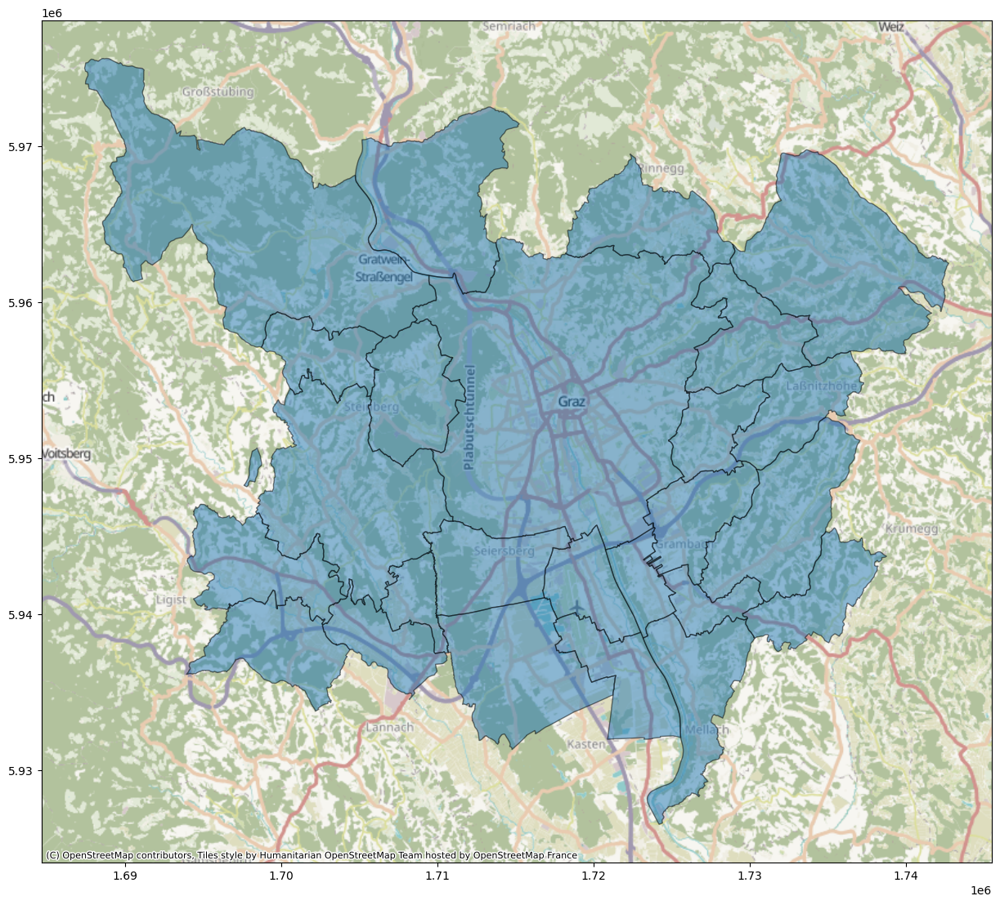

In [ ]:
# Read the Graz districts into a GeoDataFrame
fields_gdf = gpd.read_file(graz_districts)

# Calculate the area for each geometry and add it as a new column
fields_gdf["area"] = fields_gdf.geometry.area

fields_gdf_wm = fields_gdf.to_crs(epsg=3857)

# Explore the GeoDataFrame, visualizing the 'area' column with a specified colormap
ax = fields_gdf_wm.plot(alpha=0.5, edgecolor="k", figsize=(15, 15))
cx.add_basemap(ax)

#### The Evalscript

In [51]:
evalscript = """
//VERSION=3

function setup() {
  return {
    input: [
      {
        bands: [
          "OBS_VALUE_T",
          "dataMask"
        ]
      }
    ],
    output: [
      {
        id: "obs",
        bands: 1
      },
      {
        id: "dataMask",
        bands: 1
      }
    ]
  }
}

function evaluatePixel(samples) {
    return {
      obs: [samples.OBS_VALUE_T],
      dataMask: [samples.dataMask]
    };
}
"""

#### The Request Body

In [ ]:
fields_gdf = gpd.read_file(graz_districts)

aggregation = SentinelHubStatistical.aggregation(
    evalscript=evalscript,
    time_interval=("2021-01-01T00:00:00Z", "2021-01-02T23:59:59Z"),
    aggregation_interval="P1D",
    resolution=(100, 100),
)

input_data = SentinelHubStatistical.input_data(
    DataCollection.define_byoc("36caf873-32ca-44be-ba3e-e6c1b759211c")
)

ndvi_requests = []

for geo_shape in fields_gdf.geometry.values:
    request = SentinelHubStatistical(
        aggregation=aggregation,
        input_data=[input_data],
        geometry=Geometry(geo_shape, crs=CRS(fields_gdf.crs)),
        config=config,
    )
    ndvi_requests.append(request)

In [53]:
%%time

download_requests = [ndvi_request.download_list[0] for ndvi_request in ndvi_requests]

client = SentinelHubStatisticalDownloadClient(config=config)

ndvi_stats = client.download(download_requests)

len(ndvi_stats)

/opt/jupyterhub/lib/python3.10/site-packages/sentinelhub/download/sentinelhub_client.py:93: SHRateLimitWarning: Download rate limit hit
  warnings.warn("Download rate limit hit", category=SHRateLimitWarning)
/opt/jupyterhub/lib/python3.10/site-packages/sentinelhub/download/sentinelhub_client.py:93: SHRateLimitWarning: Download rate limit hit
  warnings.warn("Download rate limit hit", category=SHRateLimitWarning)
/opt/jupyterhub/lib/python3.10/site-packages/sentinelhub/download/sentinelhub_client.py:93: SHRateLimitWarning: Download rate limit hit
  warnings.warn("Download rate limit hit", category=SHRateLimitWarning)
/opt/jupyterhub/lib/python3.10/site-packages/sentinelhub/download/sentinelhub_client.py:93: SHRateLimitWarning: Download rate limit hit
  warnings.warn("Download rate limit hit", category=SHRateLimitWarning)
/opt/jupyterhub/lib/python3.10/site-packages/sentinelhub/download/sentinelhub_client.py:93: SHRateLimitWarning: Download rate limit hit
  warnings.warn("Download rate l

CPU times: user 322 ms, sys: 19.9 ms, total: 342 ms
Wall time: 30.1 s


25

#### Manipulation and Visualisation of the Output

In [ ]:
# Convert the statistics to DataFrames and assign the 'id' column
ndvi_dfs = [
    stats_to_df(polygon_stats).assign(id=id)
    for polygon_stats, id in zip(ndvi_stats, fields_gdf["g_id"].values)
]

# Concatenate all DataFrames into a single DataFrame
ndvi_df = pd.concat(ndvi_dfs)

# Display the resulting DataFrame
ndvi_df

,interval_from,interval_to,obs_B0_min,obs_B0_max,obs_B0_mean,obs_B0_stDev,obs_B0_sampleCount,obs_B0_noDataCount,id
0,2021-01-01,2021-01-02,0.0,11210.0,2230.806155,2660.822781,41000,13086,60101
0,2021-01-01,2021-01-02,0.0,1843.0,665.989430,543.530674,4788,2139,60608
0,2021-01-01,2021-01-02,9.0,2282.0,518.638146,490.750717,3195,1512,60611
0,2021-01-01,2021-01-02,0.0,3047.0,250.342772,550.214008,12600,4866,60613
0,2021-01-01,2021-01-02,99.0,2139.0,457.530859,331.483275,4355,1795,60617
0,2021-01-01,2021-01-02,5.0,863.0,216.253958,165.232063,2860,1281,60618
0,2021-01-01,2021-01-02,51.0,1504.0,655.773010,486.375835,3196,1588,60619
0,2021-01-01,2021-01-02,27.0,2139.0,157.214356,150.634214,7140,3100,60623
0,2021-01-01,2021-01-02,0.0,1617.0,493.239953,537.217885,6642,3208,60624
0,2021-01-01,2021-01-02,49.0,559.0,220.350960,164.807234,6536,3151,60628


In the below cell, we convert the mean NDVI column into a list and then insert it in the pandas geodataframe we created earlier. We can then visualise mean NDVI using this column and an appropriate color map.

In [ ]:
# Extract the mean NDVI values from the DataFrame and convert to a list
mean_ndvi = ndvi_df["obs_B0_mean"].tolist()

# Insert the mean NDVI values into the GeoDataFrame as a new column
fields_gdf.insert(1, "mean_obs", mean_ndvi)

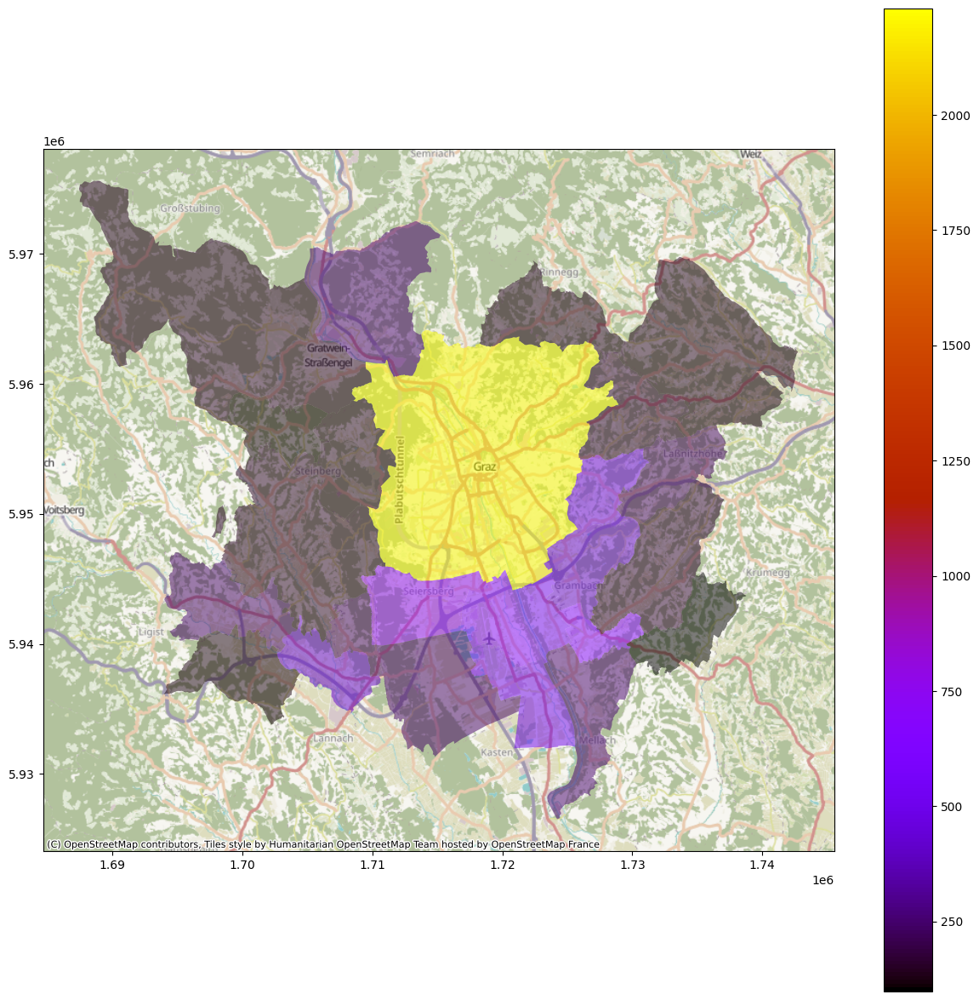

In [ ]:
# Explore the GeoDataFrame, visualizing the 'mean_ndvi' column with a specified colormap

fields_gdf_wm = fields_gdf.to_crs(epsg=3857)
ax = fields_gdf_wm.plot(
    column="mean_obs", cmap="gnuplot", legend=True, alpha=0.5, figsize=(15, 15)
)
cx.add_basemap(ax)

## Summary

In this notebook you have learned how to:

- Visualise and download satellite imagery though Sentinel Hub using Process API.
- Visualising NDVI derived from the satellite imagery 
- Using Statistical API to produce NDVI time series for single and multiple fields.
- Access the EUROSTAT Hackathon dataset hosted on the Copernicus Data Space Ecosystem.

This concludes this notebook on working with Sentinel Hub APIs to access data from the Copernicus Data Space Ecosystem. For more information you can check out the [Sentinel Hub API](https://dataspace.copernicus.eu/analyse/apis/sentinel-hub) Documentation and the [Sentinel Hub Python package](https://sentinelhub-py.readthedocs.io/en/latest/index.html) documentation too.